# Files

- train_audio/ The training data consists of short recordings of individual bird, amphibian, mammal and insects sounds generously uploaded by users of xeno-canto.org, iNaturalist and the Colombian Sound Archive (CSA) of the Humboldt Institute for Biological Resources Research in Colombia. These files have been resampled to 32 kHz where applicable to match the test set audio and converted to the ogg format. Filenames consist of [collection][file_id_in_collection].ogg. The training data should have nearly all relevant files; we expect there is no benefit to looking for more on xeno-canto.org or iNaturalist and appreciate your cooperation in limiting the burden on their servers. If you do, please make sure to adhere to the scraping rules of these data portals.

- test_soundscapes/ When you submit a notebook, the test_soundscapes directory will be populated with approximately 700 recordings to be used for scoring. They are 1 minute long and in ogg audio format, resampled to 32 kHz. The file names are randomized, but have the general form of soundscape_xxxxxx.ogg. It should take your submission notebook approximately five minutes to load all the test soundscapes. Not all species from the train data actually occur in the test data.

- train_soundscapes/ Unlabeled audio data from the same recording locations as the test soundscapes. Filenames consist of [site]_[date]_[local_time].ogg; although recorded at the same location, precise recording sites of unlabeled soundscapes do NOT overlap with recording sites of the hidden test data.

- train.csv A wide range of metadata is provided for the training data. The most directly relevant fields are:

- primary_label: A code for the species (eBird code for birds, iNaturalist taxon ID for non-birds). You can review detailed information about the species by appending codes to eBird and iNaturalis taxon URL, such as https://ebird.org/species/gretin1 for the Great Tinamou or https://www.inaturalist.org/taxa/24322 for the Red Snouted Tree Frog. Not all species have their own pages; some links might fail.
- secondary_labels: List of species labels that have been marked by recordists to also occur in the recording. Can be incomplete.
- latitude & longitude: Coordinates for where the recording was taken. Some bird species may have local call 'dialects,' so you may want to seek geographic diversity in your training data.
- author: The user who provided the recording. Unknown if no name was provided.
- filename: The name of the associated audio file.
- rating: Values in 1..5 (1 - low quality, 5 - high quality) provided by users of Xeno-canto; 0 implies no rating is available; iNaturalist and the CSA do not provide quality ratings.
- collection: Either XC, iNat or CSA, indicating which collection the recording was taken from. Filenames also reference the collection and the ID within that collection.
- sample_submission.csv A valid sample submission.

- row_id: A slug of soundscape_[soundscape_id]_[end_time] for the prediction; e.g., Segment 00:15-00:20 of 1-minute test soundscape soundscape_12345.ogg has row ID soundscape_12345_20.
- [species_id]: There are 206 species ID columns. You will need to predict the probability of the presence of each species for each row.
- taxonomy.csv - Data on the different species, including iNaturalist taxon ID and class name (Aves, Amphibia, Mammalia, Insecta).

- recording_location.txt - Some high-level information on the recording location (El Silencio Natural Reserve).

In [4]:
# %pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126

In [60]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import torch
import torchaudio
import torch.nn.functional as F
from tqdm import tqdm

from typing import Dict, List, Optional, Tuple, Union
from dataclasses import dataclass


In [2]:
torch.cuda.is_available()

True

In [3]:
train = pd.read_csv(r"data\train.csv")
taxonomy = pd.read_csv(r"data\taxonomy.csv") 
sample_submission = pd.read_csv(r"data\sample_submission.csv")

In [4]:
# Display basic information
print(f"Training data shape: {train.shape}")
print(f"Taxonomy data shape: {taxonomy.shape}")
print(f"Sample submission shape: {sample_submission.shape}")

# Display the first few rows of each dataframe
print("\nTraining data sample:")
display(train.head())

print("\nTaxonomy data sample:")
display(taxonomy.head())

print("\nSample submission format:")
display(sample_submission.head(3))

Training data shape: (28564, 13)
Taxonomy data shape: (206, 5)
Sample submission shape: (3, 207)

Training data sample:


,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
0,1139490,[''],[''],1139490/CSA36385.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
1,1139490,[''],[''],1139490/CSA36389.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
2,1192948,[''],[''],1192948/CSA36358.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
3,1192948,[''],[''],1192948/CSA36366.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.2800,-73.8582,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
4,1192948,[''],[''],1192948/CSA36373.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0



Taxonomy data sample:


,primary_label,inat_taxon_id,scientific_name,common_name,class_name
0,1139490,1139490,Ragoniella pulchella,Ragoniella pulchella,Insecta
1,1192948,1192948,Oxyprora surinamensis,Oxyprora surinamensis,Insecta
2,1194042,1194042,Copiphora colombiae,Copiphora colombiae,Insecta
3,126247,126247,Leptodactylus insularum,Spotted Foam-nest Frog,Amphibia
4,1346504,1346504,Neoconocephalus brachypterus,Neoconocephalus brachypterus,Insecta



Sample submission format:


,row_id,1139490,1192948,1194042,126247,1346504,134933,135045,1462711,1462737,...,yebfly1,yebsee1,yecspi2,yectyr1,yehbla2,yehcar1,yelori1,yeofly1,yercac1,ywcpar
0,soundscape_8358733_5,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,...,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854
1,soundscape_8358733_10,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,...,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854
2,soundscape_8358733_15,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,...,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854,0.004854


In [5]:
def load_and_visualize_audio(filename, base_path="data/train_audio"):
    """Load audio file and visualize its waveform and spectrogram"""
    # Construct full file path
    file_path = os.path.join(base_path, filename)
    
    # Load audio using torchaudio
    waveform, sample_rate = torchaudio.load(file_path)
    waveform = waveform[0].numpy()  # Get first channel
    
    # Create figure with 2 subplots
    fig, ax = plt.subplots(2, 1, figsize=(12, 8))
    
    # Plot waveform
    ax[0].plot(waveform)
    ax[0].set_title(f"Waveform - {os.path.basename(filename)}")
    ax[0].set_xlabel("Sample")
    ax[0].set_ylabel("Amplitude")
    
    # Plot spectrogram using torchaudio
    spectrogram = torchaudio.transforms.Spectrogram()(torch.tensor([waveform]))
    spec_db = 20 * torch.log10(spectrogram + 1e-5)
    ax[1].imshow(spec_db[0].numpy(), aspect='auto', origin='lower')
    ax[1].set_title(f"Spectrogram - {os.path.basename(filename)}")
    ax[1].set_xlabel("Time")
    ax[1].set_ylabel("Frequency")
    
    plt.tight_layout()
    plt.show()
    
    return sample_rate

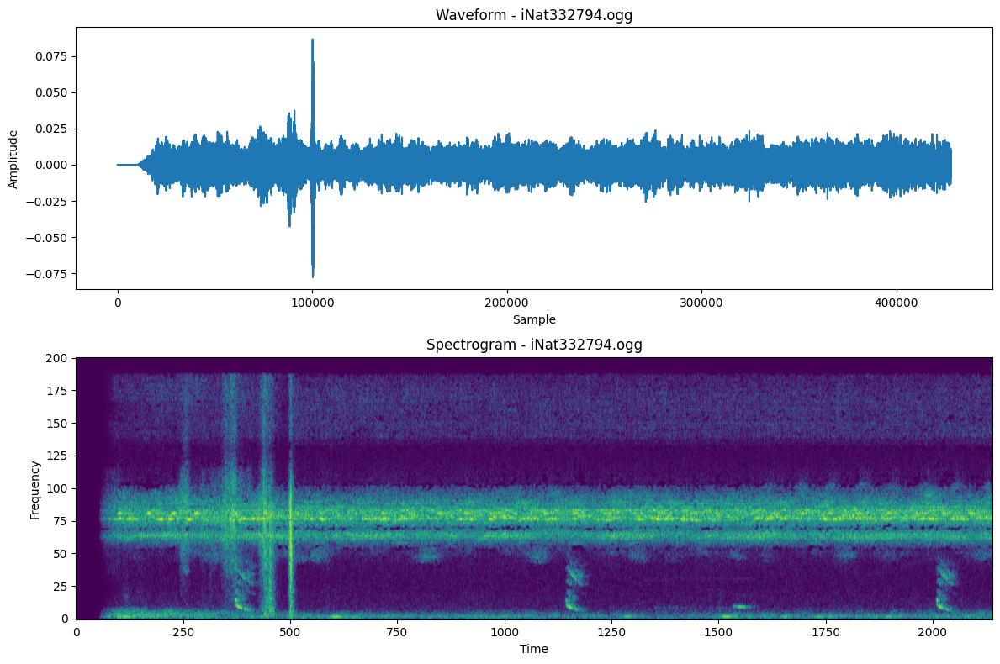

Sample Rate: 32000 Hz
Species: Túngara Frog (Engystomops pustulosus)
Class: Amphibia



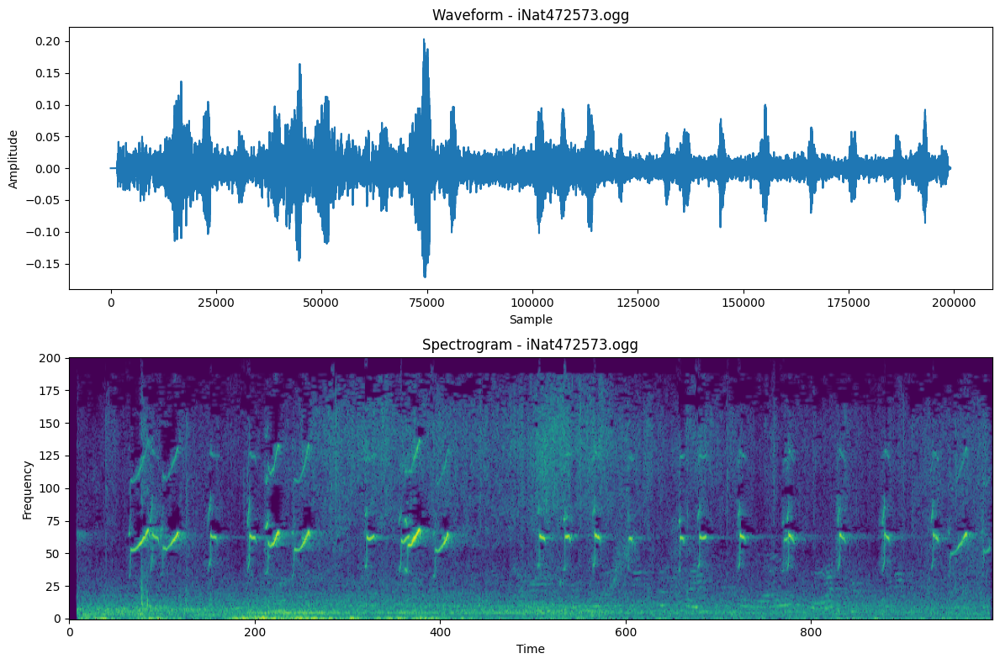

Sample Rate: 32000 Hz
Species: Solitary Sandpiper (Tringa solitaria)
Class: Aves



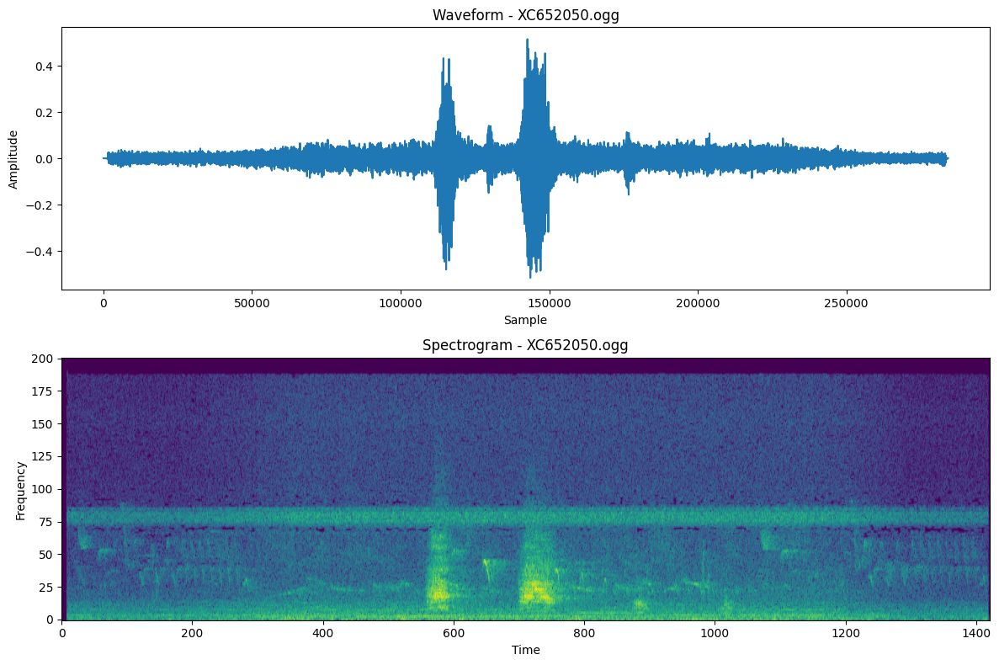

Sample Rate: 32000 Hz
Species: Cocoi Heron (Ardea cocoi)
Class: Aves



In [7]:
# Select 3 random examples from different species (ensure they're different by getting unique primary_labels)
unique_species = train['primary_label'].unique()
selected_species = np.random.choice(unique_species, size=min(3, len(unique_species)), replace=False)
sample_files = []

for species in selected_species:
    species_samples = train[train['primary_label'] == species]
    if not species_samples.empty:
        sample_files.append(species_samples.sample(1)['filename'].values[0])

# Visualize the samples
for file in sample_files:
    try:
        sample_rate = load_and_visualize_audio(file)
        # Print metadata for this sample
        sample_info = train[train['filename'] == file].iloc[0]
        species_info = taxonomy[taxonomy['primary_label'] == sample_info['primary_label']].iloc[0]
        print(f"Sample Rate: {sample_rate} Hz")
        print(f"Species: {species_info['common_name']} ({species_info['scientific_name']})")
        print(f"Class: {species_info['class_name']}\n")
    except Exception as e:
        print(f"Error loading {file}: {e}")

In [8]:
def plot_mel_spectrogram(filename, mel_params=None, target_shape=(256, 256), base_path="data/train_audio"):
    """
    Plot a mel spectrogram for an audio file
    
    Parameters:
    -----------
    filename : str
        Path to the audio file relative to base_path
    mel_params : dict, optional
        Dictionary of parameters for MelSpectrogram transformation
        Common parameters include: n_fft, hop_length, n_mels, f_min, f_max
    base_path : str, optional
        Base directory for audio files
    target_shape : tuple, optional
        Target shape to resize the spectrogram to, as (height, width)
        Default is (256, 256)
        
    Returns:
    --------
    mel_spec_db : torch.Tensor
        The computed mel spectrogram in dB scale, resized to target_shape if specified.
        Shape will be [channels, height, width] where channels is typically 1.
    """
    # 1. Load audio file
    waveform, sample_rate = torchaudio.load(os.path.join(base_path, filename))
    
    # 2. Set default parameters if not provided
    default_params = {
        'sample_rate': 32000,
        'n_fft': 1034,
        'hop_length': 64,
        'n_mels': 136,
        'f_min': 20,
        'f_max': 16000
    }
    
    # Update defaults with user-provided parameters
    if mel_params is not None:
        default_params.update(mel_params)
    
    # Create mel spectrogram
    mel_transform = torchaudio.transforms.MelSpectrogram(**default_params)

    mel_spec = mel_transform(waveform).unsqueeze(0)

    if mel_spec.shape[-2:] != target_shape:
        mel_spec = F.interpolate(mel_spec, size=target_shape, mode='bilinear', align_corners=False).squeeze(0)

    mel_spec_db = torchaudio.transforms.AmplitudeToDB()(mel_spec)
        
    # 5. Plot the mel spectrogram
    plt.figure(figsize=(12, 5))
    plt.imshow(mel_spec_db[0].numpy(), aspect='auto', origin='lower')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram - {os.path.basename(filename)}')
    plt.xlabel('Time Frames')
    plt.ylabel('Mel Frequency Bins')
    plt.tight_layout()
    plt.show()

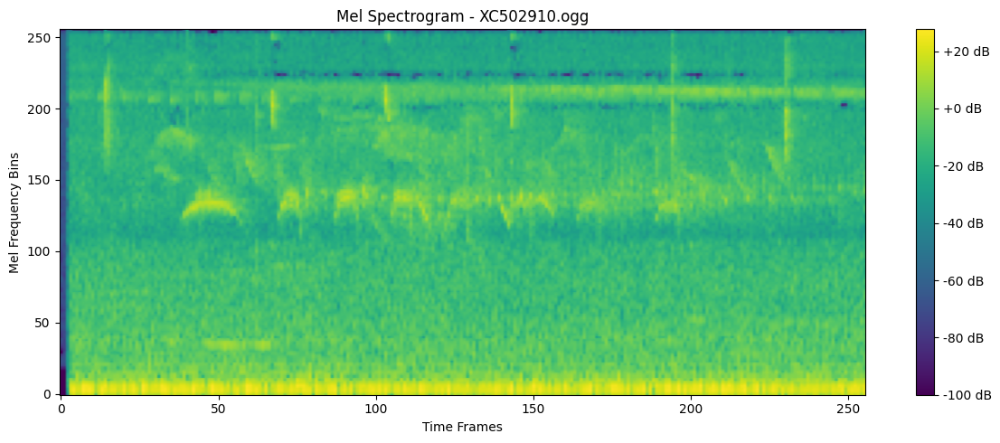

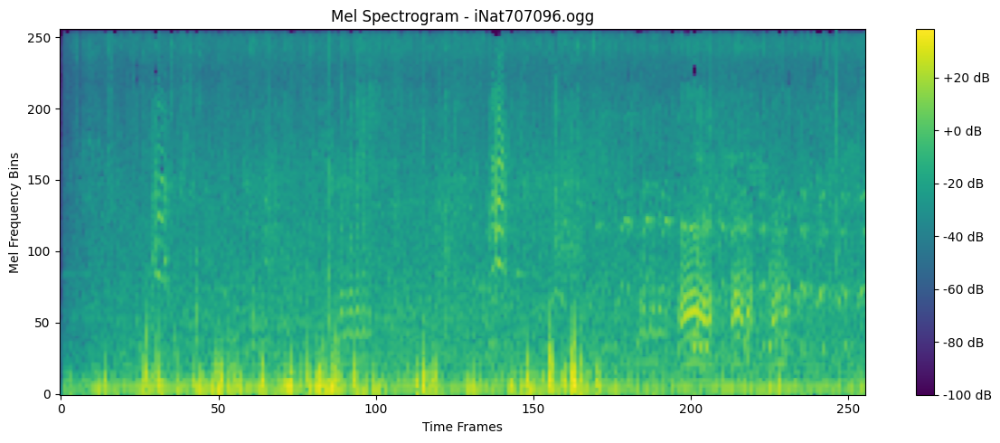

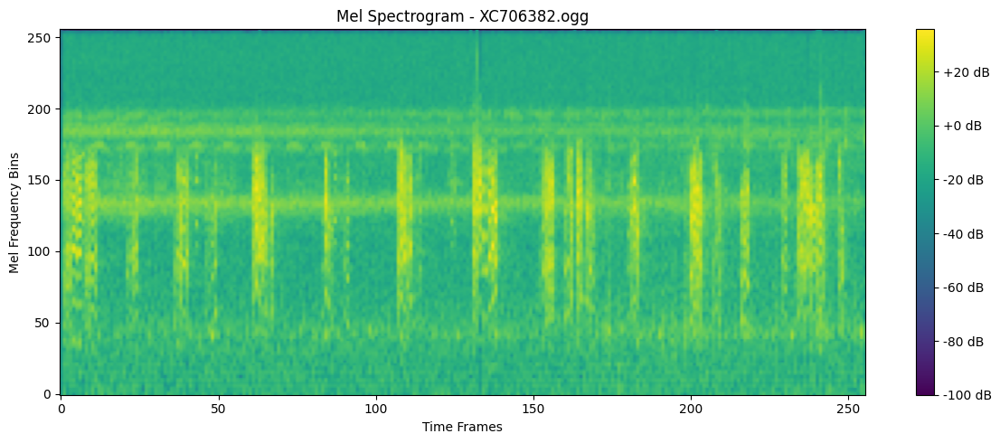

In [9]:
# Using custom parameters
custom_params = {
    'sample_rate': 32000,
    'n_fft': 1034,
    'hop_length': 64,
    'n_mels': 136,
    'f_min': 20,
    'f_max': 16000
}

file_names = np.random.choice(train['filename'], size=min(3, len(train['filename'])), replace=False)
for file_name in file_names:
    plot_mel_spectrogram(file_name, mel_params=custom_params, target_shape=(256, 256))

In [47]:
def generate_mel_spectrograms_dataset(file_list, mel_params=None, target_shape=(256, 256), base_path="data/train_audio", window_size=10):
    """
    Process a list of audio files and convert them to mel spectrograms
    
    Parameters:
    -----------
    file_list : list
        List of audio file paths relative to base_path
    mel_params : dict, optional
        Dictionary of parameters for MelSpectrogram transformation
    target_shape : tuple, optional
        Target shape to resize the spectrograms to (height, width)
    base_path : str, optional
        Base directory for audio files
        
    Returns:
    --------
    spectrograms : dict
        Dictionary mapping filenames to their mel spectrograms
    """
    # Check if GPU is available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # Set default parameters if not provided
    default_params = {
        'sample_rate': 32000,
        'n_fft': 1034,
        'hop_length': 64,
        'n_mels': 136,
        'f_min': 20,
        'f_max': 16000
    }
    
    # Update defaults with user-provided parameters
    if mel_params is not None:
        default_params.update(mel_params)
    
    # Create the mel spectrogram transform
    mel_transform = torchaudio.transforms.MelSpectrogram(**default_params).to(device)
    to_db = torchaudio.transforms.AmplitudeToDB().to(device)
    
    # Dictionary to store results
    spectrograms = {
        'file_name': [],
        # 'file_name_seg': [],
        'mel_spec_db': []
    }
    
    # Process each file with progress bar
    for filename in tqdm(file_list, desc="Processing audio files"):
        try:
            # Load audio
            waveform, sample_rate = torchaudio.load(os.path.join(base_path, filename))
            
            # Move to GPU
            waveform = waveform.to(device)

            # Create mel spectrogram
            mel_spec = mel_transform(waveform).unsqueeze(0)
            
            # Resize if needed
            if mel_spec.shape[-2:] != target_shape:
                mel_spec = F.interpolate(mel_spec, size=target_shape, mode='bilinear', align_corners=False).squeeze(0)

            # Convert to dB
            mel_spec_db = to_db(mel_spec)

            # Store in dictionary
            spectrograms['file_name'].append(filename)
            # spectrograms['file_name_seg'].append(file_name_seg)
            spectrograms['mel_spec_db'].append(mel_spec_db)
                
        except Exception as e:
            print(f"Error processing {filename}: {e}")
    
    return spectrograms

# Example usage:
# Get list of all audio files from the training dataset
audio_files = train['filename'].tolist()

# Process all files (or a subset for testing)
mel_specs = generate_mel_spectrograms_dataset(audio_files[:10], window_size=5)  # Process just 10 files for testing
# mel_specs = create_mel_spectrograms_dataset(audio_files)  # Process all files

Using device: cuda


Processing audio files: 100%|██████████| 10/10 [00:00<00:00, 15.37it/s]


In [48]:
def create_mel_spectrograms_dataset(file_list, mel_params=None, target_shape=(256, 256), base_path="data/train_audio", window_size=10, window_fn="hann"):
    """
    Process a list of audio files and convert them to mel spectrograms with non-overlapping windows
    
    Parameters:
    -----------
    file_list : list
        List of audio file paths relative to base_path
    mel_params : dict, optional
        Dictionary of parameters for MelSpectrogram transformation
    target_shape : tuple, optional
        Target shape to resize the spectrograms to (height, width)
    base_path : str, optional
        Base directory for audio files
    window_size : float, optional
        Size of each window in seconds (default: 10)
    window_fn : str, optional
        Window function to apply ('hann', 'hamming', 'blackman', or 'rectangular')
        
    Returns:
    --------
    spectrograms : dict
        Dictionary mapping filenames to their mel spectrograms
    """
    # Check if GPU is available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # Set default parameters if not provided
    default_params = {
        'sample_rate': 32000,
        'n_fft': 1034,
        'hop_length': 64,
        'n_mels': 136,
        'f_min': 20,
        'f_max': 16000
    }
    
    # Update defaults with user-provided parameters
    if mel_params is not None:
        default_params.update(mel_params)
    
    # Create the mel spectrogram transform
    mel_transform = torchaudio.transforms.MelSpectrogram(**default_params).to(device)
    to_db = torchaudio.transforms.AmplitudeToDB().to(device)
    
    # Create window function if not rectangular
    window_samples = int(default_params['sample_rate'] * window_size)
    if window_fn != "rectangular":
        window_tensor = getattr(torch, f"{window_fn}_window")(window_samples).to(device)
    else:
        window_tensor = torch.ones(window_samples, device=device)
    
    # Dictionary to store results
    spectrograms = {
        'file_name': [],
        'file_name_seg': [],
        'mel_spec_db': [],
        'segment_start_time': []
    }
    
    # Process each file with progress bar
    for filename in tqdm(file_list, desc="Processing audio files"):
        try:
            # Load audio
            waveform, sample_rate = torchaudio.load(os.path.join(base_path, filename))
            
            # Resample if needed
            if sample_rate != default_params['sample_rate']:
                waveform = torchaudio.transforms.Resample(sample_rate, default_params['sample_rate'])(waveform)
            
            # Move to GPU
            waveform = waveform.to(device)
            
            # Calculate window size in samples
            window_samples = int(default_params['sample_rate'] * window_size)
            
            # Calculate number of complete segments
            total_samples = waveform.shape[1]
            num_segments = total_samples // window_samples
            
            print(f"Processing: {filename} - Creating {num_segments} segments")
            
            # Extract non-overlapping segments
            for segment_idx in range(num_segments):
                start_sample = segment_idx * window_samples
                end_sample = start_sample + window_samples
                
                # Calculate start time in seconds
                start_time_sec = start_sample / default_params['sample_rate']
                
                # Create segment name with start time
                file_name_seg = f"{filename}_{start_time_sec:.1f}s"
                
                # Extract segment
                segment = waveform[0, start_sample:end_sample].unsqueeze(0)
                
                # Apply window function to reduce spectral leakage
                segment = segment * window_tensor
                
                # Create mel spectrogram
                mel_spec = mel_transform(segment)
                
                # Resize if needed
                if mel_spec.shape[-2:] != target_shape:
                    mel_spec = F.interpolate(
                        mel_spec.unsqueeze(0), 
                        size=target_shape, 
                        mode='bilinear', 
                        align_corners=False
                    ).squeeze(0)
                
                # Convert to dB
                mel_spec_db = to_db(mel_spec)
                
                # Store in dictionary
                spectrograms['file_name'].append(filename)
                spectrograms['file_name_seg'].append(file_name_seg)
                spectrograms['mel_spec_db'].append(mel_spec_db)
                spectrograms['segment_start_time'].append(start_time_sec)
                
        except Exception as e:
            print(f"Error processing {filename}: {e}")
    
    return spectrograms

# Example usage:
# Get list of all audio files from the training dataset
audio_files = train['filename'].tolist()

# Process all files (or a subset for testing)
mel_specs = create_mel_spectrograms_dataset(audio_files[:10], window_size=10, window_fn="hann")  # Process just 10 files for testing
# mel_specs = create_mel_spectrograms_dataset(audio_files)  # Process all files

Using device: cuda


Processing audio files:  10%|█         | 1/10 [00:00<00:01,  8.66it/s]

Processing: 1139490/CSA36385.ogg - Creating 9 segments


Processing audio files:  20%|██        | 2/10 [00:00<00:01,  7.14it/s]

Processing: 1139490/CSA36389.ogg - Creating 9 segments


Processing audio files:  40%|████      | 4/10 [00:00<00:00,  9.06it/s]

Processing: 1192948/CSA36358.ogg - Creating 11 segments
Processing: 1192948/CSA36366.ogg - Creating 10 segments
Processing: 1192948/CSA36373.ogg - Creating 10 segments


Processing audio files: 100%|██████████| 10/10 [00:00<00:00, 13.99it/s]

Processing: 1192948/CSA36388.ogg - Creating 9 segments
Processing: 1194042/CSA18783.ogg - Creating 3 segments
Processing: 1194042/CSA18794.ogg - Creating 1 segments
Processing: 1194042/CSA18802.ogg - Creating 4 segments
Processing: 126247/XC941297.ogg - Creating 1 segments


In [83]:
@dataclass
class MelSpectrogramConfig:
    """Configuration for mel spectrogram parameters"""
    sample_rate: int = 32000
    n_fft: int = 1034
    hop_length: int = 64
    n_mels: int = 136
    f_min: int = 20
    f_max: int = 16000
    window_size: float = 10.0
    window_fn: str = "hann"
    target_shape: Tuple[int, int] = (256, 256)

class AudioProcessor:
    """Class for processing audio files and creating mel spectrograms"""
    
    def __init__(
        self,
        config: Optional[MelSpectrogramConfig] = None,
        base_path: str = "data/train_audio",
        device: Optional[str] = None
    ):
        """
        Initialize the AudioProcessor
        
        Args:
            config: Configuration for mel spectrogram parameters
            base_path: Base directory for audio files
            device: Device to use for processing ('cuda' or 'cpu')
        """
        self.config = config or MelSpectrogramConfig()
        self.base_path = base_path
        self.device = device or ("cuda" if torch.cuda.is_available() else "cpu")
        
        # Initialize transforms
        self._initialize_transforms()
        
    def _initialize_transforms(self) -> None:
        """Initialize the mel spectrogram and window transforms"""
        # Create mel spectrogram transform
        self.mel_transform = torchaudio.transforms.MelSpectrogram(
            sample_rate=self.config.sample_rate,
            n_fft=self.config.n_fft,
            hop_length=self.config.hop_length,
            n_mels=self.config.n_mels,
            f_min=self.config.f_min,
            f_max=self.config.f_max
        ).to(self.device)
        
        # Create amplitude to dB transform
        self.to_db = torchaudio.transforms.AmplitudeToDB().to(self.device)
        
        # Create window function
        window_samples = int(self.config.sample_rate * self.config.window_size)
        if self.config.window_fn != "rectangular":
            self.window_tensor = getattr(torch, f"{self.config.window_fn}_window")(
                window_samples
            ).to(self.device)
        else:
            self.window_tensor = torch.ones(window_samples, device=self.device)
    
    def _load_audio(self, filename: str) -> torch.Tensor:
        """
        Load and preprocess audio file
        
        Args:
            filename: Name of the audio file
            
        Returns:
            Preprocessed audio waveform
        """
        # Load audio
        waveform, sample_rate = torchaudio.load(os.path.join(self.base_path, filename))
        
        # Resample if needed
        if sample_rate != self.config.sample_rate:
            waveform = torchaudio.transforms.Resample(
                sample_rate, 
                self.config.sample_rate
            )(waveform)
        
        return waveform.to(self.device)
    
    def _process_segment(
        self, 
        segment: torch.Tensor, 
        filename: str, 
        start_time: float
    ) -> Dict[str, Union[str, torch.Tensor, float]]:
        """
        Process a single audio segment
        
        Args:
            segment: Audio segment tensor
            filename: Original filename
            start_time: Start time of the segment in seconds
            
        Returns:
            Dictionary containing processed segment information
        """
        # Apply window function
        segment = segment * self.window_tensor
        
        # Create mel spectrogram
        mel_spec = self.mel_transform(segment)
        
        # Resize if needed
        if mel_spec.shape[-2:] != self.config.target_shape:
            mel_spec = F.interpolate(
                mel_spec.unsqueeze(0),
                size=self.config.target_shape,
                mode='bilinear',
                align_corners=False
            ).squeeze(0)
        
        # Convert to dB
        mel_spec_db = self.to_db(mel_spec)
        
        return {
            'file_name': filename,
            'file_name_seg': f"{filename}_{start_time:.1f}s",
            'mel_spec_db': mel_spec_db,
            'segment_start_time': start_time
        }
    
    def process_file(self, filename: str) -> List[Dict[str, Union[str, torch.Tensor, float]]]:
        """
        Process a single audio file into segments
        
        Args:
            filename: Name of the audio file
            
        Returns:
            List of dictionaries containing processed segments
        """
        try:
            # Load and preprocess audio
            waveform = self._load_audio(filename)
            
            # Calculate window size in samples
            window_samples = int(self.config.sample_rate * self.config.window_size)
            
            # Calculate number of complete segments
            total_samples = waveform.shape[1]
            num_segments = total_samples // window_samples
            
            print(f"Processing: {filename} - Creating {num_segments} segments")
            
            # Process segments
            segments = []
            for segment_idx in range(num_segments):
                start_sample = segment_idx * window_samples
                end_sample = start_sample + window_samples
                
                # Calculate start time
                start_time = start_sample / self.config.sample_rate
                
                # Extract and process segment
                segment = waveform[0, start_sample:end_sample].unsqueeze(0)
                processed_segment = self._process_segment(segment, filename, start_time)
                segments.append(processed_segment)
            
            return segments
            
        except Exception as e:
            print(f"Error processing {filename}: {e}")
            return []
    
    def create_dataset(
        self, 
        file_list: List[str]
    ) -> Dict[str, List[Union[str, torch.Tensor, float]]]:
        """
        Process a list of audio files and create a dataset
        
        Args:
            file_list: List of audio file paths
            
        Returns:
            Dictionary containing the processed dataset
        """
        # Initialize results dictionary
        dataset = {
            'file_name': [],
            'file_name_seg': [],
            'mel_spec_db': [],
            'segment_start_time': []
        }
        
        # Process each file
        for filename in tqdm(file_list, desc="Processing audio files"):
            segments = self.process_file(filename)
            
            # Add segments to dataset
            for segment in segments:
                for key in dataset.keys():
                    dataset[key].append(segment[key])
        
        return dataset
    
    def save_dataset(
        self,
        dataset: Dict[str, List[Union[str, torch.Tensor, float]]],
        save_path: str
    ) -> None:
        """
        Save dataset in PyTorch format
        
        Args:
            dataset: Processed dataset dictionary
            save_path: Path to save the dataset
            format: File format ('pt' or 'pth')
        """
        # Convert lists to tensors where appropriate
        save_dict = {
            'file_name': dataset['file_name'],
            'file_name_seg': dataset['file_name_seg'],
            'mel_spec_db': torch.stack(dataset['mel_spec_db']),
            'segment_start_time': torch.tensor(dataset['segment_start_time'])
        }
        
        # Save with torch.save
        torch.save(save_dict, f"{save_path}.pt")

    def load_dataset(self, load_path: str) -> Dict[str, List[Union[str, torch.Tensor, float]]]:
        """Load dataset from PyTorch format"""
        return torch.load(load_path)

# Example usage:
if __name__ == "__main__":
    # Create configuration
    config = MelSpectrogramConfig(
        window_size=10.0,
        window_fn="hann",
        target_shape=(256, 256)
    )
    
    # Initialize processor
    processor = AudioProcessor(
        config=config,
        base_path="data/train_audio"
    )
    
    # Get list of audio files
    audio_files = train['filename'].tolist()
    
    # Process files
    mel_specs = processor.create_dataset(audio_files)  # Process just 10 files for testing
    processor.save_dataset(dataset=mel_specs, save_path=r"data/generate_mel_specs/mel_specs_db")

Processing audio files:   0%|          | 0/28564 [00:00<?, ?it/s]

Processing audio files:   0%|          | 2/28564 [00:00<1:05:09,  7.31it/s]

Processing: 1139490/CSA36385.ogg - Creating 9 segments
Processing: 1139490/CSA36389.ogg - Creating 9 segments


Processing audio files:   0%|          | 4/28564 [00:00<50:39,  9.40it/s]  

Processing: 1192948/CSA36358.ogg - Creating 11 segments
Processing: 1192948/CSA36366.ogg - Creating 10 segments
Processing: 1192948/CSA36373.ogg - Creating 10 segments


Processing audio files:   0%|          | 11/28564 [00:00<23:19, 20.41it/s]

Processing: 1192948/CSA36388.ogg - Creating 9 segments
Processing: 1194042/CSA18783.ogg - Creating 3 segments
Processing: 1194042/CSA18794.ogg - Creating 1 segments
Processing: 1194042/CSA18802.ogg - Creating 4 segments
Processing: 126247/XC941297.ogg - Creating 1 segments
Processing: 126247/iNat1109254.ogg - Creating 1 segments
Processing: 126247/iNat146584.ogg - Creating 1 segments
Processing: 126247/iNat320679.ogg - Creating 2 segments
Processing: 126247/iNat888527.ogg - Creating 1 segments
Processing: 126247/iNat888729.ogg - Creating 1 segments


Processing audio files:   0%|          | 16/28564 [00:00<19:34, 24.30it/s]

Processing: 1346504/CSA18784.ogg - Creating 4 segments
Processing: 1346504/CSA18791.ogg - Creating 7 segments
Processing: 1346504/CSA18792.ogg - Creating 2 segments


Processing audio files:   0%|          | 19/28564 [00:01<24:39, 19.30it/s]

Processing: 1346504/CSA18793.ogg - Creating 6 segments
Processing: 1346504/CSA18803.ogg - Creating 10 segments


Processing audio files:   0%|          | 25/28564 [00:01<27:12, 17.48it/s]

Processing: 134933/XC941298.ogg - Creating 4 segments
Processing: 134933/iNat1108984.ogg - Creating 2 segments
Processing: 134933/iNat1160199.ogg - Creating 4 segments
Processing: 134933/iNat859408.ogg - Creating 1 segments
Processing: 135045/iNat1122209.ogg - Creating 4 segments
Processing: 135045/iNat1207345.ogg - Creating 13 segments
Processing: 135045/iNat1207347.ogg - Creating 11 segments


Processing audio files:   0%|          | 28/28564 [00:01<41:05, 11.58it/s]

Processing: 135045/iNat1208549.ogg - Creating 17 segments
Processing: 135045/iNat1208550.ogg - Creating 12 segments


Processing audio files:   0%|          | 30/28564 [00:02<51:53,  9.16it/s]

Processing: 135045/iNat1208551.ogg - Creating 19 segments
Processing: 135045/iNat1208552.ogg - Creating 20 segments


Processing audio files:   0%|          | 34/28564 [00:02<55:11,  8.62it/s]  

Processing: 135045/iNat1208572.ogg - Creating 21 segments
Processing: 135045/iNat327127.ogg - Creating 0 segments
Processing: 135045/iNat48803.ogg - Creating 5 segments


Processing audio files:   0%|          | 36/28564 [00:03<55:48,  8.52it/s]

Processing: 1462711/CSA36371.ogg - Creating 10 segments
Processing: 1462711/CSA36379.ogg - Creating 9 segments


Processing audio files:   0%|          | 38/28564 [00:03<55:18,  8.60it/s]

Processing: 1462711/CSA36390.ogg - Creating 9 segments
Processing: 1462737/CSA36341.ogg - Creating 10 segments


Processing audio files:   0%|          | 40/28564 [00:03<54:26,  8.73it/s]

Processing: 1462737/CSA36369.ogg - Creating 10 segments
Processing: 1462737/CSA36380.ogg - Creating 10 segments


Processing audio files:   0%|          | 42/28564 [00:03<54:30,  8.72it/s]

Processing: 1462737/CSA36381.ogg - Creating 10 segments
Processing: 1462737/CSA36386.ogg - Creating 9 segments


Processing audio files:   0%|          | 44/28564 [00:04<54:35,  8.71it/s]

Processing: 1462737/CSA36391.ogg - Creating 10 segments
Processing: 1462737/CSA36395.ogg - Creating 9 segments
Processing: 1564122/CSA34195.ogg - Creating 0 segments
Processing: 1564122/CSA34196.ogg - Creating 0 segments
Processing: 1564122/CSA34197.ogg - Creating 0 segments
Processing: 1564122/CSA34198.ogg - Creating 0 segments
Processing: 1564122/CSA34199.ogg - Creating 0 segments
Processing: 1564122/CSA34200.ogg - Creating 0 segments
Processing: 21038/iNat297879.ogg - Creating 1 segments


Processing audio files:   0%|          | 54/28564 [00:04<35:35, 13.35it/s]

Processing: 21038/iNat65519.ogg - Creating 38 segments
Processing: 21116/iNat296867.ogg - Creating 0 segments
Processing: 21116/iNat65520.ogg - Creating 0 segments


Processing audio files:   0%|          | 58/28564 [00:04<35:03, 13.55it/s]

Processing: 21211/XC882646.ogg - Creating 10 segments
Processing: 21211/XC882647.ogg - Creating 3 segments
Processing: 21211/XC882648.ogg - Creating 5 segments
Processing: 21211/XC882649.ogg - Creating 3 segments


Processing audio files:   0%|          | 61/28564 [00:05<31:24, 15.13it/s]

Processing: 21211/XC882650.ogg - Creating 1 segments
Processing: 21211/XC882651.ogg - Creating 0 segments
Processing: 21211/XC882652.ogg - Creating 10 segments


Processing audio files:   0%|          | 63/28564 [00:05<31:47, 14.94it/s]

Processing: 21211/XC882653.ogg - Creating 7 segments
Processing: 21211/XC882654.ogg - Creating 3 segments
Processing: 21211/XC882655.ogg - Creating 14 segments


Processing audio files:   0%|          | 65/28564 [00:05<35:53, 13.23it/s]

Processing: 21211/XC882656.ogg - Creating 3 segments
Processing: 21211/XC882657.ogg - Creating 10 segments


Processing audio files:   0%|          | 69/28564 [00:05<43:24, 10.94it/s]

Processing: 21211/XC882658.ogg - Creating 11 segments
Processing: 21211/XC882659.ogg - Creating 11 segments
Processing: 21211/XC896828.ogg - Creating 0 segments
Processing: 21211/XC896832.ogg - Creating 0 segments
Processing: 21211/XC896838.ogg - Creating 1 segments


Processing audio files:   0%|          | 84/28564 [00:06<14:27, 32.85it/s]

Processing: 21211/XC896839.ogg - Creating 0 segments
Processing: 21211/XC896840.ogg - Creating 0 segments
Processing: 21211/XC896855.ogg - Creating 0 segments
Processing: 21211/XC896857.ogg - Creating 0 segments
Processing: 21211/XC896860.ogg - Creating 0 segments
Processing: 21211/XC896861.ogg - Creating 0 segments
Processing: 21211/XC896863.ogg - Creating 0 segments
Processing: 21211/XC913785.ogg - Creating 0 segments
Processing: 21211/XC913809.ogg - Creating 0 segments
Processing: 21211/XC913811.ogg - Creating 0 segments
Processing: 21211/XC913839.ogg - Creating 0 segments
Processing: 21211/XC913840.ogg - Creating 0 segments
Processing: 21211/XC913858.ogg - Creating 0 segments
Processing: 21211/XC913859.ogg - Creating 0 segments
Processing: 21211/XC913880.ogg - Creating 0 segments
Processing: 21211/XC913881.ogg - Creating 0 segments
Processing: 21211/XC913886.ogg - Creating 0 segments


Processing audio files:   0%|          | 104/28564 [00:06<08:17, 57.23it/s]

Processing: 21211/XC913887.ogg - Creating 0 segments
Processing: 21211/XC913893.ogg - Creating 0 segments
Processing: 21211/XC913894.ogg - Creating 0 segments
Processing: 21211/XC913976.ogg - Creating 0 segments
Processing: 21211/XC913977.ogg - Creating 0 segments
Processing: 21211/XC913978.ogg - Creating 0 segments
Processing: 21211/XC913992.ogg - Creating 0 segments
Processing: 21211/XC913997.ogg - Creating 0 segments
Processing: 21211/XC913998.ogg - Creating 0 segments
Processing: 21211/XC914005.ogg - Creating 0 segments
Processing: 21211/XC914013.ogg - Creating 0 segments
Processing: 21211/XC914025.ogg - Creating 0 segments
Processing: 21211/XC914028.ogg - Creating 0 segments
Processing: 21211/XC917437.ogg - Creating 0 segments
Processing: 21211/XC917444.ogg - Creating 0 segments
Processing: 21211/XC917465.ogg - Creating 0 segments
Processing: 21211/XC917470.ogg - Creating 0 segments


Processing audio files:   0%|          | 111/28564 [00:06<07:56, 59.68it/s]

Processing: 21211/XC917471.ogg - Creating 0 segments
Processing: 21211/XC920803.ogg - Creating 0 segments
Processing: 21211/XC920868.ogg - Creating 0 segments
Processing: 21211/XC920870.ogg - Creating 0 segments
Processing: 21211/XC920872.ogg - Creating 0 segments
Processing: 21211/XC920873.ogg - Creating 0 segments
Processing: 21211/XC920881.ogg - Creating 0 segments
Processing: 21211/XC920888.ogg - Creating 0 segments
Processing: 21211/XC920892.ogg - Creating 0 segments
Processing: 21211/XC925906.ogg - Creating 1 segments
Processing: 21211/XC925907.ogg - Creating 0 segments
Processing: 21211/XC925908.ogg - Creating 0 segments
Processing: 21211/XC925925.ogg - Creating 0 segments


Processing audio files:   0%|          | 125/28564 [00:06<08:52, 53.44it/s]

Processing: 21211/XC928709.ogg - Creating 0 segments
Processing: 21211/XC928710.ogg - Creating 0 segments
Processing: 21211/XC928714.ogg - Creating 0 segments
Processing: 21211/XC934741.ogg - Creating 5 segments
Processing: 21211/iNat1005762.ogg - Creating 1 segments
Processing: 21211/iNat359445.ogg - Creating 1 segments
Processing: 21211/iNat361221.ogg - Creating 1 segments
Processing: 21211/iNat361222.ogg - Creating 0 segments


Processing audio files:   0%|          | 131/28564 [00:06<11:04, 42.81it/s]

Processing: 21211/iNat597267.ogg - Creating 9 segments
Processing: 21211/iNat946486.ogg - Creating 0 segments
Processing: 21211/iNat986383.ogg - Creating 1 segments
Processing: 21211/iNat998468.ogg - Creating 0 segments
Processing: 22333/XC890507.ogg - Creating 1 segments
Processing: 22333/XC894982.ogg - Creating 6 segments
Processing: 22333/XC913746.ogg - Creating 0 segments


Processing audio files:   0%|          | 141/28564 [00:07<11:14, 42.15it/s]

Processing: 22333/XC949880.ogg - Creating 1 segments
Processing: 22333/iNat1005729.ogg - Creating 0 segments
Processing: 22333/iNat1008712.ogg - Creating 1 segments
Processing: 22333/iNat1155704.ogg - Creating 0 segments
Processing: 22333/iNat1208354.ogg - Creating 1 segments
Processing: 22333/iNat1236061.ogg - Creating 1 segments
Processing: 22333/iNat1237389.ogg - Creating 1 segments
Processing: 22333/iNat1237907.ogg - Creating 0 segments
Processing: 22333/iNat1239167.ogg - Creating 0 segments
Processing: 22333/iNat1241231.ogg - Creating 3 segments


Processing audio files:   1%|          | 146/28564 [00:07<12:03, 39.26it/s]

Processing: 22333/iNat1245802.ogg - Creating 1 segments
Processing: 22333/iNat1273155.ogg - Creating 5 segments
Processing: 22333/iNat1274792.ogg - Creating 0 segments
Processing: 22333/iNat144601.ogg - Creating 1 segments
Processing: 22333/iNat150110.ogg - Creating 2 segments
Processing: 22333/iNat233716.ogg - Creating 1 segments
Processing: 22333/iNat255294.ogg - Creating 1 segments


Processing audio files:   1%|          | 156/28564 [00:07<13:21, 35.44it/s]

Processing: 22333/iNat292304.ogg - Creating 10 segments
Processing: 22333/iNat332150.ogg - Creating 0 segments
Processing: 22333/iNat344525.ogg - Creating 1 segments
Processing: 22333/iNat34849.ogg - Creating 1 segments
Processing: 22333/iNat503234.ogg - Creating 0 segments
Processing: 22333/iNat516995.ogg - Creating 2 segments
Processing: 22333/iNat52742.ogg - Creating 1 segments
Processing: 22333/iNat530453.ogg - Creating 1 segments
Processing: 22333/iNat532306.ogg - Creating 1 segments
Processing: 22333/iNat53679.ogg - Creating 1 segments


Processing audio files:   1%|          | 168/28564 [00:07<11:00, 42.96it/s]

Processing: 22333/iNat54095.ogg - Creating 0 segments
Processing: 22333/iNat554680.ogg - Creating 2 segments
Processing: 22333/iNat560488.ogg - Creating 1 segments
Processing: 22333/iNat575726.ogg - Creating 0 segments
Processing: 22333/iNat575727.ogg - Creating 1 segments
Processing: 22333/iNat576377.ogg - Creating 0 segments
Processing: 22333/iNat578290.ogg - Creating 1 segments
Processing: 22333/iNat579714.ogg - Creating 1 segments
Processing: 22333/iNat585061.ogg - Creating 1 segments


Processing audio files:   1%|          | 173/28564 [00:08<11:39, 40.57it/s]

Processing: 22333/iNat758022.ogg - Creating 4 segments
Processing: 22333/iNat815140.ogg - Creating 1 segments
Processing: 22333/iNat867912.ogg - Creating 0 segments
Processing: 22333/iNat894924.ogg - Creating 2 segments
Processing: 22333/iNat943181.ogg - Creating 1 segments
Processing: 22333/iNat976527.ogg - Creating 1 segments
Processing: 22333/iNat983570.ogg - Creating 0 segments
Processing: 22333/iNat987253.ogg - Creating 0 segments


Processing audio files:   1%|          | 178/28564 [00:08<12:34, 37.65it/s]

Processing: 22973/XC167037.ogg - Creating 5 segments
Processing: 22973/XC882793.ogg - Creating 1 segments
Processing: 22973/XC882794.ogg - Creating 5 segments


Processing audio files:   1%|          | 182/28564 [00:08<17:36, 26.85it/s]

Processing: 22973/XC882795.ogg - Creating 9 segments
Processing: 22973/XC882796.ogg - Creating 7 segments
Processing: 22973/XC882797.ogg - Creating 4 segments


Processing audio files:   1%|          | 190/28564 [00:08<19:43, 23.97it/s]

Processing: 22973/XC882798.ogg - Creating 11 segments
Processing: 22973/XC892927.ogg - Creating 3 segments
Processing: 22973/XC892932.ogg - Creating 1 segments
Processing: 22973/XC915924.ogg - Creating 1 segments
Processing: 22973/XC928991.ogg - Creating 1 segments
Processing: 22973/XC929100.ogg - Creating 1 segments
Processing: 22973/XC929101.ogg - Creating 2 segments


Processing audio files:   1%|          | 194/28564 [00:09<19:50, 23.84it/s]

Processing: 22973/iNat1099468.ogg - Creating 2 segments
Processing: 22973/iNat1243033.ogg - Creating 1 segments
Processing: 22973/iNat1243080.ogg - Creating 1 segments
Processing: 22973/iNat1251026.ogg - Creating 5 segments
Processing: 22973/iNat1257590.ogg - Creating 3 segments


Processing audio files:   1%|          | 200/28564 [00:09<21:00, 22.51it/s]

Processing: 22973/iNat154035.ogg - Creating 2 segments
Processing: 22973/iNat157085.ogg - Creating 2 segments
Processing: 22973/iNat218912.ogg - Creating 2 segments
Processing: 22973/iNat28425.ogg - Creating 4 segments
Processing: 22973/iNat287261.ogg - Creating 2 segments


Processing audio files:   1%|          | 203/28564 [00:09<21:55, 21.57it/s]

Processing: 22973/iNat28982.ogg - Creating 1 segments
Processing: 22973/iNat29017.ogg - Creating 3 segments
Processing: 22973/iNat318716.ogg - Creating 1 segments
Processing: 22973/iNat326854.ogg - Creating 1 segments


Processing audio files:   1%|          | 209/28564 [00:09<22:14, 21.24it/s]

Processing: 22973/iNat326860.ogg - Creating 3 segments
Processing: 22973/iNat326966.ogg - Creating 2 segments
Processing: 22973/iNat327135.ogg - Creating 1 segments
Processing: 22973/iNat331404.ogg - Creating 3 segments
Processing: 22973/iNat343840.ogg - Creating 1 segments


Processing audio files:   1%|          | 212/28564 [00:10<29:47, 15.86it/s]

Processing: 22973/iNat348132.ogg - Creating 6 segments
Processing: 22973/iNat348440.ogg - Creating 4 segments
Processing: 22973/iNat348441.ogg - Creating 1 segments
Processing: 22973/iNat502463.ogg - Creating 2 segments


Processing audio files:   1%|          | 214/28564 [00:10<29:52, 15.82it/s]

Processing: 22973/iNat556448.ogg - Creating 4 segments
Processing: 22973/iNat576552.ogg - Creating 2 segments
Processing: 22973/iNat581610.ogg - Creating 2 segments
Processing: 22973/iNat583590.ogg - Creating 5 segments


Processing audio files:   1%|          | 219/28564 [00:10<30:41, 15.39it/s]

Processing: 22973/iNat583591.ogg - Creating 6 segments
Processing: 22973/iNat58920.ogg - Creating 3 segments
Processing: 22973/iNat599374.ogg - Creating 1 segments
Processing: 22973/iNat599375.ogg - Creating 2 segments


Processing audio files:   1%|          | 222/28564 [00:10<31:47, 14.86it/s]

Processing: 22973/iNat630711.ogg - Creating 13 segments
Processing: 22973/iNat726873.ogg - Creating 1 segments
Processing: 22973/iNat839779.ogg - Creating 2 segments
Processing: 22973/iNat859872.ogg - Creating 8 segments


Processing audio files:   1%|          | 233/28564 [00:11<19:53, 23.75it/s]

Processing: 22973/iNat870999.ogg - Creating 1 segments
Processing: 22973/iNat879832.ogg - Creating 2 segments
Processing: 22973/iNat879833.ogg - Creating 2 segments
Processing: 22973/iNat887102.ogg - Creating 0 segments
Processing: 22973/iNat992788.ogg - Creating 0 segments
Processing: 22976/XC893971.ogg - Creating 1 segments
Processing: 22976/XC893972.ogg - Creating 0 segments
Processing: 22976/XC935710.ogg - Creating 3 segments


Processing audio files:   1%|          | 236/28564 [00:11<21:20, 22.13it/s]

Processing: 22976/iNat1022191.ogg - Creating 7 segments
Processing: 22976/iNat103569.ogg - Creating 2 segments
Processing: 22976/iNat1109157.ogg - Creating 1 segments
Processing: 22976/iNat1112338.ogg - Creating 1 segments
Processing: 22976/iNat1190292.ogg - Creating 2 segments
Processing: 22976/iNat1192434.ogg - Creating 1 segments
Processing: 22976/iNat1199997.ogg - Creating 2 segments


Processing audio files:   1%|          | 243/28564 [00:11<20:39, 22.84it/s]

Processing: 22976/iNat1208974.ogg - Creating 0 segments
Processing: 22976/iNat1226844.ogg - Creating 7 segments
Processing: 22976/iNat132256.ogg - Creating 6 segments


Processing audio files:   1%|          | 252/28564 [00:11<15:22, 30.69it/s]

Processing: 22976/iNat132257.ogg - Creating 4 segments
Processing: 22976/iNat134883.ogg - Creating 1 segments
Processing: 22976/iNat141097.ogg - Creating 1 segments
Processing: 22976/iNat141098.ogg - Creating 2 segments
Processing: 22976/iNat141099.ogg - Creating 1 segments
Processing: 22976/iNat222390.ogg - Creating 1 segments
Processing: 22976/iNat226804.ogg - Creating 1 segments
Processing: 22976/iNat236359.ogg - Creating 1 segments
Processing: 22976/iNat258473.ogg - Creating 1 segments
Processing: 22976/iNat270309.ogg - Creating 1 segments


Processing audio files:   1%|          | 257/28564 [00:11<13:41, 34.46it/s]

Processing: 22976/iNat27238.ogg - Creating 0 segments
Processing: 22976/iNat27239.ogg - Creating 0 segments
Processing: 22976/iNat279584.ogg - Creating 3 segments
Processing: 22976/iNat311367.ogg - Creating 1 segments
Processing: 22976/iNat32633.ogg - Creating 2 segments
Processing: 22976/iNat399872.ogg - Creating 1 segments
Processing: 22976/iNat48797.ogg - Creating 0 segments
Processing: 22976/iNat502474.ogg - Creating 1 segments
Processing: 22976/iNat523344.ogg - Creating 1 segments


Processing audio files:   1%|          | 267/28564 [00:12<12:20, 38.21it/s]

Processing: 22976/iNat523345.ogg - Creating 0 segments
Processing: 22976/iNat523346.ogg - Creating 0 segments
Processing: 22976/iNat533201.ogg - Creating 0 segments
Processing: 22976/iNat567927.ogg - Creating 2 segments
Processing: 22976/iNat583735.ogg - Creating 1 segments
Processing: 22976/iNat585685.ogg - Creating 0 segments
Processing: 22976/iNat599139.ogg - Creating 1 segments


Processing audio files:   1%|          | 271/28564 [00:12<17:06, 27.56it/s]

Processing: 22976/iNat630710.ogg - Creating 13 segments
Processing: 22976/iNat687624.ogg - Creating 1 segments
Processing: 22976/iNat77271.ogg - Creating 0 segments
Processing: 22976/iNat843264.ogg - Creating 6 segments
Processing: 22976/iNat858189.ogg - Creating 1 segments


Processing audio files:   1%|          | 278/28564 [00:12<19:30, 24.16it/s]

Processing: 24272/XC882885.ogg - Creating 9 segments
Processing: 24272/XC893991.ogg - Creating 1 segments
Processing: 24272/iNat341657.ogg - Creating 3 segments
Processing: 24272/iNat715387.ogg - Creating 1 segments
Processing: 24272/iNat901214.ogg - Creating 1 segments
Processing: 24272/iNat956047.ogg - Creating 1 segments


Processing audio files:   1%|          | 281/28564 [00:13<25:08, 18.75it/s]

Processing: 24292/CSA34649.ogg - Creating 19 segments
Processing: 24292/CSA34651.ogg - Creating 14 segments
Processing: 24292/CSA35021.ogg - Creating 10 segments
Processing: 24322/XC882877.ogg - Creating 7 segments


Processing audio files:   1%|          | 284/28564 [00:13<36:18, 12.98it/s]

Processing: 24322/XC882878.ogg - Creating 15 segments


Processing audio files:   1%|          | 288/28564 [00:14<46:50, 10.06it/s]

Processing: 24322/XC882879.ogg - Creating 20 segments
Processing: 24322/XC882880.ogg - Creating 10 segments
Processing: 24322/XC882881.ogg - Creating 4 segments


Processing audio files:   1%|          | 292/28564 [00:14<35:05, 13.43it/s]

Processing: 24322/XC915926.ogg - Creating 1 segments
Processing: 24322/XC929063.ogg - Creating 3 segments
Processing: 24322/iNat1008711.ogg - Creating 1 segments
Processing: 24322/iNat146544.ogg - Creating 5 segments
Processing: 24322/iNat319465.ogg - Creating 1 segments
Processing: 24322/iNat410786.ogg - Creating 0 segments
Processing: 24322/iNat440404.ogg - Creating 1 segments
Processing: 24322/iNat934849.ogg - Creating 1 segments


Processing audio files:   1%|          | 297/28564 [00:14<29:24, 16.02it/s]

Processing: 41663/XC144437.ogg - Creating 13 segments
Processing: 41663/XC697007.ogg - Creating 0 segments


Processing audio files:   1%|          | 302/28564 [00:14<30:21, 15.51it/s]

Processing: 41663/XC961783.ogg - Creating 16 segments
Processing: 41663/iNat1001216.ogg - Creating 1 segments
Processing: 41663/iNat1025799.ogg - Creating 0 segments
Processing: 41663/iNat1026967.ogg - Creating 4 segments
Processing: 41663/iNat1059575.ogg - Creating 1 segments


Processing audio files:   1%|          | 306/28564 [00:14<24:54, 18.91it/s]

Processing: 41663/iNat1064354.ogg - Creating 2 segments
Processing: 41663/iNat1088350.ogg - Creating 3 segments
Processing: 41663/iNat1088351.ogg - Creating 3 segments
Processing: 41663/iNat1102503.ogg - Creating 0 segments
Processing: 41663/iNat1104877.ogg - Creating 7 segments


Processing audio files:   1%|          | 312/28564 [00:15<25:06, 18.75it/s]

Processing: 41663/iNat1105534.ogg - Creating 2 segments
Processing: 41663/iNat110660.ogg - Creating 1 segments
Processing: 41663/iNat1123371.ogg - Creating 1 segments
Processing: 41663/iNat1127617.ogg - Creating 11 segments


Processing audio files:   1%|          | 315/28564 [00:15<23:20, 20.17it/s]

Processing: 41663/iNat1138836.ogg - Creating 0 segments
Processing: 41663/iNat1143361.ogg - Creating 5 segments
Processing: 41663/iNat1148293.ogg - Creating 1 segments
Processing: 41663/iNat1158378.ogg - Creating 6 segments


Processing audio files:   1%|          | 321/28564 [00:15<22:18, 21.11it/s]

Processing: 41663/iNat115920.ogg - Creating 2 segments
Processing: 41663/iNat1187502.ogg - Creating 1 segments
Processing: 41663/iNat1198033.ogg - Creating 4 segments
Processing: 41663/iNat119976.ogg - Creating 1 segments
Processing: 41663/iNat1215114.ogg - Creating 4 segments
Processing: 41663/iNat1220687.ogg - Creating 2 segments


Processing audio files:   1%|          | 324/28564 [00:15<22:15, 21.15it/s]

Processing: 41663/iNat1230702.ogg - Creating 3 segments
Processing: 41663/iNat1240391.ogg - Creating 4 segments
Processing: 41663/iNat1240392.ogg - Creating 3 segments
Processing: 41663/iNat124707.ogg - Creating 2 segments
Processing: 41663/iNat1247603.ogg - Creating 1 segments
Processing: 41663/iNat1258651.ogg - Creating 1 segments


Processing audio files:   1%|          | 328/28564 [00:15<19:16, 24.42it/s]

Processing: 41663/iNat126448.ogg - Creating 2 segments
Processing: 41663/iNat1277094.ogg - Creating 9 segments
Processing: 41663/iNat135564.ogg - Creating 5 segments


Processing audio files:   1%|          | 335/28564 [00:16<21:32, 21.84it/s]

Processing: 41663/iNat140497.ogg - Creating 1 segments
Processing: 41663/iNat160963.ogg - Creating 3 segments
Processing: 41663/iNat173251.ogg - Creating 1 segments
Processing: 41663/iNat181697.ogg - Creating 3 segments
Processing: 41663/iNat214017.ogg - Creating 2 segments
Processing: 41663/iNat222399.ogg - Creating 1 segments
Processing: 41663/iNat227396.ogg - Creating 0 segments


Processing audio files:   1%|          | 339/28564 [00:16<22:58, 20.48it/s]

Processing: 41663/iNat246272.ogg - Creating 13 segments
Processing: 41663/iNat262940.ogg - Creating 5 segments
Processing: 41663/iNat287461.ogg - Creating 8 segments


Processing audio files:   1%|          | 342/28564 [00:16<27:06, 17.35it/s]

Processing: 41663/iNat290712.ogg - Creating 4 segments
Processing: 41663/iNat307417.ogg - Creating 2 segments
Processing: 41663/iNat313992.ogg - Creating 10 segments


Processing audio files:   1%|          | 349/28564 [00:17<25:28, 18.46it/s]

Processing: 41663/iNat31509.ogg - Creating 6 segments
Processing: 41663/iNat316038.ogg - Creating 3 segments
Processing: 41663/iNat329514.ogg - Creating 0 segments
Processing: 41663/iNat337777.ogg - Creating 3 segments
Processing: 41663/iNat348730.ogg - Creating 4 segments
Processing: 41663/iNat357966.ogg - Creating 1 segments
Processing: 41663/iNat358156.ogg - Creating 1 segments
Processing: 41663/iNat358212.ogg - Creating 2 segments


Processing audio files:   1%|          | 353/28564 [00:17<20:39, 22.76it/s]

Processing: 41663/iNat370369.ogg - Creating 3 segments
Processing: 41663/iNat372425.ogg - Creating 4 segments
Processing: 41663/iNat382025.ogg - Creating 9 segments
Processing: 41663/iNat41507.ogg - Creating 2 segments


Processing audio files:   1%|▏         | 359/28564 [00:17<22:01, 21.34it/s]

Processing: 41663/iNat426532.ogg - Creating 0 segments
Processing: 41663/iNat44038.ogg - Creating 6 segments
Processing: 41663/iNat461258.ogg - Creating 2 segments
Processing: 41663/iNat480453.ogg - Creating 4 segments
Processing: 41663/iNat482041.ogg - Creating 1 segments


Processing audio files:   1%|▏         | 367/28564 [00:17<18:36, 25.25it/s]

Processing: 41663/iNat488163.ogg - Creating 9 segments
Processing: 41663/iNat52174.ogg - Creating 0 segments
Processing: 41663/iNat52175.ogg - Creating 0 segments
Processing: 41663/iNat524625.ogg - Creating 1 segments
Processing: 41663/iNat530125.ogg - Creating 0 segments
Processing: 41663/iNat530126.ogg - Creating 2 segments
Processing: 41663/iNat550890.ogg - Creating 2 segments
Processing: 41663/iNat558840.ogg - Creating 1 segments


Processing audio files:   1%|▏         | 370/28564 [00:18<18:49, 24.95it/s]

Processing: 41663/iNat565772.ogg - Creating 4 segments
Processing: 41663/iNat565773.ogg - Creating 16 segments


Processing audio files:   1%|▏         | 377/28564 [00:18<21:22, 21.98it/s]

Processing: 41663/iNat590973.ogg - Creating 2 segments
Processing: 41663/iNat605767.ogg - Creating 2 segments
Processing: 41663/iNat634671.ogg - Creating 2 segments
Processing: 41663/iNat65677.ogg - Creating 1 segments
Processing: 41663/iNat679506.ogg - Creating 1 segments
Processing: 41663/iNat70154.ogg - Creating 4 segments
Processing: 41663/iNat709210.ogg - Creating 4 segments


Processing audio files:   1%|▏         | 384/28564 [00:18<18:07, 25.92it/s]

Processing: 41663/iNat722167.ogg - Creating 1 segments
Processing: 41663/iNat731222.ogg - Creating 2 segments
Processing: 41663/iNat736140.ogg - Creating 1 segments
Processing: 41663/iNat738014.ogg - Creating 1 segments
Processing: 41663/iNat74306.ogg - Creating 2 segments
Processing: 41663/iNat74307.ogg - Creating 3 segments
Processing: 41663/iNat74627.ogg - Creating 1 segments
Processing: 41663/iNat74628.ogg - Creating 0 segments


Processing audio files:   1%|▏         | 391/28564 [00:18<18:06, 25.94it/s]

Processing: 41663/iNat74629.ogg - Creating 3 segments
Processing: 41663/iNat76981.ogg - Creating 3 segments
Processing: 41663/iNat786010.ogg - Creating 0 segments
Processing: 41663/iNat808880.ogg - Creating 1 segments
Processing: 41663/iNat839812.ogg - Creating 3 segments


Processing audio files:   1%|▏         | 394/28564 [00:19<21:47, 21.54it/s]

Processing: 41663/iNat839813.ogg - Creating 3 segments
Processing: 41663/iNat840746.ogg - Creating 6 segments
Processing: 41663/iNat841035.ogg - Creating 6 segments
Processing: 41663/iNat846727.ogg - Creating 1 segments


Processing audio files:   1%|▏         | 397/28564 [00:19<23:29, 19.98it/s]

Processing: 41663/iNat846728.ogg - Creating 4 segments
Processing: 41663/iNat853280.ogg - Creating 8 segments
Processing: 41663/iNat85594.ogg - Creating 1 segments
Processing: 41663/iNat860055.ogg - Creating 1 segments
Processing: 41663/iNat871030.ogg - Creating 1 segments


Processing audio files:   1%|▏         | 404/28564 [00:19<20:25, 22.98it/s]

Processing: 41663/iNat89022.ogg - Creating 5 segments
Processing: 41663/iNat895793.ogg - Creating 0 segments
Processing: 41663/iNat911200.ogg - Creating 1 segments
Processing: 41663/iNat926814.ogg - Creating 7 segments


Processing audio files:   1%|▏         | 407/28564 [00:19<31:25, 14.93it/s]

Processing: 41778/XC959831.ogg - Creating 19 segments
Processing: 41778/iNat256586.ogg - Creating 1 segments
Processing: 41970/XC564865.ogg - Creating 7 segments
Processing: 41970/XC564866.ogg - Creating 0 segments
Processing: 41970/XC564867.ogg - Creating 0 segments


Processing audio files:   1%|▏         | 415/28564 [00:20<21:04, 22.26it/s]

Processing: 41970/XC564868.ogg - Creating 2 segments
Processing: 41970/XC564869.ogg - Creating 2 segments
Processing: 41970/XC564870.ogg - Creating 0 segments
Processing: 41970/XC564871.ogg - Creating 2 segments
Processing: 41970/XC564872.ogg - Creating 0 segments
Processing: 41970/XC564880.ogg - Creating 4 segments
Processing: 41970/XC564885.ogg - Creating 1 segments
Processing: 41970/XC564888.ogg - Creating 0 segments


Processing audio files:   1%|▏         | 421/28564 [00:20<16:06, 29.11it/s]

Processing: 41970/iNat1015847.ogg - Creating 1 segments
Processing: 41970/iNat1015848.ogg - Creating 1 segments
Processing: 41970/iNat1226073.ogg - Creating 1 segments
Processing: 41970/iNat327629.ogg - Creating 1 segments
Processing: 42007/iNat106462.ogg - Creating 0 segments
Processing: 42007/iNat1167292.ogg - Creating 1 segments
Processing: 42007/iNat1167295.ogg - Creating 1 segments
Processing: 42007/iNat1189983.ogg - Creating 0 segments
Processing: 42007/iNat1241987.ogg - Creating 0 segments
Processing: 42007/iNat141493.ogg - Creating 0 segments


Processing audio files:   1%|▏         | 428/28564 [00:20<15:00, 31.23it/s]

Processing: 42007/iNat15105.ogg - Creating 7 segments
Processing: 42007/iNat177093.ogg - Creating 1 segments
Processing: 42007/iNat464817.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 437/28564 [00:20<17:13, 27.22it/s]

Processing: 42007/iNat500217.ogg - Creating 13 segments
Processing: 42007/iNat606213.ogg - Creating 0 segments
Processing: 42007/iNat606214.ogg - Creating 0 segments
Processing: 42007/iNat606215.ogg - Creating 0 segments
Processing: 42007/iNat841400.ogg - Creating 1 segments
Processing: 42007/iNat841408.ogg - Creating 1 segments
Processing: 42007/iNat878627.ogg - Creating 4 segments
Processing: 42007/iNat968957.ogg - Creating 0 segments
Processing: 42007/iNat987921.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 445/28564 [00:21<15:07, 30.98it/s]

Processing: 42007/iNat987929.ogg - Creating 4 segments
Processing: 42087/iNat155127.ogg - Creating 1 segments
Processing: 42087/iNat860016.ogg - Creating 0 segments
Processing: 42113/iNat55456.ogg - Creating 0 segments
Processing: 42113/iNat557906.ogg - Creating 1 segments
Processing: 46010/XC961102.ogg - Creating 3 segments
Processing: 46010/iNat167113.ogg - Creating 0 segments
Processing: 46010/iNat247099.ogg - Creating 1 segments
Processing: 46010/iNat579430.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 449/28564 [00:21<16:38, 28.14it/s]

Processing: 46010/iNat913511.ogg - Creating 8 segments
Processing: 47067/iNat1255120.ogg - Creating 2 segments
Processing: 47067/iNat68676.ogg - Creating 5 segments
Processing: 476537/CSA35459.ogg - Creating 15 segments


Processing audio files:   2%|▏         | 453/28564 [00:21<32:47, 14.29it/s]

Processing: 476537/CSA35461.ogg - Creating 29 segments
Processing: 476538/XC926710.ogg - Creating 3 segments
Processing: 476538/iNat1109247.ogg - Creating 3 segments
Processing: 476538/iNat955995.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 459/28564 [00:22<28:53, 16.21it/s]

Processing: 476538/iNat955998.ogg - Creating 1 segments
Processing: 476538/iNat955999.ogg - Creating 1 segments
Processing: 48124/CSA03598.ogg - Creating 5 segments
Processing: 48124/CSA18785.ogg - Creating 6 segments
Processing: 48124/CSA18795.ogg - Creating 13 segments


Processing audio files:   2%|▏         | 462/28564 [00:22<40:25, 11.59it/s]

Processing: 48124/CSA18798.ogg - Creating 19 segments
Processing: 48124/CSA34485.ogg - Creating 11 segments


Processing audio files:   2%|▏         | 464/28564 [00:22<46:18, 10.11it/s]

Processing: 48124/CSA35111.ogg - Creating 13 segments
Processing: 48124/CSA35116.ogg - Creating 16 segments


Processing audio files:   2%|▏         | 466/28564 [00:23<58:15,  8.04it/s]

Processing: 48124/CSA35118.ogg - Creating 11 segments
Processing: 48124/CSA35157.ogg - Creating 23 segments


Processing audio files:   2%|▏         | 468/28564 [00:23<1:16:08,  6.15it/s]

Processing: 48124/CSA35160.ogg - Creating 26 segments


Processing audio files:   2%|▏         | 469/28564 [00:24<1:32:08,  5.08it/s]

Processing: 48124/CSA35173.ogg - Creating 29 segments


Processing audio files:   2%|▏         | 471/28564 [00:24<1:30:41,  5.16it/s]

Processing: 48124/CSA35179.ogg - Creating 24 segments
Processing: 48124/CSA35181.ogg - Creating 9 segments
Processing: 48124/CSA35183.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 474/28564 [00:25<1:14:58,  6.24it/s]

Processing: 48124/CSA35184.ogg - Creating 14 segments
Processing: 48124/CSA35185.ogg - Creating 12 segments
Processing: 48124/CSA35187.ogg - Creating 1 segments
Processing: 48124/CSA35188.ogg - Creating 2 segments
Processing: 48124/CSA35190.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 480/28564 [00:25<44:47, 10.45it/s]  

Processing: 48124/CSA36346.ogg - Creating 13 segments
Processing: 50186/CSA04279.ogg - Creating 1 segments
Processing: 50186/CSA04299.ogg - Creating 6 segments
Processing: 50186/CSA08353.ogg - Creating 15 segments


Processing audio files:   2%|▏         | 484/28564 [00:26<54:12,  8.63it/s]  

Processing: 50186/CSA08495.ogg - Creating 23 segments
Processing: 50186/CSA14874.ogg - Creating 4 segments
Processing: 50186/CSA18166.ogg - Creating 6 segments


Processing audio files:   2%|▏         | 486/28564 [00:26<58:57,  7.94it/s]

Processing: 50186/CSA18185.ogg - Creating 11 segments
Processing: 50186/CSA18191.ogg - Creating 11 segments


Processing audio files:   2%|▏         | 488/28564 [00:26<59:20,  7.89it/s]  

Processing: 50186/CSA18201.ogg - Creating 11 segments
Processing: 50186/CSA18202.ogg - Creating 7 segments
Processing: 50186/CSA18282.ogg - Creating 4 segments


Processing audio files:   2%|▏         | 490/28564 [00:26<52:22,  8.93it/s]

Processing: 50186/CSA18916.ogg - Creating 7 segments


Processing audio files:   2%|▏         | 491/28564 [00:27<1:24:20,  5.55it/s]

Processing: 50186/CSA20027.ogg - Creating 33 segments
Processing: 50186/CSA20037.ogg - Creating 14 segments


Processing audio files:   2%|▏         | 494/28564 [00:27<1:10:26,  6.64it/s]

Processing: 50186/CSA28885.ogg - Creating 2 segments
Processing: 50186/CSA34402.ogg - Creating 11 segments


Processing audio files:   2%|▏         | 496/28564 [00:27<1:03:49,  7.33it/s]

Processing: 50186/CSA34428.ogg - Creating 6 segments
Processing: 50186/CSA34456.ogg - Creating 9 segments


Processing audio files:   2%|▏         | 498/28564 [00:28<59:02,  7.92it/s]  

Processing: 50186/CSA34622.ogg - Creating 7 segments
Processing: 50186/CSA34678.ogg - Creating 9 segments


Processing audio files:   2%|▏         | 499/28564 [00:28<1:00:39,  7.71it/s]

Processing: 50186/CSA35126.ogg - Creating 10 segments


Processing audio files:   2%|▏         | 500/28564 [00:28<1:26:08,  5.43it/s]

Processing: 50186/CSA35128.ogg - Creating 23 segments


Processing audio files:   2%|▏         | 501/28564 [00:28<1:43:33,  4.52it/s]

Processing: 50186/CSA35133.ogg - Creating 20 segments


Processing audio files:   2%|▏         | 502/28564 [00:29<1:58:58,  3.93it/s]

Processing: 50186/CSA35140.ogg - Creating 20 segments


Processing audio files:   2%|▏         | 503/28564 [00:29<2:09:10,  3.62it/s]

Processing: 50186/CSA35146.ogg - Creating 27 segments


Processing audio files:   2%|▏         | 504/28564 [00:29<2:15:59,  3.44it/s]

Processing: 50186/CSA35148.ogg - Creating 24 segments


Processing audio files:   2%|▏         | 505/28564 [00:30<2:23:13,  3.26it/s]

Processing: 50186/CSA35149.ogg - Creating 21 segments


Processing audio files:   2%|▏         | 506/28564 [00:30<2:34:53,  3.02it/s]

Processing: 50186/CSA35159.ogg - Creating 30 segments


Processing audio files:   2%|▏         | 507/28564 [00:31<2:40:11,  2.92it/s]

Processing: 50186/CSA35174.ogg - Creating 27 segments
Processing: 50186/CSA35175.ogg - Creating 14 segments


Processing audio files:   2%|▏         | 511/28564 [00:31<1:16:55,  6.08it/s]

Processing: 517119/XC893992.ogg - Creating 0 segments
Processing: 517119/XC893994.ogg - Creating 2 segments
Processing: 517119/iNat100151.ogg - Creating 8 segments
Processing: 517119/iNat1006335.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 515/28564 [00:31<44:12, 10.58it/s]  

Processing: 517119/iNat101157.ogg - Creating 2 segments
Processing: 517119/iNat101160.ogg - Creating 1 segments
Processing: 517119/iNat106438.ogg - Creating 2 segments
Processing: 517119/iNat1110668.ogg - Creating 4 segments
Processing: 517119/iNat1110670.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 522/28564 [00:31<27:11, 17.19it/s]

Processing: 517119/iNat1110671.ogg - Creating 3 segments
Processing: 517119/iNat1141475.ogg - Creating 0 segments
Processing: 517119/iNat1191308.ogg - Creating 2 segments
Processing: 517119/iNat1206733.ogg - Creating 2 segments
Processing: 517119/iNat1208971.ogg - Creating 1 segments
Processing: 517119/iNat1209040.ogg - Creating 1 segments
Processing: 517119/iNat1219155.ogg - Creating 0 segments
Processing: 517119/iNat1219156.ogg - Creating 0 segments
Processing: 517119/iNat126773.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 532/28564 [00:31<16:21, 28.56it/s]

Processing: 517119/iNat1282698.ogg - Creating 0 segments
Processing: 517119/iNat1289442.ogg - Creating 2 segments
Processing: 517119/iNat142111.ogg - Creating 0 segments
Processing: 517119/iNat173253.ogg - Creating 0 segments
Processing: 517119/iNat189756.ogg - Creating 1 segments
Processing: 517119/iNat19348.ogg - Creating 2 segments
Processing: 517119/iNat202748.ogg - Creating 2 segments
Processing: 517119/iNat292820.ogg - Creating 0 segments
Processing: 517119/iNat302475.ogg - Creating 0 segments


Processing audio files:   2%|▏         | 540/28564 [00:32<15:51, 29.45it/s]

Processing: 517119/iNat335152.ogg - Creating 4 segments
Processing: 517119/iNat341728.ogg - Creating 3 segments
Processing: 517119/iNat348445.ogg - Creating 2 segments
Processing: 517119/iNat386122.ogg - Creating 1 segments
Processing: 517119/iNat402787.ogg - Creating 1 segments
Processing: 517119/iNat42637.ogg - Creating 2 segments
Processing: 517119/iNat490281.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 549/28564 [00:32<13:40, 34.15it/s]

Processing: 517119/iNat521037.ogg - Creating 2 segments
Processing: 517119/iNat521786.ogg - Creating 1 segments
Processing: 517119/iNat578330.ogg - Creating 1 segments
Processing: 517119/iNat578338.ogg - Creating 1 segments
Processing: 517119/iNat578339.ogg - Creating 1 segments
Processing: 517119/iNat586526.ogg - Creating 1 segments
Processing: 517119/iNat593885.ogg - Creating 2 segments
Processing: 517119/iNat594133.ogg - Creating 0 segments
Processing: 517119/iNat627646.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 553/28564 [00:32<13:50, 33.74it/s]

Processing: 517119/iNat664719.ogg - Creating 4 segments
Processing: 517119/iNat700447.ogg - Creating 0 segments
Processing: 517119/iNat727974.ogg - Creating 0 segments
Processing: 517119/iNat803559.ogg - Creating 1 segments
Processing: 517119/iNat838832.ogg - Creating 0 segments
Processing: 517119/iNat846254.ogg - Creating 3 segments
Processing: 517119/iNat883106.ogg - Creating 7 segments


Processing audio files:   2%|▏         | 566/28564 [00:33<14:21, 32.50it/s]

Processing: 517119/iNat889841.ogg - Creating 3 segments
Processing: 517119/iNat922620.ogg - Creating 3 segments
Processing: 517119/iNat925012.ogg - Creating 0 segments
Processing: 517119/iNat928527.ogg - Creating 1 segments
Processing: 517119/iNat938559.ogg - Creating 1 segments
Processing: 517119/iNat949336.ogg - Creating 3 segments
Processing: 517119/iNat956048.ogg - Creating 0 segments
Processing: 517119/iNat967725.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 571/28564 [00:33<15:13, 30.65it/s]

Processing: 523060/CSA34180.ogg - Creating 0 segments
Processing: 523060/CSA34181.ogg - Creating 0 segments
Processing: 523060/CSA34182.ogg - Creating 0 segments
Processing: 523060/CSA34183.ogg - Creating 0 segments
Processing: 528041/CSA36359.ogg - Creating 10 segments
Processing: 528041/CSA36365.ogg - Creating 11 segments
Processing: 52884/CSA06193.ogg - Creating 0 segments
Processing: 52884/CSA06195.ogg - Creating 10 segments


Processing audio files:   2%|▏         | 575/28564 [00:33<23:29, 19.86it/s]

Processing: 52884/CSA11079.ogg - Creating 9 segments
Processing: 52884/CSA11080.ogg - Creating 19 segments


Processing audio files:   2%|▏         | 578/28564 [00:33<31:16, 14.91it/s]

Processing: 52884/CSA14491.ogg - Creating 11 segments
Processing: 52884/CSA14875.ogg - Creating 2 segments
Processing: 52884/CSA15755.ogg - Creating 5 segments
Processing: 52884/CSA18786.ogg - Creating 7 segments


Processing audio files:   2%|▏         | 581/28564 [00:34<30:13, 15.43it/s]

Processing: 52884/CSA18796.ogg - Creating 2 segments
Processing: 52884/CSA18797.ogg - Creating 65 segments


Processing audio files:   2%|▏         | 583/28564 [00:35<1:06:05,  7.06it/s]

Processing: 52884/CSA18799.ogg - Creating 21 segments
Processing: 52884/CSA18800.ogg - Creating 27 segments


Processing audio files:   2%|▏         | 585/28564 [00:36<1:38:33,  4.73it/s]

Processing: 52884/CSA18801.ogg - Creating 57 segments
Processing: 52884/CSA18804.ogg - Creating 89 segments


Processing audio files:   2%|▏         | 589/28564 [00:37<1:56:34,  4.00it/s]

Processing: 52884/CSA18805.ogg - Creating 16 segments
Processing: 52884/CSA18980.ogg - Creating 5 segments
Processing: 52884/CSA34329.ogg - Creating 6 segments


Processing audio files:   2%|▏         | 591/28564 [00:37<1:42:00,  4.57it/s]

Processing: 52884/CSA34410.ogg - Creating 17 segments
Processing: 52884/CSA34761.ogg - Creating 9 segments
Processing: 52884/CSA34947.ogg - Creating 4 segments


Processing audio files:   2%|▏         | 594/28564 [00:38<1:21:50,  5.70it/s]

Processing: 52884/CSA35109.ogg - Creating 12 segments
Processing: 52884/CSA35112.ogg - Creating 15 segments


Processing audio files:   2%|▏         | 595/28564 [00:38<1:42:31,  4.55it/s]

Processing: 52884/CSA35124.ogg - Creating 27 segments


Processing audio files:   2%|▏         | 596/28564 [00:38<1:42:05,  4.57it/s]

Processing: 52884/CSA35125.ogg - Creating 17 segments


Processing audio files:   2%|▏         | 597/28564 [00:38<1:45:08,  4.43it/s]

Processing: 52884/CSA35130.ogg - Creating 19 segments


Processing audio files:   2%|▏         | 598/28564 [00:39<2:03:30,  3.77it/s]

Processing: 52884/CSA35167.ogg - Creating 24 segments


Processing audio files:   2%|▏         | 600/28564 [00:39<1:56:34,  4.00it/s]

Processing: 52884/CSA35176.ogg - Creating 27 segments
Processing: 52884/CSA35180.ogg - Creating 14 segments
Processing: 52884/CSA35533.ogg - Creating 2 segments
Processing: 52884/CSA35537.ogg - Creating 4 segments


Processing audio files:   2%|▏         | 604/28564 [00:40<1:15:20,  6.19it/s]

Processing: 52884/CSA35592.ogg - Creating 18 segments
Processing: 52884/CSA36342.ogg - Creating 12 segments


Processing audio files:   2%|▏         | 611/28564 [00:40<34:31, 13.50it/s]  

Processing: 52884/CSA36344.ogg - Creating 16 segments
Processing: 548639/CSA34185.ogg - Creating 0 segments
Processing: 548639/CSA34186.ogg - Creating 0 segments
Processing: 548639/CSA34187.ogg - Creating 1 segments
Processing: 548639/CSA34188.ogg - Creating 1 segments
Processing: 548639/CSA34189.ogg - Creating 0 segments
Processing: 555086/XC882682.ogg - Creating 5 segments


Processing audio files:   2%|▏         | 613/28564 [00:40<37:35, 12.39it/s]

Processing: 555086/XC882683.ogg - Creating 12 segments
Processing: 555086/XC882684.ogg - Creating 4 segments
Processing: 555086/XC882685.ogg - Creating 9 segments


Processing audio files:   2%|▏         | 618/28564 [00:41<31:26, 14.81it/s]

Processing: 555086/XC882686.ogg - Creating 3 segments
Processing: 555086/XC882687.ogg - Creating 1 segments
Processing: 555086/XC882688.ogg - Creating 4 segments
Processing: 555086/XC882689.ogg - Creating 4 segments


Processing audio files:   2%|▏         | 620/28564 [00:41<34:31, 13.49it/s]

Processing: 555086/XC882690.ogg - Creating 10 segments
Processing: 555086/XC882691.ogg - Creating 6 segments


Processing audio files:   2%|▏         | 622/28564 [00:41<1:02:58,  7.39it/s]

Processing: 555086/XC882692.ogg - Creating 38 segments
Processing: 555086/XC882693.ogg - Creating 7 segments
Processing: 555086/XC892928.ogg - Creating 1 segments
Processing: 555086/XC919367.ogg - Creating 3 segments


Processing audio files:   2%|▏         | 628/28564 [00:42<37:01, 12.58it/s]  

Processing: 555086/XC928837.ogg - Creating 3 segments
Processing: 555086/iNat1147487.ogg - Creating 4 segments
Processing: 555086/iNat1167024.ogg - Creating 2 segments
Processing: 555086/iNat153413.ogg - Creating 3 segments
Processing: 555086/iNat28983.ogg - Creating 1 segments
Processing: 555086/iNat340439.ogg - Creating 0 segments
Processing: 555086/iNat500233.ogg - Creating 1 segments
Processing: 555086/iNat515747.ogg - Creating 0 segments
Processing: 555086/iNat54046.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 639/28564 [00:42<18:18, 25.43it/s]

Processing: 555086/iNat67119.ogg - Creating 2 segments
Processing: 555086/iNat895651.ogg - Creating 1 segments
Processing: 555142/iNat1258897.ogg - Creating 2 segments
Processing: 555142/iNat1274037.ogg - Creating 1 segments
Processing: 555142/iNat31004.ogg - Creating 1 segments
Processing: 555142/iNat337414.ogg - Creating 1 segments
Processing: 555142/iNat34199.ogg - Creating 2 segments
Processing: 555142/iNat761666.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 647/28564 [00:42<18:00, 25.83it/s]

Processing: 566513/XC959860.ogg - Creating 11 segments
Processing: 566513/iNat1259526.ogg - Creating 0 segments
Processing: 566513/iNat208383.ogg - Creating 3 segments
Processing: 566513/iNat327841.ogg - Creating 1 segments
Processing: 566513/iNat469763.ogg - Creating 1 segments
Processing: 566513/iNat475442.ogg - Creating 0 segments
Processing: 566513/iNat561526.ogg - Creating 1 segments
Processing: 566513/iNat565106.ogg - Creating 1 segments
Processing: 566513/iNat569946.ogg - Creating 3 segments


Processing audio files:   2%|▏         | 651/28564 [00:42<17:00, 27.34it/s]

Processing: 566513/iNat60494.ogg - Creating 3 segments


Processing audio files:   2%|▏         | 655/28564 [00:43<25:31, 18.22it/s]

Processing: 566513/iNat68561.ogg - Creating 21 segments
Processing: 566513/iNat72467.ogg - Creating 4 segments
Processing: 566513/iNat72468.ogg - Creating 2 segments
Processing: 566513/iNat796863.ogg - Creating 3 segments
Processing: 566513/iNat832952.ogg - Creating 3 segments


Processing audio files:   2%|▏         | 661/28564 [00:43<22:43, 20.47it/s]

Processing: 566513/iNat860046.ogg - Creating 4 segments
Processing: 566513/iNat865113.ogg - Creating 0 segments
Processing: 566513/iNat865114.ogg - Creating 1 segments
Processing: 566513/iNat879932.ogg - Creating 7 segments
Processing: 566513/iNat885527.ogg - Creating 2 segments
Processing: 566513/iNat887872.ogg - Creating 2 segments
Processing: 566513/iNat906866.ogg - Creating 1 segments
Processing: 566513/iNat942150.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 665/28564 [00:43<30:55, 15.04it/s]

Processing: 64862/CSA18218.ogg - Creating 29 segments
Processing: 64862/CSA18222.ogg - Creating 10 segments


Processing audio files:   2%|▏         | 672/28564 [00:44<27:23, 16.97it/s]

Processing: 65336/iNat1122212.ogg - Creating 3 segments
Processing: 65336/iNat1193236.ogg - Creating 4 segments
Processing: 65336/iNat1193440.ogg - Creating 1 segments
Processing: 65336/iNat36346.ogg - Creating 2 segments
Processing: 65336/iNat521536.ogg - Creating 0 segments
Processing: 65336/iNat865751.ogg - Creating 4 segments
Processing: 65344/XC922585.ogg - Creating 1 segments


Processing audio files:   2%|▏         | 675/28564 [00:44<32:13, 14.42it/s]

Processing: 65344/XC935975.ogg - Creating 19 segments
Processing: 65344/iNat100153.ogg - Creating 4 segments
Processing: 65344/iNat105590.ogg - Creating 2 segments
Processing: 65344/iNat1211725.ogg - Creating 1 segments
Processing: 65344/iNat1211741.ogg - Creating 1 segments
Processing: 65344/iNat1248692.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 687/28564 [00:44<18:26, 25.20it/s]

Processing: 65344/iNat151882.ogg - Creating 1 segments
Processing: 65344/iNat525224.ogg - Creating 1 segments
Processing: 65344/iNat573035.ogg - Creating 3 segments
Processing: 65344/iNat810178.ogg - Creating 0 segments
Processing: 65344/iNat885676.ogg - Creating 1 segments
Processing: 65344/iNat923979.ogg - Creating 1 segments
Processing: 65344/iNat924132.ogg - Creating 1 segments
Processing: 65344/iNat924134.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 691/28564 [00:44<16:57, 27.39it/s]

Processing: 65344/iNat953646.ogg - Creating 2 segments
Processing: 65349/XC893967.ogg - Creating 2 segments
Processing: 65349/XC941283.ogg - Creating 1 segments
Processing: 65349/iNat109039.ogg - Creating 1 segments
Processing: 65349/iNat1108702.ogg - Creating 1 segments
Processing: 65349/iNat1108994.ogg - Creating 1 segments
Processing: 65349/iNat1109014.ogg - Creating 1 segments
Processing: 65349/iNat1146591.ogg - Creating 0 segments


Processing audio files:   2%|▏         | 701/28564 [00:45<13:31, 34.33it/s]

Processing: 65349/iNat1284582.ogg - Creating 0 segments
Processing: 65349/iNat292823.ogg - Creating 1 segments
Processing: 65349/iNat297888.ogg - Creating 3 segments
Processing: 65349/iNat418798.ogg - Creating 1 segments
Processing: 65349/iNat574970.ogg - Creating 1 segments
Processing: 65349/iNat583656.ogg - Creating 2 segments
Processing: 65349/iNat587073.ogg - Creating 0 segments
Processing: 65349/iNat594937.ogg - Creating 0 segments
Processing: 65349/iNat65524.ogg - Creating 1 segments
Processing: 65373/XC882751.ogg - Creating 2 segments


Processing audio files:   2%|▏         | 710/28564 [00:45<14:25, 32.19it/s]

Processing: 65373/XC882752.ogg - Creating 2 segments
Processing: 65373/XC882753.ogg - Creating 8 segments
Processing: 65373/XC882754.ogg - Creating 2 segments
Processing: 65373/XC890493.ogg - Creating 1 segments
Processing: 65373/XC941284.ogg - Creating 0 segments
Processing: 65373/iNat1105506.ogg - Creating 2 segments
Processing: 65373/iNat1109226.ogg - Creating 0 segments


Processing audio files:   3%|▎         | 716/28564 [00:45<12:10, 38.13it/s]

Processing: 65373/iNat1109236.ogg - Creating 0 segments
Processing: 65373/iNat1141476.ogg - Creating 0 segments
Processing: 65373/iNat1141479.ogg - Creating 0 segments
Processing: 65373/iNat1182883.ogg - Creating 1 segments
Processing: 65373/iNat1255548.ogg - Creating 2 segments
Processing: 65373/iNat1255549.ogg - Creating 1 segments
Processing: 65373/iNat1256054.ogg - Creating 1 segments
Processing: 65373/iNat127552.ogg - Creating 3 segments
Processing: 65373/iNat297886.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 726/28564 [00:45<12:58, 35.74it/s]

Processing: 65373/iNat32481.ogg - Creating 1 segments
Processing: 65373/iNat32482.ogg - Creating 1 segments
Processing: 65373/iNat32628.ogg - Creating 0 segments
Processing: 65373/iNat337403.ogg - Creating 0 segments
Processing: 65373/iNat341638.ogg - Creating 3 segments
Processing: 65373/iNat50345.ogg - Creating 2 segments


Processing audio files:   3%|▎         | 730/28564 [00:45<13:18, 34.85it/s]

Processing: 65373/iNat50974.ogg - Creating 3 segments
Processing: 65373/iNat533915.ogg - Creating 1 segments
Processing: 65373/iNat583740.ogg - Creating 1 segments
Processing: 65373/iNat583744.ogg - Creating 9 segments
Processing: 65373/iNat643093.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 738/28564 [00:46<16:13, 28.60it/s]

Processing: 65373/iNat761669.ogg - Creating 3 segments
Processing: 65373/iNat78658.ogg - Creating 1 segments
Processing: 65373/iNat838978.ogg - Creating 1 segments
Processing: 65373/iNat846285.ogg - Creating 3 segments
Processing: 65419/iNat296897.ogg - Creating 1 segments
Processing: 65419/iNat48180.ogg - Creating 2 segments
Processing: 65419/iNat48209.ogg - Creating 0 segments


Processing audio files:   3%|▎         | 747/28564 [00:46<16:13, 28.56it/s]

Processing: 65448/XC882770.ogg - Creating 13 segments
Processing: 65448/XC893965.ogg - Creating 4 segments
Processing: 65448/XC941294.ogg - Creating 0 segments
Processing: 65448/iNat1109204.ogg - Creating 0 segments
Processing: 65448/iNat1128087.ogg - Creating 1 segments
Processing: 65448/iNat1135443.ogg - Creating 0 segments
Processing: 65448/iNat1154010.ogg - Creating 1 segments
Processing: 65448/iNat1162768.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 757/28564 [00:46<13:10, 35.19it/s]

Processing: 65448/iNat1200333.ogg - Creating 2 segments
Processing: 65448/iNat1202208.ogg - Creating 1 segments
Processing: 65448/iNat1202224.ogg - Creating 1 segments
Processing: 65448/iNat1203783.ogg - Creating 0 segments
Processing: 65448/iNat1204642.ogg - Creating 0 segments
Processing: 65448/iNat1208970.ogg - Creating 1 segments
Processing: 65448/iNat1209895.ogg - Creating 0 segments
Processing: 65448/iNat1220530.ogg - Creating 1 segments
Processing: 65448/iNat1220655.ogg - Creating 2 segments
Processing: 65448/iNat122568.ogg - Creating 2 segments


Processing audio files:   3%|▎         | 761/28564 [00:47<13:17, 34.88it/s]

Processing: 65448/iNat1256024.ogg - Creating 1 segments
Processing: 65448/iNat1276383.ogg - Creating 2 segments
Processing: 65448/iNat145061.ogg - Creating 1 segments
Processing: 65448/iNat145062.ogg - Creating 1 segments
Processing: 65448/iNat200657.ogg - Creating 0 segments
Processing: 65448/iNat207088.ogg - Creating 1 segments
Processing: 65448/iNat209690.ogg - Creating 0 segments
Processing: 65448/iNat210995.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 772/28564 [00:47<11:57, 38.75it/s]

Processing: 65448/iNat233790.ogg - Creating 4 segments
Processing: 65448/iNat240118.ogg - Creating 1 segments
Processing: 65448/iNat272609.ogg - Creating 1 segments
Processing: 65448/iNat273090.ogg - Creating 1 segments
Processing: 65448/iNat277476.ogg - Creating 1 segments
Processing: 65448/iNat292773.ogg - Creating 0 segments
Processing: 65448/iNat298977.ogg - Creating 2 segments


Processing audio files:   3%|▎         | 776/28564 [00:47<13:28, 34.36it/s]

Processing: 65448/iNat304517.ogg - Creating 8 segments
Processing: 65448/iNat304786.ogg - Creating 0 segments
Processing: 65448/iNat313351.ogg - Creating 0 segments
Processing: 65448/iNat313926.ogg - Creating 0 segments
Processing: 65448/iNat313927.ogg - Creating 1 segments
Processing: 65448/iNat313963.ogg - Creating 0 segments
Processing: 65448/iNat31400.ogg - Creating 4 segments


Processing audio files:   3%|▎         | 784/28564 [00:47<15:46, 29.34it/s]

Processing: 65448/iNat318715.ogg - Creating 0 segments
Processing: 65448/iNat322031.ogg - Creating 9 segments
Processing: 65448/iNat332455.ogg - Creating 0 segments
Processing: 65448/iNat332794.ogg - Creating 1 segments
Processing: 65448/iNat333037.ogg - Creating 0 segments
Processing: 65448/iNat333081.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 789/28564 [00:47<14:17, 32.41it/s]

Processing: 65448/iNat340222.ogg - Creating 1 segments
Processing: 65448/iNat341652.ogg - Creating 1 segments
Processing: 65448/iNat341655.ogg - Creating 2 segments
Processing: 65448/iNat348103.ogg - Creating 1 segments
Processing: 65448/iNat355556.ogg - Creating 0 segments
Processing: 65448/iNat38915.ogg - Creating 3 segments
Processing: 65448/iNat441283.ogg - Creating 2 segments
Processing: 65448/iNat451209.ogg - Creating 0 segments


Processing audio files:   3%|▎         | 797/28564 [00:48<17:24, 26.59it/s]

Processing: 65448/iNat50407.ogg - Creating 3 segments
Processing: 65448/iNat50409.ogg - Creating 6 segments
Processing: 65448/iNat50410.ogg - Creating 6 segments
Processing: 65448/iNat53421.ogg - Creating 4 segments


Processing audio files:   3%|▎         | 803/28564 [00:48<15:20, 30.16it/s]

Processing: 65448/iNat534822.ogg - Creating 0 segments
Processing: 65448/iNat562820.ogg - Creating 1 segments
Processing: 65448/iNat562821.ogg - Creating 0 segments
Processing: 65448/iNat567162.ogg - Creating 1 segments
Processing: 65448/iNat580843.ogg - Creating 1 segments
Processing: 65448/iNat583662.ogg - Creating 4 segments
Processing: 65448/iNat598804.ogg - Creating 2 segments


Processing audio files:   3%|▎         | 812/28564 [00:48<13:59, 33.05it/s]

Processing: 65448/iNat623007.ogg - Creating 4 segments
Processing: 65448/iNat624692.ogg - Creating 3 segments
Processing: 65448/iNat687625.ogg - Creating 1 segments
Processing: 65448/iNat74512.ogg - Creating 0 segments
Processing: 65448/iNat76004.ogg - Creating 3 segments
Processing: 65448/iNat778295.ogg - Creating 1 segments
Processing: 65448/iNat778296.ogg - Creating 2 segments
Processing: 65448/iNat78657.ogg - Creating 1 segments
Processing: 65448/iNat81316.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 817/28564 [00:48<12:34, 36.76it/s]

Processing: 65448/iNat818793.ogg - Creating 1 segments
Processing: 65448/iNat841595.ogg - Creating 1 segments
Processing: 65448/iNat846206.ogg - Creating 1 segments
Processing: 65448/iNat848307.ogg - Creating 0 segments
Processing: 65448/iNat857347.ogg - Creating 0 segments
Processing: 65448/iNat857731.ogg - Creating 1 segments
Processing: 65448/iNat925724.ogg - Creating 3 segments
Processing: 65448/iNat953656.ogg - Creating 1 segments
Processing: 65547/XC941286.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 826/28564 [00:48<13:06, 35.25it/s]

Processing: 65547/iNat1103224.ogg - Creating 1 segments
Processing: 65547/iNat1108714.ogg - Creating 1 segments
Processing: 65547/iNat1135442.ogg - Creating 1 segments
Processing: 65547/iNat296892.ogg - Creating 2 segments
Processing: 65547/iNat360357.ogg - Creating 1 segments
Processing: 65547/iNat70565.ogg - Creating 3 segments


Processing audio files:   3%|▎         | 835/28564 [00:49<13:56, 33.14it/s]

Processing: 65962/XC890477.ogg - Creating 1 segments
Processing: 65962/iNat1046825.ogg - Creating 1 segments
Processing: 65962/iNat1062590.ogg - Creating 1 segments
Processing: 65962/iNat1109807.ogg - Creating 1 segments
Processing: 65962/iNat1200332.ogg - Creating 3 segments
Processing: 65962/iNat137087.ogg - Creating 0 segments
Processing: 65962/iNat137091.ogg - Creating 5 segments


Processing audio files:   3%|▎         | 840/28564 [00:49<12:49, 36.05it/s]

Processing: 65962/iNat22513.ogg - Creating 1 segments
Processing: 65962/iNat341651.ogg - Creating 1 segments
Processing: 65962/iNat380246.ogg - Creating 3 segments
Processing: 65962/iNat382337.ogg - Creating 1 segments
Processing: 65962/iNat506744.ogg - Creating 1 segments
Processing: 65962/iNat509049.ogg - Creating 0 segments
Processing: 65962/iNat53861.ogg - Creating 0 segments
Processing: 65962/iNat587305.ogg - Creating 0 segments
Processing: 65962/iNat587310.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 851/28564 [00:49<10:52, 42.49it/s]

Processing: 65962/iNat587312.ogg - Creating 1 segments
Processing: 65962/iNat615663.ogg - Creating 0 segments
Processing: 65962/iNat81325.ogg - Creating 0 segments
Processing: 65962/iNat943127.ogg - Creating 1 segments
Processing: 65962/iNat993397.ogg - Creating 1 segments
Processing: 66016/XC893981.ogg - Creating 1 segments
Processing: 66016/iNat14973.ogg - Creating 1 segments
Processing: 66531/iNat40682.ogg - Creating 5 segments
Processing: 66531/iNat445441.ogg - Creating 2 segments


Processing audio files:   3%|▎         | 860/28564 [00:49<12:35, 36.67it/s]

Processing: 66578/iNat223502.ogg - Creating 4 segments
Processing: 66578/iNat315496.ogg - Creating 3 segments
Processing: 66893/XC941287.ogg - Creating 0 segments
Processing: 66893/XC941288.ogg - Creating 2 segments
Processing: 66893/iNat1109827.ogg - Creating 2 segments
Processing: 66893/iNat1110476.ogg - Creating 0 segments
Processing: 66893/iNat42824.ogg - Creating 1 segments
Processing: 67082/iNat221222.ogg - Creating 1 segments
Processing: 67082/iNat594579.ogg - Creating 3 segments
Processing: 67252/XC882988.ogg - Creating 10 segments


Processing audio files:   3%|▎         | 864/28564 [00:50<19:16, 23.95it/s]

Processing: 67252/XC882992.ogg - Creating 9 segments
Processing: 67252/XC882993.ogg - Creating 6 segments
Processing: 67252/XC882994.ogg - Creating 5 segments


Processing audio files:   3%|▎         | 868/28564 [00:50<25:18, 18.24it/s]

Processing: 67252/XC882995.ogg - Creating 10 segments
Processing: 67252/XC882996.ogg - Creating 10 segments
Processing: 67252/XC882997.ogg - Creating 7 segments
Processing: 67252/XC882998.ogg - Creating 10 segments


Processing audio files:   3%|▎         | 873/28564 [00:51<38:04, 12.12it/s]

Processing: 67252/XC882999.ogg - Creating 34 segments
Processing: 67252/XC883000.ogg - Creating 9 segments
Processing: 67252/XC929104.ogg - Creating 0 segments
Processing: 67252/XC952184.ogg - Creating 1 segments
Processing: 67252/iNat1257838.ogg - Creating 1 segments
Processing: 67252/iNat933802.ogg - Creating 0 segments


Processing audio files:   3%|▎         | 881/28564 [00:51<26:09, 17.64it/s]

Processing: 714022/CSA34203.ogg - Creating 2 segments
Processing: 714022/CSA34204.ogg - Creating 3 segments
Processing: 714022/CSA34205.ogg - Creating 4 segments
Processing: 714022/CSA34206.ogg - Creating 2 segments
Processing: 714022/CSA34207.ogg - Creating 4 segments
Processing: 715170/CSA34510.ogg - Creating 12 segments
Processing: 715170/CSA34511.ogg - Creating 9 segments


Processing audio files:   3%|▎         | 886/28564 [00:52<37:01, 12.46it/s]

Processing: 715170/CSA34512.ogg - Creating 12 segments
Processing: 715170/CSA34513.ogg - Creating 6 segments
Processing: 715170/CSA34514.ogg - Creating 9 segments


Processing audio files:   3%|▎         | 888/28564 [00:52<41:39, 11.07it/s]

Processing: 715170/CSA34515.ogg - Creating 10 segments
Processing: 715170/CSA35799.ogg - Creating 11 segments


Processing audio files:   3%|▎         | 890/28564 [00:52<47:55,  9.62it/s]

Processing: 715170/CSA35800.ogg - Creating 9 segments
Processing: 715170/CSA35801.ogg - Creating 10 segments


Processing audio files:   3%|▎         | 892/28564 [00:52<50:13,  9.18it/s]

Processing: 715170/CSA35802.ogg - Creating 11 segments
Processing: 715170/CSA35803.ogg - Creating 10 segments


Processing audio files:   3%|▎         | 894/28564 [00:53<53:25,  8.63it/s]

Processing: 715170/CSA35804.ogg - Creating 8 segments
Processing: 715170/CSA35805.ogg - Creating 12 segments


Processing audio files:   3%|▎         | 895/28564 [00:53<52:59,  8.70it/s]

Processing: 715170/CSA35806.ogg - Creating 8 segments
Processing: 715170/CSA35807.ogg - Creating 8 segments


Processing audio files:   3%|▎         | 898/28564 [00:53<50:47,  9.08it/s]

Processing: 715170/CSA35808.ogg - Creating 9 segments
Processing: 715170/CSA35809.ogg - Creating 9 segments
Processing: 787625/iNat117128.ogg - Creating 0 segments
Processing: 787625/iNat211195.ogg - Creating 2 segments
Processing: 787625/iNat400557.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 906/28564 [00:53<23:42, 19.45it/s]

Processing: 787625/iNat46261.ogg - Creating 0 segments
Processing: 787625/iNat48805.ogg - Creating 2 segments
Processing: 787625/iNat600359.ogg - Creating 1 segments
Processing: 787625/iNat673795.ogg - Creating 2 segments
Processing: 81930/iNat737012.ogg - Creating 3 segments
Processing: 81930/iNat761667.ogg - Creating 1 segments
Processing: 868458/CSA34217.ogg - Creating 0 segments
Processing: 868458/CSA34218.ogg - Creating 0 segments
Processing: 868458/CSA34219.ogg - Creating 0 segments
Processing: 868458/CSA34220.ogg - Creating 0 segments


Processing audio files:   3%|▎         | 912/28564 [00:54<19:39, 23.45it/s]

Processing: 963335/CSA36372.ogg - Creating 10 segments
Processing: 963335/CSA36374.ogg - Creating 10 segments


Processing audio files:   3%|▎         | 915/28564 [00:54<28:24, 16.22it/s]

Processing: 963335/CSA36375.ogg - Creating 10 segments
Processing: 963335/CSA36377.ogg - Creating 10 segments


Processing audio files:   3%|▎         | 925/28564 [00:54<17:40, 26.07it/s]

Processing: 963335/CSA36393.ogg - Creating 9 segments
Processing: amakin1/XC113758.ogg - Creating 0 segments
Processing: amakin1/XC119209.ogg - Creating 0 segments
Processing: amakin1/XC120034.ogg - Creating 0 segments
Processing: amakin1/XC127702.ogg - Creating 0 segments
Processing: amakin1/XC128795.ogg - Creating 1 segments
Processing: amakin1/XC128804.ogg - Creating 0 segments
Processing: amakin1/XC128806.ogg - Creating 1 segments
Processing: amakin1/XC129931.ogg - Creating 0 segments
Processing: amakin1/XC130272.ogg - Creating 1 segments
Processing: amakin1/XC131505.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 934/28564 [00:54<14:01, 32.83it/s]

Processing: amakin1/XC172629.ogg - Creating 3 segments
Processing: amakin1/XC176510.ogg - Creating 0 segments
Processing: amakin1/XC181742.ogg - Creating 1 segments
Processing: amakin1/XC184569.ogg - Creating 2 segments
Processing: amakin1/XC1861.ogg - Creating 0 segments
Processing: amakin1/XC1881.ogg - Creating 1 segments
Processing: amakin1/XC197461.ogg - Creating 1 segments
Processing: amakin1/XC238129.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 942/28564 [00:55<13:45, 33.48it/s]

Processing: amakin1/XC245452.ogg - Creating 6 segments
Processing: amakin1/XC257911.ogg - Creating 0 segments
Processing: amakin1/XC257912.ogg - Creating 0 segments
Processing: amakin1/XC257913.ogg - Creating 1 segments
Processing: amakin1/XC257914.ogg - Creating 1 segments
Processing: amakin1/XC257915.ogg - Creating 1 segments
Processing: amakin1/XC260563.ogg - Creating 4 segments
Processing: amakin1/XC296678.ogg - Creating 0 segments
Processing: amakin1/XC298938.ogg - Creating 1 segments


Processing audio files:   3%|▎         | 948/28564 [00:55<11:27, 40.16it/s]

Processing: amakin1/XC301610.ogg - Creating 0 segments
Processing: amakin1/XC306297.ogg - Creating 0 segments
Processing: amakin1/XC325534.ogg - Creating 0 segments
Processing: amakin1/XC332256.ogg - Creating 1 segments
Processing: amakin1/XC343339.ogg - Creating 0 segments
Processing: amakin1/XC345004.ogg - Creating 1 segments
Processing: amakin1/XC374595.ogg - Creating 3 segments


Processing audio files:   3%|▎         | 953/28564 [00:55<19:28, 23.63it/s]

Processing: amakin1/XC412959.ogg - Creating 20 segments
Processing: amakin1/XC415847.ogg - Creating 0 segments
Processing: amakin1/XC441076.ogg - Creating 0 segments
Processing: amakin1/XC443449.ogg - Creating 4 segments


Processing audio files:   3%|▎         | 962/28564 [00:55<17:01, 27.01it/s]

Processing: amakin1/XC48817.ogg - Creating 0 segments
Processing: amakin1/XC51481.ogg - Creating 0 segments
Processing: amakin1/XC51482.ogg - Creating 1 segments
Processing: amakin1/XC51483.ogg - Creating 1 segments
Processing: amakin1/XC51484.ogg - Creating 0 segments
Processing: amakin1/XC51485.ogg - Creating 0 segments
Processing: amakin1/XC521986.ogg - Creating 1 segments
Processing: amakin1/XC550265.ogg - Creating 1 segments
Processing: amakin1/XC550401.ogg - Creating 0 segments
Processing: amakin1/XC573031.ogg - Creating 2 segments


Processing audio files:   3%|▎         | 971/28564 [00:56<15:25, 29.80it/s]

Processing: amakin1/XC582046.ogg - Creating 1 segments
Processing: amakin1/XC591955.ogg - Creating 1 segments
Processing: amakin1/XC61188.ogg - Creating 0 segments
Processing: amakin1/XC618023.ogg - Creating 7 segments
Processing: amakin1/XC618025.ogg - Creating 1 segments
Processing: amakin1/XC631866.ogg - Creating 0 segments
Processing: amakin1/XC631891.ogg - Creating 0 segments


Processing audio files:   3%|▎         | 976/28564 [00:56<13:36, 33.81it/s]

Processing: amakin1/XC639261.ogg - Creating 0 segments
Processing: amakin1/XC639264.ogg - Creating 3 segments
Processing: amakin1/XC639266.ogg - Creating 1 segments
Processing: amakin1/XC646803.ogg - Creating 0 segments
Processing: amakin1/XC654346.ogg - Creating 0 segments
Processing: amakin1/XC659549.ogg - Creating 0 segments
Processing: amakin1/XC66012.ogg - Creating 0 segments
Processing: amakin1/XC66016.ogg - Creating 0 segments
Processing: amakin1/XC716320.ogg - Creating 0 segments
Processing: amakin1/XC732847.ogg - Creating 0 segments


Processing audio files:   3%|▎         | 988/28564 [00:56<12:24, 37.02it/s]

Processing: amakin1/XC741063.ogg - Creating 0 segments
Processing: amakin1/XC745506.ogg - Creating 2 segments
Processing: amakin1/XC745507.ogg - Creating 2 segments
Processing: amakin1/XC745512.ogg - Creating 1 segments
Processing: amakin1/XC745516.ogg - Creating 6 segments
Processing: amakin1/XC769595.ogg - Creating 0 segments
Processing: amakin1/XC793139.ogg - Creating 0 segments


Processing audio files:   3%|▎         | 992/28564 [00:56<12:22, 37.13it/s]

Processing: amakin1/XC817237.ogg - Creating 0 segments
Processing: amakin1/XC84989.ogg - Creating 0 segments
Processing: amakin1/XC84990.ogg - Creating 0 segments
Processing: amakin1/XC84991.ogg - Creating 4 segments
Processing: amakin1/XC85473.ogg - Creating 0 segments
Processing: amakin1/XC934323.ogg - Creating 0 segments
Processing: amakin1/XC939547.ogg - Creating 0 segments
Processing: amakin1/iNat1232413.ogg - Creating 3 segments


Processing audio files:   4%|▎         | 1002/28564 [00:56<12:54, 35.60it/s]

Processing: amakin1/iNat397661.ogg - Creating 0 segments
Processing: amakin1/iNat472606.ogg - Creating 0 segments
Processing: amakin1/iNat472609.ogg - Creating 0 segments
Processing: amakin1/iNat472610.ogg - Creating 7 segments
Processing: amakin1/iNat473250.ogg - Creating 1 segments
Processing: amakin1/iNat515631.ogg - Creating 1 segments
Processing: amakin1/iNat607920.ogg - Creating 0 segments
Processing: amakin1/iNat758165.ogg - Creating 0 segments


Processing audio files:   4%|▎         | 1007/28564 [00:57<11:50, 38.79it/s]

Processing: amakin1/iNat913604.ogg - Creating 0 segments
Processing: amekes/XC114061.ogg - Creating 2 segments
Processing: amekes/XC127418.ogg - Creating 1 segments
Processing: amekes/XC133392.ogg - Creating 3 segments
Processing: amekes/XC138718.ogg - Creating 2 segments
Processing: amekes/XC147272.ogg - Creating 0 segments
Processing: amekes/XC147273.ogg - Creating 1 segments


Processing audio files:   4%|▎         | 1016/28564 [00:57<12:27, 36.86it/s]

Processing: amekes/XC160904.ogg - Creating 2 segments
Processing: amekes/XC16111.ogg - Creating 0 segments
Processing: amekes/XC213165.ogg - Creating 1 segments
Processing: amekes/XC214256.ogg - Creating 4 segments
Processing: amekes/XC214257.ogg - Creating 1 segments
Processing: amekes/XC214259.ogg - Creating 1 segments
Processing: amekes/XC216657.ogg - Creating 1 segments
Processing: amekes/XC238264.ogg - Creating 1 segments
Processing: amekes/XC250844.ogg - Creating 1 segments


Processing audio files:   4%|▎         | 1021/28564 [00:57<11:27, 40.08it/s]

Processing: amekes/XC253328.ogg - Creating 1 segments
Processing: amekes/XC253935.ogg - Creating 1 segments
Processing: amekes/XC253951.ogg - Creating 2 segments
Processing: amekes/XC254588.ogg - Creating 8 segments


Processing audio files:   4%|▎         | 1030/28564 [00:57<16:09, 28.39it/s]

Processing: amekes/XC254589.ogg - Creating 8 segments
Processing: amekes/XC257401.ogg - Creating 1 segments
Processing: amekes/XC267262.ogg - Creating 1 segments
Processing: amekes/XC278000.ogg - Creating 0 segments
Processing: amekes/XC289032.ogg - Creating 4 segments
Processing: amekes/XC289663.ogg - Creating 3 segments


Processing audio files:   4%|▎         | 1034/28564 [00:57<15:20, 29.90it/s]

Processing: amekes/XC297550.ogg - Creating 1 segments
Processing: amekes/XC298663.ogg - Creating 0 segments
Processing: amekes/XC304798.ogg - Creating 4 segments
Processing: amekes/XC308302.ogg - Creating 0 segments
Processing: amekes/XC341005.ogg - Creating 2 segments
Processing: amekes/XC348428.ogg - Creating 2 segments
Processing: amekes/XC362105.ogg - Creating 2 segments


Processing audio files:   4%|▎         | 1038/28564 [00:58<19:13, 23.86it/s]

Processing: amekes/XC362208.ogg - Creating 12 segments
Processing: amekes/XC362209.ogg - Creating 0 segments


Processing audio files:   4%|▎         | 1041/28564 [00:58<23:58, 19.14it/s]

Processing: amekes/XC375505.ogg - Creating 14 segments
Processing: amekes/XC391843.ogg - Creating 2 segments
Processing: amekes/XC399014.ogg - Creating 10 segments


Processing audio files:   4%|▎         | 1044/28564 [00:58<28:20, 16.18it/s]

Processing: amekes/XC416142.ogg - Creating 7 segments
Processing: amekes/XC418510.ogg - Creating 6 segments
Processing: amekes/XC418891.ogg - Creating 1 segments
Processing: amekes/XC418893.ogg - Creating 1 segments
Processing: amekes/XC419402.ogg - Creating 1 segments
Processing: amekes/XC420472.ogg - Creating 0 segments
Processing: amekes/XC420473.ogg - Creating 3 segments


Processing audio files:   4%|▎         | 1059/28564 [00:59<15:09, 30.26it/s]

Processing: amekes/XC421160.ogg - Creating 0 segments
Processing: amekes/XC426297.ogg - Creating 3 segments
Processing: amekes/XC426298.ogg - Creating 0 segments
Processing: amekes/XC431030.ogg - Creating 1 segments
Processing: amekes/XC431032.ogg - Creating 0 segments
Processing: amekes/XC432334.ogg - Creating 1 segments
Processing: amekes/XC438159.ogg - Creating 1 segments
Processing: amekes/XC443522.ogg - Creating 1 segments
Processing: amekes/XC443812.ogg - Creating 1 segments
Processing: amekes/XC449552.ogg - Creating 0 segments


Processing audio files:   4%|▎         | 1066/28564 [00:59<13:18, 34.42it/s]

Processing: amekes/XC451207.ogg - Creating 1 segments
Processing: amekes/XC451253.ogg - Creating 0 segments
Processing: amekes/XC452613.ogg - Creating 0 segments
Processing: amekes/XC454402.ogg - Creating 0 segments
Processing: amekes/XC466164.ogg - Creating 0 segments
Processing: amekes/XC466166.ogg - Creating 0 segments
Processing: amekes/XC466449.ogg - Creating 5 segments
Processing: amekes/XC473676.ogg - Creating 2 segments


Processing audio files:   4%|▎         | 1070/28564 [00:59<17:46, 25.77it/s]

Processing: amekes/XC482875.ogg - Creating 6 segments
Processing: amekes/XC483212.ogg - Creating 10 segments
Processing: amekes/XC48475.ogg - Creating 2 segments
Processing: amekes/XC50661.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1074/28564 [00:59<17:29, 26.20it/s]

Processing: amekes/XC51473.ogg - Creating 3 segments
Processing: amekes/XC51474.ogg - Creating 3 segments
Processing: amekes/XC51475.ogg - Creating 1 segments
Processing: amekes/XC51476.ogg - Creating 0 segments
Processing: amekes/XC51477.ogg - Creating 1 segments
Processing: amekes/XC517945.ogg - Creating 8 segments


Processing audio files:   4%|▍         | 1081/28564 [01:00<20:19, 22.54it/s]

Processing: amekes/XC53405.ogg - Creating 3 segments
Processing: amekes/XC56416.ogg - Creating 5 segments
Processing: amekes/XC565023.ogg - Creating 2 segments
Processing: amekes/XC565024.ogg - Creating 7 segments
Processing: amekes/XC565025.ogg - Creating 28 segments
Processing: amekes/XC565033.ogg - Creating 4 segments
Processing: amekes/XC565193.ogg - Creating 7 segments


Processing audio files:   4%|▍         | 1093/28564 [01:00<20:03, 22.82it/s]

Processing: amekes/XC570886.ogg - Creating 3 segments
Processing: amekes/XC570888.ogg - Creating 0 segments
Processing: amekes/XC578156.ogg - Creating 2 segments
Processing: amekes/XC578157.ogg - Creating 1 segments
Processing: amekes/XC578158.ogg - Creating 1 segments
Processing: amekes/XC580444.ogg - Creating 3 segments
Processing: amekes/XC589804.ogg - Creating 0 segments
Processing: amekes/XC593310.ogg - Creating 1 segments
Processing: amekes/XC59480.ogg - Creating 2 segments


Processing audio files:   4%|▍         | 1096/28564 [01:00<22:03, 20.75it/s]

Processing: amekes/XC598753.ogg - Creating 3 segments
Processing: amekes/XC598755.ogg - Creating 4 segments
Processing: amekes/XC598756.ogg - Creating 6 segments
Processing: amekes/XC598758.ogg - Creating 2 segments
Processing: amekes/XC603740.ogg - Creating 2 segments


Processing audio files:   4%|▍         | 1103/28564 [01:01<20:46, 22.03it/s]

Processing: amekes/XC606523.ogg - Creating 2 segments
Processing: amekes/XC610529.ogg - Creating 0 segments
Processing: amekes/XC61168.ogg - Creating 1 segments
Processing: amekes/XC614738.ogg - Creating 8 segments
Processing: amekes/XC641551.ogg - Creating 2 segments
Processing: amekes/XC659917.ogg - Creating 0 segments
Processing: amekes/XC661144.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1109/28564 [01:01<24:03, 19.03it/s]

Processing: amekes/XC666011.ogg - Creating 18 segments
Processing: amekes/XC674589.ogg - Creating 1 segments
Processing: amekes/XC674597.ogg - Creating 4 segments
Processing: amekes/XC681816.ogg - Creating 2 segments
Processing: amekes/XC681907.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1116/28564 [01:02<25:45, 17.75it/s]

Processing: amekes/XC726547.ogg - Creating 21 segments
Processing: amekes/XC728900.ogg - Creating 0 segments
Processing: amekes/XC731128.ogg - Creating 1 segments
Processing: amekes/XC742842.ogg - Creating 1 segments
Processing: amekes/XC755382.ogg - Creating 1 segments
Processing: amekes/XC757885.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1119/28564 [01:02<28:07, 16.26it/s]

Processing: amekes/XC772375.ogg - Creating 10 segments
Processing: amekes/XC772376.ogg - Creating 7 segments
Processing: amekes/XC779660.ogg - Creating 1 segments
Processing: amekes/XC779900.ogg - Creating 0 segments
Processing: amekes/XC780537.ogg - Creating 2 segments
Processing: amekes/XC786360.ogg - Creating 2 segments
Processing: amekes/XC805335.ogg - Creating 0 segments


Processing audio files:   4%|▍         | 1128/28564 [01:02<20:43, 22.07it/s]

Processing: amekes/XC817783.ogg - Creating 8 segments
Processing: amekes/XC840764.ogg - Creating 2 segments
Processing: amekes/XC841946.ogg - Creating 3 segments
Processing: amekes/XC860290.ogg - Creating 0 segments
Processing: amekes/XC877035.ogg - Creating 1 segments
Processing: amekes/XC879311.ogg - Creating 1 segments
Processing: amekes/XC893678.ogg - Creating 2 segments


Processing audio files:   4%|▍         | 1135/28564 [01:02<20:03, 22.79it/s]

Processing: amekes/XC919609.ogg - Creating 15 segments
Processing: amekes/XC946094.ogg - Creating 1 segments
Processing: amekes/XC946095.ogg - Creating 0 segments
Processing: amekes/XC948612.ogg - Creating 2 segments
Processing: amekes/XC956570.ogg - Creating 1 segments
Processing: amekes/XC957834.ogg - Creating 1 segments
Processing: amekes/XC959354.ogg - Creating 0 segments
Processing: amekes/iNat1034710.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1145/28564 [01:03<14:08, 32.30it/s]

Processing: amekes/iNat1045210.ogg - Creating 2 segments
Processing: amekes/iNat1074415.ogg - Creating 2 segments
Processing: amekes/iNat1108108.ogg - Creating 0 segments
Processing: amekes/iNat1110336.ogg - Creating 1 segments
Processing: amekes/iNat111751.ogg - Creating 1 segments
Processing: amekes/iNat1119404.ogg - Creating 1 segments
Processing: amekes/iNat1121179.ogg - Creating 0 segments
Processing: amekes/iNat1121180.ogg - Creating 0 segments
Processing: amekes/iNat1121950.ogg - Creating 0 segments
Processing: amekes/iNat1125383.ogg - Creating 3 segments
Processing: amekes/iNat1129213.ogg - Creating 0 segments


Processing audio files:   4%|▍         | 1156/28564 [01:03<11:00, 41.48it/s]

Processing: amekes/iNat1132713.ogg - Creating 2 segments
Processing: amekes/iNat1139789.ogg - Creating 2 segments
Processing: amekes/iNat1141550.ogg - Creating 1 segments
Processing: amekes/iNat114366.ogg - Creating 0 segments
Processing: amekes/iNat1147285.ogg - Creating 0 segments
Processing: amekes/iNat1149683.ogg - Creating 0 segments
Processing: amekes/iNat1149684.ogg - Creating 0 segments
Processing: amekes/iNat1150468.ogg - Creating 2 segments
Processing: amekes/iNat115669.ogg - Creating 0 segments
Processing: amekes/iNat1159043.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1167/28564 [01:03<10:05, 45.23it/s]

Processing: amekes/iNat1162703.ogg - Creating 3 segments
Processing: amekes/iNat1166476.ogg - Creating 1 segments
Processing: amekes/iNat1187079.ogg - Creating 1 segments
Processing: amekes/iNat1187080.ogg - Creating 0 segments
Processing: amekes/iNat1201669.ogg - Creating 2 segments
Processing: amekes/iNat1201937.ogg - Creating 0 segments
Processing: amekes/iNat1204659.ogg - Creating 0 segments
Processing: amekes/iNat1206290.ogg - Creating 0 segments
Processing: amekes/iNat1212802.ogg - Creating 1 segments
Processing: amekes/iNat1215703.ogg - Creating 4 segments


Processing audio files:   4%|▍         | 1172/28564 [01:03<10:57, 41.69it/s]

Processing: amekes/iNat1218973.ogg - Creating 3 segments
Processing: amekes/iNat1222149.ogg - Creating 0 segments
Processing: amekes/iNat1222997.ogg - Creating 0 segments
Processing: amekes/iNat1226361.ogg - Creating 0 segments
Processing: amekes/iNat1229341.ogg - Creating 1 segments
Processing: amekes/iNat1233478.ogg - Creating 2 segments
Processing: amekes/iNat1237265.ogg - Creating 1 segments
Processing: amekes/iNat1237266.ogg - Creating 3 segments


Processing audio files:   4%|▍         | 1181/28564 [01:03<13:11, 34.61it/s]

Processing: amekes/iNat1237278.ogg - Creating 0 segments
Processing: amekes/iNat1244056.ogg - Creating 1 segments
Processing: amekes/iNat1245874.ogg - Creating 5 segments
Processing: amekes/iNat1246290.ogg - Creating 3 segments
Processing: amekes/iNat1246569.ogg - Creating 4 segments


Processing audio files:   4%|▍         | 1185/28564 [01:04<13:21, 34.15it/s]

Processing: amekes/iNat1248121.ogg - Creating 1 segments
Processing: amekes/iNat1249963.ogg - Creating 0 segments
Processing: amekes/iNat1255937.ogg - Creating 1 segments
Processing: amekes/iNat1256490.ogg - Creating 1 segments
Processing: amekes/iNat1257755.ogg - Creating 0 segments
Processing: amekes/iNat1263392.ogg - Creating 1 segments
Processing: amekes/iNat126462.ogg - Creating 0 segments
Processing: amekes/iNat126469.ogg - Creating 0 segments
Processing: amekes/iNat1268173.ogg - Creating 0 segments


Processing audio files:   4%|▍         | 1192/28564 [01:04<12:55, 35.30it/s]

Processing: amekes/iNat1269176.ogg - Creating 7 segments
Processing: amekes/iNat1271732.ogg - Creating 4 segments
Processing: amekes/iNat1276218.ogg - Creating 0 segments
Processing: amekes/iNat1277042.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1200/28564 [01:04<15:05, 30.23it/s]

Processing: amekes/iNat1289544.ogg - Creating 10 segments
Processing: amekes/iNat132340.ogg - Creating 2 segments
Processing: amekes/iNat138369.ogg - Creating 1 segments
Processing: amekes/iNat141057.ogg - Creating 1 segments
Processing: amekes/iNat141244.ogg - Creating 4 segments
Processing: amekes/iNat141262.ogg - Creating 5 segments


Processing audio files:   4%|▍         | 1204/28564 [01:04<16:44, 27.25it/s]

Processing: amekes/iNat144211.ogg - Creating 2 segments
Processing: amekes/iNat144370.ogg - Creating 1 segments
Processing: amekes/iNat144409.ogg - Creating 5 segments
Processing: amekes/iNat144721.ogg - Creating 2 segments
Processing: amekes/iNat149465.ogg - Creating 0 segments


Processing audio files:   4%|▍         | 1207/28564 [01:04<18:09, 25.10it/s]

Processing: amekes/iNat155029.ogg - Creating 8 segments
Processing: amekes/iNat156009.ogg - Creating 12 segments


Processing audio files:   4%|▍         | 1213/28564 [01:05<21:34, 21.14it/s]

Processing: amekes/iNat157215.ogg - Creating 3 segments
Processing: amekes/iNat162303.ogg - Creating 0 segments
Processing: amekes/iNat165755.ogg - Creating 0 segments
Processing: amekes/iNat170636.ogg - Creating 10 segments
Processing: amekes/iNat170762.ogg - Creating 0 segments
Processing: amekes/iNat17772.ogg - Creating 0 segments


Processing audio files:   4%|▍         | 1219/28564 [01:05<19:26, 23.43it/s]

Processing: amekes/iNat183174.ogg - Creating 3 segments
Processing: amekes/iNat188526.ogg - Creating 5 segments
Processing: amekes/iNat189033.ogg - Creating 1 segments
Processing: amekes/iNat190634.ogg - Creating 1 segments
Processing: amekes/iNat193177.ogg - Creating 5 segments
Processing: amekes/iNat203272.ogg - Creating 0 segments
Processing: amekes/iNat203839.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1230/28564 [01:05<12:43, 35.79it/s]

Processing: amekes/iNat209299.ogg - Creating 1 segments
Processing: amekes/iNat209301.ogg - Creating 1 segments
Processing: amekes/iNat224663.ogg - Creating 1 segments
Processing: amekes/iNat23411.ogg - Creating 1 segments
Processing: amekes/iNat237838.ogg - Creating 2 segments
Processing: amekes/iNat239790.ogg - Creating 0 segments
Processing: amekes/iNat239997.ogg - Creating 1 segments
Processing: amekes/iNat240116.ogg - Creating 1 segments
Processing: amekes/iNat243666.ogg - Creating 0 segments
Processing: amekes/iNat247992.ogg - Creating 0 segments


Processing audio files:   4%|▍         | 1236/28564 [01:05<11:26, 39.82it/s]

Processing: amekes/iNat25020.ogg - Creating 2 segments
Processing: amekes/iNat253384.ogg - Creating 0 segments
Processing: amekes/iNat254005.ogg - Creating 0 segments
Processing: amekes/iNat255084.ogg - Creating 1 segments
Processing: amekes/iNat263636.ogg - Creating 2 segments
Processing: amekes/iNat265768.ogg - Creating 0 segments
Processing: amekes/iNat268365.ogg - Creating 1 segments
Processing: amekes/iNat269241.ogg - Creating 1 segments
Processing: amekes/iNat27402.ogg - Creating 2 segments
Processing: amekes/iNat27523.ogg - Creating 0 segments
Processing: amekes/iNat277639.ogg - Creating 0 segments


Processing audio files:   4%|▍         | 1247/28564 [01:06<11:13, 40.56it/s]

Processing: amekes/iNat280722.ogg - Creating 0 segments
Processing: amekes/iNat281575.ogg - Creating 1 segments
Processing: amekes/iNat285573.ogg - Creating 1 segments
Processing: amekes/iNat285680.ogg - Creating 0 segments
Processing: amekes/iNat285688.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1252/28564 [01:06<11:41, 38.94it/s]

Processing: amekes/iNat291331.ogg - Creating 3 segments
Processing: amekes/iNat295855.ogg - Creating 0 segments
Processing: amekes/iNat295860.ogg - Creating 0 segments
Processing: amekes/iNat296641.ogg - Creating 2 segments
Processing: amekes/iNat299858.ogg - Creating 0 segments
Processing: amekes/iNat299865.ogg - Creating 0 segments
Processing: amekes/iNat299914.ogg - Creating 2 segments
Processing: amekes/iNat302433.ogg - Creating 0 segments
Processing: amekes/iNat302441.ogg - Creating 45 segments


Processing audio files:   4%|▍         | 1262/28564 [01:07<22:39, 20.08it/s]

Processing: amekes/iNat302823.ogg - Creating 1 segments
Processing: amekes/iNat302935.ogg - Creating 1 segments
Processing: amekes/iNat312702.ogg - Creating 1 segments
Processing: amekes/iNat313012.ogg - Creating 1 segments
Processing: amekes/iNat313286.ogg - Creating 0 segments
Processing: amekes/iNat314079.ogg - Creating 3 segments
Processing: amekes/iNat314080.ogg - Creating 2 segments
Processing: amekes/iNat317520.ogg - Creating 0 segments
Processing: amekes/iNat317925.ogg - Creating 3 segments


Processing audio files:   4%|▍         | 1273/28564 [01:07<15:57, 28.51it/s]

Processing: amekes/iNat318311.ogg - Creating 0 segments
Processing: amekes/iNat318541.ogg - Creating 3 segments
Processing: amekes/iNat319280.ogg - Creating 3 segments
Processing: amekes/iNat319857.ogg - Creating 0 segments
Processing: amekes/iNat322189.ogg - Creating 0 segments
Processing: amekes/iNat322377.ogg - Creating 0 segments
Processing: amekes/iNat323777.ogg - Creating 1 segments
Processing: amekes/iNat324511.ogg - Creating 1 segments
Processing: amekes/iNat325644.ogg - Creating 1 segments
Processing: amekes/iNat330131.ogg - Creating 1 segments


Processing audio files:   4%|▍         | 1283/28564 [01:07<13:32, 33.58it/s]

Processing: amekes/iNat330301.ogg - Creating 1 segments
Processing: amekes/iNat331945.ogg - Creating 0 segments
Processing: amekes/iNat336517.ogg - Creating 3 segments
Processing: amekes/iNat337025.ogg - Creating 1 segments
Processing: amekes/iNat337159.ogg - Creating 1 segments
Processing: amekes/iNat337165.ogg - Creating 1 segments
Processing: amekes/iNat337553.ogg - Creating 1 segments
Processing: amekes/iNat338961.ogg - Creating 3 segments
Processing: amekes/iNat339375.ogg - Creating 0 segments
Processing: amekes/iNat339593.ogg - Creating 1 segments


Processing audio files:   5%|▍         | 1295/28564 [01:07<10:55, 41.60it/s]

Processing: amekes/iNat341741.ogg - Creating 1 segments
Processing: amekes/iNat348314.ogg - Creating 1 segments
Processing: amekes/iNat351906.ogg - Creating 0 segments
Processing: amekes/iNat353632.ogg - Creating 0 segments
Processing: amekes/iNat363106.ogg - Creating 1 segments
Processing: amekes/iNat367639.ogg - Creating 3 segments
Processing: amekes/iNat368277.ogg - Creating 1 segments
Processing: amekes/iNat372200.ogg - Creating 1 segments
Processing: amekes/iNat374573.ogg - Creating 0 segments
Processing: amekes/iNat374612.ogg - Creating 1 segments
Processing: amekes/iNat375484.ogg - Creating 15 segments


Processing audio files:   5%|▍         | 1300/28564 [01:08<21:06, 21.52it/s]

Processing: amekes/iNat375528.ogg - Creating 22 segments
Processing: amekes/iNat38129.ogg - Creating 2 segments
Processing: amekes/iNat388948.ogg - Creating 1 segments
Processing: amekes/iNat417859.ogg - Creating 0 segments
Processing: amekes/iNat420812.ogg - Creating 2 segments
Processing: amekes/iNat421791.ogg - Creating 2 segments


Processing audio files:   5%|▍         | 1308/28564 [01:08<17:43, 25.63it/s]

Processing: amekes/iNat440644.ogg - Creating 5 segments
Processing: amekes/iNat459054.ogg - Creating 1 segments
Processing: amekes/iNat471618.ogg - Creating 3 segments
Processing: amekes/iNat480125.ogg - Creating 0 segments
Processing: amekes/iNat482298.ogg - Creating 0 segments
Processing: amekes/iNat484400.ogg - Creating 1 segments
Processing: amekes/iNat48459.ogg - Creating 0 segments
Processing: amekes/iNat485069.ogg - Creating 3 segments
Processing: amekes/iNat493468.ogg - Creating 0 segments
Processing: amekes/iNat496330.ogg - Creating 1 segments


Processing audio files:   5%|▍         | 1319/28564 [01:08<12:57, 35.05it/s]

Processing: amekes/iNat500228.ogg - Creating 2 segments
Processing: amekes/iNat5018.ogg - Creating 0 segments
Processing: amekes/iNat50562.ogg - Creating 1 segments
Processing: amekes/iNat511838.ogg - Creating 0 segments
Processing: amekes/iNat512468.ogg - Creating 0 segments
Processing: amekes/iNat515499.ogg - Creating 1 segments
Processing: amekes/iNat522503.ogg - Creating 1 segments
Processing: amekes/iNat522505.ogg - Creating 1 segments
Processing: amekes/iNat523986.ogg - Creating 1 segments
Processing: amekes/iNat52955.ogg - Creating 1 segments
Processing: amekes/iNat529721.ogg - Creating 0 segments


Processing audio files:   5%|▍         | 1324/28564 [01:08<11:51, 38.27it/s]

Processing: amekes/iNat538162.ogg - Creating 1 segments
Processing: amekes/iNat539787.ogg - Creating 1 segments
Processing: amekes/iNat541586.ogg - Creating 2 segments
Processing: amekes/iNat541619.ogg - Creating 4 segments
Processing: amekes/iNat548714.ogg - Creating 3 segments
Processing: amekes/iNat549895.ogg - Creating 2 segments


Processing audio files:   5%|▍         | 1333/28564 [01:09<14:30, 31.29it/s]

Processing: amekes/iNat554609.ogg - Creating 1 segments
Processing: amekes/iNat556970.ogg - Creating 1 segments
Processing: amekes/iNat558417.ogg - Creating 7 segments
Processing: amekes/iNat559075.ogg - Creating 0 segments
Processing: amekes/iNat560644.ogg - Creating 0 segments
Processing: amekes/iNat560647.ogg - Creating 0 segments
Processing: amekes/iNat560648.ogg - Creating 1 segments
Processing: amekes/iNat563041.ogg - Creating 0 segments
Processing: amekes/iNat565555.ogg - Creating 1 segments


Processing audio files:   5%|▍         | 1344/28564 [01:09<13:35, 33.39it/s]

Processing: amekes/iNat565556.ogg - Creating 0 segments
Processing: amekes/iNat568237.ogg - Creating 1 segments
Processing: amekes/iNat570486.ogg - Creating 1 segments
Processing: amekes/iNat571251.ogg - Creating 4 segments
Processing: amekes/iNat571252.ogg - Creating 5 segments
Processing: amekes/iNat57648.ogg - Creating 2 segments
Processing: amekes/iNat580204.ogg - Creating 2 segments
Processing: amekes/iNat584709.ogg - Creating 4 segments
Processing: amekes/iNat602125.ogg - Creating 4 segments


Processing audio files:   5%|▍         | 1355/28564 [01:09<13:18, 34.07it/s]

Processing: amekes/iNat603258.ogg - Creating 0 segments
Processing: amekes/iNat603932.ogg - Creating 0 segments
Processing: amekes/iNat614268.ogg - Creating 2 segments
Processing: amekes/iNat627574.ogg - Creating 0 segments
Processing: amekes/iNat636159.ogg - Creating 1 segments
Processing: amekes/iNat64175.ogg - Creating 0 segments
Processing: amekes/iNat65415.ogg - Creating 0 segments
Processing: amekes/iNat657127.ogg - Creating 0 segments
Processing: amekes/iNat675209.ogg - Creating 0 segments
Processing: amekes/iNat68967.ogg - Creating 0 segments
Processing: amekes/iNat697900.ogg - Creating 1 segments
Processing: amekes/iNat717713.ogg - Creating 1 segments


Processing audio files:   5%|▍         | 1366/28564 [01:10<10:50, 41.83it/s]

Processing: amekes/iNat725795.ogg - Creating 3 segments
Processing: amekes/iNat740074.ogg - Creating 0 segments
Processing: amekes/iNat742713.ogg - Creating 0 segments
Processing: amekes/iNat743142.ogg - Creating 0 segments
Processing: amekes/iNat749809.ogg - Creating 1 segments
Processing: amekes/iNat750103.ogg - Creating 1 segments
Processing: amekes/iNat751294.ogg - Creating 1 segments
Processing: amekes/iNat754938.ogg - Creating 1 segments
Processing: amekes/iNat75550.ogg - Creating 2 segments
Processing: amekes/iNat757997.ogg - Creating 0 segments
Processing: amekes/iNat757998.ogg - Creating 0 segments
Processing: amekes/iNat763856.ogg - Creating 1 segments
Processing: amekes/iNat767475.ogg - Creating 0 segments


Processing audio files:   5%|▍         | 1379/28564 [01:10<09:25, 48.07it/s]

Processing: amekes/iNat773209.ogg - Creating 1 segments
Processing: amekes/iNat775086.ogg - Creating 1 segments
Processing: amekes/iNat776711.ogg - Creating 1 segments
Processing: amekes/iNat782068.ogg - Creating 1 segments
Processing: amekes/iNat788585.ogg - Creating 1 segments
Processing: amekes/iNat789080.ogg - Creating 1 segments
Processing: amekes/iNat790663.ogg - Creating 1 segments
Processing: amekes/iNat791398.ogg - Creating 0 segments
Processing: amekes/iNat809552.ogg - Creating 2 segments
Processing: amekes/iNat831475.ogg - Creating 0 segments


Processing audio files:   5%|▍         | 1385/28564 [01:10<10:15, 44.19it/s]

Processing: amekes/iNat835429.ogg - Creating 4 segments
Processing: amekes/iNat836593.ogg - Creating 0 segments
Processing: amekes/iNat839252.ogg - Creating 0 segments
Processing: amekes/iNat839690.ogg - Creating 0 segments
Processing: amekes/iNat840189.ogg - Creating 1 segments


Processing audio files:   5%|▍         | 1390/28564 [01:10<17:11, 26.34it/s]

Processing: amekes/iNat845686.ogg - Creating 24 segments
Processing: amekes/iNat850346.ogg - Creating 1 segments
Processing: amekes/iNat850873.ogg - Creating 1 segments
Processing: amekes/iNat851727.ogg - Creating 2 segments
Processing: amekes/iNat852180.ogg - Creating 0 segments


Processing audio files:   5%|▍         | 1399/28564 [01:11<14:46, 30.63it/s]

Processing: amekes/iNat855970.ogg - Creating 2 segments
Processing: amekes/iNat861451.ogg - Creating 0 segments
Processing: amekes/iNat861452.ogg - Creating 0 segments
Processing: amekes/iNat861453.ogg - Creating 0 segments
Processing: amekes/iNat862732.ogg - Creating 2 segments
Processing: amekes/iNat863154.ogg - Creating 0 segments
Processing: amekes/iNat863156.ogg - Creating 1 segments
Processing: amekes/iNat863158.ogg - Creating 0 segments
Processing: amekes/iNat863228.ogg - Creating 1 segments
Processing: amekes/iNat863229.ogg - Creating 1 segments
Processing: amekes/iNat864403.ogg - Creating 0 segments


Processing audio files:   5%|▍         | 1410/28564 [01:11<12:44, 35.53it/s]

Processing: amekes/iNat864569.ogg - Creating 3 segments
Processing: amekes/iNat864918.ogg - Creating 0 segments
Processing: amekes/iNat890938.ogg - Creating 2 segments
Processing: amekes/iNat91069.ogg - Creating 1 segments
Processing: amekes/iNat910999.ogg - Creating 0 segments
Processing: amekes/iNat914028.ogg - Creating 0 segments
Processing: amekes/iNat94016.ogg - Creating 5 segments
Processing: amekes/iNat955706.ogg - Creating 0 segments
Processing: amekes/iNat979407.ogg - Creating 0 segments
Processing: amekes/iNat999174.ogg - Creating 0 segments


Processing audio files:   5%|▍         | 1421/28564 [01:11<12:14, 36.97it/s]

Processing: amekes/iNat999175.ogg - Creating 0 segments
Processing: ampkin1/XC119450.ogg - Creating 3 segments
Processing: ampkin1/XC125511.ogg - Creating 0 segments
Processing: ampkin1/XC134985.ogg - Creating 0 segments
Processing: ampkin1/XC138856.ogg - Creating 2 segments
Processing: ampkin1/XC181622.ogg - Creating 3 segments
Processing: ampkin1/XC213247.ogg - Creating 4 segments
Processing: ampkin1/XC238128.ogg - Creating 0 segments


Processing audio files:   5%|▍         | 1426/28564 [01:11<12:44, 35.50it/s]

Processing: ampkin1/XC2443.ogg - Creating 1 segments
Processing: ampkin1/XC244876.ogg - Creating 0 segments
Processing: ampkin1/XC260564.ogg - Creating 1 segments
Processing: ampkin1/XC28459.ogg - Creating 4 segments
Processing: ampkin1/XC304871.ogg - Creating 4 segments
Processing: ampkin1/XC332388.ogg - Creating 1 segments
Processing: ampkin1/XC332794.ogg - Creating 2 segments


Processing audio files:   5%|▌         | 1434/28564 [01:12<12:15, 36.89it/s]

Processing: ampkin1/XC353174.ogg - Creating 0 segments
Processing: ampkin1/XC404342.ogg - Creating 3 segments
Processing: ampkin1/XC416476.ogg - Creating 4 segments
Processing: ampkin1/XC427208.ogg - Creating 0 segments
Processing: ampkin1/XC432576.ogg - Creating 0 segments
Processing: ampkin1/XC484396.ogg - Creating 1 segments


Processing audio files:   5%|▌         | 1438/28564 [01:12<15:03, 30.04it/s]

Processing: ampkin1/XC484398.ogg - Creating 6 segments
Processing: ampkin1/XC618006.ogg - Creating 0 segments
Processing: ampkin1/XC66018.ogg - Creating 2 segments
Processing: ampkin1/XC694924.ogg - Creating 5 segments
Processing: ampkin1/XC770306.ogg - Creating 0 segments
Processing: ampkin1/XC810262.ogg - Creating 1 segments
Processing: ampkin1/XC835966.ogg - Creating 0 segments
Processing: ampkin1/XC901118.ogg - Creating 0 segments


Processing audio files:   5%|▌         | 1448/28564 [01:12<12:45, 35.44it/s]

Processing: anhing/XC108819.ogg - Creating 2 segments
Processing: anhing/XC113760.ogg - Creating 0 segments
Processing: anhing/XC130395.ogg - Creating 1 segments
Processing: anhing/XC130401.ogg - Creating 1 segments
Processing: anhing/XC139948.ogg - Creating 1 segments
Processing: anhing/XC139949.ogg - Creating 4 segments
Processing: anhing/XC143398.ogg - Creating 0 segments
Processing: anhing/XC150212.ogg - Creating 1 segments


Processing audio files:   5%|▌         | 1452/28564 [01:12<12:42, 35.54it/s]

Processing: anhing/XC150213.ogg - Creating 4 segments
Processing: anhing/XC160905.ogg - Creating 1 segments
Processing: anhing/XC166158.ogg - Creating 1 segments
Processing: anhing/XC176363.ogg - Creating 1 segments
Processing: anhing/XC191955.ogg - Creating 4 segments


Processing audio files:   5%|▌         | 1459/28564 [01:13<19:06, 23.64it/s]

Processing: anhing/XC191957.ogg - Creating 18 segments
Processing: anhing/XC217743.ogg - Creating 2 segments
Processing: anhing/XC217744.ogg - Creating 2 segments
Processing: anhing/XC217748.ogg - Creating 1 segments


Processing audio files:   5%|▌         | 1462/28564 [01:13<42:16, 10.69it/s]

Processing: anhing/XC217750.ogg - Creating 48 segments
Processing: anhing/XC257259.ogg - Creating 1 segments
Processing: anhing/XC257260.ogg - Creating 1 segments


Processing audio files:   5%|▌         | 1473/28564 [01:14<21:26, 21.07it/s]

Processing: anhing/XC409523.ogg - Creating 0 segments
Processing: anhing/XC413138.ogg - Creating 0 segments
Processing: anhing/XC418653.ogg - Creating 1 segments
Processing: anhing/XC421413.ogg - Creating 0 segments
Processing: anhing/XC426244.ogg - Creating 3 segments
Processing: anhing/XC438434.ogg - Creating 0 segments
Processing: anhing/XC444929.ogg - Creating 0 segments
Processing: anhing/XC448618.ogg - Creating 1 segments
Processing: anhing/XC453045.ogg - Creating 0 segments
Processing: anhing/XC453046.ogg - Creating 1 segments
Processing: anhing/XC482433.ogg - Creating 0 segments


Processing audio files:   5%|▌         | 1477/28564 [01:14<18:53, 23.89it/s]

Processing: anhing/XC524664.ogg - Creating 0 segments
Processing: anhing/XC524665.ogg - Creating 3 segments
Processing: anhing/XC524666.ogg - Creating 2 segments
Processing: anhing/XC530669.ogg - Creating 0 segments
Processing: anhing/XC566856.ogg - Creating 2 segments
Processing: anhing/XC577780.ogg - Creating 0 segments
Processing: anhing/XC602017.ogg - Creating 3 segments


Processing audio files:   5%|▌         | 1485/28564 [01:14<17:12, 26.23it/s]

Processing: anhing/XC657828.ogg - Creating 3 segments
Processing: anhing/XC66138.ogg - Creating 1 segments
Processing: anhing/XC689444.ogg - Creating 1 segments
Processing: anhing/XC689445.ogg - Creating 4 segments
Processing: anhing/XC689446.ogg - Creating 2 segments
Processing: anhing/XC698308.ogg - Creating 5 segments


Processing audio files:   5%|▌         | 1489/28564 [01:14<16:12, 27.84it/s]

Processing: anhing/XC698309.ogg - Creating 0 segments
Processing: anhing/XC705382.ogg - Creating 1 segments
Processing: anhing/XC705558.ogg - Creating 0 segments
Processing: anhing/XC705559.ogg - Creating 1 segments
Processing: anhing/XC705560.ogg - Creating 2 segments
Processing: anhing/XC705561.ogg - Creating 1 segments
Processing: anhing/XC705562.ogg - Creating 0 segments
Processing: anhing/XC719704.ogg - Creating 4 segments


Processing audio files:   5%|▌         | 1500/28564 [01:14<13:14, 34.08it/s]

Processing: anhing/XC794838.ogg - Creating 1 segments
Processing: anhing/XC805996.ogg - Creating 2 segments
Processing: anhing/XC898079.ogg - Creating 0 segments
Processing: anhing/XC898120.ogg - Creating 0 segments
Processing: anhing/XC898121.ogg - Creating 0 segments
Processing: anhing/XC898190.ogg - Creating 3 segments
Processing: anhing/XC898229.ogg - Creating 0 segments
Processing: anhing/XC898551.ogg - Creating 1 segments
Processing: anhing/XC898754.ogg - Creating 3 segments


Processing audio files:   5%|▌         | 1506/28564 [01:14<11:46, 38.30it/s]

Processing: anhing/XC946024.ogg - Creating 0 segments
Processing: anhing/XC946025.ogg - Creating 0 segments
Processing: anhing/XC946304.ogg - Creating 0 segments
Processing: anhing/XC946305.ogg - Creating 0 segments
Processing: anhing/iNat1159872.ogg - Creating 0 segments
Processing: anhing/iNat1181662.ogg - Creating 3 segments
Processing: anhing/iNat1205276.ogg - Creating 0 segments


Processing audio files:   5%|▌         | 1515/28564 [01:15<12:39, 35.61it/s]

Processing: anhing/iNat1258195.ogg - Creating 3 segments
Processing: anhing/iNat132750.ogg - Creating 0 segments
Processing: anhing/iNat198504.ogg - Creating 1 segments
Processing: anhing/iNat278762.ogg - Creating 0 segments
Processing: anhing/iNat308726.ogg - Creating 3 segments
Processing: anhing/iNat319837.ogg - Creating 0 segments
Processing: anhing/iNat335092.ogg - Creating 4 segments
Processing: anhing/iNat346708.ogg - Creating 0 segments
Processing: anhing/iNat390427.ogg - Creating 1 segments


Processing audio files:   5%|▌         | 1525/28564 [01:15<12:53, 34.94it/s]

Processing: anhing/iNat396126.ogg - Creating 0 segments
Processing: anhing/iNat49831.ogg - Creating 3 segments
Processing: anhing/iNat51779.ogg - Creating 1 segments
Processing: anhing/iNat528450.ogg - Creating 3 segments
Processing: anhing/iNat531684.ogg - Creating 1 segments
Processing: anhing/iNat538234.ogg - Creating 3 segments


Processing audio files:   5%|▌         | 1529/28564 [01:15<13:27, 33.47it/s]

Processing: anhing/iNat63799.ogg - Creating 3 segments
Processing: anhing/iNat641012.ogg - Creating 4 segments
Processing: anhing/iNat809937.ogg - Creating 0 segments
Processing: anhing/iNat820663.ogg - Creating 1 segments
Processing: anhing/iNat853921.ogg - Creating 0 segments
Processing: anhing/iNat901065.ogg - Creating 0 segments
Processing: anhing/iNat952211.ogg - Creating 1 segments
Processing: anhing/iNat952212.ogg - Creating 2 segments
Processing: babwar/XC134742.ogg - Creating 0 segments


Processing audio files:   5%|▌         | 1535/28564 [01:15<12:45, 35.32it/s]

Processing: babwar/XC135051.ogg - Creating 4 segments
Processing: babwar/XC135079.ogg - Creating 10 segments


Processing audio files:   5%|▌         | 1539/28564 [01:16<19:07, 23.56it/s]

Processing: babwar/XC137479.ogg - Creating 7 segments
Processing: babwar/XC137588.ogg - Creating 1 segments
Processing: babwar/XC138050.ogg - Creating 10 segments
Processing: babwar/XC147277.ogg - Creating 3 segments


Processing audio files:   5%|▌         | 1545/28564 [01:16<22:21, 20.14it/s]

Processing: babwar/XC160916.ogg - Creating 17 segments
Processing: babwar/XC177039.ogg - Creating 0 segments
Processing: babwar/XC178642.ogg - Creating 3 segments
Processing: babwar/XC178643.ogg - Creating 2 segments
Processing: babwar/XC178644.ogg - Creating 2 segments


Processing audio files:   5%|▌         | 1548/28564 [01:16<21:47, 20.65it/s]

Processing: babwar/XC179090.ogg - Creating 3 segments
Processing: babwar/XC179096.ogg - Creating 4 segments
Processing: babwar/XC180083.ogg - Creating 3 segments
Processing: babwar/XC184372.ogg - Creating 0 segments


Processing audio files:   5%|▌         | 1551/28564 [01:16<25:37, 17.57it/s]

Processing: babwar/XC184373.ogg - Creating 11 segments
Processing: babwar/XC184374.ogg - Creating 8 segments
Processing: babwar/XC188543.ogg - Creating 0 segments
Processing: babwar/XC188906.ogg - Creating 3 segments


Processing audio files:   5%|▌         | 1554/28564 [01:17<24:05, 18.68it/s]

Processing: babwar/XC189178.ogg - Creating 5 segments
Processing: babwar/XC189800.ogg - Creating 4 segments
Processing: babwar/XC189801.ogg - Creating 4 segments


Processing audio files:   5%|▌         | 1559/28564 [01:17<37:00, 12.16it/s]

Processing: babwar/XC189802.ogg - Creating 36 segments
Processing: babwar/XC196777.ogg - Creating 2 segments
Processing: babwar/XC244408.ogg - Creating 1 segments


Processing audio files:   5%|▌         | 1561/28564 [01:18<48:10,  9.34it/s]

Processing: babwar/XC244490.ogg - Creating 22 segments
Processing: babwar/XC245882.ogg - Creating 10 segments


Processing audio files:   5%|▌         | 1563/28564 [01:18<43:45, 10.28it/s]

Processing: babwar/XC253753.ogg - Creating 10 segments
Processing: babwar/XC316453.ogg - Creating 0 segments
Processing: babwar/XC316723.ogg - Creating 7 segments


Processing audio files:   5%|▌         | 1567/28564 [01:18<43:45, 10.28it/s]

Processing: babwar/XC316724.ogg - Creating 7 segments
Processing: babwar/XC328476.ogg - Creating 14 segments
Processing: babwar/XC366705.ogg - Creating 0 segments


Processing audio files:   5%|▌         | 1569/28564 [01:18<49:08,  9.16it/s]

Processing: babwar/XC368895.ogg - Creating 6 segments
Processing: babwar/XC370547.ogg - Creating 17 segments


Processing audio files:   6%|▌         | 1574/28564 [01:18<31:32, 14.26it/s]

Processing: babwar/XC370747.ogg - Creating 3 segments
Processing: babwar/XC371281.ogg - Creating 0 segments
Processing: babwar/XC373794.ogg - Creating 1 segments
Processing: babwar/XC373796.ogg - Creating 0 segments
Processing: babwar/XC389097.ogg - Creating 5 segments


Processing audio files:   6%|▌         | 1576/28564 [01:19<45:40,  9.85it/s]

Processing: babwar/XC389098.ogg - Creating 21 segments
Processing: babwar/XC389298.ogg - Creating 16 segments


Processing audio files:   6%|▌         | 1578/28564 [01:19<45:54,  9.80it/s]

Processing: babwar/XC389495.ogg - Creating 15 segments
Processing: babwar/XC454404.ogg - Creating 0 segments
Processing: babwar/XC467611.ogg - Creating 4 segments
Processing: babwar/XC473602.ogg - Creating 0 segments
Processing: babwar/XC476520.ogg - Creating 2 segments


Processing audio files:   6%|▌         | 1584/28564 [01:19<35:48, 12.56it/s]

Processing: babwar/XC477392.ogg - Creating 7 segments
Processing: babwar/XC477393.ogg - Creating 5 segments
Processing: babwar/XC480709.ogg - Creating 7 segments


Processing audio files:   6%|▌         | 1586/28564 [01:20<36:30, 12.32it/s]

Processing: babwar/XC480710.ogg - Creating 4 segments
Processing: babwar/XC486852.ogg - Creating 10 segments
Processing: babwar/XC497161.ogg - Creating 1 segments
Processing: babwar/XC504008.ogg - Creating 0 segments
Processing: babwar/XC504009.ogg - Creating 0 segments
Processing: babwar/XC522367.ogg - Creating 2 segments


Processing audio files:   6%|▌         | 1593/28564 [01:20<25:26, 17.67it/s]

Processing: babwar/XC558919.ogg - Creating 6 segments
Processing: babwar/XC560746.ogg - Creating 2 segments
Processing: babwar/XC589543.ogg - Creating 3 segments
Processing: babwar/XC600297.ogg - Creating 7 segments


Processing audio files:   6%|▌         | 1598/28564 [01:20<26:45, 16.80it/s]

Processing: babwar/XC67171.ogg - Creating 5 segments
Processing: babwar/XC67185.ogg - Creating 3 segments
Processing: babwar/XC674302.ogg - Creating 0 segments
Processing: babwar/XC690958.ogg - Creating 10 segments


Processing audio files:   6%|▌         | 1600/28564 [01:20<28:44, 15.64it/s]

Processing: babwar/XC690959.ogg - Creating 7 segments
Processing: babwar/XC690961.ogg - Creating 6 segments


Processing audio files:   6%|▌         | 1602/28564 [01:21<36:04, 12.46it/s]

Processing: babwar/XC690962.ogg - Creating 18 segments
Processing: babwar/XC703595.ogg - Creating 0 segments
Processing: babwar/XC703598.ogg - Creating 0 segments
Processing: babwar/XC715331.ogg - Creating 1 segments
Processing: babwar/XC784535.ogg - Creating 9 segments


Processing audio files:   6%|▌         | 1615/28564 [01:21<17:05, 26.29it/s]

Processing: babwar/XC802528.ogg - Creating 0 segments
Processing: babwar/XC805011.ogg - Creating 0 segments
Processing: babwar/XC808425.ogg - Creating 0 segments
Processing: babwar/XC910169.ogg - Creating 1 segments
Processing: babwar/XC917327.ogg - Creating 1 segments
Processing: babwar/iNat1013662.ogg - Creating 1 segments
Processing: babwar/iNat1031552.ogg - Creating 2 segments
Processing: babwar/iNat1038204.ogg - Creating 2 segments
Processing: babwar/iNat1043689.ogg - Creating 1 segments
Processing: babwar/iNat1045723.ogg - Creating 0 segments


Processing audio files:   6%|▌         | 1620/28564 [01:21<14:32, 30.87it/s]

Processing: babwar/iNat1046200.ogg - Creating 2 segments
Processing: babwar/iNat1049750.ogg - Creating 1 segments
Processing: babwar/iNat1049924.ogg - Creating 0 segments
Processing: babwar/iNat1049925.ogg - Creating 0 segments
Processing: babwar/iNat1054555.ogg - Creating 1 segments
Processing: babwar/iNat1061598.ogg - Creating 1 segments
Processing: babwar/iNat1061887.ogg - Creating 1 segments
Processing: babwar/iNat1074283.ogg - Creating 0 segments
Processing: babwar/iNat1077837.ogg - Creating 0 segments


Processing audio files:   6%|▌         | 1629/28564 [01:21<14:12, 31.59it/s]

Processing: babwar/iNat1082172.ogg - Creating 5 segments
Processing: babwar/iNat1082951.ogg - Creating 6 segments
Processing: babwar/iNat1090987.ogg - Creating 0 segments
Processing: babwar/iNat1098706.ogg - Creating 0 segments
Processing: babwar/iNat1101461.ogg - Creating 2 segments
Processing: babwar/iNat1118218.ogg - Creating 0 segments
Processing: babwar/iNat1118220.ogg - Creating 0 segments
Processing: babwar/iNat1130304.ogg - Creating 0 segments
Processing: babwar/iNat1134215.ogg - Creating 3 segments


Processing audio files:   6%|▌         | 1639/28564 [01:22<13:17, 33.77it/s]

Processing: babwar/iNat1157260.ogg - Creating 0 segments
Processing: babwar/iNat1161085.ogg - Creating 3 segments
Processing: babwar/iNat1161087.ogg - Creating 0 segments
Processing: babwar/iNat1192652.ogg - Creating 7 segments
Processing: babwar/iNat1206582.ogg - Creating 1 segments
Processing: babwar/iNat120668.ogg - Creating 0 segments


Processing audio files:   6%|▌         | 1643/28564 [01:22<13:55, 32.21it/s]

Processing: babwar/iNat1236831.ogg - Creating 2 segments
Processing: babwar/iNat1258501.ogg - Creating 2 segments
Processing: babwar/iNat136600.ogg - Creating 1 segments
Processing: babwar/iNat152375.ogg - Creating 4 segments
Processing: babwar/iNat217523.ogg - Creating 2 segments
Processing: babwar/iNat219809.ogg - Creating 2 segments
Processing: babwar/iNat220821.ogg - Creating 2 segments


Processing audio files:   6%|▌         | 1653/28564 [01:22<11:46, 38.08it/s]

Processing: babwar/iNat231762.ogg - Creating 0 segments
Processing: babwar/iNat233773.ogg - Creating 0 segments
Processing: babwar/iNat23449.ogg - Creating 2 segments
Processing: babwar/iNat237705.ogg - Creating 1 segments
Processing: babwar/iNat239900.ogg - Creating 0 segments
Processing: babwar/iNat247468.ogg - Creating 1 segments
Processing: babwar/iNat247784.ogg - Creating 1 segments
Processing: babwar/iNat294406.ogg - Creating 0 segments
Processing: babwar/iNat323180.ogg - Creating 2 segments
Processing: babwar/iNat350453.ogg - Creating 1 segments


Processing audio files:   6%|▌         | 1658/28564 [01:22<11:31, 38.92it/s]

Processing: babwar/iNat38875.ogg - Creating 2 segments
Processing: babwar/iNat399853.ogg - Creating 2 segments
Processing: babwar/iNat416096.ogg - Creating 4 segments


Processing audio files:   6%|▌         | 1667/28564 [01:23<14:09, 31.68it/s]

Processing: babwar/iNat416174.ogg - Creating 11 segments
Processing: babwar/iNat433029.ogg - Creating 1 segments
Processing: babwar/iNat435441.ogg - Creating 1 segments
Processing: babwar/iNat446547.ogg - Creating 3 segments
Processing: babwar/iNat448998.ogg - Creating 0 segments
Processing: babwar/iNat458706.ogg - Creating 0 segments
Processing: babwar/iNat458742.ogg - Creating 1 segments
Processing: babwar/iNat460995.ogg - Creating 3 segments


Processing audio files:   6%|▌         | 1671/28564 [01:23<14:06, 31.77it/s]

Processing: babwar/iNat472898.ogg - Creating 4 segments
Processing: babwar/iNat492944.ogg - Creating 1 segments
Processing: babwar/iNat505115.ogg - Creating 0 segments
Processing: babwar/iNat522557.ogg - Creating 2 segments
Processing: babwar/iNat573515.ogg - Creating 4 segments
Processing: babwar/iNat64907.ogg - Creating 0 segments


Processing audio files:   6%|▌         | 1675/28564 [01:23<16:14, 27.59it/s]

Processing: babwar/iNat652125.ogg - Creating 3 segments
Processing: babwar/iNat690872.ogg - Creating 0 segments
Processing: babwar/iNat693984.ogg - Creating 4 segments
Processing: babwar/iNat697429.ogg - Creating 4 segments
Processing: babwar/iNat697434.ogg - Creating 5 segments


Processing audio files:   6%|▌         | 1684/28564 [01:23<15:09, 29.56it/s]

Processing: babwar/iNat702081.ogg - Creating 2 segments
Processing: babwar/iNat702826.ogg - Creating 0 segments
Processing: babwar/iNat703924.ogg - Creating 3 segments
Processing: babwar/iNat704298.ogg - Creating 1 segments
Processing: babwar/iNat706389.ogg - Creating 0 segments
Processing: babwar/iNat707231.ogg - Creating 1 segments
Processing: babwar/iNat708452.ogg - Creating 0 segments
Processing: babwar/iNat708882.ogg - Creating 0 segments
Processing: babwar/iNat713169.ogg - Creating 2 segments
Processing: babwar/iNat726852.ogg - Creating 2 segments


Processing audio files:   6%|▌         | 1693/28564 [01:23<13:44, 32.60it/s]

Processing: babwar/iNat733505.ogg - Creating 1 segments
Processing: babwar/iNat736085.ogg - Creating 2 segments
Processing: babwar/iNat737285.ogg - Creating 1 segments
Processing: babwar/iNat743100.ogg - Creating 2 segments
Processing: babwar/iNat752436.ogg - Creating 3 segments
Processing: babwar/iNat752506.ogg - Creating 3 segments
Processing: babwar/iNat757922.ogg - Creating 2 segments


Processing audio files:   6%|▌         | 1701/28564 [01:24<13:11, 33.96it/s]

Processing: babwar/iNat800422.ogg - Creating 1 segments
Processing: babwar/iNat832226.ogg - Creating 1 segments
Processing: babwar/iNat869810.ogg - Creating 0 segments
Processing: babwar/iNat90675.ogg - Creating 1 segments
Processing: babwar/iNat93878.ogg - Creating 4 segments
Processing: bafibi1/XC174395.ogg - Creating 0 segments
Processing: bafibi1/XC236346.ogg - Creating 2 segments
Processing: bafibi1/XC387669.ogg - Creating 0 segments


Processing audio files:   6%|▌         | 1711/28564 [01:24<12:12, 36.64it/s]

Processing: bafibi1/XC389359.ogg - Creating 4 segments
Processing: bafibi1/XC416486.ogg - Creating 4 segments
Processing: bafibi1/XC416487.ogg - Creating 0 segments
Processing: bafibi1/XC422113.ogg - Creating 2 segments
Processing: bafibi1/XC448488.ogg - Creating 1 segments
Processing: bafibi1/XC46344.ogg - Creating 1 segments
Processing: bafibi1/XC482630.ogg - Creating 0 segments
Processing: bafibi1/XC577602.ogg - Creating 1 segments
Processing: bafibi1/XC648776.ogg - Creating 0 segments
Processing: bafibi1/XC674361.ogg - Creating 0 segments
Processing: bafibi1/XC709781.ogg - Creating 0 segments


Processing audio files:   6%|▌         | 1716/28564 [01:24<15:07, 29.60it/s]

Processing: bafibi1/XC745509.ogg - Creating 1 segments
Processing: bafibi1/XC745517.ogg - Creating 17 segments


Processing audio files:   6%|▌         | 1720/28564 [01:24<15:21, 29.12it/s]

Processing: bafibi1/XC761776.ogg - Creating 0 segments
Processing: bafibi1/XC789162.ogg - Creating 0 segments
Processing: bafibi1/XC844044.ogg - Creating 0 segments
Processing: bafibi1/XC857835.ogg - Creating 3 segments
Processing: bafibi1/XC930904.ogg - Creating 0 segments
Processing: bafibi1/XC946174.ogg - Creating 0 segments
Processing: bafibi1/XC946175.ogg - Creating 0 segments
Processing: bafibi1/XC946176.ogg - Creating 0 segments
Processing: bafibi1/XC946177.ogg - Creating 0 segments
Processing: bafibi1/XC946178.ogg - Creating 0 segments
Processing: bafibi1/XC952525.ogg - Creating 2 segments


Processing audio files:   6%|▌         | 1728/28564 [01:24<12:06, 36.94it/s]

Processing: banana/XC112602.ogg - Creating 3 segments
Processing: banana/XC113782.ogg - Creating 0 segments
Processing: banana/XC115505.ogg - Creating 2 segments
Processing: banana/XC116098.ogg - Creating 5 segments
Processing: banana/XC116099.ogg - Creating 6 segments


Processing audio files:   6%|▌         | 1736/28564 [01:25<14:52, 30.06it/s]

Processing: banana/XC116489.ogg - Creating 1 segments
Processing: banana/XC118590.ogg - Creating 1 segments
Processing: banana/XC120035.ogg - Creating 2 segments
Processing: banana/XC120229.ogg - Creating 5 segments
Processing: banana/XC120284.ogg - Creating 3 segments


Processing audio files:   6%|▌         | 1740/28564 [01:25<15:42, 28.46it/s]

Processing: banana/XC120824.ogg - Creating 1 segments
Processing: banana/XC121915.ogg - Creating 4 segments
Processing: banana/XC122402.ogg - Creating 1 segments
Processing: banana/XC123772.ogg - Creating 4 segments
Processing: banana/XC127164.ogg - Creating 1 segments
Processing: banana/XC127222.ogg - Creating 3 segments


Processing audio files:   6%|▌         | 1746/28564 [01:25<18:20, 24.36it/s]

Processing: banana/XC128032.ogg - Creating 8 segments
Processing: banana/XC128376.ogg - Creating 5 segments
Processing: banana/XC131595.ogg - Creating 0 segments
Processing: banana/XC140241.ogg - Creating 1 segments
Processing: banana/XC146937.ogg - Creating 3 segments
Processing: banana/XC146976.ogg - Creating 3 segments


Processing audio files:   6%|▌         | 1753/28564 [01:25<15:53, 28.12it/s]

Processing: banana/XC147123.ogg - Creating 1 segments
Processing: banana/XC147124.ogg - Creating 0 segments
Processing: banana/XC149227.ogg - Creating 4 segments
Processing: banana/XC151364.ogg - Creating 0 segments
Processing: banana/XC154742.ogg - Creating 3 segments
Processing: banana/XC155695.ogg - Creating 3 segments


Processing audio files:   6%|▌         | 1759/28564 [01:26<16:59, 26.28it/s]

Processing: banana/XC155696.ogg - Creating 5 segments
Processing: banana/XC155797.ogg - Creating 2 segments
Processing: banana/XC155808.ogg - Creating 2 segments
Processing: banana/XC166399.ogg - Creating 2 segments
Processing: banana/XC169559.ogg - Creating 2 segments
Processing: banana/XC169849.ogg - Creating 1 segments
Processing: banana/XC170035.ogg - Creating 2 segments


Processing audio files:   6%|▌         | 1763/28564 [01:26<15:09, 29.46it/s]

Processing: banana/XC171001.ogg - Creating 2 segments
Processing: banana/XC173288.ogg - Creating 6 segments


Processing audio files:   6%|▌         | 1767/28564 [01:26<27:50, 16.04it/s]

Processing: banana/XC173391.ogg - Creating 15 segments
Processing: banana/XC173431.ogg - Creating 9 segments
Processing: banana/XC173565.ogg - Creating 2 segments
Processing: banana/XC175745.ogg - Creating 1 segments


Processing audio files:   6%|▌         | 1770/28564 [01:26<26:17, 16.99it/s]

Processing: banana/XC177791.ogg - Creating 1 segments
Processing: banana/XC178621.ogg - Creating 8 segments
Processing: banana/XC178622.ogg - Creating 2 segments
Processing: banana/XC180504.ogg - Creating 3 segments
Processing: banana/XC185976.ogg - Creating 0 segments


Processing audio files:   6%|▌         | 1774/28564 [01:27<21:38, 20.63it/s]

Processing: banana/XC186138.ogg - Creating 2 segments
Processing: banana/XC188527.ogg - Creating 6 segments
Processing: banana/XC189212.ogg - Creating 4 segments


Processing audio files:   6%|▌         | 1780/28564 [01:27<22:34, 19.77it/s]

Processing: banana/XC190593.ogg - Creating 8 segments
Processing: banana/XC1926.ogg - Creating 2 segments
Processing: banana/XC192713.ogg - Creating 1 segments
Processing: banana/XC195411.ogg - Creating 5 segments
Processing: banana/XC196395.ogg - Creating 3 segments


Processing audio files:   6%|▋         | 1786/28564 [01:27<21:25, 20.83it/s]

Processing: banana/XC196680.ogg - Creating 2 segments
Processing: banana/XC196681.ogg - Creating 4 segments
Processing: banana/XC196682.ogg - Creating 2 segments
Processing: banana/XC196936.ogg - Creating 5 segments
Processing: banana/XC197514.ogg - Creating 3 segments


Processing audio files:   6%|▋         | 1789/28564 [01:27<21:52, 20.40it/s]

Processing: banana/XC199048.ogg - Creating 6 segments
Processing: banana/XC199059.ogg - Creating 0 segments
Processing: banana/XC202020.ogg - Creating 5 segments
Processing: banana/XC211366.ogg - Creating 2 segments
Processing: banana/XC211367.ogg - Creating 0 segments
Processing: banana/XC211811.ogg - Creating 4 segments
Processing: banana/XC213283.ogg - Creating 1 segments


Processing audio files:   6%|▋         | 1797/28564 [01:27<16:38, 26.81it/s]

Processing: banana/XC213285.ogg - Creating 0 segments
Processing: banana/XC213286.ogg - Creating 1 segments
Processing: banana/XC213287.ogg - Creating 3 segments
Processing: banana/XC213288.ogg - Creating 2 segments
Processing: banana/XC213296.ogg - Creating 3 segments


Processing audio files:   6%|▋         | 1800/28564 [01:28<18:46, 23.77it/s]

Processing: banana/XC213995.ogg - Creating 7 segments
Processing: banana/XC213998.ogg - Creating 2 segments
Processing: banana/XC214002.ogg - Creating 2 segments
Processing: banana/XC214517.ogg - Creating 15 segments


Processing audio files:   6%|▋         | 1803/28564 [01:28<34:10, 13.05it/s]

Processing: banana/XC214519.ogg - Creating 23 segments
Processing: banana/XC214520.ogg - Creating 13 segments


Processing audio files:   6%|▋         | 1805/28564 [01:29<1:03:10,  7.06it/s]

Processing: banana/XC214521.ogg - Creating 56 segments
Processing: banana/XC214522.ogg - Creating 7 segments


Processing audio files:   6%|▋         | 1807/28564 [01:29<57:54,  7.70it/s]  

Processing: banana/XC214523.ogg - Creating 1 segments
Processing: banana/XC214524.ogg - Creating 16 segments


Processing audio files:   6%|▋         | 1813/28564 [01:30<39:23, 11.32it/s]

Processing: banana/XC214525.ogg - Creating 7 segments
Processing: banana/XC214711.ogg - Creating 2 segments
Processing: banana/XC214712.ogg - Creating 2 segments
Processing: banana/XC215467.ogg - Creating 2 segments
Processing: banana/XC215533.ogg - Creating 1 segments
Processing: banana/XC215541.ogg - Creating 0 segments
Processing: banana/XC215557.ogg - Creating 3 segments


Processing audio files:   6%|▋         | 1819/28564 [01:30<31:13, 14.28it/s]

Processing: banana/XC215659.ogg - Creating 3 segments
Processing: banana/XC215676.ogg - Creating 5 segments
Processing: banana/XC233959.ogg - Creating 1 segments
Processing: banana/XC234129.ogg - Creating 9 segments


Processing audio files:   6%|▋         | 1822/28564 [01:30<29:52, 14.92it/s]

Processing: banana/XC235220.ogg - Creating 6 segments
Processing: banana/XC241562.ogg - Creating 6 segments
Processing: banana/XC242441.ogg - Creating 2 segments
Processing: banana/XC244175.ogg - Creating 2 segments
Processing: banana/XC245395.ogg - Creating 2 segments
Processing: banana/XC247111.ogg - Creating 2 segments


Processing audio files:   6%|▋         | 1829/28564 [01:30<22:41, 19.64it/s]

Processing: banana/XC247112.ogg - Creating 2 segments
Processing: banana/XC247113.ogg - Creating 2 segments
Processing: banana/XC250683.ogg - Creating 5 segments
Processing: banana/XC250684.ogg - Creating 3 segments
Processing: banana/XC250685.ogg - Creating 2 segments
Processing: banana/XC250686.ogg - Creating 3 segments


Processing audio files:   6%|▋         | 1833/28564 [01:30<22:43, 19.61it/s]

Processing: banana/XC250687.ogg - Creating 3 segments
Processing: banana/XC250688.ogg - Creating 9 segments
Processing: banana/XC251903.ogg - Creating 1 segments
Processing: banana/XC2593.ogg - Creating 2 segments
Processing: banana/XC259502.ogg - Creating 2 segments


Processing audio files:   6%|▋         | 1841/28564 [01:31<17:01, 26.16it/s]

Processing: banana/XC261114.ogg - Creating 2 segments
Processing: banana/XC262501.ogg - Creating 2 segments
Processing: banana/XC262502.ogg - Creating 1 segments
Processing: banana/XC262503.ogg - Creating 1 segments
Processing: banana/XC262504.ogg - Creating 1 segments
Processing: banana/XC262505.ogg - Creating 1 segments
Processing: banana/XC269287.ogg - Creating 1 segments
Processing: banana/XC275597.ogg - Creating 1 segments
Processing: banana/XC275598.ogg - Creating 1 segments


Processing audio files:   6%|▋         | 1846/28564 [01:31<14:14, 31.26it/s]

Processing: banana/XC277006.ogg - Creating 1 segments
Processing: banana/XC277010.ogg - Creating 2 segments
Processing: banana/XC277013.ogg - Creating 6 segments
Processing: banana/XC283825.ogg - Creating 4 segments
Processing: banana/XC284997.ogg - Creating 2 segments


Processing audio files:   6%|▋         | 1853/28564 [01:31<19:58, 22.29it/s]

Processing: banana/XC28577.ogg - Creating 1 segments
Processing: banana/XC287776.ogg - Creating 7 segments
Processing: banana/XC288516.ogg - Creating 8 segments


Processing audio files:   6%|▋         | 1856/28564 [01:31<20:06, 22.13it/s]

Processing: banana/XC288954.ogg - Creating 1 segments
Processing: banana/XC291472.ogg - Creating 7 segments
Processing: banana/XC294693.ogg - Creating 2 segments
Processing: banana/XC297013.ogg - Creating 2 segments
Processing: banana/XC303100.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 1863/28564 [01:32<17:38, 25.23it/s]

Processing: banana/XC303599.ogg - Creating 1 segments
Processing: banana/XC303796.ogg - Creating 3 segments
Processing: banana/XC308450.ogg - Creating 3 segments
Processing: banana/XC308451.ogg - Creating 1 segments
Processing: banana/XC308452.ogg - Creating 1 segments
Processing: banana/XC308651.ogg - Creating 2 segments
Processing: banana/XC312360.ogg - Creating 0 segments


Processing audio files:   7%|▋         | 1869/28564 [01:32<21:25, 20.76it/s]

Processing: banana/XC315195.ogg - Creating 7 segments
Processing: banana/XC316987.ogg - Creating 3 segments
Processing: banana/XC316989.ogg - Creating 3 segments
Processing: banana/XC316990.ogg - Creating 10 segments


Processing audio files:   7%|▋         | 1872/28564 [01:32<23:33, 18.89it/s]

Processing: banana/XC316991.ogg - Creating 10 segments
Processing: banana/XC318598.ogg - Creating 4 segments
Processing: banana/XC319635.ogg - Creating 1 segments
Processing: banana/XC320349.ogg - Creating 1 segments
Processing: banana/XC32051.ogg - Creating 7 segments


Processing audio files:   7%|▋         | 1878/28564 [01:32<22:12, 20.03it/s]

Processing: banana/XC32055.ogg - Creating 8 segments
Processing: banana/XC32074.ogg - Creating 3 segments
Processing: banana/XC32077.ogg - Creating 2 segments
Processing: banana/XC326973.ogg - Creating 1 segments
Processing: banana/XC331385.ogg - Creating 3 segments
Processing: banana/XC331386.ogg - Creating 0 segments
Processing: banana/XC331387.ogg - Creating 0 segments


Processing audio files:   7%|▋         | 1885/28564 [01:33<19:27, 22.85it/s]

Processing: banana/XC335021.ogg - Creating 5 segments
Processing: banana/XC336666.ogg - Creating 4 segments
Processing: banana/XC33682.ogg - Creating 5 segments
Processing: banana/XC338406.ogg - Creating 1 segments
Processing: banana/XC340263.ogg - Creating 2 segments
Processing: banana/XC345364.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 1889/28564 [01:33<20:10, 22.05it/s]

Processing: banana/XC346009.ogg - Creating 2 segments
Processing: banana/XC347839.ogg - Creating 9 segments
Processing: banana/XC351514.ogg - Creating 6 segments


Processing audio files:   7%|▋         | 1892/28564 [01:33<28:59, 15.34it/s]

Processing: banana/XC351849.ogg - Creating 19 segments
Processing: banana/XC352977.ogg - Creating 9 segments
Processing: banana/XC353176.ogg - Creating 1 segments
Processing: banana/XC354864.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 1898/28564 [01:33<23:21, 19.03it/s]

Processing: banana/XC355307.ogg - Creating 3 segments
Processing: banana/XC357044.ogg - Creating 3 segments
Processing: banana/XC359470.ogg - Creating 5 segments
Processing: banana/XC360208.ogg - Creating 1 segments
Processing: banana/XC360840.ogg - Creating 2 segments
Processing: banana/XC365702.ogg - Creating 5 segments
Processing: banana/XC372722.ogg - Creating 18 segments


Processing audio files:   7%|▋         | 1907/28564 [01:34<25:41, 17.30it/s]

Processing: banana/XC372724.ogg - Creating 11 segments
Processing: banana/XC372725.ogg - Creating 6 segments
Processing: banana/XC375205.ogg - Creating 3 segments
Processing: banana/XC37645.ogg - Creating 1 segments
Processing: banana/XC37656.ogg - Creating 2 segments
Processing: banana/XC377218.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 1910/28564 [01:34<22:33, 19.69it/s]

Processing: banana/XC382368.ogg - Creating 3 segments
Processing: banana/XC384662.ogg - Creating 4 segments
Processing: banana/XC387899.ogg - Creating 1 segments
Processing: banana/XC388560.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 1913/28564 [01:34<25:48, 17.21it/s]

Processing: banana/XC389034.ogg - Creating 3 segments
Processing: banana/XC393165.ogg - Creating 7 segments
Processing: banana/XC393396.ogg - Creating 7 segments


Processing audio files:   7%|▋         | 1919/28564 [01:35<24:51, 17.86it/s]

Processing: banana/XC397320.ogg - Creating 3 segments
Processing: banana/XC397480.ogg - Creating 2 segments
Processing: banana/XC401626.ogg - Creating 1 segments
Processing: banana/XC403852.ogg - Creating 6 segments
Processing: banana/XC406935.ogg - Creating 6 segments


Processing audio files:   7%|▋         | 1924/28564 [01:35<19:11, 23.14it/s]

Processing: banana/XC409322.ogg - Creating 0 segments
Processing: banana/XC409350.ogg - Creating 2 segments
Processing: banana/XC411998.ogg - Creating 1 segments
Processing: banana/XC413191.ogg - Creating 2 segments
Processing: banana/XC416125.ogg - Creating 2 segments
Processing: banana/XC417414.ogg - Creating 1 segments
Processing: banana/XC418233.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 1927/28564 [01:35<22:34, 19.67it/s]

Processing: banana/XC419425.ogg - Creating 15 segments
Processing: banana/XC419426.ogg - Creating 15 segments


Processing audio files:   7%|▋         | 1933/28564 [01:35<25:07, 17.67it/s]

Processing: banana/XC420337.ogg - Creating 2 segments
Processing: banana/XC421240.ogg - Creating 2 segments
Processing: banana/XC422567.ogg - Creating 0 segments
Processing: banana/XC427233.ogg - Creating 4 segments
Processing: banana/XC428283.ogg - Creating 4 segments
Processing: banana/XC428514.ogg - Creating 0 segments


Processing audio files:   7%|▋         | 1936/28564 [01:36<28:10, 15.75it/s]

Processing: banana/XC428560.ogg - Creating 4 segments
Processing: banana/XC430035.ogg - Creating 14 segments


Processing audio files:   7%|▋         | 1939/28564 [01:36<26:21, 16.83it/s]

Processing: banana/XC4311.ogg - Creating 1 segments
Processing: banana/XC434963.ogg - Creating 0 segments
Processing: banana/XC437549.ogg - Creating 8 segments
Processing: banana/XC437586.ogg - Creating 1 segments
Processing: banana/XC443365.ogg - Creating 2 segments
Processing: banana/XC443366.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 1946/28564 [01:36<23:04, 19.23it/s]

Processing: banana/XC444909.ogg - Creating 3 segments
Processing: banana/XC450975.ogg - Creating 4 segments
Processing: banana/XC455324.ogg - Creating 8 segments
Processing: banana/XC455404.ogg - Creating 3 segments


Processing audio files:   7%|▋         | 1949/28564 [01:36<27:24, 16.18it/s]

Processing: banana/XC460314.ogg - Creating 5 segments
Processing: banana/XC460421.ogg - Creating 7 segments
Processing: banana/XC462887.ogg - Creating 10 segments


Processing audio files:   7%|▋         | 1957/28564 [01:37<19:06, 23.20it/s]

Processing: banana/XC465602.ogg - Creating 0 segments
Processing: banana/XC466225.ogg - Creating 1 segments
Processing: banana/XC46631.ogg - Creating 1 segments
Processing: banana/XC46632.ogg - Creating 4 segments
Processing: banana/XC46637.ogg - Creating 3 segments
Processing: banana/XC467099.ogg - Creating 2 segments
Processing: banana/XC46763.ogg - Creating 0 segments
Processing: banana/XC469261.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 1960/28564 [01:37<20:54, 21.21it/s]

Processing: banana/XC46942.ogg - Creating 4 segments
Processing: banana/XC471931.ogg - Creating 8 segments
Processing: banana/XC47368.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 1963/28564 [01:37<22:26, 19.76it/s]

Processing: banana/XC479540.ogg - Creating 8 segments
Processing: banana/XC482815.ogg - Creating 5 segments
Processing: banana/XC484774.ogg - Creating 1 segments
Processing: banana/XC489021.ogg - Creating 3 segments
Processing: banana/XC489154.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 1970/28564 [01:37<19:13, 23.05it/s]

Processing: banana/XC489594.ogg - Creating 5 segments
Processing: banana/XC490740.ogg - Creating 1 segments
Processing: banana/XC491921.ogg - Creating 2 segments
Processing: banana/XC494058.ogg - Creating 3 segments
Processing: banana/XC495667.ogg - Creating 1 segments
Processing: banana/XC495668.ogg - Creating 1 segments
Processing: banana/XC495669.ogg - Creating 1 segments
Processing: banana/XC496296.ogg - Creating 0 segments


Processing audio files:   7%|▋         | 1978/28564 [01:38<16:48, 26.35it/s]

Processing: banana/XC499856.ogg - Creating 2 segments
Processing: banana/XC500942.ogg - Creating 3 segments
Processing: banana/XC506039.ogg - Creating 3 segments
Processing: banana/XC510854.ogg - Creating 2 segments
Processing: banana/XC519180.ogg - Creating 3 segments
Processing: banana/XC519808.ogg - Creating 11 segments
Processing: banana/XC519809.ogg - Creating 16 segments


Processing audio files:   7%|▋         | 1984/28564 [01:38<28:35, 15.49it/s]

Processing: banana/XC520548.ogg - Creating 6 segments
Processing: banana/XC520564.ogg - Creating 5 segments
Processing: banana/XC520818.ogg - Creating 1 segments
Processing: banana/XC520819.ogg - Creating 7 segments
Processing: banana/XC520820.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 1987/28564 [01:38<24:43, 17.91it/s]

Processing: banana/XC520821.ogg - Creating 3 segments
Processing: banana/XC520822.ogg - Creating 2 segments
Processing: banana/XC520823.ogg - Creating 1 segments
Processing: banana/XC523829.ogg - Creating 4 segments
Processing: banana/XC523830.ogg - Creating 9 segments


Processing audio files:   7%|▋         | 1993/28564 [01:39<23:26, 18.89it/s]

Processing: banana/XC523831.ogg - Creating 5 segments
Processing: banana/XC523832.ogg - Creating 2 segments
Processing: banana/XC523833.ogg - Creating 3 segments
Processing: banana/XC523834.ogg - Creating 6 segments


Processing audio files:   7%|▋         | 1996/28564 [01:39<23:38, 18.73it/s]

Processing: banana/XC523835.ogg - Creating 4 segments
Processing: banana/XC523836.ogg - Creating 2 segments
Processing: banana/XC523837.ogg - Creating 4 segments
Processing: banana/XC523838.ogg - Creating 9 segments


Processing audio files:   7%|▋         | 2001/28564 [01:39<27:44, 15.96it/s]

Processing: banana/XC523839.ogg - Creating 4 segments
Processing: banana/XC523840.ogg - Creating 4 segments
Processing: banana/XC523841.ogg - Creating 9 segments


Processing audio files:   7%|▋         | 2007/28564 [01:39<23:10, 19.10it/s]

Processing: banana/XC524991.ogg - Creating 5 segments
Processing: banana/XC524992.ogg - Creating 1 segments
Processing: banana/XC524993.ogg - Creating 4 segments
Processing: banana/XC524994.ogg - Creating 3 segments
Processing: banana/XC524995.ogg - Creating 3 segments
Processing: banana/XC529278.ogg - Creating 4 segments


Processing audio files:   7%|▋         | 2014/28564 [01:40<18:28, 23.96it/s]

Processing: banana/XC529279.ogg - Creating 5 segments
Processing: banana/XC529499.ogg - Creating 2 segments
Processing: banana/XC537263.ogg - Creating 3 segments
Processing: banana/XC538271.ogg - Creating 2 segments
Processing: banana/XC541448.ogg - Creating 1 segments
Processing: banana/XC544045.ogg - Creating 2 segments
Processing: banana/XC54435.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 2018/28564 [01:40<17:06, 25.87it/s]

Processing: banana/XC54436.ogg - Creating 0 segments
Processing: banana/XC54493.ogg - Creating 3 segments
Processing: banana/XC551640.ogg - Creating 1 segments
Processing: banana/XC55264.ogg - Creating 3 segments
Processing: banana/XC55265.ogg - Creating 4 segments


Processing audio files:   7%|▋         | 2022/28564 [01:40<17:27, 25.34it/s]

Processing: banana/XC55266.ogg - Creating 1 segments
Processing: banana/XC561261.ogg - Creating 0 segments
Processing: banana/XC571076.ogg - Creating 5 segments
Processing: banana/XC576031.ogg - Creating 2 segments
Processing: banana/XC577123.ogg - Creating 5 segments
Processing: banana/XC57717.ogg - Creating 0 segments


Processing audio files:   7%|▋         | 2028/28564 [01:40<20:48, 21.25it/s]

Processing: banana/XC57718.ogg - Creating 6 segments
Processing: banana/XC57719.ogg - Creating 1 segments
Processing: banana/XC57720.ogg - Creating 6 segments
Processing: banana/XC58199.ogg - Creating 4 segments


Processing audio files:   7%|▋         | 2031/28564 [01:40<19:34, 22.58it/s]

Processing: banana/XC58200.ogg - Creating 2 segments
Processing: banana/XC58201.ogg - Creating 1 segments
Processing: banana/XC583784.ogg - Creating 6 segments


Processing audio files:   7%|▋         | 2034/28564 [01:41<24:33, 18.00it/s]

Processing: banana/XC584910.ogg - Creating 10 segments
Processing: banana/XC58862.ogg - Creating 0 segments
Processing: banana/XC58863.ogg - Creating 2 segments
Processing: banana/XC58864.ogg - Creating 1 segments
Processing: banana/XC58865.ogg - Creating 7 segments


Processing audio files:   7%|▋         | 2042/28564 [01:41<22:36, 19.56it/s]

Processing: banana/XC58866.ogg - Creating 6 segments
Processing: banana/XC58867.ogg - Creating 2 segments
Processing: banana/XC58868.ogg - Creating 2 segments
Processing: banana/XC589608.ogg - Creating 3 segments
Processing: banana/XC589670.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 2045/28564 [01:41<23:06, 19.12it/s]

Processing: banana/XC590531.ogg - Creating 6 segments
Processing: banana/XC591270.ogg - Creating 2 segments
Processing: banana/XC59515.ogg - Creating 1 segments
Processing: banana/XC603264.ogg - Creating 4 segments
Processing: banana/XC614396.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 2052/28564 [01:41<21:34, 20.47it/s]

Processing: banana/XC614934.ogg - Creating 3 segments
Processing: banana/XC616607.ogg - Creating 2 segments
Processing: banana/XC622477.ogg - Creating 1 segments
Processing: banana/XC626037.ogg - Creating 2 segments
Processing: banana/XC643168.ogg - Creating 4 segments
Processing: banana/XC649625.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 2058/28564 [01:42<19:28, 22.69it/s]

Processing: banana/XC652646.ogg - Creating 4 segments
Processing: banana/XC653323.ogg - Creating 2 segments
Processing: banana/XC659497.ogg - Creating 1 segments
Processing: banana/XC668347.ogg - Creating 5 segments
Processing: banana/XC670368.ogg - Creating 2 segments
Processing: banana/XC673166.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 2065/28564 [01:42<17:38, 25.05it/s]

Processing: banana/XC689903.ogg - Creating 3 segments
Processing: banana/XC690553.ogg - Creating 4 segments
Processing: banana/XC690554.ogg - Creating 1 segments
Processing: banana/XC690556.ogg - Creating 2 segments
Processing: banana/XC690662.ogg - Creating 3 segments
Processing: banana/XC692636.ogg - Creating 3 segments


Processing audio files:   7%|▋         | 2069/28564 [01:42<15:43, 28.09it/s]

Processing: banana/XC696962.ogg - Creating 0 segments
Processing: banana/XC697123.ogg - Creating 2 segments
Processing: banana/XC697372.ogg - Creating 1 segments
Processing: banana/XC6991.ogg - Creating 3 segments
Processing: banana/XC700790.ogg - Creating 0 segments
Processing: banana/XC706367.ogg - Creating 0 segments
Processing: banana/XC706371.ogg - Creating 1 segments
Processing: banana/XC70807.ogg - Creating 0 segments


Processing audio files:   7%|▋         | 2074/28564 [01:42<13:22, 33.03it/s]

Processing: banana/XC708078.ogg - Creating 1 segments
Processing: banana/XC712373.ogg - Creating 5 segments
Processing: banana/XC713835.ogg - Creating 4 segments
Processing: banana/XC721906.ogg - Creating 4 segments


Processing audio files:   7%|▋         | 2078/28564 [01:43<25:27, 17.34it/s]

Processing: banana/XC722369.ogg - Creating 28 segments
Processing: banana/XC725276.ogg - Creating 4 segments
Processing: banana/XC736061.ogg - Creating 3 segments


Processing audio files:   7%|▋         | 2081/28564 [01:43<26:23, 16.73it/s]

Processing: banana/XC736771.ogg - Creating 3 segments
Processing: banana/XC736959.ogg - Creating 12 segments


Processing audio files:   7%|▋         | 2084/28564 [01:43<29:45, 14.83it/s]

Processing: banana/XC737041.ogg - Creating 5 segments
Processing: banana/XC737964.ogg - Creating 5 segments
Processing: banana/XC738031.ogg - Creating 2 segments
Processing: banana/XC738630.ogg - Creating 3 segments
Processing: banana/XC745247.ogg - Creating 5 segments


Processing audio files:   7%|▋         | 2090/28564 [01:43<25:01, 17.64it/s]

Processing: banana/XC75027.ogg - Creating 5 segments
Processing: banana/XC750762.ogg - Creating 4 segments
Processing: banana/XC752863.ogg - Creating 1 segments
Processing: banana/XC753593.ogg - Creating 7 segments
Processing: banana/XC753626.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 2096/28564 [01:44<24:02, 18.34it/s]

Processing: banana/XC753755.ogg - Creating 3 segments
Processing: banana/XC754861.ogg - Creating 6 segments
Processing: banana/XC757619.ogg - Creating 4 segments
Processing: banana/XC757620.ogg - Creating 2 segments
Processing: banana/XC768806.ogg - Creating 0 segments
Processing: banana/XC768995.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 2104/28564 [01:44<17:55, 24.61it/s]

Processing: banana/XC769102.ogg - Creating 2 segments
Processing: banana/XC771681.ogg - Creating 1 segments
Processing: banana/XC775648.ogg - Creating 1 segments
Processing: banana/XC778612.ogg - Creating 2 segments
Processing: banana/XC782352.ogg - Creating 2 segments
Processing: banana/XC782564.ogg - Creating 5 segments
Processing: banana/XC783178.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 2107/28564 [01:44<19:26, 22.69it/s]

Processing: banana/XC786317.ogg - Creating 9 segments
Processing: banana/XC789043.ogg - Creating 1 segments
Processing: banana/XC789062.ogg - Creating 3 segments
Processing: banana/XC793966.ogg - Creating 2 segments
Processing: banana/XC795744.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 2113/28564 [01:44<19:16, 22.87it/s]

Processing: banana/XC798995.ogg - Creating 1 segments
Processing: banana/XC799774.ogg - Creating 5 segments
Processing: banana/XC799776.ogg - Creating 1 segments
Processing: banana/XC800381.ogg - Creating 2 segments
Processing: banana/XC803711.ogg - Creating 1 segments
Processing: banana/XC805083.ogg - Creating 2 segments


Processing audio files:   7%|▋         | 2120/28564 [01:45<21:16, 20.72it/s]

Processing: banana/XC811913.ogg - Creating 7 segments
Processing: banana/XC814348.ogg - Creating 5 segments
Processing: banana/XC816850.ogg - Creating 2 segments
Processing: banana/XC816884.ogg - Creating 8 segments


Processing audio files:   7%|▋         | 2123/28564 [01:45<21:01, 20.97it/s]

Processing: banana/XC817205.ogg - Creating 1 segments
Processing: banana/XC819184.ogg - Creating 4 segments
Processing: banana/XC825068.ogg - Creating 4 segments
Processing: banana/XC830531.ogg - Creating 0 segments
Processing: banana/XC835328.ogg - Creating 1 segments
Processing: banana/XC837614.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 2128/28564 [01:45<16:22, 26.90it/s]

Processing: banana/XC838476.ogg - Creating 1 segments
Processing: banana/XC838715.ogg - Creating 2 segments
Processing: banana/XC838742.ogg - Creating 2 segments
Processing: banana/XC843257.ogg - Creating 10 segments


Processing audio files:   7%|▋         | 2134/28564 [01:45<18:55, 23.28it/s]

Processing: banana/XC843854.ogg - Creating 4 segments
Processing: banana/XC844249.ogg - Creating 5 segments
Processing: banana/XC84472.ogg - Creating 1 segments
Processing: banana/XC84473.ogg - Creating 1 segments
Processing: banana/XC84474.ogg - Creating 0 segments
Processing: banana/XC84475.ogg - Creating 2 segments
Processing: banana/XC84476.ogg - Creating 1 segments


Processing audio files:   7%|▋         | 2142/28564 [01:46<15:06, 29.14it/s]

Processing: banana/XC84477.ogg - Creating 2 segments
Processing: banana/XC84478.ogg - Creating 2 segments
Processing: banana/XC84790.ogg - Creating 3 segments
Processing: banana/XC856541.ogg - Creating 0 segments
Processing: banana/XC860344.ogg - Creating 2 segments
Processing: banana/XC863662.ogg - Creating 1 segments
Processing: banana/XC864623.ogg - Creating 3 segments
Processing: banana/XC871824.ogg - Creating 2 segments


Processing audio files:   8%|▊         | 2150/28564 [01:46<13:50, 31.81it/s]

Processing: banana/XC877054.ogg - Creating 1 segments
Processing: banana/XC890924.ogg - Creating 1 segments
Processing: banana/XC912053.ogg - Creating 3 segments
Processing: banana/XC912389.ogg - Creating 0 segments
Processing: banana/XC912566.ogg - Creating 2 segments
Processing: banana/XC913488.ogg - Creating 3 segments
Processing: banana/XC920688.ogg - Creating 2 segments


Processing audio files:   8%|▊         | 2159/28564 [01:46<13:40, 32.17it/s]

Processing: banana/XC922806.ogg - Creating 1 segments
Processing: banana/XC924677.ogg - Creating 3 segments
Processing: banana/XC924682.ogg - Creating 1 segments
Processing: banana/XC924738.ogg - Creating 0 segments
Processing: banana/XC924739.ogg - Creating 2 segments
Processing: banana/XC926995.ogg - Creating 1 segments
Processing: banana/XC928598.ogg - Creating 3 segments


Processing audio files:   8%|▊         | 2163/28564 [01:46<13:20, 33.00it/s]

Processing: banana/XC929746.ogg - Creating 3 segments
Processing: banana/XC939044.ogg - Creating 1 segments
Processing: banana/XC939057.ogg - Creating 1 segments
Processing: banana/XC939064.ogg - Creating 0 segments
Processing: banana/XC939088.ogg - Creating 7 segments
Processing: banana/XC939494.ogg - Creating 2 segments
Processing: banana/XC939505.ogg - Creating 0 segments


Processing audio files:   8%|▊         | 2171/28564 [01:46<14:03, 31.31it/s]

Processing: banana/XC939544.ogg - Creating 0 segments
Processing: banana/XC939901.ogg - Creating 2 segments
Processing: banana/XC939908.ogg - Creating 1 segments
Processing: banana/XC939911.ogg - Creating 4 segments
Processing: banana/XC944744.ogg - Creating 2 segments
Processing: banana/XC946049.ogg - Creating 0 segments
Processing: banana/XC946050.ogg - Creating 0 segments


Processing audio files:   8%|▊         | 2180/28564 [01:47<13:42, 32.09it/s]

Processing: banana/XC948862.ogg - Creating 2 segments
Processing: banana/XC952286.ogg - Creating 2 segments
Processing: banana/XC956109.ogg - Creating 1 segments
Processing: banana/XC956867.ogg - Creating 1 segments
Processing: banana/XC957251.ogg - Creating 1 segments
Processing: banana/XC958224.ogg - Creating 2 segments
Processing: banana/XC960258.ogg - Creating 5 segments


Processing audio files:   8%|▊         | 2185/28564 [01:47<12:09, 36.18it/s]

Processing: banana/XC960423.ogg - Creating 1 segments
Processing: banana/iNat1003999.ogg - Creating 1 segments
Processing: banana/iNat1005723.ogg - Creating 0 segments
Processing: banana/iNat1009822.ogg - Creating 3 segments
Processing: banana/iNat1012475.ogg - Creating 1 segments
Processing: banana/iNat1019241.ogg - Creating 1 segments
Processing: banana/iNat1020622.ogg - Creating 2 segments
Processing: banana/iNat1024701.ogg - Creating 1 segments
Processing: banana/iNat1041315.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2197/28564 [01:47<09:59, 43.95it/s]

Processing: banana/iNat107797.ogg - Creating 1 segments
Processing: banana/iNat1078205.ogg - Creating 1 segments
Processing: banana/iNat1083501.ogg - Creating 0 segments
Processing: banana/iNat1092034.ogg - Creating 1 segments
Processing: banana/iNat1092040.ogg - Creating 0 segments
Processing: banana/iNat1105784.ogg - Creating 0 segments
Processing: banana/iNat1105993.ogg - Creating 1 segments
Processing: banana/iNat1108613.ogg - Creating 1 segments
Processing: banana/iNat1110699.ogg - Creating 1 segments
Processing: banana/iNat1130897.ogg - Creating 0 segments
Processing: banana/iNat1144174.ogg - Creating 0 segments
Processing: banana/iNat1157593.ogg - Creating 0 segments
Processing: banana/iNat1192531.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2208/28564 [01:47<10:33, 41.62it/s]

Processing: banana/iNat1196975.ogg - Creating 1 segments
Processing: banana/iNat1208541.ogg - Creating 1 segments
Processing: banana/iNat1215338.ogg - Creating 3 segments
Processing: banana/iNat1225624.ogg - Creating 3 segments
Processing: banana/iNat1229425.ogg - Creating 0 segments
Processing: banana/iNat1286020.ogg - Creating 3 segments
Processing: banana/iNat1288173.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2213/28564 [01:47<11:03, 39.74it/s]

Processing: banana/iNat129850.ogg - Creating 1 segments
Processing: banana/iNat129851.ogg - Creating 4 segments
Processing: banana/iNat129854.ogg - Creating 2 segments
Processing: banana/iNat143232.ogg - Creating 1 segments
Processing: banana/iNat150265.ogg - Creating 1 segments
Processing: banana/iNat180706.ogg - Creating 1 segments
Processing: banana/iNat193227.ogg - Creating 4 segments


Processing audio files:   8%|▊         | 2222/28564 [01:48<11:43, 37.44it/s]

Processing: banana/iNat196105.ogg - Creating 2 segments
Processing: banana/iNat196552.ogg - Creating 0 segments
Processing: banana/iNat203964.ogg - Creating 3 segments
Processing: banana/iNat207920.ogg - Creating 3 segments
Processing: banana/iNat217408.ogg - Creating 0 segments
Processing: banana/iNat219081.ogg - Creating 1 segments
Processing: banana/iNat239520.ogg - Creating 1 segments
Processing: banana/iNat245185.ogg - Creating 0 segments


Processing audio files:   8%|▊         | 2231/28564 [01:48<11:33, 37.96it/s]

Processing: banana/iNat252608.ogg - Creating 4 segments
Processing: banana/iNat277214.ogg - Creating 0 segments
Processing: banana/iNat277224.ogg - Creating 0 segments
Processing: banana/iNat278088.ogg - Creating 1 segments
Processing: banana/iNat281441.ogg - Creating 0 segments
Processing: banana/iNat285500.ogg - Creating 1 segments
Processing: banana/iNat298967.ogg - Creating 5 segments
Processing: banana/iNat308043.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2237/28564 [01:48<10:30, 41.78it/s]

Processing: banana/iNat308636.ogg - Creating 2 segments
Processing: banana/iNat308903.ogg - Creating 0 segments
Processing: banana/iNat314500.ogg - Creating 1 segments
Processing: banana/iNat321101.ogg - Creating 1 segments
Processing: banana/iNat321245.ogg - Creating 0 segments
Processing: banana/iNat32317.ogg - Creating 0 segments
Processing: banana/iNat326637.ogg - Creating 2 segments
Processing: banana/iNat33115.ogg - Creating 1 segments
Processing: banana/iNat33119.ogg - Creating 0 segments
Processing: banana/iNat33120.ogg - Creating 0 segments
Processing: banana/iNat33121.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2248/28564 [01:48<09:56, 44.15it/s]

Processing: banana/iNat331419.ogg - Creating 1 segments
Processing: banana/iNat336997.ogg - Creating 3 segments
Processing: banana/iNat339877.ogg - Creating 1 segments
Processing: banana/iNat339878.ogg - Creating 1 segments
Processing: banana/iNat342892.ogg - Creating 1 segments
Processing: banana/iNat347546.ogg - Creating 1 segments
Processing: banana/iNat351817.ogg - Creating 0 segments
Processing: banana/iNat351818.ogg - Creating 0 segments
Processing: banana/iNat354802.ogg - Creating 1 segments
Processing: banana/iNat357060.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2260/28564 [01:49<09:30, 46.08it/s]

Processing: banana/iNat366408.ogg - Creating 3 segments
Processing: banana/iNat368645.ogg - Creating 1 segments
Processing: banana/iNat368646.ogg - Creating 0 segments
Processing: banana/iNat369949.ogg - Creating 1 segments
Processing: banana/iNat372403.ogg - Creating 0 segments
Processing: banana/iNat396745.ogg - Creating 1 segments
Processing: banana/iNat424231.ogg - Creating 1 segments
Processing: banana/iNat471575.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2265/28564 [01:49<14:01, 31.25it/s]

Processing: banana/iNat478917.ogg - Creating 15 segments
Processing: banana/iNat483177.ogg - Creating 1 segments
Processing: banana/iNat494464.ogg - Creating 1 segments
Processing: banana/iNat500613.ogg - Creating 2 segments
Processing: banana/iNat502581.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2273/28564 [01:49<14:27, 30.29it/s]

Processing: banana/iNat51535.ogg - Creating 5 segments
Processing: banana/iNat521485.ogg - Creating 2 segments
Processing: banana/iNat532148.ogg - Creating 0 segments
Processing: banana/iNat536802.ogg - Creating 2 segments
Processing: banana/iNat54522.ogg - Creating 4 segments
Processing: banana/iNat549052.ogg - Creating 0 segments
Processing: banana/iNat553544.ogg - Creating 0 segments


Processing audio files:   8%|▊         | 2281/28564 [01:49<14:17, 30.65it/s]

Processing: banana/iNat55498.ogg - Creating 7 segments
Processing: banana/iNat559014.ogg - Creating 2 segments
Processing: banana/iNat559630.ogg - Creating 1 segments
Processing: banana/iNat561209.ogg - Creating 0 segments
Processing: banana/iNat561227.ogg - Creating 1 segments
Processing: banana/iNat563404.ogg - Creating 1 segments
Processing: banana/iNat568293.ogg - Creating 1 segments
Processing: banana/iNat569623.ogg - Creating 3 segments
Processing: banana/iNat570761.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2292/28564 [01:50<11:18, 38.74it/s]

Processing: banana/iNat573888.ogg - Creating 1 segments
Processing: banana/iNat574305.ogg - Creating 1 segments
Processing: banana/iNat578077.ogg - Creating 3 segments
Processing: banana/iNat592080.ogg - Creating 1 segments
Processing: banana/iNat593465.ogg - Creating 1 segments
Processing: banana/iNat597011.ogg - Creating 2 segments
Processing: banana/iNat599945.ogg - Creating 0 segments
Processing: banana/iNat599949.ogg - Creating 1 segments
Processing: banana/iNat612765.ogg - Creating 1 segments
Processing: banana/iNat613793.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2299/28564 [01:50<09:25, 46.45it/s]

Processing: banana/iNat615010.ogg - Creating 0 segments
Processing: banana/iNat628967.ogg - Creating 1 segments
Processing: banana/iNat630451.ogg - Creating 1 segments
Processing: banana/iNat635377.ogg - Creating 0 segments
Processing: banana/iNat635383.ogg - Creating 0 segments
Processing: banana/iNat635413.ogg - Creating 0 segments
Processing: banana/iNat635415.ogg - Creating 1 segments
Processing: banana/iNat643637.ogg - Creating 0 segments
Processing: banana/iNat678048.ogg - Creating 0 segments
Processing: banana/iNat688425.ogg - Creating 2 segments
Processing: banana/iNat693706.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2305/28564 [01:50<08:53, 49.21it/s]

Processing: banana/iNat693716.ogg - Creating 0 segments
Processing: banana/iNat723526.ogg - Creating 0 segments
Processing: banana/iNat724164.ogg - Creating 1 segments
Processing: banana/iNat724173.ogg - Creating 1 segments
Processing: banana/iNat725285.ogg - Creating 1 segments
Processing: banana/iNat736745.ogg - Creating 1 segments
Processing: banana/iNat736768.ogg - Creating 0 segments
Processing: banana/iNat764438.ogg - Creating 9 segments


Processing audio files:   8%|▊         | 2316/28564 [01:50<10:52, 40.24it/s]

Processing: banana/iNat770503.ogg - Creating 1 segments
Processing: banana/iNat800427.ogg - Creating 0 segments
Processing: banana/iNat804530.ogg - Creating 2 segments
Processing: banana/iNat820775.ogg - Creating 0 segments
Processing: banana/iNat828738.ogg - Creating 1 segments
Processing: banana/iNat847606.ogg - Creating 0 segments
Processing: banana/iNat858225.ogg - Creating 1 segments
Processing: banana/iNat863497.ogg - Creating 0 segments
Processing: banana/iNat863502.ogg - Creating 0 segments
Processing: banana/iNat868338.ogg - Creating 1 segments
Processing: banana/iNat871291.ogg - Creating 0 segments
Processing: banana/iNat909849.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2330/28564 [01:50<08:44, 50.02it/s]

Processing: banana/iNat909855.ogg - Creating 0 segments
Processing: banana/iNat912490.ogg - Creating 0 segments
Processing: banana/iNat916250.ogg - Creating 0 segments
Processing: banana/iNat928040.ogg - Creating 1 segments
Processing: banana/iNat933037.ogg - Creating 0 segments
Processing: banana/iNat936279.ogg - Creating 1 segments
Processing: banana/iNat950352.ogg - Creating 1 segments
Processing: banana/iNat964606.ogg - Creating 2 segments
Processing: banana/iNat964607.ogg - Creating 4 segments


Processing audio files:   8%|▊         | 2341/28564 [01:51<09:43, 44.95it/s]

Processing: banana/iNat964608.ogg - Creating 3 segments
Processing: banana/iNat971655.ogg - Creating 0 segments
Processing: banana/iNat989512.ogg - Creating 1 segments
Processing: banana/iNat989513.ogg - Creating 0 segments
Processing: banana/iNat998528.ogg - Creating 0 segments
Processing: baymac/XC113.ogg - Creating 1 segments
Processing: baymac/XC119028.ogg - Creating 2 segments
Processing: baymac/XC120548.ogg - Creating 1 segments
Processing: baymac/XC122290.ogg - Creating 2 segments
Processing: baymac/XC122304.ogg - Creating 1 segments
Processing: baymac/XC123329.ogg - Creating 2 segments


Processing audio files:   8%|▊         | 2346/28564 [01:51<10:22, 42.14it/s]

Processing: baymac/XC129304.ogg - Creating 0 segments
Processing: baymac/XC130083.ogg - Creating 2 segments
Processing: baymac/XC130492.ogg - Creating 3 segments
Processing: baymac/XC136186.ogg - Creating 0 segments
Processing: baymac/XC142217.ogg - Creating 1 segments
Processing: baymac/XC14797.ogg - Creating 3 segments
Processing: baymac/XC148295.ogg - Creating 2 segments


Processing audio files:   8%|▊         | 2355/28564 [01:51<13:19, 32.76it/s]

Processing: baymac/XC148308.ogg - Creating 4 segments
Processing: baymac/XC154003.ogg - Creating 7 segments
Processing: baymac/XC154004.ogg - Creating 3 segments
Processing: baymac/XC155415.ogg - Creating 1 segments
Processing: baymac/XC167329.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2359/28564 [01:51<14:56, 29.23it/s]

Processing: baymac/XC172592.ogg - Creating 3 segments
Processing: baymac/XC174023.ogg - Creating 0 segments
Processing: baymac/XC1918.ogg - Creating 8 segments
Processing: baymac/XC195309.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2363/28564 [01:52<17:06, 25.54it/s]

Processing: baymac/XC196030.ogg - Creating 6 segments
Processing: baymac/XC237612.ogg - Creating 1 segments
Processing: baymac/XC237992.ogg - Creating 1 segments
Processing: baymac/XC237993.ogg - Creating 3 segments
Processing: baymac/XC237994.ogg - Creating 4 segments
Processing: baymac/XC237995.ogg - Creating 2 segments


Processing audio files:   8%|▊         | 2369/28564 [01:52<17:07, 25.48it/s]

Processing: baymac/XC257633.ogg - Creating 2 segments
Processing: baymac/XC269598.ogg - Creating 1 segments
Processing: baymac/XC274941.ogg - Creating 5 segments
Processing: baymac/XC274942.ogg - Creating 1 segments
Processing: baymac/XC275733.ogg - Creating 1 segments
Processing: baymac/XC295503.ogg - Creating 2 segments


Processing audio files:   8%|▊         | 2375/28564 [01:52<18:03, 24.17it/s]

Processing: baymac/XC295672.ogg - Creating 8 segments
Processing: baymac/XC296604.ogg - Creating 3 segments
Processing: baymac/XC318900.ogg - Creating 2 segments
Processing: baymac/XC321367.ogg - Creating 2 segments
Processing: baymac/XC329871.ogg - Creating 1 segments
Processing: baymac/XC335165.ogg - Creating 4 segments


Processing audio files:   8%|▊         | 2383/28564 [01:52<14:47, 29.49it/s]

Processing: baymac/XC340268.ogg - Creating 1 segments
Processing: baymac/XC377866.ogg - Creating 1 segments
Processing: baymac/XC387389.ogg - Creating 2 segments
Processing: baymac/XC393347.ogg - Creating 3 segments
Processing: baymac/XC400211.ogg - Creating 1 segments
Processing: baymac/XC403888.ogg - Creating 0 segments
Processing: baymac/XC409329.ogg - Creating 1 segments
Processing: baymac/XC427082.ogg - Creating 1 segments
Processing: baymac/XC429294.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2393/28564 [01:52<11:51, 36.76it/s]

Processing: baymac/XC434123.ogg - Creating 1 segments
Processing: baymac/XC436016.ogg - Creating 2 segments
Processing: baymac/XC443360.ogg - Creating 2 segments
Processing: baymac/XC443361.ogg - Creating 1 segments
Processing: baymac/XC453524.ogg - Creating 0 segments
Processing: baymac/XC461457.ogg - Creating 0 segments
Processing: baymac/XC461459.ogg - Creating 1 segments
Processing: baymac/XC461472.ogg - Creating 0 segments
Processing: baymac/XC461473.ogg - Creating 1 segments
Processing: baymac/XC471250.ogg - Creating 6 segments
Processing: baymac/XC471251.ogg - Creating 16 segments


Processing audio files:   8%|▊         | 2401/28564 [01:53<19:04, 22.86it/s]

Processing: baymac/XC471252.ogg - Creating 9 segments
Processing: baymac/XC474795.ogg - Creating 1 segments
Processing: baymac/XC474805.ogg - Creating 1 segments
Processing: baymac/XC482776.ogg - Creating 1 segments
Processing: baymac/XC483923.ogg - Creating 3 segments


Processing audio files:   8%|▊         | 2407/28564 [01:53<19:50, 21.96it/s]

Processing: baymac/XC50376.ogg - Creating 6 segments
Processing: baymac/XC526121.ogg - Creating 4 segments
Processing: baymac/XC528966.ogg - Creating 2 segments
Processing: baymac/XC550384.ogg - Creating 4 segments
Processing: baymac/XC556140.ogg - Creating 2 segments
Processing: baymac/XC575160.ogg - Creating 1 segments


Processing audio files:   8%|▊         | 2411/28564 [01:53<17:26, 24.99it/s]

Processing: baymac/XC575161.ogg - Creating 2 segments
Processing: baymac/XC580757.ogg - Creating 4 segments
Processing: baymac/XC599212.ogg - Creating 0 segments
Processing: baymac/XC599213.ogg - Creating 0 segments
Processing: baymac/XC606606.ogg - Creating 2 segments
Processing: baymac/XC63125.ogg - Creating 0 segments
Processing: baymac/XC63126.ogg - Creating 0 segments
Processing: baymac/XC634947.ogg - Creating 0 segments


Processing audio files:   8%|▊         | 2420/28564 [01:54<16:24, 26.55it/s]

Processing: baymac/XC665102.ogg - Creating 8 segments
Processing: baymac/XC669574.ogg - Creating 2 segments
Processing: baymac/XC679065.ogg - Creating 4 segments
Processing: baymac/XC699662.ogg - Creating 1 segments
Processing: baymac/XC705933.ogg - Creating 54 segments
Processing: baymac/XC705935.ogg - Creating 0 segments


Processing audio files:   8%|▊         | 2423/28564 [01:55<44:01,  9.89it/s]

Processing: baymac/XC705938.ogg - Creating 9 segments
Processing: baymac/XC705941.ogg - Creating 10 segments
Processing: baymac/XC705943.ogg - Creating 27 segments


Processing audio files:   8%|▊         | 2426/28564 [01:56<1:13:36,  5.92it/s]

Processing: baymac/XC705946.ogg - Creating 66 segments


Processing audio files:   9%|▊         | 2428/28564 [01:56<1:15:14,  5.79it/s]

Processing: baymac/XC705950.ogg - Creating 27 segments
Processing: baymac/XC705951.ogg - Creating 5 segments
Processing: baymac/XC705955.ogg - Creating 6 segments
Processing: baymac/XC705958.ogg - Creating 0 segments


Processing audio files:   9%|▊         | 2435/28564 [01:56<43:16, 10.06it/s]  

Processing: baymac/XC705963.ogg - Creating 10 segments
Processing: baymac/XC706382.ogg - Creating 2 segments
Processing: baymac/XC706545.ogg - Creating 1 segments
Processing: baymac/XC709775.ogg - Creating 3 segments
Processing: baymac/XC737372.ogg - Creating 1 segments
Processing: baymac/XC743900.ogg - Creating 7 segments


Processing audio files:   9%|▊         | 2443/28564 [01:57<26:54, 16.18it/s]

Processing: baymac/XC744968.ogg - Creating 1 segments
Processing: baymac/XC74906.ogg - Creating 1 segments
Processing: baymac/XC754479.ogg - Creating 2 segments
Processing: baymac/XC754918.ogg - Creating 0 segments
Processing: baymac/XC755283.ogg - Creating 0 segments
Processing: baymac/XC761.ogg - Creating 3 segments
Processing: baymac/XC761932.ogg - Creating 3 segments


Processing audio files:   9%|▊         | 2451/28564 [01:57<19:33, 22.25it/s]

Processing: baymac/XC777319.ogg - Creating 4 segments
Processing: baymac/XC782367.ogg - Creating 0 segments
Processing: baymac/XC788973.ogg - Creating 0 segments
Processing: baymac/XC793993.ogg - Creating 2 segments
Processing: baymac/XC800343.ogg - Creating 3 segments
Processing: baymac/XC810424.ogg - Creating 3 segments
Processing: baymac/XC811923.ogg - Creating 0 segments
Processing: baymac/XC835964.ogg - Creating 2 segments


Processing audio files:   9%|▊         | 2454/28564 [01:57<18:18, 23.76it/s]

Processing: baymac/XC84876.ogg - Creating 5 segments
Processing: baymac/XC84877.ogg - Creating 2 segments
Processing: baymac/XC856896.ogg - Creating 1 segments
Processing: baymac/XC860584.ogg - Creating 14 segments


Processing audio files:   9%|▊         | 2462/28564 [01:57<18:04, 24.07it/s]

Processing: baymac/XC863830.ogg - Creating 0 segments
Processing: baymac/XC898388.ogg - Creating 1 segments
Processing: baymac/XC901269.ogg - Creating 2 segments
Processing: baymac/XC922003.ogg - Creating 3 segments
Processing: baymac/XC939106.ogg - Creating 0 segments
Processing: baymac/XC939892.ogg - Creating 1 segments
Processing: baymac/XC941136.ogg - Creating 2 segments
Processing: baymac/XC951324.ogg - Creating 0 segments
Processing: baymac/XC956062.ogg - Creating 0 segments
Processing: baymac/XC956583.ogg - Creating 1 segments


Processing audio files:   9%|▊         | 2471/28564 [01:58<15:29, 28.08it/s]

Processing: baymac/XC956628.ogg - Creating 1 segments
Processing: baymac/iNat1150798.ogg - Creating 2 segments
Processing: baymac/iNat1155636.ogg - Creating 1 segments
Processing: baymac/iNat1259006.ogg - Creating 1 segments
Processing: baymac/iNat1283276.ogg - Creating 0 segments
Processing: baymac/iNat1289137.ogg - Creating 6 segments


Processing audio files:   9%|▊         | 2478/28564 [01:58<16:08, 26.93it/s]

Processing: baymac/iNat143658.ogg - Creating 4 segments
Processing: baymac/iNat240687.ogg - Creating 1 segments
Processing: baymac/iNat30526.ogg - Creating 1 segments
Processing: baymac/iNat355469.ogg - Creating 1 segments
Processing: baymac/iNat396116.ogg - Creating 0 segments
Processing: baymac/iNat582863.ogg - Creating 3 segments
Processing: baymac/iNat588758.ogg - Creating 3 segments


Processing audio files:   9%|▊         | 2482/28564 [01:58<16:56, 25.66it/s]

Processing: baymac/iNat588759.ogg - Creating 2 segments
Processing: baymac/iNat637617.ogg - Creating 2 segments
Processing: baymac/iNat744348.ogg - Creating 1 segments
Processing: baymac/iNat810029.ogg - Creating 8 segments
Processing: baymac/iNat814260.ogg - Creating 4 segments


Processing audio files:   9%|▊         | 2486/28564 [01:58<17:45, 24.48it/s]

Processing: baymac/iNat836907.ogg - Creating 1 segments
Processing: baymac/iNat864297.ogg - Creating 0 segments
Processing: baymac/iNat925494.ogg - Creating 6 segments
Processing: bbwduc/XC118580.ogg - Creating 0 segments
Processing: bbwduc/XC118581.ogg - Creating 3 segments
Processing: bbwduc/XC118582.ogg - Creating 1 segments


Processing audio files:   9%|▊         | 2493/28564 [01:59<16:58, 25.61it/s]

Processing: bbwduc/XC118853.ogg - Creating 2 segments
Processing: bbwduc/XC123199.ogg - Creating 1 segments
Processing: bbwduc/XC131339.ogg - Creating 7 segments
Processing: bbwduc/XC141664.ogg - Creating 2 segments
Processing: bbwduc/XC143610.ogg - Creating 1 segments


Processing audio files:   9%|▊         | 2496/28564 [01:59<19:04, 22.78it/s]

Processing: bbwduc/XC143612.ogg - Creating 9 segments
Processing: bbwduc/XC143613.ogg - Creating 2 segments
Processing: bbwduc/XC147709.ogg - Creating 3 segments
Processing: bbwduc/XC148228.ogg - Creating 5 segments
Processing: bbwduc/XC150228.ogg - Creating 3 segments


Processing audio files:   9%|▊         | 2499/28564 [01:59<19:46, 21.98it/s]

Processing: bbwduc/XC150229.ogg - Creating 6 segments
Processing: bbwduc/XC153418.ogg - Creating 8 segments


Processing audio files:   9%|▉         | 2507/28564 [01:59<19:10, 22.65it/s]

Processing: bbwduc/XC156274.ogg - Creating 10 segments
Processing: bbwduc/XC156276.ogg - Creating 0 segments
Processing: bbwduc/XC156277.ogg - Creating 0 segments
Processing: bbwduc/XC163417.ogg - Creating 0 segments
Processing: bbwduc/XC171431.ogg - Creating 1 segments
Processing: bbwduc/XC172907.ogg - Creating 2 segments
Processing: bbwduc/XC172908.ogg - Creating 12 segments
Processing: bbwduc/XC172910.ogg - Creating 7 segments


Processing audio files:   9%|▉         | 2510/28564 [02:00<28:09, 15.42it/s]

Processing: bbwduc/XC172912.ogg - Creating 13 segments
Processing: bbwduc/XC172913.ogg - Creating 13 segments


Processing audio files:   9%|▉         | 2518/28564 [02:00<21:43, 19.99it/s]

Processing: bbwduc/XC186233.ogg - Creating 1 segments
Processing: bbwduc/XC186235.ogg - Creating 0 segments
Processing: bbwduc/XC192058.ogg - Creating 1 segments
Processing: bbwduc/XC197635.ogg - Creating 0 segments
Processing: bbwduc/XC2194.ogg - Creating 2 segments
Processing: bbwduc/XC2210.ogg - Creating 1 segments
Processing: bbwduc/XC221603.ogg - Creating 1 segments


Processing audio files:   9%|▉         | 2525/28564 [02:00<19:10, 22.63it/s]

Processing: bbwduc/XC235152.ogg - Creating 7 segments
Processing: bbwduc/XC237780.ogg - Creating 1 segments
Processing: bbwduc/XC238238.ogg - Creating 2 segments
Processing: bbwduc/XC244905.ogg - Creating 1 segments
Processing: bbwduc/XC244928.ogg - Creating 1 segments
Processing: bbwduc/XC244929.ogg - Creating 1 segments
Processing: bbwduc/XC244942.ogg - Creating 2 segments


Processing audio files:   9%|▉         | 2528/28564 [02:00<19:54, 21.80it/s]

Processing: bbwduc/XC254051.ogg - Creating 3 segments
Processing: bbwduc/XC254904.ogg - Creating 0 segments
Processing: bbwduc/XC254938.ogg - Creating 2 segments
Processing: bbwduc/XC257269.ogg - Creating 2 segments
Processing: bbwduc/XC257270.ogg - Creating 1 segments
Processing: bbwduc/XC257271.ogg - Creating 2 segments
Processing: bbwduc/XC257272.ogg - Creating 1 segments


Processing audio files:   9%|▉         | 2536/28564 [02:01<15:25, 28.11it/s]

Processing: bbwduc/XC257273.ogg - Creating 2 segments
Processing: bbwduc/XC257274.ogg - Creating 1 segments
Processing: bbwduc/XC260168.ogg - Creating 2 segments
Processing: bbwduc/XC260169.ogg - Creating 0 segments
Processing: bbwduc/XC264261.ogg - Creating 0 segments
Processing: bbwduc/XC264960.ogg - Creating 2 segments


Processing audio files:   9%|▉         | 2540/28564 [02:01<19:38, 22.08it/s]

Processing: bbwduc/XC264961.ogg - Creating 13 segments
Processing: bbwduc/XC264965.ogg - Creating 1 segments
Processing: bbwduc/XC2751.ogg - Creating 0 segments
Processing: bbwduc/XC278896.ogg - Creating 1 segments
Processing: bbwduc/XC284595.ogg - Creating 2 segments


Processing audio files:   9%|▉         | 2544/28564 [02:01<18:36, 23.31it/s]

Processing: bbwduc/XC286683.ogg - Creating 5 segments
Processing: bbwduc/XC286684.ogg - Creating 1 segments
Processing: bbwduc/XC286820.ogg - Creating 1 segments
Processing: bbwduc/XC287868.ogg - Creating 1 segments
Processing: bbwduc/XC287872.ogg - Creating 0 segments
Processing: bbwduc/XC293324.ogg - Creating 0 segments


Processing audio files:   9%|▉         | 2553/28564 [02:01<19:37, 22.09it/s]

Processing: bbwduc/XC293326.ogg - Creating 20 segments
Processing: bbwduc/XC293950.ogg - Creating 2 segments
Processing: bbwduc/XC304778.ogg - Creating 3 segments
Processing: bbwduc/XC316537.ogg - Creating 0 segments
Processing: bbwduc/XC317158.ogg - Creating 1 segments
Processing: bbwduc/XC329619.ogg - Creating 0 segments
Processing: bbwduc/XC331710.ogg - Creating 1 segments


Processing audio files:   9%|▉         | 2561/28564 [02:02<15:36, 27.76it/s]

Processing: bbwduc/XC332989.ogg - Creating 1 segments
Processing: bbwduc/XC332999.ogg - Creating 1 segments
Processing: bbwduc/XC340170.ogg - Creating 2 segments
Processing: bbwduc/XC350020.ogg - Creating 2 segments
Processing: bbwduc/XC351249.ogg - Creating 0 segments
Processing: bbwduc/XC351408.ogg - Creating 0 segments
Processing: bbwduc/XC358761.ogg - Creating 2 segments
Processing: bbwduc/XC367072.ogg - Creating 2 segments
Processing: bbwduc/XC367073.ogg - Creating 1 segments


Processing audio files:   9%|▉         | 2566/28564 [02:02<13:49, 31.35it/s]

Processing: bbwduc/XC368094.ogg - Creating 1 segments
Processing: bbwduc/XC369589.ogg - Creating 6 segments
Processing: bbwduc/XC382108.ogg - Creating 5 segments


Processing audio files:   9%|▉         | 2575/28564 [02:02<14:51, 29.15it/s]

Processing: bbwduc/XC382109.ogg - Creating 5 segments
Processing: bbwduc/XC384400.ogg - Creating 2 segments
Processing: bbwduc/XC384717.ogg - Creating 1 segments
Processing: bbwduc/XC385649.ogg - Creating 2 segments
Processing: bbwduc/XC386620.ogg - Creating 2 segments
Processing: bbwduc/XC389419.ogg - Creating 0 segments
Processing: bbwduc/XC391394.ogg - Creating 0 segments
Processing: bbwduc/XC392013.ogg - Creating 2 segments


Processing audio files:   9%|▉         | 2580/28564 [02:02<13:09, 32.93it/s]

Processing: bbwduc/XC393184.ogg - Creating 0 segments
Processing: bbwduc/XC396164.ogg - Creating 0 segments
Processing: bbwduc/XC405052.ogg - Creating 2 segments
Processing: bbwduc/XC415840.ogg - Creating 1 segments
Processing: bbwduc/XC415841.ogg - Creating 1 segments
Processing: bbwduc/XC430426.ogg - Creating 5 segments


Processing audio files:   9%|▉         | 2584/28564 [02:02<15:39, 27.66it/s]

Processing: bbwduc/XC430427.ogg - Creating 7 segments
Processing: bbwduc/XC434954.ogg - Creating 0 segments
Processing: bbwduc/XC440952.ogg - Creating 0 segments
Processing: bbwduc/XC443448.ogg - Creating 2 segments


Processing audio files:   9%|▉         | 2594/28564 [02:03<18:00, 24.04it/s]

Processing: bbwduc/XC444146.ogg - Creating 25 segments
Processing: bbwduc/XC451244.ogg - Creating 1 segments
Processing: bbwduc/XC451245.ogg - Creating 0 segments
Processing: bbwduc/XC451246.ogg - Creating 0 segments
Processing: bbwduc/XC461019.ogg - Creating 1 segments
Processing: bbwduc/XC466884.ogg - Creating 1 segments
Processing: bbwduc/XC473155.ogg - Creating 0 segments
Processing: bbwduc/XC477314.ogg - Creating 0 segments


Processing audio files:   9%|▉         | 2598/28564 [02:03<19:51, 21.80it/s]

Processing: bbwduc/XC480387.ogg - Creating 3 segments
Processing: bbwduc/XC490269.ogg - Creating 0 segments
Processing: bbwduc/XC490410.ogg - Creating 6 segments
Processing: bbwduc/XC490411.ogg - Creating 7 segments


Processing audio files:   9%|▉         | 2608/28564 [02:04<15:33, 27.79it/s]

Processing: bbwduc/XC490743.ogg - Creating 10 segments
Processing: bbwduc/XC490744.ogg - Creating 1 segments
Processing: bbwduc/XC490745.ogg - Creating 1 segments
Processing: bbwduc/XC490756.ogg - Creating 0 segments
Processing: bbwduc/XC490758.ogg - Creating 0 segments
Processing: bbwduc/XC491995.ogg - Creating 0 segments
Processing: bbwduc/XC492063.ogg - Creating 0 segments
Processing: bbwduc/XC492409.ogg - Creating 0 segments
Processing: bbwduc/XC492410.ogg - Creating 1 segments
Processing: bbwduc/XC492614.ogg - Creating 4 segments


Processing audio files:   9%|▉         | 2613/28564 [02:04<13:44, 31.46it/s]

Processing: bbwduc/XC495795.ogg - Creating 1 segments
Processing: bbwduc/XC495796.ogg - Creating 1 segments
Processing: bbwduc/XC50093.ogg - Creating 1 segments
Processing: bbwduc/XC501805.ogg - Creating 2 segments
Processing: bbwduc/XC511711.ogg - Creating 1 segments
Processing: bbwduc/XC512950.ogg - Creating 4 segments
Processing: bbwduc/XC513475.ogg - Creating 1 segments


Processing audio files:   9%|▉         | 2621/28564 [02:04<13:53, 31.13it/s]

Processing: bbwduc/XC514066.ogg - Creating 1 segments
Processing: bbwduc/XC522415.ogg - Creating 1 segments
Processing: bbwduc/XC527379.ogg - Creating 3 segments
Processing: bbwduc/XC528706.ogg - Creating 0 segments
Processing: bbwduc/XC530419.ogg - Creating 0 segments
Processing: bbwduc/XC533419.ogg - Creating 0 segments
Processing: bbwduc/XC538745.ogg - Creating 1 segments


Processing audio files:   9%|▉         | 2631/28564 [02:04<12:47, 33.80it/s]

Processing: bbwduc/XC539027.ogg - Creating 6 segments
Processing: bbwduc/XC540382.ogg - Creating 0 segments
Processing: bbwduc/XC540383.ogg - Creating 0 segments
Processing: bbwduc/XC540384.ogg - Creating 2 segments
Processing: bbwduc/XC541688.ogg - Creating 2 segments
Processing: bbwduc/XC552423.ogg - Creating 0 segments
Processing: bbwduc/XC564970.ogg - Creating 0 segments
Processing: bbwduc/XC566733.ogg - Creating 0 segments
Processing: bbwduc/XC569612.ogg - Creating 0 segments
Processing: bbwduc/XC570411.ogg - Creating 1 segments
Processing: bbwduc/XC574046.ogg - Creating 1 segments


Processing audio files:   9%|▉         | 2636/28564 [02:04<11:38, 37.10it/s]

Processing: bbwduc/XC57598.ogg - Creating 1 segments
Processing: bbwduc/XC57599.ogg - Creating 2 segments
Processing: bbwduc/XC57600.ogg - Creating 0 segments
Processing: bbwduc/XC579233.ogg - Creating 1 segments
Processing: bbwduc/XC579234.ogg - Creating 2 segments
Processing: bbwduc/XC579235.ogg - Creating 2 segments


Processing audio files:   9%|▉         | 2645/28564 [02:05<14:10, 30.47it/s]

Processing: bbwduc/XC593792.ogg - Creating 7 segments
Processing: bbwduc/XC614542.ogg - Creating 1 segments
Processing: bbwduc/XC615603.ogg - Creating 0 segments
Processing: bbwduc/XC615604.ogg - Creating 1 segments
Processing: bbwduc/XC615605.ogg - Creating 4 segments
Processing: bbwduc/XC615606.ogg - Creating 4 segments


Processing audio files:   9%|▉         | 2649/28564 [02:05<15:35, 27.69it/s]

Processing: bbwduc/XC617209.ogg - Creating 2 segments
Processing: bbwduc/XC618117.ogg - Creating 0 segments
Processing: bbwduc/XC619234.ogg - Creating 7 segments
Processing: bbwduc/XC619570.ogg - Creating 0 segments
Processing: bbwduc/XC622463.ogg - Creating 0 segments
Processing: bbwduc/XC622464.ogg - Creating 0 segments


Processing audio files:   9%|▉         | 2654/28564 [02:05<14:45, 29.26it/s]

Processing: bbwduc/XC622465.ogg - Creating 3 segments
Processing: bbwduc/XC624709.ogg - Creating 1 segments
Processing: bbwduc/XC65943.ogg - Creating 4 segments
Processing: bbwduc/XC660098.ogg - Creating 3 segments
Processing: bbwduc/XC690728.ogg - Creating 2 segments
Processing: bbwduc/XC690729.ogg - Creating 3 segments


Processing audio files:   9%|▉         | 2662/28564 [02:05<15:33, 27.74it/s]

Processing: bbwduc/XC694095.ogg - Creating 0 segments
Processing: bbwduc/XC705782.ogg - Creating 2 segments
Processing: bbwduc/XC706125.ogg - Creating 5 segments
Processing: bbwduc/XC706126.ogg - Creating 2 segments
Processing: bbwduc/XC709794.ogg - Creating 1 segments
Processing: bbwduc/XC709821.ogg - Creating 3 segments


Processing audio files:   9%|▉         | 2670/28564 [02:06<14:44, 29.27it/s]

Processing: bbwduc/XC709823.ogg - Creating 0 segments
Processing: bbwduc/XC720946.ogg - Creating 1 segments
Processing: bbwduc/XC728080.ogg - Creating 1 segments
Processing: bbwduc/XC731175.ogg - Creating 0 segments
Processing: bbwduc/XC743172.ogg - Creating 7 segments
Processing: bbwduc/XC761500.ogg - Creating 0 segments
Processing: bbwduc/XC761758.ogg - Creating 0 segments


Processing audio files:   9%|▉         | 2676/28564 [02:06<12:15, 35.21it/s]

Processing: bbwduc/XC761759.ogg - Creating 0 segments
Processing: bbwduc/XC761778.ogg - Creating 0 segments
Processing: bbwduc/XC772516.ogg - Creating 0 segments
Processing: bbwduc/XC778346.ogg - Creating 1 segments
Processing: bbwduc/XC780557.ogg - Creating 3 segments
Processing: bbwduc/XC799777.ogg - Creating 1 segments
Processing: bbwduc/XC806516.ogg - Creating 5 segments
Processing: bbwduc/XC817487.ogg - Creating 1 segments
Processing: bbwduc/XC817488.ogg - Creating 0 segments


Processing audio files:   9%|▉         | 2684/28564 [02:06<12:49, 33.63it/s]

Processing: bbwduc/XC817489.ogg - Creating 0 segments
Processing: bbwduc/XC819383.ogg - Creating 0 segments
Processing: bbwduc/XC820358.ogg - Creating 1 segments
Processing: bbwduc/XC820556.ogg - Creating 3 segments
Processing: bbwduc/XC824006.ogg - Creating 3 segments
Processing: bbwduc/XC839039.ogg - Creating 1 segments
Processing: bbwduc/XC841773.ogg - Creating 3 segments


Processing audio files:   9%|▉         | 2688/28564 [02:06<13:55, 30.96it/s]

Processing: bbwduc/XC842293.ogg - Creating 1 segments
Processing: bbwduc/XC844834.ogg - Creating 0 segments
Processing: bbwduc/XC85074.ogg - Creating 1 segments


Processing audio files:   9%|▉         | 2692/28564 [02:06<20:35, 20.94it/s]

Processing: bbwduc/XC858089.ogg - Creating 16 segments
Processing: bbwduc/XC860700.ogg - Creating 2 segments
Processing: bbwduc/XC877058.ogg - Creating 0 segments
Processing: bbwduc/XC900107.ogg - Creating 2 segments
Processing: bbwduc/XC900109.ogg - Creating 0 segments


Processing audio files:   9%|▉         | 2700/28564 [02:07<19:04, 22.61it/s]

Processing: bbwduc/XC902594.ogg - Creating 7 segments
Processing: bbwduc/XC902597.ogg - Creating 2 segments
Processing: bbwduc/XC919173.ogg - Creating 0 segments
Processing: bbwduc/XC920149.ogg - Creating 0 segments
Processing: bbwduc/XC920621.ogg - Creating 1 segments
Processing: bbwduc/XC920998.ogg - Creating 9 segments


Processing audio files:   9%|▉         | 2706/28564 [02:07<15:37, 27.58it/s]

Processing: bbwduc/XC946068.ogg - Creating 0 segments
Processing: bbwduc/XC946069.ogg - Creating 1 segments
Processing: bbwduc/XC946070.ogg - Creating 1 segments
Processing: bbwduc/XC946071.ogg - Creating 0 segments
Processing: bbwduc/XC946072.ogg - Creating 0 segments
Processing: bbwduc/XC955223.ogg - Creating 3 segments
Processing: bbwduc/iNat1005836.ogg - Creating 0 segments
Processing: bbwduc/iNat1018580.ogg - Creating 1 segments


Processing audio files:  10%|▉         | 2714/28564 [02:07<14:49, 29.05it/s]

Processing: bbwduc/iNat1050334.ogg - Creating 6 segments
Processing: bbwduc/iNat1055831.ogg - Creating 0 segments
Processing: bbwduc/iNat1059144.ogg - Creating 0 segments
Processing: bbwduc/iNat1061383.ogg - Creating 1 segments
Processing: bbwduc/iNat1065585.ogg - Creating 0 segments
Processing: bbwduc/iNat1068324.ogg - Creating 0 segments
Processing: bbwduc/iNat1068325.ogg - Creating 0 segments
Processing: bbwduc/iNat1079497.ogg - Creating 0 segments
Processing: bbwduc/iNat1081140.ogg - Creating 0 segments


Processing audio files:  10%|▉         | 2725/28564 [02:07<12:29, 34.46it/s]

Processing: bbwduc/iNat1091744.ogg - Creating 1 segments
Processing: bbwduc/iNat1105104.ogg - Creating 0 segments
Processing: bbwduc/iNat1120536.ogg - Creating 1 segments
Processing: bbwduc/iNat1133530.ogg - Creating 2 segments
Processing: bbwduc/iNat1138815.ogg - Creating 5 segments
Processing: bbwduc/iNat1141868.ogg - Creating 1 segments
Processing: bbwduc/iNat114986.ogg - Creating 0 segments
Processing: bbwduc/iNat1160698.ogg - Creating 2 segments


Processing audio files:  10%|▉         | 2730/28564 [02:07<11:38, 37.00it/s]

Processing: bbwduc/iNat1164823.ogg - Creating 2 segments
Processing: bbwduc/iNat1185409.ogg - Creating 0 segments
Processing: bbwduc/iNat1185659.ogg - Creating 1 segments
Processing: bbwduc/iNat1190182.ogg - Creating 1 segments
Processing: bbwduc/iNat1208198.ogg - Creating 2 segments
Processing: bbwduc/iNat1213063.ogg - Creating 0 segments
Processing: bbwduc/iNat1234273.ogg - Creating 1 segments
Processing: bbwduc/iNat1235273.ogg - Creating 1 segments
Processing: bbwduc/iNat1236414.ogg - Creating 0 segments
Processing: bbwduc/iNat1237227.ogg - Creating 0 segments
Processing: bbwduc/iNat1237382.ogg - Creating 0 segments


Processing audio files:  10%|▉         | 2743/28564 [02:08<09:09, 46.96it/s]

Processing: bbwduc/iNat1239442.ogg - Creating 0 segments
Processing: bbwduc/iNat1239490.ogg - Creating 1 segments
Processing: bbwduc/iNat1244068.ogg - Creating 1 segments
Processing: bbwduc/iNat1251626.ogg - Creating 1 segments
Processing: bbwduc/iNat1253340.ogg - Creating 0 segments
Processing: bbwduc/iNat1253939.ogg - Creating 0 segments
Processing: bbwduc/iNat1256651.ogg - Creating 1 segments
Processing: bbwduc/iNat1260449.ogg - Creating 0 segments
Processing: bbwduc/iNat1263504.ogg - Creating 1 segments
Processing: bbwduc/iNat1269062.ogg - Creating 0 segments
Processing: bbwduc/iNat1269070.ogg - Creating 2 segments


Processing audio files:  10%|▉         | 2754/28564 [02:08<08:45, 49.12it/s]

Processing: bbwduc/iNat1273530.ogg - Creating 2 segments
Processing: bbwduc/iNat1279649.ogg - Creating 2 segments
Processing: bbwduc/iNat1279808.ogg - Creating 1 segments
Processing: bbwduc/iNat1286755.ogg - Creating 0 segments
Processing: bbwduc/iNat1287675.ogg - Creating 1 segments
Processing: bbwduc/iNat136373.ogg - Creating 0 segments
Processing: bbwduc/iNat146222.ogg - Creating 0 segments
Processing: bbwduc/iNat152952.ogg - Creating 0 segments
Processing: bbwduc/iNat158173.ogg - Creating 1 segments
Processing: bbwduc/iNat163192.ogg - Creating 0 segments
Processing: bbwduc/iNat163195.ogg - Creating 1 segments


Processing audio files:  10%|▉         | 2766/28564 [02:08<08:41, 49.45it/s]

Processing: bbwduc/iNat168880.ogg - Creating 1 segments
Processing: bbwduc/iNat172060.ogg - Creating 0 segments
Processing: bbwduc/iNat176229.ogg - Creating 1 segments
Processing: bbwduc/iNat199242.ogg - Creating 1 segments
Processing: bbwduc/iNat202245.ogg - Creating 0 segments
Processing: bbwduc/iNat203573.ogg - Creating 1 segments
Processing: bbwduc/iNat214640.ogg - Creating 1 segments
Processing: bbwduc/iNat218628.ogg - Creating 2 segments
Processing: bbwduc/iNat218888.ogg - Creating 1 segments
Processing: bbwduc/iNat218958.ogg - Creating 2 segments


Processing audio files:  10%|▉         | 2776/28564 [02:08<09:03, 47.41it/s]

Processing: bbwduc/iNat219901.ogg - Creating 1 segments
Processing: bbwduc/iNat220271.ogg - Creating 0 segments
Processing: bbwduc/iNat22188.ogg - Creating 2 segments
Processing: bbwduc/iNat22524.ogg - Creating 1 segments
Processing: bbwduc/iNat24834.ogg - Creating 1 segments
Processing: bbwduc/iNat24835.ogg - Creating 2 segments
Processing: bbwduc/iNat249114.ogg - Creating 0 segments
Processing: bbwduc/iNat261161.ogg - Creating 0 segments
Processing: bbwduc/iNat26288.ogg - Creating 3 segments


Processing audio files:  10%|▉         | 2781/28564 [02:09<10:16, 41.80it/s]

Processing: bbwduc/iNat301193.ogg - Creating 4 segments
Processing: bbwduc/iNat314829.ogg - Creating 2 segments
Processing: bbwduc/iNat314830.ogg - Creating 1 segments
Processing: bbwduc/iNat331853.ogg - Creating 0 segments
Processing: bbwduc/iNat33203.ogg - Creating 0 segments
Processing: bbwduc/iNat335093.ogg - Creating 0 segments
Processing: bbwduc/iNat335192.ogg - Creating 4 segments
Processing: bbwduc/iNat338232.ogg - Creating 3 segments


Processing audio files:  10%|▉         | 2791/28564 [02:09<11:05, 38.72it/s]

Processing: bbwduc/iNat341482.ogg - Creating 2 segments
Processing: bbwduc/iNat341969.ogg - Creating 0 segments
Processing: bbwduc/iNat343800.ogg - Creating 1 segments
Processing: bbwduc/iNat346093.ogg - Creating 0 segments
Processing: bbwduc/iNat353206.ogg - Creating 3 segments
Processing: bbwduc/iNat353207.ogg - Creating 3 segments


Processing audio files:  10%|▉         | 2799/28564 [02:09<12:24, 34.61it/s]

Processing: bbwduc/iNat353208.ogg - Creating 6 segments
Processing: bbwduc/iNat358923.ogg - Creating 1 segments
Processing: bbwduc/iNat380859.ogg - Creating 1 segments
Processing: bbwduc/iNat385656.ogg - Creating 0 segments
Processing: bbwduc/iNat397658.ogg - Creating 2 segments
Processing: bbwduc/iNat409122.ogg - Creating 2 segments
Processing: bbwduc/iNat410733.ogg - Creating 1 segments
Processing: bbwduc/iNat433269.ogg - Creating 1 segments


Processing audio files:  10%|▉         | 2803/28564 [02:09<13:31, 31.73it/s]

Processing: bbwduc/iNat450869.ogg - Creating 2 segments
Processing: bbwduc/iNat450875.ogg - Creating 4 segments
Processing: bbwduc/iNat462306.ogg - Creating 3 segments
Processing: bbwduc/iNat47563.ogg - Creating 0 segments
Processing: bbwduc/iNat47692.ogg - Creating 1 segments
Processing: bbwduc/iNat485822.ogg - Creating 0 segments
Processing: bbwduc/iNat512819.ogg - Creating 1 segments
Processing: bbwduc/iNat53194.ogg - Creating 1 segments


Processing audio files:  10%|▉         | 2809/28564 [02:09<11:27, 37.48it/s]

Processing: bbwduc/iNat53333.ogg - Creating 0 segments
Processing: bbwduc/iNat53431.ogg - Creating 1 segments
Processing: bbwduc/iNat536030.ogg - Creating 0 segments
Processing: bbwduc/iNat54660.ogg - Creating 14 segments


Processing audio files:  10%|▉         | 2819/28564 [02:10<13:22, 32.08it/s]

Processing: bbwduc/iNat558629.ogg - Creating 1 segments
Processing: bbwduc/iNat560786.ogg - Creating 1 segments
Processing: bbwduc/iNat561259.ogg - Creating 2 segments
Processing: bbwduc/iNat561738.ogg - Creating 1 segments
Processing: bbwduc/iNat570668.ogg - Creating 0 segments
Processing: bbwduc/iNat570671.ogg - Creating 1 segments
Processing: bbwduc/iNat572750.ogg - Creating 0 segments
Processing: bbwduc/iNat580822.ogg - Creating 0 segments
Processing: bbwduc/iNat581534.ogg - Creating 0 segments
Processing: bbwduc/iNat583168.ogg - Creating 2 segments
Processing: bbwduc/iNat586469.ogg - Creating 1 segments


Processing audio files:  10%|▉         | 2829/28564 [02:10<12:23, 34.63it/s]

Processing: bbwduc/iNat589575.ogg - Creating 1 segments
Processing: bbwduc/iNat589578.ogg - Creating 1 segments
Processing: bbwduc/iNat589581.ogg - Creating 0 segments
Processing: bbwduc/iNat589582.ogg - Creating 1 segments
Processing: bbwduc/iNat594161.ogg - Creating 0 segments
Processing: bbwduc/iNat595373.ogg - Creating 0 segments
Processing: bbwduc/iNat597864.ogg - Creating 1 segments
Processing: bbwduc/iNat599324.ogg - Creating 1 segments


Processing audio files:  10%|▉         | 2839/28564 [02:10<11:08, 38.51it/s]

Processing: bbwduc/iNat600315.ogg - Creating 1 segments
Processing: bbwduc/iNat601839.ogg - Creating 0 segments
Processing: bbwduc/iNat603417.ogg - Creating 0 segments
Processing: bbwduc/iNat60752.ogg - Creating 0 segments
Processing: bbwduc/iNat609400.ogg - Creating 1 segments
Processing: bbwduc/iNat611894.ogg - Creating 2 segments
Processing: bbwduc/iNat617971.ogg - Creating 0 segments
Processing: bbwduc/iNat622243.ogg - Creating 2 segments
Processing: bbwduc/iNat627503.ogg - Creating 1 segments
Processing: bbwduc/iNat639684.ogg - Creating 2 segments


Processing audio files:  10%|▉         | 2849/28564 [02:10<10:27, 41.00it/s]

Processing: bbwduc/iNat640625.ogg - Creating 1 segments
Processing: bbwduc/iNat64779.ogg - Creating 0 segments
Processing: bbwduc/iNat649623.ogg - Creating 2 segments
Processing: bbwduc/iNat663823.ogg - Creating 1 segments
Processing: bbwduc/iNat675761.ogg - Creating 1 segments
Processing: bbwduc/iNat675952.ogg - Creating 1 segments
Processing: bbwduc/iNat678426.ogg - Creating 1 segments
Processing: bbwduc/iNat678862.ogg - Creating 2 segments
Processing: bbwduc/iNat679196.ogg - Creating 1 segments


Processing audio files:  10%|▉         | 2854/28564 [02:11<12:06, 35.37it/s]

Processing: bbwduc/iNat680851.ogg - Creating 0 segments
Processing: bbwduc/iNat683881.ogg - Creating 2 segments
Processing: bbwduc/iNat687202.ogg - Creating 1 segments
Processing: bbwduc/iNat691476.ogg - Creating 4 segments
Processing: bbwduc/iNat691478.ogg - Creating 6 segments
Processing: bbwduc/iNat694597.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2866/28564 [02:11<09:51, 43.45it/s]

Processing: bbwduc/iNat697857.ogg - Creating 0 segments
Processing: bbwduc/iNat70620.ogg - Creating 1 segments
Processing: bbwduc/iNat757219.ogg - Creating 1 segments
Processing: bbwduc/iNat776452.ogg - Creating 0 segments
Processing: bbwduc/iNat796910.ogg - Creating 2 segments
Processing: bbwduc/iNat803788.ogg - Creating 1 segments
Processing: bbwduc/iNat803792.ogg - Creating 1 segments
Processing: bbwduc/iNat805720.ogg - Creating 0 segments
Processing: bbwduc/iNat805723.ogg - Creating 1 segments
Processing: bbwduc/iNat826182.ogg - Creating 1 segments
Processing: bbwduc/iNat826593.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2872/28564 [02:11<09:07, 46.90it/s]

Processing: bbwduc/iNat828622.ogg - Creating 2 segments
Processing: bbwduc/iNat828624.ogg - Creating 0 segments
Processing: bbwduc/iNat828625.ogg - Creating 2 segments
Processing: bbwduc/iNat834528.ogg - Creating 0 segments
Processing: bbwduc/iNat836531.ogg - Creating 1 segments
Processing: bbwduc/iNat839691.ogg - Creating 0 segments
Processing: bbwduc/iNat857454.ogg - Creating 4 segments
Processing: bbwduc/iNat857937.ogg - Creating 1 segments
Processing: bbwduc/iNat859103.ogg - Creating 0 segments


Processing audio files:  10%|█         | 2882/28564 [02:11<10:27, 40.93it/s]

Processing: bbwduc/iNat859129.ogg - Creating 3 segments
Processing: bbwduc/iNat862335.ogg - Creating 0 segments
Processing: bbwduc/iNat863080.ogg - Creating 3 segments
Processing: bbwduc/iNat868623.ogg - Creating 3 segments
Processing: bbwduc/iNat868625.ogg - Creating 2 segments
Processing: bbwduc/iNat871316.ogg - Creating 0 segments
Processing: bbwduc/iNat872097.ogg - Creating 1 segments
Processing: bbwduc/iNat872632.ogg - Creating 1 segments
Processing: bbwduc/iNat873691.ogg - Creating 0 segments
Processing: bbwduc/iNat874908.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2893/28564 [02:12<09:54, 43.15it/s]

Processing: bbwduc/iNat882875.ogg - Creating 0 segments
Processing: bbwduc/iNat883873.ogg - Creating 0 segments
Processing: bbwduc/iNat883928.ogg - Creating 1 segments
Processing: bbwduc/iNat895666.ogg - Creating 1 segments
Processing: bbwduc/iNat898231.ogg - Creating 3 segments
Processing: bbwduc/iNat898299.ogg - Creating 1 segments
Processing: bbwduc/iNat918851.ogg - Creating 1 segments
Processing: bbwduc/iNat918881.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2898/28564 [02:12<10:11, 41.95it/s]

Processing: bbwduc/iNat925645.ogg - Creating 2 segments
Processing: bbwduc/iNat925678.ogg - Creating 0 segments
Processing: bbwduc/iNat928939.ogg - Creating 2 segments
Processing: bbwduc/iNat933067.ogg - Creating 1 segments
Processing: bbwduc/iNat938459.ogg - Creating 0 segments
Processing: bbwduc/iNat942419.ogg - Creating 5 segments
Processing: bbwduc/iNat942420.ogg - Creating 2 segments


Processing audio files:  10%|█         | 2909/28564 [02:12<10:16, 41.60it/s]

Processing: bbwduc/iNat950803.ogg - Creating 0 segments
Processing: bbwduc/iNat956671.ogg - Creating 0 segments
Processing: bbwduc/iNat959806.ogg - Creating 2 segments
Processing: bbwduc/iNat969160.ogg - Creating 0 segments
Processing: bbwduc/iNat970983.ogg - Creating 1 segments
Processing: bbwduc/iNat973135.ogg - Creating 1 segments
Processing: bbwduc/iNat979350.ogg - Creating 0 segments
Processing: bbwduc/iNat986121.ogg - Creating 0 segments
Processing: bbwduc/iNat993295.ogg - Creating 2 segments
Processing: bbwduc/iNat999438.ogg - Creating 0 segments
Processing: bicwre1/XC115472.ogg - Creating 2 segments


Processing audio files:  10%|█         | 2914/28564 [02:12<15:36, 27.40it/s]

Processing: bicwre1/XC115473.ogg - Creating 10 segments
Processing: bicwre1/XC115474.ogg - Creating 1 segments
Processing: bicwre1/XC115475.ogg - Creating 8 segments
Processing: bicwre1/XC115476.ogg - Creating 2 segments


Processing audio files:  10%|█         | 2918/28564 [02:12<15:38, 27.33it/s]

Processing: bicwre1/XC122860.ogg - Creating 4 segments
Processing: bicwre1/XC127984.ogg - Creating 2 segments
Processing: bicwre1/XC13084.ogg - Creating 1 segments
Processing: bicwre1/XC139472.ogg - Creating 0 segments
Processing: bicwre1/XC148065.ogg - Creating 9 segments


Processing audio files:  10%|█         | 2922/28564 [02:13<17:13, 24.81it/s]

Processing: bicwre1/XC152232.ogg - Creating 4 segments
Processing: bicwre1/XC152233.ogg - Creating 3 segments
Processing: bicwre1/XC178616.ogg - Creating 22 segments
Processing: bicwre1/XC178618.ogg - Creating 22 segments
Processing: bicwre1/XC192266.ogg - Creating 4 segments


Processing audio files:  10%|█         | 2929/28564 [02:13<29:14, 14.61it/s]

Processing: bicwre1/XC208726.ogg - Creating 1 segments
Processing: bicwre1/XC211504.ogg - Creating 2 segments
Processing: bicwre1/XC211505.ogg - Creating 3 segments
Processing: bicwre1/XC225318.ogg - Creating 4 segments
Processing: bicwre1/XC245510.ogg - Creating 1 segments
Processing: bicwre1/XC246893.ogg - Creating 0 segments
Processing: bicwre1/XC246894.ogg - Creating 1 segments
Processing: bicwre1/XC246895.ogg - Creating 1 segments
Processing: bicwre1/XC246896.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2939/28564 [02:14<19:48, 21.56it/s]

Processing: bicwre1/XC246897.ogg - Creating 0 segments
Processing: bicwre1/XC266376.ogg - Creating 0 segments
Processing: bicwre1/XC310060.ogg - Creating 6 segments
Processing: bicwre1/XC312359.ogg - Creating 1 segments
Processing: bicwre1/XC317710.ogg - Creating 2 segments
Processing: bicwre1/XC317800.ogg - Creating 2 segments


Processing audio files:  10%|█         | 2943/28564 [02:14<21:10, 20.17it/s]

Processing: bicwre1/XC327198.ogg - Creating 8 segments
Processing: bicwre1/XC339988.ogg - Creating 4 segments
Processing: bicwre1/XC339989.ogg - Creating 4 segments
Processing: bicwre1/XC343234.ogg - Creating 1 segments
Processing: bicwre1/XC353385.ogg - Creating 2 segments


Processing audio files:  10%|█         | 2946/28564 [02:14<19:50, 21.51it/s]

Processing: bicwre1/XC353887.ogg - Creating 4 segments
Processing: bicwre1/XC354868.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2953/28564 [02:14<21:46, 19.60it/s]

Processing: bicwre1/XC367892.ogg - Creating 21 segments
Processing: bicwre1/XC380717.ogg - Creating 1 segments
Processing: bicwre1/XC382478.ogg - Creating 1 segments
Processing: bicwre1/XC385259.ogg - Creating 2 segments
Processing: bicwre1/XC385365.ogg - Creating 4 segments
Processing: bicwre1/XC385510.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2958/28564 [02:15<17:13, 24.77it/s]

Processing: bicwre1/XC385607.ogg - Creating 1 segments
Processing: bicwre1/XC387417.ogg - Creating 0 segments
Processing: bicwre1/XC389155.ogg - Creating 1 segments
Processing: bicwre1/XC416105.ogg - Creating 0 segments
Processing: bicwre1/XC435935.ogg - Creating 3 segments
Processing: bicwre1/XC438171.ogg - Creating 0 segments
Processing: bicwre1/XC438181.ogg - Creating 0 segments
Processing: bicwre1/XC438184.ogg - Creating 1 segments
Processing: bicwre1/XC438188.ogg - Creating 1 segments
Processing: bicwre1/XC445081.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2964/28564 [02:15<13:34, 31.43it/s]

Processing: bicwre1/XC454491.ogg - Creating 1 segments
Processing: bicwre1/XC466008.ogg - Creating 2 segments


Processing audio files:  10%|█         | 2968/28564 [02:15<20:30, 20.79it/s]

Processing: bicwre1/XC525027.ogg - Creating 27 segments
Processing: bicwre1/XC528766.ogg - Creating 1 segments
Processing: bicwre1/XC55768.ogg - Creating 1 segments
Processing: bicwre1/XC55769.ogg - Creating 2 segments
Processing: bicwre1/XC55770.ogg - Creating 1 segments


Processing audio files:  10%|█         | 2976/28564 [02:15<17:01, 25.05it/s]

Processing: bicwre1/XC55771.ogg - Creating 0 segments
Processing: bicwre1/XC55772.ogg - Creating 1 segments
Processing: bicwre1/XC55773.ogg - Creating 3 segments
Processing: bicwre1/XC55774.ogg - Creating 1 segments
Processing: bicwre1/XC558248.ogg - Creating 1 segments
Processing: bicwre1/XC560202.ogg - Creating 1 segments
Processing: bicwre1/XC560204.ogg - Creating 1 segments
Processing: bicwre1/XC56597.ogg - Creating 0 segments


Processing audio files:  10%|█         | 2983/28564 [02:15<13:17, 32.07it/s]

Processing: bicwre1/XC56598.ogg - Creating 0 segments
Processing: bicwre1/XC56599.ogg - Creating 0 segments
Processing: bicwre1/XC56955.ogg - Creating 0 segments
Processing: bicwre1/XC56957.ogg - Creating 0 segments
Processing: bicwre1/XC56983.ogg - Creating 3 segments
Processing: bicwre1/XC56984.ogg - Creating 1 segments
Processing: bicwre1/XC589638.ogg - Creating 0 segments


Processing audio files:  10%|█         | 2993/28564 [02:16<11:06, 38.34it/s]

Processing: bicwre1/XC589640.ogg - Creating 4 segments
Processing: bicwre1/XC589641.ogg - Creating 0 segments
Processing: bicwre1/XC661028.ogg - Creating 1 segments
Processing: bicwre1/XC731341.ogg - Creating 0 segments
Processing: bicwre1/XC827682.ogg - Creating 1 segments
Processing: bicwre1/XC838882.ogg - Creating 1 segments
Processing: bicwre1/XC9017.ogg - Creating 0 segments
Processing: bicwre1/XC918986.ogg - Creating 1 segments
Processing: bicwre1/XC939093.ogg - Creating 2 segments
Processing: bicwre1/XC939116.ogg - Creating 0 segments


Processing audio files:  11%|█         | 3003/28564 [02:16<10:20, 41.22it/s]

Processing: bicwre1/XC960815.ogg - Creating 3 segments
Processing: bicwre1/iNat199879.ogg - Creating 2 segments
Processing: bicwre1/iNat289106.ogg - Creating 1 segments
Processing: bicwre1/iNat32138.ogg - Creating 0 segments
Processing: bicwre1/iNat51673.ogg - Creating 1 segments
Processing: bicwre1/iNat52705.ogg - Creating 1 segments
Processing: bicwre1/iNat53621.ogg - Creating 0 segments
Processing: bicwre1/iNat812241.ogg - Creating 1 segments
Processing: bkcdon/XC113594.ogg - Creating 3 segments


Processing audio files:  11%|█         | 3008/28564 [02:16<10:41, 39.84it/s]

Processing: bkcdon/XC113869.ogg - Creating 1 segments
Processing: bkcdon/XC113870.ogg - Creating 1 segments
Processing: bkcdon/XC113871.ogg - Creating 1 segments
Processing: bkcdon/XC113872.ogg - Creating 1 segments
Processing: bkcdon/XC113873.ogg - Creating 0 segments
Processing: bkcdon/XC113874.ogg - Creating 0 segments
Processing: bkcdon/XC115511.ogg - Creating 2 segments
Processing: bkcdon/XC116101.ogg - Creating 6 segments


Processing audio files:  11%|█         | 3017/28564 [02:16<13:17, 32.02it/s]

Processing: bkcdon/XC116486.ogg - Creating 3 segments
Processing: bkcdon/XC119030.ogg - Creating 2 segments
Processing: bkcdon/XC119892.ogg - Creating 2 segments
Processing: bkcdon/XC120539.ogg - Creating 2 segments
Processing: bkcdon/XC123214.ogg - Creating 4 segments
Processing: bkcdon/XC128713.ogg - Creating 3 segments


Processing audio files:  11%|█         | 3025/28564 [02:17<14:03, 30.28it/s]

Processing: bkcdon/XC128808.ogg - Creating 6 segments
Processing: bkcdon/XC129344.ogg - Creating 2 segments
Processing: bkcdon/XC131419.ogg - Creating 0 segments
Processing: bkcdon/XC131506.ogg - Creating 1 segments
Processing: bkcdon/XC142787.ogg - Creating 3 segments
Processing: bkcdon/XC147539.ogg - Creating 2 segments
Processing: bkcdon/XC148063.ogg - Creating 3 segments
Processing: bkcdon/XC150595.ogg - Creating 1 segments


Processing audio files:  11%|█         | 3030/28564 [02:17<13:27, 31.62it/s]

Processing: bkcdon/XC157408.ogg - Creating 0 segments
Processing: bkcdon/XC164890.ogg - Creating 2 segments
Processing: bkcdon/XC165386.ogg - Creating 0 segments
Processing: bkcdon/XC173357.ogg - Creating 4 segments
Processing: bkcdon/XC175768.ogg - Creating 1 segments
Processing: bkcdon/XC178081.ogg - Creating 3 segments
Processing: bkcdon/XC179536.ogg - Creating 2 segments


Processing audio files:  11%|█         | 3037/28564 [02:17<17:18, 24.57it/s]

Processing: bkcdon/XC186245.ogg - Creating 5 segments
Processing: bkcdon/XC186247.ogg - Creating 1 segments
Processing: bkcdon/XC186248.ogg - Creating 0 segments
Processing: bkcdon/XC187525.ogg - Creating 8 segments
Processing: bkcdon/XC188878.ogg - Creating 2 segments


Processing audio files:  11%|█         | 3040/28564 [02:17<17:17, 24.60it/s]

Processing: bkcdon/XC1922.ogg - Creating 4 segments
Processing: bkcdon/XC192741.ogg - Creating 2 segments
Processing: bkcdon/XC206156.ogg - Creating 10 segments


Processing audio files:  11%|█         | 3046/28564 [02:18<24:08, 17.62it/s]

Processing: bkcdon/XC206756.ogg - Creating 17 segments
Processing: bkcdon/XC206788.ogg - Creating 0 segments
Processing: bkcdon/XC206911.ogg - Creating 1 segments
Processing: bkcdon/XC211853.ogg - Creating 2 segments
Processing: bkcdon/XC211854.ogg - Creating 5 segments


Processing audio files:  11%|█         | 3049/28564 [02:18<25:18, 16.80it/s]

Processing: bkcdon/XC240964.ogg - Creating 5 segments
Processing: bkcdon/XC240965.ogg - Creating 6 segments
Processing: bkcdon/XC240966.ogg - Creating 4 segments
Processing: bkcdon/XC2424.ogg - Creating 0 segments
Processing: bkcdon/XC242577.ogg - Creating 1 segments


Processing audio files:  11%|█         | 3053/28564 [02:18<20:14, 21.01it/s]

Processing: bkcdon/XC242578.ogg - Creating 3 segments
Processing: bkcdon/XC242579.ogg - Creating 1 segments
Processing: bkcdon/XC246899.ogg - Creating 9 segments


Processing audio files:  11%|█         | 3056/28564 [02:18<24:20, 17.47it/s]

Processing: bkcdon/XC246900.ogg - Creating 6 segments
Processing: bkcdon/XC246901.ogg - Creating 4 segments


Processing audio files:  11%|█         | 3059/28564 [02:19<28:12, 15.07it/s]

Processing: bkcdon/XC246902.ogg - Creating 12 segments
Processing: bkcdon/XC250791.ogg - Creating 5 segments
Processing: bkcdon/XC254224.ogg - Creating 3 segments
Processing: bkcdon/XC254225.ogg - Creating 6 segments


Processing audio files:  11%|█         | 3064/28564 [02:19<23:13, 18.29it/s]

Processing: bkcdon/XC259280.ogg - Creating 1 segments
Processing: bkcdon/XC259281.ogg - Creating 1 segments
Processing: bkcdon/XC259282.ogg - Creating 4 segments
Processing: bkcdon/XC259283.ogg - Creating 1 segments
Processing: bkcdon/XC259284.ogg - Creating 3 segments
Processing: bkcdon/XC259285.ogg - Creating 1 segments


Processing audio files:  11%|█         | 3070/28564 [02:19<20:56, 20.29it/s]

Processing: bkcdon/XC259286.ogg - Creating 3 segments
Processing: bkcdon/XC259287.ogg - Creating 0 segments
Processing: bkcdon/XC269300.ogg - Creating 4 segments
Processing: bkcdon/XC2764.ogg - Creating 0 segments
Processing: bkcdon/XC286533.ogg - Creating 4 segments
Processing: bkcdon/XC287955.ogg - Creating 1 segments
Processing: bkcdon/XC292360.ogg - Creating 0 segments
Processing: bkcdon/XC297401.ogg - Creating 18 segments


Processing audio files:  11%|█         | 3076/28564 [02:20<27:08, 15.65it/s]

Processing: bkcdon/XC301869.ogg - Creating 8 segments
Processing: bkcdon/XC346341.ogg - Creating 6 segments
Processing: bkcdon/XC347854.ogg - Creating 2 segments
Processing: bkcdon/XC351253.ogg - Creating 4 segments
Processing: bkcdon/XC377847.ogg - Creating 0 segments


Processing audio files:  11%|█         | 3082/28564 [02:20<31:37, 13.43it/s]

Processing: bkcdon/XC384313.ogg - Creating 23 segments
Processing: bkcdon/XC384806.ogg - Creating 1 segments
Processing: bkcdon/XC384923.ogg - Creating 4 segments
Processing: bkcdon/XC384925.ogg - Creating 2 segments
Processing: bkcdon/XC384926.ogg - Creating 1 segments


Processing audio files:  11%|█         | 3089/28564 [02:20<22:11, 19.13it/s]

Processing: bkcdon/XC384927.ogg - Creating 1 segments
Processing: bkcdon/XC385160.ogg - Creating 1 segments
Processing: bkcdon/XC385161.ogg - Creating 3 segments
Processing: bkcdon/XC387341.ogg - Creating 1 segments
Processing: bkcdon/XC413091.ogg - Creating 4 segments
Processing: bkcdon/XC414732.ogg - Creating 1 segments
Processing: bkcdon/XC415420.ogg - Creating 4 segments


Processing audio files:  11%|█         | 3096/28564 [02:20<18:21, 23.13it/s]

Processing: bkcdon/XC425968.ogg - Creating 0 segments
Processing: bkcdon/XC427316.ogg - Creating 2 segments
Processing: bkcdon/XC439427.ogg - Creating 1 segments
Processing: bkcdon/XC442813.ogg - Creating 6 segments
Processing: bkcdon/XC443418.ogg - Creating 1 segments
Processing: bkcdon/XC443419.ogg - Creating 0 segments
Processing: bkcdon/XC443420.ogg - Creating 2 segments


Processing audio files:  11%|█         | 3101/28564 [02:21<15:19, 27.69it/s]

Processing: bkcdon/XC443421.ogg - Creating 0 segments
Processing: bkcdon/XC443422.ogg - Creating 0 segments
Processing: bkcdon/XC449470.ogg - Creating 4 segments
Processing: bkcdon/XC453519.ogg - Creating 6 segments
Processing: bkcdon/XC454569.ogg - Creating 3 segments
Processing: bkcdon/XC456212.ogg - Creating 3 segments


Processing audio files:  11%|█         | 3108/28564 [02:21<15:53, 26.69it/s]

Processing: bkcdon/XC474778.ogg - Creating 1 segments
Processing: bkcdon/XC478219.ogg - Creating 1 segments
Processing: bkcdon/XC488565.ogg - Creating 1 segments
Processing: bkcdon/XC490748.ogg - Creating 4 segments
Processing: bkcdon/XC50091.ogg - Creating 1 segments
Processing: bkcdon/XC504770.ogg - Creating 4 segments
Processing: bkcdon/XC504825.ogg - Creating 0 segments


Processing audio files:  11%|█         | 3112/28564 [02:21<15:21, 27.63it/s]

Processing: bkcdon/XC504826.ogg - Creating 3 segments
Processing: bkcdon/XC50856.ogg - Creating 1 segments
Processing: bkcdon/XC511876.ogg - Creating 8 segments
Processing: bkcdon/XC514666.ogg - Creating 5 segments


Processing audio files:  11%|█         | 3115/28564 [02:21<18:32, 22.88it/s]

Processing: bkcdon/XC516215.ogg - Creating 0 segments
Processing: bkcdon/XC520717.ogg - Creating 15 segments


Processing audio files:  11%|█         | 3121/28564 [02:22<23:38, 17.94it/s]

Processing: bkcdon/XC520720.ogg - Creating 7 segments
Processing: bkcdon/XC549922.ogg - Creating 3 segments
Processing: bkcdon/XC549923.ogg - Creating 3 segments
Processing: bkcdon/XC575146.ogg - Creating 3 segments


Processing audio files:  11%|█         | 3127/28564 [02:22<20:06, 21.08it/s]

Processing: bkcdon/XC576670.ogg - Creating 7 segments
Processing: bkcdon/XC580812.ogg - Creating 0 segments
Processing: bkcdon/XC583587.ogg - Creating 1 segments
Processing: bkcdon/XC602719.ogg - Creating 4 segments
Processing: bkcdon/XC63399.ogg - Creating 2 segments
Processing: bkcdon/XC63400.ogg - Creating 3 segments
Processing: bkcdon/XC646798.ogg - Creating 3 segments


Processing audio files:  11%|█         | 3134/28564 [02:22<16:43, 25.35it/s]

Processing: bkcdon/XC653138.ogg - Creating 2 segments
Processing: bkcdon/XC682131.ogg - Creating 1 segments
Processing: bkcdon/XC682132.ogg - Creating 1 segments
Processing: bkcdon/XC683176.ogg - Creating 4 segments
Processing: bkcdon/XC683902.ogg - Creating 0 segments
Processing: bkcdon/XC687003.ogg - Creating 2 segments
Processing: bkcdon/XC687006.ogg - Creating 1 segments
Processing: bkcdon/XC690815.ogg - Creating 1 segments
Processing: bkcdon/XC699650.ogg - Creating 0 segments


Processing audio files:  11%|█         | 3138/28564 [02:22<17:36, 24.06it/s]

Processing: bkcdon/XC703629.ogg - Creating 9 segments
Processing: bkcdon/XC703630.ogg - Creating 44 segments
Processing: bkcdon/XC703631.ogg - Creating 78 segments


Processing audio files:  11%|█         | 3144/28564 [02:24<58:08,  7.29it/s]  

Processing: bkcdon/XC704581.ogg - Creating 0 segments
Processing: bkcdon/XC704853.ogg - Creating 3 segments
Processing: bkcdon/XC705455.ogg - Creating 1 segments
Processing: bkcdon/XC709817.ogg - Creating 1 segments
Processing: bkcdon/XC716751.ogg - Creating 49 segments
Processing: bkcdon/XC733945.ogg - Creating 4 segments


Processing audio files:  11%|█         | 3147/28564 [02:25<1:10:44,  5.99it/s]

Processing: bkcdon/XC733946.ogg - Creating 3 segments
Processing: bkcdon/XC737043.ogg - Creating 1 segments
Processing: bkcdon/XC742763.ogg - Creating 0 segments
Processing: bkcdon/XC742765.ogg - Creating 0 segments
Processing: bkcdon/XC760917.ogg - Creating 2 segments
Processing: bkcdon/XC780519.ogg - Creating 1 segments
Processing: bkcdon/XC793582.ogg - Creating 9 segments


Processing audio files:  11%|█         | 3156/28564 [02:25<38:18, 11.05it/s]  

Processing: bkcdon/XC796779.ogg - Creating 1 segments
Processing: bkcdon/XC803725.ogg - Creating 4 segments
Processing: bkcdon/XC810264.ogg - Creating 2 segments
Processing: bkcdon/XC816944.ogg - Creating 2 segments
Processing: bkcdon/XC816948.ogg - Creating 3 segments
Processing: bkcdon/XC817329.ogg - Creating 0 segments


Processing audio files:  11%|█         | 3165/28564 [02:25<24:32, 17.25it/s]

Processing: bkcdon/XC82220.ogg - Creating 2 segments
Processing: bkcdon/XC82221.ogg - Creating 3 segments
Processing: bkcdon/XC830853.ogg - Creating 0 segments
Processing: bkcdon/XC837993.ogg - Creating 1 segments
Processing: bkcdon/XC838002.ogg - Creating 1 segments
Processing: bkcdon/XC855930.ogg - Creating 6 segments
Processing: bkcdon/XC863918.ogg - Creating 0 segments


Processing audio files:  11%|█         | 3171/28564 [02:26<23:40, 17.88it/s]

Processing: bkcdon/XC883500.ogg - Creating 9 segments
Processing: bkcdon/XC883501.ogg - Creating 3 segments
Processing: bkcdon/XC926247.ogg - Creating 3 segments
Processing: bkcdon/XC960303.ogg - Creating 3 segments
Processing: bkcdon/iNat1020635.ogg - Creating 1 segments
Processing: bkcdon/iNat1043059.ogg - Creating 1 segments


Processing audio files:  11%|█         | 3180/28564 [02:26<16:56, 24.96it/s]

Processing: bkcdon/iNat366937.ogg - Creating 4 segments
Processing: bkcdon/iNat397562.ogg - Creating 0 segments
Processing: bkcdon/iNat509103.ogg - Creating 1 segments
Processing: bkcdon/iNat610622.ogg - Creating 1 segments
Processing: bkcdon/iNat623494.ogg - Creating 1 segments
Processing: bkcdon/iNat949852.ogg - Creating 0 segments
Processing: bkcdon/iNat984968.ogg - Creating 2 segments
Processing: bkmtou1/XC10565.ogg - Creating 4 segments
Processing: bkmtou1/XC112895.ogg - Creating 1 segments


Processing audio files:  11%|█         | 3183/28564 [02:26<17:50, 23.70it/s]

Processing: bkmtou1/XC112916.ogg - Creating 2 segments
Processing: bkmtou1/XC112964.ogg - Creating 7 segments
Processing: bkmtou1/XC112965.ogg - Creating 1 segments


Processing audio files:  11%|█         | 3186/28564 [02:26<21:03, 20.09it/s]

Processing: bkmtou1/XC114032.ogg - Creating 11 segments
Processing: bkmtou1/XC116988.ogg - Creating 6 segments
Processing: bkmtou1/XC117223.ogg - Creating 8 segments


Processing audio files:  11%|█         | 3189/28564 [02:27<25:23, 16.65it/s]

Processing: bkmtou1/XC117224.ogg - Creating 7 segments
Processing: bkmtou1/XC117225.ogg - Creating 6 segments
Processing: bkmtou1/XC117226.ogg - Creating 10 segments


Processing audio files:  11%|█         | 3194/28564 [02:27<31:35, 13.38it/s]

Processing: bkmtou1/XC117227.ogg - Creating 17 segments
Processing: bkmtou1/XC117228.ogg - Creating 3 segments
Processing: bkmtou1/XC117299.ogg - Creating 1 segments
Processing: bkmtou1/XC117323.ogg - Creating 8 segments
Processing: bkmtou1/XC117324.ogg - Creating 3 segments


Processing audio files:  11%|█         | 3198/28564 [02:27<29:16, 14.44it/s]

Processing: bkmtou1/XC117325.ogg - Creating 6 segments
Processing: bkmtou1/XC117551.ogg - Creating 8 segments
Processing: bkmtou1/XC117552.ogg - Creating 3 segments


Processing audio files:  11%|█         | 3202/28564 [02:28<26:41, 15.83it/s]

Processing: bkmtou1/XC117553.ogg - Creating 6 segments
Processing: bkmtou1/XC117850.ogg - Creating 4 segments
Processing: bkmtou1/XC120788.ogg - Creating 2 segments
Processing: bkmtou1/XC128643.ogg - Creating 5 segments
Processing: bkmtou1/XC131564.ogg - Creating 1 segments
Processing: bkmtou1/XC146868.ogg - Creating 1 segments


Processing audio files:  11%|█         | 3205/28564 [02:28<27:52, 15.16it/s]

Processing: bkmtou1/XC146869.ogg - Creating 15 segments
Processing: bkmtou1/XC148755.ogg - Creating 7 segments


Processing audio files:  11%|█         | 3207/28564 [02:28<33:01, 12.80it/s]

Processing: bkmtou1/XC154168.ogg - Creating 12 segments


Processing audio files:  11%|█         | 3209/28564 [02:28<43:14,  9.77it/s]

Processing: bkmtou1/XC154169.ogg - Creating 18 segments
Processing: bkmtou1/XC163510.ogg - Creating 11 segments


Processing audio files:  11%|█▏        | 3214/28564 [02:29<35:01, 12.06it/s]

Processing: bkmtou1/XC163511.ogg - Creating 13 segments
Processing: bkmtou1/XC166184.ogg - Creating 3 segments
Processing: bkmtou1/XC171055.ogg - Creating 2 segments
Processing: bkmtou1/XC178178.ogg - Creating 3 segments
Processing: bkmtou1/XC185847.ogg - Creating 2 segments


Processing audio files:  11%|█▏        | 3217/28564 [02:29<28:37, 14.76it/s]

Processing: bkmtou1/XC186734.ogg - Creating 1 segments
Processing: bkmtou1/XC186735.ogg - Creating 3 segments
Processing: bkmtou1/XC186736.ogg - Creating 3 segments
Processing: bkmtou1/XC189824.ogg - Creating 0 segments


Processing audio files:  11%|█▏        | 3219/28564 [02:29<30:02, 14.06it/s]

Processing: bkmtou1/XC197464.ogg - Creating 13 segments
Processing: bkmtou1/XC199034.ogg - Creating 5 segments
Processing: bkmtou1/XC209078.ogg - Creating 12 segments


Processing audio files:  11%|█▏        | 3224/28564 [02:29<31:52, 13.25it/s]

Processing: bkmtou1/XC212280.ogg - Creating 2 segments
Processing: bkmtou1/XC212501.ogg - Creating 5 segments
Processing: bkmtou1/XC217249.ogg - Creating 8 segments


Processing audio files:  11%|█▏        | 3226/28564 [02:30<32:34, 12.96it/s]

Processing: bkmtou1/XC217447.ogg - Creating 7 segments
Processing: bkmtou1/XC219365.ogg - Creating 6 segments
Processing: bkmtou1/XC234094.ogg - Creating 3 segments


Processing audio files:  11%|█▏        | 3230/28564 [02:30<33:42, 12.53it/s]

Processing: bkmtou1/XC235221.ogg - Creating 2 segments
Processing: bkmtou1/XC238968.ogg - Creating 8 segments
Processing: bkmtou1/XC238969.ogg - Creating 0 segments


Processing audio files:  11%|█▏        | 3233/28564 [02:30<27:33, 15.32it/s]

Processing: bkmtou1/XC238970.ogg - Creating 5 segments
Processing: bkmtou1/XC238971.ogg - Creating 1 segments
Processing: bkmtou1/XC238972.ogg - Creating 3 segments
Processing: bkmtou1/XC238973.ogg - Creating 6 segments


Processing audio files:  11%|█▏        | 3235/28564 [02:30<35:14, 11.98it/s]

Processing: bkmtou1/XC238974.ogg - Creating 15 segments
Processing: bkmtou1/XC239492.ogg - Creating 2 segments
Processing: bkmtou1/XC24324.ogg - Creating 1 segments
Processing: bkmtou1/XC244181.ogg - Creating 1 segments


Processing audio files:  11%|█▏        | 3241/28564 [02:31<39:05, 10.80it/s]

Processing: bkmtou1/XC244811.ogg - Creating 30 segments
Processing: bkmtou1/XC251456.ogg - Creating 8 segments
Processing: bkmtou1/XC254134.ogg - Creating 6 segments


Processing audio files:  11%|█▏        | 3246/28564 [02:31<33:09, 12.73it/s]

Processing: bkmtou1/XC254138.ogg - Creating 13 segments
Processing: bkmtou1/XC258021.ogg - Creating 2 segments
Processing: bkmtou1/XC258022.ogg - Creating 3 segments
Processing: bkmtou1/XC258023.ogg - Creating 2 segments
Processing: bkmtou1/XC258024.ogg - Creating 2 segments
Processing: bkmtou1/XC261867.ogg - Creating 3 segments


Processing audio files:  11%|█▏        | 3253/28564 [02:32<22:22, 18.86it/s]

Processing: bkmtou1/XC261868.ogg - Creating 2 segments
Processing: bkmtou1/XC261869.ogg - Creating 2 segments
Processing: bkmtou1/XC261870.ogg - Creating 1 segments
Processing: bkmtou1/XC261871.ogg - Creating 1 segments
Processing: bkmtou1/XC264517.ogg - Creating 2 segments
Processing: bkmtou1/XC278625.ogg - Creating 6 segments


Processing audio files:  11%|█▏        | 3256/28564 [02:32<23:31, 17.93it/s]

Processing: bkmtou1/XC278873.ogg - Creating 7 segments
Processing: bkmtou1/XC286423.ogg - Creating 2 segments
Processing: bkmtou1/XC286424.ogg - Creating 6 segments
Processing: bkmtou1/XC293695.ogg - Creating 4 segments
Processing: bkmtou1/XC293747.ogg - Creating 2 segments
Processing: bkmtou1/XC309494.ogg - Creating 1 segments


Processing audio files:  11%|█▏        | 3263/28564 [02:32<19:11, 21.98it/s]

Processing: bkmtou1/XC309505.ogg - Creating 0 segments
Processing: bkmtou1/XC312738.ogg - Creating 1 segments
Processing: bkmtou1/XC317858.ogg - Creating 4 segments
Processing: bkmtou1/XC320903.ogg - Creating 4 segments


Processing audio files:  11%|█▏        | 3266/28564 [02:32<26:28, 15.93it/s]

Processing: bkmtou1/XC322084.ogg - Creating 16 segments
Processing: bkmtou1/XC322141.ogg - Creating 4 segments
Processing: bkmtou1/XC331335.ogg - Creating 7 segments
Processing: bkmtou1/XC331812.ogg - Creating 2 segments
Processing: bkmtou1/XC333216.ogg - Creating 1 segments
Processing: bkmtou1/XC335213.ogg - Creating 2 segments
Processing: bkmtou1/XC341400.ogg - Creating 13 segments


Processing audio files:  11%|█▏        | 3272/28564 [02:33<29:33, 14.26it/s]

Processing: bkmtou1/XC341402.ogg - Creating 3 segments
Processing: bkmtou1/XC34835.ogg - Creating 12 segments


Processing audio files:  11%|█▏        | 3276/28564 [02:33<27:39, 15.24it/s]

Processing: bkmtou1/XC354666.ogg - Creating 3 segments
Processing: bkmtou1/XC357010.ogg - Creating 1 segments
Processing: bkmtou1/XC357013.ogg - Creating 1 segments
Processing: bkmtou1/XC357784.ogg - Creating 12 segments


Processing audio files:  11%|█▏        | 3278/28564 [02:33<42:22,  9.95it/s]

Processing: bkmtou1/XC357956.ogg - Creating 26 segments
Processing: bkmtou1/XC358459.ogg - Creating 16 segments


Processing audio files:  11%|█▏        | 3280/28564 [02:34<39:16, 10.73it/s]

Processing: bkmtou1/XC366934.ogg - Creating 3 segments
Processing: bkmtou1/XC368252.ogg - Creating 6 segments
Processing: bkmtou1/XC371542.ogg - Creating 1 segments
Processing: bkmtou1/XC377887.ogg - Creating 5 segments
Processing: bkmtou1/XC383275.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3286/28564 [02:34<29:26, 14.31it/s]

Processing: bkmtou1/XC383837.ogg - Creating 1 segments
Processing: bkmtou1/XC387963.ogg - Creating 1 segments
Processing: bkmtou1/XC387965.ogg - Creating 9 segments
Processing: bkmtou1/XC403614.ogg - Creating 2 segments
Processing: bkmtou1/XC406956.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3292/28564 [02:34<24:06, 17.47it/s]

Processing: bkmtou1/XC406957.ogg - Creating 4 segments
Processing: bkmtou1/XC406958.ogg - Creating 4 segments
Processing: bkmtou1/XC409288.ogg - Creating 3 segments
Processing: bkmtou1/XC412467.ogg - Creating 5 segments
Processing: bkmtou1/XC420709.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3294/28564 [02:34<24:43, 17.04it/s]

Processing: bkmtou1/XC425547.ogg - Creating 9 segments


Processing audio files:  12%|█▏        | 3296/28564 [02:35<34:26, 12.23it/s]

Processing: bkmtou1/XC432595.ogg - Creating 21 segments
Processing: bkmtou1/XC433457.ogg - Creating 1 segments
Processing: bkmtou1/XC441936.ogg - Creating 3 segments
Processing: bkmtou1/XC445675.ogg - Creating 7 segments


Processing audio files:  12%|█▏        | 3300/28564 [02:35<31:19, 13.45it/s]

Processing: bkmtou1/XC453794.ogg - Creating 1 segments
Processing: bkmtou1/XC454091.ogg - Creating 5 segments
Processing: bkmtou1/XC457203.ogg - Creating 6 segments


Processing audio files:  12%|█▏        | 3304/28564 [02:35<28:45, 14.64it/s]

Processing: bkmtou1/XC461439.ogg - Creating 2 segments
Processing: bkmtou1/XC462000.ogg - Creating 3 segments
Processing: bkmtou1/XC46876.ogg - Creating 4 segments


Processing audio files:  12%|█▏        | 3308/28564 [02:35<28:38, 14.69it/s]

Processing: bkmtou1/XC471134.ogg - Creating 8 segments
Processing: bkmtou1/XC489620.ogg - Creating 3 segments
Processing: bkmtou1/XC495447.ogg - Creating 6 segments
Processing: bkmtou1/XC495449.ogg - Creating 3 segments


Processing audio files:  12%|█▏        | 3310/28564 [02:35<27:57, 15.05it/s]

Processing: bkmtou1/XC495450.ogg - Creating 3 segments
Processing: bkmtou1/XC495451.ogg - Creating 6 segments
Processing: bkmtou1/XC495569.ogg - Creating 5 segments
Processing: bkmtou1/XC505051.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3314/28564 [02:36<32:24, 12.98it/s]

Processing: bkmtou1/XC505784.ogg - Creating 12 segments
Processing: bkmtou1/XC511548.ogg - Creating 2 segments
Processing: bkmtou1/XC511584.ogg - Creating 2 segments


Processing audio files:  12%|█▏        | 3316/28564 [02:36<42:52,  9.81it/s]

Processing: bkmtou1/XC518213.ogg - Creating 24 segments
Processing: bkmtou1/XC518214.ogg - Creating 33 segments


Processing audio files:  12%|█▏        | 3318/28564 [02:37<1:09:26,  6.06it/s]

Processing: bkmtou1/XC518268.ogg - Creating 24 segments
Processing: bkmtou1/XC531777.ogg - Creating 3 segments


Processing audio files:  12%|█▏        | 3320/28564 [02:37<1:02:22,  6.75it/s]

Processing: bkmtou1/XC542972.ogg - Creating 11 segments


Processing audio files:  12%|█▏        | 3322/28564 [02:38<1:18:21,  5.37it/s]

Processing: bkmtou1/XC542975.ogg - Creating 38 segments
Processing: bkmtou1/XC544059.ogg - Creating 2 segments
Processing: bkmtou1/XC559904.ogg - Creating 0 segments


Processing audio files:  12%|█▏        | 3327/28564 [02:38<44:58,  9.35it/s]  

Processing: bkmtou1/XC576462.ogg - Creating 10 segments
Processing: bkmtou1/XC580305.ogg - Creating 1 segments
Processing: bkmtou1/XC591812.ogg - Creating 1 segments
Processing: bkmtou1/XC591814.ogg - Creating 8 segments


Processing audio files:  12%|█▏        | 3332/28564 [02:38<29:25, 14.29it/s]

Processing: bkmtou1/XC591815.ogg - Creating 3 segments
Processing: bkmtou1/XC600051.ogg - Creating 3 segments
Processing: bkmtou1/XC600052.ogg - Creating 0 segments
Processing: bkmtou1/XC601487.ogg - Creating 3 segments
Processing: bkmtou1/XC609361.ogg - Creating 4 segments


Processing audio files:  12%|█▏        | 3334/28564 [02:38<29:47, 14.12it/s]

Processing: bkmtou1/XC639473.ogg - Creating 4 segments
Processing: bkmtou1/XC63995.ogg - Creating 5 segments
Processing: bkmtou1/XC63996.ogg - Creating 5 segments


Processing audio files:  12%|█▏        | 3339/28564 [02:39<27:28, 15.30it/s]

Processing: bkmtou1/XC6647.ogg - Creating 4 segments
Processing: bkmtou1/XC683405.ogg - Creating 4 segments
Processing: bkmtou1/XC690576.ogg - Creating 2 segments
Processing: bkmtou1/XC690577.ogg - Creating 5 segments


Processing audio files:  12%|█▏        | 3341/28564 [02:39<28:45, 14.62it/s]

Processing: bkmtou1/XC690579.ogg - Creating 5 segments
Processing: bkmtou1/XC690670.ogg - Creating 6 segments
Processing: bkmtou1/XC690671.ogg - Creating 2 segments
Processing: bkmtou1/XC695659.ogg - Creating 1 segments
Processing: bkmtou1/XC710021.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3348/28564 [02:39<24:26, 17.20it/s]

Processing: bkmtou1/XC71297.ogg - Creating 8 segments
Processing: bkmtou1/XC714740.ogg - Creating 3 segments
Processing: bkmtou1/XC750661.ogg - Creating 1 segments
Processing: bkmtou1/XC752679.ogg - Creating 7 segments


Processing audio files:  12%|█▏        | 3350/28564 [02:39<27:31, 15.27it/s]

Processing: bkmtou1/XC776316.ogg - Creating 11 segments
Processing: bkmtou1/XC801386.ogg - Creating 2 segments
Processing: bkmtou1/XC803525.ogg - Creating 3 segments


Processing audio files:  12%|█▏        | 3354/28564 [02:40<35:59, 11.67it/s]

Processing: bkmtou1/XC821017.ogg - Creating 21 segments
Processing: bkmtou1/XC824591.ogg - Creating 4 segments
Processing: bkmtou1/XC843921.ogg - Creating 7 segments


Processing audio files:  12%|█▏        | 3358/28564 [02:40<31:34, 13.31it/s]

Processing: bkmtou1/XC843922.ogg - Creating 3 segments
Processing: bkmtou1/XC844971.ogg - Creating 4 segments
Processing: bkmtou1/XC855130.ogg - Creating 1 segments
Processing: bkmtou1/XC860723.ogg - Creating 8 segments


Processing audio files:  12%|█▏        | 3360/28564 [02:40<28:33, 14.71it/s]

Processing: bkmtou1/XC861265.ogg - Creating 5 segments
Processing: bkmtou1/XC863111.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3362/28564 [02:40<37:27, 11.21it/s]

Processing: bkmtou1/XC864633.ogg - Creating 18 segments
Processing: bkmtou1/XC871976.ogg - Creating 2 segments
Processing: bkmtou1/XC912058.ogg - Creating 8 segments


Processing audio files:  12%|█▏        | 3367/28564 [02:41<28:38, 14.66it/s]

Processing: bkmtou1/XC919369.ogg - Creating 3 segments
Processing: bkmtou1/XC928657.ogg - Creating 0 segments
Processing: bkmtou1/XC928879.ogg - Creating 1 segments
Processing: bkmtou1/XC928890.ogg - Creating 5 segments
Processing: bkmtou1/XC933239.ogg - Creating 3 segments


Processing audio files:  12%|█▏        | 3372/28564 [02:41<24:40, 17.02it/s]

Processing: bkmtou1/XC942328.ogg - Creating 4 segments
Processing: bkmtou1/XC950053.ogg - Creating 5 segments
Processing: bkmtou1/XC954654.ogg - Creating 2 segments
Processing: bkmtou1/XC955248.ogg - Creating 3 segments


Processing audio files:  12%|█▏        | 3377/28564 [02:41<21:11, 19.81it/s]

Processing: bkmtou1/iNat1031184.ogg - Creating 7 segments
Processing: bkmtou1/iNat1073839.ogg - Creating 1 segments
Processing: bkmtou1/iNat1083268.ogg - Creating 1 segments
Processing: bkmtou1/iNat1098372.ogg - Creating 1 segments
Processing: bkmtou1/iNat1103689.ogg - Creating 1 segments
Processing: bkmtou1/iNat1110073.ogg - Creating 0 segments
Processing: bkmtou1/iNat1134428.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3382/28564 [02:41<16:58, 24.74it/s]

Processing: bkmtou1/iNat1157076.ogg - Creating 1 segments
Processing: bkmtou1/iNat1159158.ogg - Creating 1 segments
Processing: bkmtou1/iNat1160670.ogg - Creating 2 segments
Processing: bkmtou1/iNat1165808.ogg - Creating 2 segments
Processing: bkmtou1/iNat1186131.ogg - Creating 1 segments
Processing: bkmtou1/iNat1224896.ogg - Creating 1 segments
Processing: bkmtou1/iNat1226444.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3389/28564 [02:42<17:34, 23.88it/s]

Processing: bkmtou1/iNat1228090.ogg - Creating 2 segments
Processing: bkmtou1/iNat1230506.ogg - Creating 2 segments
Processing: bkmtou1/iNat1248646.ogg - Creating 2 segments
Processing: bkmtou1/iNat1248647.ogg - Creating 1 segments
Processing: bkmtou1/iNat1249706.ogg - Creating 0 segments
Processing: bkmtou1/iNat1254203.ogg - Creating 0 segments


Processing audio files:  12%|█▏        | 3398/28564 [02:42<14:05, 29.76it/s]

Processing: bkmtou1/iNat1266821.ogg - Creating 1 segments
Processing: bkmtou1/iNat1268629.ogg - Creating 3 segments
Processing: bkmtou1/iNat1270065.ogg - Creating 2 segments
Processing: bkmtou1/iNat1270725.ogg - Creating 1 segments
Processing: bkmtou1/iNat1272978.ogg - Creating 0 segments
Processing: bkmtou1/iNat1275941.ogg - Creating 0 segments
Processing: bkmtou1/iNat1283447.ogg - Creating 1 segments
Processing: bkmtou1/iNat1288923.ogg - Creating 2 segments


Processing audio files:  12%|█▏        | 3407/28564 [02:42<11:56, 35.13it/s]

Processing: bkmtou1/iNat129807.ogg - Creating 0 segments
Processing: bkmtou1/iNat147498.ogg - Creating 0 segments
Processing: bkmtou1/iNat148027.ogg - Creating 1 segments
Processing: bkmtou1/iNat149341.ogg - Creating 1 segments
Processing: bkmtou1/iNat151954.ogg - Creating 1 segments
Processing: bkmtou1/iNat153221.ogg - Creating 2 segments
Processing: bkmtou1/iNat153500.ogg - Creating 1 segments
Processing: bkmtou1/iNat154381.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3411/28564 [02:42<16:17, 25.73it/s]

Processing: bkmtou1/iNat171420.ogg - Creating 5 segments
Processing: bkmtou1/iNat171556.ogg - Creating 4 segments
Processing: bkmtou1/iNat171810.ogg - Creating 3 segments
Processing: bkmtou1/iNat177778.ogg - Creating 3 segments


Processing audio files:  12%|█▏        | 3415/28564 [02:42<15:37, 26.83it/s]

Processing: bkmtou1/iNat239573.ogg - Creating 1 segments
Processing: bkmtou1/iNat269706.ogg - Creating 0 segments
Processing: bkmtou1/iNat27605.ogg - Creating 3 segments
Processing: bkmtou1/iNat27607.ogg - Creating 1 segments
Processing: bkmtou1/iNat279919.ogg - Creating 0 segments
Processing: bkmtou1/iNat298927.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3419/28564 [02:43<15:38, 26.78it/s]

Processing: bkmtou1/iNat318722.ogg - Creating 4 segments
Processing: bkmtou1/iNat322524.ogg - Creating 1 segments
Processing: bkmtou1/iNat340042.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3426/28564 [02:43<17:18, 24.21it/s]

Processing: bkmtou1/iNat340043.ogg - Creating 1 segments
Processing: bkmtou1/iNat341071.ogg - Creating 2 segments
Processing: bkmtou1/iNat342282.ogg - Creating 1 segments
Processing: bkmtou1/iNat343758.ogg - Creating 1 segments
Processing: bkmtou1/iNat344334.ogg - Creating 2 segments
Processing: bkmtou1/iNat360549.ogg - Creating 2 segments
Processing: bkmtou1/iNat362019.ogg - Creating 0 segments


Processing audio files:  12%|█▏        | 3434/28564 [02:43<14:35, 28.72it/s]

Processing: bkmtou1/iNat373847.ogg - Creating 2 segments
Processing: bkmtou1/iNat374696.ogg - Creating 1 segments
Processing: bkmtou1/iNat375074.ogg - Creating 1 segments
Processing: bkmtou1/iNat375075.ogg - Creating 1 segments
Processing: bkmtou1/iNat384569.ogg - Creating 1 segments
Processing: bkmtou1/iNat384643.ogg - Creating 1 segments
Processing: bkmtou1/iNat384682.ogg - Creating 0 segments
Processing: bkmtou1/iNat388312.ogg - Creating 2 segments


Processing audio files:  12%|█▏        | 3439/28564 [02:43<13:00, 32.18it/s]

Processing: bkmtou1/iNat407631.ogg - Creating 1 segments
Processing: bkmtou1/iNat43455.ogg - Creating 1 segments
Processing: bkmtou1/iNat468109.ogg - Creating 2 segments
Processing: bkmtou1/iNat491116.ogg - Creating 0 segments
Processing: bkmtou1/iNat50742.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3443/28564 [02:44<21:37, 19.36it/s]

Processing: bkmtou1/iNat526136.ogg - Creating 21 segments
Processing: bkmtou1/iNat52666.ogg - Creating 2 segments
Processing: bkmtou1/iNat573896.ogg - Creating 0 segments
Processing: bkmtou1/iNat581182.ogg - Creating 0 segments
Processing: bkmtou1/iNat583107.ogg - Creating 0 segments
Processing: bkmtou1/iNat584395.ogg - Creating 2 segments


Processing audio files:  12%|█▏        | 3452/28564 [02:44<16:16, 25.71it/s]

Processing: bkmtou1/iNat592724.ogg - Creating 1 segments
Processing: bkmtou1/iNat592766.ogg - Creating 1 segments
Processing: bkmtou1/iNat593186.ogg - Creating 0 segments
Processing: bkmtou1/iNat594307.ogg - Creating 5 segments
Processing: bkmtou1/iNat606340.ogg - Creating 0 segments
Processing: bkmtou1/iNat612928.ogg - Creating 1 segments
Processing: bkmtou1/iNat622104.ogg - Creating 1 segments
Processing: bkmtou1/iNat622983.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3461/28564 [02:44<13:31, 30.92it/s]

Processing: bkmtou1/iNat623861.ogg - Creating 0 segments
Processing: bkmtou1/iNat632409.ogg - Creating 2 segments
Processing: bkmtou1/iNat734429.ogg - Creating 3 segments
Processing: bkmtou1/iNat737303.ogg - Creating 1 segments
Processing: bkmtou1/iNat754195.ogg - Creating 0 segments
Processing: bkmtou1/iNat779655.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3465/28564 [02:44<17:39, 23.68it/s]

Processing: bkmtou1/iNat785104.ogg - Creating 8 segments
Processing: bkmtou1/iNat78560.ogg - Creating 2 segments
Processing: bkmtou1/iNat786404.ogg - Creating 1 segments
Processing: bkmtou1/iNat817281.ogg - Creating 0 segments
Processing: bkmtou1/iNat819698.ogg - Creating 1 segments
Processing: bkmtou1/iNat819776.ogg - Creating 2 segments


Processing audio files:  12%|█▏        | 3475/28564 [02:45<13:20, 31.35it/s]

Processing: bkmtou1/iNat820309.ogg - Creating 0 segments
Processing: bkmtou1/iNat844523.ogg - Creating 1 segments
Processing: bkmtou1/iNat856259.ogg - Creating 2 segments
Processing: bkmtou1/iNat866414.ogg - Creating 1 segments
Processing: bkmtou1/iNat871356.ogg - Creating 0 segments
Processing: bkmtou1/iNat888211.ogg - Creating 1 segments
Processing: bkmtou1/iNat888682.ogg - Creating 1 segments
Processing: bkmtou1/iNat890458.ogg - Creating 1 segments
Processing: bkmtou1/iNat891795.ogg - Creating 0 segments
Processing: bkmtou1/iNat895080.ogg - Creating 0 segments


Processing audio files:  12%|█▏        | 3481/28564 [02:45<11:24, 36.67it/s]

Processing: bkmtou1/iNat896511.ogg - Creating 1 segments
Processing: bkmtou1/iNat896512.ogg - Creating 1 segments
Processing: bkmtou1/iNat901330.ogg - Creating 0 segments
Processing: bkmtou1/iNat902032.ogg - Creating 0 segments
Processing: bkmtou1/iNat911969.ogg - Creating 0 segments
Processing: bkmtou1/iNat918694.ogg - Creating 2 segments
Processing: bkmtou1/iNat921785.ogg - Creating 3 segments
Processing: bkmtou1/iNat921860.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3486/28564 [02:45<11:31, 36.26it/s]

Processing: bkmtou1/iNat924252.ogg - Creating 1 segments
Processing: bkmtou1/iNat932893.ogg - Creating 1 segments
Processing: bkmtou1/iNat933224.ogg - Creating 4 segments
Processing: bkmtou1/iNat933285.ogg - Creating 0 segments
Processing: bkmtou1/iNat959239.ogg - Creating 0 segments


Processing audio files:  12%|█▏        | 3494/28564 [02:45<15:09, 27.56it/s]

Processing: blbgra1/XC113884.ogg - Creating 2 segments
Processing: blbgra1/XC119048.ogg - Creating 2 segments
Processing: blbgra1/XC120026.ogg - Creating 2 segments
Processing: blbgra1/XC120313.ogg - Creating 4 segments
Processing: blbgra1/XC120314.ogg - Creating 6 segments
Processing: blbgra1/XC123936.ogg - Creating 2 segments
Processing: blbgra1/XC127146.ogg - Creating 3 segments
Processing: blbgra1/XC128399.ogg - Creating 8 segments


Processing audio files:  12%|█▏        | 3498/28564 [02:46<19:34, 21.33it/s]

Processing: blbgra1/XC136160.ogg - Creating 4 segments
Processing: blbgra1/XC144287.ogg - Creating 12 segments


Processing audio files:  12%|█▏        | 3501/28564 [02:46<28:08, 14.84it/s]

Processing: blbgra1/XC146538.ogg - Creating 11 segments
Processing: blbgra1/XC146540.ogg - Creating 7 segments


Processing audio files:  12%|█▏        | 3503/28564 [02:46<31:22, 13.31it/s]

Processing: blbgra1/XC146774.ogg - Creating 4 segments
Processing: blbgra1/XC146775.ogg - Creating 3 segments
Processing: blbgra1/XC147711.ogg - Creating 3 segments
Processing: blbgra1/XC154030.ogg - Creating 7 segments


Processing audio files:  12%|█▏        | 3508/28564 [02:46<30:10, 13.84it/s]

Processing: blbgra1/XC154989.ogg - Creating 2 segments
Processing: blbgra1/XC155465.ogg - Creating 6 segments
Processing: blbgra1/XC158334.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3514/28564 [02:47<22:09, 18.84it/s]

Processing: blbgra1/XC166769.ogg - Creating 7 segments
Processing: blbgra1/XC169970.ogg - Creating 1 segments
Processing: blbgra1/XC170124.ogg - Creating 1 segments
Processing: blbgra1/XC170125.ogg - Creating 1 segments
Processing: blbgra1/XC17476.ogg - Creating 2 segments
Processing: blbgra1/XC175013.ogg - Creating 2 segments
Processing: blbgra1/XC175015.ogg - Creating 4 segments


Processing audio files:  12%|█▏        | 3520/28564 [02:47<20:02, 20.83it/s]

Processing: blbgra1/XC180763.ogg - Creating 1 segments
Processing: blbgra1/XC187799.ogg - Creating 5 segments
Processing: blbgra1/XC193069.ogg - Creating 2 segments
Processing: blbgra1/XC196565.ogg - Creating 2 segments
Processing: blbgra1/XC198179.ogg - Creating 4 segments


Processing audio files:  12%|█▏        | 3526/28564 [02:47<17:44, 23.51it/s]

Processing: blbgra1/XC198855.ogg - Creating 0 segments
Processing: blbgra1/XC199138.ogg - Creating 0 segments
Processing: blbgra1/XC201250.ogg - Creating 1 segments
Processing: blbgra1/XC207196.ogg - Creating 5 segments
Processing: blbgra1/XC207618.ogg - Creating 2 segments
Processing: blbgra1/XC212472.ogg - Creating 2 segments
Processing: blbgra1/XC214834.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3530/28564 [02:47<18:28, 22.58it/s]

Processing: blbgra1/XC216090.ogg - Creating 3 segments
Processing: blbgra1/XC233194.ogg - Creating 8 segments
Processing: blbgra1/XC236258.ogg - Creating 4 segments


Processing audio files:  12%|█▏        | 3533/28564 [02:48<26:18, 15.85it/s]

Processing: blbgra1/XC240066.ogg - Creating 8 segments
Processing: blbgra1/XC243284.ogg - Creating 14 segments


Processing audio files:  12%|█▏        | 3535/28564 [02:48<25:41, 16.23it/s]

Processing: blbgra1/XC243285.ogg - Creating 1 segments
Processing: blbgra1/XC243286.ogg - Creating 3 segments
Processing: blbgra1/XC243287.ogg - Creating 5 segments


Processing audio files:  12%|█▏        | 3539/28564 [02:48<26:52, 15.52it/s]

Processing: blbgra1/XC243288.ogg - Creating 5 segments
Processing: blbgra1/XC243289.ogg - Creating 1 segments
Processing: blbgra1/XC251750.ogg - Creating 7 segments
Processing: blbgra1/XC251751.ogg - Creating 3 segments
Processing: blbgra1/XC251752.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3547/28564 [02:48<18:17, 22.79it/s]

Processing: blbgra1/XC251753.ogg - Creating 2 segments
Processing: blbgra1/XC251754.ogg - Creating 2 segments
Processing: blbgra1/XC257148.ogg - Creating 2 segments
Processing: blbgra1/XC259824.ogg - Creating 1 segments
Processing: blbgra1/XC259825.ogg - Creating 2 segments
Processing: blbgra1/XC259826.ogg - Creating 2 segments
Processing: blbgra1/XC259827.ogg - Creating 1 segments
Processing: blbgra1/XC265371.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3551/28564 [02:48<15:57, 26.11it/s]

Processing: blbgra1/XC2769.ogg - Creating 2 segments
Processing: blbgra1/XC278144.ogg - Creating 0 segments
Processing: blbgra1/XC28494.ogg - Creating 6 segments
Processing: blbgra1/XC287549.ogg - Creating 5 segments


Processing audio files:  12%|█▏        | 3557/28564 [02:49<18:35, 22.42it/s]

Processing: blbgra1/XC28784.ogg - Creating 2 segments
Processing: blbgra1/XC288261.ogg - Creating 1 segments
Processing: blbgra1/XC288278.ogg - Creating 1 segments
Processing: blbgra1/XC291550.ogg - Creating 5 segments


Processing audio files:  12%|█▏        | 3560/28564 [02:49<24:46, 16.82it/s]

Processing: blbgra1/XC304500.ogg - Creating 15 segments
Processing: blbgra1/XC311995.ogg - Creating 1 segments
Processing: blbgra1/XC312943.ogg - Creating 1 segments
Processing: blbgra1/XC317515.ogg - Creating 2 segments
Processing: blbgra1/XC319273.ogg - Creating 1 segments


Processing audio files:  12%|█▏        | 3566/28564 [02:49<21:55, 19.00it/s]

Processing: blbgra1/XC320010.ogg - Creating 3 segments
Processing: blbgra1/XC32427.ogg - Creating 1 segments
Processing: blbgra1/XC32428.ogg - Creating 1 segments
Processing: blbgra1/XC325959.ogg - Creating 7 segments


Processing audio files:  12%|█▏        | 3569/28564 [02:50<23:39, 17.61it/s]

Processing: blbgra1/XC327529.ogg - Creating 5 segments
Processing: blbgra1/XC327531.ogg - Creating 4 segments
Processing: blbgra1/XC331179.ogg - Creating 6 segments


Processing audio files:  13%|█▎        | 3571/28564 [02:50<23:44, 17.54it/s]

Processing: blbgra1/XC332554.ogg - Creating 6 segments
Processing: blbgra1/XC343213.ogg - Creating 1 segments
Processing: blbgra1/XC344198.ogg - Creating 3 segments
Processing: blbgra1/XC347872.ogg - Creating 7 segments


Processing audio files:  13%|█▎        | 3573/28564 [02:50<25:55, 16.06it/s]

Processing: blbgra1/XC348692.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3575/28564 [02:50<38:42, 10.76it/s]

Processing: blbgra1/XC352971.ogg - Creating 26 segments
Processing: blbgra1/XC364726.ogg - Creating 5 segments
Processing: blbgra1/XC374926.ogg - Creating 5 segments


Processing audio files:  13%|█▎        | 3579/28564 [02:51<38:02, 10.95it/s]

Processing: blbgra1/XC374930.ogg - Creating 7 segments
Processing: blbgra1/XC375830.ogg - Creating 8 segments
Processing: blbgra1/XC375831.ogg - Creating 1 segments
Processing: blbgra1/XC375832.ogg - Creating 1 segments
Processing: blbgra1/XC378059.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3583/28564 [02:51<27:20, 15.23it/s]

Processing: blbgra1/XC378071.ogg - Creating 5 segments
Processing: blbgra1/XC378088.ogg - Creating 8 segments


Processing audio files:  13%|█▎        | 3587/28564 [02:51<32:18, 12.88it/s]

Processing: blbgra1/XC385759.ogg - Creating 17 segments
Processing: blbgra1/XC385761.ogg - Creating 1 segments
Processing: blbgra1/XC398968.ogg - Creating 3 segments
Processing: blbgra1/XC401158.ogg - Creating 4 segments
Processing: blbgra1/XC402632.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3593/28564 [02:51<25:45, 16.15it/s]

Processing: blbgra1/XC405861.ogg - Creating 7 segments
Processing: blbgra1/XC405862.ogg - Creating 6 segments
Processing: blbgra1/XC405865.ogg - Creating 0 segments
Processing: blbgra1/XC405866.ogg - Creating 0 segments
Processing: blbgra1/XC405907.ogg - Creating 1 segments
Processing: blbgra1/XC420059.ogg - Creating 4 segments


Processing audio files:  13%|█▎        | 3599/28564 [02:52<21:20, 19.50it/s]

Processing: blbgra1/XC420520.ogg - Creating 3 segments
Processing: blbgra1/XC421666.ogg - Creating 7 segments
Processing: blbgra1/XC422201.ogg - Creating 0 segments
Processing: blbgra1/XC422204.ogg - Creating 0 segments
Processing: blbgra1/XC423055.ogg - Creating 1 segments
Processing: blbgra1/XC423056.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3603/28564 [02:52<19:28, 21.35it/s]

Processing: blbgra1/XC424492.ogg - Creating 1 segments
Processing: blbgra1/XC425848.ogg - Creating 4 segments
Processing: blbgra1/XC428141.ogg - Creating 6 segments


Processing audio files:  13%|█▎        | 3609/28564 [02:52<20:08, 20.65it/s]

Processing: blbgra1/XC429395.ogg - Creating 5 segments
Processing: blbgra1/XC429419.ogg - Creating 2 segments
Processing: blbgra1/XC431634.ogg - Creating 6 segments
Processing: blbgra1/XC436336.ogg - Creating 2 segments
Processing: blbgra1/XC436765.ogg - Creating 0 segments


Processing audio files:  13%|█▎        | 3612/28564 [02:52<22:45, 18.28it/s]

Processing: blbgra1/XC441033.ogg - Creating 4 segments
Processing: blbgra1/XC442386.ogg - Creating 3 segments
Processing: blbgra1/XC442589.ogg - Creating 5 segments
Processing: blbgra1/XC445140.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3616/28564 [02:53<23:45, 17.50it/s]

Processing: blbgra1/XC445593.ogg - Creating 5 segments
Processing: blbgra1/XC445597.ogg - Creating 3 segments
Processing: blbgra1/XC446769.ogg - Creating 5 segments


Processing audio files:  13%|█▎        | 3620/28564 [02:53<25:10, 16.52it/s]

Processing: blbgra1/XC454484.ogg - Creating 3 segments
Processing: blbgra1/XC454485.ogg - Creating 1 segments
Processing: blbgra1/XC454486.ogg - Creating 7 segments
Processing: blbgra1/XC454581.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3623/28564 [02:53<21:48, 19.07it/s]

Processing: blbgra1/XC454582.ogg - Creating 3 segments
Processing: blbgra1/XC457241.ogg - Creating 2 segments
Processing: blbgra1/XC457245.ogg - Creating 2 segments
Processing: blbgra1/XC47146.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3627/28564 [02:53<26:18, 15.80it/s]

Processing: blbgra1/XC473169.ogg - Creating 11 segments
Processing: blbgra1/XC475968.ogg - Creating 4 segments
Processing: blbgra1/XC486135.ogg - Creating 5 segments
Processing: blbgra1/XC486813.ogg - Creating 2 segments
Processing: blbgra1/XC487476.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3630/28564 [02:53<22:16, 18.65it/s]

Processing: blbgra1/XC489743.ogg - Creating 3 segments
Processing: blbgra1/XC489744.ogg - Creating 8 segments
Processing: blbgra1/XC503178.ogg - Creating 9 segments


Processing audio files:  13%|█▎        | 3634/28564 [02:54<32:41, 12.71it/s]

Processing: blbgra1/XC503179.ogg - Creating 4 segments
Processing: blbgra1/XC503180.ogg - Creating 12 segments
Processing: blbgra1/XC503181.ogg - Creating 5 segments


Processing audio files:  13%|█▎        | 3636/28564 [02:54<57:54,  7.17it/s]

Processing: blbgra1/XC503183.ogg - Creating 19 segments


Processing audio files:  13%|█▎        | 3642/28564 [02:55<35:16, 11.78it/s]

Processing: blbgra1/XC503184.ogg - Creating 14 segments
Processing: blbgra1/XC504815.ogg - Creating 1 segments
Processing: blbgra1/XC51124.ogg - Creating 1 segments
Processing: blbgra1/XC51125.ogg - Creating 0 segments
Processing: blbgra1/XC511455.ogg - Creating 3 segments
Processing: blbgra1/XC519003.ogg - Creating 2 segments
Processing: blbgra1/XC519753.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3645/28564 [02:55<29:02, 14.30it/s]

Processing: blbgra1/XC520569.ogg - Creating 2 segments
Processing: blbgra1/XC524135.ogg - Creating 4 segments
Processing: blbgra1/XC524136.ogg - Creating 7 segments
Processing: blbgra1/XC524137.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3648/28564 [02:55<32:34, 12.75it/s]

Processing: blbgra1/XC524138.ogg - Creating 10 segments
Processing: blbgra1/XC524139.ogg - Creating 1 segments
Processing: blbgra1/XC524140.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3654/28564 [02:56<28:50, 14.40it/s]

Processing: blbgra1/XC525025.ogg - Creating 13 segments
Processing: blbgra1/XC525026.ogg - Creating 2 segments
Processing: blbgra1/XC538041.ogg - Creating 1 segments
Processing: blbgra1/XC542754.ogg - Creating 3 segments
Processing: blbgra1/XC543738.ogg - Creating 1 segments
Processing: blbgra1/XC544053.ogg - Creating 2 segments
Processing: blbgra1/XC550003.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3661/28564 [02:56<21:28, 19.32it/s]

Processing: blbgra1/XC55141.ogg - Creating 2 segments
Processing: blbgra1/XC55748.ogg - Creating 1 segments
Processing: blbgra1/XC5582.ogg - Creating 3 segments
Processing: blbgra1/XC559621.ogg - Creating 2 segments
Processing: blbgra1/XC570838.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3667/28564 [02:56<20:11, 20.55it/s]

Processing: blbgra1/XC571078.ogg - Creating 3 segments
Processing: blbgra1/XC572967.ogg - Creating 2 segments
Processing: blbgra1/XC575589.ogg - Creating 1 segments
Processing: blbgra1/XC576348.ogg - Creating 1 segments
Processing: blbgra1/XC576349.ogg - Creating 7 segments


Processing audio files:  13%|█▎        | 3670/28564 [02:56<20:10, 20.56it/s]

Processing: blbgra1/XC579237.ogg - Creating 8 segments
Processing: blbgra1/XC579643.ogg - Creating 1 segments
Processing: blbgra1/XC579645.ogg - Creating 2 segments
Processing: blbgra1/XC584780.ogg - Creating 6 segments
Processing: blbgra1/XC584781.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3676/28564 [02:57<22:01, 18.83it/s]

Processing: blbgra1/XC585346.ogg - Creating 5 segments
Processing: blbgra1/XC586460.ogg - Creating 5 segments
Processing: blbgra1/XC586461.ogg - Creating 7 segments
Processing: blbgra1/XC589629.ogg - Creating 0 segments
Processing: blbgra1/XC589630.ogg - Creating 0 segments


Processing audio files:  13%|█▎        | 3680/28564 [02:57<18:36, 22.29it/s]

Processing: blbgra1/XC592932.ogg - Creating 2 segments
Processing: blbgra1/XC592989.ogg - Creating 3 segments
Processing: blbgra1/XC597804.ogg - Creating 2 segments
Processing: blbgra1/XC600442.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3687/28564 [02:57<16:19, 25.40it/s]

Processing: blbgra1/XC610515.ogg - Creating 2 segments
Processing: blbgra1/XC615115.ogg - Creating 0 segments
Processing: blbgra1/XC615116.ogg - Creating 0 segments
Processing: blbgra1/XC622475.ogg - Creating 0 segments
Processing: blbgra1/XC623286.ogg - Creating 3 segments
Processing: blbgra1/XC639763.ogg - Creating 2 segments
Processing: blbgra1/XC640940.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3690/28564 [02:57<15:38, 26.49it/s]

Processing: blbgra1/XC647000.ogg - Creating 3 segments
Processing: blbgra1/XC654061.ogg - Creating 1 segments
Processing: blbgra1/XC657971.ogg - Creating 7 segments


Processing audio files:  13%|█▎        | 3696/28564 [02:57<18:45, 22.09it/s]

Processing: blbgra1/XC658816.ogg - Creating 6 segments
Processing: blbgra1/XC658826.ogg - Creating 0 segments
Processing: blbgra1/XC663291.ogg - Creating 2 segments
Processing: blbgra1/XC664479.ogg - Creating 6 segments
Processing: blbgra1/XC669922.ogg - Creating 3 segments
Processing: blbgra1/XC675857.ogg - Creating 1 segments
Processing: blbgra1/XC678415.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3707/28564 [02:58<12:35, 32.90it/s]

Processing: blbgra1/XC678416.ogg - Creating 3 segments
Processing: blbgra1/XC680701.ogg - Creating 4 segments
Processing: blbgra1/XC690718.ogg - Creating 2 segments
Processing: blbgra1/XC695903.ogg - Creating 0 segments
Processing: blbgra1/XC696998.ogg - Creating 0 segments
Processing: blbgra1/XC697374.ogg - Creating 0 segments
Processing: blbgra1/XC699814.ogg - Creating 0 segments
Processing: blbgra1/XC708070.ogg - Creating 1 segments
Processing: blbgra1/XC709835.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3711/28564 [02:58<13:27, 30.79it/s]

Processing: blbgra1/XC715327.ogg - Creating 1 segments
Processing: blbgra1/XC715503.ogg - Creating 1 segments
Processing: blbgra1/XC727211.ogg - Creating 3 segments
Processing: blbgra1/XC731182.ogg - Creating 5 segments
Processing: blbgra1/XC737282.ogg - Creating 2 segments
Processing: blbgra1/XC738034.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3715/28564 [02:58<14:57, 27.68it/s]

Processing: blbgra1/XC738734.ogg - Creating 5 segments
Processing: blbgra1/XC738736.ogg - Creating 3 segments
Processing: blbgra1/XC738740.ogg - Creating 10 segments


Processing audio files:  13%|█▎        | 3721/28564 [02:58<17:20, 23.87it/s]

Processing: blbgra1/XC740453.ogg - Creating 7 segments
Processing: blbgra1/XC74319.ogg - Creating 0 segments
Processing: blbgra1/XC743237.ogg - Creating 1 segments
Processing: blbgra1/XC755393.ogg - Creating 4 segments
Processing: blbgra1/XC755565.ogg - Creating 1 segments
Processing: blbgra1/XC756934.ogg - Creating 3 segments
Processing: blbgra1/XC768803.ogg - Creating 0 segments
Processing: blbgra1/XC769492.ogg - Creating 0 segments
Processing: blbgra1/XC771679.ogg - Creating 0 segments


Processing audio files:  13%|█▎        | 3727/28564 [02:58<13:28, 30.72it/s]

Processing: blbgra1/XC782163.ogg - Creating 0 segments
Processing: blbgra1/XC782383.ogg - Creating 2 segments
Processing: blbgra1/XC782490.ogg - Creating 4 segments
Processing: blbgra1/XC789047.ogg - Creating 0 segments


Processing audio files:  13%|█▎        | 3731/28564 [02:59<16:55, 24.46it/s]

Processing: blbgra1/XC789198.ogg - Creating 10 segments
Processing: blbgra1/XC789199.ogg - Creating 5 segments


Processing audio files:  13%|█▎        | 3739/28564 [02:59<16:52, 24.51it/s]

Processing: blbgra1/XC789201.ogg - Creating 14 segments
Processing: blbgra1/XC789225.ogg - Creating 0 segments
Processing: blbgra1/XC789226.ogg - Creating 3 segments
Processing: blbgra1/XC800265.ogg - Creating 0 segments
Processing: blbgra1/XC800269.ogg - Creating 0 segments
Processing: blbgra1/XC800363.ogg - Creating 1 segments
Processing: blbgra1/XC802287.ogg - Creating 2 segments
Processing: blbgra1/XC804985.ogg - Creating 2 segments
Processing: blbgra1/XC804987.ogg - Creating 3 segments
Processing: blbgra1/XC810430.ogg - Creating 4 segments


Processing audio files:  13%|█▎        | 3743/28564 [02:59<22:32, 18.35it/s]

Processing: blbgra1/XC812321.ogg - Creating 12 segments
Processing: blbgra1/XC812322.ogg - Creating 8 segments


Processing audio files:  13%|█▎        | 3746/28564 [03:00<27:09, 15.23it/s]

Processing: blbgra1/XC817009.ogg - Creating 12 segments
Processing: blbgra1/XC817217.ogg - Creating 2 segments
Processing: blbgra1/XC817490.ogg - Creating 9 segments


Processing audio files:  13%|█▎        | 3749/28564 [03:00<28:44, 14.39it/s]

Processing: blbgra1/XC827158.ogg - Creating 4 segments
Processing: blbgra1/XC838703.ogg - Creating 2 segments
Processing: blbgra1/XC838707.ogg - Creating 9 segments


Processing audio files:  13%|█▎        | 3755/28564 [03:00<21:35, 19.15it/s]

Processing: blbgra1/XC840599.ogg - Creating 3 segments
Processing: blbgra1/XC840601.ogg - Creating 5 segments
Processing: blbgra1/XC84805.ogg - Creating 2 segments
Processing: blbgra1/XC84806.ogg - Creating 1 segments
Processing: blbgra1/XC84807.ogg - Creating 1 segments
Processing: blbgra1/XC84808.ogg - Creating 1 segments
Processing: blbgra1/XC861549.ogg - Creating 0 segments
Processing: blbgra1/XC878608.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3761/28564 [03:00<21:05, 19.61it/s]

Processing: blbgra1/XC879480.ogg - Creating 5 segments
Processing: blbgra1/XC879559.ogg - Creating 5 segments
Processing: blbgra1/XC879560.ogg - Creating 5 segments
Processing: blbgra1/XC879561.ogg - Creating 5 segments


Processing audio files:  13%|█▎        | 3764/28564 [03:01<22:47, 18.13it/s]

Processing: blbgra1/XC879563.ogg - Creating 5 segments
Processing: blbgra1/XC879564.ogg - Creating 5 segments
Processing: blbgra1/XC879566.ogg - Creating 4 segments
Processing: blbgra1/XC906777.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3767/28564 [03:01<23:10, 17.83it/s]

Processing: blbgra1/XC909092.ogg - Creating 2 segments
Processing: blbgra1/XC913634.ogg - Creating 6 segments
Processing: blbgra1/XC920984.ogg - Creating 4 segments


Processing audio files:  13%|█▎        | 3771/28564 [03:01<24:13, 17.06it/s]

Processing: blbgra1/XC921028.ogg - Creating 6 segments
Processing: blbgra1/XC922246.ogg - Creating 5 segments
Processing: blbgra1/XC928821.ogg - Creating 3 segments
Processing: blbgra1/XC933267.ogg - Creating 2 segments
Processing: blbgra1/XC939071.ogg - Creating 1 segments
Processing: blbgra1/XC943392.ogg - Creating 0 segments
Processing: blbgra1/XC943393.ogg - Creating 0 segments
Processing: blbgra1/XC946289.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3781/28564 [03:01<15:26, 26.75it/s]

Processing: blbgra1/XC946290.ogg - Creating 1 segments
Processing: blbgra1/XC946291.ogg - Creating 0 segments
Processing: blbgra1/XC953416.ogg - Creating 3 segments
Processing: blbgra1/XC956264.ogg - Creating 2 segments
Processing: blbgra1/XC958198.ogg - Creating 4 segments
Processing: blbgra1/XC9626.ogg - Creating 1 segments
Processing: blbgra1/XC9627.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3784/28564 [03:01<15:32, 26.58it/s]

Processing: blbgra1/XC9628.ogg - Creating 6 segments
Processing: blbgra1/XC9629.ogg - Creating 2 segments
Processing: blbgra1/XC963351.ogg - Creating 1 segments
Processing: blbgra1/iNat1000926.ogg - Creating 0 segments
Processing: blbgra1/iNat1005157.ogg - Creating 0 segments
Processing: blbgra1/iNat1020485.ogg - Creating 1 segments
Processing: blbgra1/iNat1134322.ogg - Creating 6 segments


Processing audio files:  13%|█▎        | 3795/28564 [03:02<13:12, 31.27it/s]

Processing: blbgra1/iNat1146957.ogg - Creating 1 segments
Processing: blbgra1/iNat1181512.ogg - Creating 1 segments
Processing: blbgra1/iNat1193528.ogg - Creating 1 segments
Processing: blbgra1/iNat1198085.ogg - Creating 2 segments
Processing: blbgra1/iNat120777.ogg - Creating 2 segments
Processing: blbgra1/iNat1216477.ogg - Creating 2 segments
Processing: blbgra1/iNat1228481.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3805/28564 [03:02<11:27, 36.04it/s]

Processing: blbgra1/iNat1256356.ogg - Creating 1 segments
Processing: blbgra1/iNat1263209.ogg - Creating 2 segments
Processing: blbgra1/iNat1263210.ogg - Creating 2 segments
Processing: blbgra1/iNat1268238.ogg - Creating 0 segments
Processing: blbgra1/iNat1268240.ogg - Creating 0 segments
Processing: blbgra1/iNat1273618.ogg - Creating 0 segments
Processing: blbgra1/iNat127771.ogg - Creating 1 segments
Processing: blbgra1/iNat1277775.ogg - Creating 3 segments
Processing: blbgra1/iNat1282374.ogg - Creating 0 segments


Processing audio files:  13%|█▎        | 3809/28564 [03:02<11:35, 35.59it/s]

Processing: blbgra1/iNat1289138.ogg - Creating 2 segments
Processing: blbgra1/iNat131528.ogg - Creating 2 segments
Processing: blbgra1/iNat152750.ogg - Creating 3 segments
Processing: blbgra1/iNat164118.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3813/28564 [03:02<14:55, 27.64it/s]

Processing: blbgra1/iNat21018.ogg - Creating 4 segments
Processing: blbgra1/iNat246634.ogg - Creating 4 segments
Processing: blbgra1/iNat24898.ogg - Creating 2 segments
Processing: blbgra1/iNat250970.ogg - Creating 1 segments
Processing: blbgra1/iNat250971.ogg - Creating 2 segments
Processing: blbgra1/iNat251631.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3821/28564 [03:03<13:48, 29.88it/s]

Processing: blbgra1/iNat259250.ogg - Creating 8 segments
Processing: blbgra1/iNat276401.ogg - Creating 0 segments
Processing: blbgra1/iNat279271.ogg - Creating 1 segments
Processing: blbgra1/iNat282975.ogg - Creating 0 segments
Processing: blbgra1/iNat291158.ogg - Creating 2 segments


Processing audio files:  13%|█▎        | 3825/28564 [03:03<21:32, 19.15it/s]

Processing: blbgra1/iNat317619.ogg - Creating 21 segments
Processing: blbgra1/iNat330270.ogg - Creating 6 segments
Processing: blbgra1/iNat331797.ogg - Creating 0 segments
Processing: blbgra1/iNat341100.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3828/28564 [03:03<19:57, 20.65it/s]

Processing: blbgra1/iNat370278.ogg - Creating 5 segments
Processing: blbgra1/iNat374267.ogg - Creating 0 segments
Processing: blbgra1/iNat376887.ogg - Creating 1 segments
Processing: blbgra1/iNat377892.ogg - Creating 2 segments
Processing: blbgra1/iNat391583.ogg - Creating 1 segments
Processing: blbgra1/iNat397211.ogg - Creating 1 segments


Processing audio files:  13%|█▎        | 3835/28564 [03:03<20:11, 20.41it/s]

Processing: blbgra1/iNat412718.ogg - Creating 14 segments
Processing: blbgra1/iNat416508.ogg - Creating 1 segments
Processing: blbgra1/iNat42248.ogg - Creating 4 segments
Processing: blbgra1/iNat42249.ogg - Creating 2 segments
Processing: blbgra1/iNat448579.ogg - Creating 3 segments


Processing audio files:  13%|█▎        | 3838/28564 [03:04<18:31, 22.24it/s]

Processing: blbgra1/iNat452873.ogg - Creating 0 segments
Processing: blbgra1/iNat506341.ogg - Creating 3 segments
Processing: blbgra1/iNat516999.ogg - Creating 0 segments
Processing: blbgra1/iNat517017.ogg - Creating 2 segments
Processing: blbgra1/iNat539420.ogg - Creating 4 segments


Processing audio files:  13%|█▎        | 3842/28564 [03:04<20:08, 20.46it/s]

Processing: blbgra1/iNat544622.ogg - Creating 9 segments


Processing audio files:  13%|█▎        | 3850/28564 [03:04<19:10, 21.47it/s]

Processing: blbgra1/iNat547351.ogg - Creating 17 segments
Processing: blbgra1/iNat548826.ogg - Creating 1 segments
Processing: blbgra1/iNat570759.ogg - Creating 0 segments
Processing: blbgra1/iNat57332.ogg - Creating 1 segments
Processing: blbgra1/iNat575198.ogg - Creating 0 segments
Processing: blbgra1/iNat587282.ogg - Creating 0 segments
Processing: blbgra1/iNat620748.ogg - Creating 3 segments
Processing: blbgra1/iNat65492.ogg - Creating 2 segments


Processing audio files:  14%|█▎        | 3861/28564 [03:04<12:31, 32.86it/s]

Processing: blbgra1/iNat67550.ogg - Creating 2 segments
Processing: blbgra1/iNat70077.ogg - Creating 1 segments
Processing: blbgra1/iNat716932.ogg - Creating 2 segments
Processing: blbgra1/iNat747130.ogg - Creating 1 segments
Processing: blbgra1/iNat77631.ogg - Creating 0 segments
Processing: blbgra1/iNat809327.ogg - Creating 1 segments
Processing: blbgra1/iNat811950.ogg - Creating 1 segments
Processing: blbgra1/iNat823290.ogg - Creating 0 segments
Processing: blbgra1/iNat82491.ogg - Creating 0 segments
Processing: blbgra1/iNat848259.ogg - Creating 1 segments
Processing: blbgra1/iNat849786.ogg - Creating 0 segments


Processing audio files:  14%|█▎        | 3866/28564 [03:05<11:34, 35.58it/s]

Processing: blbgra1/iNat852479.ogg - Creating 1 segments
Processing: blbgra1/iNat855137.ogg - Creating 3 segments
Processing: blbgra1/iNat897145.ogg - Creating 0 segments
Processing: blbgra1/iNat911079.ogg - Creating 1 segments
Processing: blbgra1/iNat917444.ogg - Creating 1 segments
Processing: blbgra1/iNat959169.ogg - Creating 1 segments
Processing: blbgra1/iNat984046.ogg - Creating 0 segments
Processing: blbgra1/iNat984239.ogg - Creating 0 segments
Processing: blbgra1/iNat990572.ogg - Creating 0 segments
Processing: blbwre1/XC10569.ogg - Creating 1 segments


Processing audio files:  14%|█▎        | 3872/28564 [03:05<10:00, 41.14it/s]

Processing: blbwre1/XC10570.ogg - Creating 1 segments
Processing: blbwre1/XC112889.ogg - Creating 5 segments
Processing: blbwre1/XC112986.ogg - Creating 1 segments
Processing: blbwre1/XC11515.ogg - Creating 0 segments
Processing: blbwre1/XC122714.ogg - Creating 1 segments


Processing audio files:  14%|█▎        | 3877/28564 [03:05<12:15, 33.55it/s]

Processing: blbwre1/XC148213.ogg - Creating 7 segments
Processing: blbwre1/XC148304.ogg - Creating 3 segments
Processing: blbwre1/XC148416.ogg - Creating 10 segments
Processing: blbwre1/XC153802.ogg - Creating 4 segments


Processing audio files:  14%|█▎        | 3881/28564 [03:05<14:46, 27.85it/s]

Processing: blbwre1/XC165963.ogg - Creating 0 segments
Processing: blbwre1/XC165964.ogg - Creating 5 segments
Processing: blbwre1/XC169497.ogg - Creating 3 segments
Processing: blbwre1/XC178613.ogg - Creating 8 segments


Processing audio files:  14%|█▎        | 3888/28564 [03:05<17:38, 23.31it/s]

Processing: blbwre1/XC178614.ogg - Creating 8 segments
Processing: blbwre1/XC192252.ogg - Creating 1 segments
Processing: blbwre1/XC195788.ogg - Creating 6 segments
Processing: blbwre1/XC235011.ogg - Creating 1 segments
Processing: blbwre1/XC247693.ogg - Creating 1 segments
Processing: blbwre1/XC253545.ogg - Creating 0 segments
Processing: blbwre1/XC265200.ogg - Creating 1 segments


Processing audio files:  14%|█▎        | 3893/28564 [03:06<16:36, 24.75it/s]

Processing: blbwre1/XC267500.ogg - Creating 1 segments
Processing: blbwre1/XC278648.ogg - Creating 4 segments
Processing: blbwre1/XC278871.ogg - Creating 1 segments
Processing: blbwre1/XC279012.ogg - Creating 0 segments
Processing: blbwre1/XC335112.ogg - Creating 0 segments
Processing: blbwre1/XC335113.ogg - Creating 2 segments


Processing audio files:  14%|█▎        | 3898/28564 [03:06<15:39, 26.24it/s]

Processing: blbwre1/XC353295.ogg - Creating 7 segments
Processing: blbwre1/XC355331.ogg - Creating 33 segments
Processing: blbwre1/XC356936.ogg - Creating 22 segments


Processing audio files:  14%|█▎        | 3901/28564 [03:07<37:20, 11.01it/s]

Processing: blbwre1/XC356985.ogg - Creating 21 segments
Processing: blbwre1/XC361180.ogg - Creating 26 segments
Processing: blbwre1/XC366516.ogg - Creating 11 segments


Processing audio files:  14%|█▎        | 3904/28564 [03:07<56:25,  7.28it/s]

Processing: blbwre1/XC366885.ogg - Creating 41 segments
Processing: blbwre1/XC373048.ogg - Creating 9 segments


Processing audio files:  14%|█▎        | 3906/28564 [03:08<54:45,  7.51it/s]

Processing: blbwre1/XC373061.ogg - Creating 9 segments
Processing: blbwre1/XC378365.ogg - Creating 0 segments
Processing: blbwre1/XC381342.ogg - Creating 0 segments
Processing: blbwre1/XC381343.ogg - Creating 2 segments


Processing audio files:  14%|█▎        | 3912/28564 [03:08<41:20,  9.94it/s]

Processing: blbwre1/XC384460.ogg - Creating 13 segments
Processing: blbwre1/XC386635.ogg - Creating 10 segments
Processing: blbwre1/XC387420.ogg - Creating 2 segments
Processing: blbwre1/XC388460.ogg - Creating 0 segments


Processing audio files:  14%|█▎        | 3914/28564 [03:08<38:26, 10.69it/s]

Processing: blbwre1/XC388752.ogg - Creating 10 segments
Processing: blbwre1/XC404517.ogg - Creating 0 segments
Processing: blbwre1/XC404518.ogg - Creating 0 segments
Processing: blbwre1/XC408293.ogg - Creating 0 segments


Processing audio files:  14%|█▎        | 3921/28564 [03:09<30:55, 13.28it/s]

Processing: blbwre1/XC409331.ogg - Creating 14 segments
Processing: blbwre1/XC409333.ogg - Creating 2 segments
Processing: blbwre1/XC420340.ogg - Creating 2 segments
Processing: blbwre1/XC424398.ogg - Creating 7 segments


Processing audio files:  14%|█▎        | 3926/28564 [03:09<22:39, 18.13it/s]

Processing: blbwre1/XC428285.ogg - Creating 4 segments
Processing: blbwre1/XC432954.ogg - Creating 0 segments
Processing: blbwre1/XC432963.ogg - Creating 0 segments
Processing: blbwre1/XC443222.ogg - Creating 1 segments
Processing: blbwre1/XC443227.ogg - Creating 2 segments
Processing: blbwre1/XC443231.ogg - Creating 0 segments


Processing audio files:  14%|█▍        | 3929/28564 [03:09<28:38, 14.34it/s]

Processing: blbwre1/XC457171.ogg - Creating 14 segments
Processing: blbwre1/XC457172.ogg - Creating 14 segments


Processing audio files:  14%|█▍        | 3935/28564 [03:09<21:11, 19.37it/s]

Processing: blbwre1/XC471378.ogg - Creating 1 segments
Processing: blbwre1/XC476745.ogg - Creating 4 segments
Processing: blbwre1/XC490057.ogg - Creating 1 segments
Processing: blbwre1/XC539303.ogg - Creating 2 segments
Processing: blbwre1/XC540969.ogg - Creating 2 segments
Processing: blbwre1/XC541347.ogg - Creating 1 segments
Processing: blbwre1/XC541349.ogg - Creating 2 segments


Processing audio files:  14%|█▍        | 3942/28564 [03:10<17:07, 23.96it/s]

Processing: blbwre1/XC542278.ogg - Creating 1 segments
Processing: blbwre1/XC54235.ogg - Creating 2 segments
Processing: blbwre1/XC54236.ogg - Creating 0 segments
Processing: blbwre1/XC54237.ogg - Creating 0 segments
Processing: blbwre1/XC54240.ogg - Creating 1 segments
Processing: blbwre1/XC562163.ogg - Creating 6 segments
Processing: blbwre1/XC568484.ogg - Creating 2 segments


Processing audio files:  14%|█▍        | 3946/28564 [03:10<14:49, 27.68it/s]

Processing: blbwre1/XC56906.ogg - Creating 1 segments
Processing: blbwre1/XC56907.ogg - Creating 0 segments
Processing: blbwre1/XC573178.ogg - Creating 2 segments


Processing audio files:  14%|█▍        | 3950/28564 [03:10<27:11, 15.08it/s]

Processing: blbwre1/XC574983.ogg - Creating 29 segments
Processing: blbwre1/XC574987.ogg - Creating 10 segments
Processing: blbwre1/XC576865.ogg - Creating 1 segments
Processing: blbwre1/XC576866.ogg - Creating 1 segments
Processing: blbwre1/XC580301.ogg - Creating 29 segments
Processing: blbwre1/XC580352.ogg - Creating 3 segments


Processing audio files:  14%|█▍        | 3955/28564 [03:11<35:23, 11.59it/s]

Processing: blbwre1/XC581212.ogg - Creating 9 segments
Processing: blbwre1/XC589835.ogg - Creating 0 segments
Processing: blbwre1/XC59605.ogg - Creating 6 segments
Processing: blbwre1/XC698901.ogg - Creating 0 segments
Processing: blbwre1/XC7807.ogg - Creating 2 segments
Processing: blbwre1/XC809013.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 3967/28564 [03:11<17:16, 23.74it/s]

Processing: blbwre1/XC809016.ogg - Creating 3 segments
Processing: blbwre1/XC865989.ogg - Creating 4 segments
Processing: blbwre1/XC891589.ogg - Creating 2 segments
Processing: blbwre1/XC928860.ogg - Creating 0 segments
Processing: blbwre1/XC928861.ogg - Creating 3 segments
Processing: blbwre1/XC9725.ogg - Creating 0 segments
Processing: blbwre1/XC9726.ogg - Creating 0 segments
Processing: blbwre1/XC9727.ogg - Creating 0 segments
Processing: blbwre1/iNat1186472.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 3976/28564 [03:11<12:58, 31.58it/s]

Processing: blbwre1/iNat21709.ogg - Creating 3 segments
Processing: blbwre1/iNat272709.ogg - Creating 0 segments
Processing: blbwre1/iNat387037.ogg - Creating 1 segments
Processing: blbwre1/iNat499407.ogg - Creating 1 segments
Processing: blbwre1/iNat499408.ogg - Creating 1 segments
Processing: blbwre1/iNat52682.ogg - Creating 3 segments
Processing: blbwre1/iNat581856.ogg - Creating 2 segments
Processing: blbwre1/iNat618341.ogg - Creating 1 segments
Processing: blbwre1/iNat78003.ogg - Creating 0 segments
Processing: blbwre1/iNat78557.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 3982/28564 [03:11<11:30, 35.59it/s]

Processing: blbwre1/iNat78559.ogg - Creating 1 segments
Processing: blbwre1/iNat848278.ogg - Creating 0 segments
Processing: blbwre1/iNat856420.ogg - Creating 0 segments
Processing: blcant4/XC116094.ogg - Creating 1 segments
Processing: blcant4/XC118468.ogg - Creating 4 segments
Processing: blcant4/XC118589.ogg - Creating 4 segments
Processing: blcant4/XC121793.ogg - Creating 1 segments
Processing: blcant4/XC121811.ogg - Creating 2 segments


Processing audio files:  14%|█▍        | 3991/28564 [03:12<13:12, 31.00it/s]

Processing: blcant4/XC12460.ogg - Creating 2 segments
Processing: blcant4/XC127860.ogg - Creating 3 segments
Processing: blcant4/XC127862.ogg - Creating 4 segments
Processing: blcant4/XC139207.ogg - Creating 1 segments
Processing: blcant4/XC139220.ogg - Creating 2 segments
Processing: blcant4/XC142552.ogg - Creating 2 segments


Processing audio files:  14%|█▍        | 3995/28564 [03:12<17:42, 23.11it/s]

Processing: blcant4/XC163197.ogg - Creating 9 segments
Processing: blcant4/XC206959.ogg - Creating 5 segments
Processing: blcant4/XC206960.ogg - Creating 2 segments
Processing: blcant4/XC220949.ogg - Creating 2 segments
Processing: blcant4/XC220982.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 3999/28564 [03:12<17:32, 23.35it/s]

Processing: blcant4/XC221001.ogg - Creating 3 segments
Processing: blcant4/XC225319.ogg - Creating 2 segments
Processing: blcant4/XC243961.ogg - Creating 6 segments
Processing: blcant4/XC244179.ogg - Creating 2 segments
Processing: blcant4/XC244846.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 4005/28564 [03:13<19:10, 21.34it/s]

Processing: blcant4/XC244847.ogg - Creating 8 segments
Processing: blcant4/XC244945.ogg - Creating 7 segments
Processing: blcant4/XC245305.ogg - Creating 3 segments
Processing: blcant4/XC245352.ogg - Creating 3 segments
Processing: blcant4/XC245411.ogg - Creating 7 segments
Processing: blcant4/XC245412.ogg - Creating 13 segments


Processing audio files:  14%|█▍        | 4012/28564 [03:13<23:32, 17.38it/s]

Processing: blcant4/XC245428.ogg - Creating 13 segments
Processing: blcant4/XC28738.ogg - Creating 0 segments
Processing: blcant4/XC298507.ogg - Creating 1 segments
Processing: blcant4/XC307868.ogg - Creating 3 segments
Processing: blcant4/XC316967.ogg - Creating 4 segments


Processing audio files:  14%|█▍        | 4015/28564 [03:13<24:33, 16.66it/s]

Processing: blcant4/XC319203.ogg - Creating 4 segments
Processing: blcant4/XC319232.ogg - Creating 5 segments
Processing: blcant4/XC343331.ogg - Creating 5 segments
Processing: blcant4/XC353175.ogg - Creating 2 segments


Processing audio files:  14%|█▍        | 4020/28564 [03:14<23:54, 17.10it/s]

Processing: blcant4/XC354889.ogg - Creating 3 segments
Processing: blcant4/XC357417.ogg - Creating 6 segments
Processing: blcant4/XC382461.ogg - Creating 6 segments
Processing: blcant4/XC382462.ogg - Creating 3 segments


Processing audio files:  14%|█▍        | 4023/28564 [03:14<21:25, 19.09it/s]

Processing: blcant4/XC387120.ogg - Creating 0 segments
Processing: blcant4/XC403401.ogg - Creating 0 segments
Processing: blcant4/XC404339.ogg - Creating 3 segments
Processing: blcant4/XC438573.ogg - Creating 1 segments
Processing: blcant4/XC443836.ogg - Creating 0 segments
Processing: blcant4/XC449431.ogg - Creating 0 segments


Processing audio files:  14%|█▍        | 4028/28564 [03:14<17:14, 23.71it/s]

Processing: blcant4/XC454249.ogg - Creating 5 segments
Processing: blcant4/XC456439.ogg - Creating 3 segments
Processing: blcant4/XC460430.ogg - Creating 6 segments
Processing: blcant4/XC463726.ogg - Creating 3 segments


Processing audio files:  14%|█▍        | 4035/28564 [03:14<17:03, 23.97it/s]

Processing: blcant4/XC467458.ogg - Creating 4 segments
Processing: blcant4/XC479534.ogg - Creating 1 segments
Processing: blcant4/XC481905.ogg - Creating 3 segments
Processing: blcant4/XC506055.ogg - Creating 2 segments
Processing: blcant4/XC510731.ogg - Creating 3 segments
Processing: blcant4/XC510732.ogg - Creating 4 segments


Processing audio files:  14%|█▍        | 4038/28564 [03:14<17:47, 22.98it/s]

Processing: blcant4/XC516427.ogg - Creating 4 segments
Processing: blcant4/XC516428.ogg - Creating 3 segments
Processing: blcant4/XC516429.ogg - Creating 7 segments


Processing audio files:  14%|█▍        | 4044/28564 [03:15<21:19, 19.17it/s]

Processing: blcant4/XC520672.ogg - Creating 8 segments
Processing: blcant4/XC524071.ogg - Creating 1 segments
Processing: blcant4/XC524988.ogg - Creating 4 segments
Processing: blcant4/XC525049.ogg - Creating 5 segments
Processing: blcant4/XC525050.ogg - Creating 3 segments


Processing audio files:  14%|█▍        | 4047/28564 [03:15<22:18, 18.32it/s]

Processing: blcant4/XC54979.ogg - Creating 2 segments
Processing: blcant4/XC54980.ogg - Creating 0 segments
Processing: blcant4/XC54981.ogg - Creating 11 segments


Processing audio files:  14%|█▍        | 4053/28564 [03:15<19:53, 20.53it/s]

Processing: blcant4/XC54982.ogg - Creating 6 segments
Processing: blcant4/XC54984.ogg - Creating 6 segments
Processing: blcant4/XC56664.ogg - Creating 2 segments
Processing: blcant4/XC56665.ogg - Creating 0 segments
Processing: blcant4/XC56666.ogg - Creating 0 segments
Processing: blcant4/XC56667.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 4057/28564 [03:15<17:08, 23.83it/s]

Processing: blcant4/XC56999.ogg - Creating 0 segments
Processing: blcant4/XC57000.ogg - Creating 4 segments
Processing: blcant4/XC57001.ogg - Creating 0 segments
Processing: blcant4/XC572265.ogg - Creating 5 segments
Processing: blcant4/XC583117.ogg - Creating 1 segments
Processing: blcant4/XC617661.ogg - Creating 0 segments
Processing: blcant4/XC680699.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 4064/28564 [03:15<15:49, 25.82it/s]

Processing: blcant4/XC74160.ogg - Creating 4 segments
Processing: blcant4/XC74161.ogg - Creating 7 segments
Processing: blcant4/XC782003.ogg - Creating 0 segments
Processing: blcant4/XC782004.ogg - Creating 0 segments
Processing: blcant4/XC825916.ogg - Creating 0 segments
Processing: blcant4/XC825921.ogg - Creating 1 segments
Processing: blcant4/XC835856.ogg - Creating 1 segments
Processing: blcant4/XC838752.ogg - Creating 0 segments


Processing audio files:  14%|█▍        | 4069/28564 [03:16<13:01, 31.35it/s]

Processing: blcant4/XC883661.ogg - Creating 2 segments
Processing: blcant4/XC912382.ogg - Creating 3 segments
Processing: blcant4/XC937423.ogg - Creating 2 segments
Processing: blcant4/XC939049.ogg - Creating 11 segments


Processing audio files:  14%|█▍        | 4073/28564 [03:16<17:12, 23.71it/s]

Processing: blcant4/XC939065.ogg - Creating 7 segments
Processing: blcant4/XC939069.ogg - Creating 8 segments
Processing: blcant4/XC960262.ogg - Creating 7 segments


Processing audio files:  14%|█▍        | 4079/28564 [03:16<19:31, 20.90it/s]

Processing: blcant4/XC960833.ogg - Creating 4 segments
Processing: blcant4/iNat1020465.ogg - Creating 3 segments
Processing: blcant4/iNat1033012.ogg - Creating 2 segments
Processing: blcant4/iNat147859.ogg - Creating 2 segments
Processing: blcant4/iNat180750.ogg - Creating 0 segments


Processing audio files:  14%|█▍        | 4085/28564 [03:17<19:54, 20.49it/s]

Processing: blcant4/iNat51536.ogg - Creating 11 segments
Processing: blcant4/iNat570062.ogg - Creating 0 segments
Processing: blcant4/iNat586075.ogg - Creating 4 segments
Processing: blcant4/iNat789042.ogg - Creating 0 segments
Processing: blcant4/iNat986947.ogg - Creating 0 segments


Processing audio files:  14%|█▍        | 4088/28564 [03:17<23:28, 17.38it/s]

Processing: blchaw1/XC115712.ogg - Creating 6 segments
Processing: blchaw1/XC116247.ogg - Creating 10 segments
Processing: blchaw1/XC119228.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 4090/28564 [03:17<25:04, 16.26it/s]

Processing: blchaw1/XC123605.ogg - Creating 4 segments
Processing: blchaw1/XC128560.ogg - Creating 8 segments
Processing: blchaw1/XC148061.ogg - Creating 4 segments
Processing: blchaw1/XC176575.ogg - Creating 0 segments


Processing audio files:  14%|█▍        | 4100/28564 [03:17<16:38, 24.50it/s]

Processing: blchaw1/XC257363.ogg - Creating 1 segments
Processing: blchaw1/XC260345.ogg - Creating 2 segments
Processing: blchaw1/XC264371.ogg - Creating 3 segments
Processing: blchaw1/XC296582.ogg - Creating 0 segments
Processing: blchaw1/XC353395.ogg - Creating 0 segments
Processing: blchaw1/XC364395.ogg - Creating 0 segments
Processing: blchaw1/XC384124.ogg - Creating 1 segments
Processing: blchaw1/XC407298.ogg - Creating 5 segments


Processing audio files:  14%|█▍        | 4107/28564 [03:17<11:37, 35.05it/s]

Processing: blchaw1/XC414804.ogg - Creating 0 segments
Processing: blchaw1/XC414807.ogg - Creating 0 segments
Processing: blchaw1/XC450836.ogg - Creating 0 segments
Processing: blchaw1/XC455714.ogg - Creating 1 segments
Processing: blchaw1/XC469584.ogg - Creating 0 segments
Processing: blchaw1/XC48448.ogg - Creating 0 segments
Processing: blchaw1/XC48449.ogg - Creating 0 segments
Processing: blchaw1/XC506367.ogg - Creating 2 segments
Processing: blchaw1/XC511772.ogg - Creating 0 segments


Processing audio files:  14%|█▍        | 4111/28564 [03:17<12:03, 33.79it/s]

Processing: blchaw1/XC513632.ogg - Creating 4 segments
Processing: blchaw1/XC550357.ogg - Creating 1 segments
Processing: blchaw1/XC570212.ogg - Creating 0 segments
Processing: blchaw1/XC592750.ogg - Creating 1 segments
Processing: blchaw1/XC592751.ogg - Creating 0 segments
Processing: blchaw1/XC602665.ogg - Creating 2 segments
Processing: blchaw1/XC63196.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 4117/28564 [03:18<12:15, 33.26it/s]

Processing: blchaw1/XC640704.ogg - Creating 6 segments
Processing: blchaw1/XC643361.ogg - Creating 10 segments


Processing audio files:  14%|█▍        | 4121/28564 [03:18<16:03, 25.38it/s]

Processing: blchaw1/XC655052.ogg - Creating 9 segments
Processing: blchaw1/XC655671.ogg - Creating 0 segments
Processing: blchaw1/XC656900.ogg - Creating 1 segments
Processing: blchaw1/XC656902.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 4124/28564 [03:18<18:35, 21.91it/s]

Processing: blchaw1/XC657807.ogg - Creating 7 segments
Processing: blchaw1/XC663642.ogg - Creating 3 segments
Processing: blchaw1/XC696016.ogg - Creating 1 segments
Processing: blchaw1/XC70095.ogg - Creating 0 segments
Processing: blchaw1/XC70096.ogg - Creating 0 segments
Processing: blchaw1/XC704161.ogg - Creating 0 segments
Processing: blchaw1/XC704162.ogg - Creating 0 segments
Processing: blchaw1/XC84952.ogg - Creating 1 segments


Processing audio files:  14%|█▍        | 4136/28564 [03:18<13:45, 29.59it/s]

Processing: blchaw1/XC84953.ogg - Creating 7 segments
Processing: blchaw1/XC84954.ogg - Creating 2 segments
Processing: blchaw1/XC9016.ogg - Creating 2 segments
Processing: blchaw1/XC901837.ogg - Creating 0 segments
Processing: blchaw1/XC934324.ogg - Creating 1 segments
Processing: blchaw1/iNat329195.ogg - Creating 1 segments
Processing: blchaw1/iNat51318.ogg - Creating 5 segments


Processing audio files:  14%|█▍        | 4140/28564 [03:19<14:11, 28.69it/s]

Processing: blchaw1/iNat629789.ogg - Creating 2 segments
Processing: blchaw1/iNat728231.ogg - Creating 0 segments
Processing: blcjay1/XC113451.ogg - Creating 4 segments
Processing: blcjay1/XC116890.ogg - Creating 7 segments


Processing audio files:  15%|█▍        | 4144/28564 [03:19<18:08, 22.44it/s]

Processing: blcjay1/XC116891.ogg - Creating 6 segments
Processing: blcjay1/XC127036.ogg - Creating 3 segments
Processing: blcjay1/XC148090.ogg - Creating 6 segments
Processing: blcjay1/XC148302.ogg - Creating 3 segments


Processing audio files:  15%|█▍        | 4147/28564 [03:19<20:37, 19.73it/s]

Processing: blcjay1/XC148309.ogg - Creating 7 segments
Processing: blcjay1/XC148313.ogg - Creating 7 segments
Processing: blcjay1/XC17182.ogg - Creating 3 segments


Processing audio files:  15%|█▍        | 4150/28564 [03:19<22:47, 17.85it/s]

Processing: blcjay1/XC235666.ogg - Creating 5 segments
Processing: blcjay1/XC235667.ogg - Creating 7 segments
Processing: blcjay1/XC235668.ogg - Creating 1 segments


Processing audio files:  15%|█▍        | 4154/28564 [03:20<28:14, 14.40it/s]

Processing: blcjay1/XC235669.ogg - Creating 15 segments
Processing: blcjay1/XC252862.ogg - Creating 6 segments
Processing: blcjay1/XC291674.ogg - Creating 5 segments
Processing: blcjay1/XC292276.ogg - Creating 3 segments


Processing audio files:  15%|█▍        | 4158/28564 [03:20<25:41, 15.83it/s]

Processing: blcjay1/XC298632.ogg - Creating 6 segments
Processing: blcjay1/XC312450.ogg - Creating 4 segments
Processing: blcjay1/XC319947.ogg - Creating 4 segments


Processing audio files:  15%|█▍        | 4160/28564 [03:20<25:59, 15.65it/s]

Processing: blcjay1/XC343323.ogg - Creating 9 segments
Processing: blcjay1/XC353376.ogg - Creating 2 segments


Processing audio files:  15%|█▍        | 4162/28564 [03:21<56:03,  7.26it/s]

Processing: blcjay1/XC360268.ogg - Creating 47 segments
Processing: blcjay1/XC360387.ogg - Creating 0 segments


Processing audio files:  15%|█▍        | 4164/28564 [03:21<48:29,  8.39it/s]

Processing: blcjay1/XC360402.ogg - Creating 8 segments
Processing: blcjay1/XC360408.ogg - Creating 3 segments
Processing: blcjay1/XC368228.ogg - Creating 4 segments
Processing: blcjay1/XC388757.ogg - Creating 2 segments


Processing audio files:  15%|█▍        | 4170/28564 [03:21<33:14, 12.23it/s]

Processing: blcjay1/XC389329.ogg - Creating 5 segments
Processing: blcjay1/XC39100.ogg - Creating 3 segments
Processing: blcjay1/XC393120.ogg - Creating 2 segments
Processing: blcjay1/XC393918.ogg - Creating 7 segments
Processing: blcjay1/XC404615.ogg - Creating 1 segments


Processing audio files:  15%|█▍        | 4174/28564 [03:21<25:16, 16.08it/s]

Processing: blcjay1/XC406936.ogg - Creating 2 segments
Processing: blcjay1/XC409313.ogg - Creating 1 segments
Processing: blcjay1/XC409323.ogg - Creating 4 segments
Processing: blcjay1/XC409355.ogg - Creating 6 segments


Processing audio files:  15%|█▍        | 4178/28564 [03:22<30:32, 13.31it/s]

Processing: blcjay1/XC409357.ogg - Creating 13 segments
Processing: blcjay1/XC409361.ogg - Creating 3 segments
Processing: blcjay1/XC409365.ogg - Creating 6 segments
Processing: blcjay1/XC420327.ogg - Creating 7 segments


Processing audio files:  15%|█▍        | 4182/28564 [03:22<26:36, 15.27it/s]

Processing: blcjay1/XC423621.ogg - Creating 2 segments
Processing: blcjay1/XC424495.ogg - Creating 1 segments
Processing: blcjay1/XC428287.ogg - Creating 5 segments
Processing: blcjay1/XC433165.ogg - Creating 1 segments
Processing: blcjay1/XC433514.ogg - Creating 3 segments


Processing audio files:  15%|█▍        | 4185/28564 [03:22<24:20, 16.69it/s]

Processing: blcjay1/XC433781.ogg - Creating 7 segments
Processing: blcjay1/XC433782.ogg - Creating 1 segments
Processing: blcjay1/XC443228.ogg - Creating 3 segments
Processing: blcjay1/XC443229.ogg - Creating 0 segments
Processing: blcjay1/XC456872.ogg - Creating 0 segments


Processing audio files:  15%|█▍        | 4193/28564 [03:22<21:26, 18.94it/s]

Processing: blcjay1/XC479877.ogg - Creating 10 segments
Processing: blcjay1/XC511506.ogg - Creating 2 segments
Processing: blcjay1/XC521245.ogg - Creating 5 segments
Processing: blcjay1/XC523530.ogg - Creating 6 segments


Processing audio files:  15%|█▍        | 4195/28564 [03:23<22:32, 18.02it/s]

Processing: blcjay1/XC523854.ogg - Creating 7 segments
Processing: blcjay1/XC523855.ogg - Creating 3 segments
Processing: blcjay1/XC529474.ogg - Creating 22 segments


Processing audio files:  15%|█▍        | 4199/28564 [03:23<41:38,  9.75it/s]

Processing: blcjay1/XC542991.ogg - Creating 30 segments
Processing: blcjay1/XC543901.ogg - Creating 1 segments
Processing: blcjay1/XC56140.ogg - Creating 5 segments
Processing: blcjay1/XC56821.ogg - Creating 2 segments
Processing: blcjay1/XC57089.ogg - Creating 1 segments
Processing: blcjay1/XC589669.ogg - Creating 0 segments
Processing: blcjay1/XC591764.ogg - Creating 9 segments


Processing audio files:  15%|█▍        | 4205/28564 [03:24<49:07,  8.26it/s]

Processing: blcjay1/XC595000.ogg - Creating 35 segments
Processing: blcjay1/XC59606.ogg - Creating 1 segments


Processing audio files:  15%|█▍        | 4207/28564 [03:25<1:02:41,  6.48it/s]

Processing: blcjay1/XC597684.ogg - Creating 36 segments
Processing: blcjay1/XC597686.ogg - Creating 9 segments
Processing: blcjay1/XC632613.ogg - Creating 0 segments
Processing: blcjay1/XC632614.ogg - Creating 2 segments


Processing audio files:  15%|█▍        | 4211/28564 [03:25<41:00,  9.90it/s]  

Processing: blcjay1/XC632615.ogg - Creating 1 segments
Processing: blcjay1/XC639243.ogg - Creating 2 segments
Processing: blcjay1/XC639245.ogg - Creating 2 segments
Processing: blcjay1/XC664228.ogg - Creating 6 segments


Processing audio files:  15%|█▍        | 4219/28564 [03:25<25:06, 16.16it/s]

Processing: blcjay1/XC664302.ogg - Creating 9 segments
Processing: blcjay1/XC679892.ogg - Creating 2 segments
Processing: blcjay1/XC712542.ogg - Creating 1 segments
Processing: blcjay1/XC712544.ogg - Creating 2 segments
Processing: blcjay1/XC763561.ogg - Creating 0 segments
Processing: blcjay1/XC785607.ogg - Creating 2 segments
Processing: blcjay1/XC816047.ogg - Creating 7 segments


Processing audio files:  15%|█▍        | 4226/28564 [03:25<19:39, 20.63it/s]

Processing: blcjay1/XC827697.ogg - Creating 1 segments
Processing: blcjay1/XC827722.ogg - Creating 2 segments
Processing: blcjay1/XC838590.ogg - Creating 0 segments
Processing: blcjay1/XC891930.ogg - Creating 2 segments
Processing: blcjay1/XC907194.ogg - Creating 0 segments
Processing: blcjay1/XC925371.ogg - Creating 4 segments


Processing audio files:  15%|█▍        | 4229/28564 [03:26<25:47, 15.73it/s]

Processing: blcjay1/XC949979.ogg - Creating 21 segments
Processing: blcjay1/XC955995.ogg - Creating 2 segments
Processing: blcjay1/iNat1255402.ogg - Creating 1 segments
Processing: blcjay1/iNat1288867.ogg - Creating 0 segments
Processing: blcjay1/iNat1291298.ogg - Creating 0 segments
Processing: blcjay1/iNat138188.ogg - Creating 1 segments
Processing: blcjay1/iNat178306.ogg - Creating 1 segments
Processing: blcjay1/iNat34550.ogg - Creating 2 segments


Processing audio files:  15%|█▍        | 4239/28564 [03:26<17:18, 23.42it/s]

Processing: blcjay1/iNat360343.ogg - Creating 2 segments
Processing: blcjay1/iNat499410.ogg - Creating 5 segments
Processing: blcjay1/iNat51052.ogg - Creating 4 segments
Processing: blcjay1/iNat525266.ogg - Creating 0 segments
Processing: blcjay1/iNat534385.ogg - Creating 0 segments
Processing: blcjay1/iNat580560.ogg - Creating 1 segments
Processing: blcjay1/iNat62425.ogg - Creating 1 segments


Processing audio files:  15%|█▍        | 4247/28564 [03:26<14:38, 27.67it/s]

Processing: blcjay1/iNat75917.ogg - Creating 2 segments
Processing: blcjay1/iNat77239.ogg - Creating 1 segments
Processing: blcjay1/iNat858171.ogg - Creating 1 segments
Processing: blcjay1/iNat873397.ogg - Creating 1 segments
Processing: blcjay1/iNat893726.ogg - Creating 1 segments
Processing: blcjay1/iNat893727.ogg - Creating 1 segments


Processing audio files:  15%|█▍        | 4251/28564 [03:26<18:29, 21.92it/s]

Processing: blctit1/XC142020.ogg - Creating 11 segments
Processing: blctit1/XC174458.ogg - Creating 1 segments
Processing: blctit1/XC186801.ogg - Creating 6 segments
Processing: blctit1/XC299021.ogg - Creating 0 segments
Processing: blctit1/XC330509.ogg - Creating 1 segments
Processing: blctit1/XC330510.ogg - Creating 1 segments


Processing audio files:  15%|█▍        | 4261/28564 [03:27<13:50, 29.28it/s]

Processing: blctit1/XC360400.ogg - Creating 3 segments
Processing: blctit1/XC401346.ogg - Creating 0 segments
Processing: blctit1/XC401347.ogg - Creating 2 segments
Processing: blctit1/XC410731.ogg - Creating 1 segments
Processing: blctit1/XC419985.ogg - Creating 1 segments
Processing: blctit1/XC438430.ogg - Creating 0 segments
Processing: blctit1/XC438431.ogg - Creating 0 segments
Processing: blctit1/XC450974.ogg - Creating 4 segments
Processing: blctit1/XC493239.ogg - Creating 0 segments


Processing audio files:  15%|█▍        | 4266/28564 [03:27<14:14, 28.43it/s]

Processing: blctit1/XC618928.ogg - Creating 0 segments
Processing: blctit1/XC618929.ogg - Creating 1 segments
Processing: blctit1/XC654273.ogg - Creating 1 segments
Processing: blctit1/XC654275.ogg - Creating 9 segments


Processing audio files:  15%|█▍        | 4275/28564 [03:27<12:13, 33.11it/s]

Processing: blctit1/XC656891.ogg - Creating 4 segments
Processing: blctit1/XC66087.ogg - Creating 3 segments
Processing: blctit1/XC691270.ogg - Creating 0 segments
Processing: blctit1/XC70092.ogg - Creating 1 segments
Processing: blctit1/XC705717.ogg - Creating 2 segments
Processing: blctit1/XC715905.ogg - Creating 0 segments
Processing: blctit1/XC761763.ogg - Creating 0 segments
Processing: blctit1/XC784879.ogg - Creating 2 segments
Processing: blctit1/XC816994.ogg - Creating 0 segments


Processing audio files:  15%|█▍        | 4280/28564 [03:27<10:57, 36.95it/s]

Processing: blctit1/XC817276.ogg - Creating 0 segments
Processing: blctit1/XC838426.ogg - Creating 1 segments
Processing: blctit1/XC841845.ogg - Creating 1 segments
Processing: blctit1/XC844060.ogg - Creating 2 segments
Processing: blhpar1/XC114100.ogg - Creating 1 segments
Processing: blhpar1/XC116438.ogg - Creating 4 segments
Processing: blhpar1/XC117984.ogg - Creating 1 segments
Processing: blhpar1/XC118875.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4288/28564 [03:27<12:24, 32.61it/s]

Processing: blhpar1/XC119506.ogg - Creating 1 segments
Processing: blhpar1/XC122573.ogg - Creating 2 segments
Processing: blhpar1/XC122608.ogg - Creating 2 segments
Processing: blhpar1/XC128389.ogg - Creating 1 segments
Processing: blhpar1/XC131162.ogg - Creating 1 segments
Processing: blhpar1/XC131177.ogg - Creating 0 segments
Processing: blhpar1/XC141582.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4292/28564 [03:28<12:29, 32.40it/s]

Processing: blhpar1/XC144861.ogg - Creating 1 segments
Processing: blhpar1/XC148080.ogg - Creating 4 segments
Processing: blhpar1/XC148297.ogg - Creating 2 segments
Processing: blhpar1/XC148323.ogg - Creating 5 segments
Processing: blhpar1/XC167316.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4301/28564 [03:28<11:26, 35.34it/s]

Processing: blhpar1/XC174550.ogg - Creating 0 segments
Processing: blhpar1/XC186961.ogg - Creating 0 segments
Processing: blhpar1/XC188647.ogg - Creating 1 segments
Processing: blhpar1/XC1938.ogg - Creating 2 segments
Processing: blhpar1/XC194596.ogg - Creating 2 segments
Processing: blhpar1/XC197447.ogg - Creating 1 segments
Processing: blhpar1/XC20733.ogg - Creating 1 segments
Processing: blhpar1/XC213472.ogg - Creating 0 segments
Processing: blhpar1/XC213473.ogg - Creating 0 segments
Processing: blhpar1/XC214333.ogg - Creating 0 segments
Processing: blhpar1/XC2271.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4313/28564 [03:28<10:35, 38.15it/s]

Processing: blhpar1/XC235481.ogg - Creating 0 segments
Processing: blhpar1/XC235483.ogg - Creating 2 segments
Processing: blhpar1/XC238877.ogg - Creating 2 segments
Processing: blhpar1/XC238878.ogg - Creating 2 segments
Processing: blhpar1/XC238879.ogg - Creating 1 segments
Processing: blhpar1/XC238880.ogg - Creating 1 segments
Processing: blhpar1/XC238881.ogg - Creating 3 segments
Processing: blhpar1/XC238882.ogg - Creating 0 segments


Processing audio files:  15%|█▌        | 4318/28564 [03:28<09:54, 40.77it/s]

Processing: blhpar1/XC238883.ogg - Creating 1 segments
Processing: blhpar1/XC238884.ogg - Creating 2 segments
Processing: blhpar1/XC238885.ogg - Creating 1 segments
Processing: blhpar1/XC238886.ogg - Creating 1 segments
Processing: blhpar1/XC238887.ogg - Creating 1 segments
Processing: blhpar1/XC238888.ogg - Creating 3 segments
Processing: blhpar1/XC238889.ogg - Creating 3 segments


Processing audio files:  15%|█▌        | 4327/28564 [03:28<10:52, 37.15it/s]

Processing: blhpar1/XC240074.ogg - Creating 1 segments
Processing: blhpar1/XC251378.ogg - Creating 1 segments
Processing: blhpar1/XC254103.ogg - Creating 2 segments
Processing: blhpar1/XC254104.ogg - Creating 1 segments
Processing: blhpar1/XC257684.ogg - Creating 2 segments
Processing: blhpar1/XC257685.ogg - Creating 1 segments
Processing: blhpar1/XC261610.ogg - Creating 1 segments
Processing: blhpar1/XC261611.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4331/28564 [03:29<12:15, 32.95it/s]

Processing: blhpar1/XC261612.ogg - Creating 3 segments
Processing: blhpar1/XC275220.ogg - Creating 5 segments
Processing: blhpar1/XC275221.ogg - Creating 0 segments
Processing: blhpar1/XC275222.ogg - Creating 3 segments
Processing: blhpar1/XC275223.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4335/28564 [03:29<12:59, 31.08it/s]

Processing: blhpar1/XC275224.ogg - Creating 1 segments
Processing: blhpar1/XC286842.ogg - Creating 8 segments
Processing: blhpar1/XC287714.ogg - Creating 2 segments


Processing audio files:  15%|█▌        | 4342/28564 [03:29<16:51, 23.96it/s]

Processing: blhpar1/XC290330.ogg - Creating 5 segments
Processing: blhpar1/XC295735.ogg - Creating 9 segments
Processing: blhpar1/XC303418.ogg - Creating 0 segments
Processing: blhpar1/XC313773.ogg - Creating 1 segments
Processing: blhpar1/XC325719.ogg - Creating 3 segments


Processing audio files:  15%|█▌        | 4349/28564 [03:29<14:19, 28.16it/s]

Processing: blhpar1/XC329326.ogg - Creating 1 segments
Processing: blhpar1/XC340439.ogg - Creating 3 segments
Processing: blhpar1/XC343043.ogg - Creating 2 segments
Processing: blhpar1/XC353374.ogg - Creating 4 segments
Processing: blhpar1/XC357222.ogg - Creating 1 segments
Processing: blhpar1/XC357801.ogg - Creating 1 segments
Processing: blhpar1/XC358854.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4357/28564 [03:30<13:14, 30.49it/s]

Processing: blhpar1/XC360392.ogg - Creating 2 segments
Processing: blhpar1/XC360857.ogg - Creating 1 segments
Processing: blhpar1/XC362216.ogg - Creating 3 segments
Processing: blhpar1/XC362298.ogg - Creating 3 segments
Processing: blhpar1/XC363491.ogg - Creating 3 segments
Processing: blhpar1/XC368258.ogg - Creating 1 segments
Processing: blhpar1/XC368270.ogg - Creating 1 segments
Processing: blhpar1/XC370311.ogg - Creating 2 segments


Processing audio files:  15%|█▌        | 4366/28564 [03:30<13:23, 30.12it/s]

Processing: blhpar1/XC372329.ogg - Creating 9 segments
Processing: blhpar1/XC380712.ogg - Creating 2 segments
Processing: blhpar1/XC383838.ogg - Creating 2 segments
Processing: blhpar1/XC387069.ogg - Creating 1 segments
Processing: blhpar1/XC387070.ogg - Creating 1 segments
Processing: blhpar1/XC387941.ogg - Creating 1 segments
Processing: blhpar1/XC389357.ogg - Creating 2 segments
Processing: blhpar1/XC404583.ogg - Creating 1 segments
Processing: blhpar1/XC405434.ogg - Creating 2 segments


Processing audio files:  15%|█▌        | 4372/28564 [03:30<11:29, 35.10it/s]

Processing: blhpar1/XC407478.ogg - Creating 1 segments
Processing: blhpar1/XC407823.ogg - Creating 1 segments
Processing: blhpar1/XC409294.ogg - Creating 0 segments
Processing: blhpar1/XC411552.ogg - Creating 1 segments
Processing: blhpar1/XC411555.ogg - Creating 1 segments
Processing: blhpar1/XC415472.ogg - Creating 1 segments
Processing: blhpar1/XC415538.ogg - Creating 2 segments
Processing: blhpar1/XC417412.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4376/28564 [03:30<12:55, 31.19it/s]

Processing: blhpar1/XC419303.ogg - Creating 3 segments
Processing: blhpar1/XC421147.ogg - Creating 1 segments
Processing: blhpar1/XC421148.ogg - Creating 1 segments
Processing: blhpar1/XC421394.ogg - Creating 3 segments
Processing: blhpar1/XC427812.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4383/28564 [03:31<17:15, 23.34it/s]

Processing: blhpar1/XC427813.ogg - Creating 8 segments
Processing: blhpar1/XC429391.ogg - Creating 1 segments
Processing: blhpar1/XC451352.ogg - Creating 5 segments
Processing: blhpar1/XC459235.ogg - Creating 3 segments
Processing: blhpar1/XC460415.ogg - Creating 1 segments
Processing: blhpar1/XC474808.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4392/28564 [03:31<13:23, 30.08it/s]

Processing: blhpar1/XC477319.ogg - Creating 2 segments
Processing: blhpar1/XC480373.ogg - Creating 1 segments
Processing: blhpar1/XC483140.ogg - Creating 2 segments
Processing: blhpar1/XC484776.ogg - Creating 1 segments
Processing: blhpar1/XC493158.ogg - Creating 0 segments
Processing: blhpar1/XC493844.ogg - Creating 4 segments
Processing: blhpar1/XC494574.ogg - Creating 0 segments
Processing: blhpar1/XC504351.ogg - Creating 0 segments
Processing: blhpar1/XC504352.ogg - Creating 0 segments
Processing: blhpar1/XC505345.ogg - Creating 0 segments
Processing: blhpar1/XC508196.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4397/28564 [03:31<11:49, 34.07it/s]

Processing: blhpar1/XC509485.ogg - Creating 5 segments
Processing: blhpar1/XC514682.ogg - Creating 11 segments
Processing: blhpar1/XC518101.ogg - Creating 3 segments
Processing: blhpar1/XC518102.ogg - Creating 2 segments


Processing audio files:  15%|█▌        | 4405/28564 [03:31<14:49, 27.15it/s]

Processing: blhpar1/XC518103.ogg - Creating 2 segments
Processing: blhpar1/XC518104.ogg - Creating 3 segments
Processing: blhpar1/XC519818.ogg - Creating 2 segments
Processing: blhpar1/XC521022.ogg - Creating 3 segments
Processing: blhpar1/XC521023.ogg - Creating 2 segments
Processing: blhpar1/XC521024.ogg - Creating 2 segments


Processing audio files:  15%|█▌        | 4409/28564 [03:31<13:36, 29.59it/s]

Processing: blhpar1/XC521025.ogg - Creating 2 segments
Processing: blhpar1/XC522252.ogg - Creating 1 segments
Processing: blhpar1/XC524038.ogg - Creating 1 segments
Processing: blhpar1/XC525407.ogg - Creating 2 segments
Processing: blhpar1/XC525408.ogg - Creating 1 segments
Processing: blhpar1/XC525409.ogg - Creating 1 segments


Processing audio files:  15%|█▌        | 4416/28564 [03:32<16:36, 24.24it/s]

Processing: blhpar1/XC525410.ogg - Creating 8 segments
Processing: blhpar1/XC525639.ogg - Creating 1 segments
Processing: blhpar1/XC525640.ogg - Creating 2 segments
Processing: blhpar1/XC529315.ogg - Creating 2 segments
Processing: blhpar1/XC529388.ogg - Creating 2 segments


Processing audio files:  15%|█▌        | 4422/28564 [03:32<16:28, 24.42it/s]

Processing: blhpar1/XC532550.ogg - Creating 4 segments
Processing: blhpar1/XC532551.ogg - Creating 2 segments
Processing: blhpar1/XC532552.ogg - Creating 3 segments
Processing: blhpar1/XC532553.ogg - Creating 1 segments
Processing: blhpar1/XC532554.ogg - Creating 1 segments
Processing: blhpar1/XC533008.ogg - Creating 2 segments


Processing audio files:  15%|█▌        | 4425/28564 [03:32<21:03, 19.10it/s]

Processing: blhpar1/XC539468.ogg - Creating 0 segments
Processing: blhpar1/XC540904.ogg - Creating 15 segments


Processing audio files:  16%|█▌        | 4428/28564 [03:33<24:18, 16.55it/s]

Processing: blhpar1/XC540906.ogg - Creating 9 segments
Processing: blhpar1/XC549980.ogg - Creating 1 segments
Processing: blhpar1/XC556076.ogg - Creating 5 segments
Processing: blhpar1/XC57151.ogg - Creating 2 segments
Processing: blhpar1/XC57152.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4433/28564 [03:33<22:52, 17.58it/s]

Processing: blhpar1/XC574979.ogg - Creating 4 segments
Processing: blhpar1/XC577462.ogg - Creating 0 segments
Processing: blhpar1/XC57990.ogg - Creating 5 segments
Processing: blhpar1/XC57991.ogg - Creating 0 segments
Processing: blhpar1/XC580466.ogg - Creating 2 segments
Processing: blhpar1/XC582795.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4441/28564 [03:33<17:59, 22.34it/s]

Processing: blhpar1/XC600025.ogg - Creating 9 segments
Processing: blhpar1/XC606636.ogg - Creating 1 segments
Processing: blhpar1/XC636090.ogg - Creating 2 segments
Processing: blhpar1/XC63887.ogg - Creating 0 segments
Processing: blhpar1/XC63888.ogg - Creating 1 segments
Processing: blhpar1/XC639879.ogg - Creating 3 segments
Processing: blhpar1/XC654259.ogg - Creating 1 segments
Processing: blhpar1/XC671395.ogg - Creating 2 segments


Processing audio files:  16%|█▌        | 4445/28564 [03:33<15:48, 25.42it/s]

Processing: blhpar1/XC689905.ogg - Creating 1 segments
Processing: blhpar1/XC691976.ogg - Creating 1 segments
Processing: blhpar1/XC697777.ogg - Creating 7 segments
Processing: blhpar1/XC699819.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4451/28564 [03:33<17:33, 22.89it/s]

Processing: blhpar1/XC705248.ogg - Creating 4 segments
Processing: blhpar1/XC707116.ogg - Creating 2 segments
Processing: blhpar1/XC71118.ogg - Creating 0 segments
Processing: blhpar1/XC71267.ogg - Creating 3 segments
Processing: blhpar1/XC727428.ogg - Creating 1 segments
Processing: blhpar1/XC736082.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4459/28564 [03:34<15:18, 26.25it/s]

Processing: blhpar1/XC738673.ogg - Creating 4 segments
Processing: blhpar1/XC74104.ogg - Creating 3 segments
Processing: blhpar1/XC754758.ogg - Creating 0 segments
Processing: blhpar1/XC764114.ogg - Creating 1 segments
Processing: blhpar1/XC768963.ogg - Creating 1 segments
Processing: blhpar1/XC769647.ogg - Creating 0 segments
Processing: blhpar1/XC807309.ogg - Creating 1 segments
Processing: blhpar1/XC810434.ogg - Creating 0 segments
Processing: blhpar1/XC819401.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4465/28564 [03:34<11:55, 33.70it/s]

Processing: blhpar1/XC820903.ogg - Creating 1 segments
Processing: blhpar1/XC821602.ogg - Creating 0 segments
Processing: blhpar1/XC825530.ogg - Creating 3 segments
Processing: blhpar1/XC826228.ogg - Creating 3 segments
Processing: blhpar1/XC827035.ogg - Creating 1 segments
Processing: blhpar1/XC828124.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4477/28564 [03:34<11:50, 33.89it/s]

Processing: blhpar1/XC830114.ogg - Creating 1 segments
Processing: blhpar1/XC834223.ogg - Creating 0 segments
Processing: blhpar1/XC835858.ogg - Creating 2 segments
Processing: blhpar1/XC841767.ogg - Creating 2 segments
Processing: blhpar1/XC85341.ogg - Creating 1 segments
Processing: blhpar1/XC85342.ogg - Creating 3 segments
Processing: blhpar1/XC85343.ogg - Creating 1 segments
Processing: blhpar1/XC85344.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4481/28564 [03:35<20:00, 20.06it/s]

Processing: blhpar1/XC861251.ogg - Creating 22 segments
Processing: blhpar1/XC862358.ogg - Creating 0 segments
Processing: blhpar1/XC872352.ogg - Creating 1 segments
Processing: blhpar1/XC879456.ogg - Creating 0 segments
Processing: blhpar1/XC882832.ogg - Creating 1 segments
Processing: blhpar1/XC890708.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4489/28564 [03:35<17:09, 23.39it/s]

Processing: blhpar1/XC890709.ogg - Creating 5 segments
Processing: blhpar1/XC908749.ogg - Creating 2 segments
Processing: blhpar1/XC911036.ogg - Creating 0 segments
Processing: blhpar1/XC928163.ogg - Creating 1 segments
Processing: blhpar1/XC928652.ogg - Creating 0 segments
Processing: blhpar1/XC932379.ogg - Creating 7 segments
Processing: blhpar1/XC939994.ogg - Creating 0 segments
Processing: blhpar1/XC940051.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4498/28564 [03:35<13:14, 30.31it/s]

Processing: blhpar1/XC946179.ogg - Creating 1 segments
Processing: blhpar1/XC946180.ogg - Creating 1 segments
Processing: blhpar1/XC946181.ogg - Creating 0 segments
Processing: blhpar1/iNat1218809.ogg - Creating 0 segments
Processing: blhpar1/iNat1218810.ogg - Creating 1 segments
Processing: blhpar1/iNat124761.ogg - Creating 0 segments
Processing: blhpar1/iNat145063.ogg - Creating 1 segments
Processing: blhpar1/iNat145064.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4508/28564 [03:35<11:01, 36.35it/s]

Processing: blhpar1/iNat34452.ogg - Creating 1 segments
Processing: blhpar1/iNat397613.ogg - Creating 0 segments
Processing: blhpar1/iNat584248.ogg - Creating 1 segments
Processing: blhpar1/iNat584249.ogg - Creating 1 segments
Processing: blhpar1/iNat790524.ogg - Creating 1 segments
Processing: blhpar1/iNat80850.ogg - Creating 3 segments
Processing: blhpar1/iNat82887.ogg - Creating 1 segments
Processing: blhpar1/iNat863342.ogg - Creating 1 segments
Processing: blhpar1/iNat893758.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4512/28564 [03:36<11:39, 34.38it/s]

Processing: blhpar1/iNat896731.ogg - Creating 1 segments
Processing: blkvul/XC115722.ogg - Creating 0 segments
Processing: blkvul/XC127220.ogg - Creating 2 segments
Processing: blkvul/XC127221.ogg - Creating 4 segments
Processing: blkvul/XC129101.ogg - Creating 3 segments


Processing audio files:  16%|█▌        | 4516/28564 [03:36<11:15, 35.58it/s]

Processing: blkvul/XC143650.ogg - Creating 1 segments
Processing: blkvul/XC143652.ogg - Creating 0 segments
Processing: blkvul/XC143654.ogg - Creating 0 segments
Processing: blkvul/XC143655.ogg - Creating 1 segments
Processing: blkvul/XC150218.ogg - Creating 2 segments
Processing: blkvul/XC150219.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4523/28564 [03:36<17:43, 22.60it/s]

Processing: blkvul/XC154016.ogg - Creating 21 segments
Processing: blkvul/XC168411.ogg - Creating 0 segments
Processing: blkvul/XC174763.ogg - Creating 4 segments
Processing: blkvul/XC311975.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4526/28564 [03:36<20:10, 19.86it/s]

Processing: blkvul/XC315319.ogg - Creating 12 segments
Processing: blkvul/XC324803.ogg - Creating 0 segments
Processing: blkvul/XC324818.ogg - Creating 1 segments
Processing: blkvul/XC327288.ogg - Creating 3 segments
Processing: blkvul/XC327905.ogg - Creating 7 segments


Processing audio files:  16%|█▌        | 4529/28564 [03:36<19:43, 20.31it/s]

Processing: blkvul/XC328861.ogg - Creating 1 segments
Processing: blkvul/XC390401.ogg - Creating 3 segments
Processing: blkvul/XC405834.ogg - Creating 6 segments
Processing: blkvul/XC407342.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4542/28564 [03:37<13:01, 30.74it/s]

Processing: blkvul/XC408078.ogg - Creating 1 segments
Processing: blkvul/XC419189.ogg - Creating 0 segments
Processing: blkvul/XC419215.ogg - Creating 0 segments
Processing: blkvul/XC421475.ogg - Creating 3 segments
Processing: blkvul/XC422351.ogg - Creating 0 segments
Processing: blkvul/XC422352.ogg - Creating 1 segments
Processing: blkvul/XC422353.ogg - Creating 1 segments
Processing: blkvul/XC422998.ogg - Creating 2 segments
Processing: blkvul/XC428767.ogg - Creating 0 segments
Processing: blkvul/XC438971.ogg - Creating 0 segments
Processing: blkvul/XC451477.ogg - Creating 0 segments
Processing: blkvul/XC451483.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4551/28564 [03:37<11:44, 34.10it/s]

Processing: blkvul/XC456651.ogg - Creating 4 segments
Processing: blkvul/XC468580.ogg - Creating 0 segments
Processing: blkvul/XC480586.ogg - Creating 3 segments
Processing: blkvul/XC48345.ogg - Creating 1 segments
Processing: blkvul/XC495187.ogg - Creating 1 segments
Processing: blkvul/XC495189.ogg - Creating 3 segments
Processing: blkvul/XC495190.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4555/28564 [03:37<15:32, 25.75it/s]

Processing: blkvul/XC501584.ogg - Creating 9 segments
Processing: blkvul/XC513017.ogg - Creating 1 segments
Processing: blkvul/XC567305.ogg - Creating 8 segments
Processing: blkvul/XC573735.ogg - Creating 2 segments
Processing: blkvul/XC587699.ogg - Creating 5 segments


Processing audio files:  16%|█▌        | 4563/28564 [03:38<13:59, 28.60it/s]

Processing: blkvul/XC611379.ogg - Creating 2 segments
Processing: blkvul/XC612280.ogg - Creating 0 segments
Processing: blkvul/XC638575.ogg - Creating 3 segments
Processing: blkvul/XC638591.ogg - Creating 3 segments
Processing: blkvul/XC665087.ogg - Creating 0 segments
Processing: blkvul/XC743758.ogg - Creating 0 segments
Processing: blkvul/XC790636.ogg - Creating 3 segments
Processing: blkvul/XC798239.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4568/28564 [03:38<12:46, 31.31it/s]

Processing: blkvul/XC917557.ogg - Creating 3 segments
Processing: blkvul/XC917558.ogg - Creating 1 segments
Processing: blkvul/XC929989.ogg - Creating 1 segments
Processing: blkvul/XC941029.ogg - Creating 2 segments
Processing: blkvul/iNat1192737.ogg - Creating 0 segments
Processing: blkvul/iNat1288931.ogg - Creating 1 segments
Processing: blkvul/iNat1288932.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4575/28564 [03:38<21:06, 18.95it/s]

Processing: blkvul/iNat138409.ogg - Creating 34 segments
Processing: blkvul/iNat314840.ogg - Creating 6 segments
Processing: blkvul/iNat316609.ogg - Creating 4 segments
Processing: blkvul/iNat342765.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4578/28564 [03:38<20:20, 19.65it/s]

Processing: blkvul/iNat69740.ogg - Creating 1 segments
Processing: blkvul/iNat70622.ogg - Creating 4 segments
Processing: blkvul/iNat878650.ogg - Creating 0 segments
Processing: blkvul/iNat919437.ogg - Creating 1 segments
Processing: bobfly1/XC113720.ogg - Creating 1 segments
Processing: bobfly1/XC115299.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4589/28564 [03:39<12:57, 30.83it/s]

Processing: bobfly1/XC115300.ogg - Creating 0 segments
Processing: bobfly1/XC115301.ogg - Creating 2 segments
Processing: bobfly1/XC119080.ogg - Creating 1 segments
Processing: bobfly1/XC119093.ogg - Creating 1 segments
Processing: bobfly1/XC124165.ogg - Creating 3 segments
Processing: bobfly1/XC126338.ogg - Creating 0 segments
Processing: bobfly1/XC126345.ogg - Creating 0 segments
Processing: bobfly1/XC127640.ogg - Creating 2 segments


Processing audio files:  16%|█▌        | 4593/28564 [03:39<15:57, 25.03it/s]

Processing: bobfly1/XC128435.ogg - Creating 6 segments
Processing: bobfly1/XC147185.ogg - Creating 1 segments
Processing: bobfly1/XC147931.ogg - Creating 5 segments
Processing: bobfly1/XC148193.ogg - Creating 5 segments
Processing: bobfly1/XC148197.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4597/28564 [03:39<16:07, 24.76it/s]

Processing: bobfly1/XC154843.ogg - Creating 0 segments
Processing: bobfly1/XC165084.ogg - Creating 1 segments
Processing: bobfly1/XC165473.ogg - Creating 6 segments
Processing: bobfly1/XC165977.ogg - Creating 1 segments
Processing: bobfly1/XC166071.ogg - Creating 2 segments


Processing audio files:  16%|█▌        | 4603/28564 [03:39<18:18, 21.81it/s]

Processing: bobfly1/XC169328.ogg - Creating 12 segments
Processing: bobfly1/XC169329.ogg - Creating 4 segments
Processing: bobfly1/XC170439.ogg - Creating 4 segments
Processing: bobfly1/XC172894.ogg - Creating 1 segments
Processing: bobfly1/XC173969.ogg - Creating 2 segments
Processing: bobfly1/XC175772.ogg - Creating 1 segments
Processing: bobfly1/XC181062.ogg - Creating 1 segments


Processing audio files:  16%|█▌        | 4611/28564 [03:40<14:37, 27.28it/s]

Processing: bobfly1/XC183940.ogg - Creating 2 segments
Processing: bobfly1/XC186434.ogg - Creating 0 segments
Processing: bobfly1/XC1920.ogg - Creating 1 segments
Processing: bobfly1/XC192081.ogg - Creating 1 segments
Processing: bobfly1/XC192192.ogg - Creating 1 segments
Processing: bobfly1/XC195412.ogg - Creating 1 segments
Processing: bobfly1/XC196775.ogg - Creating 2 segments


Processing audio files:  16%|█▌        | 4615/28564 [03:40<13:36, 29.35it/s]

Processing: bobfly1/XC198178.ogg - Creating 0 segments
Processing: bobfly1/XC204846.ogg - Creating 2 segments
Processing: bobfly1/XC206014.ogg - Creating 3 segments
Processing: bobfly1/XC208133.ogg - Creating 6 segments


Processing audio files:  16%|█▌        | 4619/28564 [03:40<17:32, 22.76it/s]

Processing: bobfly1/XC208972.ogg - Creating 6 segments
Processing: bobfly1/XC210083.ogg - Creating 6 segments


Processing audio files:  16%|█▌        | 4622/28564 [03:40<21:49, 18.28it/s]

Processing: bobfly1/XC210084.ogg - Creating 12 segments
Processing: bobfly1/XC211151.ogg - Creating 3 segments
Processing: bobfly1/XC214584.ogg - Creating 6 segments
Processing: bobfly1/XC2193.ogg - Creating 3 segments
Processing: bobfly1/XC219367.ogg - Creating 0 segments


Processing audio files:  16%|█▌        | 4626/28564 [03:40<19:47, 20.16it/s]

Processing: bobfly1/XC228605.ogg - Creating 1 segments
Processing: bobfly1/XC232862.ogg - Creating 6 segments
Processing: bobfly1/XC2347.ogg - Creating 5 segments


Processing audio files:  16%|█▌        | 4629/28564 [03:41<19:58, 19.97it/s]

Processing: bobfly1/XC235872.ogg - Creating 5 segments
Processing: bobfly1/XC235874.ogg - Creating 1 segments
Processing: bobfly1/XC236385.ogg - Creating 5 segments
Processing: bobfly1/XC244835.ogg - Creating 9 segments


Processing audio files:  16%|█▌        | 4636/28564 [03:41<20:59, 18.99it/s]

Processing: bobfly1/XC244952.ogg - Creating 8 segments
Processing: bobfly1/XC245242.ogg - Creating 4 segments
Processing: bobfly1/XC247450.ogg - Creating 1 segments
Processing: bobfly1/XC248125.ogg - Creating 1 segments
Processing: bobfly1/XC249589.ogg - Creating 1 segments
Processing: bobfly1/XC249649.ogg - Creating 0 segments
Processing: bobfly1/XC249650.ogg - Creating 0 segments
Processing: bobfly1/XC249718.ogg - Creating 2 segments


Processing audio files:  16%|█▋        | 4642/28564 [03:41<26:28, 15.06it/s]

Processing: bobfly1/XC251892.ogg - Creating 29 segments
Processing: bobfly1/XC253135.ogg - Creating 9 segments
Processing: bobfly1/XC254191.ogg - Creating 2 segments
Processing: bobfly1/XC257117.ogg - Creating 2 segments


Processing audio files:  16%|█▋        | 4648/28564 [03:42<20:55, 19.05it/s]

Processing: bobfly1/XC258982.ogg - Creating 2 segments
Processing: bobfly1/XC258983.ogg - Creating 3 segments
Processing: bobfly1/XC258984.ogg - Creating 3 segments
Processing: bobfly1/XC258985.ogg - Creating 2 segments
Processing: bobfly1/XC258986.ogg - Creating 3 segments
Processing: bobfly1/XC258987.ogg - Creating 2 segments


Processing audio files:  16%|█▋        | 4656/28564 [03:42<14:42, 27.10it/s]

Processing: bobfly1/XC258988.ogg - Creating 1 segments
Processing: bobfly1/XC258989.ogg - Creating 1 segments
Processing: bobfly1/XC258990.ogg - Creating 1 segments
Processing: bobfly1/XC258991.ogg - Creating 2 segments
Processing: bobfly1/XC260963.ogg - Creating 2 segments
Processing: bobfly1/XC262240.ogg - Creating 1 segments
Processing: bobfly1/XC262241.ogg - Creating 0 segments
Processing: bobfly1/XC264737.ogg - Creating 2 segments


Processing audio files:  16%|█▋        | 4660/28564 [03:42<14:03, 28.32it/s]

Processing: bobfly1/XC265381.ogg - Creating 1 segments
Processing: bobfly1/XC269765.ogg - Creating 2 segments
Processing: bobfly1/XC275461.ogg - Creating 3 segments
Processing: bobfly1/XC276165.ogg - Creating 2 segments
Processing: bobfly1/XC278373.ogg - Creating 3 segments


Processing audio files:  16%|█▋        | 4664/28564 [03:42<14:43, 27.06it/s]

Processing: bobfly1/XC278619.ogg - Creating 5 segments
Processing: bobfly1/XC282941.ogg - Creating 1 segments
Processing: bobfly1/XC283753.ogg - Creating 9 segments
Processing: bobfly1/XC284597.ogg - Creating 3 segments


Processing audio files:  16%|█▋        | 4671/28564 [03:43<16:47, 23.73it/s]

Processing: bobfly1/XC286450.ogg - Creating 6 segments
Processing: bobfly1/XC287777.ogg - Creating 3 segments
Processing: bobfly1/XC288147.ogg - Creating 1 segments
Processing: bobfly1/XC28878.ogg - Creating 1 segments
Processing: bobfly1/XC290415.ogg - Creating 0 segments
Processing: bobfly1/XC291556.ogg - Creating 2 segments


Processing audio files:  16%|█▋        | 4674/28564 [03:43<16:43, 23.80it/s]

Processing: bobfly1/XC295771.ogg - Creating 5 segments
Processing: bobfly1/XC295773.ogg - Creating 2 segments
Processing: bobfly1/XC29655.ogg - Creating 3 segments


Processing audio files:  16%|█▋        | 4677/28564 [03:43<22:20, 17.83it/s]

Processing: bobfly1/XC297888.ogg - Creating 15 segments
Processing: bobfly1/XC298038.ogg - Creating 7 segments
Processing: bobfly1/XC301246.ogg - Creating 3 segments


Processing audio files:  16%|█▋        | 4683/28564 [03:43<20:03, 19.85it/s]

Processing: bobfly1/XC303715.ogg - Creating 7 segments
Processing: bobfly1/XC304175.ogg - Creating 1 segments
Processing: bobfly1/XC304176.ogg - Creating 3 segments
Processing: bobfly1/XC304355.ogg - Creating 0 segments
Processing: bobfly1/XC305840.ogg - Creating 3 segments
Processing: bobfly1/XC306518.ogg - Creating 0 segments


Processing audio files:  16%|█▋        | 4689/28564 [03:43<17:31, 22.71it/s]

Processing: bobfly1/XC307623.ogg - Creating 7 segments
Processing: bobfly1/XC308813.ogg - Creating 1 segments
Processing: bobfly1/XC309752.ogg - Creating 3 segments
Processing: bobfly1/XC311818.ogg - Creating 4 segments
Processing: bobfly1/XC31454.ogg - Creating 0 segments
Processing: bobfly1/XC31484.ogg - Creating 4 segments


Processing audio files:  16%|█▋        | 4697/28564 [03:44<14:36, 27.22it/s]

Processing: bobfly1/XC317163.ogg - Creating 1 segments
Processing: bobfly1/XC317718.ogg - Creating 3 segments
Processing: bobfly1/XC325464.ogg - Creating 1 segments
Processing: bobfly1/XC325776.ogg - Creating 2 segments
Processing: bobfly1/XC325777.ogg - Creating 0 segments
Processing: bobfly1/XC327592.ogg - Creating 3 segments
Processing: bobfly1/XC327717.ogg - Creating 2 segments
Processing: bobfly1/XC330356.ogg - Creating 0 segments
Processing: bobfly1/XC331731.ogg - Creating 1 segments


Processing audio files:  16%|█▋        | 4703/28564 [03:44<12:14, 32.49it/s]

Processing: bobfly1/XC332270.ogg - Creating 2 segments
Processing: bobfly1/XC332681.ogg - Creating 0 segments
Processing: bobfly1/XC332778.ogg - Creating 1 segments
Processing: bobfly1/XC334066.ogg - Creating 4 segments
Processing: bobfly1/XC334068.ogg - Creating 3 segments
Processing: bobfly1/XC334493.ogg - Creating 4 segments
Processing: bobfly1/XC335635.ogg - Creating 13 segments


Processing audio files:  16%|█▋        | 4710/28564 [03:44<19:00, 20.91it/s]

Processing: bobfly1/XC335636.ogg - Creating 11 segments
Processing: bobfly1/XC335637.ogg - Creating 0 segments
Processing: bobfly1/XC335638.ogg - Creating 2 segments
Processing: bobfly1/XC335890.ogg - Creating 3 segments
Processing: bobfly1/XC339949.ogg - Creating 6 segments


Processing audio files:  16%|█▋        | 4713/28564 [03:45<20:43, 19.18it/s]

Processing: bobfly1/XC34535.ogg - Creating 2 segments
Processing: bobfly1/XC347869.ogg - Creating 6 segments
Processing: bobfly1/XC349992.ogg - Creating 7 segments


Processing audio files:  17%|█▋        | 4719/28564 [03:45<18:40, 21.28it/s]

Processing: bobfly1/XC349993.ogg - Creating 2 segments
Processing: bobfly1/XC349994.ogg - Creating 1 segments
Processing: bobfly1/XC349995.ogg - Creating 3 segments
Processing: bobfly1/XC351267.ogg - Creating 4 segments
Processing: bobfly1/XC353311.ogg - Creating 0 segments


Processing audio files:  17%|█▋        | 4722/28564 [03:45<24:42, 16.09it/s]

Processing: bobfly1/XC356904.ogg - Creating 13 segments
Processing: bobfly1/XC360486.ogg - Creating 10 segments
Processing: bobfly1/XC366208.ogg - Creating 2 segments


Processing audio files:  17%|█▋        | 4724/28564 [03:45<27:59, 14.19it/s]

Processing: bobfly1/XC368365.ogg - Creating 10 segments
Processing: bobfly1/XC373060.ogg - Creating 6 segments
Processing: bobfly1/XC373637.ogg - Creating 0 segments
Processing: bobfly1/XC377637.ogg - Creating 1 segments
Processing: bobfly1/XC378402.ogg - Creating 1 segments
Processing: bobfly1/XC378403.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4731/28564 [03:46<24:58, 15.91it/s]

Processing: bobfly1/XC378408.ogg - Creating 17 segments
Processing: bobfly1/XC380719.ogg - Creating 1 segments
Processing: bobfly1/XC382470.ogg - Creating 0 segments
Processing: bobfly1/XC383347.ogg - Creating 3 segments


Processing audio files:  17%|█▋        | 4737/28564 [03:46<19:48, 20.04it/s]

Processing: bobfly1/XC385764.ogg - Creating 5 segments
Processing: bobfly1/XC388081.ogg - Creating 0 segments
Processing: bobfly1/XC388142.ogg - Creating 2 segments
Processing: bobfly1/XC389179.ogg - Creating 0 segments
Processing: bobfly1/XC391881.ogg - Creating 2 segments


Processing audio files:  17%|█▋        | 4740/28564 [03:46<21:15, 18.67it/s]

Processing: bobfly1/XC393684.ogg - Creating 8 segments
Processing: bobfly1/XC394268.ogg - Creating 6 segments
Processing: bobfly1/XC394273.ogg - Creating 1 segments
Processing: bobfly1/XC399228.ogg - Creating 3 segments
Processing: bobfly1/XC400313.ogg - Creating 0 segments


Processing audio files:  17%|█▋        | 4747/28564 [03:46<18:28, 21.48it/s]

Processing: bobfly1/XC406516.ogg - Creating 2 segments
Processing: bobfly1/XC412072.ogg - Creating 2 segments
Processing: bobfly1/XC415867.ogg - Creating 0 segments
Processing: bobfly1/XC419612.ogg - Creating 1 segments
Processing: bobfly1/XC421389.ogg - Creating 9 segments


Processing audio files:  17%|█▋        | 4751/28564 [03:47<17:04, 23.23it/s]

Processing: bobfly1/XC423177.ogg - Creating 1 segments
Processing: bobfly1/XC423528.ogg - Creating 0 segments
Processing: bobfly1/XC424865.ogg - Creating 3 segments
Processing: bobfly1/XC427566.ogg - Creating 5 segments
Processing: bobfly1/XC427567.ogg - Creating 3 segments


Processing audio files:  17%|█▋        | 4761/28564 [03:47<12:23, 32.01it/s]

Processing: bobfly1/XC435637.ogg - Creating 1 segments
Processing: bobfly1/XC437657.ogg - Creating 0 segments
Processing: bobfly1/XC438541.ogg - Creating 2 segments
Processing: bobfly1/XC444197.ogg - Creating 0 segments
Processing: bobfly1/XC445705.ogg - Creating 2 segments
Processing: bobfly1/XC448162.ogg - Creating 1 segments
Processing: bobfly1/XC448163.ogg - Creating 0 segments
Processing: bobfly1/XC450807.ogg - Creating 0 segments
Processing: bobfly1/XC454424.ogg - Creating 2 segments
Processing: bobfly1/XC456446.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4765/28564 [03:47<16:46, 23.64it/s]

Processing: bobfly1/XC460006.ogg - Creating 7 segments
Processing: bobfly1/XC460189.ogg - Creating 3 segments
Processing: bobfly1/XC465739.ogg - Creating 5 segments
Processing: bobfly1/XC46715.ogg - Creating 5 segments


Processing audio files:  17%|█▋        | 4771/28564 [03:47<15:58, 24.83it/s]

Processing: bobfly1/XC46716.ogg - Creating 2 segments
Processing: bobfly1/XC46785.ogg - Creating 1 segments
Processing: bobfly1/XC46788.ogg - Creating 1 segments
Processing: bobfly1/XC469159.ogg - Creating 1 segments
Processing: bobfly1/XC476144.ogg - Creating 5 segments
Processing: bobfly1/XC476201.ogg - Creating 2 segments
Processing: bobfly1/XC477070.ogg - Creating 2 segments


Processing audio files:  17%|█▋        | 4777/28564 [03:48<14:54, 26.58it/s]

Processing: bobfly1/XC478221.ogg - Creating 1 segments
Processing: bobfly1/XC482446.ogg - Creating 1 segments
Processing: bobfly1/XC494704.ogg - Creating 1 segments
Processing: bobfly1/XC497669.ogg - Creating 5 segments
Processing: bobfly1/XC497671.ogg - Creating 1 segments
Processing: bobfly1/XC497673.ogg - Creating 25 segments


Processing audio files:  17%|█▋        | 4780/28564 [03:48<34:25, 11.52it/s]

Processing: bobfly1/XC497675.ogg - Creating 31 segments
Processing: bobfly1/XC497927.ogg - Creating 0 segments


Processing audio files:  17%|█▋        | 4785/28564 [03:49<31:58, 12.39it/s]

Processing: bobfly1/XC499722.ogg - Creating 9 segments
Processing: bobfly1/XC500233.ogg - Creating 2 segments
Processing: bobfly1/XC503247.ogg - Creating 9 segments
Processing: bobfly1/XC50997.ogg - Creating 0 segments
Processing: bobfly1/XC50998.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4788/28564 [03:49<27:19, 14.50it/s]

Processing: bobfly1/XC50999.ogg - Creating 1 segments
Processing: bobfly1/XC513777.ogg - Creating 7 segments
Processing: bobfly1/XC517729.ogg - Creating 4 segments
Processing: bobfly1/XC521565.ogg - Creating 0 segments


Processing audio files:  17%|█▋        | 4794/28564 [03:49<26:25, 14.99it/s]

Processing: bobfly1/XC523949.ogg - Creating 6 segments
Processing: bobfly1/XC523950.ogg - Creating 5 segments
Processing: bobfly1/XC523951.ogg - Creating 9 segments
Processing: bobfly1/XC525047.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4796/28564 [03:49<26:35, 14.89it/s]

Processing: bobfly1/XC525048.ogg - Creating 1 segments
Processing: bobfly1/XC529087.ogg - Creating 11 segments
Processing: bobfly1/XC531226.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4802/28564 [03:49<21:21, 18.54it/s]

Processing: bobfly1/XC533968.ogg - Creating 4 segments
Processing: bobfly1/XC533969.ogg - Creating 2 segments
Processing: bobfly1/XC537424.ogg - Creating 0 segments
Processing: bobfly1/XC542756.ogg - Creating 2 segments
Processing: bobfly1/XC545844.ogg - Creating 7 segments
Processing: bobfly1/XC549946.ogg - Creating 4 segments
Processing: bobfly1/XC549948.ogg - Creating 0 segments
Processing: bobfly1/XC551113.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4808/28564 [03:50<24:09, 16.39it/s]

Processing: bobfly1/XC551114.ogg - Creating 19 segments
Processing: bobfly1/XC552692.ogg - Creating 5 segments
Processing: bobfly1/XC553029.ogg - Creating 3 segments
Processing: bobfly1/XC555665.ogg - Creating 0 segments
Processing: bobfly1/XC560206.ogg - Creating 1 segments
Processing: bobfly1/XC56162.ogg - Creating 2 segments


Processing audio files:  17%|█▋        | 4816/28564 [03:50<18:37, 21.26it/s]

Processing: bobfly1/XC56163.ogg - Creating 6 segments
Processing: bobfly1/XC56164.ogg - Creating 2 segments
Processing: bobfly1/XC56165.ogg - Creating 3 segments
Processing: bobfly1/XC56166.ogg - Creating 2 segments
Processing: bobfly1/XC566735.ogg - Creating 4 segments


Processing audio files:  17%|█▋        | 4819/28564 [03:50<19:35, 20.21it/s]

Processing: bobfly1/XC570672.ogg - Creating 3 segments
Processing: bobfly1/XC57128.ogg - Creating 8 segments
Processing: bobfly1/XC57129.ogg - Creating 1 segments
Processing: bobfly1/XC575450.ogg - Creating 0 segments
Processing: bobfly1/XC575986.ogg - Creating 1 segments
Processing: bobfly1/XC577504.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4826/28564 [03:51<17:55, 22.07it/s]

Processing: bobfly1/XC578500.ogg - Creating 6 segments
Processing: bobfly1/XC581963.ogg - Creating 2 segments
Processing: bobfly1/XC583946.ogg - Creating 1 segments
Processing: bobfly1/XC586388.ogg - Creating 4 segments
Processing: bobfly1/XC6051.ogg - Creating 2 segments


Processing audio files:  17%|█▋        | 4830/28564 [03:51<16:03, 24.63it/s]

Processing: bobfly1/XC605704.ogg - Creating 0 segments
Processing: bobfly1/XC610840.ogg - Creating 0 segments
Processing: bobfly1/XC616378.ogg - Creating 4 segments
Processing: bobfly1/XC616856.ogg - Creating 8 segments
Processing: bobfly1/XC618012.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4836/28564 [03:51<18:59, 20.81it/s]

Processing: bobfly1/XC624694.ogg - Creating 2 segments
Processing: bobfly1/XC624946.ogg - Creating 1 segments
Processing: bobfly1/XC624957.ogg - Creating 6 segments
Processing: bobfly1/XC624971.ogg - Creating 7 segments


Processing audio files:  17%|█▋        | 4840/28564 [03:51<17:32, 22.54it/s]

Processing: bobfly1/XC646001.ogg - Creating 1 segments
Processing: bobfly1/XC646005.ogg - Creating 0 segments
Processing: bobfly1/XC653185.ogg - Creating 4 segments
Processing: bobfly1/XC657781.ogg - Creating 5 segments


Processing audio files:  17%|█▋        | 4843/28564 [03:52<23:28, 16.84it/s]

Processing: bobfly1/XC661050.ogg - Creating 9 segments
Processing: bobfly1/XC664262.ogg - Creating 13 segments
Processing: bobfly1/XC664323.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4849/28564 [03:52<20:06, 19.65it/s]

Processing: bobfly1/XC664324.ogg - Creating 6 segments
Processing: bobfly1/XC666481.ogg - Creating 5 segments
Processing: bobfly1/XC687778.ogg - Creating 2 segments
Processing: bobfly1/XC687779.ogg - Creating 2 segments
Processing: bobfly1/XC690557.ogg - Creating 1 segments
Processing: bobfly1/XC690735.ogg - Creating 3 segments


Processing audio files:  17%|█▋        | 4853/28564 [03:52<17:40, 22.36it/s]

Processing: bobfly1/XC690982.ogg - Creating 0 segments
Processing: bobfly1/XC691677.ogg - Creating 4 segments
Processing: bobfly1/XC693007.ogg - Creating 0 segments
Processing: bobfly1/XC694413.ogg - Creating 2 segments
Processing: bobfly1/XC699690.ogg - Creating 0 segments
Processing: bobfly1/XC699784.ogg - Creating 3 segments


Processing audio files:  17%|█▋        | 4856/28564 [03:52<19:47, 19.97it/s]

Processing: bobfly1/XC703335.ogg - Creating 7 segments
Processing: bobfly1/XC703994.ogg - Creating 14 segments


Processing audio files:  17%|█▋        | 4862/28564 [03:52<19:41, 20.07it/s]

Processing: bobfly1/XC704398.ogg - Creating 1 segments
Processing: bobfly1/XC705703.ogg - Creating 0 segments
Processing: bobfly1/XC706821.ogg - Creating 3 segments
Processing: bobfly1/XC708038.ogg - Creating 0 segments
Processing: bobfly1/XC70837.ogg - Creating 4 segments
Processing: bobfly1/XC71427.ogg - Creating 1 segments
Processing: bobfly1/XC720691.ogg - Creating 2 segments
Processing: bobfly1/XC737038.ogg - Creating 0 segments
Processing: bobfly1/XC737491.ogg - Creating 0 segments


Processing audio files:  17%|█▋        | 4868/28564 [03:53<14:35, 27.06it/s]

Processing: bobfly1/XC737492.ogg - Creating 1 segments
Processing: bobfly1/XC742769.ogg - Creating 1 segments
Processing: bobfly1/XC742771.ogg - Creating 3 segments
Processing: bobfly1/XC743229.ogg - Creating 0 segments
Processing: bobfly1/XC743969.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4872/28564 [03:53<21:47, 18.12it/s]

Processing: bobfly1/XC745584.ogg - Creating 28 segments
Processing: bobfly1/XC746763.ogg - Creating 2 segments
Processing: bobfly1/XC754090.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4879/28564 [03:53<21:31, 18.34it/s]

Processing: bobfly1/XC766337.ogg - Creating 9 segments
Processing: bobfly1/XC768999.ogg - Creating 0 segments
Processing: bobfly1/XC769448.ogg - Creating 0 segments
Processing: bobfly1/XC769535.ogg - Creating 3 segments
Processing: bobfly1/XC769626.ogg - Creating 8 segments
Processing: bobfly1/XC777360.ogg - Creating 0 segments


Processing audio files:  17%|█▋        | 4883/28564 [03:53<18:22, 21.48it/s]

Processing: bobfly1/XC777363.ogg - Creating 4 segments
Processing: bobfly1/XC779553.ogg - Creating 0 segments
Processing: bobfly1/XC789523.ogg - Creating 0 segments
Processing: bobfly1/XC792852.ogg - Creating 5 segments


Processing audio files:  17%|█▋        | 4890/28564 [03:54<18:58, 20.80it/s]

Processing: bobfly1/XC797569.ogg - Creating 8 segments
Processing: bobfly1/XC797570.ogg - Creating 5 segments
Processing: bobfly1/XC800346.ogg - Creating 0 segments
Processing: bobfly1/XC811733.ogg - Creating 2 segments
Processing: bobfly1/XC816985.ogg - Creating 4 segments
Processing: bobfly1/XC817231.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4893/28564 [03:54<17:40, 22.31it/s]

Processing: bobfly1/XC82259.ogg - Creating 1 segments
Processing: bobfly1/XC82260.ogg - Creating 3 segments
Processing: bobfly1/XC82261.ogg - Creating 2 segments
Processing: bobfly1/XC82262.ogg - Creating 3 segments
Processing: bobfly1/XC82263.ogg - Creating 2 segments


Processing audio files:  17%|█▋        | 4900/28564 [03:54<16:14, 24.29it/s]

Processing: bobfly1/XC82264.ogg - Creating 3 segments
Processing: bobfly1/XC82265.ogg - Creating 1 segments
Processing: bobfly1/XC82266.ogg - Creating 1 segments
Processing: bobfly1/XC82494.ogg - Creating 1 segments
Processing: bobfly1/XC827024.ogg - Creating 4 segments
Processing: bobfly1/XC833073.ogg - Creating 0 segments
Processing: bobfly1/XC833075.ogg - Creating 0 segments


Processing audio files:  17%|█▋        | 4904/28564 [03:54<14:54, 26.46it/s]

Processing: bobfly1/XC837862.ogg - Creating 5 segments
Processing: bobfly1/XC841512.ogg - Creating 2 segments
Processing: bobfly1/XC841763.ogg - Creating 1 segments
Processing: bobfly1/XC844642.ogg - Creating 8 segments


Processing audio files:  17%|█▋        | 4910/28564 [03:55<23:09, 17.02it/s]

Processing: bobfly1/XC844761.ogg - Creating 21 segments
Processing: bobfly1/XC857531.ogg - Creating 0 segments
Processing: bobfly1/XC857534.ogg - Creating 0 segments
Processing: bobfly1/XC859228.ogg - Creating 8 segments
Processing: bobfly1/XC872289.ogg - Creating 1 segments
Processing: bobfly1/XC8859.ogg - Creating 3 segments
Processing: bobfly1/XC898315.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4914/28564 [03:55<23:22, 16.86it/s]

Processing: bobfly1/XC912301.ogg - Creating 11 segments


Processing audio files:  17%|█▋        | 4916/28564 [03:55<30:29, 12.93it/s]

Processing: bobfly1/XC925738.ogg - Creating 16 segments
Processing: bobfly1/XC925739.ogg - Creating 5 segments
Processing: bobfly1/XC926633.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4920/28564 [03:56<30:09, 13.07it/s]

Processing: bobfly1/XC934132.ogg - Creating 16 segments
Processing: bobfly1/XC934845.ogg - Creating 6 segments
Processing: bobfly1/XC937629.ogg - Creating 0 segments
Processing: bobfly1/XC956283.ogg - Creating 0 segments
Processing: bobfly1/XC956763.ogg - Creating 4 segments
Processing: bobfly1/XC956995.ogg - Creating 2 segments


Processing audio files:  17%|█▋        | 4929/28564 [03:56<16:44, 23.53it/s]

Processing: bobfly1/XC957619.ogg - Creating 1 segments
Processing: bobfly1/iNat1005142.ogg - Creating 0 segments
Processing: bobfly1/iNat100989.ogg - Creating 1 segments
Processing: bobfly1/iNat1036679.ogg - Creating 2 segments
Processing: bobfly1/iNat1041659.ogg - Creating 1 segments
Processing: bobfly1/iNat1052018.ogg - Creating 0 segments
Processing: bobfly1/iNat106733.ogg - Creating 6 segments


Processing audio files:  17%|█▋        | 4936/28564 [03:56<14:46, 26.64it/s]

Processing: bobfly1/iNat1073587.ogg - Creating 1 segments
Processing: bobfly1/iNat1083287.ogg - Creating 2 segments
Processing: bobfly1/iNat1085050.ogg - Creating 0 segments
Processing: bobfly1/iNat1099557.ogg - Creating 4 segments
Processing: bobfly1/iNat1099867.ogg - Creating 0 segments
Processing: bobfly1/iNat1100710.ogg - Creating 1 segments
Processing: bobfly1/iNat1100711.ogg - Creating 0 segments
Processing: bobfly1/iNat1130890.ogg - Creating 0 segments
Processing: bobfly1/iNat1130894.ogg - Creating 1 segments
Processing: bobfly1/iNat1151873.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4946/28564 [03:56<12:21, 31.86it/s]

Processing: bobfly1/iNat1156717.ogg - Creating 2 segments
Processing: bobfly1/iNat1157662.ogg - Creating 0 segments
Processing: bobfly1/iNat1157663.ogg - Creating 1 segments
Processing: bobfly1/iNat1157889.ogg - Creating 1 segments
Processing: bobfly1/iNat1191263.ogg - Creating 3 segments
Processing: bobfly1/iNat1196845.ogg - Creating 2 segments
Processing: bobfly1/iNat1204482.ogg - Creating 2 segments


Processing audio files:  17%|█▋        | 4950/28564 [03:57<11:45, 33.49it/s]

Processing: bobfly1/iNat1217393.ogg - Creating 2 segments
Processing: bobfly1/iNat1217930.ogg - Creating 2 segments
Processing: bobfly1/iNat1217968.ogg - Creating 1 segments
Processing: bobfly1/iNat1221820.ogg - Creating 2 segments
Processing: bobfly1/iNat1222917.ogg - Creating 0 segments
Processing: bobfly1/iNat1225326.ogg - Creating 0 segments
Processing: bobfly1/iNat1225327.ogg - Creating 1 segments


Processing audio files:  17%|█▋        | 4961/28564 [03:57<10:04, 39.07it/s]

Processing: bobfly1/iNat1232322.ogg - Creating 2 segments
Processing: bobfly1/iNat1268958.ogg - Creating 0 segments
Processing: bobfly1/iNat1271755.ogg - Creating 3 segments
Processing: bobfly1/iNat1274637.ogg - Creating 1 segments
Processing: bobfly1/iNat128875.ogg - Creating 0 segments
Processing: bobfly1/iNat1290452.ogg - Creating 0 segments
Processing: bobfly1/iNat1290703.ogg - Creating 0 segments
Processing: bobfly1/iNat129275.ogg - Creating 3 segments


Processing audio files:  17%|█▋        | 4966/28564 [03:57<09:57, 39.49it/s]

Processing: bobfly1/iNat142526.ogg - Creating 3 segments
Processing: bobfly1/iNat148947.ogg - Creating 1 segments
Processing: bobfly1/iNat149307.ogg - Creating 0 segments
Processing: bobfly1/iNat153145.ogg - Creating 0 segments
Processing: bobfly1/iNat156639.ogg - Creating 0 segments
Processing: bobfly1/iNat158711.ogg - Creating 1 segments
Processing: bobfly1/iNat167899.ogg - Creating 3 segments
Processing: bobfly1/iNat168236.ogg - Creating 4 segments


Processing audio files:  17%|█▋        | 4978/28564 [03:57<10:32, 37.27it/s]

Processing: bobfly1/iNat169314.ogg - Creating 2 segments
Processing: bobfly1/iNat169315.ogg - Creating 1 segments
Processing: bobfly1/iNat171839.ogg - Creating 1 segments
Processing: bobfly1/iNat171840.ogg - Creating 0 segments
Processing: bobfly1/iNat172894.ogg - Creating 0 segments
Processing: bobfly1/iNat173522.ogg - Creating 0 segments
Processing: bobfly1/iNat181565.ogg - Creating 0 segments
Processing: bobfly1/iNat193974.ogg - Creating 6 segments


Processing audio files:  17%|█▋        | 4982/28564 [03:57<11:26, 34.37it/s]

Processing: bobfly1/iNat196098.ogg - Creating 1 segments
Processing: bobfly1/iNat196113.ogg - Creating 2 segments
Processing: bobfly1/iNat200427.ogg - Creating 1 segments
Processing: bobfly1/iNat201565.ogg - Creating 6 segments
Processing: bobfly1/iNat238480.ogg - Creating 5 segments


Processing audio files:  17%|█▋        | 4986/28564 [03:58<11:28, 34.25it/s]

Processing: bobfly1/iNat258355.ogg - Creating 2 segments
Processing: bobfly1/iNat258356.ogg - Creating 0 segments
Processing: bobfly1/iNat264730.ogg - Creating 1 segments
Processing: bobfly1/iNat270665.ogg - Creating 1 segments
Processing: bobfly1/iNat277243.ogg - Creating 4 segments
Processing: bobfly1/iNat277445.ogg - Creating 5 segments


Processing audio files:  17%|█▋        | 4994/28564 [03:58<13:03, 30.08it/s]

Processing: bobfly1/iNat294477.ogg - Creating 1 segments
Processing: bobfly1/iNat306138.ogg - Creating 0 segments
Processing: bobfly1/iNat323084.ogg - Creating 1 segments
Processing: bobfly1/iNat323085.ogg - Creating 1 segments
Processing: bobfly1/iNat332642.ogg - Creating 1 segments
Processing: bobfly1/iNat335131.ogg - Creating 0 segments
Processing: bobfly1/iNat335681.ogg - Creating 0 segments
Processing: bobfly1/iNat336662.ogg - Creating 3 segments


Processing audio files:  18%|█▊        | 5004/28564 [03:58<11:03, 35.50it/s]

Processing: bobfly1/iNat336665.ogg - Creating 1 segments
Processing: bobfly1/iNat346587.ogg - Creating 0 segments
Processing: bobfly1/iNat347464.ogg - Creating 0 segments
Processing: bobfly1/iNat348234.ogg - Creating 0 segments
Processing: bobfly1/iNat352881.ogg - Creating 1 segments
Processing: bobfly1/iNat354136.ogg - Creating 4 segments
Processing: bobfly1/iNat369973.ogg - Creating 0 segments
Processing: bobfly1/iNat37833.ogg - Creating 1 segments
Processing: bobfly1/iNat380078.ogg - Creating 0 segments
Processing: bobfly1/iNat389346.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5014/28564 [03:58<10:10, 38.59it/s]

Processing: bobfly1/iNat390231.ogg - Creating 2 segments
Processing: bobfly1/iNat397684.ogg - Creating 2 segments
Processing: bobfly1/iNat399406.ogg - Creating 1 segments
Processing: bobfly1/iNat40822.ogg - Creating 1 segments
Processing: bobfly1/iNat417070.ogg - Creating 1 segments
Processing: bobfly1/iNat430878.ogg - Creating 3 segments
Processing: bobfly1/iNat452669.ogg - Creating 1 segments
Processing: bobfly1/iNat46340.ogg - Creating 1 segments
Processing: bobfly1/iNat498563.ogg - Creating 1 segments


Processing audio files:  18%|█▊        | 5023/28564 [03:59<10:43, 36.58it/s]

Processing: bobfly1/iNat516312.ogg - Creating 3 segments
Processing: bobfly1/iNat524985.ogg - Creating 2 segments
Processing: bobfly1/iNat526026.ogg - Creating 0 segments
Processing: bobfly1/iNat531490.ogg - Creating 0 segments
Processing: bobfly1/iNat531571.ogg - Creating 0 segments
Processing: bobfly1/iNat53190.ogg - Creating 1 segments
Processing: bobfly1/iNat532505.ogg - Creating 4 segments
Processing: bobfly1/iNat532506.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5027/28564 [03:59<12:10, 32.20it/s]

Processing: bobfly1/iNat532509.ogg - Creating 6 segments
Processing: bobfly1/iNat536812.ogg - Creating 0 segments
Processing: bobfly1/iNat541171.ogg - Creating 5 segments
Processing: bobfly1/iNat551544.ogg - Creating 1 segments
Processing: bobfly1/iNat551643.ogg - Creating 2 segments
Processing: bobfly1/iNat55346.ogg - Creating 1 segments
Processing: bobfly1/iNat55347.ogg - Creating 0 segments
Processing: bobfly1/iNat559529.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5033/28564 [03:59<10:32, 37.19it/s]

Processing: bobfly1/iNat56236.ogg - Creating 1 segments
Processing: bobfly1/iNat563130.ogg - Creating 0 segments
Processing: bobfly1/iNat569413.ogg - Creating 2 segments
Processing: bobfly1/iNat570159.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5041/28564 [03:59<14:50, 26.41it/s]

Processing: bobfly1/iNat570649.ogg - Creating 14 segments
Processing: bobfly1/iNat571116.ogg - Creating 1 segments
Processing: bobfly1/iNat574429.ogg - Creating 1 segments
Processing: bobfly1/iNat574534.ogg - Creating 4 segments
Processing: bobfly1/iNat587240.ogg - Creating 1 segments


Processing audio files:  18%|█▊        | 5045/28564 [03:59<13:52, 28.24it/s]

Processing: bobfly1/iNat592336.ogg - Creating 2 segments
Processing: bobfly1/iNat592339.ogg - Creating 1 segments
Processing: bobfly1/iNat597128.ogg - Creating 0 segments
Processing: bobfly1/iNat607632.ogg - Creating 5 segments
Processing: bobfly1/iNat607633.ogg - Creating 3 segments
Processing: bobfly1/iNat607634.ogg - Creating 2 segments


Processing audio files:  18%|█▊        | 5053/28564 [04:00<14:27, 27.12it/s]

Processing: bobfly1/iNat607822.ogg - Creating 3 segments
Processing: bobfly1/iNat611977.ogg - Creating 0 segments
Processing: bobfly1/iNat616753.ogg - Creating 2 segments
Processing: bobfly1/iNat625321.ogg - Creating 0 segments
Processing: bobfly1/iNat640907.ogg - Creating 2 segments
Processing: bobfly1/iNat64580.ogg - Creating 6 segments


Processing audio files:  18%|█▊        | 5061/28564 [04:00<12:35, 31.12it/s]

Processing: bobfly1/iNat64715.ogg - Creating 6 segments
Processing: bobfly1/iNat69745.ogg - Creating 1 segments
Processing: bobfly1/iNat717379.ogg - Creating 0 segments
Processing: bobfly1/iNat72883.ogg - Creating 2 segments
Processing: bobfly1/iNat730244.ogg - Creating 2 segments
Processing: bobfly1/iNat75923.ogg - Creating 0 segments
Processing: bobfly1/iNat761496.ogg - Creating 1 segments
Processing: bobfly1/iNat766218.ogg - Creating 1 segments
Processing: bobfly1/iNat766815.ogg - Creating 1 segments


Processing audio files:  18%|█▊        | 5066/28564 [04:00<11:25, 34.30it/s]

Processing: bobfly1/iNat785013.ogg - Creating 2 segments
Processing: bobfly1/iNat789041.ogg - Creating 0 segments
Processing: bobfly1/iNat801472.ogg - Creating 1 segments
Processing: bobfly1/iNat805903.ogg - Creating 1 segments
Processing: bobfly1/iNat805906.ogg - Creating 9 segments


Processing audio files:  18%|█▊        | 5077/28564 [04:00<10:54, 35.86it/s]

Processing: bobfly1/iNat806099.ogg - Creating 3 segments
Processing: bobfly1/iNat81155.ogg - Creating 0 segments
Processing: bobfly1/iNat818644.ogg - Creating 1 segments
Processing: bobfly1/iNat825887.ogg - Creating 1 segments
Processing: bobfly1/iNat834883.ogg - Creating 0 segments
Processing: bobfly1/iNat83878.ogg - Creating 1 segments
Processing: bobfly1/iNat848676.ogg - Creating 1 segments
Processing: bobfly1/iNat851507.ogg - Creating 1 segments
Processing: bobfly1/iNat858157.ogg - Creating 0 segments
Processing: bobfly1/iNat858158.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5085/28564 [04:01<10:39, 36.74it/s]

Processing: bobfly1/iNat858341.ogg - Creating 1 segments
Processing: bobfly1/iNat864102.ogg - Creating 0 segments
Processing: bobfly1/iNat864381.ogg - Creating 0 segments
Processing: bobfly1/iNat86601.ogg - Creating 0 segments
Processing: bobfly1/iNat875760.ogg - Creating 1 segments
Processing: bobfly1/iNat879705.ogg - Creating 3 segments
Processing: bobfly1/iNat884598.ogg - Creating 0 segments
Processing: bobfly1/iNat899935.ogg - Creating 3 segments
Processing: bobfly1/iNat906105.ogg - Creating 0 segments
Processing: bobfly1/iNat925737.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5089/28564 [04:01<13:08, 29.79it/s]

Processing: bobfly1/iNat925739.ogg - Creating 2 segments
Processing: bobfly1/iNat933590.ogg - Creating 13 segments
Processing: bobfly1/iNat971894.ogg - Creating 2 segments


Processing audio files:  18%|█▊        | 5099/28564 [04:01<10:41, 36.58it/s]

Processing: bobfly1/iNat986760.ogg - Creating 0 segments
Processing: bobfly1/iNat992411.ogg - Creating 0 segments
Processing: bobfly1/iNat995788.ogg - Creating 1 segments
Processing: bobher1/XC116107.ogg - Creating 0 segments
Processing: bobher1/XC153096.ogg - Creating 0 segments
Processing: bobher1/XC166160.ogg - Creating 0 segments
Processing: bobher1/XC221003.ogg - Creating 1 segments
Processing: bobher1/XC221011.ogg - Creating 2 segments
Processing: bobher1/XC225320.ogg - Creating 1 segments
Processing: bobher1/XC238142.ogg - Creating 2 segments
Processing: bobher1/XC238143.ogg - Creating 3 segments
Processing: bobher1/XC238144.ogg - Creating 3 segments


Processing audio files:  18%|█▊        | 5103/28564 [04:01<16:27, 23.77it/s]

Processing: bobher1/XC244877.ogg - Creating 20 segments
Processing: bobher1/XC244878.ogg - Creating 12 segments
Processing: bobher1/XC244879.ogg - Creating 27 segments
Processing: bobher1/XC244880.ogg - Creating 18 segments


Processing audio files:  18%|█▊        | 5110/28564 [04:02<27:57, 13.98it/s]

Processing: bobher1/XC257335.ogg - Creating 3 segments
Processing: bobher1/XC257336.ogg - Creating 1 segments
Processing: bobher1/XC284910.ogg - Creating 1 segments
Processing: bobher1/XC391952.ogg - Creating 7 segments
Processing: bobher1/XC391953.ogg - Creating 2 segments
Processing: bobher1/XC403842.ogg - Creating 1 segments
Processing: bobher1/XC424295.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5115/28564 [04:02<24:13, 16.13it/s]

Processing: bobher1/XC441049.ogg - Creating 1 segments
Processing: bobher1/XC441050.ogg - Creating 8 segments
Processing: bobher1/XC455118.ogg - Creating 2 segments


Processing audio files:  18%|█▊        | 5124/28564 [04:03<17:24, 22.43it/s]

Processing: bobher1/XC623980.ogg - Creating 2 segments
Processing: bobher1/XC654332.ogg - Creating 0 segments
Processing: bobher1/XC657819.ogg - Creating 2 segments
Processing: bobher1/XC694757.ogg - Creating 0 segments
Processing: bobher1/XC782891.ogg - Creating 0 segments
Processing: bobher1/XC843608.ogg - Creating 0 segments
Processing: bobher1/XC843609.ogg - Creating 2 segments
Processing: bobher1/XC843611.ogg - Creating 7 segments


Processing audio files:  18%|█▊        | 5130/28564 [04:03<14:10, 27.55it/s]

Processing: bobher1/XC858782.ogg - Creating 0 segments
Processing: bobher1/XC871843.ogg - Creating 0 segments
Processing: bobher1/XC956948.ogg - Creating 0 segments
Processing: bobher1/iNat1039539.ogg - Creating 2 segments
Processing: bobher1/iNat1271602.ogg - Creating 0 segments
Processing: bobher1/iNat418799.ogg - Creating 2 segments
Processing: bobher1/iNat64830.ogg - Creating 0 segments
Processing: bobher1/iNat903679.ogg - Creating 3 segments
Processing: brtpar1/XC144925.ogg - Creating 1 segments


Processing audio files:  18%|█▊        | 5138/28564 [04:03<12:55, 30.20it/s]

Processing: brtpar1/XC148056.ogg - Creating 2 segments
Processing: brtpar1/XC148059.ogg - Creating 2 segments
Processing: brtpar1/XC215226.ogg - Creating 2 segments
Processing: brtpar1/XC215227.ogg - Creating 4 segments
Processing: brtpar1/XC244826.ogg - Creating 0 segments
Processing: brtpar1/XC244827.ogg - Creating 6 segments


Processing audio files:  18%|█▊        | 5142/28564 [04:03<14:41, 26.58it/s]

Processing: brtpar1/XC244889.ogg - Creating 3 segments
Processing: brtpar1/XC245374.ogg - Creating 6 segments
Processing: brtpar1/XC245386.ogg - Creating 0 segments
Processing: brtpar1/XC245447.ogg - Creating 62 segments


Processing audio files:  18%|█▊        | 5145/28564 [04:04<39:13,  9.95it/s]

Processing: brtpar1/XC246904.ogg - Creating 0 segments
Processing: brtpar1/XC312358.ogg - Creating 1 segments
Processing: brtpar1/XC316993.ogg - Creating 13 segments


Processing audio files:  18%|█▊        | 5148/28564 [04:04<36:39, 10.64it/s]

Processing: brtpar1/XC317811.ogg - Creating 2 segments
Processing: brtpar1/XC338577.ogg - Creating 1 segments


Processing audio files:  18%|█▊        | 5150/28564 [04:05<39:35,  9.86it/s]

Processing: brtpar1/XC343319.ogg - Creating 19 segments
Processing: brtpar1/XC354860.ogg - Creating 0 segments
Processing: brtpar1/XC360404.ogg - Creating 2 segments
Processing: brtpar1/XC367825.ogg - Creating 6 segments


Processing audio files:  18%|█▊        | 5163/28564 [04:05<18:04, 21.58it/s]

Processing: brtpar1/XC380283.ogg - Creating 6 segments
Processing: brtpar1/XC386701.ogg - Creating 0 segments
Processing: brtpar1/XC389151.ogg - Creating 2 segments
Processing: brtpar1/XC389644.ogg - Creating 2 segments
Processing: brtpar1/XC433413.ogg - Creating 0 segments
Processing: brtpar1/XC43804.ogg - Creating 1 segments
Processing: brtpar1/XC438177.ogg - Creating 0 segments
Processing: brtpar1/XC438178.ogg - Creating 0 segments
Processing: brtpar1/XC438187.ogg - Creating 0 segments
Processing: brtpar1/XC449466.ogg - Creating 2 segments
Processing: brtpar1/XC449467.ogg - Creating 1 segments


Processing audio files:  18%|█▊        | 5167/28564 [04:05<18:46, 20.76it/s]

Processing: brtpar1/XC460014.ogg - Creating 12 segments
Processing: brtpar1/XC460015.ogg - Creating 0 segments
Processing: brtpar1/XC466931.ogg - Creating 1 segments
Processing: brtpar1/XC46861.ogg - Creating 1 segments
Processing: brtpar1/XC477899.ogg - Creating 1 segments
Processing: brtpar1/XC506010.ogg - Creating 0 segments
Processing: brtpar1/XC524989.ogg - Creating 3 segments


Processing audio files:  18%|█▊        | 5171/28564 [04:05<18:00, 21.66it/s]

Processing: brtpar1/XC525036.ogg - Creating 8 segments
Processing: brtpar1/XC538022.ogg - Creating 1 segments
Processing: brtpar1/XC539562.ogg - Creating 0 segments
Processing: brtpar1/XC539687.ogg - Creating 0 segments
Processing: brtpar1/XC54667.ogg - Creating 6 segments


Processing audio files:  18%|█▊        | 5180/28564 [04:06<16:54, 23.04it/s]

Processing: brtpar1/XC54668.ogg - Creating 1 segments
Processing: brtpar1/XC54794.ogg - Creating 1 segments
Processing: brtpar1/XC585905.ogg - Creating 0 segments
Processing: brtpar1/XC65938.ogg - Creating 0 segments
Processing: brtpar1/XC664255.ogg - Creating 5 segments
Processing: brtpar1/XC664305.ogg - Creating 0 segments
Processing: brtpar1/XC664306.ogg - Creating 1 segments


Processing audio files:  18%|█▊        | 5185/28564 [04:06<14:14, 27.36it/s]

Processing: brtpar1/XC709448.ogg - Creating 2 segments
Processing: brtpar1/XC820346.ogg - Creating 2 segments
Processing: brtpar1/XC835183.ogg - Creating 0 segments
Processing: brtpar1/XC835188.ogg - Creating 4 segments
Processing: brtpar1/XC837642.ogg - Creating 2 segments
Processing: brtpar1/XC838475.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5189/28564 [04:06<14:08, 27.55it/s]

Processing: brtpar1/XC84906.ogg - Creating 2 segments
Processing: brtpar1/XC84907.ogg - Creating 2 segments
Processing: brtpar1/XC909277.ogg - Creating 7 segments


Processing audio files:  18%|█▊        | 5199/28564 [04:07<14:14, 27.34it/s]

Processing: brtpar1/XC934051.ogg - Creating 7 segments
Processing: brtpar1/XC939108.ogg - Creating 0 segments
Processing: brtpar1/XC939935.ogg - Creating 3 segments
Processing: brtpar1/XC940061.ogg - Creating 0 segments
Processing: brtpar1/iNat1005165.ogg - Creating 0 segments
Processing: brtpar1/iNat277203.ogg - Creating 0 segments
Processing: brtpar1/iNat277204.ogg - Creating 0 segments
Processing: brtpar1/iNat36024.ogg - Creating 4 segments
Processing: brtpar1/iNat494644.ogg - Creating 2 segments


Processing audio files:  18%|█▊        | 5203/28564 [04:07<15:41, 24.82it/s]

Processing: brtpar1/iNat51541.ogg - Creating 3 segments
Processing: brtpar1/iNat54661.ogg - Creating 8 segments
Processing: brtpar1/iNat566961.ogg - Creating 0 segments
Processing: brtpar1/iNat567923.ogg - Creating 3 segments
Processing: brtpar1/iNat893614.ogg - Creating 0 segments
Processing: brtpar1/iNat983180.ogg - Creating 0 segments


Processing audio files:  18%|█▊        | 5208/28564 [04:07<13:57, 27.88it/s]

Processing: bubcur1/XC10728.ogg - Creating 2 segments
Processing: bubcur1/XC10733.ogg - Creating 3 segments
Processing: bubcur1/XC122728.ogg - Creating 4 segments


Processing audio files:  18%|█▊        | 5212/28564 [04:07<18:32, 20.98it/s]

Processing: bubcur1/XC335188.ogg - Creating 4 segments
Processing: bubcur1/XC335190.ogg - Creating 2 segments
Processing: bubcur1/XC353929.ogg - Creating 8 segments
Processing: bubcur1/XC45331.ogg - Creating 5 segments


Processing audio files:  18%|█▊        | 5218/28564 [04:07<17:43, 21.96it/s]

Processing: bubcur1/XC45332.ogg - Creating 4 segments
Processing: bubcur1/XC45333.ogg - Creating 3 segments
Processing: bubcur1/XC45334.ogg - Creating 2 segments
Processing: bubcur1/XC543900.ogg - Creating 1 segments
Processing: bubcur1/XC57078.ogg - Creating 4 segments


Processing audio files:  18%|█▊        | 5221/28564 [04:08<20:09, 19.30it/s]

Processing: bubcur1/XC57079.ogg - Creating 9 segments
Processing: bubcur1/XC57080.ogg - Creating 1 segments
Processing: bubcur1/XC57081.ogg - Creating 6 segments
Processing: bubcur1/XC57082.ogg - Creating 1 segments


Processing audio files:  18%|█▊        | 5224/28564 [04:08<19:30, 19.93it/s]

Processing: bubcur1/XC57083.ogg - Creating 7 segments
Processing: bubcur1/XC57084.ogg - Creating 2 segments
Processing: bubcur1/XC57085.ogg - Creating 4 segments
Processing: bubcur1/XC713716.ogg - Creating 6 segments


Processing audio files:  18%|█▊        | 5227/28564 [04:08<22:32, 17.26it/s]

Processing: bubwre1/XC113110.ogg - Creating 9 segments
Processing: bubwre1/XC113975.ogg - Creating 2 segments
Processing: bubwre1/XC115501.ogg - Creating 4 segments


Processing audio files:  18%|█▊        | 5234/28564 [04:08<21:20, 18.22it/s]

Processing: bubwre1/XC115503.ogg - Creating 7 segments
Processing: bubwre1/XC115504.ogg - Creating 3 segments
Processing: bubwre1/XC116109.ogg - Creating 1 segments
Processing: bubwre1/XC117310.ogg - Creating 1 segments
Processing: bubwre1/XC118591.ogg - Creating 5 segments


Processing audio files:  18%|█▊        | 5240/28564 [04:09<17:27, 22.27it/s]

Processing: bubwre1/XC118679.ogg - Creating 2 segments
Processing: bubwre1/XC119053.ogg - Creating 1 segments
Processing: bubwre1/XC119541.ogg - Creating 4 segments
Processing: bubwre1/XC120029.ogg - Creating 1 segments
Processing: bubwre1/XC121409.ogg - Creating 0 segments
Processing: bubwre1/XC122715.ogg - Creating 4 segments


Processing audio files:  18%|█▊        | 5243/28564 [04:09<16:36, 23.40it/s]

Processing: bubwre1/XC127213.ogg - Creating 2 segments
Processing: bubwre1/XC127214.ogg - Creating 2 segments
Processing: bubwre1/XC127215.ogg - Creating 4 segments


Processing audio files:  18%|█▊        | 5246/28564 [04:09<20:30, 18.95it/s]

Processing: bubwre1/XC128814.ogg - Creating 9 segments
Processing: bubwre1/XC130321.ogg - Creating 4 segments
Processing: bubwre1/XC130322.ogg - Creating 4 segments
Processing: bubwre1/XC130323.ogg - Creating 2 segments
Processing: bubwre1/XC135290.ogg - Creating 4 segments


Processing audio files:  18%|█▊        | 5249/28564 [04:09<18:57, 20.50it/s]

Processing: bubwre1/XC139988.ogg - Creating 2 segments


Processing audio files:  18%|█▊        | 5252/28564 [04:09<24:19, 15.98it/s]

Processing: bubwre1/XC142309.ogg - Creating 15 segments
Processing: bubwre1/XC142662.ogg - Creating 2 segments
Processing: bubwre1/XC142663.ogg - Creating 1 segments
Processing: bubwre1/XC148054.ogg - Creating 4 segments


Processing audio files:  18%|█▊        | 5256/28564 [04:10<25:00, 15.53it/s]

Processing: bubwre1/XC148327.ogg - Creating 6 segments
Processing: bubwre1/XC148329.ogg - Creating 5 segments
Processing: bubwre1/XC152235.ogg - Creating 6 segments


Processing audio files:  18%|█▊        | 5258/28564 [04:10<29:25, 13.20it/s]

Processing: bubwre1/XC152237.ogg - Creating 7 segments
Processing: bubwre1/XC152238.ogg - Creating 10 segments
Processing: bubwre1/XC152239.ogg - Creating 1 segments
Processing: bubwre1/XC152309.ogg - Creating 2 segments


Processing audio files:  18%|█▊        | 5263/28564 [04:10<26:09, 14.85it/s]

Processing: bubwre1/XC154170.ogg - Creating 7 segments
Processing: bubwre1/XC154496.ogg - Creating 1 segments
Processing: bubwre1/XC154633.ogg - Creating 7 segments
Processing: bubwre1/XC158857.ogg - Creating 2 segments


Processing audio files:  18%|█▊        | 5269/28564 [04:10<21:58, 17.66it/s]

Processing: bubwre1/XC163768.ogg - Creating 3 segments
Processing: bubwre1/XC17205.ogg - Creating 0 segments
Processing: bubwre1/XC178747.ogg - Creating 3 segments
Processing: bubwre1/XC181082.ogg - Creating 0 segments
Processing: bubwre1/XC184577.ogg - Creating 8 segments


Processing audio files:  18%|█▊        | 5272/28564 [04:11<20:56, 18.54it/s]

Processing: bubwre1/XC186097.ogg - Creating 0 segments
Processing: bubwre1/XC186098.ogg - Creating 5 segments
Processing: bubwre1/XC186100.ogg - Creating 1 segments
Processing: bubwre1/XC187531.ogg - Creating 2 segments
Processing: bubwre1/XC188872.ogg - Creating 2 segments


Processing audio files:  18%|█▊        | 5278/28564 [04:11<18:01, 21.52it/s]

Processing: bubwre1/XC189501.ogg - Creating 0 segments
Processing: bubwre1/XC191809.ogg - Creating 4 segments
Processing: bubwre1/XC193070.ogg - Creating 4 segments
Processing: bubwre1/XC193071.ogg - Creating 0 segments
Processing: bubwre1/XC194654.ogg - Creating 5 segments


Processing audio files:  18%|█▊        | 5281/28564 [04:11<18:42, 20.74it/s]

Processing: bubwre1/XC195127.ogg - Creating 5 segments
Processing: bubwre1/XC195171.ogg - Creating 0 segments
Processing: bubwre1/XC197504.ogg - Creating 3 segments
Processing: bubwre1/XC199016.ogg - Creating 7 segments
Processing: bubwre1/XC202249.ogg - Creating 1 segments


Processing audio files:  19%|█▊        | 5290/28564 [04:11<17:14, 22.49it/s]

Processing: bubwre1/XC206731.ogg - Creating 2 segments
Processing: bubwre1/XC206732.ogg - Creating 1 segments
Processing: bubwre1/XC207560.ogg - Creating 4 segments
Processing: bubwre1/XC211522.ogg - Creating 1 segments
Processing: bubwre1/XC211523.ogg - Creating 3 segments
Processing: bubwre1/XC211524.ogg - Creating 4 segments


Processing audio files:  19%|█▊        | 5293/28564 [04:12<19:04, 20.33it/s]

Processing: bubwre1/XC211525.ogg - Creating 3 segments
Processing: bubwre1/XC211549.ogg - Creating 3 segments
Processing: bubwre1/XC211551.ogg - Creating 7 segments


Processing audio files:  19%|█▊        | 5299/28564 [04:12<18:43, 20.71it/s]

Processing: bubwre1/XC211557.ogg - Creating 7 segments
Processing: bubwre1/XC213243.ogg - Creating 2 segments
Processing: bubwre1/XC242312.ogg - Creating 1 segments
Processing: bubwre1/XC242313.ogg - Creating 2 segments
Processing: bubwre1/XC243820.ogg - Creating 6 segments
Processing: bubwre1/XC243823.ogg - Creating 1 segments


Processing audio files:  19%|█▊        | 5302/28564 [04:12<19:23, 19.99it/s]

Processing: bubwre1/XC243832.ogg - Creating 0 segments
Processing: bubwre1/XC244249.ogg - Creating 4 segments
Processing: bubwre1/XC244821.ogg - Creating 3 segments


Processing audio files:  19%|█▊        | 5305/28564 [04:12<22:01, 17.61it/s]

Processing: bubwre1/XC244855.ogg - Creating 9 segments
Processing: bubwre1/XC244873.ogg - Creating 5 segments
Processing: bubwre1/XC244874.ogg - Creating 3 segments
Processing: bubwre1/XC244875.ogg - Creating 6 segments


Processing audio files:  19%|█▊        | 5310/28564 [04:12<21:50, 17.75it/s]

Processing: bubwre1/XC244915.ogg - Creating 9 segments
Processing: bubwre1/XC244937.ogg - Creating 4 segments
Processing: bubwre1/XC244938.ogg - Creating 1 segments
Processing: bubwre1/XC245090.ogg - Creating 3 segments
Processing: bubwre1/XC245227.ogg - Creating 0 segments
Processing: bubwre1/XC245245.ogg - Creating 0 segments


Processing audio files:  19%|█▊        | 5315/28564 [04:13<21:48, 17.76it/s]

Processing: bubwre1/XC245275.ogg - Creating 10 segments
Processing: bubwre1/XC245286.ogg - Creating 5 segments
Processing: bubwre1/XC254204.ogg - Creating 3 segments
Processing: bubwre1/XC254205.ogg - Creating 3 segments
Processing: bubwre1/XC259311.ogg - Creating 2 segments


Processing audio files:  19%|█▊        | 5322/28564 [04:13<16:38, 23.27it/s]

Processing: bubwre1/XC259312.ogg - Creating 3 segments
Processing: bubwre1/XC259313.ogg - Creating 0 segments
Processing: bubwre1/XC259314.ogg - Creating 2 segments
Processing: bubwre1/XC259315.ogg - Creating 3 segments
Processing: bubwre1/XC259316.ogg - Creating 2 segments
Processing: bubwre1/XC259318.ogg - Creating 1 segments
Processing: bubwre1/XC269602.ogg - Creating 0 segments
Processing: bubwre1/XC286984.ogg - Creating 2 segments


Processing audio files:  19%|█▊        | 5327/28564 [04:13<17:31, 22.10it/s]

Processing: bubwre1/XC293833.ogg - Creating 1 segments
Processing: bubwre1/XC293951.ogg - Creating 7 segments
Processing: bubwre1/XC294794.ogg - Creating 1 segments
Processing: bubwre1/XC296577.ogg - Creating 3 segments


Processing audio files:  19%|█▊        | 5333/28564 [04:14<17:23, 22.26it/s]

Processing: bubwre1/XC297951.ogg - Creating 4 segments
Processing: bubwre1/XC297953.ogg - Creating 7 segments
Processing: bubwre1/XC299081.ogg - Creating 0 segments
Processing: bubwre1/XC303204.ogg - Creating 2 segments
Processing: bubwre1/XC312324.ogg - Creating 2 segments


Processing audio files:  19%|█▊        | 5339/28564 [04:14<16:29, 23.47it/s]

Processing: bubwre1/XC316713.ogg - Creating 2 segments
Processing: bubwre1/XC316715.ogg - Creating 2 segments
Processing: bubwre1/XC316717.ogg - Creating 3 segments
Processing: bubwre1/XC316719.ogg - Creating 3 segments
Processing: bubwre1/XC316947.ogg - Creating 2 segments
Processing: bubwre1/XC325543.ogg - Creating 1 segments
Processing: bubwre1/XC327286.ogg - Creating 2 segments


Processing audio files:  19%|█▊        | 5346/28564 [04:14<13:52, 27.88it/s]

Processing: bubwre1/XC329051.ogg - Creating 4 segments
Processing: bubwre1/XC341072.ogg - Creating 0 segments
Processing: bubwre1/XC343967.ogg - Creating 0 segments
Processing: bubwre1/XC345340.ogg - Creating 0 segments
Processing: bubwre1/XC353404.ogg - Creating 6 segments
Processing: bubwre1/XC353553.ogg - Creating 3 segments
Processing: bubwre1/XC357165.ogg - Creating 3 segments


Processing audio files:  19%|█▊        | 5353/28564 [04:14<15:19, 25.24it/s]

Processing: bubwre1/XC359321.ogg - Creating 0 segments
Processing: bubwre1/XC359322.ogg - Creating 2 segments
Processing: bubwre1/XC359323.ogg - Creating 0 segments
Processing: bubwre1/XC361193.ogg - Creating 0 segments
Processing: bubwre1/XC373051.ogg - Creating 11 segments
Processing: bubwre1/XC373504.ogg - Creating 1 segments
Processing: bubwre1/XC374978.ogg - Creating 7 segments


Processing audio files:  19%|█▉        | 5356/28564 [04:15<22:47, 16.98it/s]

Processing: bubwre1/XC378151.ogg - Creating 13 segments


Processing audio files:  19%|█▉        | 5359/28564 [04:15<30:15, 12.78it/s]

Processing: bubwre1/XC380723.ogg - Creating 21 segments
Processing: bubwre1/XC382493.ogg - Creating 1 segments
Processing: bubwre1/XC384302.ogg - Creating 3 segments
Processing: bubwre1/XC384319.ogg - Creating 2 segments
Processing: bubwre1/XC384682.ogg - Creating 1 segments
Processing: bubwre1/XC384683.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5366/28564 [04:15<25:45, 15.01it/s]

Processing: bubwre1/XC386636.ogg - Creating 21 segments
Processing: bubwre1/XC386641.ogg - Creating 4 segments
Processing: bubwre1/XC387110.ogg - Creating 0 segments
Processing: bubwre1/XC387260.ogg - Creating 2 segments
Processing: bubwre1/XC387261.ogg - Creating 2 segments


Processing audio files:  19%|█▉        | 5372/28564 [04:16<21:16, 18.17it/s]

Processing: bubwre1/XC387272.ogg - Creating 4 segments
Processing: bubwre1/XC387283.ogg - Creating 2 segments
Processing: bubwre1/XC387294.ogg - Creating 8 segments
Processing: bubwre1/XC387383.ogg - Creating 0 segments
Processing: bubwre1/XC387780.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5376/28564 [04:16<18:24, 20.99it/s]

Processing: bubwre1/XC388386.ogg - Creating 1 segments
Processing: bubwre1/XC388387.ogg - Creating 0 segments
Processing: bubwre1/XC388388.ogg - Creating 1 segments
Processing: bubwre1/XC388389.ogg - Creating 4 segments
Processing: bubwre1/XC388390.ogg - Creating 4 segments


Processing audio files:  19%|█▉        | 5379/28564 [04:16<22:37, 17.08it/s]

Processing: bubwre1/XC388391.ogg - Creating 8 segments
Processing: bubwre1/XC388392.ogg - Creating 4 segments
Processing: bubwre1/XC393140.ogg - Creating 0 segments
Processing: bubwre1/XC393154.ogg - Creating 10 segments


Processing audio files:  19%|█▉        | 5382/28564 [04:16<22:31, 17.15it/s]

Processing: bubwre1/XC393243.ogg - Creating 2 segments
Processing: bubwre1/XC395347.ogg - Creating 1 segments
Processing: bubwre1/XC395348.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5387/28564 [04:17<27:40, 13.96it/s]

Processing: bubwre1/XC395982.ogg - Creating 18 segments
Processing: bubwre1/XC395984.ogg - Creating 0 segments
Processing: bubwre1/XC400558.ogg - Creating 11 segments


Processing audio files:  19%|█▉        | 5390/28564 [04:17<26:30, 14.57it/s]

Processing: bubwre1/XC401262.ogg - Creating 3 segments
Processing: bubwre1/XC403422.ogg - Creating 1 segments
Processing: bubwre1/XC404917.ogg - Creating 8 segments
Processing: bubwre1/XC408271.ogg - Creating 0 segments
Processing: bubwre1/XC408272.ogg - Creating 0 segments


Processing audio files:  19%|█▉        | 5394/28564 [04:17<26:15, 14.70it/s]

Processing: bubwre1/XC409536.ogg - Creating 2 segments
Processing: bubwre1/XC411380.ogg - Creating 17 segments


Processing audio files:  19%|█▉        | 5398/28564 [04:17<21:01, 18.37it/s]

Processing: bubwre1/XC411440.ogg - Creating 4 segments
Processing: bubwre1/XC414796.ogg - Creating 0 segments
Processing: bubwre1/XC417316.ogg - Creating 2 segments
Processing: bubwre1/XC424616.ogg - Creating 1 segments
Processing: bubwre1/XC429770.ogg - Creating 0 segments
Processing: bubwre1/XC431286.ogg - Creating 4 segments
Processing: bubwre1/XC432950.ogg - Creating 0 segments
Processing: bubwre1/XC433267.ogg - Creating 0 segments


Processing audio files:  19%|█▉        | 5405/28564 [04:18<18:44, 20.59it/s]

Processing: bubwre1/XC433636.ogg - Creating 4 segments
Processing: bubwre1/XC437352.ogg - Creating 2 segments
Processing: bubwre1/XC437353.ogg - Creating 5 segments
Processing: bubwre1/XC438164.ogg - Creating 0 segments
Processing: bubwre1/XC438165.ogg - Creating 1 segments
Processing: bubwre1/XC438168.ogg - Creating 0 segments
Processing: bubwre1/XC438175.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5414/28564 [04:18<15:26, 25.00it/s]

Processing: bubwre1/XC438436.ogg - Creating 4 segments
Processing: bubwre1/XC438576.ogg - Creating 1 segments
Processing: bubwre1/XC438972.ogg - Creating 4 segments
Processing: bubwre1/XC439015.ogg - Creating 2 segments
Processing: bubwre1/XC443950.ogg - Creating 4 segments


Processing audio files:  19%|█▉        | 5417/28564 [04:18<16:27, 23.44it/s]

Processing: bubwre1/XC445137.ogg - Creating 5 segments
Processing: bubwre1/XC448461.ogg - Creating 1 segments
Processing: bubwre1/XC448462.ogg - Creating 5 segments
Processing: bubwre1/XC448463.ogg - Creating 0 segments
Processing: bubwre1/XC448571.ogg - Creating 2 segments
Processing: bubwre1/XC450800.ogg - Creating 5 segments


Processing audio files:  19%|█▉        | 5423/28564 [04:18<17:22, 22.19it/s]

Processing: bubwre1/XC450801.ogg - Creating 5 segments
Processing: bubwre1/XC450820.ogg - Creating 0 segments
Processing: bubwre1/XC452473.ogg - Creating 5 segments
Processing: bubwre1/XC452909.ogg - Creating 5 segments
Processing: bubwre1/XC454932.ogg - Creating 3 segments


Processing audio files:  19%|█▉        | 5429/28564 [04:19<18:07, 21.27it/s]

Processing: bubwre1/XC461613.ogg - Creating 0 segments
Processing: bubwre1/XC464816.ogg - Creating 4 segments
Processing: bubwre1/XC46862.ogg - Creating 7 segments
Processing: bubwre1/XC46863.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5432/28564 [04:19<21:26, 17.98it/s]

Processing: bubwre1/XC46865.ogg - Creating 3 segments
Processing: bubwre1/XC470905.ogg - Creating 12 segments
Processing: bubwre1/XC478226.ogg - Creating 2 segments


Processing audio files:  19%|█▉        | 5438/28564 [04:19<18:52, 20.42it/s]

Processing: bubwre1/XC482596.ogg - Creating 7 segments
Processing: bubwre1/XC482717.ogg - Creating 7 segments
Processing: bubwre1/XC482814.ogg - Creating 4 segments
Processing: bubwre1/XC483307.ogg - Creating 1 segments
Processing: bubwre1/XC483319.ogg - Creating 1 segments
Processing: bubwre1/XC493371.ogg - Creating 2 segments


Processing audio files:  19%|█▉        | 5441/28564 [04:19<17:34, 21.92it/s]

Processing: bubwre1/XC493811.ogg - Creating 1 segments
Processing: bubwre1/XC497405.ogg - Creating 0 segments
Processing: bubwre1/XC497406.ogg - Creating 1 segments
Processing: bubwre1/XC497408.ogg - Creating 2 segments
Processing: bubwre1/XC497411.ogg - Creating 5 segments


Processing audio files:  19%|█▉        | 5448/28564 [04:19<14:31, 26.51it/s]

Processing: bubwre1/XC50099.ogg - Creating 0 segments
Processing: bubwre1/XC504628.ogg - Creating 4 segments
Processing: bubwre1/XC513140.ogg - Creating 1 segments
Processing: bubwre1/XC514670.ogg - Creating 0 segments
Processing: bubwre1/XC514672.ogg - Creating 0 segments


Processing audio files:  19%|█▉        | 5451/28564 [04:20<16:18, 23.62it/s]

Processing: bubwre1/XC516432.ogg - Creating 8 segments
Processing: bubwre1/XC520556.ogg - Creating 3 segments
Processing: bubwre1/XC522084.ogg - Creating 0 segments
Processing: bubwre1/XC523782.ogg - Creating 10 segments


Processing audio files:  19%|█▉        | 5454/28564 [04:20<22:27, 17.15it/s]

Processing: bubwre1/XC523783.ogg - Creating 8 segments
Processing: bubwre1/XC523784.ogg - Creating 7 segments
Processing: bubwre1/XC52623.ogg - Creating 0 segments


Processing audio files:  19%|█▉        | 5457/28564 [04:20<25:53, 14.87it/s]

Processing: bubwre1/XC527919.ogg - Creating 7 segments
Processing: bubwre1/XC529503.ogg - Creating 13 segments


Processing audio files:  19%|█▉        | 5459/28564 [04:20<27:55, 13.79it/s]

Processing: bubwre1/XC529504.ogg - Creating 3 segments
Processing: bubwre1/XC529505.ogg - Creating 11 segments


Processing audio files:  19%|█▉        | 5461/28564 [04:21<47:45,  8.06it/s]

Processing: bubwre1/XC529506.ogg - Creating 37 segments
Processing: bubwre1/XC536255.ogg - Creating 7 segments


Processing audio files:  19%|█▉        | 5469/28564 [04:21<23:53, 16.11it/s]

Processing: bubwre1/XC536256.ogg - Creating 4 segments
Processing: bubwre1/XC536678.ogg - Creating 0 segments
Processing: bubwre1/XC536679.ogg - Creating 2 segments
Processing: bubwre1/XC538294.ogg - Creating 1 segments
Processing: bubwre1/XC538296.ogg - Creating 1 segments
Processing: bubwre1/XC538304.ogg - Creating 1 segments
Processing: bubwre1/XC542458.ogg - Creating 0 segments
Processing: bubwre1/XC54986.ogg - Creating 1 segments
Processing: bubwre1/XC54987.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5478/28564 [04:21<17:04, 22.54it/s]

Processing: bubwre1/XC54988.ogg - Creating 3 segments
Processing: bubwre1/XC54989.ogg - Creating 0 segments
Processing: bubwre1/XC54990.ogg - Creating 0 segments
Processing: bubwre1/XC54991.ogg - Creating 1 segments
Processing: bubwre1/XC54992.ogg - Creating 4 segments
Processing: bubwre1/XC550402.ogg - Creating 0 segments
Processing: bubwre1/XC553645.ogg - Creating 0 segments
Processing: bubwre1/XC562058.ogg - Creating 5 segments


Processing audio files:  19%|█▉        | 5485/28564 [04:22<15:03, 25.53it/s]

Processing: bubwre1/XC563363.ogg - Creating 4 segments
Processing: bubwre1/XC565808.ogg - Creating 3 segments
Processing: bubwre1/XC56851.ogg - Creating 1 segments
Processing: bubwre1/XC56852.ogg - Creating 2 segments
Processing: bubwre1/XC56853.ogg - Creating 0 segments
Processing: bubwre1/XC56854.ogg - Creating 5 segments
Processing: bubwre1/XC56855.ogg - Creating 0 segments


Processing audio files:  19%|█▉        | 5489/28564 [04:22<14:03, 27.37it/s]

Processing: bubwre1/XC57003.ogg - Creating 1 segments
Processing: bubwre1/XC572884.ogg - Creating 1 segments
Processing: bubwre1/XC579268.ogg - Creating 4 segments
Processing: bubwre1/XC589398.ogg - Creating 2 segments
Processing: bubwre1/XC591979.ogg - Creating 3 segments


Processing audio files:  19%|█▉        | 5493/28564 [04:22<17:16, 22.25it/s]

Processing: bubwre1/XC596603.ogg - Creating 3 segments
Processing: bubwre1/XC596604.ogg - Creating 5 segments
Processing: bubwre1/XC605375.ogg - Creating 2 segments
Processing: bubwre1/XC638337.ogg - Creating 2 segments
Processing: bubwre1/XC645743.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5498/28564 [04:22<14:45, 26.06it/s]

Processing: bubwre1/XC645748.ogg - Creating 2 segments
Processing: bubwre1/XC650452.ogg - Creating 0 segments
Processing: bubwre1/XC654364.ogg - Creating 3 segments
Processing: bubwre1/XC658428.ogg - Creating 9 segments


Processing audio files:  19%|█▉        | 5501/28564 [04:22<16:39, 23.08it/s]

Processing: bubwre1/XC65988.ogg - Creating 2 segments
Processing: bubwre1/XC689030.ogg - Creating 2 segments
Processing: bubwre1/XC689037.ogg - Creating 4 segments
Processing: bubwre1/XC689041.ogg - Creating 2 segments


Processing audio files:  19%|█▉        | 5507/28564 [04:23<18:11, 21.13it/s]

Processing: bubwre1/XC689906.ogg - Creating 8 segments
Processing: bubwre1/XC689912.ogg - Creating 1 segments
Processing: bubwre1/XC691056.ogg - Creating 1 segments
Processing: bubwre1/XC695955.ogg - Creating 7 segments
Processing: bubwre1/XC695984.ogg - Creating 2 segments
Processing: bubwre1/XC698080.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5516/28564 [04:23<13:04, 29.38it/s]

Processing: bubwre1/XC704163.ogg - Creating 0 segments
Processing: bubwre1/XC704164.ogg - Creating 1 segments
Processing: bubwre1/XC704165.ogg - Creating 0 segments
Processing: bubwre1/XC704289.ogg - Creating 1 segments
Processing: bubwre1/XC704290.ogg - Creating 0 segments
Processing: bubwre1/XC706942.ogg - Creating 1 segments
Processing: bubwre1/XC706954.ogg - Creating 4 segments
Processing: bubwre1/XC708652.ogg - Creating 1 segments
Processing: bubwre1/XC709424.ogg - Creating 0 segments


Processing audio files:  19%|█▉        | 5520/28564 [04:23<18:46, 20.46it/s]

Processing: bubwre1/XC716810.ogg - Creating 15 segments
Processing: bubwre1/XC719885.ogg - Creating 3 segments
Processing: bubwre1/XC720315.ogg - Creating 1 segments
Processing: bubwre1/XC720780.ogg - Creating 0 segments
Processing: bubwre1/XC732843.ogg - Creating 3 segments


Processing audio files:  19%|█▉        | 5528/28564 [04:23<15:32, 24.70it/s]

Processing: bubwre1/XC739.ogg - Creating 7 segments
Processing: bubwre1/XC74037.ogg - Creating 3 segments
Processing: bubwre1/XC741151.ogg - Creating 0 segments
Processing: bubwre1/XC74273.ogg - Creating 2 segments
Processing: bubwre1/XC74274.ogg - Creating 2 segments
Processing: bubwre1/XC74275.ogg - Creating 6 segments


Processing audio files:  19%|█▉        | 5534/28564 [04:24<16:48, 22.85it/s]

Processing: bubwre1/XC744327.ogg - Creating 0 segments
Processing: bubwre1/XC745541.ogg - Creating 3 segments
Processing: bubwre1/XC746680.ogg - Creating 1 segments
Processing: bubwre1/XC747274.ogg - Creating 8 segments
Processing: bubwre1/XC748082.ogg - Creating 3 segments


Processing audio files:  19%|█▉        | 5537/28564 [04:24<16:10, 23.73it/s]

Processing: bubwre1/XC74993.ogg - Creating 1 segments
Processing: bubwre1/XC757013.ogg - Creating 4 segments
Processing: bubwre1/XC759613.ogg - Creating 0 segments
Processing: bubwre1/XC777742.ogg - Creating 7 segments


Processing audio files:  19%|█▉        | 5540/28564 [04:24<22:02, 17.41it/s]

Processing: bubwre1/XC777936.ogg - Creating 7 segments
Processing: bubwre1/XC782556.ogg - Creating 9 segments
Processing: bubwre1/XC782569.ogg - Creating 0 segments
Processing: bubwre1/XC785695.ogg - Creating 1 segments
Processing: bubwre1/XC785696.ogg - Creating 1 segments


Processing audio files:  19%|█▉        | 5549/28564 [04:24<15:19, 25.04it/s]

Processing: bubwre1/XC788946.ogg - Creating 1 segments
Processing: bubwre1/XC789070.ogg - Creating 1 segments
Processing: bubwre1/XC794813.ogg - Creating 0 segments
Processing: bubwre1/XC800080.ogg - Creating 0 segments
Processing: bubwre1/XC800106.ogg - Creating 1 segments
Processing: bubwre1/XC808613.ogg - Creating 3 segments
Processing: bubwre1/XC810448.ogg - Creating 0 segments


Processing audio files:  19%|█▉        | 5553/28564 [04:24<14:13, 26.96it/s]

Processing: bubwre1/XC822538.ogg - Creating 2 segments
Processing: bubwre1/XC823953.ogg - Creating 1 segments
Processing: bubwre1/XC82426.ogg - Creating 4 segments
Processing: bubwre1/XC82427.ogg - Creating 0 segments
Processing: bubwre1/XC825883.ogg - Creating 4 segments


Processing audio files:  19%|█▉        | 5556/28564 [04:25<15:09, 25.30it/s]

Processing: bubwre1/XC825893.ogg - Creating 7 segments
Processing: bubwre1/XC827255.ogg - Creating 8 segments
Processing: bubwre1/XC832446.ogg - Creating 2 segments


Processing audio files:  19%|█▉        | 5563/28564 [04:25<16:30, 23.22it/s]

Processing: bubwre1/XC835873.ogg - Creating 7 segments
Processing: bubwre1/XC837900.ogg - Creating 0 segments
Processing: bubwre1/XC837917.ogg - Creating 0 segments
Processing: bubwre1/XC837988.ogg - Creating 3 segments
Processing: bubwre1/XC838483.ogg - Creating 1 segments
Processing: bubwre1/XC857086.ogg - Creating 3 segments
Processing: bubwre1/XC858951.ogg - Creating 2 segments


Processing audio files:  19%|█▉        | 5569/28564 [04:25<16:19, 23.47it/s]

Processing: bubwre1/XC860273.ogg - Creating 2 segments
Processing: bubwre1/XC898248.ogg - Creating 1 segments
Processing: bubwre1/XC898252.ogg - Creating 7 segments
Processing: bubwre1/XC901127.ogg - Creating 0 segments
Processing: bubwre1/XC906410.ogg - Creating 2 segments


Processing audio files:  20%|█▉        | 5572/28564 [04:25<17:09, 22.33it/s]

Processing: bubwre1/XC914909.ogg - Creating 1 segments
Processing: bubwre1/XC929669.ogg - Creating 8 segments
Processing: bubwre1/XC929670.ogg - Creating 6 segments


Processing audio files:  20%|█▉        | 5575/28564 [04:26<22:31, 17.01it/s]

Processing: bubwre1/XC929672.ogg - Creating 6 segments
Processing: bubwre1/XC929674.ogg - Creating 8 segments
Processing: bubwre1/XC931758.ogg - Creating 0 segments
Processing: bubwre1/XC934326.ogg - Creating 0 segments
Processing: bubwre1/XC939588.ogg - Creating 1 segments
Processing: bubwre1/XC939939.ogg - Creating 0 segments


Processing audio files:  20%|█▉        | 5583/28564 [04:26<16:45, 22.87it/s]

Processing: bubwre1/XC959960.ogg - Creating 5 segments
Processing: bubwre1/iNat1020464.ogg - Creating 1 segments
Processing: bubwre1/iNat1020466.ogg - Creating 4 segments
Processing: bubwre1/iNat1165447.ogg - Creating 0 segments
Processing: bubwre1/iNat1290455.ogg - Creating 0 segments
Processing: bubwre1/iNat141961.ogg - Creating 4 segments


Processing audio files:  20%|█▉        | 5589/28564 [04:26<17:09, 22.32it/s]

Processing: bubwre1/iNat143652.ogg - Creating 2 segments
Processing: bubwre1/iNat191866.ogg - Creating 4 segments
Processing: bubwre1/iNat327167.ogg - Creating 7 segments
Processing: bubwre1/iNat397353.ogg - Creating 0 segments
Processing: bubwre1/iNat398032.ogg - Creating 2 segments


Processing audio files:  20%|█▉        | 5597/28564 [04:26<12:58, 29.51it/s]

Processing: bubwre1/iNat401305.ogg - Creating 1 segments
Processing: bubwre1/iNat416282.ogg - Creating 3 segments
Processing: bubwre1/iNat425295.ogg - Creating 0 segments
Processing: bubwre1/iNat45235.ogg - Creating 1 segments
Processing: bubwre1/iNat52706.ogg - Creating 2 segments
Processing: bubwre1/iNat582468.ogg - Creating 0 segments
Processing: bubwre1/iNat639662.ogg - Creating 1 segments
Processing: bubwre1/iNat714007.ogg - Creating 2 segments


Processing audio files:  20%|█▉        | 5605/28564 [04:27<12:00, 31.87it/s]

Processing: bubwre1/iNat78060.ogg - Creating 1 segments
Processing: bubwre1/iNat786431.ogg - Creating 1 segments
Processing: bubwre1/iNat871808.ogg - Creating 2 segments
Processing: bubwre1/iNat985966.ogg - Creating 1 segments
Processing: bubwre1/iNat985967.ogg - Creating 1 segments
Processing: bubwre1/iNat985968.ogg - Creating 1 segments
Processing: bubwre1/iNat992403.ogg - Creating 0 segments


Processing audio files:  20%|█▉        | 5609/28564 [04:27<14:15, 26.82it/s]

Processing: bucmot3/XC238634.ogg - Creating 8 segments
Processing: bucmot3/XC238635.ogg - Creating 5 segments
Processing: bucmot3/XC238636.ogg - Creating 1 segments
Processing: bucmot3/XC238637.ogg - Creating 0 segments
Processing: bucmot3/XC238638.ogg - Creating 1 segments
Processing: bucmot3/XC238639.ogg - Creating 1 segments


Processing audio files:  20%|█▉        | 5617/28564 [04:27<12:27, 30.71it/s]

Processing: bucmot3/XC252016.ogg - Creating 4 segments
Processing: bucmot3/XC257931.ogg - Creating 2 segments
Processing: bucmot3/XC257932.ogg - Creating 1 segments
Processing: bucmot3/XC264499.ogg - Creating 1 segments
Processing: bucmot3/XC282533.ogg - Creating 1 segments
Processing: bucmot3/XC282534.ogg - Creating 2 segments
Processing: bucmot3/XC310067.ogg - Creating 7 segments
Processing: bucmot3/XC354326.ogg - Creating 3 segments
Processing: bucmot3/XC355533.ogg - Creating 1 segments


Processing audio files:  20%|█▉        | 5621/28564 [04:27<21:12, 18.04it/s]

Processing: bucmot3/XC359308.ogg - Creating 24 segments
Processing: bucmot3/XC361426.ogg - Creating 8 segments
Processing: bucmot3/XC361432.ogg - Creating 2 segments


Processing audio files:  20%|█▉        | 5624/28564 [04:28<23:05, 16.56it/s]

Processing: bucmot3/XC384417.ogg - Creating 5 segments
Processing: bucmot3/XC428327.ogg - Creating 1 segments
Processing: bucmot3/XC433268.ogg - Creating 0 segments
Processing: bucmot3/XC463040.ogg - Creating 6 segments


Processing audio files:  20%|█▉        | 5630/28564 [04:28<23:40, 16.15it/s]

Processing: bucmot3/XC46779.ogg - Creating 13 segments
Processing: bucmot3/XC47004.ogg - Creating 4 segments
Processing: bucmot3/XC5237.ogg - Creating 4 segments


Processing audio files:  20%|█▉        | 5632/28564 [04:29<35:13, 10.85it/s]

Processing: bucmot3/XC523956.ogg - Creating 26 segments
Processing: bucmot3/XC523957.ogg - Creating 3 segments
Processing: bucmot3/XC533995.ogg - Creating 2 segments
Processing: bucmot3/XC534555.ogg - Creating 8 segments


Processing audio files:  20%|█▉        | 5637/28564 [04:29<27:00, 14.15it/s]

Processing: bucmot3/XC541353.ogg - Creating 3 segments
Processing: bucmot3/XC541355.ogg - Creating 3 segments
Processing: bucmot3/XC544556.ogg - Creating 3 segments
Processing: bucmot3/XC57130.ogg - Creating 1 segments


Processing audio files:  20%|█▉        | 5644/28564 [04:29<19:21, 19.74it/s]

Processing: bucmot3/XC57131.ogg - Creating 8 segments
Processing: bucmot3/XC57132.ogg - Creating 1 segments
Processing: bucmot3/XC57133.ogg - Creating 0 segments
Processing: bucmot3/XC57134.ogg - Creating 1 segments
Processing: bucmot3/XC586433.ogg - Creating 0 segments
Processing: bucmot3/XC599783.ogg - Creating 2 segments
Processing: bucmot3/XC657456.ogg - Creating 4 segments


Processing audio files:  20%|█▉        | 5650/28564 [04:29<17:34, 21.74it/s]

Processing: bucmot3/XC7219.ogg - Creating 2 segments
Processing: bucmot3/XC817314.ogg - Creating 4 segments
Processing: bucmot3/XC841759.ogg - Creating 1 segments
Processing: bucmot3/XC957519.ogg - Creating 4 segments
Processing: bucmot3/iNat499573.ogg - Creating 2 segments
Processing: bucmot3/iNat78075.ogg - Creating 0 segments
Processing: bucmot3/iNat82895.ogg - Creating 0 segments
Processing: bugtan/XC112883.ogg - Creating 0 segments


Processing audio files:  20%|█▉        | 5656/28564 [04:29<13:02, 29.27it/s]

Processing: bugtan/XC118988.ogg - Creating 1 segments
Processing: bugtan/XC119223.ogg - Creating 1 segments
Processing: bugtan/XC119815.ogg - Creating 2 segments
Processing: bugtan/XC120827.ogg - Creating 1 segments
Processing: bugtan/XC128392.ogg - Creating 10 segments


Processing audio files:  20%|█▉        | 5660/28564 [04:30<18:10, 21.01it/s]

Processing: bugtan/XC129721.ogg - Creating 4 segments
Processing: bugtan/XC137790.ogg - Creating 6 segments
Processing: bugtan/XC144291.ogg - Creating 2 segments
Processing: bugtan/XC144295.ogg - Creating 7 segments


Processing audio files:  20%|█▉        | 5663/28564 [04:30<18:46, 20.33it/s]

Processing: bugtan/XC152846.ogg - Creating 0 segments
Processing: bugtan/XC155784.ogg - Creating 0 segments
Processing: bugtan/XC155834.ogg - Creating 4 segments
Processing: bugtan/XC156278.ogg - Creating 1 segments
Processing: bugtan/XC156379.ogg - Creating 11 segments


Processing audio files:  20%|█▉        | 5670/28564 [04:30<18:55, 20.17it/s]

Processing: bugtan/XC163745.ogg - Creating 0 segments
Processing: bugtan/XC163746.ogg - Creating 6 segments
Processing: bugtan/XC163749.ogg - Creating 0 segments
Processing: bugtan/XC165754.ogg - Creating 2 segments
Processing: bugtan/XC167894.ogg - Creating 3 segments


Processing audio files:  20%|█▉        | 5677/28564 [04:31<16:13, 23.51it/s]

Processing: bugtan/XC167938.ogg - Creating 7 segments
Processing: bugtan/XC180764.ogg - Creating 0 segments
Processing: bugtan/XC180765.ogg - Creating 2 segments
Processing: bugtan/XC180766.ogg - Creating 1 segments
Processing: bugtan/XC197566.ogg - Creating 2 segments
Processing: bugtan/XC198378.ogg - Creating 0 segments


Processing audio files:  20%|█▉        | 5680/28564 [04:31<23:41, 16.10it/s]

Processing: bugtan/XC198505.ogg - Creating 23 segments
Processing: bugtan/XC198508.ogg - Creating 7 segments
Processing: bugtan/XC198509.ogg - Creating 10 segments


Processing audio files:  20%|█▉        | 5683/28564 [04:31<25:54, 14.72it/s]

Processing: bugtan/XC199962.ogg - Creating 0 segments
Processing: bugtan/XC201179.ogg - Creating 7 segments
Processing: bugtan/XC202849.ogg - Creating 4 segments


Processing audio files:  20%|█▉        | 5689/28564 [04:31<22:13, 17.15it/s]

Processing: bugtan/XC204380.ogg - Creating 6 segments
Processing: bugtan/XC206828.ogg - Creating 2 segments
Processing: bugtan/XC206967.ogg - Creating 1 segments
Processing: bugtan/XC207197.ogg - Creating 0 segments
Processing: bugtan/XC209776.ogg - Creating 6 segments
Processing: bugtan/XC212072.ogg - Creating 1 segments
Processing: bugtan/XC212073.ogg - Creating 0 segments


Processing audio files:  20%|█▉        | 5693/28564 [04:32<21:39, 17.60it/s]

Processing: bugtan/XC213745.ogg - Creating 2 segments
Processing: bugtan/XC217227.ogg - Creating 15 segments


Processing audio files:  20%|█▉        | 5698/28564 [04:32<19:17, 19.75it/s]

Processing: bugtan/XC236211.ogg - Creating 2 segments
Processing: bugtan/XC236212.ogg - Creating 4 segments
Processing: bugtan/XC240116.ogg - Creating 4 segments
Processing: bugtan/XC24097.ogg - Creating 2 segments
Processing: bugtan/XC243186.ogg - Creating 2 segments


Processing audio files:  20%|█▉        | 5701/28564 [04:32<21:05, 18.06it/s]

Processing: bugtan/XC243187.ogg - Creating 4 segments
Processing: bugtan/XC244931.ogg - Creating 4 segments
Processing: bugtan/XC245125.ogg - Creating 7 segments


Processing audio files:  20%|█▉        | 5703/28564 [04:32<25:17, 15.06it/s]

Processing: bugtan/XC245127.ogg - Creating 6 segments
Processing: bugtan/XC245325.ogg - Creating 10 segments
Processing: bugtan/XC254249.ogg - Creating 2 segments


Processing audio files:  20%|█▉        | 5709/28564 [04:33<20:40, 18.42it/s]

Processing: bugtan/XC259679.ogg - Creating 2 segments
Processing: bugtan/XC259680.ogg - Creating 4 segments
Processing: bugtan/XC259681.ogg - Creating 2 segments
Processing: bugtan/XC259682.ogg - Creating 5 segments
Processing: bugtan/XC259683.ogg - Creating 2 segments


Processing audio files:  20%|██        | 5716/28564 [04:33<15:17, 24.90it/s]

Processing: bugtan/XC259684.ogg - Creating 3 segments
Processing: bugtan/XC259685.ogg - Creating 2 segments
Processing: bugtan/XC259686.ogg - Creating 1 segments
Processing: bugtan/XC261221.ogg - Creating 1 segments
Processing: bugtan/XC261222.ogg - Creating 2 segments
Processing: bugtan/XC261223.ogg - Creating 3 segments
Processing: bugtan/XC262618.ogg - Creating 1 segments


Processing audio files:  20%|██        | 5720/28564 [04:33<14:21, 26.52it/s]

Processing: bugtan/XC275639.ogg - Creating 3 segments
Processing: bugtan/XC275640.ogg - Creating 1 segments
Processing: bugtan/XC275641.ogg - Creating 0 segments
Processing: bugtan/XC28553.ogg - Creating 3 segments
Processing: bugtan/XC299425.ogg - Creating 1 segments
Processing: bugtan/XC301212.ogg - Creating 1 segments


Processing audio files:  20%|██        | 5726/28564 [04:33<16:39, 22.85it/s]

Processing: bugtan/XC302298.ogg - Creating 11 segments
Processing: bugtan/XC302355.ogg - Creating 2 segments
Processing: bugtan/XC313659.ogg - Creating 1 segments
Processing: bugtan/XC315080.ogg - Creating 6 segments
Processing: bugtan/XC316131.ogg - Creating 4 segments


Processing audio files:  20%|██        | 5730/28564 [04:33<14:46, 25.75it/s]

Processing: bugtan/XC320171.ogg - Creating 1 segments
Processing: bugtan/XC325954.ogg - Creating 1 segments
Processing: bugtan/XC332386.ogg - Creating 2 segments
Processing: bugtan/XC332956.ogg - Creating 0 segments
Processing: bugtan/XC335018.ogg - Creating 5 segments


Processing audio files:  20%|██        | 5733/28564 [04:34<17:32, 21.70it/s]

Processing: bugtan/XC335537.ogg - Creating 4 segments
Processing: bugtan/XC340081.ogg - Creating 11 segments


Processing audio files:  20%|██        | 5736/28564 [04:34<22:46, 16.71it/s]

Processing: bugtan/XC341349.ogg - Creating 5 segments
Processing: bugtan/XC343255.ogg - Creating 7 segments
Processing: bugtan/XC344202.ogg - Creating 4 segments


Processing audio files:  20%|██        | 5742/28564 [04:34<19:12, 19.81it/s]

Processing: bugtan/XC352970.ogg - Creating 6 segments
Processing: bugtan/XC352973.ogg - Creating 1 segments
Processing: bugtan/XC360660.ogg - Creating 0 segments
Processing: bugtan/XC363467.ogg - Creating 1 segments
Processing: bugtan/XC371158.ogg - Creating 4 segments
Processing: bugtan/XC376122.ogg - Creating 1 segments
Processing: bugtan/XC376372.ogg - Creating 1 segments
Processing: bugtan/XC376373.ogg - Creating 1 segments


Processing audio files:  20%|██        | 5750/28564 [04:34<14:54, 25.50it/s]

Processing: bugtan/XC376374.ogg - Creating 5 segments
Processing: bugtan/XC378046.ogg - Creating 2 segments
Processing: bugtan/XC378062.ogg - Creating 4 segments
Processing: bugtan/XC378063.ogg - Creating 1 segments
Processing: bugtan/XC387104.ogg - Creating 0 segments
Processing: bugtan/XC389165.ogg - Creating 1 segments
Processing: bugtan/XC389166.ogg - Creating 0 segments
Processing: bugtan/XC421098.ogg - Creating 2 segments


Processing audio files:  20%|██        | 5757/28564 [04:35<15:32, 24.47it/s]

Processing: bugtan/XC424378.ogg - Creating 8 segments
Processing: bugtan/XC428288.ogg - Creating 0 segments
Processing: bugtan/XC432832.ogg - Creating 3 segments
Processing: bugtan/XC433380.ogg - Creating 0 segments
Processing: bugtan/XC433515.ogg - Creating 0 segments
Processing: bugtan/XC437154.ogg - Creating 4 segments


Processing audio files:  20%|██        | 5764/28564 [04:35<16:12, 23.45it/s]

Processing: bugtan/XC438173.ogg - Creating 3 segments
Processing: bugtan/XC439061.ogg - Creating 1 segments
Processing: bugtan/XC446774.ogg - Creating 1 segments
Processing: bugtan/XC449317.ogg - Creating 3 segments
Processing: bugtan/XC450785.ogg - Creating 8 segments


Processing audio files:  20%|██        | 5768/28564 [04:35<14:55, 25.45it/s]

Processing: bugtan/XC457248.ogg - Creating 0 segments
Processing: bugtan/XC461765.ogg - Creating 1 segments
Processing: bugtan/XC46781.ogg - Creating 1 segments
Processing: bugtan/XC47508.ogg - Creating 4 segments
Processing: bugtan/XC479379.ogg - Creating 4 segments


Processing audio files:  20%|██        | 5775/28564 [04:35<14:48, 25.65it/s]

Processing: bugtan/XC480420.ogg - Creating 6 segments
Processing: bugtan/XC480422.ogg - Creating 2 segments
Processing: bugtan/XC480423.ogg - Creating 0 segments
Processing: bugtan/XC482123.ogg - Creating 2 segments
Processing: bugtan/XC493210.ogg - Creating 0 segments
Processing: bugtan/XC493840.ogg - Creating 4 segments
Processing: bugtan/XC497126.ogg - Creating 0 segments


Processing audio files:  20%|██        | 5781/28564 [04:36<15:45, 24.10it/s]

Processing: bugtan/XC513927.ogg - Creating 4 segments
Processing: bugtan/XC521293.ogg - Creating 4 segments
Processing: bugtan/XC529585.ogg - Creating 7 segments
Processing: bugtan/XC529586.ogg - Creating 2 segments
Processing: bugtan/XC533160.ogg - Creating 1 segments


Processing audio files:  20%|██        | 5784/28564 [04:36<18:35, 20.43it/s]

Processing: bugtan/XC537890.ogg - Creating 2 segments
Processing: bugtan/XC539694.ogg - Creating 4 segments
Processing: bugtan/XC541886.ogg - Creating 4 segments
Processing: bugtan/XC542034.ogg - Creating 1 segments


Processing audio files:  20%|██        | 5788/28564 [04:36<16:27, 23.06it/s]

Processing: bugtan/XC549443.ogg - Creating 1 segments
Processing: bugtan/XC549995.ogg - Creating 1 segments
Processing: bugtan/XC552690.ogg - Creating 5 segments
Processing: bugtan/XC5558.ogg - Creating 1 segments
Processing: bugtan/XC559797.ogg - Creating 2 segments


Processing audio files:  20%|██        | 5796/28564 [04:36<14:56, 25.38it/s]

Processing: bugtan/XC570678.ogg - Creating 12 segments
Processing: bugtan/XC57493.ogg - Creating 1 segments
Processing: bugtan/XC58872.ogg - Creating 0 segments
Processing: bugtan/XC59607.ogg - Creating 0 segments
Processing: bugtan/XC610293.ogg - Creating 2 segments
Processing: bugtan/XC64264.ogg - Creating 0 segments
Processing: bugtan/XC65965.ogg - Creating 4 segments


Processing audio files:  20%|██        | 5804/28564 [04:37<13:47, 27.49it/s]

Processing: bugtan/XC664437.ogg - Creating 1 segments
Processing: bugtan/XC673385.ogg - Creating 1 segments
Processing: bugtan/XC673386.ogg - Creating 0 segments
Processing: bugtan/XC679714.ogg - Creating 4 segments
Processing: bugtan/XC694905.ogg - Creating 3 segments
Processing: bugtan/XC694914.ogg - Creating 0 segments
Processing: bugtan/XC715969.ogg - Creating 3 segments
Processing: bugtan/XC74265.ogg - Creating 0 segments


Processing audio files:  20%|██        | 5807/28564 [04:37<13:57, 27.17it/s]

Processing: bugtan/XC743171.ogg - Creating 2 segments
Processing: bugtan/XC74707.ogg - Creating 6 segments
Processing: bugtan/XC755141.ogg - Creating 1 segments


Processing audio files:  20%|██        | 5814/28564 [04:37<14:11, 26.71it/s]

Processing: bugtan/XC758968.ogg - Creating 6 segments
Processing: bugtan/XC767413.ogg - Creating 1 segments
Processing: bugtan/XC767429.ogg - Creating 1 segments
Processing: bugtan/XC767462.ogg - Creating 2 segments
Processing: bugtan/XC768974.ogg - Creating 1 segments
Processing: bugtan/XC769388.ogg - Creating 0 segments
Processing: bugtan/XC769602.ogg - Creating 1 segments
Processing: bugtan/XC782382.ogg - Creating 0 segments


Processing audio files:  20%|██        | 5818/28564 [04:37<13:02, 29.05it/s]

Processing: bugtan/XC799805.ogg - Creating 4 segments
Processing: bugtan/XC803267.ogg - Creating 0 segments
Processing: bugtan/XC816851.ogg - Creating 1 segments
Processing: bugtan/XC818519.ogg - Creating 6 segments
Processing: bugtan/XC821538.ogg - Creating 1 segments


Processing audio files:  20%|██        | 5825/28564 [04:37<14:02, 27.01it/s]

Processing: bugtan/XC825075.ogg - Creating 5 segments
Processing: bugtan/XC827706.ogg - Creating 2 segments
Processing: bugtan/XC832678.ogg - Creating 0 segments
Processing: bugtan/XC835471.ogg - Creating 4 segments
Processing: bugtan/XC837138.ogg - Creating 0 segments
Processing: bugtan/XC837769.ogg - Creating 3 segments
Processing: bugtan/XC838883.ogg - Creating 1 segments


Processing audio files:  20%|██        | 5834/28564 [04:38<11:43, 32.29it/s]

Processing: bugtan/XC838884.ogg - Creating 2 segments
Processing: bugtan/XC841638.ogg - Creating 1 segments
Processing: bugtan/XC843941.ogg - Creating 1 segments
Processing: bugtan/XC845077.ogg - Creating 2 segments
Processing: bugtan/XC872122.ogg - Creating 1 segments
Processing: bugtan/XC872136.ogg - Creating 1 segments
Processing: bugtan/XC883511.ogg - Creating 3 segments


Processing audio files:  20%|██        | 5844/28564 [04:38<09:48, 38.63it/s]

Processing: bugtan/XC884460.ogg - Creating 4 segments
Processing: bugtan/XC905403.ogg - Creating 0 segments
Processing: bugtan/XC906752.ogg - Creating 2 segments
Processing: bugtan/XC912052.ogg - Creating 2 segments
Processing: bugtan/XC912054.ogg - Creating 0 segments
Processing: bugtan/XC928825.ogg - Creating 2 segments
Processing: bugtan/XC946263.ogg - Creating 0 segments
Processing: bugtan/XC946264.ogg - Creating 0 segments
Processing: bugtan/XC946265.ogg - Creating 0 segments
Processing: bugtan/XC946266.ogg - Creating 0 segments
Processing: bugtan/XC946267.ogg - Creating 1 segments
Processing: bugtan/XC953345.ogg - Creating 0 segments


Processing audio files:  20%|██        | 5849/28564 [04:38<10:30, 36.01it/s]

Processing: bugtan/XC959312.ogg - Creating 1 segments
Processing: bugtan/XC959322.ogg - Creating 5 segments
Processing: bugtan/XC962679.ogg - Creating 2 segments
Processing: bugtan/XC9881.ogg - Creating 1 segments


Processing audio files:  21%|██        | 5857/28564 [04:38<12:58, 29.17it/s]

Processing: bugtan/iNat1151874.ogg - Creating 0 segments
Processing: bugtan/iNat1221938.ogg - Creating 0 segments
Processing: bugtan/iNat1265403.ogg - Creating 0 segments
Processing: bugtan/iNat127978.ogg - Creating 3 segments
Processing: bugtan/iNat132126.ogg - Creating 4 segments
Processing: bugtan/iNat136721.ogg - Creating 2 segments


Processing audio files:  21%|██        | 5861/28564 [04:38<12:09, 31.14it/s]

Processing: bugtan/iNat141157.ogg - Creating 2 segments
Processing: bugtan/iNat142766.ogg - Creating 3 segments
Processing: bugtan/iNat150282.ogg - Creating 0 segments
Processing: bugtan/iNat156767.ogg - Creating 0 segments
Processing: bugtan/iNat157056.ogg - Creating 1 segments
Processing: bugtan/iNat174221.ogg - Creating 6 segments
Processing: bugtan/iNat199766.ogg - Creating 3 segments


Processing audio files:  21%|██        | 5869/28564 [04:39<12:28, 30.33it/s]

Processing: bugtan/iNat202824.ogg - Creating 1 segments
Processing: bugtan/iNat203227.ogg - Creating 1 segments
Processing: bugtan/iNat203948.ogg - Creating 1 segments
Processing: bugtan/iNat208376.ogg - Creating 5 segments
Processing: bugtan/iNat234342.ogg - Creating 1 segments
Processing: bugtan/iNat236282.ogg - Creating 2 segments
Processing: bugtan/iNat256926.ogg - Creating 1 segments


Processing audio files:  21%|██        | 5879/28564 [04:39<09:58, 37.90it/s]

Processing: bugtan/iNat266901.ogg - Creating 3 segments
Processing: bugtan/iNat287329.ogg - Creating 3 segments
Processing: bugtan/iNat289167.ogg - Creating 0 segments
Processing: bugtan/iNat289203.ogg - Creating 1 segments
Processing: bugtan/iNat300820.ogg - Creating 1 segments
Processing: bugtan/iNat300826.ogg - Creating 0 segments
Processing: bugtan/iNat308862.ogg - Creating 0 segments
Processing: bugtan/iNat309906.ogg - Creating 0 segments


Processing audio files:  21%|██        | 5883/28564 [04:39<11:00, 34.35it/s]

Processing: bugtan/iNat313201.ogg - Creating 4 segments
Processing: bugtan/iNat319566.ogg - Creating 1 segments
Processing: bugtan/iNat323082.ogg - Creating 1 segments
Processing: bugtan/iNat326680.ogg - Creating 2 segments
Processing: bugtan/iNat331701.ogg - Creating 3 segments
Processing: bugtan/iNat336109.ogg - Creating 0 segments


Processing audio files:  21%|██        | 5887/28564 [04:39<12:04, 31.32it/s]

Processing: bugtan/iNat339733.ogg - Creating 7 segments
Processing: bugtan/iNat339751.ogg - Creating 1 segments
Processing: bugtan/iNat340141.ogg - Creating 4 segments
Processing: bugtan/iNat340147.ogg - Creating 1 segments
Processing: bugtan/iNat348368.ogg - Creating 2 segments


Processing audio files:  21%|██        | 5895/28564 [04:40<13:21, 28.27it/s]

Processing: bugtan/iNat362487.ogg - Creating 3 segments
Processing: bugtan/iNat376688.ogg - Creating 1 segments
Processing: bugtan/iNat386035.ogg - Creating 0 segments
Processing: bugtan/iNat398112.ogg - Creating 0 segments
Processing: bugtan/iNat401286.ogg - Creating 6 segments
Processing: bugtan/iNat409620.ogg - Creating 0 segments
Processing: bugtan/iNat411615.ogg - Creating 0 segments
Processing: bugtan/iNat417028.ogg - Creating 1 segments


Processing audio files:  21%|██        | 5904/28564 [04:40<11:14, 33.60it/s]

Processing: bugtan/iNat423732.ogg - Creating 1 segments
Processing: bugtan/iNat443953.ogg - Creating 2 segments
Processing: bugtan/iNat503512.ogg - Creating 2 segments
Processing: bugtan/iNat512513.ogg - Creating 1 segments
Processing: bugtan/iNat512527.ogg - Creating 1 segments
Processing: bugtan/iNat512558.ogg - Creating 2 segments
Processing: bugtan/iNat51282.ogg - Creating 2 segments
Processing: bugtan/iNat522691.ogg - Creating 1 segments


Processing audio files:  21%|██        | 5913/28564 [04:40<11:44, 32.17it/s]

Processing: bugtan/iNat537438.ogg - Creating 1 segments
Processing: bugtan/iNat537447.ogg - Creating 1 segments
Processing: bugtan/iNat537448.ogg - Creating 0 segments
Processing: bugtan/iNat537493.ogg - Creating 2 segments
Processing: bugtan/iNat56189.ogg - Creating 0 segments
Processing: bugtan/iNat576795.ogg - Creating 4 segments
Processing: bugtan/iNat576815.ogg - Creating 4 segments


Processing audio files:  21%|██        | 5917/28564 [04:40<11:48, 31.95it/s]

Processing: bugtan/iNat576820.ogg - Creating 3 segments
Processing: bugtan/iNat576844.ogg - Creating 3 segments
Processing: bugtan/iNat579574.ogg - Creating 0 segments
Processing: bugtan/iNat58406.ogg - Creating 1 segments
Processing: bugtan/iNat587095.ogg - Creating 0 segments
Processing: bugtan/iNat587096.ogg - Creating 0 segments
Processing: bugtan/iNat630970.ogg - Creating 2 segments
Processing: bugtan/iNat654288.ogg - Creating 0 segments
Processing: bugtan/iNat681513.ogg - Creating 1 segments
Processing: bugtan/iNat69739.ogg - Creating 0 segments


Processing audio files:  21%|██        | 5930/28564 [04:40<09:16, 40.66it/s]

Processing: bugtan/iNat74346.ogg - Creating 2 segments
Processing: bugtan/iNat75712.ogg - Creating 1 segments
Processing: bugtan/iNat75821.ogg - Creating 1 segments
Processing: bugtan/iNat76216.ogg - Creating 1 segments
Processing: bugtan/iNat789045.ogg - Creating 0 segments
Processing: bugtan/iNat79374.ogg - Creating 1 segments
Processing: bugtan/iNat818452.ogg - Creating 1 segments
Processing: bugtan/iNat823237.ogg - Creating 1 segments
Processing: bugtan/iNat95867.ogg - Creating 4 segments


Processing audio files:  21%|██        | 5935/28564 [04:41<11:55, 31.63it/s]

Processing: butsal1/XC10701.ogg - Creating 4 segments
Processing: butsal1/XC113561.ogg - Creating 0 segments
Processing: butsal1/XC11440.ogg - Creating 9 segments
Processing: butsal1/XC118037.ogg - Creating 4 segments
Processing: butsal1/XC118237.ogg - Creating 1 segments


Processing audio files:  21%|██        | 5939/28564 [04:41<11:51, 31.81it/s]

Processing: butsal1/XC119042.ogg - Creating 1 segments
Processing: butsal1/XC119814.ogg - Creating 1 segments
Processing: butsal1/XC119957.ogg - Creating 9 segments


Processing audio files:  21%|██        | 5943/28564 [04:41<15:58, 23.61it/s]

Processing: butsal1/XC120001.ogg - Creating 5 segments
Processing: butsal1/XC120042.ogg - Creating 2 segments
Processing: butsal1/XC120119.ogg - Creating 4 segments
Processing: butsal1/XC122306.ogg - Creating 5 segments


Processing audio files:  21%|██        | 5950/28564 [04:41<15:21, 24.55it/s]

Processing: butsal1/XC122431.ogg - Creating 3 segments
Processing: butsal1/XC127505.ogg - Creating 6 segments
Processing: butsal1/XC127986.ogg - Creating 1 segments
Processing: butsal1/XC127990.ogg - Creating 2 segments
Processing: butsal1/XC128048.ogg - Creating 1 segments
Processing: butsal1/XC128925.ogg - Creating 2 segments


Processing audio files:  21%|██        | 5953/28564 [04:42<18:35, 20.27it/s]

Processing: butsal1/XC130863.ogg - Creating 9 segments
Processing: butsal1/XC131404.ogg - Creating 6 segments
Processing: butsal1/XC137698.ogg - Creating 1 segments
Processing: butsal1/XC142219.ogg - Creating 3 segments


Processing audio files:  21%|██        | 5956/28564 [04:42<17:29, 21.55it/s]

Processing: butsal1/XC144912.ogg - Creating 2 segments
Processing: butsal1/XC146527.ogg - Creating 2 segments
Processing: butsal1/XC146528.ogg - Creating 10 segments
Processing: butsal1/XC153984.ogg - Creating 16 segments


Processing audio files:  21%|██        | 5961/28564 [04:42<29:14, 12.88it/s]

Processing: butsal1/XC154126.ogg - Creating 19 segments
Processing: butsal1/XC163775.ogg - Creating 2 segments
Processing: butsal1/XC164544.ogg - Creating 4 segments
Processing: butsal1/XC166424.ogg - Creating 1 segments


Processing audio files:  21%|██        | 5967/28564 [04:43<22:36, 16.66it/s]

Processing: butsal1/XC166425.ogg - Creating 15 segments
Processing: butsal1/XC166619.ogg - Creating 1 segments
Processing: butsal1/XC169330.ogg - Creating 0 segments
Processing: butsal1/XC169333.ogg - Creating 1 segments
Processing: butsal1/XC169454.ogg - Creating 1 segments
Processing: butsal1/XC169500.ogg - Creating 3 segments
Processing: butsal1/XC169761.ogg - Creating 2 segments


Processing audio files:  21%|██        | 5970/28564 [04:43<19:40, 19.14it/s]

Processing: butsal1/XC170026.ogg - Creating 2 segments
Processing: butsal1/XC173547.ogg - Creating 3 segments
Processing: butsal1/XC174069.ogg - Creating 6 segments


Processing audio files:  21%|██        | 5977/28564 [04:43<19:06, 19.69it/s]

Processing: butsal1/XC178187.ogg - Creating 5 segments
Processing: butsal1/XC180250.ogg - Creating 1 segments
Processing: butsal1/XC180305.ogg - Creating 2 segments
Processing: butsal1/XC180559.ogg - Creating 1 segments
Processing: butsal1/XC180661.ogg - Creating 2 segments
Processing: butsal1/XC186963.ogg - Creating 0 segments


Processing audio files:  21%|██        | 5981/28564 [04:43<16:55, 22.24it/s]

Processing: butsal1/XC189511.ogg - Creating 1 segments
Processing: butsal1/XC189827.ogg - Creating 2 segments
Processing: butsal1/XC1944.ogg - Creating 4 segments
Processing: butsal1/XC196523.ogg - Creating 1 segments
Processing: butsal1/XC208954.ogg - Creating 10 segments


Processing audio files:  21%|██        | 5984/28564 [04:44<25:48, 14.59it/s]

Processing: butsal1/XC208955.ogg - Creating 22 segments
Processing: butsal1/XC213321.ogg - Creating 1 segments


Processing audio files:  21%|██        | 5989/28564 [04:44<25:15, 14.90it/s]

Processing: butsal1/XC214114.ogg - Creating 11 segments
Processing: butsal1/XC214115.ogg - Creating 3 segments
Processing: butsal1/XC214116.ogg - Creating 2 segments
Processing: butsal1/XC214117.ogg - Creating 4 segments
Processing: butsal1/XC214118.ogg - Creating 3 segments


Processing audio files:  21%|██        | 5994/28564 [04:44<23:02, 16.33it/s]

Processing: butsal1/XC214119.ogg - Creating 6 segments
Processing: butsal1/XC214120.ogg - Creating 4 segments
Processing: butsal1/XC214347.ogg - Creating 3 segments
Processing: butsal1/XC214626.ogg - Creating 3 segments
Processing: butsal1/XC236092.ogg - Creating 1 segments


Processing audio files:  21%|██        | 5996/28564 [04:44<25:24, 14.81it/s]

Processing: butsal1/XC236093.ogg - Creating 13 segments
Processing: butsal1/XC236094.ogg - Creating 4 segments


Processing audio files:  21%|██        | 6001/28564 [04:45<27:38, 13.60it/s]

Processing: butsal1/XC236095.ogg - Creating 12 segments
Processing: butsal1/XC2363.ogg - Creating 2 segments
Processing: butsal1/XC2401.ogg - Creating 2 segments
Processing: butsal1/XC243061.ogg - Creating 10 segments


Processing audio files:  21%|██        | 6006/28564 [04:45<22:56, 16.39it/s]

Processing: butsal1/XC243062.ogg - Creating 7 segments
Processing: butsal1/XC243063.ogg - Creating 1 segments
Processing: butsal1/XC243064.ogg - Creating 3 segments
Processing: butsal1/XC243065.ogg - Creating 2 segments
Processing: butsal1/XC243066.ogg - Creating 3 segments
Processing: butsal1/XC243067.ogg - Creating 4 segments
Processing: butsal1/XC243068.ogg - Creating 2 segments
Processing: butsal1/XC245190.ogg - Creating 14 segments


Processing audio files:  21%|██        | 6013/28564 [04:45<20:04, 18.72it/s]

Processing: butsal1/XC245459.ogg - Creating 2 segments
Processing: butsal1/XC245460.ogg - Creating 2 segments
Processing: butsal1/XC245513.ogg - Creating 2 segments
Processing: butsal1/XC251474.ogg - Creating 1 segments
Processing: butsal1/XC251475.ogg - Creating 7 segments
Processing: butsal1/XC251476.ogg - Creating 2 segments


Processing audio files:  21%|██        | 6019/28564 [04:46<20:37, 18.22it/s]

Processing: butsal1/XC251477.ogg - Creating 10 segments
Processing: butsal1/XC2560.ogg - Creating 1 segments
Processing: butsal1/XC259767.ogg - Creating 3 segments
Processing: butsal1/XC259768.ogg - Creating 3 segments
Processing: butsal1/XC259769.ogg - Creating 2 segments
Processing: butsal1/XC259770.ogg - Creating 1 segments


Processing audio files:  21%|██        | 6026/28564 [04:46<16:36, 22.63it/s]

Processing: butsal1/XC259771.ogg - Creating 1 segments
Processing: butsal1/XC262669.ogg - Creating 2 segments
Processing: butsal1/XC262670.ogg - Creating 2 segments
Processing: butsal1/XC262671.ogg - Creating 0 segments
Processing: butsal1/XC275143.ogg - Creating 2 segments
Processing: butsal1/XC275673.ogg - Creating 2 segments


Processing audio files:  21%|██        | 6029/28564 [04:46<16:22, 22.93it/s]

Processing: butsal1/XC276467.ogg - Creating 2 segments
Processing: butsal1/XC28549.ogg - Creating 5 segments
Processing: butsal1/XC28594.ogg - Creating 5 segments
Processing: butsal1/XC286663.ogg - Creating 3 segments


Processing audio files:  21%|██        | 6032/28564 [04:46<16:44, 22.44it/s]

Processing: butsal1/XC287316.ogg - Creating 1 segments
Processing: butsal1/XC287488.ogg - Creating 1 segments
Processing: butsal1/XC288212.ogg - Creating 4 segments


Processing audio files:  21%|██        | 6038/28564 [04:47<18:59, 19.77it/s]

Processing: butsal1/XC289762.ogg - Creating 13 segments
Processing: butsal1/XC301195.ogg - Creating 2 segments
Processing: butsal1/XC302438.ogg - Creating 2 segments
Processing: butsal1/XC303444.ogg - Creating 3 segments
Processing: butsal1/XC307930.ogg - Creating 8 segments
Processing: butsal1/XC309178.ogg - Creating 7 segments
Processing: butsal1/XC315663.ogg - Creating 11 segments


Processing audio files:  21%|██        | 6048/28564 [04:47<18:25, 20.37it/s]

Processing: butsal1/XC325609.ogg - Creating 4 segments
Processing: butsal1/XC325673.ogg - Creating 2 segments
Processing: butsal1/XC325676.ogg - Creating 5 segments
Processing: butsal1/XC325725.ogg - Creating 2 segments
Processing: butsal1/XC331263.ogg - Creating 1 segments
Processing: butsal1/XC331642.ogg - Creating 2 segments
Processing: butsal1/XC336071.ogg - Creating 1 segments


Processing audio files:  21%|██        | 6052/28564 [04:47<17:39, 21.24it/s]

Processing: butsal1/XC353701.ogg - Creating 3 segments
Processing: butsal1/XC357819.ogg - Creating 1 segments
Processing: butsal1/XC358591.ogg - Creating 1 segments
Processing: butsal1/XC360765.ogg - Creating 6 segments
Processing: butsal1/XC368085.ogg - Creating 10 segments
Processing: butsal1/XC371043.ogg - Creating 14 segments
Processing: butsal1/XC371720.ogg - Creating 4 segments


Processing audio files:  21%|██        | 6058/28564 [04:48<22:37, 16.57it/s]

Processing: butsal1/XC378683.ogg - Creating 1 segments
Processing: butsal1/XC378861.ogg - Creating 2 segments
Processing: butsal1/XC381046.ogg - Creating 6 segments
Processing: butsal1/XC384419.ogg - Creating 4 segments


Processing audio files:  21%|██        | 6063/28564 [04:48<20:57, 17.89it/s]

Processing: butsal1/XC384420.ogg - Creating 4 segments
Processing: butsal1/XC387076.ogg - Creating 1 segments
Processing: butsal1/XC387077.ogg - Creating 2 segments
Processing: butsal1/XC387107.ogg - Creating 8 segments
Processing: butsal1/XC387744.ogg - Creating 1 segments
Processing: butsal1/XC387983.ogg - Creating 1 segments


Processing audio files:  21%|██        | 6068/28564 [04:49<25:42, 14.59it/s]

Processing: butsal1/XC388828.ogg - Creating 18 segments
Processing: butsal1/XC388832.ogg - Creating 9 segments
Processing: butsal1/XC390710.ogg - Creating 3 segments


Processing audio files:  21%|██▏       | 6073/28564 [04:49<21:30, 17.43it/s]

Processing: butsal1/XC391285.ogg - Creating 1 segments
Processing: butsal1/XC400101.ogg - Creating 6 segments
Processing: butsal1/XC400228.ogg - Creating 0 segments
Processing: butsal1/XC400236.ogg - Creating 2 segments
Processing: butsal1/XC403222.ogg - Creating 5 segments
Processing: butsal1/XC407368.ogg - Creating 1 segments
Processing: butsal1/XC408500.ogg - Creating 4 segments


Processing audio files:  21%|██▏       | 6076/28564 [04:49<24:35, 15.24it/s]

Processing: butsal1/XC419311.ogg - Creating 13 segments
Processing: butsal1/XC421804.ogg - Creating 1 segments
Processing: butsal1/XC421805.ogg - Creating 1 segments
Processing: butsal1/XC422114.ogg - Creating 4 segments


Processing audio files:  21%|██▏       | 6084/28564 [04:49<17:04, 21.95it/s]

Processing: butsal1/XC422374.ogg - Creating 0 segments
Processing: butsal1/XC423701.ogg - Creating 2 segments
Processing: butsal1/XC428915.ogg - Creating 1 segments
Processing: butsal1/XC429875.ogg - Creating 0 segments
Processing: butsal1/XC438668.ogg - Creating 2 segments
Processing: butsal1/XC450251.ogg - Creating 4 segments
Processing: butsal1/XC457520.ogg - Creating 1 segments


Processing audio files:  21%|██▏       | 6090/28564 [04:50<17:45, 21.09it/s]

Processing: butsal1/XC459572.ogg - Creating 6 segments
Processing: butsal1/XC469179.ogg - Creating 4 segments
Processing: butsal1/XC476466.ogg - Creating 4 segments
Processing: butsal1/XC478550.ogg - Creating 0 segments
Processing: butsal1/XC489625.ogg - Creating 1 segments
Processing: butsal1/XC493406.ogg - Creating 2 segments


Processing audio files:  21%|██▏       | 6097/28564 [04:50<15:29, 24.18it/s]

Processing: butsal1/XC495438.ogg - Creating 2 segments
Processing: butsal1/XC499905.ogg - Creating 5 segments
Processing: butsal1/XC500155.ogg - Creating 1 segments
Processing: butsal1/XC504962.ogg - Creating 0 segments
Processing: butsal1/XC506699.ogg - Creating 4 segments
Processing: butsal1/XC512371.ogg - Creating 1 segments


Processing audio files:  21%|██▏       | 6101/28564 [04:50<14:21, 26.07it/s]

Processing: butsal1/XC529085.ogg - Creating 3 segments
Processing: butsal1/XC533572.ogg - Creating 1 segments
Processing: butsal1/XC536468.ogg - Creating 3 segments
Processing: butsal1/XC549989.ogg - Creating 0 segments
Processing: butsal1/XC556564.ogg - Creating 2 segments
Processing: butsal1/XC55742.ogg - Creating 4 segments


Processing audio files:  21%|██▏       | 6107/28564 [04:50<15:29, 24.17it/s]

Processing: butsal1/XC55743.ogg - Creating 6 segments
Processing: butsal1/XC55744.ogg - Creating 3 segments
Processing: butsal1/XC55745.ogg - Creating 3 segments
Processing: butsal1/XC559622.ogg - Creating 1 segments
Processing: butsal1/XC562433.ogg - Creating 0 segments
Processing: butsal1/XC568058.ogg - Creating 2 segments


Processing audio files:  21%|██▏       | 6114/28564 [04:51<15:35, 24.00it/s]

Processing: butsal1/XC581266.ogg - Creating 8 segments
Processing: butsal1/XC582955.ogg - Creating 2 segments
Processing: butsal1/XC582956.ogg - Creating 1 segments
Processing: butsal1/XC582957.ogg - Creating 2 segments


Processing audio files:  21%|██▏       | 6117/28564 [04:51<19:58, 18.73it/s]

Processing: butsal1/XC584904.ogg - Creating 12 segments
Processing: butsal1/XC584908.ogg - Creating 5 segments
Processing: butsal1/XC587964.ogg - Creating 2 segments
Processing: butsal1/XC589323.ogg - Creating 3 segments
Processing: butsal1/XC592194.ogg - Creating 4 segments


Processing audio files:  21%|██▏       | 6123/28564 [04:51<19:48, 18.88it/s]

Processing: butsal1/XC596130.ogg - Creating 2 segments
Processing: butsal1/XC596131.ogg - Creating 0 segments
Processing: butsal1/XC597700.ogg - Creating 9 segments
Processing: butsal1/XC59786.ogg - Creating 3 segments


Processing audio files:  21%|██▏       | 6126/28564 [04:51<19:38, 19.04it/s]

Processing: butsal1/XC59788.ogg - Creating 7 segments
Processing: butsal1/XC598703.ogg - Creating 3 segments
Processing: butsal1/XC604983.ogg - Creating 1 segments
Processing: butsal1/XC610102.ogg - Creating 1 segments


Processing audio files:  21%|██▏       | 6130/28564 [04:52<24:28, 15.28it/s]

Processing: butsal1/XC613986.ogg - Creating 10 segments
Processing: butsal1/XC616608.ogg - Creating 9 segments
Processing: butsal1/XC618950.ogg - Creating 6 segments


Processing audio files:  21%|██▏       | 6133/28564 [04:52<22:35, 16.55it/s]

Processing: butsal1/XC64159.ogg - Creating 0 segments
Processing: butsal1/XC64160.ogg - Creating 1 segments
Processing: butsal1/XC64161.ogg - Creating 4 segments
Processing: butsal1/XC64162.ogg - Creating 1 segments


Processing audio files:  21%|██▏       | 6137/28564 [04:52<18:35, 20.10it/s]

Processing: butsal1/XC64163.ogg - Creating 3 segments
Processing: butsal1/XC6466.ogg - Creating 0 segments
Processing: butsal1/XC658324.ogg - Creating 4 segments
Processing: butsal1/XC662175.ogg - Creating 7 segments
Processing: butsal1/XC669573.ogg - Creating 0 segments


Processing audio files:  22%|██▏       | 6143/28564 [04:52<18:00, 20.75it/s]

Processing: butsal1/XC679306.ogg - Creating 4 segments
Processing: butsal1/XC694784.ogg - Creating 4 segments
Processing: butsal1/XC697233.ogg - Creating 0 segments
Processing: butsal1/XC697234.ogg - Creating 2 segments
Processing: butsal1/XC697413.ogg - Creating 1 segments
Processing: butsal1/XC700793.ogg - Creating 2 segments
Processing: butsal1/XC705282.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6150/28564 [04:53<17:26, 21.41it/s]

Processing: butsal1/XC715325.ogg - Creating 3 segments
Processing: butsal1/XC722552.ogg - Creating 6 segments
Processing: butsal1/XC722553.ogg - Creating 6 segments
Processing: butsal1/XC727459.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6155/28564 [04:53<15:32, 24.04it/s]

Processing: butsal1/XC729371.ogg - Creating 3 segments
Processing: butsal1/XC731599.ogg - Creating 0 segments
Processing: butsal1/XC737023.ogg - Creating 1 segments
Processing: butsal1/XC737455.ogg - Creating 1 segments
Processing: butsal1/XC738972.ogg - Creating 6 segments
Processing: butsal1/XC746997.ogg - Creating 6 segments


Processing audio files:  22%|██▏       | 6158/28564 [04:53<16:01, 23.30it/s]

Processing: butsal1/XC754612.ogg - Creating 1 segments
Processing: butsal1/XC760958.ogg - Creating 2 segments
Processing: butsal1/XC763253.ogg - Creating 2 segments
Processing: butsal1/XC763969.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6164/28564 [04:53<18:22, 20.32it/s]

Processing: butsal1/XC769408.ogg - Creating 11 segments
Processing: butsal1/XC769581.ogg - Creating 2 segments
Processing: butsal1/XC782019.ogg - Creating 1 segments
Processing: butsal1/XC782810.ogg - Creating 4 segments
Processing: butsal1/XC785319.ogg - Creating 7 segments


Processing audio files:  22%|██▏       | 6171/28564 [04:54<15:51, 23.54it/s]

Processing: butsal1/XC790142.ogg - Creating 0 segments
Processing: butsal1/XC7995.ogg - Creating 2 segments
Processing: butsal1/XC800182.ogg - Creating 2 segments
Processing: butsal1/XC809984.ogg - Creating 0 segments
Processing: butsal1/XC816094.ogg - Creating 2 segments
Processing: butsal1/XC817182.ogg - Creating 3 segments


Processing audio files:  22%|██▏       | 6174/28564 [04:54<16:52, 22.12it/s]

Processing: butsal1/XC818264.ogg - Creating 3 segments
Processing: butsal1/XC820935.ogg - Creating 5 segments
Processing: butsal1/XC822628.ogg - Creating 3 segments
Processing: butsal1/XC830529.ogg - Creating 2 segments
Processing: butsal1/XC831749.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6177/28564 [04:54<15:55, 23.44it/s]

Processing: butsal1/XC835312.ogg - Creating 3 segments
Processing: butsal1/XC837043.ogg - Creating 15 segments


Processing audio files:  22%|██▏       | 6180/28564 [04:54<20:40, 18.04it/s]

Processing: butsal1/XC837044.ogg - Creating 0 segments
Processing: butsal1/XC837887.ogg - Creating 2 segments
Processing: butsal1/XC843806.ogg - Creating 9 segments


Processing audio files:  22%|██▏       | 6183/28564 [04:54<25:43, 14.50it/s]

Processing: butsal1/XC844963.ogg - Creating 6 segments
Processing: butsal1/XC845072.ogg - Creating 6 segments
Processing: butsal1/XC845089.ogg - Creating 9 segments


Processing audio files:  22%|██▏       | 6188/28564 [04:55<23:38, 15.78it/s]

Processing: butsal1/XC845090.ogg - Creating 2 segments
Processing: butsal1/XC84665.ogg - Creating 2 segments
Processing: butsal1/XC84666.ogg - Creating 2 segments
Processing: butsal1/XC84667.ogg - Creating 5 segments
Processing: butsal1/XC84668.ogg - Creating 4 segments


Processing audio files:  22%|██▏       | 6194/28564 [04:55<19:11, 19.43it/s]

Processing: butsal1/XC84669.ogg - Creating 2 segments
Processing: butsal1/XC84670.ogg - Creating 3 segments
Processing: butsal1/XC855867.ogg - Creating 4 segments
Processing: butsal1/XC857473.ogg - Creating 0 segments
Processing: butsal1/XC859218.ogg - Creating 3 segments


Processing audio files:  22%|██▏       | 6197/28564 [04:55<20:48, 17.92it/s]

Processing: butsal1/XC862318.ogg - Creating 2 segments
Processing: butsal1/XC862319.ogg - Creating 10 segments
Processing: butsal1/XC862320.ogg - Creating 3 segments
Processing: butsal1/XC908731.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6202/28564 [04:55<19:20, 19.26it/s]

Processing: butsal1/XC920707.ogg - Creating 7 segments
Processing: butsal1/XC924250.ogg - Creating 3 segments
Processing: butsal1/XC924740.ogg - Creating 0 segments
Processing: butsal1/XC932739.ogg - Creating 2 segments
Processing: butsal1/XC933859.ogg - Creating 1 segments
Processing: butsal1/XC938457.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6209/28564 [04:56<16:35, 22.45it/s]

Processing: butsal1/XC940060.ogg - Creating 1 segments
Processing: butsal1/XC949832.ogg - Creating 1 segments
Processing: butsal1/XC954874.ogg - Creating 5 segments
Processing: butsal1/XC954875.ogg - Creating 6 segments
Processing: butsal1/XC954876.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6212/28564 [04:56<17:46, 20.96it/s]

Processing: butsal1/XC954877.ogg - Creating 1 segments
Processing: butsal1/XC954878.ogg - Creating 9 segments
Processing: butsal1/XC955479.ogg - Creating 2 segments
Processing: butsal1/XC955480.ogg - Creating 3 segments


Processing audio files:  22%|██▏       | 6219/28564 [04:56<15:36, 23.86it/s]

Processing: butsal1/XC961228.ogg - Creating 6 segments
Processing: butsal1/XC963349.ogg - Creating 3 segments
Processing: butsal1/iNat1020470.ogg - Creating 2 segments
Processing: butsal1/iNat1184912.ogg - Creating 0 segments
Processing: butsal1/iNat1221820.ogg - Creating 2 segments
Processing: butsal1/iNat1221822.ogg - Creating 1 segments
Processing: butsal1/iNat1221824.ogg - Creating 1 segments
Processing: butsal1/iNat1221862.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6226/28564 [04:56<14:05, 26.43it/s]

Processing: butsal1/iNat1221912.ogg - Creating 0 segments
Processing: butsal1/iNat323200.ogg - Creating 4 segments
Processing: butsal1/iNat398142.ogg - Creating 5 segments
Processing: butsal1/iNat52086.ogg - Creating 2 segments
Processing: butsal1/iNat52604.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6229/28564 [04:56<18:17, 20.36it/s]

Processing: butsal1/iNat526867.ogg - Creating 9 segments
Processing: butsal1/iNat70069.ogg - Creating 0 segments
Processing: butsal1/iNat880048.ogg - Creating 1 segments
Processing: butsal1/iNat911175.ogg - Creating 4 segments
Processing: cargra1/XC144927.ogg - Creating 6 segments


Processing audio files:  22%|██▏       | 6235/28564 [04:57<18:57, 19.63it/s]

Processing: cargra1/XC162455.ogg - Creating 0 segments
Processing: cargra1/XC197546.ogg - Creating 9 segments
Processing: cargra1/XC214343.ogg - Creating 3 segments
Processing: cargra1/XC215465.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6239/28564 [04:57<16:37, 22.38it/s]

Processing: cargra1/XC215468.ogg - Creating 3 segments
Processing: cargra1/XC215469.ogg - Creating 0 segments
Processing: cargra1/XC215470.ogg - Creating 0 segments
Processing: cargra1/XC245501.ogg - Creating 5 segments
Processing: cargra1/XC245503.ogg - Creating 4 segments
Processing: cargra1/XC245512.ogg - Creating 5 segments


Processing audio files:  22%|██▏       | 6245/28564 [04:57<20:12, 18.40it/s]

Processing: cargra1/XC254272.ogg - Creating 10 segments
Processing: cargra1/XC254273.ogg - Creating 0 segments
Processing: cargra1/XC254275.ogg - Creating 9 segments
Processing: cargra1/XC312329.ogg - Creating 1 segments
Processing: cargra1/XC346189.ogg - Creating 0 segments


Processing audio files:  22%|██▏       | 6248/28564 [04:58<22:16, 16.70it/s]

Processing: cargra1/XC353367.ogg - Creating 6 segments
Processing: cargra1/XC357036.ogg - Creating 10 segments
Processing: cargra1/XC385163.ogg - Creating 3 segments


Processing audio files:  22%|██▏       | 6253/28564 [04:58<20:54, 17.78it/s]

Processing: cargra1/XC385367.ogg - Creating 1 segments
Processing: cargra1/XC385368.ogg - Creating 4 segments
Processing: cargra1/XC387190.ogg - Creating 3 segments
Processing: cargra1/XC387947.ogg - Creating 3 segments
Processing: cargra1/XC387950.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6256/28564 [04:58<18:40, 19.92it/s]

Processing: cargra1/XC402575.ogg - Creating 2 segments
Processing: cargra1/XC403404.ogg - Creating 3 segments
Processing: cargra1/XC404349.ogg - Creating 3 segments
Processing: cargra1/XC407059.ogg - Creating 8 segments
Processing: cargra1/XC407813.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6261/28564 [04:58<22:37, 16.43it/s]

Processing: cargra1/XC418796.ogg - Creating 5 segments
Processing: cargra1/XC418798.ogg - Creating 9 segments
Processing: cargra1/XC418799.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6265/28564 [04:59<22:56, 16.20it/s]

Processing: cargra1/XC420718.ogg - Creating 11 segments
Processing: cargra1/XC420719.ogg - Creating 5 segments
Processing: cargra1/XC457217.ogg - Creating 2 segments
Processing: cargra1/XC460428.ogg - Creating 6 segments


Processing audio files:  22%|██▏       | 6271/28564 [04:59<18:38, 19.93it/s]

Processing: cargra1/XC460429.ogg - Creating 10 segments
Processing: cargra1/XC469776.ogg - Creating 1 segments
Processing: cargra1/XC495793.ogg - Creating 0 segments
Processing: cargra1/XC495794.ogg - Creating 0 segments
Processing: cargra1/XC538626.ogg - Creating 3 segments
Processing: cargra1/XC538627.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6277/28564 [04:59<16:29, 22.53it/s]

Processing: cargra1/XC582525.ogg - Creating 6 segments
Processing: cargra1/XC589681.ogg - Creating 1 segments
Processing: cargra1/XC622472.ogg - Creating 0 segments
Processing: cargra1/XC622473.ogg - Creating 1 segments
Processing: cargra1/XC706572.ogg - Creating 2 segments
Processing: cargra1/XC754052.ogg - Creating 2 segments
Processing: cargra1/XC754053.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6280/28564 [04:59<16:06, 23.07it/s]

Processing: cargra1/XC754054.ogg - Creating 4 segments
Processing: cargra1/XC760370.ogg - Creating 20 segments


Processing audio files:  22%|██▏       | 6287/28564 [05:00<18:47, 19.75it/s]

Processing: cargra1/XC766628.ogg - Creating 0 segments
Processing: cargra1/XC827731.ogg - Creating 2 segments
Processing: cargra1/XC837575.ogg - Creating 1 segments
Processing: cargra1/XC838672.ogg - Creating 2 segments
Processing: cargra1/XC858892.ogg - Creating 1 segments
Processing: cargra1/XC909274.ogg - Creating 5 segments


Processing audio files:  22%|██▏       | 6290/28564 [05:00<17:25, 21.30it/s]

Processing: cargra1/XC9495.ogg - Creating 1 segments
Processing: cargra1/XC9496.ogg - Creating 4 segments
Processing: cargra1/XC9497.ogg - Creating 0 segments
Processing: cargra1/XC9498.ogg - Creating 0 segments
Processing: cargra1/XC9499.ogg - Creating 1 segments
Processing: cargra1/XC9500.ogg - Creating 0 segments
Processing: cargra1/iNat1042429.ogg - Creating 2 segments
Processing: cargra1/iNat1266245.ogg - Creating 0 segments


Processing audio files:  22%|██▏       | 6301/28564 [05:00<11:01, 33.64it/s]

Processing: cargra1/iNat1276955.ogg - Creating 0 segments
Processing: cargra1/iNat1276956.ogg - Creating 1 segments
Processing: cargra1/iNat1276958.ogg - Creating 0 segments
Processing: cargra1/iNat1276962.ogg - Creating 1 segments
Processing: cargra1/iNat142626.ogg - Creating 3 segments
Processing: cargra1/iNat150330.ogg - Creating 0 segments
Processing: cargra1/iNat150331.ogg - Creating 0 segments
Processing: cargra1/iNat165155.ogg - Creating 1 segments
Processing: cargra1/iNat165855.ogg - Creating 0 segments
Processing: cargra1/iNat168310.ogg - Creating 0 segments
Processing: cargra1/iNat179120.ogg - Creating 1 segments
Processing: cargra1/iNat210251.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6313/28564 [05:00<09:54, 37.43it/s]

Processing: cargra1/iNat220629.ogg - Creating 1 segments
Processing: cargra1/iNat286482.ogg - Creating 0 segments
Processing: cargra1/iNat289860.ogg - Creating 3 segments
Processing: cargra1/iNat289861.ogg - Creating 1 segments
Processing: cargra1/iNat338482.ogg - Creating 0 segments
Processing: cargra1/iNat345492.ogg - Creating 1 segments
Processing: cargra1/iNat351116.ogg - Creating 1 segments
Processing: cargra1/iNat446035.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6318/28564 [05:00<09:18, 39.83it/s]

Processing: cargra1/iNat449928.ogg - Creating 1 segments
Processing: cargra1/iNat605554.ogg - Creating 1 segments
Processing: cargra1/iNat635319.ogg - Creating 1 segments
Processing: cargra1/iNat66186.ogg - Creating 0 segments
Processing: cargra1/iNat681500.ogg - Creating 4 segments
Processing: cargra1/iNat757558.ogg - Creating 4 segments
Processing: cargra1/iNat843940.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6323/28564 [05:00<10:13, 36.25it/s]

Processing: cargra1/iNat880933.ogg - Creating 2 segments
Processing: cargra1/iNat969137.ogg - Creating 55 segments


Processing audio files:  22%|██▏       | 6327/28564 [05:01<28:22, 13.06it/s]

Processing: cattyr/XC113389.ogg - Creating 8 segments
Processing: cattyr/XC116243.ogg - Creating 0 segments
Processing: cattyr/XC116263.ogg - Creating 2 segments
Processing: cattyr/XC116264.ogg - Creating 3 segments
Processing: cattyr/XC116269.ogg - Creating 8 segments


Processing audio files:  22%|██▏       | 6333/28564 [05:02<25:42, 14.41it/s]

Processing: cattyr/XC118901.ogg - Creating 3 segments
Processing: cattyr/XC119877.ogg - Creating 1 segments
Processing: cattyr/XC123802.ogg - Creating 3 segments
Processing: cattyr/XC128386.ogg - Creating 9 segments


Processing audio files:  22%|██▏       | 6336/28564 [05:02<24:23, 15.19it/s]

Processing: cattyr/XC142789.ogg - Creating 3 segments
Processing: cattyr/XC171682.ogg - Creating 3 segments
Processing: cattyr/XC173968.ogg - Creating 2 segments
Processing: cattyr/XC177605.ogg - Creating 1 segments
Processing: cattyr/XC211143.ogg - Creating 1 segments
Processing: cattyr/XC211144.ogg - Creating 0 segments


Processing audio files:  22%|██▏       | 6344/28564 [05:02<18:22, 20.15it/s]

Processing: cattyr/XC221040.ogg - Creating 1 segments
Processing: cattyr/XC2234.ogg - Creating 2 segments
Processing: cattyr/XC225321.ogg - Creating 3 segments
Processing: cattyr/XC245514.ogg - Creating 6 segments
Processing: cattyr/XC252012.ogg - Creating 1 segments
Processing: cattyr/XC291569.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6347/28564 [05:02<17:37, 21.01it/s]

Processing: cattyr/XC291571.ogg - Creating 7 segments
Processing: cattyr/XC292114.ogg - Creating 0 segments
Processing: cattyr/XC298137.ogg - Creating 1 segments
Processing: cattyr/XC318581.ogg - Creating 5 segments
Processing: cattyr/XC318582.ogg - Creating 7 segments


Processing audio files:  22%|██▏       | 6353/28564 [05:03<18:31, 19.98it/s]

Processing: cattyr/XC319746.ogg - Creating 1 segments
Processing: cattyr/XC326969.ogg - Creating 0 segments
Processing: cattyr/XC327507.ogg - Creating 8 segments
Processing: cattyr/XC341063.ogg - Creating 4 segments
Processing: cattyr/XC396330.ogg - Creating 0 segments
Processing: cattyr/XC421629.ogg - Creating 0 segments


Processing audio files:  22%|██▏       | 6361/28564 [05:03<14:56, 24.76it/s]

Processing: cattyr/XC433137.ogg - Creating 2 segments
Processing: cattyr/XC448486.ogg - Creating 0 segments
Processing: cattyr/XC448487.ogg - Creating 0 segments
Processing: cattyr/XC462843.ogg - Creating 5 segments
Processing: cattyr/XC46706.ogg - Creating 5 segments
Processing: cattyr/XC46707.ogg - Creating 0 segments
Processing: cattyr/XC46708.ogg - Creating 0 segments


Processing audio files:  22%|██▏       | 6368/28564 [05:03<11:04, 33.40it/s]

Processing: cattyr/XC467391.ogg - Creating 0 segments
Processing: cattyr/XC482629.ogg - Creating 0 segments
Processing: cattyr/XC496454.ogg - Creating 1 segments
Processing: cattyr/XC496455.ogg - Creating 0 segments
Processing: cattyr/XC499845.ogg - Creating 2 segments
Processing: cattyr/XC510643.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6372/28564 [05:03<12:42, 29.09it/s]

Processing: cattyr/XC517608.ogg - Creating 3 segments
Processing: cattyr/XC52284.ogg - Creating 2 segments
Processing: cattyr/XC52285.ogg - Creating 1 segments
Processing: cattyr/XC52286.ogg - Creating 0 segments
Processing: cattyr/XC52287.ogg - Creating 0 segments
Processing: cattyr/XC52288.ogg - Creating 0 segments
Processing: cattyr/XC52289.ogg - Creating 0 segments
Processing: cattyr/XC530426.ogg - Creating 0 segments
Processing: cattyr/XC536812.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6379/28564 [05:03<10:59, 33.63it/s]

Processing: cattyr/XC539814.ogg - Creating 7 segments
Processing: cattyr/XC539817.ogg - Creating 17 segments


Processing audio files:  22%|██▏       | 6388/28564 [05:04<13:08, 28.14it/s]

Processing: cattyr/XC577518.ogg - Creating 1 segments
Processing: cattyr/XC577520.ogg - Creating 2 segments
Processing: cattyr/XC580179.ogg - Creating 0 segments
Processing: cattyr/XC589602.ogg - Creating 0 segments
Processing: cattyr/XC589603.ogg - Creating 0 segments
Processing: cattyr/XC61212.ogg - Creating 3 segments
Processing: cattyr/XC61312.ogg - Creating 0 segments
Processing: cattyr/XC615552.ogg - Creating 3 segments
Processing: cattyr/XC661678.ogg - Creating 2 segments


Processing audio files:  22%|██▏       | 6392/28564 [05:04<13:06, 28.18it/s]

Processing: cattyr/XC664266.ogg - Creating 5 segments
Processing: cattyr/XC670130.ogg - Creating 1 segments
Processing: cattyr/XC679490.ogg - Creating 1 segments
Processing: cattyr/XC686954.ogg - Creating 0 segments
Processing: cattyr/XC687773.ogg - Creating 5 segments


Processing audio files:  22%|██▏       | 6396/28564 [05:04<15:08, 24.40it/s]

Processing: cattyr/XC687776.ogg - Creating 7 segments
Processing: cattyr/XC699595.ogg - Creating 1 segments
Processing: cattyr/XC705471.ogg - Creating 23 segments


Processing audio files:  22%|██▏       | 6399/28564 [05:05<36:10, 10.21it/s]

Processing: cattyr/XC705477.ogg - Creating 33 segments
Processing: cattyr/XC706969.ogg - Creating 0 segments
Processing: cattyr/XC708657.ogg - Creating 10 segments
Processing: cattyr/XC708820.ogg - Creating 5 segments


Processing audio files:  22%|██▏       | 6402/28564 [05:05<38:02,  9.71it/s]

Processing: cattyr/XC708821.ogg - Creating 11 segments
Processing: cattyr/XC708822.ogg - Creating 44 segments


Processing audio files:  22%|██▏       | 6407/28564 [05:06<42:49,  8.62it/s]

Processing: cattyr/XC708823.ogg - Creating 8 segments
Processing: cattyr/XC724868.ogg - Creating 0 segments
Processing: cattyr/XC790360.ogg - Creating 1 segments
Processing: cattyr/XC81612.ogg - Creating 4 segments
Processing: cattyr/XC81615.ogg - Creating 1 segments
Processing: cattyr/XC820130.ogg - Creating 4 segments
Processing: cattyr/XC822863.ogg - Creating 1 segments


Processing audio files:  22%|██▏       | 6413/28564 [05:06<29:12, 12.64it/s]

Processing: cattyr/XC826651.ogg - Creating 2 segments
Processing: cattyr/XC834386.ogg - Creating 3 segments
Processing: cattyr/XC840182.ogg - Creating 6 segments
Processing: cattyr/XC854319.ogg - Creating 2 segments
Processing: cattyr/XC859198.ogg - Creating 0 segments


Processing audio files:  22%|██▏       | 6419/28564 [05:07<26:11, 14.09it/s]

Processing: cattyr/XC872445.ogg - Creating 16 segments
Processing: cattyr/XC898397.ogg - Creating 1 segments
Processing: cattyr/XC9023.ogg - Creating 2 segments
Processing: cattyr/XC930891.ogg - Creating 4 segments
Processing: cattyr/XC946132.ogg - Creating 0 segments
Processing: cattyr/XC946133.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6429/28564 [05:07<14:19, 25.75it/s]

Processing: cattyr/iNat1201138.ogg - Creating 1 segments
Processing: cattyr/iNat152122.ogg - Creating 0 segments
Processing: cattyr/iNat152124.ogg - Creating 0 segments
Processing: cattyr/iNat217411.ogg - Creating 1 segments
Processing: cattyr/iNat217420.ogg - Creating 0 segments
Processing: cattyr/iNat309071.ogg - Creating 1 segments
Processing: cattyr/iNat570797.ogg - Creating 0 segments
Processing: cattyr/iNat570798.ogg - Creating 1 segments
Processing: cattyr/iNat582323.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6433/28564 [05:07<16:52, 21.86it/s]

Processing: cattyr/iNat681463.ogg - Creating 1 segments
Processing: cattyr/iNat697695.ogg - Creating 4 segments
Processing: cattyr/iNat697696.ogg - Creating 4 segments
Processing: cattyr/iNat772216.ogg - Creating 1 segments
Processing: cattyr/iNat854652.ogg - Creating 0 segments
Processing: cattyr/iNat879198.ogg - Creating 3 segments
Processing: cattyr/iNat940564.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6437/28564 [05:07<15:02, 24.52it/s]

Processing: cattyr/iNat986467.ogg - Creating 4 segments
Processing: chbant1/XC112866.ogg - Creating 11 segments
Processing: chbant1/XC112940.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6445/28564 [05:08<15:11, 24.25it/s]

Processing: chbant1/XC112952.ogg - Creating 0 segments
Processing: chbant1/XC112961.ogg - Creating 2 segments
Processing: chbant1/XC113033.ogg - Creating 2 segments
Processing: chbant1/XC113460.ogg - Creating 2 segments
Processing: chbant1/XC116864.ogg - Creating 2 segments
Processing: chbant1/XC116968.ogg - Creating 4 segments


Processing audio files:  23%|██▎       | 6448/28564 [05:08<15:48, 23.31it/s]

Processing: chbant1/XC116969.ogg - Creating 1 segments
Processing: chbant1/XC116970.ogg - Creating 3 segments
Processing: chbant1/XC116971.ogg - Creating 4 segments


Processing audio files:  23%|██▎       | 6451/28564 [05:08<20:52, 17.65it/s]

Processing: chbant1/XC118039.ogg - Creating 12 segments
Processing: chbant1/XC119775.ogg - Creating 3 segments
Processing: chbant1/XC120683.ogg - Creating 2 segments
Processing: chbant1/XC122717.ogg - Creating 5 segments


Processing audio files:  23%|██▎       | 6454/28564 [05:08<22:12, 16.60it/s]

Processing: chbant1/XC146496.ogg - Creating 9 segments
Processing: chbant1/XC153965.ogg - Creating 22 segments


Processing audio files:  23%|██▎       | 6456/28564 [05:09<37:40,  9.78it/s]

Processing: chbant1/XC153979.ogg - Creating 19 segments
Processing: chbant1/XC153980.ogg - Creating 6 segments


Processing audio files:  23%|██▎       | 6458/28564 [05:09<35:13, 10.46it/s]

Processing: chbant1/XC153981.ogg - Creating 4 segments
Processing: chbant1/XC153982.ogg - Creating 14 segments


Processing audio files:  23%|██▎       | 6464/28564 [05:09<28:02, 13.13it/s]

Processing: chbant1/XC154043.ogg - Creating 3 segments
Processing: chbant1/XC162289.ogg - Creating 1 segments
Processing: chbant1/XC165982.ogg - Creating 2 segments
Processing: chbant1/XC166624.ogg - Creating 2 segments
Processing: chbant1/XC166625.ogg - Creating 0 segments
Processing: chbant1/XC166626.ogg - Creating 0 segments
Processing: chbant1/XC166627.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6472/28564 [05:10<18:16, 20.14it/s]

Processing: chbant1/XC166817.ogg - Creating 3 segments
Processing: chbant1/XC17187.ogg - Creating 0 segments
Processing: chbant1/XC17188.ogg - Creating 1 segments
Processing: chbant1/XC17189.ogg - Creating 1 segments
Processing: chbant1/XC175200.ogg - Creating 1 segments
Processing: chbant1/XC175201.ogg - Creating 5 segments
Processing: chbant1/XC186792.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6476/28564 [05:10<16:28, 22.35it/s]

Processing: chbant1/XC186953.ogg - Creating 2 segments
Processing: chbant1/XC186954.ogg - Creating 2 segments
Processing: chbant1/XC192241.ogg - Creating 2 segments
Processing: chbant1/XC193072.ogg - Creating 0 segments
Processing: chbant1/XC193073.ogg - Creating 2 segments
Processing: chbant1/XC199004.ogg - Creating 4 segments


Processing audio files:  23%|██▎       | 6480/28564 [05:10<17:58, 20.47it/s]

Processing: chbant1/XC199014.ogg - Creating 11 segments
Processing: chbant1/XC199031.ogg - Creating 5 segments
Processing: chbant1/XC203512.ogg - Creating 10 segments


Processing audio files:  23%|██▎       | 6485/28564 [05:10<22:32, 16.33it/s]

Processing: chbant1/XC203513.ogg - Creating 10 segments
Processing: chbant1/XC203514.ogg - Creating 6 segments
Processing: chbant1/XC211226.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6489/28564 [05:11<26:11, 14.04it/s]

Processing: chbant1/XC214300.ogg - Creating 7 segments
Processing: chbant1/XC214309.ogg - Creating 2 segments
Processing: chbant1/XC215072.ogg - Creating 6 segments
Processing: chbant1/XC233977.ogg - Creating 8 segments
Processing: chbant1/XC234120.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6491/28564 [05:11<34:24, 10.69it/s]

Processing: chbant1/XC244810.ogg - Creating 24 segments
Processing: chbant1/XC244988.ogg - Creating 9 segments


Processing audio files:  23%|██▎       | 6495/28564 [05:12<34:47, 10.57it/s]

Processing: chbant1/XC245008.ogg - Creating 8 segments
Processing: chbant1/XC248201.ogg - Creating 1 segments
Processing: chbant1/XC248263.ogg - Creating 11 segments


Processing audio files:  23%|██▎       | 6498/28564 [05:12<28:51, 12.74it/s]

Processing: chbant1/XC248432.ogg - Creating 4 segments
Processing: chbant1/XC248433.ogg - Creating 2 segments
Processing: chbant1/XC248434.ogg - Creating 4 segments
Processing: chbant1/XC248435.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6502/28564 [05:12<27:45, 13.25it/s]

Processing: chbant1/XC251213.ogg - Creating 6 segments
Processing: chbant1/XC251214.ogg - Creating 7 segments
Processing: chbant1/XC251215.ogg - Creating 0 segments


Processing audio files:  23%|██▎       | 6509/28564 [05:12<17:44, 20.73it/s]

Processing: chbant1/XC251216.ogg - Creating 10 segments
Processing: chbant1/XC258545.ogg - Creating 1 segments
Processing: chbant1/XC262084.ogg - Creating 1 segments
Processing: chbant1/XC262086.ogg - Creating 0 segments
Processing: chbant1/XC262087.ogg - Creating 1 segments
Processing: chbant1/XC262088.ogg - Creating 1 segments
Processing: chbant1/XC262089.ogg - Creating 1 segments
Processing: chbant1/XC262090.ogg - Creating 1 segments
Processing: chbant1/XC262091.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6514/28564 [05:12<13:46, 26.67it/s]

Processing: chbant1/XC262092.ogg - Creating 1 segments
Processing: chbant1/XC262093.ogg - Creating 1 segments
Processing: chbant1/XC262094.ogg - Creating 1 segments
Processing: chbant1/XC262095.ogg - Creating 1 segments
Processing: chbant1/XC275404.ogg - Creating 1 segments
Processing: chbant1/XC277150.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6522/28564 [05:13<14:06, 26.05it/s]

Processing: chbant1/XC278647.ogg - Creating 5 segments
Processing: chbant1/XC278650.ogg - Creating 2 segments
Processing: chbant1/XC278876.ogg - Creating 1 segments
Processing: chbant1/XC278972.ogg - Creating 2 segments
Processing: chbant1/XC293755.ogg - Creating 4 segments
Processing: chbant1/XC293757.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6525/28564 [05:13<14:05, 26.08it/s]

Processing: chbant1/XC315057.ogg - Creating 3 segments
Processing: chbant1/XC315058.ogg - Creating 2 segments
Processing: chbant1/XC328700.ogg - Creating 9 segments


Processing audio files:  23%|██▎       | 6528/28564 [05:13<21:14, 17.29it/s]

Processing: chbant1/XC328704.ogg - Creating 9 segments
Processing: chbant1/XC329125.ogg - Creating 2 segments
Processing: chbant1/XC335207.ogg - Creating 6 segments
Processing: chbant1/XC335208.ogg - Creating 4 segments


Processing audio files:  23%|██▎       | 6534/28564 [05:13<21:53, 16.77it/s]

Processing: chbant1/XC335209.ogg - Creating 4 segments
Processing: chbant1/XC335752.ogg - Creating 8 segments
Processing: chbant1/XC338629.ogg - Creating 3 segments
Processing: chbant1/XC353927.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6536/28564 [05:14<26:54, 13.64it/s]

Processing: chbant1/XC363223.ogg - Creating 16 segments
Processing: chbant1/XC366568.ogg - Creating 2 segments
Processing: chbant1/XC368232.ogg - Creating 9 segments


Processing audio files:  23%|██▎       | 6538/28564 [05:14<31:06, 11.80it/s]

Processing: chbant1/XC368267.ogg - Creating 11 segments
Processing: chbant1/XC368268.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6540/28564 [05:14<40:24,  9.09it/s]

Processing: chbant1/XC370310.ogg - Creating 22 segments
Processing: chbant1/XC373578.ogg - Creating 15 segments


Processing audio files:  23%|██▎       | 6544/28564 [05:15<37:10,  9.87it/s]

Processing: chbant1/XC393319.ogg - Creating 5 segments
Processing: chbant1/XC393320.ogg - Creating 2 segments
Processing: chbant1/XC393321.ogg - Creating 8 segments


Processing audio files:  23%|██▎       | 6551/28564 [05:15<22:13, 16.50it/s]

Processing: chbant1/XC394055.ogg - Creating 8 segments
Processing: chbant1/XC394347.ogg - Creating 4 segments
Processing: chbant1/XC394708.ogg - Creating 1 segments
Processing: chbant1/XC403855.ogg - Creating 2 segments
Processing: chbant1/XC403857.ogg - Creating 1 segments
Processing: chbant1/XC406004.ogg - Creating 1 segments
Processing: chbant1/XC406937.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6554/28564 [05:15<19:48, 18.51it/s]

Processing: chbant1/XC406946.ogg - Creating 2 segments
Processing: chbant1/XC406947.ogg - Creating 5 segments
Processing: chbant1/XC406950.ogg - Creating 1 segments
Processing: chbant1/XC406951.ogg - Creating 3 segments
Processing: chbant1/XC409312.ogg - Creating 0 segments


Processing audio files:  23%|██▎       | 6560/28564 [05:16<20:37, 17.78it/s]

Processing: chbant1/XC410600.ogg - Creating 11 segments
Processing: chbant1/XC414457.ogg - Creating 3 segments
Processing: chbant1/XC421818.ogg - Creating 4 segments
Processing: chbant1/XC424023.ogg - Creating 0 segments
Processing: chbant1/XC425539.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6565/28564 [05:16<23:56, 15.31it/s]

Processing: chbant1/XC437357.ogg - Creating 16 segments
Processing: chbant1/XC442196.ogg - Creating 1 segments
Processing: chbant1/XC445405.ogg - Creating 7 segments
Processing: chbant1/XC453796.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6567/28564 [05:16<26:48, 13.67it/s]

Processing: chbant1/XC454084.ogg - Creating 2 segments
Processing: chbant1/XC455510.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6572/28564 [05:16<21:08, 17.34it/s]

Processing: chbant1/XC461996.ogg - Creating 6 segments
Processing: chbant1/XC46870.ogg - Creating 1 segments
Processing: chbant1/XC46872.ogg - Creating 4 segments
Processing: chbant1/XC46873.ogg - Creating 2 segments
Processing: chbant1/XC474443.ogg - Creating 3 segments
Processing: chbant1/XC489611.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6575/28564 [05:16<19:11, 19.10it/s]

Processing: chbant1/XC490014.ogg - Creating 3 segments
Processing: chbant1/XC490051.ogg - Creating 3 segments
Processing: chbant1/XC496255.ogg - Creating 0 segments
Processing: chbant1/XC497653.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6583/28564 [05:17<16:09, 22.67it/s]

Processing: chbant1/XC497691.ogg - Creating 10 segments
Processing: chbant1/XC512049.ogg - Creating 1 segments
Processing: chbant1/XC524428.ogg - Creating 1 segments
Processing: chbant1/XC539601.ogg - Creating 1 segments
Processing: chbant1/XC539667.ogg - Creating 1 segments
Processing: chbant1/XC540291.ogg - Creating 3 segments
Processing: chbant1/XC541732.ogg - Creating 3 segments
Processing: chbant1/XC545567.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6586/28564 [05:17<17:55, 20.44it/s]

Processing: chbant1/XC564847.ogg - Creating 10 segments
Processing: chbant1/XC574665.ogg - Creating 30 segments
Processing: chbant1/XC574668.ogg - Creating 30 segments


Processing audio files:  23%|██▎       | 6589/28564 [05:18<47:41,  7.68it/s]

Processing: chbant1/XC574671.ogg - Creating 24 segments


Processing audio files:  23%|██▎       | 6591/28564 [05:18<50:44,  7.22it/s]

Processing: chbant1/XC576457.ogg - Creating 23 segments
Processing: chbant1/XC576862.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6596/28564 [05:19<37:11,  9.84it/s]

Processing: chbant1/XC580506.ogg - Creating 10 segments
Processing: chbant1/XC585872.ogg - Creating 3 segments
Processing: chbant1/XC590414.ogg - Creating 3 segments
Processing: chbant1/XC601464.ogg - Creating 2 segments
Processing: chbant1/XC601465.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6601/28564 [05:19<27:48, 13.16it/s]

Processing: chbant1/XC609362.ogg - Creating 4 segments
Processing: chbant1/XC609363.ogg - Creating 3 segments
Processing: chbant1/XC63705.ogg - Creating 2 segments
Processing: chbant1/XC63706.ogg - Creating 0 segments
Processing: chbant1/XC65682.ogg - Creating 7 segments


Processing audio files:  23%|██▎       | 6603/28564 [05:19<29:46, 12.29it/s]

Processing: chbant1/XC665507.ogg - Creating 4 segments
Processing: chbant1/XC694917.ogg - Creating 12 segments


Processing audio files:  23%|██▎       | 6605/28564 [05:19<31:48, 11.51it/s]

Processing: chbant1/XC694918.ogg - Creating 11 segments
Processing: chbant1/XC71110.ogg - Creating 4 segments
Processing: chbant1/XC71139.ogg - Creating 1 segments
Processing: chbant1/XC711931.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6610/28564 [05:20<24:53, 14.70it/s]

Processing: chbant1/XC71246.ogg - Creating 8 segments
Processing: chbant1/XC71273.ogg - Creating 1 segments
Processing: chbant1/XC7134.ogg - Creating 3 segments
Processing: chbant1/XC717361.ogg - Creating 1 segments
Processing: chbant1/XC730065.ogg - Creating 1 segments
Processing: chbant1/XC730066.ogg - Creating 1 segments
Processing: chbant1/XC730067.ogg - Creating 0 segments


Processing audio files:  23%|██▎       | 6618/28564 [05:20<16:28, 22.20it/s]

Processing: chbant1/XC730068.ogg - Creating 1 segments
Processing: chbant1/XC730069.ogg - Creating 4 segments
Processing: chbant1/XC730070.ogg - Creating 1 segments
Processing: chbant1/XC730071.ogg - Creating 2 segments
Processing: chbant1/XC730072.ogg - Creating 1 segments
Processing: chbant1/XC730089.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6624/28564 [05:20<16:29, 22.16it/s]

Processing: chbant1/XC749737.ogg - Creating 4 segments
Processing: chbant1/XC750713.ogg - Creating 0 segments
Processing: chbant1/XC785719.ogg - Creating 2 segments
Processing: chbant1/XC787287.ogg - Creating 3 segments
Processing: chbant1/XC803514.ogg - Creating 0 segments
Processing: chbant1/XC803517.ogg - Creating 1 segments
Processing: chbant1/XC803521.ogg - Creating 2 segments
Processing: chbant1/XC8082.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6629/28564 [05:20<17:50, 20.48it/s]

Processing: chbant1/XC818502.ogg - Creating 13 segments
Processing: chbant1/XC818507.ogg - Creating 5 segments
Processing: chbant1/XC818569.ogg - Creating 5 segments
Processing: chbant1/XC841985.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6635/28564 [05:21<17:28, 20.92it/s]

Processing: chbant1/XC843896.ogg - Creating 1 segments
Processing: chbant1/XC862019.ogg - Creating 6 segments
Processing: chbant1/XC863336.ogg - Creating 2 segments
Processing: chbant1/XC865985.ogg - Creating 4 segments


Processing audio files:  23%|██▎       | 6638/28564 [05:21<19:31, 18.72it/s]

Processing: chbant1/XC865986.ogg - Creating 3 segments
Processing: chbant1/XC865990.ogg - Creating 4 segments
Processing: chbant1/XC871541.ogg - Creating 4 segments


Processing audio files:  23%|██▎       | 6643/28564 [05:21<18:35, 19.64it/s]

Processing: chbant1/XC878980.ogg - Creating 2 segments
Processing: chbant1/XC8877.ogg - Creating 2 segments
Processing: chbant1/XC9082.ogg - Creating 2 segments
Processing: chbant1/XC924741.ogg - Creating 2 segments
Processing: chbant1/XC928862.ogg - Creating 3 segments
Processing: chbant1/XC928863.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6649/28564 [05:21<17:45, 20.57it/s]

Processing: chbant1/XC947011.ogg - Creating 2 segments
Processing: chbant1/XC950025.ogg - Creating 6 segments
Processing: chbant1/XC957079.ogg - Creating 3 segments
Processing: chbant1/XC958130.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6655/28564 [05:22<15:21, 23.77it/s]

Processing: chbant1/XC960324.ogg - Creating 1 segments
Processing: chbant1/XC961727.ogg - Creating 3 segments
Processing: chbant1/XC9719.ogg - Creating 1 segments
Processing: chbant1/XC9720.ogg - Creating 0 segments
Processing: chbant1/iNat1026205.ogg - Creating 0 segments
Processing: chbant1/iNat1035405.ogg - Creating 5 segments
Processing: chbant1/iNat1044985.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6659/28564 [05:22<13:50, 26.39it/s]

Processing: chbant1/iNat1100942.ogg - Creating 1 segments
Processing: chbant1/iNat1223554.ogg - Creating 1 segments
Processing: chbant1/iNat1234133.ogg - Creating 1 segments
Processing: chbant1/iNat1241700.ogg - Creating 1 segments
Processing: chbant1/iNat1251649.ogg - Creating 1 segments
Processing: chbant1/iNat1255252.ogg - Creating 0 segments
Processing: chbant1/iNat143545.ogg - Creating 3 segments


Processing audio files:  23%|██▎       | 6669/28564 [05:22<10:40, 34.18it/s]

Processing: chbant1/iNat143546.ogg - Creating 2 segments
Processing: chbant1/iNat153027.ogg - Creating 1 segments
Processing: chbant1/iNat160367.ogg - Creating 1 segments
Processing: chbant1/iNat171407.ogg - Creating 0 segments
Processing: chbant1/iNat171800.ogg - Creating 0 segments
Processing: chbant1/iNat171801.ogg - Creating 1 segments
Processing: chbant1/iNat21259.ogg - Creating 3 segments
Processing: chbant1/iNat21696.ogg - Creating 2 segments


Processing audio files:  23%|██▎       | 6679/28564 [05:22<10:31, 34.63it/s]

Processing: chbant1/iNat348169.ogg - Creating 8 segments
Processing: chbant1/iNat351351.ogg - Creating 0 segments
Processing: chbant1/iNat352262.ogg - Creating 0 segments
Processing: chbant1/iNat352288.ogg - Creating 0 segments
Processing: chbant1/iNat501315.ogg - Creating 0 segments
Processing: chbant1/iNat501747.ogg - Creating 1 segments
Processing: chbant1/iNat518307.ogg - Creating 1 segments
Processing: chbant1/iNat52675.ogg - Creating 3 segments
Processing: chbant1/iNat530996.ogg - Creating 1 segments
Processing: chbant1/iNat558308.ogg - Creating 0 segments
Processing: chbant1/iNat575565.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6689/28564 [05:22<09:06, 40.05it/s]

Processing: chbant1/iNat668779.ogg - Creating 1 segments
Processing: chbant1/iNat726973.ogg - Creating 1 segments
Processing: chbant1/iNat735156.ogg - Creating 0 segments
Processing: chbant1/iNat736256.ogg - Creating 1 segments
Processing: chbant1/iNat736258.ogg - Creating 1 segments
Processing: chbant1/iNat736259.ogg - Creating 2 segments
Processing: chbant1/iNat736269.ogg - Creating 0 segments
Processing: chbant1/iNat736272.ogg - Creating 1 segments
Processing: chbant1/iNat737080.ogg - Creating 2 segments
Processing: chbant1/iNat740899.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6694/28564 [05:23<08:35, 42.42it/s]

Processing: chbant1/iNat786397.ogg - Creating 1 segments
Processing: chbant1/iNat791200.ogg - Creating 1 segments
Processing: chbant1/iNat821368.ogg - Creating 5 segments


Processing audio files:  23%|██▎       | 6699/28564 [05:23<13:29, 27.00it/s]

Processing: chbant1/iNat821712.ogg - Creating 12 segments
Processing: chbant1/iNat825422.ogg - Creating 1 segments
Processing: chbant1/iNat848282.ogg - Creating 1 segments
Processing: chbant1/iNat858521.ogg - Creating 1 segments
Processing: chbant1/iNat890577.ogg - Creating 0 segments
Processing: chbant1/iNat893103.ogg - Creating 1 segments


Processing audio files:  23%|██▎       | 6705/28564 [05:23<11:09, 32.63it/s]

Processing: chbant1/iNat895322.ogg - Creating 0 segments
Processing: chbant1/iNat895323.ogg - Creating 0 segments
Processing: chbant1/iNat895324.ogg - Creating 0 segments
Processing: chbant1/iNat922630.ogg - Creating 1 segments
Processing: chbant1/iNat925741.ogg - Creating 0 segments
Processing: chbant1/iNat925742.ogg - Creating 2 segments
Processing: chbant1/iNat925743.ogg - Creating 3 segments
Processing: chfmac1/XC11284.ogg - Creating 0 segments


Processing audio files:  24%|██▎       | 6714/28564 [05:23<10:22, 35.11it/s]

Processing: chfmac1/XC119166.ogg - Creating 1 segments
Processing: chfmac1/XC122271.ogg - Creating 1 segments
Processing: chfmac1/XC129548.ogg - Creating 1 segments
Processing: chfmac1/XC130374.ogg - Creating 1 segments
Processing: chfmac1/XC141574.ogg - Creating 2 segments
Processing: chfmac1/XC148068.ogg - Creating 2 segments
Processing: chfmac1/XC148294.ogg - Creating 2 segments
Processing: chfmac1/XC148326.ogg - Creating 1 segments


Processing audio files:  24%|██▎       | 6722/28564 [05:24<12:18, 29.59it/s]

Processing: chfmac1/XC155420.ogg - Creating 4 segments
Processing: chfmac1/XC155422.ogg - Creating 6 segments
Processing: chfmac1/XC169985.ogg - Creating 1 segments
Processing: chfmac1/XC191190.ogg - Creating 2 segments
Processing: chfmac1/XC1924.ogg - Creating 0 segments


Processing audio files:  24%|██▎       | 6726/28564 [05:24<11:55, 30.53it/s]

Processing: chfmac1/XC195321.ogg - Creating 4 segments
Processing: chfmac1/XC196410.ogg - Creating 2 segments
Processing: chfmac1/XC202797.ogg - Creating 0 segments
Processing: chfmac1/XC213007.ogg - Creating 1 segments
Processing: chfmac1/XC238006.ogg - Creating 1 segments
Processing: chfmac1/XC238007.ogg - Creating 3 segments


Processing audio files:  24%|██▎       | 6730/28564 [05:24<13:08, 27.68it/s]

Processing: chfmac1/XC238008.ogg - Creating 2 segments
Processing: chfmac1/XC238009.ogg - Creating 1 segments
Processing: chfmac1/XC244185.ogg - Creating 8 segments
Processing: chfmac1/XC244186.ogg - Creating 1 segments


Processing audio files:  24%|██▎       | 6733/28564 [05:24<14:51, 24.50it/s]

Processing: chfmac1/XC244820.ogg - Creating 3 segments
Processing: chfmac1/XC244851.ogg - Creating 5 segments
Processing: chfmac1/XC245347.ogg - Creating 4 segments


Processing audio files:  24%|██▎       | 6736/28564 [05:24<19:29, 18.66it/s]

Processing: chfmac1/XC245354.ogg - Creating 13 segments
Processing: chfmac1/XC245355.ogg - Creating 4 segments


Processing audio files:  24%|██▎       | 6739/28564 [05:25<28:27, 12.78it/s]

Processing: chfmac1/XC245356.ogg - Creating 26 segments
Processing: chfmac1/XC245367.ogg - Creating 7 segments
Processing: chfmac1/XC245391.ogg - Creating 2 segments
Processing: chfmac1/XC245400.ogg - Creating 2 segments
Processing: chfmac1/XC245445.ogg - Creating 1 segments


Processing audio files:  24%|██▎       | 6746/28564 [05:25<21:12, 17.14it/s]

Processing: chfmac1/XC246914.ogg - Creating 1 segments
Processing: chfmac1/XC246916.ogg - Creating 1 segments
Processing: chfmac1/XC246917.ogg - Creating 4 segments
Processing: chfmac1/XC2526.ogg - Creating 5 segments
Processing: chfmac1/XC257635.ogg - Creating 2 segments


Processing audio files:  24%|██▎       | 6753/28564 [05:25<15:58, 22.76it/s]

Processing: chfmac1/XC257636.ogg - Creating 1 segments
Processing: chfmac1/XC257637.ogg - Creating 1 segments
Processing: chfmac1/XC260387.ogg - Creating 1 segments
Processing: chfmac1/XC260388.ogg - Creating 2 segments
Processing: chfmac1/XC264417.ogg - Creating 1 segments
Processing: chfmac1/XC286432.ogg - Creating 4 segments
Processing: chfmac1/XC290346.ogg - Creating 1 segments


Processing audio files:  24%|██▎       | 6760/28564 [05:26<16:06, 22.56it/s]

Processing: chfmac1/XC300992.ogg - Creating 12 segments
Processing: chfmac1/XC329022.ogg - Creating 2 segments
Processing: chfmac1/XC329024.ogg - Creating 1 segments
Processing: chfmac1/XC329026.ogg - Creating 3 segments
Processing: chfmac1/XC345000.ogg - Creating 1 segments
Processing: chfmac1/XC346007.ogg - Creating 3 segments
Processing: chfmac1/XC358766.ogg - Creating 0 segments
Processing: chfmac1/XC360642.ogg - Creating 16 segments


Processing audio files:  24%|██▎       | 6763/28564 [05:26<36:41,  9.90it/s]

Processing: chfmac1/XC372303.ogg - Creating 42 segments
Processing: chfmac1/XC387592.ogg - Creating 5 segments


Processing audio files:  24%|██▎       | 6766/28564 [05:26<30:15, 12.01it/s]

Processing: chfmac1/XC391168.ogg - Creating 0 segments
Processing: chfmac1/XC391235.ogg - Creating 1 segments
Processing: chfmac1/XC395703.ogg - Creating 4 segments
Processing: chfmac1/XC426194.ogg - Creating 1 segments


Processing audio files:  24%|██▎       | 6772/28564 [05:27<26:17, 13.81it/s]

Processing: chfmac1/XC430024.ogg - Creating 7 segments
Processing: chfmac1/XC431639.ogg - Creating 5 segments
Processing: chfmac1/XC435766.ogg - Creating 0 segments
Processing: chfmac1/XC437960.ogg - Creating 4 segments


Processing audio files:  24%|██▎       | 6776/28564 [05:27<21:11, 17.14it/s]

Processing: chfmac1/XC442811.ogg - Creating 1 segments
Processing: chfmac1/XC443958.ogg - Creating 2 segments
Processing: chfmac1/XC445697.ogg - Creating 1 segments
Processing: chfmac1/XC454291.ogg - Creating 4 segments
Processing: chfmac1/XC465871.ogg - Creating 1 segments


Processing audio files:  24%|██▎       | 6782/28564 [05:27<17:59, 20.19it/s]

Processing: chfmac1/XC472466.ogg - Creating 4 segments
Processing: chfmac1/XC475359.ogg - Creating 1 segments
Processing: chfmac1/XC478229.ogg - Creating 2 segments
Processing: chfmac1/XC484094.ogg - Creating 3 segments
Processing: chfmac1/XC486824.ogg - Creating 2 segments
Processing: chfmac1/XC493366.ogg - Creating 3 segments


Processing audio files:  24%|██▍       | 6786/28564 [05:27<17:30, 20.73it/s]

Processing: chfmac1/XC509491.ogg - Creating 1 segments
Processing: chfmac1/XC519607.ogg - Creating 1 segments
Processing: chfmac1/XC541174.ogg - Creating 9 segments
Processing: chfmac1/XC549486.ogg - Creating 4 segments


Processing audio files:  24%|██▍       | 6789/28564 [05:27<17:02, 21.30it/s]

Processing: chfmac1/XC549870.ogg - Creating 1 segments
Processing: chfmac1/XC557607.ogg - Creating 3 segments
Processing: chfmac1/XC561388.ogg - Creating 1 segments
Processing: chfmac1/XC606795.ogg - Creating 5 segments


Processing audio files:  24%|██▍       | 6795/28564 [05:28<17:05, 21.23it/s]

Processing: chfmac1/XC615740.ogg - Creating 2 segments
Processing: chfmac1/XC616212.ogg - Creating 3 segments
Processing: chfmac1/XC63131.ogg - Creating 2 segments
Processing: chfmac1/XC63132.ogg - Creating 1 segments
Processing: chfmac1/XC671314.ogg - Creating 1 segments
Processing: chfmac1/XC689033.ogg - Creating 1 segments
Processing: chfmac1/XC705991.ogg - Creating 4 segments


Processing audio files:  24%|██▍       | 6799/28564 [05:28<14:51, 24.41it/s]

Processing: chfmac1/XC705992.ogg - Creating 2 segments
Processing: chfmac1/XC705993.ogg - Creating 3 segments
Processing: chfmac1/XC705994.ogg - Creating 6 segments


Processing audio files:  24%|██▍       | 6805/28564 [05:28<19:35, 18.51it/s]

Processing: chfmac1/XC705995.ogg - Creating 14 segments
Processing: chfmac1/XC711051.ogg - Creating 2 segments
Processing: chfmac1/XC71302.ogg - Creating 5 segments
Processing: chfmac1/XC716854.ogg - Creating 1 segments


Processing audio files:  24%|██▍       | 6808/28564 [05:29<23:04, 15.72it/s]

Processing: chfmac1/XC728572.ogg - Creating 14 segments
Processing: chfmac1/XC73100.ogg - Creating 1 segments
Processing: chfmac1/XC73101.ogg - Creating 6 segments
Processing: chfmac1/XC764907.ogg - Creating 0 segments
Processing: chfmac1/XC788509.ogg - Creating 1 segments


Processing audio files:  24%|██▍       | 6811/28564 [05:29<20:00, 18.11it/s]

Processing: chfmac1/XC788881.ogg - Creating 2 segments
Processing: chfmac1/XC820348.ogg - Creating 1 segments
Processing: chfmac1/XC827036.ogg - Creating 1 segments


Processing audio files:  24%|██▍       | 6818/28564 [05:29<19:51, 18.25it/s]

Processing: chfmac1/XC827214.ogg - Creating 11 segments
Processing: chfmac1/XC827253.ogg - Creating 1 segments
Processing: chfmac1/XC84912.ogg - Creating 1 segments
Processing: chfmac1/XC860585.ogg - Creating 1 segments
Processing: chfmac1/XC863264.ogg - Creating 5 segments


Processing audio files:  24%|██▍       | 6821/28564 [05:29<18:16, 19.83it/s]

Processing: chfmac1/XC893662.ogg - Creating 4 segments
Processing: chfmac1/XC9010.ogg - Creating 2 segments
Processing: chfmac1/XC9011.ogg - Creating 1 segments
Processing: chfmac1/XC918387.ogg - Creating 4 segments
Processing: chfmac1/XC9283.ogg - Creating 0 segments
Processing: chfmac1/XC928644.ogg - Creating 1 segments


Processing audio files:  24%|██▍       | 6829/28564 [05:30<15:12, 23.82it/s]

Processing: chfmac1/XC940551.ogg - Creating 6 segments
Processing: chfmac1/XC946026.ogg - Creating 0 segments
Processing: chfmac1/XC946027.ogg - Creating 0 segments
Processing: chfmac1/XC946028.ogg - Creating 1 segments
Processing: chfmac1/XC948599.ogg - Creating 6 segments
Processing: chfmac1/XC962672.ogg - Creating 0 segments
Processing: chfmac1/iNat1143059.ogg - Creating 3 segments
Processing: chfmac1/iNat143650.ogg - Creating 1 segments


Processing audio files:  24%|██▍       | 6837/28564 [05:30<12:56, 27.99it/s]

Processing: chfmac1/iNat144999.ogg - Creating 5 segments
Processing: chfmac1/iNat210262.ogg - Creating 0 segments
Processing: chfmac1/iNat40800.ogg - Creating 0 segments
Processing: chfmac1/iNat40805.ogg - Creating 0 segments
Processing: chfmac1/iNat51554.ogg - Creating 1 segments
Processing: chfmac1/iNat515851.ogg - Creating 0 segments


Processing audio files:  24%|██▍       | 6844/28564 [05:30<13:06, 27.63it/s]

Processing: chfmac1/iNat63301.ogg - Creating 8 segments
Processing: chfmac1/iNat637226.ogg - Creating 2 segments
Processing: chfmac1/iNat808337.ogg - Creating 0 segments
Processing: chfmac1/iNat808338.ogg - Creating 0 segments
Processing: chfmac1/iNat819877.ogg - Creating 4 segments
Processing: chfmac1/iNat854908.ogg - Creating 3 segments
Processing: chfmac1/iNat864298.ogg - Creating 2 segments


Processing audio files:  24%|██▍       | 6850/28564 [05:30<13:39, 26.50it/s]

Processing: chfmac1/iNat925518.ogg - Creating 3 segments
Processing: chfmac1/iNat936226.ogg - Creating 4 segments
Processing: cinbec1/XC119866.ogg - Creating 6 segments
Processing: cinbec1/XC128024.ogg - Creating 1 segments
Processing: cinbec1/XC166428.ogg - Creating 1 segments
Processing: cinbec1/XC180488.ogg - Creating 1 segments


Processing audio files:  24%|██▍       | 6857/28564 [05:30<12:18, 29.39it/s]

Processing: cinbec1/XC186958.ogg - Creating 3 segments
Processing: cinbec1/XC189821.ogg - Creating 4 segments
Processing: cinbec1/XC234375.ogg - Creating 1 segments
Processing: cinbec1/XC234377.ogg - Creating 0 segments
Processing: cinbec1/XC234378.ogg - Creating 2 segments
Processing: cinbec1/XC235222.ogg - Creating 2 segments
Processing: cinbec1/XC244187.ogg - Creating 1 segments
Processing: cinbec1/XC248191.ogg - Creating 0 segments


Processing audio files:  24%|██▍       | 6862/28564 [05:31<12:44, 28.37it/s]

Processing: cinbec1/XC248256.ogg - Creating 1 segments
Processing: cinbec1/XC248257.ogg - Creating 0 segments
Processing: cinbec1/XC248440.ogg - Creating 10 segments
Processing: cinbec1/XC259048.ogg - Creating 3 segments


Processing audio files:  24%|██▍       | 6868/28564 [05:31<13:28, 26.85it/s]

Processing: cinbec1/XC262263.ogg - Creating 1 segments
Processing: cinbec1/XC262264.ogg - Creating 1 segments
Processing: cinbec1/XC264749.ogg - Creating 3 segments
Processing: cinbec1/XC275485.ogg - Creating 2 segments
Processing: cinbec1/XC275486.ogg - Creating 2 segments
Processing: cinbec1/XC275487.ogg - Creating 2 segments


Processing audio files:  24%|██▍       | 6875/28564 [05:31<12:14, 29.51it/s]

Processing: cinbec1/XC282555.ogg - Creating 4 segments
Processing: cinbec1/XC293654.ogg - Creating 0 segments
Processing: cinbec1/XC308470.ogg - Creating 0 segments
Processing: cinbec1/XC327940.ogg - Creating 4 segments
Processing: cinbec1/XC328006.ogg - Creating 0 segments
Processing: cinbec1/XC328007.ogg - Creating 2 segments
Processing: cinbec1/XC331390.ogg - Creating 3 segments


Processing audio files:  24%|██▍       | 6883/28564 [05:31<12:36, 28.66it/s]

Processing: cinbec1/XC342227.ogg - Creating 7 segments
Processing: cinbec1/XC360767.ogg - Creating 5 segments
Processing: cinbec1/XC363201.ogg - Creating 2 segments
Processing: cinbec1/XC366565.ogg - Creating 2 segments
Processing: cinbec1/XC389682.ogg - Creating 0 segments
Processing: cinbec1/XC389683.ogg - Creating 0 segments
Processing: cinbec1/XC389746.ogg - Creating 2 segments


Processing audio files:  24%|██▍       | 6887/28564 [05:32<14:39, 24.63it/s]

Processing: cinbec1/XC397655.ogg - Creating 6 segments
Processing: cinbec1/XC407826.ogg - Creating 0 segments
Processing: cinbec1/XC409351.ogg - Creating 5 segments
Processing: cinbec1/XC414906.ogg - Creating 0 segments
Processing: cinbec1/XC414909.ogg - Creating 4 segments


Processing audio files:  24%|██▍       | 6890/28564 [05:32<16:45, 21.55it/s]

Processing: cinbec1/XC414917.ogg - Creating 7 segments
Processing: cinbec1/XC414921.ogg - Creating 5 segments
Processing: cinbec1/XC415293.ogg - Creating 5 segments
Processing: cinbec1/XC415307.ogg - Creating 3 segments


Processing audio files:  24%|██▍       | 6898/28564 [05:32<15:06, 23.91it/s]

Processing: cinbec1/XC415342.ogg - Creating 3 segments
Processing: cinbec1/XC415344.ogg - Creating 2 segments
Processing: cinbec1/XC421809.ogg - Creating 1 segments
Processing: cinbec1/XC433492.ogg - Creating 2 segments
Processing: cinbec1/XC433494.ogg - Creating 0 segments
Processing: cinbec1/XC452644.ogg - Creating 3 segments
Processing: cinbec1/XC454263.ogg - Creating 1 segments
Processing: cinbec1/XC466244.ogg - Creating 0 segments


Processing audio files:  24%|██▍       | 6905/28564 [05:32<13:02, 27.66it/s]

Processing: cinbec1/XC530460.ogg - Creating 4 segments
Processing: cinbec1/XC59608.ogg - Creating 0 segments
Processing: cinbec1/XC654038.ogg - Creating 0 segments
Processing: cinbec1/XC654041.ogg - Creating 1 segments
Processing: cinbec1/XC712643.ogg - Creating 5 segments
Processing: cinbec1/XC71463.ogg - Creating 8 segments


Processing audio files:  24%|██▍       | 6912/28564 [05:33<14:54, 24.22it/s]

Processing: cinbec1/XC773729.ogg - Creating 6 segments
Processing: cinbec1/XC7997.ogg - Creating 1 segments
Processing: cinbec1/XC803505.ogg - Creating 3 segments
Processing: cinbec1/XC821382.ogg - Creating 0 segments
Processing: cinbec1/XC843857.ogg - Creating 1 segments
Processing: cinbec1/XC843885.ogg - Creating 5 segments
Processing: cinbec1/XC946971.ogg - Creating 1 segments
Processing: cinbec1/XC954891.ogg - Creating 0 segments
Processing: cocher1/XC116248.ogg - Creating 0 segments
Processing: cocher1/XC116265.ogg - Creating 0 segments
Processing: cocher1/XC117045.ogg - Creating 11 segments


Processing audio files:  24%|██▍       | 6921/28564 [05:33<14:17, 25.24it/s]

Processing: cocher1/XC123184.ogg - Creating 1 segments
Processing: cocher1/XC128540.ogg - Creating 0 segments
Processing: cocher1/XC195432.ogg - Creating 0 segments
Processing: cocher1/XC2331.ogg - Creating 1 segments
Processing: cocher1/XC234781.ogg - Creating 1 segments
Processing: cocher1/XC247289.ogg - Creating 0 segments


Processing audio files:  24%|██▍       | 6927/28564 [05:33<14:00, 25.74it/s]

Processing: cocher1/XC247290.ogg - Creating 6 segments
Processing: cocher1/XC254097.ogg - Creating 6 segments
Processing: cocher1/XC257304.ogg - Creating 1 segments
Processing: cocher1/XC257305.ogg - Creating 0 segments
Processing: cocher1/XC257306.ogg - Creating 1 segments
Processing: cocher1/XC294677.ogg - Creating 1 segments
Processing: cocher1/XC351103.ogg - Creating 0 segments
Processing: cocher1/XC381844.ogg - Creating 0 segments
Processing: cocher1/XC414790.ogg - Creating 0 segments


Processing audio files:  24%|██▍       | 6937/28564 [05:34<10:12, 35.32it/s]

Processing: cocher1/XC422108.ogg - Creating 2 segments
Processing: cocher1/XC450831.ogg - Creating 2 segments
Processing: cocher1/XC45667.ogg - Creating 1 segments
Processing: cocher1/XC466556.ogg - Creating 2 segments
Processing: cocher1/XC476510.ogg - Creating 0 segments
Processing: cocher1/XC483497.ogg - Creating 0 segments
Processing: cocher1/XC550389.ogg - Creating 0 segments
Processing: cocher1/XC567645.ogg - Creating 1 segments
Processing: cocher1/XC580864.ogg - Creating 0 segments
Processing: cocher1/XC608608.ogg - Creating 1 segments
Processing: cocher1/XC652050.ogg - Creating 0 segments


Processing audio files:  24%|██▍       | 6949/28564 [05:34<09:20, 38.53it/s]

Processing: cocher1/XC654336.ogg - Creating 3 segments
Processing: cocher1/XC667282.ogg - Creating 3 segments
Processing: cocher1/XC783435.ogg - Creating 1 segments
Processing: cocher1/XC807349.ogg - Creating 1 segments
Processing: cocher1/XC824588.ogg - Creating 0 segments
Processing: cocher1/XC9012.ogg - Creating 5 segments


Processing audio files:  24%|██▍       | 6953/28564 [05:34<11:09, 32.28it/s]

Processing: cocher1/XC9013.ogg - Creating 5 segments
Processing: cocher1/XC9014.ogg - Creating 2 segments
Processing: cocher1/XC9015.ogg - Creating 4 segments
Processing: cocher1/iNat472608.ogg - Creating 1 segments
Processing: cocher1/iNat587292.ogg - Creating 0 segments
Processing: cocwoo1/XC11212.ogg - Creating 0 segments
Processing: cocwoo1/XC11213.ogg - Creating 1 segments


Processing audio files:  24%|██▍       | 6957/28564 [05:34<11:37, 30.97it/s]

Processing: cocwoo1/XC112903.ogg - Creating 2 segments
Processing: cocwoo1/XC113051.ogg - Creating 7 segments


Processing audio files:  24%|██▍       | 6961/28564 [05:34<16:49, 21.41it/s]

Processing: cocwoo1/XC117987.ogg - Creating 9 segments
Processing: cocwoo1/XC128086.ogg - Creating 4 segments
Processing: cocwoo1/XC14969.ogg - Creating 7 segments
Processing: cocwoo1/XC15001.ogg - Creating 1 segments
Processing: cocwoo1/XC154002.ogg - Creating 3 segments


Processing audio files:  24%|██▍       | 6970/28564 [05:35<13:08, 27.38it/s]

Processing: cocwoo1/XC164781.ogg - Creating 7 segments
Processing: cocwoo1/XC165983.ogg - Creating 0 segments
Processing: cocwoo1/XC165984.ogg - Creating 0 segments
Processing: cocwoo1/XC166429.ogg - Creating 0 segments
Processing: cocwoo1/XC166628.ogg - Creating 0 segments
Processing: cocwoo1/XC166629.ogg - Creating 0 segments
Processing: cocwoo1/XC166630.ogg - Creating 2 segments
Processing: cocwoo1/XC166818.ogg - Creating 4 segments


Processing audio files:  24%|██▍       | 6974/28564 [05:35<16:33, 21.73it/s]

Processing: cocwoo1/XC170167.ogg - Creating 4 segments
Processing: cocwoo1/XC175256.ogg - Creating 6 segments
Processing: cocwoo1/XC182101.ogg - Creating 6 segments
Processing: cocwoo1/XC182264.ogg - Creating 0 segments


Processing audio files:  24%|██▍       | 6980/28564 [05:35<13:21, 26.93it/s]

Processing: cocwoo1/XC183748.ogg - Creating 3 segments
Processing: cocwoo1/XC193066.ogg - Creating 0 segments
Processing: cocwoo1/XC193074.ogg - Creating 0 segments
Processing: cocwoo1/XC199018.ogg - Creating 0 segments
Processing: cocwoo1/XC213071.ogg - Creating 3 segments
Processing: cocwoo1/XC234113.ogg - Creating 2 segments
Processing: cocwoo1/XC236266.ogg - Creating 5 segments
Processing: cocwoo1/XC236267.ogg - Creating 14 segments


Processing audio files:  24%|██▍       | 6987/28564 [05:36<18:56, 18.98it/s]

Processing: cocwoo1/XC254145.ogg - Creating 1 segments
Processing: cocwoo1/XC289451.ogg - Creating 7 segments
Processing: cocwoo1/XC298281.ogg - Creating 1 segments
Processing: cocwoo1/XC298622.ogg - Creating 3 segments
Processing: cocwoo1/XC313051.ogg - Creating 0 segments
Processing: cocwoo1/XC313261.ogg - Creating 1 segments


Processing audio files:  24%|██▍       | 6992/28564 [05:36<15:43, 22.87it/s]

Processing: cocwoo1/XC338417.ogg - Creating 1 segments
Processing: cocwoo1/XC338418.ogg - Creating 1 segments
Processing: cocwoo1/XC347863.ogg - Creating 2 segments
Processing: cocwoo1/XC357512.ogg - Creating 0 segments
Processing: cocwoo1/XC359311.ogg - Creating 0 segments
Processing: cocwoo1/XC359313.ogg - Creating 0 segments
Processing: cocwoo1/XC360284.ogg - Creating 6 segments


Processing audio files:  25%|██▍       | 6999/28564 [05:36<22:12, 16.18it/s]

Processing: cocwoo1/XC361040.ogg - Creating 20 segments
Processing: cocwoo1/XC361111.ogg - Creating 6 segments
Processing: cocwoo1/XC361411.ogg - Creating 7 segments


Processing audio files:  25%|██▍       | 7002/28564 [05:37<27:44, 12.96it/s]

Processing: cocwoo1/XC366648.ogg - Creating 26 segments
Processing: cocwoo1/XC368948.ogg - Creating 0 segments
Processing: cocwoo1/XC370683.ogg - Creating 0 segments
Processing: cocwoo1/XC373206.ogg - Creating 9 segments
Processing: cocwoo1/XC373572.ogg - Creating 17 segments


Processing audio files:  25%|██▍       | 7004/28564 [05:37<33:51, 10.61it/s]

Processing: cocwoo1/XC377889.ogg - Creating 3 segments


Processing audio files:  25%|██▍       | 7011/28564 [05:38<25:26, 14.12it/s]

Processing: cocwoo1/XC379252.ogg - Creating 15 segments
Processing: cocwoo1/XC398518.ogg - Creating 1 segments
Processing: cocwoo1/XC408042.ogg - Creating 0 segments
Processing: cocwoo1/XC408056.ogg - Creating 0 segments
Processing: cocwoo1/XC410265.ogg - Creating 1 segments
Processing: cocwoo1/XC410347.ogg - Creating 4 segments


Processing audio files:  25%|██▍       | 7013/28564 [05:38<24:15, 14.80it/s]

Processing: cocwoo1/XC411069.ogg - Creating 7 segments
Processing: cocwoo1/XC412424.ogg - Creating 2 segments
Processing: cocwoo1/XC424400.ogg - Creating 5 segments
Processing: cocwoo1/XC428893.ogg - Creating 8 segments


Processing audio files:  25%|██▍       | 7018/28564 [05:38<24:12, 14.83it/s]

Processing: cocwoo1/XC433484.ogg - Creating 1 segments
Processing: cocwoo1/XC433502.ogg - Creating 5 segments
Processing: cocwoo1/XC433503.ogg - Creating 6 segments
Processing: cocwoo1/XC433504.ogg - Creating 5 segments


Processing audio files:  25%|██▍       | 7022/28564 [05:38<23:46, 15.10it/s]

Processing: cocwoo1/XC433505.ogg - Creating 3 segments
Processing: cocwoo1/XC433506.ogg - Creating 6 segments
Processing: cocwoo1/XC433566.ogg - Creating 5 segments


Processing audio files:  25%|██▍       | 7027/28564 [05:38<20:16, 17.70it/s]

Processing: cocwoo1/XC433567.ogg - Creating 5 segments
Processing: cocwoo1/XC433568.ogg - Creating 6 segments
Processing: cocwoo1/XC433569.ogg - Creating 4 segments
Processing: cocwoo1/XC435941.ogg - Creating 2 segments
Processing: cocwoo1/XC435950.ogg - Creating 1 segments
Processing: cocwoo1/XC435951.ogg - Creating 0 segments
Processing: cocwoo1/XC439873.ogg - Creating 0 segments


Processing audio files:  25%|██▍       | 7035/28564 [05:39<15:12, 23.60it/s]

Processing: cocwoo1/XC442946.ogg - Creating 1 segments
Processing: cocwoo1/XC454674.ogg - Creating 1 segments
Processing: cocwoo1/XC454675.ogg - Creating 2 segments
Processing: cocwoo1/XC456260.ogg - Creating 0 segments
Processing: cocwoo1/XC460332.ogg - Creating 2 segments
Processing: cocwoo1/XC460401.ogg - Creating 6 segments


Processing audio files:  25%|██▍       | 7038/28564 [05:39<17:40, 20.30it/s]

Processing: cocwoo1/XC465216.ogg - Creating 1 segments
Processing: cocwoo1/XC479876.ogg - Creating 11 segments
Processing: cocwoo1/XC489573.ogg - Creating 0 segments


Processing audio files:  25%|██▍       | 7043/28564 [05:39<13:57, 25.69it/s]

Processing: cocwoo1/XC489629.ogg - Creating 2 segments
Processing: cocwoo1/XC492731.ogg - Creating 2 segments
Processing: cocwoo1/XC500088.ogg - Creating 0 segments
Processing: cocwoo1/XC512706.ogg - Creating 0 segments
Processing: cocwoo1/XC526157.ogg - Creating 3 segments
Processing: cocwoo1/XC533967.ogg - Creating 1 segments
Processing: cocwoo1/XC540288.ogg - Creating 1 segments


Processing audio files:  25%|██▍       | 7049/28564 [05:39<15:05, 23.77it/s]

Processing: cocwoo1/XC540366.ogg - Creating 9 segments
Processing: cocwoo1/XC540367.ogg - Creating 0 segments
Processing: cocwoo1/XC541739.ogg - Creating 4 segments
Processing: cocwoo1/XC542168.ogg - Creating 3 segments
Processing: cocwoo1/XC542207.ogg - Creating 6 segments


Processing audio files:  25%|██▍       | 7056/28564 [05:40<14:57, 23.98it/s]

Processing: cocwoo1/XC544058.ogg - Creating 3 segments
Processing: cocwoo1/XC57199.ogg - Creating 0 segments
Processing: cocwoo1/XC57200.ogg - Creating 0 segments
Processing: cocwoo1/XC57201.ogg - Creating 3 segments
Processing: cocwoo1/XC57202.ogg - Creating 1 segments
Processing: cocwoo1/XC57203.ogg - Creating 2 segments
Processing: cocwoo1/XC572063.ogg - Creating 0 segments
Processing: cocwoo1/XC575255.ogg - Creating 0 segments


Processing audio files:  25%|██▍       | 7063/28564 [05:40<18:34, 19.29it/s]

Processing: cocwoo1/XC587099.ogg - Creating 26 segments
Processing: cocwoo1/XC631935.ogg - Creating 0 segments
Processing: cocwoo1/XC632259.ogg - Creating 3 segments
Processing: cocwoo1/XC642675.ogg - Creating 2 segments
Processing: cocwoo1/XC649291.ogg - Creating 0 segments
Processing: cocwoo1/XC679700.ogg - Creating 1 segments
Processing: cocwoo1/XC716461.ogg - Creating 15 segments


Processing audio files:  25%|██▍       | 7066/28564 [05:41<44:45,  8.01it/s]

Processing: cocwoo1/XC716555.ogg - Creating 58 segments


Processing audio files:  25%|██▍       | 7070/28564 [05:41<33:03, 10.83it/s]

Processing: cocwoo1/XC717362.ogg - Creating 2 segments
Processing: cocwoo1/XC720821.ogg - Creating 1 segments
Processing: cocwoo1/XC729767.ogg - Creating 1 segments
Processing: cocwoo1/XC729768.ogg - Creating 0 segments


Processing audio files:  25%|██▍       | 7073/28564 [05:41<32:08, 11.14it/s]

Processing: cocwoo1/XC784178.ogg - Creating 12 segments
Processing: cocwoo1/XC784458.ogg - Creating 4 segments
Processing: cocwoo1/XC814189.ogg - Creating 3 segments
Processing: cocwoo1/XC8220.ogg - Creating 1 segments
Processing: cocwoo1/XC880434.ogg - Creating 4 segments


Processing audio files:  25%|██▍       | 7077/28564 [05:42<25:20, 14.13it/s]

Processing: cocwoo1/XC911038.ogg - Creating 0 segments
Processing: cocwoo1/XC911082.ogg - Creating 2 segments
Processing: cocwoo1/XC940999.ogg - Creating 5 segments
Processing: cocwoo1/XC954892.ogg - Creating 0 segments
Processing: cocwoo1/XC954893.ogg - Creating 0 segments


Processing audio files:  25%|██▍       | 7083/28564 [05:42<23:16, 15.38it/s]

Processing: cocwoo1/XC954895.ogg - Creating 0 segments
Processing: cocwoo1/XC954896.ogg - Creating 0 segments
Processing: cocwoo1/XC956676.ogg - Creating 12 segments
Processing: cocwoo1/iNat1123427.ogg - Creating 1 segments


Processing audio files:  25%|██▍       | 7090/28564 [05:42<18:03, 19.83it/s]

Processing: cocwoo1/iNat1165437.ogg - Creating 3 segments
Processing: cocwoo1/iNat1165709.ogg - Creating 1 segments
Processing: cocwoo1/iNat1181447.ogg - Creating 0 segments
Processing: cocwoo1/iNat1190905.ogg - Creating 1 segments
Processing: cocwoo1/iNat1190906.ogg - Creating 1 segments
Processing: cocwoo1/iNat164830.ogg - Creating 9 segments


Processing audio files:  25%|██▍       | 7095/28564 [05:42<14:18, 25.01it/s]

Processing: cocwoo1/iNat193683.ogg - Creating 1 segments
Processing: cocwoo1/iNat215194.ogg - Creating 1 segments
Processing: cocwoo1/iNat21698.ogg - Creating 2 segments
Processing: cocwoo1/iNat360369.ogg - Creating 0 segments
Processing: cocwoo1/iNat379034.ogg - Creating 2 segments
Processing: cocwoo1/iNat384611.ogg - Creating 0 segments
Processing: cocwoo1/iNat38917.ogg - Creating 3 segments


Processing audio files:  25%|██▍       | 7099/28564 [05:42<13:16, 26.96it/s]

Processing: cocwoo1/iNat457641.ogg - Creating 2 segments
Processing: cocwoo1/iNat500987.ogg - Creating 1 segments
Processing: cocwoo1/iNat650332.ogg - Creating 9 segments
Processing: cocwoo1/iNat662895.ogg - Creating 0 segments
Processing: cocwoo1/iNat671139.ogg - Creating 0 segments


Processing audio files:  25%|██▍       | 7106/28564 [05:43<14:02, 25.47it/s]

Processing: cocwoo1/iNat681260.ogg - Creating 2 segments
Processing: cocwoo1/iNat702327.ogg - Creating 3 segments
Processing: cocwoo1/iNat78007.ogg - Creating 2 segments
Processing: cocwoo1/iNat78669.ogg - Creating 0 segments
Processing: cocwoo1/iNat86424.ogg - Creating 3 segments
Processing: cocwoo1/iNat896363.ogg - Creating 2 segments


Processing audio files:  25%|██▍       | 7112/28564 [05:43<13:44, 26.01it/s]

Processing: cocwoo1/iNat914586.ogg - Creating 2 segments
Processing: cocwoo1/iNat924233.ogg - Creating 1 segments
Processing: cocwoo1/iNat928976.ogg - Creating 1 segments
Processing: cocwoo1/iNat929950.ogg - Creating 5 segments
Processing: cocwoo1/iNat929964.ogg - Creating 2 segments
Processing: cocwoo1/iNat931802.ogg - Creating 1 segments
Processing: cocwoo1/iNat932743.ogg - Creating 1 segments
Processing: cocwoo1/iNat933330.ogg - Creating 1 segments


Processing audio files:  25%|██▍       | 7121/28564 [05:43<12:21, 28.92it/s]

Processing: colara1/XC154157.ogg - Creating 8 segments
Processing: colara1/XC166189.ogg - Creating 2 segments
Processing: colara1/XC24312.ogg - Creating 1 segments
Processing: colara1/XC28313.ogg - Creating 1 segments
Processing: colara1/XC284061.ogg - Creating 2 segments
Processing: colara1/XC297800.ogg - Creating 1 segments
Processing: colara1/XC302424.ogg - Creating 2 segments
Processing: colara1/XC312928.ogg - Creating 1 segments


Processing audio files:  25%|██▍       | 7128/28564 [05:43<12:38, 28.26it/s]

Processing: colara1/XC339982.ogg - Creating 4 segments
Processing: colara1/XC358315.ogg - Creating 5 segments
Processing: colara1/XC374130.ogg - Creating 1 segments
Processing: colara1/XC376487.ogg - Creating 2 segments
Processing: colara1/XC384634.ogg - Creating 0 segments
Processing: colara1/XC410596.ogg - Creating 2 segments


Processing audio files:  25%|██▍       | 7135/28564 [05:44<15:19, 23.30it/s]

Processing: colara1/XC433243.ogg - Creating 16 segments
Processing: colara1/XC439335.ogg - Creating 2 segments
Processing: colara1/XC442201.ogg - Creating 2 segments
Processing: colara1/XC443219.ogg - Creating 1 segments
Processing: colara1/XC454057.ogg - Creating 1 segments
Processing: colara1/XC489619.ogg - Creating 0 segments


Processing audio files:  25%|██▌       | 7141/28564 [05:44<13:50, 25.79it/s]

Processing: colara1/XC526136.ogg - Creating 0 segments
Processing: colara1/XC590815.ogg - Creating 2 segments
Processing: colara1/XC632183.ogg - Creating 1 segments
Processing: colara1/XC857729.ogg - Creating 1 segments
Processing: colara1/XC937880.ogg - Creating 5 segments


Processing audio files:  25%|██▌       | 7144/28564 [05:44<15:43, 22.69it/s]

Processing: colara1/XC954897.ogg - Creating 4 segments
Processing: colara1/XC954898.ogg - Creating 3 segments
Processing: colara1/XC954899.ogg - Creating 7 segments
Processing: colara1/iNat168230.ogg - Creating 1 segments
Processing: colara1/iNat24886.ogg - Creating 1 segments


Processing audio files:  25%|██▌       | 7151/28564 [05:45<15:11, 23.49it/s]

Processing: colara1/iNat269470.ogg - Creating 8 segments
Processing: colara1/iNat269479.ogg - Creating 3 segments
Processing: colara1/iNat270617.ogg - Creating 0 segments
Processing: colara1/iNat283469.ogg - Creating 2 segments
Processing: colara1/iNat286982.ogg - Creating 6 segments


Processing audio files:  25%|██▌       | 7154/28564 [05:45<17:01, 20.95it/s]

Processing: colara1/iNat286986.ogg - Creating 8 segments
Processing: colara1/iNat297826.ogg - Creating 6 segments
Processing: colara1/iNat315838.ogg - Creating 1 segments
Processing: colara1/iNat334788.ogg - Creating 1 segments
Processing: colara1/iNat351473.ogg - Creating 1 segments
Processing: colara1/iNat353533.ogg - Creating 1 segments
Processing: colara1/iNat382579.ogg - Creating 1 segments


Processing audio files:  25%|██▌       | 7161/28564 [05:45<16:47, 21.24it/s]

Processing: colara1/iNat474184.ogg - Creating 5 segments
Processing: colara1/iNat474187.ogg - Creating 3 segments
Processing: colara1/iNat474199.ogg - Creating 5 segments
Processing: colara1/iNat52678.ogg - Creating 1 segments
Processing: colara1/iNat532522.ogg - Creating 6 segments


Processing audio files:  25%|██▌       | 7167/28564 [05:45<15:54, 22.41it/s]

Processing: colara1/iNat578314.ogg - Creating 1 segments
Processing: colara1/iNat578615.ogg - Creating 3 segments
Processing: colara1/iNat719318.ogg - Creating 2 segments
Processing: colara1/iNat724032.ogg - Creating 6 segments
Processing: colara1/iNat764598.ogg - Creating 1 segments
Processing: colara1/iNat795482.ogg - Creating 0 segments
Processing: colara1/iNat831880.ogg - Creating 3 segments


Processing audio files:  25%|██▌       | 7172/28564 [05:45<12:41, 28.11it/s]

Processing: colara1/iNat831898.ogg - Creating 1 segments
Processing: colara1/iNat893824.ogg - Creating 0 segments
Processing: colara1/iNat927800.ogg - Creating 6 segments
Processing: colcha1/XC127041.ogg - Creating 5 segments


Processing audio files:  25%|██▌       | 7176/28564 [05:46<15:16, 23.33it/s]

Processing: colcha1/XC139479.ogg - Creating 3 segments
Processing: colcha1/XC152447.ogg - Creating 4 segments
Processing: colcha1/XC154675.ogg - Creating 9 segments
Processing: colcha1/XC158213.ogg - Creating 39 segments


Processing audio files:  25%|██▌       | 7179/28564 [05:46<34:33, 10.31it/s]

Processing: colcha1/XC167584.ogg - Creating 12 segments


Processing audio files:  25%|██▌       | 7181/28564 [05:47<39:54,  8.93it/s]

Processing: colcha1/XC172435.ogg - Creating 13 segments
Processing: colcha1/XC178641.ogg - Creating 10 segments
Processing: colcha1/XC198011.ogg - Creating 2 segments
Processing: colcha1/XC198922.ogg - Creating 1 segments
Processing: colcha1/XC235021.ogg - Creating 1 segments
Processing: colcha1/XC303650.ogg - Creating 18 segments


Processing audio files:  25%|██▌       | 7187/28564 [05:47<34:48, 10.24it/s]

Processing: colcha1/XC30817.ogg - Creating 2 segments
Processing: colcha1/XC310052.ogg - Creating 12 segments


Processing audio files:  25%|██▌       | 7189/28564 [05:47<31:33, 11.29it/s]

Processing: colcha1/XC310069.ogg - Creating 8 segments
Processing: colcha1/XC329361.ogg - Creating 1 segments
Processing: colcha1/XC331464.ogg - Creating 15 segments


Processing audio files:  25%|██▌       | 7191/28564 [05:48<36:59,  9.63it/s]

Processing: colcha1/XC331466.ogg - Creating 12 segments


Processing audio files:  25%|██▌       | 7193/28564 [05:48<46:13,  7.70it/s]

Processing: colcha1/XC337020.ogg - Creating 23 segments
Processing: colcha1/XC340052.ogg - Creating 8 segments
Processing: colcha1/XC341423.ogg - Creating 1 segments
Processing: colcha1/XC353644.ogg - Creating 2 segments


Processing audio files:  25%|██▌       | 7198/28564 [05:48<32:57, 10.80it/s]

Processing: colcha1/XC353889.ogg - Creating 5 segments
Processing: colcha1/XC353890.ogg - Creating 7 segments
Processing: colcha1/XC365230.ogg - Creating 6 segments


Processing audio files:  25%|██▌       | 7200/28564 [05:48<31:54, 11.16it/s]

Processing: colcha1/XC365243.ogg - Creating 6 segments
Processing: colcha1/XC377258.ogg - Creating 6 segments
Processing: colcha1/XC386842.ogg - Creating 6 segments


Processing audio files:  25%|██▌       | 7204/28564 [05:49<32:40, 10.90it/s]

Processing: colcha1/XC386843.ogg - Creating 19 segments
Processing: colcha1/XC386844.ogg - Creating 1 segments
Processing: colcha1/XC388018.ogg - Creating 2 segments
Processing: colcha1/XC388024.ogg - Creating 3 segments


Processing audio files:  25%|██▌       | 7208/28564 [05:49<28:22, 12.54it/s]

Processing: colcha1/XC388025.ogg - Creating 4 segments
Processing: colcha1/XC388033.ogg - Creating 9 segments
Processing: colcha1/XC388861.ogg - Creating 1 segments
Processing: colcha1/XC389890.ogg - Creating 0 segments


Processing audio files:  25%|██▌       | 7211/28564 [05:49<25:07, 14.16it/s]

Processing: colcha1/XC390003.ogg - Creating 5 segments
Processing: colcha1/XC405112.ogg - Creating 6 segments
Processing: colcha1/XC405113.ogg - Creating 7 segments


Processing audio files:  25%|██▌       | 7215/28564 [05:50<25:55, 13.72it/s]

Processing: colcha1/XC419254.ogg - Creating 2 segments
Processing: colcha1/XC423092.ogg - Creating 2 segments
Processing: colcha1/XC424477.ogg - Creating 13 segments


Processing audio files:  25%|██▌       | 7217/28564 [05:50<29:16, 12.15it/s]

Processing: colcha1/XC425507.ogg - Creating 9 segments
Processing: colcha1/XC428289.ogg - Creating 6 segments
Processing: colcha1/XC433493.ogg - Creating 1 segments
Processing: colcha1/XC433498.ogg - Creating 6 segments


Processing audio files:  25%|██▌       | 7222/28564 [05:50<24:51, 14.31it/s]

Processing: colcha1/XC437271.ogg - Creating 0 segments
Processing: colcha1/XC437273.ogg - Creating 6 segments
Processing: colcha1/XC437274.ogg - Creating 4 segments


Processing audio files:  25%|██▌       | 7225/28564 [05:50<23:37, 15.06it/s]

Processing: colcha1/XC437275.ogg - Creating 2 segments
Processing: colcha1/XC437276.ogg - Creating 5 segments
Processing: colcha1/XC437291.ogg - Creating 7 segments


Processing audio files:  25%|██▌       | 7230/28564 [05:51<20:14, 17.56it/s]

Processing: colcha1/XC437292.ogg - Creating 9 segments
Processing: colcha1/XC437294.ogg - Creating 1 segments
Processing: colcha1/XC437958.ogg - Creating 5 segments
Processing: colcha1/XC442220.ogg - Creating 2 segments
Processing: colcha1/XC45336.ogg - Creating 0 segments
Processing: colcha1/XC459233.ogg - Creating 1 segments


Processing audio files:  25%|██▌       | 7235/28564 [05:51<17:20, 20.50it/s]

Processing: colcha1/XC466585.ogg - Creating 4 segments
Processing: colcha1/XC485480.ogg - Creating 5 segments
Processing: colcha1/XC52963.ogg - Creating 2 segments
Processing: colcha1/XC532406.ogg - Creating 1 segments
Processing: colcha1/XC532407.ogg - Creating 4 segments


Processing audio files:  25%|██▌       | 7238/28564 [05:51<19:29, 18.23it/s]

Processing: colcha1/XC532408.ogg - Creating 4 segments
Processing: colcha1/XC532409.ogg - Creating 8 segments


Processing audio files:  25%|██▌       | 7240/28564 [05:51<27:16, 13.03it/s]

Processing: colcha1/XC532410.ogg - Creating 6 segments
Processing: colcha1/XC532411.ogg - Creating 14 segments
Processing: colcha1/XC532412.ogg - Creating 3 segments


Processing audio files:  25%|██▌       | 7244/28564 [05:52<32:32, 10.92it/s]

Processing: colcha1/XC532413.ogg - Creating 25 segments
Processing: colcha1/XC532414.ogg - Creating 4 segments
Processing: colcha1/XC532415.ogg - Creating 3 segments
Processing: colcha1/XC533159.ogg - Creating 15 segments
Processing: colcha1/XC533161.ogg - Creating 15 segments


Processing audio files:  25%|██▌       | 7248/28564 [05:53<53:21,  6.66it/s]

Processing: colcha1/XC533162.ogg - Creating 33 segments
Processing: colcha1/XC533164.ogg - Creating 3 segments
Processing: colcha1/XC533166.ogg - Creating 1 segments
Processing: colcha1/XC534012.ogg - Creating 1 segments
Processing: colcha1/XC534013.ogg - Creating 3 segments


Processing audio files:  25%|██▌       | 7255/28564 [05:53<28:08, 12.62it/s]

Processing: colcha1/XC537091.ogg - Creating 7 segments
Processing: colcha1/XC540014.ogg - Creating 1 segments
Processing: colcha1/XC54251.ogg - Creating 1 segments
Processing: colcha1/XC54311.ogg - Creating 3 segments


Processing audio files:  25%|██▌       | 7257/28564 [05:53<28:35, 12.42it/s]

Processing: colcha1/XC555508.ogg - Creating 12 segments
Processing: colcha1/XC567462.ogg - Creating 3 segments
Processing: colcha1/XC568489.ogg - Creating 10 segments


Processing audio files:  25%|██▌       | 7262/28564 [05:53<23:36, 15.04it/s]

Processing: colcha1/XC580749.ogg - Creating 2 segments
Processing: colcha1/XC589610.ogg - Creating 2 segments
Processing: colcha1/XC589611.ogg - Creating 1 segments
Processing: colcha1/XC589612.ogg - Creating 2 segments
Processing: colcha1/XC589613.ogg - Creating 1 segments
Processing: colcha1/XC598131.ogg - Creating 3 segments
Processing: colcha1/XC615033.ogg - Creating 3 segments


Processing audio files:  25%|██▌       | 7268/28564 [05:54<17:57, 19.76it/s]

Processing: colcha1/XC629918.ogg - Creating 5 segments
Processing: colcha1/XC673562.ogg - Creating 1 segments
Processing: colcha1/XC689291.ogg - Creating 1 segments
Processing: colcha1/XC694207.ogg - Creating 0 segments
Processing: colcha1/XC711406.ogg - Creating 11 segments


Processing audio files:  25%|██▌       | 7271/28564 [05:54<23:36, 15.03it/s]

Processing: colcha1/XC716443.ogg - Creating 14 segments
Processing: colcha1/XC716579.ogg - Creating 96 segments


Processing audio files:  25%|██▌       | 7276/28564 [05:55<56:18,  6.30it/s]  

Processing: colcha1/XC733961.ogg - Creating 15 segments
Processing: colcha1/XC738014.ogg - Creating 1 segments
Processing: colcha1/XC774955.ogg - Creating 1 segments
Processing: colcha1/XC825906.ogg - Creating 7 segments


Processing audio files:  25%|██▌       | 7281/28564 [05:56<37:54,  9.36it/s]

Processing: colcha1/XC825915.ogg - Creating 11 segments
Processing: colcha1/XC825918.ogg - Creating 1 segments
Processing: colcha1/XC843702.ogg - Creating 0 segments
Processing: colcha1/XC845214.ogg - Creating 0 segments
Processing: colcha1/XC854691.ogg - Creating 4 segments
Processing: colcha1/XC894341.ogg - Creating 2 segments


Processing audio files:  26%|██▌       | 7287/28564 [05:56<24:33, 14.44it/s]

Processing: colcha1/XC894342.ogg - Creating 5 segments
Processing: colcha1/XC902501.ogg - Creating 0 segments
Processing: colcha1/XC919204.ogg - Creating 3 segments
Processing: colcha1/iNat1035264.ogg - Creating 0 segments
Processing: colcha1/iNat1108616.ogg - Creating 2 segments
Processing: colcha1/iNat1217001.ogg - Creating 4 segments
Processing: colcha1/iNat1217004.ogg - Creating 2 segments


Processing audio files:  26%|██▌       | 7294/28564 [05:56<18:08, 19.54it/s]

Processing: colcha1/iNat147113.ogg - Creating 3 segments
Processing: colcha1/iNat165390.ogg - Creating 2 segments
Processing: colcha1/iNat168384.ogg - Creating 2 segments
Processing: colcha1/iNat188653.ogg - Creating 1 segments
Processing: colcha1/iNat203965.ogg - Creating 4 segments
Processing: colcha1/iNat206460.ogg - Creating 1 segments
Processing: colcha1/iNat207933.ogg - Creating 2 segments


Processing audio files:  26%|██▌       | 7301/28564 [05:56<14:13, 24.90it/s]

Processing: colcha1/iNat223667.ogg - Creating 4 segments
Processing: colcha1/iNat27349.ogg - Creating 2 segments
Processing: colcha1/iNat384943.ogg - Creating 2 segments
Processing: colcha1/iNat421317.ogg - Creating 1 segments
Processing: colcha1/iNat458963.ogg - Creating 3 segments
Processing: colcha1/iNat51292.ogg - Creating 2 segments
Processing: colcha1/iNat52685.ogg - Creating 3 segments


Processing audio files:  26%|██▌       | 7305/28564 [05:56<12:55, 27.40it/s]

Processing: colcha1/iNat53623.ogg - Creating 3 segments
Processing: colcha1/iNat55059.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7309/28564 [05:57<21:33, 16.43it/s]

Processing: colcha1/iNat55107.ogg - Creating 24 segments
Processing: colcha1/iNat55691.ogg - Creating 2 segments
Processing: colcha1/iNat583631.ogg - Creating 1 segments
Processing: colcha1/iNat614476.ogg - Creating 1 segments
Processing: colcha1/iNat663747.ogg - Creating 2 segments
Processing: colcha1/iNat664707.ogg - Creating 0 segments
Processing: colcha1/iNat675631.ogg - Creating 0 segments
Processing: colcha1/iNat713029.ogg - Creating 0 segments
Processing: colcha1/iNat838121.ogg - Creating 0 segments


Processing audio files:  26%|██▌       | 7321/28564 [05:57<12:46, 27.71it/s]

Processing: colcha1/iNat847966.ogg - Creating 0 segments
Processing: colcha1/iNat85825.ogg - Creating 0 segments
Processing: colcha1/iNat867826.ogg - Creating 2 segments
Processing: colcha1/iNat892437.ogg - Creating 1 segments
Processing: compau/XC112630.ogg - Creating 1 segments
Processing: compau/XC112631.ogg - Creating 1 segments
Processing: compau/XC113477.ogg - Creating 3 segments
Processing: compau/XC113775.ogg - Creating 5 segments


Processing audio files:  26%|██▌       | 7325/28564 [05:57<12:57, 27.32it/s]

Processing: compau/XC118020.ogg - Creating 3 segments
Processing: compau/XC118102.ogg - Creating 2 segments
Processing: compau/XC118231.ogg - Creating 0 segments
Processing: compau/XC118613.ogg - Creating 2 segments
Processing: compau/XC118678.ogg - Creating 2 segments
Processing: compau/XC120561.ogg - Creating 6 segments


Processing audio files:  26%|██▌       | 7329/28564 [05:57<13:50, 25.56it/s]

Processing: compau/XC121382.ogg - Creating 3 segments
Processing: compau/XC121700.ogg - Creating 4 segments
Processing: compau/XC122296.ogg - Creating 3 segments


Processing audio files:  26%|██▌       | 7332/28564 [05:58<17:45, 19.92it/s]

Processing: compau/XC123149.ogg - Creating 12 segments
Processing: compau/XC123378.ogg - Creating 1 segments
Processing: compau/XC124327.ogg - Creating 1 segments
Processing: compau/XC126033.ogg - Creating 0 segments
Processing: compau/XC126035.ogg - Creating 0 segments


Processing audio files:  26%|██▌       | 7340/28564 [05:58<18:35, 19.03it/s]

Processing: compau/XC127005.ogg - Creating 15 segments
Processing: compau/XC127013.ogg - Creating 8 segments
Processing: compau/XC127018.ogg - Creating 4 segments
Processing: compau/XC127527.ogg - Creating 1 segments
Processing: compau/XC127597.ogg - Creating 5 segments
Processing: compau/XC127598.ogg - Creating 11 segments


Processing audio files:  26%|██▌       | 7345/28564 [05:59<21:36, 16.37it/s]

Processing: compau/XC127613.ogg - Creating 7 segments
Processing: compau/XC127688.ogg - Creating 1 segments
Processing: compau/XC128433.ogg - Creating 5 segments
Processing: compau/XC128774.ogg - Creating 1 segments
Processing: compau/XC128775.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7348/28564 [05:59<19:14, 18.38it/s]

Processing: compau/XC128797.ogg - Creating 6 segments
Processing: compau/XC129889.ogg - Creating 7 segments
Processing: compau/XC130843.ogg - Creating 2 segments


Processing audio files:  26%|██▌       | 7354/28564 [05:59<21:15, 16.62it/s]

Processing: compau/XC130849.ogg - Creating 9 segments
Processing: compau/XC131668.ogg - Creating 5 segments
Processing: compau/XC134695.ogg - Creating 2 segments
Processing: compau/XC135228.ogg - Creating 5 segments
Processing: compau/XC144472.ogg - Creating 2 segments


Processing audio files:  26%|██▌       | 7358/28564 [05:59<17:46, 19.89it/s]

Processing: compau/XC145592.ogg - Creating 4 segments
Processing: compau/XC145933.ogg - Creating 1 segments
Processing: compau/XC146262.ogg - Creating 2 segments
Processing: compau/XC146394.ogg - Creating 1 segments
Processing: compau/XC148342.ogg - Creating 4 segments
Processing: compau/XC148609.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7362/28564 [05:59<17:27, 20.23it/s]

Processing: compau/XC15037.ogg - Creating 7 segments
Processing: compau/XC154979.ogg - Creating 17 segments


Processing audio files:  26%|██▌       | 7365/28564 [06:00<21:55, 16.12it/s]

Processing: compau/XC1576.ogg - Creating 4 segments
Processing: compau/XC1577.ogg - Creating 0 segments
Processing: compau/XC164865.ogg - Creating 2 segments
Processing: compau/XC165375.ogg - Creating 2 segments


Processing audio files:  26%|██▌       | 7371/28564 [06:00<20:11, 17.49it/s]

Processing: compau/XC165951.ogg - Creating 7 segments
Processing: compau/XC166197.ogg - Creating 3 segments
Processing: compau/XC166804.ogg - Creating 3 segments
Processing: compau/XC172171.ogg - Creating 2 segments
Processing: compau/XC172387.ogg - Creating 4 segments


Processing audio files:  26%|██▌       | 7378/28564 [06:00<17:06, 20.65it/s]

Processing: compau/XC174705.ogg - Creating 1 segments
Processing: compau/XC176461.ogg - Creating 0 segments
Processing: compau/XC180489.ogg - Creating 2 segments
Processing: compau/XC186383.ogg - Creating 0 segments
Processing: compau/XC186384.ogg - Creating 6 segments
Processing: compau/XC186385.ogg - Creating 3 segments


Processing audio files:  26%|██▌       | 7381/28564 [06:01<19:21, 18.24it/s]

Processing: compau/XC188551.ogg - Creating 5 segments
Processing: compau/XC188751.ogg - Creating 4 segments
Processing: compau/XC190039.ogg - Creating 9 segments
Processing: compau/XC190709.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7384/28564 [06:01<19:55, 17.72it/s]

Processing: compau/XC192097.ogg - Creating 3 segments
Processing: compau/XC196078.ogg - Creating 10 segments
Processing: compau/XC196103.ogg - Creating 3 segments
Processing: compau/XC196391.ogg - Creating 0 segments


Processing audio files:  26%|██▌       | 7387/28564 [06:01<18:57, 18.62it/s]

Processing: compau/XC197666.ogg - Creating 8 segments
Processing: compau/XC197668.ogg - Creating 9 segments


Processing audio files:  26%|██▌       | 7389/28564 [06:01<23:51, 14.79it/s]

Processing: compau/XC198528.ogg - Creating 2 segments
Processing: compau/XC202793.ogg - Creating 2 segments
Processing: compau/XC206757.ogg - Creating 11 segments


Processing audio files:  26%|██▌       | 7395/28564 [06:01<22:56, 15.38it/s]

Processing: compau/XC212371.ogg - Creating 6 segments
Processing: compau/XC213429.ogg - Creating 1 segments
Processing: compau/XC215199.ogg - Creating 0 segments
Processing: compau/XC215200.ogg - Creating 8 segments
Processing: compau/XC216145.ogg - Creating 3 segments
Processing: compau/XC217758.ogg - Creating 3 segments


Processing audio files:  26%|██▌       | 7400/28564 [06:02<19:49, 17.79it/s]

Processing: compau/XC221566.ogg - Creating 2 segments
Processing: compau/XC221567.ogg - Creating 2 segments
Processing: compau/XC225326.ogg - Creating 6 segments
Processing: compau/XC232800.ogg - Creating 7 segments


Processing audio files:  26%|██▌       | 7404/28564 [06:02<23:11, 15.21it/s]

Processing: compau/XC234121.ogg - Creating 7 segments
Processing: compau/XC234356.ogg - Creating 3 segments
Processing: compau/XC236447.ogg - Creating 7 segments
Processing: compau/XC238686.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7407/28564 [06:02<26:21, 13.38it/s]

Processing: compau/XC238687.ogg - Creating 3 segments
Processing: compau/XC238688.ogg - Creating 12 segments


Processing audio files:  26%|██▌       | 7411/28564 [06:02<21:24, 16.46it/s]

Processing: compau/XC238689.ogg - Creating 0 segments
Processing: compau/XC238690.ogg - Creating 2 segments
Processing: compau/XC238691.ogg - Creating 1 segments
Processing: compau/XC240013.ogg - Creating 5 segments
Processing: compau/XC240130.ogg - Creating 3 segments


Processing audio files:  26%|██▌       | 7413/28564 [06:03<28:18, 12.45it/s]

Processing: compau/XC244758.ogg - Creating 20 segments
Processing: compau/XC244784.ogg - Creating 7 segments


Processing audio files:  26%|██▌       | 7417/28564 [06:03<30:08, 11.69it/s]

Processing: compau/XC245128.ogg - Creating 9 segments
Processing: compau/XC245299.ogg - Creating 10 segments
Processing: compau/XC247996.ogg - Creating 4 segments


Processing audio files:  26%|██▌       | 7419/28564 [06:03<30:00, 11.74it/s]

Processing: compau/XC247997.ogg - Creating 5 segments
Processing: compau/XC251265.ogg - Creating 6 segments


Processing audio files:  26%|██▌       | 7421/28564 [06:04<32:15, 10.92it/s]

Processing: compau/XC251266.ogg - Creating 8 segments
Processing: compau/XC251267.ogg - Creating 8 segments
Processing: compau/XC251268.ogg - Creating 4 segments


Processing audio files:  26%|██▌       | 7425/28564 [06:04<28:32, 12.34it/s]

Processing: compau/XC251269.ogg - Creating 10 segments
Processing: compau/XC251270.ogg - Creating 7 segments
Processing: compau/XC252005.ogg - Creating 1 segments
Processing: compau/XC252143.ogg - Creating 2 segments
Processing: compau/XC254120.ogg - Creating 4 segments


Processing audio files:  26%|██▌       | 7428/28564 [06:04<24:17, 14.50it/s]

Processing: compau/XC254802.ogg - Creating 6 segments
Processing: compau/XC256078.ogg - Creating 5 segments


Processing audio files:  26%|██▌       | 7430/28564 [06:04<35:04, 10.04it/s]

Processing: compau/XC257197.ogg - Creating 24 segments
Processing: compau/XC257769.ogg - Creating 3 segments
Processing: compau/XC257770.ogg - Creating 2 segments


Processing audio files:  26%|██▌       | 7436/28564 [06:05<23:48, 14.79it/s]

Processing: compau/XC257771.ogg - Creating 3 segments
Processing: compau/XC257772.ogg - Creating 2 segments
Processing: compau/XC257773.ogg - Creating 2 segments
Processing: compau/XC257774.ogg - Creating 0 segments
Processing: compau/XC261667.ogg - Creating 2 segments
Processing: compau/XC261668.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7439/28564 [06:05<21:23, 16.47it/s]

Processing: compau/XC264113.ogg - Creating 7 segments
Processing: compau/XC264222.ogg - Creating 16 segments


Processing audio files:  26%|██▌       | 7443/28564 [06:05<25:58, 13.55it/s]

Processing: compau/XC264224.ogg - Creating 9 segments
Processing: compau/XC264226.ogg - Creating 0 segments
Processing: compau/XC264227.ogg - Creating 5 segments
Processing: compau/XC264229.ogg - Creating 2 segments
Processing: compau/XC265244.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7446/28564 [06:05<22:28, 15.66it/s]

Processing: compau/XC276296.ogg - Creating 5 segments
Processing: compau/XC276773.ogg - Creating 2 segments


Processing audio files:  26%|██▌       | 7448/28564 [06:06<33:55, 10.37it/s]

Processing: compau/XC276977.ogg - Creating 26 segments


Processing audio files:  26%|██▌       | 7450/28564 [06:06<41:00,  8.58it/s]

Processing: compau/XC276982.ogg - Creating 25 segments
Processing: compau/XC276986.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7452/28564 [06:06<39:10,  8.98it/s]

Processing: compau/XC276987.ogg - Creating 14 segments
Processing: compau/XC278877.ogg - Creating 0 segments
Processing: compau/XC283357.ogg - Creating 2 segments
Processing: compau/XC28517.ogg - Creating 3 segments


Processing audio files:  26%|██▌       | 7455/28564 [06:07<38:04,  9.24it/s]

Processing: compau/XC285285.ogg - Creating 18 segments
Processing: compau/XC285306.ogg - Creating 10 segments


Processing audio files:  26%|██▌       | 7457/28564 [06:07<37:08,  9.47it/s]

Processing: compau/XC28561.ogg - Creating 5 segments
Processing: compau/XC28581.ogg - Creating 10 segments


Processing audio files:  26%|██▌       | 7461/28564 [06:07<34:44, 10.12it/s]

Processing: compau/XC290411.ogg - Creating 1 segments
Processing: compau/XC291882.ogg - Creating 7 segments
Processing: compau/XC291984.ogg - Creating 4 segments


Processing audio files:  26%|██▌       | 7463/28564 [06:07<31:46, 11.07it/s]

Processing: compau/XC293707.ogg - Creating 3 segments
Processing: compau/XC293708.ogg - Creating 6 segments
Processing: compau/XC293782.ogg - Creating 4 segments


Processing audio files:  26%|██▌       | 7468/28564 [06:08<27:20, 12.86it/s]

Processing: compau/XC293783.ogg - Creating 15 segments
Processing: compau/XC294681.ogg - Creating 2 segments
Processing: compau/XC298634.ogg - Creating 2 segments
Processing: compau/XC307201.ogg - Creating 3 segments
Processing: compau/XC310847.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7470/28564 [06:08<24:44, 14.21it/s]

Processing: compau/XC311012.ogg - Creating 4 segments
Processing: compau/XC312893.ogg - Creating 11 segments


Processing audio files:  26%|██▌       | 7474/28564 [06:08<26:09, 13.44it/s]

Processing: compau/XC315234.ogg - Creating 2 segments
Processing: compau/XC317814.ogg - Creating 6 segments
Processing: compau/XC319267.ogg - Creating 2 segments
Processing: compau/XC319268.ogg - Creating 8 segments


Processing audio files:  26%|██▌       | 7476/28564 [06:08<30:51, 11.39it/s]

Processing: compau/XC330470.ogg - Creating 12 segments
Processing: compau/XC331185.ogg - Creating 2 segments
Processing: compau/XC334335.ogg - Creating 3 segments


Processing audio files:  26%|██▌       | 7481/28564 [06:09<30:17, 11.60it/s]

Processing: compau/XC336121.ogg - Creating 14 segments
Processing: compau/XC336198.ogg - Creating 11 segments
Processing: compau/XC336340.ogg - Creating 3 segments


Processing audio files:  26%|██▌       | 7484/28564 [06:09<24:15, 14.48it/s]

Processing: compau/XC340145.ogg - Creating 1 segments
Processing: compau/XC344326.ogg - Creating 6 segments
Processing: compau/XC346088.ogg - Creating 2 segments
Processing: compau/XC350066.ogg - Creating 4 segments


Processing audio files:  26%|██▌       | 7487/28564 [06:09<20:15, 17.34it/s]

Processing: compau/XC350067.ogg - Creating 1 segments
Processing: compau/XC350068.ogg - Creating 1 segments
Processing: compau/XC352298.ogg - Creating 7 segments


Processing audio files:  26%|██▌       | 7489/28564 [06:09<24:29, 14.34it/s]

Processing: compau/XC353308.ogg - Creating 4 segments
Processing: compau/XC358982.ogg - Creating 0 segments
Processing: compau/XC359195.ogg - Creating 0 segments
Processing: compau/XC359450.ogg - Creating 1 segments


Processing audio files:  26%|██▌       | 7493/28564 [06:09<26:12, 13.40it/s]

Processing: compau/XC359509.ogg - Creating 20 segments
Processing: compau/XC359798.ogg - Creating 0 segments
Processing: compau/XC360145.ogg - Creating 0 segments
Processing: compau/XC364657.ogg - Creating 5 segments


Processing audio files:  26%|██▋       | 7501/28564 [06:10<17:50, 19.68it/s]

Processing: compau/XC367592.ogg - Creating 5 segments
Processing: compau/XC368462.ogg - Creating 2 segments
Processing: compau/XC375300.ogg - Creating 0 segments
Processing: compau/XC383028.ogg - Creating 2 segments
Processing: compau/XC387129.ogg - Creating 3 segments
Processing: compau/XC387342.ogg - Creating 2 segments
Processing: compau/XC387511.ogg - Creating 1 segments


Processing audio files:  26%|██▋       | 7505/28564 [06:10<15:06, 23.22it/s]

Processing: compau/XC387885.ogg - Creating 3 segments
Processing: compau/XC387953.ogg - Creating 1 segments
Processing: compau/XC388085.ogg - Creating 11 segments


Processing audio files:  26%|██▋       | 7508/28564 [06:10<18:56, 18.52it/s]

Processing: compau/XC388101.ogg - Creating 1 segments
Processing: compau/XC388202.ogg - Creating 2 segments
Processing: compau/XC388916.ogg - Creating 4 segments


Processing audio files:  26%|██▋       | 7513/28564 [06:10<20:54, 16.78it/s]

Processing: compau/XC389372.ogg - Creating 11 segments
Processing: compau/XC389662.ogg - Creating 4 segments
Processing: compau/XC389664.ogg - Creating 3 segments
Processing: compau/XC389666.ogg - Creating 4 segments
Processing: compau/XC389667.ogg - Creating 1 segments


Processing audio files:  26%|██▋       | 7516/28564 [06:11<22:26, 15.63it/s]

Processing: compau/XC389670.ogg - Creating 4 segments
Processing: compau/XC389676.ogg - Creating 11 segments
Processing: compau/XC391226.ogg - Creating 3 segments
Processing: compau/XC391227.ogg - Creating 1 segments


Processing audio files:  26%|██▋       | 7519/28564 [06:11<32:21, 10.84it/s]

Processing: compau/XC391615.ogg - Creating 28 segments
Processing: compau/XC399579.ogg - Creating 3 segments
Processing: compau/XC403925.ogg - Creating 1 segments
Processing: compau/XC403926.ogg - Creating 0 segments
Processing: compau/XC407118.ogg - Creating 0 segments


Processing audio files:  26%|██▋       | 7527/28564 [06:11<21:19, 16.44it/s]

Processing: compau/XC408266.ogg - Creating 5 segments
Processing: compau/XC417320.ogg - Creating 3 segments
Processing: compau/XC417546.ogg - Creating 3 segments
Processing: compau/XC421913.ogg - Creating 4 segments
Processing: compau/XC421914.ogg - Creating 0 segments
Processing: compau/XC427477.ogg - Creating 4 segments


Processing audio files:  26%|██▋       | 7533/28564 [06:12<17:43, 19.78it/s]

Processing: compau/XC431830.ogg - Creating 4 segments
Processing: compau/XC432058.ogg - Creating 3 segments
Processing: compau/XC432407.ogg - Creating 2 segments
Processing: compau/XC434955.ogg - Creating 1 segments
Processing: compau/XC435996.ogg - Creating 2 segments
Processing: compau/XC436502.ogg - Creating 3 segments


Processing audio files:  26%|██▋       | 7537/28564 [06:12<16:15, 21.56it/s]

Processing: compau/XC437667.ogg - Creating 1 segments
Processing: compau/XC437993.ogg - Creating 6 segments
Processing: compau/XC442198.ogg - Creating 2 segments
Processing: compau/XC449476.ogg - Creating 1 segments
Processing: compau/XC450508.ogg - Creating 5 segments


Processing audio files:  26%|██▋       | 7546/28564 [06:12<15:58, 21.92it/s]

Processing: compau/XC451299.ogg - Creating 6 segments
Processing: compau/XC453546.ogg - Creating 1 segments
Processing: compau/XC455493.ogg - Creating 1 segments
Processing: compau/XC455589.ogg - Creating 2 segments
Processing: compau/XC455591.ogg - Creating 4 segments
Processing: compau/XC456499.ogg - Creating 1 segments


Processing audio files:  26%|██▋       | 7549/28564 [06:12<18:47, 18.64it/s]

Processing: compau/XC463383.ogg - Creating 5 segments
Processing: compau/XC465140.ogg - Creating 3 segments
Processing: compau/XC46979.ogg - Creating 10 segments
Processing: compau/XC470021.ogg - Creating 3 segments


Processing audio files:  26%|██▋       | 7556/28564 [06:13<15:29, 22.61it/s]

Processing: compau/XC471211.ogg - Creating 7 segments
Processing: compau/XC471323.ogg - Creating 0 segments
Processing: compau/XC481420.ogg - Creating 2 segments
Processing: compau/XC483111.ogg - Creating 3 segments
Processing: compau/XC484108.ogg - Creating 0 segments
Processing: compau/XC493218.ogg - Creating 1 segments
Processing: compau/XC493435.ogg - Creating 1 segments


Processing audio files:  26%|██▋       | 7559/28564 [06:13<14:39, 23.87it/s]

Processing: compau/XC499704.ogg - Creating 5 segments
Processing: compau/XC500061.ogg - Creating 2 segments
Processing: compau/XC500143.ogg - Creating 1 segments
Processing: compau/XC500944.ogg - Creating 4 segments


Processing audio files:  26%|██▋       | 7562/28564 [06:13<18:17, 19.14it/s]

Processing: compau/XC501009.ogg - Creating 13 segments
Processing: compau/XC502220.ogg - Creating 0 segments
Processing: compau/XC504976.ogg - Creating 6 segments


Processing audio files:  26%|██▋       | 7565/28564 [06:13<19:24, 18.03it/s]

Processing: compau/XC506893.ogg - Creating 3 segments
Processing: compau/XC511762.ogg - Creating 3 segments
Processing: compau/XC511764.ogg - Creating 3 segments
Processing: compau/XC512361.ogg - Creating 12 segments


Processing audio files:  27%|██▋       | 7570/28564 [06:14<22:59, 15.22it/s]

Processing: compau/XC518492.ogg - Creating 6 segments
Processing: compau/XC520100.ogg - Creating 7 segments
Processing: compau/XC520110.ogg - Creating 6 segments


Processing audio files:  27%|██▋       | 7572/28564 [06:14<22:29, 15.55it/s]

Processing: compau/XC520391.ogg - Creating 3 segments
Processing: compau/XC520542.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7574/28564 [06:14<31:35, 11.07it/s]

Processing: compau/XC520543.ogg - Creating 18 segments
Processing: compau/XC520544.ogg - Creating 7 segments


Processing audio files:  27%|██▋       | 7576/28564 [06:14<34:45, 10.06it/s]

Processing: compau/XC520546.ogg - Creating 14 segments
Processing: compau/XC521299.ogg - Creating 4 segments


Processing audio files:  27%|██▋       | 7581/28564 [06:15<38:37,  9.05it/s]

Processing: compau/XC522870.ogg - Creating 39 segments
Processing: compau/XC522871.ogg - Creating 3 segments
Processing: compau/XC522872.ogg - Creating 1 segments
Processing: compau/XC522873.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7583/28564 [06:15<34:30, 10.13it/s]

Processing: compau/XC525401.ogg - Creating 5 segments
Processing: compau/XC525622.ogg - Creating 4 segments
Processing: compau/XC525623.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7585/28564 [06:15<36:31,  9.57it/s]

Processing: compau/XC525624.ogg - Creating 15 segments
Processing: compau/XC525625.ogg - Creating 13 segments


Processing audio files:  27%|██▋       | 7589/28564 [06:16<36:48,  9.50it/s]

Processing: compau/XC525626.ogg - Creating 8 segments
Processing: compau/XC531786.ogg - Creating 0 segments
Processing: compau/XC532315.ogg - Creating 7 segments
Processing: compau/XC532316.ogg - Creating 3 segments


Processing audio files:  27%|██▋       | 7594/28564 [06:16<25:08, 13.90it/s]

Processing: compau/XC532792.ogg - Creating 6 segments
Processing: compau/XC534541.ogg - Creating 3 segments
Processing: compau/XC537498.ogg - Creating 4 segments
Processing: compau/XC538254.ogg - Creating 1 segments
Processing: compau/XC538308.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7596/28564 [06:16<25:14, 13.84it/s]

Processing: compau/XC540711.ogg - Creating 6 segments
Processing: compau/XC541160.ogg - Creating 10 segments
Processing: compau/XC545393.ogg - Creating 4 segments


Processing audio files:  27%|██▋       | 7602/28564 [06:17<19:05, 18.30it/s]

Processing: compau/XC546883.ogg - Creating 1 segments
Processing: compau/XC54814.ogg - Creating 1 segments
Processing: compau/XC550069.ogg - Creating 2 segments
Processing: compau/XC55794.ogg - Creating 1 segments
Processing: compau/XC558369.ogg - Creating 4 segments
Processing: compau/XC560641.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7605/28564 [06:17<18:59, 18.39it/s]

Processing: compau/XC564676.ogg - Creating 8 segments
Processing: compau/XC572240.ogg - Creating 4 segments
Processing: compau/XC573313.ogg - Creating 4 segments
Processing: compau/XC573801.ogg - Creating 4 segments


Processing audio files:  27%|██▋       | 7611/28564 [06:17<18:34, 18.80it/s]

Processing: compau/XC581716.ogg - Creating 3 segments
Processing: compau/XC589904.ogg - Creating 0 segments
Processing: compau/XC590874.ogg - Creating 6 segments
Processing: compau/XC592920.ogg - Creating 8 segments
Processing: compau/XC593703.ogg - Creating 2 segments


Processing audio files:  27%|██▋       | 7616/28564 [06:17<20:11, 17.29it/s]

Processing: compau/XC59781.ogg - Creating 6 segments
Processing: compau/XC604849.ogg - Creating 2 segments
Processing: compau/XC607371.ogg - Creating 8 segments


Processing audio files:  27%|██▋       | 7620/28564 [06:18<20:11, 17.29it/s]

Processing: compau/XC607373.ogg - Creating 3 segments
Processing: compau/XC617011.ogg - Creating 5 segments
Processing: compau/XC623958.ogg - Creating 3 segments
Processing: compau/XC623960.ogg - Creating 4 segments


Processing audio files:  27%|██▋       | 7625/28564 [06:18<18:31, 18.85it/s]

Processing: compau/XC624919.ogg - Creating 4 segments
Processing: compau/XC630102.ogg - Creating 1 segments
Processing: compau/XC63801.ogg - Creating 4 segments
Processing: compau/XC638835.ogg - Creating 6 segments
Processing: compau/XC642573.ogg - Creating 3 segments


Processing audio files:  27%|██▋       | 7627/28564 [06:18<19:31, 17.87it/s]

Processing: compau/XC654337.ogg - Creating 0 segments
Processing: compau/XC664411.ogg - Creating 6 segments
Processing: compau/XC668769.ogg - Creating 9 segments


Processing audio files:  27%|██▋       | 7634/28564 [06:18<14:53, 23.41it/s]

Processing: compau/XC669686.ogg - Creating 2 segments
Processing: compau/XC671530.ogg - Creating 1 segments
Processing: compau/XC671531.ogg - Creating 1 segments
Processing: compau/XC671534.ogg - Creating 0 segments
Processing: compau/XC673538.ogg - Creating 2 segments
Processing: compau/XC674622.ogg - Creating 4 segments
Processing: compau/XC677690.ogg - Creating 0 segments
Processing: compau/XC679890.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7642/28564 [06:18<11:57, 29.15it/s]

Processing: compau/XC686076.ogg - Creating 0 segments
Processing: compau/XC686077.ogg - Creating 0 segments
Processing: compau/XC687806.ogg - Creating 1 segments
Processing: compau/XC688762.ogg - Creating 3 segments
Processing: compau/XC688816.ogg - Creating 3 segments
Processing: compau/XC688817.ogg - Creating 1 segments
Processing: compau/XC688819.ogg - Creating 2 segments
Processing: compau/XC688820.ogg - Creating 2 segments
Processing: compau/XC691959.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7646/28564 [06:19<13:02, 26.72it/s]

Processing: compau/XC694758.ogg - Creating 7 segments
Processing: compau/XC694951.ogg - Creating 8 segments
Processing: compau/XC694952.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7652/28564 [06:19<17:52, 19.49it/s]

Processing: compau/XC697033.ogg - Creating 5 segments
Processing: compau/XC698098.ogg - Creating 4 segments
Processing: compau/XC699174.ogg - Creating 1 segments
Processing: compau/XC70538.ogg - Creating 6 segments
Processing: compau/XC706339.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7657/28564 [06:19<14:07, 24.66it/s]

Processing: compau/XC707148.ogg - Creating 2 segments
Processing: compau/XC709716.ogg - Creating 1 segments
Processing: compau/XC710908.ogg - Creating 1 segments
Processing: compau/XC713774.ogg - Creating 1 segments
Processing: compau/XC721769.ogg - Creating 2 segments
Processing: compau/XC728393.ogg - Creating 3 segments


Processing audio files:  27%|██▋       | 7663/28564 [06:19<13:59, 24.88it/s]

Processing: compau/XC730048.ogg - Creating 4 segments
Processing: compau/XC730049.ogg - Creating 4 segments
Processing: compau/XC732043.ogg - Creating 3 segments
Processing: compau/XC737382.ogg - Creating 1 segments
Processing: compau/XC737384.ogg - Creating 0 segments
Processing: compau/XC74005.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7669/28564 [06:20<14:27, 24.09it/s]

Processing: compau/XC741124.ogg - Creating 3 segments
Processing: compau/XC741147.ogg - Creating 3 segments
Processing: compau/XC742722.ogg - Creating 3 segments
Processing: compau/XC743970.ogg - Creating 2 segments
Processing: compau/XC743971.ogg - Creating 1 segments
Processing: compau/XC748993.ogg - Creating 0 segments


Processing audio files:  27%|██▋       | 7673/28564 [06:20<15:32, 22.41it/s]

Processing: compau/XC756789.ogg - Creating 3 segments
Processing: compau/XC760578.ogg - Creating 7 segments
Processing: compau/XC768349.ogg - Creating 2 segments
Processing: compau/XC774188.ogg - Creating 0 segments


Processing audio files:  27%|██▋       | 7679/28564 [06:20<18:04, 19.26it/s]

Processing: compau/XC774200.ogg - Creating 12 segments
Processing: compau/XC774311.ogg - Creating 3 segments
Processing: compau/XC782246.ogg - Creating 2 segments
Processing: compau/XC789019.ogg - Creating 2 segments


Processing audio files:  27%|██▋       | 7682/28564 [06:20<17:38, 19.73it/s]

Processing: compau/XC796934.ogg - Creating 7 segments
Processing: compau/XC799779.ogg - Creating 3 segments
Processing: compau/XC800289.ogg - Creating 0 segments
Processing: compau/XC806082.ogg - Creating 0 segments
Processing: compau/XC810428.ogg - Creating 1 segments
Processing: compau/XC811729.ogg - Creating 8 segments


Processing audio files:  27%|██▋       | 7688/28564 [06:21<16:46, 20.74it/s]

Processing: compau/XC811731.ogg - Creating 3 segments
Processing: compau/XC812658.ogg - Creating 1 segments
Processing: compau/XC812859.ogg - Creating 4 segments
Processing: compau/XC816878.ogg - Creating 2 segments
Processing: compau/XC816880.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7691/28564 [06:21<16:59, 20.48it/s]

Processing: compau/XC816881.ogg - Creating 3 segments
Processing: compau/XC820752.ogg - Creating 5 segments
Processing: compau/XC825541.ogg - Creating 20 segments
Processing: compau/XC827132.ogg - Creating 7 segments


Processing audio files:  27%|██▋       | 7694/28564 [06:21<28:28, 12.22it/s]

Processing: compau/XC833301.ogg - Creating 71 segments


Processing audio files:  27%|██▋       | 7696/28564 [06:23<1:22:36,  4.21it/s]

Processing: compau/XC833305.ogg - Creating 51 segments
Processing: compau/XC834186.ogg - Creating 1 segments
Processing: compau/XC837459.ogg - Creating 150 segments


Processing audio files:  27%|██▋       | 7700/28564 [06:25<1:56:11,  2.99it/s]

Processing: compau/XC837940.ogg - Creating 4 segments
Processing: compau/XC837943.ogg - Creating 3 segments
Processing: compau/XC839381.ogg - Creating 5 segments
Processing: compau/XC841534.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7707/28564 [06:25<53:25,  6.51it/s]  

Processing: compau/XC842569.ogg - Creating 9 segments
Processing: compau/XC85241.ogg - Creating 1 segments
Processing: compau/XC85242.ogg - Creating 1 segments
Processing: compau/XC85472.ogg - Creating 2 segments
Processing: compau/XC856921.ogg - Creating 3 segments
Processing: compau/XC857625.ogg - Creating 2 segments
Processing: compau/XC857626.ogg - Creating 3 segments


Processing audio files:  27%|██▋       | 7711/28564 [06:26<37:34,  9.25it/s]

Processing: compau/XC860526.ogg - Creating 1 segments
Processing: compau/XC861438.ogg - Creating 0 segments
Processing: compau/XC861506.ogg - Creating 19 segments
Processing: compau/XC861507.ogg - Creating 24 segments


Processing audio files:  27%|██▋       | 7714/28564 [06:27<58:46,  5.91it/s]

Processing: compau/XC861509.ogg - Creating 32 segments


Processing audio files:  27%|██▋       | 7716/28564 [06:27<57:40,  6.02it/s]

Processing: compau/XC861510.ogg - Creating 17 segments
Processing: compau/XC861511.ogg - Creating 10 segments
Processing: compau/XC8645.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7720/28564 [06:27<40:55,  8.49it/s]

Processing: compau/XC871661.ogg - Creating 3 segments
Processing: compau/XC872953.ogg - Creating 1 segments
Processing: compau/XC878746.ogg - Creating 5 segments
Processing: compau/XC8838.ogg - Creating 1 segments
Processing: compau/XC8839.ogg - Creating 4 segments
Processing: compau/XC884623.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7727/28564 [06:27<25:22, 13.69it/s]

Processing: compau/XC8861.ogg - Creating 4 segments
Processing: compau/XC8862.ogg - Creating 2 segments
Processing: compau/XC900266.ogg - Creating 4 segments
Processing: compau/XC900267.ogg - Creating 5 segments


Processing audio files:  27%|██▋       | 7730/28564 [06:27<21:27, 16.18it/s]

Processing: compau/XC900268.ogg - Creating 3 segments
Processing: compau/XC900269.ogg - Creating 4 segments
Processing: compau/XC901181.ogg - Creating 0 segments
Processing: compau/XC908874.ogg - Creating 2 segments
Processing: compau/XC908999.ogg - Creating 0 segments
Processing: compau/XC913409.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7734/28564 [06:28<18:28, 18.80it/s]

Processing: compau/XC920202.ogg - Creating 4 segments
Processing: compau/XC922085.ogg - Creating 17 segments
Processing: compau/XC924132.ogg - Creating 28 segments


Processing audio files:  27%|██▋       | 7740/28564 [06:29<35:50,  9.68it/s]

Processing: compau/XC924135.ogg - Creating 29 segments
Processing: compau/XC933846.ogg - Creating 2 segments
Processing: compau/XC943093.ogg - Creating 1 segments
Processing: compau/XC953707.ogg - Creating 4 segments


Processing audio files:  27%|██▋       | 7743/28564 [06:29<29:22, 11.81it/s]

Processing: compau/XC955125.ogg - Creating 1 segments
Processing: compau/XC955147.ogg - Creating 1 segments
Processing: compau/XC955638.ogg - Creating 4 segments
Processing: compau/XC956287.ogg - Creating 7 segments
Processing: compau/XC957234.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7750/28564 [06:29<21:31, 16.12it/s]

Processing: compau/XC960817.ogg - Creating 8 segments
Processing: compau/iNat100146.ogg - Creating 1 segments
Processing: compau/iNat1001571.ogg - Creating 1 segments
Processing: compau/iNat1010610.ogg - Creating 2 segments
Processing: compau/iNat1012818.ogg - Creating 0 segments
Processing: compau/iNat1027618.ogg - Creating 1 segments
Processing: compau/iNat1031086.ogg - Creating 5 segments
Processing: compau/iNat1035622.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7756/28564 [06:30<25:10, 13.78it/s]

Processing: compau/iNat1035690.ogg - Creating 24 segments
Processing: compau/iNat1037302.ogg - Creating 1 segments
Processing: compau/iNat1051340.ogg - Creating 1 segments
Processing: compau/iNat1053009.ogg - Creating 2 segments
Processing: compau/iNat1053010.ogg - Creating 2 segments
Processing: compau/iNat105888.ogg - Creating 1 segments
Processing: compau/iNat1066622.ogg - Creating 0 segments


Processing audio files:  27%|██▋       | 7767/28564 [06:30<13:08, 26.39it/s]

Processing: compau/iNat1078847.ogg - Creating 0 segments
Processing: compau/iNat1092686.ogg - Creating 0 segments
Processing: compau/iNat1092972.ogg - Creating 0 segments
Processing: compau/iNat1092973.ogg - Creating 0 segments
Processing: compau/iNat1100192.ogg - Creating 1 segments
Processing: compau/iNat1102436.ogg - Creating 0 segments
Processing: compau/iNat1112016.ogg - Creating 1 segments
Processing: compau/iNat1112538.ogg - Creating 3 segments
Processing: compau/iNat1117207.ogg - Creating 1 segments
Processing: compau/iNat1129282.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7775/28564 [06:30<11:12, 30.91it/s]

Processing: compau/iNat1138770.ogg - Creating 3 segments
Processing: compau/iNat1148601.ogg - Creating 1 segments
Processing: compau/iNat1149952.ogg - Creating 0 segments
Processing: compau/iNat1159367.ogg - Creating 1 segments
Processing: compau/iNat1159368.ogg - Creating 2 segments
Processing: compau/iNat1161073.ogg - Creating 0 segments
Processing: compau/iNat1181535.ogg - Creating 0 segments
Processing: compau/iNat1181536.ogg - Creating 1 segments
Processing: compau/iNat1181537.ogg - Creating 2 segments


Processing audio files:  27%|██▋       | 7787/28564 [06:30<08:25, 41.11it/s]

Processing: compau/iNat1181538.ogg - Creating 3 segments
Processing: compau/iNat1192928.ogg - Creating 1 segments
Processing: compau/iNat1198783.ogg - Creating 1 segments
Processing: compau/iNat1198878.ogg - Creating 1 segments
Processing: compau/iNat1203854.ogg - Creating 1 segments
Processing: compau/iNat1216173.ogg - Creating 0 segments
Processing: compau/iNat1217420.ogg - Creating 0 segments
Processing: compau/iNat1217421.ogg - Creating 0 segments
Processing: compau/iNat1217422.ogg - Creating 0 segments
Processing: compau/iNat1217423.ogg - Creating 0 segments
Processing: compau/iNat1217424.ogg - Creating 0 segments
Processing: compau/iNat1221801.ogg - Creating 2 segments


Processing audio files:  27%|██▋       | 7794/28564 [06:30<07:51, 44.08it/s]

Processing: compau/iNat122202.ogg - Creating 1 segments
Processing: compau/iNat1226958.ogg - Creating 1 segments
Processing: compau/iNat1227362.ogg - Creating 2 segments
Processing: compau/iNat1227365.ogg - Creating 2 segments
Processing: compau/iNat1247523.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7799/28564 [06:31<10:40, 32.43it/s]

Processing: compau/iNat1250129.ogg - Creating 6 segments
Processing: compau/iNat1252274.ogg - Creating 2 segments
Processing: compau/iNat1252276.ogg - Creating 2 segments
Processing: compau/iNat1255067.ogg - Creating 0 segments
Processing: compau/iNat1258927.ogg - Creating 2 segments
Processing: compau/iNat1258929.ogg - Creating 2 segments
Processing: compau/iNat126146.ogg - Creating 0 segments
Processing: compau/iNat1268826.ogg - Creating 0 segments
Processing: compau/iNat1269598.ogg - Creating 0 segments


Processing audio files:  27%|██▋       | 7810/28564 [06:31<09:20, 37.02it/s]

Processing: compau/iNat1273520.ogg - Creating 2 segments
Processing: compau/iNat1276338.ogg - Creating 0 segments
Processing: compau/iNat1284338.ogg - Creating 0 segments
Processing: compau/iNat1284724.ogg - Creating 2 segments
Processing: compau/iNat1284795.ogg - Creating 3 segments
Processing: compau/iNat1284796.ogg - Creating 3 segments
Processing: compau/iNat1290151.ogg - Creating 0 segments
Processing: compau/iNat138260.ogg - Creating 1 segments
Processing: compau/iNat138699.ogg - Creating 2 segments


Processing audio files:  27%|██▋       | 7820/28564 [06:31<09:13, 37.49it/s]

Processing: compau/iNat141104.ogg - Creating 2 segments
Processing: compau/iNat141105.ogg - Creating 0 segments
Processing: compau/iNat141107.ogg - Creating 2 segments
Processing: compau/iNat143975.ogg - Creating 1 segments
Processing: compau/iNat146264.ogg - Creating 2 segments
Processing: compau/iNat153291.ogg - Creating 2 segments
Processing: compau/iNat153773.ogg - Creating 5 segments
Processing: compau/iNat155038.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7829/28564 [06:31<09:03, 38.17it/s]

Processing: compau/iNat166506.ogg - Creating 3 segments
Processing: compau/iNat167248.ogg - Creating 1 segments
Processing: compau/iNat177229.ogg - Creating 1 segments
Processing: compau/iNat177232.ogg - Creating 2 segments
Processing: compau/iNat178050.ogg - Creating 1 segments
Processing: compau/iNat179116.ogg - Creating 1 segments
Processing: compau/iNat17986.ogg - Creating 1 segments
Processing: compau/iNat18097.ogg - Creating 1 segments
Processing: compau/iNat18525.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7834/28564 [06:31<08:25, 40.98it/s]

Processing: compau/iNat185443.ogg - Creating 2 segments
Processing: compau/iNat18972.ogg - Creating 1 segments
Processing: compau/iNat18984.ogg - Creating 1 segments
Processing: compau/iNat193007.ogg - Creating 6 segments
Processing: compau/iNat194597.ogg - Creating 2 segments
Processing: compau/iNat19504.ogg - Creating 3 segments
Processing: compau/iNat196964.ogg - Creating 3 segments


Processing audio files:  27%|██▋       | 7839/28564 [06:32<09:30, 36.34it/s]

Processing: compau/iNat197123.ogg - Creating 0 segments
Processing: compau/iNat198955.ogg - Creating 2 segments
Processing: compau/iNat200928.ogg - Creating 1 segments
Processing: compau/iNat206977.ogg - Creating 3 segments


Processing audio files:  27%|██▋       | 7847/28564 [06:32<11:40, 29.60it/s]

Processing: compau/iNat210020.ogg - Creating 11 segments
Processing: compau/iNat215471.ogg - Creating 1 segments
Processing: compau/iNat215472.ogg - Creating 1 segments
Processing: compau/iNat219432.ogg - Creating 3 segments
Processing: compau/iNat221565.ogg - Creating 1 segments
Processing: compau/iNat23079.ogg - Creating 1 segments
Processing: compau/iNat24285.ogg - Creating 1 segments


Processing audio files:  27%|██▋       | 7855/28564 [06:32<11:14, 30.71it/s]

Processing: compau/iNat249496.ogg - Creating 3 segments
Processing: compau/iNat249527.ogg - Creating 5 segments
Processing: compau/iNat257133.ogg - Creating 1 segments
Processing: compau/iNat266542.ogg - Creating 1 segments
Processing: compau/iNat266545.ogg - Creating 2 segments
Processing: compau/iNat270116.ogg - Creating 1 segments
Processing: compau/iNat27443.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 7863/28564 [06:33<11:19, 30.48it/s]

Processing: compau/iNat278524.ogg - Creating 3 segments
Processing: compau/iNat28387.ogg - Creating 0 segments
Processing: compau/iNat286280.ogg - Creating 1 segments
Processing: compau/iNat289647.ogg - Creating 0 segments
Processing: compau/iNat289648.ogg - Creating 2 segments
Processing: compau/iNat289649.ogg - Creating 3 segments
Processing: compau/iNat294529.ogg - Creating 3 segments


Processing audio files:  28%|██▊       | 7867/28564 [06:33<12:38, 27.27it/s]

Processing: compau/iNat300646.ogg - Creating 2 segments
Processing: compau/iNat304007.ogg - Creating 4 segments
Processing: compau/iNat305554.ogg - Creating 1 segments
Processing: compau/iNat307534.ogg - Creating 4 segments
Processing: compau/iNat308138.ogg - Creating 3 segments
Processing: compau/iNat308205.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 7875/28564 [06:33<12:21, 27.92it/s]

Processing: compau/iNat308206.ogg - Creating 0 segments
Processing: compau/iNat308207.ogg - Creating 1 segments
Processing: compau/iNat312902.ogg - Creating 1 segments
Processing: compau/iNat313592.ogg - Creating 5 segments
Processing: compau/iNat313595.ogg - Creating 4 segments
Processing: compau/iNat313744.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 7879/28564 [06:33<11:37, 29.67it/s]

Processing: compau/iNat315802.ogg - Creating 0 segments
Processing: compau/iNat316461.ogg - Creating 2 segments
Processing: compau/iNat321314.ogg - Creating 4 segments
Processing: compau/iNat323856.ogg - Creating 1 segments
Processing: compau/iNat326920.ogg - Creating 3 segments
Processing: compau/iNat330573.ogg - Creating 0 segments


Processing audio files:  28%|██▊       | 7884/28564 [06:33<10:52, 31.70it/s]

Processing: compau/iNat334084.ogg - Creating 1 segments
Processing: compau/iNat337835.ogg - Creating 0 segments
Processing: compau/iNat337908.ogg - Creating 3 segments
Processing: compau/iNat338934.ogg - Creating 5 segments
Processing: compau/iNat343721.ogg - Creating 4 segments


Processing audio files:  28%|██▊       | 7892/28564 [06:34<12:33, 27.43it/s]

Processing: compau/iNat343828.ogg - Creating 3 segments
Processing: compau/iNat345646.ogg - Creating 3 segments
Processing: compau/iNat346502.ogg - Creating 0 segments
Processing: compau/iNat350667.ogg - Creating 2 segments
Processing: compau/iNat352392.ogg - Creating 3 segments
Processing: compau/iNat352393.ogg - Creating 3 segments


Processing audio files:  28%|██▊       | 7895/28564 [06:34<12:19, 27.94it/s]

Processing: compau/iNat354582.ogg - Creating 1 segments
Processing: compau/iNat357076.ogg - Creating 1 segments
Processing: compau/iNat358498.ogg - Creating 4 segments
Processing: compau/iNat358502.ogg - Creating 4 segments
Processing: compau/iNat364778.ogg - Creating 3 segments


Processing audio files:  28%|██▊       | 7901/28564 [06:34<14:35, 23.61it/s]

Processing: compau/iNat365137.ogg - Creating 0 segments
Processing: compau/iNat367433.ogg - Creating 2 segments
Processing: compau/iNat371715.ogg - Creating 1 segments
Processing: compau/iNat373115.ogg - Creating 5 segments
Processing: compau/iNat373754.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 7909/28564 [06:34<11:47, 29.21it/s]

Processing: compau/iNat373873.ogg - Creating 3 segments
Processing: compau/iNat381188.ogg - Creating 0 segments
Processing: compau/iNat382306.ogg - Creating 1 segments
Processing: compau/iNat383864.ogg - Creating 2 segments
Processing: compau/iNat383866.ogg - Creating 2 segments
Processing: compau/iNat384592.ogg - Creating 1 segments
Processing: compau/iNat384596.ogg - Creating 1 segments
Processing: compau/iNat384598.ogg - Creating 1 segments
Processing: compau/iNat384673.ogg - Creating 0 segments


Processing audio files:  28%|██▊       | 7920/28564 [06:34<08:45, 39.27it/s]

Processing: compau/iNat385462.ogg - Creating 1 segments
Processing: compau/iNat385469.ogg - Creating 2 segments
Processing: compau/iNat391744.ogg - Creating 1 segments
Processing: compau/iNat392637.ogg - Creating 1 segments
Processing: compau/iNat396664.ogg - Creating 2 segments
Processing: compau/iNat399489.ogg - Creating 0 segments
Processing: compau/iNat406356.ogg - Creating 1 segments
Processing: compau/iNat407190.ogg - Creating 1 segments
Processing: compau/iNat408157.ogg - Creating 1 segments
Processing: compau/iNat414641.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 7930/28564 [06:35<08:19, 41.29it/s]

Processing: compau/iNat414732.ogg - Creating 1 segments
Processing: compau/iNat414779.ogg - Creating 1 segments
Processing: compau/iNat414905.ogg - Creating 2 segments
Processing: compau/iNat415111.ogg - Creating 2 segments
Processing: compau/iNat419323.ogg - Creating 0 segments
Processing: compau/iNat419336.ogg - Creating 0 segments
Processing: compau/iNat419781.ogg - Creating 3 segments
Processing: compau/iNat425096.ogg - Creating 0 segments
Processing: compau/iNat440425.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 7935/28564 [06:35<08:54, 38.59it/s]

Processing: compau/iNat443283.ogg - Creating 1 segments
Processing: compau/iNat443284.ogg - Creating 1 segments
Processing: compau/iNat44508.ogg - Creating 5 segments
Processing: compau/iNat448048.ogg - Creating 1 segments
Processing: compau/iNat450348.ogg - Creating 2 segments
Processing: compau/iNat450884.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 7939/28564 [06:35<08:58, 38.32it/s]

Processing: compau/iNat45888.ogg - Creating 1 segments
Processing: compau/iNat474452.ogg - Creating 1 segments
Processing: compau/iNat477852.ogg - Creating 1 segments
Processing: compau/iNat48550.ogg - Creating 4 segments
Processing: compau/iNat486210.ogg - Creating 0 segments
Processing: compau/iNat493906.ogg - Creating 1 segments
Processing: compau/iNat497065.ogg - Creating 4 segments


Processing audio files:  28%|██▊       | 7948/28564 [06:35<08:55, 38.50it/s]

Processing: compau/iNat497938.ogg - Creating 0 segments
Processing: compau/iNat502752.ogg - Creating 1 segments
Processing: compau/iNat503278.ogg - Creating 0 segments
Processing: compau/iNat503468.ogg - Creating 2 segments
Processing: compau/iNat50980.ogg - Creating 0 segments
Processing: compau/iNat519380.ogg - Creating 0 segments
Processing: compau/iNat523351.ogg - Creating 0 segments
Processing: compau/iNat52694.ogg - Creating 3 segments


Processing audio files:  28%|██▊       | 7958/28564 [06:35<08:48, 38.98it/s]

Processing: compau/iNat527487.ogg - Creating 3 segments
Processing: compau/iNat530919.ogg - Creating 2 segments
Processing: compau/iNat531221.ogg - Creating 1 segments
Processing: compau/iNat532880.ogg - Creating 0 segments
Processing: compau/iNat534319.ogg - Creating 1 segments
Processing: compau/iNat5359.ogg - Creating 0 segments
Processing: compau/iNat541894.ogg - Creating 4 segments
Processing: compau/iNat541895.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 7963/28564 [06:35<08:24, 40.81it/s]

Processing: compau/iNat544375.ogg - Creating 1 segments
Processing: compau/iNat544405.ogg - Creating 2 segments
Processing: compau/iNat544890.ogg - Creating 0 segments
Processing: compau/iNat544892.ogg - Creating 1 segments
Processing: compau/iNat547791.ogg - Creating 5 segments


Processing audio files:  28%|██▊       | 7968/28564 [06:36<11:10, 30.74it/s]

Processing: compau/iNat55066.ogg - Creating 3 segments
Processing: compau/iNat551533.ogg - Creating 3 segments
Processing: compau/iNat554160.ogg - Creating 1 segments
Processing: compau/iNat555555.ogg - Creating 1 segments
Processing: compau/iNat558586.ogg - Creating 2 segments
Processing: compau/iNat559190.ogg - Creating 0 segments
Processing: compau/iNat559416.ogg - Creating 1 segments
Processing: compau/iNat559696.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 7977/28564 [06:36<09:52, 34.74it/s]

Processing: compau/iNat559727.ogg - Creating 1 segments
Processing: compau/iNat567940.ogg - Creating 1 segments
Processing: compau/iNat570060.ogg - Creating 1 segments
Processing: compau/iNat570259.ogg - Creating 0 segments
Processing: compau/iNat573781.ogg - Creating 2 segments
Processing: compau/iNat575145.ogg - Creating 2 segments
Processing: compau/iNat575238.ogg - Creating 1 segments
Processing: compau/iNat578801.ogg - Creating 1 segments
Processing: compau/iNat57995.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 7987/28564 [06:36<08:47, 39.03it/s]

Processing: compau/iNat580380.ogg - Creating 2 segments
Processing: compau/iNat583832.ogg - Creating 1 segments
Processing: compau/iNat584158.ogg - Creating 1 segments
Processing: compau/iNat586854.ogg - Creating 1 segments
Processing: compau/iNat588996.ogg - Creating 1 segments
Processing: compau/iNat589642.ogg - Creating 1 segments
Processing: compau/iNat590969.ogg - Creating 2 segments
Processing: compau/iNat595475.ogg - Creating 2 segments
Processing: compau/iNat595908.ogg - Creating 0 segments


Processing audio files:  28%|██▊       | 7992/28564 [06:36<08:40, 39.55it/s]

Processing: compau/iNat601753.ogg - Creating 1 segments
Processing: compau/iNat602171.ogg - Creating 2 segments
Processing: compau/iNat605638.ogg - Creating 2 segments
Processing: compau/iNat605749.ogg - Creating 0 segments
Processing: compau/iNat605860.ogg - Creating 5 segments


Processing audio files:  28%|██▊       | 8001/28564 [06:37<12:51, 26.65it/s]

Processing: compau/iNat605861.ogg - Creating 17 segments
Processing: compau/iNat60708.ogg - Creating 3 segments
Processing: compau/iNat608316.ogg - Creating 2 segments
Processing: compau/iNat608613.ogg - Creating 1 segments
Processing: compau/iNat608681.ogg - Creating 2 segments
Processing: compau/iNat610810.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 8007/28564 [06:37<10:51, 31.57it/s]

Processing: compau/iNat610820.ogg - Creating 0 segments
Processing: compau/iNat61357.ogg - Creating 3 segments
Processing: compau/iNat616399.ogg - Creating 1 segments
Processing: compau/iNat626986.ogg - Creating 0 segments
Processing: compau/iNat628080.ogg - Creating 1 segments
Processing: compau/iNat628771.ogg - Creating 1 segments
Processing: compau/iNat628788.ogg - Creating 1 segments
Processing: compau/iNat633519.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 8015/28564 [06:37<11:06, 30.85it/s]

Processing: compau/iNat636284.ogg - Creating 3 segments
Processing: compau/iNat637977.ogg - Creating 1 segments
Processing: compau/iNat648414.ogg - Creating 2 segments
Processing: compau/iNat654284.ogg - Creating 0 segments
Processing: compau/iNat656247.ogg - Creating 2 segments
Processing: compau/iNat657030.ogg - Creating 1 segments
Processing: compau/iNat663104.ogg - Creating 0 segments
Processing: compau/iNat66684.ogg - Creating 2 segments
Processing: compau/iNat667246.ogg - Creating 0 segments


Processing audio files:  28%|██▊       | 8026/28564 [06:37<09:14, 37.05it/s]

Processing: compau/iNat672448.ogg - Creating 1 segments
Processing: compau/iNat673718.ogg - Creating 1 segments
Processing: compau/iNat675805.ogg - Creating 1 segments
Processing: compau/iNat677717.ogg - Creating 1 segments
Processing: compau/iNat679106.ogg - Creating 1 segments
Processing: compau/iNat679993.ogg - Creating 0 segments
Processing: compau/iNat680068.ogg - Creating 1 segments
Processing: compau/iNat68212.ogg - Creating 2 segments
Processing: compau/iNat68213.ogg - Creating 3 segments


Processing audio files:  28%|██▊       | 8036/28564 [06:38<08:34, 39.92it/s]

Processing: compau/iNat68336.ogg - Creating 1 segments
Processing: compau/iNat685022.ogg - Creating 1 segments
Processing: compau/iNat687620.ogg - Creating 1 segments
Processing: compau/iNat695928.ogg - Creating 1 segments
Processing: compau/iNat696309.ogg - Creating 1 segments
Processing: compau/iNat713731.ogg - Creating 4 segments
Processing: compau/iNat714050.ogg - Creating 1 segments
Processing: compau/iNat718248.ogg - Creating 0 segments
Processing: compau/iNat722846.ogg - Creating 1 segments
Processing: compau/iNat727330.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 8041/28564 [06:38<08:39, 39.47it/s]

Processing: compau/iNat727365.ogg - Creating 1 segments
Processing: compau/iNat729290.ogg - Creating 1 segments
Processing: compau/iNat729821.ogg - Creating 3 segments
Processing: compau/iNat736260.ogg - Creating 0 segments
Processing: compau/iNat736273.ogg - Creating 1 segments
Processing: compau/iNat742715.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 8046/28564 [06:38<10:57, 31.20it/s]

Processing: compau/iNat742717.ogg - Creating 6 segments
Processing: compau/iNat758177.ogg - Creating 2 segments
Processing: compau/iNat761502.ogg - Creating 3 segments
Processing: compau/iNat762808.ogg - Creating 1 segments
Processing: compau/iNat763829.ogg - Creating 1 segments
Processing: compau/iNat766421.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 8056/28564 [06:38<10:05, 33.85it/s]

Processing: compau/iNat772768.ogg - Creating 4 segments
Processing: compau/iNat782037.ogg - Creating 0 segments
Processing: compau/iNat782513.ogg - Creating 0 segments
Processing: compau/iNat78568.ogg - Creating 1 segments
Processing: compau/iNat78569.ogg - Creating 1 segments
Processing: compau/iNat787911.ogg - Creating 1 segments
Processing: compau/iNat79003.ogg - Creating 4 segments
Processing: compau/iNat791004.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 8065/28564 [06:39<09:48, 34.82it/s]

Processing: compau/iNat811296.ogg - Creating 3 segments
Processing: compau/iNat81379.ogg - Creating 3 segments
Processing: compau/iNat820485.ogg - Creating 1 segments
Processing: compau/iNat820921.ogg - Creating 1 segments
Processing: compau/iNat826803.ogg - Creating 1 segments
Processing: compau/iNat830140.ogg - Creating 1 segments
Processing: compau/iNat832564.ogg - Creating 1 segments
Processing: compau/iNat834540.ogg - Creating 4 segments


Processing audio files:  28%|██▊       | 8074/28564 [06:39<09:16, 36.81it/s]

Processing: compau/iNat838516.ogg - Creating 3 segments
Processing: compau/iNat842175.ogg - Creating 0 segments
Processing: compau/iNat846291.ogg - Creating 2 segments
Processing: compau/iNat850866.ogg - Creating 2 segments
Processing: compau/iNat856872.ogg - Creating 2 segments
Processing: compau/iNat858465.ogg - Creating 0 segments
Processing: compau/iNat860936.ogg - Creating 1 segments
Processing: compau/iNat864238.ogg - Creating 1 segments
Processing: compau/iNat867226.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 8078/28564 [06:39<10:21, 32.95it/s]

Processing: compau/iNat869362.ogg - Creating 0 segments
Processing: compau/iNat872828.ogg - Creating 0 segments
Processing: compau/iNat874888.ogg - Creating 3 segments
Processing: compau/iNat875271.ogg - Creating 3 segments


Processing audio files:  28%|██▊       | 8087/28564 [06:39<10:08, 33.66it/s]

Processing: compau/iNat875272.ogg - Creating 6 segments
Processing: compau/iNat882322.ogg - Creating 1 segments
Processing: compau/iNat886415.ogg - Creating 2 segments
Processing: compau/iNat887669.ogg - Creating 1 segments
Processing: compau/iNat887681.ogg - Creating 2 segments
Processing: compau/iNat888208.ogg - Creating 0 segments
Processing: compau/iNat888828.ogg - Creating 1 segments
Processing: compau/iNat890206.ogg - Creating 2 segments
Processing: compau/iNat890814.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 8091/28564 [06:39<10:28, 32.57it/s]

Processing: compau/iNat891832.ogg - Creating 1 segments
Processing: compau/iNat892851.ogg - Creating 4 segments
Processing: compau/iNat893978.ogg - Creating 1 segments
Processing: compau/iNat898829.ogg - Creating 1 segments
Processing: compau/iNat902169.ogg - Creating 1 segments
Processing: compau/iNat903906.ogg - Creating 2 segments
Processing: compau/iNat905291.ogg - Creating 4 segments


Processing audio files:  28%|██▊       | 8100/28564 [06:40<09:50, 34.66it/s]

Processing: compau/iNat905419.ogg - Creating 1 segments
Processing: compau/iNat905459.ogg - Creating 1 segments
Processing: compau/iNat905985.ogg - Creating 1 segments
Processing: compau/iNat906072.ogg - Creating 1 segments
Processing: compau/iNat906073.ogg - Creating 1 segments
Processing: compau/iNat908725.ogg - Creating 2 segments
Processing: compau/iNat908726.ogg - Creating 3 segments
Processing: compau/iNat911591.ogg - Creating 2 segments


Processing audio files:  28%|██▊       | 8104/28564 [06:40<10:11, 33.46it/s]

Processing: compau/iNat914027.ogg - Creating 2 segments
Processing: compau/iNat914273.ogg - Creating 1 segments
Processing: compau/iNat919684.ogg - Creating 1 segments
Processing: compau/iNat922687.ogg - Creating 7 segments
Processing: compau/iNat924538.ogg - Creating 0 segments


Processing audio files:  28%|██▊       | 8111/28564 [06:40<13:07, 25.97it/s]

Processing: compau/iNat925731.ogg - Creating 4 segments
Processing: compau/iNat925736.ogg - Creating 2 segments
Processing: compau/iNat931764.ogg - Creating 2 segments
Processing: compau/iNat935127.ogg - Creating 6 segments
Processing: compau/iNat936765.ogg - Creating 1 segments
Processing: compau/iNat936792.ogg - Creating 3 segments


Processing audio files:  28%|██▊       | 8118/28564 [06:40<12:04, 28.21it/s]

Processing: compau/iNat936793.ogg - Creating 1 segments
Processing: compau/iNat937712.ogg - Creating 3 segments
Processing: compau/iNat939685.ogg - Creating 1 segments
Processing: compau/iNat943426.ogg - Creating 1 segments
Processing: compau/iNat948002.ogg - Creating 1 segments
Processing: compau/iNat952671.ogg - Creating 0 segments
Processing: compau/iNat954678.ogg - Creating 1 segments


Processing audio files:  28%|██▊       | 8127/28564 [06:41<10:28, 32.53it/s]

Processing: compau/iNat956023.ogg - Creating 1 segments
Processing: compau/iNat965031.ogg - Creating 2 segments
Processing: compau/iNat973186.ogg - Creating 0 segments
Processing: compau/iNat973187.ogg - Creating 0 segments
Processing: compau/iNat977574.ogg - Creating 1 segments
Processing: compau/iNat999668.ogg - Creating 1 segments
Processing: compot1/XC113761.ogg - Creating 5 segments


Processing audio files:  28%|██▊       | 8131/28564 [06:41<13:09, 25.88it/s]

Processing: compot1/XC118823.ogg - Creating 8 segments
Processing: compot1/XC118926.ogg - Creating 3 segments
Processing: compot1/XC121240.ogg - Creating 2 segments
Processing: compot1/XC121702.ogg - Creating 5 segments
Processing: compot1/XC123263.ogg - Creating 0 segments


Processing audio files:  28%|██▊       | 8134/28564 [06:41<14:35, 23.33it/s]

Processing: compot1/XC127170.ogg - Creating 8 segments
Processing: compot1/XC128177.ogg - Creating 2 segments
Processing: compot1/XC130852.ogg - Creating 5 segments
Processing: compot1/XC139202.ogg - Creating 3 segments


Processing audio files:  28%|██▊       | 8137/28564 [06:41<17:49, 19.10it/s]

Processing: compot1/XC155788.ogg - Creating 10 segments
Processing: compot1/XC158507.ogg - Creating 6 segments
Processing: compot1/XC164900.ogg - Creating 0 segments
Processing: compot1/XC167564.ogg - Creating 4 segments


Processing audio files:  29%|██▊       | 8143/28564 [06:42<18:35, 18.31it/s]

Processing: compot1/XC169111.ogg - Creating 9 segments
Processing: compot1/XC171042.ogg - Creating 0 segments
Processing: compot1/XC172858.ogg - Creating 0 segments
Processing: compot1/XC173730.ogg - Creating 4 segments
Processing: compot1/XC174926.ogg - Creating 9 segments


Processing audio files:  29%|██▊       | 8147/28564 [06:42<21:04, 16.15it/s]

Processing: compot1/XC180954.ogg - Creating 6 segments
Processing: compot1/XC186859.ogg - Creating 4 segments
Processing: compot1/XC187469.ogg - Creating 7 segments


Processing audio files:  29%|██▊       | 8154/28564 [06:42<17:35, 19.34it/s]

Processing: compot1/XC191814.ogg - Creating 5 segments
Processing: compot1/XC206619.ogg - Creating 1 segments
Processing: compot1/XC211656.ogg - Creating 4 segments
Processing: compot1/XC215197.ogg - Creating 0 segments
Processing: compot1/XC216377.ogg - Creating 1 segments
Processing: compot1/XC232649.ogg - Creating 8 segments
Processing: compot1/XC232651.ogg - Creating 0 segments


Processing audio files:  29%|██▊       | 8156/28564 [06:43<28:17, 12.03it/s]

Processing: compot1/XC236386.ogg - Creating 34 segments


Processing audio files:  29%|██▊       | 8160/28564 [06:43<25:08, 13.53it/s]

Processing: compot1/XC238678.ogg - Creating 8 segments
Processing: compot1/XC238679.ogg - Creating 0 segments
Processing: compot1/XC238680.ogg - Creating 5 segments
Processing: compot1/XC238681.ogg - Creating 0 segments


Processing audio files:  29%|██▊       | 8162/28564 [06:43<28:12, 12.06it/s]

Processing: compot1/XC244247.ogg - Creating 15 segments
Processing: compot1/XC251264.ogg - Creating 0 segments
Processing: compot1/XC253138.ogg - Creating 0 segments
Processing: compot1/XC257763.ogg - Creating 4 segments
Processing: compot1/XC257764.ogg - Creating 2 segments


Processing audio files:  29%|██▊       | 8170/28564 [06:43<17:42, 19.20it/s]

Processing: compot1/XC2578.ogg - Creating 4 segments
Processing: compot1/XC260437.ogg - Creating 2 segments
Processing: compot1/XC261658.ogg - Creating 2 segments
Processing: compot1/XC261659.ogg - Creating 3 segments
Processing: compot1/XC281886.ogg - Creating 0 segments


Processing audio files:  29%|██▊       | 8177/28564 [06:44<15:49, 21.47it/s]

Processing: compot1/XC306496.ogg - Creating 12 segments
Processing: compot1/XC315576.ogg - Creating 3 segments
Processing: compot1/XC318820.ogg - Creating 1 segments
Processing: compot1/XC335210.ogg - Creating 1 segments
Processing: compot1/XC336341.ogg - Creating 1 segments
Processing: compot1/XC343027.ogg - Creating 2 segments
Processing: compot1/XC344325.ogg - Creating 4 segments


Processing audio files:  29%|██▊       | 8183/28564 [06:44<15:40, 21.67it/s]

Processing: compot1/XC344944.ogg - Creating 5 segments
Processing: compot1/XC352274.ogg - Creating 0 segments
Processing: compot1/XC355872.ogg - Creating 0 segments
Processing: compot1/XC355993.ogg - Creating 4 segments
Processing: compot1/XC359333.ogg - Creating 2 segments
Processing: compot1/XC364277.ogg - Creating 4 segments


Processing audio files:  29%|██▊       | 8187/28564 [06:44<13:53, 24.43it/s]

Processing: compot1/XC365172.ogg - Creating 1 segments
Processing: compot1/XC366371.ogg - Creating 0 segments
Processing: compot1/XC386394.ogg - Creating 3 segments
Processing: compot1/XC387411.ogg - Creating 4 segments


Processing audio files:  29%|██▊       | 8190/28564 [06:44<17:06, 19.85it/s]

Processing: compot1/XC388679.ogg - Creating 9 segments
Processing: compot1/XC391486.ogg - Creating 8 segments
Processing: compot1/XC393360.ogg - Creating 0 segments
Processing: compot1/XC415537.ogg - Creating 0 segments
Processing: compot1/XC427711.ogg - Creating 0 segments
Processing: compot1/XC436506.ogg - Creating 0 segments


Processing audio files:  29%|██▊       | 8194/28564 [06:44<14:45, 23.00it/s]

Processing: compot1/XC439972.ogg - Creating 3 segments
Processing: compot1/XC441315.ogg - Creating 2 segments
Processing: compot1/XC447764.ogg - Creating 1 segments
Processing: compot1/XC447887.ogg - Creating 0 segments
Processing: compot1/XC450425.ogg - Creating 11 segments


Processing audio files:  29%|██▊       | 8201/28564 [06:45<15:41, 21.62it/s]

Processing: compot1/XC452470.ogg - Creating 6 segments
Processing: compot1/XC452812.ogg - Creating 1 segments
Processing: compot1/XC465088.ogg - Creating 1 segments
Processing: compot1/XC472440.ogg - Creating 12 segments


Processing audio files:  29%|██▊       | 8204/28564 [06:45<21:28, 15.81it/s]

Processing: compot1/XC479991.ogg - Creating 7 segments
Processing: compot1/XC482605.ogg - Creating 9 segments
Processing: compot1/XC483746.ogg - Creating 4 segments


Processing audio files:  29%|██▊       | 8209/28564 [06:45<17:47, 19.08it/s]

Processing: compot1/XC484283.ogg - Creating 5 segments
Processing: compot1/XC48753.ogg - Creating 3 segments
Processing: compot1/XC497128.ogg - Creating 0 segments
Processing: compot1/XC497401.ogg - Creating 2 segments
Processing: compot1/XC506962.ogg - Creating 0 segments
Processing: compot1/XC506963.ogg - Creating 0 segments
Processing: compot1/XC507176.ogg - Creating 2 segments


Processing audio files:  29%|██▉       | 8213/28564 [06:46<19:24, 17.47it/s]

Processing: compot1/XC507177.ogg - Creating 15 segments
Processing: compot1/XC507178.ogg - Creating 2 segments
Processing: compot1/XC507179.ogg - Creating 6 segments


Processing audio files:  29%|██▉       | 8216/28564 [06:46<19:28, 17.42it/s]

Processing: compot1/XC507180.ogg - Creating 4 segments
Processing: compot1/XC507181.ogg - Creating 5 segments
Processing: compot1/XC507182.ogg - Creating 7 segments


Processing audio files:  29%|██▉       | 8220/28564 [06:46<24:16, 13.96it/s]

Processing: compot1/XC507183.ogg - Creating 4 segments
Processing: compot1/XC507184.ogg - Creating 9 segments


Processing audio files:  29%|██▉       | 8224/28564 [06:46<24:54, 13.61it/s]

Processing: compot1/XC512014.ogg - Creating 4 segments
Processing: compot1/XC51740.ogg - Creating 1 segments
Processing: compot1/XC518066.ogg - Creating 4 segments
Processing: compot1/XC518067.ogg - Creating 7 segments


Processing audio files:  29%|██▉       | 8227/28564 [06:47<23:55, 14.17it/s]

Processing: compot1/XC518068.ogg - Creating 5 segments
Processing: compot1/XC518069.ogg - Creating 1 segments
Processing: compot1/XC518070.ogg - Creating 8 segments


Processing audio files:  29%|██▉       | 8232/28564 [06:47<19:31, 17.35it/s]

Processing: compot1/XC518071.ogg - Creating 6 segments
Processing: compot1/XC520545.ogg - Creating 0 segments
Processing: compot1/XC521278.ogg - Creating 0 segments
Processing: compot1/XC521906.ogg - Creating 2 segments
Processing: compot1/XC540501.ogg - Creating 3 segments


Processing audio files:  29%|██▉       | 8234/28564 [06:47<22:30, 15.05it/s]

Processing: compot1/XC544489.ogg - Creating 6 segments
Processing: compot1/XC544726.ogg - Creating 9 segments
Processing: compot1/XC54811.ogg - Creating 0 segments


Processing audio files:  29%|██▉       | 8238/28564 [06:47<20:38, 16.41it/s]

Processing: compot1/XC549964.ogg - Creating 3 segments
Processing: compot1/XC549966.ogg - Creating 0 segments
Processing: compot1/XC549974.ogg - Creating 7 segments
Processing: compot1/XC550036.ogg - Creating 2 segments
Processing: compot1/XC551367.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8241/28564 [06:48<27:50, 12.17it/s]

Processing: compot1/XC575190.ogg - Creating 28 segments
Processing: compot1/XC575192.ogg - Creating 6 segments


Processing audio files:  29%|██▉       | 8243/28564 [06:48<35:34,  9.52it/s]

Processing: compot1/XC577186.ogg - Creating 21 segments
Processing: compot1/XC589881.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8249/28564 [06:48<25:35, 13.23it/s]

Processing: compot1/XC601401.ogg - Creating 10 segments
Processing: compot1/XC603961.ogg - Creating 0 segments
Processing: compot1/XC604949.ogg - Creating 1 segments
Processing: compot1/XC605293.ogg - Creating 3 segments
Processing: compot1/XC610620.ogg - Creating 5 segments


Processing audio files:  29%|██▉       | 8251/28564 [06:48<26:40, 12.69it/s]

Processing: compot1/XC611260.ogg - Creating 2 segments
Processing: compot1/XC613978.ogg - Creating 13 segments
Processing: compot1/XC616941.ogg - Creating 4 segments


Processing audio files:  29%|██▉       | 8257/28564 [06:49<18:46, 18.03it/s]

Processing: compot1/XC63803.ogg - Creating 5 segments
Processing: compot1/XC645501.ogg - Creating 0 segments
Processing: compot1/XC648135.ogg - Creating 5 segments
Processing: compot1/XC6685.ogg - Creating 2 segments
Processing: compot1/XC673070.ogg - Creating 1 segments
Processing: compot1/XC680761.ogg - Creating 2 segments
Processing: compot1/XC681110.ogg - Creating 0 segments


Processing audio files:  29%|██▉       | 8261/28564 [06:49<16:59, 19.91it/s]

Processing: compot1/XC705093.ogg - Creating 4 segments
Processing: compot1/XC70535.ogg - Creating 7 segments
Processing: compot1/XC709077.ogg - Creating 0 segments
Processing: compot1/XC712918.ogg - Creating 4 segments


Processing audio files:  29%|██▉       | 8267/28564 [06:49<16:11, 20.89it/s]

Processing: compot1/XC712920.ogg - Creating 1 segments
Processing: compot1/XC714025.ogg - Creating 4 segments
Processing: compot1/XC714027.ogg - Creating 4 segments
Processing: compot1/XC71408.ogg - Creating 0 segments
Processing: compot1/XC723777.ogg - Creating 3 segments
Processing: compot1/XC735426.ogg - Creating 0 segments


Processing audio files:  29%|██▉       | 8275/28564 [06:49<12:57, 26.10it/s]

Processing: compot1/XC73978.ogg - Creating 7 segments
Processing: compot1/XC766531.ogg - Creating 3 segments
Processing: compot1/XC767425.ogg - Creating 1 segments
Processing: compot1/XC770501.ogg - Creating 0 segments
Processing: compot1/XC770502.ogg - Creating 0 segments
Processing: compot1/XC775504.ogg - Creating 1 segments
Processing: compot1/XC799063.ogg - Creating 0 segments


Processing audio files:  29%|██▉       | 8281/28564 [06:50<13:03, 25.90it/s]

Processing: compot1/XC801415.ogg - Creating 5 segments
Processing: compot1/XC812662.ogg - Creating 2 segments
Processing: compot1/XC812663.ogg - Creating 3 segments
Processing: compot1/XC813018.ogg - Creating 3 segments
Processing: compot1/XC817315.ogg - Creating 2 segments
Processing: compot1/XC818321.ogg - Creating 8 segments
Processing: compot1/XC818322.ogg - Creating 5 segments


Processing audio files:  29%|██▉       | 8284/28564 [06:50<21:26, 15.76it/s]

Processing: compot1/XC823926.ogg - Creating 20 segments
Processing: compot1/XC825543.ogg - Creating 14 segments
Processing: compot1/XC827068.ogg - Creating 18 segments


Processing audio files:  29%|██▉       | 8287/28564 [06:51<36:14,  9.33it/s]

Processing: compot1/XC837280.ogg - Creating 13 segments
Processing: compot1/XC838558.ogg - Creating 6 segments


Processing audio files:  29%|██▉       | 8289/28564 [06:51<34:37,  9.76it/s]

Processing: compot1/XC842596.ogg - Creating 8 segments
Processing: compot1/XC85244.ogg - Creating 4 segments
Processing: compot1/XC891762.ogg - Creating 8 segments


Processing audio files:  29%|██▉       | 8291/28564 [06:51<33:57,  9.95it/s]

Processing: compot1/XC934762.ogg - Creating 0 segments


Processing audio files:  29%|██▉       | 8297/28564 [06:51<25:52, 13.05it/s]

Processing: compot1/XC943899.ogg - Creating 19 segments
Processing: compot1/XC946166.ogg - Creating 1 segments
Processing: compot1/XC946167.ogg - Creating 0 segments
Processing: compot1/XC956040.ogg - Creating 2 segments
Processing: compot1/XC957592.ogg - Creating 3 segments


Processing audio files:  29%|██▉       | 8302/28564 [06:52<20:06, 16.80it/s]

Processing: compot1/XC961504.ogg - Creating 5 segments
Processing: compot1/iNat1005688.ogg - Creating 0 segments
Processing: compot1/iNat101899.ogg - Creating 0 segments
Processing: compot1/iNat107668.ogg - Creating 0 segments
Processing: compot1/iNat1145134.ogg - Creating 6 segments
Processing: compot1/iNat1160782.ogg - Creating 0 segments


Processing audio files:  29%|██▉       | 8309/28564 [06:52<17:04, 19.78it/s]

Processing: compot1/iNat117268.ogg - Creating 9 segments
Processing: compot1/iNat1187802.ogg - Creating 3 segments
Processing: compot1/iNat1198136.ogg - Creating 0 segments
Processing: compot1/iNat1212836.ogg - Creating 2 segments
Processing: compot1/iNat1213968.ogg - Creating 0 segments
Processing: compot1/iNat1213969.ogg - Creating 1 segments
Processing: compot1/iNat1213970.ogg - Creating 1 segments
Processing: compot1/iNat1213971.ogg - Creating 1 segments
Processing: compot1/iNat1213972.ogg - Creating 1 segments
Processing: compot1/iNat1213973.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8321/28564 [06:52<10:10, 33.15it/s]

Processing: compot1/iNat1213974.ogg - Creating 1 segments
Processing: compot1/iNat1213975.ogg - Creating 1 segments
Processing: compot1/iNat1213976.ogg - Creating 1 segments
Processing: compot1/iNat1213977.ogg - Creating 1 segments
Processing: compot1/iNat1213978.ogg - Creating 1 segments
Processing: compot1/iNat1213979.ogg - Creating 1 segments
Processing: compot1/iNat1213980.ogg - Creating 1 segments
Processing: compot1/iNat1213981.ogg - Creating 1 segments
Processing: compot1/iNat1213982.ogg - Creating 1 segments
Processing: compot1/iNat1213983.ogg - Creating 1 segments
Processing: compot1/iNat1213984.ogg - Creating 1 segments
Processing: compot1/iNat1213985.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8334/28564 [06:52<07:38, 44.14it/s]

Processing: compot1/iNat1213986.ogg - Creating 1 segments
Processing: compot1/iNat1213987.ogg - Creating 1 segments
Processing: compot1/iNat1213988.ogg - Creating 1 segments
Processing: compot1/iNat1213989.ogg - Creating 1 segments
Processing: compot1/iNat1213990.ogg - Creating 1 segments
Processing: compot1/iNat1213991.ogg - Creating 1 segments
Processing: compot1/iNat1213992.ogg - Creating 0 segments
Processing: compot1/iNat1213993.ogg - Creating 1 segments
Processing: compot1/iNat1213994.ogg - Creating 1 segments
Processing: compot1/iNat1213995.ogg - Creating 1 segments
Processing: compot1/iNat1213996.ogg - Creating 1 segments
Processing: compot1/iNat1213997.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8346/28564 [06:53<06:55, 48.65it/s]

Processing: compot1/iNat1213998.ogg - Creating 1 segments
Processing: compot1/iNat1213999.ogg - Creating 1 segments
Processing: compot1/iNat1214000.ogg - Creating 1 segments
Processing: compot1/iNat1214001.ogg - Creating 0 segments
Processing: compot1/iNat1214002.ogg - Creating 1 segments
Processing: compot1/iNat1214003.ogg - Creating 1 segments
Processing: compot1/iNat1214004.ogg - Creating 0 segments
Processing: compot1/iNat1214005.ogg - Creating 0 segments
Processing: compot1/iNat1214006.ogg - Creating 1 segments
Processing: compot1/iNat1214007.ogg - Creating 1 segments
Processing: compot1/iNat1214008.ogg - Creating 0 segments
Processing: compot1/iNat1214009.ogg - Creating 0 segments


Processing audio files:  29%|██▉       | 8358/28564 [06:53<06:26, 52.32it/s]

Processing: compot1/iNat1214010.ogg - Creating 1 segments
Processing: compot1/iNat1214011.ogg - Creating 1 segments
Processing: compot1/iNat1214012.ogg - Creating 0 segments
Processing: compot1/iNat1214013.ogg - Creating 1 segments
Processing: compot1/iNat1214014.ogg - Creating 1 segments
Processing: compot1/iNat1214015.ogg - Creating 1 segments
Processing: compot1/iNat1214016.ogg - Creating 1 segments
Processing: compot1/iNat1214017.ogg - Creating 1 segments
Processing: compot1/iNat1214018.ogg - Creating 1 segments
Processing: compot1/iNat1214019.ogg - Creating 0 segments
Processing: compot1/iNat1214020.ogg - Creating 1 segments
Processing: compot1/iNat1214021.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8371/28564 [06:53<05:50, 57.66it/s]

Processing: compot1/iNat1214022.ogg - Creating 1 segments
Processing: compot1/iNat1214023.ogg - Creating 1 segments
Processing: compot1/iNat1214024.ogg - Creating 0 segments
Processing: compot1/iNat1214025.ogg - Creating 1 segments
Processing: compot1/iNat1214026.ogg - Creating 1 segments
Processing: compot1/iNat1214027.ogg - Creating 1 segments
Processing: compot1/iNat1214028.ogg - Creating 1 segments
Processing: compot1/iNat1214029.ogg - Creating 1 segments
Processing: compot1/iNat1214030.ogg - Creating 0 segments
Processing: compot1/iNat1214031.ogg - Creating 1 segments
Processing: compot1/iNat1214032.ogg - Creating 1 segments
Processing: compot1/iNat1214033.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8383/28564 [06:53<05:57, 56.51it/s]

Processing: compot1/iNat1214034.ogg - Creating 1 segments
Processing: compot1/iNat1214035.ogg - Creating 1 segments
Processing: compot1/iNat1214036.ogg - Creating 1 segments
Processing: compot1/iNat1214037.ogg - Creating 1 segments
Processing: compot1/iNat1214038.ogg - Creating 1 segments
Processing: compot1/iNat1214039.ogg - Creating 1 segments
Processing: compot1/iNat1214040.ogg - Creating 1 segments
Processing: compot1/iNat1214041.ogg - Creating 1 segments
Processing: compot1/iNat1214042.ogg - Creating 1 segments
Processing: compot1/iNat1214043.ogg - Creating 1 segments
Processing: compot1/iNat1214044.ogg - Creating 1 segments
Processing: compot1/iNat1214045.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8395/28564 [06:54<06:27, 52.05it/s]

Processing: compot1/iNat1214046.ogg - Creating 1 segments
Processing: compot1/iNat1214047.ogg - Creating 1 segments
Processing: compot1/iNat1214048.ogg - Creating 1 segments
Processing: compot1/iNat1214049.ogg - Creating 1 segments
Processing: compot1/iNat1214051.ogg - Creating 1 segments
Processing: compot1/iNat1214052.ogg - Creating 1 segments
Processing: compot1/iNat1214053.ogg - Creating 1 segments
Processing: compot1/iNat1214054.ogg - Creating 1 segments
Processing: compot1/iNat1214056.ogg - Creating 0 segments
Processing: compot1/iNat1214057.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8401/28564 [06:54<06:25, 52.33it/s]

Processing: compot1/iNat1214058.ogg - Creating 1 segments
Processing: compot1/iNat1214067.ogg - Creating 0 segments
Processing: compot1/iNat1214068.ogg - Creating 0 segments
Processing: compot1/iNat1214069.ogg - Creating 1 segments
Processing: compot1/iNat1214070.ogg - Creating 1 segments
Processing: compot1/iNat1214071.ogg - Creating 1 segments
Processing: compot1/iNat1214072.ogg - Creating 1 segments
Processing: compot1/iNat1214073.ogg - Creating 1 segments
Processing: compot1/iNat1214074.ogg - Creating 1 segments
Processing: compot1/iNat1214075.ogg - Creating 0 segments
Processing: compot1/iNat1214078.ogg - Creating 1 segments
Processing: compot1/iNat1214079.ogg - Creating 1 segments
Processing: compot1/iNat1214080.ogg - Creating 1 segments


Processing audio files:  29%|██▉       | 8415/28564 [06:54<05:50, 57.42it/s]

Processing: compot1/iNat1214092.ogg - Creating 1 segments
Processing: compot1/iNat1214093.ogg - Creating 1 segments
Processing: compot1/iNat1214094.ogg - Creating 1 segments
Processing: compot1/iNat1214095.ogg - Creating 0 segments
Processing: compot1/iNat1214096.ogg - Creating 1 segments
Processing: compot1/iNat1214097.ogg - Creating 1 segments
Processing: compot1/iNat1214098.ogg - Creating 1 segments
Processing: compot1/iNat1214099.ogg - Creating 1 segments
Processing: compot1/iNat1215008.ogg - Creating 3 segments


Processing audio files:  29%|██▉       | 8421/28564 [06:54<08:05, 41.45it/s]

Processing: compot1/iNat1232574.ogg - Creating 6 segments
Processing: compot1/iNat1232606.ogg - Creating 0 segments
Processing: compot1/iNat1238810.ogg - Creating 4 segments
Processing: compot1/iNat1238815.ogg - Creating 1 segments
Processing: compot1/iNat1240815.ogg - Creating 1 segments
Processing: compot1/iNat1243494.ogg - Creating 3 segments
Processing: compot1/iNat1243499.ogg - Creating 1 segments


Processing audio files:  30%|██▉       | 8431/28564 [06:54<08:32, 39.26it/s]

Processing: compot1/iNat1244084.ogg - Creating 1 segments
Processing: compot1/iNat1244285.ogg - Creating 0 segments
Processing: compot1/iNat1244286.ogg - Creating 0 segments
Processing: compot1/iNat1244287.ogg - Creating 2 segments
Processing: compot1/iNat1244288.ogg - Creating 0 segments
Processing: compot1/iNat1244446.ogg - Creating 2 segments
Processing: compot1/iNat1246481.ogg - Creating 0 segments
Processing: compot1/iNat1250799.ogg - Creating 1 segments


Processing audio files:  30%|██▉       | 8436/28564 [06:55<09:57, 33.67it/s]

Processing: compot1/iNat1250801.ogg - Creating 1 segments
Processing: compot1/iNat1251802.ogg - Creating 2 segments
Processing: compot1/iNat1259359.ogg - Creating 5 segments
Processing: compot1/iNat1263889.ogg - Creating 0 segments


Processing audio files:  30%|██▉       | 8447/28564 [06:55<08:43, 38.43it/s]

Processing: compot1/iNat1265108.ogg - Creating 7 segments
Processing: compot1/iNat1285706.ogg - Creating 0 segments
Processing: compot1/iNat149514.ogg - Creating 2 segments
Processing: compot1/iNat155860.ogg - Creating 0 segments
Processing: compot1/iNat159073.ogg - Creating 2 segments
Processing: compot1/iNat159651.ogg - Creating 0 segments
Processing: compot1/iNat167504.ogg - Creating 0 segments
Processing: compot1/iNat167505.ogg - Creating 0 segments
Processing: compot1/iNat167506.ogg - Creating 0 segments
Processing: compot1/iNat172621.ogg - Creating 1 segments
Processing: compot1/iNat188467.ogg - Creating 1 segments


Processing audio files:  30%|██▉       | 8452/28564 [06:55<08:21, 40.12it/s]

Processing: compot1/iNat19778.ogg - Creating 1 segments
Processing: compot1/iNat199031.ogg - Creating 0 segments
Processing: compot1/iNat211020.ogg - Creating 4 segments
Processing: compot1/iNat254595.ogg - Creating 0 segments
Processing: compot1/iNat286301.ogg - Creating 0 segments
Processing: compot1/iNat317197.ogg - Creating 1 segments
Processing: compot1/iNat319291.ogg - Creating 1 segments
Processing: compot1/iNat326916.ogg - Creating 1 segments
Processing: compot1/iNat329881.ogg - Creating 0 segments


Processing audio files:  30%|██▉       | 8457/28564 [06:55<08:41, 38.58it/s]

Processing: compot1/iNat338649.ogg - Creating 3 segments
Processing: compot1/iNat338652.ogg - Creating 43 segments


Processing audio files:  30%|██▉       | 8462/28564 [06:56<22:31, 14.88it/s]

Processing: compot1/iNat338679.ogg - Creating 0 segments
Processing: compot1/iNat339097.ogg - Creating 6 segments
Processing: compot1/iNat340802.ogg - Creating 0 segments
Processing: compot1/iNat343209.ogg - Creating 1 segments
Processing: compot1/iNat398198.ogg - Creating 0 segments
Processing: compot1/iNat47725.ogg - Creating 4 segments
Processing: compot1/iNat48995.ogg - Creating 0 segments
Processing: compot1/iNat503173.ogg - Creating 0 segments


Processing audio files:  30%|██▉       | 8470/28564 [06:56<19:58, 16.77it/s]

Processing: compot1/iNat51752.ogg - Creating 7 segments
Processing: compot1/iNat52257.ogg - Creating 2 segments
Processing: compot1/iNat52686.ogg - Creating 10 segments
Processing: compot1/iNat535841.ogg - Creating 2 segments


Processing audio files:  30%|██▉       | 8479/28564 [06:57<13:44, 24.36it/s]

Processing: compot1/iNat544868.ogg - Creating 5 segments
Processing: compot1/iNat546174.ogg - Creating 0 segments
Processing: compot1/iNat549164.ogg - Creating 0 segments
Processing: compot1/iNat552314.ogg - Creating 1 segments
Processing: compot1/iNat55438.ogg - Creating 0 segments
Processing: compot1/iNat557893.ogg - Creating 2 segments
Processing: compot1/iNat564149.ogg - Creating 2 segments
Processing: compot1/iNat570351.ogg - Creating 0 segments
Processing: compot1/iNat571563.ogg - Creating 1 segments
Processing: compot1/iNat580356.ogg - Creating 3 segments


Processing audio files:  30%|██▉       | 8483/28564 [06:57<13:03, 25.63it/s]

Processing: compot1/iNat580381.ogg - Creating 4 segments
Processing: compot1/iNat61935.ogg - Creating 1 segments
Processing: compot1/iNat634834.ogg - Creating 3 segments
Processing: compot1/iNat722842.ogg - Creating 6 segments


Processing audio files:  30%|██▉       | 8487/28564 [06:57<16:23, 20.42it/s]

Processing: compot1/iNat722843.ogg - Creating 4 segments
Processing: compot1/iNat722845.ogg - Creating 2 segments
Processing: compot1/iNat728532.ogg - Creating 7 segments


Processing audio files:  30%|██▉       | 8490/28564 [06:57<16:55, 19.76it/s]

Processing: compot1/iNat808816.ogg - Creating 7 segments
Processing: compot1/iNat819240.ogg - Creating 1 segments
Processing: compot1/iNat822562.ogg - Creating 3 segments
Processing: compot1/iNat822563.ogg - Creating 0 segments
Processing: compot1/iNat828614.ogg - Creating 1 segments
Processing: compot1/iNat834373.ogg - Creating 0 segments
Processing: compot1/iNat854044.ogg - Creating 0 segments
Processing: compot1/iNat856391.ogg - Creating 1 segments


Processing audio files:  30%|██▉       | 8499/28564 [06:57<14:46, 22.62it/s]

Processing: compot1/iNat863789.ogg - Creating 7 segments
Processing: compot1/iNat864364.ogg - Creating 2 segments
Processing: compot1/iNat875325.ogg - Creating 1 segments
Processing: compot1/iNat882032.ogg - Creating 8 segments
Processing: compot1/iNat914534.ogg - Creating 0 segments


Processing audio files:  30%|██▉       | 8502/28564 [06:58<14:21, 23.29it/s]

Processing: compot1/iNat925732.ogg - Creating 3 segments
Processing: compot1/iNat925733.ogg - Creating 3 segments
Processing: compot1/iNat935992.ogg - Creating 0 segments
Processing: compot1/iNat939547.ogg - Creating 4 segments


Processing audio files:  30%|██▉       | 8510/28564 [06:58<12:42, 26.30it/s]

Processing: compot1/iNat971048.ogg - Creating 0 segments
Processing: compot1/iNat971049.ogg - Creating 0 segments
Processing: compot1/iNat971050.ogg - Creating 0 segments
Processing: compot1/iNat971052.ogg - Creating 0 segments
Processing: compot1/iNat983312.ogg - Creating 1 segments
Processing: cotfly1/XC118593.ogg - Creating 6 segments
Processing: cotfly1/XC118989.ogg - Creating 0 segments
Processing: cotfly1/XC119045.ogg - Creating 1 segments
Processing: cotfly1/XC121450.ogg - Creating 0 segments
Processing: cotfly1/XC123385.ogg - Creating 0 segments


Processing audio files:  30%|██▉       | 8520/28564 [06:58<10:49, 30.84it/s]

Processing: cotfly1/XC123386.ogg - Creating 0 segments
Processing: cotfly1/XC124868.ogg - Creating 2 segments
Processing: cotfly1/XC137701.ogg - Creating 0 segments
Processing: cotfly1/XC143295.ogg - Creating 1 segments
Processing: cotfly1/XC147714.ogg - Creating 3 segments
Processing: cotfly1/XC148240.ogg - Creating 2 segments
Processing: cotfly1/XC148255.ogg - Creating 2 segments


Processing audio files:  30%|██▉       | 8531/28564 [06:58<08:23, 39.75it/s]

Processing: cotfly1/XC148258.ogg - Creating 1 segments
Processing: cotfly1/XC150840.ogg - Creating 0 segments
Processing: cotfly1/XC154494.ogg - Creating 0 segments
Processing: cotfly1/XC163150.ogg - Creating 0 segments
Processing: cotfly1/XC169855.ogg - Creating 1 segments
Processing: cotfly1/XC169986.ogg - Creating 0 segments
Processing: cotfly1/XC173047.ogg - Creating 0 segments
Processing: cotfly1/XC173371.ogg - Creating 1 segments
Processing: cotfly1/XC173977.ogg - Creating 1 segments
Processing: cotfly1/XC178177.ogg - Creating 2 segments
Processing: cotfly1/XC180455.ogg - Creating 5 segments
Processing: cotfly1/XC180457.ogg - Creating 11 segments
Processing: cotfly1/XC180508.ogg - Creating 0 segments
Processing: cotfly1/XC180510.ogg - Creating 1 segments


Processing audio files:  30%|██▉       | 8540/28564 [06:59<11:48, 28.28it/s]

Processing: cotfly1/XC186428.ogg - Creating 3 segments
Processing: cotfly1/XC1879.ogg - Creating 1 segments
Processing: cotfly1/XC204197.ogg - Creating 3 segments
Processing: cotfly1/XC206252.ogg - Creating 0 segments
Processing: cotfly1/XC207212.ogg - Creating 2 segments
Processing: cotfly1/XC212430.ogg - Creating 0 segments


Processing audio files:  30%|██▉       | 8544/28564 [06:59<11:12, 29.76it/s]

Processing: cotfly1/XC244849.ogg - Creating 3 segments
Processing: cotfly1/XC245060.ogg - Creating 2 segments
Processing: cotfly1/XC245068.ogg - Creating 1 segments
Processing: cotfly1/XC245288.ogg - Creating 11 segments


Processing audio files:  30%|██▉       | 8551/28564 [06:59<13:19, 25.05it/s]

Processing: cotfly1/XC248246.ogg - Creating 1 segments
Processing: cotfly1/XC249594.ogg - Creating 5 segments
Processing: cotfly1/XC249940.ogg - Creating 1 segments
Processing: cotfly1/XC250162.ogg - Creating 0 segments
Processing: cotfly1/XC250401.ogg - Creating 1 segments
Processing: cotfly1/XC251640.ogg - Creating 4 segments
Processing: cotfly1/XC254182.ogg - Creating 2 segments


Processing audio files:  30%|██▉       | 8554/28564 [07:00<19:57, 16.71it/s]

Processing: cotfly1/XC254913.ogg - Creating 20 segments
Processing: cotfly1/XC256859.ogg - Creating 1 segments
Processing: cotfly1/XC256860.ogg - Creating 1 segments
Processing: cotfly1/XC258794.ogg - Creating 1 segments
Processing: cotfly1/XC258795.ogg - Creating 0 segments


Processing audio files:  30%|██▉       | 8562/28564 [07:00<15:14, 21.87it/s]

Processing: cotfly1/XC258796.ogg - Creating 3 segments
Processing: cotfly1/XC258797.ogg - Creating 1 segments
Processing: cotfly1/XC258798.ogg - Creating 1 segments
Processing: cotfly1/XC258799.ogg - Creating 2 segments
Processing: cotfly1/XC258800.ogg - Creating 1 segments
Processing: cotfly1/XC258801.ogg - Creating 0 segments
Processing: cotfly1/XC262189.ogg - Creating 2 segments


Processing audio files:  30%|██▉       | 8567/28564 [07:00<13:07, 25.41it/s]

Processing: cotfly1/XC262190.ogg - Creating 0 segments
Processing: cotfly1/XC262191.ogg - Creating 1 segments
Processing: cotfly1/XC278090.ogg - Creating 4 segments
Processing: cotfly1/XC283912.ogg - Creating 0 segments
Processing: cotfly1/XC286809.ogg - Creating 0 segments
Processing: cotfly1/XC287778.ogg - Creating 2 segments
Processing: cotfly1/XC287838.ogg - Creating 5 segments


Processing audio files:  30%|███       | 8574/28564 [07:00<14:36, 22.80it/s]

Processing: cotfly1/XC287842.ogg - Creating 6 segments
Processing: cotfly1/XC287843.ogg - Creating 4 segments
Processing: cotfly1/XC302379.ogg - Creating 1 segments
Processing: cotfly1/XC309045.ogg - Creating 1 segments
Processing: cotfly1/XC312368.ogg - Creating 1 segments
Processing: cotfly1/XC320363.ogg - Creating 1 segments
Processing: cotfly1/XC324445.ogg - Creating 2 segments


Processing audio files:  30%|███       | 8584/28564 [07:01<11:04, 30.08it/s]

Processing: cotfly1/XC324967.ogg - Creating 4 segments
Processing: cotfly1/XC326896.ogg - Creating 1 segments
Processing: cotfly1/XC330522.ogg - Creating 0 segments
Processing: cotfly1/XC331449.ogg - Creating 1 segments
Processing: cotfly1/XC331714.ogg - Creating 0 segments
Processing: cotfly1/XC338195.ogg - Creating 3 segments
Processing: cotfly1/XC340468.ogg - Creating 2 segments
Processing: cotfly1/XC340987.ogg - Creating 2 segments


Processing audio files:  30%|███       | 8588/28564 [07:01<12:40, 26.25it/s]

Processing: cotfly1/XC341372.ogg - Creating 4 segments
Processing: cotfly1/XC341373.ogg - Creating 3 segments
Processing: cotfly1/XC341919.ogg - Creating 4 segments


Processing audio files:  30%|███       | 8596/28564 [07:01<11:19, 29.37it/s]

Processing: cotfly1/XC343217.ogg - Creating 1 segments
Processing: cotfly1/XC343906.ogg - Creating 0 segments
Processing: cotfly1/XC345788.ogg - Creating 4 segments
Processing: cotfly1/XC345789.ogg - Creating 1 segments
Processing: cotfly1/XC349935.ogg - Creating 1 segments
Processing: cotfly1/XC353397.ogg - Creating 1 segments
Processing: cotfly1/XC357110.ogg - Creating 1 segments
Processing: cotfly1/XC362987.ogg - Creating 1 segments


Processing audio files:  30%|███       | 8606/28564 [07:01<09:19, 35.68it/s]

Processing: cotfly1/XC373055.ogg - Creating 3 segments
Processing: cotfly1/XC376109.ogg - Creating 1 segments
Processing: cotfly1/XC376110.ogg - Creating 0 segments
Processing: cotfly1/XC37664.ogg - Creating 2 segments
Processing: cotfly1/XC378749.ogg - Creating 2 segments
Processing: cotfly1/XC384807.ogg - Creating 1 segments
Processing: cotfly1/XC386892.ogg - Creating 2 segments
Processing: cotfly1/XC388012.ogg - Creating 0 segments
Processing: cotfly1/XC389043.ogg - Creating 0 segments


Processing audio files:  30%|███       | 8610/28564 [07:01<10:05, 32.95it/s]

Processing: cotfly1/XC390655.ogg - Creating 1 segments
Processing: cotfly1/XC394394.ogg - Creating 0 segments
Processing: cotfly1/XC399478.ogg - Creating 8 segments
Processing: cotfly1/XC403417.ogg - Creating 3 segments
Processing: cotfly1/XC414205.ogg - Creating 1 segments
Processing: cotfly1/XC414208.ogg - Creating 2 segments


Processing audio files:  30%|███       | 8614/28564 [07:02<09:53, 33.61it/s]

Processing: cotfly1/XC419564.ogg - Creating 1 segments
Processing: cotfly1/XC419565.ogg - Creating 1 segments
Processing: cotfly1/XC419617.ogg - Creating 1 segments
Processing: cotfly1/XC421458.ogg - Creating 3 segments
Processing: cotfly1/XC421459.ogg - Creating 5 segments
Processing: cotfly1/XC424491.ogg - Creating 0 segments


Processing audio files:  30%|███       | 8622/28564 [07:02<11:11, 29.69it/s]

Processing: cotfly1/XC428091.ogg - Creating 0 segments
Processing: cotfly1/XC428658.ogg - Creating 5 segments
Processing: cotfly1/XC429032.ogg - Creating 2 segments
Processing: cotfly1/XC430057.ogg - Creating 1 segments


Processing audio files:  30%|███       | 8626/28564 [07:02<13:20, 24.92it/s]

Processing: cotfly1/XC432604.ogg - Creating 8 segments
Processing: cotfly1/XC438444.ogg - Creating 0 segments
Processing: cotfly1/XC439017.ogg - Creating 0 segments
Processing: cotfly1/XC450795.ogg - Creating 5 segments
Processing: cotfly1/XC451214.ogg - Creating 0 segments
Processing: cotfly1/XC453798.ogg - Creating 0 segments
Processing: cotfly1/XC455488.ogg - Creating 0 segments
Processing: cotfly1/XC457243.ogg - Creating 1 segments
Processing: cotfly1/XC459561.ogg - Creating 0 segments
Processing: cotfly1/XC461812.ogg - Creating 0 segments


Processing audio files:  30%|███       | 8637/28564 [07:02<11:40, 28.45it/s]

Processing: cotfly1/XC46770.ogg - Creating 3 segments
Processing: cotfly1/XC468129.ogg - Creating 0 segments
Processing: cotfly1/XC472021.ogg - Creating 3 segments
Processing: cotfly1/XC480015.ogg - Creating 1 segments
Processing: cotfly1/XC480016.ogg - Creating 3 segments


Processing audio files:  30%|███       | 8646/28564 [07:03<09:32, 34.80it/s]

Processing: cotfly1/XC480218.ogg - Creating 2 segments
Processing: cotfly1/XC489569.ogg - Creating 3 segments
Processing: cotfly1/XC497160.ogg - Creating 1 segments
Processing: cotfly1/XC500085.ogg - Creating 0 segments
Processing: cotfly1/XC521149.ogg - Creating 0 segments
Processing: cotfly1/XC524950.ogg - Creating 0 segments
Processing: cotfly1/XC526132.ogg - Creating 1 segments
Processing: cotfly1/XC537079.ogg - Creating 0 segments
Processing: cotfly1/XC541699.ogg - Creating 2 segments
Processing: cotfly1/XC54449.ogg - Creating 0 segments
Processing: cotfly1/XC54450.ogg - Creating 0 segments


Processing audio files:  30%|███       | 8650/28564 [07:03<10:47, 30.77it/s]

Processing: cotfly1/XC544554.ogg - Creating 2 segments
Processing: cotfly1/XC550373.ogg - Creating 10 segments
Processing: cotfly1/XC55134.ogg - Creating 0 segments


Processing audio files:  30%|███       | 8654/28564 [07:03<13:30, 24.56it/s]

Processing: cotfly1/XC558093.ogg - Creating 3 segments
Processing: cotfly1/XC559235.ogg - Creating 10 segments
Processing: cotfly1/XC561313.ogg - Creating 2 segments
Processing: cotfly1/XC562909.ogg - Creating 0 segments


Processing audio files:  30%|███       | 8658/28564 [07:03<13:44, 24.15it/s]

Processing: cotfly1/XC56455.ogg - Creating 2 segments
Processing: cotfly1/XC56976.ogg - Creating 1 segments
Processing: cotfly1/XC57311.ogg - Creating 5 segments
Processing: cotfly1/XC57312.ogg - Creating 0 segments
Processing: cotfly1/XC573575.ogg - Creating 1 segments


Processing audio files:  30%|███       | 8665/28564 [07:03<13:04, 25.37it/s]

Processing: cotfly1/XC576040.ogg - Creating 3 segments
Processing: cotfly1/XC588463.ogg - Creating 1 segments
Processing: cotfly1/XC592013.ogg - Creating 4 segments
Processing: cotfly1/XC594864.ogg - Creating 3 segments
Processing: cotfly1/XC597981.ogg - Creating 0 segments
Processing: cotfly1/XC609692.ogg - Creating 0 segments
Processing: cotfly1/XC649369.ogg - Creating 0 segments
Processing: cotfly1/XC653734.ogg - Creating 0 segments
Processing: cotfly1/XC654068.ogg - Creating 1 segments


Processing audio files:  30%|███       | 8675/28564 [07:04<10:16, 32.25it/s]

Processing: cotfly1/XC661682.ogg - Creating 0 segments
Processing: cotfly1/XC673877.ogg - Creating 3 segments
Processing: cotfly1/XC694786.ogg - Creating 3 segments
Processing: cotfly1/XC695945.ogg - Creating 2 segments
Processing: cotfly1/XC709708.ogg - Creating 0 segments
Processing: cotfly1/XC720682.ogg - Creating 1 segments
Processing: cotfly1/XC737913.ogg - Creating 0 segments


Processing audio files:  30%|███       | 8679/28564 [07:04<09:46, 33.89it/s]

Processing: cotfly1/XC743240.ogg - Creating 4 segments
Processing: cotfly1/XC744332.ogg - Creating 0 segments
Processing: cotfly1/XC753642.ogg - Creating 0 segments
Processing: cotfly1/XC769397.ogg - Creating 1 segments
Processing: cotfly1/XC769819.ogg - Creating 0 segments
Processing: cotfly1/XC771676.ogg - Creating 2 segments


Processing audio files:  30%|███       | 8689/28564 [07:04<08:55, 37.13it/s]

Processing: cotfly1/XC772518.ogg - Creating 2 segments
Processing: cotfly1/XC772530.ogg - Creating 0 segments
Processing: cotfly1/XC773904.ogg - Creating 0 segments
Processing: cotfly1/XC774790.ogg - Creating 1 segments
Processing: cotfly1/XC775128.ogg - Creating 0 segments
Processing: cotfly1/XC800250.ogg - Creating 0 segments
Processing: cotfly1/XC800318.ogg - Creating 0 segments
Processing: cotfly1/XC800362.ogg - Creating 0 segments
Processing: cotfly1/XC8028.ogg - Creating 1 segments
Processing: cotfly1/XC811928.ogg - Creating 0 segments
Processing: cotfly1/XC816664.ogg - Creating 1 segments
Processing: cotfly1/XC817211.ogg - Creating 1 segments
Processing: cotfly1/XC81723.ogg - Creating 0 segments


Processing audio files:  30%|███       | 8701/28564 [07:04<08:14, 40.14it/s]

Processing: cotfly1/XC81724.ogg - Creating 1 segments
Processing: cotfly1/XC831109.ogg - Creating 1 segments
Processing: cotfly1/XC838747.ogg - Creating 0 segments
Processing: cotfly1/XC838877.ogg - Creating 3 segments
Processing: cotfly1/XC863106.ogg - Creating 3 segments
Processing: cotfly1/XC872653.ogg - Creating 1 segments
Processing: cotfly1/XC884413.ogg - Creating 0 segments
Processing: cotfly1/XC893914.ogg - Creating 0 segments
Processing: cotfly1/XC895847.ogg - Creating 1 segments


Processing audio files:  30%|███       | 8711/28564 [07:05<07:53, 41.90it/s]

Processing: cotfly1/XC896539.ogg - Creating 2 segments
Processing: cotfly1/XC9040.ogg - Creating 1 segments
Processing: cotfly1/XC9041.ogg - Creating 2 segments
Processing: cotfly1/XC9042.ogg - Creating 1 segments
Processing: cotfly1/XC9043.ogg - Creating 0 segments
Processing: cotfly1/XC906790.ogg - Creating 1 segments
Processing: cotfly1/XC915966.ogg - Creating 1 segments
Processing: cotfly1/XC921845.ogg - Creating 0 segments
Processing: cotfly1/XC924826.ogg - Creating 0 segments
Processing: cotfly1/XC928874.ogg - Creating 1 segments


Processing audio files:  31%|███       | 8722/28564 [07:05<07:33, 43.75it/s]

Processing: cotfly1/XC933266.ogg - Creating 1 segments
Processing: cotfly1/XC944469.ogg - Creating 2 segments
Processing: cotfly1/XC946269.ogg - Creating 0 segments
Processing: cotfly1/XC946270.ogg - Creating 0 segments
Processing: cotfly1/XC946271.ogg - Creating 0 segments
Processing: cotfly1/XC946272.ogg - Creating 0 segments
Processing: cotfly1/XC946830.ogg - Creating 1 segments
Processing: cotfly1/XC954900.ogg - Creating 0 segments
Processing: cotfly1/XC954901.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8733/28564 [07:05<07:03, 46.82it/s]

Processing: cotfly1/XC954902.ogg - Creating 3 segments
Processing: cotfly1/XC955364.ogg - Creating 0 segments
Processing: cotfly1/XC955493.ogg - Creating 0 segments
Processing: cotfly1/XC955594.ogg - Creating 1 segments
Processing: cotfly1/XC955595.ogg - Creating 0 segments
Processing: cotfly1/XC955597.ogg - Creating 0 segments
Processing: cotfly1/XC959120.ogg - Creating 1 segments
Processing: cotfly1/XC959485.ogg - Creating 0 segments
Processing: cotfly1/XC959510.ogg - Creating 1 segments
Processing: cotfly1/iNat1005732.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8743/28564 [07:05<07:12, 45.82it/s]

Processing: cotfly1/iNat1014029.ogg - Creating 2 segments
Processing: cotfly1/iNat1130495.ogg - Creating 0 segments
Processing: cotfly1/iNat1139037.ogg - Creating 0 segments
Processing: cotfly1/iNat1157577.ogg - Creating 1 segments
Processing: cotfly1/iNat117218.ogg - Creating 2 segments
Processing: cotfly1/iNat1193713.ogg - Creating 1 segments
Processing: cotfly1/iNat1233162.ogg - Creating 0 segments
Processing: cotfly1/iNat1233212.ogg - Creating 1 segments
Processing: cotfly1/iNat1233222.ogg - Creating 0 segments
Processing: cotfly1/iNat1276945.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8749/28564 [07:05<06:40, 49.54it/s]

Processing: cotfly1/iNat17321.ogg - Creating 0 segments
Processing: cotfly1/iNat175033.ogg - Creating 0 segments
Processing: cotfly1/iNat193010.ogg - Creating 1 segments
Processing: cotfly1/iNat193281.ogg - Creating 1 segments
Processing: cotfly1/iNat196100.ogg - Creating 0 segments
Processing: cotfly1/iNat309418.ogg - Creating 0 segments
Processing: cotfly1/iNat369621.ogg - Creating 1 segments
Processing: cotfly1/iNat369740.ogg - Creating 0 segments
Processing: cotfly1/iNat376883.ogg - Creating 1 segments
Processing: cotfly1/iNat384679.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8755/28564 [07:06<10:08, 32.55it/s]

Processing: cotfly1/iNat397328.ogg - Creating 10 segments
Processing: cotfly1/iNat417201.ogg - Creating 3 segments
Processing: cotfly1/iNat565891.ogg - Creating 2 segments
Processing: cotfly1/iNat58432.ogg - Creating 4 segments
Processing: cotfly1/iNat64578.ogg - Creating 2 segments
Processing: cotfly1/iNat681494.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8765/28564 [07:06<09:41, 34.06it/s]

Processing: cotfly1/iNat69209.ogg - Creating 2 segments
Processing: cotfly1/iNat730348.ogg - Creating 1 segments
Processing: cotfly1/iNat730800.ogg - Creating 0 segments
Processing: cotfly1/iNat769258.ogg - Creating 1 segments
Processing: cotfly1/iNat77139.ogg - Creating 2 segments
Processing: cotfly1/iNat880807.ogg - Creating 1 segments
Processing: cotfly1/iNat896779.ogg - Creating 1 segments
Processing: cotfly1/iNat970728.ogg - Creating 0 segments
Processing: cotfly1/iNat986329.ogg - Creating 0 segments
Processing: cotfly1/iNat995440.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8775/28564 [07:06<09:06, 36.23it/s]

Processing: crbtan1/XC124139.ogg - Creating 4 segments
Processing: crbtan1/XC124140.ogg - Creating 1 segments
Processing: crbtan1/XC137679.ogg - Creating 1 segments
Processing: crbtan1/XC141846.ogg - Creating 1 segments
Processing: crbtan1/XC148330.ogg - Creating 3 segments
Processing: crbtan1/XC164783.ogg - Creating 2 segments


Processing audio files:  31%|███       | 8779/28564 [07:06<10:57, 30.09it/s]

Processing: crbtan1/XC178656.ogg - Creating 5 segments
Processing: crbtan1/XC199035.ogg - Creating 3 segments
Processing: crbtan1/XC219474.ogg - Creating 3 segments
Processing: crbtan1/XC236090.ogg - Creating 4 segments


Processing audio files:  31%|███       | 8783/28564 [07:07<14:32, 22.68it/s]

Processing: crbtan1/XC236091.ogg - Creating 9 segments
Processing: crbtan1/XC297983.ogg - Creating 4 segments
Processing: crbtan1/XC297985.ogg - Creating 2 segments
Processing: crbtan1/XC298637.ogg - Creating 2 segments


Processing audio files:  31%|███       | 8788/28564 [07:07<13:23, 24.60it/s]

Processing: crbtan1/XC304266.ogg - Creating 0 segments
Processing: crbtan1/XC312930.ogg - Creating 1 segments
Processing: crbtan1/XC32224.ogg - Creating 0 segments
Processing: crbtan1/XC354337.ogg - Creating 1 segments
Processing: crbtan1/XC368718.ogg - Creating 6 segments
Processing: crbtan1/XC371190.ogg - Creating 1 segments


Processing audio files:  31%|███       | 8794/28564 [07:07<14:51, 22.18it/s]

Processing: crbtan1/XC373218.ogg - Creating 7 segments
Processing: crbtan1/XC379461.ogg - Creating 3 segments
Processing: crbtan1/XC381962.ogg - Creating 4 segments
Processing: crbtan1/XC409344.ogg - Creating 1 segments
Processing: crbtan1/XC414550.ogg - Creating 5 segments


Processing audio files:  31%|███       | 8797/28564 [07:07<14:35, 22.57it/s]

Processing: crbtan1/XC423493.ogg - Creating 2 segments
Processing: crbtan1/XC423772.ogg - Creating 3 segments
Processing: crbtan1/XC424701.ogg - Creating 3 segments
Processing: crbtan1/XC428302.ogg - Creating 0 segments
Processing: crbtan1/XC433327.ogg - Creating 3 segments
Processing: crbtan1/XC433366.ogg - Creating 2 segments
Processing: crbtan1/XC456881.ogg - Creating 2 segments


Processing audio files:  31%|███       | 8804/28564 [07:08<14:42, 22.40it/s]

Processing: crbtan1/XC475777.ogg - Creating 2 segments
Processing: crbtan1/XC537250.ogg - Creating 2 segments
Processing: crbtan1/XC542259.ogg - Creating 6 segments


Processing audio files:  31%|███       | 8808/28564 [07:08<13:05, 25.15it/s]

Processing: crbtan1/XC55118.ogg - Creating 0 segments
Processing: crbtan1/XC55119.ogg - Creating 0 segments
Processing: crbtan1/XC55120.ogg - Creating 0 segments
Processing: crbtan1/XC552695.ogg - Creating 4 segments
Processing: crbtan1/XC567307.ogg - Creating 3 segments
Processing: crbtan1/XC568000.ogg - Creating 3 segments


Processing audio files:  31%|███       | 8814/28564 [07:08<18:14, 18.05it/s]

Processing: crbtan1/XC571680.ogg - Creating 18 segments
Processing: crbtan1/XC615031.ogg - Creating 1 segments
Processing: crbtan1/XC716447.ogg - Creating 4 segments
Processing: crbtan1/XC955964.ogg - Creating 2 segments


Processing audio files:  31%|███       | 8820/28564 [07:08<13:38, 24.13it/s]

Processing: crbtan1/iNat1256230.ogg - Creating 0 segments
Processing: crbtan1/iNat1256233.ogg - Creating 1 segments
Processing: crbtan1/iNat333283.ogg - Creating 2 segments
Processing: crbtan1/iNat48985.ogg - Creating 1 segments
Processing: crbtan1/iNat605844.ogg - Creating 0 segments
Processing: crbtan1/iNat74451.ogg - Creating 4 segments
Processing: crbtan1/iNat77071.ogg - Creating 4 segments


Processing audio files:  31%|███       | 8824/28564 [07:08<12:21, 26.61it/s]

Processing: crbtan1/iNat77115.ogg - Creating 1 segments
Processing: crbtan1/iNat77116.ogg - Creating 1 segments
Processing: crbtan1/iNat77542.ogg - Creating 1 segments
Processing: crbtan1/iNat896797.ogg - Creating 1 segments
Processing: crcwoo1/XC10755.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8830/28564 [07:09<14:32, 22.61it/s]

Processing: crcwoo1/XC113957.ogg - Creating 10 segments
Processing: crcwoo1/XC114065.ogg - Creating 7 segments
Processing: crcwoo1/XC115828.ogg - Creating 0 segments
Processing: crcwoo1/XC117420.ogg - Creating 1 segments
Processing: crcwoo1/XC119916.ogg - Creating 1 segments
Processing: crcwoo1/XC121256.ogg - Creating 1 segments


Processing audio files:  31%|███       | 8833/28564 [07:09<13:43, 23.95it/s]

Processing: crcwoo1/XC128191.ogg - Creating 5 segments
Processing: crcwoo1/XC129786.ogg - Creating 5 segments
Processing: crcwoo1/XC129885.ogg - Creating 6 segments


Processing audio files:  31%|███       | 8836/28564 [07:10<30:13, 10.88it/s]

Processing: crcwoo1/XC130715.ogg - Creating 37 segments
Processing: crcwoo1/XC130734.ogg - Creating 17 segments
Processing: crcwoo1/XC130735.ogg - Creating 14 segments


Processing audio files:  31%|███       | 8838/28564 [07:10<37:45,  8.71it/s]

Processing: crcwoo1/XC130736.ogg - Creating 65 segments


Processing audio files:  31%|███       | 8843/28564 [07:11<44:45,  7.34it/s]  

Processing: crcwoo1/XC130749.ogg - Creating 5 segments
Processing: crcwoo1/XC135208.ogg - Creating 5 segments
Processing: crcwoo1/XC135209.ogg - Creating 0 segments
Processing: crcwoo1/XC141608.ogg - Creating 0 segments
Processing: crcwoo1/XC143384.ogg - Creating 5 segments
Processing: crcwoo1/XC143386.ogg - Creating 1 segments
Processing: crcwoo1/XC14691.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8852/28564 [07:11<21:31, 15.27it/s]

Processing: crcwoo1/XC148606.ogg - Creating 1 segments
Processing: crcwoo1/XC167559.ogg - Creating 1 segments
Processing: crcwoo1/XC168699.ogg - Creating 1 segments
Processing: crcwoo1/XC174056.ogg - Creating 0 segments
Processing: crcwoo1/XC178499.ogg - Creating 0 segments
Processing: crcwoo1/XC1848.ogg - Creating 3 segments
Processing: crcwoo1/XC191783.ogg - Creating 4 segments
Processing: crcwoo1/XC194116.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8856/28564 [07:11<17:41, 18.57it/s]

Processing: crcwoo1/XC197472.ogg - Creating 1 segments
Processing: crcwoo1/XC206438.ogg - Creating 0 segments
Processing: crcwoo1/XC212050.ogg - Creating 9 segments
Processing: crcwoo1/XC212052.ogg - Creating 1 segments


Processing audio files:  31%|███       | 8860/28564 [07:12<19:58, 16.45it/s]

Processing: crcwoo1/XC234592.ogg - Creating 4 segments
Processing: crcwoo1/XC234597.ogg - Creating 9 segments
Processing: crcwoo1/XC235604.ogg - Creating 16 segments


Processing audio files:  31%|███       | 8866/28564 [07:12<25:55, 12.67it/s]

Processing: crcwoo1/XC237852.ogg - Creating 23 segments
Processing: crcwoo1/XC238092.ogg - Creating 1 segments
Processing: crcwoo1/XC240291.ogg - Creating 2 segments
Processing: crcwoo1/XC245013.ogg - Creating 0 segments
Processing: crcwoo1/XC245348.ogg - Creating 4 segments
Processing: crcwoo1/XC245357.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8871/28564 [07:12<19:17, 17.02it/s]

Processing: crcwoo1/XC245369.ogg - Creating 0 segments
Processing: crcwoo1/XC258071.ogg - Creating 2 segments
Processing: crcwoo1/XC258072.ogg - Creating 1 segments
Processing: crcwoo1/XC258073.ogg - Creating 5 segments
Processing: crcwoo1/XC258074.ogg - Creating 0 segments
Processing: crcwoo1/XC275798.ogg - Creating 1 segments


Processing audio files:  31%|███       | 8877/28564 [07:13<16:49, 19.51it/s]

Processing: crcwoo1/XC275799.ogg - Creating 5 segments
Processing: crcwoo1/XC293770.ogg - Creating 6 segments
Processing: crcwoo1/XC295374.ogg - Creating 0 segments
Processing: crcwoo1/XC295375.ogg - Creating 1 segments
Processing: crcwoo1/XC295381.ogg - Creating 0 segments
Processing: crcwoo1/XC295570.ogg - Creating 2 segments


Processing audio files:  31%|███       | 8881/28564 [07:13<15:16, 21.49it/s]

Processing: crcwoo1/XC305306.ogg - Creating 1 segments
Processing: crcwoo1/XC313728.ogg - Creating 8 segments
Processing: crcwoo1/XC325908.ogg - Creating 3 segments


Processing audio files:  31%|███       | 8889/28564 [07:13<14:25, 22.73it/s]

Processing: crcwoo1/XC327122.ogg - Creating 6 segments
Processing: crcwoo1/XC332779.ogg - Creating 1 segments
Processing: crcwoo1/XC332780.ogg - Creating 0 segments
Processing: crcwoo1/XC340162.ogg - Creating 1 segments
Processing: crcwoo1/XC366517.ogg - Creating 0 segments
Processing: crcwoo1/XC368226.ogg - Creating 0 segments
Processing: crcwoo1/XC371201.ogg - Creating 6 segments


Processing audio files:  31%|███       | 8894/28564 [07:13<12:09, 26.97it/s]

Processing: crcwoo1/XC373566.ogg - Creating 1 segments
Processing: crcwoo1/XC382018.ogg - Creating 0 segments
Processing: crcwoo1/XC388019.ogg - Creating 1 segments
Processing: crcwoo1/XC388368.ogg - Creating 3 segments
Processing: crcwoo1/XC397537.ogg - Creating 2 segments
Processing: crcwoo1/XC407156.ogg - Creating 27 segments
Processing: crcwoo1/XC418615.ogg - Creating 0 segments
Processing: crcwoo1/XC418617.ogg - Creating 2 segments
Processing: crcwoo1/XC418618.ogg - Creating 6 segments


Processing audio files:  31%|███       | 8901/28564 [07:14<20:39, 15.86it/s]

Processing: crcwoo1/XC423530.ogg - Creating 3 segments
Processing: crcwoo1/XC425509.ogg - Creating 7 segments
Processing: crcwoo1/XC427144.ogg - Creating 2 segments
Processing: crcwoo1/XC431371.ogg - Creating 1 segments
Processing: crcwoo1/XC433887.ogg - Creating 0 segments
Processing: crcwoo1/XC444393.ogg - Creating 0 segments
Processing: crcwoo1/XC444533.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8906/28564 [07:14<15:41, 20.88it/s]

Processing: crcwoo1/XC449322.ogg - Creating 3 segments
Processing: crcwoo1/XC450620.ogg - Creating 5 segments
Processing: crcwoo1/XC453548.ogg - Creating 6 segments
Processing: crcwoo1/XC461458.ogg - Creating 0 segments


Processing audio files:  31%|███       | 8913/28564 [07:14<14:24, 22.72it/s]

Processing: crcwoo1/XC461508.ogg - Creating 1 segments
Processing: crcwoo1/XC476299.ogg - Creating 0 segments
Processing: crcwoo1/XC493630.ogg - Creating 3 segments
Processing: crcwoo1/XC498213.ogg - Creating 2 segments
Processing: crcwoo1/XC500047.ogg - Creating 1 segments
Processing: crcwoo1/XC508227.ogg - Creating 2 segments
Processing: crcwoo1/XC508228.ogg - Creating 4 segments


Processing audio files:  31%|███       | 8917/28564 [07:15<21:10, 15.46it/s]

Processing: crcwoo1/XC525489.ogg - Creating 30 segments
Processing: crcwoo1/XC536673.ogg - Creating 3 segments
Processing: crcwoo1/XC554954.ogg - Creating 6 segments


Processing audio files:  31%|███       | 8923/28564 [07:15<18:21, 17.83it/s]

Processing: crcwoo1/XC582801.ogg - Creating 3 segments
Processing: crcwoo1/XC585017.ogg - Creating 2 segments
Processing: crcwoo1/XC599428.ogg - Creating 0 segments
Processing: crcwoo1/XC614556.ogg - Creating 5 segments
Processing: crcwoo1/XC63210.ogg - Creating 0 segments
Processing: crcwoo1/XC63211.ogg - Creating 0 segments
Processing: crcwoo1/XC63212.ogg - Creating 0 segments
Processing: crcwoo1/XC632633.ogg - Creating 3 segments


Processing audio files:  31%|███▏      | 8928/28564 [07:15<14:32, 22.51it/s]

Processing: crcwoo1/XC657480.ogg - Creating 3 segments
Processing: crcwoo1/XC658426.ogg - Creating 4 segments
Processing: crcwoo1/XC658427.ogg - Creating 2 segments


Processing audio files:  31%|███▏      | 8934/28564 [07:16<16:38, 19.67it/s]

Processing: crcwoo1/XC662181.ogg - Creating 10 segments
Processing: crcwoo1/XC674329.ogg - Creating 5 segments
Processing: crcwoo1/XC689460.ogg - Creating 3 segments
Processing: crcwoo1/XC690800.ogg - Creating 2 segments
Processing: crcwoo1/XC690801.ogg - Creating 2 segments
Processing: crcwoo1/XC695930.ogg - Creating 1 segments


Processing audio files:  31%|███▏      | 8941/28564 [07:16<14:26, 22.64it/s]

Processing: crcwoo1/XC698585.ogg - Creating 3 segments
Processing: crcwoo1/XC704340.ogg - Creating 0 segments
Processing: crcwoo1/XC708785.ogg - Creating 1 segments
Processing: crcwoo1/XC708790.ogg - Creating 4 segments
Processing: crcwoo1/XC709877.ogg - Creating 6 segments


Processing audio files:  31%|███▏      | 8944/28564 [07:16<16:50, 19.42it/s]

Processing: crcwoo1/XC727416.ogg - Creating 5 segments
Processing: crcwoo1/XC732157.ogg - Creating 6 segments
Processing: crcwoo1/XC747014.ogg - Creating 5 segments
Processing: crcwoo1/XC769414.ogg - Creating 1 segments
Processing: crcwoo1/XC770164.ogg - Creating 2 segments
Processing: crcwoo1/XC803724.ogg - Creating 0 segments


Processing audio files:  31%|███▏      | 8949/28564 [07:16<14:03, 23.25it/s]

Processing: crcwoo1/XC812359.ogg - Creating 1 segments
Processing: crcwoo1/XC817542.ogg - Creating 3 segments
Processing: crcwoo1/XC822537.ogg - Creating 6 segments


Processing audio files:  31%|███▏      | 8957/28564 [07:17<13:21, 24.46it/s]

Processing: crcwoo1/XC827465.ogg - Creating 4 segments
Processing: crcwoo1/XC838073.ogg - Creating 1 segments
Processing: crcwoo1/XC838518.ogg - Creating 2 segments
Processing: crcwoo1/XC84966.ogg - Creating 3 segments
Processing: crcwoo1/XC849976.ogg - Creating 0 segments
Processing: crcwoo1/XC896220.ogg - Creating 0 segments
Processing: crcwoo1/XC898211.ogg - Creating 3 segments


Processing audio files:  31%|███▏      | 8964/28564 [07:17<12:17, 26.57it/s]

Processing: crcwoo1/XC914922.ogg - Creating 6 segments
Processing: crcwoo1/XC915109.ogg - Creating 2 segments
Processing: crcwoo1/XC926227.ogg - Creating 2 segments
Processing: crcwoo1/XC9296.ogg - Creating 0 segments
Processing: crcwoo1/XC9297.ogg - Creating 0 segments
Processing: crcwoo1/XC933497.ogg - Creating 0 segments
Processing: crcwoo1/XC933505.ogg - Creating 6 segments


Processing audio files:  31%|███▏      | 8972/28564 [07:17<11:15, 29.00it/s]

Processing: crcwoo1/XC939509.ogg - Creating 4 segments
Processing: crcwoo1/iNat1020468.ogg - Creating 0 segments
Processing: crcwoo1/iNat358517.ogg - Creating 1 segments
Processing: crcwoo1/iNat397978.ogg - Creating 1 segments
Processing: crcwoo1/iNat528675.ogg - Creating 0 segments
Processing: crebob1/XC139476.ogg - Creating 1 segments
Processing: crebob1/XC144922.ogg - Creating 3 segments
Processing: crebob1/XC148253.ogg - Creating 5 segments


Processing audio files:  31%|███▏      | 8976/28564 [07:17<15:17, 21.35it/s]

Processing: crebob1/XC152240.ogg - Creating 7 segments
Processing: crebob1/XC153092.ogg - Creating 0 segments
Processing: crebob1/XC194726.ogg - Creating 6 segments
Processing: crebob1/XC198636.ogg - Creating 6 segments


Processing audio files:  31%|███▏      | 8979/28564 [07:18<18:48, 17.36it/s]

Processing: crebob1/XC243831.ogg - Creating 2 segments
Processing: crebob1/XC307913.ogg - Creating 3 segments
Processing: crebob1/XC319234.ogg - Creating 6 segments


Processing audio files:  31%|███▏      | 8988/28564 [07:18<12:57, 25.18it/s]

Processing: crebob1/XC319633.ogg - Creating 7 segments
Processing: crebob1/XC353184.ogg - Creating 1 segments
Processing: crebob1/XC353302.ogg - Creating 3 segments
Processing: crebob1/XC354871.ogg - Creating 2 segments
Processing: crebob1/XC376160.ogg - Creating 0 segments
Processing: crebob1/XC376161.ogg - Creating 0 segments
Processing: crebob1/XC377200.ogg - Creating 0 segments
Processing: crebob1/XC377323.ogg - Creating 1 segments
Processing: crebob1/XC389684.ogg - Creating 0 segments


Processing audio files:  31%|███▏      | 8996/28564 [07:18<11:14, 29.01it/s]

Processing: crebob1/XC433391.ogg - Creating 4 segments
Processing: crebob1/XC442179.ogg - Creating 1 segments
Processing: crebob1/XC455135.ogg - Creating 0 segments
Processing: crebob1/XC506972.ogg - Creating 3 segments
Processing: crebob1/XC511509.ogg - Creating 0 segments
Processing: crebob1/XC55027.ogg - Creating 0 segments
Processing: crebob1/XC553026.ogg - Creating 0 segments
Processing: crebob1/XC561658.ogg - Creating 5 segments


Processing audio files:  32%|███▏      | 9000/28564 [07:18<15:07, 21.55it/s]

Processing: crebob1/XC561659.ogg - Creating 6 segments
Processing: crebob1/XC565815.ogg - Creating 10 segments
Processing: crebob1/XC56604.ogg - Creating 0 segments
Processing: crebob1/XC56605.ogg - Creating 0 segments
Processing: crebob1/XC56606.ogg - Creating 0 segments
Processing: crebob1/XC56607.ogg - Creating 0 segments


Processing audio files:  32%|███▏      | 9004/28564 [07:19<14:16, 22.85it/s]

Processing: crebob1/XC56608.ogg - Creating 0 segments
Processing: crebob1/XC566742.ogg - Creating 10 segments
Processing: crebob1/XC566743.ogg - Creating 4 segments


Processing audio files:  32%|███▏      | 9007/28564 [07:19<15:14, 21.39it/s]

Processing: crebob1/XC566745.ogg - Creating 0 segments
Processing: crebob1/XC578748.ogg - Creating 6 segments
Processing: crebob1/XC589642.ogg - Creating 1 segments
Processing: crebob1/XC589643.ogg - Creating 0 segments
Processing: crebob1/XC661021.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9014/28564 [07:19<15:08, 21.53it/s]

Processing: crebob1/XC801664.ogg - Creating 12 segments
Processing: crebob1/XC837808.ogg - Creating 0 segments
Processing: crebob1/XC845289.ogg - Creating 0 segments
Processing: crebob1/XC85007.ogg - Creating 2 segments
Processing: crebob1/XC928801.ogg - Creating 3 segments


Processing audio files:  32%|███▏      | 9021/28564 [07:19<13:38, 23.88it/s]

Processing: crebob1/XC946054.ogg - Creating 0 segments
Processing: crebob1/iNat77054.ogg - Creating 1 segments
Processing: crebob1/iNat799331.ogg - Creating 0 segments
Processing: crebob1/iNat816821.ogg - Creating 1 segments
Processing: cregua1/XC112955.ogg - Creating 4 segments
Processing: cregua1/XC113031.ogg - Creating 5 segments


Processing audio files:  32%|███▏      | 9024/28564 [07:20<16:08, 20.17it/s]

Processing: cregua1/XC113121.ogg - Creating 5 segments
Processing: cregua1/XC114030.ogg - Creating 8 segments
Processing: cregua1/XC114031.ogg - Creating 1 segments
Processing: cregua1/XC125691.ogg - Creating 2 segments


Processing audio files:  32%|███▏      | 9029/28564 [07:20<12:51, 25.31it/s]

Processing: cregua1/XC125692.ogg - Creating 0 segments
Processing: cregua1/XC127977.ogg - Creating 2 segments
Processing: cregua1/XC128811.ogg - Creating 0 segments
Processing: cregua1/XC146737.ogg - Creating 2 segments
Processing: cregua1/XC160946.ogg - Creating 6 segments
Processing: cregua1/XC163514.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9032/28564 [07:20<13:15, 24.55it/s]

Processing: cregua1/XC171049.ogg - Creating 1 segments
Processing: cregua1/XC178860.ogg - Creating 5 segments
Processing: cregua1/XC205524.ogg - Creating 3 segments


Processing audio files:  32%|███▏      | 9035/28564 [07:20<17:13, 18.90it/s]

Processing: cregua1/XC236552.ogg - Creating 3 segments
Processing: cregua1/XC236553.ogg - Creating 7 segments
Processing: cregua1/XC238794.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9038/28564 [07:20<22:52, 14.22it/s]

Processing: cregua1/XC245382.ogg - Creating 13 segments
Processing: cregua1/XC245401.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9040/28564 [07:21<25:59, 12.52it/s]

Processing: cregua1/XC245402.ogg - Creating 19 segments


Processing audio files:  32%|███▏      | 9042/28564 [07:21<32:11, 10.11it/s]

Processing: cregua1/XC245407.ogg - Creating 18 segments
Processing: cregua1/XC245430.ogg - Creating 8 segments
Processing: cregua1/XC261548.ogg - Creating 3 segments


Processing audio files:  32%|███▏      | 9047/28564 [07:21<24:36, 13.22it/s]

Processing: cregua1/XC261549.ogg - Creating 1 segments
Processing: cregua1/XC261550.ogg - Creating 3 segments
Processing: cregua1/XC261551.ogg - Creating 3 segments
Processing: cregua1/XC261552.ogg - Creating 2 segments


Processing audio files:  32%|███▏      | 9051/28564 [07:21<22:26, 14.49it/s]

Processing: cregua1/XC263590.ogg - Creating 6 segments
Processing: cregua1/XC270197.ogg - Creating 4 segments
Processing: cregua1/XC275187.ogg - Creating 2 segments
Processing: cregua1/XC275188.ogg - Creating 2 segments


Processing audio files:  32%|███▏      | 9056/28564 [07:22<23:32, 13.81it/s]

Processing: cregua1/XC278628.ogg - Creating 18 segments
Processing: cregua1/XC282235.ogg - Creating 1 segments
Processing: cregua1/XC331367.ogg - Creating 1 segments
Processing: cregua1/XC334219.ogg - Creating 2 segments
Processing: cregua1/XC342921.ogg - Creating 4 segments


Processing audio files:  32%|███▏      | 9059/28564 [07:22<22:12, 14.64it/s]

Processing: cregua1/XC349734.ogg - Creating 3 segments
Processing: cregua1/XC350062.ogg - Creating 3 segments
Processing: cregua1/XC484688.ogg - Creating 4 segments
Processing: cregua1/XC489484.ogg - Creating 2 segments


Processing audio files:  32%|███▏      | 9062/28564 [07:22<23:28, 13.85it/s]

Processing: cregua1/XC498124.ogg - Creating 1 segments
Processing: cregua1/XC498916.ogg - Creating 11 segments


Processing audio files:  32%|███▏      | 9064/28564 [07:23<35:08,  9.25it/s]

Processing: cregua1/XC498918.ogg - Creating 32 segments
Processing: cregua1/XC522434.ogg - Creating 0 segments
Processing: cregua1/XC522435.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9066/28564 [07:23<33:37,  9.67it/s]

Processing: cregua1/XC522875.ogg - Creating 12 segments
Processing: cregua1/XC544057.ogg - Creating 13 segments


Processing audio files:  32%|███▏      | 9071/28564 [07:23<26:32, 12.24it/s]

Processing: cregua1/XC56857.ogg - Creating 1 segments
Processing: cregua1/XC657477.ogg - Creating 3 segments
Processing: cregua1/XC670711.ogg - Creating 0 segments
Processing: cregua1/XC690665.ogg - Creating 5 segments
Processing: cregua1/XC730074.ogg - Creating 6 segments


Processing audio files:  32%|███▏      | 9077/28564 [07:24<19:14, 16.87it/s]

Processing: cregua1/XC773020.ogg - Creating 3 segments
Processing: cregua1/XC795558.ogg - Creating 2 segments
Processing: cregua1/XC817659.ogg - Creating 2 segments
Processing: cregua1/XC829100.ogg - Creating 3 segments
Processing: cregua1/XC860685.ogg - Creating 3 segments


Processing audio files:  32%|███▏      | 9083/28564 [07:24<15:29, 20.96it/s]

Processing: cregua1/XC940546.ogg - Creating 6 segments
Processing: cregua1/XC940547.ogg - Creating 0 segments
Processing: cregua1/XC961505.ogg - Creating 1 segments
Processing: cregua1/iNat1148510.ogg - Creating 2 segments
Processing: cregua1/iNat1255733.ogg - Creating 2 segments
Processing: cregua1/iNat1277061.ogg - Creating 0 segments
Processing: cregua1/iNat160416.ogg - Creating 1 segments
Processing: cregua1/iNat228817.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9091/28564 [07:24<11:24, 28.47it/s]

Processing: cregua1/iNat342996.ogg - Creating 2 segments
Processing: cregua1/iNat343281.ogg - Creating 1 segments
Processing: cregua1/iNat352172.ogg - Creating 2 segments
Processing: cregua1/iNat496820.ogg - Creating 0 segments
Processing: cregua1/iNat527229.ogg - Creating 1 segments
Processing: cregua1/iNat578336.ogg - Creating 2 segments
Processing: cregua1/iNat584279.ogg - Creating 0 segments
Processing: cregua1/iNat590110.ogg - Creating 0 segments
Processing: cregua1/iNat606334.ogg - Creating 0 segments
Processing: cregua1/iNat888163.ogg - Creating 0 segments
Processing: cregua1/iNat902187.ogg - Creating 2 segments


Processing audio files:  32%|███▏      | 9098/28564 [07:24<08:16, 39.20it/s]

Processing: creoro1/XC113109.ogg - Creating 0 segments
Processing: creoro1/XC114257.ogg - Creating 0 segments
Processing: creoro1/XC120133.ogg - Creating 7 segments
Processing: creoro1/XC121202.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9103/28564 [07:24<12:53, 25.15it/s]

Processing: creoro1/XC122311.ogg - Creating 7 segments
Processing: creoro1/XC122312.ogg - Creating 6 segments
Processing: creoro1/XC122317.ogg - Creating 5 segments


Processing audio files:  32%|███▏      | 9107/28564 [07:25<15:01, 21.58it/s]

Processing: creoro1/XC122330.ogg - Creating 10 segments
Processing: creoro1/XC122594.ogg - Creating 2 segments
Processing: creoro1/XC122595.ogg - Creating 5 segments
Processing: creoro1/XC122601.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9110/28564 [07:25<16:44, 19.36it/s]

Processing: creoro1/XC127714.ogg - Creating 6 segments
Processing: creoro1/XC127858.ogg - Creating 2 segments
Processing: creoro1/XC128953.ogg - Creating 7 segments
Processing: creoro1/XC132042.ogg - Creating 1 segments
Processing: creoro1/XC143403.ogg - Creating 2 segments


Processing audio files:  32%|███▏      | 9114/28564 [07:25<15:06, 21.47it/s]

Processing: creoro1/XC144446.ogg - Creating 0 segments
Processing: creoro1/XC148324.ogg - Creating 5 segments
Processing: creoro1/XC152277.ogg - Creating 10 segments


Processing audio files:  32%|███▏      | 9117/28564 [07:25<18:16, 17.73it/s]

Processing: creoro1/XC154648.ogg - Creating 3 segments
Processing: creoro1/XC156387.ogg - Creating 9 segments


Processing audio files:  32%|███▏      | 9120/28564 [07:26<23:42, 13.66it/s]

Processing: creoro1/XC167967.ogg - Creating 17 segments
Processing: creoro1/XC1711.ogg - Creating 0 segments
Processing: creoro1/XC172503.ogg - Creating 2 segments
Processing: creoro1/XC173368.ogg - Creating 0 segments
Processing: creoro1/XC178102.ogg - Creating 0 segments
Processing: creoro1/XC197549.ogg - Creating 0 segments
Processing: creoro1/XC200149.ogg - Creating 0 segments
Processing: creoro1/XC211692.ogg - Creating 0 segments
Processing: creoro1/XC212837.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9130/28564 [07:26<14:51, 21.79it/s]

Processing: creoro1/XC212838.ogg - Creating 5 segments
Processing: creoro1/XC212839.ogg - Creating 4 segments
Processing: creoro1/XC213316.ogg - Creating 1 segments
Processing: creoro1/XC2198.ogg - Creating 0 segments
Processing: creoro1/XC234315.ogg - Creating 4 segments
Processing: creoro1/XC236074.ogg - Creating 7 segments
Processing: creoro1/XC236075.ogg - Creating 13 segments


Processing audio files:  32%|███▏      | 9136/28564 [07:26<21:42, 14.92it/s]

Processing: creoro1/XC236076.ogg - Creating 5 segments
Processing: creoro1/XC2376.ogg - Creating 4 segments
Processing: creoro1/XC243013.ogg - Creating 9 segments
Processing: creoro1/XC245164.ogg - Creating 3 segments
Processing: creoro1/XC245225.ogg - Creating 0 segments
Processing: creoro1/XC245236.ogg - Creating 11 segments


Processing audio files:  32%|███▏      | 9141/28564 [07:27<24:50, 13.03it/s]

Processing: creoro1/XC245385.ogg - Creating 12 segments
Processing: creoro1/XC245390.ogg - Creating 2 segments
Processing: creoro1/XC255550.ogg - Creating 13 segments


Processing audio files:  32%|███▏      | 9147/28564 [07:27<20:24, 15.86it/s]

Processing: creoro1/XC255551.ogg - Creating 0 segments
Processing: creoro1/XC255552.ogg - Creating 0 segments
Processing: creoro1/XC255553.ogg - Creating 3 segments
Processing: creoro1/XC2585.ogg - Creating 1 segments
Processing: creoro1/XC259989.ogg - Creating 2 segments
Processing: creoro1/XC259990.ogg - Creating 2 segments
Processing: creoro1/XC259991.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9151/28564 [07:27<16:35, 19.51it/s]

Processing: creoro1/XC259992.ogg - Creating 3 segments
Processing: creoro1/XC259993.ogg - Creating 0 segments
Processing: creoro1/XC267908.ogg - Creating 10 segments
Processing: creoro1/XC276421.ogg - Creating 0 segments


Processing audio files:  32%|███▏      | 9157/28564 [07:28<20:22, 15.88it/s]

Processing: creoro1/XC288645.ogg - Creating 16 segments
Processing: creoro1/XC290371.ogg - Creating 0 segments
Processing: creoro1/XC293888.ogg - Creating 2 segments
Processing: creoro1/XC297057.ogg - Creating 1 segments
Processing: creoro1/XC299643.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9160/28564 [07:28<18:16, 17.69it/s]

Processing: creoro1/XC299646.ogg - Creating 0 segments
Processing: creoro1/XC317790.ogg - Creating 3 segments
Processing: creoro1/XC32434.ogg - Creating 2 segments
Processing: creoro1/XC335738.ogg - Creating 6 segments


Processing audio files:  32%|███▏      | 9163/28564 [07:28<18:52, 17.14it/s]

Processing: creoro1/XC348809.ogg - Creating 6 segments
Processing: creoro1/XC351104.ogg - Creating 14 segments


Processing audio files:  32%|███▏      | 9165/28564 [07:28<22:29, 14.38it/s]

Processing: creoro1/XC351960.ogg - Creating 0 segments
Processing: creoro1/XC353316.ogg - Creating 11 segments
Processing: creoro1/XC356486.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9170/28564 [07:29<23:24, 13.81it/s]

Processing: creoro1/XC358879.ogg - Creating 2 segments
Processing: creoro1/XC363931.ogg - Creating 2 segments
Processing: creoro1/XC367644.ogg - Creating 6 segments
Processing: creoro1/XC379277.ogg - Creating 0 segments


Processing audio files:  32%|███▏      | 9174/28564 [07:29<17:48, 18.15it/s]

Processing: creoro1/XC386680.ogg - Creating 2 segments
Processing: creoro1/XC386681.ogg - Creating 3 segments
Processing: creoro1/XC386682.ogg - Creating 1 segments
Processing: creoro1/XC387071.ogg - Creating 5 segments


Processing audio files:  32%|███▏      | 9177/28564 [07:29<21:41, 14.89it/s]

Processing: creoro1/XC387942.ogg - Creating 3 segments
Processing: creoro1/XC387943.ogg - Creating 13 segments


Processing audio files:  32%|███▏      | 9179/28564 [07:29<23:25, 13.79it/s]

Processing: creoro1/XC389345.ogg - Creating 6 segments
Processing: creoro1/XC389654.ogg - Creating 7 segments
Processing: creoro1/XC389655.ogg - Creating 8 segments


Processing audio files:  32%|███▏      | 9183/28564 [07:30<21:34, 14.97it/s]

Processing: creoro1/XC400780.ogg - Creating 0 segments
Processing: creoro1/XC402054.ogg - Creating 2 segments
Processing: creoro1/XC407301.ogg - Creating 4 segments
Processing: creoro1/XC415454.ogg - Creating 1 segments
Processing: creoro1/XC418771.ogg - Creating 3 segments
Processing: creoro1/XC421397.ogg - Creating 0 segments


Processing audio files:  32%|███▏      | 9187/28564 [07:30<16:36, 19.44it/s]

Processing: creoro1/XC424590.ogg - Creating 3 segments
Processing: creoro1/XC427851.ogg - Creating 2 segments
Processing: creoro1/XC428443.ogg - Creating 1 segments
Processing: creoro1/XC430735.ogg - Creating 3 segments


Processing audio files:  32%|███▏      | 9191/28564 [07:30<20:35, 15.68it/s]

Processing: creoro1/XC435507.ogg - Creating 16 segments
Processing: creoro1/XC437241.ogg - Creating 1 segments
Processing: creoro1/XC437940.ogg - Creating 6 segments


Processing audio files:  32%|███▏      | 9196/28564 [07:30<19:09, 16.85it/s]

Processing: creoro1/XC439537.ogg - Creating 1 segments
Processing: creoro1/XC440998.ogg - Creating 7 segments
Processing: creoro1/XC443127.ogg - Creating 0 segments
Processing: creoro1/XC444442.ogg - Creating 1 segments
Processing: creoro1/XC446947.ogg - Creating 4 segments


Processing audio files:  32%|███▏      | 9203/28564 [07:31<15:45, 20.48it/s]

Processing: creoro1/XC446948.ogg - Creating 10 segments
Processing: creoro1/XC461462.ogg - Creating 0 segments
Processing: creoro1/XC461464.ogg - Creating 2 segments
Processing: creoro1/XC461496.ogg - Creating 0 segments
Processing: creoro1/XC462236.ogg - Creating 1 segments
Processing: creoro1/XC466080.ogg - Creating 2 segments
Processing: creoro1/XC476277.ogg - Creating 1 segments
Processing: creoro1/XC478231.ogg - Creating 0 segments


Processing audio files:  32%|███▏      | 9211/28564 [07:31<14:00, 23.02it/s]

Processing: creoro1/XC479545.ogg - Creating 5 segments
Processing: creoro1/XC47999.ogg - Creating 4 segments
Processing: creoro1/XC48000.ogg - Creating 1 segments
Processing: creoro1/XC48001.ogg - Creating 2 segments
Processing: creoro1/XC481618.ogg - Creating 4 segments
Processing: creoro1/XC493236.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9219/28564 [07:31<11:27, 28.13it/s]

Processing: creoro1/XC493446.ogg - Creating 3 segments
Processing: creoro1/XC494220.ogg - Creating 1 segments
Processing: creoro1/XC494568.ogg - Creating 0 segments
Processing: creoro1/XC494609.ogg - Creating 0 segments
Processing: creoro1/XC494610.ogg - Creating 0 segments
Processing: creoro1/XC501439.ogg - Creating 3 segments
Processing: creoro1/XC511504.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9223/28564 [07:31<10:57, 29.43it/s]

Processing: creoro1/XC51603.ogg - Creating 2 segments
Processing: creoro1/XC51604.ogg - Creating 2 segments
Processing: creoro1/XC51605.ogg - Creating 0 segments
Processing: creoro1/XC51606.ogg - Creating 2 segments
Processing: creoro1/XC524058.ogg - Creating 3 segments
Processing: creoro1/XC525013.ogg - Creating 4 segments


Processing audio files:  32%|███▏      | 9232/28564 [07:32<11:09, 28.90it/s]

Processing: creoro1/XC537601.ogg - Creating 2 segments
Processing: creoro1/XC538013.ogg - Creating 2 segments
Processing: creoro1/XC538014.ogg - Creating 1 segments
Processing: creoro1/XC538015.ogg - Creating 2 segments
Processing: creoro1/XC549983.ogg - Creating 0 segments
Processing: creoro1/XC549985.ogg - Creating 0 segments
Processing: creoro1/XC555919.ogg - Creating 4 segments


Processing audio files:  32%|███▏      | 9235/28564 [07:32<11:13, 28.69it/s]

Processing: creoro1/XC556097.ogg - Creating 4 segments
Processing: creoro1/XC556100.ogg - Creating 1 segments
Processing: creoro1/XC558366.ogg - Creating 0 segments
Processing: creoro1/XC569182.ogg - Creating 1 segments
Processing: creoro1/XC570768.ogg - Creating 4 segments


Processing audio files:  32%|███▏      | 9243/28564 [07:32<10:35, 30.41it/s]

Processing: creoro1/XC57153.ogg - Creating 0 segments
Processing: creoro1/XC57154.ogg - Creating 1 segments
Processing: creoro1/XC57155.ogg - Creating 0 segments
Processing: creoro1/XC57156.ogg - Creating 0 segments
Processing: creoro1/XC57157.ogg - Creating 0 segments
Processing: creoro1/XC57158.ogg - Creating 1 segments
Processing: creoro1/XC57159.ogg - Creating 5 segments


Processing audio files:  32%|███▏      | 9251/28564 [07:32<10:19, 31.17it/s]

Processing: creoro1/XC57160.ogg - Creating 0 segments
Processing: creoro1/XC57161.ogg - Creating 2 segments
Processing: creoro1/XC573798.ogg - Creating 0 segments
Processing: creoro1/XC586881.ogg - Creating 0 segments
Processing: creoro1/XC595879.ogg - Creating 0 segments
Processing: creoro1/XC63932.ogg - Creating 1 segments
Processing: creoro1/XC658420.ogg - Creating 4 segments
Processing: creoro1/XC664400.ogg - Creating 9 segments
Processing: creoro1/XC705714.ogg - Creating 2 segments
Processing: creoro1/XC706300.ogg - Creating 8 segments


Processing audio files:  32%|███▏      | 9255/28564 [07:33<17:57, 17.92it/s]

Processing: creoro1/XC706309.ogg - Creating 15 segments
Processing: creoro1/XC706312.ogg - Creating 2 segments
Processing: creoro1/XC706315.ogg - Creating 34 segments


Processing audio files:  32%|███▏      | 9258/28564 [07:33<30:54, 10.41it/s]

Processing: creoro1/XC706321.ogg - Creating 20 segments
Processing: creoro1/XC706322.ogg - Creating 5 segments


Processing audio files:  32%|███▏      | 9260/28564 [07:34<35:14,  9.13it/s]

Processing: creoro1/XC706328.ogg - Creating 19 segments
Processing: creoro1/XC706331.ogg - Creating 1 segments


Processing audio files:  32%|███▏      | 9265/28564 [07:34<28:46, 11.18it/s]

Processing: creoro1/XC706335.ogg - Creating 16 segments
Processing: creoro1/XC732846.ogg - Creating 0 segments
Processing: creoro1/XC74128.ogg - Creating 3 segments
Processing: creoro1/XC744946.ogg - Creating 0 segments
Processing: creoro1/XC769620.ogg - Creating 1 segments
Processing: creoro1/XC774445.ogg - Creating 2 segments
Processing: creoro1/XC788950.ogg - Creating 0 segments
Processing: creoro1/XC788995.ogg - Creating 0 segments


Processing audio files:  32%|███▏      | 9271/28564 [07:34<18:15, 17.61it/s]

Processing: creoro1/XC793175.ogg - Creating 0 segments
Processing: creoro1/XC8008.ogg - Creating 2 segments
Processing: creoro1/XC812354.ogg - Creating 0 segments
Processing: creoro1/XC816876.ogg - Creating 0 segments
Processing: creoro1/XC817266.ogg - Creating 2 segments
Processing: creoro1/XC817267.ogg - Creating 2 segments


Processing audio files:  32%|███▏      | 9279/28564 [07:35<16:32, 19.43it/s]

Processing: creoro1/XC825531.ogg - Creating 10 segments
Processing: creoro1/XC838480.ogg - Creating 1 segments
Processing: creoro1/XC84632.ogg - Creating 3 segments
Processing: creoro1/XC84633.ogg - Creating 3 segments
Processing: creoro1/XC84634.ogg - Creating 2 segments


Processing audio files:  33%|███▎      | 9285/28564 [07:35<15:45, 20.39it/s]

Processing: creoro1/XC84635.ogg - Creating 3 segments
Processing: creoro1/XC854962.ogg - Creating 2 segments
Processing: creoro1/XC897982.ogg - Creating 4 segments
Processing: creoro1/XC902980.ogg - Creating 7 segments
Processing: creoro1/XC909090.ogg - Creating 0 segments


Processing audio files:  33%|███▎      | 9288/28564 [07:35<17:21, 18.50it/s]

Processing: creoro1/XC912194.ogg - Creating 10 segments
Processing: creoro1/iNat1004373.ogg - Creating 2 segments
Processing: creoro1/iNat1004376.ogg - Creating 3 segments
Processing: creoro1/iNat1005284.ogg - Creating 0 segments
Processing: creoro1/iNat1205066.ogg - Creating 0 segments
Processing: creoro1/iNat1205442.ogg - Creating 0 segments
Processing: creoro1/iNat1256384.ogg - Creating 0 segments
Processing: creoro1/iNat150277.ogg - Creating 0 segments


Processing audio files:  33%|███▎      | 9299/28564 [07:35<11:02, 29.09it/s]

Processing: creoro1/iNat229820.ogg - Creating 4 segments
Processing: creoro1/iNat273560.ogg - Creating 2 segments
Processing: creoro1/iNat30509.ogg - Creating 0 segments
Processing: creoro1/iNat30523.ogg - Creating 0 segments
Processing: creoro1/iNat31906.ogg - Creating 1 segments
Processing: creoro1/iNat327842.ogg - Creating 1 segments
Processing: creoro1/iNat327843.ogg - Creating 0 segments
Processing: creoro1/iNat379495.ogg - Creating 1 segments
Processing: creoro1/iNat397564.ogg - Creating 0 segments


Processing audio files:  33%|███▎      | 9304/28564 [07:35<09:46, 32.81it/s]

Processing: creoro1/iNat434182.ogg - Creating 0 segments
Processing: creoro1/iNat438633.ogg - Creating 0 segments
Processing: creoro1/iNat48098.ogg - Creating 3 segments
Processing: creoro1/iNat494362.ogg - Creating 4 segments
Processing: creoro1/iNat51067.ogg - Creating 7 segments


Processing audio files:  33%|███▎      | 9313/28564 [07:36<11:46, 27.24it/s]

Processing: creoro1/iNat51672.ogg - Creating 2 segments
Processing: creoro1/iNat520547.ogg - Creating 1 segments
Processing: creoro1/iNat523846.ogg - Creating 0 segments
Processing: creoro1/iNat551033.ogg - Creating 0 segments
Processing: creoro1/iNat567106.ogg - Creating 2 segments
Processing: creoro1/iNat581620.ogg - Creating 8 segments


Processing audio files:  33%|███▎      | 9317/28564 [07:36<11:16, 28.44it/s]

Processing: creoro1/iNat595275.ogg - Creating 2 segments
Processing: creoro1/iNat607524.ogg - Creating 5 segments
Processing: creoro1/iNat722841.ogg - Creating 1 segments
Processing: creoro1/iNat753120.ogg - Creating 0 segments
Processing: creoro1/iNat775904.ogg - Creating 2 segments
Processing: creoro1/iNat787538.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9326/28564 [07:36<10:20, 31.00it/s]

Processing: creoro1/iNat792141.ogg - Creating 4 segments
Processing: creoro1/iNat850206.ogg - Creating 1 segments
Processing: creoro1/iNat851195.ogg - Creating 0 segments
Processing: creoro1/iNat858858.ogg - Creating 0 segments
Processing: creoro1/iNat863331.ogg - Creating 1 segments
Processing: creoro1/iNat880786.ogg - Creating 2 segments
Processing: eardov1/XC110416.ogg - Creating 5 segments
Processing: eardov1/XC119330.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9330/28564 [07:36<11:09, 28.72it/s]

Processing: eardov1/XC123937.ogg - Creating 2 segments
Processing: eardov1/XC144727.ogg - Creating 0 segments
Processing: eardov1/XC152620.ogg - Creating 6 segments
Processing: eardov1/XC174267.ogg - Creating 0 segments
Processing: eardov1/XC212479.ogg - Creating 0 segments
Processing: eardov1/XC212481.ogg - Creating 3 segments


Processing audio files:  33%|███▎      | 9334/28564 [07:36<10:39, 30.08it/s]

Processing: eardov1/XC212482.ogg - Creating 2 segments
Processing: eardov1/XC212485.ogg - Creating 5 segments
Processing: eardov1/XC212496.ogg - Creating 6 segments
Processing: eardov1/XC217761.ogg - Creating 0 segments


Processing audio files:  33%|███▎      | 9341/28564 [07:37<12:51, 24.93it/s]

Processing: eardov1/XC239216.ogg - Creating 3 segments
Processing: eardov1/XC239217.ogg - Creating 4 segments
Processing: eardov1/XC251790.ogg - Creating 5 segments
Processing: eardov1/XC257607.ogg - Creating 0 segments
Processing: eardov1/XC2738.ogg - Creating 3 segments
Processing: eardov1/XC291307.ogg - Creating 2 segments


Processing audio files:  33%|███▎      | 9345/28564 [07:37<14:04, 22.76it/s]

Processing: eardov1/XC291308.ogg - Creating 2 segments
Processing: eardov1/XC299431.ogg - Creating 9 segments
Processing: eardov1/XC304849.ogg - Creating 5 segments


Processing audio files:  33%|███▎      | 9351/28564 [07:37<12:59, 24.64it/s]

Processing: eardov1/XC304998.ogg - Creating 2 segments
Processing: eardov1/XC374337.ogg - Creating 1 segments
Processing: eardov1/XC382323.ogg - Creating 0 segments
Processing: eardov1/XC404053.ogg - Creating 0 segments
Processing: eardov1/XC413377.ogg - Creating 5 segments
Processing: eardov1/XC413505.ogg - Creating 0 segments
Processing: eardov1/XC419246.ogg - Creating 0 segments
Processing: eardov1/XC420996.ogg - Creating 1 segments
Processing: eardov1/XC423057.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9360/28564 [07:37<10:09, 31.52it/s]

Processing: eardov1/XC423058.ogg - Creating 4 segments
Processing: eardov1/XC430749.ogg - Creating 1 segments
Processing: eardov1/XC437225.ogg - Creating 0 segments
Processing: eardov1/XC442511.ogg - Creating 2 segments
Processing: eardov1/XC463200.ogg - Creating 3 segments
Processing: eardov1/XC468128.ogg - Creating 3 segments


Processing audio files:  33%|███▎      | 9369/28564 [07:38<10:20, 30.92it/s]

Processing: eardov1/XC472528.ogg - Creating 3 segments
Processing: eardov1/XC48677.ogg - Creating 3 segments
Processing: eardov1/XC48678.ogg - Creating 3 segments
Processing: eardov1/XC489123.ogg - Creating 0 segments
Processing: eardov1/XC50874.ogg - Creating 0 segments
Processing: eardov1/XC50875.ogg - Creating 1 segments
Processing: eardov1/XC50876.ogg - Creating 1 segments
Processing: eardov1/XC50877.ogg - Creating 2 segments


Processing audio files:  33%|███▎      | 9373/28564 [07:38<11:11, 28.58it/s]

Processing: eardov1/XC50878.ogg - Creating 5 segments
Processing: eardov1/XC50879.ogg - Creating 0 segments
Processing: eardov1/XC510623.ogg - Creating 2 segments
Processing: eardov1/XC513630.ogg - Creating 3 segments
Processing: eardov1/XC513814.ogg - Creating 0 segments
Processing: eardov1/XC517585.ogg - Creating 0 segments
Processing: eardov1/XC517741.ogg - Creating 4 segments


Processing audio files:  33%|███▎      | 9380/28564 [07:38<13:23, 23.88it/s]

Processing: eardov1/XC521531.ogg - Creating 12 segments
Processing: eardov1/XC525239.ogg - Creating 2 segments
Processing: eardov1/XC53399.ogg - Creating 2 segments
Processing: eardov1/XC54451.ogg - Creating 2 segments
Processing: eardov1/XC560646.ogg - Creating 1 segments
Processing: eardov1/XC565989.ogg - Creating 0 segments


Processing audio files:  33%|███▎      | 9384/28564 [07:39<13:22, 23.89it/s]

Processing: eardov1/XC566116.ogg - Creating 1 segments
Processing: eardov1/XC573097.ogg - Creating 7 segments
Processing: eardov1/XC573736.ogg - Creating 0 segments
Processing: eardov1/XC591661.ogg - Creating 0 segments
Processing: eardov1/XC61179.ogg - Creating 3 segments
Processing: eardov1/XC622478.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9393/28564 [07:39<10:15, 31.14it/s]

Processing: eardov1/XC667298.ogg - Creating 2 segments
Processing: eardov1/XC689940.ogg - Creating 0 segments
Processing: eardov1/XC737501.ogg - Creating 1 segments
Processing: eardov1/XC746488.ogg - Creating 1 segments
Processing: eardov1/XC761767.ogg - Creating 1 segments
Processing: eardov1/XC763698.ogg - Creating 6 segments


Processing audio files:  33%|███▎      | 9397/28564 [07:39<12:02, 26.55it/s]

Processing: eardov1/XC777618.ogg - Creating 2 segments
Processing: eardov1/XC789954.ogg - Creating 5 segments
Processing: eardov1/XC804018.ogg - Creating 0 segments
Processing: eardov1/XC807696.ogg - Creating 1 segments
Processing: eardov1/XC826110.ogg - Creating 1 segments
Processing: eardov1/XC832946.ogg - Creating 2 segments


Processing audio files:  33%|███▎      | 9402/28564 [07:39<13:19, 23.97it/s]

Processing: eardov1/XC834264.ogg - Creating 2 segments
Processing: eardov1/XC838821.ogg - Creating 7 segments
Processing: eardov1/XC854430.ogg - Creating 0 segments
Processing: eardov1/XC930892.ogg - Creating 0 segments


Processing audio files:  33%|███▎      | 9417/28564 [07:39<07:35, 42.02it/s]

Processing: eardov1/iNat1273619.ogg - Creating 0 segments
Processing: eardov1/iNat161420.ogg - Creating 0 segments
Processing: eardov1/iNat203570.ogg - Creating 0 segments
Processing: eardov1/iNat203571.ogg - Creating 0 segments
Processing: eardov1/iNat212658.ogg - Creating 0 segments
Processing: eardov1/iNat224779.ogg - Creating 0 segments
Processing: eardov1/iNat241995.ogg - Creating 0 segments
Processing: eardov1/iNat247115.ogg - Creating 0 segments
Processing: eardov1/iNat260642.ogg - Creating 1 segments
Processing: eardov1/iNat262883.ogg - Creating 0 segments
Processing: eardov1/iNat285682.ogg - Creating 0 segments
Processing: eardov1/iNat294512.ogg - Creating 0 segments
Processing: eardov1/iNat294515.ogg - Creating 0 segments
Processing: eardov1/iNat299867.ogg - Creating 3 segments


Processing audio files:  33%|███▎      | 9423/28564 [07:40<09:02, 35.27it/s]

Processing: eardov1/iNat310741.ogg - Creating 5 segments
Processing: eardov1/iNat310743.ogg - Creating 1 segments
Processing: eardov1/iNat310746.ogg - Creating 4 segments
Processing: eardov1/iNat310751.ogg - Creating 0 segments
Processing: eardov1/iNat376841.ogg - Creating 2 segments
Processing: eardov1/iNat502123.ogg - Creating 25 segments
Processing: eardov1/iNat506307.ogg - Creating 0 segments
Processing: eardov1/iNat511491.ogg - Creating 0 segments
Processing: eardov1/iNat546589.ogg - Creating 2 segments


Processing audio files:  33%|███▎      | 9428/28564 [07:40<15:18, 20.84it/s]

Processing: eardov1/iNat605527.ogg - Creating 1 segments
Processing: eardov1/iNat873932.ogg - Creating 2 segments
Processing: eardov1/iNat919639.ogg - Creating 5 segments
Processing: fotfly/XC112746.ogg - Creating 7 segments


Processing audio files:  33%|███▎      | 9432/28564 [07:40<15:44, 20.27it/s]

Processing: fotfly/XC115604.ogg - Creating 0 segments
Processing: fotfly/XC119336.ogg - Creating 0 segments
Processing: fotfly/XC146795.ogg - Creating 9 segments


Processing audio files:  33%|███▎      | 9435/28564 [07:41<17:35, 18.13it/s]

Processing: fotfly/XC146796.ogg - Creating 10 segments
Processing: fotfly/XC150510.ogg - Creating 7 segments
Processing: fotfly/XC173379.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9438/28564 [07:41<18:21, 17.36it/s]

Processing: fotfly/XC176460.ogg - Creating 6 segments
Processing: fotfly/XC197483.ogg - Creating 1 segments
Processing: fotfly/XC199146.ogg - Creating 0 segments
Processing: fotfly/XC210971.ogg - Creating 2 segments
Processing: fotfly/XC210973.ogg - Creating 0 segments
Processing: fotfly/XC211067.ogg - Creating 5 segments


Processing audio files:  33%|███▎      | 9447/28564 [07:41<14:22, 22.16it/s]

Processing: fotfly/XC212466.ogg - Creating 0 segments
Processing: fotfly/XC212467.ogg - Creating 0 segments
Processing: fotfly/XC213410.ogg - Creating 2 segments
Processing: fotfly/XC244972.ogg - Creating 4 segments
Processing: fotfly/XC252011.ogg - Creating 1 segments
Processing: fotfly/XC340166.ogg - Creating 4 segments


Processing audio files:  33%|███▎      | 9453/28564 [07:41<14:32, 21.90it/s]

Processing: fotfly/XC355721.ogg - Creating 0 segments
Processing: fotfly/XC371179.ogg - Creating 6 segments
Processing: fotfly/XC398981.ogg - Creating 5 segments
Processing: fotfly/XC399279.ogg - Creating 2 segments
Processing: fotfly/XC421679.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9457/28564 [07:41<12:51, 24.77it/s]

Processing: fotfly/XC421680.ogg - Creating 1 segments
Processing: fotfly/XC422125.ogg - Creating 1 segments
Processing: fotfly/XC436510.ogg - Creating 4 segments
Processing: fotfly/XC443542.ogg - Creating 1 segments
Processing: fotfly/XC456261.ogg - Creating 5 segments


Processing audio files:  33%|███▎      | 9465/28564 [07:42<11:12, 28.42it/s]

Processing: fotfly/XC457250.ogg - Creating 1 segments
Processing: fotfly/XC457251.ogg - Creating 2 segments
Processing: fotfly/XC464161.ogg - Creating 0 segments
Processing: fotfly/XC467168.ogg - Creating 1 segments
Processing: fotfly/XC46722.ogg - Creating 2 segments
Processing: fotfly/XC513029.ogg - Creating 3 segments
Processing: fotfly/XC513031.ogg - Creating 0 segments
Processing: fotfly/XC518795.ogg - Creating 7 segments
Processing: fotfly/XC518797.ogg - Creating 16 segments


Processing audio files:  33%|███▎      | 9473/28564 [07:42<17:33, 18.13it/s]

Processing: fotfly/XC518799.ogg - Creating 14 segments
Processing: fotfly/XC54577.ogg - Creating 0 segments
Processing: fotfly/XC54586.ogg - Creating 0 segments
Processing: fotfly/XC551102.ogg - Creating 1 segments
Processing: fotfly/XC551103.ogg - Creating 1 segments
Processing: fotfly/XC556663.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9476/28564 [07:43<16:13, 19.60it/s]

Processing: fotfly/XC556664.ogg - Creating 6 segments
Processing: fotfly/XC585032.ogg - Creating 0 segments
Processing: fotfly/XC589561.ogg - Creating 3 segments
Processing: fotfly/XC592934.ogg - Creating 3 segments


Processing audio files:  33%|███▎      | 9482/28564 [07:43<18:21, 17.33it/s]

Processing: fotfly/XC607799.ogg - Creating 17 segments
Processing: fotfly/XC607800.ogg - Creating 1 segments
Processing: fotfly/XC668958.ogg - Creating 3 segments
Processing: fotfly/XC672996.ogg - Creating 1 segments
Processing: fotfly/XC673970.ogg - Creating 2 segments


Processing audio files:  33%|███▎      | 9485/28564 [07:43<16:23, 19.40it/s]

Processing: fotfly/XC745545.ogg - Creating 3 segments
Processing: fotfly/XC761511.ogg - Creating 3 segments
Processing: fotfly/XC808906.ogg - Creating 6 segments


Processing audio files:  33%|███▎      | 9488/28564 [07:43<19:53, 15.98it/s]

Processing: fotfly/XC82490.ogg - Creating 3 segments
Processing: fotfly/XC82491.ogg - Creating 5 segments
Processing: fotfly/XC82492.ogg - Creating 1 segments
Processing: fotfly/XC843359.ogg - Creating 0 segments
Processing: fotfly/XC864543.ogg - Creating 7 segments


Processing audio files:  33%|███▎      | 9494/28564 [07:44<16:55, 18.77it/s]

Processing: fotfly/XC9045.ogg - Creating 3 segments
Processing: fotfly/XC913086.ogg - Creating 6 segments
Processing: fotfly/XC939961.ogg - Creating 0 segments
Processing: fotfly/XC939962.ogg - Creating 2 segments
Processing: fotfly/XC946283.ogg - Creating 0 segments
Processing: fotfly/XC946284.ogg - Creating 0 segments
Processing: fotfly/iNat1127766.ogg - Creating 0 segments
Processing: fotfly/iNat152120.ogg - Creating 1 segments
Processing: fotfly/iNat158441.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9504/28564 [07:44<11:52, 26.75it/s]

Processing: fotfly/iNat340574.ogg - Creating 3 segments
Processing: fotfly/iNat398144.ogg - Creating 0 segments
Processing: fotfly/iNat587394.ogg - Creating 3 segments
Processing: fotfly/iNat828739.ogg - Creating 3 segments
Processing: fotfly/iNat828742.ogg - Creating 4 segments


Processing audio files:  33%|███▎      | 9512/28564 [07:44<12:04, 26.29it/s]

Processing: fotfly/iNat828744.ogg - Creating 4 segments
Processing: fotfly/iNat852135.ogg - Creating 0 segments
Processing: fotfly/iNat863398.ogg - Creating 0 segments
Processing: fotfly/iNat871016.ogg - Creating 0 segments
Processing: fotfly/iNat88734.ogg - Creating 6 segments
Processing: gohman1/XC114416.ogg - Creating 2 segments
Processing: gohman1/XC119150.ogg - Creating 2 segments


Processing audio files:  33%|███▎      | 9515/28564 [07:44<13:33, 23.42it/s]

Processing: gohman1/XC119394.ogg - Creating 1 segments
Processing: gohman1/XC127614.ogg - Creating 4 segments
Processing: gohman1/XC135002.ogg - Creating 4 segments


Processing audio files:  33%|███▎      | 9518/28564 [07:45<16:27, 19.29it/s]

Processing: gohman1/XC167038.ogg - Creating 5 segments
Processing: gohman1/XC188612.ogg - Creating 7 segments
Processing: gohman1/XC188648.ogg - Creating 4 segments
Processing: gohman1/XC197496.ogg - Creating 0 segments


Processing audio files:  33%|███▎      | 9524/28564 [07:45<14:46, 21.47it/s]

Processing: gohman1/XC199905.ogg - Creating 5 segments
Processing: gohman1/XC199906.ogg - Creating 4 segments
Processing: gohman1/XC199907.ogg - Creating 3 segments
Processing: gohman1/XC219907.ogg - Creating 1 segments
Processing: gohman1/XC245212.ogg - Creating 4 segments
Processing: gohman1/XC245370.ogg - Creating 4 segments
Processing: gohman1/XC245432.ogg - Creating 25 segments


Processing audio files:  33%|███▎      | 9527/28564 [07:46<40:02,  7.92it/s]

Processing: gohman1/XC245433.ogg - Creating 40 segments
Processing: gohman1/XC245436.ogg - Creating 6 segments


Processing audio files:  33%|███▎      | 9533/28564 [07:46<27:10, 11.67it/s]

Processing: gohman1/XC248996.ogg - Creating 5 segments
Processing: gohman1/XC248997.ogg - Creating 5 segments
Processing: gohman1/XC249528.ogg - Creating 0 segments
Processing: gohman1/XC249529.ogg - Creating 0 segments
Processing: gohman1/XC249536.ogg - Creating 6 segments


Processing audio files:  33%|███▎      | 9539/28564 [07:46<21:07, 15.02it/s]

Processing: gohman1/XC249537.ogg - Creating 11 segments
Processing: gohman1/XC249890.ogg - Creating 6 segments
Processing: gohman1/XC249891.ogg - Creating 1 segments
Processing: gohman1/XC259089.ogg - Creating 3 segments
Processing: gohman1/XC259090.ogg - Creating 0 segments
Processing: gohman1/XC259091.ogg - Creating 1 segments


Processing audio files:  33%|███▎      | 9543/28564 [07:47<18:26, 17.19it/s]

Processing: gohman1/XC259092.ogg - Creating 0 segments
Processing: gohman1/XC259093.ogg - Creating 0 segments
Processing: gohman1/XC301434.ogg - Creating 2 segments
Processing: gohman1/XC303420.ogg - Creating 4 segments


Processing audio files:  33%|███▎      | 9546/28564 [07:47<18:19, 17.30it/s]

Processing: gohman1/XC343036.ogg - Creating 5 segments
Processing: gohman1/XC343038.ogg - Creating 6 segments
Processing: gohman1/XC354127.ogg - Creating 0 segments
Processing: gohman1/XC355364.ogg - Creating 9 segments


Processing audio files:  33%|███▎      | 9549/28564 [07:47<22:03, 14.37it/s]

Processing: gohman1/XC361184.ogg - Creating 4 segments
Processing: gohman1/XC361346.ogg - Creating 9 segments


Processing audio files:  33%|███▎      | 9551/28564 [07:47<21:00, 15.08it/s]

Processing: gohman1/XC372330.ogg - Creating 6 segments
Processing: gohman1/XC387603.ogg - Creating 1 segments
Processing: gohman1/XC387605.ogg - Creating 2 segments
Processing: gohman1/XC387606.ogg - Creating 0 segments
Processing: gohman1/XC387801.ogg - Creating 4 segments


Processing audio files:  33%|███▎      | 9556/28564 [07:47<21:10, 14.96it/s]

Processing: gohman1/XC395135.ogg - Creating 0 segments
Processing: gohman1/XC401405.ogg - Creating 4 segments
Processing: gohman1/XC403378.ogg - Creating 0 segments


Processing audio files:  33%|███▎      | 9559/28564 [07:48<17:50, 17.75it/s]

Processing: gohman1/XC411396.ogg - Creating 1 segments
Processing: gohman1/XC417778.ogg - Creating 3 segments
Processing: gohman1/XC425542.ogg - Creating 4 segments
Processing: gohman1/XC425543.ogg - Creating 7 segments


Processing audio files:  33%|███▎      | 9562/28564 [07:48<20:56, 15.13it/s]

Processing: gohman1/XC430775.ogg - Creating 9 segments
Processing: gohman1/XC450513.ogg - Creating 13 segments


Processing audio files:  33%|███▎      | 9564/28564 [07:48<23:40, 13.38it/s]

Processing: gohman1/XC461813.ogg - Creating 3 segments
Processing: gohman1/XC463689.ogg - Creating 10 segments


Processing audio files:  34%|███▎      | 9572/28564 [07:48<16:42, 18.95it/s]

Processing: gohman1/XC475319.ogg - Creating 3 segments
Processing: gohman1/XC480372.ogg - Creating 0 segments
Processing: gohman1/XC493668.ogg - Creating 0 segments
Processing: gohman1/XC493817.ogg - Creating 0 segments
Processing: gohman1/XC493823.ogg - Creating 0 segments
Processing: gohman1/XC494573.ogg - Creating 2 segments
Processing: gohman1/XC504071.ogg - Creating 5 segments
Processing: gohman1/XC505044.ogg - Creating 0 segments


Processing audio files:  34%|███▎      | 9578/28564 [07:49<14:23, 21.98it/s]

Processing: gohman1/XC517868.ogg - Creating 4 segments
Processing: gohman1/XC517869.ogg - Creating 2 segments
Processing: gohman1/XC517870.ogg - Creating 2 segments
Processing: gohman1/XC519160.ogg - Creating 2 segments
Processing: gohman1/XC519161.ogg - Creating 4 segments
Processing: gohman1/XC519162.ogg - Creating 3 segments


Processing audio files:  34%|███▎      | 9581/28564 [07:49<17:05, 18.50it/s]

Processing: gohman1/XC519163.ogg - Creating 10 segments
Processing: gohman1/XC519164.ogg - Creating 4 segments
Processing: gohman1/XC519165.ogg - Creating 8 segments


Processing audio files:  34%|███▎      | 9587/28564 [07:49<16:34, 19.09it/s]

Processing: gohman1/XC519166.ogg - Creating 5 segments
Processing: gohman1/XC519167.ogg - Creating 1 segments
Processing: gohman1/XC519168.ogg - Creating 1 segments
Processing: gohman1/XC519169.ogg - Creating 1 segments
Processing: gohman1/XC520796.ogg - Creating 1 segments
Processing: gohman1/XC520797.ogg - Creating 1 segments


Processing audio files:  34%|███▎      | 9592/28564 [07:49<12:32, 25.22it/s]

Processing: gohman1/XC520798.ogg - Creating 1 segments
Processing: gohman1/XC520799.ogg - Creating 1 segments
Processing: gohman1/XC520800.ogg - Creating 1 segments
Processing: gohman1/XC520801.ogg - Creating 1 segments
Processing: gohman1/XC520802.ogg - Creating 1 segments
Processing: gohman1/XC520803.ogg - Creating 1 segments


Processing audio files:  34%|███▎      | 9599/28564 [07:50<13:56, 22.67it/s]

Processing: gohman1/XC523788.ogg - Creating 14 segments
Processing: gohman1/XC523789.ogg - Creating 3 segments
Processing: gohman1/XC524393.ogg - Creating 0 segments
Processing: gohman1/XC525338.ogg - Creating 1 segments
Processing: gohman1/XC525339.ogg - Creating 5 segments
Processing: gohman1/XC525340.ogg - Creating 6 segments
Processing: gohman1/XC525341.ogg - Creating 7 segments


Processing audio files:  34%|███▎      | 9602/28564 [07:50<28:39, 11.03it/s]

Processing: gohman1/XC525496.ogg - Creating 45 segments


Processing audio files:  34%|███▎      | 9607/28564 [07:51<25:41, 12.29it/s]

Processing: gohman1/XC525498.ogg - Creating 8 segments
Processing: gohman1/XC525499.ogg - Creating 2 segments
Processing: gohman1/XC525500.ogg - Creating 1 segments
Processing: gohman1/XC526676.ogg - Creating 6 segments
Processing: gohman1/XC543042.ogg - Creating 4 segments


Processing audio files:  34%|███▎      | 9614/28564 [07:51<16:16, 19.41it/s]

Processing: gohman1/XC57026.ogg - Creating 4 segments
Processing: gohman1/XC636624.ogg - Creating 5 segments
Processing: gohman1/XC706408.ogg - Creating 1 segments
Processing: gohman1/XC706409.ogg - Creating 2 segments
Processing: gohman1/XC706410.ogg - Creating 0 segments
Processing: gohman1/XC706411.ogg - Creating 0 segments
Processing: gohman1/XC721767.ogg - Creating 1 segments


Processing audio files:  34%|███▎      | 9617/28564 [07:51<16:57, 18.63it/s]

Processing: gohman1/XC743902.ogg - Creating 6 segments
Processing: gohman1/XC785170.ogg - Creating 4 segments
Processing: gohman1/XC823961.ogg - Creating 2 segments
Processing: gohman1/XC836991.ogg - Creating 4 segments
Processing: gohman1/XC841942.ogg - Creating 2 segments


Processing audio files:  34%|███▎      | 9624/28564 [07:51<13:16, 23.77it/s]

Processing: gohman1/XC856900.ogg - Creating 2 segments
Processing: gohman1/XC8718.ogg - Creating 2 segments
Processing: gohman1/XC8819.ogg - Creating 0 segments
Processing: gohman1/XC896850.ogg - Creating 0 segments
Processing: gohman1/XC9051.ogg - Creating 0 segments
Processing: gohman1/XC9052.ogg - Creating 0 segments
Processing: gohman1/XC9053.ogg - Creating 0 segments


Processing audio files:  34%|███▎      | 9634/28564 [07:52<09:41, 32.58it/s]

Processing: gohman1/XC918683.ogg - Creating 7 segments
Processing: gohman1/XC927527.ogg - Creating 0 segments
Processing: gohman1/XC927528.ogg - Creating 0 segments
Processing: gohman1/XC927532.ogg - Creating 0 segments
Processing: gohman1/XC939730.ogg - Creating 0 segments
Processing: gohman1/XC939731.ogg - Creating 0 segments
Processing: gohman1/XC939732.ogg - Creating 1 segments
Processing: gohman1/XC939733.ogg - Creating 3 segments
Processing: gohman1/XC939734.ogg - Creating 1 segments
Processing: gohman1/iNat1005765.ogg - Creating 1 segments
Processing: gohman1/iNat1215369.ogg - Creating 0 segments
Processing: gohman1/iNat147864.ogg - Creating 2 segments


Processing audio files:  34%|███▎      | 9639/28564 [07:52<08:48, 35.81it/s]

Processing: gohman1/iNat52605.ogg - Creating 2 segments
Processing: gohman1/iNat52687.ogg - Creating 2 segments
Processing: gohman1/iNat586078.ogg - Creating 2 segments
Processing: gohman1/iNat605185.ogg - Creating 2 segments
Processing: gohman1/iNat605186.ogg - Creating 6 segments


Processing audio files:  34%|███▍      | 9647/28564 [07:52<10:43, 29.40it/s]

Processing: gohman1/iNat68933.ogg - Creating 0 segments
Processing: grasal4/XC142209.ogg - Creating 3 segments
Processing: grasal4/XC158018.ogg - Creating 2 segments
Processing: grasal4/XC178657.ogg - Creating 5 segments
Processing: grasal4/XC184507.ogg - Creating 2 segments
Processing: grasal4/XC197559.ogg - Creating 0 segments


Processing audio files:  34%|███▍      | 9651/28564 [07:52<13:08, 23.98it/s]

Processing: grasal4/XC214239.ogg - Creating 5 segments
Processing: grasal4/XC219565.ogg - Creating 6 segments
Processing: grasal4/XC244191.ogg - Creating 6 segments


Processing audio files:  34%|███▍      | 9654/28564 [07:52<14:00, 22.49it/s]

Processing: grasal4/XC244192.ogg - Creating 3 segments
Processing: grasal4/XC245492.ogg - Creating 2 segments
Processing: grasal4/XC254274.ogg - Creating 2 segments
Processing: grasal4/XC307458.ogg - Creating 2 segments
Processing: grasal4/XC317551.ogg - Creating 4 segments


Processing audio files:  34%|███▍      | 9662/28564 [07:53<14:07, 22.31it/s]

Processing: grasal4/XC317721.ogg - Creating 6 segments
Processing: grasal4/XC317798.ogg - Creating 4 segments
Processing: grasal4/XC317807.ogg - Creating 2 segments
Processing: grasal4/XC317808.ogg - Creating 1 segments
Processing: grasal4/XC338085.ogg - Creating 7 segments


Processing audio files:  34%|███▍      | 9665/28564 [07:53<16:15, 19.38it/s]

Processing: grasal4/XC353379.ogg - Creating 8 segments
Processing: grasal4/XC354901.ogg - Creating 4 segments
Processing: grasal4/XC360395.ogg - Creating 3 segments
Processing: grasal4/XC389156.ogg - Creating 2 segments


Processing audio files:  34%|███▍      | 9668/28564 [07:53<17:56, 17.55it/s]

Processing: grasal4/XC389157.ogg - Creating 1 segments
Processing: grasal4/XC390190.ogg - Creating 5 segments
Processing: grasal4/XC390191.ogg - Creating 1 segments
Processing: grasal4/XC416030.ogg - Creating 2 segments
Processing: grasal4/XC423696.ogg - Creating 3 segments


Processing audio files:  34%|███▍      | 9675/28564 [07:54<16:06, 19.54it/s]

Processing: grasal4/XC438183.ogg - Creating 0 segments
Processing: grasal4/XC445512.ogg - Creating 4 segments
Processing: grasal4/XC502836.ogg - Creating 0 segments
Processing: grasal4/XC524072.ogg - Creating 11 segments
Processing: grasal4/XC524073.ogg - Creating 9 segments
Processing: grasal4/XC524074.ogg - Creating 6 segments


Processing audio files:  34%|███▍      | 9680/28564 [07:54<23:03, 13.65it/s]

Processing: grasal4/XC524075.ogg - Creating 15 segments
Processing: grasal4/XC525014.ogg - Creating 7 segments
Processing: grasal4/XC525015.ogg - Creating 4 segments


Processing audio files:  34%|███▍      | 9686/28564 [07:54<18:59, 16.57it/s]

Processing: grasal4/XC525016.ogg - Creating 14 segments
Processing: grasal4/XC525017.ogg - Creating 2 segments
Processing: grasal4/XC542031.ogg - Creating 0 segments
Processing: grasal4/XC562303.ogg - Creating 1 segments
Processing: grasal4/XC562304.ogg - Creating 1 segments
Processing: grasal4/XC562305.ogg - Creating 3 segments


Processing audio files:  34%|███▍      | 9692/28564 [07:55<16:34, 18.97it/s]

Processing: grasal4/XC562309.ogg - Creating 2 segments
Processing: grasal4/XC562315.ogg - Creating 0 segments
Processing: grasal4/XC56668.ogg - Creating 0 segments
Processing: grasal4/XC56669.ogg - Creating 1 segments
Processing: grasal4/XC567309.ogg - Creating 3 segments
Processing: grasal4/XC567310.ogg - Creating 6 segments


Processing audio files:  34%|███▍      | 9696/28564 [07:55<13:34, 23.17it/s]

Processing: grasal4/XC567311.ogg - Creating 2 segments
Processing: grasal4/XC56864.ogg - Creating 2 segments
Processing: grasal4/XC572282.ogg - Creating 2 segments
Processing: grasal4/XC573311.ogg - Creating 0 segments
Processing: grasal4/XC579290.ogg - Creating 0 segments
Processing: grasal4/XC618093.ogg - Creating 3 segments
Processing: grasal4/XC62676.ogg - Creating 0 segments
Processing: grasal4/XC664422.ogg - Creating 2 segments


Processing audio files:  34%|███▍      | 9705/28564 [07:55<11:24, 27.54it/s]

Processing: grasal4/XC716835.ogg - Creating 4 segments
Processing: grasal4/XC721914.ogg - Creating 3 segments
Processing: grasal4/XC74984.ogg - Creating 1 segments
Processing: grasal4/XC792877.ogg - Creating 1 segments
Processing: grasal4/XC795305.ogg - Creating 3 segments


Processing audio files:  34%|███▍      | 9708/28564 [07:55<13:46, 22.81it/s]

Processing: grasal4/XC795306.ogg - Creating 7 segments
Processing: grasal4/XC795307.ogg - Creating 7 segments
Processing: grasal4/XC837805.ogg - Creating 0 segments
Processing: grasal4/XC838673.ogg - Creating 2 segments


Processing audio files:  34%|███▍      | 9715/28564 [07:55<12:38, 24.85it/s]

Processing: grasal4/XC838874.ogg - Creating 2 segments
Processing: grasal4/XC838881.ogg - Creating 1 segments
Processing: grasal4/XC922816.ogg - Creating 0 segments
Processing: grasal4/XC946833.ogg - Creating 2 segments
Processing: grasal4/iNat11110.ogg - Creating 0 segments
Processing: grasal4/iNat1124814.ogg - Creating 3 segments
Processing: grasal4/iNat150256.ogg - Creating 3 segments


Processing audio files:  34%|███▍      | 9723/28564 [07:56<11:17, 27.81it/s]

Processing: grasal4/iNat175038.ogg - Creating 1 segments
Processing: grasal4/iNat175039.ogg - Creating 1 segments
Processing: grasal4/iNat191768.ogg - Creating 0 segments
Processing: grasal4/iNat32139.ogg - Creating 4 segments
Processing: grasal4/iNat607525.ogg - Creating 2 segments
Processing: grasal4/iNat630967.ogg - Creating 3 segments
Processing: grasal4/iNat681497.ogg - Creating 2 segments


Processing audio files:  34%|███▍      | 9726/28564 [07:56<11:57, 26.25it/s]

Processing: grasal4/iNat681499.ogg - Creating 4 segments
Processing: grasal4/iNat705624.ogg - Creating 2 segments
Processing: grasal4/iNat724443.ogg - Creating 3 segments
Processing: grasal4/iNat740466.ogg - Creating 4 segments
Processing: grasal4/iNat967927.ogg - Creating 4 segments


Processing audio files:  34%|███▍      | 9729/28564 [07:56<13:08, 23.90it/s]

Processing: grasal4/iNat987858.ogg - Creating 4 segments
Processing: grbhaw1/XC117425.ogg - Creating 1 segments
Processing: grbhaw1/XC117426.ogg - Creating 1 segments
Processing: grbhaw1/XC117427.ogg - Creating 1 segments
Processing: grbhaw1/XC117428.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9734/28564 [07:56<14:38, 21.43it/s]

Processing: grbhaw1/XC118319.ogg - Creating 9 segments
Processing: grbhaw1/XC119317.ogg - Creating 6 segments
Processing: grbhaw1/XC123648.ogg - Creating 11 segments


Processing audio files:  34%|███▍      | 9739/28564 [07:57<20:29, 15.31it/s]

Processing: grbhaw1/XC123666.ogg - Creating 13 segments
Processing: grbhaw1/XC127493.ogg - Creating 9 segments
Processing: grbhaw1/XC133222.ogg - Creating 2 segments
Processing: grbhaw1/XC13334.ogg - Creating 0 segments


Processing audio files:  34%|███▍      | 9742/28564 [07:57<19:34, 16.02it/s]

Processing: grbhaw1/XC148067.ogg - Creating 6 segments
Processing: grbhaw1/XC150068.ogg - Creating 6 segments
Processing: grbhaw1/XC164640.ogg - Creating 1 segments
Processing: grbhaw1/XC188089.ogg - Creating 1 segments
Processing: grbhaw1/XC189150.ogg - Creating 1 segments
Processing: grbhaw1/XC192818.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9750/28564 [07:57<15:32, 20.18it/s]

Processing: grbhaw1/XC196452.ogg - Creating 3 segments
Processing: grbhaw1/XC197772.ogg - Creating 3 segments
Processing: grbhaw1/XC238071.ogg - Creating 5 segments
Processing: grbhaw1/XC244008.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9753/28564 [07:58<19:25, 16.14it/s]

Processing: grbhaw1/XC245454.ogg - Creating 13 segments
Processing: grbhaw1/XC245472.ogg - Creating 6 segments
Processing: grbhaw1/XC248142.ogg - Creating 2 segments
Processing: grbhaw1/XC248143.ogg - Creating 2 segments
Processing: grbhaw1/XC250550.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9757/28564 [07:58<15:50, 19.79it/s]

Processing: grbhaw1/XC257362.ogg - Creating 2 segments
Processing: grbhaw1/XC260343.ogg - Creating 1 segments
Processing: grbhaw1/XC288554.ogg - Creating 8 segments


Processing audio files:  34%|███▍      | 9760/28564 [07:58<19:55, 15.73it/s]

Processing: grbhaw1/XC298218.ogg - Creating 11 segments
Processing: grbhaw1/XC314048.ogg - Creating 0 segments
Processing: grbhaw1/XC358573.ogg - Creating 2 segments
Processing: grbhaw1/XC376823.ogg - Creating 3 segments
Processing: grbhaw1/XC391364.ogg - Creating 0 segments


Processing audio files:  34%|███▍      | 9767/28564 [07:58<15:41, 19.96it/s]

Processing: grbhaw1/XC393363.ogg - Creating 1 segments
Processing: grbhaw1/XC393364.ogg - Creating 1 segments
Processing: grbhaw1/XC394808.ogg - Creating 2 segments
Processing: grbhaw1/XC394809.ogg - Creating 3 segments
Processing: grbhaw1/XC395452.ogg - Creating 1 segments
Processing: grbhaw1/XC395855.ogg - Creating 1 segments
Processing: grbhaw1/XC403291.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9776/28564 [07:58<11:03, 28.34it/s]

Processing: grbhaw1/XC428132.ogg - Creating 4 segments
Processing: grbhaw1/XC434440.ogg - Creating 0 segments
Processing: grbhaw1/XC438707.ogg - Creating 0 segments
Processing: grbhaw1/XC438720.ogg - Creating 0 segments
Processing: grbhaw1/XC440087.ogg - Creating 2 segments
Processing: grbhaw1/XC446421.ogg - Creating 1 segments
Processing: grbhaw1/XC458971.ogg - Creating 0 segments
Processing: grbhaw1/XC469650.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9784/28564 [07:59<10:23, 30.11it/s]

Processing: grbhaw1/XC474066.ogg - Creating 5 segments
Processing: grbhaw1/XC482441.ogg - Creating 0 segments
Processing: grbhaw1/XC48400.ogg - Creating 3 segments
Processing: grbhaw1/XC48401.ogg - Creating 1 segments
Processing: grbhaw1/XC48402.ogg - Creating 2 segments
Processing: grbhaw1/XC488562.ogg - Creating 1 segments
Processing: grbhaw1/XC491690.ogg - Creating 2 segments
Processing: grbhaw1/XC50578.ogg - Creating 1 segments
Processing: grbhaw1/XC50579.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9793/28564 [07:59<10:08, 30.83it/s]

Processing: grbhaw1/XC50580.ogg - Creating 2 segments
Processing: grbhaw1/XC50581.ogg - Creating 0 segments
Processing: grbhaw1/XC50582.ogg - Creating 0 segments
Processing: grbhaw1/XC50583.ogg - Creating 2 segments
Processing: grbhaw1/XC556175.ogg - Creating 2 segments
Processing: grbhaw1/XC568185.ogg - Creating 5 segments


Processing audio files:  34%|███▍      | 9797/28564 [07:59<10:03, 31.11it/s]

Processing: grbhaw1/XC570520.ogg - Creating 2 segments
Processing: grbhaw1/XC572921.ogg - Creating 3 segments
Processing: grbhaw1/XC594650.ogg - Creating 0 segments
Processing: grbhaw1/XC598690.ogg - Creating 0 segments
Processing: grbhaw1/XC598692.ogg - Creating 1 segments
Processing: grbhaw1/XC612246.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9801/28564 [07:59<13:45, 22.74it/s]

Processing: grbhaw1/XC615720.ogg - Creating 11 segments
Processing: grbhaw1/XC617765.ogg - Creating 9 segments
Processing: grbhaw1/XC649279.ogg - Creating 0 segments


Processing audio files:  34%|███▍      | 9807/28564 [08:00<13:30, 23.15it/s]

Processing: grbhaw1/XC650453.ogg - Creating 4 segments
Processing: grbhaw1/XC658425.ogg - Creating 6 segments
Processing: grbhaw1/XC65996.ogg - Creating 3 segments
Processing: grbhaw1/XC700316.ogg - Creating 2 segments
Processing: grbhaw1/XC700322.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9813/28564 [08:00<10:02, 31.13it/s]

Processing: grbhaw1/XC705306.ogg - Creating 0 segments
Processing: grbhaw1/XC738261.ogg - Creating 0 segments
Processing: grbhaw1/XC738263.ogg - Creating 1 segments
Processing: grbhaw1/XC738264.ogg - Creating 0 segments
Processing: grbhaw1/XC775546.ogg - Creating 1 segments
Processing: grbhaw1/XC775548.ogg - Creating 0 segments
Processing: grbhaw1/XC790484.ogg - Creating 1 segments
Processing: grbhaw1/XC790485.ogg - Creating 1 segments
Processing: grbhaw1/XC799759.ogg - Creating 5 segments


Processing audio files:  34%|███▍      | 9817/28564 [08:00<10:08, 30.81it/s]

Processing: grbhaw1/XC84964.ogg - Creating 1 segments
Processing: grbhaw1/XC84965.ogg - Creating 5 segments
Processing: grbhaw1/XC858784.ogg - Creating 0 segments
Processing: grbhaw1/XC884408.ogg - Creating 0 segments


Processing audio files:  34%|███▍      | 9821/28564 [08:00<12:21, 25.28it/s]

Processing: grbhaw1/XC898387.ogg - Creating 11 segments
Processing: grbhaw1/XC925588.ogg - Creating 1 segments
Processing: grbhaw1/XC941415.ogg - Creating 2 segments
Processing: grbhaw1/XC958044.ogg - Creating 8 segments


Processing audio files:  34%|███▍      | 9829/28564 [08:00<11:18, 27.60it/s]

Processing: grbhaw1/iNat1156713.ogg - Creating 0 segments
Processing: grbhaw1/iNat1243503.ogg - Creating 2 segments
Processing: grbhaw1/iNat1244954.ogg - Creating 1 segments
Processing: grbhaw1/iNat153143.ogg - Creating 1 segments
Processing: grbhaw1/iNat336705.ogg - Creating 0 segments
Processing: grbhaw1/iNat503123.ogg - Creating 1 segments
Processing: grbhaw1/iNat503125.ogg - Creating 0 segments
Processing: grbhaw1/iNat503127.ogg - Creating 0 segments
Processing: grbhaw1/iNat693430.ogg - Creating 0 segments


Processing audio files:  34%|███▍      | 9839/28564 [08:01<10:59, 28.41it/s]

Processing: grbhaw1/iNat822602.ogg - Creating 5 segments
Processing: grbhaw1/iNat827532.ogg - Creating 0 segments
Processing: grbhaw1/iNat892854.ogg - Creating 0 segments
Processing: greani1/XC118850.ogg - Creating 1 segments
Processing: greani1/XC127353.ogg - Creating 2 segments
Processing: greani1/XC131064.ogg - Creating 10 segments


Processing audio files:  34%|███▍      | 9843/28564 [08:01<11:48, 26.43it/s]

Processing: greani1/XC131095.ogg - Creating 5 segments
Processing: greani1/XC131099.ogg - Creating 6 segments
Processing: greani1/XC131396.ogg - Creating 2 segments
Processing: greani1/XC132190.ogg - Creating 2 segments
Processing: greani1/XC137815.ogg - Creating 0 segments


Processing audio files:  34%|███▍      | 9846/28564 [08:01<13:33, 23.00it/s]

Processing: greani1/XC142307.ogg - Creating 9 segments
Processing: greani1/XC14741.ogg - Creating 3 segments
Processing: greani1/XC148232.ogg - Creating 8 segments
Processing: greani1/XC148234.ogg - Creating 1 segments


Processing audio files:  34%|███▍      | 9849/28564 [08:02<21:57, 14.21it/s]

Processing: greani1/XC154378.ogg - Creating 21 segments
Processing: greani1/XC158185.ogg - Creating 2 segments
Processing: greani1/XC174016.ogg - Creating 0 segments
Processing: greani1/XC186196.ogg - Creating 1 segments
Processing: greani1/XC190043.ogg - Creating 3 segments


Processing audio files:  34%|███▍      | 9853/28564 [08:02<18:09, 17.18it/s]

Processing: greani1/XC206931.ogg - Creating 14 segments
Processing: greani1/XC206932.ogg - Creating 17 segments


Processing audio files:  35%|███▍      | 9858/28564 [08:02<26:11, 11.90it/s]

Processing: greani1/XC230276.ogg - Creating 9 segments
Processing: greani1/XC2438.ogg - Creating 3 segments
Processing: greani1/XC244939.ogg - Creating 9 segments


Processing audio files:  35%|███▍      | 9860/28564 [08:03<27:49, 11.20it/s]

Processing: greani1/XC244940.ogg - Creating 9 segments
Processing: greani1/XC244941.ogg - Creating 7 segments
Processing: greani1/XC2455.ogg - Creating 3 segments


Processing audio files:  35%|███▍      | 9866/28564 [08:03<21:23, 14.56it/s]

Processing: greani1/XC257717.ogg - Creating 6 segments
Processing: greani1/XC257718.ogg - Creating 1 segments
Processing: greani1/XC257719.ogg - Creating 3 segments
Processing: greani1/XC257720.ogg - Creating 0 segments
Processing: greani1/XC279498.ogg - Creating 3 segments
Processing: greani1/XC286574.ogg - Creating 3 segments


Processing audio files:  35%|███▍      | 9869/28564 [08:03<19:29, 15.98it/s]

Processing: greani1/XC286685.ogg - Creating 3 segments
Processing: greani1/XC286822.ogg - Creating 4 segments
Processing: greani1/XC288545.ogg - Creating 1 segments
Processing: greani1/XC301049.ogg - Creating 4 segments


Processing audio files:  35%|███▍      | 9872/28564 [08:03<18:46, 16.60it/s]

Processing: greani1/XC310820.ogg - Creating 7 segments
Processing: greani1/XC341234.ogg - Creating 5 segments


Processing audio files:  35%|███▍      | 9876/28564 [08:04<21:57, 14.18it/s]

Processing: greani1/XC341239.ogg - Creating 4 segments
Processing: greani1/XC354537.ogg - Creating 2 segments
Processing: greani1/XC356487.ogg - Creating 2 segments
Processing: greani1/XC364649.ogg - Creating 5 segments


Processing audio files:  35%|███▍      | 9878/28564 [08:04<28:45, 10.83it/s]

Processing: greani1/XC370187.ogg - Creating 22 segments
Processing: greani1/XC373054.ogg - Creating 12 segments


Processing audio files:  35%|███▍      | 9880/28564 [08:04<33:09,  9.39it/s]

Processing: greani1/XC378898.ogg - Creating 13 segments
Processing: greani1/XC386464.ogg - Creating 9 segments


Processing audio files:  35%|███▍      | 9884/28564 [08:05<29:11, 10.67it/s]

Processing: greani1/XC389358.ogg - Creating 9 segments
Processing: greani1/XC409543.ogg - Creating 6 segments
Processing: greani1/XC421187.ogg - Creating 3 segments
Processing: greani1/XC422703.ogg - Creating 0 segments
Processing: greani1/XC440917.ogg - Creating 2 segments


Processing audio files:  35%|███▍      | 9887/28564 [08:05<22:04, 14.10it/s]

Processing: greani1/XC445491.ogg - Creating 3 segments
Processing: greani1/XC461443.ogg - Creating 1 segments
Processing: greani1/XC461444.ogg - Creating 1 segments
Processing: greani1/XC461480.ogg - Creating 1 segments


Processing audio files:  35%|███▍      | 9893/28564 [08:05<19:20, 16.08it/s]

Processing: greani1/XC472285.ogg - Creating 13 segments
Processing: greani1/XC474851.ogg - Creating 5 segments
Processing: greani1/XC48724.ogg - Creating 1 segments
Processing: greani1/XC506365.ogg - Creating 1 segments
Processing: greani1/XC512043.ogg - Creating 0 segments
Processing: greani1/XC537828.ogg - Creating 3 segments


Processing audio files:  35%|███▍      | 9902/28564 [08:05<12:22, 25.13it/s]

Processing: greani1/XC54796.ogg - Creating 4 segments
Processing: greani1/XC54797.ogg - Creating 2 segments
Processing: greani1/XC54922.ogg - Creating 0 segments
Processing: greani1/XC54923.ogg - Creating 0 segments
Processing: greani1/XC549908.ogg - Creating 1 segments
Processing: greani1/XC556246.ogg - Creating 5 segments
Processing: greani1/XC556247.ogg - Creating 3 segments


Processing audio files:  35%|███▍      | 9905/28564 [08:05<15:55, 19.52it/s]

Processing: greani1/XC556248.ogg - Creating 6 segments
Processing: greani1/XC556249.ogg - Creating 9 segments
Processing: greani1/XC583591.ogg - Creating 1 segments
Processing: greani1/XC583592.ogg - Creating 1 segments


Processing audio files:  35%|███▍      | 9913/28564 [08:06<12:34, 24.71it/s]

Processing: greani1/XC590827.ogg - Creating 3 segments
Processing: greani1/XC591114.ogg - Creating 1 segments
Processing: greani1/XC605337.ogg - Creating 1 segments
Processing: greani1/XC607793.ogg - Creating 1 segments
Processing: greani1/XC637173.ogg - Creating 1 segments
Processing: greani1/XC646804.ogg - Creating 5 segments
Processing: greani1/XC646808.ogg - Creating 0 segments


Processing audio files:  35%|███▍      | 9917/28564 [08:06<11:28, 27.10it/s]

Processing: greani1/XC647171.ogg - Creating 3 segments
Processing: greani1/XC663524.ogg - Creating 1 segments
Processing: greani1/XC684512.ogg - Creating 2 segments
Processing: greani1/XC702051.ogg - Creating 10 segments


Processing audio files:  35%|███▍      | 9920/28564 [08:06<20:20, 15.27it/s]

Processing: greani1/XC702052.ogg - Creating 14 segments
Processing: greani1/XC702054.ogg - Creating 12 segments


Processing audio files:  35%|███▍      | 9923/28564 [08:07<25:11, 12.33it/s]

Processing: greani1/XC702055.ogg - Creating 12 segments
Processing: greani1/XC711975.ogg - Creating 9 segments
Processing: greani1/XC711976.ogg - Creating 5 segments


Processing audio files:  35%|███▍      | 9928/28564 [08:07<21:05, 14.73it/s]

Processing: greani1/XC712005.ogg - Creating 4 segments
Processing: greani1/XC712367.ogg - Creating 2 segments
Processing: greani1/XC712368.ogg - Creating 3 segments
Processing: greani1/XC716613.ogg - Creating 9 segments
Processing: greani1/XC720977.ogg - Creating 0 segments


Processing audio files:  35%|███▍      | 9930/28564 [08:07<22:11, 13.99it/s]

Processing: greani1/XC73471.ogg - Creating 10 segments
Processing: greani1/XC769608.ogg - Creating 0 segments
Processing: greani1/XC769611.ogg - Creating 2 segments
Processing: greani1/XC803310.ogg - Creating 8 segments


Processing audio files:  35%|███▍      | 9934/28564 [08:07<25:05, 12.38it/s]

Processing: greani1/XC803311.ogg - Creating 11 segments
Processing: greani1/XC808623.ogg - Creating 3 segments
Processing: greani1/XC837928.ogg - Creating 0 segments
Processing: greani1/XC837995.ogg - Creating 2 segments
Processing: greani1/XC837997.ogg - Creating 3 segments


Processing audio files:  35%|███▍      | 9940/28564 [08:08<19:31, 15.89it/s]

Processing: greani1/XC838017.ogg - Creating 4 segments
Processing: greani1/XC85029.ogg - Creating 3 segments
Processing: greani1/XC85030.ogg - Creating 5 segments
Processing: greani1/XC85031.ogg - Creating 1 segments
Processing: greani1/XC85032.ogg - Creating 0 segments


Processing audio files:  35%|███▍      | 9948/28564 [08:08<13:17, 23.33it/s]

Processing: greani1/XC85033.ogg - Creating 2 segments
Processing: greani1/XC901116.ogg - Creating 1 segments
Processing: greani1/XC901376.ogg - Creating 1 segments
Processing: greani1/XC901429.ogg - Creating 2 segments
Processing: greani1/XC9313.ogg - Creating 0 segments
Processing: greani1/XC9314.ogg - Creating 5 segments
Processing: greani1/XC9315.ogg - Creating 4 segments
Processing: greani1/XC9316.ogg - Creating 1 segments
Processing: greani1/XC949484.ogg - Creating 0 segments
Processing: greani1/XC955828.ogg - Creating 13 segments


Processing audio files:  35%|███▍      | 9955/28564 [08:08<15:58, 19.42it/s]

Processing: greani1/XC960265.ogg - Creating 5 segments
Processing: greani1/iNat1290457.ogg - Creating 6 segments
Processing: greani1/iNat178385.ogg - Creating 0 segments


Processing audio files:  35%|███▍      | 9958/28564 [08:09<16:47, 18.47it/s]

Processing: greani1/iNat363490.ogg - Creating 10 segments
Processing: greani1/iNat370919.ogg - Creating 2 segments
Processing: greani1/iNat371896.ogg - Creating 2 segments
Processing: greani1/iNat371897.ogg - Creating 2 segments
Processing: greani1/iNat52690.ogg - Creating 4 segments


Processing audio files:  35%|███▍      | 9966/28564 [08:09<15:45, 19.67it/s]

Processing: greani1/iNat694066.ogg - Creating 3 segments
Processing: greani1/iNat742154.ogg - Creating 2 segments
Processing: greani1/iNat853659.ogg - Creating 2 segments
Processing: greegr/XC109029.ogg - Creating 4 segments
Processing: greegr/XC109030.ogg - Creating 2 segments
Processing: greegr/XC113071.ogg - Creating 6 segments


Processing audio files:  35%|███▍      | 9973/28564 [08:09<10:16, 30.16it/s]

Processing: greegr/XC116013.ogg - Creating 0 segments
Processing: greegr/XC116014.ogg - Creating 1 segments
Processing: greegr/XC116542.ogg - Creating 0 segments
Processing: greegr/XC116543.ogg - Creating 0 segments
Processing: greegr/XC116544.ogg - Creating 0 segments
Processing: greegr/XC116545.ogg - Creating 0 segments
Processing: greegr/XC119207.ogg - Creating 2 segments


Processing audio files:  35%|███▍      | 9977/28564 [08:09<11:47, 26.27it/s]

Processing: greegr/XC120152.ogg - Creating 6 segments
Processing: greegr/XC123183.ogg - Creating 0 segments
Processing: greegr/XC129041.ogg - Creating 7 segments
Processing: greegr/XC129760.ogg - Creating 1 segments
Processing: greegr/XC130689.ogg - Creating 1 segments
Processing: greegr/XC130690.ogg - Creating 4 segments


Processing audio files:  35%|███▍      | 9980/28564 [08:09<11:26, 27.05it/s]

Processing: greegr/XC131650.ogg - Creating 0 segments
Processing: greegr/XC135970.ogg - Creating 4 segments
Processing: greegr/XC139959.ogg - Creating 2 segments
Processing: greegr/XC143577.ogg - Creating 2 segments


Processing audio files:  35%|███▍      | 9990/28564 [08:10<09:20, 33.15it/s]

Processing: greegr/XC143578.ogg - Creating 0 segments
Processing: greegr/XC143579.ogg - Creating 1 segments
Processing: greegr/XC145803.ogg - Creating 0 segments
Processing: greegr/XC147337.ogg - Creating 1 segments
Processing: greegr/XC149108.ogg - Creating 0 segments
Processing: greegr/XC150992.ogg - Creating 0 segments
Processing: greegr/XC151334.ogg - Creating 0 segments
Processing: greegr/XC158114.ogg - Creating 1 segments
Processing: greegr/XC161273.ogg - Creating 0 segments


Processing audio files:  35%|███▍      | 9994/28564 [08:10<11:00, 28.11it/s]

Processing: greegr/XC161274.ogg - Creating 9 segments
Processing: greegr/XC161275.ogg - Creating 2 segments
Processing: greegr/XC161276.ogg - Creating 1 segments
Processing: greegr/XC161277.ogg - Creating 7 segments
Processing: greegr/XC161278.ogg - Creating 5 segments


Processing audio files:  35%|███▌      | 9998/28564 [08:10<17:54, 17.27it/s]

Processing: greegr/XC161279.ogg - Creating 23 segments
Processing: greegr/XC161280.ogg - Creating 11 segments


Processing audio files:  35%|███▌      | 10007/28564 [08:11<13:53, 22.27it/s]

Processing: greegr/XC161538.ogg - Creating 0 segments
Processing: greegr/XC167108.ogg - Creating 1 segments
Processing: greegr/XC167213.ogg - Creating 1 segments
Processing: greegr/XC167719.ogg - Creating 0 segments
Processing: greegr/XC17012.ogg - Creating 0 segments
Processing: greegr/XC171658.ogg - Creating 0 segments
Processing: greegr/XC171678.ogg - Creating 1 segments
Processing: greegr/XC187098.ogg - Creating 0 segments
Processing: greegr/XC188001.ogg - Creating 0 segments
Processing: greegr/XC188602.ogg - Creating 0 segments


Processing audio files:  35%|███▌      | 10011/28564 [08:11<19:51, 15.57it/s]

Processing: greegr/XC193153.ogg - Creating 24 segments
Processing: greegr/XC196155.ogg - Creating 12 segments


Processing audio files:  35%|███▌      | 10014/28564 [08:11<18:56, 16.32it/s]

Processing: greegr/XC196156.ogg - Creating 5 segments
Processing: greegr/XC198099.ogg - Creating 1 segments
Processing: greegr/XC198104.ogg - Creating 4 segments
Processing: greegr/XC203486.ogg - Creating 0 segments


Processing audio files:  35%|███▌      | 10017/28564 [08:12<22:13, 13.91it/s]

Processing: greegr/XC234687.ogg - Creating 13 segments
Processing: greegr/XC234780.ogg - Creating 9 segments


Processing audio files:  35%|███▌      | 10020/28564 [08:12<21:34, 14.32it/s]

Processing: greegr/XC240330.ogg - Creating 0 segments
Processing: greegr/XC247286.ogg - Creating 0 segments
Processing: greegr/XC253851.ogg - Creating 8 segments
Processing: greegr/XC257307.ogg - Creating 2 segments


Processing audio files:  35%|███▌      | 10030/28564 [08:12<12:15, 25.21it/s]

Processing: greegr/XC257308.ogg - Creating 1 segments
Processing: greegr/XC257309.ogg - Creating 0 segments
Processing: greegr/XC257310.ogg - Creating 0 segments
Processing: greegr/XC277163.ogg - Creating 1 segments
Processing: greegr/XC2778.ogg - Creating 1 segments
Processing: greegr/XC285219.ogg - Creating 1 segments
Processing: greegr/XC285221.ogg - Creating 0 segments
Processing: greegr/XC287953.ogg - Creating 0 segments
Processing: greegr/XC290048.ogg - Creating 0 segments
Processing: greegr/XC290049.ogg - Creating 0 segments
Processing: greegr/XC290050.ogg - Creating 0 segments
Processing: greegr/XC292923.ogg - Creating 0 segments
Processing: greegr/XC294676.ogg - Creating 0 segments


Processing audio files:  35%|███▌      | 10044/28564 [08:12<07:33, 40.87it/s]

Processing: greegr/XC298741.ogg - Creating 1 segments
Processing: greegr/XC302352.ogg - Creating 1 segments
Processing: greegr/XC302380.ogg - Creating 1 segments
Processing: greegr/XC303739.ogg - Creating 0 segments
Processing: greegr/XC304770.ogg - Creating 0 segments
Processing: greegr/XC307186.ogg - Creating 0 segments
Processing: greegr/XC307187.ogg - Creating 0 segments
Processing: greegr/XC307188.ogg - Creating 0 segments
Processing: greegr/XC307659.ogg - Creating 0 segments
Processing: greegr/XC309393.ogg - Creating 2 segments
Processing: greegr/XC317155.ogg - Creating 1 segments
Processing: greegr/XC319269.ogg - Creating 0 segments
Processing: greegr/XC321346.ogg - Creating 0 segments


Processing audio files:  35%|███▌      | 10058/28564 [08:12<06:07, 50.32it/s]

Processing: greegr/XC323526.ogg - Creating 1 segments
Processing: greegr/XC331726.ogg - Creating 0 segments
Processing: greegr/XC331727.ogg - Creating 2 segments
Processing: greegr/XC331744.ogg - Creating 0 segments
Processing: greegr/XC336032.ogg - Creating 0 segments
Processing: greegr/XC337793.ogg - Creating 0 segments
Processing: greegr/XC338469.ogg - Creating 0 segments
Processing: greegr/XC338696.ogg - Creating 0 segments
Processing: greegr/XC345092.ogg - Creating 0 segments
Processing: greegr/XC345145.ogg - Creating 0 segments
Processing: greegr/XC351385.ogg - Creating 0 segments
Processing: greegr/XC357715.ogg - Creating 0 segments


Processing audio files:  35%|███▌      | 10069/28564 [08:13<06:48, 45.32it/s]

Processing: greegr/XC357981.ogg - Creating 4 segments
Processing: greegr/XC361135.ogg - Creating 2 segments
Processing: greegr/XC365950.ogg - Creating 1 segments
Processing: greegr/XC389241.ogg - Creating 0 segments
Processing: greegr/XC390822.ogg - Creating 0 segments
Processing: greegr/XC397338.ogg - Creating 2 segments
Processing: greegr/XC398626.ogg - Creating 0 segments
Processing: greegr/XC400277.ogg - Creating 0 segments
Processing: greegr/XC401201.ogg - Creating 0 segments
Processing: greegr/XC406077.ogg - Creating 2 segments


Processing audio files:  35%|███▌      | 10075/28564 [08:13<06:33, 47.00it/s]

Processing: greegr/XC412523.ogg - Creating 0 segments
Processing: greegr/XC412524.ogg - Creating 0 segments
Processing: greegr/XC414789.ogg - Creating 3 segments
Processing: greegr/XC422107.ogg - Creating 0 segments
Processing: greegr/XC425957.ogg - Creating 1 segments
Processing: greegr/XC428239.ogg - Creating 0 segments
Processing: greegr/XC431288.ogg - Creating 1 segments


Processing audio files:  35%|███▌      | 10087/28564 [08:13<07:23, 41.66it/s]

Processing: greegr/XC432068.ogg - Creating 11 segments
Processing: greegr/XC435966.ogg - Creating 0 segments
Processing: greegr/XC437079.ogg - Creating 0 segments
Processing: greegr/XC437423.ogg - Creating 0 segments
Processing: greegr/XC437424.ogg - Creating 0 segments
Processing: greegr/XC441197.ogg - Creating 0 segments
Processing: greegr/XC443382.ogg - Creating 0 segments
Processing: greegr/XC447429.ogg - Creating 1 segments
Processing: greegr/XC447826.ogg - Creating 0 segments
Processing: greegr/XC452101.ogg - Creating 1 segments
Processing: greegr/XC452998.ogg - Creating 1 segments


Processing audio files:  35%|███▌      | 10092/28564 [08:13<08:30, 36.15it/s]

Processing: greegr/XC452999.ogg - Creating 1 segments
Processing: greegr/XC453044.ogg - Creating 0 segments
Processing: greegr/XC453357.ogg - Creating 4 segments
Processing: greegr/XC454182.ogg - Creating 1 segments
Processing: greegr/XC455629.ogg - Creating 1 segments
Processing: greegr/XC455644.ogg - Creating 0 segments
Processing: greegr/XC455650.ogg - Creating 0 segments


Processing audio files:  35%|███▌      | 10102/28564 [08:14<07:47, 39.52it/s]

Processing: greegr/XC456479.ogg - Creating 2 segments
Processing: greegr/XC462840.ogg - Creating 1 segments
Processing: greegr/XC463359.ogg - Creating 2 segments
Processing: greegr/XC465581.ogg - Creating 1 segments
Processing: greegr/XC465582.ogg - Creating 2 segments
Processing: greegr/XC466555.ogg - Creating 1 segments
Processing: greegr/XC468531.ogg - Creating 0 segments
Processing: greegr/XC473082.ogg - Creating 2 segments
Processing: greegr/XC490733.ogg - Creating 0 segments
Processing: greegr/XC508657.ogg - Creating 0 segments


Processing audio files:  35%|███▌      | 10109/28564 [08:14<06:39, 46.24it/s]

Processing: greegr/XC512125.ogg - Creating 0 segments
Processing: greegr/XC512126.ogg - Creating 1 segments
Processing: greegr/XC512483.ogg - Creating 0 segments
Processing: greegr/XC513744.ogg - Creating 1 segments
Processing: greegr/XC515794.ogg - Creating 0 segments
Processing: greegr/XC515816.ogg - Creating 0 segments
Processing: greegr/XC515821.ogg - Creating 0 segments
Processing: greegr/XC515940.ogg - Creating 0 segments
Processing: greegr/XC515943.ogg - Creating 0 segments
Processing: greegr/XC515945.ogg - Creating 0 segments


Processing audio files:  35%|███▌      | 10122/28564 [08:14<06:09, 49.92it/s]

Processing: greegr/XC515993.ogg - Creating 4 segments
Processing: greegr/XC515994.ogg - Creating 0 segments
Processing: greegr/XC518943.ogg - Creating 1 segments
Processing: greegr/XC518944.ogg - Creating 1 segments
Processing: greegr/XC518984.ogg - Creating 0 segments
Processing: greegr/XC523477.ogg - Creating 0 segments
Processing: greegr/XC532749.ogg - Creating 0 segments
Processing: greegr/XC554102.ogg - Creating 1 segments
Processing: greegr/XC558126.ogg - Creating 125 segments


Processing audio files:  35%|███▌      | 10133/28564 [08:16<25:44, 11.94it/s]

Processing: greegr/XC560053.ogg - Creating 1 segments
Processing: greegr/XC569906.ogg - Creating 1 segments
Processing: greegr/XC570049.ogg - Creating 0 segments
Processing: greegr/XC575428.ogg - Creating 0 segments
Processing: greegr/XC57590.ogg - Creating 0 segments
Processing: greegr/XC580865.ogg - Creating 0 segments
Processing: greegr/XC582204.ogg - Creating 2 segments
Processing: greegr/XC582622.ogg - Creating 0 segments
Processing: greegr/XC58490.ogg - Creating 0 segments
Processing: greegr/XC58491.ogg - Creating 2 segments
Processing: greegr/XC586205.ogg - Creating 0 segments
Processing: greegr/XC591078.ogg - Creating 0 segments
Processing: greegr/XC593431.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10147/28564 [08:16<14:13, 21.57it/s]

Processing: greegr/XC597642.ogg - Creating 0 segments
Processing: greegr/XC597845.ogg - Creating 0 segments
Processing: greegr/XC598700.ogg - Creating 0 segments
Processing: greegr/XC598767.ogg - Creating 0 segments
Processing: greegr/XC598967.ogg - Creating 0 segments
Processing: greegr/XC605058.ogg - Creating 1 segments
Processing: greegr/XC605059.ogg - Creating 0 segments
Processing: greegr/XC605060.ogg - Creating 0 segments
Processing: greegr/XC605061.ogg - Creating 0 segments
Processing: greegr/XC605062.ogg - Creating 0 segments
Processing: greegr/XC605063.ogg - Creating 1 segments
Processing: greegr/XC605975.ogg - Creating 1 segments


Processing audio files:  36%|███▌      | 10160/28564 [08:16<09:22, 32.75it/s]

Processing: greegr/XC605976.ogg - Creating 0 segments
Processing: greegr/XC605977.ogg - Creating 1 segments
Processing: greegr/XC606999.ogg - Creating 0 segments
Processing: greegr/XC609186.ogg - Creating 1 segments
Processing: greegr/XC610379.ogg - Creating 0 segments
Processing: greegr/XC613310.ogg - Creating 0 segments
Processing: greegr/XC615283.ogg - Creating 0 segments
Processing: greegr/XC615285.ogg - Creating 0 segments
Processing: greegr/XC627082.ogg - Creating 1 segments
Processing: greegr/XC627083.ogg - Creating 1 segments
Processing: greegr/XC630526.ogg - Creating 0 segments
Processing: greegr/XC638748.ogg - Creating 0 segments
Processing: greegr/XC638749.ogg - Creating 0 segments
Processing: greegr/XC639080.ogg - Creating 0 segments
Processing: greegr/XC645959.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10166/28564 [08:17<09:12, 33.33it/s]

Processing: greegr/XC649137.ogg - Creating 5 segments
Processing: greegr/XC650016.ogg - Creating 0 segments
Processing: greegr/XC650221.ogg - Creating 5 segments
Processing: greegr/XC654338.ogg - Creating 1 segments
Processing: greegr/XC655961.ogg - Creating 1 segments
Processing: greegr/XC661723.ogg - Creating 0 segments
Processing: greegr/XC663143.ogg - Creating 1 segments
Processing: greegr/XC665078.ogg - Creating 0 segments
Processing: greegr/XC665088.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10179/28564 [08:17<07:02, 43.47it/s]

Processing: greegr/XC669141.ogg - Creating 1 segments
Processing: greegr/XC669249.ogg - Creating 0 segments
Processing: greegr/XC669884.ogg - Creating 0 segments
Processing: greegr/XC672953.ogg - Creating 0 segments
Processing: greegr/XC673449.ogg - Creating 0 segments
Processing: greegr/XC674495.ogg - Creating 0 segments
Processing: greegr/XC678001.ogg - Creating 0 segments
Processing: greegr/XC678629.ogg - Creating 0 segments
Processing: greegr/XC679024.ogg - Creating 0 segments
Processing: greegr/XC681080.ogg - Creating 2 segments
Processing: greegr/XC684282.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10185/28564 [08:17<07:01, 43.55it/s]

Processing: greegr/XC686664.ogg - Creating 2 segments
Processing: greegr/XC692235.ogg - Creating 1 segments
Processing: greegr/XC694714.ogg - Creating 1 segments
Processing: greegr/XC695589.ogg - Creating 2 segments
Processing: greegr/XC705410.ogg - Creating 1 segments
Processing: greegr/XC705412.ogg - Creating 2 segments


Processing audio files:  36%|███▌      | 10191/28564 [08:17<08:22, 36.54it/s]

Processing: greegr/XC705413.ogg - Creating 5 segments
Processing: greegr/XC705414.ogg - Creating 1 segments
Processing: greegr/XC705917.ogg - Creating 0 segments
Processing: greegr/XC705918.ogg - Creating 0 segments
Processing: greegr/XC709064.ogg - Creating 0 segments
Processing: greegr/XC709622.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10202/28564 [08:17<07:54, 38.74it/s]

Processing: greegr/XC711449.ogg - Creating 1 segments
Processing: greegr/XC715673.ogg - Creating 0 segments
Processing: greegr/XC719807.ogg - Creating 0 segments
Processing: greegr/XC720907.ogg - Creating 1 segments
Processing: greegr/XC737360.ogg - Creating 1 segments
Processing: greegr/XC738072.ogg - Creating 1 segments
Processing: greegr/XC746174.ogg - Creating 0 segments
Processing: greegr/XC747042.ogg - Creating 1 segments
Processing: greegr/XC751146.ogg - Creating 1 segments
Processing: greegr/XC758130.ogg - Creating 0 segments
Processing: greegr/XC764651.ogg - Creating 1 segments
Processing: greegr/XC765285.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10213/28564 [08:18<07:14, 42.23it/s]

Processing: greegr/XC765536.ogg - Creating 0 segments
Processing: greegr/XC765537.ogg - Creating 0 segments
Processing: greegr/XC771047.ogg - Creating 1 segments
Processing: greegr/XC776689.ogg - Creating 0 segments
Processing: greegr/XC777011.ogg - Creating 1 segments
Processing: greegr/XC778973.ogg - Creating 3 segments
Processing: greegr/XC779171.ogg - Creating 0 segments
Processing: greegr/XC779964.ogg - Creating 0 segments
Processing: greegr/XC781185.ogg - Creating 0 segments
Processing: greegr/XC786296.ogg - Creating 0 segments
Processing: greegr/XC787910.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10226/28564 [08:18<06:30, 46.92it/s]

Processing: greegr/XC794542.ogg - Creating 2 segments
Processing: greegr/XC794544.ogg - Creating 0 segments
Processing: greegr/XC796141.ogg - Creating 0 segments
Processing: greegr/XC797492.ogg - Creating 0 segments
Processing: greegr/XC807348.ogg - Creating 1 segments
Processing: greegr/XC811612.ogg - Creating 0 segments
Processing: greegr/XC826474.ogg - Creating 0 segments
Processing: greegr/XC829673.ogg - Creating 4 segments
Processing: greegr/XC847143.ogg - Creating 0 segments
Processing: greegr/XC84914.ogg - Creating 1 segments


Processing audio files:  36%|███▌      | 10237/28564 [08:18<06:05, 50.08it/s]

Processing: greegr/XC854860.ogg - Creating 0 segments
Processing: greegr/XC856599.ogg - Creating 1 segments
Processing: greegr/XC862521.ogg - Creating 0 segments
Processing: greegr/XC863045.ogg - Creating 0 segments
Processing: greegr/XC864254.ogg - Creating 0 segments
Processing: greegr/XC865915.ogg - Creating 2 segments
Processing: greegr/XC871419.ogg - Creating 0 segments
Processing: greegr/XC878767.ogg - Creating 1 segments
Processing: greegr/XC880848.ogg - Creating 0 segments
Processing: greegr/XC890192.ogg - Creating 0 segments
Processing: greegr/XC896643.ogg - Creating 0 segments
Processing: greegr/XC897905.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10243/28564 [08:18<07:28, 40.83it/s]

Processing: greegr/XC898000.ogg - Creating 4 segments
Processing: greegr/XC898080.ogg - Creating 7 segments
Processing: greegr/XC898805.ogg - Creating 2 segments
Processing: greegr/XC905067.ogg - Creating 0 segments
Processing: greegr/XC909311.ogg - Creating 0 segments
Processing: greegr/XC921101.ogg - Creating 0 segments
Processing: greegr/XC921102.ogg - Creating 2 segments


Processing audio files:  36%|███▌      | 10249/28564 [08:18<06:45, 45.11it/s]

Processing: greegr/XC922687.ogg - Creating 0 segments
Processing: greegr/XC925346.ogg - Creating 0 segments
Processing: greegr/XC927875.ogg - Creating 0 segments
Processing: greegr/XC929863.ogg - Creating 0 segments
Processing: greegr/XC935502.ogg - Creating 0 segments
Processing: greegr/XC937064.ogg - Creating 0 segments
Processing: greegr/XC937068.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10255/28564 [08:19<07:33, 40.39it/s]

Processing: greegr/XC938431.ogg - Creating 9 segments
Processing: greegr/XC940386.ogg - Creating 0 segments
Processing: greegr/XC941049.ogg - Creating 0 segments
Processing: greegr/XC941258.ogg - Creating 3 segments
Processing: greegr/XC946030.ogg - Creating 1 segments


Processing audio files:  36%|███▌      | 10265/28564 [08:19<08:29, 35.93it/s]

Processing: greegr/XC946946.ogg - Creating 1 segments
Processing: greegr/XC952787.ogg - Creating 0 segments
Processing: greegr/XC956047.ogg - Creating 1 segments
Processing: greegr/iNat1035318.ogg - Creating 1 segments
Processing: greegr/iNat1055829.ogg - Creating 0 segments
Processing: greegr/iNat1055836.ogg - Creating 3 segments
Processing: greegr/iNat1082702.ogg - Creating 0 segments
Processing: greegr/iNat1149502.ogg - Creating 0 segments
Processing: greegr/iNat1159874.ogg - Creating 0 segments
Processing: greegr/iNat1159875.ogg - Creating 0 segments
Processing: greegr/iNat1183502.ogg - Creating 0 segments
Processing: greegr/iNat1202827.ogg - Creating 1 segments


Processing audio files:  36%|███▌      | 10277/28564 [08:19<06:54, 44.09it/s]

Processing: greegr/iNat1217146.ogg - Creating 1 segments
Processing: greegr/iNat143455.ogg - Creating 2 segments
Processing: greegr/iNat161156.ogg - Creating 0 segments
Processing: greegr/iNat197966.ogg - Creating 0 segments
Processing: greegr/iNat292948.ogg - Creating 1 segments
Processing: greegr/iNat304748.ogg - Creating 0 segments
Processing: greegr/iNat317769.ogg - Creating 1 segments
Processing: greegr/iNat327946.ogg - Creating 1 segments
Processing: greegr/iNat327985.ogg - Creating 0 segments
Processing: greegr/iNat327987.ogg - Creating 1 segments
Processing: greegr/iNat327990.ogg - Creating 0 segments


Processing audio files:  36%|███▌      | 10290/28564 [08:19<06:01, 50.50it/s]

Processing: greegr/iNat337554.ogg - Creating 0 segments
Processing: greegr/iNat339577.ogg - Creating 0 segments
Processing: greegr/iNat376772.ogg - Creating 0 segments
Processing: greegr/iNat396159.ogg - Creating 2 segments
Processing: greegr/iNat403629.ogg - Creating 1 segments
Processing: greegr/iNat451931.ogg - Creating 0 segments
Processing: greegr/iNat489587.ogg - Creating 1 segments
Processing: greegr/iNat565536.ogg - Creating 0 segments
Processing: greegr/iNat567545.ogg - Creating 0 segments
Processing: greegr/iNat567558.ogg - Creating 1 segments
Processing: greegr/iNat584484.ogg - Creating 0 segments
Processing: greegr/iNat665874.ogg - Creating 0 segments
Processing: greegr/iNat753040.ogg - Creating 1 segments
Processing: greegr/iNat783888.ogg - Creating 1 segments


Processing audio files:  36%|███▌      | 10303/28564 [08:20<05:51, 51.96it/s]

Processing: greegr/iNat800517.ogg - Creating 1 segments
Processing: greegr/iNat82488.ogg - Creating 3 segments
Processing: greegr/iNat837427.ogg - Creating 1 segments
Processing: greegr/iNat838750.ogg - Creating 0 segments
Processing: greegr/iNat848189.ogg - Creating 0 segments
Processing: greegr/iNat870100.ogg - Creating 1 segments
Processing: greegr/iNat914914.ogg - Creating 0 segments
Processing: greibi1/XC113999.ogg - Creating 6 segments


Processing audio files:  36%|███▌      | 10309/28564 [08:20<07:38, 39.83it/s]

Processing: greibi1/XC117429.ogg - Creating 1 segments
Processing: greibi1/XC117950.ogg - Creating 1 segments
Processing: greibi1/XC117951.ogg - Creating 2 segments
Processing: greibi1/XC130326.ogg - Creating 2 segments
Processing: greibi1/XC148191.ogg - Creating 3 segments
Processing: greibi1/XC168595.ogg - Creating 3 segments
Processing: greibi1/XC175265.ogg - Creating 2 segments


Processing audio files:  36%|███▌      | 10314/28564 [08:20<08:13, 36.98it/s]

Processing: greibi1/XC176864.ogg - Creating 0 segments
Processing: greibi1/XC178359.ogg - Creating 1 segments
Processing: greibi1/XC199061.ogg - Creating 5 segments
Processing: greibi1/XC206801.ogg - Creating 1 segments
Processing: greibi1/XC211156.ogg - Creating 0 segments
Processing: greibi1/XC2267.ogg - Creating 1 segments


Processing audio files:  36%|███▌      | 10323/28564 [08:20<09:22, 32.43it/s]

Processing: greibi1/XC245663.ogg - Creating 3 segments
Processing: greibi1/XC257339.ogg - Creating 3 segments
Processing: greibi1/XC257340.ogg - Creating 1 segments
Processing: greibi1/XC2793.ogg - Creating 0 segments
Processing: greibi1/XC2794.ogg - Creating 2 segments
Processing: greibi1/XC307916.ogg - Creating 1 segments
Processing: greibi1/XC320232.ogg - Creating 2 segments


Processing audio files:  36%|███▌      | 10331/28564 [08:21<09:36, 31.62it/s]

Processing: greibi1/XC323649.ogg - Creating 1 segments
Processing: greibi1/XC326893.ogg - Creating 1 segments
Processing: greibi1/XC326987.ogg - Creating 4 segments
Processing: greibi1/XC326989.ogg - Creating 6 segments
Processing: greibi1/XC331478.ogg - Creating 1 segments
Processing: greibi1/XC345399.ogg - Creating 0 segments
Processing: greibi1/XC347848.ogg - Creating 2 segments


Processing audio files:  36%|███▌      | 10340/28564 [08:21<08:45, 34.70it/s]

Processing: greibi1/XC368118.ogg - Creating 3 segments
Processing: greibi1/XC393338.ogg - Creating 1 segments
Processing: greibi1/XC414170.ogg - Creating 0 segments
Processing: greibi1/XC414171.ogg - Creating 1 segments
Processing: greibi1/XC415227.ogg - Creating 3 segments
Processing: greibi1/XC420413.ogg - Creating 2 segments
Processing: greibi1/XC420513.ogg - Creating 1 segments
Processing: greibi1/XC420514.ogg - Creating 0 segments
Processing: greibi1/XC422106.ogg - Creating 4 segments


Processing audio files:  36%|███▌      | 10350/28564 [08:21<07:35, 39.95it/s]

Processing: greibi1/XC422463.ogg - Creating 2 segments
Processing: greibi1/XC431034.ogg - Creating 0 segments
Processing: greibi1/XC431943.ogg - Creating 0 segments
Processing: greibi1/XC443405.ogg - Creating 0 segments
Processing: greibi1/XC454945.ogg - Creating 0 segments
Processing: greibi1/XC46342.ogg - Creating 1 segments
Processing: greibi1/XC463429.ogg - Creating 2 segments
Processing: greibi1/XC46343.ogg - Creating 0 segments
Processing: greibi1/XC490110.ogg - Creating 1 segments
Processing: greibi1/XC496458.ogg - Creating 1 segments


Processing audio files:  36%|███▋      | 10355/28564 [08:21<09:19, 32.54it/s]

Processing: greibi1/XC518965.ogg - Creating 2 segments
Processing: greibi1/XC528969.ogg - Creating 0 segments
Processing: greibi1/XC549952.ogg - Creating 4 segments
Processing: greibi1/XC588087.ogg - Creating 2 segments
Processing: greibi1/XC646802.ogg - Creating 8 segments


Processing audio files:  36%|███▋      | 10359/28564 [08:21<09:40, 31.37it/s]

Processing: greibi1/XC646813.ogg - Creating 3 segments
Processing: greibi1/XC648880.ogg - Creating 0 segments
Processing: greibi1/XC655061.ogg - Creating 2 segments
Processing: greibi1/XC683502.ogg - Creating 3 segments
Processing: greibi1/XC683504.ogg - Creating 2 segments
Processing: greibi1/XC683505.ogg - Creating 1 segments
Processing: greibi1/XC694486.ogg - Creating 2 segments


Processing audio files:  36%|███▋      | 10363/28564 [08:22<10:30, 28.86it/s]

Processing: greibi1/XC695128.ogg - Creating 5 segments
Processing: greibi1/XC704299.ogg - Creating 2 segments
Processing: greibi1/XC705006.ogg - Creating 6 segments
Processing: greibi1/XC705007.ogg - Creating 7 segments
Processing: greibi1/XC705012.ogg - Creating 47 segments


Processing audio files:  36%|███▋      | 10370/28564 [08:23<29:47, 10.18it/s]

Processing: greibi1/XC705015.ogg - Creating 16 segments
Processing: greibi1/XC705017.ogg - Creating 8 segments
Processing: greibi1/XC705018.ogg - Creating 5 segments


Processing audio files:  36%|███▋      | 10374/28564 [08:23<29:09, 10.40it/s]

Processing: greibi1/XC705021.ogg - Creating 17 segments
Processing: greibi1/XC705022.ogg - Creating 3 segments
Processing: greibi1/XC705778.ogg - Creating 3 segments
Processing: greibi1/XC713699.ogg - Creating 6 segments


Processing audio files:  36%|███▋      | 10376/28564 [08:23<28:58, 10.46it/s]

Processing: greibi1/XC720935.ogg - Creating 8 segments
Processing: greibi1/XC729368.ogg - Creating 6 segments
Processing: greibi1/XC761495.ogg - Creating 1 segments
Processing: greibi1/XC781266.ogg - Creating 0 segments
Processing: greibi1/XC783214.ogg - Creating 2 segments
Processing: greibi1/XC786524.ogg - Creating 0 segments


Processing audio files:  36%|███▋      | 10385/28564 [08:24<17:41, 17.13it/s]

Processing: greibi1/XC801654.ogg - Creating 12 segments
Processing: greibi1/XC806621.ogg - Creating 1 segments
Processing: greibi1/XC816906.ogg - Creating 1 segments
Processing: greibi1/XC817316.ogg - Creating 2 segments
Processing: greibi1/XC824883.ogg - Creating 1 segments
Processing: greibi1/XC85213.ogg - Creating 4 segments
Processing: greibi1/XC85214.ogg - Creating 1 segments


Processing audio files:  36%|███▋      | 10391/28564 [08:24<16:17, 18.59it/s]

Processing: greibi1/XC85428.ogg - Creating 2 segments
Processing: greibi1/XC863848.ogg - Creating 0 segments
Processing: greibi1/XC864657.ogg - Creating 7 segments
Processing: greibi1/XC896576.ogg - Creating 0 segments
Processing: greibi1/XC922819.ogg - Creating 1 segments


Processing audio files:  36%|███▋      | 10398/28564 [08:24<13:51, 21.86it/s]

Processing: greibi1/XC940304.ogg - Creating 8 segments
Processing: greibi1/XC956059.ogg - Creating 3 segments
Processing: greibi1/XC98.ogg - Creating 1 segments
Processing: greibi1/iNat1020465.ogg - Creating 3 segments
Processing: greibi1/iNat1032715.ogg - Creating 2 segments
Processing: greibi1/iNat1215985.ogg - Creating 1 segments


Processing audio files:  36%|███▋      | 10403/28564 [08:24<11:14, 26.93it/s]

Processing: greibi1/iNat1254641.ogg - Creating 0 segments
Processing: greibi1/iNat130868.ogg - Creating 1 segments
Processing: greibi1/iNat130869.ogg - Creating 0 segments
Processing: greibi1/iNat130870.ogg - Creating 0 segments
Processing: greibi1/iNat190559.ogg - Creating 4 segments
Processing: greibi1/iNat350870.ogg - Creating 6 segments


Processing audio files:  36%|███▋      | 10413/28564 [08:25<10:04, 30.01it/s]

Processing: greibi1/iNat52967.ogg - Creating 3 segments
Processing: greibi1/iNat587469.ogg - Creating 4 segments
Processing: greibi1/iNat624338.ogg - Creating 0 segments
Processing: greibi1/iNat627972.ogg - Creating 1 segments
Processing: greibi1/iNat681269.ogg - Creating 1 segments
Processing: greibi1/iNat848434.ogg - Creating 1 segments
Processing: greibi1/iNat864455.ogg - Creating 0 segments
Processing: greibi1/iNat887844.ogg - Creating 0 segments
Processing: grekis/XC113044.ogg - Creating 1 segments
Processing: grekis/XC115369.ogg - Creating 2 segments
Processing: grekis/XC115734.ogg - Creating 8 segments
Processing: grekis/XC120555.ogg - Creating 1 segments


Processing audio files:  36%|███▋      | 10420/28564 [08:25<13:05, 23.10it/s]

Processing: grekis/XC121412.ogg - Creating 11 segments
Processing: grekis/XC123376.ogg - Creating 1 segments
Processing: grekis/XC123920.ogg - Creating 2 segments
Processing: grekis/XC127152.ogg - Creating 3 segments
Processing: grekis/XC127206.ogg - Creating 1 segments


Processing audio files:  36%|███▋      | 10423/28564 [08:25<14:18, 21.12it/s]

Processing: grekis/XC128403.ogg - Creating 6 segments
Processing: grekis/XC129297.ogg - Creating 6 segments
Processing: grekis/XC131749.ogg - Creating 2 segments
Processing: grekis/XC133666.ogg - Creating 2 segments
Processing: grekis/XC137838.ogg - Creating 3 segments


Processing audio files:  37%|███▋      | 10430/28564 [08:26<13:03, 23.14it/s]

Processing: grekis/XC144473.ogg - Creating 3 segments
Processing: grekis/XC144474.ogg - Creating 0 segments
Processing: grekis/XC144736.ogg - Creating 3 segments
Processing: grekis/XC144905.ogg - Creating 0 segments
Processing: grekis/XC147035.ogg - Creating 0 segments


Processing audio files:  37%|███▋      | 10433/28564 [08:26<15:13, 19.84it/s]

Processing: grekis/XC147338.ogg - Creating 6 segments
Processing: grekis/XC147339.ogg - Creating 10 segments
Processing: grekis/XC147340.ogg - Creating 2 segments


Processing audio files:  37%|███▋      | 10439/28564 [08:26<14:53, 20.29it/s]

Processing: grekis/XC147341.ogg - Creating 9 segments
Processing: grekis/XC148226.ogg - Creating 1 segments
Processing: grekis/XC148971.ogg - Creating 2 segments
Processing: grekis/XC149125.ogg - Creating 3 segments
Processing: grekis/XC149235.ogg - Creating 2 segments
Processing: grekis/XC152204.ogg - Creating 4 segments


Processing audio files:  37%|███▋      | 10442/28564 [08:27<21:07, 14.30it/s]

Processing: grekis/XC152654.ogg - Creating 12 segments
Processing: grekis/XC154006.ogg - Creating 14 segments


Processing audio files:  37%|███▋      | 10444/28564 [08:27<26:15, 11.50it/s]

Processing: grekis/XC154101.ogg - Creating 20 segments
Processing: grekis/XC154293.ogg - Creating 1 segments
Processing: grekis/XC154294.ogg - Creating 1 segments
Processing: grekis/XC154584.ogg - Creating 0 segments
Processing: grekis/XC156310.ogg - Creating 1 segments
Processing: grekis/XC156605.ogg - Creating 3 segments


Processing audio files:  37%|███▋      | 10454/28564 [08:27<14:03, 21.46it/s]

Processing: grekis/XC162345.ogg - Creating 3 segments
Processing: grekis/XC165273.ogg - Creating 1 segments
Processing: grekis/XC166233.ogg - Creating 0 segments
Processing: grekis/XC168591.ogg - Creating 3 segments
Processing: grekis/XC169840.ogg - Creating 1 segments
Processing: grekis/XC170448.ogg - Creating 2 segments
Processing: grekis/XC170757.ogg - Creating 1 segments
Processing: grekis/XC171684.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10458/28564 [08:27<12:48, 23.55it/s]

Processing: grekis/XC174442.ogg - Creating 3 segments
Processing: grekis/XC17589.ogg - Creating 3 segments
Processing: grekis/XC176404.ogg - Creating 0 segments
Processing: grekis/XC178655.ogg - Creating 2 segments
Processing: grekis/XC180321.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10466/28564 [08:28<11:38, 25.89it/s]

Processing: grekis/XC180463.ogg - Creating 2 segments
Processing: grekis/XC180656.ogg - Creating 0 segments
Processing: grekis/XC187994.ogg - Creating 1 segments
Processing: grekis/XC1884.ogg - Creating 1 segments
Processing: grekis/XC193555.ogg - Creating 4 segments
Processing: grekis/XC194632.ogg - Creating 2 segments
Processing: grekis/XC194633.ogg - Creating 2 segments
Processing: grekis/XC194634.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10470/28564 [08:28<10:24, 28.96it/s]

Processing: grekis/XC194635.ogg - Creating 1 segments
Processing: grekis/XC194636.ogg - Creating 7 segments
Processing: grekis/XC197137.ogg - Creating 2 segments
Processing: grekis/XC199144.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10478/28564 [08:28<11:50, 25.47it/s]

Processing: grekis/XC203046.ogg - Creating 8 segments
Processing: grekis/XC205027.ogg - Creating 1 segments
Processing: grekis/XC20514.ogg - Creating 0 segments
Processing: grekis/XC205964.ogg - Creating 1 segments
Processing: grekis/XC209063.ogg - Creating 5 segments
Processing: grekis/XC210228.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10482/28564 [08:28<10:48, 27.88it/s]

Processing: grekis/XC210229.ogg - Creating 2 segments
Processing: grekis/XC210230.ogg - Creating 0 segments
Processing: grekis/XC210231.ogg - Creating 3 segments
Processing: grekis/XC211735.ogg - Creating 7 segments
Processing: grekis/XC211736.ogg - Creating 3 segments


Processing audio files:  37%|███▋      | 10489/28564 [08:28<13:02, 23.10it/s]

Processing: grekis/XC211737.ogg - Creating 8 segments
Processing: grekis/XC211738.ogg - Creating 1 segments
Processing: grekis/XC211740.ogg - Creating 2 segments
Processing: grekis/XC211741.ogg - Creating 1 segments
Processing: grekis/XC211768.ogg - Creating 3 segments
Processing: grekis/XC217277.ogg - Creating 2 segments
Processing: grekis/XC221551.ogg - Creating 0 segments


Processing audio files:  37%|███▋      | 10494/28564 [08:29<11:17, 26.68it/s]

Processing: grekis/XC233434.ogg - Creating 1 segments
Processing: grekis/XC233651.ogg - Creating 1 segments
Processing: grekis/XC235015.ogg - Creating 3 segments
Processing: grekis/XC240055.ogg - Creating 2 segments
Processing: grekis/XC240235.ogg - Creating 2 segments
Processing: grekis/XC240541.ogg - Creating 2 segments


Processing audio files:  37%|███▋      | 10498/28564 [08:29<11:01, 27.33it/s]

Processing: grekis/XC242054.ogg - Creating 3 segments
Processing: grekis/XC244359.ogg - Creating 4 segments
Processing: grekis/XC244845.ogg - Creating 8 segments


Processing audio files:  37%|███▋      | 10504/28564 [08:29<15:06, 19.93it/s]

Processing: grekis/XC244867.ogg - Creating 4 segments
Processing: grekis/XC245078.ogg - Creating 3 segments
Processing: grekis/XC245087.ogg - Creating 4 segments
Processing: grekis/XC245496.ogg - Creating 3 segments
Processing: grekis/XC248680.ogg - Creating 0 segments
Processing: grekis/XC248744.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10512/28564 [08:29<12:31, 24.03it/s]

Processing: grekis/XC248804.ogg - Creating 4 segments
Processing: grekis/XC248805.ogg - Creating 0 segments
Processing: grekis/XC258967.ogg - Creating 2 segments
Processing: grekis/XC258970.ogg - Creating 2 segments
Processing: grekis/XC258971.ogg - Creating 2 segments
Processing: grekis/XC258972.ogg - Creating 4 segments
Processing: grekis/XC258973.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10517/28564 [08:30<10:59, 27.36it/s]

Processing: grekis/XC258974.ogg - Creating 0 segments
Processing: grekis/XC260180.ogg - Creating 0 segments
Processing: grekis/XC266030.ogg - Creating 2 segments
Processing: grekis/XC269793.ogg - Creating 0 segments
Processing: grekis/XC270494.ogg - Creating 2 segments
Processing: grekis/XC277798.ogg - Creating 2 segments
Processing: grekis/XC278947.ogg - Creating 0 segments


Processing audio files:  37%|███▋      | 10521/28564 [08:30<10:21, 29.05it/s]

Processing: grekis/XC283754.ogg - Creating 1 segments
Processing: grekis/XC285329.ogg - Creating 2 segments
Processing: grekis/XC285330.ogg - Creating 0 segments
Processing: grekis/XC285331.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10525/28564 [08:30<14:40, 20.49it/s]

Processing: grekis/XC285547.ogg - Creating 19 segments
Processing: grekis/XC28556.ogg - Creating 9 segments


Processing audio files:  37%|███▋      | 10531/28564 [08:30<15:59, 18.79it/s]

Processing: grekis/XC286363.ogg - Creating 7 segments
Processing: grekis/XC288259.ogg - Creating 2 segments
Processing: grekis/XC295396.ogg - Creating 0 segments
Processing: grekis/XC296780.ogg - Creating 6 segments
Processing: grekis/XC302189.ogg - Creating 1 segments
Processing: grekis/XC306090.ogg - Creating 2 segments


Processing audio files:  37%|███▋      | 10534/28564 [08:31<14:45, 20.37it/s]

Processing: grekis/XC307456.ogg - Creating 1 segments
Processing: grekis/XC310054.ogg - Creating 4 segments
Processing: grekis/XC312739.ogg - Creating 2 segments
Processing: grekis/XC313794.ogg - Creating 0 segments


Processing audio files:  37%|███▋      | 10537/28564 [08:31<16:13, 18.51it/s]

Processing: grekis/XC314696.ogg - Creating 12 segments
Processing: grekis/XC315202.ogg - Creating 15 segments


Processing audio files:  37%|███▋      | 10543/28564 [08:31<18:10, 16.53it/s]

Processing: grekis/XC317696.ogg - Creating 4 segments
Processing: grekis/XC328504.ogg - Creating 1 segments
Processing: grekis/XC329435.ogg - Creating 1 segments
Processing: grekis/XC332326.ogg - Creating 3 segments
Processing: grekis/XC333001.ogg - Creating 4 segments
Processing: grekis/XC334511.ogg - Creating 2 segments


Processing audio files:  37%|███▋      | 10546/28564 [08:31<16:09, 18.59it/s]

Processing: grekis/XC334513.ogg - Creating 1 segments
Processing: grekis/XC336010.ogg - Creating 4 segments
Processing: grekis/XC341384.ogg - Creating 10 segments


Processing audio files:  37%|███▋      | 10549/28564 [08:32<19:10, 15.66it/s]

Processing: grekis/XC341408.ogg - Creating 2 segments
Processing: grekis/XC342397.ogg - Creating 7 segments


Processing audio files:  37%|███▋      | 10556/28564 [08:32<13:45, 21.83it/s]

Processing: grekis/XC343052.ogg - Creating 11 segments
Processing: grekis/XC348118.ogg - Creating 0 segments
Processing: grekis/XC348984.ogg - Creating 0 segments
Processing: grekis/XC348992.ogg - Creating 2 segments
Processing: grekis/XC354876.ogg - Creating 1 segments
Processing: grekis/XC356485.ogg - Creating 1 segments
Processing: grekis/XC356901.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10564/28564 [08:32<10:23, 28.88it/s]

Processing: grekis/XC357280.ogg - Creating 6 segments
Processing: grekis/XC358314.ogg - Creating 1 segments
Processing: grekis/XC359179.ogg - Creating 0 segments
Processing: grekis/XC360610.ogg - Creating 0 segments
Processing: grekis/XC360620.ogg - Creating 0 segments
Processing: grekis/XC360625.ogg - Creating 1 segments
Processing: grekis/XC360719.ogg - Creating 2 segments
Processing: grekis/XC360723.ogg - Creating 1 segments
Processing: grekis/XC360732.ogg - Creating 0 segments
Processing: grekis/XC360733.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10568/28564 [08:32<11:39, 25.71it/s]

Processing: grekis/XC360953.ogg - Creating 9 segments
Processing: grekis/XC360954.ogg - Creating 1 segments
Processing: grekis/XC361496.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10571/28564 [08:33<17:21, 17.27it/s]

Processing: grekis/XC362237.ogg - Creating 19 segments
Processing: grekis/XC362240.ogg - Creating 2 segments
Processing: grekis/XC362244.ogg - Creating 2 segments
Processing: grekis/XC362267.ogg - Creating 0 segments


Processing audio files:  37%|███▋      | 10576/28564 [08:33<19:48, 15.13it/s]

Processing: grekis/XC362268.ogg - Creating 23 segments
Processing: grekis/XC362270.ogg - Creating 4 segments
Processing: grekis/XC362274.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10578/28564 [08:33<21:19, 14.06it/s]

Processing: grekis/XC362347.ogg - Creating 12 segments
Processing: grekis/XC368414.ogg - Creating 2 segments
Processing: grekis/XC368437.ogg - Creating 8 segments


Processing audio files:  37%|███▋      | 10584/28564 [08:33<18:10, 16.49it/s]

Processing: grekis/XC368439.ogg - Creating 4 segments
Processing: grekis/XC373369.ogg - Creating 1 segments
Processing: grekis/XC381055.ogg - Creating 3 segments
Processing: grekis/XC381057.ogg - Creating 0 segments
Processing: grekis/XC382107.ogg - Creating 5 segments
Processing: grekis/XC384206.ogg - Creating 1 segments
Processing: grekis/XC384518.ogg - Creating 1 segments
Processing: grekis/XC386003.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10593/28564 [08:34<12:19, 24.30it/s]

Processing: grekis/XC387677.ogg - Creating 1 segments
Processing: grekis/XC388759.ogg - Creating 1 segments
Processing: grekis/XC388760.ogg - Creating 1 segments
Processing: grekis/XC389835.ogg - Creating 1 segments
Processing: grekis/XC390427.ogg - Creating 0 segments
Processing: grekis/XC391221.ogg - Creating 6 segments
Processing: grekis/XC391254.ogg - Creating 0 segments


Processing audio files:  37%|███▋      | 10598/28564 [08:34<10:01, 29.86it/s]

Processing: grekis/XC393268.ogg - Creating 2 segments
Processing: grekis/XC393272.ogg - Creating 0 segments
Processing: grekis/XC394274.ogg - Creating 0 segments
Processing: grekis/XC394675.ogg - Creating 2 segments
Processing: grekis/XC401272.ogg - Creating 0 segments
Processing: grekis/XC403431.ogg - Creating 2 segments
Processing: grekis/XC407702.ogg - Creating 3 segments


Processing audio files:  37%|███▋      | 10606/28564 [08:34<10:39, 28.08it/s]

Processing: grekis/XC413072.ogg - Creating 0 segments
Processing: grekis/XC419598.ogg - Creating 0 segments
Processing: grekis/XC419599.ogg - Creating 8 segments
Processing: grekis/XC423518.ogg - Creating 0 segments
Processing: grekis/XC424252.ogg - Creating 0 segments
Processing: grekis/XC424597.ogg - Creating 3 segments


Processing audio files:  37%|███▋      | 10614/28564 [08:34<11:50, 25.28it/s]

Processing: grekis/XC427819.ogg - Creating 10 segments
Processing: grekis/XC427820.ogg - Creating 3 segments
Processing: grekis/XC429624.ogg - Creating 0 segments
Processing: grekis/XC431526.ogg - Creating 1 segments
Processing: grekis/XC432952.ogg - Creating 1 segments
Processing: grekis/XC433367.ogg - Creating 1 segments
Processing: grekis/XC433508.ogg - Creating 7 segments


Processing audio files:  37%|███▋      | 10617/28564 [08:35<11:51, 25.21it/s]

Processing: grekis/XC433634.ogg - Creating 4 segments
Processing: grekis/XC433821.ogg - Creating 3 segments
Processing: grekis/XC437010.ogg - Creating 0 segments
Processing: grekis/XC437794.ogg - Creating 8 segments


Processing audio files:  37%|███▋      | 10624/28564 [08:35<13:36, 21.96it/s]

Processing: grekis/XC437833.ogg - Creating 4 segments
Processing: grekis/XC43806.ogg - Creating 0 segments
Processing: grekis/XC43807.ogg - Creating 0 segments
Processing: grekis/XC438179.ogg - Creating 1 segments
Processing: grekis/XC440256.ogg - Creating 3 segments
Processing: grekis/XC440748.ogg - Creating 3 segments


Processing audio files:  37%|███▋      | 10627/28564 [08:35<13:23, 22.31it/s]

Processing: grekis/XC442531.ogg - Creating 8 segments
Processing: grekis/XC443233.ogg - Creating 0 segments
Processing: grekis/XC446436.ogg - Creating 1 segments
Processing: grekis/XC446439.ogg - Creating 14 segments


Processing audio files:  37%|███▋      | 10632/28564 [08:36<17:03, 17.52it/s]

Processing: grekis/XC446440.ogg - Creating 5 segments
Processing: grekis/XC446771.ogg - Creating 5 segments
Processing: grekis/XC448196.ogg - Creating 5 segments
Processing: grekis/XC448198.ogg - Creating 2 segments
Processing: grekis/XC450808.ogg - Creating 4 segments


Processing audio files:  37%|███▋      | 10634/28564 [08:36<28:13, 10.59it/s]

Processing: grekis/XC452747.ogg - Creating 33 segments


Processing audio files:  37%|███▋      | 10640/28564 [08:36<21:21, 13.99it/s]

Processing: grekis/XC452768.ogg - Creating 13 segments
Processing: grekis/XC452992.ogg - Creating 0 segments
Processing: grekis/XC452993.ogg - Creating 0 segments
Processing: grekis/XC453018.ogg - Creating 1 segments
Processing: grekis/XC454078.ogg - Creating 1 segments
Processing: grekis/XC455017.ogg - Creating 4 segments
Processing: grekis/XC457242.ogg - Creating 2 segments


Processing audio files:  37%|███▋      | 10648/28564 [08:37<13:40, 21.84it/s]

Processing: grekis/XC461078.ogg - Creating 2 segments
Processing: grekis/XC461094.ogg - Creating 0 segments
Processing: grekis/XC461614.ogg - Creating 1 segments
Processing: grekis/XC467087.ogg - Creating 5 segments
Processing: grekis/XC46713.ogg - Creating 0 segments
Processing: grekis/XC46714.ogg - Creating 0 segments
Processing: grekis/XC474863.ogg - Creating 2 segments
Processing: grekis/XC47777.ogg - Creating 2 segments


Processing audio files:  37%|███▋      | 10652/28564 [08:37<12:18, 24.25it/s]

Processing: grekis/XC484494.ogg - Creating 1 segments
Processing: grekis/XC484778.ogg - Creating 1 segments
Processing: grekis/XC48478.ogg - Creating 3 segments
Processing: grekis/XC486153.ogg - Creating 7 segments
Processing: grekis/XC493130.ogg - Creating 2 segments


Processing audio files:  37%|███▋      | 10655/28564 [08:37<18:56, 15.75it/s]

Processing: grekis/XC494711.ogg - Creating 15 segments
Processing: grekis/XC499046.ogg - Creating 0 segments


Processing audio files:  37%|███▋      | 10663/28564 [08:37<15:39, 19.06it/s]

Processing: grekis/XC499047.ogg - Creating 18 segments
Processing: grekis/XC505911.ogg - Creating 1 segments
Processing: grekis/XC507110.ogg - Creating 1 segments
Processing: grekis/XC507692.ogg - Creating 1 segments
Processing: grekis/XC507693.ogg - Creating 1 segments
Processing: grekis/XC507979.ogg - Creating 2 segments
Processing: grekis/XC510928.ogg - Creating 0 segments


Processing audio files:  37%|███▋      | 10666/28564 [08:38<14:29, 20.58it/s]

Processing: grekis/XC513558.ogg - Creating 4 segments
Processing: grekis/XC514681.ogg - Creating 3 segments
Processing: grekis/XC51489.ogg - Creating 0 segments
Processing: grekis/XC518343.ogg - Creating 4 segments
Processing: grekis/XC518540.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10673/28564 [08:38<12:47, 23.32it/s]

Processing: grekis/XC518544.ogg - Creating 5 segments
Processing: grekis/XC519772.ogg - Creating 1 segments
Processing: grekis/XC519794.ogg - Creating 1 segments
Processing: grekis/XC520722.ogg - Creating 1 segments
Processing: grekis/XC521097.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10676/28564 [08:38<14:09, 21.05it/s]

Processing: grekis/XC524045.ogg - Creating 6 segments
Processing: grekis/XC524046.ogg - Creating 1 segments
Processing: grekis/XC524047.ogg - Creating 5 segments


Processing audio files:  37%|███▋      | 10679/28564 [08:38<16:10, 18.42it/s]

Processing: grekis/XC524049.ogg - Creating 9 segments
Processing: grekis/XC524050.ogg - Creating 2 segments
Processing: grekis/XC524051.ogg - Creating 6 segments
Processing: grekis/XC524053.ogg - Creating 1 segments
Processing: grekis/XC524916.ogg - Creating 3 segments


Processing audio files:  37%|███▋      | 10687/28564 [08:38<12:15, 24.30it/s]

Processing: grekis/XC524917.ogg - Creating 7 segments
Processing: grekis/XC524954.ogg - Creating 1 segments
Processing: grekis/XC529806.ogg - Creating 2 segments
Processing: grekis/XC531462.ogg - Creating 1 segments
Processing: grekis/XC536355.ogg - Creating 1 segments
Processing: grekis/XC537411.ogg - Creating 1 segments
Processing: grekis/XC537857.ogg - Creating 5 segments
Processing: grekis/XC539036.ogg - Creating 2 segments


Processing audio files:  37%|███▋      | 10695/28564 [08:39<09:47, 30.41it/s]

Processing: grekis/XC539947.ogg - Creating 1 segments
Processing: grekis/XC540574.ogg - Creating 2 segments
Processing: grekis/XC541411.ogg - Creating 0 segments
Processing: grekis/XC541468.ogg - Creating 1 segments
Processing: grekis/XC542483.ogg - Creating 0 segments
Processing: grekis/XC543428.ogg - Creating 2 segments
Processing: grekis/XC543429.ogg - Creating 0 segments
Processing: grekis/XC543861.ogg - Creating 0 segments
Processing: grekis/XC544278.ogg - Creating 3 segments
Processing: grekis/XC54495.ogg - Creating 1 segments


Processing audio files:  37%|███▋      | 10705/28564 [08:39<08:13, 36.21it/s]

Processing: grekis/XC54682.ogg - Creating 2 segments
Processing: grekis/XC54683.ogg - Creating 0 segments
Processing: grekis/XC54684.ogg - Creating 0 segments
Processing: grekis/XC548958.ogg - Creating 0 segments
Processing: grekis/XC549480.ogg - Creating 0 segments
Processing: grekis/XC551630.ogg - Creating 3 segments
Processing: grekis/XC552255.ogg - Creating 6 segments


Processing audio files:  37%|███▋      | 10709/28564 [08:39<08:36, 34.60it/s]

Processing: grekis/XC554911.ogg - Creating 0 segments
Processing: grekis/XC555889.ogg - Creating 0 segments
Processing: grekis/XC558365.ogg - Creating 0 segments
Processing: grekis/XC559350.ogg - Creating 3 segments
Processing: grekis/XC560200.ogg - Creating 3 segments


Processing audio files:  38%|███▊      | 10713/28564 [08:39<12:28, 23.86it/s]

Processing: grekis/XC562861.ogg - Creating 10 segments
Processing: grekis/XC565885.ogg - Creating 6 segments


Processing audio files:  38%|███▊      | 10716/28564 [08:40<16:08, 18.43it/s]

Processing: grekis/XC565886.ogg - Creating 15 segments
Processing: grekis/XC565887.ogg - Creating 6 segments
Processing: grekis/XC56658.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10722/28564 [08:40<15:27, 19.23it/s]

Processing: grekis/XC566614.ogg - Creating 13 segments
Processing: grekis/XC566616.ogg - Creating 2 segments
Processing: grekis/XC56846.ogg - Creating 0 segments
Processing: grekis/XC56863.ogg - Creating 0 segments
Processing: grekis/XC56997.ogg - Creating 2 segments
Processing: grekis/XC56998.ogg - Creating 2 segments
Processing: grekis/XC572749.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10729/28564 [08:40<13:10, 22.56it/s]

Processing: grekis/XC575458.ogg - Creating 6 segments
Processing: grekis/XC575562.ogg - Creating 3 segments
Processing: grekis/XC575705.ogg - Creating 1 segments
Processing: grekis/XC576073.ogg - Creating 4 segments
Processing: grekis/XC579236.ogg - Creating 1 segments
Processing: grekis/XC579640.ogg - Creating 1 segments
Processing: grekis/XC580858.ogg - Creating 0 segments
Processing: grekis/XC58304.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10738/28564 [08:40<10:49, 27.43it/s]

Processing: grekis/XC58305.ogg - Creating 3 segments
Processing: grekis/XC583423.ogg - Creating 2 segments
Processing: grekis/XC583429.ogg - Creating 1 segments
Processing: grekis/XC583430.ogg - Creating 3 segments
Processing: grekis/XC584175.ogg - Creating 0 segments
Processing: grekis/XC584771.ogg - Creating 3 segments
Processing: grekis/XC584776.ogg - Creating 4 segments


Processing audio files:  38%|███▊      | 10742/28564 [08:41<12:03, 24.65it/s]

Processing: grekis/XC586393.ogg - Creating 1 segments
Processing: grekis/XC592826.ogg - Creating 1 segments
Processing: grekis/XC593047.ogg - Creating 1 segments
Processing: grekis/XC595064.ogg - Creating 13 segments


Processing audio files:  38%|███▊      | 10745/28564 [08:41<11:37, 25.54it/s]

Processing: grekis/XC598083.ogg - Creating 4 segments
Processing: grekis/XC602887.ogg - Creating 0 segments
Processing: grekis/XC604880.ogg - Creating 1 segments
Processing: grekis/XC606543.ogg - Creating 4 segments
Processing: grekis/XC609727.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10751/28564 [08:41<13:24, 22.15it/s]

Processing: grekis/XC610085.ogg - Creating 5 segments
Processing: grekis/XC611111.ogg - Creating 4 segments
Processing: grekis/XC611112.ogg - Creating 2 segments
Processing: grekis/XC611113.ogg - Creating 2 segments
Processing: grekis/XC61213.ogg - Creating 0 segments
Processing: grekis/XC614537.ogg - Creating 2 segments


Processing audio files:  38%|███▊      | 10755/28564 [08:41<12:12, 24.30it/s]

Processing: grekis/XC615052.ogg - Creating 4 segments
Processing: grekis/XC616853.ogg - Creating 3 segments
Processing: grekis/XC616858.ogg - Creating 0 segments
Processing: grekis/XC620417.ogg - Creating 2 segments
Processing: grekis/XC620889.ogg - Creating 0 segments
Processing: grekis/XC621704.ogg - Creating 5 segments


Processing audio files:  38%|███▊      | 10766/28564 [08:42<10:37, 27.92it/s]

Processing: grekis/XC621866.ogg - Creating 1 segments
Processing: grekis/XC623232.ogg - Creating 5 segments
Processing: grekis/XC623636.ogg - Creating 1 segments
Processing: grekis/XC624603.ogg - Creating 0 segments
Processing: grekis/XC625529.ogg - Creating 3 segments
Processing: grekis/XC629828.ogg - Creating 3 segments
Processing: grekis/XC630555.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10769/28564 [08:42<10:51, 27.30it/s]

Processing: grekis/XC63910.ogg - Creating 2 segments
Processing: grekis/XC645147.ogg - Creating 3 segments
Processing: grekis/XC646553.ogg - Creating 0 segments
Processing: grekis/XC649813.ogg - Creating 0 segments
Processing: grekis/XC653285.ogg - Creating 4 segments


Processing audio files:  38%|███▊      | 10776/28564 [08:42<10:41, 27.73it/s]

Processing: grekis/XC654354.ogg - Creating 6 segments
Processing: grekis/XC664288.ogg - Creating 1 segments
Processing: grekis/XC668101.ogg - Creating 1 segments
Processing: grekis/XC677016.ogg - Creating 1 segments
Processing: grekis/XC680180.ogg - Creating 2 segments
Processing: grekis/XC685069.ogg - Creating 5 segments
Processing: grekis/XC688650.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10783/28564 [08:42<10:25, 28.43it/s]

Processing: grekis/XC688651.ogg - Creating 1 segments
Processing: grekis/XC688663.ogg - Creating 2 segments
Processing: grekis/XC690715.ogg - Creating 1 segments
Processing: grekis/XC690999.ogg - Creating 2 segments
Processing: grekis/XC695309.ogg - Creating 2 segments
Processing: grekis/XC695905.ogg - Creating 0 segments
Processing: grekis/XC697122.ogg - Creating 0 segments
Processing: grekis/XC697344.ogg - Creating 0 segments
Processing: grekis/XC704981.ogg - Creating 1 segments
Processing: grekis/XC705482.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10789/28564 [08:43<11:41, 25.32it/s]

Processing: grekis/XC705484.ogg - Creating 17 segments
Processing: grekis/XC705488.ogg - Creating 0 segments
Processing: grekis/XC705490.ogg - Creating 5 segments


Processing audio files:  38%|███▊      | 10797/28564 [08:43<12:47, 23.16it/s]

Processing: grekis/XC706107.ogg - Creating 7 segments
Processing: grekis/XC708132.ogg - Creating 0 segments
Processing: grekis/XC70828.ogg - Creating 0 segments
Processing: grekis/XC708671.ogg - Creating 2 segments
Processing: grekis/XC708672.ogg - Creating 3 segments
Processing: grekis/XC709804.ogg - Creating 2 segments


Processing audio files:  38%|███▊      | 10800/28564 [08:43<13:38, 21.71it/s]

Processing: grekis/XC710167.ogg - Creating 2 segments
Processing: grekis/XC712257.ogg - Creating 4 segments
Processing: grekis/XC714034.ogg - Creating 6 segments
Processing: grekis/XC719823.ogg - Creating 2 segments
Processing: grekis/XC720.ogg - Creating 0 segments
Processing: grekis/XC720798.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10804/28564 [08:43<11:46, 25.15it/s]

Processing: grekis/XC726706.ogg - Creating 2 segments
Processing: grekis/XC734208.ogg - Creating 0 segments
Processing: grekis/XC735981.ogg - Creating 5 segments


Processing audio files:  38%|███▊      | 10811/28564 [08:44<12:57, 22.84it/s]

Processing: grekis/XC736417.ogg - Creating 13 segments
Processing: grekis/XC737001.ogg - Creating 0 segments
Processing: grekis/XC741144.ogg - Creating 1 segments
Processing: grekis/XC743219.ogg - Creating 1 segments
Processing: grekis/XC743922.ogg - Creating 3 segments


Processing audio files:  38%|███▊      | 10818/28564 [08:44<11:44, 25.20it/s]

Processing: grekis/XC747002.ogg - Creating 9 segments
Processing: grekis/XC763568.ogg - Creating 0 segments
Processing: grekis/XC769000.ogg - Creating 0 segments
Processing: grekis/XC769455.ogg - Creating 0 segments
Processing: grekis/XC769615.ogg - Creating 2 segments
Processing: grekis/XC770431.ogg - Creating 1 segments
Processing: grekis/XC770613.ogg - Creating 2 segments
Processing: grekis/XC771667.ogg - Creating 1 segments
Processing: grekis/XC773884.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10824/28564 [08:44<10:41, 27.67it/s]

Processing: grekis/XC778564.ogg - Creating 1 segments
Processing: grekis/XC778566.ogg - Creating 0 segments
Processing: grekis/XC779225.ogg - Creating 1 segments
Processing: grekis/XC78181.ogg - Creating 7 segments
Processing: grekis/XC78182.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10830/28564 [08:44<11:37, 25.42it/s]

Processing: grekis/XC788779.ogg - Creating 6 segments
Processing: grekis/XC789009.ogg - Creating 1 segments
Processing: grekis/XC789365.ogg - Creating 4 segments
Processing: grekis/XC790473.ogg - Creating 2 segments
Processing: grekis/XC794811.ogg - Creating 4 segments
Processing: grekis/XC796861.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10837/28564 [08:45<10:21, 28.53it/s]

Processing: grekis/XC796862.ogg - Creating 7 segments
Processing: grekis/XC797399.ogg - Creating 0 segments
Processing: grekis/XC797681.ogg - Creating 3 segments
Processing: grekis/XC798107.ogg - Creating 1 segments
Processing: grekis/XC800090.ogg - Creating 0 segments
Processing: grekis/XC803268.ogg - Creating 0 segments
Processing: grekis/XC806345.ogg - Creating 4 segments


Processing audio files:  38%|███▊      | 10840/28564 [08:45<10:31, 28.07it/s]

Processing: grekis/XC809645.ogg - Creating 2 segments
Processing: grekis/XC811934.ogg - Creating 0 segments
Processing: grekis/XC812873.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10847/28564 [08:45<12:24, 23.80it/s]

Processing: grekis/XC814128.ogg - Creating 11 segments
Processing: grekis/XC816950.ogg - Creating 0 segments
Processing: grekis/XC816989.ogg - Creating 2 segments
Processing: grekis/XC817034.ogg - Creating 0 segments
Processing: grekis/XC82342.ogg - Creating 1 segments
Processing: grekis/XC82343.ogg - Creating 2 segments
Processing: grekis/XC82344.ogg - Creating 1 segments
Processing: grekis/XC82345.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10851/28564 [08:45<10:53, 27.12it/s]

Processing: grekis/XC823655.ogg - Creating 4 segments
Processing: grekis/XC829986.ogg - Creating 0 segments
Processing: grekis/XC834182.ogg - Creating 7 segments


Processing audio files:  38%|███▊      | 10855/28564 [08:45<13:06, 22.53it/s]

Processing: grekis/XC834187.ogg - Creating 7 segments
Processing: grekis/XC837443.ogg - Creating 0 segments
Processing: grekis/XC837571.ogg - Creating 0 segments
Processing: grekis/XC837782.ogg - Creating 1 segments
Processing: grekis/XC838478.ogg - Creating 1 segments
Processing: grekis/XC838528.ogg - Creating 0 segments
Processing: grekis/XC838751.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10865/28564 [08:46<10:18, 28.63it/s]

Processing: grekis/XC839177.ogg - Creating 4 segments
Processing: grekis/XC839479.ogg - Creating 1 segments
Processing: grekis/XC840176.ogg - Creating 2 segments
Processing: grekis/XC840925.ogg - Creating 1 segments
Processing: grekis/XC841612.ogg - Creating 0 segments
Processing: grekis/XC842295.ogg - Creating 2 segments
Processing: grekis/XC857530.ogg - Creating 2 segments


Processing audio files:  38%|███▊      | 10869/28564 [08:46<12:11, 24.21it/s]

Processing: grekis/XC861696.ogg - Creating 7 segments
Processing: grekis/XC863113.ogg - Creating 3 segments
Processing: grekis/XC863114.ogg - Creating 6 segments
Processing: grekis/XC864650.ogg - Creating 1 segments
Processing: grekis/XC879876.ogg - Creating 54 segments


Processing audio files:  38%|███▊      | 10877/28564 [08:47<19:04, 15.46it/s]

Processing: grekis/XC880436.ogg - Creating 0 segments
Processing: grekis/XC895855.ogg - Creating 2 segments
Processing: grekis/XC897180.ogg - Creating 2 segments
Processing: grekis/XC898263.ogg - Creating 0 segments
Processing: grekis/XC898266.ogg - Creating 0 segments
Processing: grekis/XC900941.ogg - Creating 3 segments
Processing: grekis/XC900944.ogg - Creating 0 segments
Processing: grekis/XC900946.ogg - Creating 0 segments
Processing: grekis/XC900947.ogg - Creating 1 segments
Processing: grekis/XC902344.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10890/28564 [08:47<10:49, 27.20it/s]

Processing: grekis/XC906811.ogg - Creating 2 segments
Processing: grekis/XC911033.ogg - Creating 0 segments
Processing: grekis/XC913407.ogg - Creating 5 segments
Processing: grekis/XC915965.ogg - Creating 1 segments
Processing: grekis/XC917951.ogg - Creating 0 segments
Processing: grekis/XC917956.ogg - Creating 0 segments
Processing: grekis/XC917967.ogg - Creating 0 segments
Processing: grekis/XC919149.ogg - Creating 0 segments
Processing: grekis/XC920150.ogg - Creating 0 segments
Processing: grekis/XC925827.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10894/28564 [08:47<13:48, 21.33it/s]

Processing: grekis/XC925828.ogg - Creating 19 segments
Processing: grekis/XC927016.ogg - Creating 2 segments
Processing: grekis/XC933219.ogg - Creating 2 segments
Processing: grekis/XC934071.ogg - Creating 40 segments
Processing: grekis/XC936081.ogg - Creating 94 segments
Processing: grekis/XC936811.ogg - Creating 93 segments


Processing audio files:  38%|███▊      | 10901/28564 [08:50<55:20,  5.32it/s]  

Processing: grekis/XC939068.ogg - Creating 1 segments
Processing: grekis/XC946011.ogg - Creating 5 segments
Processing: grekis/XC946183.ogg - Creating 0 segments
Processing: grekis/XC946184.ogg - Creating 0 segments
Processing: grekis/XC946185.ogg - Creating 0 segments
Processing: grekis/XC947507.ogg - Creating 2 segments
Processing: grekis/XC954118.ogg - Creating 1 segments
Processing: grekis/XC955485.ogg - Creating 1 segments
Processing: grekis/XC955494.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10907/28564 [08:51<36:16,  8.11it/s]

Processing: grekis/XC956139.ogg - Creating 2 segments
Processing: grekis/XC956946.ogg - Creating 1 segments
Processing: grekis/XC959536.ogg - Creating 3 segments


Processing audio files:  38%|███▊      | 10916/28564 [08:51<25:05, 11.72it/s]

Processing: grekis/XC959710.ogg - Creating 22 segments
Processing: grekis/XC9603.ogg - Creating 0 segments
Processing: grekis/iNat1000924.ogg - Creating 1 segments
Processing: grekis/iNat1001143.ogg - Creating 0 segments
Processing: grekis/iNat1004218.ogg - Creating 1 segments
Processing: grekis/iNat1009247.ogg - Creating 1 segments
Processing: grekis/iNat1013444.ogg - Creating 2 segments
Processing: grekis/iNat1019089.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10924/28564 [08:51<17:36, 16.70it/s]

Processing: grekis/iNat1019570.ogg - Creating 2 segments
Processing: grekis/iNat1020636.ogg - Creating 2 segments
Processing: grekis/iNat1022931.ogg - Creating 3 segments
Processing: grekis/iNat1035216.ogg - Creating 1 segments
Processing: grekis/iNat1035217.ogg - Creating 6 segments
Processing: grekis/iNat1044892.ogg - Creating 0 segments
Processing: grekis/iNat1044905.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10928/28564 [08:51<14:42, 19.98it/s]

Processing: grekis/iNat1053428.ogg - Creating 1 segments
Processing: grekis/iNat1056197.ogg - Creating 3 segments
Processing: grekis/iNat1058343.ogg - Creating 1 segments
Processing: grekis/iNat1060909.ogg - Creating 1 segments
Processing: grekis/iNat1060965.ogg - Creating 1 segments
Processing: grekis/iNat1062074.ogg - Creating 1 segments
Processing: grekis/iNat1069565.ogg - Creating 3 segments


Processing audio files:  38%|███▊      | 10935/28564 [08:52<14:59, 19.60it/s]

Processing: grekis/iNat1083286.ogg - Creating 10 segments
Processing: grekis/iNat1083308.ogg - Creating 5 segments
Processing: grekis/iNat1084092.ogg - Creating 3 segments
Processing: grekis/iNat1085387.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10942/28564 [08:52<12:07, 24.24it/s]

Processing: grekis/iNat1086798.ogg - Creating 5 segments
Processing: grekis/iNat1087860.ogg - Creating 1 segments
Processing: grekis/iNat1102480.ogg - Creating 1 segments
Processing: grekis/iNat1104395.ogg - Creating 3 segments
Processing: grekis/iNat1105307.ogg - Creating 3 segments
Processing: grekis/iNat1113098.ogg - Creating 0 segments
Processing: grekis/iNat1113792.ogg - Creating 1 segments
Processing: grekis/iNat1113901.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10946/28564 [08:52<10:51, 27.06it/s]

Processing: grekis/iNat1117220.ogg - Creating 1 segments
Processing: grekis/iNat1120501.ogg - Creating 0 segments
Processing: grekis/iNat1121286.ogg - Creating 5 segments
Processing: grekis/iNat1121287.ogg - Creating 7 segments
Processing: grekis/iNat1123802.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10955/28564 [08:52<09:11, 31.92it/s]

Processing: grekis/iNat1123804.ogg - Creating 0 segments
Processing: grekis/iNat1125948.ogg - Creating 1 segments
Processing: grekis/iNat1132872.ogg - Creating 0 segments
Processing: grekis/iNat1144271.ogg - Creating 2 segments
Processing: grekis/iNat115622.ogg - Creating 0 segments
Processing: grekis/iNat1159495.ogg - Creating 2 segments
Processing: grekis/iNat116081.ogg - Creating 0 segments
Processing: grekis/iNat1162842.ogg - Creating 1 segments
Processing: grekis/iNat1162843.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10964/28564 [08:53<08:50, 33.15it/s]

Processing: grekis/iNat1163757.ogg - Creating 6 segments
Processing: grekis/iNat1186115.ogg - Creating 2 segments
Processing: grekis/iNat1189871.ogg - Creating 1 segments
Processing: grekis/iNat1190125.ogg - Creating 0 segments
Processing: grekis/iNat1190158.ogg - Creating 3 segments
Processing: grekis/iNat1190161.ogg - Creating 1 segments
Processing: grekis/iNat1190176.ogg - Creating 1 segments
Processing: grekis/iNat1190185.ogg - Creating 0 segments
Processing: grekis/iNat1196922.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10970/28564 [08:53<08:01, 36.54it/s]

Processing: grekis/iNat120034.ogg - Creating 1 segments
Processing: grekis/iNat1200820.ogg - Creating 1 segments
Processing: grekis/iNat120328.ogg - Creating 1 segments
Processing: grekis/iNat1203495.ogg - Creating 2 segments
Processing: grekis/iNat1206155.ogg - Creating 1 segments
Processing: grekis/iNat120666.ogg - Creating 1 segments


Processing audio files:  38%|███▊      | 10979/28564 [08:53<08:40, 33.79it/s]

Processing: grekis/iNat1209013.ogg - Creating 4 segments
Processing: grekis/iNat1209311.ogg - Creating 2 segments
Processing: grekis/iNat1218724.ogg - Creating 1 segments
Processing: grekis/iNat1220981.ogg - Creating 3 segments
Processing: grekis/iNat1221729.ogg - Creating 1 segments
Processing: grekis/iNat1221785.ogg - Creating 0 segments
Processing: grekis/iNat1224442.ogg - Creating 1 segments
Processing: grekis/iNat1226676.ogg - Creating 1 segments
Processing: grekis/iNat1228057.ogg - Creating 0 segments


Processing audio files:  38%|███▊      | 10989/28564 [08:53<07:33, 38.77it/s]

Processing: grekis/iNat1234425.ogg - Creating 4 segments
Processing: grekis/iNat124983.ogg - Creating 1 segments
Processing: grekis/iNat125025.ogg - Creating 0 segments
Processing: grekis/iNat1252956.ogg - Creating 1 segments
Processing: grekis/iNat1256380.ogg - Creating 1 segments
Processing: grekis/iNat1266462.ogg - Creating 2 segments
Processing: grekis/iNat1266475.ogg - Creating 1 segments
Processing: grekis/iNat1266693.ogg - Creating 2 segments
Processing: grekis/iNat1268236.ogg - Creating 0 segments
Processing: grekis/iNat1268644.ogg - Creating 1 segments


Processing audio files:  39%|███▊      | 10999/28564 [08:53<07:23, 39.61it/s]

Processing: grekis/iNat1271327.ogg - Creating 1 segments
Processing: grekis/iNat1276045.ogg - Creating 2 segments
Processing: grekis/iNat1277074.ogg - Creating 1 segments
Processing: grekis/iNat1278188.ogg - Creating 1 segments
Processing: grekis/iNat1279020.ogg - Creating 1 segments
Processing: grekis/iNat1279051.ogg - Creating 0 segments
Processing: grekis/iNat1279068.ogg - Creating 4 segments
Processing: grekis/iNat1279146.ogg - Creating 1 segments
Processing: grekis/iNat1279165.ogg - Creating 1 segments


Processing audio files:  39%|███▊      | 11009/28564 [08:54<06:48, 42.96it/s]

Processing: grekis/iNat1280180.ogg - Creating 0 segments
Processing: grekis/iNat1280317.ogg - Creating 1 segments
Processing: grekis/iNat1280318.ogg - Creating 1 segments
Processing: grekis/iNat1280332.ogg - Creating 2 segments
Processing: grekis/iNat1282370.ogg - Creating 0 segments
Processing: grekis/iNat1284758.ogg - Creating 2 segments
Processing: grekis/iNat1285311.ogg - Creating 0 segments
Processing: grekis/iNat1285324.ogg - Creating 1 segments
Processing: grekis/iNat1285917.ogg - Creating 1 segments


Processing audio files:  39%|███▊      | 11014/28564 [08:54<07:53, 37.09it/s]

Processing: grekis/iNat1286033.ogg - Creating 1 segments
Processing: grekis/iNat1287368.ogg - Creating 3 segments
Processing: grekis/iNat1287370.ogg - Creating 1 segments
Processing: grekis/iNat1287703.ogg - Creating 2 segments
Processing: grekis/iNat1288212.ogg - Creating 0 segments
Processing: grekis/iNat1290456.ogg - Creating 2 segments


Processing audio files:  39%|███▊      | 11022/28564 [08:54<08:03, 36.25it/s]

Processing: grekis/iNat1291306.ogg - Creating 0 segments
Processing: grekis/iNat129848.ogg - Creating 2 segments
Processing: grekis/iNat129849.ogg - Creating 1 segments
Processing: grekis/iNat130444.ogg - Creating 2 segments
Processing: grekis/iNat132235.ogg - Creating 3 segments
Processing: grekis/iNat139097.ogg - Creating 2 segments
Processing: grekis/iNat139202.ogg - Creating 1 segments
Processing: grekis/iNat139439.ogg - Creating 0 segments


Processing audio files:  39%|███▊      | 11033/28564 [08:54<06:57, 42.03it/s]

Processing: grekis/iNat146757.ogg - Creating 2 segments
Processing: grekis/iNat147077.ogg - Creating 1 segments
Processing: grekis/iNat147842.ogg - Creating 1 segments
Processing: grekis/iNat148026.ogg - Creating 1 segments
Processing: grekis/iNat150215.ogg - Creating 0 segments
Processing: grekis/iNat150269.ogg - Creating 0 segments
Processing: grekis/iNat151527.ogg - Creating 1 segments
Processing: grekis/iNat152210.ogg - Creating 2 segments
Processing: grekis/iNat155593.ogg - Creating 1 segments
Processing: grekis/iNat156815.ogg - Creating 1 segments


Processing audio files:  39%|███▊      | 11038/28564 [08:55<07:49, 37.29it/s]

Processing: grekis/iNat157986.ogg - Creating 2 segments
Processing: grekis/iNat158120.ogg - Creating 1 segments
Processing: grekis/iNat158652.ogg - Creating 1 segments
Processing: grekis/iNat160421.ogg - Creating 1 segments
Processing: grekis/iNat166424.ogg - Creating 3 segments
Processing: grekis/iNat171117.ogg - Creating 2 segments


Processing audio files:  39%|███▊      | 11043/28564 [08:55<07:29, 38.96it/s]

Processing: grekis/iNat171386.ogg - Creating 1 segments
Processing: grekis/iNat17307.ogg - Creating 1 segments
Processing: grekis/iNat175271.ogg - Creating 1 segments
Processing: grekis/iNat175731.ogg - Creating 1 segments
Processing: grekis/iNat176519.ogg - Creating 1 segments
Processing: grekis/iNat176520.ogg - Creating 5 segments


Processing audio files:  39%|███▊      | 11048/28564 [08:55<09:07, 31.97it/s]

Processing: grekis/iNat177277.ogg - Creating 2 segments
Processing: grekis/iNat177783.ogg - Creating 4 segments
Processing: grekis/iNat177786.ogg - Creating 2 segments
Processing: grekis/iNat182788.ogg - Creating 0 segments
Processing: grekis/iNat187438.ogg - Creating 0 segments
Processing: grekis/iNat192983.ogg - Creating 5 segments


Processing audio files:  39%|███▊      | 11056/28564 [08:55<10:14, 28.51it/s]

Processing: grekis/iNat193005.ogg - Creating 3 segments
Processing: grekis/iNat193228.ogg - Creating 2 segments
Processing: grekis/iNat193237.ogg - Creating 2 segments
Processing: grekis/iNat193241.ogg - Creating 1 segments
Processing: grekis/iNat199294.ogg - Creating 2 segments
Processing: grekis/iNat201655.ogg - Creating 1 segments


Processing audio files:  39%|███▊      | 11063/28564 [08:55<08:08, 35.80it/s]

Processing: grekis/iNat204960.ogg - Creating 0 segments
Processing: grekis/iNat206064.ogg - Creating 1 segments
Processing: grekis/iNat208289.ogg - Creating 0 segments
Processing: grekis/iNat211006.ogg - Creating 0 segments
Processing: grekis/iNat211500.ogg - Creating 1 segments
Processing: grekis/iNat211604.ogg - Creating 1 segments
Processing: grekis/iNat211935.ogg - Creating 4 segments
Processing: grekis/iNat212456.ogg - Creating 6 segments


Processing audio files:  39%|███▊      | 11067/28564 [08:56<11:04, 26.31it/s]

Processing: grekis/iNat233405.ogg - Creating 6 segments
Processing: grekis/iNat233411.ogg - Creating 6 segments
Processing: grekis/iNat235779.ogg - Creating 12 segments
Processing: grekis/iNat246971.ogg - Creating 5 segments


Processing audio files:  39%|███▉      | 11071/28564 [08:56<17:04, 17.07it/s]

Processing: grekis/iNat246973.ogg - Creating 14 segments
Processing: grekis/iNat25738.ogg - Creating 5 segments
Processing: grekis/iNat257986.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11074/28564 [08:56<17:46, 16.40it/s]

Processing: grekis/iNat258009.ogg - Creating 6 segments
Processing: grekis/iNat258519.ogg - Creating 3 segments
Processing: grekis/iNat258521.ogg - Creating 8 segments


Processing audio files:  39%|███▉      | 11080/28564 [08:57<15:53, 18.33it/s]

Processing: grekis/iNat264012.ogg - Creating 4 segments
Processing: grekis/iNat266154.ogg - Creating 1 segments
Processing: grekis/iNat268733.ogg - Creating 3 segments
Processing: grekis/iNat269438.ogg - Creating 1 segments
Processing: grekis/iNat27351.ogg - Creating 4 segments
Processing: grekis/iNat285399.ogg - Creating 2 segments
Processing: grekis/iNat288013.ogg - Creating 1 segments
Processing: grekis/iNat290987.ogg - Creating 2 segments


Processing audio files:  39%|███▉      | 11088/28564 [08:57<11:24, 25.55it/s]

Processing: grekis/iNat298268.ogg - Creating 2 segments
Processing: grekis/iNat302094.ogg - Creating 3 segments
Processing: grekis/iNat303099.ogg - Creating 1 segments
Processing: grekis/iNat303591.ogg - Creating 1 segments
Processing: grekis/iNat30463.ogg - Creating 0 segments
Processing: grekis/iNat30513.ogg - Creating 0 segments
Processing: grekis/iNat306522.ogg - Creating 4 segments
Processing: grekis/iNat306828.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11093/28564 [08:57<09:34, 30.42it/s]

Processing: grekis/iNat307861.ogg - Creating 1 segments
Processing: grekis/iNat308859.ogg - Creating 0 segments
Processing: grekis/iNat312446.ogg - Creating 1 segments
Processing: grekis/iNat315410.ogg - Creating 2 segments
Processing: grekis/iNat315414.ogg - Creating 1 segments
Processing: grekis/iNat315415.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11101/28564 [08:57<10:04, 28.88it/s]

Processing: grekis/iNat315416.ogg - Creating 0 segments
Processing: grekis/iNat316089.ogg - Creating 0 segments
Processing: grekis/iNat317022.ogg - Creating 0 segments
Processing: grekis/iNat318488.ogg - Creating 4 segments
Processing: grekis/iNat320290.ogg - Creating 0 segments
Processing: grekis/iNat320785.ogg - Creating 3 segments
Processing: grekis/iNat321820.ogg - Creating 0 segments
Processing: grekis/iNat323818.ogg - Creating 4 segments


Processing audio files:  39%|███▉      | 11109/28564 [08:57<09:47, 29.69it/s]

Processing: grekis/iNat325333.ogg - Creating 1 segments
Processing: grekis/iNat325667.ogg - Creating 6 segments
Processing: grekis/iNat326638.ogg - Creating 1 segments
Processing: grekis/iNat335254.ogg - Creating 2 segments
Processing: grekis/iNat336134.ogg - Creating 2 segments
Processing: grekis/iNat337057.ogg - Creating 3 segments
Processing: grekis/iNat337543.ogg - Creating 0 segments


Processing audio files:  39%|███▉      | 11118/28564 [08:58<09:24, 30.92it/s]

Processing: grekis/iNat337728.ogg - Creating 0 segments
Processing: grekis/iNat337730.ogg - Creating 2 segments
Processing: grekis/iNat338484.ogg - Creating 0 segments
Processing: grekis/iNat339880.ogg - Creating 1 segments
Processing: grekis/iNat340148.ogg - Creating 2 segments
Processing: grekis/iNat341983.ogg - Creating 6 segments
Processing: grekis/iNat342870.ogg - Creating 0 segments


Processing audio files:  39%|███▉      | 11123/28564 [08:58<08:42, 33.37it/s]

Processing: grekis/iNat345246.ogg - Creating 3 segments
Processing: grekis/iNat347244.ogg - Creating 2 segments
Processing: grekis/iNat349554.ogg - Creating 0 segments
Processing: grekis/iNat353175.ogg - Creating 0 segments
Processing: grekis/iNat354370.ogg - Creating 1 segments
Processing: grekis/iNat355078.ogg - Creating 2 segments
Processing: grekis/iNat355080.ogg - Creating 2 segments


Processing audio files:  39%|███▉      | 11132/28564 [08:58<08:55, 32.53it/s]

Processing: grekis/iNat355081.ogg - Creating 2 segments
Processing: grekis/iNat356146.ogg - Creating 0 segments
Processing: grekis/iNat36122.ogg - Creating 2 segments
Processing: grekis/iNat367879.ogg - Creating 0 segments
Processing: grekis/iNat369742.ogg - Creating 1 segments
Processing: grekis/iNat372584.ogg - Creating 2 segments
Processing: grekis/iNat376223.ogg - Creating 2 segments
Processing: grekis/iNat376483.ogg - Creating 1 segments
Processing: grekis/iNat376840.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11142/28564 [08:58<07:34, 38.31it/s]

Processing: grekis/iNat37831.ogg - Creating 1 segments
Processing: grekis/iNat381839.ogg - Creating 1 segments
Processing: grekis/iNat383667.ogg - Creating 1 segments
Processing: grekis/iNat383738.ogg - Creating 1 segments
Processing: grekis/iNat386654.ogg - Creating 1 segments
Processing: grekis/iNat386656.ogg - Creating 1 segments
Processing: grekis/iNat386657.ogg - Creating 2 segments
Processing: grekis/iNat386696.ogg - Creating 1 segments
Processing: grekis/iNat388162.ogg - Creating 2 segments


Processing audio files:  39%|███▉      | 11146/28564 [08:58<07:30, 38.67it/s]

Processing: grekis/iNat388305.ogg - Creating 1 segments
Processing: grekis/iNat393539.ogg - Creating 1 segments
Processing: grekis/iNat396688.ogg - Creating 0 segments
Processing: grekis/iNat400778.ogg - Creating 0 segments
Processing: grekis/iNat401185.ogg - Creating 1 segments
Processing: grekis/iNat402223.ogg - Creating 0 segments


Processing audio files:  39%|███▉      | 11151/28564 [08:59<10:45, 26.98it/s]

Processing: grekis/iNat403495.ogg - Creating 16 segments
Processing: grekis/iNat406064.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11155/28564 [08:59<12:24, 23.38it/s]

Processing: grekis/iNat406933.ogg - Creating 10 segments
Processing: grekis/iNat407737.ogg - Creating 0 segments
Processing: grekis/iNat413187.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11158/28564 [08:59<14:59, 19.36it/s]

Processing: grekis/iNat413565.ogg - Creating 14 segments
Processing: grekis/iNat418782.ogg - Creating 0 segments
Processing: grekis/iNat424206.ogg - Creating 1 segments
Processing: grekis/iNat424364.ogg - Creating 2 segments
Processing: grekis/iNat427257.ogg - Creating 0 segments
Processing: grekis/iNat435685.ogg - Creating 1 segments
Processing: grekis/iNat438503.ogg - Creating 2 segments


Processing audio files:  39%|███▉      | 11162/28564 [08:59<12:53, 22.51it/s]

Processing: grekis/iNat438665.ogg - Creating 1 segments
Processing: grekis/iNat452868.ogg - Creating 18 segments


Processing audio files:  39%|███▉      | 11168/28564 [09:00<16:14, 17.85it/s]

Processing: grekis/iNat452967.ogg - Creating 1 segments
Processing: grekis/iNat456498.ogg - Creating 7 segments
Processing: grekis/iNat456584.ogg - Creating 1 segments
Processing: grekis/iNat456611.ogg - Creating 0 segments
Processing: grekis/iNat457436.ogg - Creating 4 segments


Processing audio files:  39%|███▉      | 11171/28564 [09:00<16:40, 17.39it/s]

Processing: grekis/iNat464571.ogg - Creating 1 segments
Processing: grekis/iNat472559.ogg - Creating 8 segments
Processing: grekis/iNat473220.ogg - Creating 1 segments
Processing: grekis/iNat473237.ogg - Creating 0 segments


Processing audio files:  39%|███▉      | 11178/28564 [09:00<14:19, 20.22it/s]

Processing: grekis/iNat473692.ogg - Creating 12 segments
Processing: grekis/iNat480177.ogg - Creating 4 segments
Processing: grekis/iNat48089.ogg - Creating 0 segments
Processing: grekis/iNat484770.ogg - Creating 2 segments
Processing: grekis/iNat484771.ogg - Creating 3 segments
Processing: grekis/iNat48712.ogg - Creating 2 segments
Processing: grekis/iNat490074.ogg - Creating 1 segments
Processing: grekis/iNat490075.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11188/28564 [09:00<09:32, 30.35it/s]

Processing: grekis/iNat493019.ogg - Creating 2 segments
Processing: grekis/iNat494927.ogg - Creating 0 segments
Processing: grekis/iNat495827.ogg - Creating 0 segments
Processing: grekis/iNat49945.ogg - Creating 2 segments
Processing: grekis/iNat503648.ogg - Creating 1 segments
Processing: grekis/iNat509908.ogg - Creating 1 segments
Processing: grekis/iNat510386.ogg - Creating 1 segments
Processing: grekis/iNat511055.ogg - Creating 1 segments
Processing: grekis/iNat512266.ogg - Creating 1 segments
Processing: grekis/iNat514212.ogg - Creating 1 segments
Processing: grekis/iNat51777.ogg - Creating 0 segments


Processing audio files:  39%|███▉      | 11199/28564 [09:01<07:38, 37.86it/s]

Processing: grekis/iNat518651.ogg - Creating 1 segments
Processing: grekis/iNat522962.ogg - Creating 1 segments
Processing: grekis/iNat523033.ogg - Creating 1 segments
Processing: grekis/iNat523221.ogg - Creating 1 segments
Processing: grekis/iNat527126.ogg - Creating 4 segments
Processing: grekis/iNat52737.ogg - Creating 0 segments
Processing: grekis/iNat536194.ogg - Creating 1 segments
Processing: grekis/iNat539669.ogg - Creating 1 segments
Processing: grekis/iNat542282.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11209/28564 [09:01<07:28, 38.68it/s]

Processing: grekis/iNat54437.ogg - Creating 2 segments
Processing: grekis/iNat544847.ogg - Creating 0 segments
Processing: grekis/iNat545180.ogg - Creating 1 segments
Processing: grekis/iNat545332.ogg - Creating 1 segments
Processing: grekis/iNat545703.ogg - Creating 3 segments
Processing: grekis/iNat546250.ogg - Creating 1 segments
Processing: grekis/iNat546444.ogg - Creating 1 segments
Processing: grekis/iNat546709.ogg - Creating 2 segments


Processing audio files:  39%|███▉      | 11214/28564 [09:01<07:15, 39.85it/s]

Processing: grekis/iNat547923.ogg - Creating 3 segments
Processing: grekis/iNat549413.ogg - Creating 0 segments
Processing: grekis/iNat555056.ogg - Creating 1 segments
Processing: grekis/iNat555904.ogg - Creating 1 segments
Processing: grekis/iNat556929.ogg - Creating 1 segments
Processing: grekis/iNat560833.ogg - Creating 1 segments
Processing: grekis/iNat56188.ogg - Creating 0 segments
Processing: grekis/iNat56212.ogg - Creating 0 segments
Processing: grekis/iNat563039.ogg - Creating 2 segments


Processing audio files:  39%|███▉      | 11219/28564 [09:01<07:34, 38.16it/s]

Processing: grekis/iNat563135.ogg - Creating 4 segments
Processing: grekis/iNat565345.ogg - Creating 17 segments


Processing audio files:  39%|███▉      | 11227/28564 [09:02<10:53, 26.54it/s]

Processing: grekis/iNat56944.ogg - Creating 3 segments
Processing: grekis/iNat569533.ogg - Creating 2 segments
Processing: grekis/iNat570163.ogg - Creating 0 segments
Processing: grekis/iNat574324.ogg - Creating 2 segments
Processing: grekis/iNat574465.ogg - Creating 2 segments
Processing: grekis/iNat575447.ogg - Creating 1 segments
Processing: grekis/iNat576254.ogg - Creating 1 segments
Processing: grekis/iNat577128.ogg - Creating 0 segments
Processing: grekis/iNat577376.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11239/28564 [09:02<07:35, 38.06it/s]

Processing: grekis/iNat577377.ogg - Creating 1 segments
Processing: grekis/iNat578825.ogg - Creating 2 segments
Processing: grekis/iNat579063.ogg - Creating 1 segments
Processing: grekis/iNat583895.ogg - Creating 0 segments
Processing: grekis/iNat586116.ogg - Creating 1 segments
Processing: grekis/iNat586189.ogg - Creating 1 segments
Processing: grekis/iNat586513.ogg - Creating 0 segments
Processing: grekis/iNat586621.ogg - Creating 1 segments
Processing: grekis/iNat586626.ogg - Creating 1 segments
Processing: grekis/iNat587214.ogg - Creating 0 segments
Processing: grekis/iNat588406.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11244/28564 [09:02<07:20, 39.35it/s]

Processing: grekis/iNat589009.ogg - Creating 2 segments
Processing: grekis/iNat59605.ogg - Creating 1 segments
Processing: grekis/iNat59606.ogg - Creating 1 segments
Processing: grekis/iNat596157.ogg - Creating 0 segments
Processing: grekis/iNat598049.ogg - Creating 1 segments
Processing: grekis/iNat605614.ogg - Creating 1 segments
Processing: grekis/iNat606061.ogg - Creating 1 segments
Processing: grekis/iNat607476.ogg - Creating 3 segments


Processing audio files:  39%|███▉      | 11249/28564 [09:02<07:20, 39.31it/s]

Processing: grekis/iNat609362.ogg - Creating 2 segments
Processing: grekis/iNat609363.ogg - Creating 2 segments
Processing: grekis/iNat610120.ogg - Creating 3 segments
Processing: grekis/iNat611239.ogg - Creating 1 segments
Processing: grekis/iNat617529.ogg - Creating 2 segments
Processing: grekis/iNat619084.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11259/28564 [09:02<08:01, 35.94it/s]

Processing: grekis/iNat624738.ogg - Creating 1 segments
Processing: grekis/iNat624739.ogg - Creating 0 segments
Processing: grekis/iNat634818.ogg - Creating 2 segments
Processing: grekis/iNat637071.ogg - Creating 1 segments
Processing: grekis/iNat64542.ogg - Creating 2 segments
Processing: grekis/iNat64551.ogg - Creating 8 segments


Processing audio files:  39%|███▉      | 11267/28564 [09:03<09:41, 29.72it/s]

Processing: grekis/iNat64602.ogg - Creating 5 segments
Processing: grekis/iNat64616.ogg - Creating 3 segments
Processing: grekis/iNat648914.ogg - Creating 0 segments
Processing: grekis/iNat654174.ogg - Creating 3 segments
Processing: grekis/iNat65485.ogg - Creating 1 segments
Processing: grekis/iNat656426.ogg - Creating 1 segments
Processing: grekis/iNat660256.ogg - Creating 1 segments
Processing: grekis/iNat661391.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11277/28564 [09:03<07:52, 36.59it/s]

Processing: grekis/iNat663822.ogg - Creating 0 segments
Processing: grekis/iNat663838.ogg - Creating 1 segments
Processing: grekis/iNat668318.ogg - Creating 2 segments
Processing: grekis/iNat674053.ogg - Creating 1 segments
Processing: grekis/iNat675556.ogg - Creating 1 segments
Processing: grekis/iNat676515.ogg - Creating 0 segments
Processing: grekis/iNat679896.ogg - Creating 1 segments
Processing: grekis/iNat681483.ogg - Creating 2 segments
Processing: grekis/iNat681487.ogg - Creating 1 segments


Processing audio files:  39%|███▉      | 11282/28564 [09:03<08:21, 34.48it/s]

Processing: grekis/iNat682575.ogg - Creating 3 segments
Processing: grekis/iNat688520.ogg - Creating 0 segments
Processing: grekis/iNat689877.ogg - Creating 1 segments
Processing: grekis/iNat69748.ogg - Creating 0 segments
Processing: grekis/iNat700162.ogg - Creating 3 segments
Processing: grekis/iNat705855.ogg - Creating 2 segments
Processing: grekis/iNat710487.ogg - Creating 1 segments
Processing: grekis/iNat718543.ogg - Creating 0 segments
Processing: grekis/iNat729852.ogg - Creating 0 segments


Processing audio files:  40%|███▉      | 11291/28564 [09:03<08:01, 35.91it/s]

Processing: grekis/iNat730756.ogg - Creating 3 segments
Processing: grekis/iNat738753.ogg - Creating 1 segments
Processing: grekis/iNat746450.ogg - Creating 2 segments
Processing: grekis/iNat748806.ogg - Creating 3 segments
Processing: grekis/iNat74982.ogg - Creating 1 segments
Processing: grekis/iNat753979.ogg - Creating 2 segments
Processing: grekis/iNat75570.ogg - Creating 1 segments


Processing audio files:  40%|███▉      | 11299/28564 [09:04<08:06, 35.52it/s]

Processing: grekis/iNat75817.ogg - Creating 1 segments
Processing: grekis/iNat760020.ogg - Creating 3 segments
Processing: grekis/iNat764622.ogg - Creating 3 segments
Processing: grekis/iNat764756.ogg - Creating 1 segments
Processing: grekis/iNat76605.ogg - Creating 2 segments
Processing: grekis/iNat766949.ogg - Creating 2 segments
Processing: grekis/iNat768840.ogg - Creating 0 segments


Processing audio files:  40%|███▉      | 11303/28564 [09:04<09:13, 31.20it/s]

Processing: grekis/iNat769751.ogg - Creating 3 segments
Processing: grekis/iNat775850.ogg - Creating 2 segments
Processing: grekis/iNat775851.ogg - Creating 2 segments
Processing: grekis/iNat78179.ogg - Creating 1 segments
Processing: grekis/iNat785400.ogg - Creating 0 segments
Processing: grekis/iNat786975.ogg - Creating 0 segments
Processing: grekis/iNat787273.ogg - Creating 1 segments


Processing audio files:  40%|███▉      | 11312/28564 [09:04<08:30, 33.81it/s]

Processing: grekis/iNat789711.ogg - Creating 0 segments
Processing: grekis/iNat802508.ogg - Creating 1 segments
Processing: grekis/iNat802509.ogg - Creating 1 segments
Processing: grekis/iNat804170.ogg - Creating 2 segments
Processing: grekis/iNat806470.ogg - Creating 3 segments
Processing: grekis/iNat80673.ogg - Creating 1 segments
Processing: grekis/iNat808893.ogg - Creating 1 segments
Processing: grekis/iNat811025.ogg - Creating 1 segments


Processing audio files:  40%|███▉      | 11322/28564 [09:04<07:24, 38.82it/s]

Processing: grekis/iNat816864.ogg - Creating 1 segments
Processing: grekis/iNat819335.ogg - Creating 2 segments
Processing: grekis/iNat82009.ogg - Creating 0 segments
Processing: grekis/iNat820690.ogg - Creating 3 segments
Processing: grekis/iNat82301.ogg - Creating 0 segments
Processing: grekis/iNat826128.ogg - Creating 0 segments
Processing: grekis/iNat826602.ogg - Creating 2 segments
Processing: grekis/iNat826810.ogg - Creating 0 segments
Processing: grekis/iNat827202.ogg - Creating 2 segments


Processing audio files:  40%|███▉      | 11326/28564 [09:04<07:28, 38.46it/s]

Processing: grekis/iNat829845.ogg - Creating 1 segments
Processing: grekis/iNat829846.ogg - Creating 2 segments
Processing: grekis/iNat833941.ogg - Creating 1 segments
Processing: grekis/iNat836039.ogg - Creating 0 segments
Processing: grekis/iNat83874.ogg - Creating 1 segments
Processing: grekis/iNat842528.ogg - Creating 1 segments
Processing: grekis/iNat842708.ogg - Creating 0 segments
Processing: grekis/iNat845546.ogg - Creating 2 segments


Processing audio files:  40%|███▉      | 11336/28564 [09:05<07:49, 36.66it/s]

Processing: grekis/iNat846289.ogg - Creating 1 segments
Processing: grekis/iNat850844.ogg - Creating 1 segments
Processing: grekis/iNat851097.ogg - Creating 0 segments
Processing: grekis/iNat852130.ogg - Creating 0 segments
Processing: grekis/iNat853135.ogg - Creating 1 segments
Processing: grekis/iNat857338.ogg - Creating 2 segments
Processing: grekis/iNat857627.ogg - Creating 2 segments
Processing: grekis/iNat858486.ogg - Creating 0 segments


Processing audio files:  40%|███▉      | 11348/28564 [09:05<07:05, 40.50it/s]

Processing: grekis/iNat858590.ogg - Creating 0 segments
Processing: grekis/iNat858775.ogg - Creating 0 segments
Processing: grekis/iNat859715.ogg - Creating 0 segments
Processing: grekis/iNat862578.ogg - Creating 0 segments
Processing: grekis/iNat863340.ogg - Creating 0 segments
Processing: grekis/iNat864069.ogg - Creating 0 segments
Processing: grekis/iNat865483.ogg - Creating 0 segments
Processing: grekis/iNat868413.ogg - Creating 1 segments


Processing audio files:  40%|███▉      | 11353/28564 [09:05<08:47, 32.61it/s]

Processing: grekis/iNat871616.ogg - Creating 12 segments
Processing: grekis/iNat871891.ogg - Creating 1 segments
Processing: grekis/iNat884738.ogg - Creating 1 segments
Processing: grekis/iNat887899.ogg - Creating 1 segments
Processing: grekis/iNat892500.ogg - Creating 1 segments
Processing: grekis/iNat894706.ogg - Creating 0 segments
Processing: grekis/iNat895538.ogg - Creating 0 segments
Processing: grekis/iNat897893.ogg - Creating 0 segments
Processing: grekis/iNat898963.ogg - Creating 1 segments


Processing audio files:  40%|███▉      | 11359/28564 [09:05<07:51, 36.48it/s]

Processing: grekis/iNat903641.ogg - Creating 1 segments
Processing: grekis/iNat910629.ogg - Creating 2 segments
Processing: grekis/iNat918297.ogg - Creating 1 segments
Processing: grekis/iNat920531.ogg - Creating 0 segments
Processing: grekis/iNat921783.ogg - Creating 1 segments
Processing: grekis/iNat923695.ogg - Creating 1 segments


Processing audio files:  40%|███▉      | 11368/28564 [09:06<10:31, 27.22it/s]

Processing: grekis/iNat92493.ogg - Creating 13 segments
Processing: grekis/iNat925010.ogg - Creating 0 segments
Processing: grekis/iNat925213.ogg - Creating 1 segments
Processing: grekis/iNat925594.ogg - Creating 1 segments
Processing: grekis/iNat926084.ogg - Creating 4 segments
Processing: grekis/iNat927641.ogg - Creating 0 segments


Processing audio files:  40%|███▉      | 11373/28564 [09:06<10:48, 26.50it/s]

Processing: grekis/iNat929981.ogg - Creating 1 segments
Processing: grekis/iNat930059.ogg - Creating 0 segments
Processing: grekis/iNat933246.ogg - Creating 1 segments
Processing: grekis/iNat934496.ogg - Creating 10 segments
Processing: grekis/iNat934565.ogg - Creating 2 segments


Processing audio files:  40%|███▉      | 11379/28564 [09:06<11:00, 26.01it/s]

Processing: grekis/iNat934572.ogg - Creating 2 segments
Processing: grekis/iNat939782.ogg - Creating 3 segments
Processing: grekis/iNat941241.ogg - Creating 1 segments
Processing: grekis/iNat943672.ogg - Creating 3 segments
Processing: grekis/iNat949355.ogg - Creating 3 segments
Processing: grekis/iNat952070.ogg - Creating 1 segments


Processing audio files:  40%|███▉      | 11384/28564 [09:06<09:57, 28.74it/s]

Processing: grekis/iNat953564.ogg - Creating 1 segments
Processing: grekis/iNat954626.ogg - Creating 2 segments
Processing: grekis/iNat958438.ogg - Creating 2 segments
Processing: grekis/iNat95868.ogg - Creating 2 segments
Processing: grekis/iNat971893.ogg - Creating 1 segments
Processing: grekis/iNat972136.ogg - Creating 0 segments


Processing audio files:  40%|███▉      | 11391/28564 [09:07<09:42, 29.50it/s]

Processing: grekis/iNat972137.ogg - Creating 3 segments
Processing: grekis/iNat973179.ogg - Creating 1 segments
Processing: grekis/iNat979187.ogg - Creating 1 segments
Processing: grekis/iNat983909.ogg - Creating 0 segments
Processing: grekis/iNat983919.ogg - Creating 5 segments
Processing: grekis/iNat984237.ogg - Creating 0 segments
Processing: grekis/iNat984986.ogg - Creating 0 segments
Processing: grekis/iNat986288.ogg - Creating 0 segments


Processing audio files:  40%|███▉      | 11401/28564 [09:07<07:49, 36.57it/s]

Processing: grekis/iNat986469.ogg - Creating 3 segments
Processing: grekis/iNat986934.ogg - Creating 0 segments
Processing: grekis/iNat991776.ogg - Creating 1 segments
Processing: grekis/iNat992407.ogg - Creating 0 segments
Processing: grekis/iNat998004.ogg - Creating 0 segments
Processing: grekis/iNat998322.ogg - Creating 1 segments
Processing: grekis/iNat999302.ogg - Creating 2 segments
Processing: grekis/iNat999513.ogg - Creating 1 segments


Processing audio files:  40%|███▉      | 11405/28564 [09:07<10:29, 27.24it/s]

Processing: grepot1/XC118336.ogg - Creating 7 segments
Processing: grepot1/XC119215.ogg - Creating 2 segments
Processing: grepot1/XC128801.ogg - Creating 9 segments


Processing audio files:  40%|███▉      | 11409/28564 [09:07<11:19, 25.25it/s]

Processing: grepot1/XC135771.ogg - Creating 5 segments
Processing: grepot1/XC144211.ogg - Creating 4 segments
Processing: grepot1/XC144332.ogg - Creating 2 segments
Processing: grepot1/XC148310.ogg - Creating 2 segments


Processing audio files:  40%|███▉      | 11415/28564 [09:08<12:13, 23.37it/s]

Processing: grepot1/XC148328.ogg - Creating 9 segments
Processing: grepot1/XC148340.ogg - Creating 3 segments
Processing: grepot1/XC170536.ogg - Creating 2 segments
Processing: grepot1/XC170538.ogg - Creating 1 segments
Processing: grepot1/XC189719.ogg - Creating 3 segments
Processing: grepot1/XC206942.ogg - Creating 3 segments


Processing audio files:  40%|███▉      | 11419/28564 [09:08<11:23, 25.07it/s]

Processing: grepot1/XC238676.ogg - Creating 1 segments
Processing: grepot1/XC238677.ogg - Creating 0 segments
Processing: grepot1/XC251263.ogg - Creating 4 segments
Processing: grepot1/XC257762.ogg - Creating 3 segments
Processing: grepot1/XC260436.ogg - Creating 2 segments


Processing audio files:  40%|███▉      | 11422/28564 [09:08<14:10, 20.15it/s]

Processing: grepot1/XC283506.ogg - Creating 5 segments
Processing: grepot1/XC306354.ogg - Creating 11 segments


Processing audio files:  40%|███▉      | 11425/28564 [09:08<16:18, 17.51it/s]

Processing: grepot1/XC329288.ogg - Creating 11 segments
Processing: grepot1/XC349444.ogg - Creating 3 segments
Processing: grepot1/XC349451.ogg - Creating 1 segments
Processing: grepot1/XC388671.ogg - Creating 2 segments


Processing audio files:  40%|████      | 11429/28564 [09:08<16:29, 17.31it/s]

Processing: grepot1/XC403324.ogg - Creating 3 segments
Processing: grepot1/XC405046.ogg - Creating 2 segments
Processing: grepot1/XC416483.ogg - Creating 3 segments
Processing: grepot1/XC416484.ogg - Creating 1 segments
Processing: grepot1/XC421091.ogg - Creating 0 segments
Processing: grepot1/XC422983.ogg - Creating 0 segments
Processing: grepot1/XC424013.ogg - Creating 2 segments


Processing audio files:  40%|████      | 11437/28564 [09:09<11:59, 23.81it/s]

Processing: grepot1/XC429801.ogg - Creating 1 segments
Processing: grepot1/XC441078.ogg - Creating 0 segments
Processing: grepot1/XC453562.ogg - Creating 2 segments
Processing: grepot1/XC475317.ogg - Creating 3 segments
Processing: grepot1/XC537497.ogg - Creating 1 segments


Processing audio files:  40%|████      | 11444/28564 [09:09<11:06, 25.70it/s]

Processing: grepot1/XC554975.ogg - Creating 6 segments
Processing: grepot1/XC556452.ogg - Creating 3 segments
Processing: grepot1/XC575188.ogg - Creating 1 segments
Processing: grepot1/XC619797.ogg - Creating 0 segments
Processing: grepot1/XC619798.ogg - Creating 1 segments
Processing: grepot1/XC627396.ogg - Creating 1 segments


Processing audio files:  40%|████      | 11447/28564 [09:09<11:57, 23.86it/s]

Processing: grepot1/XC627397.ogg - Creating 4 segments
Processing: grepot1/XC627398.ogg - Creating 2 segments
Processing: grepot1/XC627399.ogg - Creating 3 segments
Processing: grepot1/XC637226.ogg - Creating 0 segments


Processing audio files:  40%|████      | 11450/28564 [09:09<15:16, 18.67it/s]

Processing: grepot1/XC63802.ogg - Creating 7 segments
Processing: grepot1/XC65707.ogg - Creating 7 segments
Processing: grepot1/XC658697.ogg - Creating 7 segments


Processing audio files:  40%|████      | 11453/28564 [09:10<17:41, 16.12it/s]

Processing: grepot1/XC694754.ogg - Creating 5 segments
Processing: grepot1/XC698100.ogg - Creating 5 segments
Processing: grepot1/XC817321.ogg - Creating 2 segments
Processing: grepot1/XC820954.ogg - Creating 1 segments


Processing audio files:  40%|████      | 11456/28564 [09:10<15:46, 18.07it/s]

Processing: grepot1/XC85243.ogg - Creating 5 segments
Processing: grepot1/XC876481.ogg - Creating 3 segments
Processing: grepot1/XC899287.ogg - Creating 12 segments


Processing audio files:  40%|████      | 11463/28564 [09:10<14:03, 20.28it/s]

Processing: grepot1/iNat1214100.ogg - Creating 1 segments
Processing: grepot1/iNat1214101.ogg - Creating 1 segments
Processing: grepot1/iNat1214102.ogg - Creating 1 segments
Processing: grepot1/iNat1214103.ogg - Creating 1 segments
Processing: grepot1/iNat1214104.ogg - Creating 0 segments
Processing: grepot1/iNat1214105.ogg - Creating 1 segments
Processing: grepot1/iNat1214106.ogg - Creating 0 segments
Processing: grepot1/iNat1214107.ogg - Creating 1 segments
Processing: grepot1/iNat1214108.ogg - Creating 0 segments


Processing audio files:  40%|████      | 11472/28564 [09:10<10:05, 28.21it/s]

Processing: grepot1/iNat123988.ogg - Creating 5 segments
Processing: grepot1/iNat595905.ogg - Creating 0 segments
Processing: gretin1/XC117344.ogg - Creating 1 segments
Processing: gretin1/XC117351.ogg - Creating 2 segments
Processing: gretin1/XC117353.ogg - Creating 1 segments
Processing: gretin1/XC117402.ogg - Creating 1 segments
Processing: gretin1/XC117969.ogg - Creating 1 segments
Processing: gretin1/XC125693.ogg - Creating 1 segments


Processing audio files:  40%|████      | 11477/28564 [09:10<08:43, 32.64it/s]

Processing: gretin1/XC129750.ogg - Creating 1 segments
Processing: gretin1/XC129845.ogg - Creating 0 segments
Processing: gretin1/XC131552.ogg - Creating 4 segments
Processing: gretin1/XC131553.ogg - Creating 2 segments
Processing: gretin1/XC154191.ogg - Creating 56 segments


Processing audio files:  40%|████      | 11485/28564 [09:11<21:12, 13.42it/s]

Processing: gretin1/XC165994.ogg - Creating 1 segments
Processing: gretin1/XC178185.ogg - Creating 1 segments
Processing: gretin1/XC182258.ogg - Creating 0 segments
Processing: gretin1/XC192238.ogg - Creating 3 segments
Processing: gretin1/XC213072.ogg - Creating 5 segments
Processing: gretin1/XC239088.ogg - Creating 2 segments


Processing audio files:  40%|████      | 11488/28564 [09:12<18:49, 15.12it/s]

Processing: gretin1/XC239089.ogg - Creating 2 segments
Processing: gretin1/XC239090.ogg - Creating 3 segments
Processing: gretin1/XC251636.ogg - Creating 4 segments
Processing: gretin1/XC251637.ogg - Creating 1 segments
Processing: gretin1/XC256978.ogg - Creating 1 segments


Processing audio files:  40%|████      | 11494/28564 [09:12<17:44, 16.04it/s]

Processing: gretin1/XC257240.ogg - Creating 7 segments
Processing: gretin1/XC261509.ogg - Creating 5 segments
Processing: gretin1/XC261510.ogg - Creating 3 segments
Processing: gretin1/XC261511.ogg - Creating 5 segments


Processing audio files:  40%|████      | 11500/28564 [09:12<14:47, 19.24it/s]

Processing: gretin1/XC28479.ogg - Creating 1 segments
Processing: gretin1/XC284945.ogg - Creating 0 segments
Processing: gretin1/XC285207.ogg - Creating 1 segments
Processing: gretin1/XC303458.ogg - Creating 0 segments
Processing: gretin1/XC342395.ogg - Creating 5 segments
Processing: gretin1/XC371531.ogg - Creating 1 segments


Processing audio files:  40%|████      | 11508/28564 [09:12<11:37, 24.47it/s]

Processing: gretin1/XC380710.ogg - Creating 7 segments
Processing: gretin1/XC387444.ogg - Creating 3 segments
Processing: gretin1/XC387892.ogg - Creating 0 segments
Processing: gretin1/XC392986.ogg - Creating 0 segments
Processing: gretin1/XC403323.ogg - Creating 1 segments
Processing: gretin1/XC405722.ogg - Creating 1 segments
Processing: gretin1/XC406949.ogg - Creating 0 segments
Processing: gretin1/XC441799.ogg - Creating 1 segments
Processing: gretin1/XC441801.ogg - Creating 1 segments


Processing audio files:  40%|████      | 11513/28564 [09:13<10:27, 27.19it/s]

Processing: gretin1/XC441802.ogg - Creating 2 segments
Processing: gretin1/XC449720.ogg - Creating 0 segments
Processing: gretin1/XC45159.ogg - Creating 3 segments
Processing: gretin1/XC453865.ogg - Creating 2 segments
Processing: gretin1/XC456377.ogg - Creating 1 segments


Processing audio files:  40%|████      | 11521/28564 [09:13<09:40, 29.35it/s]

Processing: gretin1/XC456424.ogg - Creating 3 segments
Processing: gretin1/XC490752.ogg - Creating 0 segments
Processing: gretin1/XC505769.ogg - Creating 1 segments
Processing: gretin1/XC506024.ogg - Creating 0 segments
Processing: gretin1/XC536532.ogg - Creating 1 segments
Processing: gretin1/XC537922.ogg - Creating 1 segments
Processing: gretin1/XC537928.ogg - Creating 0 segments
Processing: gretin1/XC539735.ogg - Creating 1 segments
Processing: gretin1/XC547147.ogg - Creating 3 segments


Processing audio files:  40%|████      | 11530/28564 [09:13<08:43, 32.53it/s]

Processing: gretin1/XC556639.ogg - Creating 1 segments
Processing: gretin1/XC557617.ogg - Creating 1 segments
Processing: gretin1/XC576436.ogg - Creating 4 segments
Processing: gretin1/XC608132.ogg - Creating 3 segments
Processing: gretin1/XC621784.ogg - Creating 1 segments
Processing: gretin1/XC639885.ogg - Creating 1 segments
Processing: gretin1/XC648856.ogg - Creating 3 segments


Processing audio files:  40%|████      | 11534/28564 [09:13<08:26, 33.63it/s]

Processing: gretin1/XC65691.ogg - Creating 1 segments
Processing: gretin1/XC673696.ogg - Creating 0 segments
Processing: gretin1/XC685672.ogg - Creating 1 segments
Processing: gretin1/XC686179.ogg - Creating 1 segments
Processing: gretin1/XC686892.ogg - Creating 9 segments


Processing audio files:  40%|████      | 11538/28564 [09:13<11:03, 25.68it/s]

Processing: gretin1/XC75048.ogg - Creating 6 segments
Processing: gretin1/XC75049.ogg - Creating 1 segments
Processing: gretin1/XC812876.ogg - Creating 1 segments
Processing: gretin1/XC812877.ogg - Creating 6 segments


Processing audio files:  40%|████      | 11545/28564 [09:14<12:04, 23.50it/s]

Processing: gretin1/XC85066.ogg - Creating 14 segments
Processing: gretin1/XC85067.ogg - Creating 3 segments
Processing: gretin1/XC890988.ogg - Creating 1 segments
Processing: gretin1/XC917448.ogg - Creating 0 segments
Processing: gretin1/XC917456.ogg - Creating 0 segments
Processing: gretin1/XC92.ogg - Creating 1 segments
Processing: gretin1/XC920781.ogg - Creating 0 segments
Processing: gretin1/XC920874.ogg - Creating 0 segments


Processing audio files:  40%|████      | 11552/28564 [09:14<14:38, 19.36it/s]

Processing: gretin1/XC925556.ogg - Creating 18 segments
Processing: gretin1/XC934742.ogg - Creating 0 segments
Processing: gretin1/XC94.ogg - Creating 1 segments
Processing: gretin1/XC947776.ogg - Creating 4 segments
Processing: grnkin/XC116249.ogg - Creating 2 segments


Processing audio files:  40%|████      | 11556/28564 [09:14<12:58, 21.85it/s]

Processing: grnkin/XC118474.ogg - Creating 1 segments
Processing: grnkin/XC133539.ogg - Creating 1 segments
Processing: grnkin/XC143352.ogg - Creating 3 segments
Processing: grnkin/XC148103.ogg - Creating 2 segments
Processing: grnkin/XC161283.ogg - Creating 1 segments
Processing: grnkin/XC161284.ogg - Creating 0 segments
Processing: grnkin/XC161285.ogg - Creating 0 segments


Processing audio files:  40%|████      | 11561/28564 [09:15<11:41, 24.23it/s]

Processing: grnkin/XC161286.ogg - Creating 7 segments
Processing: grnkin/XC176853.ogg - Creating 1 segments
Processing: grnkin/XC180799.ogg - Creating 10 segments
Processing: grnkin/XC182351.ogg - Creating 0 segments


Processing audio files:  40%|████      | 11568/28564 [09:15<11:53, 23.82it/s]

Processing: grnkin/XC186128.ogg - Creating 0 segments
Processing: grnkin/XC197462.ogg - Creating 0 segments
Processing: grnkin/XC216858.ogg - Creating 3 segments
Processing: grnkin/XC238130.ogg - Creating 3 segments
Processing: grnkin/XC238131.ogg - Creating 0 segments
Processing: grnkin/XC238132.ogg - Creating 0 segments


Processing audio files:  41%|████      | 11575/28564 [09:15<10:30, 26.97it/s]

Processing: grnkin/XC250627.ogg - Creating 7 segments
Processing: grnkin/XC257199.ogg - Creating 3 segments
Processing: grnkin/XC257916.ogg - Creating 0 segments
Processing: grnkin/XC257917.ogg - Creating 0 segments
Processing: grnkin/XC257918.ogg - Creating 1 segments
Processing: grnkin/XC257919.ogg - Creating 0 segments
Processing: grnkin/XC261815.ogg - Creating 1 segments
Processing: grnkin/XC275282.ogg - Creating 1 segments
Processing: grnkin/XC28574.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11584/28564 [09:15<10:02, 28.18it/s]

Processing: grnkin/XC286577.ogg - Creating 0 segments
Processing: grnkin/XC302316.ogg - Creating 0 segments
Processing: grnkin/XC302399.ogg - Creating 1 segments
Processing: grnkin/XC321850.ogg - Creating 9 segments
Processing: grnkin/XC327532.ogg - Creating 4 segments


Processing audio files:  41%|████      | 11588/28564 [09:16<10:29, 26.97it/s]

Processing: grnkin/XC328487.ogg - Creating 4 segments
Processing: grnkin/XC328490.ogg - Creating 1 segments
Processing: grnkin/XC349605.ogg - Creating 6 segments
Processing: grnkin/XC360841.ogg - Creating 1 segments


Processing audio files:  41%|████      | 11591/28564 [09:16<14:01, 20.18it/s]

Processing: grnkin/XC366462.ogg - Creating 11 segments
Processing: grnkin/XC381810.ogg - Creating 1 segments
Processing: grnkin/XC388477.ogg - Creating 1 segments
Processing: grnkin/XC395878.ogg - Creating 6 segments
Processing: grnkin/XC400952.ogg - Creating 1 segments
Processing: grnkin/XC400955.ogg - Creating 0 segments


Processing audio files:  41%|████      | 11597/28564 [09:16<12:40, 22.30it/s]

Processing: grnkin/XC400956.ogg - Creating 0 segments
Processing: grnkin/XC400957.ogg - Creating 1 segments
Processing: grnkin/XC402073.ogg - Creating 6 segments
Processing: grnkin/XC415846.ogg - Creating 1 segments
Processing: grnkin/XC422761.ogg - Creating 1 segments
Processing: grnkin/XC435997.ogg - Creating 0 segments
Processing: grnkin/XC443235.ogg - Creating 1 segments
Processing: grnkin/XC446434.ogg - Creating 0 segments


Processing audio files:  41%|████      | 11603/28564 [09:16<09:35, 29.49it/s]

Processing: grnkin/XC446435.ogg - Creating 1 segments
Processing: grnkin/XC447728.ogg - Creating 1 segments
Processing: grnkin/XC452701.ogg - Creating 3 segments
Processing: grnkin/XC452702.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11610/28564 [09:17<12:01, 23.51it/s]

Processing: grnkin/XC452703.ogg - Creating 10 segments
Processing: grnkin/XC452704.ogg - Creating 0 segments
Processing: grnkin/XC453893.ogg - Creating 0 segments
Processing: grnkin/XC454601.ogg - Creating 4 segments
Processing: grnkin/XC456568.ogg - Creating 1 segments


Processing audio files:  41%|████      | 11617/28564 [09:17<10:53, 25.92it/s]

Processing: grnkin/XC456751.ogg - Creating 1 segments
Processing: grnkin/XC457541.ogg - Creating 4 segments
Processing: grnkin/XC466554.ogg - Creating 1 segments
Processing: grnkin/XC475783.ogg - Creating 0 segments
Processing: grnkin/XC48818.ogg - Creating 2 segments
Processing: grnkin/XC496543.ogg - Creating 3 segments


Processing audio files:  41%|████      | 11621/28564 [09:17<10:01, 28.16it/s]

Processing: grnkin/XC506896.ogg - Creating 1 segments
Processing: grnkin/XC514103.ogg - Creating 0 segments
Processing: grnkin/XC514104.ogg - Creating 0 segments
Processing: grnkin/XC514105.ogg - Creating 4 segments


Processing audio files:  41%|████      | 11624/28564 [09:17<13:16, 21.26it/s]

Processing: grnkin/XC514106.ogg - Creating 12 segments
Processing: grnkin/XC514668.ogg - Creating 1 segments
Processing: grnkin/XC51486.ogg - Creating 2 segments
Processing: grnkin/XC516956.ogg - Creating 0 segments


Processing audio files:  41%|████      | 11627/28564 [09:17<15:41, 18.00it/s]

Processing: grnkin/XC518546.ogg - Creating 13 segments
Processing: grnkin/XC519621.ogg - Creating 5 segments
Processing: grnkin/XC537146.ogg - Creating 2 segments
Processing: grnkin/XC539538.ogg - Creating 1 segments
Processing: grnkin/XC539585.ogg - Creating 6 segments


Processing audio files:  41%|████      | 11633/28564 [09:18<16:38, 16.95it/s]

Processing: grnkin/XC570545.ogg - Creating 2 segments
Processing: grnkin/XC57591.ogg - Creating 0 segments
Processing: grnkin/XC57592.ogg - Creating 11 segments


Processing audio files:  41%|████      | 11643/28564 [09:18<10:07, 27.86it/s]

Processing: grnkin/XC608280.ogg - Creating 1 segments
Processing: grnkin/XC614000.ogg - Creating 1 segments
Processing: grnkin/XC615055.ogg - Creating 0 segments
Processing: grnkin/XC615056.ogg - Creating 1 segments
Processing: grnkin/XC615057.ogg - Creating 0 segments
Processing: grnkin/XC623992.ogg - Creating 0 segments
Processing: grnkin/XC659473.ogg - Creating 2 segments
Processing: grnkin/XC663788.ogg - Creating 1 segments
Processing: grnkin/XC665079.ogg - Creating 1 segments
Processing: grnkin/XC665853.ogg - Creating 1 segments
Processing: grnkin/XC686977.ogg - Creating 1 segments


Processing audio files:  41%|████      | 11647/28564 [09:18<10:32, 26.74it/s]

Processing: grnkin/XC695086.ogg - Creating 1 segments
Processing: grnkin/XC697166.ogg - Creating 0 segments
Processing: grnkin/XC703162.ogg - Creating 10 segments
Processing: grnkin/XC705454.ogg - Creating 0 segments


Processing audio files:  41%|████      | 11656/28564 [09:18<08:52, 31.72it/s]

Processing: grnkin/XC706949.ogg - Creating 2 segments
Processing: grnkin/XC713412.ogg - Creating 4 segments
Processing: grnkin/XC733541.ogg - Creating 1 segments
Processing: grnkin/XC769579.ogg - Creating 0 segments
Processing: grnkin/XC785311.ogg - Creating 1 segments
Processing: grnkin/XC785312.ogg - Creating 2 segments
Processing: grnkin/XC800338.ogg - Creating 0 segments
Processing: grnkin/XC809017.ogg - Creating 0 segments


Processing audio files:  41%|████      | 11660/28564 [09:18<08:44, 32.24it/s]

Processing: grnkin/XC809842.ogg - Creating 0 segments
Processing: grnkin/XC816908.ogg - Creating 0 segments
Processing: grnkin/XC822408.ogg - Creating 2 segments
Processing: grnkin/XC837001.ogg - Creating 5 segments
Processing: grnkin/XC837901.ogg - Creating 0 segments
Processing: grnkin/XC837906.ogg - Creating 0 segments
Processing: grnkin/XC838555.ogg - Creating 0 segments
Processing: grnkin/XC84992.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11669/28564 [09:19<10:34, 26.62it/s]

Processing: grnkin/XC894294.ogg - Creating 13 segments
Processing: grnkin/XC939554.ogg - Creating 0 segments
Processing: grnkin/XC946043.ogg - Creating 0 segments
Processing: grnkin/XC957618.ogg - Creating 5 segments
Processing: grnkin/XC959662.ogg - Creating 3 segments
Processing: grnkin/XC961639.ogg - Creating 1 segments


Processing audio files:  41%|████      | 11678/28564 [09:19<08:45, 32.11it/s]

Processing: grnkin/iNat1189979.ogg - Creating 1 segments
Processing: grnkin/iNat146755.ogg - Creating 0 segments
Processing: grnkin/iNat216701.ogg - Creating 1 segments
Processing: grnkin/iNat319808.ogg - Creating 0 segments
Processing: grnkin/iNat342813.ogg - Creating 2 segments
Processing: grnkin/iNat343056.ogg - Creating 0 segments
Processing: grnkin/iNat510299.ogg - Creating 3 segments
Processing: grnkin/iNat510727.ogg - Creating 1 segments
Processing: grnkin/iNat55802.ogg - Creating 1 segments


Processing audio files:  41%|████      | 11683/28564 [09:19<08:23, 33.55it/s]

Processing: grnkin/iNat587393.ogg - Creating 3 segments
Processing: grnkin/iNat654533.ogg - Creating 1 segments
Processing: grnkin/iNat764783.ogg - Creating 2 segments
Processing: grnkin/iNat783601.ogg - Creating 1 segments
Processing: grnkin/iNat864241.ogg - Creating 1 segments
Processing: grysee1/XC142995.ogg - Creating 3 segments


Processing audio files:  41%|████      | 11687/28564 [09:19<09:03, 31.08it/s]

Processing: grysee1/XC148071.ogg - Creating 3 segments
Processing: grysee1/XC353398.ogg - Creating 3 segments
Processing: grysee1/XC354903.ogg - Creating 0 segments
Processing: grysee1/XC389678.ogg - Creating 5 segments


Processing audio files:  41%|████      | 11691/28564 [09:20<10:15, 27.39it/s]

Processing: grysee1/XC389679.ogg - Creating 0 segments
Processing: grysee1/XC389680.ogg - Creating 1 segments
Processing: grysee1/XC389689.ogg - Creating 1 segments
Processing: grysee1/XC402593.ogg - Creating 1 segments
Processing: grysee1/XC420561.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11695/28564 [09:20<11:41, 24.06it/s]

Processing: grysee1/XC424593.ogg - Creating 10 segments
Processing: grysee1/XC455141.ogg - Creating 1 segments
Processing: grysee1/XC557237.ogg - Creating 11 segments


Processing audio files:  41%|████      | 11698/28564 [09:20<14:18, 19.65it/s]

Processing: grysee1/XC557239.ogg - Creating 4 segments
Processing: grysee1/XC557242.ogg - Creating 5 segments
Processing: grysee1/XC557243.ogg - Creating 3 segments


Processing audio files:  41%|████      | 11703/28564 [09:20<16:10, 17.37it/s]

Processing: grysee1/XC557244.ogg - Creating 0 segments
Processing: grysee1/XC65956.ogg - Creating 5 segments
Processing: grysee1/XC65978.ogg - Creating 7 segments
Processing: grysee1/XC745109.ogg - Creating 1 segments
Processing: grysee1/XC745119.ogg - Creating 1 segments


Processing audio files:  41%|████      | 11711/28564 [09:21<11:30, 24.39it/s]

Processing: grysee1/XC946225.ogg - Creating 0 segments
Processing: grysee1/XC946226.ogg - Creating 0 segments
Processing: grysee1/iNat1078396.ogg - Creating 3 segments
Processing: grysee1/iNat74713.ogg - Creating 0 segments
Processing: gybmar/XC146302.ogg - Creating 1 segments
Processing: gybmar/XC146506.ogg - Creating 5 segments
Processing: gybmar/XC149014.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11714/28564 [09:21<11:51, 23.67it/s]

Processing: gybmar/XC171514.ogg - Creating 4 segments
Processing: gybmar/XC171518.ogg - Creating 4 segments
Processing: gybmar/XC171521.ogg - Creating 7 segments
Processing: gybmar/XC176845.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11720/28564 [09:21<11:57, 23.48it/s]

Processing: gybmar/XC180910.ogg - Creating 0 segments
Processing: gybmar/XC193649.ogg - Creating 1 segments
Processing: gybmar/XC211440.ogg - Creating 4 segments
Processing: gybmar/XC211441.ogg - Creating 2 segments
Processing: gybmar/XC211443.ogg - Creating 8 segments


Processing audio files:  41%|████      | 11723/28564 [09:21<12:43, 22.07it/s]

Processing: gybmar/XC211762.ogg - Creating 2 segments
Processing: gybmar/XC213474.ogg - Creating 1 segments
Processing: gybmar/XC213475.ogg - Creating 3 segments


Processing audio files:  41%|████      | 11730/28564 [09:22<13:17, 21.11it/s]

Processing: gybmar/XC213476.ogg - Creating 12 segments
Processing: gybmar/XC234134.ogg - Creating 6 segments
Processing: gybmar/XC243000.ogg - Creating 0 segments
Processing: gybmar/XC247620.ogg - Creating 3 segments
Processing: gybmar/XC254202.ogg - Creating 0 segments
Processing: gybmar/XC254513.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11738/28564 [09:22<09:47, 28.63it/s]

Processing: gybmar/XC259250.ogg - Creating 2 segments
Processing: gybmar/XC259251.ogg - Creating 3 segments
Processing: gybmar/XC259252.ogg - Creating 1 segments
Processing: gybmar/XC259253.ogg - Creating 1 segments
Processing: gybmar/XC259254.ogg - Creating 2 segments
Processing: gybmar/XC259255.ogg - Creating 0 segments
Processing: gybmar/XC277037.ogg - Creating 1 segments
Processing: gybmar/XC277039.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11742/28564 [09:22<09:12, 30.45it/s]

Processing: gybmar/XC288522.ogg - Creating 2 segments
Processing: gybmar/XC302356.ogg - Creating 2 segments
Processing: gybmar/XC308227.ogg - Creating 1 segments
Processing: gybmar/XC318485.ogg - Creating 0 segments
Processing: gybmar/XC318531.ogg - Creating 0 segments
Processing: gybmar/XC325848.ogg - Creating 2 segments
Processing: gybmar/XC325850.ogg - Creating 0 segments


Processing audio files:  41%|████      | 11750/28564 [09:22<09:57, 28.12it/s]

Processing: gybmar/XC335798.ogg - Creating 7 segments
Processing: gybmar/XC335799.ogg - Creating 1 segments
Processing: gybmar/XC335810.ogg - Creating 0 segments
Processing: gybmar/XC339738.ogg - Creating 2 segments
Processing: gybmar/XC345265.ogg - Creating 6 segments


Processing audio files:  41%|████      | 11753/28564 [09:22<10:19, 27.13it/s]

Processing: gybmar/XC345266.ogg - Creating 4 segments
Processing: gybmar/XC375636.ogg - Creating 3 segments
Processing: gybmar/XC378621.ogg - Creating 2 segments
Processing: gybmar/XC378622.ogg - Creating 1 segments
Processing: gybmar/XC383349.ogg - Creating 1 segments
Processing: gybmar/XC383791.ogg - Creating 1 segments


Processing audio files:  41%|████      | 11762/28564 [09:23<09:11, 30.47it/s]

Processing: gybmar/XC393115.ogg - Creating 6 segments
Processing: gybmar/XC395342.ogg - Creating 1 segments
Processing: gybmar/XC401258.ogg - Creating 0 segments
Processing: gybmar/XC401365.ogg - Creating 0 segments
Processing: gybmar/XC407210.ogg - Creating 2 segments
Processing: gybmar/XC407232.ogg - Creating 4 segments
Processing: gybmar/XC422963.ogg - Creating 0 segments
Processing: gybmar/XC422964.ogg - Creating 0 segments
Processing: gybmar/XC422968.ogg - Creating 2 segments


Processing audio files:  41%|████      | 11770/28564 [09:23<09:04, 30.81it/s]

Processing: gybmar/XC427848.ogg - Creating 4 segments
Processing: gybmar/XC430026.ogg - Creating 5 segments
Processing: gybmar/XC437169.ogg - Creating 2 segments
Processing: gybmar/XC443391.ogg - Creating 1 segments
Processing: gybmar/XC448458.ogg - Creating 0 segments
Processing: gybmar/XC460426.ogg - Creating 1 segments
Processing: gybmar/XC461394.ogg - Creating 0 segments


Processing audio files:  41%|████      | 11775/28564 [09:23<08:19, 33.59it/s]

Processing: gybmar/XC463488.ogg - Creating 1 segments
Processing: gybmar/XC464835.ogg - Creating 3 segments
Processing: gybmar/XC46809.ogg - Creating 1 segments
Processing: gybmar/XC468492.ogg - Creating 3 segments
Processing: gybmar/XC472426.ogg - Creating 5 segments


Processing audio files:  41%|████      | 11779/28564 [09:23<08:55, 31.36it/s]

Processing: gybmar/XC476537.ogg - Creating 0 segments
Processing: gybmar/XC493253.ogg - Creating 0 segments
Processing: gybmar/XC501447.ogg - Creating 2 segments
Processing: gybmar/XC506011.ogg - Creating 1 segments
Processing: gybmar/XC519572.ogg - Creating 6 segments


Processing audio files:  41%|████▏     | 11788/28564 [09:23<09:37, 29.05it/s]

Processing: gybmar/XC522197.ogg - Creating 1 segments
Processing: gybmar/XC532758.ogg - Creating 1 segments
Processing: gybmar/XC541209.ogg - Creating 2 segments
Processing: gybmar/XC54220.ogg - Creating 0 segments
Processing: gybmar/XC54221.ogg - Creating 1 segments
Processing: gybmar/XC551549.ogg - Creating 3 segments
Processing: gybmar/XC560054.ogg - Creating 1 segments
Processing: gybmar/XC560055.ogg - Creating 3 segments


Processing audio files:  41%|████▏     | 11792/28564 [09:24<09:42, 28.79it/s]

Processing: gybmar/XC561456.ogg - Creating 4 segments
Processing: gybmar/XC580185.ogg - Creating 2 segments
Processing: gybmar/XC582551.ogg - Creating 4 segments
Processing: gybmar/XC589026.ogg - Creating 6 segments
Processing: gybmar/XC599206.ogg - Creating 0 segments


Processing audio files:  41%|████▏     | 11799/28564 [09:24<11:30, 24.27it/s]

Processing: gybmar/XC602259.ogg - Creating 1 segments
Processing: gybmar/XC605335.ogg - Creating 0 segments
Processing: gybmar/XC609837.ogg - Creating 2 segments
Processing: gybmar/XC61219.ogg - Creating 4 segments
Processing: gybmar/XC613657.ogg - Creating 1 segments


Processing audio files:  41%|████▏     | 11802/28564 [09:24<14:25, 19.37it/s]

Processing: gybmar/XC613658.ogg - Creating 13 segments
Processing: gybmar/XC614536.ogg - Creating 6 segments
Processing: gybmar/XC615051.ogg - Creating 8 segments


Processing audio files:  41%|████▏     | 11805/28564 [09:24<15:17, 18.27it/s]

Processing: gybmar/XC656901.ogg - Creating 1 segments
Processing: gybmar/XC659706.ogg - Creating 3 segments
Processing: gybmar/XC661067.ogg - Creating 0 segments
Processing: gybmar/XC674643.ogg - Creating 1 segments
Processing: gybmar/XC680755.ogg - Creating 4 segments


Processing audio files:  41%|████▏     | 11809/28564 [09:25<13:50, 20.18it/s]

Processing: gybmar/XC70093.ogg - Creating 5 segments
Processing: gybmar/XC70798.ogg - Creating 10 segments


Processing audio files:  41%|████▏     | 11816/28564 [09:25<13:18, 20.98it/s]

Processing: gybmar/XC74976.ogg - Creating 2 segments
Processing: gybmar/XC753739.ogg - Creating 0 segments
Processing: gybmar/XC755092.ogg - Creating 0 segments
Processing: gybmar/XC769498.ogg - Creating 1 segments
Processing: gybmar/XC770683.ogg - Creating 3 segments
Processing: gybmar/XC772510.ogg - Creating 3 segments
Processing: gybmar/XC777426.ogg - Creating 3 segments


Processing audio files:  41%|████▏     | 11824/28564 [09:25<10:26, 26.70it/s]

Processing: gybmar/XC789221.ogg - Creating 2 segments
Processing: gybmar/XC806501.ogg - Creating 0 segments
Processing: gybmar/XC811904.ogg - Creating 1 segments
Processing: gybmar/XC823532.ogg - Creating 0 segments
Processing: gybmar/XC82369.ogg - Creating 2 segments
Processing: gybmar/XC830466.ogg - Creating 4 segments
Processing: gybmar/XC837436.ogg - Creating 0 segments
Processing: gybmar/XC838862.ogg - Creating 1 segments
Processing: gybmar/XC918983.ogg - Creating 0 segments
Processing: gybmar/XC925836.ogg - Creating 2 segments


Processing audio files:  41%|████▏     | 11831/28564 [09:25<08:03, 34.58it/s]

Processing: gybmar/XC946192.ogg - Creating 0 segments
Processing: gybmar/XC946193.ogg - Creating 0 segments
Processing: gybmar/XC946195.ogg - Creating 1 segments
Processing: gybmar/XC954112.ogg - Creating 2 segments
Processing: gybmar/XC954522.ogg - Creating 3 segments
Processing: gybmar/XC9605.ogg - Creating 1 segments
Processing: gybmar/XC9606.ogg - Creating 1 segments


Processing audio files:  41%|████▏     | 11839/28564 [09:26<09:46, 28.54it/s]

Processing: gybmar/XC9607.ogg - Creating 3 segments
Processing: gybmar/XC9608.ogg - Creating 3 segments
Processing: gybmar/XC9609.ogg - Creating 2 segments
Processing: gybmar/XC9610.ogg - Creating 2 segments
Processing: gybmar/XC9611.ogg - Creating 3 segments
Processing: gybmar/iNat1006322.ogg - Creating 1 segments


Processing audio files:  41%|████▏     | 11849/28564 [09:26<07:46, 35.87it/s]

Processing: gybmar/iNat1131432.ogg - Creating 3 segments
Processing: gybmar/iNat1190117.ogg - Creating 0 segments
Processing: gybmar/iNat120170.ogg - Creating 1 segments
Processing: gybmar/iNat1202183.ogg - Creating 1 segments
Processing: gybmar/iNat1202189.ogg - Creating 0 segments
Processing: gybmar/iNat1247409.ogg - Creating 0 segments
Processing: gybmar/iNat1247410.ogg - Creating 0 segments
Processing: gybmar/iNat1247411.ogg - Creating 0 segments
Processing: gybmar/iNat148097.ogg - Creating 0 segments


Processing audio files:  42%|████▏     | 11857/28564 [09:26<08:03, 34.54it/s]

Processing: gybmar/iNat169901.ogg - Creating 6 segments
Processing: gybmar/iNat214836.ogg - Creating 1 segments
Processing: gybmar/iNat214837.ogg - Creating 0 segments
Processing: gybmar/iNat217421.ogg - Creating 1 segments
Processing: gybmar/iNat312546.ogg - Creating 0 segments
Processing: gybmar/iNat316743.ogg - Creating 2 segments
Processing: gybmar/iNat367351.ogg - Creating 0 segments
Processing: gybmar/iNat469477.ogg - Creating 2 segments
Processing: gybmar/iNat479663.ogg - Creating 1 segments


Processing audio files:  42%|████▏     | 11861/28564 [09:26<08:22, 33.22it/s]

Processing: gybmar/iNat539796.ogg - Creating 3 segments
Processing: gybmar/iNat615016.ogg - Creating 1 segments
Processing: gybmar/iNat692793.ogg - Creating 2 segments
Processing: gybmar/iNat71740.ogg - Creating 1 segments
Processing: gybmar/iNat808722.ogg - Creating 1 segments
Processing: gybmar/iNat815710.ogg - Creating 0 segments


Processing audio files:  42%|████▏     | 11869/28564 [09:26<10:18, 27.00it/s]

Processing: gybmar/iNat82322.ogg - Creating 0 segments
Processing: gybmar/iNat885649.ogg - Creating 6 segments
Processing: gybmar/iNat891623.ogg - Creating 1 segments
Processing: gybmar/iNat892173.ogg - Creating 2 segments
Processing: gybmar/iNat905523.ogg - Creating 3 segments


Processing audio files:  42%|████▏     | 11874/28564 [09:27<09:05, 30.62it/s]

Processing: gybmar/iNat910180.ogg - Creating 1 segments
Processing: gybmar/iNat910181.ogg - Creating 0 segments
Processing: gybmar/iNat915740.ogg - Creating 1 segments
Processing: gybmar/iNat986948.ogg - Creating 0 segments
Processing: gycwor1/XC100.ogg - Creating 3 segments


Processing audio files:  42%|████▏     | 11878/28564 [09:27<10:45, 25.84it/s]

Processing: gycwor1/XC113197.ogg - Creating 10 segments
Processing: gycwor1/XC115280.ogg - Creating 0 segments
Processing: gycwor1/XC118412.ogg - Creating 1 segments
Processing: gycwor1/XC119229.ogg - Creating 1 segments
Processing: gycwor1/XC125466.ogg - Creating 1 segments
Processing: gycwor1/XC130393.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 11881/28564 [09:27<14:13, 19.56it/s]

Processing: gycwor1/XC130853.ogg - Creating 12 segments
Processing: gycwor1/XC143400.ogg - Creating 3 segments
Processing: gycwor1/XC144732.ogg - Creating 13 segments


Processing audio files:  42%|████▏     | 11886/28564 [09:28<17:21, 16.02it/s]

Processing: gycwor1/XC146828.ogg - Creating 5 segments
Processing: gycwor1/XC148341.ogg - Creating 3 segments
Processing: gycwor1/XC151907.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 11888/28564 [09:28<19:04, 14.57it/s]

Processing: gycwor1/XC153971.ogg - Creating 12 segments
Processing: gycwor1/XC157662.ogg - Creating 1 segments
Processing: gycwor1/XC165374.ogg - Creating 4 segments
Processing: gycwor1/XC172856.ogg - Creating 2 segments
Processing: gycwor1/XC174747.ogg - Creating 3 segments


Processing audio files:  42%|████▏     | 11893/28564 [09:28<18:20, 15.15it/s]

Processing: gycwor1/XC177586.ogg - Creating 1 segments
Processing: gycwor1/XC184566.ogg - Creating 12 segments


Processing audio files:  42%|████▏     | 11896/28564 [09:28<16:39, 16.68it/s]

Processing: gycwor1/XC185714.ogg - Creating 3 segments
Processing: gycwor1/XC185717.ogg - Creating 0 segments
Processing: gycwor1/XC188520.ogg - Creating 4 segments
Processing: gycwor1/XC191816.ogg - Creating 1 segments
Processing: gycwor1/XC192979.ogg - Creating 6 segments


Processing audio files:  42%|████▏     | 11902/28564 [09:28<13:41, 20.29it/s]

Processing: gycwor1/XC193533.ogg - Creating 0 segments
Processing: gycwor1/XC193644.ogg - Creating 5 segments
Processing: gycwor1/XC195322.ogg - Creating 2 segments
Processing: gycwor1/XC195323.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 11905/28564 [09:29<16:26, 16.88it/s]

Processing: gycwor1/XC195324.ogg - Creating 16 segments
Processing: gycwor1/XC197443.ogg - Creating 1 segments
Processing: gycwor1/XC200144.ogg - Creating 0 segments
Processing: gycwor1/XC200146.ogg - Creating 1 segments
Processing: gycwor1/XC206719.ogg - Creating 6 segments


Processing audio files:  42%|████▏     | 11910/28564 [09:29<17:16, 16.07it/s]

Processing: gycwor1/XC209080.ogg - Creating 6 segments
Processing: gycwor1/XC209358.ogg - Creating 8 segments
Processing: gycwor1/XC213843.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 11912/28564 [09:29<19:15, 14.41it/s]

Processing: gycwor1/XC216181.ogg - Creating 3 segments
Processing: gycwor1/XC218124.ogg - Creating 7 segments
Processing: gycwor1/XC238010.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 11914/28564 [09:29<19:11, 14.46it/s]

Processing: gycwor1/XC2451.ogg - Creating 6 segments
Processing: gycwor1/XC245163.ogg - Creating 18 segments


Processing audio files:  42%|████▏     | 11920/28564 [09:30<19:13, 14.43it/s]

Processing: gycwor1/XC246437.ogg - Creating 7 segments
Processing: gycwor1/XC252699.ogg - Creating 1 segments
Processing: gycwor1/XC257447.ogg - Creating 3 segments
Processing: gycwor1/XC257448.ogg - Creating 2 segments
Processing: gycwor1/XC257449.ogg - Creating 3 segments
Processing: gycwor1/XC274929.ogg - Creating 2 segments
Processing: gycwor1/XC274932.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 11923/28564 [09:30<16:31, 16.79it/s]

Processing: gycwor1/XC275734.ogg - Creating 3 segments
Processing: gycwor1/XC278669.ogg - Creating 10 segments
Processing: gycwor1/XC285288.ogg - Creating 1 segments


Processing audio files:  42%|████▏     | 11928/28564 [09:31<24:28, 11.33it/s]

Processing: gycwor1/XC286487.ogg - Creating 18 segments
Processing: gycwor1/XC289726.ogg - Creating 2 segments
Processing: gycwor1/XC290412.ogg - Creating 7 segments


Processing audio files:  42%|████▏     | 11930/28564 [09:31<25:17, 10.96it/s]

Processing: gycwor1/XC291470.ogg - Creating 7 segments
Processing: gycwor1/XC291536.ogg - Creating 9 segments


Processing audio files:  42%|████▏     | 11932/28564 [09:31<27:43, 10.00it/s]

Processing: gycwor1/XC296359.ogg - Creating 15 segments
Processing: gycwor1/XC312553.ogg - Creating 5 segments
Processing: gycwor1/XC320351.ogg - Creating 6 segments


Processing audio files:  42%|████▏     | 11934/28564 [09:31<29:35,  9.37it/s]

Processing: gycwor1/XC326985.ogg - Creating 9 segments
Processing: gycwor1/XC335167.ogg - Creating 14 segments


Processing audio files:  42%|████▏     | 11936/28564 [09:31<30:48,  9.00it/s]

Processing: gycwor1/XC336670.ogg - Creating 7 segments
Processing: gycwor1/XC336680.ogg - Creating 3 segments
Processing: gycwor1/XC343067.ogg - Creating 1 segments
Processing: gycwor1/XC343338.ogg - Creating 0 segments
Processing: gycwor1/XC346167.ogg - Creating 7 segments


Processing audio files:  42%|████▏     | 11943/28564 [09:32<21:21, 12.97it/s]

Processing: gycwor1/XC346222.ogg - Creating 6 segments
Processing: gycwor1/XC348169.ogg - Creating 0 segments
Processing: gycwor1/XC352281.ogg - Creating 8 segments
Processing: gycwor1/XC353054.ogg - Creating 2 segments
Processing: gycwor1/XC353721.ogg - Creating 3 segments
Processing: gycwor1/XC355920.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 11949/28564 [09:32<23:50, 11.62it/s]

Processing: gycwor1/XC356082.ogg - Creating 26 segments
Processing: gycwor1/XC358320.ogg - Creating 6 segments
Processing: gycwor1/XC358765.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 11951/28564 [09:33<22:48, 12.14it/s]

Processing: gycwor1/XC361716.ogg - Creating 8 segments
Processing: gycwor1/XC367580.ogg - Creating 3 segments
Processing: gycwor1/XC370246.ogg - Creating 4 segments
Processing: gycwor1/XC374401.ogg - Creating 3 segments


Processing audio files:  42%|████▏     | 11956/28564 [09:33<18:50, 14.68it/s]

Processing: gycwor1/XC374402.ogg - Creating 4 segments
Processing: gycwor1/XC391195.ogg - Creating 4 segments
Processing: gycwor1/XC395773.ogg - Creating 4 segments
Processing: gycwor1/XC399156.ogg - Creating 1 segments
Processing: gycwor1/XC402549.ogg - Creating 1 segments


Processing audio files:  42%|████▏     | 11959/28564 [09:33<18:20, 15.09it/s]

Processing: gycwor1/XC410784.ogg - Creating 10 segments


Processing audio files:  42%|████▏     | 11961/28564 [09:33<25:58, 10.65it/s]

Processing: gycwor1/XC410785.ogg - Creating 22 segments
Processing: gycwor1/XC417324.ogg - Creating 3 segments
Processing: gycwor1/XC418185.ogg - Creating 0 segments
Processing: gycwor1/XC421612.ogg - Creating 3 segments


Processing audio files:  42%|████▏     | 11966/28564 [09:34<22:02, 12.55it/s]

Processing: gycwor1/XC427083.ogg - Creating 7 segments
Processing: gycwor1/XC428323.ogg - Creating 3 segments
Processing: gycwor1/XC429193.ogg - Creating 9 segments


Processing audio files:  42%|████▏     | 11969/28564 [09:34<18:12, 15.19it/s]

Processing: gycwor1/XC433472.ogg - Creating 4 segments
Processing: gycwor1/XC435850.ogg - Creating 1 segments
Processing: gycwor1/XC437697.ogg - Creating 2 segments
Processing: gycwor1/XC440959.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 11973/28564 [09:34<19:16, 14.35it/s]

Processing: gycwor1/XC447231.ogg - Creating 5 segments
Processing: gycwor1/XC453806.ogg - Creating 2 segments
Processing: gycwor1/XC454948.ogg - Creating 8 segments
Processing: gycwor1/XC454949.ogg - Creating 4 segments
Processing: gycwor1/XC455602.ogg - Creating 0 segments


Processing audio files:  42%|████▏     | 11979/28564 [09:34<15:44, 17.55it/s]

Processing: gycwor1/XC460313.ogg - Creating 3 segments
Processing: gycwor1/XC463620.ogg - Creating 5 segments
Processing: gycwor1/XC472201.ogg - Creating 2 segments
Processing: gycwor1/XC475416.ogg - Creating 7 segments


Processing audio files:  42%|████▏     | 11986/28564 [09:35<11:59, 23.05it/s]

Processing: gycwor1/XC483682.ogg - Creating 5 segments
Processing: gycwor1/XC48491.ogg - Creating 5 segments
Processing: gycwor1/XC48498.ogg - Creating 0 segments
Processing: gycwor1/XC490031.ogg - Creating 1 segments
Processing: gycwor1/XC491670.ogg - Creating 1 segments
Processing: gycwor1/XC500144.ogg - Creating 1 segments
Processing: gycwor1/XC501765.ogg - Creating 0 segments


Processing audio files:  42%|████▏     | 11989/28564 [09:35<13:30, 20.46it/s]

Processing: gycwor1/XC510640.ogg - Creating 11 segments
Processing: gycwor1/XC513245.ogg - Creating 2 segments
Processing: gycwor1/XC519069.ogg - Creating 2 segments
Processing: gycwor1/XC524366.ogg - Creating 3 segments
Processing: gycwor1/XC524434.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 11992/28564 [09:35<14:02, 19.67it/s]

Processing: gycwor1/XC52618.ogg - Creating 4 segments
Processing: gycwor1/XC52619.ogg - Creating 0 segments
Processing: gycwor1/XC529440.ogg - Creating 10 segments


Processing audio files:  42%|████▏     | 11997/28564 [09:35<18:08, 15.22it/s]

Processing: gycwor1/XC531455.ogg - Creating 13 segments
Processing: gycwor1/XC534110.ogg - Creating 10 segments
Processing: gycwor1/XC538559.ogg - Creating 1 segments
Processing: gycwor1/XC540875.ogg - Creating 2 segments
Processing: gycwor1/XC547156.ogg - Creating 1 segments


Processing audio files:  42%|████▏     | 12000/28564 [09:36<18:13, 15.15it/s]

Processing: gycwor1/XC550368.ogg - Creating 11 segments
Processing: gycwor1/XC552697.ogg - Creating 4 segments
Processing: gycwor1/XC552793.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 12003/28564 [09:36<19:14, 14.35it/s]

Processing: gycwor1/XC557980.ogg - Creating 13 segments
Processing: gycwor1/XC557986.ogg - Creating 16 segments


Processing audio files:  42%|████▏     | 12005/28564 [09:36<29:35,  9.33it/s]

Processing: gycwor1/XC557993.ogg - Creating 22 segments
Processing: gycwor1/XC557997.ogg - Creating 11 segments


Processing audio files:  42%|████▏     | 12009/28564 [09:37<26:44, 10.32it/s]

Processing: gycwor1/XC558002.ogg - Creating 5 segments
Processing: gycwor1/XC558016.ogg - Creating 6 segments
Processing: gycwor1/XC561628.ogg - Creating 3 segments
Processing: gycwor1/XC56954.ogg - Creating 1 segments
Processing: gycwor1/XC570885.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 12014/28564 [09:37<20:24, 13.52it/s]

Processing: gycwor1/XC573316.ogg - Creating 2 segments
Processing: gycwor1/XC579209.ogg - Creating 2 segments
Processing: gycwor1/XC582524.ogg - Creating 7 segments


Processing audio files:  42%|████▏     | 12016/28564 [09:37<22:55, 12.03it/s]

Processing: gycwor1/XC582911.ogg - Creating 8 segments
Processing: gycwor1/XC588311.ogg - Creating 10 segments
Processing: gycwor1/XC589600.ogg - Creating 7 segments


Processing audio files:  42%|████▏     | 12020/28564 [09:37<22:15, 12.39it/s]

Processing: gycwor1/XC589805.ogg - Creating 4 segments
Processing: gycwor1/XC590079.ogg - Creating 3 segments
Processing: gycwor1/XC599267.ogg - Creating 5 segments


Processing audio files:  42%|████▏     | 12024/28564 [09:38<19:35, 14.07it/s]

Processing: gycwor1/XC599269.ogg - Creating 4 segments
Processing: gycwor1/XC599511.ogg - Creating 3 segments
Processing: gycwor1/XC601737.ogg - Creating 6 segments
Processing: gycwor1/XC602372.ogg - Creating 5 segments


Processing audio files:  42%|████▏     | 12026/28564 [09:38<21:54, 12.58it/s]

Processing: gycwor1/XC602976.ogg - Creating 5 segments
Processing: gycwor1/XC61172.ogg - Creating 9 segments


Processing audio files:  42%|████▏     | 12028/28564 [09:38<22:50, 12.07it/s]

Processing: gycwor1/XC613991.ogg - Creating 6 segments
Processing: gycwor1/XC618306.ogg - Creating 4 segments
Processing: gycwor1/XC63130.ogg - Creating 1 segments


Processing audio files:  42%|████▏     | 12030/28564 [09:38<20:45, 13.28it/s]

Processing: gycwor1/XC636401.ogg - Creating 5 segments
Processing: gycwor1/XC649400.ogg - Creating 6 segments
Processing: gycwor1/XC654345.ogg - Creating 11 segments


Processing audio files:  42%|████▏     | 12034/28564 [09:39<20:01, 13.76it/s]

Processing: gycwor1/XC659463.ogg - Creating 2 segments
Processing: gycwor1/XC659471.ogg - Creating 5 segments
Processing: gycwor1/XC689036.ogg - Creating 8 segments


Processing audio files:  42%|████▏     | 12036/28564 [09:39<23:20, 11.80it/s]

Processing: gycwor1/XC691628.ogg - Creating 8 segments
Processing: gycwor1/XC694756.ogg - Creating 1 segments
Processing: gycwor1/XC702440.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 12039/28564 [09:39<22:15, 12.38it/s]

Processing: gycwor1/XC703161.ogg - Creating 12 segments
Processing: gycwor1/XC704150.ogg - Creating 6 segments


Processing audio files:  42%|████▏     | 12041/28564 [09:39<24:55, 11.05it/s]

Processing: gycwor1/XC706967.ogg - Creating 9 segments
Processing: gycwor1/XC709900.ogg - Creating 11 segments


Processing audio files:  42%|████▏     | 12043/28564 [09:39<28:39,  9.61it/s]

Processing: gycwor1/XC709901.ogg - Creating 12 segments
Processing: gycwor1/XC709902.ogg - Creating 17 segments


Processing audio files:  42%|████▏     | 12045/28564 [09:40<30:20,  9.07it/s]

Processing: gycwor1/XC709903.ogg - Creating 2 segments
Processing: gycwor1/XC711280.ogg - Creating 0 segments
Processing: gycwor1/XC713688.ogg - Creating 2 segments
Processing: gycwor1/XC720683.ogg - Creating 1 segments
Processing: gycwor1/XC720686.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 12050/28564 [09:40<21:17, 12.93it/s]

Processing: gycwor1/XC720688.ogg - Creating 11 segments
Processing: gycwor1/XC726707.ogg - Creating 3 segments
Processing: gycwor1/XC73102.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 12055/28564 [09:40<22:45, 12.09it/s]

Processing: gycwor1/XC73103.ogg - Creating 25 segments
Processing: gycwor1/XC744103.ogg - Creating 2 segments
Processing: gycwor1/XC768811.ogg - Creating 1 segments
Processing: gycwor1/XC769464.ogg - Creating 6 segments


Processing audio files:  42%|████▏     | 12060/28564 [09:41<20:38, 13.32it/s]

Processing: gycwor1/XC769529.ogg - Creating 14 segments
Processing: gycwor1/XC771601.ogg - Creating 3 segments
Processing: gycwor1/XC771672.ogg - Creating 0 segments
Processing: gycwor1/XC772156.ogg - Creating 6 segments


Processing audio files:  42%|████▏     | 12062/28564 [09:41<24:01, 11.45it/s]

Processing: gycwor1/XC772289.ogg - Creating 15 segments
Processing: gycwor1/XC778020.ogg - Creating 2 segments
Processing: gycwor1/XC783030.ogg - Creating 3 segments
Processing: gycwor1/XC789356.ogg - Creating 3 segments
Processing: gycwor1/XC812256.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 12067/28564 [09:41<18:16, 15.04it/s]

Processing: gycwor1/XC813085.ogg - Creating 5 segments
Processing: gycwor1/XC814863.ogg - Creating 1 segments
Processing: gycwor1/XC815369.ogg - Creating 5 segments
Processing: gycwor1/XC815370.ogg - Creating 2 segments


Processing audio files:  42%|████▏     | 12070/28564 [09:41<19:09, 14.35it/s]

Processing: gycwor1/XC817098.ogg - Creating 10 segments
Processing: gycwor1/XC8226.ogg - Creating 1 segments
Processing: gycwor1/XC824901.ogg - Creating 9 segments


Processing audio files:  42%|████▏     | 12074/28564 [09:42<24:53, 11.04it/s]

Processing: gycwor1/XC825497.ogg - Creating 8 segments
Processing: gycwor1/XC825884.ogg - Creating 12 segments


Processing audio files:  42%|████▏     | 12076/28564 [09:42<26:09, 10.51it/s]

Processing: gycwor1/XC827039.ogg - Creating 10 segments
Processing: gycwor1/XC832913.ogg - Creating 6 segments
Processing: gycwor1/XC832982.ogg - Creating 1 segments


Processing audio files:  42%|████▏     | 12078/28564 [09:42<26:20, 10.43it/s]

Processing: gycwor1/XC834032.ogg - Creating 14 segments
Processing: gycwor1/XC834184.ogg - Creating 24 segments
Processing: gycwor1/XC843813.ogg - Creating 15 segments


Processing audio files:  42%|████▏     | 12084/28564 [09:43<28:03,  9.79it/s]

Processing: gycwor1/XC84886.ogg - Creating 4 segments
Processing: gycwor1/XC84887.ogg - Creating 2 segments
Processing: gycwor1/XC854719.ogg - Creating 1 segments
Processing: gycwor1/XC862021.ogg - Creating 2 segments
Processing: gycwor1/XC862572.ogg - Creating 3 segments


Processing audio files:  42%|████▏     | 12086/28564 [09:43<29:14,  9.39it/s]

Processing: gycwor1/XC864684.ogg - Creating 16 segments
Processing: gycwor1/XC864685.ogg - Creating 26 segments


Processing audio files:  42%|████▏     | 12088/28564 [09:44<46:08,  5.95it/s]

Processing: gycwor1/XC864686.ogg - Creating 25 segments
Processing: gycwor1/XC872676.ogg - Creating 0 segments


Processing audio files:  42%|████▏     | 12090/28564 [09:44<44:48,  6.13it/s]

Processing: gycwor1/XC878750.ogg - Creating 16 segments
Processing: gycwor1/XC895302.ogg - Creating 1 segments
Processing: gycwor1/XC900033.ogg - Creating 6 segments


Processing audio files:  42%|████▏     | 12095/28564 [09:45<32:12,  8.52it/s]

Processing: gycwor1/XC905684.ogg - Creating 14 segments
Processing: gycwor1/XC908741.ogg - Creating 4 segments
Processing: gycwor1/XC9284.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 12101/28564 [09:45<20:05, 13.65it/s]

Processing: gycwor1/XC934130.ogg - Creating 8 segments
Processing: gycwor1/XC939764.ogg - Creating 3 segments
Processing: gycwor1/XC943585.ogg - Creating 1 segments
Processing: gycwor1/XC946029.ogg - Creating 1 segments
Processing: gycwor1/XC947694.ogg - Creating 3 segments
Processing: gycwor1/XC9535.ogg - Creating 3 segments


Processing audio files:  42%|████▏     | 12107/28564 [09:45<14:29, 18.93it/s]

Processing: gycwor1/iNat1009772.ogg - Creating 2 segments
Processing: gycwor1/iNat1035247.ogg - Creating 3 segments
Processing: gycwor1/iNat1071931.ogg - Creating 1 segments
Processing: gycwor1/iNat107607.ogg - Creating 3 segments
Processing: gycwor1/iNat1147963.ogg - Creating 1 segments
Processing: gycwor1/iNat1167705.ogg - Creating 1 segments
Processing: gycwor1/iNat1189744.ogg - Creating 1 segments


Processing audio files:  42%|████▏     | 12111/28564 [09:45<13:55, 19.69it/s]

Processing: gycwor1/iNat1201584.ogg - Creating 1 segments
Processing: gycwor1/iNat1209650.ogg - Creating 3 segments
Processing: gycwor1/iNat1223452.ogg - Creating 4 segments


Processing audio files:  42%|████▏     | 12117/28564 [09:46<12:53, 21.26it/s]

Processing: gycwor1/iNat1231408.ogg - Creating 6 segments
Processing: gycwor1/iNat1250123.ogg - Creating 4 segments
Processing: gycwor1/iNat1255255.ogg - Creating 1 segments
Processing: gycwor1/iNat1255727.ogg - Creating 2 segments
Processing: gycwor1/iNat1256277.ogg - Creating 1 segments
Processing: gycwor1/iNat1269781.ogg - Creating 3 segments


Processing audio files:  42%|████▏     | 12122/28564 [09:46<10:20, 26.48it/s]

Processing: gycwor1/iNat1277490.ogg - Creating 1 segments
Processing: gycwor1/iNat1277491.ogg - Creating 1 segments
Processing: gycwor1/iNat127869.ogg - Creating 1 segments
Processing: gycwor1/iNat1281553.ogg - Creating 1 segments
Processing: gycwor1/iNat1284420.ogg - Creating 1 segments
Processing: gycwor1/iNat139379.ogg - Creating 6 segments


Processing audio files:  42%|████▏     | 12125/28564 [09:46<14:18, 19.14it/s]

Processing: gycwor1/iNat149406.ogg - Creating 1 segments
Processing: gycwor1/iNat155271.ogg - Creating 8 segments
Processing: gycwor1/iNat155664.ogg - Creating 0 segments
Processing: gycwor1/iNat155674.ogg - Creating 1 segments


Processing audio files:  42%|████▏     | 12128/28564 [09:46<13:27, 20.35it/s]

Processing: gycwor1/iNat161103.ogg - Creating 4 segments
Processing: gycwor1/iNat162083.ogg - Creating 2 segments
Processing: gycwor1/iNat167471.ogg - Creating 0 segments
Processing: gycwor1/iNat171427.ogg - Creating 11 segments


Processing audio files:  42%|████▏     | 12134/28564 [09:47<17:15, 15.87it/s]

Processing: gycwor1/iNat171529.ogg - Creating 5 segments
Processing: gycwor1/iNat171530.ogg - Creating 5 segments
Processing: gycwor1/iNat172700.ogg - Creating 5 segments


Processing audio files:  42%|████▏     | 12139/28564 [09:47<12:51, 21.28it/s]

Processing: gycwor1/iNat180995.ogg - Creating 1 segments
Processing: gycwor1/iNat191587.ogg - Creating 0 segments
Processing: gycwor1/iNat193270.ogg - Creating 1 segments
Processing: gycwor1/iNat196104.ogg - Creating 1 segments
Processing: gycwor1/iNat196111.ogg - Creating 1 segments
Processing: gycwor1/iNat222868.ogg - Creating 1 segments
Processing: gycwor1/iNat22610.ogg - Creating 8 segments


Processing audio files:  43%|████▎     | 12145/28564 [09:47<13:19, 20.54it/s]

Processing: gycwor1/iNat227195.ogg - Creating 1 segments
Processing: gycwor1/iNat228036.ogg - Creating 2 segments
Processing: gycwor1/iNat251293.ogg - Creating 4 segments
Processing: gycwor1/iNat286120.ogg - Creating 3 segments
Processing: gycwor1/iNat292629.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12151/28564 [09:47<12:14, 22.36it/s]

Processing: gycwor1/iNat309562.ogg - Creating 4 segments
Processing: gycwor1/iNat331052.ogg - Creating 3 segments
Processing: gycwor1/iNat332956.ogg - Creating 1 segments
Processing: gycwor1/iNat332957.ogg - Creating 3 segments
Processing: gycwor1/iNat333215.ogg - Creating 3 segments


Processing audio files:  43%|████▎     | 12154/28564 [09:48<13:51, 19.72it/s]

Processing: gycwor1/iNat339809.ogg - Creating 4 segments
Processing: gycwor1/iNat340689.ogg - Creating 6 segments
Processing: gycwor1/iNat343827.ogg - Creating 5 segments


Processing audio files:  43%|████▎     | 12157/28564 [09:48<14:36, 18.72it/s]

Processing: gycwor1/iNat360002.ogg - Creating 9 segments
Processing: gycwor1/iNat361799.ogg - Creating 1 segments
Processing: gycwor1/iNat370834.ogg - Creating 2 segments
Processing: gycwor1/iNat40818.ogg - Creating 1 segments
Processing: gycwor1/iNat40920.ogg - Creating 1 segments
Processing: gycwor1/iNat437503.ogg - Creating 2 segments
Processing: gycwor1/iNat437751.ogg - Creating 2 segments
Processing: gycwor1/iNat478750.ogg - Creating 1 segments


Processing audio files:  43%|████▎     | 12165/28564 [09:48<13:33, 20.16it/s]

Processing: gycwor1/iNat479659.ogg - Creating 3 segments
Processing: gycwor1/iNat49486.ogg - Creating 11 segments
Processing: gycwor1/iNat517740.ogg - Creating 1 segments


Processing audio files:  43%|████▎     | 12168/28564 [09:48<13:13, 20.67it/s]

Processing: gycwor1/iNat520488.ogg - Creating 4 segments
Processing: gycwor1/iNat525372.ogg - Creating 1 segments
Processing: gycwor1/iNat529775.ogg - Creating 3 segments
Processing: gycwor1/iNat531495.ogg - Creating 1 segments
Processing: gycwor1/iNat531662.ogg - Creating 1 segments
Processing: gycwor1/iNat535115.ogg - Creating 1 segments
Processing: gycwor1/iNat546158.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12177/28564 [09:48<10:43, 25.45it/s]

Processing: gycwor1/iNat549110.ogg - Creating 6 segments
Processing: gycwor1/iNat556287.ogg - Creating 1 segments
Processing: gycwor1/iNat557137.ogg - Creating 1 segments
Processing: gycwor1/iNat559557.ogg - Creating 2 segments
Processing: gycwor1/iNat563327.ogg - Creating 2 segments
Processing: gycwor1/iNat565886.ogg - Creating 0 segments
Processing: gycwor1/iNat570158.ogg - Creating 1 segments
Processing: gycwor1/iNat573456.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12185/28564 [09:49<09:45, 27.96it/s]

Processing: gycwor1/iNat577034.ogg - Creating 4 segments
Processing: gycwor1/iNat577748.ogg - Creating 0 segments
Processing: gycwor1/iNat57809.ogg - Creating 5 segments
Processing: gycwor1/iNat586101.ogg - Creating 0 segments
Processing: gycwor1/iNat589108.ogg - Creating 1 segments
Processing: gycwor1/iNat597295.ogg - Creating 1 segments


Processing audio files:  43%|████▎     | 12189/28564 [09:49<10:27, 26.09it/s]

Processing: gycwor1/iNat602673.ogg - Creating 1 segments
Processing: gycwor1/iNat606009.ogg - Creating 2 segments
Processing: gycwor1/iNat607049.ogg - Creating 7 segments
Processing: gycwor1/iNat607445.ogg - Creating 2 segments
Processing: gycwor1/iNat620708.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12193/28564 [09:49<09:22, 29.08it/s]

Processing: gycwor1/iNat677696.ogg - Creating 1 segments
Processing: gycwor1/iNat686764.ogg - Creating 1 segments
Processing: gycwor1/iNat686931.ogg - Creating 3 segments
Processing: gycwor1/iNat689916.ogg - Creating 5 segments
Processing: gycwor1/iNat695961.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12201/28564 [09:49<10:09, 26.86it/s]

Processing: gycwor1/iNat698968.ogg - Creating 5 segments
Processing: gycwor1/iNat699112.ogg - Creating 2 segments
Processing: gycwor1/iNat72300.ogg - Creating 2 segments
Processing: gycwor1/iNat76198.ogg - Creating 1 segments
Processing: gycwor1/iNat771962.ogg - Creating 1 segments
Processing: gycwor1/iNat78182.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12204/28564 [09:50<11:20, 24.05it/s]

Processing: gycwor1/iNat783410.ogg - Creating 6 segments
Processing: gycwor1/iNat785378.ogg - Creating 3 segments
Processing: gycwor1/iNat785620.ogg - Creating 3 segments
Processing: gycwor1/iNat805078.ogg - Creating 3 segments


Processing audio files:  43%|████▎     | 12207/28564 [09:50<13:09, 20.71it/s]

Processing: gycwor1/iNat806344.ogg - Creating 10 segments
Processing: gycwor1/iNat811642.ogg - Creating 0 segments
Processing: gycwor1/iNat818521.ogg - Creating 10 segments


Processing audio files:  43%|████▎     | 12214/28564 [09:50<12:37, 21.57it/s]

Processing: gycwor1/iNat818985.ogg - Creating 5 segments
Processing: gycwor1/iNat822167.ogg - Creating 1 segments
Processing: gycwor1/iNat822168.ogg - Creating 2 segments
Processing: gycwor1/iNat831485.ogg - Creating 0 segments
Processing: gycwor1/iNat839314.ogg - Creating 2 segments
Processing: gycwor1/iNat842159.ogg - Creating 3 segments


Processing audio files:  43%|████▎     | 12221/28564 [09:50<11:35, 23.49it/s]

Processing: gycwor1/iNat867402.ogg - Creating 3 segments
Processing: gycwor1/iNat870838.ogg - Creating 0 segments
Processing: gycwor1/iNat873799.ogg - Creating 2 segments
Processing: gycwor1/iNat884539.ogg - Creating 1 segments
Processing: gycwor1/iNat886867.ogg - Creating 3 segments
Processing: gycwor1/iNat888968.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12224/28564 [09:50<12:29, 21.81it/s]

Processing: gycwor1/iNat890360.ogg - Creating 2 segments
Processing: gycwor1/iNat896841.ogg - Creating 2 segments
Processing: gycwor1/iNat907326.ogg - Creating 6 segments


Processing audio files:  43%|████▎     | 12227/28564 [09:51<16:03, 16.95it/s]

Processing: gycwor1/iNat918095.ogg - Creating 4 segments
Processing: gycwor1/iNat923855.ogg - Creating 3 segments
Processing: gycwor1/iNat934702.ogg - Creating 2 segments
Processing: gycwor1/iNat936791.ogg - Creating 2 segments
Processing: gycwor1/iNat937803.ogg - Creating 1 segments
Processing: gycwor1/iNat948639.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12231/28564 [09:51<14:20, 18.99it/s]

Processing: gycwor1/iNat953460.ogg - Creating 3 segments
Processing: gycwor1/iNat953471.ogg - Creating 5 segments
Processing: gycwor1/iNat960580.ogg - Creating 4 segments
Processing: gycwor1/iNat960583.ogg - Creating 4 segments


Processing audio files:  43%|████▎     | 12239/28564 [09:51<11:46, 23.10it/s]

Processing: gycwor1/iNat971007.ogg - Creating 2 segments
Processing: gycwor1/iNat971008.ogg - Creating 2 segments
Processing: gycwor1/iNat971009.ogg - Creating 2 segments
Processing: gycwor1/iNat971263.ogg - Creating 0 segments
Processing: labter1/XC118874.ogg - Creating 1 segments
Processing: labter1/XC144906.ogg - Creating 2 segments
Processing: labter1/XC152428.ogg - Creating 2 segments
Processing: labter1/XC179537.ogg - Creating 1 segments
Processing: labter1/XC182559.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12247/28564 [09:52<11:27, 23.73it/s]

Processing: labter1/XC186487.ogg - Creating 7 segments
Processing: labter1/XC194439.ogg - Creating 3 segments
Processing: labter1/XC206945.ogg - Creating 3 segments
Processing: labter1/XC209574.ogg - Creating 1 segments
Processing: labter1/XC212691.ogg - Creating 0 segments
Processing: labter1/XC221562.ogg - Creating 3 segments


Processing audio files:  43%|████▎     | 12253/28564 [09:52<10:49, 25.10it/s]

Processing: labter1/XC228757.ogg - Creating 3 segments
Processing: labter1/XC228815.ogg - Creating 3 segments
Processing: labter1/XC244963.ogg - Creating 0 segments
Processing: labter1/XC264406.ogg - Creating 2 segments
Processing: labter1/XC274936.ogg - Creating 2 segments
Processing: labter1/XC299488.ogg - Creating 1 segments


Processing audio files:  43%|████▎     | 12259/28564 [09:52<11:08, 24.40it/s]

Processing: labter1/XC303141.ogg - Creating 0 segments
Processing: labter1/XC340158.ogg - Creating 1 segments
Processing: labter1/XC356722.ogg - Creating 6 segments
Processing: labter1/XC381848.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12268/28564 [09:52<08:49, 30.75it/s]

Processing: labter1/XC384529.ogg - Creating 7 segments
Processing: labter1/XC415991.ogg - Creating 1 segments
Processing: labter1/XC422214.ogg - Creating 1 segments
Processing: labter1/XC433940.ogg - Creating 0 segments
Processing: labter1/XC440984.ogg - Creating 0 segments
Processing: labter1/XC450822.ogg - Creating 0 segments
Processing: labter1/XC48640.ogg - Creating 1 segments
Processing: labter1/XC48641.ogg - Creating 1 segments
Processing: labter1/XC556482.ogg - Creating 1 segments
Processing: labter1/XC556483.ogg - Creating 1 segments


Processing audio files:  43%|████▎     | 12276/28564 [09:53<08:23, 32.35it/s]

Processing: labter1/XC57611.ogg - Creating 3 segments
Processing: labter1/XC580176.ogg - Creating 2 segments
Processing: labter1/XC589897.ogg - Creating 0 segments
Processing: labter1/XC604267.ogg - Creating 0 segments
Processing: labter1/XC608445.ogg - Creating 1 segments
Processing: labter1/XC615833.ogg - Creating 3 segments
Processing: labter1/XC617706.ogg - Creating 3 segments
Processing: labter1/XC617733.ogg - Creating 2 segments
Processing: labter1/XC629777.ogg - Creating 12 segments


Processing audio files:  43%|████▎     | 12286/28564 [09:53<09:19, 29.11it/s]

Processing: labter1/XC630542.ogg - Creating 1 segments
Processing: labter1/XC657808.ogg - Creating 2 segments
Processing: labter1/XC668764.ogg - Creating 1 segments
Processing: labter1/XC674493.ogg - Creating 0 segments
Processing: labter1/XC683572.ogg - Creating 1 segments
Processing: labter1/XC708669.ogg - Creating 0 segments
Processing: labter1/XC708670.ogg - Creating 0 segments
Processing: labter1/XC714305.ogg - Creating 1 segments
Processing: labter1/XC74027.ogg - Creating 3 segments


Processing audio files:  43%|████▎     | 12294/28564 [09:53<08:30, 31.90it/s]

Processing: labter1/XC741085.ogg - Creating 3 segments
Processing: labter1/XC794817.ogg - Creating 1 segments
Processing: labter1/XC806662.ogg - Creating 0 segments
Processing: labter1/XC811622.ogg - Creating 2 segments
Processing: labter1/XC818208.ogg - Creating 1 segments
Processing: labter1/XC818214.ogg - Creating 2 segments
Processing: labter1/XC837904.ogg - Creating 1 segments
Processing: labter1/XC837977.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12300/28564 [09:53<07:57, 34.08it/s]

Processing: labter1/iNat1217434.ogg - Creating 0 segments
Processing: labter1/iNat1265932.ogg - Creating 0 segments
Processing: labter1/iNat40914.ogg - Creating 0 segments
Processing: labter1/iNat586257.ogg - Creating 1 segments
Processing: labter1/iNat588594.ogg - Creating 3 segments
Processing: labter1/iNat591428.ogg - Creating 1 segments
Processing: labter1/iNat626811.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12304/28564 [09:53<08:25, 32.15it/s]

Processing: labter1/iNat688549.ogg - Creating 5 segments
Processing: labter1/iNat766600.ogg - Creating 1 segments
Processing: labter1/iNat790583.ogg - Creating 5 segments
Processing: laufal1/XC113174.ogg - Creating 3 segments
Processing: laufal1/XC113947.ogg - Creating 4 segments


Processing audio files:  43%|████▎     | 12308/28564 [09:54<09:45, 27.78it/s]

Processing: laufal1/XC114882.ogg - Creating 2 segments
Processing: laufal1/XC117392.ogg - Creating 7 segments


Processing audio files:  43%|████▎     | 12311/28564 [09:54<13:34, 19.96it/s]

Processing: laufal1/XC117745.ogg - Creating 5 segments
Processing: laufal1/XC117966.ogg - Creating 4 segments
Processing: laufal1/XC117967.ogg - Creating 33 segments


Processing audio files:  43%|████▎     | 12314/28564 [09:55<24:12, 11.19it/s]

Processing: laufal1/XC117982.ogg - Creating 8 segments
Processing: laufal1/XC118501.ogg - Creating 4 segments
Processing: laufal1/XC120533.ogg - Creating 1 segments
Processing: laufal1/XC121448.ogg - Creating 5 segments


Processing audio files:  43%|████▎     | 12319/28564 [09:55<20:32, 13.18it/s]

Processing: laufal1/XC125926.ogg - Creating 4 segments
Processing: laufal1/XC126969.ogg - Creating 3 segments
Processing: laufal1/XC127355.ogg - Creating 7 segments
Processing: laufal1/XC128317.ogg - Creating 3 segments
Processing: laufal1/XC128430.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12322/28564 [09:55<25:15, 10.72it/s]

Processing: laufal1/XC129838.ogg - Creating 26 segments
Processing: laufal1/XC136149.ogg - Creating 9 segments


Processing audio files:  43%|████▎     | 12324/28564 [09:55<23:58, 11.29it/s]

Processing: laufal1/XC137803.ogg - Creating 4 segments


Processing audio files:  43%|████▎     | 12326/28564 [09:56<34:01,  7.95it/s]

Processing: laufal1/XC147130.ogg - Creating 29 segments
Processing: laufal1/XC147266.ogg - Creating 0 segments
Processing: laufal1/XC157167.ogg - Creating 2 segments
Processing: laufal1/XC157284.ogg - Creating 4 segments


Processing audio files:  43%|████▎     | 12331/28564 [09:56<25:53, 10.45it/s]

Processing: laufal1/XC162234.ogg - Creating 8 segments
Processing: laufal1/XC164651.ogg - Creating 7 segments
Processing: laufal1/XC167957.ogg - Creating 1 segments
Processing: laufal1/XC167958.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12334/28564 [09:56<22:03, 12.26it/s]

Processing: laufal1/XC173356.ogg - Creating 4 segments
Processing: laufal1/XC173360.ogg - Creating 7 segments
Processing: laufal1/XC174619.ogg - Creating 2 segments
Processing: laufal1/XC174620.ogg - Creating 4 segments


Processing audio files:  43%|████▎     | 12339/28564 [09:57<19:50, 13.63it/s]

Processing: laufal1/XC174701.ogg - Creating 4 segments
Processing: laufal1/XC174702.ogg - Creating 8 segments
Processing: laufal1/XC175263.ogg - Creating 0 segments
Processing: laufal1/XC178005.ogg - Creating 14 segments


Processing audio files:  43%|████▎     | 12341/28564 [09:57<29:18,  9.23it/s]

Processing: laufal1/XC178031.ogg - Creating 22 segments
Processing: laufal1/XC185646.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12343/28564 [09:58<34:45,  7.78it/s]

Processing: laufal1/XC185671.ogg - Creating 24 segments
Processing: laufal1/XC186364.ogg - Creating 6 segments
Processing: laufal1/XC188331.ogg - Creating 3 segments


Processing audio files:  43%|████▎     | 12349/28564 [09:58<21:23, 12.63it/s]

Processing: laufal1/XC189759.ogg - Creating 0 segments
Processing: laufal1/XC191785.ogg - Creating 1 segments
Processing: laufal1/XC197210.ogg - Creating 2 segments
Processing: laufal1/XC203214.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12351/28564 [09:58<22:29, 12.01it/s]

Processing: laufal1/XC203892.ogg - Creating 8 segments
Processing: laufal1/XC206288.ogg - Creating 7 segments


Processing audio files:  43%|████▎     | 12353/28564 [09:58<27:52,  9.69it/s]

Processing: laufal1/XC206690.ogg - Creating 18 segments
Processing: laufal1/XC211769.ogg - Creating 8 segments
Processing: laufal1/XC212043.ogg - Creating 1 segments
Processing: laufal1/XC212045.ogg - Creating 1 segments
Processing: laufal1/XC212046.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12357/28564 [09:58<19:58, 13.52it/s]

Processing: laufal1/XC212775.ogg - Creating 4 segments


Processing audio files:  43%|████▎     | 12359/28564 [09:59<27:28,  9.83it/s]

Processing: laufal1/XC214345.ogg - Creating 20 segments
Processing: laufal1/XC234444.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12361/28564 [09:59<27:15,  9.91it/s]

Processing: laufal1/XC234712.ogg - Creating 10 segments
Processing: laufal1/XC234713.ogg - Creating 5 segments
Processing: laufal1/XC238373.ogg - Creating 23 segments


Processing audio files:  43%|████▎     | 12364/28564 [10:00<40:34,  6.65it/s]

Processing: laufal1/XC238374.ogg - Creating 15 segments
Processing: laufal1/XC238375.ogg - Creating 11 segments


Processing audio files:  43%|████▎     | 12365/28564 [10:00<44:27,  6.07it/s]

Processing: laufal1/XC238376.ogg - Creating 16 segments
Processing: laufal1/XC239993.ogg - Creating 2 segments
Processing: laufal1/XC244671.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12368/28564 [10:00<31:27,  8.58it/s]

Processing: laufal1/XC244672.ogg - Creating 8 segments
Processing: laufal1/XC244673.ogg - Creating 13 segments


Processing audio files:  43%|████▎     | 12370/28564 [10:00<31:44,  8.50it/s]

Processing: laufal1/XC244674.ogg - Creating 2 segments
Processing: laufal1/XC245533.ogg - Creating 12 segments


Processing audio files:  43%|████▎     | 12371/28564 [10:01<34:27,  7.83it/s]

Processing: laufal1/XC245861.ogg - Creating 3 segments
Processing: laufal1/XC257399.ogg - Creating 17 segments


Processing audio files:  43%|████▎     | 12376/28564 [10:01<24:30, 11.01it/s]

Processing: laufal1/XC257400.ogg - Creating 3 segments
Processing: laufal1/XC260361.ogg - Creating 1 segments
Processing: laufal1/XC260362.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12378/28564 [10:01<32:18,  8.35it/s]

Processing: laufal1/XC261537.ogg - Creating 24 segments
Processing: laufal1/XC261538.ogg - Creating 3 segments
Processing: laufal1/XC264382.ogg - Creating 1 segments
Processing: laufal1/XC264383.ogg - Creating 0 segments
Processing: laufal1/XC274920.ogg - Creating 2 segments
Processing: laufal1/XC275185.ogg - Creating 3 segments


Processing audio files:  43%|████▎     | 12382/28564 [10:01<21:20, 12.63it/s]

Processing: laufal1/XC277939.ogg - Creating 3 segments
Processing: laufal1/XC281915.ogg - Creating 1 segments


Processing audio files:  43%|████▎     | 12389/28564 [10:02<19:23, 13.90it/s]

Processing: laufal1/XC285005.ogg - Creating 24 segments
Processing: laufal1/XC286757.ogg - Creating 2 segments
Processing: laufal1/XC291153.ogg - Creating 1 segments
Processing: laufal1/XC297071.ogg - Creating 1 segments
Processing: laufal1/XC299181.ogg - Creating 1 segments
Processing: laufal1/XC301231.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12392/28564 [10:02<17:14, 15.64it/s]

Processing: laufal1/XC303077.ogg - Creating 4 segments
Processing: laufal1/XC303477.ogg - Creating 3 segments
Processing: laufal1/XC303585.ogg - Creating 5 segments


Processing audio files:  43%|████▎     | 12395/28564 [10:03<25:23, 10.62it/s]

Processing: laufal1/XC306696.ogg - Creating 25 segments
Processing: laufal1/XC306697.ogg - Creating 5 segments
Processing: laufal1/XC311991.ogg - Creating 1 segments
Processing: laufal1/XC311992.ogg - Creating 0 segments


Processing audio files:  43%|████▎     | 12400/28564 [10:03<19:39, 13.70it/s]

Processing: laufal1/XC311993.ogg - Creating 5 segments
Processing: laufal1/XC314694.ogg - Creating 4 segments
Processing: laufal1/XC318095.ogg - Creating 3 segments
Processing: laufal1/XC319277.ogg - Creating 1 segments
Processing: laufal1/XC321673.ogg - Creating 4 segments


Processing audio files:  43%|████▎     | 12404/28564 [10:03<14:46, 18.22it/s]

Processing: laufal1/XC327072.ogg - Creating 0 segments
Processing: laufal1/XC327073.ogg - Creating 1 segments
Processing: laufal1/XC329613.ogg - Creating 1 segments
Processing: laufal1/XC329671.ogg - Creating 2 segments


Processing audio files:  43%|████▎     | 12410/28564 [10:03<16:26, 16.37it/s]

Processing: laufal1/XC329673.ogg - Creating 9 segments
Processing: laufal1/XC330628.ogg - Creating 1 segments
Processing: laufal1/XC331197.ogg - Creating 2 segments
Processing: laufal1/XC331974.ogg - Creating 7 segments


Processing audio files:  43%|████▎     | 12413/28564 [10:04<15:33, 17.31it/s]

Processing: laufal1/XC335012.ogg - Creating 6 segments
Processing: laufal1/XC335015.ogg - Creating 3 segments
Processing: laufal1/XC340322.ogg - Creating 2 segments
Processing: laufal1/XC345410.ogg - Creating 8 segments


Processing audio files:  43%|████▎     | 12416/28564 [10:04<28:46,  9.36it/s]

Processing: laufal1/XC346086.ogg - Creating 41 segments
Processing: laufal1/XC348995.ogg - Creating 1 segments
Processing: laufal1/XC349044.ogg - Creating 1 segments
Processing: laufal1/XC350069.ogg - Creating 3 segments


Processing audio files:  43%|████▎     | 12421/28564 [10:05<26:30, 10.15it/s]

Processing: laufal1/XC351199.ogg - Creating 14 segments
Processing: laufal1/XC352299.ogg - Creating 0 segments
Processing: laufal1/XC353714.ogg - Creating 9 segments
Processing: laufal1/XC353715.ogg - Creating 1 segments


Processing audio files:  43%|████▎     | 12423/28564 [10:05<23:34, 11.41it/s]

Processing: laufal1/XC357007.ogg - Creating 6 segments
Processing: laufal1/XC357443.ogg - Creating 3 segments
Processing: laufal1/XC357444.ogg - Creating 1 segments


Processing audio files:  44%|████▎     | 12426/28564 [10:05<32:57,  8.16it/s]

Processing: laufal1/XC360860.ogg - Creating 36 segments
Processing: laufal1/XC362125.ogg - Creating 8 segments


Processing audio files:  44%|████▎     | 12428/28564 [10:06<43:24,  6.19it/s]

Processing: laufal1/XC377321.ogg - Creating 32 segments
Processing: laufal1/XC378788.ogg - Creating 4 segments


Processing audio files:  44%|████▎     | 12434/28564 [10:06<26:37, 10.10it/s]

Processing: laufal1/XC381966.ogg - Creating 12 segments
Processing: laufal1/XC384177.ogg - Creating 1 segments
Processing: laufal1/XC387567.ogg - Creating 1 segments
Processing: laufal1/XC387866.ogg - Creating 1 segments
Processing: laufal1/XC388140.ogg - Creating 4 segments


Processing audio files:  44%|████▎     | 12436/28564 [10:06<24:08, 11.14it/s]

Processing: laufal1/XC388553.ogg - Creating 8 segments
Processing: laufal1/XC389466.ogg - Creating 1 segments
Processing: laufal1/XC399488.ogg - Creating 2 segments
Processing: laufal1/XC401233.ogg - Creating 1 segments


Processing audio files:  44%|████▎     | 12439/28564 [10:07<26:58,  9.96it/s]

Processing: laufal1/XC402909.ogg - Creating 24 segments
Processing: laufal1/XC403245.ogg - Creating 5 segments
Processing: laufal1/XC403375.ogg - Creating 1 segments


Processing audio files:  44%|████▎     | 12445/28564 [10:07<22:07, 12.14it/s]

Processing: laufal1/XC411851.ogg - Creating 18 segments
Processing: laufal1/XC413515.ogg - Creating 4 segments
Processing: laufal1/XC419121.ogg - Creating 1 segments
Processing: laufal1/XC419169.ogg - Creating 4 segments


Processing audio files:  44%|████▎     | 12447/28564 [10:07<24:47, 10.84it/s]

Processing: laufal1/XC421484.ogg - Creating 15 segments
Processing: laufal1/XC425525.ogg - Creating 4 segments
Processing: laufal1/XC427469.ogg - Creating 2 segments


Processing audio files:  44%|████▎     | 12449/28564 [10:08<23:49, 11.27it/s]

Processing: laufal1/XC427470.ogg - Creating 10 segments


Processing audio files:  44%|████▎     | 12451/28564 [10:08<31:21,  8.57it/s]

Processing: laufal1/XC428211.ogg - Creating 23 segments
Processing: laufal1/XC428631.ogg - Creating 1 segments
Processing: laufal1/XC429031.ogg - Creating 3 segments
Processing: laufal1/XC432964.ogg - Creating 0 segments
Processing: laufal1/XC434158.ogg - Creating 1 segments


Processing audio files:  44%|████▎     | 12454/28564 [10:08<23:25, 11.46it/s]

Processing: laufal1/XC436101.ogg - Creating 9 segments


Processing audio files:  44%|████▎     | 12458/28564 [10:08<24:26, 10.99it/s]

Processing: laufal1/XC438488.ogg - Creating 16 segments
Processing: laufal1/XC439191.ogg - Creating 6 segments
Processing: laufal1/XC440916.ogg - Creating 1 segments
Processing: laufal1/XC441189.ogg - Creating 5 segments


Processing audio files:  44%|████▎     | 12462/28564 [10:09<26:17, 10.20it/s]

Processing: laufal1/XC441190.ogg - Creating 17 segments
Processing: laufal1/XC441191.ogg - Creating 9 segments
Processing: laufal1/XC441478.ogg - Creating 2 segments
Processing: laufal1/XC441569.ogg - Creating 3 segments


Processing audio files:  44%|████▎     | 12465/28564 [10:09<23:29, 11.42it/s]

Processing: laufal1/XC444670.ogg - Creating 2 segments
Processing: laufal1/XC447195.ogg - Creating 12 segments
Processing: laufal1/XC448455.ogg - Creating 4 segments


Processing audio files:  44%|████▎     | 12467/28564 [10:09<29:08,  9.20it/s]

Processing: laufal1/XC448456.ogg - Creating 27 segments
Processing: laufal1/XC450511.ogg - Creating 3 segments


Processing audio files:  44%|████▎     | 12471/28564 [10:10<25:16, 10.61it/s]

Processing: laufal1/XC453570.ogg - Creating 5 segments
Processing: laufal1/XC455491.ogg - Creating 7 segments
Processing: laufal1/XC456428.ogg - Creating 0 segments
Processing: laufal1/XC456429.ogg - Creating 1 segments


Processing audio files:  44%|████▎     | 12475/28564 [10:10<22:00, 12.18it/s]

Processing: laufal1/XC463211.ogg - Creating 14 segments
Processing: laufal1/XC465875.ogg - Creating 6 segments
Processing: laufal1/XC466703.ogg - Creating 1 segments
Processing: laufal1/XC467727.ogg - Creating 1 segments
Processing: laufal1/XC470387.ogg - Creating 6 segments


Processing audio files:  44%|████▎     | 12480/28564 [10:11<24:35, 10.90it/s]

Processing: laufal1/XC471141.ogg - Creating 20 segments
Processing: laufal1/XC472336.ogg - Creating 6 segments
Processing: laufal1/XC482423.ogg - Creating 3 segments


Processing audio files:  44%|████▎     | 12483/28564 [10:11<20:26, 13.11it/s]

Processing: laufal1/XC48464.ogg - Creating 4 segments
Processing: laufal1/XC493234.ogg - Creating 0 segments
Processing: laufal1/XC496333.ogg - Creating 6 segments
Processing: laufal1/XC496655.ogg - Creating 2 segments


Processing audio files:  44%|████▎     | 12485/28564 [10:11<20:35, 13.01it/s]

Processing: laufal1/XC497109.ogg - Creating 8 segments
Processing: laufal1/XC497315.ogg - Creating 3 segments


Processing audio files:  44%|████▎     | 12489/28564 [10:11<26:01, 10.29it/s]

Processing: laufal1/XC497415.ogg - Creating 27 segments
Processing: laufal1/XC513923.ogg - Creating 1 segments
Processing: laufal1/XC513924.ogg - Creating 2 segments
Processing: laufal1/XC537410.ogg - Creating 1 segments
Processing: laufal1/XC538589.ogg - Creating 0 segments


Processing audio files:  44%|████▎     | 12494/28564 [10:12<19:30, 13.73it/s]

Processing: laufal1/XC541167.ogg - Creating 5 segments
Processing: laufal1/XC543122.ogg - Creating 4 segments
Processing: laufal1/XC543426.ogg - Creating 4 segments
Processing: laufal1/XC549926.ogg - Creating 0 segments
Processing: laufal1/XC549927.ogg - Creating 2 segments
Processing: laufal1/XC552716.ogg - Creating 1 segments


Processing audio files:  44%|████▍     | 12502/28564 [10:12<13:23, 19.99it/s]

Processing: laufal1/XC554584.ogg - Creating 8 segments
Processing: laufal1/XC557609.ogg - Creating 0 segments
Processing: laufal1/XC562566.ogg - Creating 0 segments
Processing: laufal1/XC566538.ogg - Creating 2 segments
Processing: laufal1/XC577155.ogg - Creating 1 segments
Processing: laufal1/XC583599.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12508/28564 [10:12<11:35, 23.10it/s]

Processing: laufal1/XC590778.ogg - Creating 3 segments
Processing: laufal1/XC590919.ogg - Creating 0 segments
Processing: laufal1/XC594853.ogg - Creating 4 segments
Processing: laufal1/XC604855.ogg - Creating 1 segments
Processing: laufal1/XC604858.ogg - Creating 1 segments


Processing audio files:  44%|████▍     | 12511/28564 [10:13<16:42, 16.02it/s]

Processing: laufal1/XC605696.ogg - Creating 10 segments
Processing: laufal1/XC608277.ogg - Creating 9 segments
Processing: laufal1/XC608278.ogg - Creating 7 segments


Processing audio files:  44%|████▍     | 12514/28564 [10:13<15:02, 17.79it/s]

Processing: laufal1/XC608279.ogg - Creating 5 segments
Processing: laufal1/XC620903.ogg - Creating 1 segments
Processing: laufal1/XC626313.ogg - Creating 3 segments


Processing audio files:  44%|████▍     | 12519/28564 [10:13<16:42, 16.01it/s]

Processing: laufal1/XC642568.ogg - Creating 9 segments
Processing: laufal1/XC648789.ogg - Creating 2 segments
Processing: laufal1/XC655735.ogg - Creating 1 segments
Processing: laufal1/XC662448.ogg - Creating 1 segments
Processing: laufal1/XC663641.ogg - Creating 6 segments


Processing audio files:  44%|████▍     | 12522/28564 [10:13<14:37, 18.28it/s]

Processing: laufal1/XC664314.ogg - Creating 2 segments
Processing: laufal1/XC667398.ogg - Creating 6 segments
Processing: laufal1/XC680049.ogg - Creating 2 segments
Processing: laufal1/XC685065.ogg - Creating 0 segments
Processing: laufal1/XC692843.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12525/28564 [10:13<15:48, 16.91it/s]

Processing: laufal1/XC694339.ogg - Creating 15 segments
Processing: laufal1/XC699671.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12527/28564 [10:14<26:15, 10.18it/s]

Processing: laufal1/XC706092.ogg - Creating 27 segments
Processing: laufal1/XC706809.ogg - Creating 3 segments
Processing: laufal1/XC706810.ogg - Creating 1 segments


Processing audio files:  44%|████▍     | 12530/28564 [10:14<25:00, 10.69it/s]

Processing: laufal1/XC706872.ogg - Creating 10 segments
Processing: laufal1/XC717523.ogg - Creating 9 segments


Processing audio files:  44%|████▍     | 12532/28564 [10:14<30:42,  8.70it/s]

Processing: laufal1/XC723295.ogg - Creating 18 segments
Processing: laufal1/XC732199.ogg - Creating 1 segments
Processing: laufal1/XC742166.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12537/28564 [10:15<24:46, 10.78it/s]

Processing: laufal1/XC743377.ogg - Creating 15 segments
Processing: laufal1/XC743889.ogg - Creating 6 segments
Processing: laufal1/XC749736.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12539/28564 [10:15<39:28,  6.77it/s]

Processing: laufal1/XC753833.ogg - Creating 43 segments
Processing: laufal1/XC754663.ogg - Creating 1 segments
Processing: laufal1/XC754974.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12543/28564 [10:16<27:58,  9.54it/s]

Processing: laufal1/XC755598.ogg - Creating 1 segments
Processing: laufal1/XC766440.ogg - Creating 1 segments
Processing: laufal1/XC769406.ogg - Creating 9 segments


Processing audio files:  44%|████▍     | 12545/28564 [10:16<32:03,  8.33it/s]

Processing: laufal1/XC771495.ogg - Creating 21 segments
Processing: laufal1/XC784118.ogg - Creating 2 segments
Processing: laufal1/XC786231.ogg - Creating 1 segments
Processing: laufal1/XC789048.ogg - Creating 4 segments
Processing: laufal1/XC793247.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12551/28564 [10:16<20:37, 12.94it/s]

Processing: laufal1/XC796408.ogg - Creating 0 segments
Processing: laufal1/XC7994.ogg - Creating 2 segments
Processing: laufal1/XC799789.ogg - Creating 5 segments
Processing: laufal1/XC799798.ogg - Creating 3 segments
Processing: laufal1/XC811901.ogg - Creating 3 segments


Processing audio files:  44%|████▍     | 12554/28564 [10:16<17:53, 14.92it/s]

Processing: laufal1/XC811903.ogg - Creating 4 segments


Processing audio files:  44%|████▍     | 12556/28564 [10:17<24:00, 11.11it/s]

Processing: laufal1/XC812887.ogg - Creating 18 segments
Processing: laufal1/XC812888.ogg - Creating 8 segments
Processing: laufal1/XC823755.ogg - Creating 4 segments


Processing audio files:  44%|████▍     | 12560/28564 [10:17<19:42, 13.53it/s]

Processing: laufal1/XC824886.ogg - Creating 3 segments
Processing: laufal1/XC825375.ogg - Creating 1 segments
Processing: laufal1/XC833935.ogg - Creating 7 segments
Processing: laufal1/XC833940.ogg - Creating 1 segments
Processing: laufal1/XC834685.ogg - Creating 1 segments
Processing: laufal1/XC844767.ogg - Creating 1 segments


Processing audio files:  44%|████▍     | 12564/28564 [10:17<15:12, 17.54it/s]

Processing: laufal1/XC844768.ogg - Creating 6 segments
Processing: laufal1/XC844777.ogg - Creating 46 segments
Processing: laufal1/XC844782.ogg - Creating 30 segments


Processing audio files:  44%|████▍     | 12567/28564 [10:18<44:04,  6.05it/s]

Processing: laufal1/XC85168.ogg - Creating 14 segments
Processing: laufal1/XC85169.ogg - Creating 2 segments
Processing: laufal1/XC855433.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12570/28564 [10:19<40:52,  6.52it/s]

Processing: laufal1/XC859177.ogg - Creating 21 segments
Processing: laufal1/XC859200.ogg - Creating 2 segments
Processing: laufal1/XC863179.ogg - Creating 8 segments


Processing audio files:  44%|████▍     | 12575/28564 [10:19<27:18,  9.76it/s]

Processing: laufal1/XC863335.ogg - Creating 4 segments
Processing: laufal1/XC864067.ogg - Creating 2 segments
Processing: laufal1/XC865921.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12577/28564 [10:19<29:39,  8.99it/s]

Processing: laufal1/XC872565.ogg - Creating 19 segments
Processing: laufal1/XC876154.ogg - Creating 1 segments
Processing: laufal1/XC880858.ogg - Creating 8 segments


Processing audio files:  44%|████▍     | 12582/28564 [10:19<22:47, 11.68it/s]

Processing: laufal1/XC8908.ogg - Creating 5 segments
Processing: laufal1/XC8909.ogg - Creating 2 segments
Processing: laufal1/XC898233.ogg - Creating 1 segments
Processing: laufal1/XC910794.ogg - Creating 3 segments


Processing audio files:  44%|████▍     | 12586/28564 [10:20<19:52, 13.39it/s]

Processing: laufal1/XC941061.ogg - Creating 9 segments
Processing: laufal1/XC944629.ogg - Creating 3 segments
Processing: laufal1/XC944630.ogg - Creating 6 segments
Processing: laufal1/XC949918.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12589/28564 [10:20<16:20, 16.30it/s]

Processing: laufal1/XC954657.ogg - Creating 4 segments
Processing: laufal1/XC954658.ogg - Creating 2 segments
Processing: laufal1/XC954659.ogg - Creating 1 segments
Processing: laufal1/iNat1007617.ogg - Creating 3 segments
Processing: laufal1/iNat102945.ogg - Creating 1 segments
Processing: laufal1/iNat1032480.ogg - Creating 6 segments


Processing audio files:  44%|████▍     | 12596/28564 [10:20<11:39, 22.84it/s]

Processing: laufal1/iNat1034866.ogg - Creating 2 segments
Processing: laufal1/iNat1114130.ogg - Creating 1 segments
Processing: laufal1/iNat1114327.ogg - Creating 0 segments
Processing: laufal1/iNat1151875.ogg - Creating 1 segments
Processing: laufal1/iNat1158573.ogg - Creating 0 segments
Processing: laufal1/iNat1160772.ogg - Creating 0 segments
Processing: laufal1/iNat116121.ogg - Creating 2 segments
Processing: laufal1/iNat1181928.ogg - Creating 1 segments
Processing: laufal1/iNat1189314.ogg - Creating 3 segments


Processing audio files:  44%|████▍     | 12605/28564 [10:20<10:22, 25.62it/s]

Processing: laufal1/iNat1192562.ogg - Creating 1 segments
Processing: laufal1/iNat1192563.ogg - Creating 3 segments
Processing: laufal1/iNat1193133.ogg - Creating 1 segments
Processing: laufal1/iNat1193167.ogg - Creating 3 segments


Processing audio files:  44%|████▍     | 12608/28564 [10:20<10:17, 25.85it/s]

Processing: laufal1/iNat1199198.ogg - Creating 3 segments
Processing: laufal1/iNat1201932.ogg - Creating 2 segments
Processing: laufal1/iNat1208173.ogg - Creating 1 segments
Processing: laufal1/iNat121021.ogg - Creating 1 segments
Processing: laufal1/iNat121022.ogg - Creating 1 segments
Processing: laufal1/iNat121023.ogg - Creating 1 segments
Processing: laufal1/iNat121024.ogg - Creating 1 segments
Processing: laufal1/iNat1216598.ogg - Creating 0 segments
Processing: laufal1/iNat1217483.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12618/28564 [10:21<09:21, 28.38it/s]

Processing: laufal1/iNat1221632.ogg - Creating 6 segments
Processing: laufal1/iNat1221791.ogg - Creating 2 segments
Processing: laufal1/iNat1243530.ogg - Creating 3 segments
Processing: laufal1/iNat124754.ogg - Creating 2 segments
Processing: laufal1/iNat124814.ogg - Creating 1 segments
Processing: laufal1/iNat127718.ogg - Creating 1 segments
Processing: laufal1/iNat1284807.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12622/28564 [10:21<09:00, 29.51it/s]

Processing: laufal1/iNat140812.ogg - Creating 3 segments
Processing: laufal1/iNat144132.ogg - Creating 5 segments
Processing: laufal1/iNat144324.ogg - Creating 12 segments
Processing: laufal1/iNat144325.ogg - Creating 14 segments


Processing audio files:  44%|████▍     | 12626/28564 [10:21<16:15, 16.34it/s]

Processing: laufal1/iNat146532.ogg - Creating 2 segments
Processing: laufal1/iNat148017.ogg - Creating 1 segments
Processing: laufal1/iNat149103.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12629/28564 [10:22<16:54, 15.71it/s]

Processing: laufal1/iNat149385.ogg - Creating 16 segments
Processing: laufal1/iNat154337.ogg - Creating 0 segments
Processing: laufal1/iNat155319.ogg - Creating 0 segments
Processing: laufal1/iNat156416.ogg - Creating 0 segments
Processing: laufal1/iNat159024.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12637/28564 [10:22<13:39, 19.43it/s]

Processing: laufal1/iNat167607.ogg - Creating 11 segments
Processing: laufal1/iNat185300.ogg - Creating 4 segments
Processing: laufal1/iNat190599.ogg - Creating 1 segments
Processing: laufal1/iNat190600.ogg - Creating 0 segments
Processing: laufal1/iNat19124.ogg - Creating 1 segments
Processing: laufal1/iNat192975.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12646/28564 [10:22<09:28, 28.02it/s]

Processing: laufal1/iNat193966.ogg - Creating 0 segments
Processing: laufal1/iNat200785.ogg - Creating 0 segments
Processing: laufal1/iNat202809.ogg - Creating 0 segments
Processing: laufal1/iNat230573.ogg - Creating 1 segments
Processing: laufal1/iNat269816.ogg - Creating 1 segments
Processing: laufal1/iNat269819.ogg - Creating 1 segments
Processing: laufal1/iNat273007.ogg - Creating 2 segments
Processing: laufal1/iNat286418.ogg - Creating 0 segments
Processing: laufal1/iNat286790.ogg - Creating 1 segments
Processing: laufal1/iNat301212.ogg - Creating 1 segments
Processing: laufal1/iNat306653.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12652/28564 [10:22<08:08, 32.57it/s]

Processing: laufal1/iNat309301.ogg - Creating 1 segments
Processing: laufal1/iNat313599.ogg - Creating 2 segments
Processing: laufal1/iNat314526.ogg - Creating 1 segments
Processing: laufal1/iNat317613.ogg - Creating 6 segments
Processing: laufal1/iNat318238.ogg - Creating 4 segments


Processing audio files:  44%|████▍     | 12656/28564 [10:23<10:44, 24.70it/s]

Processing: laufal1/iNat319827.ogg - Creating 6 segments
Processing: laufal1/iNat321275.ogg - Creating 2 segments
Processing: laufal1/iNat321481.ogg - Creating 0 segments
Processing: laufal1/iNat321483.ogg - Creating 3 segments


Processing audio files:  44%|████▍     | 12660/28564 [10:23<13:24, 19.77it/s]

Processing: laufal1/iNat329674.ogg - Creating 12 segments


Processing audio files:  44%|████▍     | 12663/28564 [10:23<16:21, 16.21it/s]

Processing: laufal1/iNat329727.ogg - Creating 18 segments
Processing: laufal1/iNat333587.ogg - Creating 1 segments
Processing: laufal1/iNat337267.ogg - Creating 1 segments
Processing: laufal1/iNat337546.ogg - Creating 2 segments


Processing audio files:  44%|████▍     | 12666/28564 [10:24<21:00, 12.61it/s]

Processing: laufal1/iNat337926.ogg - Creating 20 segments
Processing: laufal1/iNat338758.ogg - Creating 1 segments
Processing: laufal1/iNat340856.ogg - Creating 7 segments


Processing audio files:  44%|████▍     | 12668/28564 [10:24<20:17, 13.05it/s]

Processing: laufal1/iNat343415.ogg - Creating 1 segments


Processing audio files:  44%|████▍     | 12670/28564 [10:24<24:58, 10.61it/s]

Processing: laufal1/iNat353940.ogg - Creating 22 segments
Processing: laufal1/iNat354836.ogg - Creating 2 segments
Processing: laufal1/iNat355907.ogg - Creating 1 segments
Processing: laufal1/iNat357403.ogg - Creating 6 segments


Processing audio files:  44%|████▍     | 12674/28564 [10:24<21:10, 12.50it/s]

Processing: laufal1/iNat357779.ogg - Creating 3 segments
Processing: laufal1/iNat363902.ogg - Creating 0 segments
Processing: laufal1/iNat370141.ogg - Creating 6 segments


Processing audio files:  44%|████▍     | 12678/28564 [10:25<25:10, 10.52it/s]

Processing: laufal1/iNat373109.ogg - Creating 27 segments
Processing: laufal1/iNat373821.ogg - Creating 0 segments
Processing: laufal1/iNat382019.ogg - Creating 1 segments
Processing: laufal1/iNat388447.ogg - Creating 7 segments


Processing audio files:  44%|████▍     | 12684/28564 [10:25<19:50, 13.34it/s]

Processing: laufal1/iNat389697.ogg - Creating 18 segments
Processing: laufal1/iNat396408.ogg - Creating 1 segments
Processing: laufal1/iNat408991.ogg - Creating 0 segments
Processing: laufal1/iNat410372.ogg - Creating 1 segments
Processing: laufal1/iNat428603.ogg - Creating 1 segments
Processing: laufal1/iNat428604.ogg - Creating 1 segments
Processing: laufal1/iNat44507.ogg - Creating 2 segments
Processing: laufal1/iNat447444.ogg - Creating 1 segments


Processing audio files:  44%|████▍     | 12689/28564 [10:25<13:56, 18.97it/s]

Processing: laufal1/iNat469782.ogg - Creating 0 segments
Processing: laufal1/iNat47827.ogg - Creating 2 segments
Processing: laufal1/iNat486228.ogg - Creating 4 segments
Processing: laufal1/iNat501253.ogg - Creating 1 segments
Processing: laufal1/iNat504583.ogg - Creating 0 segments


Processing audio files:  44%|████▍     | 12701/28564 [10:26<09:31, 27.74it/s]

Processing: laufal1/iNat504880.ogg - Creating 1 segments
Processing: laufal1/iNat505946.ogg - Creating 0 segments
Processing: laufal1/iNat507260.ogg - Creating 1 segments
Processing: laufal1/iNat507852.ogg - Creating 0 segments
Processing: laufal1/iNat511396.ogg - Creating 2 segments
Processing: laufal1/iNat518667.ogg - Creating 1 segments
Processing: laufal1/iNat522272.ogg - Creating 3 segments
Processing: laufal1/iNat522273.ogg - Creating 2 segments
Processing: laufal1/iNat52684.ogg - Creating 1 segments
Processing: laufal1/iNat549355.ogg - Creating 1 segments
Processing: laufal1/iNat55692.ogg - Creating 1 segments
Processing: laufal1/iNat564278.ogg - Creating 14 segments


Processing audio files:  44%|████▍     | 12708/28564 [10:26<11:56, 22.14it/s]

Processing: laufal1/iNat569819.ogg - Creating 0 segments
Processing: laufal1/iNat57102.ogg - Creating 3 segments
Processing: laufal1/iNat573380.ogg - Creating 1 segments
Processing: laufal1/iNat578613.ogg - Creating 6 segments


Processing audio files:  45%|████▍     | 12716/28564 [10:26<09:18, 28.39it/s]

Processing: laufal1/iNat580532.ogg - Creating 4 segments
Processing: laufal1/iNat581245.ogg - Creating 0 segments
Processing: laufal1/iNat587885.ogg - Creating 2 segments
Processing: laufal1/iNat595910.ogg - Creating 0 segments
Processing: laufal1/iNat59687.ogg - Creating 3 segments
Processing: laufal1/iNat597221.ogg - Creating 1 segments
Processing: laufal1/iNat597312.ogg - Creating 1 segments
Processing: laufal1/iNat597313.ogg - Creating 1 segments
Processing: laufal1/iNat597907.ogg - Creating 1 segments


Processing audio files:  45%|████▍     | 12720/28564 [10:26<09:02, 29.20it/s]

Processing: laufal1/iNat600787.ogg - Creating 2 segments
Processing: laufal1/iNat604085.ogg - Creating 3 segments
Processing: laufal1/iNat611926.ogg - Creating 3 segments
Processing: laufal1/iNat611927.ogg - Creating 3 segments
Processing: laufal1/iNat623814.ogg - Creating 2 segments
Processing: laufal1/iNat630436.ogg - Creating 0 segments
Processing: laufal1/iNat64523.ogg - Creating 0 segments


Processing audio files:  45%|████▍     | 12725/28564 [10:27<09:28, 27.87it/s]

Processing: laufal1/iNat64617.ogg - Creating 8 segments
Processing: laufal1/iNat64621.ogg - Creating 4 segments
Processing: laufal1/iNat64629.ogg - Creating 20 segments


Processing audio files:  45%|████▍     | 12728/28564 [10:27<20:02, 13.17it/s]

Processing: laufal1/iNat64728.ogg - Creating 24 segments
Processing: laufal1/iNat666544.ogg - Creating 0 segments


Processing audio files:  45%|████▍     | 12734/28564 [10:27<16:02, 16.45it/s]

Processing: laufal1/iNat669522.ogg - Creating 8 segments
Processing: laufal1/iNat675776.ogg - Creating 0 segments
Processing: laufal1/iNat726874.ogg - Creating 2 segments
Processing: laufal1/iNat731531.ogg - Creating 1 segments
Processing: laufal1/iNat732851.ogg - Creating 4 segments
Processing: laufal1/iNat739123.ogg - Creating 2 segments
Processing: laufal1/iNat746775.ogg - Creating 0 segments
Processing: laufal1/iNat755286.ogg - Creating 1 segments


Processing audio files:  45%|████▍     | 12740/28564 [10:28<11:19, 23.30it/s]

Processing: laufal1/iNat761848.ogg - Creating 0 segments
Processing: laufal1/iNat768029.ogg - Creating 0 segments
Processing: laufal1/iNat780960.ogg - Creating 1 segments
Processing: laufal1/iNat781956.ogg - Creating 2 segments
Processing: laufal1/iNat782321.ogg - Creating 0 segments
Processing: laufal1/iNat782322.ogg - Creating 0 segments
Processing: laufal1/iNat78824.ogg - Creating 1 segments
Processing: laufal1/iNat790152.ogg - Creating 3 segments


Processing audio files:  45%|████▍     | 12753/28564 [10:28<08:57, 29.44it/s]

Processing: laufal1/iNat791832.ogg - Creating 2 segments
Processing: laufal1/iNat799621.ogg - Creating 1 segments
Processing: laufal1/iNat808778.ogg - Creating 1 segments
Processing: laufal1/iNat809409.ogg - Creating 2 segments
Processing: laufal1/iNat815938.ogg - Creating 1 segments
Processing: laufal1/iNat820733.ogg - Creating 3 segments
Processing: laufal1/iNat824043.ogg - Creating 0 segments
Processing: laufal1/iNat829841.ogg - Creating 1 segments


Processing audio files:  45%|████▍     | 12757/28564 [10:28<08:53, 29.65it/s]

Processing: laufal1/iNat832415.ogg - Creating 2 segments
Processing: laufal1/iNat841112.ogg - Creating 0 segments
Processing: laufal1/iNat843809.ogg - Creating 4 segments
Processing: laufal1/iNat855046.ogg - Creating 1 segments
Processing: laufal1/iNat855684.ogg - Creating 4 segments


Processing audio files:  45%|████▍     | 12761/28564 [10:28<08:59, 29.27it/s]

Processing: laufal1/iNat868777.ogg - Creating 3 segments
Processing: laufal1/iNat869752.ogg - Creating 0 segments
Processing: laufal1/iNat879039.ogg - Creating 1 segments
Processing: laufal1/iNat879040.ogg - Creating 0 segments
Processing: laufal1/iNat880043.ogg - Creating 1 segments


Processing audio files:  45%|████▍     | 12765/28564 [10:29<12:28, 21.12it/s]

Processing: laufal1/iNat891723.ogg - Creating 16 segments
Processing: laufal1/iNat900699.ogg - Creating 0 segments
Processing: laufal1/iNat921787.ogg - Creating 1 segments
Processing: laufal1/iNat93059.ogg - Creating 2 segments
Processing: laufal1/iNat947987.ogg - Creating 3 segments


Processing audio files:  45%|████▍     | 12772/28564 [10:29<10:48, 24.35it/s]

Processing: laufal1/iNat949344.ogg - Creating 2 segments
Processing: laufal1/iNat956002.ogg - Creating 6 segments
Processing: laufal1/iNat984236.ogg - Creating 0 segments
Processing: laufal1/iNat991015.ogg - Creating 0 segments
Processing: leagre/XC123982.ogg - Creating 0 segments
Processing: leagre/XC123988.ogg - Creating 1 segments
Processing: leagre/XC132052.ogg - Creating 2 segments
Processing: leagre/XC149805.ogg - Creating 2 segments


Processing audio files:  45%|████▍     | 12778/28564 [10:29<10:29, 25.10it/s]

Processing: leagre/XC153567.ogg - Creating 0 segments
Processing: leagre/XC161319.ogg - Creating 8 segments
Processing: leagre/XC161320.ogg - Creating 2 segments


Processing audio files:  45%|████▍     | 12785/28564 [10:29<09:21, 28.10it/s]

Processing: leagre/XC161321.ogg - Creating 2 segments
Processing: leagre/XC165088.ogg - Creating 3 segments
Processing: leagre/XC173060.ogg - Creating 2 segments
Processing: leagre/XC173061.ogg - Creating 3 segments
Processing: leagre/XC174449.ogg - Creating 0 segments
Processing: leagre/XC257015.ogg - Creating 1 segments
Processing: leagre/XC291869.ogg - Creating 1 segments


Processing audio files:  45%|████▍     | 12790/28564 [10:29<07:58, 32.95it/s]

Processing: leagre/XC295915.ogg - Creating 2 segments
Processing: leagre/XC312735.ogg - Creating 0 segments
Processing: leagre/XC385286.ogg - Creating 0 segments
Processing: leagre/XC385290.ogg - Creating 1 segments
Processing: leagre/XC385292.ogg - Creating 1 segments
Processing: leagre/XC385343.ogg - Creating 1 segments
Processing: leagre/XC385346.ogg - Creating 1 segments


Processing audio files:  45%|████▍     | 12798/28564 [10:30<08:08, 32.26it/s]

Processing: leagre/XC385351.ogg - Creating 6 segments
Processing: leagre/XC385617.ogg - Creating 1 segments
Processing: leagre/XC391022.ogg - Creating 2 segments
Processing: leagre/XC391253.ogg - Creating 1 segments
Processing: leagre/XC396076.ogg - Creating 2 segments
Processing: leagre/XC396077.ogg - Creating 6 segments
Processing: leagre/XC398757.ogg - Creating 1 segments


Processing audio files:  45%|████▍     | 12802/28564 [10:30<08:25, 31.19it/s]

Processing: leagre/XC407347.ogg - Creating 0 segments
Processing: leagre/XC413528.ogg - Creating 2 segments
Processing: leagre/XC413529.ogg - Creating 0 segments
Processing: leagre/XC428022.ogg - Creating 6 segments
Processing: leagre/XC428023.ogg - Creating 5 segments


Processing audio files:  45%|████▍     | 12806/28564 [10:30<09:26, 27.82it/s]

Processing: leagre/XC435990.ogg - Creating 0 segments
Processing: leagre/XC435991.ogg - Creating 0 segments
Processing: leagre/XC435992.ogg - Creating 0 segments
Processing: leagre/XC445599.ogg - Creating 2 segments
Processing: leagre/XC445600.ogg - Creating 9 segments


Processing audio files:  45%|████▍     | 12813/28564 [10:30<10:48, 24.29it/s]

Processing: leagre/XC452749.ogg - Creating 1 segments
Processing: leagre/XC45663.ogg - Creating 4 segments
Processing: leagre/XC469221.ogg - Creating 3 segments
Processing: leagre/XC47269.ogg - Creating 0 segments
Processing: leagre/XC473176.ogg - Creating 1 segments
Processing: leagre/XC489138.ogg - Creating 1 segments
Processing: leagre/XC503142.ogg - Creating 1 segments


Processing audio files:  45%|████▍     | 12822/28564 [10:31<09:13, 28.44it/s]

Processing: leagre/XC51129.ogg - Creating 3 segments
Processing: leagre/XC51130.ogg - Creating 0 segments
Processing: leagre/XC51131.ogg - Creating 2 segments
Processing: leagre/XC51132.ogg - Creating 3 segments
Processing: leagre/XC512066.ogg - Creating 4 segments
Processing: leagre/XC519643.ogg - Creating 2 segments


Processing audio files:  45%|████▍     | 12825/28564 [10:31<10:29, 24.99it/s]

Processing: leagre/XC522416.ogg - Creating 5 segments
Processing: leagre/XC522418.ogg - Creating 6 segments
Processing: leagre/XC560178.ogg - Creating 4 segments
Processing: leagre/XC560179.ogg - Creating 4 segments


Processing audio files:  45%|████▍     | 12831/28564 [10:31<11:37, 22.57it/s]

Processing: leagre/XC608414.ogg - Creating 2 segments
Processing: leagre/XC619321.ogg - Creating 3 segments
Processing: leagre/XC627755.ogg - Creating 5 segments
Processing: leagre/XC630003.ogg - Creating 0 segments


Processing audio files:  45%|████▍     | 12834/28564 [10:31<13:15, 19.78it/s]

Processing: leagre/XC657987.ogg - Creating 5 segments
Processing: leagre/XC661638.ogg - Creating 2 segments
Processing: leagre/XC661640.ogg - Creating 7 segments


Processing audio files:  45%|████▍     | 12837/28564 [10:31<13:43, 19.09it/s]

Processing: leagre/XC661642.ogg - Creating 8 segments
Processing: leagre/XC664584.ogg - Creating 1 segments
Processing: leagre/XC688652.ogg - Creating 2 segments
Processing: leagre/XC691060.ogg - Creating 1 segments
Processing: leagre/XC697012.ogg - Creating 2 segments
Processing: leagre/XC699796.ogg - Creating 2 segments


Processing audio files:  45%|████▍     | 12841/28564 [10:32<13:13, 19.81it/s]

Processing: leagre/XC704344.ogg - Creating 9 segments
Processing: leagre/XC713241.ogg - Creating 1 segments
Processing: leagre/XC714983.ogg - Creating 8 segments


Processing audio files:  45%|████▍     | 12846/28564 [10:32<15:38, 16.74it/s]

Processing: leagre/XC717576.ogg - Creating 8 segments
Processing: leagre/XC717579.ogg - Creating 8 segments
Processing: leagre/XC729487.ogg - Creating 0 segments
Processing: leagre/XC734292.ogg - Creating 1 segments
Processing: leagre/XC778725.ogg - Creating 1 segments


Processing audio files:  45%|████▌     | 12854/28564 [10:32<11:29, 22.77it/s]

Processing: leagre/XC797578.ogg - Creating 3 segments
Processing: leagre/XC800134.ogg - Creating 0 segments
Processing: leagre/XC817508.ogg - Creating 2 segments
Processing: leagre/XC817509.ogg - Creating 5 segments
Processing: leagre/XC817510.ogg - Creating 1 segments
Processing: leagre/XC832707.ogg - Creating 2 segments
Processing: leagre/XC838981.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12860/28564 [10:32<08:43, 30.03it/s]

Processing: leagre/XC841616.ogg - Creating 0 segments
Processing: leagre/XC923107.ogg - Creating 1 segments
Processing: leagre/XC946246.ogg - Creating 0 segments
Processing: leagre/XC946247.ogg - Creating 0 segments
Processing: leagre/XC946248.ogg - Creating 4 segments
Processing: leagre/XC946249.ogg - Creating 0 segments
Processing: leagre/XC946250.ogg - Creating 4 segments
Processing: leagre/iNat1019604.ogg - Creating 1 segments


Processing audio files:  45%|████▌     | 12868/28564 [10:33<08:18, 31.46it/s]

Processing: leagre/iNat1087957.ogg - Creating 3 segments
Processing: leagre/iNat1144921.ogg - Creating 0 segments
Processing: leagre/iNat1144931.ogg - Creating 0 segments
Processing: leagre/iNat201865.ogg - Creating 2 segments
Processing: leagre/iNat260961.ogg - Creating 3 segments
Processing: leagre/iNat260962.ogg - Creating 4 segments
Processing: leagre/iNat352402.ogg - Creating 1 segments
Processing: leagre/iNat358235.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12877/28564 [10:33<07:18, 35.74it/s]

Processing: leagre/iNat397678.ogg - Creating 3 segments
Processing: leagre/iNat535787.ogg - Creating 2 segments
Processing: leagre/iNat55219.ogg - Creating 1 segments
Processing: leagre/iNat564158.ogg - Creating 0 segments
Processing: leagre/iNat564159.ogg - Creating 0 segments
Processing: leagre/iNat578831.ogg - Creating 1 segments
Processing: leagre/iNat871325.ogg - Creating 1 segments
Processing: leagre/iNat893930.ogg - Creating 1 segments
Processing: leagre/iNat904244.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12882/28564 [10:33<06:43, 38.90it/s]

Processing: linwoo1/XC112.ogg - Creating 3 segments
Processing: linwoo1/XC112919.ogg - Creating 0 segments
Processing: linwoo1/XC114529.ogg - Creating 2 segments
Processing: linwoo1/XC115671.ogg - Creating 1 segments
Processing: linwoo1/XC116950.ogg - Creating 1 segments
Processing: linwoo1/XC119140.ogg - Creating 1 segments


Processing audio files:  45%|████▌     | 12887/28564 [10:33<10:04, 25.95it/s]

Processing: linwoo1/XC120137.ogg - Creating 19 segments
Processing: linwoo1/XC124959.ogg - Creating 6 segments
Processing: linwoo1/XC128030.ogg - Creating 5 segments


Processing audio files:  45%|████▌     | 12894/28564 [10:34<11:06, 23.52it/s]

Processing: linwoo1/XC129038.ogg - Creating 3 segments
Processing: linwoo1/XC132922.ogg - Creating 3 segments
Processing: linwoo1/XC144467.ogg - Creating 4 segments
Processing: linwoo1/XC148292.ogg - Creating 1 segments
Processing: linwoo1/XC150282.ogg - Creating 1 segments
Processing: linwoo1/XC152686.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12899/28564 [10:34<09:28, 27.55it/s]

Processing: linwoo1/XC164936.ogg - Creating 3 segments
Processing: linwoo1/XC166820.ogg - Creating 0 segments
Processing: linwoo1/XC169814.ogg - Creating 1 segments
Processing: linwoo1/XC174648.ogg - Creating 1 segments
Processing: linwoo1/XC176365.ogg - Creating 6 segments
Processing: linwoo1/XC180670.ogg - Creating 0 segments
Processing: linwoo1/XC181623.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12903/28564 [10:34<09:14, 28.24it/s]

Processing: linwoo1/XC183267.ogg - Creating 1 segments
Processing: linwoo1/XC183268.ogg - Creating 5 segments
Processing: linwoo1/XC186265.ogg - Creating 6 segments
Processing: linwoo1/XC186266.ogg - Creating 2 segments


Processing audio files:  45%|████▌     | 12911/28564 [10:34<10:12, 25.57it/s]

Processing: linwoo1/XC1917.ogg - Creating 4 segments
Processing: linwoo1/XC197473.ogg - Creating 0 segments
Processing: linwoo1/XC198401.ogg - Creating 0 segments
Processing: linwoo1/XC198484.ogg - Creating 1 segments
Processing: linwoo1/XC199145.ogg - Creating 6 segments
Processing: linwoo1/XC200175.ogg - Creating 1 segments
Processing: linwoo1/XC202903.ogg - Creating 0 segments
Processing: linwoo1/XC208718.ogg - Creating 0 segments
Processing: linwoo1/XC208719.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12916/28564 [10:34<08:57, 29.11it/s]

Processing: linwoo1/XC209614.ogg - Creating 4 segments
Processing: linwoo1/XC213015.ogg - Creating 3 segments
Processing: linwoo1/XC214145.ogg - Creating 3 segments
Processing: linwoo1/XC215281.ogg - Creating 1 segments


Processing audio files:  45%|████▌     | 12923/28564 [10:35<11:00, 23.69it/s]

Processing: linwoo1/XC2197.ogg - Creating 9 segments
Processing: linwoo1/XC234588.ogg - Creating 3 segments
Processing: linwoo1/XC234589.ogg - Creating 3 segments
Processing: linwoo1/XC235736.ogg - Creating 1 segments


Processing audio files:  45%|████▌     | 12926/28564 [10:35<13:05, 19.90it/s]

Processing: linwoo1/XC235737.ogg - Creating 14 segments
Processing: linwoo1/XC235738.ogg - Creating 1 segments
Processing: linwoo1/XC238070.ogg - Creating 0 segments
Processing: linwoo1/XC238243.ogg - Creating 2 segments
Processing: linwoo1/XC238244.ogg - Creating 0 segments
Processing: linwoo1/XC238245.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12933/28564 [10:35<11:24, 22.85it/s]

Processing: linwoo1/XC238246.ogg - Creating 5 segments
Processing: linwoo1/XC238247.ogg - Creating 2 segments
Processing: linwoo1/XC238248.ogg - Creating 4 segments
Processing: linwoo1/XC239471.ogg - Creating 0 segments
Processing: linwoo1/XC242671.ogg - Creating 4 segments


Processing audio files:  45%|████▌     | 12936/28564 [10:35<11:51, 21.97it/s]

Processing: linwoo1/XC250796.ogg - Creating 5 segments
Processing: linwoo1/XC252999.ogg - Creating 1 segments
Processing: linwoo1/XC253145.ogg - Creating 7 segments
Processing: linwoo1/XC256711.ogg - Creating 0 segments
Processing: linwoo1/XC258053.ogg - Creating 2 segments


Processing audio files:  45%|████▌     | 12942/28564 [10:36<11:54, 21.87it/s]

Processing: linwoo1/XC258054.ogg - Creating 0 segments
Processing: linwoo1/XC258055.ogg - Creating 0 segments
Processing: linwoo1/XC258056.ogg - Creating 3 segments
Processing: linwoo1/XC258057.ogg - Creating 0 segments
Processing: linwoo1/XC260614.ogg - Creating 2 segments


Processing audio files:  45%|████▌     | 12951/28564 [10:36<09:17, 27.98it/s]

Processing: linwoo1/XC261880.ogg - Creating 3 segments
Processing: linwoo1/XC275321.ogg - Creating 0 segments
Processing: linwoo1/XC275322.ogg - Creating 1 segments
Processing: linwoo1/XC275323.ogg - Creating 0 segments
Processing: linwoo1/XC282442.ogg - Creating 0 segments
Processing: linwoo1/XC284437.ogg - Creating 2 segments
Processing: linwoo1/XC28455.ogg - Creating 6 segments
Processing: linwoo1/XC286667.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12959/28564 [10:36<08:30, 30.56it/s]

Processing: linwoo1/XC288270.ogg - Creating 1 segments
Processing: linwoo1/XC288382.ogg - Creating 3 segments
Processing: linwoo1/XC291186.ogg - Creating 0 segments
Processing: linwoo1/XC297408.ogg - Creating 4 segments
Processing: linwoo1/XC299175.ogg - Creating 1 segments
Processing: linwoo1/XC303078.ogg - Creating 0 segments
Processing: linwoo1/XC304276.ogg - Creating 1 segments


Processing audio files:  45%|████▌     | 12963/28564 [10:36<09:14, 28.15it/s]

Processing: linwoo1/XC310760.ogg - Creating 6 segments
Processing: linwoo1/XC317598.ogg - Creating 0 segments
Processing: linwoo1/XC328919.ogg - Creating 1 segments
Processing: linwoo1/XC338124.ogg - Creating 1 segments
Processing: linwoo1/XC340286.ogg - Creating 5 segments


Processing audio files:  45%|████▌     | 12966/28564 [10:37<16:06, 16.14it/s]

Processing: linwoo1/XC342878.ogg - Creating 19 segments
Processing: linwoo1/XC344481.ogg - Creating 8 segments
Processing: linwoo1/XC349752.ogg - Creating 6 segments
Processing: linwoo1/XC350215.ogg - Creating 2 segments
Processing: linwoo1/XC353289.ogg - Creating 15 segments


Processing audio files:  45%|████▌     | 12971/28564 [10:37<19:00, 13.67it/s]

Processing: linwoo1/XC353624.ogg - Creating 1 segments
Processing: linwoo1/XC358169.ogg - Creating 7 segments
Processing: linwoo1/XC358762.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12974/28564 [10:37<19:45, 13.15it/s]

Processing: linwoo1/XC361622.ogg - Creating 3 segments
Processing: linwoo1/XC367815.ogg - Creating 14 segments


Processing audio files:  45%|████▌     | 12978/28564 [10:38<15:10, 17.13it/s]

Processing: linwoo1/XC379410.ogg - Creating 0 segments
Processing: linwoo1/XC379496.ogg - Creating 0 segments
Processing: linwoo1/XC379497.ogg - Creating 0 segments
Processing: linwoo1/XC379657.ogg - Creating 2 segments
Processing: linwoo1/XC388141.ogg - Creating 6 segments


Processing audio files:  45%|████▌     | 12983/28564 [10:38<15:26, 16.83it/s]

Processing: linwoo1/XC388143.ogg - Creating 6 segments
Processing: linwoo1/XC390318.ogg - Creating 0 segments
Processing: linwoo1/XC390530.ogg - Creating 2 segments
Processing: linwoo1/XC394444.ogg - Creating 1 segments
Processing: linwoo1/XC394445.ogg - Creating 0 segments


Processing audio files:  45%|████▌     | 12987/28564 [10:38<12:37, 20.56it/s]

Processing: linwoo1/XC395661.ogg - Creating 0 segments
Processing: linwoo1/XC401123.ogg - Creating 1 segments
Processing: linwoo1/XC401124.ogg - Creating 4 segments


Processing audio files:  45%|████▌     | 12996/28564 [10:38<09:57, 26.04it/s]

Processing: linwoo1/XC401125.ogg - Creating 13 segments
Processing: linwoo1/XC402747.ogg - Creating 0 segments
Processing: linwoo1/XC403400.ogg - Creating 2 segments
Processing: linwoo1/XC404519.ogg - Creating 0 segments
Processing: linwoo1/XC405082.ogg - Creating 0 segments
Processing: linwoo1/XC405083.ogg - Creating 0 segments
Processing: linwoo1/XC405084.ogg - Creating 0 segments
Processing: linwoo1/XC405085.ogg - Creating 0 segments
Processing: linwoo1/XC405086.ogg - Creating 0 segments
Processing: linwoo1/XC405087.ogg - Creating 0 segments
Processing: linwoo1/XC407150.ogg - Creating 17 segments
Processing: linwoo1/XC408943.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13000/28564 [10:39<22:01, 11.78it/s]

Processing: linwoo1/XC410685.ogg - Creating 30 segments
Processing: linwoo1/XC410686.ogg - Creating 1 segments
Processing: linwoo1/XC411024.ogg - Creating 2 segments


Processing audio files:  46%|████▌     | 13010/28564 [10:39<12:40, 20.45it/s]

Processing: linwoo1/XC418611.ogg - Creating 0 segments
Processing: linwoo1/XC418612.ogg - Creating 0 segments
Processing: linwoo1/XC418613.ogg - Creating 0 segments
Processing: linwoo1/XC418614.ogg - Creating 0 segments
Processing: linwoo1/XC418643.ogg - Creating 0 segments
Processing: linwoo1/XC420966.ogg - Creating 2 segments
Processing: linwoo1/XC421177.ogg - Creating 0 segments
Processing: linwoo1/XC421180.ogg - Creating 0 segments
Processing: linwoo1/XC421478.ogg - Creating 0 segments
Processing: linwoo1/XC423606.ogg - Creating 1 segments
Processing: linwoo1/XC424647.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13020/28564 [10:40<09:20, 27.74it/s]

Processing: linwoo1/XC428353.ogg - Creating 5 segments
Processing: linwoo1/XC430028.ogg - Creating 1 segments
Processing: linwoo1/XC430032.ogg - Creating 0 segments
Processing: linwoo1/XC434953.ogg - Creating 0 segments
Processing: linwoo1/XC437295.ogg - Creating 0 segments
Processing: linwoo1/XC438406.ogg - Creating 0 segments
Processing: linwoo1/XC440193.ogg - Creating 4 segments
Processing: linwoo1/XC440213.ogg - Creating 0 segments
Processing: linwoo1/XC443232.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13024/28564 [10:40<09:21, 27.70it/s]

Processing: linwoo1/XC446765.ogg - Creating 7 segments
Processing: linwoo1/XC451310.ogg - Creating 2 segments
Processing: linwoo1/XC451311.ogg - Creating 2 segments
Processing: linwoo1/XC451312.ogg - Creating 0 segments
Processing: linwoo1/XC451313.ogg - Creating 9 segments


Processing audio files:  46%|████▌     | 13032/28564 [10:40<10:41, 24.21it/s]

Processing: linwoo1/XC451350.ogg - Creating 2 segments
Processing: linwoo1/XC455127.ogg - Creating 11 segments
Processing: linwoo1/XC461340.ogg - Creating 1 segments
Processing: linwoo1/XC461341.ogg - Creating 0 segments
Processing: linwoo1/XC465440.ogg - Creating 1 segments


Processing audio files:  46%|████▌     | 13037/28564 [10:40<10:27, 24.76it/s]

Processing: linwoo1/XC465441.ogg - Creating 1 segments
Processing: linwoo1/XC465819.ogg - Creating 1 segments
Processing: linwoo1/XC471130.ogg - Creating 0 segments
Processing: linwoo1/XC474557.ogg - Creating 1 segments
Processing: linwoo1/XC475559.ogg - Creating 10 segments


Processing audio files:  46%|████▌     | 13041/28564 [10:40<09:55, 26.06it/s]

Processing: linwoo1/XC479419.ogg - Creating 0 segments
Processing: linwoo1/XC487246.ogg - Creating 0 segments
Processing: linwoo1/XC48879.ogg - Creating 0 segments
Processing: linwoo1/XC48880.ogg - Creating 0 segments
Processing: linwoo1/XC48881.ogg - Creating 0 segments
Processing: linwoo1/XC494329.ogg - Creating 0 segments
Processing: linwoo1/XC494330.ogg - Creating 0 segments
Processing: linwoo1/XC494331.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13046/28564 [10:41<09:41, 26.66it/s]

Processing: linwoo1/XC494591.ogg - Creating 11 segments
Processing: linwoo1/XC499703.ogg - Creating 3 segments
Processing: linwoo1/XC501977.ogg - Creating 1 segments


Processing audio files:  46%|████▌     | 13049/28564 [10:41<11:07, 23.24it/s]

Processing: linwoo1/XC501978.ogg - Creating 12 segments


Processing audio files:  46%|████▌     | 13052/28564 [10:41<15:44, 16.42it/s]

Processing: linwoo1/XC501979.ogg - Creating 24 segments
Processing: linwoo1/XC508180.ogg - Creating 0 segments
Processing: linwoo1/XC508193.ogg - Creating 0 segments
Processing: linwoo1/XC508229.ogg - Creating 0 segments
Processing: linwoo1/XC509391.ogg - Creating 4 segments
Processing: linwoo1/XC513622.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13056/28564 [10:41<18:48, 13.74it/s]

Processing: linwoo1/XC525029.ogg - Creating 28 segments
Processing: linwoo1/XC525030.ogg - Creating 16 segments


Processing audio files:  46%|████▌     | 13061/28564 [10:42<17:47, 14.52it/s]

Processing: linwoo1/XC52599.ogg - Creating 0 segments
Processing: linwoo1/XC52600.ogg - Creating 2 segments
Processing: linwoo1/XC532537.ogg - Creating 2 segments
Processing: linwoo1/XC538044.ogg - Creating 3 segments
Processing: linwoo1/XC540372.ogg - Creating 2 segments
Processing: linwoo1/XC540373.ogg - Creating 1 segments


Processing audio files:  46%|████▌     | 13069/28564 [10:42<12:18, 20.97it/s]

Processing: linwoo1/XC542823.ogg - Creating 6 segments
Processing: linwoo1/XC54545.ogg - Creating 0 segments
Processing: linwoo1/XC54588.ogg - Creating 0 segments
Processing: linwoo1/XC54677.ogg - Creating 0 segments
Processing: linwoo1/XC550448.ogg - Creating 0 segments
Processing: linwoo1/XC550450.ogg - Creating 5 segments
Processing: linwoo1/XC565143.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13077/28564 [10:42<09:49, 26.27it/s]

Processing: linwoo1/XC565171.ogg - Creating 6 segments
Processing: linwoo1/XC569282.ogg - Creating 2 segments
Processing: linwoo1/XC57123.ogg - Creating 0 segments
Processing: linwoo1/XC57124.ogg - Creating 1 segments
Processing: linwoo1/XC582793.ogg - Creating 0 segments
Processing: linwoo1/XC585445.ogg - Creating 2 segments
Processing: linwoo1/XC591264.ogg - Creating 2 segments


Processing audio files:  46%|████▌     | 13082/28564 [10:42<08:12, 31.45it/s]

Processing: linwoo1/XC596614.ogg - Creating 0 segments
Processing: linwoo1/XC596616.ogg - Creating 0 segments
Processing: linwoo1/XC598697.ogg - Creating 1 segments
Processing: linwoo1/XC599026.ogg - Creating 1 segments
Processing: linwoo1/XC605368.ogg - Creating 0 segments
Processing: linwoo1/XC620630.ogg - Creating 8 segments


Processing audio files:  46%|████▌     | 13090/28564 [10:43<08:46, 29.41it/s]

Processing: linwoo1/XC63209.ogg - Creating 0 segments
Processing: linwoo1/XC63411.ogg - Creating 3 segments
Processing: linwoo1/XC640128.ogg - Creating 1 segments
Processing: linwoo1/XC645538.ogg - Creating 1 segments
Processing: linwoo1/XC646672.ogg - Creating 0 segments
Processing: linwoo1/XC655045.ogg - Creating 1 segments
Processing: linwoo1/XC660523.ogg - Creating 4 segments
Processing: linwoo1/XC667821.ogg - Creating 2 segments
Processing: linwoo1/XC686420.ogg - Creating 10 segments


Processing audio files:  46%|████▌     | 13098/28564 [10:43<09:40, 26.66it/s]

Processing: linwoo1/XC686421.ogg - Creating 6 segments
Processing: linwoo1/XC690667.ogg - Creating 0 segments
Processing: linwoo1/XC691665.ogg - Creating 1 segments
Processing: linwoo1/XC692842.ogg - Creating 0 segments
Processing: linwoo1/XC694335.ogg - Creating 0 segments
Processing: linwoo1/XC697455.ogg - Creating 4 segments
Processing: linwoo1/XC697457.ogg - Creating 2 segments
Processing: linwoo1/XC698607.ogg - Creating 1 segments
Processing: linwoo1/XC704342.ogg - Creating 1 segments


Processing audio files:  46%|████▌     | 13107/28564 [10:43<08:14, 31.27it/s]

Processing: linwoo1/XC705637.ogg - Creating 7 segments
Processing: linwoo1/XC707210.ogg - Creating 1 segments
Processing: linwoo1/XC708077.ogg - Creating 1 segments
Processing: linwoo1/XC709797.ogg - Creating 0 segments
Processing: linwoo1/XC709879.ogg - Creating 0 segments
Processing: linwoo1/XC711043.ogg - Creating 1 segments


Processing audio files:  46%|████▌     | 13111/28564 [10:44<10:43, 24.03it/s]

Processing: linwoo1/XC71122.ogg - Creating 10 segments
Processing: linwoo1/XC724914.ogg - Creating 2 segments
Processing: linwoo1/XC724915.ogg - Creating 7 segments
Processing: linwoo1/XC727452.ogg - Creating 0 segments
Processing: linwoo1/XC732161.ogg - Creating 1 segments


Processing audio files:  46%|████▌     | 13114/28564 [10:44<11:29, 22.40it/s]

Processing: linwoo1/XC73538.ogg - Creating 4 segments
Processing: linwoo1/XC73539.ogg - Creating 7 segments
Processing: linwoo1/XC737009.ogg - Creating 0 segments
Processing: linwoo1/XC754859.ogg - Creating 6 segments


Processing audio files:  46%|████▌     | 13120/28564 [10:44<13:02, 19.74it/s]

Processing: linwoo1/XC754860.ogg - Creating 4 segments
Processing: linwoo1/XC764.ogg - Creating 10 segments
Processing: linwoo1/XC769644.ogg - Creating 0 segments
Processing: linwoo1/XC769652.ogg - Creating 2 segments


Processing audio files:  46%|████▌     | 13128/28564 [10:44<09:37, 26.73it/s]

Processing: linwoo1/XC772433.ogg - Creating 4 segments
Processing: linwoo1/XC78183.ogg - Creating 3 segments
Processing: linwoo1/XC78184.ogg - Creating 0 segments
Processing: linwoo1/XC78185.ogg - Creating 1 segments
Processing: linwoo1/XC792848.ogg - Creating 1 segments
Processing: linwoo1/XC797387.ogg - Creating 1 segments
Processing: linwoo1/XC797389.ogg - Creating 1 segments
Processing: linwoo1/XC800388.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13132/28564 [10:45<09:27, 27.19it/s]

Processing: linwoo1/XC803498.ogg - Creating 4 segments
Processing: linwoo1/XC811884.ogg - Creating 0 segments
Processing: linwoo1/XC811886.ogg - Creating 0 segments
Processing: linwoo1/XC812907.ogg - Creating 3 segments
Processing: linwoo1/XC816911.ogg - Creating 0 segments
Processing: linwoo1/XC817274.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13135/28564 [10:45<18:01, 14.27it/s]

Processing: linwoo1/XC820981.ogg - Creating 35 segments
Processing: linwoo1/XC830858.ogg - Creating 3 segments


Processing audio files:  46%|████▌     | 13139/28564 [10:45<14:22, 17.88it/s]

Processing: linwoo1/XC835346.ogg - Creating 1 segments
Processing: linwoo1/XC838044.ogg - Creating 0 segments
Processing: linwoo1/XC838857.ogg - Creating 1 segments
Processing: linwoo1/XC841814.ogg - Creating 10 segments


Processing audio files:  46%|████▌     | 13145/28564 [10:45<13:57, 18.42it/s]

Processing: linwoo1/XC85087.ogg - Creating 0 segments
Processing: linwoo1/XC85088.ogg - Creating 3 segments
Processing: linwoo1/XC85089.ogg - Creating 2 segments
Processing: linwoo1/XC85090.ogg - Creating 4 segments
Processing: linwoo1/XC854705.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13149/28564 [10:46<11:28, 22.39it/s]

Processing: linwoo1/XC880837.ogg - Creating 3 segments
Processing: linwoo1/XC898232.ogg - Creating 2 segments
Processing: linwoo1/XC906793.ogg - Creating 0 segments
Processing: linwoo1/XC912033.ogg - Creating 0 segments
Processing: linwoo1/XC928167.ogg - Creating 0 segments
Processing: linwoo1/XC933262.ogg - Creating 0 segments
Processing: linwoo1/XC939972.ogg - Creating 0 segments
Processing: linwoo1/XC946079.ogg - Creating 1 segments
Processing: linwoo1/XC946080.ogg - Creating 0 segments
Processing: linwoo1/XC946081.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13156/28564 [10:46<09:21, 27.43it/s]

Processing: linwoo1/XC961351.ogg - Creating 4 segments
Processing: linwoo1/XC961611.ogg - Creating 2 segments


Processing audio files:  46%|████▌     | 13166/28564 [10:46<09:53, 25.96it/s]

Processing: linwoo1/iNat1009029.ogg - Creating 18 segments
Processing: linwoo1/iNat1070210.ogg - Creating 0 segments
Processing: linwoo1/iNat1091719.ogg - Creating 0 segments
Processing: linwoo1/iNat1106849.ogg - Creating 1 segments
Processing: linwoo1/iNat1112539.ogg - Creating 1 segments
Processing: linwoo1/iNat1112590.ogg - Creating 0 segments
Processing: linwoo1/iNat1133459.ogg - Creating 0 segments
Processing: linwoo1/iNat1138140.ogg - Creating 1 segments
Processing: linwoo1/iNat1143916.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13175/28564 [10:46<08:01, 31.97it/s]

Processing: linwoo1/iNat1143917.ogg - Creating 1 segments
Processing: linwoo1/iNat1156719.ogg - Creating 0 segments
Processing: linwoo1/iNat1181924.ogg - Creating 1 segments
Processing: linwoo1/iNat1186055.ogg - Creating 2 segments
Processing: linwoo1/iNat1186057.ogg - Creating 1 segments
Processing: linwoo1/iNat1221931.ogg - Creating 0 segments
Processing: linwoo1/iNat1266239.ogg - Creating 1 segments
Processing: linwoo1/iNat139987.ogg - Creating 0 segments
Processing: linwoo1/iNat149384.ogg - Creating 3 segments


Processing audio files:  46%|████▌     | 13180/28564 [10:47<07:19, 34.99it/s]

Processing: linwoo1/iNat150326.ogg - Creating 0 segments
Processing: linwoo1/iNat163170.ogg - Creating 0 segments
Processing: linwoo1/iNat173217.ogg - Creating 2 segments
Processing: linwoo1/iNat205552.ogg - Creating 2 segments
Processing: linwoo1/iNat221578.ogg - Creating 1 segments
Processing: linwoo1/iNat288761.ogg - Creating 1 segments
Processing: linwoo1/iNat338223.ogg - Creating 1 segments
Processing: linwoo1/iNat355154.ogg - Creating 2 segments
Processing: linwoo1/iNat397963.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13191/28564 [10:47<06:24, 39.93it/s]

Processing: linwoo1/iNat424554.ogg - Creating 2 segments
Processing: linwoo1/iNat452661.ogg - Creating 0 segments
Processing: linwoo1/iNat457616.ogg - Creating 0 segments
Processing: linwoo1/iNat501310.ogg - Creating 0 segments
Processing: linwoo1/iNat511041.ogg - Creating 1 segments
Processing: linwoo1/iNat532160.ogg - Creating 0 segments
Processing: linwoo1/iNat532272.ogg - Creating 0 segments
Processing: linwoo1/iNat544668.ogg - Creating 1 segments


Processing audio files:  46%|████▌     | 13196/28564 [10:47<07:49, 32.73it/s]

Processing: linwoo1/iNat571020.ogg - Creating 6 segments
Processing: linwoo1/iNat580116.ogg - Creating 1 segments
Processing: linwoo1/iNat585139.ogg - Creating 0 segments
Processing: linwoo1/iNat586421.ogg - Creating 0 segments
Processing: linwoo1/iNat62429.ogg - Creating 3 segments
Processing: linwoo1/iNat64560.ogg - Creating 0 segments
Processing: linwoo1/iNat64631.ogg - Creating 1 segments
Processing: linwoo1/iNat734018.ogg - Creating 0 segments


Processing audio files:  46%|████▌     | 13205/28564 [10:47<06:51, 37.30it/s]

Processing: linwoo1/iNat738715.ogg - Creating 0 segments
Processing: linwoo1/iNat74647.ogg - Creating 0 segments
Processing: linwoo1/iNat830090.ogg - Creating 1 segments
Processing: linwoo1/iNat830091.ogg - Creating 2 segments
Processing: linwoo1/iNat830092.ogg - Creating 1 segments
Processing: linwoo1/iNat831476.ogg - Creating 1 segments
Processing: linwoo1/iNat842395.ogg - Creating 1 segments
Processing: linwoo1/iNat893730.ogg - Creating 2 segments
Processing: linwoo1/iNat893732.ogg - Creating 1 segments


Processing audio files:  46%|████▋     | 13215/28564 [10:48<07:22, 34.66it/s]

Processing: linwoo1/iNat926083.ogg - Creating 2 segments
Processing: littin1/XC11044.ogg - Creating 1 segments
Processing: littin1/XC112937.ogg - Creating 3 segments
Processing: littin1/XC112959.ogg - Creating 1 segments
Processing: littin1/XC112976.ogg - Creating 3 segments
Processing: littin1/XC112977.ogg - Creating 3 segments
Processing: littin1/XC114169.ogg - Creating 2 segments
Processing: littin1/XC116888.ogg - Creating 10 segments
Processing: littin1/XC116889.ogg - Creating 7 segments
Processing: littin1/XC117172.ogg - Creating 13 segments


Processing audio files:  46%|████▋     | 13219/28564 [10:48<14:19, 17.86it/s]

Processing: littin1/XC117238.ogg - Creating 9 segments
Processing: littin1/XC117254.ogg - Creating 16 segments


Processing audio files:  46%|████▋     | 13222/28564 [10:49<20:23, 12.54it/s]

Processing: littin1/XC117255.ogg - Creating 17 segments
Processing: littin1/XC117256.ogg - Creating 1 segments


Processing audio files:  46%|████▋     | 13225/28564 [10:49<21:04, 12.13it/s]

Processing: littin1/XC117257.ogg - Creating 10 segments
Processing: littin1/XC117513.ogg - Creating 5 segments
Processing: littin1/XC117514.ogg - Creating 2 segments
Processing: littin1/XC117515.ogg - Creating 4 segments


Processing audio files:  46%|████▋     | 13228/28564 [10:49<21:17, 12.01it/s]

Processing: littin1/XC117516.ogg - Creating 9 segments
Processing: littin1/XC117691.ogg - Creating 11 segments


Processing audio files:  46%|████▋     | 13230/28564 [10:49<22:43, 11.25it/s]

Processing: littin1/XC117692.ogg - Creating 6 segments
Processing: littin1/XC117693.ogg - Creating 46 segments


Processing audio files:  46%|████▋     | 13232/28564 [10:50<41:41,  6.13it/s]

Processing: littin1/XC117694.ogg - Creating 17 segments
Processing: littin1/XC117697.ogg - Creating 2 segments


Processing audio files:  46%|████▋     | 13234/28564 [10:51<42:58,  5.95it/s]

Processing: littin1/XC117698.ogg - Creating 19 segments
Processing: littin1/XC117737.ogg - Creating 3 segments


Processing audio files:  46%|████▋     | 13236/28564 [10:51<43:27,  5.88it/s]

Processing: littin1/XC117814.ogg - Creating 28 segments
Processing: littin1/XC117939.ogg - Creating 6 segments


Processing audio files:  46%|████▋     | 13242/28564 [10:51<24:40, 10.35it/s]

Processing: littin1/XC118851.ogg - Creating 2 segments
Processing: littin1/XC119245.ogg - Creating 1 segments
Processing: littin1/XC119998.ogg - Creating 1 segments
Processing: littin1/XC120036.ogg - Creating 1 segments
Processing: littin1/XC120138.ogg - Creating 5 segments
Processing: littin1/XC120825.ogg - Creating 0 segments


Processing audio files:  46%|████▋     | 13248/28564 [10:51<17:32, 14.55it/s]

Processing: littin1/XC122266.ogg - Creating 7 segments
Processing: littin1/XC123324.ogg - Creating 0 segments
Processing: littin1/XC125697.ogg - Creating 1 segments
Processing: littin1/XC127107.ogg - Creating 0 segments
Processing: littin1/XC127230.ogg - Creating 4 segments


Processing audio files:  46%|████▋     | 13253/28564 [10:52<14:30, 17.59it/s]

Processing: littin1/XC128995.ogg - Creating 7 segments
Processing: littin1/XC129064.ogg - Creating 2 segments
Processing: littin1/XC130732.ogg - Creating 2 segments
Processing: littin1/XC130752.ogg - Creating 1 segments
Processing: littin1/XC131191.ogg - Creating 3 segments
Processing: littin1/XC132720.ogg - Creating 0 segments


Processing audio files:  46%|████▋     | 13256/28564 [10:52<13:28, 18.92it/s]

Processing: littin1/XC133409.ogg - Creating 1 segments
Processing: littin1/XC143366.ogg - Creating 8 segments
Processing: littin1/XC148209.ogg - Creating 3 segments
Processing: littin1/XC148301.ogg - Creating 2 segments


Processing audio files:  46%|████▋     | 13259/28564 [10:52<13:58, 18.26it/s]

Processing: littin1/XC148311.ogg - Creating 3 segments
Processing: littin1/XC148338.ogg - Creating 2 segments
Processing: littin1/XC153249.ogg - Creating 2 segments


Processing audio files:  46%|████▋     | 13262/28564 [10:52<18:06, 14.09it/s]

Processing: littin1/XC154190.ogg - Creating 15 segments
Processing: littin1/XC161893.ogg - Creating 2 segments
Processing: littin1/XC166643.ogg - Creating 1 segments
Processing: littin1/XC166644.ogg - Creating 2 segments


Processing audio files:  46%|████▋     | 13271/28564 [10:53<11:15, 22.62it/s]

Processing: littin1/XC167658.ogg - Creating 5 segments
Processing: littin1/XC171048.ogg - Creating 1 segments
Processing: littin1/XC171120.ogg - Creating 1 segments
Processing: littin1/XC175264.ogg - Creating 1 segments
Processing: littin1/XC184952.ogg - Creating 0 segments
Processing: littin1/XC185343.ogg - Creating 2 segments
Processing: littin1/XC185733.ogg - Creating 1 segments
Processing: littin1/XC188259.ogg - Creating 0 segments


Processing audio files:  46%|████▋     | 13275/28564 [10:53<10:33, 24.12it/s]

Processing: littin1/XC192272.ogg - Creating 4 segments
Processing: littin1/XC192273.ogg - Creating 3 segments
Processing: littin1/XC192996.ogg - Creating 3 segments


Processing audio files:  46%|████▋     | 13282/28564 [10:53<11:10, 22.79it/s]

Processing: littin1/XC1943.ogg - Creating 5 segments
Processing: littin1/XC194640.ogg - Creating 1 segments
Processing: littin1/XC196104.ogg - Creating 2 segments
Processing: littin1/XC202653.ogg - Creating 1 segments
Processing: littin1/XC204089.ogg - Creating 4 segments
Processing: littin1/XC204091.ogg - Creating 1 segments
Processing: littin1/XC204092.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13288/28564 [10:53<11:05, 22.94it/s]

Processing: littin1/XC204093.ogg - Creating 2 segments
Processing: littin1/XC204094.ogg - Creating 3 segments
Processing: littin1/XC20501.ogg - Creating 2 segments
Processing: littin1/XC213249.ogg - Creating 3 segments
Processing: littin1/XC214328.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13291/28564 [10:54<12:58, 19.61it/s]

Processing: littin1/XC217441.ogg - Creating 0 segments
Processing: littin1/XC217696.ogg - Creating 1 segments
Processing: littin1/XC217697.ogg - Creating 8 segments


Processing audio files:  47%|████▋     | 13298/28564 [10:54<10:52, 23.40it/s]

Processing: littin1/XC217698.ogg - Creating 2 segments
Processing: littin1/XC225388.ogg - Creating 0 segments
Processing: littin1/XC238222.ogg - Creating 2 segments
Processing: littin1/XC238223.ogg - Creating 4 segments
Processing: littin1/XC238224.ogg - Creating 3 segments
Processing: littin1/XC238225.ogg - Creating 2 segments
Processing: littin1/XC238226.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13301/28564 [10:54<12:24, 20.49it/s]

Processing: littin1/XC238227.ogg - Creating 5 segments
Processing: littin1/XC238228.ogg - Creating 6 segments
Processing: littin1/XC238229.ogg - Creating 2 segments
Processing: littin1/XC238230.ogg - Creating 2 segments
Processing: littin1/XC245109.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13306/28564 [10:54<16:01, 15.88it/s]

Processing: littin1/XC245206.ogg - Creating 8 segments
Processing: littin1/XC250736.ogg - Creating 11 segments
Processing: littin1/XC266090.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13311/28564 [10:55<13:07, 19.36it/s]

Processing: littin1/XC266350.ogg - Creating 5 segments
Processing: littin1/XC275171.ogg - Creating 1 segments
Processing: littin1/XC275172.ogg - Creating 3 segments
Processing: littin1/XC275913.ogg - Creating 2 segments
Processing: littin1/XC279015.ogg - Creating 0 segments
Processing: littin1/XC282306.ogg - Creating 4 segments


Processing audio files:  47%|████▋     | 13314/28564 [10:55<15:36, 16.28it/s]

Processing: littin1/XC282307.ogg - Creating 4 segments
Processing: littin1/XC288641.ogg - Creating 12 segments
Processing: littin1/XC297011.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13318/28564 [10:55<13:58, 18.19it/s]

Processing: littin1/XC298675.ogg - Creating 2 segments
Processing: littin1/XC302401.ogg - Creating 1 segments
Processing: littin1/XC302429.ogg - Creating 3 segments
Processing: littin1/XC303309.ogg - Creating 4 segments


Processing audio files:  47%|████▋     | 13320/28564 [10:55<16:16, 15.61it/s]

Processing: littin1/XC304339.ogg - Creating 7 segments
Processing: littin1/XC306395.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13322/28564 [10:56<23:19, 10.89it/s]

Processing: littin1/XC306413.ogg - Creating 21 segments
Processing: littin1/XC314824.ogg - Creating 1 segments
Processing: littin1/XC32223.ogg - Creating 1 segments
Processing: littin1/XC323920.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13328/28564 [10:56<16:55, 15.00it/s]

Processing: littin1/XC323921.ogg - Creating 4 segments
Processing: littin1/XC325618.ogg - Creating 2 segments
Processing: littin1/XC325619.ogg - Creating 3 segments
Processing: littin1/XC325681.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13333/28564 [10:56<16:34, 15.32it/s]

Processing: littin1/XC326688.ogg - Creating 5 segments
Processing: littin1/XC332389.ogg - Creating 1 segments
Processing: littin1/XC333320.ogg - Creating 3 segments
Processing: littin1/XC333567.ogg - Creating 8 segments


Processing audio files:  47%|████▋     | 13335/28564 [10:56<16:43, 15.17it/s]

Processing: littin1/XC335192.ogg - Creating 5 segments
Processing: littin1/XC335193.ogg - Creating 5 segments
Processing: littin1/XC344299.ogg - Creating 4 segments
Processing: littin1/XC353307.ogg - Creating 4 segments


Processing audio files:  47%|████▋     | 13340/28564 [10:57<14:47, 17.16it/s]

Processing: littin1/XC354095.ogg - Creating 3 segments
Processing: littin1/XC358884.ogg - Creating 1 segments
Processing: littin1/XC365069.ogg - Creating 2 segments
Processing: littin1/XC370827.ogg - Creating 2 segments
Processing: littin1/XC372761.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13346/28564 [10:57<13:41, 18.53it/s]

Processing: littin1/XC377192.ogg - Creating 6 segments
Processing: littin1/XC377292.ogg - Creating 4 segments
Processing: littin1/XC378904.ogg - Creating 0 segments
Processing: littin1/XC384007.ogg - Creating 7 segments
Processing: littin1/XC387848.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13350/28564 [10:57<11:39, 21.75it/s]

Processing: littin1/XC387849.ogg - Creating 2 segments
Processing: littin1/XC390630.ogg - Creating 0 segments
Processing: littin1/XC391416.ogg - Creating 4 segments
Processing: littin1/XC393336.ogg - Creating 1 segments
Processing: littin1/XC400315.ogg - Creating 0 segments
Processing: littin1/XC403196.ogg - Creating 1 segments
Processing: littin1/XC403410.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13355/28564 [10:57<09:44, 26.03it/s]

Processing: littin1/XC411738.ogg - Creating 4 segments
Processing: littin1/XC412494.ogg - Creating 8 segments
Processing: littin1/XC412497.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13358/28564 [10:57<12:01, 21.07it/s]

Processing: littin1/XC413837.ogg - Creating 2 segments
Processing: littin1/XC424036.ogg - Creating 9 segments
Processing: littin1/XC424382.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13363/28564 [10:58<14:40, 17.26it/s]

Processing: littin1/XC427268.ogg - Creating 5 segments
Processing: littin1/XC427269.ogg - Creating 2 segments
Processing: littin1/XC429331.ogg - Creating 4 segments
Processing: littin1/XC433476.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13367/28564 [10:58<11:49, 21.41it/s]

Processing: littin1/XC439207.ogg - Creating 0 segments
Processing: littin1/XC441760.ogg - Creating 0 segments
Processing: littin1/XC455138.ogg - Creating 2 segments
Processing: littin1/XC461383.ogg - Creating 1 segments
Processing: littin1/XC469140.ogg - Creating 7 segments
Processing: littin1/XC47059.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13373/28564 [10:58<14:07, 17.91it/s]

Processing: littin1/XC472326.ogg - Creating 4 segments
Processing: littin1/XC472327.ogg - Creating 1 segments
Processing: littin1/XC472328.ogg - Creating 11 segments


Processing audio files:  47%|████▋     | 13376/28564 [10:58<14:12, 17.81it/s]

Processing: littin1/XC474617.ogg - Creating 3 segments
Processing: littin1/XC477102.ogg - Creating 8 segments
Processing: littin1/XC477845.ogg - Creating 1 segments
Processing: littin1/XC483917.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13381/28564 [10:59<13:06, 19.30it/s]

Processing: littin1/XC486438.ogg - Creating 2 segments
Processing: littin1/XC490037.ogg - Creating 3 segments
Processing: littin1/XC490102.ogg - Creating 2 segments
Processing: littin1/XC493436.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13384/28564 [10:59<12:52, 19.66it/s]

Processing: littin1/XC494771.ogg - Creating 7 segments
Processing: littin1/XC494772.ogg - Creating 1 segments
Processing: littin1/XC498506.ogg - Creating 3 segments
Processing: littin1/XC506134.ogg - Creating 3 segments
Processing: littin1/XC506369.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13387/28564 [10:59<12:46, 19.79it/s]

Processing: littin1/XC518707.ogg - Creating 4 segments
Processing: littin1/XC524786.ogg - Creating 4 segments
Processing: littin1/XC526154.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13390/28564 [10:59<14:21, 17.61it/s]

Processing: littin1/XC529165.ogg - Creating 9 segments
Processing: littin1/XC529481.ogg - Creating 12 segments


Processing audio files:  47%|████▋     | 13395/28564 [10:59<14:38, 17.26it/s]

Processing: littin1/XC534122.ogg - Creating 2 segments
Processing: littin1/XC536695.ogg - Creating 4 segments
Processing: littin1/XC537441.ogg - Creating 1 segments
Processing: littin1/XC537720.ogg - Creating 2 segments
Processing: littin1/XC538980.ogg - Creating 1 segments
Processing: littin1/XC539390.ogg - Creating 3 segments
Processing: littin1/XC54222.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13401/28564 [11:00<09:52, 25.61it/s]

Processing: littin1/XC54223.ogg - Creating 0 segments
Processing: littin1/XC54224.ogg - Creating 0 segments
Processing: littin1/XC54225.ogg - Creating 0 segments
Processing: littin1/XC542254.ogg - Creating 4 segments
Processing: littin1/XC54226.ogg - Creating 0 segments
Processing: littin1/XC55127.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13405/28564 [11:00<11:40, 21.64it/s]

Processing: littin1/XC552350.ogg - Creating 0 segments
Processing: littin1/XC55714.ogg - Creating 4 segments


Processing audio files:  47%|████▋     | 13408/28564 [11:00<14:37, 17.27it/s]

Processing: littin1/XC557620.ogg - Creating 13 segments
Processing: littin1/XC568135.ogg - Creating 3 segments
Processing: littin1/XC568542.ogg - Creating 1 segments
Processing: littin1/XC56908.ogg - Creating 0 segments
Processing: littin1/XC582797.ogg - Creating 2 segments
Processing: littin1/XC585162.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13419/28564 [11:00<10:24, 24.24it/s]

Processing: littin1/XC585806.ogg - Creating 1 segments
Processing: littin1/XC59779.ogg - Creating 0 segments
Processing: littin1/XC604135.ogg - Creating 0 segments
Processing: littin1/XC606624.ogg - Creating 3 segments
Processing: littin1/XC609240.ogg - Creating 4 segments
Processing: littin1/XC609913.ogg - Creating 2 segments
Processing: littin1/XC610115.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13423/28564 [11:01<10:48, 23.34it/s]

Processing: littin1/XC629962.ogg - Creating 1 segments
Processing: littin1/XC63329.ogg - Creating 0 segments
Processing: littin1/XC63330.ogg - Creating 4 segments
Processing: littin1/XC63331.ogg - Creating 4 segments
Processing: littin1/XC636382.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13429/28564 [11:01<10:40, 23.62it/s]

Processing: littin1/XC639771.ogg - Creating 1 segments
Processing: littin1/XC640879.ogg - Creating 4 segments
Processing: littin1/XC648682.ogg - Creating 3 segments
Processing: littin1/XC655146.ogg - Creating 6 segments
Processing: littin1/XC656065.ogg - Creating 2 segments
Processing: littin1/XC656067.ogg - Creating 9 segments
Processing: littin1/XC657183.ogg - Creating 8 segments


Processing audio files:  47%|████▋     | 13435/28564 [11:01<14:16, 17.67it/s]

Processing: littin1/XC657320.ogg - Creating 11 segments
Processing: littin1/XC673177.ogg - Creating 1 segments
Processing: littin1/XC674279.ogg - Creating 3 segments
Processing: littin1/XC688003.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13438/28564 [11:02<14:11, 17.75it/s]

Processing: littin1/XC692855.ogg - Creating 4 segments
Processing: littin1/XC698618.ogg - Creating 2 segments
Processing: littin1/XC705473.ogg - Creating 1 segments
Processing: littin1/XC710680.ogg - Creating 0 segments
Processing: littin1/XC71256.ogg - Creating 5 segments
Processing: littin1/XC71259.ogg - Creating 4 segments


Processing audio files:  47%|████▋     | 13446/28564 [11:02<14:01, 17.96it/s]

Processing: littin1/XC712644.ogg - Creating 12 segments
Processing: littin1/XC71411.ogg - Creating 2 segments
Processing: littin1/XC714742.ogg - Creating 0 segments
Processing: littin1/XC71494.ogg - Creating 4 segments
Processing: littin1/XC722858.ogg - Creating 4 segments


Processing audio files:  47%|████▋     | 13449/28564 [11:02<13:14, 19.04it/s]

Processing: littin1/XC73475.ogg - Creating 2 segments
Processing: littin1/XC735433.ogg - Creating 4 segments
Processing: littin1/XC741070.ogg - Creating 4 segments
Processing: littin1/XC754576.ogg - Creating 2 segments
Processing: littin1/XC755078.ogg - Creating 0 segments
Processing: littin1/XC763566.ogg - Creating 0 segments
Processing: littin1/XC772434.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13457/28564 [11:02<12:02, 20.91it/s]

Processing: littin1/XC774422.ogg - Creating 6 segments
Processing: littin1/XC774553.ogg - Creating 3 segments
Processing: littin1/XC782812.ogg - Creating 5 segments
Processing: littin1/XC782813.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13460/28564 [11:03<15:32, 16.19it/s]

Processing: littin1/XC783213.ogg - Creating 11 segments
Processing: littin1/XC783221.ogg - Creating 7 segments
Processing: littin1/XC783222.ogg - Creating 4 segments


Processing audio files:  47%|████▋     | 13463/28564 [11:03<16:40, 15.09it/s]

Processing: littin1/XC798139.ogg - Creating 4 segments
Processing: littin1/XC821655.ogg - Creating 0 segments
Processing: littin1/XC823989.ogg - Creating 14 segments


Processing audio files:  47%|████▋     | 13465/28564 [11:03<21:41, 11.60it/s]

Processing: littin1/XC835846.ogg - Creating 10 segments
Processing: littin1/XC836875.ogg - Creating 5 segments
Processing: littin1/XC837123.ogg - Creating 8 segments


Processing audio files:  47%|████▋     | 13470/28564 [11:04<17:29, 14.38it/s]

Processing: littin1/XC839360.ogg - Creating 3 segments
Processing: littin1/XC841074.ogg - Creating 2 segments
Processing: littin1/XC843874.ogg - Creating 3 segments
Processing: littin1/XC85049.ogg - Creating 2 segments
Processing: littin1/XC85050.ogg - Creating 6 segments


Processing audio files:  47%|████▋     | 13475/28564 [11:04<15:05, 16.66it/s]

Processing: littin1/XC85051.ogg - Creating 4 segments
Processing: littin1/XC85052.ogg - Creating 3 segments
Processing: littin1/XC862965.ogg - Creating 4 segments
Processing: littin1/XC872943.ogg - Creating 2 segments
Processing: littin1/XC8873.ogg - Creating 6 segments


Processing audio files:  47%|████▋     | 13477/28564 [11:04<18:43, 13.42it/s]

Processing: littin1/XC891147.ogg - Creating 8 segments
Processing: littin1/XC901180.ogg - Creating 7 segments


Processing audio files:  47%|████▋     | 13482/28564 [11:04<16:38, 15.11it/s]

Processing: littin1/XC928649.ogg - Creating 5 segments
Processing: littin1/XC928650.ogg - Creating 1 segments
Processing: littin1/XC933264.ogg - Creating 2 segments
Processing: littin1/XC933265.ogg - Creating 3 segments
Processing: littin1/XC935058.ogg - Creating 2 segments
Processing: littin1/XC947013.ogg - Creating 4 segments


Processing audio files:  47%|████▋     | 13487/28564 [11:05<17:24, 14.44it/s]

Processing: littin1/XC955066.ogg - Creating 9 segments
Processing: littin1/XC955344.ogg - Creating 11 segments
Processing: littin1/XC955636.ogg - Creating 1 segments
Processing: littin1/XC955637.ogg - Creating 3 segments
Processing: littin1/XC958225.ogg - Creating 9 segments


Processing audio files:  47%|████▋     | 13493/28564 [11:05<15:06, 16.62it/s]

Processing: littin1/XC9940.ogg - Creating 0 segments
Processing: littin1/iNat1168180.ogg - Creating 0 segments
Processing: littin1/iNat121527.ogg - Creating 1 segments
Processing: littin1/iNat143214.ogg - Creating 5 segments
Processing: littin1/iNat148171.ogg - Creating 5 segments
Processing: littin1/iNat150474.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13497/28564 [11:05<13:35, 18.47it/s]

Processing: littin1/iNat153223.ogg - Creating 1 segments
Processing: littin1/iNat153503.ogg - Creating 6 segments
Processing: littin1/iNat155322.ogg - Creating 1 segments
Processing: littin1/iNat173921.ogg - Creating 1 segments
Processing: littin1/iNat181945.ogg - Creating 3 segments
Processing: littin1/iNat200479.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13506/28564 [11:05<09:20, 26.87it/s]

Processing: littin1/iNat200492.ogg - Creating 1 segments
Processing: littin1/iNat229038.ogg - Creating 0 segments
Processing: littin1/iNat316275.ogg - Creating 0 segments
Processing: littin1/iNat321179.ogg - Creating 2 segments
Processing: littin1/iNat355840.ogg - Creating 2 segments
Processing: littin1/iNat373662.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13513/28564 [11:06<09:01, 27.81it/s]

Processing: littin1/iNat430446.ogg - Creating 7 segments
Processing: littin1/iNat486914.ogg - Creating 4 segments
Processing: littin1/iNat496818.ogg - Creating 0 segments
Processing: littin1/iNat51186.ogg - Creating 0 segments
Processing: littin1/iNat52691.ogg - Creating 2 segments
Processing: littin1/iNat53224.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13517/28564 [11:06<09:44, 25.75it/s]

Processing: littin1/iNat576357.ogg - Creating 5 segments
Processing: littin1/iNat579586.ogg - Creating 3 segments
Processing: littin1/iNat587581.ogg - Creating 0 segments
Processing: littin1/iNat612436.ogg - Creating 3 segments
Processing: littin1/iNat64711.ogg - Creating 1 segments
Processing: littin1/iNat64847.ogg - Creating 0 segments
Processing: littin1/iNat64857.ogg - Creating 2 segments


Processing audio files:  47%|████▋     | 13526/28564 [11:06<09:09, 27.39it/s]

Processing: littin1/iNat65475.ogg - Creating 2 segments
Processing: littin1/iNat65958.ogg - Creating 0 segments
Processing: littin1/iNat672958.ogg - Creating 1 segments
Processing: littin1/iNat713762.ogg - Creating 0 segments
Processing: littin1/iNat740023.ogg - Creating 1 segments
Processing: littin1/iNat821714.ogg - Creating 4 segments
Processing: littin1/iNat821734.ogg - Creating 5 segments


Processing audio files:  47%|████▋     | 13529/28564 [11:07<13:43, 18.26it/s]

Processing: littin1/iNat826725.ogg - Creating 16 segments
Processing: littin1/iNat871865.ogg - Creating 3 segments
Processing: littin1/iNat925738.ogg - Creating 4 segments
Processing: littin1/iNat933200.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13537/28564 [11:07<10:28, 23.92it/s]

Processing: littin1/iNat969730.ogg - Creating 3 segments
Processing: littin1/iNat98757.ogg - Creating 1 segments
Processing: mastit1/XC10576.ogg - Creating 0 segments
Processing: mastit1/XC118761.ogg - Creating 0 segments
Processing: mastit1/XC118893.ogg - Creating 2 segments
Processing: mastit1/XC118991.ogg - Creating 2 segments
Processing: mastit1/XC119047.ogg - Creating 2 segments
Processing: mastit1/XC120652.ogg - Creating 0 segments
Processing: mastit1/XC125979.ogg - Creating 0 segments
Processing: mastit1/XC125980.ogg - Creating 0 segments


Processing audio files:  47%|████▋     | 13543/28564 [11:07<08:04, 31.01it/s]

Processing: mastit1/XC166005.ogg - Creating 0 segments
Processing: mastit1/XC188101.ogg - Creating 0 segments
Processing: mastit1/XC198389.ogg - Creating 1 segments
Processing: mastit1/XC200273.ogg - Creating 13 segments
Processing: mastit1/XC200274.ogg - Creating 13 segments


Processing audio files:  47%|████▋     | 13547/28564 [11:08<17:10, 14.57it/s]

Processing: mastit1/XC236218.ogg - Creating 13 segments
Processing: mastit1/XC241524.ogg - Creating 9 segments


Processing audio files:  47%|████▋     | 13555/28564 [11:08<12:55, 19.37it/s]

Processing: mastit1/XC251638.ogg - Creating 0 segments
Processing: mastit1/XC259061.ogg - Creating 1 segments
Processing: mastit1/XC259062.ogg - Creating 1 segments
Processing: mastit1/XC262267.ogg - Creating 1 segments
Processing: mastit1/XC262268.ogg - Creating 0 segments
Processing: mastit1/XC262269.ogg - Creating 1 segments
Processing: mastit1/XC275488.ogg - Creating 1 segments
Processing: mastit1/XC276584.ogg - Creating 3 segments


Processing audio files:  47%|████▋     | 13559/28564 [11:08<11:51, 21.09it/s]

Processing: mastit1/XC28766.ogg - Creating 0 segments
Processing: mastit1/XC296508.ogg - Creating 2 segments
Processing: mastit1/XC302435.ogg - Creating 2 segments
Processing: mastit1/XC326394.ogg - Creating 2 segments
Processing: mastit1/XC350001.ogg - Creating 1 segments


Processing audio files:  47%|████▋     | 13565/28564 [11:09<14:31, 17.22it/s]

Processing: mastit1/XC353965.ogg - Creating 9 segments
Processing: mastit1/XC353966.ogg - Creating 7 segments
Processing: mastit1/XC353967.ogg - Creating 7 segments
Processing: mastit1/XC360990.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13568/28564 [11:09<14:08, 17.68it/s]

Processing: mastit1/XC361094.ogg - Creating 1 segments
Processing: mastit1/XC361907.ogg - Creating 6 segments
Processing: mastit1/XC378044.ogg - Creating 2 segments
Processing: mastit1/XC391885.ogg - Creating 1 segments
Processing: mastit1/XC401764.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13575/28564 [11:09<11:30, 21.69it/s]

Processing: mastit1/XC428090.ogg - Creating 4 segments
Processing: mastit1/XC432353.ogg - Creating 2 segments
Processing: mastit1/XC436026.ogg - Creating 0 segments
Processing: mastit1/XC437346.ogg - Creating 0 segments
Processing: mastit1/XC442702.ogg - Creating 7 segments
Processing: mastit1/XC443180.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13580/28564 [11:09<09:05, 27.46it/s]

Processing: mastit1/XC444258.ogg - Creating 1 segments
Processing: mastit1/XC445045.ogg - Creating 0 segments
Processing: mastit1/XC453661.ogg - Creating 0 segments
Processing: mastit1/XC465444.ogg - Creating 1 segments
Processing: mastit1/XC490292.ogg - Creating 6 segments
Processing: mastit1/XC493240.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13584/28564 [11:09<11:25, 21.85it/s]

Processing: mastit1/XC501162.ogg - Creating 7 segments
Processing: mastit1/XC501164.ogg - Creating 1 segments
Processing: mastit1/XC501165.ogg - Creating 4 segments


Processing audio files:  48%|████▊     | 13587/28564 [11:10<13:24, 18.62it/s]

Processing: mastit1/XC501170.ogg - Creating 11 segments
Processing: mastit1/XC501171.ogg - Creating 1 segments
Processing: mastit1/XC501172.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13590/28564 [11:10<15:48, 15.79it/s]

Processing: mastit1/XC501173.ogg - Creating 11 segments
Processing: mastit1/XC501174.ogg - Creating 9 segments


Processing audio files:  48%|████▊     | 13592/28564 [11:10<17:01, 14.66it/s]

Processing: mastit1/XC501175.ogg - Creating 7 segments
Processing: mastit1/XC536654.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13594/28564 [11:10<23:32, 10.60it/s]

Processing: mastit1/XC579242.ogg - Creating 24 segments
Processing: mastit1/XC641714.ogg - Creating 0 segments
Processing: mastit1/XC641715.ogg - Creating 0 segments
Processing: mastit1/XC64284.ogg - Creating 1 segments
Processing: mastit1/XC698623.ogg - Creating 0 segments
Processing: mastit1/XC6993.ogg - Creating 2 segments
Processing: mastit1/XC712823.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13604/28564 [11:11<11:29, 21.70it/s]

Processing: mastit1/XC734433.ogg - Creating 0 segments
Processing: mastit1/XC735998.ogg - Creating 1 segments
Processing: mastit1/XC736000.ogg - Creating 3 segments
Processing: mastit1/XC769450.ogg - Creating 1 segments
Processing: mastit1/XC769452.ogg - Creating 0 segments
Processing: mastit1/XC769662.ogg - Creating 9 segments


Processing audio files:  48%|████▊     | 13608/28564 [11:11<12:08, 20.52it/s]

Processing: mastit1/XC782162.ogg - Creating 0 segments
Processing: mastit1/XC813705.ogg - Creating 4 segments
Processing: mastit1/XC821547.ogg - Creating 0 segments
Processing: mastit1/XC821548.ogg - Creating 0 segments
Processing: mastit1/XC830674.ogg - Creating 0 segments
Processing: mastit1/XC834006.ogg - Creating 3 segments
Processing: mastit1/XC834879.ogg - Creating 2 segments


Processing audio files:  48%|████▊     | 13617/28564 [11:11<09:51, 25.27it/s]

Processing: mastit1/XC841937.ogg - Creating 4 segments
Processing: mastit1/XC843356.ogg - Creating 0 segments
Processing: mastit1/XC855419.ogg - Creating 3 segments
Processing: mastit1/XC863767.ogg - Creating 2 segments
Processing: mastit1/XC863769.ogg - Creating 0 segments
Processing: mastit1/XC863804.ogg - Creating 1 segments
Processing: mastit1/XC863865.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13625/28564 [11:11<08:17, 30.00it/s]

Processing: mastit1/XC894361.ogg - Creating 4 segments
Processing: mastit1/XC901372.ogg - Creating 0 segments
Processing: mastit1/XC901375.ogg - Creating 0 segments
Processing: mastit1/XC937874.ogg - Creating 4 segments
Processing: mastit1/XC951823.ogg - Creating 2 segments
Processing: mastit1/XC953346.ogg - Creating 1 segments
Processing: mastit1/XC955122.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13635/28564 [11:12<06:48, 36.50it/s]

Processing: mastit1/iNat1165499.ogg - Creating 3 segments
Processing: mastit1/iNat1282586.ogg - Creating 2 segments
Processing: mastit1/iNat206729.ogg - Creating 1 segments
Processing: mastit1/iNat227747.ogg - Creating 0 segments
Processing: mastit1/iNat398169.ogg - Creating 0 segments
Processing: mastit1/iNat477756.ogg - Creating 1 segments
Processing: mastit1/iNat656101.ogg - Creating 1 segments
Processing: mastit1/iNat727887.ogg - Creating 0 segments
Processing: mastit1/iNat727905.ogg - Creating 1 segments
Processing: mastit1/iNat757583.ogg - Creating 2 segments


Processing audio files:  48%|████▊     | 13640/28564 [11:12<06:17, 39.58it/s]

Processing: mastit1/iNat762663.ogg - Creating 1 segments
Processing: mastit1/iNat882894.ogg - Creating 0 segments
Processing: mastit1/iNat925719.ogg - Creating 0 segments
Processing: mastit1/iNat925740.ogg - Creating 1 segments
Processing: mastit1/iNat926076.ogg - Creating 1 segments
Processing: mastit1/iNat954221.ogg - Creating 1 segments
Processing: neocor/XC150345.ogg - Creating 0 segments
Processing: neocor/XC177197.ogg - Creating 1 segments
Processing: neocor/XC184773.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13645/28564 [11:12<06:11, 40.17it/s]

Processing: neocor/XC187422.ogg - Creating 0 segments
Processing: neocor/XC197437.ogg - Creating 3 segments
Processing: neocor/XC206844.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13654/28564 [11:12<08:29, 29.27it/s]

Processing: neocor/XC208841.ogg - Creating 9 segments
Processing: neocor/XC213315.ogg - Creating 1 segments
Processing: neocor/XC237429.ogg - Creating 0 segments
Processing: neocor/XC243446.ogg - Creating 3 segments
Processing: neocor/XC243699.ogg - Creating 0 segments
Processing: neocor/XC247284.ogg - Creating 4 segments


Processing audio files:  48%|████▊     | 13658/28564 [11:12<08:02, 30.87it/s]

Processing: neocor/XC247287.ogg - Creating 3 segments
Processing: neocor/XC257255.ogg - Creating 1 segments
Processing: neocor/XC257256.ogg - Creating 0 segments
Processing: neocor/XC257257.ogg - Creating 1 segments
Processing: neocor/XC257258.ogg - Creating 1 segments
Processing: neocor/XC277474.ogg - Creating 5 segments


Processing audio files:  48%|████▊     | 13662/28564 [11:13<13:29, 18.41it/s]

Processing: neocor/XC287580.ogg - Creating 17 segments
Processing: neocor/XC287865.ogg - Creating 2 segments
Processing: neocor/XC294959.ogg - Creating 3 segments
Processing: neocor/XC306694.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13668/28564 [11:13<13:11, 18.82it/s]

Processing: neocor/XC332992.ogg - Creating 2 segments
Processing: neocor/XC336373.ogg - Creating 2 segments
Processing: neocor/XC352993.ogg - Creating 1 segments
Processing: neocor/XC361132.ogg - Creating 10 segments


Processing audio files:  48%|████▊     | 13671/28564 [11:13<12:26, 19.94it/s]

Processing: neocor/XC403219.ogg - Creating 4 segments
Processing: neocor/XC413249.ogg - Creating 1 segments
Processing: neocor/XC413297.ogg - Creating 2 segments
Processing: neocor/XC413298.ogg - Creating 4 segments


Processing audio files:  48%|████▊     | 13680/28564 [11:14<11:19, 21.91it/s]

Processing: neocor/XC413299.ogg - Creating 11 segments
Processing: neocor/XC413365.ogg - Creating 4 segments
Processing: neocor/XC421667.ogg - Creating 1 segments
Processing: neocor/XC421670.ogg - Creating 2 segments
Processing: neocor/XC427766.ogg - Creating 0 segments
Processing: neocor/XC435968.ogg - Creating 0 segments
Processing: neocor/XC436830.ogg - Creating 0 segments
Processing: neocor/XC443336.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13683/28564 [11:14<10:50, 22.88it/s]

Processing: neocor/XC447917.ogg - Creating 1 segments
Processing: neocor/XC452189.ogg - Creating 5 segments
Processing: neocor/XC452190.ogg - Creating 1 segments
Processing: neocor/XC463751.ogg - Creating 2 segments
Processing: neocor/XC472085.ogg - Creating 1 segments
Processing: neocor/XC492257.ogg - Creating 2 segments
Processing: neocor/XC521291.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13688/28564 [11:14<13:29, 18.39it/s]

Processing: neocor/XC566203.ogg - Creating 22 segments
Processing: neocor/XC572827.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13697/28564 [11:14<11:00, 22.49it/s]

Processing: neocor/XC572828.ogg - Creating 8 segments
Processing: neocor/XC57681.ogg - Creating 0 segments
Processing: neocor/XC57682.ogg - Creating 0 segments
Processing: neocor/XC57683.ogg - Creating 0 segments
Processing: neocor/XC57684.ogg - Creating 0 segments
Processing: neocor/XC57685.ogg - Creating 2 segments
Processing: neocor/XC57686.ogg - Creating 0 segments
Processing: neocor/XC57687.ogg - Creating 1 segments
Processing: neocor/XC57688.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13701/28564 [11:15<09:44, 25.41it/s]

Processing: neocor/XC57689.ogg - Creating 4 segments
Processing: neocor/XC577064.ogg - Creating 0 segments
Processing: neocor/XC595952.ogg - Creating 1 segments
Processing: neocor/XC597979.ogg - Creating 2 segments
Processing: neocor/XC617778.ogg - Creating 4 segments


Processing audio files:  48%|████▊     | 13709/28564 [11:15<11:06, 22.30it/s]

Processing: neocor/XC661705.ogg - Creating 11 segments
Processing: neocor/XC674277.ogg - Creating 0 segments
Processing: neocor/XC686945.ogg - Creating 1 segments
Processing: neocor/XC686946.ogg - Creating 0 segments
Processing: neocor/XC763567.ogg - Creating 1 segments
Processing: neocor/XC807774.ogg - Creating 2 segments
Processing: neocor/XC814171.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13713/28564 [11:15<09:58, 24.82it/s]

Processing: neocor/XC819148.ogg - Creating 4 segments
Processing: neocor/XC827112.ogg - Creating 0 segments
Processing: neocor/XC857367.ogg - Creating 0 segments
Processing: neocor/XC864537.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13717/28564 [11:16<14:50, 16.66it/s]

Processing: neocor/XC871013.ogg - Creating 24 segments
Processing: neocor/XC901134.ogg - Creating 0 segments
Processing: neocor/XC942992.ogg - Creating 2 segments
Processing: neocor/iNat1182094.ogg - Creating 0 segments
Processing: neocor/iNat229837.ogg - Creating 3 segments


Processing audio files:  48%|████▊     | 13727/28564 [11:16<10:01, 24.65it/s]

Processing: neocor/iNat289678.ogg - Creating 1 segments
Processing: neocor/iNat289679.ogg - Creating 0 segments
Processing: neocor/iNat295877.ogg - Creating 0 segments
Processing: neocor/iNat307835.ogg - Creating 2 segments
Processing: neocor/iNat326645.ogg - Creating 0 segments
Processing: neocor/iNat340177.ogg - Creating 0 segments
Processing: neocor/iNat353309.ogg - Creating 0 segments
Processing: neocor/iNat396725.ogg - Creating 3 segments
Processing: neocor/iNat574149.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13731/28564 [11:16<09:04, 27.22it/s]

Processing: neocor/iNat586470.ogg - Creating 3 segments
Processing: neocor/iNat662242.ogg - Creating 1 segments
Processing: neocor/iNat829205.ogg - Creating 2 segments
Processing: neocor/iNat864132.ogg - Creating 0 segments
Processing: norscr1/XC146508.ogg - Creating 14 segments
Processing: norscr1/XC148047.ogg - Creating 14 segments


Processing audio files:  48%|████▊     | 13735/28564 [11:16<16:40, 14.82it/s]

Processing: norscr1/XC178590.ogg - Creating 9 segments
Processing: norscr1/XC178594.ogg - Creating 11 segments
Processing: norscr1/XC178596.ogg - Creating 5 segments


Processing audio files:  48%|████▊     | 13742/28564 [11:17<14:36, 16.90it/s]

Processing: norscr1/XC178597.ogg - Creating 7 segments
Processing: norscr1/XC574244.ogg - Creating 0 segments
Processing: norscr1/XC6866.ogg - Creating 2 segments
Processing: norscr1/XC774954.ogg - Creating 1 segments
Processing: norscr1/XC793433.ogg - Creating 1 segments
Processing: norscr1/XC793440.ogg - Creating 3 segments
Processing: norscr1/XC820356.ogg - Creating 1 segments
Processing: norscr1/iNat31894.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13749/28564 [11:17<11:57, 20.64it/s]

Processing: norscr1/iNat744289.ogg - Creating 1 segments
Processing: olipic1/XC114212.ogg - Creating 3 segments
Processing: olipic1/XC149121.ogg - Creating 1 segments
Processing: olipic1/XC172177.ogg - Creating 2 segments
Processing: olipic1/XC178646.ogg - Creating 0 segments
Processing: olipic1/XC194578.ogg - Creating 2 segments


Processing audio files:  48%|████▊     | 13756/28564 [11:17<10:15, 24.07it/s]

Processing: olipic1/XC217686.ogg - Creating 0 segments
Processing: olipic1/XC235013.ogg - Creating 4 segments
Processing: olipic1/XC245139.ogg - Creating 2 segments
Processing: olipic1/XC261872.ogg - Creating 2 segments
Processing: olipic1/XC275313.ogg - Creating 2 segments
Processing: olipic1/XC275314.ogg - Creating 0 segments
Processing: olipic1/XC282536.ogg - Creating 2 segments


Processing audio files:  48%|████▊     | 13760/28564 [11:17<09:29, 25.98it/s]

Processing: olipic1/XC298278.ogg - Creating 0 segments
Processing: olipic1/XC343270.ogg - Creating 5 segments
Processing: olipic1/XC354331.ogg - Creating 1 segments
Processing: olipic1/XC424740.ogg - Creating 1 segments
Processing: olipic1/XC489554.ogg - Creating 5 segments


Processing audio files:  48%|████▊     | 13766/28564 [11:18<11:46, 20.94it/s]

Processing: olipic1/XC489555.ogg - Creating 0 segments
Processing: olipic1/XC520560.ogg - Creating 4 segments
Processing: olipic1/XC533990.ogg - Creating 6 segments


Processing audio files:  48%|████▊     | 13769/28564 [11:18<12:44, 19.36it/s]

Processing: olipic1/XC561647.ogg - Creating 2 segments
Processing: olipic1/XC561651.ogg - Creating 2 segments
Processing: olipic1/XC566750.ogg - Creating 10 segments


Processing audio files:  48%|████▊     | 13772/28564 [11:18<12:11, 20.22it/s]

Processing: olipic1/XC583501.ogg - Creating 3 segments
Processing: olipic1/XC664416.ogg - Creating 5 segments
Processing: olipic1/XC679696.ogg - Creating 1 segments
Processing: olipic1/XC697648.ogg - Creating 1 segments
Processing: olipic1/XC716448.ogg - Creating 3 segments


Processing audio files:  48%|████▊     | 13777/28564 [11:19<15:32, 15.85it/s]

Processing: olipic1/XC716569.ogg - Creating 17 segments
Processing: olipic1/XC792400.ogg - Creating 0 segments
Processing: olipic1/XC807600.ogg - Creating 2 segments
Processing: olipic1/XC807603.ogg - Creating 3 segments
Processing: olipic1/XC825911.ogg - Creating 2 segments
Processing: olipic1/XC858762.ogg - Creating 0 segments
Processing: olipic1/XC902502.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13787/28564 [11:19<09:05, 27.08it/s]

Processing: olipic1/XC912591.ogg - Creating 2 segments
Processing: olipic1/XC912592.ogg - Creating 0 segments
Processing: olipic1/iNat52693.ogg - Creating 1 segments
Processing: orcpar/XC112881.ogg - Creating 0 segments
Processing: orcpar/XC112935.ogg - Creating 0 segments
Processing: orcpar/XC112989.ogg - Creating 2 segments
Processing: orcpar/XC125464.ogg - Creating 4 segments
Processing: orcpar/XC125595.ogg - Creating 2 segments


Processing audio files:  48%|████▊     | 13791/28564 [11:19<10:39, 23.09it/s]

Processing: orcpar/XC137805.ogg - Creating 8 segments
Processing: orcpar/XC149084.ogg - Creating 1 segments
Processing: orcpar/XC149086.ogg - Creating 1 segments
Processing: orcpar/XC151974.ogg - Creating 3 segments
Processing: orcpar/XC151977.ogg - Creating 2 segments


Processing audio files:  48%|████▊     | 13795/28564 [11:19<10:52, 22.63it/s]

Processing: orcpar/XC162236.ogg - Creating 3 segments
Processing: orcpar/XC169912.ogg - Creating 8 segments


Processing audio files:  48%|████▊     | 13798/28564 [11:20<14:58, 16.44it/s]

Processing: orcpar/XC178611.ogg - Creating 9 segments
Processing: orcpar/XC178612.ogg - Creating 4 segments
Processing: orcpar/XC189097.ogg - Creating 1 segments
Processing: orcpar/XC189439.ogg - Creating 2 segments
Processing: orcpar/XC196773.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13804/28564 [11:20<13:48, 17.81it/s]

Processing: orcpar/XC233527.ogg - Creating 0 segments
Processing: orcpar/XC235601.ogg - Creating 6 segments
Processing: orcpar/XC235603.ogg - Creating 8 segments


Processing audio files:  48%|████▊     | 13808/28564 [11:20<12:06, 20.32it/s]

Processing: orcpar/XC244198.ogg - Creating 1 segments
Processing: orcpar/XC244199.ogg - Creating 0 segments
Processing: orcpar/XC244200.ogg - Creating 1 segments
Processing: orcpar/XC244355.ogg - Creating 5 segments
Processing: orcpar/XC269925.ogg - Creating 1 segments
Processing: orcpar/XC270539.ogg - Creating 1 segments
Processing: orcpar/XC276856.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13816/28564 [11:20<09:47, 25.11it/s]

Processing: orcpar/XC278667.ogg - Creating 5 segments
Processing: orcpar/XC284432.ogg - Creating 2 segments
Processing: orcpar/XC298670.ogg - Creating 0 segments
Processing: orcpar/XC302191.ogg - Creating 0 segments
Processing: orcpar/XC306623.ogg - Creating 3 segments
Processing: orcpar/XC312446.ogg - Creating 1 segments
Processing: orcpar/XC317700.ogg - Creating 4 segments


Processing audio files:  48%|████▊     | 13822/28564 [11:21<11:07, 22.07it/s]

Processing: orcpar/XC318122.ogg - Creating 3 segments
Processing: orcpar/XC321603.ogg - Creating 0 segments
Processing: orcpar/XC326400.ogg - Creating 2 segments
Processing: orcpar/XC331362.ogg - Creating 5 segments
Processing: orcpar/XC334715.ogg - Creating 0 segments


Processing audio files:  48%|████▊     | 13825/28564 [11:21<11:35, 21.21it/s]

Processing: orcpar/XC334716.ogg - Creating 1 segments
Processing: orcpar/XC343604.ogg - Creating 6 segments
Processing: orcpar/XC355753.ogg - Creating 2 segments


Processing audio files:  48%|████▊     | 13828/28564 [11:21<12:22, 19.84it/s]

Processing: orcpar/XC359237.ogg - Creating 8 segments
Processing: orcpar/XC367655.ogg - Creating 3 segments
Processing: orcpar/XC371455.ogg - Creating 0 segments
Processing: orcpar/XC371458.ogg - Creating 0 segments
Processing: orcpar/XC374691.ogg - Creating 5 segments
Processing: orcpar/XC380693.ogg - Creating 3 segments


Processing audio files:  48%|████▊     | 13835/28564 [11:21<17:55, 13.69it/s]

Processing: orcpar/XC383353.ogg - Creating 16 segments
Processing: orcpar/XC384115.ogg - Creating 4 segments
Processing: orcpar/XC384416.ogg - Creating 4 segments


Processing audio files:  48%|████▊     | 13837/28564 [11:22<21:42, 11.31it/s]

Processing: orcpar/XC385743.ogg - Creating 13 segments
Processing: orcpar/XC385744.ogg - Creating 12 segments


Processing audio files:  48%|████▊     | 13839/28564 [11:22<20:44, 11.83it/s]

Processing: orcpar/XC393122.ogg - Creating 7 segments
Processing: orcpar/XC409434.ogg - Creating 1 segments
Processing: orcpar/XC410348.ogg - Creating 9 segments
Processing: orcpar/XC423120.ogg - Creating 1 segments


Processing audio files:  48%|████▊     | 13846/28564 [11:22<14:49, 16.55it/s]

Processing: orcpar/XC423122.ogg - Creating 5 segments
Processing: orcpar/XC423626.ogg - Creating 2 segments
Processing: orcpar/XC424399.ogg - Creating 4 segments
Processing: orcpar/XC428304.ogg - Creating 2 segments
Processing: orcpar/XC428316.ogg - Creating 2 segments
Processing: orcpar/XC428317.ogg - Creating 2 segments


Processing audio files:  48%|████▊     | 13849/28564 [11:22<15:58, 15.36it/s]

Processing: orcpar/XC433214.ogg - Creating 5 segments
Processing: orcpar/XC433323.ogg - Creating 10 segments


Processing audio files:  49%|████▊     | 13855/28564 [11:23<12:07, 20.21it/s]

Processing: orcpar/XC433325.ogg - Creating 6 segments
Processing: orcpar/XC433806.ogg - Creating 3 segments
Processing: orcpar/XC441038.ogg - Creating 2 segments
Processing: orcpar/XC441039.ogg - Creating 1 segments
Processing: orcpar/XC441047.ogg - Creating 1 segments
Processing: orcpar/XC447746.ogg - Creating 0 segments
Processing: orcpar/XC447747.ogg - Creating 0 segments


Processing audio files:  49%|████▊     | 13859/28564 [11:23<11:06, 22.07it/s]

Processing: orcpar/XC447748.ogg - Creating 2 segments
Processing: orcpar/XC453820.ogg - Creating 2 segments
Processing: orcpar/XC454406.ogg - Creating 6 segments
Processing: orcpar/XC46977.ogg - Creating 0 segments
Processing: orcpar/XC488749.ogg - Creating 3 segments
Processing: orcpar/XC490142.ogg - Creating 0 segments


Processing audio files:  49%|████▊     | 13863/28564 [11:23<11:20, 21.60it/s]

Processing: orcpar/XC495398.ogg - Creating 10 segments
Processing: orcpar/XC500098.ogg - Creating 3 segments
Processing: orcpar/XC523781.ogg - Creating 8 segments


Processing audio files:  49%|████▊     | 13869/28564 [11:23<13:06, 18.69it/s]

Processing: orcpar/XC524990.ogg - Creating 7 segments
Processing: orcpar/XC533986.ogg - Creating 2 segments
Processing: orcpar/XC539525.ogg - Creating 4 segments
Processing: orcpar/XC540872.ogg - Creating 4 segments


Processing audio files:  49%|████▊     | 13872/28564 [11:24<12:29, 19.59it/s]

Processing: orcpar/XC541463.ogg - Creating 7 segments
Processing: orcpar/XC562744.ogg - Creating 2 segments
Processing: orcpar/XC566346.ogg - Creating 0 segments
Processing: orcpar/XC57062.ogg - Creating 8 segments


Processing audio files:  49%|████▊     | 13875/28564 [11:24<16:37, 14.72it/s]

Processing: orcpar/XC573241.ogg - Creating 11 segments
Processing: orcpar/XC573242.ogg - Creating 6 segments
Processing: orcpar/XC589646.ogg - Creating 2 segments
Processing: orcpar/XC595030.ogg - Creating 1 segments
Processing: orcpar/XC615724.ogg - Creating 1 segments


Processing audio files:  49%|████▊     | 13882/28564 [11:24<13:44, 17.81it/s]

Processing: orcpar/XC664299.ogg - Creating 6 segments
Processing: orcpar/XC664301.ogg - Creating 3 segments
Processing: orcpar/XC697633.ogg - Creating 1 segments
Processing: orcpar/XC697634.ogg - Creating 5 segments


Processing audio files:  49%|████▊     | 13884/28564 [11:24<15:10, 16.12it/s]

Processing: orcpar/XC697635.ogg - Creating 3 segments
Processing: orcpar/XC716739.ogg - Creating 7 segments
Processing: orcpar/XC763053.ogg - Creating 5 segments


Processing audio files:  49%|████▊     | 13889/28564 [11:25<14:04, 17.37it/s]

Processing: orcpar/XC763067.ogg - Creating 7 segments
Processing: orcpar/XC763068.ogg - Creating 2 segments
Processing: orcpar/XC771584.ogg - Creating 1 segments
Processing: orcpar/XC822729.ogg - Creating 3 segments


Processing audio files:  49%|████▊     | 13894/28564 [11:25<13:02, 18.74it/s]

Processing: orcpar/XC822732.ogg - Creating 7 segments
Processing: orcpar/XC825903.ogg - Creating 2 segments
Processing: orcpar/XC828078.ogg - Creating 4 segments
Processing: orcpar/XC843696.ogg - Creating 1 segments
Processing: orcpar/XC863878.ogg - Creating 3 segments
Processing: orcpar/XC864630.ogg - Creating 2 segments


Processing audio files:  49%|████▊     | 13900/28564 [11:25<10:46, 22.70it/s]

Processing: orcpar/XC880435.ogg - Creating 0 segments
Processing: orcpar/XC8882.ogg - Creating 5 segments
Processing: orcpar/XC901841.ogg - Creating 3 segments
Processing: orcpar/XC9122.ogg - Creating 2 segments
Processing: orcpar/XC915036.ogg - Creating 1 segments


Processing audio files:  49%|████▊     | 13903/28564 [11:25<11:31, 21.21it/s]

Processing: orcpar/XC926450.ogg - Creating 3 segments
Processing: orcpar/XC926634.ogg - Creating 7 segments
Processing: orcpar/XC928015.ogg - Creating 0 segments
Processing: orcpar/XC957412.ogg - Creating 4 segments
Processing: orcpar/XC958207.ogg - Creating 0 segments


Processing audio files:  49%|████▊     | 13907/28564 [11:25<10:32, 23.16it/s]

Processing: orcpar/iNat1039536.ogg - Creating 1 segments
Processing: orcpar/iNat1069554.ogg - Creating 4 segments
Processing: orcpar/iNat107264.ogg - Creating 2 segments
Processing: orcpar/iNat1075590.ogg - Creating 2 segments


Processing audio files:  49%|████▊     | 13913/28564 [11:26<10:26, 23.37it/s]

Processing: orcpar/iNat108442.ogg - Creating 6 segments
Processing: orcpar/iNat1086489.ogg - Creating 5 segments
Processing: orcpar/iNat1106551.ogg - Creating 1 segments
Processing: orcpar/iNat1106726.ogg - Creating 0 segments
Processing: orcpar/iNat1112257.ogg - Creating 1 segments
Processing: orcpar/iNat113319.ogg - Creating 1 segments


Processing audio files:  49%|████▊     | 13919/28564 [11:26<11:07, 21.95it/s]

Processing: orcpar/iNat117799.ogg - Creating 8 segments
Processing: orcpar/iNat119060.ogg - Creating 1 segments
Processing: orcpar/iNat1212791.ogg - Creating 2 segments
Processing: orcpar/iNat1228911.ogg - Creating 2 segments
Processing: orcpar/iNat1251651.ogg - Creating 1 segments


Processing audio files:  49%|████▊     | 13923/28564 [11:26<09:27, 25.78it/s]

Processing: orcpar/iNat125366.ogg - Creating 0 segments
Processing: orcpar/iNat1263696.ogg - Creating 0 segments
Processing: orcpar/iNat1263697.ogg - Creating 0 segments
Processing: orcpar/iNat133340.ogg - Creating 8 segments


Processing audio files:  49%|████▉     | 13926/28564 [11:26<12:36, 19.34it/s]

Processing: orcpar/iNat136523.ogg - Creating 7 segments
Processing: orcpar/iNat166737.ogg - Creating 4 segments
Processing: orcpar/iNat171383.ogg - Creating 9 segments
Processing: orcpar/iNat201744.ogg - Creating 3 segments


Processing audio files:  49%|████▉     | 13929/28564 [11:27<13:32, 18.02it/s]

Processing: orcpar/iNat205204.ogg - Creating 4 segments
Processing: orcpar/iNat207843.ogg - Creating 2 segments
Processing: orcpar/iNat207924.ogg - Creating 1 segments
Processing: orcpar/iNat208880.ogg - Creating 2 segments


Processing audio files:  49%|████▉     | 13934/28564 [11:27<14:04, 17.32it/s]

Processing: orcpar/iNat209973.ogg - Creating 1 segments
Processing: orcpar/iNat221306.ogg - Creating 5 segments
Processing: orcpar/iNat256956.ogg - Creating 0 segments
Processing: orcpar/iNat265243.ogg - Creating 0 segments
Processing: orcpar/iNat266137.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 13943/28564 [11:27<10:18, 23.62it/s]

Processing: orcpar/iNat277443.ogg - Creating 4 segments
Processing: orcpar/iNat284798.ogg - Creating 1 segments
Processing: orcpar/iNat295285.ogg - Creating 1 segments
Processing: orcpar/iNat295322.ogg - Creating 2 segments
Processing: orcpar/iNat308670.ogg - Creating 0 segments
Processing: orcpar/iNat309480.ogg - Creating 5 segments
Processing: orcpar/iNat309481.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 13946/28564 [11:27<10:26, 23.35it/s]

Processing: orcpar/iNat309482.ogg - Creating 3 segments
Processing: orcpar/iNat309484.ogg - Creating 5 segments
Processing: orcpar/iNat318009.ogg - Creating 0 segments
Processing: orcpar/iNat321212.ogg - Creating 2 segments
Processing: orcpar/iNat324312.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 13952/28564 [11:28<10:02, 24.24it/s]

Processing: orcpar/iNat324772.ogg - Creating 1 segments
Processing: orcpar/iNat333342.ogg - Creating 2 segments
Processing: orcpar/iNat34451.ogg - Creating 4 segments
Processing: orcpar/iNat355552.ogg - Creating 0 segments
Processing: orcpar/iNat372057.ogg - Creating 0 segments
Processing: orcpar/iNat394409.ogg - Creating 0 segments
Processing: orcpar/iNat400543.ogg - Creating 0 segments
Processing: orcpar/iNat401271.ogg - Creating 3 segments


Processing audio files:  49%|████▉     | 13963/28564 [11:28<07:01, 34.64it/s]

Processing: orcpar/iNat402890.ogg - Creating 1 segments
Processing: orcpar/iNat404459.ogg - Creating 1 segments
Processing: orcpar/iNat411793.ogg - Creating 1 segments
Processing: orcpar/iNat412149.ogg - Creating 1 segments
Processing: orcpar/iNat457625.ogg - Creating 1 segments
Processing: orcpar/iNat458324.ogg - Creating 1 segments
Processing: orcpar/iNat477815.ogg - Creating 1 segments
Processing: orcpar/iNat500029.ogg - Creating 1 segments
Processing: orcpar/iNat521197.ogg - Creating 0 segments
Processing: orcpar/iNat524412.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 13974/28564 [11:28<05:59, 40.57it/s]

Processing: orcpar/iNat524478.ogg - Creating 1 segments
Processing: orcpar/iNat583450.ogg - Creating 1 segments
Processing: orcpar/iNat589583.ogg - Creating 1 segments
Processing: orcpar/iNat615973.ogg - Creating 1 segments
Processing: orcpar/iNat630423.ogg - Creating 1 segments
Processing: orcpar/iNat649047.ogg - Creating 1 segments
Processing: orcpar/iNat653427.ogg - Creating 1 segments
Processing: orcpar/iNat659969.ogg - Creating 1 segments
Processing: orcpar/iNat665978.ogg - Creating 0 segments
Processing: orcpar/iNat675262.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 13979/28564 [11:28<05:40, 42.85it/s]

Processing: orcpar/iNat677118.ogg - Creating 2 segments
Processing: orcpar/iNat678046.ogg - Creating 1 segments
Processing: orcpar/iNat681512.ogg - Creating 3 segments
Processing: orcpar/iNat75134.ogg - Creating 1 segments
Processing: orcpar/iNat75266.ogg - Creating 0 segments
Processing: orcpar/iNat76597.ogg - Creating 1 segments
Processing: orcpar/iNat77042.ogg - Creating 2 segments


Processing audio files:  49%|████▉     | 13989/28564 [11:28<06:25, 37.84it/s]

Processing: orcpar/iNat77337.ogg - Creating 2 segments
Processing: orcpar/iNat773906.ogg - Creating 1 segments
Processing: orcpar/iNat78268.ogg - Creating 2 segments
Processing: orcpar/iNat813618.ogg - Creating 3 segments
Processing: orcpar/iNat82335.ogg - Creating 1 segments
Processing: orcpar/iNat82900.ogg - Creating 0 segments
Processing: orcpar/iNat835656.ogg - Creating 3 segments
Processing: orcpar/iNat847893.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 13993/28564 [11:28<06:29, 37.37it/s]

Processing: orcpar/iNat85826.ogg - Creating 4 segments
Processing: orcpar/iNat871299.ogg - Creating 0 segments
Processing: orcpar/iNat89137.ogg - Creating 2 segments
Processing: orcpar/iNat914775.ogg - Creating 3 segments
Processing: orcpar/iNat914795.ogg - Creating 3 segments


Processing audio files:  49%|████▉     | 14001/28564 [11:29<07:54, 30.71it/s]

Processing: orcpar/iNat914797.ogg - Creating 3 segments
Processing: orcpar/iNat931901.ogg - Creating 2 segments
Processing: orcpar/iNat981063.ogg - Creating 1 segments
Processing: orcpar/iNat981064.ogg - Creating 1 segments
Processing: orcpar/iNat98853.ogg - Creating 1 segments
Processing: palhor2/XC128812.ogg - Creating 1 segments
Processing: palhor2/XC129028.ogg - Creating 1 segments
Processing: palhor2/XC142666.ogg - Creating 1 segments
Processing: palhor2/XC144811.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 14011/28564 [11:29<06:43, 36.10it/s]

Processing: palhor2/XC144812.ogg - Creating 0 segments
Processing: palhor2/XC206392.ogg - Creating 1 segments
Processing: palhor2/XC211855.ogg - Creating 2 segments
Processing: palhor2/XC2425.ogg - Creating 1 segments
Processing: palhor2/XC2440.ogg - Creating 1 segments
Processing: palhor2/XC249968.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 14015/28564 [11:29<07:40, 31.58it/s]

Processing: palhor2/XC249969.ogg - Creating 4 segments
Processing: palhor2/XC257071.ogg - Creating 1 segments
Processing: palhor2/XC271736.ogg - Creating 4 segments
Processing: palhor2/XC284923.ogg - Creating 3 segments
Processing: palhor2/XC298935.ogg - Creating 1 segments
Processing: palhor2/XC298936.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 14019/28564 [11:29<07:28, 32.47it/s]

Processing: palhor2/XC298939.ogg - Creating 1 segments
Processing: palhor2/XC298940.ogg - Creating 1 segments
Processing: palhor2/XC299104.ogg - Creating 0 segments
Processing: palhor2/XC325584.ogg - Creating 0 segments
Processing: palhor2/XC329177.ogg - Creating 1 segments
Processing: palhor2/XC340954.ogg - Creating 1 segments
Processing: palhor2/XC354897.ogg - Creating 3 segments


Processing audio files:  49%|████▉     | 14025/28564 [11:29<07:21, 32.93it/s]

Processing: palhor2/XC384495.ogg - Creating 1 segments
Processing: palhor2/XC419222.ogg - Creating 14 segments


Processing audio files:  49%|████▉     | 14032/28564 [11:30<10:30, 23.06it/s]

Processing: palhor2/XC419223.ogg - Creating 4 segments
Processing: palhor2/XC427398.ogg - Creating 1 segments
Processing: palhor2/XC440924.ogg - Creating 2 segments
Processing: palhor2/XC453585.ogg - Creating 5 segments
Processing: palhor2/XC483046.ogg - Creating 0 segments
Processing: palhor2/XC491667.ogg - Creating 3 segments


Processing audio files:  49%|████▉     | 14035/28564 [11:30<11:43, 20.67it/s]

Processing: palhor2/XC50371.ogg - Creating 1 segments
Processing: palhor2/XC523890.ogg - Creating 11 segments
Processing: palhor2/XC523891.ogg - Creating 3 segments


Processing audio files:  49%|████▉     | 14038/28564 [11:30<12:23, 19.54it/s]

Processing: palhor2/XC523892.ogg - Creating 1 segments
Processing: palhor2/XC523893.ogg - Creating 7 segments
Processing: palhor2/XC523894.ogg - Creating 6 segments
Processing: palhor2/XC523895.ogg - Creating 2 segments


Processing audio files:  49%|████▉     | 14045/28564 [11:31<10:12, 23.70it/s]

Processing: palhor2/XC523896.ogg - Creating 1 segments
Processing: palhor2/XC533618.ogg - Creating 1 segments
Processing: palhor2/XC536113.ogg - Creating 0 segments
Processing: palhor2/XC571783.ogg - Creating 1 segments
Processing: palhor2/XC63450.ogg - Creating 4 segments
Processing: palhor2/XC63451.ogg - Creating 0 segments
Processing: palhor2/XC654339.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 14051/28564 [11:31<11:29, 21.04it/s]

Processing: palhor2/XC654342.ogg - Creating 5 segments
Processing: palhor2/XC654349.ogg - Creating 2 segments
Processing: palhor2/XC654365.ogg - Creating 1 segments
Processing: palhor2/XC685708.ogg - Creating 5 segments
Processing: palhor2/XC704841.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 14059/28564 [11:31<08:58, 26.95it/s]

Processing: palhor2/XC707337.ogg - Creating 1 segments
Processing: palhor2/XC80804.ogg - Creating 1 segments
Processing: palhor2/XC80805.ogg - Creating 3 segments
Processing: palhor2/XC80806.ogg - Creating 1 segments
Processing: palhor2/XC80807.ogg - Creating 0 segments
Processing: palhor2/XC80918.ogg - Creating 3 segments
Processing: palhor2/XC834189.ogg - Creating 1 segments
Processing: palhor2/XC835874.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 14063/28564 [11:31<08:22, 28.85it/s]

Processing: palhor2/XC837983.ogg - Creating 3 segments
Processing: palhor2/XC838838.ogg - Creating 0 segments
Processing: palhor2/XC896231.ogg - Creating 2 segments
Processing: palhor2/XC939933.ogg - Creating 3 segments
Processing: palhor2/iNat1290450.ogg - Creating 1 segments
Processing: palhor2/iNat1290453.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 14070/28564 [11:32<09:08, 26.40it/s]

Processing: palhor2/iNat178905.ogg - Creating 0 segments
Processing: palhor2/iNat336484.ogg - Creating 2 segments
Processing: paltan1/XC113791.ogg - Creating 3 segments
Processing: paltan1/XC115077.ogg - Creating 0 segments
Processing: paltan1/XC115078.ogg - Creating 2 segments
Processing: paltan1/XC118684.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 14076/28564 [11:32<10:21, 23.31it/s]

Processing: paltan1/XC122348.ogg - Creating 2 segments
Processing: paltan1/XC123441.ogg - Creating 0 segments
Processing: paltan1/XC127973.ogg - Creating 3 segments
Processing: paltan1/XC127974.ogg - Creating 7 segments
Processing: paltan1/XC128400.ogg - Creating 1 segments
Processing: paltan1/XC129957.ogg - Creating 7 segments


Processing audio files:  49%|████▉     | 14079/28564 [11:32<20:00, 12.06it/s]

Processing: paltan1/XC130761.ogg - Creating 30 segments
Processing: paltan1/XC141588.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 14081/28564 [11:33<23:14, 10.38it/s]

Processing: paltan1/XC154127.ogg - Creating 14 segments
Processing: paltan1/XC158180.ogg - Creating 8 segments


Processing audio files:  49%|████▉     | 14087/28564 [11:33<16:45, 14.40it/s]

Processing: paltan1/XC167930.ogg - Creating 6 segments
Processing: paltan1/XC170046.ogg - Creating 2 segments
Processing: paltan1/XC172854.ogg - Creating 0 segments
Processing: paltan1/XC173950.ogg - Creating 0 segments
Processing: paltan1/XC195660.ogg - Creating 1 segments
Processing: paltan1/XC205799.ogg - Creating 6 segments


Processing audio files:  49%|████▉     | 14090/28564 [11:33<16:21, 14.74it/s]

Processing: paltan1/XC212182.ogg - Creating 5 segments
Processing: paltan1/XC212387.ogg - Creating 3 segments
Processing: paltan1/XC213479.ogg - Creating 0 segments
Processing: paltan1/XC215428.ogg - Creating 1 segments
Processing: paltan1/XC243188.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 14094/28564 [11:33<16:03, 15.03it/s]

Processing: paltan1/XC245148.ogg - Creating 13 segments
Processing: paltan1/XC245423.ogg - Creating 13 segments


Processing audio files:  49%|████▉     | 14099/28564 [11:34<16:19, 14.77it/s]

Processing: paltan1/XC245551.ogg - Creating 6 segments
Processing: paltan1/XC259687.ogg - Creating 2 segments
Processing: paltan1/XC259688.ogg - Creating 0 segments
Processing: paltan1/XC259689.ogg - Creating 4 segments
Processing: paltan1/XC259690.ogg - Creating 1 segments
Processing: paltan1/XC259691.ogg - Creating 0 segments
Processing: paltan1/XC262619.ogg - Creating 2 segments
Processing: paltan1/XC262620.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 14109/28564 [11:34<10:20, 23.31it/s]

Processing: paltan1/XC262621.ogg - Creating 1 segments
Processing: paltan1/XC265911.ogg - Creating 3 segments
Processing: paltan1/XC274833.ogg - Creating 2 segments
Processing: paltan1/XC275642.ogg - Creating 1 segments
Processing: paltan1/XC275643.ogg - Creating 0 segments
Processing: paltan1/XC276573.ogg - Creating 2 segments


Processing audio files:  49%|████▉     | 14113/28564 [11:34<11:12, 21.50it/s]

Processing: paltan1/XC283231.ogg - Creating 3 segments
Processing: paltan1/XC303451.ogg - Creating 1 segments
Processing: paltan1/XC319636.ogg - Creating 2 segments
Processing: paltan1/XC319948.ogg - Creating 11 segments


Processing audio files:  49%|████▉     | 14116/28564 [11:35<13:26, 17.91it/s]

Processing: paltan1/XC340082.ogg - Creating 7 segments
Processing: paltan1/XC340083.ogg - Creating 5 segments
Processing: paltan1/XC340084.ogg - Creating 9 segments


Processing audio files:  49%|████▉     | 14119/28564 [11:35<13:28, 17.87it/s]

Processing: paltan1/XC341374.ogg - Creating 6 segments
Processing: paltan1/XC35154.ogg - Creating 2 segments
Processing: paltan1/XC354905.ogg - Creating 1 segments
Processing: paltan1/XC360398.ogg - Creating 0 segments


Processing audio files:  49%|████▉     | 14121/28564 [11:35<14:49, 16.24it/s]

Processing: paltan1/XC365693.ogg - Creating 13 segments
Processing: paltan1/XC370318.ogg - Creating 2 segments


Processing audio files:  49%|████▉     | 14125/28564 [11:35<18:07, 13.27it/s]

Processing: paltan1/XC375634.ogg - Creating 16 segments
Processing: paltan1/XC377199.ogg - Creating 1 segments
Processing: paltan1/XC388115.ogg - Creating 8 segments
Processing: paltan1/XC395355.ogg - Creating 1 segments


Processing audio files:  49%|████▉     | 14130/28564 [11:35<12:50, 18.74it/s]

Processing: paltan1/XC421509.ogg - Creating 1 segments
Processing: paltan1/XC421510.ogg - Creating 0 segments
Processing: paltan1/XC421601.ogg - Creating 3 segments
Processing: paltan1/XC421602.ogg - Creating 1 segments
Processing: paltan1/XC421603.ogg - Creating 4 segments


Processing audio files:  49%|████▉     | 14136/28564 [11:36<11:03, 21.75it/s]

Processing: paltan1/XC422551.ogg - Creating 0 segments
Processing: paltan1/XC424719.ogg - Creating 1 segments
Processing: paltan1/XC428041.ogg - Creating 2 segments
Processing: paltan1/XC428042.ogg - Creating 1 segments
Processing: paltan1/XC428549.ogg - Creating 1 segments
Processing: paltan1/XC430276.ogg - Creating 2 segments
Processing: paltan1/XC432992.ogg - Creating 0 segments


Processing audio files:  50%|████▉     | 14140/28564 [11:36<10:35, 22.69it/s]

Processing: paltan1/XC439063.ogg - Creating 1 segments
Processing: paltan1/XC440804.ogg - Creating 5 segments
Processing: paltan1/XC443532.ogg - Creating 4 segments


Processing audio files:  50%|████▉     | 14143/28564 [11:36<14:43, 16.33it/s]

Processing: paltan1/XC446950.ogg - Creating 14 segments
Processing: paltan1/XC446951.ogg - Creating 5 segments
Processing: paltan1/XC446952.ogg - Creating 6 segments


Processing audio files:  50%|████▉     | 14148/28564 [11:36<12:49, 18.73it/s]

Processing: paltan1/XC449494.ogg - Creating 2 segments
Processing: paltan1/XC450783.ogg - Creating 2 segments
Processing: paltan1/XC450784.ogg - Creating 2 segments
Processing: paltan1/XC454497.ogg - Creating 2 segments
Processing: paltan1/XC454498.ogg - Creating 8 segments


Processing audio files:  50%|████▉     | 14154/28564 [11:37<12:24, 19.35it/s]

Processing: paltan1/XC454499.ogg - Creating 5 segments
Processing: paltan1/XC454500.ogg - Creating 4 segments
Processing: paltan1/XC461398.ogg - Creating 0 segments
Processing: paltan1/XC461672.ogg - Creating 2 segments
Processing: paltan1/XC47056.ogg - Creating 4 segments
Processing: paltan1/XC493211.ogg - Creating 0 segments


Processing audio files:  50%|████▉     | 14161/28564 [11:37<09:55, 24.19it/s]

Processing: paltan1/XC493989.ogg - Creating 2 segments
Processing: paltan1/XC494071.ogg - Creating 1 segments
Processing: paltan1/XC497440.ogg - Creating 1 segments
Processing: paltan1/XC504594.ogg - Creating 2 segments
Processing: paltan1/XC504971.ogg - Creating 3 segments
Processing: paltan1/XC507216.ogg - Creating 3 segments
Processing: paltan1/XC52108.ogg - Creating 1 segments


Processing audio files:  50%|████▉     | 14167/28564 [11:37<09:34, 25.06it/s]

Processing: paltan1/XC52109.ogg - Creating 3 segments
Processing: paltan1/XC52110.ogg - Creating 0 segments
Processing: paltan1/XC525435.ogg - Creating 4 segments
Processing: paltan1/XC527993.ogg - Creating 3 segments
Processing: paltan1/XC537310.ogg - Creating 1 segments
Processing: paltan1/XC537981.ogg - Creating 0 segments
Processing: paltan1/XC538291.ogg - Creating 3 segments


Processing audio files:  50%|████▉     | 14177/28564 [11:37<06:55, 34.60it/s]

Processing: paltan1/XC539584.ogg - Creating 1 segments
Processing: paltan1/XC539843.ogg - Creating 1 segments
Processing: paltan1/XC539844.ogg - Creating 0 segments
Processing: paltan1/XC543342.ogg - Creating 1 segments
Processing: paltan1/XC543843.ogg - Creating 3 segments
Processing: paltan1/XC544948.ogg - Creating 1 segments
Processing: paltan1/XC551840.ogg - Creating 0 segments
Processing: paltan1/XC576037.ogg - Creating 1 segments
Processing: paltan1/XC577066.ogg - Creating 2 segments


Processing audio files:  50%|████▉     | 14181/28564 [11:38<09:24, 25.47it/s]

Processing: paltan1/XC577133.ogg - Creating 2 segments
Processing: paltan1/XC57780.ogg - Creating 10 segments
Processing: paltan1/XC57781.ogg - Creating 1 segments
Processing: paltan1/XC57782.ogg - Creating 0 segments


Processing audio files:  50%|████▉     | 14184/28564 [11:38<10:11, 23.53it/s]

Processing: paltan1/XC57783.ogg - Creating 2 segments
Processing: paltan1/XC57784.ogg - Creating 7 segments
Processing: paltan1/XC589591.ogg - Creating 0 segments
Processing: paltan1/XC599510.ogg - Creating 1 segments


Processing audio files:  50%|████▉     | 14188/28564 [11:38<11:06, 21.57it/s]

Processing: paltan1/XC599666.ogg - Creating 4 segments
Processing: paltan1/XC605700.ogg - Creating 8 segments
Processing: paltan1/XC64265.ogg - Creating 1 segments


Processing audio files:  50%|████▉     | 14191/28564 [11:38<11:03, 21.66it/s]

Processing: paltan1/XC663404.ogg - Creating 5 segments
Processing: paltan1/XC669570.ogg - Creating 2 segments
Processing: paltan1/XC676391.ogg - Creating 9 segments


Processing audio files:  50%|████▉     | 14194/28564 [11:38<13:12, 18.14it/s]

Processing: paltan1/XC679894.ogg - Creating 4 segments
Processing: paltan1/XC684561.ogg - Creating 5 segments
Processing: paltan1/XC696239.ogg - Creating 2 segments
Processing: paltan1/XC697124.ogg - Creating 1 segments
Processing: paltan1/XC699600.ogg - Creating 1 segments


Processing audio files:  50%|████▉     | 14198/28564 [11:39<11:46, 20.32it/s]

Processing: paltan1/XC699621.ogg - Creating 4 segments
Processing: paltan1/XC70786.ogg - Creating 2 segments
Processing: paltan1/XC708156.ogg - Creating 31 segments


Processing audio files:  50%|████▉     | 14201/28564 [11:39<28:23,  8.43it/s]

Processing: paltan1/XC708159.ogg - Creating 38 segments
Processing: paltan1/XC708160.ogg - Creating 11 segments


Processing audio files:  50%|████▉     | 14205/28564 [11:40<28:02,  8.53it/s]

Processing: paltan1/XC708161.ogg - Creating 19 segments
Processing: paltan1/XC708162.ogg - Creating 0 segments
Processing: paltan1/XC719958.ogg - Creating 1 segments
Processing: paltan1/XC737443.ogg - Creating 1 segments
Processing: paltan1/XC745514.ogg - Creating 2 segments
Processing: paltan1/XC745520.ogg - Creating 1 segments


Processing audio files:  50%|████▉     | 14211/28564 [11:40<18:33, 12.89it/s]

Processing: paltan1/XC745532.ogg - Creating 5 segments
Processing: paltan1/XC745536.ogg - Creating 6 segments
Processing: paltan1/XC755271.ogg - Creating 1 segments
Processing: paltan1/XC769487.ogg - Creating 0 segments
Processing: paltan1/XC774181.ogg - Creating 1 segments
Processing: paltan1/XC782206.ogg - Creating 1 segments


Processing audio files:  50%|████▉     | 14220/28564 [11:40<11:32, 20.73it/s]

Processing: paltan1/XC790362.ogg - Creating 3 segments
Processing: paltan1/XC803270.ogg - Creating 3 segments
Processing: paltan1/XC803727.ogg - Creating 2 segments
Processing: paltan1/XC803728.ogg - Creating 1 segments
Processing: paltan1/XC816885.ogg - Creating 0 segments
Processing: paltan1/XC817202.ogg - Creating 5 segments
Processing: paltan1/XC830469.ogg - Creating 14 segments
Processing: paltan1/XC830470.ogg - Creating 14 segments


Processing audio files:  50%|████▉     | 14226/28564 [11:41<16:01, 14.91it/s]

Processing: paltan1/XC831516.ogg - Creating 10 segments
Processing: paltan1/XC834225.ogg - Creating 4 segments
Processing: paltan1/XC837429.ogg - Creating 1 segments
Processing: paltan1/XC837430.ogg - Creating 3 segments
Processing: paltan1/XC838481.ogg - Creating 0 segments
Processing: paltan1/XC842980.ogg - Creating 2 segments


Processing audio files:  50%|████▉     | 14230/28564 [11:41<13:15, 18.02it/s]

Processing: paltan1/XC84787.ogg - Creating 1 segments
Processing: paltan1/XC84794.ogg - Creating 3 segments
Processing: paltan1/XC857606.ogg - Creating 3 segments
Processing: paltan1/XC860629.ogg - Creating 6 segments


Processing audio files:  50%|████▉     | 14236/28564 [11:42<12:29, 19.10it/s]

Processing: paltan1/XC862696.ogg - Creating 5 segments
Processing: paltan1/XC872314.ogg - Creating 1 segments
Processing: paltan1/XC891290.ogg - Creating 2 segments
Processing: paltan1/XC9057.ogg - Creating 3 segments
Processing: paltan1/XC906758.ogg - Creating 4 segments
Processing: paltan1/XC906772.ogg - Creating 1 segments


Processing audio files:  50%|████▉     | 14244/28564 [11:42<09:33, 24.99it/s]

Processing: paltan1/XC906775.ogg - Creating 2 segments
Processing: paltan1/XC906800.ogg - Creating 3 segments
Processing: paltan1/XC918980.ogg - Creating 0 segments
Processing: paltan1/XC926604.ogg - Creating 1 segments
Processing: paltan1/XC9389.ogg - Creating 1 segments
Processing: paltan1/XC939054.ogg - Creating 1 segments
Processing: paltan1/XC939105.ogg - Creating 1 segments
Processing: paltan1/XC939550.ogg - Creating 0 segments
Processing: paltan1/XC939926.ogg - Creating 0 segments


Processing audio files:  50%|████▉     | 14254/28564 [11:42<07:11, 33.19it/s]

Processing: paltan1/XC940049.ogg - Creating 1 segments
Processing: paltan1/XC946268.ogg - Creating 0 segments
Processing: paltan1/iNat1001984.ogg - Creating 2 segments
Processing: paltan1/iNat1080713.ogg - Creating 3 segments
Processing: paltan1/iNat1089356.ogg - Creating 3 segments
Processing: paltan1/iNat1229253.ogg - Creating 0 segments
Processing: paltan1/iNat1274055.ogg - Creating 0 segments
Processing: paltan1/iNat147490.ogg - Creating 1 segments
Processing: paltan1/iNat148099.ogg - Creating 0 segments
Processing: paltan1/iNat150211.ogg - Creating 0 segments


Processing audio files:  50%|████▉     | 14260/28564 [11:42<06:17, 37.89it/s]

Processing: paltan1/iNat157315.ogg - Creating 0 segments
Processing: paltan1/iNat174606.ogg - Creating 1 segments
Processing: paltan1/iNat196107.ogg - Creating 2 segments
Processing: paltan1/iNat203973.ogg - Creating 1 segments
Processing: paltan1/iNat303599.ogg - Creating 0 segments
Processing: paltan1/iNat30531.ogg - Creating 0 segments
Processing: paltan1/iNat310386.ogg - Creating 1 segments
Processing: paltan1/iNat323530.ogg - Creating 2 segments


Processing audio files:  50%|████▉     | 14270/28564 [11:42<06:58, 34.13it/s]

Processing: paltan1/iNat324773.ogg - Creating 0 segments
Processing: paltan1/iNat329946.ogg - Creating 2 segments
Processing: paltan1/iNat331024.ogg - Creating 1 segments
Processing: paltan1/iNat339003.ogg - Creating 1 segments
Processing: paltan1/iNat474447.ogg - Creating 2 segments


Processing audio files:  50%|████▉     | 14274/28564 [11:43<07:10, 33.21it/s]

Processing: paltan1/iNat506284.ogg - Creating 2 segments
Processing: paltan1/iNat511401.ogg - Creating 1 segments
Processing: paltan1/iNat51288.ogg - Creating 2 segments
Processing: paltan1/iNat514997.ogg - Creating 2 segments
Processing: paltan1/iNat52599.ogg - Creating 3 segments
Processing: paltan1/iNat592705.ogg - Creating 2 segments
Processing: paltan1/iNat607752.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14283/28564 [11:43<07:00, 33.99it/s]

Processing: paltan1/iNat609943.ogg - Creating 1 segments
Processing: paltan1/iNat633273.ogg - Creating 0 segments
Processing: paltan1/iNat681493.ogg - Creating 1 segments
Processing: paltan1/iNat687540.ogg - Creating 0 segments
Processing: paltan1/iNat824719.ogg - Creating 1 segments
Processing: paltan1/iNat856938.ogg - Creating 1 segments
Processing: paltan1/iNat860385.ogg - Creating 1 segments
Processing: paltan1/iNat871750.ogg - Creating 3 segments
Processing: paltan1/iNat888597.ogg - Creating 0 segments


Processing audio files:  50%|█████     | 14291/28564 [11:43<07:48, 30.47it/s]

Processing: paltan1/iNat889753.ogg - Creating 1 segments
Processing: paltan1/iNat889882.ogg - Creating 2 segments
Processing: paltan1/iNat895023.ogg - Creating 0 segments
Processing: paltan1/iNat915532.ogg - Creating 0 segments
Processing: paltan1/iNat925517.ogg - Creating 5 segments


Processing audio files:  50%|█████     | 14295/28564 [11:43<07:28, 31.84it/s]

Processing: paltan1/iNat984039.ogg - Creating 1 segments
Processing: pavpig2/XC105.ogg - Creating 1 segments
Processing: pavpig2/XC10563.ogg - Creating 1 segments
Processing: pavpig2/XC116108.ogg - Creating 1 segments
Processing: pavpig2/XC119590.ogg - Creating 3 segments
Processing: pavpig2/XC120103.ogg - Creating 4 segments
Processing: pavpig2/XC127601.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14299/28564 [11:43<07:43, 30.78it/s]

Processing: pavpig2/XC127855.ogg - Creating 1 segments
Processing: pavpig2/XC127857.ogg - Creating 4 segments
Processing: pavpig2/XC128464.ogg - Creating 12 segments


Processing audio files:  50%|█████     | 14303/28564 [11:44<11:51, 20.04it/s]

Processing: pavpig2/XC145458.ogg - Creating 1 segments
Processing: pavpig2/XC148293.ogg - Creating 5 segments
Processing: pavpig2/XC149741.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14306/28564 [11:44<11:31, 20.61it/s]

Processing: pavpig2/XC154644.ogg - Creating 4 segments
Processing: pavpig2/XC154645.ogg - Creating 3 segments
Processing: pavpig2/XC1701.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14309/28564 [11:44<12:24, 19.15it/s]

Processing: pavpig2/XC171683.ogg - Creating 6 segments
Processing: pavpig2/XC173301.ogg - Creating 3 segments
Processing: pavpig2/XC185559.ogg - Creating 5 segments


Processing audio files:  50%|█████     | 14314/28564 [11:44<15:57, 14.88it/s]

Processing: pavpig2/XC1863.ogg - Creating 14 segments
Processing: pavpig2/XC198994.ogg - Creating 0 segments
Processing: pavpig2/XC204938.ogg - Creating 3 segments
Processing: pavpig2/XC20717.ogg - Creating 6 segments


Processing audio files:  50%|█████     | 14319/28564 [11:45<11:32, 20.56it/s]

Processing: pavpig2/XC211674.ogg - Creating 0 segments
Processing: pavpig2/XC211676.ogg - Creating 1 segments
Processing: pavpig2/XC212772.ogg - Creating 0 segments
Processing: pavpig2/XC217452.ogg - Creating 0 segments
Processing: pavpig2/XC221559.ogg - Creating 1 segments
Processing: pavpig2/XC221565.ogg - Creating 1 segments
Processing: pavpig2/XC225325.ogg - Creating 1 segments
Processing: pavpig2/XC238760.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14323/28564 [11:45<14:28, 16.39it/s]

Processing: pavpig2/XC245455.ogg - Creating 17 segments
Processing: pavpig2/XC245464.ogg - Creating 3 segments
Processing: pavpig2/XC246922.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14329/28564 [11:45<15:07, 15.69it/s]

Processing: pavpig2/XC251308.ogg - Creating 17 segments
Processing: pavpig2/XC257595.ogg - Creating 1 segments
Processing: pavpig2/XC257596.ogg - Creating 2 segments
Processing: pavpig2/XC257597.ogg - Creating 2 segments
Processing: pavpig2/XC257598.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14332/28564 [11:46<13:52, 17.10it/s]

Processing: pavpig2/XC2644.ogg - Creating 5 segments
Processing: pavpig2/XC264408.ogg - Creating 2 segments
Processing: pavpig2/XC275196.ogg - Creating 2 segments


Processing audio files:  50%|█████     | 14337/28564 [11:46<16:44, 14.17it/s]

Processing: pavpig2/XC297397.ogg - Creating 15 segments
Processing: pavpig2/XC301193.ogg - Creating 1 segments
Processing: pavpig2/XC302668.ogg - Creating 3 segments
Processing: pavpig2/XC318348.ogg - Creating 4 segments
Processing: pavpig2/XC319751.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14339/28564 [11:46<15:42, 15.09it/s]

Processing: pavpig2/XC323738.ogg - Creating 6 segments
Processing: pavpig2/XC325553.ogg - Creating 1 segments
Processing: pavpig2/XC329624.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14342/28564 [11:46<19:04, 12.43it/s]

Processing: pavpig2/XC330375.ogg - Creating 19 segments
Processing: pavpig2/XC343534.ogg - Creating 2 segments
Processing: pavpig2/XC353930.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14348/28564 [11:47<14:14, 16.63it/s]

Processing: pavpig2/XC358312.ogg - Creating 2 segments
Processing: pavpig2/XC377640.ogg - Creating 0 segments
Processing: pavpig2/XC385424.ogg - Creating 4 segments
Processing: pavpig2/XC389356.ogg - Creating 1 segments
Processing: pavpig2/XC389464.ogg - Creating 1 segments
Processing: pavpig2/XC402914.ogg - Creating 2 segments


Processing audio files:  50%|█████     | 14356/28564 [11:47<09:40, 24.46it/s]

Processing: pavpig2/XC410078.ogg - Creating 3 segments
Processing: pavpig2/XC418591.ogg - Creating 0 segments
Processing: pavpig2/XC419248.ogg - Creating 0 segments
Processing: pavpig2/XC419250.ogg - Creating 0 segments
Processing: pavpig2/XC421392.ogg - Creating 3 segments
Processing: pavpig2/XC422110.ogg - Creating 1 segments
Processing: pavpig2/XC424279.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14359/28564 [11:47<14:11, 16.68it/s]

Processing: pavpig2/XC429776.ogg - Creating 6 segments
Processing: pavpig2/XC436112.ogg - Creating 13 segments
Processing: pavpig2/XC440755.ogg - Creating 2 segments


Processing audio files:  50%|█████     | 14362/28564 [11:47<12:27, 19.00it/s]

Processing: pavpig2/XC443355.ogg - Creating 2 segments
Processing: pavpig2/XC454953.ogg - Creating 0 segments
Processing: pavpig2/XC455159.ogg - Creating 0 segments
Processing: pavpig2/XC456224.ogg - Creating 3 segments
Processing: pavpig2/XC461630.ogg - Creating 2 segments


Processing audio files:  50%|█████     | 14368/28564 [11:48<12:47, 18.50it/s]

Processing: pavpig2/XC461806.ogg - Creating 2 segments
Processing: pavpig2/XC465893.ogg - Creating 6 segments
Processing: pavpig2/XC465894.ogg - Creating 3 segments
Processing: pavpig2/XC472275.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14371/28564 [11:48<12:26, 19.02it/s]

Processing: pavpig2/XC480085.ogg - Creating 6 segments
Processing: pavpig2/XC489551.ogg - Creating 2 segments
Processing: pavpig2/XC494575.ogg - Creating 3 segments
Processing: pavpig2/XC496461.ogg - Creating 6 segments
Processing: pavpig2/XC51712.ogg - Creating 2 segments


Processing audio files:  50%|█████     | 14377/28564 [11:48<12:36, 18.75it/s]

Processing: pavpig2/XC532827.ogg - Creating 1 segments
Processing: pavpig2/XC532828.ogg - Creating 2 segments
Processing: pavpig2/XC532829.ogg - Creating 6 segments
Processing: pavpig2/XC532830.ogg - Creating 4 segments
Processing: pavpig2/XC540224.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14381/28564 [11:48<10:40, 22.13it/s]

Processing: pavpig2/XC54795.ogg - Creating 0 segments
Processing: pavpig2/XC54920.ogg - Creating 1 segments
Processing: pavpig2/XC54921.ogg - Creating 1 segments
Processing: pavpig2/XC549770.ogg - Creating 6 segments
Processing: pavpig2/XC549774.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14388/28564 [11:49<09:33, 24.70it/s]

Processing: pavpig2/XC549979.ogg - Creating 1 segments
Processing: pavpig2/XC558364.ogg - Creating 0 segments
Processing: pavpig2/XC568039.ogg - Creating 3 segments
Processing: pavpig2/XC56986.ogg - Creating 2 segments
Processing: pavpig2/XC573038.ogg - Creating 3 segments
Processing: pavpig2/XC591108.ogg - Creating 1 segments
Processing: pavpig2/XC592102.ogg - Creating 2 segments


Processing audio files:  50%|█████     | 14393/28564 [11:49<08:46, 26.90it/s]

Processing: pavpig2/XC592238.ogg - Creating 1 segments
Processing: pavpig2/XC602793.ogg - Creating 4 segments
Processing: pavpig2/XC63288.ogg - Creating 0 segments
Processing: pavpig2/XC63289.ogg - Creating 1 segments
Processing: pavpig2/XC646807.ogg - Creating 1 segments
Processing: pavpig2/XC65961.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14400/28564 [11:49<09:22, 25.19it/s]

Processing: pavpig2/XC689045.ogg - Creating 0 segments
Processing: pavpig2/XC689897.ogg - Creating 0 segments
Processing: pavpig2/XC690985.ogg - Creating 5 segments
Processing: pavpig2/XC698919.ogg - Creating 0 segments
Processing: pavpig2/XC703024.ogg - Creating 0 segments
Processing: pavpig2/XC707531.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14404/28564 [11:49<11:30, 20.51it/s]

Processing: pavpig2/XC707533.ogg - Creating 13 segments
Processing: pavpig2/XC707535.ogg - Creating 8 segments


Processing audio files:  50%|█████     | 14407/28564 [11:49<13:34, 17.38it/s]

Processing: pavpig2/XC707538.ogg - Creating 9 segments
Processing: pavpig2/XC711046.ogg - Creating 1 segments
Processing: pavpig2/XC720791.ogg - Creating 2 segments
Processing: pavpig2/XC720794.ogg - Creating 1 segments
Processing: pavpig2/XC737478.ogg - Creating 1 segments


Processing audio files:  50%|█████     | 14414/28564 [11:50<11:34, 20.38it/s]

Processing: pavpig2/XC737829.ogg - Creating 10 segments
Processing: pavpig2/XC78186.ogg - Creating 1 segments
Processing: pavpig2/XC782002.ogg - Creating 0 segments
Processing: pavpig2/XC782572.ogg - Creating 3 segments
Processing: pavpig2/XC794834.ogg - Creating 4 segments


Processing audio files:  50%|█████     | 14420/28564 [11:50<11:29, 20.52it/s]

Processing: pavpig2/XC809943.ogg - Creating 3 segments
Processing: pavpig2/XC810433.ogg - Creating 3 segments
Processing: pavpig2/XC820771.ogg - Creating 1 segments
Processing: pavpig2/XC825885.ogg - Creating 1 segments
Processing: pavpig2/XC827699.ogg - Creating 8 segments


Processing audio files:  51%|█████     | 14426/28564 [11:50<09:48, 24.03it/s]

Processing: pavpig2/XC837420.ogg - Creating 2 segments
Processing: pavpig2/XC837980.ogg - Creating 2 segments
Processing: pavpig2/XC837982.ogg - Creating 2 segments
Processing: pavpig2/XC838005.ogg - Creating 4 segments
Processing: pavpig2/XC860978.ogg - Creating 0 segments
Processing: pavpig2/XC906799.ogg - Creating 0 segments
Processing: pavpig2/XC908751.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14430/28564 [11:50<08:47, 26.81it/s]

Processing: pavpig2/XC933500.ogg - Creating 0 segments
Processing: pavpig2/XC949480.ogg - Creating 0 segments
Processing: pavpig2/iNat1020465.ogg - Creating 3 segments
Processing: pavpig2/iNat102970.ogg - Creating 0 segments
Processing: pavpig2/iNat1220941.ogg - Creating 0 segments
Processing: pavpig2/iNat358072.ogg - Creating 0 segments
Processing: pavpig2/iNat376860.ogg - Creating 0 segments
Processing: pavpig2/iNat398031.ogg - Creating 0 segments
Processing: pavpig2/iNat500028.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14442/28564 [11:51<07:06, 33.11it/s]

Processing: pavpig2/iNat500035.ogg - Creating 3 segments
Processing: pavpig2/iNat561399.ogg - Creating 0 segments
Processing: pavpig2/iNat64622.ogg - Creating 0 segments
Processing: pavpig2/iNat73816.ogg - Creating 1 segments
Processing: pavpig2/iNat816079.ogg - Creating 1 segments
Processing: pavpig2/iNat864071.ogg - Creating 3 segments
Processing: pavpig2/iNat885612.ogg - Creating 3 segments
Processing: piepuf1/XC113047.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14450/28564 [11:51<06:41, 35.14it/s]

Processing: piepuf1/XC116564.ogg - Creating 2 segments
Processing: piepuf1/XC118946.ogg - Creating 1 segments
Processing: piepuf1/XC119519.ogg - Creating 0 segments
Processing: piepuf1/XC179543.ogg - Creating 2 segments
Processing: piepuf1/XC206415.ogg - Creating 1 segments
Processing: piepuf1/XC238662.ogg - Creating 1 segments
Processing: piepuf1/XC257064.ogg - Creating 0 segments
Processing: piepuf1/XC257065.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14458/28564 [11:51<06:55, 33.95it/s]

Processing: piepuf1/XC257066.ogg - Creating 4 segments
Processing: piepuf1/XC257956.ogg - Creating 1 segments
Processing: piepuf1/XC261842.ogg - Creating 1 segments
Processing: piepuf1/XC264506.ogg - Creating 1 segments
Processing: piepuf1/XC276292.ogg - Creating 4 segments
Processing: piepuf1/XC360581.ogg - Creating 2 segments
Processing: piepuf1/XC361197.ogg - Creating 0 segments


Processing audio files:  51%|█████     | 14462/28564 [11:52<10:55, 21.50it/s]

Processing: piepuf1/XC387401.ogg - Creating 9 segments
Processing: piepuf1/XC4006.ogg - Creating 1 segments
Processing: piepuf1/XC401171.ogg - Creating 10 segments
Processing: piepuf1/XC450600.ogg - Creating 0 segments


Processing audio files:  51%|█████     | 14470/28564 [11:52<08:58, 26.16it/s]

Processing: piepuf1/XC454063.ogg - Creating 1 segments
Processing: piepuf1/XC454540.ogg - Creating 1 segments
Processing: piepuf1/XC456220.ogg - Creating 1 segments
Processing: piepuf1/XC456437.ogg - Creating 2 segments
Processing: piepuf1/XC456438.ogg - Creating 0 segments
Processing: piepuf1/XC456440.ogg - Creating 0 segments
Processing: piepuf1/XC456442.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14475/28564 [11:52<07:56, 29.59it/s]

Processing: piepuf1/XC484523.ogg - Creating 0 segments
Processing: piepuf1/XC497998.ogg - Creating 0 segments
Processing: piepuf1/XC537675.ogg - Creating 2 segments
Processing: piepuf1/XC568155.ogg - Creating 0 segments
Processing: piepuf1/XC575253.ogg - Creating 2 segments
Processing: piepuf1/XC599660.ogg - Creating 2 segments
Processing: piepuf1/XC63799.ogg - Creating 5 segments
Processing: piepuf1/XC648681.ogg - Creating 13 segments


Processing audio files:  51%|█████     | 14483/28564 [11:52<09:33, 24.54it/s]

Processing: piepuf1/XC702091.ogg - Creating 1 segments
Processing: piepuf1/XC702094.ogg - Creating 2 segments
Processing: piepuf1/XC705228.ogg - Creating 0 segments
Processing: piepuf1/XC705229.ogg - Creating 0 segments
Processing: piepuf1/XC723327.ogg - Creating 3 segments
Processing: piepuf1/XC723335.ogg - Creating 1 segments
Processing: piepuf1/XC754109.ogg - Creating 0 segments
Processing: piepuf1/XC754906.ogg - Creating 0 segments
Processing: piepuf1/XC755186.ogg - Creating 0 segments
Processing: piepuf1/XC755198.ogg - Creating 0 segments
Processing: piepuf1/XC769651.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14495/28564 [11:53<07:41, 30.47it/s]

Processing: piepuf1/XC769654.ogg - Creating 6 segments
Processing: piepuf1/XC769655.ogg - Creating 1 segments
Processing: piepuf1/XC776173.ogg - Creating 1 segments
Processing: piepuf1/XC782006.ogg - Creating 0 segments
Processing: piepuf1/XC871349.ogg - Creating 2 segments
Processing: piepuf1/XC918389.ogg - Creating 4 segments
Processing: piepuf1/iNat1118908.ogg - Creating 4 segments
Processing: piepuf1/iNat1217417.ogg - Creating 0 segments


Processing audio files:  51%|█████     | 14499/28564 [11:53<07:32, 31.11it/s]

Processing: piepuf1/iNat1217418.ogg - Creating 0 segments
Processing: pirfly1/XC11350.ogg - Creating 2 segments
Processing: pirfly1/XC113986.ogg - Creating 6 segments
Processing: pirfly1/XC114755.ogg - Creating 2 segments
Processing: pirfly1/XC115776.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14506/28564 [11:53<08:52, 26.42it/s]

Processing: pirfly1/XC118310.ogg - Creating 6 segments
Processing: pirfly1/XC118863.ogg - Creating 2 segments
Processing: pirfly1/XC119808.ogg - Creating 1 segments
Processing: pirfly1/XC120084.ogg - Creating 2 segments
Processing: pirfly1/XC120609.ogg - Creating 1 segments
Processing: pirfly1/XC127243.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14509/28564 [11:53<09:12, 25.45it/s]

Processing: pirfly1/XC127588.ogg - Creating 6 segments
Processing: pirfly1/XC130862.ogg - Creating 9 segments
Processing: pirfly1/XC131097.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14515/28564 [11:54<11:59, 19.52it/s]

Processing: pirfly1/XC131322.ogg - Creating 12 segments
Processing: pirfly1/XC131343.ogg - Creating 3 segments
Processing: pirfly1/XC139469.ogg - Creating 0 segments
Processing: pirfly1/XC139503.ogg - Creating 2 segments
Processing: pirfly1/XC14581.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14518/28564 [11:54<11:31, 20.31it/s]

Processing: pirfly1/XC148186.ogg - Creating 4 segments
Processing: pirfly1/XC150020.ogg - Creating 1 segments
Processing: pirfly1/XC151875.ogg - Creating 7 segments
Processing: pirfly1/XC153976.ogg - Creating 11 segments
Processing: pirfly1/XC153977.ogg - Creating 17 segments


Processing audio files:  51%|█████     | 14521/28564 [11:54<18:47, 12.45it/s]

Processing: pirfly1/XC153978.ogg - Creating 5 segments


Processing audio files:  51%|█████     | 14526/28564 [11:55<18:44, 12.48it/s]

Processing: pirfly1/XC153983.ogg - Creating 17 segments
Processing: pirfly1/XC154387.ogg - Creating 3 segments
Processing: pirfly1/XC155528.ogg - Creating 1 segments
Processing: pirfly1/XC157354.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14528/28564 [11:55<20:06, 11.63it/s]

Processing: pirfly1/XC161364.ogg - Creating 12 segments
Processing: pirfly1/XC161756.ogg - Creating 1 segments
Processing: pirfly1/XC164658.ogg - Creating 1 segments
Processing: pirfly1/XC164869.ogg - Creating 1 segments
Processing: pirfly1/XC166652.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14535/28564 [11:55<15:34, 15.01it/s]

Processing: pirfly1/XC166764.ogg - Creating 9 segments
Processing: pirfly1/XC166765.ogg - Creating 2 segments
Processing: pirfly1/XC170466.ogg - Creating 4 segments
Processing: pirfly1/XC174296.ogg - Creating 2 segments
Processing: pirfly1/XC176292.ogg - Creating 2 segments
Processing: pirfly1/XC183921.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14539/28564 [11:55<12:55, 18.09it/s]

Processing: pirfly1/XC185840.ogg - Creating 2 segments
Processing: pirfly1/XC187991.ogg - Creating 5 segments
Processing: pirfly1/XC192570.ogg - Creating 2 segments
Processing: pirfly1/XC196097.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14542/28564 [11:56<14:00, 16.69it/s]

Processing: pirfly1/XC196278.ogg - Creating 9 segments
Processing: pirfly1/XC198774.ogg - Creating 5 segments


Processing audio files:  51%|█████     | 14548/28564 [11:56<13:14, 17.64it/s]

Processing: pirfly1/XC199060.ogg - Creating 6 segments
Processing: pirfly1/XC199153.ogg - Creating 1 segments
Processing: pirfly1/XC199221.ogg - Creating 1 segments
Processing: pirfly1/XC202263.ogg - Creating 2 segments
Processing: pirfly1/XC206133.ogg - Creating 3 segments
Processing: pirfly1/XC206136.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14551/28564 [11:56<12:36, 18.51it/s]

Processing: pirfly1/XC206137.ogg - Creating 3 segments
Processing: pirfly1/XC206138.ogg - Creating 5 segments
Processing: pirfly1/XC208624.ogg - Creating 2 segments
Processing: pirfly1/XC209522.ogg - Creating 4 segments


Processing audio files:  51%|█████     | 14554/28564 [11:56<13:13, 17.65it/s]

Processing: pirfly1/XC210080.ogg - Creating 7 segments
Processing: pirfly1/XC240863.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14558/28564 [11:57<15:18, 15.25it/s]

Processing: pirfly1/XC244895.ogg - Creating 10 segments
Processing: pirfly1/XC244896.ogg - Creating 3 segments
Processing: pirfly1/XC245262.ogg - Creating 6 segments
Processing: pirfly1/XC245349.ogg - Creating 4 segments


Processing audio files:  51%|█████     | 14563/28564 [11:57<13:15, 17.60it/s]

Processing: pirfly1/XC245350.ogg - Creating 2 segments
Processing: pirfly1/XC245387.ogg - Creating 1 segments
Processing: pirfly1/XC245406.ogg - Creating 5 segments
Processing: pirfly1/XC245410.ogg - Creating 3 segments
Processing: pirfly1/XC245491.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14570/28564 [11:57<10:11, 22.87it/s]

Processing: pirfly1/XC245511.ogg - Creating 3 segments
Processing: pirfly1/XC248706.ogg - Creating 2 segments
Processing: pirfly1/XC248707.ogg - Creating 2 segments
Processing: pirfly1/XC249067.ogg - Creating 2 segments
Processing: pirfly1/XC249418.ogg - Creating 1 segments
Processing: pirfly1/XC249520.ogg - Creating 3 segments
Processing: pirfly1/XC249521.ogg - Creating 4 segments
Processing: pirfly1/XC252015.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14575/28564 [11:58<17:00, 13.71it/s]

Processing: pirfly1/XC253139.ogg - Creating 29 segments
Processing: pirfly1/XC2577.ogg - Creating 3 segments
Processing: pirfly1/XC259027.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14578/28564 [11:58<14:11, 16.42it/s]

Processing: pirfly1/XC259028.ogg - Creating 2 segments
Processing: pirfly1/XC259029.ogg - Creating 3 segments
Processing: pirfly1/XC259030.ogg - Creating 1 segments
Processing: pirfly1/XC259031.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14581/28564 [11:58<14:52, 15.67it/s]

Processing: pirfly1/XC262258.ogg - Creating 2 segments
Processing: pirfly1/XC262259.ogg - Creating 2 segments
Processing: pirfly1/XC262260.ogg - Creating 2 segments
Processing: pirfly1/XC275476.ogg - Creating 3 segments
Processing: pirfly1/XC275477.ogg - Creating 1 segments
Processing: pirfly1/XC275478.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14589/28564 [11:58<10:20, 22.54it/s]

Processing: pirfly1/XC275479.ogg - Creating 1 segments
Processing: pirfly1/XC275480.ogg - Creating 0 segments
Processing: pirfly1/XC285192.ogg - Creating 1 segments
Processing: pirfly1/XC28554.ogg - Creating 4 segments
Processing: pirfly1/XC28570.ogg - Creating 7 segments


Processing audio files:  51%|█████     | 14592/28564 [11:59<12:08, 19.18it/s]

Processing: pirfly1/XC288202.ogg - Creating 5 segments
Processing: pirfly1/XC288951.ogg - Creating 5 segments
Processing: pirfly1/XC299076.ogg - Creating 5 segments
Processing: pirfly1/XC305388.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14599/28564 [11:59<10:28, 22.21it/s]

Processing: pirfly1/XC309684.ogg - Creating 1 segments
Processing: pirfly1/XC309685.ogg - Creating 1 segments
Processing: pirfly1/XC316770.ogg - Creating 1 segments
Processing: pirfly1/XC32307.ogg - Creating 1 segments
Processing: pirfly1/XC325460.ogg - Creating 1 segments
Processing: pirfly1/XC325461.ogg - Creating 1 segments
Processing: pirfly1/XC332142.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14602/28564 [11:59<10:00, 23.25it/s]

Processing: pirfly1/XC332143.ogg - Creating 5 segments
Processing: pirfly1/XC333926.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14605/28564 [11:59<15:42, 14.82it/s]

Processing: pirfly1/XC333927.ogg - Creating 16 segments
Processing: pirfly1/XC333930.ogg - Creating 8 segments


Processing audio files:  51%|█████     | 14607/28564 [11:59<16:13, 14.34it/s]

Processing: pirfly1/XC341354.ogg - Creating 2 segments
Processing: pirfly1/XC344127.ogg - Creating 8 segments
Processing: pirfly1/XC345794.ogg - Creating 1 segments


Processing audio files:  51%|█████     | 14609/28564 [12:00<17:59, 12.93it/s]

Processing: pirfly1/XC345972.ogg - Creating 12 segments
Processing: pirfly1/XC354366.ogg - Creating 2 segments
Processing: pirfly1/XC356446.ogg - Creating 4 segments


Processing audio files:  51%|█████     | 14612/28564 [12:00<17:17, 13.45it/s]

Processing: pirfly1/XC357425.ogg - Creating 8 segments
Processing: pirfly1/XC358498.ogg - Creating 7 segments


Processing audio files:  51%|█████     | 14616/28564 [12:00<19:37, 11.84it/s]

Processing: pirfly1/XC360780.ogg - Creating 15 segments
Processing: pirfly1/XC361423.ogg - Creating 9 segments
Processing: pirfly1/XC362111.ogg - Creating 1 segments
Processing: pirfly1/XC372322.ogg - Creating 2 segments


Processing audio files:  51%|█████     | 14619/28564 [12:00<15:37, 14.88it/s]

Processing: pirfly1/XC373210.ogg - Creating 4 segments
Processing: pirfly1/XC383419.ogg - Creating 1 segments
Processing: pirfly1/XC386647.ogg - Creating 2 segments
Processing: pirfly1/XC386998.ogg - Creating 0 segments
Processing: pirfly1/XC387561.ogg - Creating 0 segments
Processing: pirfly1/XC387869.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14627/28564 [12:01<11:25, 20.33it/s]

Processing: pirfly1/XC387870.ogg - Creating 2 segments
Processing: pirfly1/XC387871.ogg - Creating 1 segments
Processing: pirfly1/XC388734.ogg - Creating 3 segments
Processing: pirfly1/XC389331.ogg - Creating 4 segments


Processing audio files:  51%|█████     | 14632/28564 [12:01<12:45, 18.21it/s]

Processing: pirfly1/XC389443.ogg - Creating 10 segments
Processing: pirfly1/XC395322.ogg - Creating 3 segments
Processing: pirfly1/XC397534.ogg - Creating 1 segments
Processing: pirfly1/XC401102.ogg - Creating 0 segments
Processing: pirfly1/XC407360.ogg - Creating 5 segments
Processing: pirfly1/XC407701.ogg - Creating 1 segments
Processing: pirfly1/XC410601.ogg - Creating 3 segments


Processing audio files:  51%|█████     | 14635/28564 [12:01<15:05, 15.38it/s]

Processing: pirfly1/XC410860.ogg - Creating 14 segments
Processing: pirfly1/XC411897.ogg - Creating 0 segments
Processing: pirfly1/XC411902.ogg - Creating 0 segments
Processing: pirfly1/XC420565.ogg - Creating 0 segments


Processing audio files:  51%|█████     | 14639/28564 [12:01<14:13, 16.31it/s]

Processing: pirfly1/XC423823.ogg - Creating 12 segments
Processing: pirfly1/XC424493.ogg - Creating 11 segments
Processing: pirfly1/XC427527.ogg - Creating 3 segments


Processing audio files:  51%|█████▏    | 14645/28564 [12:02<14:20, 16.17it/s]

Processing: pirfly1/XC429594.ogg - Creating 6 segments
Processing: pirfly1/XC432582.ogg - Creating 1 segments
Processing: pirfly1/XC433473.ogg - Creating 6 segments
Processing: pirfly1/XC437379.ogg - Creating 1 segments
Processing: pirfly1/XC438578.ogg - Creating 5 segments


Processing audio files:  51%|█████▏    | 14650/28564 [12:02<12:30, 18.53it/s]

Processing: pirfly1/XC446733.ogg - Creating 3 segments
Processing: pirfly1/XC447911.ogg - Creating 2 segments
Processing: pirfly1/XC450806.ogg - Creating 1 segments
Processing: pirfly1/XC454048.ogg - Creating 4 segments
Processing: pirfly1/XC455151.ogg - Creating 2 segments


Processing audio files:  51%|█████▏    | 14656/28564 [12:02<10:30, 22.06it/s]

Processing: pirfly1/XC456268.ogg - Creating 4 segments
Processing: pirfly1/XC456417.ogg - Creating 0 segments
Processing: pirfly1/XC461400.ogg - Creating 2 segments
Processing: pirfly1/XC464582.ogg - Creating 1 segments
Processing: pirfly1/XC46700.ogg - Creating 3 segments
Processing: pirfly1/XC46980.ogg - Creating 1 segments
Processing: pirfly1/XC471082.ogg - Creating 1 segments
Processing: pirfly1/XC471373.ogg - Creating 1 segments


Processing audio files:  51%|█████▏    | 14662/28564 [12:02<07:39, 30.25it/s]

Processing: pirfly1/XC477336.ogg - Creating 0 segments
Processing: pirfly1/XC482224.ogg - Creating 1 segments
Processing: pirfly1/XC484284.ogg - Creating 1 segments
Processing: pirfly1/XC490009.ogg - Creating 3 segments
Processing: pirfly1/XC490298.ogg - Creating 4 segments
Processing: pirfly1/XC493175.ogg - Creating 1 segments


Processing audio files:  51%|█████▏    | 14670/28564 [12:03<08:53, 26.03it/s]

Processing: pirfly1/XC503655.ogg - Creating 2 segments
Processing: pirfly1/XC506364.ogg - Creating 1 segments
Processing: pirfly1/XC51023.ogg - Creating 2 segments
Processing: pirfly1/XC521568.ogg - Creating 2 segments
Processing: pirfly1/XC521871.ogg - Creating 8 segments


Processing audio files:  51%|█████▏    | 14673/28564 [12:03<13:08, 17.61it/s]

Processing: pirfly1/XC525375.ogg - Creating 13 segments
Processing: pirfly1/XC525376.ogg - Creating 7 segments
Processing: pirfly1/XC525576.ogg - Creating 6 segments
Processing: pirfly1/XC525577.ogg - Creating 5 segments


Processing audio files:  51%|█████▏    | 14679/28564 [12:03<12:07, 19.09it/s]

Processing: pirfly1/XC525578.ogg - Creating 2 segments
Processing: pirfly1/XC525579.ogg - Creating 3 segments
Processing: pirfly1/XC525580.ogg - Creating 5 segments
Processing: pirfly1/XC537833.ogg - Creating 3 segments
Processing: pirfly1/XC540102.ogg - Creating 2 segments


Processing audio files:  51%|█████▏    | 14682/28564 [12:04<11:52, 19.49it/s]

Processing: pirfly1/XC542223.ogg - Creating 2 segments
Processing: pirfly1/XC54241.ogg - Creating 1 segments
Processing: pirfly1/XC544898.ogg - Creating 7 segments
Processing: pirfly1/XC54557.ogg - Creating 0 segments
Processing: pirfly1/XC54815.ogg - Creating 1 segments
Processing: pirfly1/XC549929.ogg - Creating 1 segments
Processing: pirfly1/XC550056.ogg - Creating 0 segments
Processing: pirfly1/XC550057.ogg - Creating 2 segments


Processing audio files:  51%|█████▏    | 14690/28564 [12:04<09:36, 24.08it/s]

Processing: pirfly1/XC551027.ogg - Creating 3 segments
Processing: pirfly1/XC551031.ogg - Creating 5 segments
Processing: pirfly1/XC552699.ogg - Creating 1 segments
Processing: pirfly1/XC566178.ogg - Creating 3 segments


Processing audio files:  51%|█████▏    | 14693/28564 [12:04<10:46, 21.45it/s]

Processing: pirfly1/XC568017.ogg - Creating 7 segments
Processing: pirfly1/XC568154.ogg - Creating 4 segments
Processing: pirfly1/XC570839.ogg - Creating 6 segments


Processing audio files:  51%|█████▏    | 14696/28564 [12:04<12:53, 17.94it/s]

Processing: pirfly1/XC571696.ogg - Creating 6 segments
Processing: pirfly1/XC574619.ogg - Creating 5 segments
Processing: pirfly1/XC575453.ogg - Creating 5 segments
Processing: pirfly1/XC580708.ogg - Creating 1 segments


Processing audio files:  51%|█████▏    | 14701/28564 [12:05<14:24, 16.03it/s]

Processing: pirfly1/XC589780.ogg - Creating 14 segments
Processing: pirfly1/XC589901.ogg - Creating 1 segments
Processing: pirfly1/XC602794.ogg - Creating 6 segments
Processing: pirfly1/XC605701.ogg - Creating 2 segments
Processing: pirfly1/XC609543.ogg - Creating 1 segments


Processing audio files:  51%|█████▏    | 14707/28564 [12:05<12:13, 18.88it/s]

Processing: pirfly1/XC610807.ogg - Creating 7 segments
Processing: pirfly1/XC611401.ogg - Creating 4 segments
Processing: pirfly1/XC63590.ogg - Creating 1 segments
Processing: pirfly1/XC63591.ogg - Creating 2 segments


Processing audio files:  51%|█████▏    | 14710/28564 [12:05<14:54, 15.50it/s]

Processing: pirfly1/XC648687.ogg - Creating 12 segments
Processing: pirfly1/XC664796.ogg - Creating 3 segments
Processing: pirfly1/XC671307.ogg - Creating 3 segments


Processing audio files:  52%|█████▏    | 14712/28564 [12:05<15:28, 14.91it/s]

Processing: pirfly1/XC674422.ogg - Creating 9 segments
Processing: pirfly1/XC675142.ogg - Creating 0 segments
Processing: pirfly1/XC676309.ogg - Creating 2 segments
Processing: pirfly1/XC678119.ogg - Creating 1 segments
Processing: pirfly1/XC678124.ogg - Creating 0 segments
Processing: pirfly1/XC678131.ogg - Creating 3 segments


Processing audio files:  52%|█████▏    | 14719/28564 [12:06<11:58, 19.27it/s]

Processing: pirfly1/XC678133.ogg - Creating 3 segments
Processing: pirfly1/XC687424.ogg - Creating 2 segments
Processing: pirfly1/XC690990.ogg - Creating 2 segments
Processing: pirfly1/XC695270.ogg - Creating 61 segments


Processing audio files:  52%|█████▏    | 14722/28564 [12:07<29:52,  7.72it/s]

Processing: pirfly1/XC697199.ogg - Creating 1 segments
Processing: pirfly1/XC697437.ogg - Creating 0 segments
Processing: pirfly1/XC697447.ogg - Creating 0 segments
Processing: pirfly1/XC704008.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14725/28564 [12:07<32:14,  7.15it/s]

Processing: pirfly1/XC704011.ogg - Creating 33 segments
Processing: pirfly1/XC704014.ogg - Creating 6 segments


Processing audio files:  52%|█████▏    | 14731/28564 [12:07<20:40, 11.15it/s]

Processing: pirfly1/XC704365.ogg - Creating 2 segments
Processing: pirfly1/XC704366.ogg - Creating 0 segments
Processing: pirfly1/XC705746.ogg - Creating 1 segments
Processing: pirfly1/XC709430.ogg - Creating 2 segments
Processing: pirfly1/XC744701.ogg - Creating 3 segments
Processing: pirfly1/XC757297.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14736/28564 [12:08<16:11, 14.23it/s]

Processing: pirfly1/XC764117.ogg - Creating 6 segments
Processing: pirfly1/XC769126.ogg - Creating 0 segments
Processing: pirfly1/XC769392.ogg - Creating 5 segments
Processing: pirfly1/XC773178.ogg - Creating 1 segments
Processing: pirfly1/XC781245.ogg - Creating 1 segments


Processing audio files:  52%|█████▏    | 14742/28564 [12:08<13:24, 17.18it/s]

Processing: pirfly1/XC797348.ogg - Creating 5 segments
Processing: pirfly1/XC803523.ogg - Creating 2 segments
Processing: pirfly1/XC808641.ogg - Creating 3 segments
Processing: pirfly1/XC816675.ogg - Creating 2 segments
Processing: pirfly1/XC817936.ogg - Creating 4 segments


Processing audio files:  52%|█████▏    | 14745/28564 [12:08<12:12, 18.87it/s]

Processing: pirfly1/XC82142.ogg - Creating 2 segments
Processing: pirfly1/XC82245.ogg - Creating 3 segments
Processing: pirfly1/XC82246.ogg - Creating 3 segments
Processing: pirfly1/XC827680.ogg - Creating 4 segments


Processing audio files:  52%|█████▏    | 14752/28564 [12:08<10:16, 22.41it/s]

Processing: pirfly1/XC834199.ogg - Creating 8 segments
Processing: pirfly1/XC838000.ogg - Creating 1 segments
Processing: pirfly1/XC838434.ogg - Creating 1 segments
Processing: pirfly1/XC854428.ogg - Creating 1 segments
Processing: pirfly1/XC859262.ogg - Creating 4 segments
Processing: pirfly1/XC861241.ogg - Creating 1 segments
Processing: pirfly1/XC863719.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14755/28564 [12:08<11:02, 20.84it/s]

Processing: pirfly1/XC863741.ogg - Creating 5 segments
Processing: pirfly1/XC863770.ogg - Creating 6 segments
Processing: pirfly1/XC890921.ogg - Creating 10 segments


Processing audio files:  52%|█████▏    | 14758/28564 [12:09<13:00, 17.69it/s]

Processing: pirfly1/XC895859.ogg - Creating 1 segments
Processing: pirfly1/XC896088.ogg - Creating 6 segments
Processing: pirfly1/XC896089.ogg - Creating 13 segments


Processing audio files:  52%|█████▏    | 14763/28564 [12:09<14:33, 15.80it/s]

Processing: pirfly1/XC896090.ogg - Creating 1 segments
Processing: pirfly1/XC906763.ogg - Creating 3 segments
Processing: pirfly1/XC906770.ogg - Creating 5 segments
Processing: pirfly1/XC91.ogg - Creating 3 segments


Processing audio files:  52%|█████▏    | 14769/28564 [12:09<12:09, 18.91it/s]

Processing: pirfly1/XC913391.ogg - Creating 9 segments
Processing: pirfly1/XC914478.ogg - Creating 2 segments
Processing: pirfly1/XC9187.ogg - Creating 1 segments
Processing: pirfly1/XC9188.ogg - Creating 1 segments
Processing: pirfly1/XC922925.ogg - Creating 1 segments
Processing: pirfly1/XC925759.ogg - Creating 6 segments
Processing: pirfly1/XC928747.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14773/28564 [12:09<10:10, 22.60it/s]

Processing: pirfly1/XC9342.ogg - Creating 2 segments
Processing: pirfly1/XC939627.ogg - Creating 3 segments
Processing: pirfly1/XC939693.ogg - Creating 0 segments
Processing: pirfly1/XC939694.ogg - Creating 0 segments
Processing: pirfly1/XC940689.ogg - Creating 5 segments
Processing: pirfly1/XC944065.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14780/28564 [12:10<09:20, 24.60it/s]

Processing: pirfly1/XC944066.ogg - Creating 1 segments
Processing: pirfly1/XC944067.ogg - Creating 2 segments
Processing: pirfly1/XC944068.ogg - Creating 1 segments
Processing: pirfly1/XC944479.ogg - Creating 4 segments
Processing: pirfly1/XC950474.ogg - Creating 4 segments
Processing: pirfly1/XC961399.ogg - Creating 3 segments


Processing audio files:  52%|█████▏    | 14783/28564 [12:10<15:44, 14.60it/s]

Processing: pirfly1/XC962955.ogg - Creating 29 segments
Processing: pirfly1/iNat1020465.ogg - Creating 3 segments
Processing: pirfly1/iNat1057279.ogg - Creating 0 segments
Processing: pirfly1/iNat1099580.ogg - Creating 0 segments
Processing: pirfly1/iNat1133457.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14792/28564 [12:10<10:02, 22.87it/s]

Processing: pirfly1/iNat1133458.ogg - Creating 1 segments
Processing: pirfly1/iNat1217402.ogg - Creating 0 segments
Processing: pirfly1/iNat1217403.ogg - Creating 0 segments
Processing: pirfly1/iNat1255505.ogg - Creating 4 segments
Processing: pirfly1/iNat143972.ogg - Creating 2 segments
Processing: pirfly1/iNat216683.ogg - Creating 3 segments
Processing: pirfly1/iNat313844.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14797/28564 [12:11<09:14, 24.81it/s]

Processing: pirfly1/iNat381261.ogg - Creating 2 segments
Processing: pirfly1/iNat386620.ogg - Creating 1 segments
Processing: pirfly1/iNat38916.ogg - Creating 4 segments
Processing: pirfly1/iNat396691.ogg - Creating 2 segments
Processing: pirfly1/iNat418250.ogg - Creating 0 segments
Processing: pirfly1/iNat525351.ogg - Creating 3 segments
Processing: pirfly1/iNat52667.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14811/28564 [12:11<06:36, 34.65it/s]

Processing: pirfly1/iNat544190.ogg - Creating 1 segments
Processing: pirfly1/iNat549173.ogg - Creating 0 segments
Processing: pirfly1/iNat560812.ogg - Creating 0 segments
Processing: pirfly1/iNat585348.ogg - Creating 3 segments
Processing: pirfly1/iNat592070.ogg - Creating 1 segments
Processing: pirfly1/iNat593417.ogg - Creating 1 segments
Processing: pirfly1/iNat598062.ogg - Creating 2 segments
Processing: pirfly1/iNat617910.ogg - Creating 2 segments
Processing: pirfly1/iNat687543.ogg - Creating 1 segments
Processing: pirfly1/iNat727113.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14816/28564 [12:11<06:08, 37.32it/s]

Processing: pirfly1/iNat727732.ogg - Creating 0 segments
Processing: pirfly1/iNat738386.ogg - Creating 2 segments
Processing: pirfly1/iNat776278.ogg - Creating 1 segments
Processing: pirfly1/iNat82883.ogg - Creating 0 segments
Processing: pirfly1/iNat843378.ogg - Creating 0 segments
Processing: pirfly1/iNat863498.ogg - Creating 0 segments
Processing: pirfly1/iNat863500.ogg - Creating 0 segments
Processing: pirfly1/iNat880028.ogg - Creating 0 segments
Processing: pirfly1/iNat953635.ogg - Creating 2 segments
Processing: pirfly1/iNat990570.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14827/28564 [12:11<05:48, 39.36it/s]

Processing: pirfly1/iNat992412.ogg - Creating 0 segments
Processing: piwtyr1/XC279505.ogg - Creating 4 segments
Processing: piwtyr1/XC318586.ogg - Creating 0 segments
Processing: piwtyr1/XC354869.ogg - Creating 2 segments
Processing: piwtyr1/XC412796.ogg - Creating 3 segments
Processing: piwtyr1/XC479102.ogg - Creating 0 segments
Processing: piwtyr1/XC56959.ogg - Creating 0 segments
Processing: piwtyr1/XC56987.ogg - Creating 0 segments
Processing: piwtyr1/XC56988.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14834/28564 [12:11<05:05, 44.95it/s]

Processing: piwtyr1/XC56989.ogg - Creating 0 segments
Processing: piwtyr1/XC66003.ogg - Creating 1 segments
Processing: piwtyr1/XC66048.ogg - Creating 1 segments
Processing: piwtyr1/XC6886.ogg - Creating 1 segments
Processing: piwtyr1/XC820366.ogg - Creating 10 segments


Processing audio files:  52%|█████▏    | 14839/28564 [12:12<07:15, 31.54it/s]

Processing: piwtyr1/XC825888.ogg - Creating 5 segments
Processing: piwtyr1/XC837295.ogg - Creating 2 segments
Processing: piwtyr1/XC843578.ogg - Creating 1 segments
Processing: piwtyr1/XC844660.ogg - Creating 1 segments
Processing: piwtyr1/XC946096.ogg - Creating 1 segments
Processing: piwtyr1/XC946097.ogg - Creating 1 segments
Processing: plbwoo1/XC113598.ogg - Creating 2 segments
Processing: plbwoo1/XC118238.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14847/28564 [12:12<07:01, 32.56it/s]

Processing: plbwoo1/XC118239.ogg - Creating 2 segments
Processing: plbwoo1/XC119385.ogg - Creating 0 segments
Processing: plbwoo1/XC119843.ogg - Creating 2 segments
Processing: plbwoo1/XC127985.ogg - Creating 2 segments
Processing: plbwoo1/XC128047.ogg - Creating 8 segments
Processing: plbwoo1/XC128674.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14851/28564 [12:12<09:27, 24.16it/s]

Processing: plbwoo1/XC137814.ogg - Creating 9 segments
Processing: plbwoo1/XC142008.ogg - Creating 0 segments
Processing: plbwoo1/XC146608.ogg - Creating 2 segments
Processing: plbwoo1/XC150383.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14857/28564 [12:13<10:40, 21.40it/s]

Processing: plbwoo1/XC154638.ogg - Creating 14 segments
Processing: plbwoo1/XC167072.ogg - Creating 3 segments
Processing: plbwoo1/XC186715.ogg - Creating 2 segments
Processing: plbwoo1/XC188103.ogg - Creating 3 segments
Processing: plbwoo1/XC188106.ogg - Creating 3 segments
Processing: plbwoo1/XC188534.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14861/28564 [12:13<11:00, 20.76it/s]

Processing: plbwoo1/XC204850.ogg - Creating 2 segments
Processing: plbwoo1/XC205275.ogg - Creating 8 segments
Processing: plbwoo1/XC233960.ogg - Creating 5 segments
Processing: plbwoo1/XC235225.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14867/28564 [12:13<10:31, 21.68it/s]

Processing: plbwoo1/XC235227.ogg - Creating 3 segments
Processing: plbwoo1/XC235233.ogg - Creating 6 segments
Processing: plbwoo1/XC235670.ogg - Creating 1 segments
Processing: plbwoo1/XC235671.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14870/28564 [12:13<10:42, 21.31it/s]

Processing: plbwoo1/XC235672.ogg - Creating 5 segments
Processing: plbwoo1/XC235675.ogg - Creating 5 segments
Processing: plbwoo1/XC235676.ogg - Creating 0 segments
Processing: plbwoo1/XC244812.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14873/28564 [12:13<13:42, 16.64it/s]

Processing: plbwoo1/XC245205.ogg - Creating 15 segments
Processing: plbwoo1/XC245250.ogg - Creating 4 segments
Processing: plbwoo1/XC245261.ogg - Creating 1 segments
Processing: plbwoo1/XC248266.ogg - Creating 1 segments
Processing: plbwoo1/XC248267.ogg - Creating 0 segments
Processing: plbwoo1/XC248437.ogg - Creating 1 segments


Processing audio files:  52%|█████▏    | 14882/28564 [12:14<09:26, 24.15it/s]

Processing: plbwoo1/XC248438.ogg - Creating 5 segments
Processing: plbwoo1/XC248796.ogg - Creating 2 segments
Processing: plbwoo1/XC248836.ogg - Creating 0 segments
Processing: plbwoo1/XC249559.ogg - Creating 0 segments
Processing: plbwoo1/XC249610.ogg - Creating 2 segments
Processing: plbwoo1/XC249611.ogg - Creating 3 segments
Processing: plbwoo1/XC249637.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14889/28564 [12:14<08:39, 26.30it/s]

Processing: plbwoo1/XC249638.ogg - Creating 2 segments
Processing: plbwoo1/XC249639.ogg - Creating 1 segments
Processing: plbwoo1/XC249659.ogg - Creating 1 segments
Processing: plbwoo1/XC249934.ogg - Creating 2 segments
Processing: plbwoo1/XC249935.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14892/28564 [12:14<11:59, 18.99it/s]

Processing: plbwoo1/XC250765.ogg - Creating 9 segments
Processing: plbwoo1/XC250766.ogg - Creating 3 segments
Processing: plbwoo1/XC250767.ogg - Creating 6 segments
Processing: plbwoo1/XC2567.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14899/28564 [12:14<09:51, 23.10it/s]

Processing: plbwoo1/XC257073.ogg - Creating 1 segments
Processing: plbwoo1/XC258246.ogg - Creating 1 segments
Processing: plbwoo1/XC258247.ogg - Creating 4 segments
Processing: plbwoo1/XC258248.ogg - Creating 5 segments
Processing: plbwoo1/XC258249.ogg - Creating 1 segments
Processing: plbwoo1/XC258250.ogg - Creating 1 segments


Processing audio files:  52%|█████▏    | 14904/28564 [12:15<08:13, 27.70it/s]

Processing: plbwoo1/XC261958.ogg - Creating 1 segments
Processing: plbwoo1/XC261959.ogg - Creating 0 segments
Processing: plbwoo1/XC261960.ogg - Creating 1 segments
Processing: plbwoo1/XC261961.ogg - Creating 2 segments
Processing: plbwoo1/XC261962.ogg - Creating 1 segments
Processing: plbwoo1/XC275356.ogg - Creating 2 segments
Processing: plbwoo1/XC275939.ogg - Creating 3 segments


Processing audio files:  52%|█████▏    | 14908/28564 [12:15<08:15, 27.57it/s]

Processing: plbwoo1/XC275940.ogg - Creating 1 segments
Processing: plbwoo1/XC277146.ogg - Creating 3 segments
Processing: plbwoo1/XC278916.ogg - Creating 3 segments
Processing: plbwoo1/XC328899.ogg - Creating 0 segments
Processing: plbwoo1/XC334668.ogg - Creating 2 segments
Processing: plbwoo1/XC336658.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14912/28564 [12:15<08:09, 27.86it/s]

Processing: plbwoo1/XC338412.ogg - Creating 2 segments
Processing: plbwoo1/XC338617.ogg - Creating 1 segments
Processing: plbwoo1/XC355909.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14916/28564 [12:15<14:38, 15.54it/s]

Processing: plbwoo1/XC357945.ogg - Creating 26 segments
Processing: plbwoo1/XC371486.ogg - Creating 0 segments
Processing: plbwoo1/XC382498.ogg - Creating 1 segments
Processing: plbwoo1/XC387196.ogg - Creating 0 segments
Processing: plbwoo1/XC387197.ogg - Creating 0 segments
Processing: plbwoo1/XC387304.ogg - Creating 1 segments


Processing audio files:  52%|█████▏    | 14925/28564 [12:16<11:05, 20.49it/s]

Processing: plbwoo1/XC387740.ogg - Creating 2 segments
Processing: plbwoo1/XC387904.ogg - Creating 3 segments
Processing: plbwoo1/XC387951.ogg - Creating 1 segments
Processing: plbwoo1/XC392129.ogg - Creating 5 segments


Processing audio files:  52%|█████▏    | 14928/28564 [12:16<16:15, 13.98it/s]

Processing: plbwoo1/XC394343.ogg - Creating 24 segments
Processing: plbwoo1/XC394818.ogg - Creating 0 segments
Processing: plbwoo1/XC395731.ogg - Creating 2 segments
Processing: plbwoo1/XC395952.ogg - Creating 1 segments
Processing: plbwoo1/XC397647.ogg - Creating 2 segments
Processing: plbwoo1/XC400209.ogg - Creating 0 segments
Processing: plbwoo1/XC403326.ogg - Creating 0 segments


Processing audio files:  52%|█████▏    | 14936/28564 [12:16<12:07, 18.73it/s]

Processing: plbwoo1/XC410053.ogg - Creating 2 segments
Processing: plbwoo1/XC415673.ogg - Creating 6 segments
Processing: plbwoo1/XC416126.ogg - Creating 2 segments
Processing: plbwoo1/XC427299.ogg - Creating 2 segments
Processing: plbwoo1/XC427300.ogg - Creating 1 segments


Processing audio files:  52%|█████▏    | 14941/28564 [12:17<10:35, 21.44it/s]

Processing: plbwoo1/XC428625.ogg - Creating 2 segments
Processing: plbwoo1/XC435953.ogg - Creating 0 segments
Processing: plbwoo1/XC441331.ogg - Creating 0 segments
Processing: plbwoo1/XC441684.ogg - Creating 3 segments
Processing: plbwoo1/XC452941.ogg - Creating 8 segments


Processing audio files:  52%|█████▏    | 14944/28564 [12:17<16:17, 13.93it/s]

Processing: plbwoo1/XC456254.ogg - Creating 20 segments
Processing: plbwoo1/XC464817.ogg - Creating 1 segments
Processing: plbwoo1/XC465226.ogg - Creating 3 segments
Processing: plbwoo1/XC466530.ogg - Creating 2 segments
Processing: plbwoo1/XC480049.ogg - Creating 3 segments


Processing audio files:  52%|█████▏    | 14950/28564 [12:17<12:54, 17.57it/s]

Processing: plbwoo1/XC480334.ogg - Creating 1 segments
Processing: plbwoo1/XC480335.ogg - Creating 3 segments
Processing: plbwoo1/XC482820.ogg - Creating 3 segments
Processing: plbwoo1/XC484542.ogg - Creating 1 segments
Processing: plbwoo1/XC493145.ogg - Creating 0 segments
Processing: plbwoo1/XC493628.ogg - Creating 3 segments


Processing audio files:  52%|█████▏    | 14954/28564 [12:17<10:46, 21.04it/s]

Processing: plbwoo1/XC495200.ogg - Creating 1 segments
Processing: plbwoo1/XC497446.ogg - Creating 3 segments
Processing: plbwoo1/XC510953.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14957/28564 [12:18<12:16, 18.49it/s]

Processing: plbwoo1/XC529568.ogg - Creating 8 segments
Processing: plbwoo1/XC532470.ogg - Creating 18 segments


Processing audio files:  52%|█████▏    | 14960/28564 [12:18<20:36, 11.00it/s]

Processing: plbwoo1/XC532471.ogg - Creating 22 segments
Processing: plbwoo1/XC532472.ogg - Creating 1 segments
Processing: plbwoo1/XC532473.ogg - Creating 7 segments


Processing audio files:  52%|█████▏    | 14964/28564 [12:18<20:01, 11.32it/s]

Processing: plbwoo1/XC532474.ogg - Creating 8 segments
Processing: plbwoo1/XC540802.ogg - Creating 4 segments
Processing: plbwoo1/XC54661.ogg - Creating 6 segments
Processing: plbwoo1/XC550587.ogg - Creating 1 segments


Processing audio files:  52%|█████▏    | 14966/28564 [12:19<19:32, 11.60it/s]

Processing: plbwoo1/XC555914.ogg - Creating 12 segments
Processing: plbwoo1/XC55715.ogg - Creating 1 segments
Processing: plbwoo1/XC559802.ogg - Creating 1 segments


Processing audio files:  52%|█████▏    | 14969/28564 [12:19<23:08,  9.79it/s]

Processing: plbwoo1/XC566877.ogg - Creating 23 segments
Processing: plbwoo1/XC57090.ogg - Creating 0 segments
Processing: plbwoo1/XC57091.ogg - Creating 0 segments
Processing: plbwoo1/XC596198.ogg - Creating 7 segments


Processing audio files:  52%|█████▏    | 14979/28564 [12:19<11:55, 19.00it/s]

Processing: plbwoo1/XC600312.ogg - Creating 3 segments
Processing: plbwoo1/XC600689.ogg - Creating 1 segments
Processing: plbwoo1/XC603937.ogg - Creating 3 segments
Processing: plbwoo1/XC603943.ogg - Creating 2 segments
Processing: plbwoo1/XC610625.ogg - Creating 1 segments
Processing: plbwoo1/XC629428.ogg - Creating 0 segments
Processing: plbwoo1/XC63383.ogg - Creating 3 segments


Processing audio files:  52%|█████▏    | 14982/28564 [12:20<10:58, 20.62it/s]

Processing: plbwoo1/XC63384.ogg - Creating 1 segments
Processing: plbwoo1/XC63385.ogg - Creating 1 segments
Processing: plbwoo1/XC636063.ogg - Creating 4 segments
Processing: plbwoo1/XC636065.ogg - Creating 1 segments
Processing: plbwoo1/XC636082.ogg - Creating 2 segments
Processing: plbwoo1/XC642566.ogg - Creating 3 segments
Processing: plbwoo1/XC642990.ogg - Creating 2 segments


Processing audio files:  52%|█████▏    | 14993/28564 [12:20<08:43, 25.90it/s]

Processing: plbwoo1/XC653760.ogg - Creating 4 segments
Processing: plbwoo1/XC6676.ogg - Creating 1 segments
Processing: plbwoo1/XC692626.ogg - Creating 2 segments
Processing: plbwoo1/XC705318.ogg - Creating 0 segments
Processing: plbwoo1/XC705319.ogg - Creating 3 segments
Processing: plbwoo1/XC708754.ogg - Creating 4 segments
Processing: plbwoo1/XC708755.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 14997/28564 [12:20<08:58, 25.20it/s]

Processing: plbwoo1/XC708756.ogg - Creating 0 segments
Processing: plbwoo1/XC708757.ogg - Creating 3 segments
Processing: plbwoo1/XC71303.ogg - Creating 0 segments
Processing: plbwoo1/XC713762.ogg - Creating 5 segments
Processing: plbwoo1/XC715312.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15002/28564 [12:20<07:45, 29.12it/s]

Processing: plbwoo1/XC716628.ogg - Creating 1 segments
Processing: plbwoo1/XC72654.ogg - Creating 1 segments
Processing: plbwoo1/XC730045.ogg - Creating 0 segments
Processing: plbwoo1/XC76.ogg - Creating 4 segments
Processing: plbwoo1/XC782197.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 15006/28564 [12:20<10:56, 20.67it/s]

Processing: plbwoo1/XC819186.ogg - Creating 6 segments
Processing: plbwoo1/XC821806.ogg - Creating 5 segments
Processing: plbwoo1/XC823618.ogg - Creating 11 segments


Processing audio files:  53%|█████▎    | 15010/28564 [12:21<09:20, 24.17it/s]

Processing: plbwoo1/XC823803.ogg - Creating 1 segments
Processing: plbwoo1/XC823922.ogg - Creating 1 segments
Processing: plbwoo1/XC830164.ogg - Creating 1 segments
Processing: plbwoo1/XC841730.ogg - Creating 1 segments
Processing: plbwoo1/XC842109.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 15016/28564 [12:21<10:21, 21.78it/s]

Processing: plbwoo1/XC845068.ogg - Creating 8 segments
Processing: plbwoo1/XC864471.ogg - Creating 3 segments
Processing: plbwoo1/XC864479.ogg - Creating 3 segments
Processing: plbwoo1/XC871278.ogg - Creating 1 segments
Processing: plbwoo1/XC878148.ogg - Creating 3 segments


Processing audio files:  53%|█████▎    | 15019/28564 [12:21<10:49, 20.85it/s]

Processing: plbwoo1/XC9112.ogg - Creating 1 segments
Processing: plbwoo1/XC912007.ogg - Creating 8 segments
Processing: plbwoo1/XC912018.ogg - Creating 0 segments
Processing: plbwoo1/XC925896.ogg - Creating 3 segments


Processing audio files:  53%|█████▎    | 15022/28564 [12:21<10:52, 20.74it/s]

Processing: plbwoo1/XC959515.ogg - Creating 4 segments
Processing: plbwoo1/iNat206172.ogg - Creating 1 segments
Processing: plbwoo1/iNat352277.ogg - Creating 0 segments
Processing: plbwoo1/iNat53211.ogg - Creating 3 segments
Processing: plbwoo1/iNat587685.ogg - Creating 3 segments


Processing audio files:  53%|█████▎    | 15028/28564 [12:22<11:15, 20.05it/s]

Processing: plbwoo1/iNat78070.ogg - Creating 5 segments
Processing: plbwoo1/iNat836399.ogg - Creating 2 segments
Processing: plctan1/XC253746.ogg - Creating 2 segments
Processing: plctan1/XC364102.ogg - Creating 7 segments


Processing audio files:  53%|█████▎    | 15034/28564 [12:22<10:49, 20.82it/s]

Processing: plctan1/XC454085.ogg - Creating 0 segments
Processing: plctan1/XC454405.ogg - Creating 1 segments
Processing: plctan1/XC455604.ogg - Creating 1 segments
Processing: plctan1/XC639642.ogg - Creating 5 segments
Processing: plukit1/XC113752.ogg - Creating 1 segments
Processing: plukit1/XC119424.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15037/28564 [12:22<10:39, 21.14it/s]

Processing: plukit1/XC152825.ogg - Creating 0 segments
Processing: plukit1/XC154392.ogg - Creating 5 segments
Processing: plukit1/XC174065.ogg - Creating 0 segments
Processing: plukit1/XC174454.ogg - Creating 3 segments


Processing audio files:  53%|█████▎    | 15046/28564 [12:22<08:15, 27.30it/s]

Processing: plukit1/XC203895.ogg - Creating 4 segments
Processing: plukit1/XC216119.ogg - Creating 0 segments
Processing: plukit1/XC260333.ogg - Creating 0 segments
Processing: plukit1/XC295750.ogg - Creating 0 segments
Processing: plukit1/XC421627.ogg - Creating 1 segments
Processing: plukit1/XC447885.ogg - Creating 0 segments
Processing: plukit1/XC448485.ogg - Creating 1 segments
Processing: plukit1/XC452487.ogg - Creating 2 segments
Processing: plukit1/XC457345.ogg - Creating 1 segments
Processing: plukit1/XC470888.ogg - Creating 3 segments


Processing audio files:  53%|█████▎    | 15054/28564 [12:22<07:23, 30.45it/s]

Processing: plukit1/XC48399.ogg - Creating 1 segments
Processing: plukit1/XC507854.ogg - Creating 0 segments
Processing: plukit1/XC51492.ogg - Creating 1 segments
Processing: plukit1/XC51493.ogg - Creating 3 segments
Processing: plukit1/XC522095.ogg - Creating 0 segments
Processing: plukit1/XC549364.ogg - Creating 1 segments
Processing: plukit1/XC599542.ogg - Creating 4 segments


Processing audio files:  53%|█████▎    | 15058/28564 [12:23<09:17, 24.21it/s]

Processing: plukit1/XC604286.ogg - Creating 3 segments
Processing: plukit1/XC63564.ogg - Creating 8 segments
Processing: plukit1/XC678080.ogg - Creating 1 segments
Processing: plukit1/XC692665.ogg - Creating 3 segments
Processing: plukit1/XC763713.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15062/28564 [12:23<08:21, 26.92it/s]

Processing: plukit1/XC840175.ogg - Creating 0 segments
Processing: plukit1/XC840184.ogg - Creating 44 segments


Processing audio files:  53%|█████▎    | 15066/28564 [12:24<18:30, 12.15it/s]

Processing: plukit1/XC85176.ogg - Creating 3 segments
Processing: plukit1/XC85177.ogg - Creating 0 segments
Processing: plukit1/XC85178.ogg - Creating 1 segments
Processing: plukit1/XC859364.ogg - Creating 4 segments


Processing audio files:  53%|█████▎    | 15073/28564 [12:24<14:05, 15.95it/s]

Processing: plukit1/XC956674.ogg - Creating 7 segments
Processing: plukit1/iNat1234116.ogg - Creating 0 segments
Processing: plukit1/iNat880795.ogg - Creating 1 segments
Processing: plukit1/iNat891006.ogg - Creating 0 segments
Processing: purgal2/XC109039.ogg - Creating 0 segments
Processing: purgal2/XC113925.ogg - Creating 3 segments


Processing audio files:  53%|█████▎    | 15079/28564 [12:24<11:54, 18.88it/s]

Processing: purgal2/XC113926.ogg - Creating 6 segments
Processing: purgal2/XC123921.ogg - Creating 1 segments
Processing: purgal2/XC130986.ogg - Creating 1 segments
Processing: purgal2/XC131141.ogg - Creating 5 segments
Processing: purgal2/XC131146.ogg - Creating 0 segments
Processing: purgal2/XC131340.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15082/28564 [12:24<13:27, 16.69it/s]

Processing: purgal2/XC143689.ogg - Creating 8 segments
Processing: purgal2/XC143690.ogg - Creating 5 segments
Processing: purgal2/XC143691.ogg - Creating 5 segments
Processing: purgal2/XC143693.ogg - Creating 2 segments
Processing: purgal2/XC145702.ogg - Creating 1 segments
Processing: purgal2/XC145703.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15092/28564 [12:25<08:07, 27.64it/s]

Processing: purgal2/XC145835.ogg - Creating 1 segments
Processing: purgal2/XC147540.ogg - Creating 0 segments
Processing: purgal2/XC165829.ogg - Creating 1 segments
Processing: purgal2/XC166165.ogg - Creating 0 segments
Processing: purgal2/XC166166.ogg - Creating 0 segments
Processing: purgal2/XC166167.ogg - Creating 0 segments
Processing: purgal2/XC166168.ogg - Creating 1 segments
Processing: purgal2/XC173570.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15096/28564 [12:25<11:10, 20.09it/s]

Processing: purgal2/XC173689.ogg - Creating 18 segments
Processing: purgal2/XC173807.ogg - Creating 4 segments
Processing: purgal2/XC173808.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15099/28564 [12:25<12:25, 18.07it/s]

Processing: purgal2/XC173809.ogg - Creating 7 segments
Processing: purgal2/XC173810.ogg - Creating 0 segments
Processing: purgal2/XC173811.ogg - Creating 8 segments
Processing: purgal2/XC173812.ogg - Creating 1 segments
Processing: purgal2/XC173815.ogg - Creating 49 segments


Processing audio files:  53%|█████▎    | 15104/28564 [12:26<25:43,  8.72it/s]

Processing: purgal2/XC196245.ogg - Creating 25 segments
Processing: purgal2/XC196253.ogg - Creating 7 segments
Processing: purgal2/XC196254.ogg - Creating 0 segments
Processing: purgal2/XC196255.ogg - Creating 0 segments
Processing: purgal2/XC196256.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15109/28564 [12:26<17:14, 13.00it/s]

Processing: purgal2/XC196257.ogg - Creating 0 segments
Processing: purgal2/XC196258.ogg - Creating 2 segments
Processing: purgal2/XC211758.ogg - Creating 0 segments
Processing: purgal2/XC211759.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15112/28564 [12:27<18:49, 11.91it/s]

Processing: purgal2/XC228312.ogg - Creating 21 segments
Processing: purgal2/XC228330.ogg - Creating 1 segments
Processing: purgal2/XC240303.ogg - Creating 1 segments
Processing: purgal2/XC244973.ogg - Creating 0 segments
Processing: purgal2/XC255140.ogg - Creating 1 segments
Processing: purgal2/XC255142.ogg - Creating 0 segments
Processing: purgal2/XC255143.ogg - Creating 1 segments
Processing: purgal2/XC257452.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 15122/28564 [12:27<11:00, 20.35it/s]

Processing: purgal2/XC257453.ogg - Creating 1 segments
Processing: purgal2/XC257454.ogg - Creating 2 segments
Processing: purgal2/XC257455.ogg - Creating 1 segments
Processing: purgal2/XC257456.ogg - Creating 1 segments
Processing: purgal2/XC257457.ogg - Creating 1 segments
Processing: purgal2/XC257458.ogg - Creating 0 segments
Processing: purgal2/XC257459.ogg - Creating 0 segments
Processing: purgal2/XC264307.ogg - Creating 0 segments
Processing: purgal2/XC277317.ogg - Creating 2 segments
Processing: purgal2/XC286687.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15133/28564 [12:27<09:00, 24.83it/s]

Processing: purgal2/XC316543.ogg - Creating 5 segments
Processing: purgal2/XC317160.ogg - Creating 0 segments
Processing: purgal2/XC317166.ogg - Creating 1 segments
Processing: purgal2/XC317169.ogg - Creating 6 segments
Processing: purgal2/XC318297.ogg - Creating 4 segments
Processing: purgal2/XC326531.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15141/28564 [12:28<08:10, 27.35it/s]

Processing: purgal2/XC349234.ogg - Creating 5 segments
Processing: purgal2/XC368525.ogg - Creating 1 segments
Processing: purgal2/XC368526.ogg - Creating 3 segments
Processing: purgal2/XC368527.ogg - Creating 1 segments
Processing: purgal2/XC368528.ogg - Creating 0 segments
Processing: purgal2/XC368530.ogg - Creating 0 segments
Processing: purgal2/XC368532.ogg - Creating 4 segments
Processing: purgal2/XC368534.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15145/28564 [12:28<10:05, 22.15it/s]

Processing: purgal2/XC368535.ogg - Creating 4 segments
Processing: purgal2/XC368536.ogg - Creating 1 segments
Processing: purgal2/XC368538.ogg - Creating 14 segments


Processing audio files:  53%|█████▎    | 15151/28564 [12:28<10:01, 22.28it/s]

Processing: purgal2/XC378792.ogg - Creating 7 segments
Processing: purgal2/XC384710.ogg - Creating 1 segments
Processing: purgal2/XC391146.ogg - Creating 2 segments
Processing: purgal2/XC391220.ogg - Creating 7 segments
Processing: purgal2/XC396694.ogg - Creating 1 segments
Processing: purgal2/XC43805.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15161/28564 [12:28<07:05, 31.50it/s]

Processing: purgal2/XC443409.ogg - Creating 1 segments
Processing: purgal2/XC443410.ogg - Creating 0 segments
Processing: purgal2/XC443411.ogg - Creating 0 segments
Processing: purgal2/XC443412.ogg - Creating 1 segments
Processing: purgal2/XC443413.ogg - Creating 1 segments
Processing: purgal2/XC443414.ogg - Creating 1 segments
Processing: purgal2/XC452489.ogg - Creating 0 segments
Processing: purgal2/XC454933.ogg - Creating 0 segments
Processing: purgal2/XC457186.ogg - Creating 4 segments
Processing: purgal2/XC48561.ogg - Creating 1 segments
Processing: purgal2/XC496465.ogg - Creating 0 segments
Processing: purgal2/XC504760.ogg - Creating 1 segments
Processing: purgal2/XC504766.ogg - Creating 9 segments
Processing: purgal2/XC51100.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15170/28564 [12:29<07:33, 29.54it/s]

Processing: purgal2/XC51101.ogg - Creating 2 segments
Processing: purgal2/XC511097.ogg - Creating 0 segments
Processing: purgal2/XC516437.ogg - Creating 1 segments
Processing: purgal2/XC516441.ogg - Creating 1 segments
Processing: purgal2/XC518752.ogg - Creating 2 segments
Processing: purgal2/XC57618.ogg - Creating 0 segments
Processing: purgal2/XC57619.ogg - Creating 0 segments
Processing: purgal2/XC57620.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15180/28564 [12:29<06:36, 33.80it/s]

Processing: purgal2/XC587925.ogg - Creating 4 segments
Processing: purgal2/XC601721.ogg - Creating 4 segments
Processing: purgal2/XC623995.ogg - Creating 0 segments
Processing: purgal2/XC623996.ogg - Creating 0 segments
Processing: purgal2/XC660135.ogg - Creating 0 segments
Processing: purgal2/XC680724.ogg - Creating 0 segments
Processing: purgal2/XC690917.ogg - Creating 4 segments


Processing audio files:  53%|█████▎    | 15184/28564 [12:29<07:26, 29.95it/s]

Processing: purgal2/XC700097.ogg - Creating 0 segments
Processing: purgal2/XC705556.ogg - Creating 6 segments
Processing: purgal2/XC705557.ogg - Creating 1 segments
Processing: purgal2/XC707781.ogg - Creating 1 segments
Processing: purgal2/XC723138.ogg - Creating 0 segments


Processing audio files:  53%|█████▎    | 15190/28564 [12:29<06:25, 34.70it/s]

Processing: purgal2/XC744993.ogg - Creating 0 segments
Processing: purgal2/XC759721.ogg - Creating 0 segments
Processing: purgal2/XC769500.ogg - Creating 0 segments
Processing: purgal2/XC769510.ogg - Creating 0 segments
Processing: purgal2/XC769512.ogg - Creating 1 segments
Processing: purgal2/XC769517.ogg - Creating 0 segments
Processing: purgal2/XC789388.ogg - Creating 5 segments


Processing audio files:  53%|█████▎    | 15194/28564 [12:30<08:24, 26.48it/s]

Processing: purgal2/XC819145.ogg - Creating 0 segments
Processing: purgal2/XC819146.ogg - Creating 7 segments
Processing: purgal2/XC85083.ogg - Creating 1 segments
Processing: purgal2/XC941308.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15202/28564 [12:30<07:47, 28.59it/s]

Processing: purgal2/iNat1183498.ogg - Creating 1 segments
Processing: purgal2/iNat1258220.ogg - Creating 0 segments
Processing: purgal2/iNat1258440.ogg - Creating 0 segments
Processing: purgal2/iNat1258711.ogg - Creating 2 segments
Processing: purgal2/iNat1267845.ogg - Creating 1 segments
Processing: purgal2/iNat129278.ogg - Creating 2 segments
Processing: purgal2/iNat198521.ogg - Creating 1 segments
Processing: purgal2/iNat198522.ogg - Creating 1 segments
Processing: purgal2/iNat214589.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15214/28564 [12:30<06:07, 36.32it/s]

Processing: purgal2/iNat220047.ogg - Creating 0 segments
Processing: purgal2/iNat320499.ogg - Creating 1 segments
Processing: purgal2/iNat321321.ogg - Creating 2 segments
Processing: purgal2/iNat338935.ogg - Creating 1 segments
Processing: purgal2/iNat397337.ogg - Creating 2 segments
Processing: purgal2/iNat55214.ogg - Creating 0 segments
Processing: purgal2/iNat581549.ogg - Creating 0 segments
Processing: purgal2/iNat618255.ogg - Creating 0 segments
Processing: purgal2/iNat64836.ogg - Creating 2 segments
Processing: purgal2/iNat690965.ogg - Creating 3 segments
Processing: purgal2/iNat704077.ogg - Creating 6 segments
Processing: purgal2/iNat726577.ogg - Creating 0 segments
Processing: purgal2/iNat751544.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 15222/28564 [12:30<08:35, 25.88it/s]

Processing: ragmac1/XC112655.ogg - Creating 2 segments
Processing: ragmac1/XC119018.ogg - Creating 3 segments
Processing: ragmac1/XC119905.ogg - Creating 3 segments
Processing: ragmac1/XC122874.ogg - Creating 7 segments


Processing audio files:  53%|█████▎    | 15225/28564 [12:31<08:43, 25.47it/s]

Processing: ragmac1/XC125937.ogg - Creating 1 segments
Processing: ragmac1/XC129840.ogg - Creating 3 segments
Processing: ragmac1/XC130318.ogg - Creating 2 segments
Processing: ragmac1/XC131121.ogg - Creating 1 segments
Processing: ragmac1/XC145811.ogg - Creating 0 segments
Processing: ragmac1/XC145813.ogg - Creating 1 segments
Processing: ragmac1/XC145814.ogg - Creating 4 segments


Processing audio files:  53%|█████▎    | 15232/28564 [12:31<07:54, 28.12it/s]

Processing: ragmac1/XC151946.ogg - Creating 4 segments
Processing: ragmac1/XC195316.ogg - Creating 1 segments
Processing: ragmac1/XC195317.ogg - Creating 1 segments
Processing: ragmac1/XC195318.ogg - Creating 2 segments
Processing: ragmac1/XC212937.ogg - Creating 3 segments


Processing audio files:  53%|█████▎    | 15238/28564 [12:31<09:45, 22.75it/s]

Processing: ragmac1/XC2301.ogg - Creating 9 segments
Processing: ragmac1/XC247084.ogg - Creating 0 segments
Processing: ragmac1/XC257028.ogg - Creating 2 segments
Processing: ragmac1/XC257029.ogg - Creating 1 segments
Processing: ragmac1/XC280332.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 15241/28564 [12:31<09:17, 23.89it/s]

Processing: ragmac1/XC293716.ogg - Creating 2 segments
Processing: ragmac1/XC303083.ogg - Creating 1 segments
Processing: ragmac1/XC305309.ogg - Creating 3 segments
Processing: ragmac1/XC316517.ogg - Creating 9 segments


Processing audio files:  53%|█████▎    | 15248/28564 [12:32<10:01, 22.14it/s]

Processing: ragmac1/XC316518.ogg - Creating 4 segments
Processing: ragmac1/XC329021.ogg - Creating 0 segments
Processing: ragmac1/XC332958.ogg - Creating 1 segments
Processing: ragmac1/XC345123.ogg - Creating 1 segments
Processing: ragmac1/XC345273.ogg - Creating 4 segments
Processing: ragmac1/XC362292.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 15255/28564 [12:32<08:28, 26.15it/s]

Processing: ragmac1/XC377279.ogg - Creating 1 segments
Processing: ragmac1/XC393348.ogg - Creating 2 segments
Processing: ragmac1/XC393349.ogg - Creating 0 segments
Processing: ragmac1/XC395902.ogg - Creating 1 segments
Processing: ragmac1/XC431532.ogg - Creating 1 segments
Processing: ragmac1/XC433181.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15258/28564 [12:32<10:23, 21.35it/s]

Processing: ragmac1/XC441434.ogg - Creating 9 segments
Processing: ragmac1/XC441437.ogg - Creating 0 segments
Processing: ragmac1/XC445508.ogg - Creating 4 segments
Processing: ragmac1/XC445807.ogg - Creating 1 segments
Processing: ragmac1/XC449461.ogg - Creating 1 segments


Processing audio files:  53%|█████▎    | 15266/28564 [12:32<08:12, 27.00it/s]

Processing: ragmac1/XC453598.ogg - Creating 5 segments
Processing: ragmac1/XC461345.ogg - Creating 1 segments
Processing: ragmac1/XC461483.ogg - Creating 1 segments
Processing: ragmac1/XC461495.ogg - Creating 0 segments
Processing: ragmac1/XC461507.ogg - Creating 0 segments
Processing: ragmac1/XC461818.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 15269/28564 [12:33<10:14, 21.65it/s]

Processing: ragmac1/XC462330.ogg - Creating 12 segments
Processing: ragmac1/XC487437.ogg - Creating 2 segments
Processing: ragmac1/XC491694.ogg - Creating 1 segments
Processing: ragmac1/XC526133.ogg - Creating 6 segments
Processing: ragmac1/XC574023.ogg - Creating 2 segments


Processing audio files:  53%|█████▎    | 15275/28564 [12:33<10:05, 21.95it/s]

Processing: ragmac1/XC574025.ogg - Creating 4 segments
Processing: ragmac1/XC575164.ogg - Creating 1 segments
Processing: ragmac1/XC582714.ogg - Creating 2 segments
Processing: ragmac1/XC607365.ogg - Creating 3 segments
Processing: ragmac1/XC636820.ogg - Creating 0 segments
Processing: ragmac1/XC664498.ogg - Creating 0 segments
Processing: ragmac1/XC673143.ogg - Creating 5 segments


Processing audio files:  53%|█████▎    | 15279/28564 [12:33<10:36, 20.87it/s]

Processing: ragmac1/XC688141.ogg - Creating 10 segments
Processing: ragmac1/XC705998.ogg - Creating 9 segments
Processing: ragmac1/XC720929.ogg - Creating 2 segments


Processing audio files:  54%|█████▎    | 15286/28564 [12:33<09:41, 22.83it/s]

Processing: ragmac1/XC773198.ogg - Creating 3 segments
Processing: ragmac1/XC823817.ogg - Creating 0 segments
Processing: ragmac1/XC830382.ogg - Creating 1 segments
Processing: ragmac1/XC830833.ogg - Creating 0 segments
Processing: ragmac1/XC830834.ogg - Creating 2 segments
Processing: ragmac1/XC835838.ogg - Creating 3 segments
Processing: ragmac1/XC844006.ogg - Creating 5 segments


Processing audio files:  54%|█████▎    | 15289/28564 [12:33<09:48, 22.56it/s]

Processing: ragmac1/XC84888.ogg - Creating 0 segments
Processing: ragmac1/XC854870.ogg - Creating 5 segments
Processing: ragmac1/XC860588.ogg - Creating 2 segments


Processing audio files:  54%|█████▎    | 15295/28564 [12:34<11:16, 19.61it/s]

Processing: ragmac1/XC860589.ogg - Creating 8 segments
Processing: ragmac1/XC860590.ogg - Creating 3 segments
Processing: ragmac1/XC860591.ogg - Creating 2 segments
Processing: ragmac1/XC860592.ogg - Creating 1 segments
Processing: ragmac1/XC860594.ogg - Creating 2 segments


Processing audio files:  54%|█████▎    | 15302/28564 [12:34<09:20, 23.67it/s]

Processing: ragmac1/XC913726.ogg - Creating 1 segments
Processing: ragmac1/XC914911.ogg - Creating 1 segments
Processing: ragmac1/XC918693.ogg - Creating 1 segments
Processing: ragmac1/XC939501.ogg - Creating 0 segments
Processing: ragmac1/XC951975.ogg - Creating 0 segments
Processing: ragmac1/iNat143971.ogg - Creating 2 segments
Processing: ragmac1/iNat396118.ogg - Creating 0 segments
Processing: ragmac1/iNat516390.ogg - Creating 0 segments


Processing audio files:  54%|█████▎    | 15307/28564 [12:34<07:43, 28.60it/s]

Processing: ragmac1/iNat53280.ogg - Creating 2 segments
Processing: ragmac1/iNat612644.ogg - Creating 2 segments
Processing: ragmac1/iNat712341.ogg - Creating 2 segments
Processing: rebbla1/XC119440.ogg - Creating 3 segments
Processing: rebbla1/XC127589.ogg - Creating 3 segments
Processing: rebbla1/XC148712.ogg - Creating 0 segments
Processing: rebbla1/XC206966.ogg - Creating 2 segments


Processing audio files:  54%|█████▎    | 15315/28564 [12:34<08:19, 26.55it/s]

Processing: rebbla1/XC213691.ogg - Creating 3 segments
Processing: rebbla1/XC213693.ogg - Creating 6 segments
Processing: rebbla1/XC213694.ogg - Creating 2 segments
Processing: rebbla1/XC221570.ogg - Creating 1 segments


Processing audio files:  54%|█████▎    | 15318/28564 [12:35<11:51, 18.61it/s]

Processing: rebbla1/XC251575.ogg - Creating 13 segments
Processing: rebbla1/XC257157.ogg - Creating 2 segments
Processing: rebbla1/XC257158.ogg - Creating 1 segments
Processing: rebbla1/XC257159.ogg - Creating 1 segments
Processing: rebbla1/XC340165.ogg - Creating 1 segments
Processing: rebbla1/XC346174.ogg - Creating 3 segments


Processing audio files:  54%|█████▎    | 15321/28564 [12:35<10:42, 20.61it/s]

Processing: rebbla1/XC355150.ogg - Creating 7 segments
Processing: rebbla1/XC355151.ogg - Creating 2 segments


Processing audio files:  54%|█████▎    | 15324/28564 [12:35<15:10, 14.55it/s]

Processing: rebbla1/XC356782.ogg - Creating 19 segments
Processing: rebbla1/XC389860.ogg - Creating 10 segments


Processing audio files:  54%|█████▎    | 15326/28564 [12:35<16:45, 13.17it/s]

Processing: rebbla1/XC395375.ogg - Creating 2 segments
Processing: rebbla1/XC399483.ogg - Creating 8 segments


Processing audio files:  54%|█████▎    | 15330/28564 [12:36<18:06, 12.18it/s]

Processing: rebbla1/XC401166.ogg - Creating 10 segments
Processing: rebbla1/XC407353.ogg - Creating 5 segments
Processing: rebbla1/XC428573.ogg - Creating 4 segments
Processing: rebbla1/XC428574.ogg - Creating 2 segments
Processing: rebbla1/XC431181.ogg - Creating 1 segments


Processing audio files:  54%|█████▎    | 15335/28564 [12:36<14:04, 15.67it/s]

Processing: rebbla1/XC431375.ogg - Creating 4 segments
Processing: rebbla1/XC431376.ogg - Creating 2 segments
Processing: rebbla1/XC493622.ogg - Creating 3 segments
Processing: rebbla1/XC506018.ogg - Creating 3 segments


Processing audio files:  54%|█████▎    | 15339/28564 [12:36<14:45, 14.93it/s]

Processing: rebbla1/XC506019.ogg - Creating 0 segments
Processing: rebbla1/XC506020.ogg - Creating 4 segments
Processing: rebbla1/XC506958.ogg - Creating 3 segments
Processing: rebbla1/XC556610.ogg - Creating 1 segments
Processing: rebbla1/XC560068.ogg - Creating 3 segments


Processing audio files:  54%|█████▎    | 15342/28564 [12:37<22:08,  9.95it/s]

Processing: rebbla1/XC570668.ogg - Creating 36 segments
Processing: rebbla1/XC570677.ogg - Creating 6 segments
Processing: rebbla1/XC627408.ogg - Creating 1 segments


Processing audio files:  54%|█████▎    | 15348/28564 [12:37<16:35, 13.27it/s]

Processing: rebbla1/XC627409.ogg - Creating 1 segments
Processing: rebbla1/XC629438.ogg - Creating 3 segments
Processing: rebbla1/XC660371.ogg - Creating 0 segments
Processing: rebbla1/XC676310.ogg - Creating 11 segments


Processing audio files:  54%|█████▎    | 15350/28564 [12:37<16:23, 13.43it/s]

Processing: rebbla1/XC710771.ogg - Creating 5 segments
Processing: rebbla1/XC769463.ogg - Creating 2 segments


Processing audio files:  54%|█████▍    | 15355/28564 [12:38<15:14, 14.45it/s]

Processing: rebbla1/XC775219.ogg - Creating 14 segments
Processing: rebbla1/XC781956.ogg - Creating 0 segments
Processing: rebbla1/XC781963.ogg - Creating 0 segments
Processing: rebbla1/XC823818.ogg - Creating 2 segments
Processing: rebbla1/XC827258.ogg - Creating 5 segments


Processing audio files:  54%|█████▍    | 15359/28564 [12:38<13:26, 16.37it/s]

Processing: rebbla1/XC925555.ogg - Creating 1 segments
Processing: rebbla1/XC944057.ogg - Creating 0 segments
Processing: rebbla1/XC957347.ogg - Creating 1 segments
Processing: rebbla1/XC957348.ogg - Creating 9 segments
Processing: rebbla1/iNat398028.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15363/28564 [12:38<10:55, 20.13it/s]

Processing: rebbla1/iNat399286.ogg - Creating 0 segments
Processing: rebbla1/iNat68936.ogg - Creating 1 segments
Processing: recwoo1/XC112880.ogg - Creating 0 segments
Processing: recwoo1/XC129729.ogg - Creating 37 segments
Processing: recwoo1/XC148335.ogg - Creating 4 segments
Processing: recwoo1/XC166013.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15373/28564 [12:39<12:36, 17.44it/s]

Processing: recwoo1/XC193079.ogg - Creating 1 segments
Processing: recwoo1/XC197465.ogg - Creating 0 segments
Processing: recwoo1/XC246925.ogg - Creating 0 segments
Processing: recwoo1/XC246926.ogg - Creating 1 segments
Processing: recwoo1/XC246927.ogg - Creating 0 segments
Processing: recwoo1/XC254137.ogg - Creating 0 segments
Processing: recwoo1/XC312366.ogg - Creating 3 segments
Processing: recwoo1/XC312918.ogg - Creating 1 segments
Processing: recwoo1/XC317722.ogg - Creating 0 segments
Processing: recwoo1/XC317805.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15382/28564 [12:39<08:36, 25.50it/s]

Processing: recwoo1/XC343243.ogg - Creating 3 segments
Processing: recwoo1/XC353392.ogg - Creating 1 segments
Processing: recwoo1/XC353643.ogg - Creating 0 segments
Processing: recwoo1/XC359324.ogg - Creating 0 segments
Processing: recwoo1/XC360377.ogg - Creating 1 segments
Processing: recwoo1/XC373216.ogg - Creating 0 segments
Processing: recwoo1/XC376163.ogg - Creating 2 segments
Processing: recwoo1/XC380689.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15386/28564 [12:39<08:15, 26.59it/s]

Processing: recwoo1/XC380691.ogg - Creating 3 segments
Processing: recwoo1/XC382474.ogg - Creating 0 segments
Processing: recwoo1/XC386677.ogg - Creating 6 segments
Processing: recwoo1/XC408359.ogg - Creating 0 segments
Processing: recwoo1/XC433284.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15398/28564 [12:39<06:24, 34.28it/s]

Processing: recwoo1/XC433575.ogg - Creating 0 segments
Processing: recwoo1/XC433578.ogg - Creating 0 segments
Processing: recwoo1/XC437834.ogg - Creating 0 segments
Processing: recwoo1/XC438186.ogg - Creating 0 segments
Processing: recwoo1/XC454267.ogg - Creating 0 segments
Processing: recwoo1/XC454537.ogg - Creating 0 segments
Processing: recwoo1/XC459229.ogg - Creating 0 segments
Processing: recwoo1/XC459234.ogg - Creating 1 segments
Processing: recwoo1/XC462235.ogg - Creating 2 segments
Processing: recwoo1/XC466667.ogg - Creating 0 segments
Processing: recwoo1/XC467820.ogg - Creating 0 segments
Processing: recwoo1/XC46984.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15409/28564 [12:40<05:33, 39.49it/s]

Processing: recwoo1/XC490011.ogg - Creating 2 segments
Processing: recwoo1/XC494578.ogg - Creating 0 segments
Processing: recwoo1/XC520568.ogg - Creating 1 segments
Processing: recwoo1/XC538089.ogg - Creating 0 segments
Processing: recwoo1/XC538239.ogg - Creating 5 segments
Processing: recwoo1/XC540103.ogg - Creating 0 segments
Processing: recwoo1/XC540104.ogg - Creating 0 segments
Processing: recwoo1/XC543126.ogg - Creating 0 segments
Processing: recwoo1/XC543132.ogg - Creating 0 segments
Processing: recwoo1/XC543134.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15422/28564 [12:40<04:35, 47.66it/s]

Processing: recwoo1/XC543135.ogg - Creating 1 segments
Processing: recwoo1/XC544563.ogg - Creating 0 segments
Processing: recwoo1/XC552756.ogg - Creating 0 segments
Processing: recwoo1/XC560645.ogg - Creating 4 segments
Processing: recwoo1/XC562911.ogg - Creating 0 segments
Processing: recwoo1/XC567317.ogg - Creating 0 segments
Processing: recwoo1/XC569963.ogg - Creating 1 segments
Processing: recwoo1/XC573308.ogg - Creating 0 segments
Processing: recwoo1/XC589604.ogg - Creating 0 segments
Processing: recwoo1/XC589605.ogg - Creating 0 segments
Processing: recwoo1/XC617292.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15428/28564 [12:40<04:25, 49.50it/s]

Processing: recwoo1/XC65954.ogg - Creating 1 segments
Processing: recwoo1/XC65955.ogg - Creating 0 segments
Processing: recwoo1/XC661054.ogg - Creating 0 segments
Processing: recwoo1/XC672030.ogg - Creating 0 segments
Processing: recwoo1/XC799796.ogg - Creating 0 segments
Processing: recwoo1/XC837792.ogg - Creating 0 segments
Processing: recwoo1/XC837793.ogg - Creating 0 segments
Processing: recwoo1/XC838674.ogg - Creating 0 segments
Processing: recwoo1/XC844276.ogg - Creating 6 segments


Processing audio files:  54%|█████▍    | 15434/28564 [12:40<05:54, 37.08it/s]

Processing: recwoo1/XC860524.ogg - Creating 1 segments
Processing: recwoo1/XC865988.ogg - Creating 0 segments
Processing: recwoo1/XC928816.ogg - Creating 9 segments
Processing: recwoo1/XC946140.ogg - Creating 0 segments
Processing: recwoo1/XC946141.ogg - Creating 0 segments
Processing: recwoo1/XC946142.ogg - Creating 0 segments
Processing: recwoo1/XC946143.ogg - Creating 0 segments
Processing: recwoo1/XC946954.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15445/28564 [12:40<05:10, 42.26it/s]

Processing: recwoo1/XC955731.ogg - Creating 2 segments
Processing: recwoo1/iNat1246443.ogg - Creating 0 segments
Processing: recwoo1/iNat171392.ogg - Creating 0 segments
Processing: recwoo1/iNat171811.ogg - Creating 1 segments
Processing: recwoo1/iNat203958.ogg - Creating 2 segments
Processing: recwoo1/iNat209799.ogg - Creating 1 segments
Processing: recwoo1/iNat267007.ogg - Creating 0 segments
Processing: recwoo1/iNat327434.ogg - Creating 0 segments
Processing: recwoo1/iNat73773.ogg - Creating 0 segments
Processing: recwoo1/iNat74017.ogg - Creating 0 segments
Processing: recwoo1/iNat77066.ogg - Creating 0 segments
Processing: recwoo1/iNat80171.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15458/28564 [12:41<04:55, 44.33it/s]

Processing: recwoo1/iNat858751.ogg - Creating 2 segments
Processing: rinkin1/XC117137.ogg - Creating 0 segments
Processing: rinkin1/XC117138.ogg - Creating 0 segments
Processing: rinkin1/XC118676.ogg - Creating 1 segments
Processing: rinkin1/XC123604.ogg - Creating 0 segments
Processing: rinkin1/XC123803.ogg - Creating 3 segments
Processing: rinkin1/XC128620.ogg - Creating 0 segments
Processing: rinkin1/XC128792.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15463/28564 [12:41<06:03, 36.05it/s]

Processing: rinkin1/XC145314.ogg - Creating 2 segments
Processing: rinkin1/XC147486.ogg - Creating 2 segments
Processing: rinkin1/XC147487.ogg - Creating 4 segments
Processing: rinkin1/XC148286.ogg - Creating 5 segments


Processing audio files:  54%|█████▍    | 15468/28564 [12:41<06:34, 33.18it/s]

Processing: rinkin1/XC148287.ogg - Creating 6 segments
Processing: rinkin1/XC148288.ogg - Creating 1 segments
Processing: rinkin1/XC156990.ogg - Creating 0 segments
Processing: rinkin1/XC158323.ogg - Creating 0 segments
Processing: rinkin1/XC165112.ogg - Creating 4 segments
Processing: rinkin1/XC169630.ogg - Creating 2 segments
Processing: rinkin1/XC173693.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15472/28564 [12:41<06:23, 34.16it/s]

Processing: rinkin1/XC174732.ogg - Creating 1 segments
Processing: rinkin1/XC174790.ogg - Creating 0 segments
Processing: rinkin1/XC184572.ogg - Creating 2 segments
Processing: rinkin1/XC1860.ogg - Creating 4 segments


Processing audio files:  54%|█████▍    | 15476/28564 [12:41<08:09, 26.73it/s]

Processing: rinkin1/XC188950.ogg - Creating 9 segments
Processing: rinkin1/XC20715.ogg - Creating 2 segments
Processing: rinkin1/XC207683.ogg - Creating 6 segments


Processing audio files:  54%|█████▍    | 15480/28564 [12:42<11:29, 18.98it/s]

Processing: rinkin1/XC208840.ogg - Creating 7 segments
Processing: rinkin1/XC209573.ogg - Creating 1 segments
Processing: rinkin1/XC211080.ogg - Creating 11 segments


Processing audio files:  54%|█████▍    | 15488/28564 [12:42<08:37, 25.26it/s]

Processing: rinkin1/XC216034.ogg - Creating 2 segments
Processing: rinkin1/XC216856.ogg - Creating 4 segments
Processing: rinkin1/XC238448.ogg - Creating 0 segments
Processing: rinkin1/XC238449.ogg - Creating 0 segments
Processing: rinkin1/XC238450.ogg - Creating 2 segments
Processing: rinkin1/XC238451.ogg - Creating 1 segments
Processing: rinkin1/XC245099.ogg - Creating 1 segments
Processing: rinkin1/XC245474.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15492/28564 [12:42<09:31, 22.87it/s]

Processing: rinkin1/XC248092.ogg - Creating 2 segments
Processing: rinkin1/XC251087.ogg - Creating 2 segments
Processing: rinkin1/XC257904.ogg - Creating 3 segments
Processing: rinkin1/XC257905.ogg - Creating 2 segments


Processing audio files:  54%|█████▍    | 15499/28564 [12:43<08:09, 26.66it/s]

Processing: rinkin1/XC257906.ogg - Creating 2 segments
Processing: rinkin1/XC257907.ogg - Creating 2 segments
Processing: rinkin1/XC257908.ogg - Creating 2 segments
Processing: rinkin1/XC257909.ogg - Creating 1 segments
Processing: rinkin1/XC257910.ogg - Creating 1 segments
Processing: rinkin1/XC260562.ogg - Creating 3 segments
Processing: rinkin1/XC269073.ogg - Creating 0 segments
Processing: rinkin1/XC269075.ogg - Creating 4 segments
Processing: rinkin1/XC269076.ogg - Creating 7 segments
Processing: rinkin1/XC274834.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15507/28564 [12:43<09:03, 24.02it/s]

Processing: rinkin1/XC276787.ogg - Creating 4 segments
Processing: rinkin1/XC276942.ogg - Creating 3 segments
Processing: rinkin1/XC286817.ogg - Creating 1 segments
Processing: rinkin1/XC288524.ogg - Creating 0 segments
Processing: rinkin1/XC297552.ogg - Creating 1 segments
Processing: rinkin1/XC297553.ogg - Creating 1 segments
Processing: rinkin1/XC325527.ogg - Creating 1 segments
Processing: rinkin1/XC325533.ogg - Creating 0 segments
Processing: rinkin1/XC327295.ogg - Creating 0 segments
Processing: rinkin1/XC327820.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15512/28564 [12:43<07:24, 29.33it/s]

Processing: rinkin1/XC327821.ogg - Creating 0 segments
Processing: rinkin1/XC331340.ogg - Creating 8 segments


Processing audio files:  54%|█████▍    | 15516/28564 [12:43<10:56, 19.88it/s]

Processing: rinkin1/XC334504.ogg - Creating 7 segments
Processing: rinkin1/XC334506.ogg - Creating 9 segments
Processing: rinkin1/XC334508.ogg - Creating 7 segments
Processing: rinkin1/XC334509.ogg - Creating 9 segments


Processing audio files:  54%|█████▍    | 15519/28564 [12:44<13:43, 15.83it/s]

Processing: rinkin1/XC340493.ogg - Creating 1 segments
Processing: rinkin1/XC345008.ogg - Creating 1 segments
Processing: rinkin1/XC345010.ogg - Creating 1 segments
Processing: rinkin1/XC346176.ogg - Creating 2 segments
Processing: rinkin1/XC351272.ogg - Creating 9 segments


Processing audio files:  54%|█████▍    | 15527/28564 [12:44<11:25, 19.01it/s]

Processing: rinkin1/XC357458.ogg - Creating 0 segments
Processing: rinkin1/XC359022.ogg - Creating 1 segments
Processing: rinkin1/XC359121.ogg - Creating 0 segments
Processing: rinkin1/XC359122.ogg - Creating 5 segments
Processing: rinkin1/XC359432.ogg - Creating 2 segments


Processing audio files:  54%|█████▍    | 15530/28564 [12:44<12:44, 17.04it/s]

Processing: rinkin1/XC360844.ogg - Creating 13 segments
Processing: rinkin1/XC378399.ogg - Creating 1 segments
Processing: rinkin1/XC381942.ogg - Creating 0 segments
Processing: rinkin1/XC384118.ogg - Creating 3 segments
Processing: rinkin1/XC387973.ogg - Creating 1 segments
Processing: rinkin1/XC389403.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15538/28564 [12:45<09:34, 22.67it/s]

Processing: rinkin1/XC391256.ogg - Creating 0 segments
Processing: rinkin1/XC393123.ogg - Creating 2 segments
Processing: rinkin1/XC393149.ogg - Creating 1 segments
Processing: rinkin1/XC396165.ogg - Creating 1 segments
Processing: rinkin1/XC412003.ogg - Creating 2 segments
Processing: rinkin1/XC415207.ogg - Creating 1 segments
Processing: rinkin1/XC415844.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15545/28564 [12:45<09:13, 23.53it/s]

Processing: rinkin1/XC415845.ogg - Creating 5 segments
Processing: rinkin1/XC419474.ogg - Creating 4 segments
Processing: rinkin1/XC419476.ogg - Creating 1 segments
Processing: rinkin1/XC419905.ogg - Creating 1 segments
Processing: rinkin1/XC423017.ogg - Creating 0 segments
Processing: rinkin1/XC423018.ogg - Creating 0 segments
Processing: rinkin1/XC423763.ogg - Creating 0 segments
Processing: rinkin1/XC436828.ogg - Creating 0 segments
Processing: rinkin1/XC437547.ogg - Creating 1 segments


Processing audio files:  54%|█████▍    | 15551/28564 [12:45<11:40, 18.57it/s]

Processing: rinkin1/XC439918.ogg - Creating 23 segments
Processing: rinkin1/XC450517.ogg - Creating 3 segments
Processing: rinkin1/XC451226.ogg - Creating 0 segments
Processing: rinkin1/XC451263.ogg - Creating 3 segments


Processing audio files:  54%|█████▍    | 15554/28564 [12:45<10:54, 19.89it/s]

Processing: rinkin1/XC452724.ogg - Creating 3 segments
Processing: rinkin1/XC453012.ogg - Creating 3 segments


Processing audio files:  54%|█████▍    | 15560/28564 [12:46<13:29, 16.07it/s]

Processing: rinkin1/XC453013.ogg - Creating 19 segments
Processing: rinkin1/XC453014.ogg - Creating 2 segments
Processing: rinkin1/XC453015.ogg - Creating 3 segments
Processing: rinkin1/XC453016.ogg - Creating 2 segments
Processing: rinkin1/XC453017.ogg - Creating 0 segments


Processing audio files:  54%|█████▍    | 15565/28564 [12:46<10:03, 21.54it/s]

Processing: rinkin1/XC454053.ogg - Creating 1 segments
Processing: rinkin1/XC456587.ogg - Creating 1 segments
Processing: rinkin1/XC47247.ogg - Creating 1 segments
Processing: rinkin1/XC474925.ogg - Creating 0 segments
Processing: rinkin1/XC482066.ogg - Creating 1 segments
Processing: rinkin1/XC483321.ogg - Creating 2 segments
Processing: rinkin1/XC48816.ogg - Creating 2 segments
Processing: rinkin1/XC495198.ogg - Creating 0 segments


Processing audio files:  55%|█████▍    | 15575/28564 [12:46<07:14, 29.87it/s]

Processing: rinkin1/XC51487.ogg - Creating 2 segments
Processing: rinkin1/XC51488.ogg - Creating 0 segments
Processing: rinkin1/XC520030.ogg - Creating 1 segments
Processing: rinkin1/XC537718.ogg - Creating 1 segments
Processing: rinkin1/XC537719.ogg - Creating 1 segments
Processing: rinkin1/XC538037.ogg - Creating 1 segments
Processing: rinkin1/XC550262.ogg - Creating 0 segments
Processing: rinkin1/XC550263.ogg - Creating 1 segments
Processing: rinkin1/XC552726.ogg - Creating 1 segments
Processing: rinkin1/XC56958.ogg - Creating 1 segments
Processing: rinkin1/XC580724.ogg - Creating 1 segments


Processing audio files:  55%|█████▍    | 15586/28564 [12:46<05:44, 37.68it/s]

Processing: rinkin1/XC580806.ogg - Creating 0 segments
Processing: rinkin1/XC586843.ogg - Creating 1 segments
Processing: rinkin1/XC591406.ogg - Creating 2 segments
Processing: rinkin1/XC592830.ogg - Creating 0 segments
Processing: rinkin1/XC602387.ogg - Creating 1 segments
Processing: rinkin1/XC61186.ogg - Creating 1 segments
Processing: rinkin1/XC61187.ogg - Creating 4 segments


Processing audio files:  55%|█████▍    | 15591/28564 [12:47<05:46, 37.45it/s]

Processing: rinkin1/XC618014.ogg - Creating 0 segments
Processing: rinkin1/XC619648.ogg - Creating 0 segments
Processing: rinkin1/XC63259.ogg - Creating 2 segments
Processing: rinkin1/XC646540.ogg - Creating 0 segments
Processing: rinkin1/XC654350.ogg - Creating 7 segments
Processing: rinkin1/XC664495.ogg - Creating 1 segments
Processing: rinkin1/XC675885.ogg - Creating 0 segments
Processing: rinkin1/XC683901.ogg - Creating 0 segments


Processing audio files:  55%|█████▍    | 15596/28564 [12:47<06:19, 34.21it/s]

Processing: rinkin1/XC688821.ogg - Creating 3 segments
Processing: rinkin1/XC705777.ogg - Creating 0 segments
Processing: rinkin1/XC706111.ogg - Creating 0 segments
Processing: rinkin1/XC713695.ogg - Creating 1 segments
Processing: rinkin1/XC716829.ogg - Creating 12 segments


Processing audio files:  55%|█████▍    | 15604/28564 [12:47<07:11, 30.06it/s]

Processing: rinkin1/XC720672.ogg - Creating 1 segments
Processing: rinkin1/XC720689.ogg - Creating 2 segments
Processing: rinkin1/XC731567.ogg - Creating 0 segments
Processing: rinkin1/XC740935.ogg - Creating 0 segments
Processing: rinkin1/XC744403.ogg - Creating 1 segments
Processing: rinkin1/XC749725.ogg - Creating 2 segments
Processing: rinkin1/XC75017.ogg - Creating 3 segments


Processing audio files:  55%|█████▍    | 15613/28564 [12:47<07:12, 29.96it/s]

Processing: rinkin1/XC75018.ogg - Creating 5 segments
Processing: rinkin1/XC769575.ogg - Creating 0 segments
Processing: rinkin1/XC781957.ogg - Creating 1 segments
Processing: rinkin1/XC781958.ogg - Creating 0 segments
Processing: rinkin1/XC797391.ogg - Creating 1 segments
Processing: rinkin1/XC797392.ogg - Creating 4 segments
Processing: rinkin1/XC809468.ogg - Creating 0 segments
Processing: rinkin1/XC809636.ogg - Creating 2 segments


Processing audio files:  55%|█████▍    | 15621/28564 [12:48<06:35, 32.73it/s]

Processing: rinkin1/XC817246.ogg - Creating 3 segments
Processing: rinkin1/XC819716.ogg - Creating 0 segments
Processing: rinkin1/XC824729.ogg - Creating 1 segments
Processing: rinkin1/XC827887.ogg - Creating 1 segments
Processing: rinkin1/XC837882.ogg - Creating 2 segments
Processing: rinkin1/XC84979.ogg - Creating 2 segments
Processing: rinkin1/XC84980.ogg - Creating 1 segments
Processing: rinkin1/XC84981.ogg - Creating 1 segments
Processing: rinkin1/XC84982.ogg - Creating 0 segments


Processing audio files:  55%|█████▍    | 15629/28564 [12:48<07:27, 28.88it/s]

Processing: rinkin1/XC857006.ogg - Creating 9 segments
Processing: rinkin1/XC859226.ogg - Creating 3 segments
Processing: rinkin1/XC894319.ogg - Creating 1 segments
Processing: rinkin1/XC897028.ogg - Creating 0 segments
Processing: rinkin1/XC900387.ogg - Creating 4 segments
Processing: rinkin1/XC900389.ogg - Creating 0 segments
Processing: rinkin1/XC901121.ogg - Creating 0 segments


Processing audio files:  55%|█████▍    | 15637/28564 [12:48<07:14, 29.72it/s]

Processing: rinkin1/XC906829.ogg - Creating 4 segments
Processing: rinkin1/XC919164.ogg - Creating 0 segments
Processing: rinkin1/XC9299.ogg - Creating 0 segments
Processing: rinkin1/XC939808.ogg - Creating 0 segments
Processing: rinkin1/XC942995.ogg - Creating 2 segments
Processing: rinkin1/XC949487.ogg - Creating 4 segments


Processing audio files:  55%|█████▍    | 15641/28564 [12:48<07:11, 29.93it/s]

Processing: rinkin1/XC959955.ogg - Creating 3 segments
Processing: rinkin1/XC962667.ogg - Creating 1 segments
Processing: rinkin1/iNat1092679.ogg - Creating 1 segments
Processing: rinkin1/iNat1106664.ogg - Creating 2 segments
Processing: rinkin1/iNat1136281.ogg - Creating 7 segments


Processing audio files:  55%|█████▍    | 15651/28564 [12:49<06:17, 34.20it/s]

Processing: rinkin1/iNat1143737.ogg - Creating 2 segments
Processing: rinkin1/iNat1203789.ogg - Creating 1 segments
Processing: rinkin1/iNat1210279.ogg - Creating 0 segments
Processing: rinkin1/iNat1218808.ogg - Creating 1 segments
Processing: rinkin1/iNat1221788.ogg - Creating 0 segments
Processing: rinkin1/iNat1285315.ogg - Creating 0 segments
Processing: rinkin1/iNat1288124.ogg - Creating 1 segments
Processing: rinkin1/iNat165419.ogg - Creating 0 segments
Processing: rinkin1/iNat342229.ogg - Creating 0 segments
Processing: rinkin1/iNat352404.ogg - Creating 0 segments
Processing: rinkin1/iNat383805.ogg - Creating 1 segments
Processing: rinkin1/iNat397660.ogg - Creating 0 segments


Processing audio files:  55%|█████▍    | 15659/28564 [12:49<06:52, 31.32it/s]

Processing: rinkin1/iNat46296.ogg - Creating 6 segments
Processing: rinkin1/iNat509321.ogg - Creating 1 segments
Processing: rinkin1/iNat512897.ogg - Creating 3 segments
Processing: rinkin1/iNat513515.ogg - Creating 0 segments
Processing: rinkin1/iNat53011.ogg - Creating 2 segments
Processing: rinkin1/iNat538165.ogg - Creating 1 segments
Processing: rinkin1/iNat639514.ogg - Creating 0 segments
Processing: rinkin1/iNat678750.ogg - Creating 0 segments
Processing: rinkin1/iNat687623.ogg - Creating 0 segments


Processing audio files:  55%|█████▍    | 15671/28564 [12:49<05:16, 40.69it/s]

Processing: rinkin1/iNat714212.ogg - Creating 2 segments
Processing: rinkin1/iNat726939.ogg - Creating 0 segments
Processing: rinkin1/iNat759165.ogg - Creating 1 segments
Processing: rinkin1/iNat765690.ogg - Creating 0 segments
Processing: rinkin1/iNat795405.ogg - Creating 1 segments
Processing: rinkin1/iNat798136.ogg - Creating 1 segments
Processing: rinkin1/iNat86649.ogg - Creating 0 segments
Processing: rinkin1/iNat869306.ogg - Creating 1 segments
Processing: rinkin1/iNat915433.ogg - Creating 0 segments
Processing: rinkin1/iNat940153.ogg - Creating 0 segments
Processing: rinkin1/iNat963738.ogg - Creating 0 segments


Processing audio files:  55%|█████▍    | 15676/28564 [12:49<05:18, 40.49it/s]

Processing: roahaw/XC112987.ogg - Creating 3 segments
Processing: roahaw/XC112988.ogg - Creating 2 segments
Processing: roahaw/XC113755.ogg - Creating 4 segments
Processing: roahaw/XC114173.ogg - Creating 5 segments
Processing: roahaw/XC115507.ogg - Creating 4 segments


Processing audio files:  55%|█████▍    | 15681/28564 [12:49<07:13, 29.73it/s]

Processing: roahaw/XC116111.ogg - Creating 2 segments
Processing: roahaw/XC116871.ogg - Creating 4 segments
Processing: roahaw/XC116874.ogg - Creating 13 segments
Processing: roahaw/XC117096.ogg - Creating 4 segments
Processing: roahaw/XC117179.ogg - Creating 5 segments


Processing audio files:  55%|█████▍    | 15685/28564 [12:50<11:26, 18.77it/s]

Processing: roahaw/XC117180.ogg - Creating 6 segments
Processing: roahaw/XC117300.ogg - Creating 1 segments
Processing: roahaw/XC117301.ogg - Creating 1 segments
Processing: roahaw/XC117302.ogg - Creating 1 segments
Processing: roahaw/XC117316.ogg - Creating 1 segments
Processing: roahaw/XC117319.ogg - Creating 8 segments


Processing audio files:  55%|█████▍    | 15693/28564 [12:50<12:35, 17.04it/s]

Processing: roahaw/XC117320.ogg - Creating 14 segments
Processing: roahaw/XC117321.ogg - Creating 6 segments
Processing: roahaw/XC117322.ogg - Creating 1 segments


Processing audio files:  55%|█████▍    | 15696/28564 [12:51<13:32, 15.83it/s]

Processing: roahaw/XC117326.ogg - Creating 12 segments
Processing: roahaw/XC117384.ogg - Creating 2 segments
Processing: roahaw/XC117517.ogg - Creating 4 segments
Processing: roahaw/XC117518.ogg - Creating 4 segments


Processing audio files:  55%|█████▍    | 15702/28564 [12:51<12:03, 17.79it/s]

Processing: roahaw/XC117519.ogg - Creating 4 segments
Processing: roahaw/XC117543.ogg - Creating 3 segments
Processing: roahaw/XC117546.ogg - Creating 1 segments
Processing: roahaw/XC117580.ogg - Creating 1 segments
Processing: roahaw/XC117582.ogg - Creating 4 segments


Processing audio files:  55%|█████▍    | 15704/28564 [12:51<15:12, 14.09it/s]

Processing: roahaw/XC117591.ogg - Creating 17 segments
Processing: roahaw/XC117664.ogg - Creating 1 segments
Processing: roahaw/XC117665.ogg - Creating 15 segments


Processing audio files:  55%|█████▍    | 15706/28564 [12:52<25:27,  8.42it/s]

Processing: roahaw/XC117666.ogg - Creating 31 segments
Processing: roahaw/XC117713.ogg - Creating 5 segments


Processing audio files:  55%|█████▍    | 15708/28564 [12:52<26:16,  8.16it/s]

Processing: roahaw/XC117736.ogg - Creating 10 segments


Processing audio files:  55%|█████▌    | 15713/28564 [12:53<21:58,  9.74it/s]

Processing: roahaw/XC117739.ogg - Creating 26 segments
Processing: roahaw/XC117799.ogg - Creating 5 segments
Processing: roahaw/XC117800.ogg - Creating 1 segments
Processing: roahaw/XC117954.ogg - Creating 3 segments
Processing: roahaw/XC117955.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15715/28564 [12:53<20:00, 10.70it/s]

Processing: roahaw/XC117956.ogg - Creating 6 segments
Processing: roahaw/XC117957.ogg - Creating 4 segments
Processing: roahaw/XC117958.ogg - Creating 4 segments


Processing audio files:  55%|█████▌    | 15719/28564 [12:53<18:48, 11.38it/s]

Processing: roahaw/XC117959.ogg - Creating 15 segments
Processing: roahaw/XC117962.ogg - Creating 4 segments
Processing: roahaw/XC118640.ogg - Creating 2 segments
Processing: roahaw/XC120086.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15723/28564 [12:53<16:40, 12.83it/s]

Processing: roahaw/XC120139.ogg - Creating 7 segments
Processing: roahaw/XC120154.ogg - Creating 7 segments
Processing: roahaw/XC121461.ogg - Creating 3 segments


Processing audio files:  55%|█████▌    | 15726/28564 [12:54<17:04, 12.53it/s]

Processing: roahaw/XC122235.ogg - Creating 3 segments
Processing: roahaw/XC126074.ogg - Creating 2 segments
Processing: roahaw/XC127122.ogg - Creating 11 segments
Processing: roahaw/XC128461.ogg - Creating 2 segments
Processing: roahaw/XC129390.ogg - Creating 0 segments
Processing: roahaw/XC129391.ogg - Creating 1 segments


Processing audio files:  55%|█████▌    | 15732/28564 [12:54<15:17, 13.99it/s]

Processing: roahaw/XC129438.ogg - Creating 20 segments
Processing: roahaw/XC129914.ogg - Creating 5 segments
Processing: roahaw/XC129918.ogg - Creating 2 segments
Processing: roahaw/XC130171.ogg - Creating 1 segments
Processing: roahaw/XC131712.ogg - Creating 3 segments


Processing audio files:  55%|█████▌    | 15737/28564 [12:54<13:36, 15.70it/s]

Processing: roahaw/XC135812.ogg - Creating 6 segments
Processing: roahaw/XC141583.ogg - Creating 4 segments
Processing: roahaw/XC142869.ogg - Creating 4 segments
Processing: roahaw/XC144659.ogg - Creating 1 segments


Processing audio files:  55%|█████▌    | 15741/28564 [12:54<12:55, 16.53it/s]

Processing: roahaw/XC145706.ogg - Creating 5 segments
Processing: roahaw/XC146980.ogg - Creating 3 segments
Processing: roahaw/XC152546.ogg - Creating 3 segments


Processing audio files:  55%|█████▌    | 15743/28564 [12:55<16:47, 12.73it/s]

Processing: roahaw/XC153988.ogg - Creating 11 segments
Processing: roahaw/XC157145.ogg - Creating 5 segments
Processing: roahaw/XC157281.ogg - Creating 0 segments
Processing: roahaw/XC1586.ogg - Creating 4 segments


Processing audio files:  55%|█████▌    | 15748/28564 [12:55<15:13, 14.02it/s]

Processing: roahaw/XC164644.ogg - Creating 3 segments
Processing: roahaw/XC164877.ogg - Creating 1 segments
Processing: roahaw/XC165835.ogg - Creating 10 segments


Processing audio files:  55%|█████▌    | 15754/28564 [12:55<11:00, 19.41it/s]

Processing: roahaw/XC165838.ogg - Creating 6 segments
Processing: roahaw/XC166656.ogg - Creating 1 segments
Processing: roahaw/XC169073.ogg - Creating 4 segments
Processing: roahaw/XC169457.ogg - Creating 0 segments
Processing: roahaw/XC169907.ogg - Creating 0 segments
Processing: roahaw/XC171685.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15757/28564 [12:56<15:22, 13.88it/s]

Processing: roahaw/XC172507.ogg - Creating 22 segments
Processing: roahaw/XC174808.ogg - Creating 0 segments
Processing: roahaw/XC176503.ogg - Creating 4 segments


Processing audio files:  55%|█████▌    | 15759/28564 [12:56<15:39, 13.63it/s]

Processing: roahaw/XC178639.ogg - Creating 5 segments
Processing: roahaw/XC183746.ogg - Creating 3 segments
Processing: roahaw/XC184575.ogg - Creating 3 segments
Processing: roahaw/XC185356.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15762/28564 [12:56<14:43, 14.49it/s]

Processing: roahaw/XC185849.ogg - Creating 4 segments
Processing: roahaw/XC189825.ogg - Creating 1 segments
Processing: roahaw/XC190095.ogg - Creating 4 segments
Processing: roahaw/XC190203.ogg - Creating 9 segments


Processing audio files:  55%|█████▌    | 15767/28564 [12:56<19:11, 11.12it/s]

Processing: roahaw/XC190232.ogg - Creating 10 segments
Processing: roahaw/XC193008.ogg - Creating 13 segments


Processing audio files:  55%|█████▌    | 15771/28564 [12:57<18:44, 11.37it/s]

Processing: roahaw/XC194124.ogg - Creating 17 segments
Processing: roahaw/XC19527.ogg - Creating 3 segments
Processing: roahaw/XC1953.ogg - Creating 5 segments
Processing: roahaw/XC197918.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15775/28564 [12:57<13:26, 15.86it/s]

Processing: roahaw/XC198404.ogg - Creating 2 segments
Processing: roahaw/XC198408.ogg - Creating 1 segments
Processing: roahaw/XC205127.ogg - Creating 2 segments
Processing: roahaw/XC206675.ogg - Creating 1 segments
Processing: roahaw/XC208974.ogg - Creating 1 segments
Processing: roahaw/XC208975.ogg - Creating 3 segments


Processing audio files:  55%|█████▌    | 15782/28564 [12:57<10:49, 19.68it/s]

Processing: roahaw/XC208976.ogg - Creating 5 segments
Processing: roahaw/XC208977.ogg - Creating 1 segments
Processing: roahaw/XC208978.ogg - Creating 0 segments
Processing: roahaw/XC212221.ogg - Creating 3 segments
Processing: roahaw/XC212222.ogg - Creating 4 segments
Processing: roahaw/XC212223.ogg - Creating 3 segments


Processing audio files:  55%|█████▌    | 15786/28564 [12:57<09:15, 22.99it/s]

Processing: roahaw/XC214508.ogg - Creating 2 segments
Processing: roahaw/XC217449.ogg - Creating 0 segments
Processing: roahaw/XC217457.ogg - Creating 1 segments
Processing: roahaw/XC217495.ogg - Creating 2 segments
Processing: roahaw/XC233494.ogg - Creating 1 segments
Processing: roahaw/XC235019.ogg - Creating 4 segments


Processing audio files:  55%|█████▌    | 15790/28564 [12:58<10:03, 21.16it/s]

Processing: roahaw/XC235156.ogg - Creating 3 segments
Processing: roahaw/XC236381.ogg - Creating 8 segments
Processing: roahaw/XC237880.ogg - Creating 1 segments


Processing audio files:  55%|█████▌    | 15796/28564 [12:58<11:41, 18.21it/s]

Processing: roahaw/XC237886.ogg - Creating 10 segments
Processing: roahaw/XC238991.ogg - Creating 5 segments
Processing: roahaw/XC238992.ogg - Creating 1 segments
Processing: roahaw/XC238993.ogg - Creating 3 segments
Processing: roahaw/XC238994.ogg - Creating 1 segments
Processing: roahaw/XC238995.ogg - Creating 0 segments


Processing audio files:  55%|█████▌    | 15800/28564 [12:58<09:54, 21.47it/s]

Processing: roahaw/XC238996.ogg - Creating 2 segments
Processing: roahaw/XC238997.ogg - Creating 3 segments
Processing: roahaw/XC238998.ogg - Creating 6 segments


Processing audio files:  55%|█████▌    | 15803/28564 [12:58<11:32, 18.43it/s]

Processing: roahaw/XC241296.ogg - Creating 4 segments
Processing: roahaw/XC241549.ogg - Creating 3 segments
Processing: roahaw/XC241551.ogg - Creating 8 segments
Processing: roahaw/XC244727.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15806/28564 [12:59<12:11, 17.44it/s]

Processing: roahaw/XC244790.ogg - Creating 4 segments
Processing: roahaw/XC244800.ogg - Creating 3 segments


Processing audio files:  55%|█████▌    | 15808/28564 [12:59<16:49, 12.64it/s]

Processing: roahaw/XC244816.ogg - Creating 21 segments
Processing: roahaw/XC245043.ogg - Creating 0 segments


Processing audio files:  55%|█████▌    | 15812/28564 [12:59<17:14, 12.33it/s]

Processing: roahaw/XC245116.ogg - Creating 11 segments
Processing: roahaw/XC245197.ogg - Creating 4 segments
Processing: roahaw/XC251467.ogg - Creating 4 segments


Processing audio files:  55%|█████▌    | 15816/28564 [13:00<16:57, 12.53it/s]

Processing: roahaw/XC254916.ogg - Creating 11 segments
Processing: roahaw/XC255046.ogg - Creating 0 segments
Processing: roahaw/XC256969.ogg - Creating 6 segments
Processing: roahaw/XC257195.ogg - Creating 5 segments


Processing audio files:  55%|█████▌    | 15819/28564 [13:00<15:18, 13.88it/s]

Processing: roahaw/XC257366.ogg - Creating 2 segments
Processing: roahaw/XC257367.ogg - Creating 3 segments
Processing: roahaw/XC257368.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15822/28564 [13:00<12:47, 16.61it/s]

Processing: roahaw/XC261526.ogg - Creating 1 segments
Processing: roahaw/XC262861.ogg - Creating 2 segments
Processing: roahaw/XC276459.ogg - Creating 2 segments
Processing: roahaw/XC276860.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15824/28564 [13:00<13:24, 15.84it/s]

Processing: roahaw/XC278636.ogg - Creating 8 segments
Processing: roahaw/XC283610.ogg - Creating 4 segments
Processing: roahaw/XC286446.ogg - Creating 7 segments


Processing audio files:  55%|█████▌    | 15829/28564 [13:00<13:28, 15.75it/s]

Processing: roahaw/XC286669.ogg - Creating 3 segments
Processing: roahaw/XC288453.ogg - Creating 2 segments
Processing: roahaw/XC288718.ogg - Creating 5 segments
Processing: roahaw/XC288830.ogg - Creating 1 segments
Processing: roahaw/XC29073.ogg - Creating 4 segments


Processing audio files:  55%|█████▌    | 15832/28564 [13:01<14:09, 14.99it/s]

Processing: roahaw/XC291846.ogg - Creating 9 segments
Processing: roahaw/XC292289.ogg - Creating 10 segments
Processing: roahaw/XC294667.ogg - Creating 2 segments


Processing audio files:  55%|█████▌    | 15837/28564 [13:01<11:57, 17.75it/s]

Processing: roahaw/XC296338.ogg - Creating 0 segments
Processing: roahaw/XC296572.ogg - Creating 2 segments
Processing: roahaw/XC29658.ogg - Creating 3 segments


Processing audio files:  55%|█████▌    | 15839/28564 [13:01<14:27, 14.66it/s]

Processing: roahaw/XC298072.ogg - Creating 7 segments
Processing: roahaw/XC298870.ogg - Creating 2 segments
Processing: roahaw/XC299637.ogg - Creating 3 segments
Processing: roahaw/XC299639.ogg - Creating 0 segments
Processing: roahaw/XC299640.ogg - Creating 7 segments


Processing audio files:  55%|█████▌    | 15845/28564 [13:01<11:28, 18.47it/s]

Processing: roahaw/XC301007.ogg - Creating 3 segments
Processing: roahaw/XC301188.ogg - Creating 3 segments
Processing: roahaw/XC301954.ogg - Creating 2 segments
Processing: roahaw/XC302805.ogg - Creating 5 segments
Processing: roahaw/XC303795.ogg - Creating 4 segments


Processing audio files:  55%|█████▌    | 15848/28564 [13:01<11:52, 17.85it/s]

Processing: roahaw/XC306862.ogg - Creating 4 segments
Processing: roahaw/XC315659.ogg - Creating 3 segments
Processing: roahaw/XC315666.ogg - Creating 5 segments


Processing audio files:  55%|█████▌    | 15853/28564 [13:02<11:51, 17.88it/s]

Processing: roahaw/XC318760.ogg - Creating 1 segments
Processing: roahaw/XC320002.ogg - Creating 5 segments
Processing: roahaw/XC324970.ogg - Creating 1 segments
Processing: roahaw/XC325906.ogg - Creating 4 segments


Processing audio files:  56%|█████▌    | 15858/28564 [13:02<11:46, 17.99it/s]

Processing: roahaw/XC326850.ogg - Creating 12 segments
Processing: roahaw/XC327628.ogg - Creating 5 segments
Processing: roahaw/XC328131.ogg - Creating 0 segments
Processing: roahaw/XC332597.ogg - Creating 1 segments
Processing: roahaw/XC333049.ogg - Creating 9 segments


Processing audio files:  56%|█████▌    | 15862/28564 [13:03<18:31, 11.42it/s]

Processing: roahaw/XC334388.ogg - Creating 22 segments
Processing: roahaw/XC335618.ogg - Creating 1 segments
Processing: roahaw/XC336093.ogg - Creating 4 segments


Processing audio files:  56%|█████▌    | 15866/28564 [13:03<15:43, 13.46it/s]

Processing: roahaw/XC336126.ogg - Creating 7 segments
Processing: roahaw/XC339950.ogg - Creating 1 segments
Processing: roahaw/XC339951.ogg - Creating 3 segments
Processing: roahaw/XC339952.ogg - Creating 5 segments
Processing: roahaw/XC339953.ogg - Creating 1 segments
Processing: roahaw/XC339954.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 15870/28564 [13:03<11:13, 18.86it/s]

Processing: roahaw/XC340156.ogg - Creating 2 segments
Processing: roahaw/XC343909.ogg - Creating 2 segments
Processing: roahaw/XC344254.ogg - Creating 1 segments
Processing: roahaw/XC344349.ogg - Creating 2 segments
Processing: roahaw/XC347762.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 15876/28564 [13:03<11:20, 18.66it/s]

Processing: roahaw/XC349194.ogg - Creating 5 segments
Processing: roahaw/XC349195.ogg - Creating 1 segments
Processing: roahaw/XC350047.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 15879/28564 [13:04<13:49, 15.29it/s]

Processing: roahaw/XC351429.ogg - Creating 17 segments
Processing: roahaw/XC351788.ogg - Creating 3 segments
Processing: roahaw/XC352151.ogg - Creating 1 segments
Processing: roahaw/XC353868.ogg - Creating 1 segments
Processing: roahaw/XC356198.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 15885/28564 [13:04<10:59, 19.24it/s]

Processing: roahaw/XC357518.ogg - Creating 3 segments
Processing: roahaw/XC362797.ogg - Creating 3 segments
Processing: roahaw/XC363465.ogg - Creating 1 segments
Processing: roahaw/XC363466.ogg - Creating 1 segments
Processing: roahaw/XC366783.ogg - Creating 3 segments
Processing: roahaw/XC368098.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 15890/28564 [13:04<14:32, 14.53it/s]

Processing: roahaw/XC372463.ogg - Creating 21 segments
Processing: roahaw/XC372466.ogg - Creating 7 segments
Processing: roahaw/XC376367.ogg - Creating 1 segments
Processing: roahaw/XC376368.ogg - Creating 1 segments
Processing: roahaw/XC376369.ogg - Creating 1 segments


Processing audio files:  56%|█████▌    | 15893/28564 [13:04<12:28, 16.93it/s]

Processing: roahaw/XC379240.ogg - Creating 6 segments
Processing: roahaw/XC386644.ogg - Creating 6 segments
Processing: roahaw/XC387075.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 15901/28564 [13:05<10:28, 20.16it/s]

Processing: roahaw/XC387678.ogg - Creating 3 segments
Processing: roahaw/XC387982.ogg - Creating 1 segments
Processing: roahaw/XC388080.ogg - Creating 3 segments
Processing: roahaw/XC388972.ogg - Creating 2 segments
Processing: roahaw/XC388974.ogg - Creating 3 segments
Processing: roahaw/XC388980.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 15904/28564 [13:05<15:41, 13.44it/s]

Processing: roahaw/XC390055.ogg - Creating 25 segments
Processing: roahaw/XC390447.ogg - Creating 3 segments
Processing: roahaw/XC390628.ogg - Creating 2 segments
Processing: roahaw/XC398380.ogg - Creating 4 segments


Processing audio files:  56%|█████▌    | 15908/28564 [13:05<14:03, 15.01it/s]

Processing: roahaw/XC398765.ogg - Creating 1 segments
Processing: roahaw/XC398766.ogg - Creating 2 segments
Processing: roahaw/XC398975.ogg - Creating 6 segments
Processing: roahaw/XC401172.ogg - Creating 3 segments


Processing audio files:  56%|█████▌    | 15913/28564 [13:06<11:47, 17.88it/s]

Processing: roahaw/XC401173.ogg - Creating 6 segments
Processing: roahaw/XC403289.ogg - Creating 1 segments
Processing: roahaw/XC404561.ogg - Creating 0 segments
Processing: roahaw/XC409725.ogg - Creating 6 segments


Processing audio files:  56%|█████▌    | 15915/28564 [13:06<20:08, 10.47it/s]

Processing: roahaw/XC410261.ogg - Creating 29 segments
Processing: roahaw/XC414814.ogg - Creating 1 segments
Processing: roahaw/XC414815.ogg - Creating 2 segments
Processing: roahaw/XC414816.ogg - Creating 1 segments
Processing: roahaw/XC417123.ogg - Creating 1 segments


Processing audio files:  56%|█████▌    | 15919/28564 [13:06<14:19, 14.72it/s]

Processing: roahaw/XC421402.ogg - Creating 2 segments
Processing: roahaw/XC422969.ogg - Creating 9 segments
Processing: roahaw/XC424599.ogg - Creating 4 segments


Processing audio files:  56%|█████▌    | 15924/28564 [13:06<13:51, 15.20it/s]

Processing: roahaw/XC425511.ogg - Creating 1 segments
Processing: roahaw/XC427909.ogg - Creating 6 segments
Processing: roahaw/XC428440.ogg - Creating 0 segments
Processing: roahaw/XC428759.ogg - Creating 4 segments
Processing: roahaw/XC433445.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 15931/28564 [13:07<10:24, 20.23it/s]

Processing: roahaw/XC436166.ogg - Creating 7 segments
Processing: roahaw/XC437231.ogg - Creating 0 segments
Processing: roahaw/XC437347.ogg - Creating 2 segments
Processing: roahaw/XC437829.ogg - Creating 1 segments
Processing: roahaw/XC439536.ogg - Creating 0 segments
Processing: roahaw/XC441042.ogg - Creating 2 segments
Processing: roahaw/XC443166.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 15934/28564 [13:07<10:50, 19.42it/s]

Processing: roahaw/XC443671.ogg - Creating 12 segments


Processing audio files:  56%|█████▌    | 15937/28564 [13:07<15:23, 13.68it/s]

Processing: roahaw/XC443824.ogg - Creating 18 segments
Processing: roahaw/XC443972.ogg - Creating 2 segments
Processing: roahaw/XC446958.ogg - Creating 6 segments


Processing audio files:  56%|█████▌    | 15941/28564 [13:08<15:37, 13.47it/s]

Processing: roahaw/XC447734.ogg - Creating 8 segments
Processing: roahaw/XC447735.ogg - Creating 5 segments
Processing: roahaw/XC449439.ogg - Creating 1 segments
Processing: roahaw/XC449501.ogg - Creating 6 segments


Processing audio files:  56%|█████▌    | 15946/28564 [13:08<12:13, 17.20it/s]

Processing: roahaw/XC450253.ogg - Creating 6 segments
Processing: roahaw/XC450272.ogg - Creating 1 segments
Processing: roahaw/XC452491.ogg - Creating 4 segments
Processing: roahaw/XC455465.ogg - Creating 0 segments
Processing: roahaw/XC455483.ogg - Creating 2 segments
Processing: roahaw/XC455484.ogg - Creating 8 segments


Processing audio files:  56%|█████▌    | 15950/28564 [13:08<16:25, 12.80it/s]

Processing: roahaw/XC455647.ogg - Creating 21 segments
Processing: roahaw/XC461419.ogg - Creating 0 segments
Processing: roahaw/XC461499.ogg - Creating 5 segments
Processing: roahaw/XC462292.ogg - Creating 1 segments
Processing: roahaw/XC464221.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 15956/28564 [13:09<12:07, 17.33it/s]

Processing: roahaw/XC471389.ogg - Creating 3 segments
Processing: roahaw/XC479382.ogg - Creating 3 segments
Processing: roahaw/XC48441.ogg - Creating 3 segments
Processing: roahaw/XC48442.ogg - Creating 3 segments
Processing: roahaw/XC486161.ogg - Creating 1 segments
Processing: roahaw/XC48630.ogg - Creating 1 segments
Processing: roahaw/XC48631.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 15960/28564 [13:09<09:38, 21.80it/s]

Processing: roahaw/XC488515.ogg - Creating 3 segments
Processing: roahaw/XC488981.ogg - Creating 4 segments
Processing: roahaw/XC490104.ogg - Creating 1 segments
Processing: roahaw/XC490270.ogg - Creating 7 segments


Processing audio files:  56%|█████▌    | 15963/28564 [13:09<10:42, 19.62it/s]

Processing: roahaw/XC491749.ogg - Creating 1 segments
Processing: roahaw/XC493189.ogg - Creating 1 segments
Processing: roahaw/XC494046.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 15971/28564 [13:09<09:50, 21.34it/s]

Processing: roahaw/XC497430.ogg - Creating 3 segments
Processing: roahaw/XC498206.ogg - Creating 1 segments
Processing: roahaw/XC499313.ogg - Creating 3 segments
Processing: roahaw/XC502174.ogg - Creating 0 segments
Processing: roahaw/XC502175.ogg - Creating 4 segments
Processing: roahaw/XC502309.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 15980/28564 [13:09<06:54, 30.39it/s]

Processing: roahaw/XC50656.ogg - Creating 2 segments
Processing: roahaw/XC51320.ogg - Creating 1 segments
Processing: roahaw/XC51321.ogg - Creating 1 segments
Processing: roahaw/XC51322.ogg - Creating 0 segments
Processing: roahaw/XC51323.ogg - Creating 2 segments
Processing: roahaw/XC51324.ogg - Creating 0 segments
Processing: roahaw/XC51325.ogg - Creating 1 segments
Processing: roahaw/XC51326.ogg - Creating 0 segments
Processing: roahaw/XC51327.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 15984/28564 [13:10<07:54, 26.52it/s]

Processing: roahaw/XC513620.ogg - Creating 5 segments
Processing: roahaw/XC514725.ogg - Creating 6 segments
Processing: roahaw/XC514726.ogg - Creating 1 segments
Processing: roahaw/XC516409.ogg - Creating 7 segments


Processing audio files:  56%|█████▌    | 15987/28564 [13:10<09:26, 22.22it/s]

Processing: roahaw/XC517588.ogg - Creating 3 segments
Processing: roahaw/XC517810.ogg - Creating 3 segments
Processing: roahaw/XC518127.ogg - Creating 8 segments
Processing: roahaw/XC518784.ogg - Creating 1 segments


Processing audio files:  56%|█████▌    | 15990/28564 [13:10<10:13, 20.49it/s]

Processing: roahaw/XC520580.ogg - Creating 5 segments
Processing: roahaw/XC520781.ogg - Creating 10 segments
Processing: roahaw/XC521694.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 15995/28564 [13:10<12:55, 16.20it/s]

Processing: roahaw/XC52690.ogg - Creating 5 segments
Processing: roahaw/XC52691.ogg - Creating 1 segments
Processing: roahaw/XC529479.ogg - Creating 6 segments
Processing: roahaw/XC533566.ogg - Creating 0 segments
Processing: roahaw/XC53406.ogg - Creating 3 segments
Processing: roahaw/XC536457.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 16004/28564 [13:11<08:25, 24.87it/s]

Processing: roahaw/XC538101.ogg - Creating 0 segments
Processing: roahaw/XC541908.ogg - Creating 4 segments
Processing: roahaw/XC545187.ogg - Creating 1 segments
Processing: roahaw/XC54917.ogg - Creating 0 segments
Processing: roahaw/XC54918.ogg - Creating 1 segments
Processing: roahaw/XC54919.ogg - Creating 1 segments
Processing: roahaw/XC549388.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 16014/28564 [13:11<06:31, 32.03it/s]

Processing: roahaw/XC549462.ogg - Creating 1 segments
Processing: roahaw/XC549987.ogg - Creating 0 segments
Processing: roahaw/XC549988.ogg - Creating 1 segments
Processing: roahaw/XC556087.ogg - Creating 3 segments
Processing: roahaw/XC556561.ogg - Creating 0 segments
Processing: roahaw/XC558090.ogg - Creating 0 segments
Processing: roahaw/XC559580.ogg - Creating 2 segments
Processing: roahaw/XC56596.ogg - Creating 0 segments
Processing: roahaw/XC566349.ogg - Creating 4 segments
Processing: roahaw/XC569959.ogg - Creating 2 segments
Processing: roahaw/XC57063.ogg - Creating 0 segments
Processing: roahaw/XC572717.ogg - Creating 2 segments
Processing: roahaw/XC573306.ogg - Creating 1 segments


Processing audio files:  56%|█████▌    | 16019/28564 [13:11<08:01, 26.04it/s]

Processing: roahaw/XC574591.ogg - Creating 14 segments
Processing: roahaw/XC57550.ogg - Creating 1 segments


Processing audio files:  56%|█████▌    | 16022/28564 [13:12<12:07, 17.25it/s]

Processing: roahaw/XC57630.ogg - Creating 16 segments
Processing: roahaw/XC57632.ogg - Creating 3 segments
Processing: roahaw/XC57662.ogg - Creating 5 segments


Processing audio files:  56%|█████▌    | 16029/28564 [13:12<12:00, 17.41it/s]

Processing: roahaw/XC57663.ogg - Creating 16 segments
Processing: roahaw/XC577137.ogg - Creating 0 segments
Processing: roahaw/XC580630.ogg - Creating 0 segments
Processing: roahaw/XC582904.ogg - Creating 2 segments
Processing: roahaw/XC591184.ogg - Creating 1 segments
Processing: roahaw/XC593322.ogg - Creating 3 segments
Processing: roahaw/XC593515.ogg - Creating 0 segments
Processing: roahaw/XC595027.ogg - Creating 6 segments
Processing: roahaw/XC597693.ogg - Creating 9 segments


Processing audio files:  56%|█████▌    | 16035/28564 [13:12<11:21, 18.38it/s]

Processing: roahaw/XC607848.ogg - Creating 1 segments
Processing: roahaw/XC609188.ogg - Creating 5 segments
Processing: roahaw/XC61163.ogg - Creating 1 segments
Processing: roahaw/XC61164.ogg - Creating 0 segments
Processing: roahaw/XC613947.ogg - Creating 2 segments
Processing: roahaw/XC614342.ogg - Creating 3 segments


Processing audio files:  56%|█████▌    | 16039/28564 [13:12<10:44, 19.43it/s]

Processing: roahaw/XC615929.ogg - Creating 8 segments
Processing: roahaw/XC616860.ogg - Creating 5 segments
Processing: roahaw/XC617779.ogg - Creating 6 segments


Processing audio files:  56%|█████▌    | 16045/28564 [13:13<11:07, 18.76it/s]

Processing: roahaw/XC618021.ogg - Creating 3 segments
Processing: roahaw/XC618823.ogg - Creating 3 segments
Processing: roahaw/XC62180.ogg - Creating 1 segments
Processing: roahaw/XC626292.ogg - Creating 1 segments
Processing: roahaw/XC627550.ogg - Creating 2 segments


Processing audio files:  56%|█████▌    | 16051/28564 [13:13<09:57, 20.94it/s]

Processing: roahaw/XC630579.ogg - Creating 6 segments
Processing: roahaw/XC63198.ogg - Creating 0 segments
Processing: roahaw/XC635385.ogg - Creating 2 segments
Processing: roahaw/XC652570.ogg - Creating 5 segments
Processing: roahaw/XC655895.ogg - Creating 2 segments
Processing: roahaw/XC664494.ogg - Creating 5 segments


Processing audio files:  56%|█████▌    | 16054/28564 [13:13<10:58, 19.01it/s]

Processing: roahaw/XC666527.ogg - Creating 6 segments
Processing: roahaw/XC672029.ogg - Creating 0 segments
Processing: roahaw/XC676348.ogg - Creating 4 segments
Processing: roahaw/XC677014.ogg - Creating 0 segments


Processing audio files:  56%|█████▌    | 16057/28564 [13:13<11:11, 18.62it/s]

Processing: roahaw/XC680705.ogg - Creating 5 segments
Processing: roahaw/XC690454.ogg - Creating 4 segments
Processing: roahaw/XC694395.ogg - Creating 2 segments
Processing: roahaw/XC699799.ogg - Creating 5 segments


Processing audio files:  56%|█████▌    | 16063/28564 [13:14<10:49, 19.24it/s]

Processing: roahaw/XC699892.ogg - Creating 3 segments
Processing: roahaw/XC700426.ogg - Creating 2 segments
Processing: roahaw/XC700427.ogg - Creating 3 segments
Processing: roahaw/XC704725.ogg - Creating 17 segments


Processing audio files:  56%|█████▌    | 16067/28564 [13:14<16:55, 12.30it/s]

Processing: roahaw/XC704726.ogg - Creating 18 segments
Processing: roahaw/XC706817.ogg - Creating 7 segments
Processing: roahaw/XC706973.ogg - Creating 1 segments


Processing audio files:  56%|█████▋    | 16069/28564 [13:15<19:11, 10.85it/s]

Processing: roahaw/XC71123.ogg - Creating 10 segments
Processing: roahaw/XC714038.ogg - Creating 10 segments


Processing audio files:  56%|█████▋    | 16071/28564 [13:15<17:02, 12.22it/s]

Processing: roahaw/XC716349.ogg - Creating 5 segments
Processing: roahaw/XC722089.ogg - Creating 0 segments
Processing: roahaw/XC723139.ogg - Creating 1 segments


Processing audio files:  56%|█████▋    | 16073/28564 [13:15<19:16, 10.80it/s]

Processing: roahaw/XC73224.ogg - Creating 11 segments
Processing: roahaw/XC732261.ogg - Creating 7 segments


Processing audio files:  56%|█████▋    | 16078/28564 [13:15<15:57, 13.04it/s]

Processing: roahaw/XC732619.ogg - Creating 9 segments
Processing: roahaw/XC738971.ogg - Creating 1 segments
Processing: roahaw/XC741342.ogg - Creating 2 segments
Processing: roahaw/XC743186.ogg - Creating 4 segments
Processing: roahaw/XC743228.ogg - Creating 0 segments


Processing audio files:  56%|█████▋    | 16080/28564 [13:15<14:35, 14.26it/s]

Processing: roahaw/XC749006.ogg - Creating 4 segments
Processing: roahaw/XC764067.ogg - Creating 1 segments
Processing: roahaw/XC768993.ogg - Creating 2 segments
Processing: roahaw/XC769389.ogg - Creating 0 segments
Processing: roahaw/XC769393.ogg - Creating 0 segments
Processing: roahaw/XC769563.ogg - Creating 6 segments


Processing audio files:  56%|█████▋    | 16088/28564 [13:16<10:11, 20.40it/s]

Processing: roahaw/XC772769.ogg - Creating 2 segments
Processing: roahaw/XC773484.ogg - Creating 5 segments
Processing: roahaw/XC773891.ogg - Creating 0 segments
Processing: roahaw/XC773892.ogg - Creating 3 segments
Processing: roahaw/XC774203.ogg - Creating 1 segments
Processing: roahaw/XC776168.ogg - Creating 1 segments


Processing audio files:  56%|█████▋    | 16093/28564 [13:16<08:13, 25.27it/s]

Processing: roahaw/XC778921.ogg - Creating 1 segments
Processing: roahaw/XC779337.ogg - Creating 1 segments
Processing: roahaw/XC78196.ogg - Creating 5 segments
Processing: roahaw/XC78197.ogg - Creating 3 segments


Processing audio files:  56%|█████▋    | 16100/28564 [13:16<09:16, 22.41it/s]

Processing: roahaw/XC78198.ogg - Creating 6 segments
Processing: roahaw/XC782663.ogg - Creating 2 segments
Processing: roahaw/XC788960.ogg - Creating 0 segments
Processing: roahaw/XC789042.ogg - Creating 1 segments
Processing: roahaw/XC789185.ogg - Creating 1 segments
Processing: roahaw/XC789186.ogg - Creating 4 segments


Processing audio files:  56%|█████▋    | 16103/28564 [13:16<09:57, 20.86it/s]

Processing: roahaw/XC789187.ogg - Creating 3 segments
Processing: roahaw/XC789188.ogg - Creating 5 segments
Processing: roahaw/XC789189.ogg - Creating 6 segments


Processing audio files:  56%|█████▋    | 16106/28564 [13:16<10:46, 19.27it/s]

Processing: roahaw/XC789190.ogg - Creating 6 segments
Processing: roahaw/XC796282.ogg - Creating 0 segments
Processing: roahaw/XC800383.ogg - Creating 0 segments
Processing: roahaw/XC8009.ogg - Creating 3 segments


Processing audio files:  56%|█████▋    | 16112/28564 [13:17<10:38, 19.49it/s]

Processing: roahaw/XC805867.ogg - Creating 0 segments
Processing: roahaw/XC806726.ogg - Creating 3 segments
Processing: roahaw/XC808640.ogg - Creating 4 segments
Processing: roahaw/XC808966.ogg - Creating 1 segments
Processing: roahaw/XC809375.ogg - Creating 5 segments


Processing audio files:  56%|█████▋    | 16115/28564 [13:17<12:14, 16.94it/s]

Processing: roahaw/XC809470.ogg - Creating 4 segments
Processing: roahaw/XC809471.ogg - Creating 8 segments
Processing: roahaw/XC818931.ogg - Creating 1 segments


Processing audio files:  56%|█████▋    | 16119/28564 [13:17<13:46, 15.06it/s]

Processing: roahaw/XC825895.ogg - Creating 6 segments
Processing: roahaw/XC827056.ogg - Creating 3 segments
Processing: roahaw/XC829182.ogg - Creating 5 segments
Processing: roahaw/XC833929.ogg - Creating 3 segments


Processing audio files:  56%|█████▋    | 16123/28564 [13:18<13:55, 14.89it/s]

Processing: roahaw/XC837594.ogg - Creating 4 segments
Processing: roahaw/XC837930.ogg - Creating 0 segments
Processing: roahaw/XC838530.ogg - Creating 2 segments


Processing audio files:  56%|█████▋    | 16125/28564 [13:18<13:49, 15.00it/s]

Processing: roahaw/XC839876.ogg - Creating 6 segments
Processing: roahaw/XC841532.ogg - Creating 4 segments
Processing: roahaw/XC843462.ogg - Creating 0 segments
Processing: roahaw/XC843790.ogg - Creating 0 segments
Processing: roahaw/XC843902.ogg - Creating 1 segments
Processing: roahaw/XC84955.ogg - Creating 2 segments


Processing audio files:  56%|█████▋    | 16135/28564 [13:18<09:28, 21.88it/s]

Processing: roahaw/XC84956.ogg - Creating 2 segments
Processing: roahaw/XC84957.ogg - Creating 3 segments
Processing: roahaw/XC85407.ogg - Creating 3 segments
Processing: roahaw/XC85408.ogg - Creating 3 segments
Processing: roahaw/XC85409.ogg - Creating 2 segments
Processing: roahaw/XC856929.ogg - Creating 2 segments
Processing: roahaw/XC859233.ogg - Creating 1 segments


Processing audio files:  56%|█████▋    | 16138/28564 [13:19<15:45, 13.14it/s]

Processing: roahaw/XC860564.ogg - Creating 28 segments
Processing: roahaw/XC863332.ogg - Creating 4 segments


Processing audio files:  57%|█████▋    | 16140/28564 [13:19<14:42, 14.07it/s]

Processing: roahaw/XC863334.ogg - Creating 2 segments
Processing: roahaw/XC863859.ogg - Creating 4 segments
Processing: roahaw/XC871572.ogg - Creating 2 segments


Processing audio files:  57%|█████▋    | 16142/28564 [13:19<16:01, 12.91it/s]

Processing: roahaw/XC872249.ogg - Creating 7 segments
Processing: roahaw/XC872659.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16147/28564 [13:19<15:14, 13.58it/s]

Processing: roahaw/XC878751.ogg - Creating 15 segments
Processing: roahaw/XC884465.ogg - Creating 1 segments
Processing: roahaw/XC892910.ogg - Creating 1 segments
Processing: roahaw/XC895866.ogg - Creating 6 segments


Processing audio files:  57%|█████▋    | 16151/28564 [13:19<12:15, 16.87it/s]

Processing: roahaw/XC897341.ogg - Creating 3 segments
Processing: roahaw/XC897345.ogg - Creating 0 segments
Processing: roahaw/XC901675.ogg - Creating 1 segments
Processing: roahaw/XC902471.ogg - Creating 6 segments
Processing: roahaw/XC905752.ogg - Creating 5 segments


Processing audio files:  57%|█████▋    | 16153/28564 [13:20<15:43, 13.15it/s]

Processing: roahaw/XC909273.ogg - Creating 10 segments
Processing: roahaw/XC911028.ogg - Creating 0 segments
Processing: roahaw/XC914687.ogg - Creating 5 segments


Processing audio files:  57%|█████▋    | 16156/28564 [13:20<27:01,  7.65it/s]

Processing: roahaw/XC922187.ogg - Creating 51 segments


Processing audio files:  57%|█████▋    | 16158/28564 [13:21<28:21,  7.29it/s]

Processing: roahaw/XC925788.ogg - Creating 8 segments
Processing: roahaw/XC925789.ogg - Creating 17 segments


Processing audio files:  57%|█████▋    | 16162/28564 [13:21<24:23,  8.48it/s]

Processing: roahaw/XC925791.ogg - Creating 19 segments
Processing: roahaw/XC928834.ogg - Creating 3 segments
Processing: roahaw/XC928873.ogg - Creating 1 segments
Processing: roahaw/XC937876.ogg - Creating 6 segments


Processing audio files:  57%|█████▋    | 16165/28564 [13:21<18:03, 11.45it/s]

Processing: roahaw/XC939086.ogg - Creating 4 segments
Processing: roahaw/XC939132.ogg - Creating 0 segments
Processing: roahaw/XC939486.ogg - Creating 0 segments
Processing: roahaw/XC939749.ogg - Creating 1 segments
Processing: roahaw/XC940026.ogg - Creating 3 segments
Processing: roahaw/XC940028.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16171/28564 [13:22<16:00, 12.91it/s]

Processing: roahaw/XC942158.ogg - Creating 14 segments
Processing: roahaw/XC946199.ogg - Creating 1 segments
Processing: roahaw/XC946200.ogg - Creating 8 segments


Processing audio files:  57%|█████▋    | 16174/28564 [13:22<15:08, 13.64it/s]

Processing: roahaw/XC956031.ogg - Creating 4 segments
Processing: roahaw/XC959474.ogg - Creating 2 segments
Processing: roahaw/XC959962.ogg - Creating 10 segments
Processing: roahaw/iNat1005701.ogg - Creating 0 segments
Processing: roahaw/iNat1015414.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16180/28564 [13:22<11:07, 18.56it/s]

Processing: roahaw/iNat1020703.ogg - Creating 4 segments
Processing: roahaw/iNat1032770.ogg - Creating 2 segments
Processing: roahaw/iNat1061635.ogg - Creating 2 segments
Processing: roahaw/iNat1080222.ogg - Creating 2 segments
Processing: roahaw/iNat1086273.ogg - Creating 1 segments
Processing: roahaw/iNat1124843.ogg - Creating 2 segments
Processing: roahaw/iNat1144532.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16188/28564 [13:22<08:24, 24.55it/s]

Processing: roahaw/iNat1144905.ogg - Creating 3 segments
Processing: roahaw/iNat1154572.ogg - Creating 1 segments
Processing: roahaw/iNat1156716.ogg - Creating 1 segments
Processing: roahaw/iNat1158748.ogg - Creating 2 segments
Processing: roahaw/iNat1162881.ogg - Creating 3 segments
Processing: roahaw/iNat116417.ogg - Creating 2 segments
Processing: roahaw/iNat117216.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16197/28564 [13:23<06:13, 33.09it/s]

Processing: roahaw/iNat1193740.ogg - Creating 2 segments
Processing: roahaw/iNat1208890.ogg - Creating 1 segments
Processing: roahaw/iNat1217042.ogg - Creating 0 segments
Processing: roahaw/iNat1217487.ogg - Creating 0 segments
Processing: roahaw/iNat1217488.ogg - Creating 0 segments
Processing: roahaw/iNat1221874.ogg - Creating 2 segments
Processing: roahaw/iNat1221936.ogg - Creating 0 segments
Processing: roahaw/iNat1221981.ogg - Creating 0 segments
Processing: roahaw/iNat1233225.ogg - Creating 0 segments
Processing: roahaw/iNat1247535.ogg - Creating 0 segments
Processing: roahaw/iNat1247627.ogg - Creating 2 segments


Processing audio files:  57%|█████▋    | 16207/28564 [13:23<05:21, 38.39it/s]

Processing: roahaw/iNat1271302.ogg - Creating 4 segments
Processing: roahaw/iNat1271625.ogg - Creating 0 segments
Processing: roahaw/iNat1274118.ogg - Creating 0 segments
Processing: roahaw/iNat1276244.ogg - Creating 4 segments
Processing: roahaw/iNat129894.ogg - Creating 0 segments
Processing: roahaw/iNat133045.ogg - Creating 0 segments
Processing: roahaw/iNat142986.ogg - Creating 0 segments
Processing: roahaw/iNat152602.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16211/28564 [13:23<05:43, 36.01it/s]

Processing: roahaw/iNat155615.ogg - Creating 5 segments
Processing: roahaw/iNat160928.ogg - Creating 2 segments
Processing: roahaw/iNat161104.ogg - Creating 2 segments
Processing: roahaw/iNat162160.ogg - Creating 0 segments
Processing: roahaw/iNat162352.ogg - Creating 8 segments
Processing: roahaw/iNat164421.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16219/28564 [13:23<08:12, 25.05it/s]

Processing: roahaw/iNat170764.ogg - Creating 8 segments
Processing: roahaw/iNat176047.ogg - Creating 3 segments
Processing: roahaw/iNat176699.ogg - Creating 1 segments
Processing: roahaw/iNat17797.ogg - Creating 7 segments
Processing: roahaw/iNat17844.ogg - Creating 6 segments


Processing audio files:  57%|█████▋    | 16222/28564 [13:23<08:11, 25.10it/s]

Processing: roahaw/iNat179394.ogg - Creating 3 segments
Processing: roahaw/iNat183570.ogg - Creating 0 segments
Processing: roahaw/iNat184709.ogg - Creating 0 segments
Processing: roahaw/iNat190230.ogg - Creating 0 segments
Processing: roahaw/iNat191825.ogg - Creating 1 segments
Processing: roahaw/iNat192640.ogg - Creating 0 segments
Processing: roahaw/iNat192763.ogg - Creating 9 segments


Processing audio files:  57%|█████▋    | 16234/28564 [13:24<07:14, 28.38it/s]

Processing: roahaw/iNat192764.ogg - Creating 4 segments
Processing: roahaw/iNat197445.ogg - Creating 0 segments
Processing: roahaw/iNat200465.ogg - Creating 1 segments
Processing: roahaw/iNat206427.ogg - Creating 5 segments
Processing: roahaw/iNat251335.ogg - Creating 1 segments
Processing: roahaw/iNat257999.ogg - Creating 1 segments
Processing: roahaw/iNat270043.ogg - Creating 0 segments
Processing: roahaw/iNat276007.ogg - Creating 4 segments


Processing audio files:  57%|█████▋    | 16244/28564 [13:24<06:09, 33.32it/s]

Processing: roahaw/iNat289781.ogg - Creating 4 segments
Processing: roahaw/iNat294164.ogg - Creating 0 segments
Processing: roahaw/iNat307846.ogg - Creating 0 segments
Processing: roahaw/iNat307882.ogg - Creating 1 segments
Processing: roahaw/iNat307888.ogg - Creating 0 segments
Processing: roahaw/iNat312188.ogg - Creating 0 segments
Processing: roahaw/iNat313427.ogg - Creating 1 segments
Processing: roahaw/iNat318961.ogg - Creating 0 segments
Processing: roahaw/iNat319067.ogg - Creating 1 segments
Processing: roahaw/iNat320700.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16249/28564 [13:24<05:38, 36.39it/s]

Processing: roahaw/iNat321168.ogg - Creating 0 segments
Processing: roahaw/iNat321693.ogg - Creating 0 segments
Processing: roahaw/iNat322719.ogg - Creating 0 segments
Processing: roahaw/iNat332494.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16253/28564 [13:24<07:31, 27.29it/s]

Processing: roahaw/iNat340012.ogg - Creating 14 segments
Processing: roahaw/iNat346984.ogg - Creating 0 segments
Processing: roahaw/iNat350829.ogg - Creating 0 segments
Processing: roahaw/iNat358126.ogg - Creating 0 segments
Processing: roahaw/iNat358231.ogg - Creating 0 segments
Processing: roahaw/iNat358236.ogg - Creating 0 segments
Processing: roahaw/iNat358237.ogg - Creating 0 segments
Processing: roahaw/iNat363909.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16261/28564 [13:25<08:30, 24.08it/s]

Processing: roahaw/iNat366490.ogg - Creating 14 segments
Processing: roahaw/iNat369624.ogg - Creating 2 segments
Processing: roahaw/iNat375610.ogg - Creating 4 segments
Processing: roahaw/iNat376697.ogg - Creating 0 segments
Processing: roahaw/iNat37834.ogg - Creating 1 segments
Processing: roahaw/iNat37836.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16269/28564 [13:25<07:05, 28.92it/s]

Processing: roahaw/iNat381134.ogg - Creating 3 segments
Processing: roahaw/iNat388623.ogg - Creating 1 segments
Processing: roahaw/iNat389337.ogg - Creating 3 segments
Processing: roahaw/iNat391452.ogg - Creating 0 segments
Processing: roahaw/iNat392555.ogg - Creating 0 segments
Processing: roahaw/iNat397390.ogg - Creating 1 segments
Processing: roahaw/iNat400348.ogg - Creating 4 segments
Processing: roahaw/iNat418255.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16273/28564 [13:25<06:55, 29.56it/s]

Processing: roahaw/iNat42251.ogg - Creating 3 segments
Processing: roahaw/iNat425523.ogg - Creating 0 segments
Processing: roahaw/iNat433638.ogg - Creating 4 segments
Processing: roahaw/iNat439984.ogg - Creating 1 segments
Processing: roahaw/iNat442137.ogg - Creating 4 segments


Processing audio files:  57%|█████▋    | 16281/28564 [13:26<07:51, 26.06it/s]

Processing: roahaw/iNat479630.ogg - Creating 2 segments
Processing: roahaw/iNat48437.ogg - Creating 2 segments
Processing: roahaw/iNat506934.ogg - Creating 1 segments
Processing: roahaw/iNat523252.ogg - Creating 2 segments
Processing: roahaw/iNat52591.ogg - Creating 3 segments
Processing: roahaw/iNat541178.ogg - Creating 1 segments
Processing: roahaw/iNat541206.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16288/28564 [13:26<09:07, 22.43it/s]

Processing: roahaw/iNat55243.ogg - Creating 11 segments
Processing: roahaw/iNat558405.ogg - Creating 0 segments
Processing: roahaw/iNat564356.ogg - Creating 2 segments
Processing: roahaw/iNat56589.ogg - Creating 0 segments
Processing: roahaw/iNat565901.ogg - Creating 3 segments
Processing: roahaw/iNat569170.ogg - Creating 3 segments
Processing: roahaw/iNat570819.ogg - Creating 3 segments


Processing audio files:  57%|█████▋    | 16291/28564 [13:26<11:45, 17.40it/s]

Processing: roahaw/iNat575684.ogg - Creating 11 segments
Processing: roahaw/iNat577228.ogg - Creating 10 segments


Processing audio files:  57%|█████▋    | 16294/28564 [13:26<12:56, 15.79it/s]

Processing: roahaw/iNat577229.ogg - Creating 8 segments
Processing: roahaw/iNat581639.ogg - Creating 0 segments
Processing: roahaw/iNat582200.ogg - Creating 10 segments


Processing audio files:  57%|█████▋    | 16300/28564 [13:27<10:24, 19.63it/s]

Processing: roahaw/iNat586036.ogg - Creating 0 segments
Processing: roahaw/iNat586116.ogg - Creating 1 segments
Processing: roahaw/iNat586263.ogg - Creating 1 segments
Processing: roahaw/iNat587880.ogg - Creating 2 segments
Processing: roahaw/iNat605518.ogg - Creating 0 segments
Processing: roahaw/iNat605543.ogg - Creating 0 segments
Processing: roahaw/iNat636243.ogg - Creating 0 segments
Processing: roahaw/iNat64502.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16304/28564 [13:27<11:39, 17.54it/s]

Processing: roahaw/iNat64521.ogg - Creating 17 segments
Processing: roahaw/iNat64713.ogg - Creating 7 segments


Processing audio files:  57%|█████▋    | 16310/28564 [13:27<10:21, 19.71it/s]

Processing: roahaw/iNat647891.ogg - Creating 3 segments
Processing: roahaw/iNat653763.ogg - Creating 1 segments
Processing: roahaw/iNat681505.ogg - Creating 2 segments
Processing: roahaw/iNat681526.ogg - Creating 2 segments
Processing: roahaw/iNat681527.ogg - Creating 3 segments
Processing: roahaw/iNat69755.ogg - Creating 2 segments


Processing audio files:  57%|█████▋    | 16317/28564 [13:27<08:20, 24.47it/s]

Processing: roahaw/iNat717887.ogg - Creating 1 segments
Processing: roahaw/iNat730720.ogg - Creating 1 segments
Processing: roahaw/iNat732722.ogg - Creating 3 segments
Processing: roahaw/iNat746717.ogg - Creating 0 segments
Processing: roahaw/iNat757864.ogg - Creating 1 segments
Processing: roahaw/iNat763671.ogg - Creating 0 segments
Processing: roahaw/iNat767239.ogg - Creating 2 segments
Processing: roahaw/iNat767240.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16321/28564 [13:28<07:17, 27.98it/s]

Processing: roahaw/iNat77602.ogg - Creating 1 segments
Processing: roahaw/iNat776843.ogg - Creating 0 segments
Processing: roahaw/iNat786920.ogg - Creating 0 segments
Processing: roahaw/iNat786932.ogg - Creating 1 segments
Processing: roahaw/iNat789900.ogg - Creating 2 segments
Processing: roahaw/iNat799769.ogg - Creating 6 segments


Processing audio files:  57%|█████▋    | 16329/28564 [13:28<06:59, 29.14it/s]

Processing: roahaw/iNat799770.ogg - Creating 1 segments
Processing: roahaw/iNat799847.ogg - Creating 0 segments
Processing: roahaw/iNat800390.ogg - Creating 0 segments
Processing: roahaw/iNat800403.ogg - Creating 4 segments
Processing: roahaw/iNat801047.ogg - Creating 2 segments


Processing audio files:  57%|█████▋    | 16336/28564 [13:28<07:57, 25.59it/s]

Processing: roahaw/iNat801073.ogg - Creating 4 segments
Processing: roahaw/iNat801079.ogg - Creating 1 segments
Processing: roahaw/iNat801085.ogg - Creating 1 segments
Processing: roahaw/iNat801099.ogg - Creating 1 segments
Processing: roahaw/iNat801118.ogg - Creating 5 segments
Processing: roahaw/iNat801119.ogg - Creating 1 segments
Processing: roahaw/iNat801129.ogg - Creating 2 segments
Processing: roahaw/iNat818593.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16345/28564 [13:28<06:28, 31.43it/s]

Processing: roahaw/iNat818594.ogg - Creating 0 segments
Processing: roahaw/iNat818920.ogg - Creating 0 segments
Processing: roahaw/iNat821093.ogg - Creating 1 segments
Processing: roahaw/iNat824044.ogg - Creating 2 segments
Processing: roahaw/iNat825973.ogg - Creating 2 segments
Processing: roahaw/iNat826131.ogg - Creating 2 segments
Processing: roahaw/iNat828225.ogg - Creating 1 segments
Processing: roahaw/iNat828440.ogg - Creating 1 segments
Processing: roahaw/iNat841818.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16349/28564 [13:29<06:32, 31.14it/s]

Processing: roahaw/iNat84715.ogg - Creating 2 segments
Processing: roahaw/iNat847435.ogg - Creating 4 segments
Processing: roahaw/iNat847963.ogg - Creating 1 segments
Processing: roahaw/iNat847964.ogg - Creating 0 segments
Processing: roahaw/iNat848403.ogg - Creating 1 segments
Processing: roahaw/iNat849296.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16358/28564 [13:29<06:12, 32.78it/s]

Processing: roahaw/iNat851094.ogg - Creating 4 segments
Processing: roahaw/iNat851966.ogg - Creating 1 segments
Processing: roahaw/iNat855370.ogg - Creating 2 segments
Processing: roahaw/iNat863338.ogg - Creating 4 segments
Processing: roahaw/iNat864278.ogg - Creating 0 segments
Processing: roahaw/iNat869259.ogg - Creating 1 segments
Processing: roahaw/iNat871905.ogg - Creating 1 segments
Processing: roahaw/iNat879130.ogg - Creating 1 segments
Processing: roahaw/iNat879984.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16364/28564 [13:29<05:10, 39.34it/s]

Processing: roahaw/iNat882832.ogg - Creating 1 segments
Processing: roahaw/iNat887018.ogg - Creating 1 segments
Processing: roahaw/iNat896676.ogg - Creating 4 segments
Processing: roahaw/iNat89836.ogg - Creating 2 segments
Processing: roahaw/iNat911077.ogg - Creating 1 segments
Processing: roahaw/iNat919638.ogg - Creating 4 segments


Processing audio files:  57%|█████▋    | 16374/28564 [13:29<05:52, 34.56it/s]

Processing: roahaw/iNat922250.ogg - Creating 1 segments
Processing: roahaw/iNat929055.ogg - Creating 2 segments
Processing: roahaw/iNat929717.ogg - Creating 1 segments
Processing: roahaw/iNat936328.ogg - Creating 0 segments
Processing: roahaw/iNat942353.ogg - Creating 1 segments
Processing: roahaw/iNat947997.ogg - Creating 1 segments
Processing: roahaw/iNat970744.ogg - Creating 1 segments
Processing: roahaw/iNat971041.ogg - Creating 1 segments
Processing: roahaw/iNat971042.ogg - Creating 1 segments
Processing: roahaw/iNat971058.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16383/28564 [13:30<06:08, 33.03it/s]

Processing: roahaw/iNat979730.ogg - Creating 2 segments
Processing: roahaw/iNat979731.ogg - Creating 2 segments
Processing: roahaw/iNat979732.ogg - Creating 3 segments
Processing: roahaw/iNat979733.ogg - Creating 3 segments
Processing: roahaw/iNat989711.ogg - Creating 0 segments
Processing: rosspo1/XC143609.ogg - Creating 0 segments
Processing: rosspo1/XC161507.ogg - Creating 3 segments
Processing: rosspo1/XC161508.ogg - Creating 1 segments
Processing: rosspo1/XC161512.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16388/28564 [13:30<11:51, 17.11it/s]

Processing: rosspo1/XC161523.ogg - Creating 33 segments


Processing audio files:  57%|█████▋    | 16391/28564 [13:30<11:51, 17.11it/s]

Processing: rosspo1/XC173887.ogg - Creating 8 segments
Processing: rosspo1/XC173888.ogg - Creating 2 segments
Processing: rosspo1/XC173889.ogg - Creating 0 segments
Processing: rosspo1/XC173890.ogg - Creating 3 segments
Processing: rosspo1/XC242034.ogg - Creating 0 segments
Processing: rosspo1/XC324152.ogg - Creating 0 segments
Processing: rosspo1/XC328020.ogg - Creating 1 segments


Processing audio files:  57%|█████▋    | 16399/28564 [13:31<09:45, 20.76it/s]

Processing: rosspo1/XC367255.ogg - Creating 1 segments
Processing: rosspo1/XC395488.ogg - Creating 0 segments
Processing: rosspo1/XC397346.ogg - Creating 1 segments
Processing: rosspo1/XC403924.ogg - Creating 10 segments


Processing audio files:  57%|█████▋    | 16405/28564 [13:31<08:11, 24.76it/s]

Processing: rosspo1/XC418905.ogg - Creating 1 segments
Processing: rosspo1/XC444930.ogg - Creating 0 segments
Processing: rosspo1/XC444931.ogg - Creating 0 segments
Processing: rosspo1/XC451675.ogg - Creating 1 segments
Processing: rosspo1/XC451725.ogg - Creating 0 segments
Processing: rosspo1/XC47067.ogg - Creating 6 segments
Processing: rosspo1/XC572432.ogg - Creating 4 segments
Processing: rosspo1/XC572475.ogg - Creating 7 segments


Processing audio files:  57%|█████▋    | 16408/28564 [13:31<12:10, 16.64it/s]

Processing: rosspo1/XC623963.ogg - Creating 23 segments
Processing: rosspo1/XC657822.ogg - Creating 9 segments
Processing: rosspo1/XC657826.ogg - Creating 5 segments


Processing audio files:  57%|█████▋    | 16416/28564 [13:31<09:28, 21.35it/s]

Processing: rosspo1/XC70541.ogg - Creating 1 segments
Processing: rosspo1/XC70542.ogg - Creating 1 segments
Processing: rosspo1/XC735472.ogg - Creating 1 segments
Processing: rosspo1/XC783800.ogg - Creating 2 segments
Processing: rosspo1/iNat1060465.ogg - Creating 0 segments
Processing: rosspo1/iNat1060466.ogg - Creating 0 segments


Processing audio files:  57%|█████▋    | 16419/28564 [13:32<10:56, 18.49it/s]

Processing: rosspo1/iNat307857.ogg - Creating 14 segments
Processing: royfly1/XC119430.ogg - Creating 1 segments
Processing: royfly1/XC119836.ogg - Creating 1 segments
Processing: royfly1/XC129855.ogg - Creating 5 segments
Processing: royfly1/XC129856.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16425/28564 [13:32<10:16, 19.71it/s]

Processing: royfly1/XC147166.ogg - Creating 1 segments
Processing: royfly1/XC147167.ogg - Creating 1 segments
Processing: royfly1/XC147406.ogg - Creating 3 segments
Processing: royfly1/XC14799.ogg - Creating 3 segments
Processing: royfly1/XC187722.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16432/28564 [13:32<09:14, 21.86it/s]

Processing: royfly1/XC200251.ogg - Creating 3 segments
Processing: royfly1/XC207156.ogg - Creating 1 segments
Processing: royfly1/XC258832.ogg - Creating 2 segments
Processing: royfly1/XC258833.ogg - Creating 2 segments
Processing: royfly1/XC2705.ogg - Creating 2 segments
Processing: royfly1/XC276310.ogg - Creating 5 segments


Processing audio files:  58%|█████▊    | 16436/28564 [13:32<08:08, 24.84it/s]

Processing: royfly1/XC337643.ogg - Creating 2 segments
Processing: royfly1/XC343983.ogg - Creating 0 segments
Processing: royfly1/XC345420.ogg - Creating 1 segments
Processing: royfly1/XC437170.ogg - Creating 3 segments
Processing: royfly1/XC437172.ogg - Creating 0 segments
Processing: royfly1/XC437234.ogg - Creating 1 segments
Processing: royfly1/XC444707.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16443/28564 [13:33<08:00, 25.24it/s]

Processing: royfly1/XC464814.ogg - Creating 4 segments
Processing: royfly1/XC474917.ogg - Creating 2 segments
Processing: royfly1/XC486893.ogg - Creating 4 segments
Processing: royfly1/XC500066.ogg - Creating 3 segments
Processing: royfly1/XC521600.ogg - Creating 1 segments
Processing: royfly1/XC542997.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16447/28564 [13:33<07:03, 28.60it/s]

Processing: royfly1/XC594560.ogg - Creating 1 segments
Processing: royfly1/XC614184.ogg - Creating 2 segments
Processing: royfly1/XC63811.ogg - Creating 4 segments
Processing: royfly1/XC664102.ogg - Creating 7 segments
Processing: royfly1/XC671137.ogg - Creating 2 segments


Processing audio files:  58%|█████▊    | 16454/28564 [13:33<07:46, 25.97it/s]

Processing: royfly1/XC696001.ogg - Creating 0 segments
Processing: royfly1/XC705232.ogg - Creating 1 segments
Processing: royfly1/XC762405.ogg - Creating 2 segments
Processing: royfly1/XC763.ogg - Creating 2 segments
Processing: royfly1/XC763993.ogg - Creating 0 segments
Processing: royfly1/XC817264.ogg - Creating 0 segments
Processing: royfly1/XC859266.ogg - Creating 0 segments
Processing: rtlhum/XC115487.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16464/28564 [13:33<06:12, 32.51it/s]

Processing: rtlhum/XC122521.ogg - Creating 2 segments
Processing: rtlhum/XC128384.ogg - Creating 1 segments
Processing: rtlhum/XC129709.ogg - Creating 1 segments
Processing: rtlhum/XC135249.ogg - Creating 3 segments
Processing: rtlhum/XC137684.ogg - Creating 0 segments
Processing: rtlhum/XC137685.ogg - Creating 0 segments
Processing: rtlhum/XC154041.ogg - Creating 53 segments


Processing audio files:  58%|█████▊    | 16468/28564 [13:34<17:20, 11.62it/s]

Processing: rtlhum/XC156383.ogg - Creating 0 segments
Processing: rtlhum/XC163521.ogg - Creating 0 segments
Processing: rtlhum/XC163522.ogg - Creating 0 segments
Processing: rtlhum/XC165954.ogg - Creating 3 segments
Processing: rtlhum/XC171242.ogg - Creating 3 segments
Processing: rtlhum/XC185986.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16471/28564 [13:34<15:58, 12.62it/s]

Processing: rtlhum/XC186928.ogg - Creating 3 segments
Processing: rtlhum/XC188840.ogg - Creating 14 segments


Processing audio files:  58%|█████▊    | 16476/28564 [13:35<16:21, 12.31it/s]

Processing: rtlhum/XC188841.ogg - Creating 7 segments
Processing: rtlhum/XC197453.ogg - Creating 5 segments
Processing: rtlhum/XC200171.ogg - Creating 2 segments
Processing: rtlhum/XC215449.ogg - Creating 4 segments


Processing audio files:  58%|█████▊    | 16482/28564 [13:35<12:23, 16.25it/s]

Processing: rtlhum/XC217689.ogg - Creating 1 segments
Processing: rtlhum/XC217957.ogg - Creating 0 segments
Processing: rtlhum/XC217960.ogg - Creating 0 segments
Processing: rtlhum/XC233795.ogg - Creating 3 segments
Processing: rtlhum/XC237941.ogg - Creating 2 segments


Processing audio files:  58%|█████▊    | 16486/28564 [13:35<10:14, 19.67it/s]

Processing: rtlhum/XC250464.ogg - Creating 1 segments
Processing: rtlhum/XC250465.ogg - Creating 0 segments
Processing: rtlhum/XC257820.ogg - Creating 1 segments
Processing: rtlhum/XC261741.ogg - Creating 1 segments
Processing: rtlhum/XC261742.ogg - Creating 3 segments
Processing: rtlhum/XC261743.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16493/28564 [13:35<08:06, 24.80it/s]

Processing: rtlhum/XC261744.ogg - Creating 1 segments
Processing: rtlhum/XC261745.ogg - Creating 1 segments
Processing: rtlhum/XC261746.ogg - Creating 1 segments
Processing: rtlhum/XC261747.ogg - Creating 1 segments
Processing: rtlhum/XC275265.ogg - Creating 2 segments
Processing: rtlhum/XC275266.ogg - Creating 1 segments
Processing: rtlhum/XC28580.ogg - Creating 0 segments
Processing: rtlhum/XC28584.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16501/28564 [13:36<07:39, 26.26it/s]

Processing: rtlhum/XC286816.ogg - Creating 1 segments
Processing: rtlhum/XC298897.ogg - Creating 2 segments
Processing: rtlhum/XC307625.ogg - Creating 5 segments
Processing: rtlhum/XC307626.ogg - Creating 1 segments
Processing: rtlhum/XC308306.ogg - Creating 1 segments
Processing: rtlhum/XC312441.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16505/28564 [13:36<07:37, 26.36it/s]

Processing: rtlhum/XC332268.ogg - Creating 2 segments
Processing: rtlhum/XC360582.ogg - Creating 0 segments
Processing: rtlhum/XC367725.ogg - Creating 3 segments
Processing: rtlhum/XC368087.ogg - Creating 3 segments
Processing: rtlhum/XC371385.ogg - Creating 0 segments
Processing: rtlhum/XC371388.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16509/28564 [13:36<08:11, 24.54it/s]

Processing: rtlhum/XC376327.ogg - Creating 8 segments
Processing: rtlhum/XC387716.ogg - Creating 8 segments
Processing: rtlhum/XC390698.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16512/28564 [13:36<10:04, 19.92it/s]

Processing: rtlhum/XC390703.ogg - Creating 2 segments
Processing: rtlhum/XC390705.ogg - Creating 4 segments


Processing audio files:  58%|█████▊    | 16518/28564 [13:37<11:48, 17.01it/s]

Processing: rtlhum/XC395409.ogg - Creating 13 segments
Processing: rtlhum/XC400099.ogg - Creating 2 segments
Processing: rtlhum/XC400104.ogg - Creating 0 segments
Processing: rtlhum/XC403296.ogg - Creating 3 segments
Processing: rtlhum/XC408053.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16521/28564 [13:37<10:50, 18.53it/s]

Processing: rtlhum/XC411438.ogg - Creating 2 segments
Processing: rtlhum/XC428272.ogg - Creating 3 segments
Processing: rtlhum/XC437361.ogg - Creating 3 segments
Processing: rtlhum/XC441204.ogg - Creating 4 segments
Processing: rtlhum/XC442204.ogg - Creating 2 segments


Processing audio files:  58%|█████▊    | 16524/28564 [13:37<10:59, 18.25it/s]

Processing: rtlhum/XC445420.ogg - Creating 2 segments
Processing: rtlhum/XC447871.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16527/28564 [13:37<16:59, 11.81it/s]

Processing: rtlhum/XC455225.ogg - Creating 23 segments
Processing: rtlhum/XC459977.ogg - Creating 3 segments
Processing: rtlhum/XC47068.ogg - Creating 4 segments


Processing audio files:  58%|█████▊    | 16529/28564 [13:38<17:16, 11.61it/s]

Processing: rtlhum/XC487349.ogg - Creating 6 segments
Processing: rtlhum/XC489446.ogg - Creating 0 segments
Processing: rtlhum/XC489498.ogg - Creating 3 segments
Processing: rtlhum/XC491735.ogg - Creating 5 segments


Processing audio files:  58%|█████▊    | 16537/28564 [13:38<11:54, 16.84it/s]

Processing: rtlhum/XC496258.ogg - Creating 0 segments
Processing: rtlhum/XC498295.ogg - Creating 1 segments
Processing: rtlhum/XC499850.ogg - Creating 1 segments
Processing: rtlhum/XC522880.ogg - Creating 1 segments
Processing: rtlhum/XC531142.ogg - Creating 4 segments
Processing: rtlhum/XC531457.ogg - Creating 0 segments
Processing: rtlhum/XC531551.ogg - Creating 0 segments
Processing: rtlhum/XC537444.ogg - Creating 0 segments
Processing: rtlhum/XC539975.ogg - Creating 0 segments


Processing audio files:  58%|█████▊    | 16545/28564 [13:38<09:18, 21.52it/s]

Processing: rtlhum/XC539977.ogg - Creating 8 segments
Processing: rtlhum/XC540376.ogg - Creating 2 segments
Processing: rtlhum/XC548030.ogg - Creating 1 segments
Processing: rtlhum/XC566350.ogg - Creating 4 segments
Processing: rtlhum/XC56691.ogg - Creating 0 segments
Processing: rtlhum/XC56692.ogg - Creating 0 segments
Processing: rtlhum/XC56693.ogg - Creating 0 segments


Processing audio files:  58%|█████▊    | 16549/28564 [13:38<08:07, 24.62it/s]

Processing: rtlhum/XC568003.ogg - Creating 3 segments
Processing: rtlhum/XC568691.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16552/28564 [13:39<11:04, 18.08it/s]

Processing: rtlhum/XC573305.ogg - Creating 10 segments
Processing: rtlhum/XC576869.ogg - Creating 3 segments
Processing: rtlhum/XC577978.ogg - Creating 4 segments


Processing audio files:  58%|█████▊    | 16555/28564 [13:39<11:47, 16.97it/s]

Processing: rtlhum/XC582989.ogg - Creating 4 segments
Processing: rtlhum/XC589725.ogg - Creating 6 segments
Processing: rtlhum/XC635767.ogg - Creating 5 segments


Processing audio files:  58%|█████▊    | 16561/28564 [13:39<09:52, 20.26it/s]

Processing: rtlhum/XC6684.ogg - Creating 1 segments
Processing: rtlhum/XC690570.ogg - Creating 3 segments
Processing: rtlhum/XC690571.ogg - Creating 1 segments
Processing: rtlhum/XC690572.ogg - Creating 2 segments
Processing: rtlhum/XC727620.ogg - Creating 0 segments
Processing: rtlhum/XC774115.ogg - Creating 1 segments
Processing: rtlhum/XC774118.ogg - Creating 0 segments
Processing: rtlhum/XC796949.ogg - Creating 0 segments
Processing: rtlhum/XC796950.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16567/28564 [13:39<08:17, 24.14it/s]

Processing: rtlhum/XC796951.ogg - Creating 0 segments
Processing: rtlhum/XC797394.ogg - Creating 6 segments
Processing: rtlhum/XC803507.ogg - Creating 5 segments


Processing audio files:  58%|█████▊    | 16570/28564 [13:39<09:06, 21.93it/s]

Processing: rtlhum/XC818547.ogg - Creating 4 segments
Processing: rtlhum/XC821348.ogg - Creating 3 segments
Processing: rtlhum/XC833564.ogg - Creating 0 segments
Processing: rtlhum/XC833567.ogg - Creating 0 segments
Processing: rtlhum/XC836877.ogg - Creating 2 segments
Processing: rtlhum/XC843613.ogg - Creating 6 segments


Processing audio files:  58%|█████▊    | 16577/28564 [13:40<09:08, 21.85it/s]

Processing: rtlhum/XC843951.ogg - Creating 5 segments
Processing: rtlhum/XC843952.ogg - Creating 1 segments
Processing: rtlhum/XC845096.ogg - Creating 4 segments
Processing: rtlhum/XC854704.ogg - Creating 3 segments
Processing: rtlhum/XC871533.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16584/28564 [13:40<08:08, 24.52it/s]

Processing: rtlhum/XC875414.ogg - Creating 2 segments
Processing: rtlhum/XC894369.ogg - Creating 2 segments
Processing: rtlhum/XC894370.ogg - Creating 0 segments
Processing: rtlhum/XC894371.ogg - Creating 1 segments
Processing: rtlhum/XC894372.ogg - Creating 2 segments
Processing: rtlhum/XC925207.ogg - Creating 1 segments
Processing: rtlhum/XC946297.ogg - Creating 0 segments
Processing: rtlhum/XC946298.ogg - Creating 0 segments
Processing: rtlhum/XC955327.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16593/28564 [13:40<06:42, 29.74it/s]

Processing: rtlhum/XC955328.ogg - Creating 3 segments
Processing: rtlhum/XC955329.ogg - Creating 1 segments
Processing: rtlhum/XC955330.ogg - Creating 2 segments
Processing: rtlhum/XC955331.ogg - Creating 1 segments
Processing: rtlhum/XC955332.ogg - Creating 2 segments
Processing: rtlhum/XC955333.ogg - Creating 42 segments
Processing: rtlhum/XC955334.ogg - Creating 2 segments


Processing audio files:  58%|█████▊    | 16597/28564 [13:41<16:34, 12.03it/s]

Processing: rtlhum/XC955335.ogg - Creating 7 segments
Processing: rtlhum/iNat1099629.ogg - Creating 2 segments
Processing: rtlhum/iNat1099774.ogg - Creating 0 segments
Processing: rtlhum/iNat1198084.ogg - Creating 3 segments
Processing: rtlhum/iNat148033.ogg - Creating 0 segments
Processing: rtlhum/iNat70057.ogg - Creating 6 segments


Processing audio files:  58%|█████▊    | 16606/28564 [13:41<10:59, 18.13it/s]

Processing: rtlhum/iNat727926.ogg - Creating 0 segments
Processing: rtlhum/iNat773349.ogg - Creating 2 segments
Processing: rtlhum/iNat920448.ogg - Creating 1 segments
Processing: rtlhum/iNat921858.ogg - Creating 0 segments
Processing: rubsee1/XC127616.ogg - Creating 2 segments
Processing: rubsee1/XC128484.ogg - Creating 3 segments
Processing: rubsee1/XC134305.ogg - Creating 2 segments


Processing audio files:  58%|█████▊    | 16610/28564 [13:42<10:38, 18.73it/s]

Processing: rubsee1/XC148981.ogg - Creating 0 segments
Processing: rubsee1/XC152264.ogg - Creating 7 segments
Processing: rubsee1/XC181952.ogg - Creating 4 segments
Processing: rubsee1/XC184931.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16616/28564 [13:42<10:24, 19.14it/s]

Processing: rubsee1/XC185522.ogg - Creating 12 segments
Processing: rubsee1/XC256779.ogg - Creating 2 segments
Processing: rubsee1/XC264867.ogg - Creating 2 segments
Processing: rubsee1/XC268696.ogg - Creating 2 segments
Processing: rubsee1/XC295823.ogg - Creating 1 segments
Processing: rubsee1/XC317583.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16619/28564 [13:42<10:06, 19.68it/s]

Processing: rubsee1/XC317602.ogg - Creating 6 segments
Processing: rubsee1/XC317603.ogg - Creating 8 segments
Processing: rubsee1/XC327349.ogg - Creating 2 segments
Processing: rubsee1/XC354892.ogg - Creating 5 segments


Processing audio files:  58%|█████▊    | 16622/28564 [13:42<11:05, 17.94it/s]

Processing: rubsee1/XC376169.ogg - Creating 16 segments
Processing: rubsee1/XC384213.ogg - Creating 0 segments


Processing audio files:  58%|█████▊    | 16625/28564 [13:43<16:43, 11.90it/s]

Processing: rubsee1/XC384657.ogg - Creating 20 segments
Processing: rubsee1/XC384679.ogg - Creating 1 segments
Processing: rubsee1/XC384719.ogg - Creating 1 segments
Processing: rubsee1/XC385747.ogg - Creating 7 segments


Processing audio files:  58%|█████▊    | 16630/28564 [13:43<16:25, 12.11it/s]

Processing: rubsee1/XC385750.ogg - Creating 12 segments
Processing: rubsee1/XC385751.ogg - Creating 5 segments
Processing: rubsee1/XC385763.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16635/28564 [13:43<13:55, 14.27it/s]

Processing: rubsee1/XC385772.ogg - Creating 11 segments
Processing: rubsee1/XC386996.ogg - Creating 1 segments
Processing: rubsee1/XC506105.ogg - Creating 1 segments
Processing: rubsee1/XC506106.ogg - Creating 6 segments


Processing audio files:  58%|█████▊    | 16637/28564 [13:44<14:15, 13.94it/s]

Processing: rubsee1/XC506107.ogg - Creating 4 segments
Processing: rubsee1/XC506108.ogg - Creating 5 segments
Processing: rubsee1/XC524081.ogg - Creating 2 segments
Processing: rubsee1/XC524082.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16643/28564 [13:44<11:27, 17.33it/s]

Processing: rubsee1/XC524083.ogg - Creating 2 segments
Processing: rubsee1/XC524084.ogg - Creating 2 segments
Processing: rubsee1/XC539385.ogg - Creating 2 segments
Processing: rubsee1/XC539832.ogg - Creating 6 segments


Processing audio files:  58%|█████▊    | 16649/28564 [13:44<08:46, 22.64it/s]

Processing: rubsee1/XC539833.ogg - Creating 6 segments
Processing: rubsee1/XC539834.ogg - Creating 2 segments
Processing: rubsee1/XC56678.ogg - Creating 1 segments
Processing: rubsee1/XC567325.ogg - Creating 1 segments
Processing: rubsee1/XC567326.ogg - Creating 0 segments
Processing: rubsee1/XC569974.ogg - Creating 3 segments
Processing: rubsee1/XC57004.ogg - Creating 1 segments
Processing: rubsee1/XC591115.ogg - Creating 0 segments


Processing audio files:  58%|█████▊    | 16653/28564 [13:44<08:27, 23.46it/s]

Processing: rubsee1/XC640936.ogg - Creating 1 segments
Processing: rubsee1/XC690812.ogg - Creating 5 segments
Processing: rubsee1/XC690814.ogg - Creating 4 segments


Processing audio files:  58%|█████▊    | 16656/28564 [13:44<09:41, 20.48it/s]

Processing: rubsee1/XC690833.ogg - Creating 5 segments
Processing: rubsee1/XC742365.ogg - Creating 3 segments
Processing: rubsee1/XC772279.ogg - Creating 0 segments
Processing: rubsee1/XC789191.ogg - Creating 8 segments


Processing audio files:  58%|█████▊    | 16662/28564 [13:45<09:49, 20.19it/s]

Processing: rubsee1/XC789192.ogg - Creating 1 segments
Processing: rubsee1/XC789227.ogg - Creating 3 segments
Processing: rubsee1/XC924439.ogg - Creating 6 segments
Processing: rubsee1/XC939156.ogg - Creating 1 segments
Processing: rubsee1/XC946227.ogg - Creating 0 segments
Processing: rubsee1/XC946228.ogg - Creating 0 segments
Processing: rubsee1/XC946229.ogg - Creating 0 segments


Processing audio files:  58%|█████▊    | 16668/28564 [13:45<07:00, 28.29it/s]

Processing: rubsee1/XC946230.ogg - Creating 0 segments
Processing: rubsee1/XC946231.ogg - Creating 1 segments
Processing: rubsee1/XC956453.ogg - Creating 1 segments
Processing: rubsee1/iNat1016886.ogg - Creating 1 segments
Processing: rubsee1/iNat117210.ogg - Creating 2 segments
Processing: rubsee1/iNat120172.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16677/28564 [13:45<06:11, 31.96it/s]

Processing: rubsee1/iNat124695.ogg - Creating 1 segments
Processing: rubsee1/iNat124789.ogg - Creating 1 segments
Processing: rubsee1/iNat275677.ogg - Creating 0 segments
Processing: rubsee1/iNat742977.ogg - Creating 1 segments
Processing: rufmot1/XC10485.ogg - Creating 0 segments
Processing: rufmot1/XC10486.ogg - Creating 2 segments


Processing audio files:  58%|█████▊    | 16681/28564 [13:45<09:03, 21.87it/s]

Processing: rufmot1/XC118232.ogg - Creating 11 segments
Processing: rufmot1/XC119373.ogg - Creating 1 segments
Processing: rufmot1/XC119538.ogg - Creating 4 segments
Processing: rufmot1/XC119628.ogg - Creating 5 segments
Processing: rufmot1/XC121129.ogg - Creating 4 segments
Processing: rufmot1/XC122268.ogg - Creating 5 segments


Processing audio files:  58%|█████▊    | 16684/28564 [13:46<12:28, 15.86it/s]

Processing: rufmot1/XC122269.ogg - Creating 14 segments
Processing: rufmot1/XC145023.ogg - Creating 4 segments
Processing: rufmot1/XC147397.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16687/28564 [13:46<12:27, 15.88it/s]

Processing: rufmot1/XC153250.ogg - Creating 4 segments
Processing: rufmot1/XC153254.ogg - Creating 3 segments


Processing audio files:  58%|█████▊    | 16690/28564 [13:47<19:03, 10.38it/s]

Processing: rufmot1/XC154054.ogg - Creating 24 segments
Processing: rufmot1/XC191568.ogg - Creating 6 segments


Processing audio files:  58%|█████▊    | 16692/28564 [13:47<18:52, 10.48it/s]

Processing: rufmot1/XC212081.ogg - Creating 8 segments
Processing: rufmot1/XC212288.ogg - Creating 3 segments
Processing: rufmot1/XC238036.ogg - Creating 1 segments
Processing: rufmot1/XC238037.ogg - Creating 2 segments
Processing: rufmot1/XC238038.ogg - Creating 2 segments
Processing: rufmot1/XC238039.ogg - Creating 1 segments


Processing audio files:  58%|█████▊    | 16699/28564 [13:47<14:00, 14.12it/s]

Processing: rufmot1/XC238040.ogg - Creating 2 segments
Processing: rufmot1/XC238041.ogg - Creating 2 segments
Processing: rufmot1/XC238042.ogg - Creating 7 segments
Processing: rufmot1/XC238043.ogg - Creating 0 segments


Processing audio files:  58%|█████▊    | 16702/28564 [13:47<12:57, 15.25it/s]

Processing: rufmot1/XC238044.ogg - Creating 2 segments
Processing: rufmot1/XC250538.ogg - Creating 6 segments
Processing: rufmot1/XC252109.ogg - Creating 2 segments
Processing: rufmot1/XC257924.ogg - Creating 2 segments


Processing audio files:  58%|█████▊    | 16708/28564 [13:47<10:46, 18.33it/s]

Processing: rufmot1/XC257925.ogg - Creating 2 segments
Processing: rufmot1/XC261825.ogg - Creating 3 segments
Processing: rufmot1/XC261826.ogg - Creating 2 segments
Processing: rufmot1/XC261827.ogg - Creating 1 segments
Processing: rufmot1/XC261828.ogg - Creating 1 segments


Processing audio files:  59%|█████▊    | 16711/28564 [13:48<10:37, 18.60it/s]

Processing: rufmot1/XC261829.ogg - Creating 3 segments
Processing: rufmot1/XC275284.ogg - Creating 2 segments
Processing: rufmot1/XC275772.ogg - Creating 3 segments
Processing: rufmot1/XC275773.ogg - Creating 2 segments
Processing: rufmot1/XC330064.ogg - Creating 2 segments


Processing audio files:  59%|█████▊    | 16714/28564 [13:48<10:26, 18.93it/s]

Processing: rufmot1/XC336509.ogg - Creating 0 segments
Processing: rufmot1/XC338632.ogg - Creating 4 segments


Processing audio files:  59%|█████▊    | 16717/28564 [13:48<14:08, 13.96it/s]

Processing: rufmot1/XC361099.ogg - Creating 19 segments


Processing audio files:  59%|█████▊    | 16724/28564 [13:48<11:16, 17.50it/s]

Processing: rufmot1/XC364004.ogg - Creating 11 segments
Processing: rufmot1/XC370312.ogg - Creating 2 segments
Processing: rufmot1/XC403364.ogg - Creating 1 segments
Processing: rufmot1/XC409300.ogg - Creating 0 segments
Processing: rufmot1/XC423586.ogg - Creating 0 segments
Processing: rufmot1/XC427121.ogg - Creating 2 segments
Processing: rufmot1/XC442195.ogg - Creating 1 segments


Processing audio files:  59%|█████▊    | 16727/28564 [13:49<11:27, 17.22it/s]

Processing: rufmot1/XC446712.ogg - Creating 5 segments
Processing: rufmot1/XC446713.ogg - Creating 3 segments
Processing: rufmot1/XC446761.ogg - Creating 3 segments
Processing: rufmot1/XC465634.ogg - Creating 1 segments
Processing: rufmot1/XC474765.ogg - Creating 3 segments


Processing audio files:  59%|█████▊    | 16735/28564 [13:49<08:17, 23.77it/s]

Processing: rufmot1/XC475789.ogg - Creating 1 segments
Processing: rufmot1/XC489586.ogg - Creating 1 segments
Processing: rufmot1/XC511047.ogg - Creating 1 segments
Processing: rufmot1/XC534872.ogg - Creating 0 segments
Processing: rufmot1/XC585706.ogg - Creating 1 segments
Processing: rufmot1/XC59782.ogg - Creating 0 segments


Processing audio files:  59%|█████▊    | 16741/28564 [13:49<08:06, 24.29it/s]

Processing: rufmot1/XC601470.ogg - Creating 4 segments
Processing: rufmot1/XC625532.ogg - Creating 2 segments
Processing: rufmot1/XC625533.ogg - Creating 1 segments
Processing: rufmot1/XC63173.ogg - Creating 2 segments
Processing: rufmot1/XC642988.ogg - Creating 2 segments
Processing: rufmot1/XC680757.ogg - Creating 2 segments
Processing: rufmot1/XC685394.ogg - Creating 2 segments
Processing: rufmot1/XC71108.ogg - Creating 1 segments


Processing audio files:  59%|█████▊    | 16744/28564 [13:50<12:40, 15.54it/s]

Processing: rufmot1/XC71211.ogg - Creating 18 segments
Processing: rufmot1/XC71212.ogg - Creating 6 segments


Processing audio files:  59%|█████▊    | 16747/28564 [13:50<12:12, 16.14it/s]

Processing: rufmot1/XC71298.ogg - Creating 2 segments
Processing: rufmot1/XC713756.ogg - Creating 2 segments
Processing: rufmot1/XC71491.ogg - Creating 7 segments
Processing: rufmot1/XC73216.ogg - Creating 3 segments


Processing audio files:  59%|█████▊    | 16752/28564 [13:50<13:18, 14.79it/s]

Processing: rufmot1/XC7990.ogg - Creating 2 segments
Processing: rufmot1/XC818578.ogg - Creating 4 segments
Processing: rufmot1/XC831742.ogg - Creating 7 segments


Processing audio files:  59%|█████▊    | 16754/28564 [13:50<12:33, 15.68it/s]

Processing: rufmot1/XC833464.ogg - Creating 4 segments
Processing: rufmot1/XC833466.ogg - Creating 2 segments
Processing: rufmot1/XC844993.ogg - Creating 10 segments


Processing audio files:  59%|█████▊    | 16758/28564 [13:50<13:45, 14.30it/s]

Processing: rufmot1/XC845003.ogg - Creating 2 segments
Processing: rufmot1/XC845004.ogg - Creating 6 segments
Processing: rufmot1/XC854412.ogg - Creating 1 segments


Processing audio files:  59%|█████▊    | 16760/28564 [13:51<14:40, 13.41it/s]

Processing: rufmot1/XC857457.ogg - Creating 8 segments
Processing: rufmot1/XC908876.ogg - Creating 3 segments
Processing: rufmot1/XC929458.ogg - Creating 3 segments
Processing: rufmot1/XC955841.ogg - Creating 2 segments


Processing audio files:  59%|█████▊    | 16766/28564 [13:51<10:46, 18.26it/s]

Processing: rufmot1/XC955842.ogg - Creating 3 segments
Processing: rufmot1/iNat143966.ogg - Creating 4 segments
Processing: rufmot1/iNat352292.ogg - Creating 0 segments
Processing: rufmot1/iNat358551.ogg - Creating 1 segments
Processing: rufmot1/iNat384686.ogg - Creating 1 segments


Processing audio files:  59%|█████▊    | 16774/28564 [13:51<07:45, 25.34it/s]

Processing: rufmot1/iNat435903.ogg - Creating 2 segments
Processing: rufmot1/iNat52668.ogg - Creating 3 segments
Processing: rufmot1/iNat734549.ogg - Creating 0 segments
Processing: rufmot1/iNat78018.ogg - Creating 0 segments
Processing: rufmot1/iNat78062.ogg - Creating 0 segments
Processing: rugdov/XC113787.ogg - Creating 0 segments
Processing: rugdov/XC118662.ogg - Creating 2 segments


Processing audio files:  59%|█████▊    | 16777/28564 [13:51<07:46, 25.27it/s]

Processing: rugdov/XC123192.ogg - Creating 4 segments
Processing: rugdov/XC131418.ogg - Creating 3 segments
Processing: rugdov/XC150305.ogg - Creating 0 segments
Processing: rugdov/XC154413.ogg - Creating 9 segments


Processing audio files:  59%|█████▊    | 16780/28564 [13:51<09:31, 20.63it/s]

Processing: rugdov/XC167299.ogg - Creating 4 segments
Processing: rugdov/XC170126.ogg - Creating 1 segments
Processing: rugdov/XC17582.ogg - Creating 1 segments
Processing: rugdov/XC176514.ogg - Creating 3 segments
Processing: rugdov/XC186145.ogg - Creating 2 segments


Processing audio files:  59%|█████▉    | 16786/28564 [13:52<08:50, 22.19it/s]

Processing: rugdov/XC186147.ogg - Creating 0 segments
Processing: rugdov/XC186148.ogg - Creating 3 segments
Processing: rugdov/XC186149.ogg - Creating 1 segments
Processing: rugdov/XC20498.ogg - Creating 5 segments
Processing: rugdov/XC20535.ogg - Creating 0 segments


Processing audio files:  59%|█████▉    | 16792/28564 [13:52<09:36, 20.43it/s]

Processing: rugdov/XC208832.ogg - Creating 2 segments
Processing: rugdov/XC2217.ogg - Creating 4 segments
Processing: rugdov/XC243469.ogg - Creating 7 segments
Processing: rugdov/XC244823.ogg - Creating 1 segments


Processing audio files:  59%|█████▉    | 16795/28564 [13:52<10:28, 18.72it/s]

Processing: rugdov/XC264411.ogg - Creating 3 segments
Processing: rugdov/XC264412.ogg - Creating 3 segments
Processing: rugdov/XC266985.ogg - Creating 7 segments
Processing: rugdov/XC288557.ogg - Creating 1 segments


Processing audio files:  59%|█████▉    | 16801/28564 [13:52<08:59, 21.79it/s]

Processing: rugdov/XC288995.ogg - Creating 7 segments
Processing: rugdov/XC290355.ogg - Creating 1 segments
Processing: rugdov/XC294556.ogg - Creating 2 segments
Processing: rugdov/XC303481.ogg - Creating 3 segments
Processing: rugdov/XC30806.ogg - Creating 0 segments
Processing: rugdov/XC320008.ogg - Creating 5 segments


Processing audio files:  59%|█████▉    | 16804/28564 [13:53<09:02, 21.68it/s]

Processing: rugdov/XC326401.ogg - Creating 2 segments
Processing: rugdov/XC347719.ogg - Creating 2 segments
Processing: rugdov/XC353900.ogg - Creating 0 segments
Processing: rugdov/XC353901.ogg - Creating 2 segments
Processing: rugdov/XC359191.ogg - Creating 1 segments


Processing audio files:  59%|█████▉    | 16810/28564 [13:53<08:32, 22.94it/s]

Processing: rugdov/XC368184.ogg - Creating 1 segments
Processing: rugdov/XC374823.ogg - Creating 4 segments
Processing: rugdov/XC419322.ogg - Creating 0 segments
Processing: rugdov/XC419323.ogg - Creating 1 segments
Processing: rugdov/XC419324.ogg - Creating 1 segments
Processing: rugdov/XC419427.ogg - Creating 1 segments


Processing audio files:  59%|█████▉    | 16819/28564 [13:53<06:42, 29.17it/s]

Processing: rugdov/XC419580.ogg - Creating 4 segments
Processing: rugdov/XC420993.ogg - Creating 2 segments
Processing: rugdov/XC421474.ogg - Creating 2 segments
Processing: rugdov/XC435952.ogg - Creating 0 segments
Processing: rugdov/XC436833.ogg - Creating 0 segments
Processing: rugdov/XC443524.ogg - Creating 1 segments
Processing: rugdov/XC449462.ogg - Creating 3 segments


Processing audio files:  59%|█████▉    | 16823/28564 [13:53<06:56, 28.17it/s]

Processing: rugdov/XC449463.ogg - Creating 1 segments
Processing: rugdov/XC456341.ogg - Creating 0 segments
Processing: rugdov/XC488252.ogg - Creating 4 segments
Processing: rugdov/XC491662.ogg - Creating 3 segments


Processing audio files:  59%|█████▉    | 16829/28564 [13:54<07:47, 25.09it/s]

Processing: rugdov/XC493619.ogg - Creating 0 segments
Processing: rugdov/XC517595.ogg - Creating 3 segments
Processing: rugdov/XC520570.ogg - Creating 1 segments
Processing: rugdov/XC533569.ogg - Creating 0 segments
Processing: rugdov/XC534066.ogg - Creating 3 segments
Processing: rugdov/XC534067.ogg - Creating 10 segments
Processing: rugdov/XC537440.ogg - Creating 7 segments


Processing audio files:  59%|█████▉    | 16835/28564 [13:54<10:38, 18.36it/s]

Processing: rugdov/XC538069.ogg - Creating 4 segments
Processing: rugdov/XC541456.ogg - Creating 0 segments
Processing: rugdov/XC541485.ogg - Creating 6 segments
Processing: rugdov/XC542966.ogg - Creating 1 segments
Processing: rugdov/XC552746.ogg - Creating 5 segments
Processing: rugdov/XC573793.ogg - Creating 6 segments


Processing audio files:  59%|█████▉    | 16842/28564 [13:55<12:17, 15.90it/s]

Processing: rugdov/XC57593.ogg - Creating 15 segments
Processing: rugdov/XC582806.ogg - Creating 1 segments
Processing: rugdov/XC582807.ogg - Creating 0 segments
Processing: rugdov/XC616374.ogg - Creating 2 segments
Processing: rugdov/XC619986.ogg - Creating 1 segments


Processing audio files:  59%|█████▉    | 16848/28564 [13:55<11:26, 17.08it/s]

Processing: rugdov/XC628218.ogg - Creating 12 segments
Processing: rugdov/XC645171.ogg - Creating 1 segments
Processing: rugdov/XC655328.ogg - Creating 2 segments
Processing: rugdov/XC666405.ogg - Creating 4 segments
Processing: rugdov/XC684648.ogg - Creating 2 segments
Processing: rugdov/XC688644.ogg - Creating 0 segments
Processing: rugdov/XC688645.ogg - Creating 0 segments
Processing: rugdov/XC690725.ogg - Creating 0 segments
Processing: rugdov/XC690979.ogg - Creating 1 segments
Processing: rugdov/XC690980.ogg - Creating 0 segments
Processing: rugdov/XC690981.ogg - Creating 0 segments
Processing: rugdov/XC695907.ogg - Creating 0 segments


Processing audio files:  59%|█████▉    | 16858/28564 [13:55<09:17, 21.01it/s]

Processing: rugdov/XC704718.ogg - Creating 11 segments
Processing: rugdov/XC708133.ogg - Creating 2 segments
Processing: rugdov/XC720796.ogg - Creating 1 segments
Processing: rugdov/XC737481.ogg - Creating 2 segments


Processing audio files:  59%|█████▉    | 16865/28564 [13:56<08:09, 23.88it/s]

Processing: rugdov/XC743256.ogg - Creating 8 segments
Processing: rugdov/XC768973.ogg - Creating 0 segments
Processing: rugdov/XC769547.ogg - Creating 1 segments
Processing: rugdov/XC789063.ogg - Creating 0 segments
Processing: rugdov/XC789234.ogg - Creating 1 segments
Processing: rugdov/XC796944.ogg - Creating 2 segments
Processing: rugdov/XC800328.ogg - Creating 0 segments
Processing: rugdov/XC800724.ogg - Creating 1 segments


Processing audio files:  59%|█████▉    | 16869/28564 [13:56<08:15, 23.58it/s]

Processing: rugdov/XC816979.ogg - Creating 0 segments
Processing: rugdov/XC832944.ogg - Creating 2 segments
Processing: rugdov/XC832951.ogg - Creating 4 segments
Processing: rugdov/XC85026.ogg - Creating 2 segments


Processing audio files:  59%|█████▉    | 16872/28564 [13:56<09:48, 19.87it/s]

Processing: rugdov/XC854380.ogg - Creating 1 segments
Processing: rugdov/XC858939.ogg - Creating 10 segments
Processing: rugdov/XC863775.ogg - Creating 0 segments
Processing: rugdov/XC863780.ogg - Creating 0 segments
Processing: rugdov/XC8828.ogg - Creating 0 segments


Processing audio files:  59%|█████▉    | 16876/28564 [13:56<10:09, 19.16it/s]

Processing: rugdov/XC890941.ogg - Creating 12 segments
Processing: rugdov/XC898284.ogg - Creating 1 segments
Processing: rugdov/XC920674.ogg - Creating 0 segments
Processing: rugdov/XC924675.ogg - Creating 0 segments


Processing audio files:  59%|█████▉    | 16884/28564 [13:57<08:35, 22.64it/s]

Processing: rugdov/XC925782.ogg - Creating 4 segments
Processing: rugdov/XC945998.ogg - Creating 1 segments
Processing: rugdov/XC946058.ogg - Creating 0 segments
Processing: rugdov/XC946059.ogg - Creating 1 segments
Processing: rugdov/iNat1015834.ogg - Creating 2 segments
Processing: rugdov/iNat1024482.ogg - Creating 1 segments
Processing: rugdov/iNat1049321.ogg - Creating 1 segments
Processing: rugdov/iNat1243856.ogg - Creating 1 segments
Processing: rugdov/iNat132316.ogg - Creating 0 segments


Processing audio files:  59%|█████▉    | 16894/28564 [13:57<06:25, 30.25it/s]

Processing: rugdov/iNat133910.ogg - Creating 0 segments
Processing: rugdov/iNat161703.ogg - Creating 0 segments
Processing: rugdov/iNat193235.ogg - Creating 2 segments
Processing: rugdov/iNat272063.ogg - Creating 0 segments
Processing: rugdov/iNat281281.ogg - Creating 1 segments
Processing: rugdov/iNat300867.ogg - Creating 1 segments
Processing: rugdov/iNat309725.ogg - Creating 3 segments
Processing: rugdov/iNat335852.ogg - Creating 0 segments
Processing: rugdov/iNat376869.ogg - Creating 7 segments
Processing: rugdov/iNat398240.ogg - Creating 1 segments


Processing audio files:  59%|█████▉    | 16902/28564 [13:57<07:18, 26.59it/s]

Processing: rugdov/iNat418112.ogg - Creating 0 segments
Processing: rugdov/iNat448578.ogg - Creating 1 segments
Processing: rugdov/iNat458955.ogg - Creating 2 segments
Processing: rugdov/iNat545238.ogg - Creating 0 segments
Processing: rugdov/iNat577883.ogg - Creating 0 segments
Processing: rugdov/iNat587681.ogg - Creating 2 segments
Processing: rugdov/iNat656090.ogg - Creating 1 segments
Processing: rugdov/iNat681496.ogg - Creating 1 segments


Processing audio files:  59%|█████▉    | 16911/28564 [13:57<06:20, 30.65it/s]

Processing: rugdov/iNat754491.ogg - Creating 6 segments
Processing: rugdov/iNat889406.ogg - Creating 0 segments
Processing: rugdov/iNat895266.ogg - Creating 2 segments
Processing: rugdov/iNat955037.ogg - Creating 1 segments
Processing: rumfly1/XC11283.ogg - Creating 1 segments
Processing: rumfly1/XC113473.ogg - Creating 0 segments


Processing audio files:  59%|█████▉    | 16915/28564 [13:58<10:39, 18.22it/s]

Processing: rumfly1/XC118234.ogg - Creating 21 segments
Processing: rumfly1/XC118868.ogg - Creating 2 segments
Processing: rumfly1/XC120669.ogg - Creating 3 segments


Processing audio files:  59%|█████▉    | 16919/28564 [13:58<09:29, 20.44it/s]

Processing: rumfly1/XC123644.ogg - Creating 0 segments
Processing: rumfly1/XC123674.ogg - Creating 0 segments
Processing: rumfly1/XC127204.ogg - Creating 1 segments
Processing: rumfly1/XC127205.ogg - Creating 4 segments
Processing: rumfly1/XC128451.ogg - Creating 3 segments


Processing audio files:  59%|█████▉    | 16926/28564 [13:58<08:24, 23.05it/s]

Processing: rumfly1/XC128468.ogg - Creating 2 segments
Processing: rumfly1/XC129961.ogg - Creating 2 segments
Processing: rumfly1/XC145414.ogg - Creating 0 segments
Processing: rumfly1/XC147694.ogg - Creating 0 segments
Processing: rumfly1/XC148074.ogg - Creating 3 segments
Processing: rumfly1/XC148307.ogg - Creating 3 segments
Processing: rumfly1/XC153170.ogg - Creating 3 segments
Processing: rumfly1/XC156306.ogg - Creating 7 segments


Processing audio files:  59%|█████▉    | 16929/28564 [13:59<10:37, 18.25it/s]

Processing: rumfly1/XC156308.ogg - Creating 8 segments
Processing: rumfly1/XC158448.ogg - Creating 2 segments
Processing: rumfly1/XC167312.ogg - Creating 2 segments
Processing: rumfly1/XC169040.ogg - Creating 0 segments
Processing: rumfly1/XC174029.ogg - Creating 3 segments


Processing audio files:  59%|█████▉    | 16937/28564 [13:59<09:47, 19.79it/s]

Processing: rumfly1/XC188843.ogg - Creating 3 segments
Processing: rumfly1/XC197488.ogg - Creating 0 segments
Processing: rumfly1/XC197492.ogg - Creating 1 segments
Processing: rumfly1/XC210835.ogg - Creating 6 segments
Processing: rumfly1/XC210836.ogg - Creating 3 segments


Processing audio files:  59%|█████▉    | 16941/28564 [13:59<08:45, 22.11it/s]

Processing: rumfly1/XC217484.ogg - Creating 2 segments
Processing: rumfly1/XC2265.ogg - Creating 0 segments
Processing: rumfly1/XC2329.ogg - Creating 2 segments
Processing: rumfly1/XC244839.ogg - Creating 29 segments
Processing: rumfly1/XC244949.ogg - Creating 9 segments


Processing audio files:  59%|█████▉    | 16944/28564 [14:00<15:45, 12.29it/s]

Processing: rumfly1/XC248165.ogg - Creating 1 segments
Processing: rumfly1/XC248166.ogg - Creating 6 segments


Processing audio files:  59%|█████▉    | 16951/28564 [14:00<12:30, 15.48it/s]

Processing: rumfly1/XC248173.ogg - Creating 6 segments
Processing: rumfly1/XC248259.ogg - Creating 0 segments
Processing: rumfly1/XC248260.ogg - Creating 1 segments
Processing: rumfly1/XC251202.ogg - Creating 1 segments
Processing: rumfly1/XC259002.ogg - Creating 2 segments
Processing: rumfly1/XC259003.ogg - Creating 4 segments
Processing: rumfly1/XC262242.ogg - Creating 2 segments


Processing audio files:  59%|█████▉    | 16960/28564 [14:00<08:09, 23.70it/s]

Processing: rumfly1/XC262243.ogg - Creating 1 segments
Processing: rumfly1/XC262244.ogg - Creating 1 segments
Processing: rumfly1/XC262245.ogg - Creating 2 segments
Processing: rumfly1/XC2752.ogg - Creating 1 segments
Processing: rumfly1/XC275464.ogg - Creating 1 segments
Processing: rumfly1/XC288547.ogg - Creating 0 segments
Processing: rumfly1/XC301611.ogg - Creating 2 segments
Processing: rumfly1/XC303194.ogg - Creating 1 segments
Processing: rumfly1/XC303294.ogg - Creating 3 segments
Processing: rumfly1/XC304400.ogg - Creating 7 segments
Processing: rumfly1/XC304401.ogg - Creating 2 segments


Processing audio files:  59%|█████▉    | 16967/28564 [14:01<09:10, 21.06it/s]

Processing: rumfly1/XC304402.ogg - Creating 2 segments
Processing: rumfly1/XC323862.ogg - Creating 4 segments
Processing: rumfly1/XC332145.ogg - Creating 2 segments
Processing: rumfly1/XC332146.ogg - Creating 2 segments
Processing: rumfly1/XC333230.ogg - Creating 4 segments


Processing audio files:  59%|█████▉    | 16974/28564 [14:01<07:44, 24.94it/s]

Processing: rumfly1/XC339479.ogg - Creating 0 segments
Processing: rumfly1/XC360378.ogg - Creating 1 segments
Processing: rumfly1/XC360727.ogg - Creating 0 segments
Processing: rumfly1/XC374407.ogg - Creating 2 segments
Processing: rumfly1/XC374701.ogg - Creating 2 segments
Processing: rumfly1/XC377335.ogg - Creating 2 segments


Processing audio files:  59%|█████▉    | 16977/28564 [14:01<08:35, 22.49it/s]

Processing: rumfly1/XC387068.ogg - Creating 8 segments
Processing: rumfly1/XC387881.ogg - Creating 2 segments
Processing: rumfly1/XC387956.ogg - Creating 0 segments
Processing: rumfly1/XC388413.ogg - Creating 0 segments
Processing: rumfly1/XC390712.ogg - Creating 2 segments


Processing audio files:  59%|█████▉    | 16983/28564 [14:01<09:10, 21.03it/s]

Processing: rumfly1/XC393146.ogg - Creating 5 segments
Processing: rumfly1/XC394781.ogg - Creating 6 segments
Processing: rumfly1/XC401274.ogg - Creating 1 segments
Processing: rumfly1/XC406578.ogg - Creating 0 segments
Processing: rumfly1/XC407706.ogg - Creating 2 segments
Processing: rumfly1/XC407709.ogg - Creating 1 segments
Processing: rumfly1/XC410473.ogg - Creating 0 segments


Processing audio files:  59%|█████▉    | 16990/28564 [14:02<07:35, 25.38it/s]

Processing: rumfly1/XC419092.ogg - Creating 2 segments
Processing: rumfly1/XC420112.ogg - Creating 1 segments
Processing: rumfly1/XC423695.ogg - Creating 5 segments
Processing: rumfly1/XC427664.ogg - Creating 0 segments


Processing audio files:  59%|█████▉    | 16993/28564 [14:02<09:11, 20.98it/s]

Processing: rumfly1/XC427665.ogg - Creating 7 segments
Processing: rumfly1/XC429281.ogg - Creating 2 segments
Processing: rumfly1/XC432827.ogg - Creating 2 segments
Processing: rumfly1/XC433185.ogg - Creating 1 segments
Processing: rumfly1/XC433202.ogg - Creating 0 segments


Processing audio files:  60%|█████▉    | 17000/28564 [14:02<07:39, 25.18it/s]

Processing: rumfly1/XC433513.ogg - Creating 5 segments
Processing: rumfly1/XC437830.ogg - Creating 1 segments
Processing: rumfly1/XC437961.ogg - Creating 1 segments
Processing: rumfly1/XC439770.ogg - Creating 1 segments
Processing: rumfly1/XC454266.ogg - Creating 1 segments
Processing: rumfly1/XC456415.ogg - Creating 2 segments
Processing: rumfly1/XC456638.ogg - Creating 0 segments
Processing: rumfly1/XC457252.ogg - Creating 1 segments
Processing: rumfly1/XC459230.ogg - Creating 0 segments


Processing audio files:  60%|█████▉    | 17010/28564 [14:02<06:07, 31.44it/s]

Processing: rumfly1/XC461013.ogg - Creating 1 segments
Processing: rumfly1/XC461014.ogg - Creating 0 segments
Processing: rumfly1/XC464412.ogg - Creating 1 segments
Processing: rumfly1/XC466586.ogg - Creating 2 segments
Processing: rumfly1/XC468186.ogg - Creating 3 segments
Processing: rumfly1/XC484431.ogg - Creating 1 segments


Processing audio files:  60%|█████▉    | 17014/28564 [14:03<08:13, 23.43it/s]

Processing: rumfly1/XC495468.ogg - Creating 4 segments
Processing: rumfly1/XC495469.ogg - Creating 4 segments
Processing: rumfly1/XC508233.ogg - Creating 2 segments
Processing: rumfly1/XC508234.ogg - Creating 2 segments
Processing: rumfly1/XC513660.ogg - Creating 2 segments
Processing: rumfly1/XC520902.ogg - Creating 0 segments


Processing audio files:  60%|█████▉    | 17019/28564 [14:03<07:14, 26.58it/s]

Processing: rumfly1/XC521301.ogg - Creating 0 segments
Processing: rumfly1/XC532374.ogg - Creating 1 segments
Processing: rumfly1/XC532375.ogg - Creating 4 segments
Processing: rumfly1/XC532376.ogg - Creating 9 segments


Processing audio files:  60%|█████▉    | 17022/28564 [14:03<08:02, 23.93it/s]

Processing: rumfly1/XC533974.ogg - Creating 1 segments
Processing: rumfly1/XC536761.ogg - Creating 0 segments
Processing: rumfly1/XC537847.ogg - Creating 1 segments
Processing: rumfly1/XC540380.ogg - Creating 9 segments


Processing audio files:  60%|█████▉    | 17028/28564 [14:03<10:11, 18.85it/s]

Processing: rumfly1/XC541901.ogg - Creating 4 segments
Processing: rumfly1/XC543427.ogg - Creating 3 segments
Processing: rumfly1/XC544560.ogg - Creating 2 segments
Processing: rumfly1/XC54521.ogg - Creating 1 segments
Processing: rumfly1/XC54522.ogg - Creating 2 segments
Processing: rumfly1/XC54523.ogg - Creating 1 segments


Processing audio files:  60%|█████▉    | 17035/28564 [14:03<07:58, 24.10it/s]

Processing: rumfly1/XC549490.ogg - Creating 0 segments
Processing: rumfly1/XC561663.ogg - Creating 2 segments
Processing: rumfly1/XC56458.ogg - Creating 1 segments
Processing: rumfly1/XC56459.ogg - Creating 2 segments
Processing: rumfly1/XC566751.ogg - Creating 1 segments
Processing: rumfly1/XC566752.ogg - Creating 3 segments
Processing: rumfly1/XC572757.ogg - Creating 1 segments


Processing audio files:  60%|█████▉    | 17041/28564 [14:04<09:57, 19.29it/s]

Processing: rumfly1/XC573791.ogg - Creating 11 segments
Processing: rumfly1/XC599444.ogg - Creating 1 segments
Processing: rumfly1/XC607767.ogg - Creating 0 segments
Processing: rumfly1/XC609264.ogg - Creating 2 segments
Processing: rumfly1/XC654348.ogg - Creating 3 segments


Processing audio files:  60%|█████▉    | 17044/28564 [14:04<09:17, 20.68it/s]

Processing: rumfly1/XC65918.ogg - Creating 2 segments
Processing: rumfly1/XC664402.ogg - Creating 2 segments
Processing: rumfly1/XC697638.ogg - Creating 1 segments
Processing: rumfly1/XC699659.ogg - Creating 1 segments


Processing audio files:  60%|█████▉    | 17047/28564 [14:04<10:39, 18.00it/s]

Processing: rumfly1/XC699678.ogg - Creating 12 segments
Processing: rumfly1/XC704015.ogg - Creating 6 segments


Processing audio files:  60%|█████▉    | 17050/28564 [14:05<15:13, 12.60it/s]

Processing: rumfly1/XC704016.ogg - Creating 19 segments
Processing: rumfly1/XC704017.ogg - Creating 1 segments
Processing: rumfly1/XC706945.ogg - Creating 1 segments
Processing: rumfly1/XC708776.ogg - Creating 3 segments


Processing audio files:  60%|█████▉    | 17053/28564 [14:05<12:56, 14.83it/s]

Processing: rumfly1/XC716456.ogg - Creating 3 segments
Processing: rumfly1/XC737031.ogg - Creating 0 segments
Processing: rumfly1/XC737437.ogg - Creating 0 segments
Processing: rumfly1/XC737438.ogg - Creating 1 segments


Processing audio files:  60%|█████▉    | 17057/28564 [14:05<12:24, 15.46it/s]

Processing: rumfly1/XC73852.ogg - Creating 11 segments
Processing: rumfly1/XC746475.ogg - Creating 11 segments


Processing audio files:  60%|█████▉    | 17061/28564 [14:05<14:30, 13.22it/s]

Processing: rumfly1/XC746643.ogg - Creating 7 segments
Processing: rumfly1/XC753415.ogg - Creating 2 segments
Processing: rumfly1/XC755191.ogg - Creating 6 segments
Processing: rumfly1/XC768805.ogg - Creating 0 segments
Processing: rumfly1/XC769485.ogg - Creating 0 segments


Processing audio files:  60%|█████▉    | 17071/28564 [14:06<07:49, 24.46it/s]

Processing: rumfly1/XC769551.ogg - Creating 0 segments
Processing: rumfly1/XC769558.ogg - Creating 1 segments
Processing: rumfly1/XC777376.ogg - Creating 0 segments
Processing: rumfly1/XC778754.ogg - Creating 1 segments
Processing: rumfly1/XC789520.ogg - Creating 0 segments
Processing: rumfly1/XC790457.ogg - Creating 0 segments
Processing: rumfly1/XC792399.ogg - Creating 2 segments
Processing: rumfly1/XC800192.ogg - Creating 0 segments
Processing: rumfly1/XC800373.ogg - Creating 2 segments


Processing audio files:  60%|█████▉    | 17075/28564 [14:06<08:03, 23.77it/s]

Processing: rumfly1/XC804030.ogg - Creating 1 segments
Processing: rumfly1/XC813769.ogg - Creating 1 segments
Processing: rumfly1/XC816665.ogg - Creating 6 segments


Processing audio files:  60%|█████▉    | 17081/28564 [14:06<07:54, 24.18it/s]

Processing: rumfly1/XC816886.ogg - Creating 8 segments
Processing: rumfly1/XC816899.ogg - Creating 0 segments
Processing: rumfly1/XC817021.ogg - Creating 0 segments
Processing: rumfly1/XC817229.ogg - Creating 2 segments
Processing: rumfly1/XC821797.ogg - Creating 0 segments
Processing: rumfly1/XC82269.ogg - Creating 2 segments
Processing: rumfly1/XC825890.ogg - Creating 4 segments


Processing audio files:  60%|█████▉    | 17084/28564 [14:06<08:24, 22.76it/s]

Processing: rumfly1/XC830854.ogg - Creating 4 segments
Processing: rumfly1/XC836863.ogg - Creating 0 segments
Processing: rumfly1/XC837046.ogg - Creating 6 segments
Processing: rumfly1/XC837891.ogg - Creating 0 segments
Processing: rumfly1/XC843950.ogg - Creating 3 segments


Processing audio files:  60%|█████▉    | 17090/28564 [14:06<09:01, 21.19it/s]

Processing: rumfly1/XC845076.ogg - Creating 1 segments
Processing: rumfly1/XC845097.ogg - Creating 4 segments
Processing: rumfly1/XC845098.ogg - Creating 6 segments
Processing: rumfly1/XC855434.ogg - Creating 0 segments
Processing: rumfly1/XC857004.ogg - Creating 17 segments
Processing: rumfly1/XC857005.ogg - Creating 17 segments


Processing audio files:  60%|█████▉    | 17095/28564 [14:07<14:28, 13.20it/s]

Processing: rumfly1/XC857500.ogg - Creating 0 segments
Processing: rumfly1/XC858722.ogg - Creating 9 segments
Processing: rumfly1/XC872931.ogg - Creating 2 segments
Processing: rumfly1/XC878610.ogg - Creating 2 segments


Processing audio files:  60%|█████▉    | 17101/28564 [14:07<10:47, 17.72it/s]

Processing: rumfly1/XC883503.ogg - Creating 3 segments
Processing: rumfly1/XC898389.ogg - Creating 4 segments
Processing: rumfly1/XC898414.ogg - Creating 1 segments
Processing: rumfly1/XC901431.ogg - Creating 4 segments
Processing: rumfly1/XC901836.ogg - Creating 0 segments
Processing: rumfly1/XC906808.ogg - Creating 1 segments


Processing audio files:  60%|█████▉    | 17108/28564 [14:08<08:44, 21.84it/s]

Processing: rumfly1/XC913410.ogg - Creating 11 segments
Processing: rumfly1/XC918663.ogg - Creating 2 segments
Processing: rumfly1/XC9196.ogg - Creating 1 segments
Processing: rumfly1/XC933270.ogg - Creating 3 segments
Processing: rumfly1/XC939923.ogg - Creating 0 segments
Processing: rumfly1/XC939924.ogg - Creating 0 segments
Processing: rumfly1/XC939954.ogg - Creating 1 segments
Processing: rumfly1/XC946158.ogg - Creating 0 segments


Processing audio files:  60%|█████▉    | 17118/28564 [14:08<07:10, 26.59it/s]

Processing: rumfly1/XC946159.ogg - Creating 0 segments
Processing: rumfly1/XC946160.ogg - Creating 0 segments
Processing: rumfly1/XC946161.ogg - Creating 0 segments
Processing: rumfly1/XC946162.ogg - Creating 0 segments
Processing: rumfly1/XC946163.ogg - Creating 0 segments
Processing: rumfly1/XC946164.ogg - Creating 0 segments
Processing: rumfly1/XC950049.ogg - Creating 5 segments
Processing: rumfly1/XC952264.ogg - Creating 0 segments


Processing audio files:  60%|█████▉    | 17121/28564 [14:08<07:06, 26.84it/s]

Processing: rumfly1/XC956038.ogg - Creating 0 segments
Processing: rumfly1/XC962957.ogg - Creating 6 segments
Processing: rumfly1/iNat1008688.ogg - Creating 0 segments
Processing: rumfly1/iNat1131423.ogg - Creating 3 segments
Processing: rumfly1/iNat1243769.ogg - Creating 2 segments


Processing audio files:  60%|█████▉    | 17130/28564 [14:08<05:27, 34.92it/s]

Processing: rumfly1/iNat1273561.ogg - Creating 1 segments
Processing: rumfly1/iNat148029.ogg - Creating 0 segments
Processing: rumfly1/iNat183982.ogg - Creating 0 segments
Processing: rumfly1/iNat183991.ogg - Creating 0 segments
Processing: rumfly1/iNat196523.ogg - Creating 0 segments
Processing: rumfly1/iNat346956.ogg - Creating 1 segments
Processing: rumfly1/iNat38919.ogg - Creating 1 segments
Processing: rumfly1/iNat396695.ogg - Creating 1 segments
Processing: rumfly1/iNat524263.ogg - Creating 0 segments
Processing: rumfly1/iNat524534.ogg - Creating 1 segments
Processing: rumfly1/iNat52946.ogg - Creating 1 segments


Processing audio files:  60%|██████    | 17142/28564 [14:09<05:27, 34.90it/s]

Processing: rumfly1/iNat577878.ogg - Creating 2 segments
Processing: rumfly1/iNat577880.ogg - Creating 0 segments
Processing: rumfly1/iNat667196.ogg - Creating 0 segments
Processing: rumfly1/iNat681481.ogg - Creating 0 segments
Processing: rumfly1/iNat681531.ogg - Creating 0 segments
Processing: rumfly1/iNat71924.ogg - Creating 0 segments
Processing: rumfly1/iNat73206.ogg - Creating 10 segments


Processing audio files:  60%|██████    | 17146/28564 [14:09<05:44, 33.19it/s]

Processing: rumfly1/iNat769259.ogg - Creating 6 segments
Processing: rumfly1/iNat798311.ogg - Creating 0 segments
Processing: rumfly1/iNat81164.ogg - Creating 0 segments
Processing: rumfly1/iNat865422.ogg - Creating 0 segments
Processing: ruther1/XC116097.ogg - Creating 3 segments


Processing audio files:  60%|██████    | 17155/28564 [14:09<06:26, 29.50it/s]

Processing: ruther1/XC117947.ogg - Creating 12 segments
Processing: ruther1/XC117968.ogg - Creating 1 segments
Processing: ruther1/XC119211.ogg - Creating 1 segments
Processing: ruther1/XC120559.ogg - Creating 2 segments
Processing: ruther1/XC176913.ogg - Creating 0 segments
Processing: ruther1/XC178070.ogg - Creating 0 segments
Processing: ruther1/XC206497.ogg - Creating 1 segments
Processing: ruther1/XC221587.ogg - Creating 1 segments


Processing audio files:  60%|██████    | 17159/28564 [14:09<06:24, 29.68it/s]

Processing: ruther1/XC2268.ogg - Creating 2 segments
Processing: ruther1/XC239083.ogg - Creating 0 segments
Processing: ruther1/XC239084.ogg - Creating 4 segments
Processing: ruther1/XC239085.ogg - Creating 1 segments
Processing: ruther1/XC239086.ogg - Creating 7 segments
Processing: ruther1/XC2423.ogg - Creating 0 segments


Processing audio files:  60%|██████    | 17163/28564 [14:10<10:44, 17.69it/s]

Processing: ruther1/XC243694.ogg - Creating 21 segments
Processing: ruther1/XC251886.ogg - Creating 1 segments
Processing: ruther1/XC257297.ogg - Creating 4 segments
Processing: ruther1/XC257298.ogg - Creating 3 segments


Processing audio files:  60%|██████    | 17169/28564 [14:10<09:22, 20.25it/s]

Processing: ruther1/XC257299.ogg - Creating 1 segments
Processing: ruther1/XC257300.ogg - Creating 2 segments
Processing: ruther1/XC257301.ogg - Creating 2 segments
Processing: ruther1/XC257302.ogg - Creating 1 segments
Processing: ruther1/XC257303.ogg - Creating 2 segments


Processing audio files:  60%|██████    | 17175/28564 [14:10<09:12, 20.61it/s]

Processing: ruther1/XC274912.ogg - Creating 2 segments
Processing: ruther1/XC2753.ogg - Creating 1 segments
Processing: ruther1/XC300937.ogg - Creating 6 segments
Processing: ruther1/XC300938.ogg - Creating 1 segments
Processing: ruther1/XC300939.ogg - Creating 1 segments
Processing: ruther1/XC300940.ogg - Creating 1 segments


Processing audio files:  60%|██████    | 17180/28564 [14:10<07:12, 26.31it/s]

Processing: ruther1/XC300941.ogg - Creating 1 segments
Processing: ruther1/XC325566.ogg - Creating 0 segments
Processing: ruther1/XC357714.ogg - Creating 0 segments
Processing: ruther1/XC365183.ogg - Creating 1 segments
Processing: ruther1/XC368384.ogg - Creating 1 segments
Processing: ruther1/XC395182.ogg - Creating 2 segments
Processing: ruther1/XC415203.ogg - Creating 1 segments
Processing: ruther1/XC443456.ogg - Creating 0 segments


Processing audio files:  60%|██████    | 17188/28564 [14:11<08:03, 23.54it/s]

Processing: ruther1/XC451336.ogg - Creating 11 segments
Processing: ruther1/XC45669.ogg - Creating 1 segments
Processing: ruther1/XC458068.ogg - Creating 0 segments
Processing: ruther1/XC472232.ogg - Creating 3 segments
Processing: ruther1/XC496105.ogg - Creating 0 segments
Processing: ruther1/XC504229.ogg - Creating 0 segments
Processing: ruther1/XC504763.ogg - Creating 0 segments


Processing audio files:  60%|██████    | 17193/28564 [14:11<06:31, 29.06it/s]

Processing: ruther1/XC512534.ogg - Creating 0 segments
Processing: ruther1/XC514092.ogg - Creating 1 segments
Processing: ruther1/XC52205.ogg - Creating 0 segments
Processing: ruther1/XC534094.ogg - Creating 1 segments
Processing: ruther1/XC550366.ogg - Creating 0 segments
Processing: ruther1/XC589896.ogg - Creating 0 segments


Processing audio files:  60%|██████    | 17198/28564 [14:11<07:20, 25.79it/s]

Processing: ruther1/XC593186.ogg - Creating 13 segments
Processing: ruther1/XC593187.ogg - Creating 8 segments
Processing: ruther1/XC61158.ogg - Creating 0 segments


Processing audio files:  60%|██████    | 17206/28564 [14:11<07:23, 25.61it/s]

Processing: ruther1/XC624692.ogg - Creating 1 segments
Processing: ruther1/XC648839.ogg - Creating 0 segments
Processing: ruther1/XC657821.ogg - Creating 0 segments
Processing: ruther1/XC657827.ogg - Creating 1 segments
Processing: ruther1/XC681215.ogg - Creating 0 segments
Processing: ruther1/XC691247.ogg - Creating 3 segments


Processing audio files:  60%|██████    | 17209/28564 [14:12<09:18, 20.34it/s]

Processing: ruther1/XC702225.ogg - Creating 7 segments
Processing: ruther1/XC702231.ogg - Creating 7 segments
Processing: ruther1/XC708491.ogg - Creating 1 segments
Processing: ruther1/XC708492.ogg - Creating 43 segments


Processing audio files:  60%|██████    | 17212/28564 [14:12<19:01,  9.94it/s]

Processing: ruther1/XC708497.ogg - Creating 0 segments
Processing: ruther1/XC708498.ogg - Creating 4 segments
Processing: ruther1/XC708677.ogg - Creating 0 segments
Processing: ruther1/XC743056.ogg - Creating 4 segments
Processing: ruther1/XC770313.ogg - Creating 0 segments
Processing: ruther1/XC817038.ogg - Creating 0 segments


Processing audio files:  60%|██████    | 17217/28564 [14:13<14:15, 13.26it/s]

Processing: ruther1/XC819373.ogg - Creating 2 segments
Processing: ruther1/XC843910.ogg - Creating 11 segments
Processing: ruther1/XC896252.ogg - Creating 0 segments


Processing audio files:  60%|██████    | 17222/28564 [14:13<14:30, 13.03it/s]

Processing: ruther1/XC896253.ogg - Creating 1 segments
Processing: ruther1/XC943092.ogg - Creating 1 segments
Processing: ruther1/iNat1000641.ogg - Creating 11 segments


Processing audio files:  60%|██████    | 17229/28564 [14:13<10:32, 17.93it/s]

Processing: ruther1/iNat1000643.ogg - Creating 4 segments
Processing: ruther1/iNat514294.ogg - Creating 1 segments
Processing: ruther1/iNat621680.ogg - Creating 0 segments
Processing: ruther1/iNat682015.ogg - Creating 3 segments
Processing: rutjac1/XC118855.ogg - Creating 1 segments
Processing: rutjac1/XC119178.ogg - Creating 2 segments
Processing: rutjac1/XC121548.ogg - Creating 5 segments
Processing: rutjac1/XC123677.ogg - Creating 0 segments
Processing: rutjac1/XC126154.ogg - Creating 3 segments
Processing: rutjac1/XC126156.ogg - Creating 0 segments


Processing audio files:  60%|██████    | 17237/28564 [14:14<09:04, 20.81it/s]

Processing: rutjac1/XC126158.ogg - Creating 9 segments
Processing: rutjac1/XC130916.ogg - Creating 2 segments
Processing: rutjac1/XC130918.ogg - Creating 1 segments
Processing: rutjac1/XC130919.ogg - Creating 1 segments
Processing: rutjac1/XC133976.ogg - Creating 2 segments
Processing: rutjac1/XC145536.ogg - Creating 3 segments
Processing: rutjac1/XC145555.ogg - Creating 4 segments


Processing audio files:  60%|██████    | 17243/28564 [14:14<08:35, 21.94it/s]

Processing: rutjac1/XC148296.ogg - Creating 2 segments
Processing: rutjac1/XC150502.ogg - Creating 7 segments
Processing: rutjac1/XC162287.ogg - Creating 0 segments
Processing: rutjac1/XC166035.ogg - Creating 0 segments
Processing: rutjac1/XC166038.ogg - Creating 0 segments
Processing: rutjac1/XC166039.ogg - Creating 1 segments


Processing audio files:  60%|██████    | 17251/28564 [14:14<07:23, 25.54it/s]

Processing: rutjac1/XC166445.ogg - Creating 8 segments
Processing: rutjac1/XC169851.ogg - Creating 2 segments
Processing: rutjac1/XC169852.ogg - Creating 0 segments
Processing: rutjac1/XC169874.ogg - Creating 0 segments
Processing: rutjac1/XC170044.ogg - Creating 1 segments
Processing: rutjac1/XC170159.ogg - Creating 3 segments
Processing: rutjac1/XC170164.ogg - Creating 2 segments


Processing audio files:  60%|██████    | 17258/28564 [14:14<07:06, 26.54it/s]

Processing: rutjac1/XC173323.ogg - Creating 3 segments
Processing: rutjac1/XC177966.ogg - Creating 5 segments
Processing: rutjac1/XC178086.ogg - Creating 1 segments
Processing: rutjac1/XC186322.ogg - Creating 3 segments
Processing: rutjac1/XC186942.ogg - Creating 1 segments
Processing: rutjac1/XC1949.ogg - Creating 2 segments
Processing: rutjac1/XC2308.ogg - Creating 1 segments
Processing: rutjac1/XC233566.ogg - Creating 13 segments


Processing audio files:  60%|██████    | 17261/28564 [14:15<09:26, 19.97it/s]

Processing: rutjac1/XC238282.ogg - Creating 3 segments
Processing: rutjac1/XC238283.ogg - Creating 2 segments
Processing: rutjac1/XC244978.ogg - Creating 6 segments


Processing audio files:  60%|██████    | 17264/28564 [14:15<10:34, 17.82it/s]

Processing: rutjac1/XC245377.ogg - Creating 7 segments
Processing: rutjac1/XC246928.ogg - Creating 2 segments
Processing: rutjac1/XC246929.ogg - Creating 9 segments


Processing audio files:  60%|██████    | 17269/28564 [14:15<11:47, 15.96it/s]

Processing: rutjac1/XC246930.ogg - Creating 4 segments
Processing: rutjac1/XC247258.ogg - Creating 0 segments
Processing: rutjac1/XC250854.ogg - Creating 9 segments
Processing: rutjac1/XC250855.ogg - Creating 2 segments
Processing: rutjac1/XC252394.ogg - Creating 1 segments


Processing audio files:  60%|██████    | 17276/28564 [14:15<08:49, 21.31it/s]

Processing: rutjac1/XC261830.ogg - Creating 2 segments
Processing: rutjac1/XC261831.ogg - Creating 2 segments
Processing: rutjac1/XC261832.ogg - Creating 2 segments
Processing: rutjac1/XC263522.ogg - Creating 5 segments
Processing: rutjac1/XC265029.ogg - Creating 0 segments
Processing: rutjac1/XC2695.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17283/28564 [14:16<07:14, 25.97it/s]

Processing: rutjac1/XC275285.ogg - Creating 1 segments
Processing: rutjac1/XC275286.ogg - Creating 1 segments
Processing: rutjac1/XC275287.ogg - Creating 1 segments
Processing: rutjac1/XC275288.ogg - Creating 1 segments
Processing: rutjac1/XC275289.ogg - Creating 1 segments
Processing: rutjac1/XC276006.ogg - Creating 4 segments
Processing: rutjac1/XC276007.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17287/28564 [14:16<06:44, 27.86it/s]

Processing: rutjac1/XC276008.ogg - Creating 2 segments
Processing: rutjac1/XC278200.ogg - Creating 0 segments
Processing: rutjac1/XC283487.ogg - Creating 2 segments
Processing: rutjac1/XC28361.ogg - Creating 3 segments
Processing: rutjac1/XC28509.ogg - Creating 9 segments


Processing audio files:  61%|██████    | 17293/28564 [14:16<08:08, 23.10it/s]

Processing: rutjac1/XC286751.ogg - Creating 0 segments
Processing: rutjac1/XC287566.ogg - Creating 2 segments
Processing: rutjac1/XC289690.ogg - Creating 2 segments
Processing: rutjac1/XC289787.ogg - Creating 3 segments
Processing: rutjac1/XC291481.ogg - Creating 3 segments
Processing: rutjac1/XC291483.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17297/28564 [14:16<08:51, 21.19it/s]

Processing: rutjac1/XC291485.ogg - Creating 1 segments
Processing: rutjac1/XC297980.ogg - Creating 10 segments
Processing: rutjac1/XC297981.ogg - Creating 1 segments
Processing: rutjac1/XC298078.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17303/28564 [14:17<08:34, 21.88it/s]

Processing: rutjac1/XC298291.ogg - Creating 4 segments
Processing: rutjac1/XC303851.ogg - Creating 4 segments
Processing: rutjac1/XC304420.ogg - Creating 2 segments
Processing: rutjac1/XC308313.ogg - Creating 0 segments
Processing: rutjac1/XC312915.ogg - Creating 0 segments
Processing: rutjac1/XC315650.ogg - Creating 2 segments
Processing: rutjac1/XC319592.ogg - Creating 0 segments


Processing audio files:  61%|██████    | 17312/28564 [14:17<07:03, 26.58it/s]

Processing: rutjac1/XC325550.ogg - Creating 0 segments
Processing: rutjac1/XC332696.ogg - Creating 4 segments
Processing: rutjac1/XC341473.ogg - Creating 0 segments
Processing: rutjac1/XC342727.ogg - Creating 2 segments
Processing: rutjac1/XC348976.ogg - Creating 0 segments
Processing: rutjac1/XC349758.ogg - Creating 5 segments


Processing audio files:  61%|██████    | 17315/28564 [14:17<07:19, 25.59it/s]

Processing: rutjac1/XC349760.ogg - Creating 5 segments
Processing: rutjac1/XC353393.ogg - Creating 3 segments
Processing: rutjac1/XC360991.ogg - Creating 0 segments
Processing: rutjac1/XC382459.ogg - Creating 1 segments
Processing: rutjac1/XC382483.ogg - Creating 5 segments
Processing: rutjac1/XC387266.ogg - Creating 0 segments


Processing audio files:  61%|██████    | 17323/28564 [14:17<06:17, 29.76it/s]

Processing: rutjac1/XC388078.ogg - Creating 2 segments
Processing: rutjac1/XC388860.ogg - Creating 0 segments
Processing: rutjac1/XC389685.ogg - Creating 0 segments
Processing: rutjac1/XC393400.ogg - Creating 1 segments
Processing: rutjac1/XC402069.ogg - Creating 2 segments
Processing: rutjac1/XC402070.ogg - Creating 8 segments


Processing audio files:  61%|██████    | 17327/28564 [14:17<06:46, 27.62it/s]

Processing: rutjac1/XC403890.ogg - Creating 0 segments
Processing: rutjac1/XC403891.ogg - Creating 0 segments
Processing: rutjac1/XC403893.ogg - Creating 0 segments
Processing: rutjac1/XC417781.ogg - Creating 3 segments
Processing: rutjac1/XC420247.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17333/28564 [14:18<08:42, 21.50it/s]

Processing: rutjac1/XC420596.ogg - Creating 13 segments
Processing: rutjac1/XC427403.ogg - Creating 2 segments
Processing: rutjac1/XC427404.ogg - Creating 4 segments
Processing: rutjac1/XC427405.ogg - Creating 1 segments
Processing: rutjac1/XC428508.ogg - Creating 0 segments


Processing audio files:  61%|██████    | 17340/28564 [14:18<06:01, 31.05it/s]

Processing: rutjac1/XC431960.ogg - Creating 0 segments
Processing: rutjac1/XC433385.ogg - Creating 0 segments
Processing: rutjac1/XC439333.ogg - Creating 0 segments
Processing: rutjac1/XC439950.ogg - Creating 1 segments
Processing: rutjac1/XC445236.ogg - Creating 0 segments
Processing: rutjac1/XC447983.ogg - Creating 1 segments
Processing: rutjac1/XC448569.ogg - Creating 1 segments
Processing: rutjac1/XC452471.ogg - Creating 7 segments


Processing audio files:  61%|██████    | 17344/28564 [14:18<06:32, 28.61it/s]

Processing: rutjac1/XC476474.ogg - Creating 0 segments
Processing: rutjac1/XC476475.ogg - Creating 1 segments
Processing: rutjac1/XC483313.ogg - Creating 0 segments


Processing audio files:  61%|██████    | 17348/28564 [14:18<09:13, 20.27it/s]

Processing: rutjac1/XC483314.ogg - Creating 18 segments
Processing: rutjac1/XC489469.ogg - Creating 0 segments
Processing: rutjac1/XC489597.ogg - Creating 3 segments
Processing: rutjac1/XC494586.ogg - Creating 0 segments
Processing: rutjac1/XC496090.ogg - Creating 3 segments


Processing audio files:  61%|██████    | 17354/28564 [14:19<08:43, 21.43it/s]

Processing: rutjac1/XC498089.ogg - Creating 3 segments
Processing: rutjac1/XC50370.ogg - Creating 1 segments
Processing: rutjac1/XC509511.ogg - Creating 5 segments
Processing: rutjac1/XC512048.ogg - Creating 0 segments
Processing: rutjac1/XC513633.ogg - Creating 0 segments
Processing: rutjac1/XC520572.ogg - Creating 1 segments
Processing: rutjac1/XC520575.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17359/28564 [14:19<07:07, 26.23it/s]

Processing: rutjac1/XC522878.ogg - Creating 2 segments
Processing: rutjac1/XC522879.ogg - Creating 1 segments
Processing: rutjac1/XC528018.ogg - Creating 2 segments
Processing: rutjac1/XC533985.ogg - Creating 7 segments
Processing: rutjac1/XC54935.ogg - Creating 0 segments


Processing audio files:  61%|██████    | 17366/28564 [14:19<07:20, 25.45it/s]

Processing: rutjac1/XC54936.ogg - Creating 1 segments
Processing: rutjac1/XC54937.ogg - Creating 1 segments
Processing: rutjac1/XC54938.ogg - Creating 1 segments
Processing: rutjac1/XC54939.ogg - Creating 1 segments
Processing: rutjac1/XC54940.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17369/28564 [14:19<08:02, 23.19it/s]

Processing: rutjac1/XC54941.ogg - Creating 2 segments
Processing: rutjac1/XC552729.ogg - Creating 4 segments
Processing: rutjac1/XC552732.ogg - Creating 4 segments
Processing: rutjac1/XC552804.ogg - Creating 1 segments
Processing: rutjac1/XC560182.ogg - Creating 0 segments


Processing audio files:  61%|██████    | 17376/28564 [14:20<07:47, 23.91it/s]

Processing: rutjac1/XC561654.ogg - Creating 4 segments
Processing: rutjac1/XC56993.ogg - Creating 2 segments
Processing: rutjac1/XC56994.ogg - Creating 1 segments
Processing: rutjac1/XC575364.ogg - Creating 6 segments
Processing: rutjac1/XC576260.ogg - Creating 4 segments


Processing audio files:  61%|██████    | 17379/28564 [14:20<09:41, 19.22it/s]

Processing: rutjac1/XC578494.ogg - Creating 7 segments
Processing: rutjac1/XC609227.ogg - Creating 3 segments
Processing: rutjac1/XC609229.ogg - Creating 4 segments
Processing: rutjac1/XC63458.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17385/28564 [14:20<09:58, 18.67it/s]

Processing: rutjac1/XC63459.ogg - Creating 4 segments
Processing: rutjac1/XC643364.ogg - Creating 0 segments
Processing: rutjac1/XC655057.ogg - Creating 3 segments
Processing: rutjac1/XC657803.ogg - Creating 6 segments
Processing: rutjac1/XC658432.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17388/28564 [14:20<08:56, 20.83it/s]

Processing: rutjac1/XC663686.ogg - Creating 1 segments
Processing: rutjac1/XC663839.ogg - Creating 1 segments
Processing: rutjac1/XC664267.ogg - Creating 4 segments
Processing: rutjac1/XC664311.ogg - Creating 7 segments


Processing audio files:  61%|██████    | 17395/28564 [14:21<08:55, 20.86it/s]

Processing: rutjac1/XC6704.ogg - Creating 3 segments
Processing: rutjac1/XC676367.ogg - Creating 1 segments
Processing: rutjac1/XC691975.ogg - Creating 0 segments
Processing: rutjac1/XC696015.ogg - Creating 2 segments
Processing: rutjac1/XC697158.ogg - Creating 1 segments
Processing: rutjac1/XC697390.ogg - Creating 1 segments
Processing: rutjac1/XC697458.ogg - Creating 1 segments
Processing: rutjac1/XC698619.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17399/28564 [14:21<08:01, 23.21it/s]

Processing: rutjac1/XC700796.ogg - Creating 4 segments
Processing: rutjac1/XC705033.ogg - Creating 15 segments


Processing audio files:  61%|██████    | 17405/28564 [14:21<09:35, 19.40it/s]

Processing: rutjac1/XC708064.ogg - Creating 0 segments
Processing: rutjac1/XC71120.ogg - Creating 1 segments
Processing: rutjac1/XC711276.ogg - Creating 0 segments
Processing: rutjac1/XC711277.ogg - Creating 0 segments
Processing: rutjac1/XC71258.ogg - Creating 2 segments
Processing: rutjac1/XC71466.ogg - Creating 3 segments


Processing audio files:  61%|██████    | 17412/28564 [14:21<08:11, 22.68it/s]

Processing: rutjac1/XC716469.ogg - Creating 6 segments
Processing: rutjac1/XC720976.ogg - Creating 2 segments
Processing: rutjac1/XC726715.ogg - Creating 0 segments
Processing: rutjac1/XC730080.ogg - Creating 2 segments
Processing: rutjac1/XC741885.ogg - Creating 0 segments
Processing: rutjac1/XC744309.ogg - Creating 3 segments
Processing: rutjac1/XC748041.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17418/28564 [14:22<08:28, 21.92it/s]

Processing: rutjac1/XC748088.ogg - Creating 9 segments
Processing: rutjac1/XC754909.ogg - Creating 1 segments
Processing: rutjac1/XC763565.ogg - Creating 1 segments
Processing: rutjac1/XC769865.ogg - Creating 5 segments
Processing: rutjac1/XC774204.ogg - Creating 0 segments
Processing: rutjac1/XC789015.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17421/28564 [14:22<09:04, 20.45it/s]

Processing: rutjac1/XC789064.ogg - Creating 1 segments
Processing: rutjac1/XC796954.ogg - Creating 8 segments
Processing: rutjac1/XC798075.ogg - Creating 0 segments
Processing: rutjac1/XC798080.ogg - Creating 4 segments


Processing audio files:  61%|██████    | 17427/28564 [14:22<08:10, 22.73it/s]

Processing: rutjac1/XC798099.ogg - Creating 0 segments
Processing: rutjac1/XC800306.ogg - Creating 0 segments
Processing: rutjac1/XC80121.ogg - Creating 3 segments
Processing: rutjac1/XC815317.ogg - Creating 4 segments
Processing: rutjac1/XC816936.ogg - Creating 1 segments
Processing: rutjac1/XC816938.ogg - Creating 0 segments
Processing: rutjac1/XC825886.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17433/28564 [14:22<06:06, 30.34it/s]

Processing: rutjac1/XC825909.ogg - Creating 0 segments
Processing: rutjac1/XC837878.ogg - Creating 2 segments
Processing: rutjac1/XC837915.ogg - Creating 0 segments
Processing: rutjac1/XC837923.ogg - Creating 1 segments
Processing: rutjac1/XC838361.ogg - Creating 2 segments
Processing: rutjac1/XC838393.ogg - Creating 2 segments
Processing: rutjac1/XC838840.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17440/28564 [14:23<06:59, 26.53it/s]

Processing: rutjac1/XC844749.ogg - Creating 0 segments
Processing: rutjac1/XC85142.ogg - Creating 3 segments
Processing: rutjac1/XC85143.ogg - Creating 1 segments
Processing: rutjac1/XC85144.ogg - Creating 4 segments
Processing: rutjac1/XC85145.ogg - Creating 2 segments
Processing: rutjac1/XC85146.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17450/28564 [14:23<05:02, 36.70it/s]

Processing: rutjac1/XC857488.ogg - Creating 0 segments
Processing: rutjac1/XC857548.ogg - Creating 0 segments
Processing: rutjac1/XC872650.ogg - Creating 0 segments
Processing: rutjac1/XC872683.ogg - Creating 0 segments
Processing: rutjac1/XC898249.ogg - Creating 0 segments
Processing: rutjac1/XC898278.ogg - Creating 1 segments
Processing: rutjac1/XC901423.ogg - Creating 0 segments
Processing: rutjac1/XC919376.ogg - Creating 5 segments


Processing audio files:  61%|██████    | 17454/28564 [14:23<06:28, 28.59it/s]

Processing: rutjac1/XC947366.ogg - Creating 7 segments
Processing: rutjac1/XC955336.ogg - Creating 1 segments
Processing: rutjac1/XC955337.ogg - Creating 2 segments
Processing: rutjac1/XC956034.ogg - Creating 0 segments
Processing: rutjac1/XC956623.ogg - Creating 1 segments
Processing: rutjac1/XC960306.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17458/28564 [14:23<07:43, 23.98it/s]

Processing: rutjac1/XC960307.ogg - Creating 10 segments
Processing: rutjac1/XC963336.ogg - Creating 4 segments
Processing: rutjac1/iNat1108096.ogg - Creating 5 segments


Processing audio files:  61%|██████    | 17464/28564 [14:24<08:49, 20.96it/s]

Processing: rutjac1/iNat1108097.ogg - Creating 4 segments
Processing: rutjac1/iNat1124815.ogg - Creating 1 segments
Processing: rutjac1/iNat1235941.ogg - Creating 2 segments
Processing: rutjac1/iNat1238562.ogg - Creating 4 segments
Processing: rutjac1/iNat1259478.ogg - Creating 1 segments
Processing: rutjac1/iNat1289326.ogg - Creating 0 segments


Processing audio files:  61%|██████    | 17469/28564 [14:24<07:04, 26.13it/s]

Processing: rutjac1/iNat1290109.ogg - Creating 1 segments
Processing: rutjac1/iNat177307.ogg - Creating 1 segments
Processing: rutjac1/iNat193253.ogg - Creating 1 segments
Processing: rutjac1/iNat278192.ogg - Creating 1 segments
Processing: rutjac1/iNat341296.ogg - Creating 1 segments
Processing: rutjac1/iNat366531.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17476/28564 [14:24<07:32, 24.52it/s]

Processing: rutjac1/iNat375072.ogg - Creating 1 segments
Processing: rutjac1/iNat375779.ogg - Creating 1 segments
Processing: rutjac1/iNat396546.ogg - Creating 0 segments
Processing: rutjac1/iNat51568.ogg - Creating 5 segments
Processing: rutjac1/iNat52966.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17480/28564 [14:24<07:17, 25.34it/s]

Processing: rutjac1/iNat596777.ogg - Creating 1 segments
Processing: rutjac1/iNat601962.ogg - Creating 0 segments
Processing: rutjac1/iNat70082.ogg - Creating 4 segments
Processing: rutjac1/iNat70096.ogg - Creating 3 segments
Processing: rutjac1/iNat727734.ogg - Creating 0 segments
Processing: rutjac1/iNat757953.ogg - Creating 2 segments


Processing audio files:  61%|██████    | 17487/28564 [14:24<08:00, 23.04it/s]

Processing: rutjac1/iNat787499.ogg - Creating 5 segments
Processing: rutjac1/iNat796817.ogg - Creating 5 segments
Processing: rutjac1/iNat843881.ogg - Creating 1 segments
Processing: rutjac1/iNat896888.ogg - Creating 4 segments
Processing: rutpuf1/XC162900.ogg - Creating 1 segments


Processing audio files:  61%|██████    | 17490/28564 [14:25<09:02, 20.41it/s]

Processing: rutpuf1/XC178652.ogg - Creating 6 segments
Processing: rutpuf1/XC178653.ogg - Creating 7 segments
Processing: rutpuf1/XC204478.ogg - Creating 6 segments
Processing: rutpuf1/XC204479.ogg - Creating 1 segments


Processing audio files:  61%|██████▏   | 17497/28564 [14:25<07:50, 23.52it/s]

Processing: rutpuf1/XC204480.ogg - Creating 4 segments
Processing: rutpuf1/XC234314.ogg - Creating 1 segments
Processing: rutpuf1/XC312363.ogg - Creating 2 segments
Processing: rutpuf1/XC317697.ogg - Creating 1 segments
Processing: rutpuf1/XC318491.ogg - Creating 2 segments
Processing: rutpuf1/XC361202.ogg - Creating 1 segments
Processing: rutpuf1/XC389158.ogg - Creating 1 segments


Processing audio files:  61%|██████▏   | 17500/28564 [14:25<07:32, 24.47it/s]

Processing: rutpuf1/XC389159.ogg - Creating 1 segments
Processing: rutpuf1/XC397479.ogg - Creating 3 segments
Processing: rutpuf1/XC525046.ogg - Creating 8 segments


Processing audio files:  61%|██████▏   | 17508/28564 [14:25<08:09, 22.58it/s]

Processing: rutpuf1/XC661041.ogg - Creating 1 segments
Processing: rutpuf1/iNat508144.ogg - Creating 0 segments
Processing: saffin/XC112708.ogg - Creating 1 segments
Processing: saffin/XC113880.ogg - Creating 0 segments
Processing: saffin/XC126991.ogg - Creating 1 segments
Processing: saffin/XC127043.ogg - Creating 9 segments


Processing audio files:  61%|██████▏   | 17512/28564 [14:26<07:21, 25.05it/s]

Processing: saffin/XC128407.ogg - Creating 3 segments
Processing: saffin/XC140999.ogg - Creating 1 segments
Processing: saffin/XC145468.ogg - Creating 1 segments
Processing: saffin/XC148218.ogg - Creating 1 segments
Processing: saffin/XC165354.ogg - Creating 5 segments


Processing audio files:  61%|██████▏   | 17515/28564 [14:26<07:39, 24.04it/s]

Processing: saffin/XC165893.ogg - Creating 2 segments
Processing: saffin/XC169965.ogg - Creating 1 segments
Processing: saffin/XC170759.ogg - Creating 3 segments
Processing: saffin/XC17222.ogg - Creating 2 segments
Processing: saffin/XC173052.ogg - Creating 2 segments


Processing audio files:  61%|██████▏   | 17521/28564 [14:26<08:44, 21.06it/s]

Processing: saffin/XC173705.ogg - Creating 1 segments
Processing: saffin/XC175221.ogg - Creating 3 segments
Processing: saffin/XC1768.ogg - Creating 5 segments
Processing: saffin/XC180780.ogg - Creating 0 segments
Processing: saffin/XC180781.ogg - Creating 4 segments


Processing audio files:  61%|██████▏   | 17524/28564 [14:26<09:15, 19.87it/s]

Processing: saffin/XC181555.ogg - Creating 7 segments
Processing: saffin/XC197761.ogg - Creating 11 segments


Processing audio files:  61%|██████▏   | 17529/28564 [14:27<11:07, 16.54it/s]

Processing: saffin/XC206957.ogg - Creating 8 segments
Processing: saffin/XC209526.ogg - Creating 1 segments
Processing: saffin/XC210395.ogg - Creating 3 segments
Processing: saffin/XC210963.ogg - Creating 5 segments
Processing: saffin/XC212237.ogg - Creating 0 segments
Processing: saffin/XC212724.ogg - Creating 2 segments


Processing audio files:  61%|██████▏   | 17535/28564 [14:27<10:23, 17.69it/s]

Processing: saffin/XC212725.ogg - Creating 12 segments
Processing: saffin/XC212769.ogg - Creating 2 segments
Processing: saffin/XC215722.ogg - Creating 3 segments
Processing: saffin/XC215723.ogg - Creating 1 segments
Processing: saffin/XC229391.ogg - Creating 2 segments


Processing audio files:  61%|██████▏   | 17537/28564 [14:27<12:45, 14.41it/s]

Processing: saffin/XC245147.ogg - Creating 17 segments
Processing: saffin/XC245461.ogg - Creating 6 segments
Processing: saffin/XC250644.ogg - Creating 7 segments


Processing audio files:  61%|██████▏   | 17542/28564 [14:27<11:29, 15.98it/s]

Processing: saffin/XC259892.ogg - Creating 1 segments
Processing: saffin/XC264126.ogg - Creating 5 segments
Processing: saffin/XC264871.ogg - Creating 2 segments
Processing: saffin/XC2743.ogg - Creating 2 segments


Processing audio files:  61%|██████▏   | 17547/28564 [14:28<09:20, 19.67it/s]

Processing: saffin/XC2744.ogg - Creating 5 segments
Processing: saffin/XC275150.ogg - Creating 1 segments
Processing: saffin/XC2786.ogg - Creating 1 segments
Processing: saffin/XC286818.ogg - Creating 3 segments
Processing: saffin/XC288336.ogg - Creating 3 segments
Processing: saffin/XC288955.ogg - Creating 1 segments


Processing audio files:  61%|██████▏   | 17550/28564 [14:28<08:28, 21.67it/s]

Processing: saffin/XC291557.ogg - Creating 3 segments
Processing: saffin/XC302294.ogg - Creating 2 segments
Processing: saffin/XC303480.ogg - Creating 8 segments


Processing audio files:  61%|██████▏   | 17556/28564 [14:28<09:22, 19.58it/s]

Processing: saffin/XC314166.ogg - Creating 6 segments
Processing: saffin/XC32291.ogg - Creating 2 segments
Processing: saffin/XC323517.ogg - Creating 1 segments
Processing: saffin/XC325730.ogg - Creating 1 segments
Processing: saffin/XC325854.ogg - Creating 4 segments


Processing audio files:  61%|██████▏   | 17562/28564 [14:28<09:32, 19.21it/s]

Processing: saffin/XC327118.ogg - Creating 9 segments
Processing: saffin/XC332194.ogg - Creating 3 segments
Processing: saffin/XC341136.ogg - Creating 4 segments
Processing: saffin/XC342570.ogg - Creating 1 segments
Processing: saffin/XC343093.ogg - Creating 4 segments


Processing audio files:  61%|██████▏   | 17565/28564 [14:29<10:15, 17.86it/s]

Processing: saffin/XC343729.ogg - Creating 6 segments
Processing: saffin/XC344621.ogg - Creating 8 segments
Processing: saffin/XC345274.ogg - Creating 0 segments
Processing: saffin/XC345707.ogg - Creating 1 segments
Processing: saffin/XC347916.ogg - Creating 0 segments
Processing: saffin/XC353961.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17569/28564 [14:29<09:11, 19.93it/s]

Processing: saffin/XC359236.ogg - Creating 7 segments


Processing audio files:  62%|██████▏   | 17572/28564 [14:29<12:44, 14.38it/s]

Processing: saffin/XC365074.ogg - Creating 16 segments
Processing: saffin/XC366345.ogg - Creating 9 segments
Processing: saffin/XC37672.ogg - Creating 2 segments
Processing: saffin/XC394278.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17577/28564 [14:29<11:04, 16.53it/s]

Processing: saffin/XC394279.ogg - Creating 6 segments
Processing: saffin/XC396045.ogg - Creating 2 segments
Processing: saffin/XC397656.ogg - Creating 2 segments
Processing: saffin/XC412071.ogg - Creating 5 segments


Processing audio files:  62%|██████▏   | 17581/28564 [14:30<11:26, 15.99it/s]

Processing: saffin/XC412183.ogg - Creating 6 segments
Processing: saffin/XC412184.ogg - Creating 3 segments
Processing: saffin/XC412195.ogg - Creating 1 segments
Processing: saffin/XC419104.ogg - Creating 7 segments
Processing: saffin/XC423038.ogg - Creating 5 segments
Processing: saffin/XC423040.ogg - Creating 0 segments


Processing audio files:  62%|██████▏   | 17586/28564 [14:30<16:20, 11.20it/s]

Processing: saffin/XC424729.ogg - Creating 38 segments
Processing: saffin/XC427952.ogg - Creating 1 segments
Processing: saffin/XC432991.ogg - Creating 0 segments
Processing: saffin/XC433635.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17589/28564 [14:30<13:07, 13.93it/s]

Processing: saffin/XC435924.ogg - Creating 3 segments
Processing: saffin/XC435925.ogg - Creating 3 segments
Processing: saffin/XC437443.ogg - Creating 3 segments
Processing: saffin/XC443346.ogg - Creating 4 segments


Processing audio files:  62%|██████▏   | 17594/28564 [14:31<13:47, 13.26it/s]

Processing: saffin/XC454938.ogg - Creating 12 segments
Processing: saffin/XC455166.ogg - Creating 1 segments
Processing: saffin/XC458984.ogg - Creating 8 segments
Processing: saffin/XC462514.ogg - Creating 1 segments
Processing: saffin/XC47419.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17601/28564 [14:31<09:55, 18.42it/s]

Processing: saffin/XC47420.ogg - Creating 2 segments
Processing: saffin/XC47487.ogg - Creating 2 segments
Processing: saffin/XC47488.ogg - Creating 3 segments
Processing: saffin/XC47489.ogg - Creating 3 segments
Processing: saffin/XC483577.ogg - Creating 2 segments
Processing: saffin/XC484923.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17604/28564 [14:31<10:20, 17.66it/s]

Processing: saffin/XC48762.ogg - Creating 7 segments
Processing: saffin/XC493213.ogg - Creating 7 segments
Processing: saffin/XC498067.ogg - Creating 8 segments


Processing audio files:  62%|██████▏   | 17609/28564 [14:32<10:10, 17.94it/s]

Processing: saffin/XC50962.ogg - Creating 4 segments
Processing: saffin/XC50963.ogg - Creating 2 segments
Processing: saffin/XC50964.ogg - Creating 1 segments
Processing: saffin/XC50965.ogg - Creating 4 segments
Processing: saffin/XC50966.ogg - Creating 0 segments
Processing: saffin/XC50967.ogg - Creating 1 segments
Processing: saffin/XC50968.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17617/28564 [14:32<07:11, 25.37it/s]

Processing: saffin/XC50969.ogg - Creating 2 segments
Processing: saffin/XC50970.ogg - Creating 1 segments
Processing: saffin/XC50973.ogg - Creating 3 segments
Processing: saffin/XC510939.ogg - Creating 1 segments
Processing: saffin/XC517586.ogg - Creating 2 segments
Processing: saffin/XC521880.ogg - Creating 6 segments


Processing audio files:  62%|██████▏   | 17620/28564 [14:32<07:33, 24.12it/s]

Processing: saffin/XC528006.ogg - Creating 2 segments
Processing: saffin/XC530671.ogg - Creating 1 segments
Processing: saffin/XC537297.ogg - Creating 1 segments
Processing: saffin/XC537298.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17623/28564 [14:32<09:45, 18.68it/s]

Processing: saffin/XC540978.ogg - Creating 13 segments
Processing: saffin/XC541904.ogg - Creating 3 segments
Processing: saffin/XC543736.ogg - Creating 0 segments


Processing audio files:  62%|██████▏   | 17628/28564 [14:32<11:14, 16.20it/s]

Processing: saffin/XC549154.ogg - Creating 13 segments
Processing: saffin/XC551936.ogg - Creating 0 segments
Processing: saffin/XC552498.ogg - Creating 4 segments


Processing audio files:  62%|██████▏   | 17632/28564 [14:33<10:40, 17.06it/s]

Processing: saffin/XC553896.ogg - Creating 6 segments
Processing: saffin/XC553897.ogg - Creating 1 segments
Processing: saffin/XC554175.ogg - Creating 1 segments
Processing: saffin/XC556590.ogg - Creating 6 segments
Processing: saffin/XC561357.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17635/28564 [14:33<09:42, 18.77it/s]

Processing: saffin/XC561361.ogg - Creating 2 segments
Processing: saffin/XC562695.ogg - Creating 5 segments
Processing: saffin/XC562696.ogg - Creating 5 segments


Processing audio files:  62%|██████▏   | 17639/28564 [14:33<11:59, 15.19it/s]

Processing: saffin/XC562697.ogg - Creating 7 segments
Processing: saffin/XC572940.ogg - Creating 4 segments
Processing: saffin/XC573151.ogg - Creating 2 segments
Processing: saffin/XC573426.ogg - Creating 0 segments
Processing: saffin/XC582161.ogg - Creating 6 segments


Processing audio files:  62%|██████▏   | 17644/28564 [14:33<11:35, 15.71it/s]

Processing: saffin/XC592030.ogg - Creating 7 segments
Processing: saffin/XC607187.ogg - Creating 6 segments
Processing: saffin/XC617906.ogg - Creating 3 segments
Processing: saffin/XC620682.ogg - Creating 3 segments
Processing: saffin/XC620684.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17649/28564 [14:34<10:59, 16.54it/s]

Processing: saffin/XC620754.ogg - Creating 3 segments
Processing: saffin/XC620879.ogg - Creating 3 segments
Processing: saffin/XC627061.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17652/28564 [14:34<09:19, 19.50it/s]

Processing: saffin/XC630016.ogg - Creating 3 segments
Processing: saffin/XC630558.ogg - Creating 0 segments
Processing: saffin/XC632553.ogg - Creating 1 segments
Processing: saffin/XC632554.ogg - Creating 0 segments
Processing: saffin/XC64186.ogg - Creating 9 segments


Processing audio files:  62%|██████▏   | 17655/28564 [14:34<09:37, 18.89it/s]

Processing: saffin/XC64187.ogg - Creating 3 segments
Processing: saffin/XC664424.ogg - Creating 17 segments


Processing audio files:  62%|██████▏   | 17661/28564 [14:35<12:30, 14.54it/s]

Processing: saffin/XC677030.ogg - Creating 12 segments
Processing: saffin/XC678779.ogg - Creating 4 segments
Processing: saffin/XC683246.ogg - Creating 1 segments
Processing: saffin/XC686394.ogg - Creating 1 segments
Processing: saffin/XC686395.ogg - Creating 2 segments
Processing: saffin/XC686396.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17665/28564 [14:35<10:46, 16.87it/s]

Processing: saffin/XC686600.ogg - Creating 1 segments
Processing: saffin/XC694916.ogg - Creating 1 segments
Processing: saffin/XC695920.ogg - Creating 8 segments
Processing: saffin/XC695937.ogg - Creating 1 segments
Processing: saffin/XC695950.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17668/28564 [14:35<10:48, 16.80it/s]

Processing: saffin/XC703834.ogg - Creating 7 segments
Processing: saffin/XC703835.ogg - Creating 10 segments


Processing audio files:  62%|██████▏   | 17673/28564 [14:35<11:10, 16.25it/s]

Processing: saffin/XC704308.ogg - Creating 3 segments
Processing: saffin/XC70548.ogg - Creating 3 segments
Processing: saffin/XC706686.ogg - Creating 2 segments
Processing: saffin/XC708072.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17675/28564 [14:36<20:06,  9.03it/s]

Processing: saffin/XC708581.ogg - Creating 37 segments
Processing: saffin/XC709654.ogg - Creating 3 segments
Processing: saffin/XC709774.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17679/28564 [14:36<15:19, 11.84it/s]

Processing: saffin/XC723341.ogg - Creating 1 segments
Processing: saffin/XC725026.ogg - Creating 0 segments
Processing: saffin/XC727617.ogg - Creating 5 segments
Processing: saffin/XC737487.ogg - Creating 1 segments
Processing: saffin/XC743255.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17682/28564 [14:36<13:20, 13.60it/s]

Processing: saffin/XC753594.ogg - Creating 4 segments
Processing: saffin/XC755481.ogg - Creating 4 segments
Processing: saffin/XC762544.ogg - Creating 4 segments


Processing audio files:  62%|██████▏   | 17687/28564 [14:37<13:26, 13.48it/s]

Processing: saffin/XC767433.ogg - Creating 5 segments
Processing: saffin/XC773336.ogg - Creating 8 segments
Processing: saffin/XC774816.ogg - Creating 2 segments
Processing: saffin/XC774832.ogg - Creating 4 segments


Processing audio files:  62%|██████▏   | 17690/28564 [14:37<11:36, 15.61it/s]

Processing: saffin/XC78199.ogg - Creating 2 segments
Processing: saffin/XC782932.ogg - Creating 2 segments
Processing: saffin/XC783086.ogg - Creating 3 segments
Processing: saffin/XC783145.ogg - Creating 6 segments


Processing audio files:  62%|██████▏   | 17695/28564 [14:37<11:11, 16.18it/s]

Processing: saffin/XC789000.ogg - Creating 2 segments
Processing: saffin/XC790470.ogg - Creating 3 segments
Processing: saffin/XC800365.ogg - Creating 0 segments
Processing: saffin/XC800382.ogg - Creating 1 segments
Processing: saffin/XC807430.ogg - Creating 0 segments


Processing audio files:  62%|██████▏   | 17701/28564 [14:37<08:56, 20.24it/s]

Processing: saffin/XC811935.ogg - Creating 4 segments
Processing: saffin/XC820901.ogg - Creating 5 segments
Processing: saffin/XC826554.ogg - Creating 2 segments
Processing: saffin/XC832981.ogg - Creating 1 segments
Processing: saffin/XC833926.ogg - Creating 1 segments
Processing: saffin/XC835181.ogg - Creating 0 segments
Processing: saffin/XC838479.ogg - Creating 0 segments


Processing audio files:  62%|██████▏   | 17705/28564 [14:37<07:40, 23.60it/s]

Processing: saffin/XC840928.ogg - Creating 6 segments
Processing: saffin/XC840932.ogg - Creating 1 segments
Processing: saffin/XC842650.ogg - Creating 5 segments


Processing audio files:  62%|██████▏   | 17708/28564 [14:38<11:28, 15.77it/s]

Processing: saffin/XC843995.ogg - Creating 16 segments
Processing: saffin/XC845919.ogg - Creating 15 segments


Processing audio files:  62%|██████▏   | 17715/28564 [14:38<11:25, 15.82it/s]

Processing: saffin/XC845921.ogg - Creating 9 segments
Processing: saffin/XC84689.ogg - Creating 3 segments
Processing: saffin/XC84690.ogg - Creating 1 segments
Processing: saffin/XC84691.ogg - Creating 3 segments
Processing: saffin/XC84692.ogg - Creating 1 segments
Processing: saffin/XC84693.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17719/28564 [14:38<09:12, 19.65it/s]

Processing: saffin/XC84694.ogg - Creating 1 segments
Processing: saffin/XC84696.ogg - Creating 2 segments
Processing: saffin/XC856188.ogg - Creating 2 segments
Processing: saffin/XC863720.ogg - Creating 0 segments
Processing: saffin/XC863815.ogg - Creating 0 segments
Processing: saffin/XC879442.ogg - Creating 107 segments


Processing audio files:  62%|██████▏   | 17724/28564 [14:40<28:05,  6.43it/s]

Processing: saffin/XC879458.ogg - Creating 1 segments
Processing: saffin/XC884358.ogg - Creating 3 segments
Processing: saffin/XC890721.ogg - Creating 5 segments
Processing: saffin/XC898399.ogg - Creating 2 segments
Processing: saffin/XC915942.ogg - Creating 3 segments


Processing audio files:  62%|██████▏   | 17730/28564 [14:40<17:21, 10.40it/s]

Processing: saffin/XC921854.ogg - Creating 4 segments
Processing: saffin/XC924694.ogg - Creating 4 segments
Processing: saffin/XC927017.ogg - Creating 2 segments
Processing: saffin/XC939043.ogg - Creating 0 segments
Processing: saffin/XC939089.ogg - Creating 5 segments
Processing: saffin/XC939913.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17739/28564 [14:40<09:27, 19.07it/s]

Processing: saffin/XC942582.ogg - Creating 0 segments
Processing: saffin/XC942584.ogg - Creating 1 segments
Processing: saffin/XC946148.ogg - Creating 0 segments
Processing: saffin/XC946211.ogg - Creating 0 segments
Processing: saffin/XC946212.ogg - Creating 0 segments
Processing: saffin/XC946213.ogg - Creating 0 segments
Processing: saffin/XC947671.ogg - Creating 4 segments


Processing audio files:  62%|██████▏   | 17743/28564 [14:41<08:58, 20.10it/s]

Processing: saffin/XC957943.ogg - Creating 4 segments
Processing: saffin/XC959535.ogg - Creating 5 segments
Processing: saffin/iNat1017760.ogg - Creating 1 segments
Processing: saffin/iNat1034017.ogg - Creating 1 segments
Processing: saffin/iNat1036176.ogg - Creating 0 segments
Processing: saffin/iNat1040200.ogg - Creating 1 segments
Processing: saffin/iNat1070741.ogg - Creating 1 segments
Processing: saffin/iNat1105013.ogg - Creating 0 segments


Processing audio files:  62%|██████▏   | 17752/28564 [14:41<07:19, 24.61it/s]

Processing: saffin/iNat1120289.ogg - Creating 2 segments
Processing: saffin/iNat1125521.ogg - Creating 3 segments
Processing: saffin/iNat1141717.ogg - Creating 1 segments
Processing: saffin/iNat1148498.ogg - Creating 2 segments
Processing: saffin/iNat1164477.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17755/28564 [14:41<07:14, 24.90it/s]

Processing: saffin/iNat1207356.ogg - Creating 1 segments
Processing: saffin/iNat1208854.ogg - Creating 3 segments
Processing: saffin/iNat1209446.ogg - Creating 3 segments
Processing: saffin/iNat1224380.ogg - Creating 1 segments
Processing: saffin/iNat1228538.ogg - Creating 1 segments
Processing: saffin/iNat1234122.ogg - Creating 2 segments
Processing: saffin/iNat1243758.ogg - Creating 0 segments
Processing: saffin/iNat124691.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17768/28564 [14:41<05:39, 31.83it/s]

Processing: saffin/iNat1248889.ogg - Creating 2 segments
Processing: saffin/iNat1249187.ogg - Creating 1 segments
Processing: saffin/iNat1255179.ogg - Creating 2 segments
Processing: saffin/iNat1257701.ogg - Creating 1 segments
Processing: saffin/iNat1257702.ogg - Creating 4 segments
Processing: saffin/iNat1257703.ogg - Creating 2 segments
Processing: saffin/iNat1257704.ogg - Creating 2 segments
Processing: saffin/iNat1257705.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17772/28564 [14:42<06:40, 26.96it/s]

Processing: saffin/iNat1258307.ogg - Creating 3 segments
Processing: saffin/iNat1275149.ogg - Creating 1 segments
Processing: saffin/iNat1279091.ogg - Creating 3 segments
Processing: saffin/iNat1282802.ogg - Creating 2 segments
Processing: saffin/iNat1282803.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17778/28564 [14:42<07:03, 25.45it/s]

Processing: saffin/iNat1285874.ogg - Creating 0 segments
Processing: saffin/iNat128816.ogg - Creating 2 segments
Processing: saffin/iNat1290074.ogg - Creating 1 segments
Processing: saffin/iNat129514.ogg - Creating 2 segments
Processing: saffin/iNat143109.ogg - Creating 4 segments


Processing audio files:  62%|██████▏   | 17781/28564 [14:42<08:31, 21.09it/s]

Processing: saffin/iNat143110.ogg - Creating 4 segments
Processing: saffin/iNat144806.ogg - Creating 5 segments
Processing: saffin/iNat144880.ogg - Creating 3 segments
Processing: saffin/iNat145877.ogg - Creating 2 segments


Processing audio files:  62%|██████▏   | 17788/28564 [14:42<07:02, 25.52it/s]

Processing: saffin/iNat147370.ogg - Creating 1 segments
Processing: saffin/iNat148452.ogg - Creating 3 segments
Processing: saffin/iNat148530.ogg - Creating 3 segments
Processing: saffin/iNat148539.ogg - Creating 1 segments
Processing: saffin/iNat153770.ogg - Creating 1 segments
Processing: saffin/iNat155857.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17796/28564 [14:42<05:58, 30.03it/s]

Processing: saffin/iNat156277.ogg - Creating 4 segments
Processing: saffin/iNat157525.ogg - Creating 0 segments
Processing: saffin/iNat159770.ogg - Creating 2 segments
Processing: saffin/iNat163000.ogg - Creating 0 segments
Processing: saffin/iNat163001.ogg - Creating 1 segments
Processing: saffin/iNat164263.ogg - Creating 0 segments
Processing: saffin/iNat166001.ogg - Creating 0 segments
Processing: saffin/iNat180205.ogg - Creating 6 segments


Processing audio files:  62%|██████▏   | 17800/28564 [14:43<05:57, 30.09it/s]

Processing: saffin/iNat188529.ogg - Creating 2 segments
Processing: saffin/iNat197800.ogg - Creating 3 segments
Processing: saffin/iNat199391.ogg - Creating 1 segments
Processing: saffin/iNat203969.ogg - Creating 1 segments
Processing: saffin/iNat24593.ogg - Creating 1 segments
Processing: saffin/iNat255652.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17808/28564 [14:43<05:59, 29.95it/s]

Processing: saffin/iNat25786.ogg - Creating 1 segments
Processing: saffin/iNat276767.ogg - Creating 0 segments
Processing: saffin/iNat289204.ogg - Creating 0 segments
Processing: saffin/iNat29008.ogg - Creating 3 segments
Processing: saffin/iNat295154.ogg - Creating 2 segments
Processing: saffin/iNat299635.ogg - Creating 1 segments
Processing: saffin/iNat301250.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17817/28564 [14:43<05:50, 30.66it/s]

Processing: saffin/iNat30530.ogg - Creating 6 segments
Processing: saffin/iNat307815.ogg - Creating 6 segments
Processing: saffin/iNat315381.ogg - Creating 1 segments
Processing: saffin/iNat321537.ogg - Creating 1 segments
Processing: saffin/iNat325690.ogg - Creating 2 segments
Processing: saffin/iNat326931.ogg - Creating 0 segments
Processing: saffin/iNat330152.ogg - Creating 0 segments
Processing: saffin/iNat331676.ogg - Creating 1 segments
Processing: saffin/iNat333543.ogg - Creating 0 segments
Processing: saffin/iNat335063.ogg - Creating 8 segments
Processing: saffin/iNat336108.ogg - Creating 1 segments
Processing: saffin/iNat336124.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17827/28564 [14:44<05:48, 30.77it/s]

Processing: saffin/iNat336128.ogg - Creating 1 segments
Processing: saffin/iNat336261.ogg - Creating 0 segments
Processing: saffin/iNat337785.ogg - Creating 1 segments
Processing: saffin/iNat343134.ogg - Creating 0 segments
Processing: saffin/iNat346712.ogg - Creating 0 segments
Processing: saffin/iNat348668.ogg - Creating 3 segments
Processing: saffin/iNat353621.ogg - Creating 0 segments
Processing: saffin/iNat353849.ogg - Creating 0 segments
Processing: saffin/iNat354356.ogg - Creating 1 segments
Processing: saffin/iNat357452.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17832/28564 [14:44<08:38, 20.69it/s]

Processing: saffin/iNat359748.ogg - Creating 32 segments
Processing: saffin/iNat360374.ogg - Creating 1 segments
Processing: saffin/iNat390986.ogg - Creating 0 segments


Processing audio files:  62%|██████▏   | 17838/28564 [14:44<08:46, 20.36it/s]

Processing: saffin/iNat396748.ogg - Creating 2 segments
Processing: saffin/iNat411614.ogg - Creating 0 segments
Processing: saffin/iNat44509.ogg - Creating 5 segments
Processing: saffin/iNat450428.ogg - Creating 0 segments
Processing: saffin/iNat455410.ogg - Creating 1 segments


Processing audio files:  62%|██████▏   | 17844/28564 [14:45<07:50, 22.77it/s]

Processing: saffin/iNat455658.ogg - Creating 4 segments
Processing: saffin/iNat50010.ogg - Creating 1 segments
Processing: saffin/iNat512771.ogg - Creating 0 segments
Processing: saffin/iNat532019.ogg - Creating 3 segments
Processing: saffin/iNat532350.ogg - Creating 3 segments
Processing: saffin/iNat545016.ogg - Creating 4 segments


Processing audio files:  62%|██████▏   | 17851/28564 [14:45<07:14, 24.67it/s]

Processing: saffin/iNat555584.ogg - Creating 3 segments
Processing: saffin/iNat555585.ogg - Creating 2 segments
Processing: saffin/iNat556426.ogg - Creating 1 segments
Processing: saffin/iNat556794.ogg - Creating 2 segments
Processing: saffin/iNat55733.ogg - Creating 2 segments
Processing: saffin/iNat56107.ogg - Creating 2 segments
Processing: saffin/iNat565446.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17854/28564 [14:45<07:23, 24.17it/s]

Processing: saffin/iNat57237.ogg - Creating 2 segments
Processing: saffin/iNat576292.ogg - Creating 1 segments
Processing: saffin/iNat578540.ogg - Creating 1 segments
Processing: saffin/iNat579787.ogg - Creating 1 segments
Processing: saffin/iNat580790.ogg - Creating 2 segments


Processing audio files:  63%|██████▎   | 17860/28564 [14:45<07:06, 25.08it/s]

Processing: saffin/iNat580793.ogg - Creating 0 segments
Processing: saffin/iNat582555.ogg - Creating 3 segments
Processing: saffin/iNat585011.ogg - Creating 2 segments
Processing: saffin/iNat58637.ogg - Creating 6 segments


Processing audio files:  63%|██████▎   | 17863/28564 [14:45<07:42, 23.16it/s]

Processing: saffin/iNat586656.ogg - Creating 1 segments
Processing: saffin/iNat587006.ogg - Creating 4 segments
Processing: saffin/iNat587298.ogg - Creating 2 segments
Processing: saffin/iNat588719.ogg - Creating 1 segments


Processing audio files:  63%|██████▎   | 17869/28564 [14:46<08:45, 20.34it/s]

Processing: saffin/iNat592628.ogg - Creating 8 segments
Processing: saffin/iNat605526.ogg - Creating 0 segments
Processing: saffin/iNat610126.ogg - Creating 4 segments
Processing: saffin/iNat613753.ogg - Creating 1 segments
Processing: saffin/iNat614144.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17876/28564 [14:46<07:02, 25.30it/s]

Processing: saffin/iNat617938.ogg - Creating 3 segments
Processing: saffin/iNat626214.ogg - Creating 1 segments
Processing: saffin/iNat628300.ogg - Creating 2 segments
Processing: saffin/iNat662631.ogg - Creating 2 segments
Processing: saffin/iNat681464.ogg - Creating 1 segments
Processing: saffin/iNat69303.ogg - Creating 5 segments
Processing: saffin/iNat697233.ogg - Creating 1 segments


Processing audio files:  63%|██████▎   | 17879/28564 [14:46<07:47, 22.85it/s]

Processing: saffin/iNat70227.ogg - Creating 1 segments
Processing: saffin/iNat769071.ogg - Creating 8 segments
Processing: saffin/iNat772228.ogg - Creating 1 segments
Processing: saffin/iNat779546.ogg - Creating 1 segments
Processing: saffin/iNat790770.ogg - Creating 1 segments


Processing audio files:  63%|██████▎   | 17886/28564 [14:46<06:37, 26.88it/s]

Processing: saffin/iNat838857.ogg - Creating 2 segments
Processing: saffin/iNat848039.ogg - Creating 0 segments
Processing: saffin/iNat848040.ogg - Creating 0 segments
Processing: saffin/iNat848768.ogg - Creating 2 segments
Processing: saffin/iNat848856.ogg - Creating 1 segments
Processing: saffin/iNat850181.ogg - Creating 0 segments
Processing: saffin/iNat850823.ogg - Creating 0 segments
Processing: saffin/iNat852145.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17895/28564 [14:46<05:08, 34.59it/s]

Processing: saffin/iNat852517.ogg - Creating 1 segments
Processing: saffin/iNat852558.ogg - Creating 2 segments
Processing: saffin/iNat852559.ogg - Creating 1 segments
Processing: saffin/iNat852717.ogg - Creating 1 segments
Processing: saffin/iNat855306.ogg - Creating 3 segments
Processing: saffin/iNat858660.ogg - Creating 1 segments
Processing: saffin/iNat863424.ogg - Creating 0 segments
Processing: saffin/iNat864030.ogg - Creating 1 segments
Processing: saffin/iNat869981.ogg - Creating 1 segments
Processing: saffin/iNat871742.ogg - Creating 2 segments


Processing audio files:  63%|██████▎   | 17905/28564 [14:47<04:54, 36.19it/s]

Processing: saffin/iNat874307.ogg - Creating 4 segments
Processing: saffin/iNat874806.ogg - Creating 1 segments
Processing: saffin/iNat875304.ogg - Creating 1 segments
Processing: saffin/iNat876313.ogg - Creating 1 segments
Processing: saffin/iNat877389.ogg - Creating 2 segments
Processing: saffin/iNat880093.ogg - Creating 6 segments
Processing: saffin/iNat881330.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17913/28564 [14:47<05:57, 29.81it/s]

Processing: saffin/iNat881952.ogg - Creating 5 segments
Processing: saffin/iNat889487.ogg - Creating 1 segments
Processing: saffin/iNat889488.ogg - Creating 1 segments
Processing: saffin/iNat889668.ogg - Creating 0 segments
Processing: saffin/iNat891433.ogg - Creating 1 segments
Processing: saffin/iNat894127.ogg - Creating 1 segments
Processing: saffin/iNat897084.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17917/28564 [14:47<06:03, 29.29it/s]

Processing: saffin/iNat906021.ogg - Creating 1 segments
Processing: saffin/iNat907322.ogg - Creating 3 segments
Processing: saffin/iNat910912.ogg - Creating 1 segments
Processing: saffin/iNat911080.ogg - Creating 1 segments
Processing: saffin/iNat91251.ogg - Creating 0 segments
Processing: saffin/iNat91506.ogg - Creating 1 segments
Processing: saffin/iNat922215.ogg - Creating 1 segments


Processing audio files:  63%|██████▎   | 17926/28564 [14:47<05:16, 33.57it/s]

Processing: saffin/iNat985395.ogg - Creating 3 segments
Processing: saffin/iNat988640.ogg - Creating 1 segments
Processing: sahpar1/XC116987.ogg - Creating 1 segments
Processing: sahpar1/XC149742.ogg - Creating 2 segments
Processing: sahpar1/XC15209.ogg - Creating 0 segments
Processing: sahpar1/XC178654.ogg - Creating 2 segments
Processing: sahpar1/XC24333.ogg - Creating 1 segments
Processing: sahpar1/XC254102.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17934/28564 [14:48<05:17, 33.51it/s]

Processing: sahpar1/XC26915.ogg - Creating 5 segments
Processing: sahpar1/XC26916.ogg - Creating 0 segments
Processing: sahpar1/XC26917.ogg - Creating 2 segments
Processing: sahpar1/XC354130.ogg - Creating 0 segments
Processing: sahpar1/XC354131.ogg - Creating 3 segments


Processing audio files:  63%|██████▎   | 17938/28564 [14:48<06:28, 27.32it/s]

Processing: sahpar1/XC402590.ogg - Creating 3 segments
Processing: sahpar1/XC414460.ogg - Creating 3 segments
Processing: sahpar1/iNat51287.ogg - Creating 2 segments
Processing: savhaw1/XC113751.ogg - Creating 2 segments
Processing: savhaw1/XC116586.ogg - Creating 2 segments
Processing: savhaw1/XC117952.ogg - Creating 6 segments


Processing audio files:  63%|██████▎   | 17944/28564 [14:48<09:40, 18.29it/s]

Processing: savhaw1/XC117953.ogg - Creating 19 segments
Processing: savhaw1/XC121234.ogg - Creating 2 segments
Processing: savhaw1/XC127982.ogg - Creating 1 segments
Processing: savhaw1/XC173369.ogg - Creating 0 segments
Processing: savhaw1/XC178059.ogg - Creating 0 segments
Processing: savhaw1/XC195627.ogg - Creating 1 segments
Processing: savhaw1/XC216855.ogg - Creating 2 segments


Processing audio files:  63%|██████▎   | 17949/28564 [14:48<07:39, 23.11it/s]

Processing: savhaw1/XC257360.ogg - Creating 1 segments
Processing: savhaw1/XC257361.ogg - Creating 2 segments
Processing: savhaw1/XC286596.ogg - Creating 2 segments
Processing: savhaw1/XC326059.ogg - Creating 7 segments


Processing audio files:  63%|██████▎   | 17956/28564 [14:49<07:24, 23.87it/s]

Processing: savhaw1/XC373734.ogg - Creating 1 segments
Processing: savhaw1/XC399649.ogg - Creating 0 segments
Processing: savhaw1/XC414810.ogg - Creating 2 segments
Processing: savhaw1/XC414822.ogg - Creating 1 segments
Processing: savhaw1/XC418896.ogg - Creating 0 segments
Processing: savhaw1/XC418897.ogg - Creating 4 segments
Processing: savhaw1/XC449442.ogg - Creating 0 segments
Processing: savhaw1/XC48450.ogg - Creating 1 segments


Processing audio files:  63%|██████▎   | 17966/28564 [14:49<05:29, 32.13it/s]

Processing: savhaw1/XC507138.ogg - Creating 2 segments
Processing: savhaw1/XC51328.ogg - Creating 0 segments
Processing: savhaw1/XC51329.ogg - Creating 0 segments
Processing: savhaw1/XC51330.ogg - Creating 2 segments
Processing: savhaw1/XC51331.ogg - Creating 0 segments
Processing: savhaw1/XC516214.ogg - Creating 1 segments
Processing: savhaw1/XC534101.ogg - Creating 0 segments
Processing: savhaw1/XC577522.ogg - Creating 0 segments
Processing: savhaw1/XC579989.ogg - Creating 1 segments
Processing: savhaw1/XC6009.ogg - Creating 2 segments
Processing: savhaw1/XC61162.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17976/28564 [14:49<05:23, 32.69it/s]

Processing: savhaw1/XC619231.ogg - Creating 3 segments
Processing: savhaw1/XC619233.ogg - Creating 1 segments
Processing: savhaw1/XC626295.ogg - Creating 2 segments
Processing: savhaw1/XC632404.ogg - Creating 0 segments
Processing: savhaw1/XC66028.ogg - Creating 0 segments
Processing: savhaw1/XC678286.ogg - Creating 7 segments


Processing audio files:  63%|██████▎   | 17980/28564 [14:49<05:19, 33.11it/s]

Processing: savhaw1/XC699805.ogg - Creating 3 segments
Processing: savhaw1/XC704727.ogg - Creating 3 segments
Processing: savhaw1/XC727001.ogg - Creating 1 segments
Processing: savhaw1/XC778000.ogg - Creating 0 segments
Processing: savhaw1/XC822777.ogg - Creating 2 segments
Processing: savhaw1/XC838332.ogg - Creating 1 segments
Processing: savhaw1/XC84958.ogg - Creating 2 segments
Processing: savhaw1/XC84959.ogg - Creating 0 segments
Processing: savhaw1/XC84960.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17989/28564 [14:50<05:46, 30.54it/s]

Processing: savhaw1/XC854895.ogg - Creating 6 segments
Processing: savhaw1/XC854896.ogg - Creating 5 segments
Processing: savhaw1/XC939514.ogg - Creating 0 segments
Processing: savhaw1/XC956041.ogg - Creating 1 segments
Processing: savhaw1/iNat725824.ogg - Creating 1 segments
Processing: savhaw1/iNat862880.ogg - Creating 0 segments
Processing: secfly1/XC116587.ogg - Creating 0 segments
Processing: secfly1/XC119356.ogg - Creating 2 segments
Processing: secfly1/XC123230.ogg - Creating 0 segments
Processing: secfly1/XC124612.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 17996/28564 [14:50<04:38, 37.90it/s]

Processing: secfly1/XC134808.ogg - Creating 1 segments
Processing: secfly1/XC142023.ogg - Creating 6 segments
Processing: secfly1/XC148044.ogg - Creating 4 segments
Processing: secfly1/XC153116.ogg - Creating 0 segments
Processing: secfly1/XC172166.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18001/28564 [14:50<05:49, 30.23it/s]

Processing: secfly1/XC173804.ogg - Creating 4 segments
Processing: secfly1/XC17602.ogg - Creating 0 segments
Processing: secfly1/XC177854.ogg - Creating 5 segments
Processing: secfly1/XC1844.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18005/28564 [14:50<07:44, 22.74it/s]

Processing: secfly1/XC193449.ogg - Creating 17 segments
Processing: secfly1/XC210832.ogg - Creating 3 segments
Processing: secfly1/XC245208.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18011/28564 [14:51<08:46, 20.03it/s]

Processing: secfly1/XC245211.ogg - Creating 12 segments
Processing: secfly1/XC245397.ogg - Creating 0 segments
Processing: secfly1/XC245487.ogg - Creating 7 segments
Processing: secfly1/XC258749.ogg - Creating 1 segments
Processing: secfly1/XC258750.ogg - Creating 3 segments


Processing audio files:  63%|██████▎   | 18015/28564 [14:51<08:12, 21.40it/s]

Processing: secfly1/XC283135.ogg - Creating 0 segments
Processing: secfly1/XC283136.ogg - Creating 0 segments
Processing: secfly1/XC283146.ogg - Creating 6 segments
Processing: secfly1/XC283147.ogg - Creating 1 segments
Processing: secfly1/XC283148.ogg - Creating 7 segments


Processing audio files:  63%|██████▎   | 18018/28564 [14:51<09:02, 19.43it/s]

Processing: secfly1/XC28337.ogg - Creating 4 segments
Processing: secfly1/XC283756.ogg - Creating 0 segments
Processing: secfly1/XC285202.ogg - Creating 4 segments


Processing audio files:  63%|██████▎   | 18025/28564 [14:51<08:43, 20.14it/s]

Processing: secfly1/XC287917.ogg - Creating 12 segments
Processing: secfly1/XC297413.ogg - Creating 4 segments
Processing: secfly1/XC315724.ogg - Creating 0 segments
Processing: secfly1/XC32308.ogg - Creating 0 segments
Processing: secfly1/XC32309.ogg - Creating 1 segments
Processing: secfly1/XC32310.ogg - Creating 0 segments
Processing: secfly1/XC325645.ogg - Creating 0 segments
Processing: secfly1/XC325664.ogg - Creating 0 segments
Processing: secfly1/XC335116.ogg - Creating 1 segments
Processing: secfly1/XC343224.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18034/28564 [14:52<07:20, 23.92it/s]

Processing: secfly1/XC344616.ogg - Creating 6 segments
Processing: secfly1/XC349306.ogg - Creating 2 segments
Processing: secfly1/XC363371.ogg - Creating 0 segments
Processing: secfly1/XC366092.ogg - Creating 4 segments
Processing: secfly1/XC383592.ogg - Creating 0 segments
Processing: secfly1/XC385731.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18044/28564 [14:52<05:21, 32.75it/s]

Processing: secfly1/XC396046.ogg - Creating 1 segments
Processing: secfly1/XC404459.ogg - Creating 1 segments
Processing: secfly1/XC404515.ogg - Creating 0 segments
Processing: secfly1/XC410034.ogg - Creating 0 segments
Processing: secfly1/XC410036.ogg - Creating 0 segments
Processing: secfly1/XC419500.ogg - Creating 2 segments
Processing: secfly1/XC427538.ogg - Creating 0 segments
Processing: secfly1/XC427539.ogg - Creating 0 segments
Processing: secfly1/XC430590.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18053/28564 [14:52<05:18, 33.02it/s]

Processing: secfly1/XC433656.ogg - Creating 10 segments
Processing: secfly1/XC437349.ogg - Creating 1 segments
Processing: secfly1/XC443397.ogg - Creating 0 segments
Processing: secfly1/XC447893.ogg - Creating 0 segments
Processing: secfly1/XC448159.ogg - Creating 0 segments
Processing: secfly1/XC455600.ogg - Creating 2 segments
Processing: secfly1/XC46464.ogg - Creating 3 segments
Processing: secfly1/XC477337.ogg - Creating 0 segments
Processing: secfly1/XC4815.ogg - Creating 3 segments
Processing: secfly1/XC4816.ogg - Creating 2 segments
Processing: secfly1/XC491924.ogg - Creating 10 segments


Processing audio files:  63%|██████▎   | 18057/28564 [14:53<07:53, 22.20it/s]

Processing: secfly1/XC496121.ogg - Creating 1 segments
Processing: secfly1/XC51024.ogg - Creating 0 segments
Processing: secfly1/XC51025.ogg - Creating 2 segments
Processing: secfly1/XC51026.ogg - Creating 0 segments
Processing: secfly1/XC51027.ogg - Creating 1 segments
Processing: secfly1/XC512308.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18068/28564 [14:53<06:50, 25.57it/s]

Processing: secfly1/XC513261.ogg - Creating 16 segments
Processing: secfly1/XC516235.ogg - Creating 0 segments
Processing: secfly1/XC536178.ogg - Creating 0 segments
Processing: secfly1/XC538032.ogg - Creating 0 segments
Processing: secfly1/XC539841.ogg - Creating 0 segments
Processing: secfly1/XC540975.ogg - Creating 0 segments
Processing: secfly1/XC54678.ogg - Creating 0 segments
Processing: secfly1/XC54679.ogg - Creating 0 segments
Processing: secfly1/XC54680.ogg - Creating 0 segments
Processing: secfly1/XC550952.ogg - Creating 0 segments
Processing: secfly1/XC550953.ogg - Creating 0 segments
Processing: secfly1/XC550954.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18082/28564 [14:53<04:55, 35.42it/s]

Processing: secfly1/XC550955.ogg - Creating 0 segments
Processing: secfly1/XC551293.ogg - Creating 0 segments
Processing: secfly1/XC560170.ogg - Creating 2 segments
Processing: secfly1/XC560173.ogg - Creating 5 segments
Processing: secfly1/XC569197.ogg - Creating 2 segments
Processing: secfly1/XC58256.ogg - Creating 0 segments
Processing: secfly1/XC588911.ogg - Creating 0 segments
Processing: secfly1/XC596132.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18088/28564 [14:53<04:23, 39.76it/s]

Processing: secfly1/XC596133.ogg - Creating 0 segments
Processing: secfly1/XC607972.ogg - Creating 0 segments
Processing: secfly1/XC63597.ogg - Creating 0 segments
Processing: secfly1/XC63598.ogg - Creating 1 segments
Processing: secfly1/XC63599.ogg - Creating 0 segments
Processing: secfly1/XC63600.ogg - Creating 3 segments
Processing: secfly1/XC63601.ogg - Creating 1 segments
Processing: secfly1/XC63602.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18093/28564 [14:54<05:08, 33.99it/s]

Processing: secfly1/XC638851.ogg - Creating 6 segments
Processing: secfly1/XC657815.ogg - Creating 0 segments
Processing: secfly1/XC663832.ogg - Creating 5 segments
Processing: secfly1/XC665681.ogg - Creating 0 segments
Processing: secfly1/XC668636.ogg - Creating 0 segments
Processing: secfly1/XC677648.ogg - Creating 0 segments
Processing: secfly1/XC683023.ogg - Creating 0 segments
Processing: secfly1/XC683037.ogg - Creating 0 segments
Processing: secfly1/XC690439.ogg - Creating 0 segments
Processing: secfly1/XC692030.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18101/28564 [14:54<04:18, 40.48it/s]

Processing: secfly1/XC696757.ogg - Creating 1 segments
Processing: secfly1/XC697354.ogg - Creating 0 segments
Processing: secfly1/XC697902.ogg - Creating 3 segments
Processing: secfly1/XC705480.ogg - Creating 0 segments
Processing: secfly1/XC708076.ogg - Creating 0 segments
Processing: secfly1/XC713731.ogg - Creating 2 segments


Processing audio files:  63%|██████▎   | 18117/28564 [14:54<04:04, 42.80it/s]

Processing: secfly1/XC725195.ogg - Creating 2 segments
Processing: secfly1/XC732260.ogg - Creating 3 segments
Processing: secfly1/XC737364.ogg - Creating 0 segments
Processing: secfly1/XC743232.ogg - Creating 0 segments
Processing: secfly1/XC747360.ogg - Creating 0 segments
Processing: secfly1/XC755193.ogg - Creating 0 segments
Processing: secfly1/XC769478.ogg - Creating 0 segments
Processing: secfly1/XC793129.ogg - Creating 0 segments
Processing: secfly1/XC796955.ogg - Creating 0 segments
Processing: secfly1/XC799791.ogg - Creating 0 segments
Processing: secfly1/XC81608.ogg - Creating 2 segments


Processing audio files:  63%|██████▎   | 18122/28564 [14:54<04:05, 42.52it/s]

Processing: secfly1/XC81609.ogg - Creating 2 segments
Processing: secfly1/XC81610.ogg - Creating 0 segments
Processing: secfly1/XC81611.ogg - Creating 3 segments
Processing: secfly1/XC817250.ogg - Creating 0 segments
Processing: secfly1/XC822540.ogg - Creating 2 segments
Processing: secfly1/XC840154.ogg - Creating 0 segments
Processing: secfly1/XC857526.ogg - Creating 0 segments
Processing: secfly1/XC863794.ogg - Creating 0 segments
Processing: secfly1/XC863796.ogg - Creating 0 segments
Processing: secfly1/XC863799.ogg - Creating 0 segments
Processing: secfly1/XC870864.ogg - Creating 0 segments


Processing audio files:  63%|██████▎   | 18129/28564 [14:55<06:03, 28.69it/s]

Processing: secfly1/XC878753.ogg - Creating 22 segments
Processing: secfly1/XC884436.ogg - Creating 5 segments
Processing: secfly1/XC912651.ogg - Creating 4 segments


Processing audio files:  63%|██████▎   | 18137/28564 [14:55<06:08, 28.28it/s]

Processing: secfly1/XC926981.ogg - Creating 0 segments
Processing: secfly1/XC932730.ogg - Creating 0 segments
Processing: secfly1/XC934351.ogg - Creating 2 segments
Processing: secfly1/XC951806.ogg - Creating 2 segments
Processing: secfly1/iNat1048022.ogg - Creating 0 segments
Processing: secfly1/iNat1061632.ogg - Creating 0 segments
Processing: secfly1/iNat1252139.ogg - Creating 0 segments
Processing: secfly1/iNat1275379.ogg - Creating 1 segments
Processing: secfly1/iNat1275380.ogg - Creating 1 segments


Processing audio files:  64%|██████▎   | 18146/28564 [14:55<05:41, 30.49it/s]

Processing: secfly1/iNat1275381.ogg - Creating 1 segments
Processing: secfly1/iNat1275387.ogg - Creating 0 segments
Processing: secfly1/iNat143962.ogg - Creating 2 segments
Processing: secfly1/iNat148949.ogg - Creating 1 segments
Processing: secfly1/iNat157209.ogg - Creating 0 segments
Processing: secfly1/iNat345106.ogg - Creating 0 segments
Processing: secfly1/iNat396734.ogg - Creating 0 segments
Processing: secfly1/iNat587905.ogg - Creating 0 segments


Processing audio files:  64%|██████▎   | 18150/28564 [14:55<06:03, 28.64it/s]

Processing: secfly1/iNat678865.ogg - Creating 4 segments
Processing: shghum1/XC175790.ogg - Creating 5 segments
Processing: shghum1/XC355659.ogg - Creating 0 segments
Processing: shghum1/XC401434.ogg - Creating 4 segments
Processing: shghum1/XC424725.ogg - Creating 4 segments


Processing audio files:  64%|██████▎   | 18158/28564 [14:56<06:01, 28.82it/s]

Processing: shghum1/XC544035.ogg - Creating 0 segments
Processing: shghum1/XC544571.ogg - Creating 1 segments
Processing: shghum1/XC544949.ogg - Creating 5 segments
Processing: shghum1/XC544951.ogg - Creating 2 segments
Processing: shghum1/XC544952.ogg - Creating 0 segments
Processing: shghum1/XC568147.ogg - Creating 3 segments


Processing audio files:  64%|██████▎   | 18162/28564 [14:56<06:51, 25.28it/s]

Processing: shghum1/XC568693.ogg - Creating 3 segments
Processing: shghum1/XC568694.ogg - Creating 2 segments
Processing: shghum1/XC568697.ogg - Creating 3 segments


Processing audio files:  64%|██████▎   | 18165/28564 [14:56<07:45, 22.33it/s]

Processing: shghum1/XC571083.ogg - Creating 5 segments
Processing: shghum1/XC944468.ogg - Creating 2 segments
Processing: shtfly1/XC10405.ogg - Creating 0 segments
Processing: shtfly1/XC114378.ogg - Creating 1 segments
Processing: shtfly1/XC118982.ogg - Creating 3 segments
Processing: shtfly1/XC121225.ogg - Creating 0 segments


Processing audio files:  64%|██████▎   | 18172/28564 [14:56<06:56, 24.95it/s]

Processing: shtfly1/XC122677.ogg - Creating 1 segments
Processing: shtfly1/XC150044.ogg - Creating 2 segments
Processing: shtfly1/XC213232.ogg - Creating 3 segments
Processing: shtfly1/XC245162.ogg - Creating 3 segments
Processing: shtfly1/XC327964.ogg - Creating 0 segments
Processing: shtfly1/XC335880.ogg - Creating 0 segments
Processing: shtfly1/XC335884.ogg - Creating 0 segments
Processing: shtfly1/XC335888.ogg - Creating 0 segments
Processing: shtfly1/XC343996.ogg - Creating 2 segments
Processing: shtfly1/XC353931.ogg - Creating 1 segments


Processing audio files:  64%|██████▎   | 18184/28564 [14:57<04:57, 34.90it/s]

Processing: shtfly1/XC354884.ogg - Creating 1 segments
Processing: shtfly1/XC379145.ogg - Creating 0 segments
Processing: shtfly1/XC390431.ogg - Creating 0 segments
Processing: shtfly1/XC390433.ogg - Creating 0 segments
Processing: shtfly1/XC390435.ogg - Creating 3 segments
Processing: shtfly1/XC410794.ogg - Creating 5 segments
Processing: shtfly1/XC414983.ogg - Creating 1 segments
Processing: shtfly1/XC415396.ogg - Creating 0 segments
Processing: shtfly1/XC425520.ogg - Creating 0 segments


Processing audio files:  64%|██████▎   | 18192/28564 [14:57<05:27, 31.68it/s]

Processing: shtfly1/XC425521.ogg - Creating 5 segments
Processing: shtfly1/XC430586.ogg - Creating 0 segments
Processing: shtfly1/XC431966.ogg - Creating 0 segments
Processing: shtfly1/XC432946.ogg - Creating 0 segments
Processing: shtfly1/XC445485.ogg - Creating 7 segments
Processing: shtfly1/XC464813.ogg - Creating 0 segments


Processing audio files:  64%|██████▎   | 18196/28564 [14:57<07:10, 24.09it/s]

Processing: shtfly1/XC469165.ogg - Creating 7 segments
Processing: shtfly1/XC521016.ogg - Creating 4 segments
Processing: shtfly1/XC528760.ogg - Creating 1 segments
Processing: shtfly1/XC532714.ogg - Creating 2 segments


Processing audio files:  64%|██████▎   | 18199/28564 [14:57<08:13, 21.02it/s]

Processing: shtfly1/XC532715.ogg - Creating 10 segments
Processing: shtfly1/XC532716.ogg - Creating 1 segments
Processing: shtfly1/XC532717.ogg - Creating 1 segments
Processing: shtfly1/XC532718.ogg - Creating 3 segments
Processing: shtfly1/XC532719.ogg - Creating 1 segments


Processing audio files:  64%|██████▎   | 18203/28564 [14:58<08:28, 20.37it/s]

Processing: shtfly1/XC532720.ogg - Creating 10 segments
Processing: shtfly1/XC532721.ogg - Creating 1 segments


Processing audio files:  64%|██████▎   | 18206/28564 [14:58<12:31, 13.79it/s]

Processing: shtfly1/XC532722.ogg - Creating 21 segments
Processing: shtfly1/XC532723.ogg - Creating 0 segments
Processing: shtfly1/XC532724.ogg - Creating 5 segments


Processing audio files:  64%|██████▍   | 18211/28564 [14:58<10:50, 15.90it/s]

Processing: shtfly1/XC532725.ogg - Creating 4 segments
Processing: shtfly1/XC532726.ogg - Creating 4 segments
Processing: shtfly1/XC537082.ogg - Creating 3 segments
Processing: shtfly1/XC537084.ogg - Creating 1 segments
Processing: shtfly1/XC544569.ogg - Creating 0 segments
Processing: shtfly1/XC544982.ogg - Creating 1 segments


Processing audio files:  64%|██████▍   | 18216/28564 [14:58<10:32, 16.37it/s]

Processing: shtfly1/XC552748.ogg - Creating 7 segments
Processing: shtfly1/XC560648.ogg - Creating 3 segments
Processing: shtfly1/XC566748.ogg - Creating 3 segments
Processing: shtfly1/XC568002.ogg - Creating 4 segments
Processing: shtfly1/XC573461.ogg - Creating 3 segments


Processing audio files:  64%|██████▍   | 18222/28564 [14:59<08:17, 20.80it/s]

Processing: shtfly1/XC604840.ogg - Creating 1 segments
Processing: shtfly1/XC605707.ogg - Creating 3 segments
Processing: shtfly1/XC610365.ogg - Creating 0 segments
Processing: shtfly1/XC660854.ogg - Creating 4 segments
Processing: shtfly1/XC664419.ogg - Creating 4 segments
Processing: shtfly1/XC664420.ogg - Creating 4 segments


Processing audio files:  64%|██████▍   | 18228/28564 [14:59<08:12, 20.97it/s]

Processing: shtfly1/XC680225.ogg - Creating 0 segments
Processing: shtfly1/XC705252.ogg - Creating 2 segments
Processing: shtfly1/XC705254.ogg - Creating 3 segments
Processing: shtfly1/XC716435.ogg - Creating 1 segments
Processing: shtfly1/XC768955.ogg - Creating 0 segments


Processing audio files:  64%|██████▍   | 18232/28564 [14:59<07:08, 24.10it/s]

Processing: shtfly1/XC768961.ogg - Creating 1 segments
Processing: shtfly1/XC782563.ogg - Creating 0 segments
Processing: shtfly1/XC782565.ogg - Creating 2 segments
Processing: shtfly1/XC782568.ogg - Creating 2 segments
Processing: shtfly1/XC797303.ogg - Creating 2 segments
Processing: shtfly1/XC817324.ogg - Creating 5 segments


Processing audio files:  64%|██████▍   | 18238/28564 [14:59<06:44, 25.53it/s]

Processing: shtfly1/XC8243.ogg - Creating 0 segments
Processing: shtfly1/XC826226.ogg - Creating 2 segments
Processing: shtfly1/XC830340.ogg - Creating 5 segments
Processing: shtfly1/XC835870.ogg - Creating 2 segments
Processing: shtfly1/XC838486.ogg - Creating 0 segments
Processing: shtfly1/XC855779.ogg - Creating 1 segments


Processing audio files:  64%|██████▍   | 18247/28564 [15:00<05:57, 28.83it/s]

Processing: shtfly1/XC858954.ogg - Creating 7 segments
Processing: shtfly1/XC8626.ogg - Creating 0 segments
Processing: shtfly1/XC922804.ogg - Creating 0 segments
Processing: shtfly1/XC939918.ogg - Creating 2 segments
Processing: shtfly1/XC939919.ogg - Creating 1 segments
Processing: shtfly1/XC941123.ogg - Creating 4 segments
Processing: shtfly1/XC946190.ogg - Creating 0 segments
Processing: shtfly1/XC946191.ogg - Creating 1 segments


Processing audio files:  64%|██████▍   | 18252/28564 [15:00<05:18, 32.42it/s]

Processing: shtfly1/XC954666.ogg - Creating 0 segments
Processing: shtfly1/XC959035.ogg - Creating 3 segments
Processing: shtfly1/iNat52670.ogg - Creating 1 segments
Processing: shtfly1/iNat730329.ogg - Creating 0 segments
Processing: shtfly1/iNat730346.ogg - Creating 0 segments
Processing: smbani/XC10772.ogg - Creating 2 segments
Processing: smbani/XC113859.ogg - Creating 2 segments


Processing audio files:  64%|██████▍   | 18260/28564 [15:00<07:32, 22.78it/s]

Processing: smbani/XC113994.ogg - Creating 14 segments
Processing: smbani/XC114983.ogg - Creating 1 segments
Processing: smbani/XC118663.ogg - Creating 1 segments
Processing: smbani/XC120089.ogg - Creating 2 segments
Processing: smbani/XC120554.ogg - Creating 1 segments


Processing audio files:  64%|██████▍   | 18266/28564 [15:00<07:44, 22.18it/s]

Processing: smbani/XC122246.ogg - Creating 6 segments
Processing: smbani/XC122247.ogg - Creating 3 segments
Processing: smbani/XC123195.ogg - Creating 5 segments
Processing: smbani/XC127226.ogg - Creating 1 segments
Processing: smbani/XC127960.ogg - Creating 3 segments


Processing audio files:  64%|██████▍   | 18269/28564 [15:01<10:00, 17.16it/s]

Processing: smbani/XC128189.ogg - Creating 9 segments
Processing: smbani/XC131222.ogg - Creating 7 segments
Processing: smbani/XC131825.ogg - Creating 9 segments


Processing audio files:  64%|██████▍   | 18272/28564 [15:01<09:36, 17.86it/s]

Processing: smbani/XC144626.ogg - Creating 0 segments
Processing: smbani/XC144794.ogg - Creating 1 segments
Processing: smbani/XC148219.ogg - Creating 3 segments
Processing: smbani/XC148220.ogg - Creating 5 segments


Processing audio files:  64%|██████▍   | 18278/28564 [15:01<09:00, 19.04it/s]

Processing: smbani/XC148250.ogg - Creating 3 segments
Processing: smbani/XC148298.ogg - Creating 3 segments
Processing: smbani/XC148299.ogg - Creating 1 segments
Processing: smbani/XC152241.ogg - Creating 2 segments
Processing: smbani/XC152624.ogg - Creating 3 segments
Processing: smbani/XC153893.ogg - Creating 0 segments
Processing: smbani/XC154431.ogg - Creating 1 segments


Processing audio files:  64%|██████▍   | 18289/28564 [15:01<05:05, 33.62it/s]

Processing: smbani/XC169843.ogg - Creating 5 segments
Processing: smbani/XC171386.ogg - Creating 0 segments
Processing: smbani/XC171387.ogg - Creating 0 segments
Processing: smbani/XC171389.ogg - Creating 0 segments
Processing: smbani/XC171390.ogg - Creating 0 segments
Processing: smbani/XC171392.ogg - Creating 0 segments
Processing: smbani/XC171393.ogg - Creating 0 segments
Processing: smbani/XC171396.ogg - Creating 0 segments
Processing: smbani/XC171397.ogg - Creating 0 segments
Processing: smbani/XC171399.ogg - Creating 0 segments
Processing: smbani/XC171400.ogg - Creating 0 segments
Processing: smbani/XC171401.ogg - Creating 0 segments
Processing: smbani/XC171402.ogg - Creating 0 segments
Processing: smbani/XC171403.ogg - Creating 0 segments


Processing audio files:  64%|██████▍   | 18300/28564 [15:02<05:02, 33.98it/s]

Processing: smbani/XC171405.ogg - Creating 3 segments
Processing: smbani/XC171406.ogg - Creating 1 segments
Processing: smbani/XC171408.ogg - Creating 1 segments
Processing: smbani/XC173686.ogg - Creating 0 segments
Processing: smbani/XC173700.ogg - Creating 1 segments
Processing: smbani/XC174363.ogg - Creating 7 segments


Processing audio files:  64%|██████▍   | 18304/28564 [15:02<05:12, 32.86it/s]

Processing: smbani/XC174703.ogg - Creating 0 segments
Processing: smbani/XC185219.ogg - Creating 2 segments
Processing: smbani/XC185231.ogg - Creating 2 segments
Processing: smbani/XC1952.ogg - Creating 2 segments
Processing: smbani/XC196393.ogg - Creating 1 segments
Processing: smbani/XC196528.ogg - Creating 2 segments


Processing audio files:  64%|██████▍   | 18308/28564 [15:02<06:05, 28.05it/s]

Processing: smbani/XC198031.ogg - Creating 4 segments
Processing: smbani/XC201027.ogg - Creating 0 segments
Processing: smbani/XC205455.ogg - Creating 2 segments
Processing: smbani/XC207594.ogg - Creating 9 segments


Processing audio files:  64%|██████▍   | 18318/28564 [15:02<06:26, 26.51it/s]

Processing: smbani/XC211852.ogg - Creating 8 segments
Processing: smbani/XC213157.ogg - Creating 1 segments
Processing: smbani/XC213159.ogg - Creating 0 segments
Processing: smbani/XC213482.ogg - Creating 0 segments
Processing: smbani/XC214482.ogg - Creating 1 segments
Processing: smbani/XC216151.ogg - Creating 0 segments
Processing: smbani/XC2245.ogg - Creating 0 segments
Processing: smbani/XC235665.ogg - Creating 3 segments
Processing: smbani/XC238204.ogg - Creating 2 segments
Processing: smbani/XC240064.ogg - Creating 0 segments


Processing audio files:  64%|██████▍   | 18326/28564 [15:03<05:44, 29.68it/s]

Processing: smbani/XC244744.ogg - Creating 4 segments
Processing: smbani/XC255040.ogg - Creating 3 segments
Processing: smbani/XC257721.ogg - Creating 2 segments
Processing: smbani/XC257722.ogg - Creating 2 segments
Processing: smbani/XC257723.ogg - Creating 1 segments
Processing: smbani/XC257724.ogg - Creating 1 segments


Processing audio files:  64%|██████▍   | 18330/28564 [15:03<05:27, 31.24it/s]

Processing: smbani/XC257725.ogg - Creating 2 segments
Processing: smbani/XC257726.ogg - Creating 1 segments
Processing: smbani/XC260416.ogg - Creating 1 segments
Processing: smbani/XC260417.ogg - Creating 1 segments
Processing: smbani/XC260418.ogg - Creating 1 segments
Processing: smbani/XC261628.ogg - Creating 1 segments
Processing: smbani/XC267413.ogg - Creating 3 segments


Processing audio files:  64%|██████▍   | 18334/28564 [15:03<05:25, 31.42it/s]

Processing: smbani/XC268541.ogg - Creating 1 segments
Processing: smbani/XC268582.ogg - Creating 4 segments
Processing: smbani/XC268639.ogg - Creating 12 segments


Processing audio files:  64%|██████▍   | 18338/28564 [15:03<08:28, 20.13it/s]

Processing: smbani/XC268910.ogg - Creating 11 segments
Processing: smbani/XC269046.ogg - Creating 0 segments
Processing: smbani/XC269047.ogg - Creating 1 segments


Processing audio files:  64%|██████▍   | 18341/28564 [15:04<10:02, 16.96it/s]

Processing: smbani/XC269093.ogg - Creating 15 segments
Processing: smbani/XC269133.ogg - Creating 1 segments
Processing: smbani/XC275235.ogg - Creating 1 segments
Processing: smbani/XC277005.ogg - Creating 5 segments


Processing audio files:  64%|██████▍   | 18347/28564 [15:04<09:01, 18.86it/s]

Processing: smbani/XC288825.ogg - Creating 3 segments
Processing: smbani/XC290372.ogg - Creating 3 segments
Processing: smbani/XC293802.ogg - Creating 1 segments
Processing: smbani/XC302309.ogg - Creating 3 segments
Processing: smbani/XC308506.ogg - Creating 1 segments
Processing: smbani/XC316264.ogg - Creating 0 segments


Processing audio files:  64%|██████▍   | 18353/28564 [15:04<07:50, 21.70it/s]

Processing: smbani/XC320352.ogg - Creating 6 segments
Processing: smbani/XC326979.ogg - Creating 5 segments
Processing: smbani/XC326994.ogg - Creating 0 segments
Processing: smbani/XC331324.ogg - Creating 1 segments
Processing: smbani/XC331325.ogg - Creating 0 segments
Processing: smbani/XC342582.ogg - Creating 0 segments
Processing: smbani/XC344164.ogg - Creating 0 segments
Processing: smbani/XC345638.ogg - Creating 2 segments


Processing audio files:  64%|██████▍   | 18358/28564 [15:04<06:39, 25.57it/s]

Processing: smbani/XC351256.ogg - Creating 5 segments
Processing: smbani/XC353371.ogg - Creating 1 segments
Processing: smbani/XC357128.ogg - Creating 0 segments
Processing: smbani/XC361196.ogg - Creating 15 segments


Processing audio files:  64%|██████▍   | 18364/28564 [15:05<08:29, 20.02it/s]

Processing: smbani/XC364817.ogg - Creating 4 segments
Processing: smbani/XC367226.ogg - Creating 4 segments
Processing: smbani/XC368220.ogg - Creating 3 segments
Processing: smbani/XC370766.ogg - Creating 2 segments


Processing audio files:  64%|██████▍   | 18370/28564 [15:05<08:21, 20.33it/s]

Processing: smbani/XC371189.ogg - Creating 6 segments
Processing: smbani/XC372781.ogg - Creating 0 segments
Processing: smbani/XC377198.ogg - Creating 0 segments
Processing: smbani/XC377900.ogg - Creating 0 segments
Processing: smbani/XC378897.ogg - Creating 9 segments


Processing audio files:  64%|██████▍   | 18377/28564 [15:05<07:03, 24.06it/s]

Processing: smbani/XC379480.ogg - Creating 4 segments
Processing: smbani/XC386462.ogg - Creating 3 segments
Processing: smbani/XC386463.ogg - Creating 1 segments
Processing: smbani/XC387590.ogg - Creating 0 segments
Processing: smbani/XC387845.ogg - Creating 1 segments
Processing: smbani/XC387846.ogg - Creating 3 segments
Processing: smbani/XC387847.ogg - Creating 4 segments


Processing audio files:  64%|██████▍   | 18381/28564 [15:05<06:22, 26.63it/s]

Processing: smbani/XC388079.ogg - Creating 2 segments
Processing: smbani/XC393354.ogg - Creating 1 segments
Processing: smbani/XC393399.ogg - Creating 1 segments
Processing: smbani/XC398755.ogg - Creating 3 segments
Processing: smbani/XC400252.ogg - Creating 0 segments
Processing: smbani/XC401278.ogg - Creating 7 segments


Processing audio files:  64%|██████▍   | 18387/28564 [15:06<07:31, 22.53it/s]

Processing: smbani/XC401624.ogg - Creating 2 segments
Processing: smbani/XC401625.ogg - Creating 4 segments
Processing: smbani/XC407293.ogg - Creating 5 segments
Processing: smbani/XC410684.ogg - Creating 4 segments
Processing: smbani/XC411279.ogg - Creating 1 segments
Processing: smbani/XC411521.ogg - Creating 2 segments


Processing audio files:  64%|██████▍   | 18393/28564 [15:06<05:48, 29.17it/s]

Processing: smbani/XC411526.ogg - Creating 1 segments
Processing: smbani/XC415739.ogg - Creating 1 segments
Processing: smbani/XC421476.ogg - Creating 0 segments
Processing: smbani/XC421477.ogg - Creating 2 segments
Processing: smbani/XC421673.ogg - Creating 2 segments
Processing: smbani/XC423506.ogg - Creating 1 segments
Processing: smbani/XC427264.ogg - Creating 1 segments
Processing: smbani/XC429065.ogg - Creating 0 segments


Processing audio files:  64%|██████▍   | 18401/28564 [15:06<06:16, 26.97it/s]

Processing: smbani/XC429066.ogg - Creating 4 segments
Processing: smbani/XC432603.ogg - Creating 5 segments
Processing: smbani/XC438407.ogg - Creating 0 segments
Processing: smbani/XC441180.ogg - Creating 3 segments
Processing: smbani/XC446419.ogg - Creating 1 segments
Processing: smbani/XC454604.ogg - Creating 1 segments
Processing: smbani/XC455179.ogg - Creating 2 segments


Processing audio files:  64%|██████▍   | 18407/28564 [15:06<05:22, 31.51it/s]

Processing: smbani/XC456654.ogg - Creating 1 segments
Processing: smbani/XC461360.ogg - Creating 0 segments
Processing: smbani/XC470820.ogg - Creating 3 segments
Processing: smbani/XC48719.ogg - Creating 1 segments
Processing: smbani/XC48720.ogg - Creating 1 segments
Processing: smbani/XC493250.ogg - Creating 2 segments


Processing audio files:  64%|██████▍   | 18414/28564 [15:06<06:09, 27.49it/s]

Processing: smbani/XC498195.ogg - Creating 7 segments
Processing: smbani/XC50491.ogg - Creating 1 segments
Processing: smbani/XC50492.ogg - Creating 0 segments
Processing: smbani/XC517920.ogg - Creating 5 segments


Processing audio files:  64%|██████▍   | 18417/28564 [15:07<07:40, 22.04it/s]

Processing: smbani/XC517921.ogg - Creating 9 segments
Processing: smbani/XC518225.ogg - Creating 7 segments
Processing: smbani/XC521786.ogg - Creating 0 segments
Processing: smbani/XC523847.ogg - Creating 2 segments
Processing: smbani/XC523848.ogg - Creating 21 segments


Processing audio files:  64%|██████▍   | 18422/28564 [15:07<12:34, 13.44it/s]

Processing: smbani/XC523849.ogg - Creating 21 segments
Processing: smbani/XC523851.ogg - Creating 3 segments
Processing: smbani/XC523852.ogg - Creating 2 segments
Processing: smbani/XC523853.ogg - Creating 4 segments
Processing: smbani/XC526652.ogg - Creating 0 segments


Processing audio files:  65%|██████▍   | 18430/28564 [15:08<07:42, 21.92it/s]

Processing: smbani/XC52715.ogg - Creating 3 segments
Processing: smbani/XC532797.ogg - Creating 1 segments
Processing: smbani/XC549906.ogg - Creating 0 segments
Processing: smbani/XC549957.ogg - Creating 0 segments
Processing: smbani/XC549959.ogg - Creating 1 segments
Processing: smbani/XC556061.ogg - Creating 2 segments
Processing: smbani/XC556066.ogg - Creating 3 segments


Processing audio files:  65%|██████▍   | 18433/28564 [15:08<08:43, 19.34it/s]

Processing: smbani/XC557608.ogg - Creating 4 segments
Processing: smbani/XC561811.ogg - Creating 6 segments
Processing: smbani/XC56449.ogg - Creating 1 segments
Processing: smbani/XC57256.ogg - Creating 1 segments


Processing audio files:  65%|██████▍   | 18439/28564 [15:08<09:04, 18.59it/s]

Processing: smbani/XC57594.ogg - Creating 6 segments
Processing: smbani/XC57595.ogg - Creating 4 segments
Processing: smbani/XC577135.ogg - Creating 1 segments
Processing: smbani/XC577959.ogg - Creating 2 segments
Processing: smbani/XC589584.ogg - Creating 1 segments
Processing: smbani/XC589991.ogg - Creating 2 segments


Processing audio files:  65%|██████▍   | 18449/28564 [15:08<06:09, 27.35it/s]

Processing: smbani/XC593348.ogg - Creating 0 segments
Processing: smbani/XC602016.ogg - Creating 2 segments
Processing: smbani/XC607627.ogg - Creating 0 segments
Processing: smbani/XC607831.ogg - Creating 1 segments
Processing: smbani/XC611404.ogg - Creating 3 segments
Processing: smbani/XC61182.ogg - Creating 0 segments
Processing: smbani/XC614559.ogg - Creating 0 segments
Processing: smbani/XC614560.ogg - Creating 3 segments


Processing audio files:  65%|██████▍   | 18453/28564 [15:09<06:41, 25.21it/s]

Processing: smbani/XC645167.ogg - Creating 0 segments
Processing: smbani/XC646545.ogg - Creating 1 segments
Processing: smbani/XC67159.ogg - Creating 0 segments
Processing: smbani/XC672031.ogg - Creating 7 segments
Processing: smbani/XC697466.ogg - Creating 0 segments


Processing audio files:  65%|██████▍   | 18456/28564 [15:09<07:19, 23.03it/s]

Processing: smbani/XC699663.ogg - Creating 0 segments
Processing: smbani/XC702057.ogg - Creating 10 segments


Processing audio files:  65%|██████▍   | 18459/28564 [15:09<07:15, 23.21it/s]

Processing: smbani/XC702058.ogg - Creating 5 segments
Processing: smbani/XC702059.ogg - Creating 2 segments
Processing: smbani/XC702060.ogg - Creating 1 segments
Processing: smbani/XC704810.ogg - Creating 0 segments
Processing: smbani/XC708654.ogg - Creating 1 segments


Processing audio files:  65%|██████▍   | 18465/28564 [15:09<08:09, 20.65it/s]

Processing: smbani/XC722400.ogg - Creating 16 segments
Processing: smbani/XC723784.ogg - Creating 1 segments
Processing: smbani/XC741876.ogg - Creating 0 segments
Processing: smbani/XC747131.ogg - Creating 3 segments
Processing: smbani/XC769461.ogg - Creating 0 segments
Processing: smbani/XC793130.ogg - Creating 1 segments
Processing: smbani/XC793189.ogg - Creating 2 segments
Processing: smbani/XC800086.ogg - Creating 0 segments


Processing audio files:  65%|██████▍   | 18470/28564 [15:09<06:15, 26.85it/s]

Processing: smbani/XC816873.ogg - Creating 2 segments
Processing: smbani/XC818680.ogg - Creating 1 segments
Processing: smbani/XC820345.ogg - Creating 2 segments
Processing: smbani/XC830003.ogg - Creating 0 segments
Processing: smbani/XC85028.ogg - Creating 2 segments


Processing audio files:  65%|██████▍   | 18478/28564 [15:10<06:18, 26.68it/s]

Processing: smbani/XC855927.ogg - Creating 1 segments
Processing: smbani/XC863854.ogg - Creating 0 segments
Processing: smbani/XC877941.ogg - Creating 0 segments
Processing: smbani/XC879292.ogg - Creating 3 segments
Processing: smbani/XC879301.ogg - Creating 1 segments


Processing audio files:  65%|██████▍   | 18484/28564 [15:10<07:49, 21.47it/s]

Processing: smbani/XC880566.ogg - Creating 18 segments
Processing: smbani/XC909091.ogg - Creating 2 segments
Processing: smbani/XC915108.ogg - Creating 2 segments
Processing: smbani/XC920696.ogg - Creating 1 segments
Processing: smbani/XC946061.ogg - Creating 3 segments
Processing: smbani/XC946062.ogg - Creating 0 segments
Processing: smbani/XC957942.ogg - Creating 0 segments
Processing: smbani/XC958229.ogg - Creating 0 segments


Processing audio files:  65%|██████▍   | 18490/28564 [15:10<06:14, 26.91it/s]

Processing: smbani/XC959180.ogg - Creating 1 segments
Processing: smbani/XC961906.ogg - Creating 1 segments
Processing: smbani/iNat1000631.ogg - Creating 5 segments
Processing: smbani/iNat1062029.ogg - Creating 2 segments
Processing: smbani/iNat1062211.ogg - Creating 1 segments
Processing: smbani/iNat1208579.ogg - Creating 0 segments


Processing audio files:  65%|██████▍   | 18500/28564 [15:10<05:44, 29.24it/s]

Processing: smbani/iNat122263.ogg - Creating 1 segments
Processing: smbani/iNat1249768.ogg - Creating 1 segments
Processing: smbani/iNat1282100.ogg - Creating 3 segments
Processing: smbani/iNat138149.ogg - Creating 2 segments
Processing: smbani/iNat148096.ogg - Creating 0 segments
Processing: smbani/iNat160943.ogg - Creating 4 segments
Processing: smbani/iNat193269.ogg - Creating 0 segments


Processing audio files:  65%|██████▍   | 18505/28564 [15:11<05:04, 33.08it/s]

Processing: smbani/iNat193282.ogg - Creating 2 segments
Processing: smbani/iNat245608.ogg - Creating 1 segments
Processing: smbani/iNat25501.ogg - Creating 2 segments
Processing: smbani/iNat256344.ogg - Creating 0 segments
Processing: smbani/iNat275725.ogg - Creating 0 segments
Processing: smbani/iNat327178.ogg - Creating 0 segments
Processing: smbani/iNat327433.ogg - Creating 0 segments
Processing: smbani/iNat340600.ogg - Creating 1 segments
Processing: smbani/iNat341098.ogg - Creating 1 segments


Processing audio files:  65%|██████▍   | 18510/28564 [15:11<04:38, 36.13it/s]

Processing: smbani/iNat349304.ogg - Creating 2 segments
Processing: smbani/iNat371704.ogg - Creating 1 segments
Processing: smbani/iNat376878.ogg - Creating 0 segments
Processing: smbani/iNat38157.ogg - Creating 1 segments
Processing: smbani/iNat38402.ogg - Creating 4 segments


Processing audio files:  65%|██████▍   | 18518/28564 [15:11<05:23, 31.10it/s]

Processing: smbani/iNat387902.ogg - Creating 0 segments
Processing: smbani/iNat396431.ogg - Creating 1 segments
Processing: smbani/iNat433086.ogg - Creating 1 segments
Processing: smbani/iNat50381.ogg - Creating 2 segments
Processing: smbani/iNat51671.ogg - Creating 2 segments
Processing: smbani/iNat517142.ogg - Creating 1 segments
Processing: smbani/iNat560172.ogg - Creating 2 segments


Processing audio files:  65%|██████▍   | 18527/28564 [15:11<04:55, 34.00it/s]

Processing: smbani/iNat581008.ogg - Creating 1 segments
Processing: smbani/iNat590879.ogg - Creating 2 segments
Processing: smbani/iNat602364.ogg - Creating 0 segments
Processing: smbani/iNat612364.ogg - Creating 1 segments
Processing: smbani/iNat615324.ogg - Creating 0 segments
Processing: smbani/iNat617538.ogg - Creating 4 segments
Processing: smbani/iNat619407.ogg - Creating 0 segments
Processing: smbani/iNat619949.ogg - Creating 1 segments


Processing audio files:  65%|██████▍   | 18532/28564 [15:11<04:24, 37.95it/s]

Processing: smbani/iNat620032.ogg - Creating 0 segments
Processing: smbani/iNat717931.ogg - Creating 1 segments
Processing: smbani/iNat726347.ogg - Creating 0 segments
Processing: smbani/iNat73775.ogg - Creating 2 segments
Processing: smbani/iNat743608.ogg - Creating 1 segments
Processing: smbani/iNat769103.ogg - Creating 1 segments


Processing audio files:  65%|██████▍   | 18541/28564 [15:12<04:38, 36.02it/s]

Processing: smbani/iNat79788.ogg - Creating 2 segments
Processing: smbani/iNat838255.ogg - Creating 1 segments
Processing: smbani/iNat890196.ogg - Creating 0 segments
Processing: smbani/iNat893616.ogg - Creating 0 segments
Processing: smbani/iNat920803.ogg - Creating 0 segments
Processing: smbani/iNat990507.ogg - Creating 0 segments
Processing: snoegr/XC131021.ogg - Creating 3 segments


Processing audio files:  65%|██████▍   | 18545/28564 [15:12<05:17, 31.59it/s]

Processing: snoegr/XC131022.ogg - Creating 3 segments
Processing: snoegr/XC143585.ogg - Creating 0 segments
Processing: snoegr/XC143586.ogg - Creating 1 segments
Processing: snoegr/XC143587.ogg - Creating 1 segments
Processing: snoegr/XC143588.ogg - Creating 0 segments
Processing: snoegr/XC143589.ogg - Creating 0 segments
Processing: snoegr/XC143590.ogg - Creating 0 segments
Processing: snoegr/XC143591.ogg - Creating 4 segments


Processing audio files:  65%|██████▍   | 18554/28564 [15:12<05:17, 31.58it/s]

Processing: snoegr/XC143592.ogg - Creating 1 segments
Processing: snoegr/XC143593.ogg - Creating 1 segments
Processing: snoegr/XC143594.ogg - Creating 0 segments
Processing: snoegr/XC143595.ogg - Creating 0 segments
Processing: snoegr/XC174467.ogg - Creating 0 segments
Processing: snoegr/XC180923.ogg - Creating 0 segments
Processing: snoegr/XC186272.ogg - Creating 1 segments
Processing: snoegr/XC188002.ogg - Creating 0 segments
Processing: snoegr/XC193104.ogg - Creating 0 segments


Processing audio files:  65%|██████▍   | 18563/28564 [15:13<07:01, 23.75it/s]

Processing: snoegr/XC215738.ogg - Creating 19 segments
Processing: snoegr/XC240176.ogg - Creating 7 segments
Processing: snoegr/XC257311.ogg - Creating 0 segments
Processing: snoegr/XC257312.ogg - Creating 0 segments
Processing: snoegr/XC257313.ogg - Creating 0 segments


Processing audio files:  65%|██████▌   | 18572/28564 [15:13<05:17, 31.50it/s]

Processing: snoegr/XC257314.ogg - Creating 2 segments
Processing: snoegr/XC284917.ogg - Creating 4 segments
Processing: snoegr/XC324720.ogg - Creating 0 segments
Processing: snoegr/XC324722.ogg - Creating 0 segments
Processing: snoegr/XC345867.ogg - Creating 0 segments
Processing: snoegr/XC363096.ogg - Creating 0 segments
Processing: snoegr/XC407345.ogg - Creating 0 segments
Processing: snoegr/XC426210.ogg - Creating 0 segments


Processing audio files:  65%|██████▌   | 18576/28564 [15:13<05:00, 33.27it/s]

Processing: snoegr/XC435978.ogg - Creating 0 segments
Processing: snoegr/XC443383.ogg - Creating 0 segments
Processing: snoegr/XC443384.ogg - Creating 0 segments
Processing: snoegr/XC452102.ogg - Creating 0 segments
Processing: snoegr/XC45684.ogg - Creating 3 segments
Processing: snoegr/XC457117.ogg - Creating 0 segments
Processing: snoegr/XC459079.ogg - Creating 0 segments


Processing audio files:  65%|██████▌   | 18584/28564 [15:13<05:19, 31.23it/s]

Processing: snoegr/XC481925.ogg - Creating 2 segments
Processing: snoegr/XC481926.ogg - Creating 1 segments
Processing: snoegr/XC481927.ogg - Creating 1 segments
Processing: snoegr/XC494412.ogg - Creating 3 segments
Processing: snoegr/XC501091.ogg - Creating 0 segments
Processing: snoegr/XC501597.ogg - Creating 1 segments
Processing: snoegr/XC50904.ogg - Creating 0 segments


Processing audio files:  65%|██████▌   | 18590/28564 [15:13<04:24, 37.70it/s]

Processing: snoegr/XC50905.ogg - Creating 0 segments
Processing: snoegr/XC511511.ogg - Creating 0 segments
Processing: snoegr/XC550989.ogg - Creating 0 segments
Processing: snoegr/XC559898.ogg - Creating 0 segments
Processing: snoegr/XC577086.ogg - Creating 1 segments


Processing audio files:  65%|██████▌   | 18594/28564 [15:14<06:02, 27.50it/s]

Processing: snoegr/XC582200.ogg - Creating 12 segments
Processing: snoegr/XC591826.ogg - Creating 0 segments
Processing: snoegr/XC597977.ogg - Creating 1 segments
Processing: snoegr/XC610097.ogg - Creating 0 segments
Processing: snoegr/XC636492.ogg - Creating 3 segments
Processing: snoegr/XC654328.ogg - Creating 0 segments


Processing audio files:  65%|██████▌   | 18602/28564 [15:14<06:07, 27.11it/s]

Processing: snoegr/XC661724.ogg - Creating 0 segments
Processing: snoegr/XC704989.ogg - Creating 1 segments
Processing: snoegr/XC704992.ogg - Creating 0 segments
Processing: snoegr/XC705547.ogg - Creating 1 segments
Processing: snoegr/XC705548.ogg - Creating 5 segments
Processing: snoegr/XC705549.ogg - Creating 3 segments


Processing audio files:  65%|██████▌   | 18605/28564 [15:14<06:18, 26.34it/s]

Processing: snoegr/XC705550.ogg - Creating 1 segments
Processing: snoegr/XC705551.ogg - Creating 1 segments
Processing: snoegr/XC705552.ogg - Creating 9 segments


Processing audio files:  65%|██████▌   | 18611/28564 [15:14<07:24, 22.40it/s]

Processing: snoegr/XC777272.ogg - Creating 0 segments
Processing: snoegr/XC777273.ogg - Creating 0 segments
Processing: snoegr/XC780794.ogg - Creating 1 segments
Processing: snoegr/XC811614.ogg - Creating 1 segments
Processing: snoegr/XC819144.ogg - Creating 4 segments
Processing: snoegr/XC825721.ogg - Creating 1 segments


Processing audio files:  65%|██████▌   | 18617/28564 [15:15<08:18, 19.97it/s]

Processing: snoegr/XC881196.ogg - Creating 11 segments
Processing: snoegr/XC897931.ogg - Creating 1 segments
Processing: snoegr/XC940073.ogg - Creating 0 segments
Processing: snoegr/XC940074.ogg - Creating 0 segments
Processing: snoegr/XC941118.ogg - Creating 7 segments


Processing audio files:  65%|██████▌   | 18620/28564 [15:15<08:43, 18.99it/s]

Processing: snoegr/XC941141.ogg - Creating 10 segments
Processing: snoegr/XC946082.ogg - Creating 0 segments
Processing: snoegr/XC946083.ogg - Creating 0 segments
Processing: snoegr/XC946084.ogg - Creating 0 segments
Processing: snoegr/XC946085.ogg - Creating 0 segments
Processing: snoegr/XC946086.ogg - Creating 0 segments


Processing audio files:  65%|██████▌   | 18627/28564 [15:15<08:06, 20.43it/s]

Processing: snoegr/iNat1013190.ogg - Creating 11 segments
Processing: snoegr/iNat1013191.ogg - Creating 1 segments
Processing: snoegr/iNat1044098.ogg - Creating 1 segments
Processing: snoegr/iNat1044099.ogg - Creating 2 segments
Processing: snoegr/iNat1044100.ogg - Creating 2 segments


Processing audio files:  65%|██████▌   | 18631/28564 [15:15<07:30, 22.05it/s]

Processing: snoegr/iNat1092260.ogg - Creating 1 segments
Processing: snoegr/iNat1204723.ogg - Creating 0 segments
Processing: snoegr/iNat23976.ogg - Creating 3 segments
Processing: snoegr/iNat252993.ogg - Creating 1 segments
Processing: snoegr/iNat253584.ogg - Creating 3 segments


Processing audio files:  65%|██████▌   | 18639/28564 [15:16<05:59, 27.59it/s]

Processing: snoegr/iNat343339.ogg - Creating 1 segments
Processing: snoegr/iNat384514.ogg - Creating 2 segments
Processing: snoegr/iNat390912.ogg - Creating 0 segments
Processing: snoegr/iNat493239.ogg - Creating 0 segments
Processing: snoegr/iNat503348.ogg - Creating 0 segments
Processing: snoegr/iNat504445.ogg - Creating 0 segments
Processing: snoegr/iNat525765.ogg - Creating 0 segments


Processing audio files:  65%|██████▌   | 18646/28564 [15:16<06:14, 26.47it/s]

Processing: snoegr/iNat549111.ogg - Creating 7 segments
Processing: snoegr/iNat561433.ogg - Creating 3 segments
Processing: snoegr/iNat652734.ogg - Creating 2 segments
Processing: snoegr/iNat652741.ogg - Creating 1 segments
Processing: snoegr/iNat69384.ogg - Creating 0 segments
Processing: snoegr/iNat707096.ogg - Creating 1 segments


Processing audio files:  65%|██████▌   | 18649/28564 [15:16<06:04, 27.17it/s]

Processing: snoegr/iNat75295.ogg - Creating 2 segments
Processing: snoegr/iNat838770.ogg - Creating 0 segments
Processing: snoegr/iNat838771.ogg - Creating 1 segments


Processing audio files:  65%|██████▌   | 18652/28564 [15:16<09:28, 17.44it/s]

Processing: sobtyr1/XC112712.ogg - Creating 10 segments
Processing: sobtyr1/XC112713.ogg - Creating 6 segments
Processing: sobtyr1/XC114303.ogg - Creating 2 segments
Processing: sobtyr1/XC115244.ogg - Creating 1 segments
Processing: sobtyr1/XC115381.ogg - Creating 0 segments


Processing audio files:  65%|██████▌   | 18657/28564 [15:16<07:20, 22.49it/s]

Processing: sobtyr1/XC116106.ogg - Creating 1 segments
Processing: sobtyr1/XC118094.ogg - Creating 1 segments
Processing: sobtyr1/XC118549.ogg - Creating 2 segments
Processing: sobtyr1/XC119098.ogg - Creating 3 segments


Processing audio files:  65%|██████▌   | 18660/28564 [15:17<09:38, 17.13it/s]

Processing: sobtyr1/XC119822.ogg - Creating 3 segments
Processing: sobtyr1/XC121440.ogg - Creating 11 segments
Processing: sobtyr1/XC129972.ogg - Creating 1 segments


Processing audio files:  65%|██████▌   | 18667/28564 [15:17<07:37, 21.63it/s]

Processing: sobtyr1/XC135202.ogg - Creating 4 segments
Processing: sobtyr1/XC135345.ogg - Creating 3 segments
Processing: sobtyr1/XC135347.ogg - Creating 0 segments
Processing: sobtyr1/XC135348.ogg - Creating 2 segments
Processing: sobtyr1/XC135349.ogg - Creating 1 segments
Processing: sobtyr1/XC135350.ogg - Creating 2 segments
Processing: sobtyr1/XC135351.ogg - Creating 3 segments


Processing audio files:  65%|██████▌   | 18670/28564 [15:17<07:14, 22.79it/s]

Processing: sobtyr1/XC143733.ogg - Creating 1 segments
Processing: sobtyr1/XC144164.ogg - Creating 1 segments
Processing: sobtyr1/XC144791.ogg - Creating 2 segments
Processing: sobtyr1/XC144807.ogg - Creating 0 segments
Processing: sobtyr1/XC144809.ogg - Creating 0 segments
Processing: sobtyr1/XC146263.ogg - Creating 1 segments


Processing audio files:  65%|██████▌   | 18678/28564 [15:17<06:59, 23.58it/s]

Processing: sobtyr1/XC146503.ogg - Creating 11 segments
Processing: sobtyr1/XC146736.ogg - Creating 0 segments
Processing: sobtyr1/XC146973.ogg - Creating 2 segments
Processing: sobtyr1/XC146975.ogg - Creating 2 segments
Processing: sobtyr1/XC148187.ogg - Creating 2 segments
Processing: sobtyr1/XC148254.ogg - Creating 2 segments


Processing audio files:  65%|██████▌   | 18684/28564 [15:18<07:21, 22.40it/s]

Processing: sobtyr1/XC148257.ogg - Creating 9 segments
Processing: sobtyr1/XC148343.ogg - Creating 4 segments
Processing: sobtyr1/XC150916.ogg - Creating 1 segments
Processing: sobtyr1/XC150917.ogg - Creating 2 segments
Processing: sobtyr1/XC15200.ogg - Creating 4 segments
Processing: sobtyr1/XC157391.ogg - Creating 1 segments


Processing audio files:  65%|██████▌   | 18690/28564 [15:18<07:40, 21.43it/s]

Processing: sobtyr1/XC166043.ogg - Creating 3 segments
Processing: sobtyr1/XC168320.ogg - Creating 4 segments
Processing: sobtyr1/XC171553.ogg - Creating 1 segments
Processing: sobtyr1/XC171644.ogg - Creating 6 segments
Processing: sobtyr1/XC172165.ogg - Creating 1 segments


Processing audio files:  65%|██████▌   | 18694/28564 [15:18<07:19, 22.47it/s]

Processing: sobtyr1/XC174812.ogg - Creating 4 segments
Processing: sobtyr1/XC174813.ogg - Creating 1 segments
Processing: sobtyr1/XC175065.ogg - Creating 5 segments
Processing: sobtyr1/XC176886.ogg - Creating 1 segments
Processing: sobtyr1/XC1769.ogg - Creating 1 segments
Processing: sobtyr1/XC186093.ogg - Creating 4 segments


Processing audio files:  65%|██████▌   | 18700/28564 [15:18<06:55, 23.75it/s]

Processing: sobtyr1/XC187982.ogg - Creating 3 segments
Processing: sobtyr1/XC1886.ogg - Creating 4 segments
Processing: sobtyr1/XC190692.ogg - Creating 0 segments
Processing: sobtyr1/XC190823.ogg - Creating 1 segments
Processing: sobtyr1/XC193223.ogg - Creating 1 segments
Processing: sobtyr1/XC200393.ogg - Creating 3 segments


Processing audio files:  65%|██████▌   | 18704/28564 [15:19<07:53, 20.82it/s]

Processing: sobtyr1/XC201966.ogg - Creating 13 segments
Processing: sobtyr1/XC201967.ogg - Creating 9 segments


Processing audio files:  65%|██████▌   | 18707/28564 [15:19<10:22, 15.83it/s]

Processing: sobtyr1/XC202683.ogg - Creating 5 segments
Processing: sobtyr1/XC204716.ogg - Creating 6 segments
Processing: sobtyr1/XC206143.ogg - Creating 0 segments
Processing: sobtyr1/XC206698.ogg - Creating 1 segments
Processing: sobtyr1/XC206763.ogg - Creating 4 segments


Processing audio files:  66%|██████▌   | 18713/28564 [15:19<09:46, 16.79it/s]

Processing: sobtyr1/XC208631.ogg - Creating 3 segments
Processing: sobtyr1/XC212875.ogg - Creating 6 segments
Processing: sobtyr1/XC213747.ogg - Creating 6 segments
Processing: sobtyr1/XC214765.ogg - Creating 0 segments
Processing: sobtyr1/XC215523.ogg - Creating 4 segments
Processing: sobtyr1/XC218731.ogg - Creating 10 segments


Processing audio files:  66%|██████▌   | 18720/28564 [15:20<09:54, 16.57it/s]

Processing: sobtyr1/XC2328.ogg - Creating 3 segments
Processing: sobtyr1/XC233466.ogg - Creating 1 segments
Processing: sobtyr1/XC234335.ogg - Creating 1 segments
Processing: sobtyr1/XC235258.ogg - Creating 9 segments
Processing: sobtyr1/XC2420.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18724/28564 [15:20<13:46, 11.90it/s]

Processing: sobtyr1/XC244923.ogg - Creating 25 segments
Processing: sobtyr1/XC244974.ogg - Creating 3 segments
Processing: sobtyr1/XC245394.ogg - Creating 6 segments
Processing: sobtyr1/XC245414.ogg - Creating 3 segments
Processing: sobtyr1/XC246992.ogg - Creating 0 segments
Processing: sobtyr1/XC247195.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18730/28564 [15:21<14:43, 11.13it/s]

Processing: sobtyr1/XC248623.ogg - Creating 32 segments
Processing: sobtyr1/XC248624.ogg - Creating 1 segments
Processing: sobtyr1/XC248625.ogg - Creating 1 segments
Processing: sobtyr1/XC248626.ogg - Creating 4 segments
Processing: sobtyr1/XC249624.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18734/28564 [15:21<12:06, 13.53it/s]

Processing: sobtyr1/XC249723.ogg - Creating 0 segments
Processing: sobtyr1/XC250145.ogg - Creating 7 segments
Processing: sobtyr1/XC252023.ogg - Creating 1 segments
Processing: sobtyr1/XC257090.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18740/28564 [15:21<09:02, 18.12it/s]

Processing: sobtyr1/XC257091.ogg - Creating 2 segments
Processing: sobtyr1/XC258676.ogg - Creating 4 segments
Processing: sobtyr1/XC258677.ogg - Creating 1 segments
Processing: sobtyr1/XC258678.ogg - Creating 0 segments
Processing: sobtyr1/XC258679.ogg - Creating 2 segments


Processing audio files:  66%|██████▌   | 18746/28564 [15:21<07:59, 20.49it/s]

Processing: sobtyr1/XC258680.ogg - Creating 3 segments
Processing: sobtyr1/XC258681.ogg - Creating 0 segments
Processing: sobtyr1/XC258682.ogg - Creating 2 segments
Processing: sobtyr1/XC258683.ogg - Creating 1 segments
Processing: sobtyr1/XC258684.ogg - Creating 3 segments
Processing: sobtyr1/XC258685.ogg - Creating 2 segments
Processing: sobtyr1/XC258686.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18752/28564 [15:22<07:17, 22.45it/s]

Processing: sobtyr1/XC262160.ogg - Creating 2 segments
Processing: sobtyr1/XC264662.ogg - Creating 2 segments
Processing: sobtyr1/XC264663.ogg - Creating 2 segments
Processing: sobtyr1/XC269796.ogg - Creating 4 segments
Processing: sobtyr1/XC278794.ogg - Creating 5 segments


Processing audio files:  66%|██████▌   | 18755/28564 [15:22<07:35, 21.51it/s]

Processing: sobtyr1/XC285170.ogg - Creating 1 segments
Processing: sobtyr1/XC287319.ogg - Creating 5 segments
Processing: sobtyr1/XC287404.ogg - Creating 3 segments
Processing: sobtyr1/XC288156.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18761/28564 [15:22<07:55, 20.62it/s]

Processing: sobtyr1/XC288778.ogg - Creating 1 segments
Processing: sobtyr1/XC291623.ogg - Creating 1 segments
Processing: sobtyr1/XC291664.ogg - Creating 2 segments
Processing: sobtyr1/XC293096.ogg - Creating 5 segments


Processing audio files:  66%|██████▌   | 18764/28564 [15:22<08:41, 18.79it/s]

Processing: sobtyr1/XC297998.ogg - Creating 8 segments
Processing: sobtyr1/XC298000.ogg - Creating 6 segments
Processing: sobtyr1/XC299143.ogg - Creating 1 segments
Processing: sobtyr1/XC299144.ogg - Creating 4 segments


Processing audio files:  66%|██████▌   | 18766/28564 [15:23<13:00, 12.55it/s]

Processing: sobtyr1/XC303620.ogg - Creating 16 segments
Processing: sobtyr1/XC303846.ogg - Creating 3 segments
Processing: sobtyr1/XC304997.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18769/28564 [15:23<12:28, 13.08it/s]

Processing: sobtyr1/XC307322.ogg - Creating 11 segments
Processing: sobtyr1/XC311917.ogg - Creating 3 segments
Processing: sobtyr1/XC320634.ogg - Creating 1 segments
Processing: sobtyr1/XC325895.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18773/28564 [15:23<11:08, 14.65it/s]

Processing: sobtyr1/XC330923.ogg - Creating 9 segments


Processing audio files:  66%|██████▌   | 18775/28564 [15:23<15:24, 10.59it/s]

Processing: sobtyr1/XC335011.ogg - Creating 23 segments
Processing: sobtyr1/XC335017.ogg - Creating 2 segments
Processing: sobtyr1/XC336333.ogg - Creating 1 segments
Processing: sobtyr1/XC336406.ogg - Creating 1 segments
Processing: sobtyr1/XC337229.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18782/28564 [15:24<10:55, 14.91it/s]

Processing: sobtyr1/XC337230.ogg - Creating 7 segments
Processing: sobtyr1/XC339551.ogg - Creating 1 segments
Processing: sobtyr1/XC341386.ogg - Creating 1 segments
Processing: sobtyr1/XC343219.ogg - Creating 7 segments


Processing audio files:  66%|██████▌   | 18785/28564 [15:24<09:45, 16.71it/s]

Processing: sobtyr1/XC344295.ogg - Creating 4 segments
Processing: sobtyr1/XC346008.ogg - Creating 2 segments
Processing: sobtyr1/XC353959.ogg - Creating 3 segments
Processing: sobtyr1/XC355955.ogg - Creating 0 segments
Processing: sobtyr1/XC355956.ogg - Creating 0 segments
Processing: sobtyr1/XC367664.ogg - Creating 1 segments
Processing: sobtyr1/XC369886.ogg - Creating 2 segments


Processing audio files:  66%|██████▌   | 18794/28564 [15:24<06:16, 25.98it/s]

Processing: sobtyr1/XC376471.ogg - Creating 0 segments
Processing: sobtyr1/XC37654.ogg - Creating 1 segments
Processing: sobtyr1/XC380948.ogg - Creating 2 segments
Processing: sobtyr1/XC384391.ogg - Creating 0 segments
Processing: sobtyr1/XC394644.ogg - Creating 2 segments
Processing: sobtyr1/XC394645.ogg - Creating 2 segments
Processing: sobtyr1/XC404563.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18798/28564 [15:24<06:01, 26.99it/s]

Processing: sobtyr1/XC405439.ogg - Creating 3 segments
Processing: sobtyr1/XC407329.ogg - Creating 3 segments
Processing: sobtyr1/XC407449.ogg - Creating 8 segments
Processing: sobtyr1/XC408472.ogg - Creating 0 segments
Processing: sobtyr1/XC418887.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18806/28564 [15:25<05:19, 30.53it/s]

Processing: sobtyr1/XC419301.ogg - Creating 1 segments
Processing: sobtyr1/XC419304.ogg - Creating 0 segments
Processing: sobtyr1/XC419306.ogg - Creating 1 segments
Processing: sobtyr1/XC419310.ogg - Creating 2 segments
Processing: sobtyr1/XC419463.ogg - Creating 0 segments
Processing: sobtyr1/XC419518.ogg - Creating 4 segments


Processing audio files:  66%|██████▌   | 18810/28564 [15:25<07:09, 22.74it/s]

Processing: sobtyr1/XC419574.ogg - Creating 9 segments
Processing: sobtyr1/XC419575.ogg - Creating 5 segments
Processing: sobtyr1/XC422602.ogg - Creating 0 segments
Processing: sobtyr1/XC425300.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18813/28564 [15:25<09:07, 17.82it/s]

Processing: sobtyr1/XC427146.ogg - Creating 9 segments
Processing: sobtyr1/XC427147.ogg - Creating 9 segments


Processing audio files:  66%|██████▌   | 18816/28564 [15:25<09:26, 17.21it/s]

Processing: sobtyr1/XC427148.ogg - Creating 7 segments
Processing: sobtyr1/XC427149.ogg - Creating 5 segments
Processing: sobtyr1/XC428321.ogg - Creating 2 segments
Processing: sobtyr1/XC428395.ogg - Creating 0 segments
Processing: sobtyr1/XC428546.ogg - Creating 0 segments
Processing: sobtyr1/XC430468.ogg - Creating 2 segments
Processing: sobtyr1/XC431047.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18824/28564 [15:26<07:21, 22.06it/s]

Processing: sobtyr1/XC431411.ogg - Creating 0 segments
Processing: sobtyr1/XC438127.ogg - Creating 0 segments
Processing: sobtyr1/XC450811.ogg - Creating 1 segments
Processing: sobtyr1/XC451885.ogg - Creating 2 segments
Processing: sobtyr1/XC452801.ogg - Creating 2 segments


Processing audio files:  66%|██████▌   | 18830/28564 [15:26<06:36, 24.54it/s]

Processing: sobtyr1/XC454102.ogg - Creating 1 segments
Processing: sobtyr1/XC454137.ogg - Creating 1 segments
Processing: sobtyr1/XC454416.ogg - Creating 2 segments
Processing: sobtyr1/XC455715.ogg - Creating 1 segments
Processing: sobtyr1/XC456241.ogg - Creating 2 segments


Processing audio files:  66%|██████▌   | 18833/28564 [15:26<08:09, 19.87it/s]

Processing: sobtyr1/XC460350.ogg - Creating 11 segments
Processing: sobtyr1/XC463038.ogg - Creating 1 segments
Processing: sobtyr1/XC46465.ogg - Creating 2 segments
Processing: sobtyr1/XC46466.ogg - Creating 0 segments
Processing: sobtyr1/XC46467.ogg - Creating 1 segments
Processing: sobtyr1/XC466510.ogg - Creating 6 segments


Processing audio files:  66%|██████▌   | 18843/28564 [15:26<06:11, 26.19it/s]

Processing: sobtyr1/XC469131.ogg - Creating 5 segments
Processing: sobtyr1/XC480231.ogg - Creating 0 segments
Processing: sobtyr1/XC482382.ogg - Creating 0 segments
Processing: sobtyr1/XC482627.ogg - Creating 0 segments
Processing: sobtyr1/XC484520.ogg - Creating 2 segments
Processing: sobtyr1/XC488920.ogg - Creating 0 segments
Processing: sobtyr1/XC491920.ogg - Creating 5 segments


Processing audio files:  66%|██████▌   | 18846/28564 [15:27<07:57, 20.37it/s]

Processing: sobtyr1/XC493370.ogg - Creating 11 segments
Processing: sobtyr1/XC493621.ogg - Creating 6 segments
Processing: sobtyr1/XC493813.ogg - Creating 0 segments
Processing: sobtyr1/XC496786.ogg - Creating 2 segments
Processing: sobtyr1/XC504846.ogg - Creating 2 segments
Processing: sobtyr1/XC50527.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18855/28564 [15:27<05:44, 28.21it/s]

Processing: sobtyr1/XC50528.ogg - Creating 1 segments
Processing: sobtyr1/XC50529.ogg - Creating 0 segments
Processing: sobtyr1/XC52702.ogg - Creating 0 segments
Processing: sobtyr1/XC52703.ogg - Creating 0 segments
Processing: sobtyr1/XC531440.ogg - Creating 3 segments
Processing: sobtyr1/XC534551.ogg - Creating 3 segments
Processing: sobtyr1/XC534552.ogg - Creating 0 segments
Processing: sobtyr1/XC536528.ogg - Creating 0 segments
Processing: sobtyr1/XC538744.ogg - Creating 3 segments


Processing audio files:  66%|██████▌   | 18864/28564 [15:27<05:04, 31.83it/s]

Processing: sobtyr1/XC541176.ogg - Creating 6 segments
Processing: sobtyr1/XC543019.ogg - Creating 1 segments
Processing: sobtyr1/XC546512.ogg - Creating 0 segments
Processing: sobtyr1/XC54673.ogg - Creating 0 segments
Processing: sobtyr1/XC54674.ogg - Creating 0 segments
Processing: sobtyr1/XC548318.ogg - Creating 3 segments
Processing: sobtyr1/XC550961.ogg - Creating 2 segments
Processing: sobtyr1/XC550962.ogg - Creating 2 segments


Processing audio files:  66%|██████▌   | 18868/28564 [15:27<06:08, 26.32it/s]

Processing: sobtyr1/XC550967.ogg - Creating 9 segments
Processing: sobtyr1/XC552932.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18871/28564 [15:28<09:01, 17.89it/s]

Processing: sobtyr1/XC556181.ogg - Creating 13 segments
Processing: sobtyr1/XC557251.ogg - Creating 2 segments
Processing: sobtyr1/XC55806.ogg - Creating 8 segments


Processing audio files:  66%|██████▌   | 18874/28564 [15:28<08:26, 19.14it/s]

Processing: sobtyr1/XC560654.ogg - Creating 1 segments
Processing: sobtyr1/XC566554.ogg - Creating 5 segments
Processing: sobtyr1/XC577957.ogg - Creating 1 segments
Processing: sobtyr1/XC577958.ogg - Creating 0 segments
Processing: sobtyr1/XC580454.ogg - Creating 6 segments
Processing: sobtyr1/XC580800.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18877/28564 [15:28<07:50, 20.57it/s]

Processing: sobtyr1/XC582634.ogg - Creating 5 segments
Processing: sobtyr1/XC586946.ogg - Creating 13 segments
Processing: sobtyr1/XC589601.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18884/28564 [15:28<08:12, 19.65it/s]

Processing: sobtyr1/XC591000.ogg - Creating 1 segments
Processing: sobtyr1/XC592836.ogg - Creating 0 segments
Processing: sobtyr1/XC593033.ogg - Creating 0 segments
Processing: sobtyr1/XC599432.ogg - Creating 4 segments
Processing: sobtyr1/XC602556.ogg - Creating 1 segments
Processing: sobtyr1/XC602558.ogg - Creating 2 segments
Processing: sobtyr1/XC604864.ogg - Creating 2 segments
Processing: sobtyr1/XC604865.ogg - Creating 2 segments


Processing audio files:  66%|██████▌   | 18893/28564 [15:29<06:02, 26.70it/s]

Processing: sobtyr1/XC605333.ogg - Creating 1 segments
Processing: sobtyr1/XC605758.ogg - Creating 0 segments
Processing: sobtyr1/XC606666.ogg - Creating 3 segments
Processing: sobtyr1/XC609798.ogg - Creating 0 segments
Processing: sobtyr1/XC61208.ogg - Creating 3 segments
Processing: sobtyr1/XC612768.ogg - Creating 0 segments
Processing: sobtyr1/XC612769.ogg - Creating 2 segments


Processing audio files:  66%|██████▌   | 18899/28564 [15:29<06:35, 24.43it/s]

Processing: sobtyr1/XC615591.ogg - Creating 5 segments
Processing: sobtyr1/XC616305.ogg - Creating 5 segments
Processing: sobtyr1/XC619637.ogg - Creating 2 segments
Processing: sobtyr1/XC627416.ogg - Creating 3 segments
Processing: sobtyr1/XC627417.ogg - Creating 0 segments


Processing audio files:  66%|██████▌   | 18904/28564 [15:29<05:21, 30.01it/s]

Processing: sobtyr1/XC640874.ogg - Creating 1 segments
Processing: sobtyr1/XC642669.ogg - Creating 0 segments
Processing: sobtyr1/XC647056.ogg - Creating 1 segments
Processing: sobtyr1/XC6472.ogg - Creating 0 segments
Processing: sobtyr1/XC653902.ogg - Creating 1 segments
Processing: sobtyr1/XC653903.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18911/28564 [15:29<06:49, 23.58it/s]

Processing: sobtyr1/XC653904.ogg - Creating 12 segments
Processing: sobtyr1/XC654007.ogg - Creating 1 segments
Processing: sobtyr1/XC657823.ogg - Creating 3 segments
Processing: sobtyr1/XC65933.ogg - Creating 2 segments
Processing: sobtyr1/XC66017.ogg - Creating 2 segments


Processing audio files:  66%|██████▌   | 18914/28564 [15:30<08:53, 18.08it/s]

Processing: sobtyr1/XC66025.ogg - Creating 8 segments
Processing: sobtyr1/XC66086.ogg - Creating 0 segments
Processing: sobtyr1/XC665438.ogg - Creating 10 segments


Processing audio files:  66%|██████▌   | 18917/28564 [15:30<08:51, 18.16it/s]

Processing: sobtyr1/XC665583.ogg - Creating 3 segments
Processing: sobtyr1/XC6672.ogg - Creating 2 segments
Processing: sobtyr1/XC674602.ogg - Creating 4 segments
Processing: sobtyr1/XC681217.ogg - Creating 1 segments
Processing: sobtyr1/XC682254.ogg - Creating 1 segments


Processing audio files:  66%|██████▌   | 18923/28564 [15:30<08:16, 19.40it/s]

Processing: sobtyr1/XC685534.ogg - Creating 4 segments
Processing: sobtyr1/XC687775.ogg - Creating 0 segments
Processing: sobtyr1/XC694511.ogg - Creating 0 segments
Processing: sobtyr1/XC694912.ogg - Creating 9 segments
Processing: sobtyr1/XC694919.ogg - Creating 0 segments


Processing audio files:  66%|██████▋   | 18931/28564 [15:30<06:06, 26.25it/s]

Processing: sobtyr1/XC696141.ogg - Creating 0 segments
Processing: sobtyr1/XC696241.ogg - Creating 4 segments
Processing: sobtyr1/XC697143.ogg - Creating 0 segments
Processing: sobtyr1/XC697144.ogg - Creating 1 segments
Processing: sobtyr1/XC698612.ogg - Creating 2 segments
Processing: sobtyr1/XC702457.ogg - Creating 1 segments
Processing: sobtyr1/XC705199.ogg - Creating 2 segments


Processing audio files:  66%|██████▋   | 18934/28564 [15:30<06:05, 26.36it/s]

Processing: sobtyr1/XC706964.ogg - Creating 5 segments
Processing: sobtyr1/XC708056.ogg - Creating 0 segments
Processing: sobtyr1/XC70852.ogg - Creating 1 segments
Processing: sobtyr1/XC713683.ogg - Creating 7 segments


Processing audio files:  66%|██████▋   | 18942/28564 [15:31<05:46, 27.78it/s]

Processing: sobtyr1/XC722109.ogg - Creating 2 segments
Processing: sobtyr1/XC723695.ogg - Creating 0 segments
Processing: sobtyr1/XC728396.ogg - Creating 0 segments
Processing: sobtyr1/XC728447.ogg - Creating 0 segments
Processing: sobtyr1/XC730395.ogg - Creating 2 segments
Processing: sobtyr1/XC73229.ogg - Creating 0 segments
Processing: sobtyr1/XC737422.ogg - Creating 0 segments
Processing: sobtyr1/XC737912.ogg - Creating 4 segments
Processing: sobtyr1/XC741869.ogg - Creating 0 segments
Processing: sobtyr1/XC741871.ogg - Creating 0 segments


Processing audio files:  66%|██████▋   | 18950/28564 [15:31<05:29, 29.14it/s]

Processing: sobtyr1/XC745991.ogg - Creating 0 segments
Processing: sobtyr1/XC749303.ogg - Creating 3 segments
Processing: sobtyr1/XC749741.ogg - Creating 1 segments
Processing: sobtyr1/XC760640.ogg - Creating 0 segments
Processing: sobtyr1/XC763522.ogg - Creating 5 segments
Processing: sobtyr1/XC763959.ogg - Creating 0 segments


Processing audio files:  66%|██████▋   | 18954/28564 [15:31<06:10, 25.91it/s]

Processing: sobtyr1/XC764623.ogg - Creating 6 segments
Processing: sobtyr1/XC767408.ogg - Creating 0 segments
Processing: sobtyr1/XC767416.ogg - Creating 3 segments
Processing: sobtyr1/XC767432.ogg - Creating 1 segments
Processing: sobtyr1/XC767448.ogg - Creating 2 segments


Processing audio files:  66%|██████▋   | 18960/28564 [15:31<06:45, 23.66it/s]

Processing: sobtyr1/XC767451.ogg - Creating 2 segments
Processing: sobtyr1/XC767455.ogg - Creating 3 segments
Processing: sobtyr1/XC769386.ogg - Creating 1 segments
Processing: sobtyr1/XC771586.ogg - Creating 0 segments


Processing audio files:  66%|██████▋   | 18963/28564 [15:31<06:39, 24.00it/s]

Processing: sobtyr1/XC778744.ogg - Creating 5 segments
Processing: sobtyr1/XC783230.ogg - Creating 0 segments
Processing: sobtyr1/XC786320.ogg - Creating 1 segments
Processing: sobtyr1/XC787099.ogg - Creating 3 segments
Processing: sobtyr1/XC787306.ogg - Creating 5 segments
Processing: sobtyr1/XC789524.ogg - Creating 0 segments


Processing audio files:  66%|██████▋   | 18970/28564 [15:32<06:10, 25.88it/s]

Processing: sobtyr1/XC789959.ogg - Creating 3 segments
Processing: sobtyr1/XC803718.ogg - Creating 0 segments
Processing: sobtyr1/XC81494.ogg - Creating 2 segments
Processing: sobtyr1/XC81495.ogg - Creating 1 segments
Processing: sobtyr1/XC81496.ogg - Creating 2 segments
Processing: sobtyr1/XC81497.ogg - Creating 2 segments
Processing: sobtyr1/XC81498.ogg - Creating 1 segments
Processing: sobtyr1/XC81499.ogg - Creating 2 segments


Processing audio files:  66%|██████▋   | 18977/28564 [15:32<05:49, 27.43it/s]

Processing: sobtyr1/XC81500.ogg - Creating 0 segments
Processing: sobtyr1/XC81501.ogg - Creating 1 segments
Processing: sobtyr1/XC815237.ogg - Creating 4 segments
Processing: sobtyr1/XC81644.ogg - Creating 2 segments
Processing: sobtyr1/XC816682.ogg - Creating 1 segments
Processing: sobtyr1/XC817224.ogg - Creating 2 segments


Processing audio files:  66%|██████▋   | 18981/28564 [15:32<05:12, 30.63it/s]

Processing: sobtyr1/XC817248.ogg - Creating 1 segments
Processing: sobtyr1/XC820772.ogg - Creating 2 segments
Processing: sobtyr1/XC823808.ogg - Creating 4 segments


Processing audio files:  66%|██████▋   | 18985/28564 [15:32<07:00, 22.80it/s]

Processing: sobtyr1/XC823809.ogg - Creating 4 segments
Processing: sobtyr1/XC831950.ogg - Creating 2 segments
Processing: sobtyr1/XC832014.ogg - Creating 3 segments
Processing: sobtyr1/XC833397.ogg - Creating 5 segments


Processing audio files:  66%|██████▋   | 18988/28564 [15:32<07:17, 21.89it/s]

Processing: sobtyr1/XC834907.ogg - Creating 1 segments
Processing: sobtyr1/XC841774.ogg - Creating 7 segments
Processing: sobtyr1/XC855993.ogg - Creating 7 segments


Processing audio files:  66%|██████▋   | 18994/28564 [15:33<07:52, 20.25it/s]

Processing: sobtyr1/XC857552.ogg - Creating 0 segments
Processing: sobtyr1/XC858385.ogg - Creating 1 segments
Processing: sobtyr1/XC872096.ogg - Creating 3 segments
Processing: sobtyr1/XC872114.ogg - Creating 1 segments


Processing audio files:  67%|██████▋   | 18997/28564 [15:33<10:10, 15.68it/s]

Processing: sobtyr1/XC872118.ogg - Creating 8 segments
Processing: sobtyr1/XC872121.ogg - Creating 0 segments
Processing: sobtyr1/XC872137.ogg - Creating 8 segments
Processing: sobtyr1/XC890944.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19003/28564 [15:34<09:49, 16.22it/s]

Processing: sobtyr1/XC895827.ogg - Creating 12 segments
Processing: sobtyr1/XC898356.ogg - Creating 2 segments
Processing: sobtyr1/XC898438.ogg - Creating 0 segments
Processing: sobtyr1/XC902101.ogg - Creating 4 segments
Processing: sobtyr1/XC904473.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19011/28564 [15:34<06:43, 23.66it/s]

Processing: sobtyr1/XC904474.ogg - Creating 5 segments
Processing: sobtyr1/XC911963.ogg - Creating 0 segments
Processing: sobtyr1/XC912017.ogg - Creating 0 segments
Processing: sobtyr1/XC918635.ogg - Creating 3 segments
Processing: sobtyr1/XC927010.ogg - Creating 1 segments
Processing: sobtyr1/XC931258.ogg - Creating 1 segments
Processing: sobtyr1/XC933711.ogg - Creating 0 segments
Processing: sobtyr1/XC933712.ogg - Creating 3 segments


Processing audio files:  67%|██████▋   | 19014/28564 [15:34<08:45, 18.18it/s]

Processing: sobtyr1/XC935825.ogg - Creating 12 segments
Processing: sobtyr1/XC940682.ogg - Creating 2 segments
Processing: sobtyr1/XC945996.ogg - Creating 4 segments
Processing: sobtyr1/XC946036.ogg - Creating 0 segments
Processing: sobtyr1/XC946037.ogg - Creating 0 segments
Processing: sobtyr1/XC946038.ogg - Creating 0 segments
Processing: sobtyr1/XC946039.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19019/28564 [15:34<07:03, 22.54it/s]

Processing: sobtyr1/XC957006.ogg - Creating 6 segments
Processing: sobtyr1/XC957264.ogg - Creating 8 segments


Processing audio files:  67%|██████▋   | 19022/28564 [15:34<09:14, 17.20it/s]

Processing: sobtyr1/XC958196.ogg - Creating 1 segments
Processing: sobtyr1/XC960834.ogg - Creating 4 segments
Processing: sobtyr1/XC961444.ogg - Creating 3 segments
Processing: sobtyr1/iNat1020464.ogg - Creating 1 segments
Processing: sobtyr1/iNat1020466.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19032/28564 [15:35<06:38, 23.94it/s]

Processing: sobtyr1/iNat1069563.ogg - Creating 2 segments
Processing: sobtyr1/iNat1158728.ogg - Creating 1 segments
Processing: sobtyr1/iNat1158730.ogg - Creating 1 segments
Processing: sobtyr1/iNat1216599.ogg - Creating 1 segments
Processing: sobtyr1/iNat1227892.ogg - Creating 2 segments
Processing: sobtyr1/iNat1232038.ogg - Creating 2 segments
Processing: sobtyr1/iNat123683.ogg - Creating 3 segments
Processing: sobtyr1/iNat1248482.ogg - Creating 1 segments


Processing audio files:  67%|██████▋   | 19036/28564 [15:35<06:33, 24.24it/s]

Processing: sobtyr1/iNat1249262.ogg - Creating 0 segments
Processing: sobtyr1/iNat125191.ogg - Creating 0 segments
Processing: sobtyr1/iNat1262671.ogg - Creating 3 segments
Processing: sobtyr1/iNat1274125.ogg - Creating 2 segments


Processing audio files:  67%|██████▋   | 19039/28564 [15:35<07:43, 20.56it/s]

Processing: sobtyr1/iNat138301.ogg - Creating 3 segments
Processing: sobtyr1/iNat138465.ogg - Creating 1 segments
Processing: sobtyr1/iNat138918.ogg - Creating 1 segments
Processing: sobtyr1/iNat138983.ogg - Creating 1 segments
Processing: sobtyr1/iNat140186.ogg - Creating 1 segments
Processing: sobtyr1/iNat140973.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19047/28564 [15:35<06:19, 25.11it/s]

Processing: sobtyr1/iNat143082.ogg - Creating 0 segments
Processing: sobtyr1/iNat186552.ogg - Creating 1 segments
Processing: sobtyr1/iNat203846.ogg - Creating 3 segments
Processing: sobtyr1/iNat208075.ogg - Creating 0 segments
Processing: sobtyr1/iNat220353.ogg - Creating 0 segments
Processing: sobtyr1/iNat221008.ogg - Creating 0 segments
Processing: sobtyr1/iNat243290.ogg - Creating 1 segments
Processing: sobtyr1/iNat265190.ogg - Creating 1 segments


Processing audio files:  67%|██████▋   | 19053/28564 [15:36<04:55, 32.22it/s]

Processing: sobtyr1/iNat279305.ogg - Creating 1 segments
Processing: sobtyr1/iNat279306.ogg - Creating 0 segments
Processing: sobtyr1/iNat289169.ogg - Creating 0 segments
Processing: sobtyr1/iNat313417.ogg - Creating 0 segments
Processing: sobtyr1/iNat320606.ogg - Creating 1 segments
Processing: sobtyr1/iNat320619.ogg - Creating 1 segments
Processing: sobtyr1/iNat327568.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19062/28564 [15:36<05:58, 26.53it/s]

Processing: sobtyr1/iNat336110.ogg - Creating 0 segments
Processing: sobtyr1/iNat336111.ogg - Creating 9 segments
Processing: sobtyr1/iNat357669.ogg - Creating 0 segments
Processing: sobtyr1/iNat380698.ogg - Creating 2 segments
Processing: sobtyr1/iNat396715.ogg - Creating 0 segments
Processing: sobtyr1/iNat398064.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19068/28564 [15:36<04:53, 32.36it/s]

Processing: sobtyr1/iNat402889.ogg - Creating 0 segments
Processing: sobtyr1/iNat46338.ogg - Creating 1 segments
Processing: sobtyr1/iNat46341.ogg - Creating 1 segments
Processing: sobtyr1/iNat474439.ogg - Creating 2 segments
Processing: sobtyr1/iNat491511.ogg - Creating 0 segments
Processing: sobtyr1/iNat497631.ogg - Creating 0 segments
Processing: sobtyr1/iNat504524.ogg - Creating 8 segments


Processing audio files:  67%|██████▋   | 19076/28564 [15:36<05:07, 30.83it/s]

Processing: sobtyr1/iNat511512.ogg - Creating 0 segments
Processing: sobtyr1/iNat511513.ogg - Creating 0 segments
Processing: sobtyr1/iNat511514.ogg - Creating 1 segments
Processing: sobtyr1/iNat513585.ogg - Creating 0 segments
Processing: sobtyr1/iNat513586.ogg - Creating 1 segments
Processing: sobtyr1/iNat516512.ogg - Creating 2 segments


Processing audio files:  67%|██████▋   | 19080/28564 [15:36<05:13, 30.24it/s]

Processing: sobtyr1/iNat522964.ogg - Creating 0 segments
Processing: sobtyr1/iNat531360.ogg - Creating 0 segments
Processing: sobtyr1/iNat532178.ogg - Creating 2 segments
Processing: sobtyr1/iNat533525.ogg - Creating 7 segments
Processing: sobtyr1/iNat536818.ogg - Creating 1 segments


Processing audio files:  67%|██████▋   | 19087/28564 [15:37<05:44, 27.49it/s]

Processing: sobtyr1/iNat541327.ogg - Creating 1 segments
Processing: sobtyr1/iNat541764.ogg - Creating 1 segments
Processing: sobtyr1/iNat544840.ogg - Creating 5 segments
Processing: sobtyr1/iNat560377.ogg - Creating 1 segments
Processing: sobtyr1/iNat56583.ogg - Creating 0 segments
Processing: sobtyr1/iNat566145.ogg - Creating 0 segments
Processing: sobtyr1/iNat579797.ogg - Creating 0 segments
Processing: sobtyr1/iNat587007.ogg - Creating 1 segments
Processing: sobtyr1/iNat60102.ogg - Creating 1 segments
Processing: sobtyr1/iNat607520.ogg - Creating 2 segments


Processing audio files:  67%|██████▋   | 19096/28564 [15:37<06:55, 22.80it/s]

Processing: sobtyr1/iNat621166.ogg - Creating 15 segments
Processing: sobtyr1/iNat621167.ogg - Creating 3 segments
Processing: sobtyr1/iNat680028.ogg - Creating 1 segments
Processing: sobtyr1/iNat687547.ogg - Creating 2 segments
Processing: sobtyr1/iNat688539.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19104/28564 [15:37<05:35, 28.19it/s]

Processing: sobtyr1/iNat728246.ogg - Creating 0 segments
Processing: sobtyr1/iNat763694.ogg - Creating 2 segments
Processing: sobtyr1/iNat769266.ogg - Creating 1 segments
Processing: sobtyr1/iNat769895.ogg - Creating 0 segments
Processing: sobtyr1/iNat77147.ogg - Creating 1 segments
Processing: sobtyr1/iNat777377.ogg - Creating 1 segments
Processing: sobtyr1/iNat780717.ogg - Creating 0 segments
Processing: sobtyr1/iNat780896.ogg - Creating 0 segments
Processing: sobtyr1/iNat781540.ogg - Creating 0 segments
Processing: sobtyr1/iNat785612.ogg - Creating 0 segments
Processing: sobtyr1/iNat803891.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19110/28564 [15:38<05:14, 30.10it/s]

Processing: sobtyr1/iNat809851.ogg - Creating 1 segments
Processing: sobtyr1/iNat809852.ogg - Creating 6 segments
Processing: sobtyr1/iNat812814.ogg - Creating 0 segments
Processing: sobtyr1/iNat82898.ogg - Creating 0 segments
Processing: sobtyr1/iNat848662.ogg - Creating 0 segments
Processing: sobtyr1/iNat856688.ogg - Creating 3 segments


Processing audio files:  67%|██████▋   | 19115/28564 [15:38<04:55, 32.01it/s]

Processing: sobtyr1/iNat856689.ogg - Creating 4 segments
Processing: sobtyr1/iNat870105.ogg - Creating 7 segments


Processing audio files:  67%|██████▋   | 19119/28564 [15:38<08:47, 17.89it/s]

Processing: sobtyr1/iNat870108.ogg - Creating 25 segments
Processing: sobtyr1/iNat870306.ogg - Creating 5 segments
Processing: sobtyr1/iNat880793.ogg - Creating 0 segments
Processing: sobtyr1/iNat886869.ogg - Creating 3 segments


Processing audio files:  67%|██████▋   | 19127/28564 [15:38<06:37, 23.75it/s]

Processing: sobtyr1/iNat890380.ogg - Creating 1 segments
Processing: sobtyr1/iNat900888.ogg - Creating 0 segments
Processing: sobtyr1/iNat901733.ogg - Creating 2 segments
Processing: sobtyr1/iNat910179.ogg - Creating 0 segments
Processing: sobtyr1/iNat914733.ogg - Creating 3 segments
Processing: sobtyr1/iNat970738.ogg - Creating 0 segments
Processing: sobtyr1/iNat986842.ogg - Creating 1 segments
Processing: socfly1/XC10557.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19131/28564 [15:39<06:14, 25.17it/s]

Processing: socfly1/XC115314.ogg - Creating 0 segments
Processing: socfly1/XC116944.ogg - Creating 1 segments
Processing: socfly1/XC118974.ogg - Creating 1 segments
Processing: socfly1/XC121914.ogg - Creating 8 segments
Processing: socfly1/XC123477.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19135/28564 [15:39<06:32, 24.02it/s]

Processing: socfly1/XC126194.ogg - Creating 0 segments
Processing: socfly1/XC127639.ogg - Creating 1 segments
Processing: socfly1/XC128552.ogg - Creating 8 segments
Processing: socfly1/XC130882.ogg - Creating 3 segments


Processing audio files:  67%|██████▋   | 19142/28564 [15:39<07:02, 22.32it/s]

Processing: socfly1/XC139318.ogg - Creating 1 segments
Processing: socfly1/XC144651.ogg - Creating 1 segments
Processing: socfly1/XC144802.ogg - Creating 2 segments
Processing: socfly1/XC144833.ogg - Creating 1 segments
Processing: socfly1/XC148249.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19145/28564 [15:39<08:20, 18.80it/s]

Processing: socfly1/XC148251.ogg - Creating 4 segments
Processing: socfly1/XC153568.ogg - Creating 2 segments
Processing: socfly1/XC154457.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19149/28564 [15:40<07:20, 21.37it/s]

Processing: socfly1/XC163778.ogg - Creating 3 segments
Processing: socfly1/XC166807.ogg - Creating 1 segments
Processing: socfly1/XC166809.ogg - Creating 0 segments
Processing: socfly1/XC169981.ogg - Creating 2 segments
Processing: socfly1/XC169982.ogg - Creating 2 segments
Processing: socfly1/XC17002.ogg - Creating 2 segments
Processing: socfly1/XC170116.ogg - Creating 1 segments


Processing audio files:  67%|██████▋   | 19156/28564 [15:40<06:39, 23.57it/s]

Processing: socfly1/XC170117.ogg - Creating 1 segments
Processing: socfly1/XC170118.ogg - Creating 3 segments
Processing: socfly1/XC173325.ogg - Creating 2 segments
Processing: socfly1/XC173971.ogg - Creating 2 segments
Processing: socfly1/XC180354.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19164/28564 [15:40<05:54, 26.54it/s]

Processing: socfly1/XC180356.ogg - Creating 2 segments
Processing: socfly1/XC180683.ogg - Creating 1 segments
Processing: socfly1/XC181078.ogg - Creating 0 segments
Processing: socfly1/XC181634.ogg - Creating 0 segments
Processing: socfly1/XC181682.ogg - Creating 0 segments
Processing: socfly1/XC186952.ogg - Creating 1 segments
Processing: socfly1/XC194423.ogg - Creating 1 segments
Processing: socfly1/XC196392.ogg - Creating 3 segments


Processing audio files:  67%|██████▋   | 19167/28564 [15:40<06:03, 25.82it/s]

Processing: socfly1/XC196394.ogg - Creating 3 segments
Processing: socfly1/XC196683.ogg - Creating 2 segments
Processing: socfly1/XC207185.ogg - Creating 2 segments
Processing: socfly1/XC210856.ogg - Creating 4 segments
Processing: socfly1/XC210857.ogg - Creating 3 segments


Processing audio files:  67%|██████▋   | 19174/28564 [15:40<05:51, 26.73it/s]

Processing: socfly1/XC211542.ogg - Creating 0 segments
Processing: socfly1/XC211767.ogg - Creating 0 segments
Processing: socfly1/XC233729.ogg - Creating 1 segments
Processing: socfly1/XC240963.ogg - Creating 4 segments
Processing: socfly1/XC242597.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19177/28564 [15:41<07:34, 20.64it/s]

Processing: socfly1/XC243445.ogg - Creating 3 segments
Processing: socfly1/XC245085.ogg - Creating 7 segments
Processing: socfly1/XC245086.ogg - Creating 5 segments


Processing audio files:  67%|██████▋   | 19180/28564 [15:41<09:03, 17.28it/s]

Processing: socfly1/XC245098.ogg - Creating 8 segments
Processing: socfly1/XC245156.ogg - Creating 4 segments
Processing: socfly1/XC245339.ogg - Creating 10 segments


Processing audio files:  67%|██████▋   | 19184/28564 [15:41<11:02, 14.15it/s]

Processing: socfly1/XC245553.ogg - Creating 11 segments
Processing: socfly1/XC245559.ogg - Creating 4 segments
Processing: socfly1/XC248741.ogg - Creating 1 segments
Processing: socfly1/XC248803.ogg - Creating 6 segments


Processing audio files:  67%|██████▋   | 19189/28564 [15:42<09:40, 16.14it/s]

Processing: socfly1/XC249419.ogg - Creating 1 segments
Processing: socfly1/XC249851.ogg - Creating 2 segments
Processing: socfly1/XC249866.ogg - Creating 6 segments
Processing: socfly1/XC249867.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19191/28564 [15:42<11:43, 13.32it/s]

Processing: socfly1/XC250166.ogg - Creating 6 segments
Processing: socfly1/XC251203.ogg - Creating 10 segments
Processing: socfly1/XC251204.ogg - Creating 1 segments


Processing audio files:  67%|██████▋   | 19195/28564 [15:42<11:29, 13.59it/s]

Processing: socfly1/XC251897.ogg - Creating 5 segments
Processing: socfly1/XC254188.ogg - Creating 3 segments
Processing: socfly1/XC258992.ogg - Creating 4 segments
Processing: socfly1/XC258993.ogg - Creating 2 segments


Processing audio files:  67%|██████▋   | 19201/28564 [15:42<07:54, 19.72it/s]

Processing: socfly1/XC258994.ogg - Creating 3 segments
Processing: socfly1/XC258995.ogg - Creating 0 segments
Processing: socfly1/XC258996.ogg - Creating 2 segments
Processing: socfly1/XC258997.ogg - Creating 0 segments
Processing: socfly1/XC258998.ogg - Creating 3 segments
Processing: socfly1/XC258999.ogg - Creating 1 segments
Processing: socfly1/XC259000.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19208/28564 [15:43<06:22, 24.48it/s]

Processing: socfly1/XC259001.ogg - Creating 0 segments
Processing: socfly1/XC264738.ogg - Creating 1 segments
Processing: socfly1/XC2691.ogg - Creating 1 segments
Processing: socfly1/XC274327.ogg - Creating 1 segments
Processing: socfly1/XC274836.ogg - Creating 2 segments
Processing: socfly1/XC275090.ogg - Creating 2 segments


Processing audio files:  67%|██████▋   | 19211/28564 [15:43<07:11, 21.70it/s]

Processing: socfly1/XC275462.ogg - Creating 4 segments
Processing: socfly1/XC275463.ogg - Creating 1 segments
Processing: socfly1/XC276809.ogg - Creating 0 segments
Processing: socfly1/XC283384.ogg - Creating 2 segments


Processing audio files:  67%|██████▋   | 19216/28564 [15:43<09:08, 17.03it/s]

Processing: socfly1/XC283819.ogg - Creating 12 segments
Processing: socfly1/XC28551.ogg - Creating 3 segments
Processing: socfly1/XC28596.ogg - Creating 3 segments
Processing: socfly1/XC286541.ogg - Creating 2 segments


Processing audio files:  67%|██████▋   | 19218/28564 [15:43<11:27, 13.60it/s]

Processing: socfly1/XC287000.ogg - Creating 13 segments
Processing: socfly1/XC28763.ogg - Creating 3 segments
Processing: socfly1/XC288716.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19221/28564 [15:44<11:16, 13.81it/s]

Processing: socfly1/XC288743.ogg - Creating 7 segments
Processing: socfly1/XC294040.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19226/28564 [15:44<10:10, 15.29it/s]

Processing: socfly1/XC294098.ogg - Creating 8 segments
Processing: socfly1/XC294099.ogg - Creating 2 segments
Processing: socfly1/XC29661.ogg - Creating 3 segments
Processing: socfly1/XC297630.ogg - Creating 2 segments
Processing: socfly1/XC298947.ogg - Creating 2 segments
Processing: socfly1/XC305120.ogg - Creating 1 segments


Processing audio files:  67%|██████▋   | 19230/28564 [15:44<08:54, 17.45it/s]

Processing: socfly1/XC308826.ogg - Creating 2 segments
Processing: socfly1/XC310894.ogg - Creating 7 segments
Processing: socfly1/XC31466.ogg - Creating 1 segments
Processing: socfly1/XC317519.ogg - Creating 3 segments


Processing audio files:  67%|██████▋   | 19236/28564 [15:44<09:48, 15.84it/s]

Processing: socfly1/XC317541.ogg - Creating 5 segments
Processing: socfly1/XC317802.ogg - Creating 0 segments
Processing: socfly1/XC325650.ogg - Creating 4 segments
Processing: socfly1/XC332601.ogg - Creating 4 segments


Processing audio files:  67%|██████▋   | 19241/28564 [15:45<08:46, 17.69it/s]

Processing: socfly1/XC332926.ogg - Creating 8 segments
Processing: socfly1/XC333936.ogg - Creating 3 segments
Processing: socfly1/XC333939.ogg - Creating 3 segments
Processing: socfly1/XC333940.ogg - Creating 0 segments
Processing: socfly1/XC336056.ogg - Creating 3 segments


Processing audio files:  67%|██████▋   | 19243/28564 [15:45<09:28, 16.39it/s]

Processing: socfly1/XC336066.ogg - Creating 2 segments
Processing: socfly1/XC342589.ogg - Creating 10 segments


Processing audio files:  67%|██████▋   | 19247/28564 [15:45<09:14, 16.79it/s]

Processing: socfly1/XC345620.ogg - Creating 6 segments
Processing: socfly1/XC349788.ogg - Creating 2 segments
Processing: socfly1/XC351639.ogg - Creating 3 segments
Processing: socfly1/XC352294.ogg - Creating 3 segments
Processing: socfly1/XC352295.ogg - Creating 2 segments


Processing audio files:  67%|██████▋   | 19250/28564 [15:45<08:16, 18.76it/s]

Processing: socfly1/XC352974.ogg - Creating 0 segments
Processing: socfly1/XC352980.ogg - Creating 6 segments
Processing: socfly1/XC360397.ogg - Creating 6 segments


Processing audio files:  67%|██████▋   | 19252/28564 [15:45<09:14, 16.80it/s]

Processing: socfly1/XC360399.ogg - Creating 3 segments
Processing: socfly1/XC360584.ogg - Creating 0 segments
Processing: socfly1/XC361771.ogg - Creating 14 segments


Processing audio files:  67%|██████▋   | 19257/28564 [15:46<09:06, 17.02it/s]

Processing: socfly1/XC363475.ogg - Creating 4 segments
Processing: socfly1/XC365841.ogg - Creating 2 segments
Processing: socfly1/XC378507.ogg - Creating 1 segments
Processing: socfly1/XC378509.ogg - Creating 15 segments


Processing audio files:  67%|██████▋   | 19259/28564 [15:46<13:02, 11.89it/s]

Processing: socfly1/XC384654.ogg - Creating 7 segments
Processing: socfly1/XC388839.ogg - Creating 7 segments


Processing audio files:  67%|██████▋   | 19265/28564 [15:46<10:08, 15.29it/s]

Processing: socfly1/XC388840.ogg - Creating 6 segments
Processing: socfly1/XC389016.ogg - Creating 1 segments
Processing: socfly1/XC389834.ogg - Creating 1 segments
Processing: socfly1/XC394873.ogg - Creating 1 segments
Processing: socfly1/XC395975.ogg - Creating 1 segments
Processing: socfly1/XC400454.ogg - Creating 3 segments
Processing: socfly1/XC407816.ogg - Creating 0 segments


Processing audio files:  67%|██████▋   | 19272/28564 [15:47<07:57, 19.44it/s]

Processing: socfly1/XC414507.ogg - Creating 8 segments
Processing: socfly1/XC414512.ogg - Creating 1 segments
Processing: socfly1/XC415848.ogg - Creating 0 segments
Processing: socfly1/XC418757.ogg - Creating 0 segments
Processing: socfly1/XC419053.ogg - Creating 5 segments
Processing: socfly1/XC419239.ogg - Creating 1 segments


Processing audio files:  67%|██████▋   | 19275/28564 [15:47<07:22, 20.98it/s]

Processing: socfly1/XC419444.ogg - Creating 3 segments
Processing: socfly1/XC419445.ogg - Creating 3 segments
Processing: socfly1/XC419502.ogg - Creating 1 segments
Processing: socfly1/XC421489.ogg - Creating 5 segments


Processing audio files:  67%|██████▋   | 19278/28564 [15:47<07:48, 19.81it/s]

Processing: socfly1/XC423233.ogg - Creating 5 segments
Processing: socfly1/XC423234.ogg - Creating 1 segments
Processing: socfly1/XC427667.ogg - Creating 2 segments
Processing: socfly1/XC430058.ogg - Creating 0 segments
Processing: socfly1/XC436511.ogg - Creating 0 segments
Processing: socfly1/XC437460.ogg - Creating 6 segments


Processing audio files:  68%|██████▊   | 19283/28564 [15:47<07:09, 21.59it/s]

Processing: socfly1/XC437463.ogg - Creating 5 segments
Processing: socfly1/XC441811.ogg - Creating 15 segments


Processing audio files:  68%|██████▊   | 19288/28564 [15:48<12:16, 12.59it/s]

Processing: socfly1/XC441812.ogg - Creating 18 segments
Processing: socfly1/XC441813.ogg - Creating 6 segments
Processing: socfly1/XC441814.ogg - Creating 2 segments
Processing: socfly1/XC441815.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19291/28564 [15:48<10:15, 15.08it/s]

Processing: socfly1/XC444592.ogg - Creating 3 segments
Processing: socfly1/XC444741.ogg - Creating 2 segments
Processing: socfly1/XC445454.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19294/28564 [15:48<11:28, 13.47it/s]

Processing: socfly1/XC446777.ogg - Creating 11 segments
Processing: socfly1/XC451641.ogg - Creating 2 segments
Processing: socfly1/XC452719.ogg - Creating 2 segments
Processing: socfly1/XC456715.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19300/28564 [15:49<08:37, 17.91it/s]

Processing: socfly1/XC463037.ogg - Creating 1 segments
Processing: socfly1/XC463746.ogg - Creating 4 segments
Processing: socfly1/XC46717.ogg - Creating 1 segments
Processing: socfly1/XC46718.ogg - Creating 2 segments
Processing: socfly1/XC46719.ogg - Creating 1 segments
Processing: socfly1/XC469247.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19306/28564 [15:49<07:42, 20.03it/s]

Processing: socfly1/XC470050.ogg - Creating 7 segments
Processing: socfly1/XC471137.ogg - Creating 2 segments
Processing: socfly1/XC471364.ogg - Creating 4 segments
Processing: socfly1/XC471365.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19309/28564 [15:49<08:07, 18.97it/s]

Processing: socfly1/XC471366.ogg - Creating 3 segments
Processing: socfly1/XC471367.ogg - Creating 0 segments
Processing: socfly1/XC471368.ogg - Creating 2 segments
Processing: socfly1/XC472226.ogg - Creating 0 segments
Processing: socfly1/XC474405.ogg - Creating 2 segments
Processing: socfly1/XC475354.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19315/28564 [15:49<06:46, 22.78it/s]

Processing: socfly1/XC479377.ogg - Creating 3 segments
Processing: socfly1/XC479378.ogg - Creating 1 segments
Processing: socfly1/XC479428.ogg - Creating 1 segments
Processing: socfly1/XC480424.ogg - Creating 6 segments
Processing: socfly1/XC483058.ogg - Creating 1 segments
Processing: socfly1/XC484521.ogg - Creating 1 segments


Processing audio files:  68%|██████▊   | 19322/28564 [15:49<05:47, 26.59it/s]

Processing: socfly1/XC486459.ogg - Creating 0 segments
Processing: socfly1/XC486460.ogg - Creating 2 segments
Processing: socfly1/XC489482.ogg - Creating 0 segments
Processing: socfly1/XC491976.ogg - Creating 2 segments
Processing: socfly1/XC493192.ogg - Creating 1 segments


Processing audio files:  68%|██████▊   | 19325/28564 [15:50<12:43, 12.11it/s]

Processing: socfly1/XC497708.ogg - Creating 35 segments
Processing: socfly1/XC497709.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19328/28564 [15:50<12:29, 12.32it/s]

Processing: socfly1/XC497710.ogg - Creating 7 segments
Processing: socfly1/XC497711.ogg - Creating 2 segments
Processing: socfly1/XC497712.ogg - Creating 7 segments
Processing: socfly1/XC497713.ogg - Creating 59 segments


Processing audio files:  68%|██████▊   | 19330/28564 [15:51<24:40,  6.24it/s]

Processing: socfly1/XC503078.ogg - Creating 5 segments
Processing: socfly1/XC503080.ogg - Creating 16 segments


Processing audio files:  68%|██████▊   | 19336/28564 [15:52<16:41,  9.21it/s]

Processing: socfly1/XC503081.ogg - Creating 12 segments
Processing: socfly1/XC504241.ogg - Creating 1 segments
Processing: socfly1/XC504261.ogg - Creating 2 segments
Processing: socfly1/XC51028.ogg - Creating 0 segments
Processing: socfly1/XC51029.ogg - Creating 0 segments
Processing: socfly1/XC51030.ogg - Creating 0 segments
Processing: socfly1/XC51031.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19344/28564 [15:52<09:42, 15.83it/s]

Processing: socfly1/XC51032.ogg - Creating 0 segments
Processing: socfly1/XC51033.ogg - Creating 0 segments
Processing: socfly1/XC51034.ogg - Creating 2 segments
Processing: socfly1/XC518458.ogg - Creating 0 segments
Processing: socfly1/XC520397.ogg - Creating 4 segments
Processing: socfly1/XC522899.ogg - Creating 1 segments
Processing: socfly1/XC523980.ogg - Creating 4 segments


Processing audio files:  68%|██████▊   | 19352/28564 [15:52<06:41, 22.96it/s]

Processing: socfly1/XC538359.ogg - Creating 4 segments
Processing: socfly1/XC539009.ogg - Creating 0 segments
Processing: socfly1/XC539029.ogg - Creating 1 segments
Processing: socfly1/XC539756.ogg - Creating 0 segments
Processing: socfly1/XC543863.ogg - Creating 0 segments
Processing: socfly1/XC551763.ogg - Creating 1 segments
Processing: socfly1/XC551764.ogg - Creating 2 segments
Processing: socfly1/XC551765.ogg - Creating 1 segments


Processing audio files:  68%|██████▊   | 19356/28564 [15:52<06:16, 24.49it/s]

Processing: socfly1/XC553998.ogg - Creating 7 segments
Processing: socfly1/XC554464.ogg - Creating 1 segments
Processing: socfly1/XC558078.ogg - Creating 0 segments
Processing: socfly1/XC559346.ogg - Creating 0 segments
Processing: socfly1/XC559347.ogg - Creating 4 segments
Processing: socfly1/XC56169.ogg - Creating 7 segments


Processing audio files:  68%|██████▊   | 19363/28564 [15:52<06:28, 23.68it/s]

Processing: socfly1/XC56172.ogg - Creating 0 segments
Processing: socfly1/XC562096.ogg - Creating 4 segments
Processing: socfly1/XC564271.ogg - Creating 2 segments
Processing: socfly1/XC566218.ogg - Creating 0 segments
Processing: socfly1/XC569193.ogg - Creating 1 segments
Processing: socfly1/XC57136.ogg - Creating 0 segments
Processing: socfly1/XC57748.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19375/28564 [15:53<04:03, 37.80it/s]

Processing: socfly1/XC57749.ogg - Creating 0 segments
Processing: socfly1/XC57750.ogg - Creating 0 segments
Processing: socfly1/XC57751.ogg - Creating 0 segments
Processing: socfly1/XC57752.ogg - Creating 0 segments
Processing: socfly1/XC57753.ogg - Creating 0 segments
Processing: socfly1/XC57754.ogg - Creating 0 segments
Processing: socfly1/XC57755.ogg - Creating 0 segments
Processing: socfly1/XC57756.ogg - Creating 0 segments
Processing: socfly1/XC57757.ogg - Creating 1 segments
Processing: socfly1/XC57758.ogg - Creating 0 segments
Processing: socfly1/XC57759.ogg - Creating 0 segments
Processing: socfly1/XC57760.ogg - Creating 0 segments
Processing: socfly1/XC58272.ogg - Creating 1 segments
Processing: socfly1/XC58273.ogg - Creating 0 segments
Processing: socfly1/XC58274.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19382/28564 [15:53<03:39, 41.80it/s]

Processing: socfly1/XC584783.ogg - Creating 4 segments
Processing: socfly1/XC588235.ogg - Creating 11 segments


Processing audio files:  68%|██████▊   | 19387/28564 [15:53<05:09, 29.69it/s]

Processing: socfly1/XC589557.ogg - Creating 5 segments
Processing: socfly1/XC592983.ogg - Creating 0 segments
Processing: socfly1/XC599774.ogg - Creating 3 segments
Processing: socfly1/XC600294.ogg - Creating 2 segments
Processing: socfly1/XC606544.ogg - Creating 1 segments
Processing: socfly1/XC606610.ogg - Creating 1 segments


Processing audio files:  68%|██████▊   | 19391/28564 [15:53<05:50, 26.14it/s]

Processing: socfly1/XC609877.ogg - Creating 5 segments
Processing: socfly1/XC611124.ogg - Creating 6 segments
Processing: socfly1/XC618902.ogg - Creating 4 segments
Processing: socfly1/XC618951.ogg - Creating 1 segments


Processing audio files:  68%|██████▊   | 19395/28564 [15:54<06:42, 22.79it/s]

Processing: socfly1/XC628441.ogg - Creating 9 segments
Processing: socfly1/XC632544.ogg - Creating 2 segments
Processing: socfly1/XC632545.ogg - Creating 5 segments
Processing: socfly1/XC63689.ogg - Creating 7 segments


Processing audio files:  68%|██████▊   | 19401/28564 [15:54<06:41, 22.83it/s]

Processing: socfly1/XC637209.ogg - Creating 1 segments
Processing: socfly1/XC642333.ogg - Creating 2 segments
Processing: socfly1/XC653164.ogg - Creating 1 segments
Processing: socfly1/XC653167.ogg - Creating 1 segments
Processing: socfly1/XC654251.ogg - Creating 0 segments
Processing: socfly1/XC659531.ogg - Creating 1 segments
Processing: socfly1/XC661665.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19409/28564 [15:54<05:33, 27.48it/s]

Processing: socfly1/XC664287.ogg - Creating 5 segments
Processing: socfly1/XC665690.ogg - Creating 0 segments
Processing: socfly1/XC666974.ogg - Creating 2 segments
Processing: socfly1/XC678059.ogg - Creating 0 segments
Processing: socfly1/XC678396.ogg - Creating 3 segments
Processing: socfly1/XC680102.ogg - Creating 1 segments
Processing: socfly1/XC688564.ogg - Creating 1 segments
Processing: socfly1/XC688647.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19417/28564 [15:54<05:18, 28.76it/s]

Processing: socfly1/XC690978.ogg - Creating 2 segments
Processing: socfly1/XC691001.ogg - Creating 2 segments
Processing: socfly1/XC697449.ogg - Creating 0 segments
Processing: socfly1/XC708784.ogg - Creating 5 segments
Processing: socfly1/XC709915.ogg - Creating 0 segments
Processing: socfly1/XC709916.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19421/28564 [15:55<06:26, 23.64it/s]

Processing: socfly1/XC709919.ogg - Creating 1 segments
Processing: socfly1/XC709921.ogg - Creating 0 segments
Processing: socfly1/XC713773.ogg - Creating 9 segments


Processing audio files:  68%|██████▊   | 19424/28564 [15:55<06:59, 21.79it/s]

Processing: socfly1/XC714019.ogg - Creating 8 segments
Processing: socfly1/XC71469.ogg - Creating 0 segments
Processing: socfly1/XC716471.ogg - Creating 1 segments
Processing: socfly1/XC732162.ogg - Creating 10 segments


Processing audio files:  68%|██████▊   | 19430/28564 [15:55<07:37, 19.97it/s]

Processing: socfly1/XC73857.ogg - Creating 1 segments
Processing: socfly1/XC741081.ogg - Creating 0 segments
Processing: socfly1/XC743184.ogg - Creating 3 segments
Processing: socfly1/XC743650.ogg - Creating 2 segments
Processing: socfly1/XC745524.ogg - Creating 4 segments
Processing: socfly1/XC753641.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19433/28564 [15:55<07:37, 19.94it/s]

Processing: socfly1/XC753759.ogg - Creating 0 segments
Processing: socfly1/XC764419.ogg - Creating 7 segments
Processing: socfly1/XC773425.ogg - Creating 2 segments
Processing: socfly1/XC774129.ogg - Creating 1 segments
Processing: socfly1/XC774130.ogg - Creating 1 segments


Processing audio files:  68%|██████▊   | 19440/28564 [15:56<07:06, 21.41it/s]

Processing: socfly1/XC774131.ogg - Creating 2 segments
Processing: socfly1/XC774132.ogg - Creating 7 segments
Processing: socfly1/XC774133.ogg - Creating 2 segments
Processing: socfly1/XC774209.ogg - Creating 1 segments


Processing audio files:  68%|██████▊   | 19446/28564 [15:56<08:39, 17.56it/s]

Processing: socfly1/XC781746.ogg - Creating 15 segments
Processing: socfly1/XC793178.ogg - Creating 1 segments
Processing: socfly1/XC794836.ogg - Creating 0 segments
Processing: socfly1/XC797402.ogg - Creating 0 segments
Processing: socfly1/XC803524.ogg - Creating 2 segments
Processing: socfly1/XC82280.ogg - Creating 4 segments


Processing audio files:  68%|██████▊   | 19450/28564 [15:56<07:22, 20.59it/s]

Processing: socfly1/XC82281.ogg - Creating 2 segments
Processing: socfly1/XC82282.ogg - Creating 2 segments
Processing: socfly1/XC82283.ogg - Creating 1 segments
Processing: socfly1/XC82284.ogg - Creating 3 segments
Processing: socfly1/XC82285.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19453/28564 [15:56<10:02, 15.11it/s]

Processing: socfly1/XC825528.ogg - Creating 16 segments
Processing: socfly1/XC830204.ogg - Creating 0 segments
Processing: socfly1/XC830223.ogg - Creating 0 segments
Processing: socfly1/XC831163.ogg - Creating 4 segments


Processing audio files:  68%|██████▊   | 19461/28564 [15:57<07:09, 21.20it/s]

Processing: socfly1/XC831164.ogg - Creating 8 segments
Processing: socfly1/XC835396.ogg - Creating 1 segments
Processing: socfly1/XC835397.ogg - Creating 1 segments
Processing: socfly1/XC838839.ogg - Creating 0 segments
Processing: socfly1/XC840766.ogg - Creating 2 segments
Processing: socfly1/XC843357.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19464/28564 [15:57<08:40, 17.49it/s]

Processing: socfly1/XC844096.ogg - Creating 12 segments
Processing: socfly1/XC870664.ogg - Creating 2 segments
Processing: socfly1/XC878768.ogg - Creating 1 segments
Processing: socfly1/XC878770.ogg - Creating 4 segments


Processing audio files:  68%|██████▊   | 19467/28564 [15:57<08:48, 17.21it/s]

Processing: socfly1/XC894784.ogg - Creating 2 segments
Processing: socfly1/XC894785.ogg - Creating 5 segments
Processing: socfly1/XC894786.ogg - Creating 9 segments


Processing audio files:  68%|██████▊   | 19470/28564 [15:57<09:22, 16.15it/s]

Processing: socfly1/XC898314.ogg - Creating 3 segments
Processing: socfly1/XC913404.ogg - Creating 0 segments
Processing: socfly1/XC923526.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19472/28564 [15:58<15:45,  9.62it/s]

Processing: socfly1/XC925760.ogg - Creating 31 segments
Processing: socfly1/XC927015.ogg - Creating 0 segments
Processing: socfly1/XC927106.ogg - Creating 0 segments
Processing: socfly1/XC927108.ogg - Creating 1 segments
Processing: socfly1/XC9352.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19477/28564 [15:58<10:27, 14.48it/s]

Processing: socfly1/XC9361.ogg - Creating 1 segments
Processing: socfly1/XC955368.ogg - Creating 3 segments
Processing: socfly1/XC955369.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19483/28564 [15:58<09:28, 15.99it/s]

Processing: socfly1/XC955370.ogg - Creating 8 segments
Processing: socfly1/XC955497.ogg - Creating 0 segments
Processing: socfly1/XC956270.ogg - Creating 2 segments
Processing: socfly1/XC960295.ogg - Creating 4 segments
Processing: socfly1/iNat1002797.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19486/28564 [15:59<08:34, 17.66it/s]

Processing: socfly1/iNat1002801.ogg - Creating 4 segments
Processing: socfly1/iNat1008696.ogg - Creating 2 segments
Processing: socfly1/iNat1013099.ogg - Creating 5 segments
Processing: socfly1/iNat102376.ogg - Creating 0 segments
Processing: socfly1/iNat102377.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19494/28564 [15:59<06:48, 22.19it/s]

Processing: socfly1/iNat1043530.ogg - Creating 0 segments
Processing: socfly1/iNat104441.ogg - Creating 0 segments
Processing: socfly1/iNat1048031.ogg - Creating 3 segments
Processing: socfly1/iNat1048032.ogg - Creating 1 segments
Processing: socfly1/iNat1048069.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19497/28564 [15:59<07:40, 19.71it/s]

Processing: socfly1/iNat105970.ogg - Creating 10 segments
Processing: socfly1/iNat1060003.ogg - Creating 3 segments
Processing: socfly1/iNat1095058.ogg - Creating 0 segments
Processing: socfly1/iNat1113040.ogg - Creating 1 segments
Processing: socfly1/iNat1117025.ogg - Creating 1 segments
Processing: socfly1/iNat1118591.ogg - Creating 2 segments
Processing: socfly1/iNat1131225.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19506/28564 [15:59<06:14, 24.20it/s]

Processing: socfly1/iNat1148581.ogg - Creating 5 segments
Processing: socfly1/iNat1155777.ogg - Creating 0 segments
Processing: socfly1/iNat1157889.ogg - Creating 1 segments
Processing: socfly1/iNat1162705.ogg - Creating 2 segments
Processing: socfly1/iNat1168508.ogg - Creating 1 segments
Processing: socfly1/iNat1185639.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19514/28564 [16:00<05:09, 29.28it/s]

Processing: socfly1/iNat1190287.ogg - Creating 1 segments
Processing: socfly1/iNat1191161.ogg - Creating 1 segments
Processing: socfly1/iNat1198673.ogg - Creating 0 segments
Processing: socfly1/iNat1204441.ogg - Creating 2 segments
Processing: socfly1/iNat122208.ogg - Creating 0 segments
Processing: socfly1/iNat1225320.ogg - Creating 1 segments
Processing: socfly1/iNat1236307.ogg - Creating 1 segments
Processing: socfly1/iNat1236658.ogg - Creating 0 segments
Processing: socfly1/iNat1275982.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19518/28564 [16:00<05:35, 26.97it/s]

Processing: socfly1/iNat1280333.ogg - Creating 2 segments
Processing: socfly1/iNat1280409.ogg - Creating 6 segments
Processing: socfly1/iNat1287345.ogg - Creating 1 segments
Processing: socfly1/iNat1290709.ogg - Creating 1 segments
Processing: socfly1/iNat134607.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19528/28564 [16:00<05:10, 29.10it/s]

Processing: socfly1/iNat135758.ogg - Creating 6 segments
Processing: socfly1/iNat139623.ogg - Creating 1 segments
Processing: socfly1/iNat152832.ogg - Creating 0 segments
Processing: socfly1/iNat152833.ogg - Creating 0 segments
Processing: socfly1/iNat165776.ogg - Creating 0 segments
Processing: socfly1/iNat171387.ogg - Creating 0 segments
Processing: socfly1/iNat178529.ogg - Creating 5 segments
Processing: socfly1/iNat185772.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19531/28564 [16:00<05:39, 26.60it/s]

Processing: socfly1/iNat192984.ogg - Creating 6 segments
Processing: socfly1/iNat196112.ogg - Creating 4 segments
Processing: socfly1/iNat200126.ogg - Creating 1 segments
Processing: socfly1/iNat212090.ogg - Creating 0 segments
Processing: socfly1/iNat212661.ogg - Creating 0 segments
Processing: socfly1/iNat215527.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19541/28564 [16:00<04:39, 32.30it/s]

Processing: socfly1/iNat228933.ogg - Creating 4 segments
Processing: socfly1/iNat239686.ogg - Creating 2 segments
Processing: socfly1/iNat242458.ogg - Creating 1 segments
Processing: socfly1/iNat250753.ogg - Creating 1 segments
Processing: socfly1/iNat250967.ogg - Creating 1 segments
Processing: socfly1/iNat250968.ogg - Creating 1 segments
Processing: socfly1/iNat250969.ogg - Creating 1 segments
Processing: socfly1/iNat259417.ogg - Creating 4 segments
Processing: socfly1/iNat260914.ogg - Creating 0 segments
Processing: socfly1/iNat263264.ogg - Creating 0 segments


Processing audio files:  68%|██████▊   | 19550/28564 [16:01<04:18, 34.86it/s]

Processing: socfly1/iNat268713.ogg - Creating 1 segments
Processing: socfly1/iNat275458.ogg - Creating 2 segments
Processing: socfly1/iNat287442.ogg - Creating 0 segments
Processing: socfly1/iNat301919.ogg - Creating 2 segments
Processing: socfly1/iNat308961.ogg - Creating 1 segments
Processing: socfly1/iNat319136.ogg - Creating 2 segments
Processing: socfly1/iNat319151.ogg - Creating 2 segments
Processing: socfly1/iNat319739.ogg - Creating 2 segments


Processing audio files:  68%|██████▊   | 19554/28564 [16:01<04:29, 33.44it/s]

Processing: socfly1/iNat322454.ogg - Creating 1 segments
Processing: socfly1/iNat324761.ogg - Creating 0 segments
Processing: socfly1/iNat330952.ogg - Creating 1 segments
Processing: socfly1/iNat331039.ogg - Creating 1 segments
Processing: socfly1/iNat333388.ogg - Creating 0 segments
Processing: socfly1/iNat335370.ogg - Creating 3 segments


Processing audio files:  68%|██████▊   | 19563/28564 [16:01<05:29, 27.31it/s]

Processing: socfly1/iNat335805.ogg - Creating 1 segments
Processing: socfly1/iNat341708.ogg - Creating 1 segments
Processing: socfly1/iNat341933.ogg - Creating 3 segments
Processing: socfly1/iNat341970.ogg - Creating 7 segments


Processing audio files:  68%|██████▊   | 19566/28564 [16:01<07:02, 21.29it/s]

Processing: socfly1/iNat344233.ogg - Creating 9 segments
Processing: socfly1/iNat346094.ogg - Creating 2 segments
Processing: socfly1/iNat346095.ogg - Creating 8 segments
Processing: socfly1/iNat346585.ogg - Creating 0 segments


Processing audio files:  69%|██████▊   | 19569/28564 [16:02<06:37, 22.60it/s]

Processing: socfly1/iNat355174.ogg - Creating 3 segments
Processing: socfly1/iNat360132.ogg - Creating 1 segments


Processing audio files:  69%|██████▊   | 19572/28564 [16:02<09:47, 15.31it/s]

Processing: socfly1/iNat360705.ogg - Creating 21 segments
Processing: socfly1/iNat363822.ogg - Creating 1 segments
Processing: socfly1/iNat365366.ogg - Creating 1 segments


Processing audio files:  69%|██████▊   | 19580/28564 [16:02<06:44, 22.22it/s]

Processing: socfly1/iNat367707.ogg - Creating 6 segments
Processing: socfly1/iNat369619.ogg - Creating 1 segments
Processing: socfly1/iNat372032.ogg - Creating 2 segments
Processing: socfly1/iNat374529.ogg - Creating 1 segments
Processing: socfly1/iNat374535.ogg - Creating 0 segments
Processing: socfly1/iNat374536.ogg - Creating 0 segments
Processing: socfly1/iNat375301.ogg - Creating 0 segments
Processing: socfly1/iNat375302.ogg - Creating 1 segments


Processing audio files:  69%|██████▊   | 19584/28564 [16:02<05:59, 24.97it/s]

Processing: socfly1/iNat375304.ogg - Creating 3 segments
Processing: socfly1/iNat375305.ogg - Creating 0 segments
Processing: socfly1/iNat381368.ogg - Creating 0 segments
Processing: socfly1/iNat387114.ogg - Creating 1 segments
Processing: socfly1/iNat38922.ogg - Creating 3 segments
Processing: socfly1/iNat396696.ogg - Creating 2 segments


Processing audio files:  69%|██████▊   | 19588/28564 [16:03<07:09, 20.88it/s]

Processing: socfly1/iNat400120.ogg - Creating 0 segments
Processing: socfly1/iNat401255.ogg - Creating 7 segments
Processing: socfly1/iNat415789.ogg - Creating 1 segments
Processing: socfly1/iNat419959.ogg - Creating 0 segments


Processing audio files:  69%|██████▊   | 19591/28564 [16:03<09:31, 15.69it/s]

Processing: socfly1/iNat426143.ogg - Creating 19 segments
Processing: socfly1/iNat430434.ogg - Creating 14 segments
Processing: socfly1/iNat439716.ogg - Creating 0 segments


Processing audio files:  69%|██████▊   | 19594/28564 [16:03<13:36, 10.99it/s]

Processing: socfly1/iNat452827.ogg - Creating 18 segments
Processing: socfly1/iNat467996.ogg - Creating 0 segments
Processing: socfly1/iNat468009.ogg - Creating 0 segments
Processing: socfly1/iNat492939.ogg - Creating 0 segments
Processing: socfly1/iNat509814.ogg - Creating 1 segments
Processing: socfly1/iNat513562.ogg - Creating 5 segments


Processing audio files:  69%|██████▊   | 19603/28564 [16:04<08:34, 17.41it/s]

Processing: socfly1/iNat514001.ogg - Creating 1 segments
Processing: socfly1/iNat53092.ogg - Creating 2 segments
Processing: socfly1/iNat539768.ogg - Creating 0 segments
Processing: socfly1/iNat541859.ogg - Creating 5 segments
Processing: socfly1/iNat546244.ogg - Creating 1 segments


Processing audio files:  69%|██████▊   | 19606/28564 [16:04<08:18, 17.98it/s]

Processing: socfly1/iNat546393.ogg - Creating 5 segments
Processing: socfly1/iNat546394.ogg - Creating 4 segments
Processing: socfly1/iNat548233.ogg - Creating 0 segments
Processing: socfly1/iNat55224.ogg - Creating 1 segments
Processing: socfly1/iNat555188.ogg - Creating 0 segments
Processing: socfly1/iNat561362.ogg - Creating 2 segments


Processing audio files:  69%|██████▊   | 19611/28564 [16:04<08:27, 17.63it/s]

Processing: socfly1/iNat565344.ogg - Creating 17 segments
Processing: socfly1/iNat568306.ogg - Creating 2 segments
Processing: socfly1/iNat569529.ogg - Creating 3 segments


Processing audio files:  69%|██████▊   | 19614/28564 [16:04<10:19, 14.44it/s]

Processing: socfly1/iNat571273.ogg - Creating 14 segments
Processing: socfly1/iNat574549.ogg - Creating 1 segments
Processing: socfly1/iNat581100.ogg - Creating 6 segments
Processing: socfly1/iNat581111.ogg - Creating 3 segments


Processing audio files:  69%|██████▊   | 19617/28564 [16:05<09:30, 15.68it/s]

Processing: socfly1/iNat582701.ogg - Creating 0 segments
Processing: socfly1/iNat599423.ogg - Creating 3 segments
Processing: socfly1/iNat600879.ogg - Creating 1 segments
Processing: socfly1/iNat603326.ogg - Creating 0 segments


Processing audio files:  69%|██████▊   | 19627/28564 [16:05<07:18, 20.37it/s]

Processing: socfly1/iNat609124.ogg - Creating 18 segments
Processing: socfly1/iNat609243.ogg - Creating 2 segments
Processing: socfly1/iNat609293.ogg - Creating 1 segments
Processing: socfly1/iNat609777.ogg - Creating 0 segments
Processing: socfly1/iNat64535.ogg - Creating 1 segments
Processing: socfly1/iNat64615.ogg - Creating 0 segments
Processing: socfly1/iNat64850.ogg - Creating 0 segments
Processing: socfly1/iNat667534.ogg - Creating 1 segments
Processing: socfly1/iNat68082.ogg - Creating 0 segments
Processing: socfly1/iNat689873.ogg - Creating 0 segments


Processing audio files:  69%|██████▉   | 19639/28564 [16:05<04:38, 31.99it/s]

Processing: socfly1/iNat69751.ogg - Creating 0 segments
Processing: socfly1/iNat69753.ogg - Creating 2 segments
Processing: socfly1/iNat722268.ogg - Creating 0 segments
Processing: socfly1/iNat726335.ogg - Creating 0 segments
Processing: socfly1/iNat73799.ogg - Creating 1 segments
Processing: socfly1/iNat752471.ogg - Creating 1 segments
Processing: socfly1/iNat754964.ogg - Creating 1 segments
Processing: socfly1/iNat763641.ogg - Creating 0 segments
Processing: socfly1/iNat786860.ogg - Creating 1 segments
Processing: socfly1/iNat806393.ogg - Creating 1 segments
Processing: socfly1/iNat830357.ogg - Creating 0 segments


Processing audio files:  69%|██████▉   | 19645/28564 [16:05<04:08, 35.92it/s]

Processing: socfly1/iNat831050.ogg - Creating 1 segments
Processing: socfly1/iNat831976.ogg - Creating 0 segments
Processing: socfly1/iNat839334.ogg - Creating 1 segments
Processing: socfly1/iNat857271.ogg - Creating 1 segments
Processing: socfly1/iNat860357.ogg - Creating 12 segments


Processing audio files:  69%|██████▉   | 19654/28564 [16:06<05:02, 29.46it/s]

Processing: socfly1/iNat877367.ogg - Creating 1 segments
Processing: socfly1/iNat880781.ogg - Creating 0 segments
Processing: socfly1/iNat881791.ogg - Creating 1 segments
Processing: socfly1/iNat888220.ogg - Creating 4 segments
Processing: socfly1/iNat907402.ogg - Creating 1 segments
Processing: socfly1/iNat907404.ogg - Creating 0 segments
Processing: socfly1/iNat910503.ogg - Creating 0 segments
Processing: socfly1/iNat910989.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19658/28564 [16:06<04:42, 31.55it/s]

Processing: socfly1/iNat911031.ogg - Creating 1 segments
Processing: socfly1/iNat918247.ogg - Creating 3 segments
Processing: socfly1/iNat920538.ogg - Creating 1 segments
Processing: socfly1/iNat928235.ogg - Creating 0 segments
Processing: socfly1/iNat928545.ogg - Creating 3 segments
Processing: socfly1/iNat930299.ogg - Creating 0 segments
Processing: socfly1/iNat934491.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19666/28564 [16:06<04:41, 31.55it/s]

Processing: socfly1/iNat941156.ogg - Creating 2 segments
Processing: socfly1/iNat948751.ogg - Creating 3 segments
Processing: socfly1/iNat948792.ogg - Creating 3 segments
Processing: socfly1/iNat953209.ogg - Creating 2 segments
Processing: socfly1/iNat977906.ogg - Creating 1 segments
Processing: socfly1/iNat979234.ogg - Creating 1 segments
Processing: socfly1/iNat98854.ogg - Creating 1 segments
Processing: socfly1/iNat996104.ogg - Creating 2 segments
Processing: solsan/XC109326.ogg - Creating 0 segments


Processing audio files:  69%|██████▉   | 19675/28564 [16:06<04:37, 31.98it/s]

Processing: solsan/XC123667.ogg - Creating 8 segments
Processing: solsan/XC123934.ogg - Creating 0 segments
Processing: solsan/XC124875.ogg - Creating 3 segments
Processing: solsan/XC145909.ogg - Creating 0 segments
Processing: solsan/XC145910.ogg - Creating 0 segments
Processing: solsan/XC147500.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19685/28564 [16:07<04:17, 34.46it/s]

Processing: solsan/XC148200.ogg - Creating 9 segments
Processing: solsan/XC152419.ogg - Creating 0 segments
Processing: solsan/XC152766.ogg - Creating 1 segments
Processing: solsan/XC152799.ogg - Creating 1 segments
Processing: solsan/XC153618.ogg - Creating 0 segments
Processing: solsan/XC154442.ogg - Creating 0 segments
Processing: solsan/XC154443.ogg - Creating 0 segments
Processing: solsan/XC154797.ogg - Creating 0 segments
Processing: solsan/XC161585.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19689/28564 [16:07<05:56, 24.88it/s]

Processing: solsan/XC161588.ogg - Creating 13 segments
Processing: solsan/XC168392.ogg - Creating 4 segments
Processing: solsan/XC17025.ogg - Creating 0 segments
Processing: solsan/XC175530.ogg - Creating 4 segments
Processing: solsan/XC175550.ogg - Creating 1 segments
Processing: solsan/XC175551.ogg - Creating 0 segments


Processing audio files:  69%|██████▉   | 19697/28564 [16:07<05:15, 28.08it/s]

Processing: solsan/XC182342.ogg - Creating 0 segments
Processing: solsan/XC184632.ogg - Creating 0 segments
Processing: solsan/XC184634.ogg - Creating 0 segments
Processing: solsan/XC188791.ogg - Creating 5 segments
Processing: solsan/XC188937.ogg - Creating 0 segments
Processing: solsan/XC189282.ogg - Creating 10 segments
Processing: solsan/XC189283.ogg - Creating 5 segments


Processing audio files:  69%|██████▉   | 19706/28564 [16:08<07:21, 20.07it/s]

Processing: solsan/XC189594.ogg - Creating 19 segments
Processing: solsan/XC189628.ogg - Creating 1 segments
Processing: solsan/XC192717.ogg - Creating 0 segments
Processing: solsan/XC192721.ogg - Creating 0 segments
Processing: solsan/XC192723.ogg - Creating 0 segments
Processing: solsan/XC197064.ogg - Creating 0 segments
Processing: solsan/XC211215.ogg - Creating 2 segments


Processing audio files:  69%|██████▉   | 19715/28564 [16:08<05:32, 26.60it/s]

Processing: solsan/XC212440.ogg - Creating 6 segments
Processing: solsan/XC216149.ogg - Creating 1 segments
Processing: solsan/XC260170.ogg - Creating 1 segments
Processing: solsan/XC264263.ogg - Creating 0 segments
Processing: solsan/XC264962.ogg - Creating 1 segments
Processing: solsan/XC264967.ogg - Creating 0 segments
Processing: solsan/XC266987.ogg - Creating 1 segments
Processing: solsan/XC269905.ogg - Creating 0 segments
Processing: solsan/XC277116.ogg - Creating 2 segments


Processing audio files:  69%|██████▉   | 19719/28564 [16:08<06:23, 23.09it/s]

Processing: solsan/XC279546.ogg - Creating 2 segments
Processing: solsan/XC283156.ogg - Creating 0 segments
Processing: solsan/XC283157.ogg - Creating 7 segments
Processing: solsan/XC288437.ogg - Creating 0 segments
Processing: solsan/XC292351.ogg - Creating 3 segments


Processing audio files:  69%|██████▉   | 19725/28564 [16:08<05:12, 28.31it/s]

Processing: solsan/XC294522.ogg - Creating 0 segments
Processing: solsan/XC298396.ogg - Creating 1 segments
Processing: solsan/XC301122.ogg - Creating 0 segments
Processing: solsan/XC311847.ogg - Creating 0 segments
Processing: solsan/XC312714.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19729/28564 [16:09<06:39, 22.13it/s]

Processing: solsan/XC315092.ogg - Creating 17 segments
Processing: solsan/XC317797.ogg - Creating 0 segments
Processing: solsan/XC323489.ogg - Creating 0 segments
Processing: solsan/XC323490.ogg - Creating 0 segments
Processing: solsan/XC328365.ogg - Creating 0 segments


Processing audio files:  69%|██████▉   | 19732/28564 [16:09<08:03, 18.28it/s]

Processing: solsan/XC335801.ogg - Creating 16 segments
Processing: solsan/XC349800.ogg - Creating 0 segments
Processing: solsan/XC350124.ogg - Creating 2 segments
Processing: solsan/XC385356.ogg - Creating 1 segments
Processing: solsan/XC385968.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19739/28564 [16:09<06:49, 21.54it/s]

Processing: solsan/XC389442.ogg - Creating 4 segments
Processing: solsan/XC395612.ogg - Creating 0 segments
Processing: solsan/XC399479.ogg - Creating 4 segments
Processing: solsan/XC406668.ogg - Creating 3 segments
Processing: solsan/XC415534.ogg - Creating 1 segments
Processing: solsan/XC415535.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19743/28564 [16:09<06:14, 23.57it/s]

Processing: solsan/XC421341.ogg - Creating 3 segments
Processing: solsan/XC421812.ogg - Creating 2 segments
Processing: solsan/XC430275.ogg - Creating 1 segments
Processing: solsan/XC433191.ogg - Creating 11 segments


Processing audio files:  69%|██████▉   | 19749/28564 [16:10<08:15, 17.78it/s]

Processing: solsan/XC436032.ogg - Creating 6 segments
Processing: solsan/XC436531.ogg - Creating 1 segments
Processing: solsan/XC443437.ogg - Creating 7 segments
Processing: solsan/XC443440.ogg - Creating 1 segments
Processing: solsan/XC448920.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19754/28564 [16:10<06:24, 22.94it/s]

Processing: solsan/XC448921.ogg - Creating 0 segments
Processing: solsan/XC451609.ogg - Creating 2 segments
Processing: solsan/XC451897.ogg - Creating 1 segments
Processing: solsan/XC458020.ogg - Creating 1 segments
Processing: solsan/XC460565.ogg - Creating 0 segments
Processing: solsan/XC48600.ogg - Creating 0 segments
Processing: solsan/XC48601.ogg - Creating 0 segments


Processing audio files:  69%|██████▉   | 19764/28564 [16:10<04:28, 32.77it/s]

Processing: solsan/XC489750.ogg - Creating 1 segments
Processing: solsan/XC492163.ogg - Creating 0 segments
Processing: solsan/XC498723.ogg - Creating 1 segments
Processing: solsan/XC498728.ogg - Creating 0 segments
Processing: solsan/XC504231.ogg - Creating 0 segments
Processing: solsan/XC508222.ogg - Creating 0 segments
Processing: solsan/XC512212.ogg - Creating 0 segments
Processing: solsan/XC512235.ogg - Creating 1 segments
Processing: solsan/XC51886.ogg - Creating 1 segments
Processing: solsan/XC51887.ogg - Creating 1 segments
Processing: solsan/XC521958.ogg - Creating 0 segments
Processing: solsan/XC552318.ogg - Creating 0 segments


Processing audio files:  69%|██████▉   | 19771/28564 [16:10<03:45, 38.94it/s]

Processing: solsan/XC583375.ogg - Creating 0 segments
Processing: solsan/XC589665.ogg - Creating 1 segments
Processing: solsan/XC598113.ogg - Creating 0 segments
Processing: solsan/XC602555.ogg - Creating 5 segments
Processing: solsan/XC604984.ogg - Creating 1 segments
Processing: solsan/XC606780.ogg - Creating 2 segments


Processing audio files:  69%|██████▉   | 19781/28564 [16:11<04:00, 36.56it/s]

Processing: solsan/XC610885.ogg - Creating 1 segments
Processing: solsan/XC651129.ogg - Creating 2 segments
Processing: solsan/XC651131.ogg - Creating 1 segments
Processing: solsan/XC656360.ogg - Creating 0 segments
Processing: solsan/XC662086.ogg - Creating 0 segments
Processing: solsan/XC662087.ogg - Creating 2 segments
Processing: solsan/XC662088.ogg - Creating 6 segments


Processing audio files:  69%|██████▉   | 19789/28564 [16:11<04:11, 34.88it/s]

Processing: solsan/XC663722.ogg - Creating 2 segments
Processing: solsan/XC663723.ogg - Creating 0 segments
Processing: solsan/XC663725.ogg - Creating 1 segments
Processing: solsan/XC663728.ogg - Creating 2 segments
Processing: solsan/XC664295.ogg - Creating 2 segments
Processing: solsan/XC674349.ogg - Creating 1 segments
Processing: solsan/XC674366.ogg - Creating 0 segments
Processing: solsan/XC674375.ogg - Creating 2 segments


Processing audio files:  69%|██████▉   | 19793/28564 [16:11<04:17, 34.06it/s]

Processing: solsan/XC674498.ogg - Creating 0 segments
Processing: solsan/XC674502.ogg - Creating 0 segments
Processing: solsan/XC687760.ogg - Creating 1 segments
Processing: solsan/XC687792.ogg - Creating 0 segments
Processing: solsan/XC706819.ogg - Creating 1 segments
Processing: solsan/XC711041.ogg - Creating 0 segments


Processing audio files:  69%|██████▉   | 19804/28564 [16:11<03:39, 39.95it/s]

Processing: solsan/XC713701.ogg - Creating 3 segments
Processing: solsan/XC717573.ogg - Creating 0 segments
Processing: solsan/XC723021.ogg - Creating 0 segments
Processing: solsan/XC754981.ogg - Creating 0 segments
Processing: solsan/XC771089.ogg - Creating 0 segments
Processing: solsan/XC772521.ogg - Creating 0 segments
Processing: solsan/XC772523.ogg - Creating 0 segments
Processing: solsan/XC774172.ogg - Creating 1 segments
Processing: solsan/XC774176.ogg - Creating 1 segments
Processing: solsan/XC781960.ogg - Creating 0 segments
Processing: solsan/XC782072.ogg - Creating 3 segments


Processing audio files:  69%|██████▉   | 19814/28564 [16:12<03:46, 38.65it/s]

Processing: solsan/XC782335.ogg - Creating 0 segments
Processing: solsan/XC782495.ogg - Creating 1 segments
Processing: solsan/XC786088.ogg - Creating 0 segments
Processing: solsan/XC799757.ogg - Creating 4 segments
Processing: solsan/XC805371.ogg - Creating 0 segments
Processing: solsan/XC812010.ogg - Creating 2 segments
Processing: solsan/XC817501.ogg - Creating 0 segments
Processing: solsan/XC823852.ogg - Creating 0 segments
Processing: solsan/XC828232.ogg - Creating 1 segments


Processing audio files:  69%|██████▉   | 19820/28564 [16:12<03:27, 42.04it/s]

Processing: solsan/XC836462.ogg - Creating 0 segments
Processing: solsan/XC860365.ogg - Creating 0 segments
Processing: solsan/XC924419.ogg - Creating 3 segments
Processing: solsan/XC927379.ogg - Creating 1 segments
Processing: solsan/XC939487.ogg - Creating 0 segments
Processing: solsan/XC940077.ogg - Creating 0 segments
Processing: solsan/XC957002.ogg - Creating 3 segments
Processing: solsan/XC958845.ogg - Creating 2 segments


Processing audio files:  69%|██████▉   | 19829/28564 [16:12<04:00, 36.31it/s]

Processing: solsan/XC961361.ogg - Creating 1 segments
Processing: solsan/iNat1000647.ogg - Creating 1 segments
Processing: solsan/iNat1008505.ogg - Creating 1 segments
Processing: solsan/iNat101104.ogg - Creating 0 segments
Processing: solsan/iNat1011634.ogg - Creating 0 segments
Processing: solsan/iNat1013225.ogg - Creating 0 segments
Processing: solsan/iNat1021402.ogg - Creating 0 segments
Processing: solsan/iNat1021403.ogg - Creating 0 segments
Processing: solsan/iNat104006.ogg - Creating 2 segments


Processing audio files:  69%|██████▉   | 19841/28564 [16:12<03:14, 44.82it/s]

Processing: solsan/iNat1088463.ogg - Creating 1 segments
Processing: solsan/iNat1153476.ogg - Creating 0 segments
Processing: solsan/iNat1164744.ogg - Creating 0 segments
Processing: solsan/iNat1183856.ogg - Creating 1 segments
Processing: solsan/iNat1198157.ogg - Creating 0 segments
Processing: solsan/iNat123565.ogg - Creating 0 segments
Processing: solsan/iNat129203.ogg - Creating 1 segments
Processing: solsan/iNat129352.ogg - Creating 0 segments
Processing: solsan/iNat131176.ogg - Creating 0 segments
Processing: solsan/iNat131177.ogg - Creating 0 segments
Processing: solsan/iNat133986.ogg - Creating 1 segments
Processing: solsan/iNat144453.ogg - Creating 0 segments
Processing: solsan/iNat172530.ogg - Creating 0 segments
Processing: solsan/iNat172534.ogg - Creating 0 segments


Processing audio files:  70%|██████▉   | 19855/28564 [16:12<03:09, 46.00it/s]

Processing: solsan/iNat24604.ogg - Creating 0 segments
Processing: solsan/iNat282272.ogg - Creating 0 segments
Processing: solsan/iNat304157.ogg - Creating 4 segments
Processing: solsan/iNat331829.ogg - Creating 1 segments
Processing: solsan/iNat339061.ogg - Creating 0 segments
Processing: solsan/iNat368221.ogg - Creating 0 segments
Processing: solsan/iNat393554.ogg - Creating 0 segments
Processing: solsan/iNat397607.ogg - Creating 2 segments


Processing audio files:  70%|██████▉   | 19860/28564 [16:13<03:12, 45.13it/s]

Processing: solsan/iNat429614.ogg - Creating 2 segments
Processing: solsan/iNat434116.ogg - Creating 1 segments
Processing: solsan/iNat438156.ogg - Creating 2 segments
Processing: solsan/iNat45665.ogg - Creating 0 segments
Processing: solsan/iNat45666.ogg - Creating 1 segments
Processing: solsan/iNat471306.ogg - Creating 1 segments
Processing: solsan/iNat472573.ogg - Creating 0 segments
Processing: solsan/iNat483754.ogg - Creating 4 segments
Processing: solsan/iNat487016.ogg - Creating 1 segments


Processing audio files:  70%|██████▉   | 19865/28564 [16:13<03:35, 40.37it/s]

Processing: solsan/iNat487017.ogg - Creating 2 segments
Processing: solsan/iNat487019.ogg - Creating 2 segments
Processing: solsan/iNat487020.ogg - Creating 1 segments
Processing: solsan/iNat487024.ogg - Creating 1 segments
Processing: solsan/iNat487047.ogg - Creating 1 segments


Processing audio files:  70%|██████▉   | 19870/28564 [16:13<04:31, 32.04it/s]

Processing: solsan/iNat488187.ogg - Creating 2 segments
Processing: solsan/iNat499452.ogg - Creating 2 segments
Error processing solsan/iNat499452.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: solsan/iNat525753.ogg - Creating 10 segments
Error processing solsan/iNat525753.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 165.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try settin

Processing audio files:  70%|██████▉   | 19877/28564 [16:13<05:38, 25.68it/s]

Processing: solsan/iNat533600.ogg - Creating 5 segments
Error processing solsan/iNat533600.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: solsan/iNat534363.ogg - Creating 0 segments
Processing: solsan/iNat540563.ogg - Creating 7 segments
Error processing solsan/iNat540563.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting

Processing audio files:  70%|██████▉   | 19887/28564 [16:14<04:20, 33.33it/s]

Processing: solsan/iNat679840.ogg - Creating 1 segments
Error processing solsan/iNat679840.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: solsan/iNat684966.ogg - Creating 2 segments
Error processing solsan/iNat684966.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  70%|██████▉   | 19891/28564 [16:14<04:22, 33.06it/s]

Processing: solsan/iNat793066.ogg - Creating 0 segments
Processing: solsan/iNat796683.ogg - Creating 1 segments
Error processing solsan/iNat796683.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: solsan/iNat803794.ogg - Creating 2 segments
Error processing solsan/iNat803794.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting

Processing audio files:  70%|██████▉   | 19899/28564 [16:14<05:00, 28.82it/s]

Processing: solsan/iNat831209.ogg - Creating 5 segments
Error processing solsan/iNat831209.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: solsan/iNat85933.ogg - Creating 0 segments
Error processing solsan/iNat86033.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  70%|██████▉   | 19906/28564 [16:14<03:49, 37.76it/s]

Processing: solsan/iNat934831.ogg - Creating 1 segments
Error processing solsan/iNat934831.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing solsan/iNat951917.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  70%|██████▉   | 19911/28564 [16:14<04:49, 29.94it/s]

Processing: soulap1/XC116245.ogg - Creating 10 segments
Error processing soulap1/XC116245.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC118896.ogg - Creating 3 segments
Error processing soulap1/XC118896.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|██████▉   | 19915/28564 [16:15<06:43, 21.43it/s]

Processing: soulap1/XC130484.ogg - Creating 9 segments
Error processing soulap1/XC130484.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC130858.ogg - Creating 7 segments
Error processing soulap1/XC130858.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|██████▉   | 19922/28564 [16:15<06:18, 22.81it/s]

Processing: soulap1/XC131341.ogg - Creating 3 segments
Error processing soulap1/XC131341.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC131751.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|██████▉   | 19926/28564 [16:15<05:32, 25.98it/s]

Processing: soulap1/XC146730.ogg - Creating 0 segments
Processing: soulap1/XC147195.ogg - Creating 1 segments
Error processing soulap1/XC147195.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC148064.ogg - Creating 3 segments
Error processing soulap1/XC148064.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  70%|██████▉   | 19933/28564 [16:15<05:28, 26.31it/s]

Processing: soulap1/XC16003.ogg - Creating 2 segments
Error processing soulap1/XC16003.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC163737.ogg - Creating 0 segments
Processing: soulap1/XC170034.ogg - Creating 1 segments
Error processing soulap1/XC170034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORC

Processing audio files:  70%|██████▉   | 19940/28564 [16:16<04:59, 28.80it/s]

Error processing soulap1/XC1883.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC189822.ogg - Creating 1 segments
Error processing soulap1/XC189822.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  70%|██████▉   | 19944/28564 [16:16<05:45, 24.96it/s]

Processing: soulap1/XC244975.ogg - Creating 8 segments
Error processing soulap1/XC244975.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC254096.ogg - Creating 1 segments
Error processing soulap1/XC254096.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|██████▉   | 19948/28564 [16:16<07:10, 20.01it/s]

Processing: soulap1/XC287588.ogg - Creating 14 segments
Error processing soulap1/XC287588.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC288203.ogg - Creating 2 segments
Error processing soulap1/XC288203.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|██████▉   | 19955/28564 [16:16<07:01, 20.44it/s]

Processing: soulap1/XC293763.ogg - Creating 15 segments
Error processing soulap1/XC293763.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC294690.ogg - Creating 1 segments
Error processing soulap1/XC294690.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|██████▉   | 19960/28564 [16:17<06:11, 23.15it/s]

Processing: soulap1/XC338057.ogg - Creating 3 segments
Error processing soulap1/XC338057.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC338712.ogg - Creating 4 segments
Error processing soulap1/XC338712.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|██████▉   | 19963/28564 [16:17<06:47, 21.13it/s]

Error processing soulap1/XC346204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC347764.ogg - Creating 3 segments
Error processing soulap1/XC347764.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|██████▉   | 19969/28564 [16:17<07:01, 20.40it/s]

Processing: soulap1/XC353317.ogg - Creating 10 segments
Error processing soulap1/XC353317.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC355326.ogg - Creating 2 segments
Error processing soulap1/XC355326.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|██████▉   | 19976/28564 [16:18<08:20, 17.15it/s]

Processing: soulap1/XC364097.ogg - Creating 25 segments
Error processing soulap1/XC364097.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 148.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC374154.ogg - Creating 6 segments
Error processing soulap1/XC374154.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|██████▉   | 19983/28564 [16:18<06:31, 21.89it/s]

Processing: soulap1/XC384482.ogg - Creating 7 segments
Error processing soulap1/XC384482.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC384669.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|██████▉   | 19989/28564 [16:18<06:12, 23.01it/s]

Processing: soulap1/XC393398.ogg - Creating 5 segments
Error processing soulap1/XC393398.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC395335.ogg - Creating 1 segments
Error processing soulap1/XC395335.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|██████▉   | 19992/28564 [16:18<06:56, 20.58it/s]

Processing: soulap1/XC413530.ogg - Creating 3 segments
Error processing soulap1/XC413530.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC415812.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|███████   | 19998/28564 [16:19<06:07, 23.28it/s]

Processing: soulap1/XC420127.ogg - Creating 1 segments
Error processing soulap1/XC420127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC420448.ogg - Creating 3 segments
Error processing soulap1/XC420448.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|███████   | 20005/28564 [16:19<06:28, 22.04it/s]

Processing: soulap1/XC435797.ogg - Creating 13 segments
Error processing soulap1/XC435797.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC435956.ogg - Creating 1 segments
Error processing soulap1/XC435956.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|███████   | 20011/28564 [16:19<07:23, 19.27it/s]

Processing: soulap1/XC440385.ogg - Creating 12 segments
Error processing soulap1/XC440385.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC440386.ogg - Creating 6 segments
Error processing soulap1/XC440386.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|███████   | 20014/28564 [16:19<07:01, 20.31it/s]

Processing: soulap1/XC446954.ogg - Creating 1 segments
Error processing soulap1/XC446954.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC452630.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|███████   | 20021/28564 [16:20<08:48, 16.16it/s]

Processing: soulap1/XC459676.ogg - Creating 18 segments
Error processing soulap1/XC459676.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC460550.ogg - Creating 1 segments
Error processing soulap1/XC460550.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|███████   | 20024/28564 [16:20<08:30, 16.73it/s]

Processing: soulap1/XC470214.ogg - Creating 2 segments
Error processing soulap1/XC470214.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC47139.ogg - Creating 1 segments
Error processing soulap1/XC47139.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  70%|███████   | 20030/28564 [16:20<07:05, 20.06it/s]

Processing: soulap1/XC475624.ogg - Creating 5 segments
Error processing soulap1/XC475624.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC475626.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|███████   | 20038/28564 [16:21<05:36, 25.36it/s]

Processing: soulap1/XC489125.ogg - Creating 4 segments
Error processing soulap1/XC489125.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC491818.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|███████   | 20041/28564 [16:21<06:04, 23.37it/s]

Error processing soulap1/XC506875.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC507688.ogg - Creating 1 segments
Error processing soulap1/XC507688.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|███████   | 20048/28564 [16:21<05:29, 25.84it/s]

Processing: soulap1/XC51503.ogg - Creating 2 segments
Error processing soulap1/XC51503.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC521724.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  70%|███████   | 20055/28564 [16:21<04:48, 29.53it/s]

Processing: soulap1/XC530724.ogg - Creating 1 segments
Error processing soulap1/XC530724.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC531935.ogg - Creating 1 segments
Error processing soulap1/XC531935.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|███████   | 20059/28564 [16:21<05:17, 26.79it/s]

Processing: soulap1/XC546406.ogg - Creating 4 segments
Error processing soulap1/XC546406.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC54809.ogg - Creating 2 segments
Error processing soulap1/XC54809.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  70%|███████   | 20066/28564 [16:22<05:45, 24.62it/s]

Processing: soulap1/XC549503.ogg - Creating 1 segments
Error processing soulap1/XC549503.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC550002.ogg - Creating 1 segments
Error processing soulap1/XC550002.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|███████   | 20069/28564 [16:22<07:22, 19.22it/s]

Processing: soulap1/XC562683.ogg - Creating 18 segments
Error processing soulap1/XC562683.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC562823.ogg - Creating 1 segments
Error processing soulap1/XC562823.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|███████   | 20072/28564 [16:22<07:29, 18.87it/s]

Processing: soulap1/XC57435.ogg - Creating 0 segments
Error processing soulap1/XC57436.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC577147.ogg - Creating 4 segments
Error processing soulap1/XC577147.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  70%|███████   | 20079/28564 [16:23<09:45, 14.49it/s]

Processing: soulap1/XC580177.ogg - Creating 38 segments
Error processing soulap1/XC580177.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 132.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC591188.ogg - Creating 0 segments
Processing: soulap1/XC591189.ogg - Creating 5 segments
Error processing soulap1/XC591189.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYT

Processing audio files:  70%|███████   | 20085/28564 [16:23<08:05, 17.48it/s]

Processing: soulap1/XC595941.ogg - Creating 12 segments
Error processing soulap1/XC595941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC596702.ogg - Creating 1 segments
Error processing soulap1/XC596702.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  70%|███████   | 20092/28564 [16:23<06:32, 21.60it/s]

Processing: soulap1/XC620881.ogg - Creating 6 segments
Error processing soulap1/XC620881.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC625531.ogg - Creating 1 segments
Error processing soulap1/XC625531.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|███████   | 20098/28564 [16:24<06:02, 23.38it/s]

Processing: soulap1/XC662666.ogg - Creating 1 segments
Error processing soulap1/XC662666.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC668987.ogg - Creating 2 segments
Error processing soulap1/XC668987.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|███████   | 20102/28564 [16:24<06:21, 22.20it/s]

Processing: soulap1/XC690730.ogg - Creating 2 segments
Error processing soulap1/XC690730.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC697474.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|███████   | 20105/28564 [16:24<06:32, 21.54it/s]

Processing: soulap1/XC705508.ogg - Creating 4 segments
Error processing soulap1/XC705508.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC70818.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  

Processing audio files:  70%|███████   | 20111/28564 [16:24<06:23, 22.05it/s]

Processing: soulap1/XC712956.ogg - Creating 1 segments
Error processing soulap1/XC712956.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC713161.ogg - Creating 2 segments
Error processing soulap1/XC713161.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  70%|███████   | 20119/28564 [16:24<05:13, 26.91it/s]

Error processing soulap1/XC737429.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC745200.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  70%|███████   | 20122/28564 [16:25<06:15, 22.48it/s]

Processing: soulap1/XC769555.ogg - Creating 6 segments
Error processing soulap1/XC769555.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC774903.ogg - Creating 0 segments
Processing: soulap1/XC782667.ogg - Creating 1 segments
Error processing soulap1/XC782667.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  70%|███████   | 20130/28564 [16:25<05:32, 25.40it/s]

Processing: soulap1/XC790361.ogg - Creating 2 segments
Error processing soulap1/XC790361.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC798870.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  70%|███████   | 20133/28564 [16:25<05:47, 24.25it/s]

Processing: soulap1/XC806659.ogg - Creating 3 segments
Error processing soulap1/XC806659.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC808942.ogg - Creating 4 segments
Error processing soulap1/XC808942.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  71%|███████   | 20139/28564 [16:25<06:37, 21.19it/s]

Processing: soulap1/XC817124.ogg - Creating 2 segments
Error processing soulap1/XC817124.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC817544.ogg - Creating 6 segments
Error processing soulap1/XC817544.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  71%|███████   | 20143/28564 [16:25<05:50, 24.00it/s]

Processing: soulap1/XC824281.ogg - Creating 1 segments
Error processing soulap1/XC824281.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/XC825234.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  71%|███████   | 20149/28564 [16:26<05:42, 24.54it/s]

Error processing soulap1/XC837994.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC840019.ogg - Creating 1 segments
Error processing soulap1/XC840019.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  71%|███████   | 20157/28564 [16:26<04:52, 28.74it/s]

Error processing soulap1/XC856411.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC860720.ogg - Creating 1 segments
Error processing soulap1/XC860720.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  71%|███████   | 20160/28564 [16:26<06:17, 22.25it/s]

Processing: soulap1/XC871852.ogg - Creating 7 segments
Error processing soulap1/XC871852.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC883513.ogg - Creating 7 segments
Error processing soulap1/XC883513.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  71%|███████   | 20167/28564 [16:27<07:04, 19.77it/s]

Processing: soulap1/XC897031.ogg - Creating 10 segments
Error processing soulap1/XC897031.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC902289.ogg - Creating 1 segments
Error processing soulap1/XC902289.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  71%|███████   | 20170/28564 [16:27<07:04, 19.78it/s]

Processing: soulap1/XC913107.ogg - Creating 6 segments
Error processing soulap1/XC913107.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC915943.ogg - Creating 3 segments
Error processing soulap1/XC915943.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  71%|███████   | 20177/28564 [16:27<06:26, 21.68it/s]

Processing: soulap1/XC946287.ogg - Creating 1 segments
Error processing soulap1/XC946287.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/XC946288.ogg - Creating 0 segments
Processing: soulap1/XC955571.ogg - Creating 2 segments
Error processing soulap1/XC955571.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  71%|███████   | 20181/28564 [16:27<06:09, 22.70it/s]

Error processing soulap1/iNat1002820.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat1010163.ogg - Creating 6 segments
Error processing soulap1/iNat1010163.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  71%|███████   | 20188/28564 [16:28<05:39, 24.68it/s]

Processing: soulap1/iNat1100025.ogg - Creating 1 segments
Error processing soulap1/iNat1100025.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat1137284.ogg - Creating 1 segments
Error processing soulap1/iNat1137284.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  71%|███████   | 20195/28564 [16:28<05:01, 27.77it/s]

Processing: soulap1/iNat1182101.ogg - Creating 2 segments
Error processing soulap1/iNat1182101.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat1190246.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  71%|███████   | 20203/28564 [16:28<04:30, 30.86it/s]

Processing: soulap1/iNat1220389.ogg - Creating 0 segments
Error processing soulap1/iNat1221240.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat122506.ogg - Creating 4 segments
Error processing soulap1/iNat122506.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True 

Processing audio files:  71%|███████   | 20207/28564 [16:28<06:01, 23.09it/s]

Processing: soulap1/iNat1269554.ogg - Creating 5 segments
Error processing soulap1/iNat1269554.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat1278617.ogg - Creating 3 segments
Error processing soulap1/iNat1278617.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  71%|███████   | 20214/28564 [16:28<05:14, 26.59it/s]

Processing: soulap1/iNat138984.ogg - Creating 2 segments
Error processing soulap1/iNat138984.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat139040.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  71%|███████   | 20225/28564 [16:29<03:49, 36.40it/s]

Error processing soulap1/iNat147754.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat149380.ogg - Creating 2 segments
Error processing soulap1/iNat149380.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  71%|███████   | 20233/28564 [16:29<03:40, 37.76it/s]

Processing: soulap1/iNat166334.ogg - Creating 0 segments
Processing: soulap1/iNat166800.ogg - Creating 1 segments
Error processing soulap1/iNat166800.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat166877.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████   | 20237/28564 [16:29<04:05, 33.93it/s]

Processing: soulap1/iNat209212.ogg - Creating 4 segments
Error processing soulap1/iNat209212.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat21042.ogg - Creating 2 segments
Error processing soulap1/iNat21042.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  71%|███████   | 20245/28564 [16:29<05:50, 23.72it/s]

Processing: soulap1/iNat273637.ogg - Creating 7 segments
Error processing soulap1/iNat273637.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat280977.ogg - Creating 1 segments
Error processing soulap1/iNat280977.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████   | 20256/28564 [16:30<04:21, 31.73it/s]

Processing: soulap1/iNat311400.ogg - Creating 1 segments
Error processing soulap1/iNat311400.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat319784.ogg - Creating 1 segments
Error processing soulap1/iNat319784.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████   | 20265/28564 [16:30<03:55, 35.23it/s]

Processing: soulap1/iNat351967.ogg - Creating 0 segments
Processing: soulap1/iNat356248.ogg - Creating 1 segments
Error processing soulap1/iNat356248.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat366763.ogg - Creating 1 segments
Error processing soulap1/iNat366763.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  71%|███████   | 20270/28564 [16:30<03:43, 37.17it/s]

Error processing soulap1/iNat397907.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat398053.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  71%|███████   | 20276/28564 [16:30<03:30, 39.40it/s]

Processing: soulap1/iNat497694.ogg - Creating 2 segments
Error processing soulap1/iNat497694.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat499244.ogg - Creating 3 segments
Error processing soulap1/iNat499244.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████   | 20281/28564 [16:30<04:18, 32.06it/s]

Processing: soulap1/iNat515894.ogg - Creating 1 segments
Error processing soulap1/iNat515894.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat516163.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  71%|███████   | 20289/28564 [16:31<04:30, 30.60it/s]

Processing: soulap1/iNat534296.ogg - Creating 0 segments
Error processing soulap1/iNat550069.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat557174.ogg - Creating 2 segments
Error processing soulap1/iNat557174.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████   | 20298/28564 [16:31<04:23, 31.42it/s]

Processing: soulap1/iNat565415.ogg - Creating 4 segments
Error processing soulap1/iNat565415.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat568455.ogg - Creating 0 segments
Error processing soulap1/iNat570317.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████   | 20302/28564 [16:31<04:51, 28.34it/s]

Processing: soulap1/iNat586191.ogg - Creating 2 segments
Error processing soulap1/iNat586191.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat586506.ogg - Creating 2 segments
Error processing soulap1/iNat586506.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████   | 20309/28564 [16:31<05:20, 25.78it/s]

Error processing soulap1/iNat599361.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat603543.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  71%|███████   | 20314/28564 [16:32<04:39, 29.54it/s]

Error processing soulap1/iNat613479.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat614475.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  71%|███████   | 20322/28564 [16:32<04:50, 28.35it/s]

Error processing soulap1/iNat635151.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat640896.ogg - Creating 4 segments
Error processing soulap1/iNat640896.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  71%|███████   | 20329/28564 [16:32<06:17, 21.84it/s]

Processing: soulap1/iNat673802.ogg - Creating 1 segments
Error processing soulap1/iNat673802.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat674900.ogg - Creating 1 segments
Error processing soulap1/iNat674900.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████   | 20339/28564 [16:33<04:30, 30.44it/s]

Processing: soulap1/iNat682127.ogg - Creating 1 segments
Error processing soulap1/iNat682127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat689239.ogg - Creating 0 segments
Processing: soulap1/iNat694116.ogg - Creating 0 segments
Error processing soulap1/iNat694117.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  71%|███████   | 20343/28564 [16:33<04:34, 29.93it/s]

Processing: soulap1/iNat727711.ogg - Creating 1 segments
Error processing soulap1/iNat727711.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat728225.ogg - Creating 2 segments
Error processing soulap1/iNat728225.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████▏  | 20354/28564 [16:33<03:26, 39.73it/s]

Error processing soulap1/iNat758894.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat76185.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#en

Processing audio files:  71%|███████▏  | 20364/28564 [16:33<03:54, 34.99it/s]

Processing: soulap1/iNat790581.ogg - Creating 2 segments
Error processing soulap1/iNat790581.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat792243.ogg - Creating 1 segments
Error processing soulap1/iNat792243.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████▏  | 20369/28564 [16:33<03:35, 37.96it/s]

Processing: soulap1/iNat837366.ogg - Creating 1 segments
Error processing soulap1/iNat837366.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat848657.ogg - Creating 1 segments
Error processing soulap1/iNat848657.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████▏  | 20378/28564 [16:34<03:47, 35.94it/s]

Processing: soulap1/iNat863343.ogg - Creating 1 segments
Error processing soulap1/iNat863343.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat865579.ogg - Creating 1 segments
Error processing soulap1/iNat865579.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████▏  | 20384/28564 [16:34<03:19, 41.04it/s]

Error processing soulap1/iNat871545.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing soulap1/iNat871546.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  71%|███████▏  | 20394/28564 [16:34<03:19, 40.91it/s]

Processing: soulap1/iNat912516.ogg - Creating 1 segments
Error processing soulap1/iNat912516.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: soulap1/iNat936262.ogg - Creating 1 segments
Error processing soulap1/iNat936262.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  71%|███████▏  | 20404/28564 [16:34<03:22, 40.35it/s]

Processing: spbwoo1/XC156309.ogg - Creating 3 segments
Error processing spbwoo1/XC156309.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spbwoo1/XC179535.ogg - Creating 1 segments
Error processing spbwoo1/XC179535.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  71%|███████▏  | 20413/28564 [16:35<05:17, 25.67it/s]

Processing: spbwoo1/XC293810.ogg - Creating 7 segments
Error processing spbwoo1/XC293810.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing spbwoo1/XC357127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  71%|███████▏  | 20420/28564 [16:35<05:29, 24.72it/s]

Processing: spbwoo1/XC432192.ogg - Creating 14 segments
Error processing spbwoo1/XC432192.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing spbwoo1/XC493829.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  72%|███████▏  | 20429/28564 [16:35<04:21, 31.13it/s]

Processing: spbwoo1/XC55024.ogg - Creating 3 segments
Error processing spbwoo1/XC55024.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing spbwoo1/XC556223.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  72%|███████▏  | 20433/28564 [16:35<04:12, 32.21it/s]

Processing: spbwoo1/XC719869.ogg - Creating 3 segments
Error processing spbwoo1/XC719869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing spbwoo1/XC73440.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  

Processing audio files:  72%|███████▏  | 20442/28564 [16:36<04:42, 28.73it/s]

Processing: spbwoo1/XC840275.ogg - Creating 9 segments
Error processing spbwoo1/XC840275.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spbwoo1/XC939938.ogg - Creating 2 segments
Error processing spbwoo1/XC939938.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20446/28564 [16:36<05:39, 23.92it/s]

Processing: speowl1/XC119322.ogg - Creating 2 segments
Error processing speowl1/XC119322.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC120560.ogg - Creating 12 segments
Error processing speowl1/XC120560.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20449/28564 [16:36<09:32, 14.18it/s]

Processing: speowl1/XC131346.ogg - Creating 20 segments
Error processing speowl1/XC131346.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC134772.ogg - Creating 4 segments
Error processing speowl1/XC134772.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20452/28564 [16:37<13:21, 10.12it/s]

Processing: speowl1/XC146592.ogg - Creating 40 segments
Error processing speowl1/XC146592.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 130.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC166045.ogg - Creating 7 segments
Error processing speowl1/XC166045.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20457/28564 [16:37<11:17, 11.97it/s]

Processing: speowl1/XC170823.ogg - Creating 6 segments
Error processing speowl1/XC170823.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC170824.ogg - Creating 4 segments
Error processing speowl1/XC170824.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20462/28564 [16:38<09:18, 14.51it/s]

Processing: speowl1/XC199168.ogg - Creating 6 segments
Error processing speowl1/XC199168.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC202311.ogg - Creating 2 segments
Error processing speowl1/XC202311.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20468/28564 [16:38<08:01, 16.81it/s]

Processing: speowl1/XC238945.ogg - Creating 8 segments
Error processing speowl1/XC238945.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC238946.ogg - Creating 1 segments
Error processing speowl1/XC238946.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20470/28564 [16:38<08:12, 16.45it/s]

Processing: speowl1/XC238949.ogg - Creating 8 segments
Error processing speowl1/XC238949.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC238951.ogg - Creating 1 segments
Error processing speowl1/XC238951.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20474/28564 [16:38<09:57, 13.54it/s]

Processing: speowl1/XC246571.ogg - Creating 7 segments
Error processing speowl1/XC246571.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC251445.ogg - Creating 8 segments
Error processing speowl1/XC251445.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20478/28564 [16:39<07:34, 17.80it/s]

Processing: speowl1/XC261641.ogg - Creating 2 segments
Error processing speowl1/XC261641.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC261642.ogg - Creating 3 segments
Error processing speowl1/XC261642.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20484/28564 [16:39<10:43, 12.56it/s]

Processing: speowl1/XC265170.ogg - Creating 17 segments
Error processing speowl1/XC265170.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC28499.ogg - Creating 5 segments
Error processing speowl1/XC28499.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  72%|███████▏  | 20486/28564 [16:39<13:48,  9.75it/s]

Processing: speowl1/XC28501.ogg - Creating 17 segments
Error processing speowl1/XC28501.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC301856.ogg - Creating 15 segments
Error processing speowl1/XC301856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20489/28564 [16:40<11:25, 11.77it/s]

Processing: speowl1/XC302385.ogg - Creating 3 segments
Error processing speowl1/XC302385.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC315588.ogg - Creating 3 segments
Error processing speowl1/XC315588.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20491/28564 [16:40<11:55, 11.28it/s]

Processing: speowl1/XC326566.ogg - Creating 3 segments
Error processing speowl1/XC326566.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC326567.ogg - Creating 4 segments
Error processing speowl1/XC326567.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20496/28564 [16:40<11:22, 11.81it/s]

Processing: speowl1/XC362947.ogg - Creating 10 segments
Error processing speowl1/XC362947.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC376608.ogg - Creating 11 segments
Error processing speowl1/XC376608.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  72%|███████▏  | 20500/28564 [16:40<09:03, 14.85it/s]

Processing: speowl1/XC379128.ogg - Creating 2 segments
Error processing speowl1/XC379128.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing speowl1/XC383307.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  72%|███████▏  | 20504/28564 [16:41<08:26, 15.91it/s]

Processing: speowl1/XC391439.ogg - Creating 2 segments
Error processing speowl1/XC391439.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC397591.ogg - Creating 2 segments
Error processing speowl1/XC397591.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20508/28564 [16:41<09:07, 14.71it/s]

Processing: speowl1/XC401391.ogg - Creating 8 segments
Error processing speowl1/XC401391.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC410070.ogg - Creating 5 segments
Error processing speowl1/XC410070.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20512/28564 [16:41<08:57, 14.99it/s]

Processing: speowl1/XC415475.ogg - Creating 5 segments
Error processing speowl1/XC415475.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC421495.ogg - Creating 4 segments
Error processing speowl1/XC421495.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20514/28564 [16:41<10:25, 12.88it/s]

Processing: speowl1/XC425541.ogg - Creating 5 segments
Error processing speowl1/XC425541.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC427862.ogg - Creating 13 segments
Error processing speowl1/XC427862.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20518/28564 [16:42<09:20, 14.35it/s]

Processing: speowl1/XC453618.ogg - Creating 6 segments
Error processing speowl1/XC453618.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC455633.ogg - Creating 4 segments
Error processing speowl1/XC455633.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20521/28564 [16:42<08:19, 16.10it/s]

Processing: speowl1/XC479983.ogg - Creating 4 segments
Error processing speowl1/XC479983.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC48749.ogg - Creating 7 segments
Error processing speowl1/XC48749.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  72%|███████▏  | 20525/28564 [16:42<08:34, 15.61it/s]

Processing: speowl1/XC489290.ogg - Creating 8 segments
Error processing speowl1/XC489290.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC489383.ogg - Creating 4 segments
Error processing speowl1/XC489383.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20529/28564 [16:42<07:46, 17.24it/s]

Processing: speowl1/XC510970.ogg - Creating 5 segments
Error processing speowl1/XC510970.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC516120.ogg - Creating 4 segments
Error processing speowl1/XC516120.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20531/28564 [16:42<08:20, 16.07it/s]

Processing: speowl1/XC522704.ogg - Creating 10 segments
Error processing speowl1/XC522704.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing speowl1/XC522900.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  72%|███████▏  | 20533/28564 [16:43<12:31, 10.69it/s]

Processing: speowl1/XC525218.ogg - Creating 29 segments
Error processing speowl1/XC525218.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 143.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  72%|███████▏  | 20535/28564 [16:44<31:31,  4.24it/s]

Processing: speowl1/XC525219.ogg - Creating 101 segments
Error processing speowl1/XC525219.ogg: CUDA out of memory. Tried to allocate 40.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.69 GiB is allocated by PyTorch, and 15.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC525921.ogg - Creating 2 segments
Error processing speowl1/XC525921.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  72%|███████▏  | 20538/28564 [16:44<25:12,  5.31it/s]

Processing: speowl1/XC529003.ogg - Creating 10 segments
Error processing speowl1/XC529003.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC529813.ogg - Creating 5 segments
Error processing speowl1/XC529813.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20542/28564 [16:45<23:54,  5.59it/s]

Processing: speowl1/XC534116.ogg - Creating 49 segments
Error processing speowl1/XC534116.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.59 GiB is allocated by PyTorch, and 119.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC558086.ogg - Creating 2 segments
Error processing speowl1/XC558086.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20548/28564 [16:45<12:53, 10.37it/s]

Processing: speowl1/XC587420.ogg - Creating 23 segments
Error processing speowl1/XC587420.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 150.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC587935.ogg - Creating 1 segments
Error processing speowl1/XC587935.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20550/28564 [16:46<12:32, 10.65it/s]

Processing: speowl1/XC642337.ogg - Creating 8 segments
Error processing speowl1/XC642337.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC642339.ogg - Creating 3 segments
Error processing speowl1/XC642339.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20552/28564 [16:46<12:09, 10.99it/s]

Processing: speowl1/XC676289.ogg - Creating 4 segments
Error processing speowl1/XC676289.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC676290.ogg - Creating 11 segments
Error processing speowl1/XC676290.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20557/28564 [16:46<10:22, 12.87it/s]

Processing: speowl1/XC690911.ogg - Creating 6 segments
Error processing speowl1/XC690911.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing speowl1/XC694243.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  72%|███████▏  | 20562/28564 [16:46<06:52, 19.41it/s]

Error processing speowl1/XC716175.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC716176.ogg - Creating 2 segments
Error processing speowl1/XC716176.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  72%|███████▏  | 20565/28564 [16:46<06:54, 19.30it/s]

Processing: speowl1/XC744393.ogg - Creating 3 segments
Error processing speowl1/XC744393.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC75051.ogg - Creating 15 segments
Error processing speowl1/XC75051.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  72%|███████▏  | 20568/28564 [16:47<09:49, 13.56it/s]

Processing: speowl1/XC761755.ogg - Creating 11 segments
Error processing speowl1/XC761755.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC765158.ogg - Creating 8 segments
Error processing speowl1/XC765158.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20570/28564 [16:47<09:40, 13.77it/s]

Processing: speowl1/XC774865.ogg - Creating 8 segments
Error processing speowl1/XC774865.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  72%|███████▏  | 20572/28564 [16:47<12:39, 10.52it/s]

Processing: speowl1/XC783218.ogg - Creating 16 segments
Error processing speowl1/XC783218.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC783219.ogg - Creating 5 segments
Error processing speowl1/XC783219.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20574/28564 [16:47<11:39, 11.41it/s]

Error processing speowl1/XC785318.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC796964.ogg - Creating 4 segments
Error processing speowl1/XC796964.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  72%|███████▏  | 20576/28564 [16:48<16:08,  8.25it/s]

Processing: speowl1/XC796965.ogg - Creating 25 segments
Error processing speowl1/XC796965.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 148.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC815682.ogg - Creating 3 segments
Error processing speowl1/XC815682.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20581/28564 [16:48<13:28,  9.87it/s]

Processing: speowl1/XC835674.ogg - Creating 20 segments
Error processing speowl1/XC835674.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing speowl1/XC838008.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  72%|███████▏  | 20583/28564 [16:48<13:00, 10.22it/s]

Processing: speowl1/XC85362.ogg - Creating 6 segments
Error processing speowl1/XC85362.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC85363.ogg - Creating 6 segments
Error processing speowl1/XC85363.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  72%|███████▏  | 20586/28564 [16:49<16:31,  8.05it/s]

Processing: speowl1/XC883851.ogg - Creating 39 segments
Error processing speowl1/XC883851.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 131.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC894713.ogg - Creating 4 segments
Error processing speowl1/XC894713.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20589/28564 [16:50<21:44,  6.11it/s]

Processing: speowl1/XC910514.ogg - Creating 61 segments
Error processing speowl1/XC910514.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.60 GiB is allocated by PyTorch, and 104.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  72%|███████▏  | 20590/28564 [16:50<24:04,  5.52it/s]

Processing: speowl1/XC922006.ogg - Creating 19 segments
Error processing speowl1/XC922006.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  72%|███████▏  | 20591/28564 [16:50<28:01,  4.74it/s]

Processing: speowl1/XC932722.ogg - Creating 30 segments
Error processing speowl1/XC932722.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 141.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC936785.ogg - Creating 2 segments
Error processing speowl1/XC936785.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20595/28564 [16:51<22:25,  5.92it/s]

Processing: speowl1/XC937785.ogg - Creating 34 segments
Error processing speowl1/XC937785.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 136.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/XC942327.ogg - Creating 5 segments
Error processing speowl1/XC942327.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20600/28564 [16:51<14:13,  9.33it/s]

Processing: speowl1/iNat1031195.ogg - Creating 5 segments
Error processing speowl1/iNat1031195.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/iNat1040908.ogg - Creating 2 segments
Error processing speowl1/iNat1040908.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  72%|███████▏  | 20604/28564 [16:51<10:00, 13.26it/s]

Processing: speowl1/iNat1190082.ogg - Creating 2 segments
Error processing speowl1/iNat1190082.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing speowl1/iNat1238073.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  72%|███████▏  | 20612/28564 [16:52<06:04, 21.82it/s]

Processing: speowl1/iNat1281208.ogg - Creating 1 segments
Error processing speowl1/iNat1281208.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/iNat1281213.ogg - Creating 1 segments
Error processing speowl1/iNat1281213.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  72%|███████▏  | 20615/28564 [16:52<08:50, 14.99it/s]

Processing: speowl1/iNat193280.ogg - Creating 12 segments
Error processing speowl1/iNat193280.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/iNat193283.ogg - Creating 4 segments
Error processing speowl1/iNat193283.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True t

Processing audio files:  72%|███████▏  | 20618/28564 [16:52<09:05, 14.56it/s]

Error processing speowl1/iNat209712.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/iNat242128.ogg - Creating 7 segments
Error processing speowl1/iNat242128.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  72%|███████▏  | 20620/28564 [16:52<09:54, 13.37it/s]

Processing: speowl1/iNat352700.ogg - Creating 6 segments
Error processing speowl1/iNat352700.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/iNat378397.ogg - Creating 3 segments
Error processing speowl1/iNat378397.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  72%|███████▏  | 20625/28564 [16:53<07:54, 16.74it/s]

Processing: speowl1/iNat53274.ogg - Creating 5 segments
Error processing speowl1/iNat53274.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/iNat569751.ogg - Creating 1 segments
Error processing speowl1/iNat569751.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  72%|███████▏  | 20629/28564 [16:53<06:18, 20.98it/s]

Processing: speowl1/iNat837929.ogg - Creating 2 segments
Error processing speowl1/iNat837929.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/iNat837931.ogg - Creating 3 segments
Error processing speowl1/iNat837931.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  72%|███████▏  | 20635/28564 [16:53<06:49, 19.35it/s]

Error processing speowl1/iNat839589.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: speowl1/iNat844491.ogg - Creating 3 segments
Error processing speowl1/iNat844491.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  72%|███████▏  | 20643/28564 [16:53<05:01, 26.26it/s]

Processing: speowl1/iNat867188.ogg - Creating 5 segments
Error processing speowl1/iNat867188.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing speowl1/iNat885302.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  72%|███████▏  | 20646/28564 [16:53<05:38, 23.37it/s]

Processing: spepar1/XC114161.ogg - Creating 2 segments
Error processing spepar1/XC114161.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC121449.ogg - Creating 4 segments
Error processing spepar1/XC121449.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20652/28564 [16:54<05:41, 23.19it/s]

Processing: spepar1/XC155807.ogg - Creating 2 segments
Error processing spepar1/XC155807.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC178635.ogg - Creating 2 segments
Error processing spepar1/XC178635.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20655/28564 [16:54<05:26, 24.24it/s]

Processing: spepar1/XC245345.ogg - Creating 3 segments
Error processing spepar1/XC245345.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC245448.ogg - Creating 1 segments
Error processing spepar1/XC245448.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20661/28564 [16:54<06:22, 20.67it/s]

Error processing spepar1/XC315206.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC317792.ogg - Creating 1 segments
Error processing spepar1/XC317792.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  72%|███████▏  | 20664/28564 [16:54<06:46, 19.42it/s]

Processing: spepar1/XC320353.ogg - Creating 10 segments
Error processing spepar1/XC320353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing spepar1/XC354206.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  72%|███████▏  | 20667/28564 [16:55<08:57, 14.68it/s]

Processing: spepar1/XC386426.ogg - Creating 12 segments
Error processing spepar1/XC386426.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC428296.ogg - Creating 2 segments
Error processing spepar1/XC428296.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20672/28564 [16:55<07:57, 16.54it/s]

Processing: spepar1/XC428673.ogg - Creating 10 segments
Error processing spepar1/XC428673.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC432957.ogg - Creating 4 segments
Error processing spepar1/XC432957.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20674/28564 [16:55<08:44, 15.05it/s]

Processing: spepar1/XC532421.ogg - Creating 3 segments
Error processing spepar1/XC532421.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC532422.ogg - Creating 4 segments
Error processing spepar1/XC532422.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20676/28564 [16:55<08:58, 14.64it/s]

Processing: spepar1/XC532423.ogg - Creating 5 segments
Error processing spepar1/XC532423.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC532424.ogg - Creating 1 segments
Error processing spepar1/XC532424.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20683/28564 [16:56<09:52, 13.31it/s]

Processing: spepar1/XC532862.ogg - Creating 20 segments
Error processing spepar1/XC532862.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC532863.ogg - Creating 6 segments
Error processing spepar1/XC532863.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  72%|███████▏  | 20689/28564 [16:56<06:49, 19.23it/s]

Processing: spepar1/XC55716.ogg - Creating 5 segments
Error processing spepar1/XC55716.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC55717.ogg - Creating 3 segments
Error processing spepar1/XC55717.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  72%|███████▏  | 20695/28564 [16:56<05:50, 22.43it/s]

Processing: spepar1/XC57463.ogg - Creating 5 segments
Error processing spepar1/XC57463.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing spepar1/XC57464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  72%|███████▏  | 20702/28564 [16:57<05:11, 25.20it/s]

Processing: spepar1/XC597123.ogg - Creating 2 segments
Error processing spepar1/XC597123.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC622462.ogg - Creating 1 segments
Error processing spepar1/XC622462.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  72%|███████▏  | 20706/28564 [16:57<04:54, 26.64it/s]

Processing: spepar1/XC816674.ogg - Creating 2 segments
Error processing spepar1/XC816674.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC825920.ogg - Creating 2 segments
Error processing spepar1/XC825920.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20709/28564 [16:57<05:50, 22.38it/s]

Processing: spepar1/XC942835.ogg - Creating 5 segments
Error processing spepar1/XC942835.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/XC946098.ogg - Creating 1 segments
Error processing spepar1/XC946098.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20715/28564 [16:57<05:44, 22.76it/s]

Processing: spepar1/iNat270923.ogg - Creating 2 segments
Error processing spepar1/iNat270923.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/iNat335017.ogg - Creating 1 segments
Error processing spepar1/iNat335017.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  73%|███████▎  | 20718/28564 [16:57<05:32, 23.60it/s]

Processing: spepar1/iNat577877.ogg - Creating 2 segments
Error processing spepar1/iNat577877.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/iNat681489.ogg - Creating 3 segments
Error processing spepar1/iNat681489.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  73%|███████▎  | 20724/28564 [16:58<06:47, 19.23it/s]

Processing: spepar1/iNat736343.ogg - Creating 1 segments
Error processing spepar1/iNat736343.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: spepar1/iNat769257.ogg - Creating 2 segments
Error processing spepar1/iNat769257.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  73%|███████▎  | 20729/28564 [16:58<05:26, 23.96it/s]

Processing: srwswa1/XC121229.ogg - Creating 1 segments
Error processing srwswa1/XC121229.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC121909.ogg - Creating 2 segments
Error processing srwswa1/XC121909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20736/28564 [16:58<05:17, 24.62it/s]

Error processing srwswa1/XC129797.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC143417.ogg - Creating 0 segments
Processing: srwswa1/XC151427.ogg - Creating 1 segments
Error processing srwswa1/XC151427.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20740/28564 [16:58<04:43, 27.63it/s]

Error processing srwswa1/XC212247.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC212248.ogg - Creating 0 segments
Processing: srwswa1/XC2444.ogg - Creating 1 segments
Error processing srwswa1/XC2444.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  73%|███████▎  | 20750/28564 [16:58<04:21, 29.83it/s]

Processing: srwswa1/XC259275.ogg - Creating 1 segments
Error processing srwswa1/XC259275.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC261058.ogg - Creating 2 segments
Error processing srwswa1/XC261058.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20754/28564 [16:59<04:44, 27.41it/s]

Processing: srwswa1/XC288145.ogg - Creating 4 segments
Error processing srwswa1/XC288145.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC292345.ogg - Creating 2 segments
Error processing srwswa1/XC292345.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20760/28564 [16:59<05:27, 23.84it/s]

Processing: srwswa1/XC401366.ogg - Creating 1 segments
Error processing srwswa1/XC401366.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC411484.ogg - Creating 5 segments
Error processing srwswa1/XC411484.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20764/28564 [16:59<04:48, 27.01it/s]

Processing: srwswa1/XC438682.ogg - Creating 3 segments
Error processing srwswa1/XC438682.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC443392.ogg - Creating 0 segments
Processing: srwswa1/XC459604.ogg - Creating 1 segments
Error processing srwswa1/XC459604.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  73%|███████▎  | 20772/28564 [16:59<04:17, 30.25it/s]

Processing: srwswa1/XC472019.ogg - Creating 1 segments
Error processing srwswa1/XC472019.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC476468.ogg - Creating 1 segments
Error processing srwswa1/XC476468.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20776/28564 [17:00<06:10, 21.02it/s]

Processing: srwswa1/XC518146.ogg - Creating 20 segments
Error processing srwswa1/XC518146.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC518147.ogg - Creating 6 segments
Error processing srwswa1/XC518147.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  73%|███████▎  | 20784/28564 [17:00<05:28, 23.68it/s]

Processing: srwswa1/XC551544.ogg - Creating 4 segments
Error processing srwswa1/XC551544.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC551545.ogg - Creating 4 segments
Error processing srwswa1/XC551545.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20787/28564 [17:00<05:17, 24.51it/s]

Processing: srwswa1/XC570355.ogg - Creating 4 segments
Error processing srwswa1/XC570355.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing srwswa1/XC572941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  73%|███████▎  | 20791/28564 [17:00<05:54, 21.93it/s]

Processing: srwswa1/XC57303.ogg - Creating 11 segments
Error processing srwswa1/XC57303.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC57304.ogg - Creating 6 segments
Error processing srwswa1/XC57304.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  73%|███████▎  | 20798/28564 [17:01<05:40, 22.82it/s]

Processing: srwswa1/XC581133.ogg - Creating 1 segments
Error processing srwswa1/XC581133.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC593126.ogg - Creating 1 segments
Error processing srwswa1/XC593126.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20808/28564 [17:01<04:40, 27.60it/s]

Processing: srwswa1/XC664254.ogg - Creating 15 segments
Error processing srwswa1/XC664254.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC687042.ogg - Creating 1 segments
Error processing srwswa1/XC687042.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  73%|███████▎  | 20812/28564 [17:01<05:03, 25.54it/s]

Processing: srwswa1/XC770064.ogg - Creating 11 segments
Error processing srwswa1/XC770064.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing srwswa1/XC788994.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  73%|███████▎  | 20826/28564 [17:02<04:49, 26.73it/s]

Processing: srwswa1/XC822773.ogg - Creating 14 segments
Error processing srwswa1/XC822773.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC822781.ogg - Creating 1 segments
Error processing srwswa1/XC822781.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  73%|███████▎  | 20834/28564 [17:02<03:30, 36.66it/s]

Error processing srwswa1/XC924680.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: srwswa1/XC933907.ogg - Creating 0 segments
Error processing srwswa1/XC933908.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  73%|███████▎  | 20844/28564 [17:02<03:30, 36.67it/s]

Processing: stbwoo2/XC118994.ogg - Creating 2 segments
Error processing stbwoo2/XC118994.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC119525.ogg - Creating 2 segments
Error processing stbwoo2/XC119525.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20848/28564 [17:02<05:01, 25.61it/s]

Processing: stbwoo2/XC127235.ogg - Creating 14 segments
Error processing stbwoo2/XC127235.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing stbwoo2/XC127961.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  73%|███████▎  | 20856/28564 [17:03<05:19, 24.10it/s]

Processing: stbwoo2/XC158861.ogg - Creating 6 segments
Error processing stbwoo2/XC158861.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing stbwoo2/XC162897.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  73%|███████▎  | 20863/28564 [17:03<05:26, 23.62it/s]

Processing: stbwoo2/XC202140.ogg - Creating 2 segments
Error processing stbwoo2/XC202140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC205660.ogg - Creating 3 segments
Error processing stbwoo2/XC205660.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20866/28564 [17:03<06:14, 20.58it/s]

Processing: stbwoo2/XC2314.ogg - Creating 2 segments
Error processing stbwoo2/XC2314.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC244913.ogg - Creating 3 segments
Error processing stbwoo2/XC244913.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  73%|███████▎  | 20872/28564 [17:03<05:49, 22.02it/s]

Processing: stbwoo2/XC244924.ogg - Creating 6 segments
Error processing stbwoo2/XC244924.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC244932.ogg - Creating 2 segments
Error processing stbwoo2/XC244932.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20875/28564 [17:04<08:00, 16.02it/s]

Processing: stbwoo2/XC248737.ogg - Creating 10 segments
Error processing stbwoo2/XC248737.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 165.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC248798.ogg - Creating 4 segments
Error processing stbwoo2/XC248798.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  73%|███████▎  | 20881/28564 [17:04<07:15, 17.63it/s]

Error processing stbwoo2/XC258291.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC258292.ogg - Creating 2 segments
Error processing stbwoo2/XC258292.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  73%|███████▎  | 20885/28564 [17:04<08:24, 15.21it/s]

Processing: stbwoo2/XC269268.ogg - Creating 12 segments
Error processing stbwoo2/XC269268.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC275006.ogg - Creating 0 segments
Processing: stbwoo2/XC287916.ogg - Creating 2 segments
Error processing stbwoo2/XC287916.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYT

Processing audio files:  73%|███████▎  | 20894/28564 [17:05<05:24, 23.65it/s]

Processing: stbwoo2/XC329119.ogg - Creating 3 segments
Error processing stbwoo2/XC329119.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC342651.ogg - Creating 2 segments
Error processing stbwoo2/XC342651.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20897/28564 [17:05<05:27, 23.44it/s]

Processing: stbwoo2/XC360386.ogg - Creating 1 segments
Error processing stbwoo2/XC360386.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC380223.ogg - Creating 5 segments
Error processing stbwoo2/XC380223.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20904/28564 [17:05<04:49, 26.50it/s]

Processing: stbwoo2/XC383591.ogg - Creating 1 segments
Error processing stbwoo2/XC383591.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC383598.ogg - Creating 1 segments
Error processing stbwoo2/XC383598.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20911/28564 [17:05<04:50, 26.33it/s]

Error processing stbwoo2/XC387856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC387857.ogg - Creating 1 segments
Error processing stbwoo2/XC387857.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  73%|███████▎  | 20915/28564 [17:05<04:55, 25.88it/s]

Error processing stbwoo2/XC416462.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing stbwoo2/XC416463.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  73%|███████▎  | 20926/28564 [17:06<03:58, 32.03it/s]

Processing: stbwoo2/XC445480.ogg - Creating 8 segments
Error processing stbwoo2/XC445480.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing stbwoo2/XC452846.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  73%|███████▎  | 20930/28564 [17:06<04:19, 29.44it/s]

Processing: stbwoo2/XC534031.ogg - Creating 1 segments
Error processing stbwoo2/XC534031.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC534032.ogg - Creating 6 segments
Error processing stbwoo2/XC534032.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20938/28564 [17:06<04:23, 28.96it/s]

Processing: stbwoo2/XC540721.ogg - Creating 1 segments
Error processing stbwoo2/XC540721.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC541930.ogg - Creating 2 segments
Error processing stbwoo2/XC541930.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20941/28564 [17:06<05:39, 22.45it/s]

Processing: stbwoo2/XC544565.ogg - Creating 8 segments
Error processing stbwoo2/XC544565.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC544566.ogg - Creating 6 segments
Error processing stbwoo2/XC544566.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20944/28564 [17:07<05:31, 23.01it/s]

Processing: stbwoo2/XC562166.ogg - Creating 2 segments
Error processing stbwoo2/XC562166.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC562171.ogg - Creating 1 segments
Error processing stbwoo2/XC562171.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20950/28564 [17:07<06:00, 21.15it/s]

Processing: stbwoo2/XC56684.ogg - Creating 4 segments
Error processing stbwoo2/XC56684.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC56685.ogg - Creating 0 segments
Processing: stbwoo2/XC57104.ogg - Creating 2 segments
Error processing stbwoo2/XC57104.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  73%|███████▎  | 20959/28564 [17:07<04:36, 27.53it/s]

Processing: stbwoo2/XC584906.ogg - Creating 6 segments
Error processing stbwoo2/XC584906.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC584909.ogg - Creating 2 segments
Error processing stbwoo2/XC584909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  73%|███████▎  | 20962/28564 [17:07<06:10, 20.51it/s]

Processing: stbwoo2/XC614191.ogg - Creating 9 segments
Error processing stbwoo2/XC614191.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing stbwoo2/XC615450.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  73%|███████▎  | 20965/28564 [17:08<09:16, 13.66it/s]

Processing: stbwoo2/XC643373.ogg - Creating 27 segments
Error processing stbwoo2/XC643373.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 145.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC64391.ogg - Creating 5 segments
Error processing stbwoo2/XC64391.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  73%|███████▎  | 20975/28564 [17:08<05:30, 22.99it/s]

Error processing stbwoo2/XC654367.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC656960.ogg - Creating 1 segments
Error processing stbwoo2/XC656960.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  73%|███████▎  | 20979/28564 [17:08<07:17, 17.34it/s]

Processing: stbwoo2/XC709393.ogg - Creating 25 segments
Error processing stbwoo2/XC709393.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 147.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC709398.ogg - Creating 57 segments
Error processing stbwoo2/XC709398.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.60 GiB is allocated by PyTorch, and 109.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  73%|███████▎  | 20982/28564 [17:10<23:51,  5.30it/s]

Processing: stbwoo2/XC709416.ogg - Creating 102 segments
Error processing stbwoo2/XC709416.ogg: CUDA out of memory. Tried to allocate 40.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.69 GiB is allocated by PyTorch, and 14.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC716768.ogg - Creating 7 segments
Error processing stbwoo2/XC716768.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  73%|███████▎  | 20986/28564 [17:11<19:10,  6.59it/s]

Processing: stbwoo2/XC74328.ogg - Creating 1 segments
Error processing stbwoo2/XC74328.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC74329.ogg - Creating 1 segments
Error processing stbwoo2/XC74329.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  73%|███████▎  | 20989/28564 [17:11<15:09,  8.33it/s]

Processing: stbwoo2/XC74333.ogg - Creating 3 segments
Error processing stbwoo2/XC74333.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC74334.ogg - Creating 5 segments
Error processing stbwoo2/XC74334.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  73%|███████▎  | 20991/28564 [17:11<14:38,  8.62it/s]

Processing: stbwoo2/XC74335.ogg - Creating 8 segments
Error processing stbwoo2/XC74335.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC768794.ogg - Creating 0 segments
Error processing stbwoo2/XC768987.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  74%|███████▎  | 21000/28564 [17:11<08:19, 15.15it/s]

Processing: stbwoo2/XC769561.ogg - Creating 6 segments
Error processing stbwoo2/XC769561.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing stbwoo2/XC775556.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▎  | 21008/28564 [17:12<05:45, 21.87it/s]

Error processing stbwoo2/XC80512.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC80513.ogg - Creating 2 segments
Error processing stbwoo2/XC80513.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  74%|███████▎  | 21011/28564 [17:12<05:51, 21.49it/s]

Processing: stbwoo2/XC833164.ogg - Creating 3 segments
Error processing stbwoo2/XC833164.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC833166.ogg - Creating 3 segments
Error processing stbwoo2/XC833166.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▎  | 21019/28564 [17:12<05:34, 22.59it/s]

Processing: stbwoo2/XC833172.ogg - Creating 6 segments
Error processing stbwoo2/XC833172.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC833312.ogg - Creating 3 segments
Error processing stbwoo2/XC833312.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▎  | 21023/28564 [17:12<04:56, 25.45it/s]

Error processing stbwoo2/XC837972.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC838055.ogg - Creating 1 segments
Error processing stbwoo2/XC838055.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▎  | 21026/28564 [17:12<06:03, 20.74it/s]

Processing: stbwoo2/XC864484.ogg - Creating 5 segments
Error processing stbwoo2/XC864484.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC864486.ogg - Creating 1 segments
Error processing stbwoo2/XC864486.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▎  | 21029/28564 [17:13<08:09, 15.38it/s]

Processing: stbwoo2/XC864492.ogg - Creating 8 segments
Error processing stbwoo2/XC864492.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/XC878748.ogg - Creating 7 segments
Error processing stbwoo2/XC878748.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▎  | 21036/28564 [17:13<06:13, 20.18it/s]

Processing: stbwoo2/XC901541.ogg - Creating 4 segments
Error processing stbwoo2/XC901541.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing stbwoo2/XC939712.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▎  | 21043/28564 [17:13<05:24, 23.20it/s]

Processing: stbwoo2/iNat109061.ogg - Creating 2 segments
Error processing stbwoo2/iNat109061.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/iNat196106.ogg - Creating 1 segments
Error processing stbwoo2/iNat196106.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  74%|███████▎  | 21046/28564 [17:13<05:31, 22.65it/s]

Error processing stbwoo2/iNat617498.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: stbwoo2/iNat76754.ogg - Creating 3 segments
Error processing stbwoo2/iNat76754.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Managem

Processing audio files:  74%|███████▎  | 21052/28564 [17:14<05:17, 23.63it/s]

Processing: strcuc1/XC114964.ogg - Creating 2 segments
Error processing strcuc1/XC114964.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC114965.ogg - Creating 2 segments
Error processing strcuc1/XC114965.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▎  | 21055/28564 [17:14<05:36, 22.34it/s]

Processing: strcuc1/XC122185.ogg - Creating 5 segments
Error processing strcuc1/XC122185.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC122223.ogg - Creating 8 segments
Error processing strcuc1/XC122223.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▎  | 21061/28564 [17:14<07:58, 15.67it/s]

Processing: strcuc1/XC128935.ogg - Creating 2 segments
Error processing strcuc1/XC128935.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC128939.ogg - Creating 3 segments
Error processing strcuc1/XC128939.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▎  | 21064/28564 [17:14<07:43, 16.19it/s]

Processing: strcuc1/XC131320.ogg - Creating 2 segments
Error processing strcuc1/XC131320.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC131321.ogg - Creating 8 segments
Error processing strcuc1/XC131321.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21068/28564 [17:15<06:16, 19.90it/s]

Error processing strcuc1/XC144399.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC145953.ogg - Creating 7 segments
Error processing strcuc1/XC145953.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▍  | 21071/28564 [17:15<08:24, 14.84it/s]

Processing: strcuc1/XC149509.ogg - Creating 15 segments
Error processing strcuc1/XC149509.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC149510.ogg - Creating 6 segments
Error processing strcuc1/XC149510.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21073/28564 [17:15<08:23, 14.87it/s]

Processing: strcuc1/XC150507.ogg - Creating 2 segments
Error processing strcuc1/XC150507.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC150817.ogg - Creating 1 segments
Error processing strcuc1/XC150817.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21078/28564 [17:15<08:55, 13.98it/s]

Processing: strcuc1/XC157664.ogg - Creating 13 segments
Error processing strcuc1/XC157664.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC157665.ogg - Creating 9 segments
Error processing strcuc1/XC157665.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21083/28564 [17:16<07:08, 17.47it/s]

Processing: strcuc1/XC169575.ogg - Creating 4 segments
Error processing strcuc1/XC169575.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC172417.ogg - Creating 4 segments
Error processing strcuc1/XC172417.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21086/28564 [17:16<06:53, 18.11it/s]

Processing: strcuc1/XC178661.ogg - Creating 5 segments
Error processing strcuc1/XC178661.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC182338.ogg - Creating 1 segments
Error processing strcuc1/XC182338.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21095/28564 [17:16<04:55, 25.27it/s]

Processing: strcuc1/XC196398.ogg - Creating 5 segments
Error processing strcuc1/XC196398.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC197664.ogg - Creating 2 segments
Error processing strcuc1/XC197664.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21099/28564 [17:16<05:08, 24.19it/s]

Processing: strcuc1/XC233429.ogg - Creating 2 segments
Error processing strcuc1/XC233429.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC239067.ogg - Creating 7 segments
Error processing strcuc1/XC239067.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21105/28564 [17:17<05:35, 22.21it/s]

Error processing strcuc1/XC239070.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC239071.ogg - Creating 2 segments
Error processing strcuc1/XC239071.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▍  | 21108/28564 [17:17<06:07, 20.27it/s]

Processing: strcuc1/XC239075.ogg - Creating 3 segments
Error processing strcuc1/XC239075.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC239076.ogg - Creating 6 segments
Error processing strcuc1/XC239076.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21111/28564 [17:17<06:39, 18.67it/s]

Processing: strcuc1/XC240034.ogg - Creating 6 segments
Error processing strcuc1/XC240034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC247437.ogg - Creating 5 segments
Error processing strcuc1/XC247437.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21113/28564 [17:17<10:09, 12.22it/s]

Processing: strcuc1/XC251595.ogg - Creating 25 segments
Error processing strcuc1/XC251595.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 147.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC251596.ogg - Creating 8 segments
Error processing strcuc1/XC251596.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21118/28564 [17:18<09:06, 13.62it/s]

Processing: strcuc1/XC251598.ogg - Creating 12 segments
Error processing strcuc1/XC251598.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC257730.ogg - Creating 2 segments
Error processing strcuc1/XC257730.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21124/28564 [17:18<06:50, 18.11it/s]

Processing: strcuc1/XC260419.ogg - Creating 3 segments
Error processing strcuc1/XC260419.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC261629.ogg - Creating 1 segments
Error processing strcuc1/XC261629.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21130/28564 [17:18<05:55, 20.89it/s]

Processing: strcuc1/XC274900.ogg - Creating 3 segments
Error processing strcuc1/XC274900.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC274901.ogg - Creating 3 segments
Error processing strcuc1/XC274901.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21133/28564 [17:18<06:37, 18.69it/s]

Processing: strcuc1/XC288827.ogg - Creating 5 segments
Error processing strcuc1/XC288827.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC291921.ogg - Creating 11 segments
Error processing strcuc1/XC291921.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21136/28564 [17:18<06:48, 18.18it/s]

Processing: strcuc1/XC297344.ogg - Creating 8 segments
Error processing strcuc1/XC297344.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/XC313548.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▍  | 21142/28564 [17:19<08:11, 15.11it/s]

Processing: strcuc1/XC331472.ogg - Creating 13 segments
Error processing strcuc1/XC331472.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC331699.ogg - Creating 3 segments
Error processing strcuc1/XC331699.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21144/28564 [17:19<13:41,  9.04it/s]

Processing: strcuc1/XC333851.ogg - Creating 26 segments
Error processing strcuc1/XC333851.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 147.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC333854.ogg - Creating 16 segments
Error processing strcuc1/XC333854.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  74%|███████▍  | 21149/28564 [17:20<10:00, 12.34it/s]

Processing: strcuc1/XC337551.ogg - Creating 4 segments
Error processing strcuc1/XC337551.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC338765.ogg - Creating 3 segments
Error processing strcuc1/XC338765.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21151/28564 [17:20<10:13, 12.09it/s]

Processing: strcuc1/XC340516.ogg - Creating 3 segments
Error processing strcuc1/XC340516.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC343840.ogg - Creating 2 segments
Error processing strcuc1/XC343840.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21156/28564 [17:20<08:32, 14.46it/s]

Error processing strcuc1/XC349792.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/XC349794.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  74%|███████▍  | 21158/28564 [17:20<08:47, 14.05it/s]

Processing: strcuc1/XC353032.ogg - Creating 7 segments
Error processing strcuc1/XC353032.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC353888.ogg - Creating 1 segments
Error processing strcuc1/XC353888.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21164/28564 [17:21<06:38, 18.58it/s]

Processing: strcuc1/XC356983.ogg - Creating 1 segments
Error processing strcuc1/XC356983.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC358161.ogg - Creating 1 segments
Error processing strcuc1/XC358161.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21167/28564 [17:21<07:35, 16.23it/s]

Processing: strcuc1/XC370252.ogg - Creating 3 segments
Error processing strcuc1/XC370252.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC371378.ogg - Creating 4 segments
Error processing strcuc1/XC371378.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21173/28564 [17:21<07:34, 16.27it/s]

Processing: strcuc1/XC374693.ogg - Creating 13 segments
Error processing strcuc1/XC374693.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC376320.ogg - Creating 0 segments
Processing: strcuc1/XC377602.ogg - Creating 1 segments
Error processing strcuc1/XC377602.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYT

Processing audio files:  74%|███████▍  | 21177/28564 [17:22<08:51, 13.89it/s]

Processing: strcuc1/XC391110.ogg - Creating 12 segments
Error processing strcuc1/XC391110.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC391363.ogg - Creating 4 segments
Error processing strcuc1/XC391363.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21183/28564 [17:22<08:47, 13.99it/s]

Processing: strcuc1/XC409336.ogg - Creating 17 segments
Error processing strcuc1/XC409336.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC409945.ogg - Creating 7 segments
Error processing strcuc1/XC409945.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21187/28564 [17:22<08:40, 14.16it/s]

Processing: strcuc1/XC414730.ogg - Creating 2 segments
Error processing strcuc1/XC414730.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC419109.ogg - Creating 8 segments
Error processing strcuc1/XC419109.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21192/28564 [17:22<06:30, 18.88it/s]

Processing: strcuc1/XC419267.ogg - Creating 3 segments
Error processing strcuc1/XC419267.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC419346.ogg - Creating 1 segments
Error processing strcuc1/XC419346.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21198/28564 [17:23<06:14, 19.67it/s]

Processing: strcuc1/XC420890.ogg - Creating 7 segments
Error processing strcuc1/XC420890.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/XC424251.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▍  | 21201/28564 [17:23<06:47, 18.05it/s]

Processing: strcuc1/XC431168.ogg - Creating 6 segments
Error processing strcuc1/XC431168.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC431169.ogg - Creating 6 segments
Error processing strcuc1/XC431169.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21205/28564 [17:23<06:52, 17.86it/s]

Processing: strcuc1/XC433182.ogg - Creating 4 segments
Error processing strcuc1/XC433182.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC433200.ogg - Creating 1 segments
Error processing strcuc1/XC433200.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21210/28564 [17:24<07:41, 15.92it/s]

Processing: strcuc1/XC443294.ogg - Creating 9 segments
Error processing strcuc1/XC443294.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC443799.ogg - Creating 10 segments
Error processing strcuc1/XC443799.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21213/28564 [17:24<07:09, 17.12it/s]

Processing: strcuc1/XC443832.ogg - Creating 3 segments
Error processing strcuc1/XC443832.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/XC446268.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▍  | 21219/28564 [17:24<06:52, 17.81it/s]

Processing: strcuc1/XC465035.ogg - Creating 3 segments
Error processing strcuc1/XC465035.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC465446.ogg - Creating 4 segments
Error processing strcuc1/XC465446.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21221/28564 [17:24<07:12, 16.97it/s]

Processing: strcuc1/XC472072.ogg - Creating 4 segments
Error processing strcuc1/XC472072.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC472073.ogg - Creating 6 segments
Error processing strcuc1/XC472073.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21226/28564 [17:24<06:53, 17.76it/s]

Error processing strcuc1/XC484917.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC486907.ogg - Creating 4 segments
Error processing strcuc1/XC486907.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  74%|███████▍  | 21232/28564 [17:25<06:29, 18.83it/s]

Processing: strcuc1/XC494325.ogg - Creating 3 segments
Error processing strcuc1/XC494325.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC498107.ogg - Creating 2 segments
Error processing strcuc1/XC498107.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21234/28564 [17:25<06:53, 17.71it/s]

Processing: strcuc1/XC502094.ogg - Creating 6 segments
Error processing strcuc1/XC502094.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC506428.ogg - Creating 5 segments
Error processing strcuc1/XC506428.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21239/28564 [17:25<08:24, 14.53it/s]

Processing: strcuc1/XC508606.ogg - Creating 9 segments
Error processing strcuc1/XC508606.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC521075.ogg - Creating 13 segments
Error processing strcuc1/XC521075.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21241/28564 [17:25<09:35, 12.73it/s]

Processing: strcuc1/XC530716.ogg - Creating 4 segments
Error processing strcuc1/XC530716.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC549962.ogg - Creating 4 segments
Error processing strcuc1/XC549962.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21244/28564 [17:26<07:56, 15.36it/s]

Processing: strcuc1/XC555102.ogg - Creating 1 segments
Error processing strcuc1/XC555102.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC555103.ogg - Creating 1 segments
Error processing strcuc1/XC555103.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21246/28564 [17:26<08:41, 14.02it/s]

Error processing strcuc1/XC55796.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC55797.ogg - Creating 3 segments
Error processing strcuc1/XC55797.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  74%|███████▍  | 21249/28564 [17:26<08:47, 13.86it/s]

Processing: strcuc1/XC577347.ogg - Creating 4 segments
Error processing strcuc1/XC577347.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC577350.ogg - Creating 7 segments
Error processing strcuc1/XC577350.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21253/28564 [17:26<08:49, 13.80it/s]

Processing: strcuc1/XC582168.ogg - Creating 1 segments
Error processing strcuc1/XC582168.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC591808.ogg - Creating 6 segments
Error processing strcuc1/XC591808.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21257/28564 [17:27<09:36, 12.68it/s]

Processing: strcuc1/XC605436.ogg - Creating 1 segments
Error processing strcuc1/XC605436.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC607763.ogg - Creating 0 segments
Processing: strcuc1/XC613873.ogg - Creating 7 segments
Error processing strcuc1/XC613873.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  74%|███████▍  | 21259/28564 [17:27<10:24, 11.69it/s]

Processing: strcuc1/XC613887.ogg - Creating 5 segments
Error processing strcuc1/XC613887.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC617210.ogg - Creating 6 segments
Error processing strcuc1/XC617210.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  74%|███████▍  | 21263/28564 [17:27<08:50, 13.77it/s]

Error processing strcuc1/XC64230.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/XC64457.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  74%|███████▍  | 21266/28564 [17:27<11:36, 10.48it/s]

Processing: strcuc1/XC686416.ogg - Creating 32 segments
Error processing strcuc1/XC686416.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 139.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/XC686417.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  74%|███████▍  | 21270/28564 [17:28<10:47, 11.27it/s]

Processing: strcuc1/XC687800.ogg - Creating 11 segments
Error processing strcuc1/XC687800.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC687817.ogg - Creating 3 segments
Error processing strcuc1/XC687817.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  74%|███████▍  | 21274/28564 [17:28<08:41, 13.98it/s]

Error processing strcuc1/XC700789.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC702168.ogg - Creating 10 segments
Error processing strcuc1/XC702168.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  74%|███████▍  | 21279/28564 [17:28<08:25, 14.40it/s]

Processing: strcuc1/XC703303.ogg - Creating 15 segments
Error processing strcuc1/XC703303.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC709066.ogg - Creating 2 segments
Error processing strcuc1/XC709066.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  75%|███████▍  | 21283/28564 [17:28<06:42, 18.10it/s]

Processing: strcuc1/XC737012.ogg - Creating 1 segments
Error processing strcuc1/XC737012.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC743988.ogg - Creating 1 segments
Error processing strcuc1/XC743988.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▍  | 21290/28564 [17:29<05:52, 20.64it/s]

Processing: strcuc1/XC769625.ogg - Creating 1 segments
Error processing strcuc1/XC769625.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC771593.ogg - Creating 2 segments
Error processing strcuc1/XC771593.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▍  | 21293/28564 [17:29<07:44, 15.66it/s]

Processing: strcuc1/XC799751.ogg - Creating 12 segments
Error processing strcuc1/XC799751.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC801659.ogg - Creating 10 segments
Error processing strcuc1/XC801659.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  75%|███████▍  | 21296/28564 [17:29<07:51, 15.42it/s]

Processing: strcuc1/XC806653.ogg - Creating 2 segments
Error processing strcuc1/XC806653.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC8222.ogg - Creating 2 segments
Error processing strcuc1/XC8222.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  75%|███████▍  | 21299/28564 [17:29<07:06, 17.02it/s]

Processing: strcuc1/XC834887.ogg - Creating 4 segments
Error processing strcuc1/XC834887.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC836228.ogg - Creating 3 segments
Error processing strcuc1/XC836228.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▍  | 21306/28564 [17:30<05:36, 21.59it/s]

Processing: strcuc1/XC845290.ogg - Creating 1 segments
Error processing strcuc1/XC845290.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC85430.ogg - Creating 1 segments
Error processing strcuc1/XC85430.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  75%|███████▍  | 21309/28564 [17:30<06:05, 19.88it/s]

Processing: strcuc1/XC858650.ogg - Creating 9 segments
Error processing strcuc1/XC858650.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC859545.ogg - Creating 1 segments
Error processing strcuc1/XC859545.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▍  | 21315/28564 [17:30<07:14, 16.69it/s]

Processing: strcuc1/XC883510.ogg - Creating 8 segments
Error processing strcuc1/XC883510.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC926487.ogg - Creating 4 segments
Error processing strcuc1/XC926487.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▍  | 21320/28564 [17:31<06:51, 17.59it/s]

Processing: strcuc1/XC937867.ogg - Creating 10 segments
Error processing strcuc1/XC937867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC941389.ogg - Creating 3 segments
Error processing strcuc1/XC941389.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  75%|███████▍  | 21323/28564 [17:31<06:05, 19.79it/s]

Processing: strcuc1/XC946252.ogg - Creating 2 segments
Error processing strcuc1/XC946252.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/XC946253.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  75%|███████▍  | 21326/28564 [17:31<05:57, 20.26it/s]

Error processing strcuc1/XC955127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC960288.ogg - Creating 5 segments
Error processing strcuc1/XC960288.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  75%|███████▍  | 21332/28564 [17:31<05:58, 20.19it/s]

Processing: strcuc1/XC960926.ogg - Creating 7 segments
Error processing strcuc1/XC960926.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/XC960929.ogg - Creating 5 segments
Error processing strcuc1/XC960929.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▍  | 21341/28564 [17:31<04:37, 26.04it/s]

Processing: strcuc1/iNat1195375.ogg - Creating 2 segments
Error processing strcuc1/iNat1195375.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat1221451.ogg - Creating 4 segments
Error processing strcuc1/iNat1221451.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  75%|███████▍  | 21345/28564 [17:32<04:30, 26.71it/s]

Error processing strcuc1/iNat1244497.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat1245334.ogg - Creating 1 segments
Error processing strcuc1/iNat1245334.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  75%|███████▍  | 21351/28564 [17:32<04:58, 24.13it/s]

Processing: strcuc1/iNat1252258.ogg - Creating 3 segments
Error processing strcuc1/iNat1252258.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat1252269.ogg - Creating 4 segments
Error processing strcuc1/iNat1252269.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  75%|███████▍  | 21358/28564 [17:32<04:43, 25.38it/s]

Processing: strcuc1/iNat1256662.ogg - Creating 3 segments
Error processing strcuc1/iNat1256662.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/iNat1258877.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  75%|███████▍  | 21362/28564 [17:32<04:20, 27.65it/s]

Processing: strcuc1/iNat1288780.ogg - Creating 2 segments
Error processing strcuc1/iNat1288780.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat1290464.ogg - Creating 1 segments
Error processing strcuc1/iNat1290464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  75%|███████▍  | 21368/28564 [17:32<04:41, 25.54it/s]

Processing: strcuc1/iNat179157.ogg - Creating 2 segments
Error processing strcuc1/iNat179157.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat192981.ogg - Creating 1 segments
Error processing strcuc1/iNat192981.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▍  | 21376/28564 [17:33<04:15, 28.08it/s]

Processing: strcuc1/iNat229035.ogg - Creating 1 segments
Error processing strcuc1/iNat229035.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat234387.ogg - Creating 1 segments
Error processing strcuc1/iNat234387.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▍  | 21382/28564 [17:33<04:10, 28.66it/s]

Error processing strcuc1/iNat292186.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/iNat294843.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  75%|███████▍  | 21385/28564 [17:33<05:23, 22.19it/s]

Processing: strcuc1/iNat324415.ogg - Creating 3 segments
Error processing strcuc1/iNat324415.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat326856.ogg - Creating 2 segments
Error processing strcuc1/iNat326856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▍  | 21392/28564 [17:33<04:57, 24.09it/s]

Processing: strcuc1/iNat332903.ogg - Creating 4 segments
Error processing strcuc1/iNat332903.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat332904.ogg - Creating 3 segments
Error processing strcuc1/iNat332904.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▍  | 21398/28564 [17:34<05:02, 23.72it/s]

Processing: strcuc1/iNat340540.ogg - Creating 3 segments
Error processing strcuc1/iNat340540.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat340688.ogg - Creating 1 segments
Error processing strcuc1/iNat340688.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▍  | 21402/28564 [17:34<04:32, 26.29it/s]

Processing: strcuc1/iNat365955.ogg - Creating 1 segments
Error processing strcuc1/iNat365955.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat369590.ogg - Creating 3 segments
Error processing strcuc1/iNat369590.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▍  | 21408/28564 [17:34<04:51, 24.52it/s]

Processing: strcuc1/iNat391580.ogg - Creating 1 segments
Error processing strcuc1/iNat391580.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat398088.ogg - Creating 1 segments
Error processing strcuc1/iNat398088.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▍  | 21414/28564 [17:34<04:42, 25.32it/s]

Processing: strcuc1/iNat46505.ogg - Creating 2 segments
Error processing strcuc1/iNat46505.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat486909.ogg - Creating 3 segments
Error processing strcuc1/iNat486909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  75%|███████▍  | 21417/28564 [17:35<05:31, 21.54it/s]

Processing: strcuc1/iNat527594.ogg - Creating 4 segments
Error processing strcuc1/iNat527594.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat52820.ogg - Creating 4 segments
Error processing strcuc1/iNat52820.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  75%|███████▌  | 21425/28564 [17:35<04:29, 26.53it/s]

Processing: strcuc1/iNat556909.ogg - Creating 2 segments
Error processing strcuc1/iNat556909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat557890.ogg - Creating 2 segments
Error processing strcuc1/iNat557890.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▌  | 21428/28564 [17:35<04:37, 25.72it/s]

Error processing strcuc1/iNat564151.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat570058.ogg - Creating 1 segments
Error processing strcuc1/iNat570058.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  75%|███████▌  | 21432/28564 [17:35<05:30, 21.58it/s]

Processing: strcuc1/iNat590885.ogg - Creating 11 segments
Error processing strcuc1/iNat590885.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat590886.ogg - Creating 3 segments
Error processing strcuc1/iNat590886.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True t

Processing audio files:  75%|███████▌  | 21440/28564 [17:35<04:49, 24.65it/s]

Processing: strcuc1/iNat686932.ogg - Creating 2 segments
Error processing strcuc1/iNat686932.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat706958.ogg - Creating 0 segments
Processing: strcuc1/iNat743298.ogg - Creating 1 segments
Error processing strcuc1/iNat743298.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  75%|███████▌  | 21444/28564 [17:36<04:23, 27.05it/s]

Processing: strcuc1/iNat779198.ogg - Creating 2 segments
Error processing strcuc1/iNat779198.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat779199.ogg - Creating 1 segments
Error processing strcuc1/iNat779199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▌  | 21451/28564 [17:36<04:36, 25.69it/s]

Processing: strcuc1/iNat802670.ogg - Creating 13 segments
Error processing strcuc1/iNat802670.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat821100.ogg - Creating 2 segments
Error processing strcuc1/iNat821100.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True t

Processing audio files:  75%|███████▌  | 21459/28564 [17:36<03:53, 30.49it/s]

Processing: strcuc1/iNat843838.ogg - Creating 1 segments
Error processing strcuc1/iNat843838.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat845484.ogg - Creating 3 segments
Error processing strcuc1/iNat845484.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▌  | 21468/28564 [17:36<03:40, 32.17it/s]

Error processing strcuc1/iNat863417.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/iNat865582.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  75%|███████▌  | 21472/28564 [17:36<03:48, 31.03it/s]

Processing: strcuc1/iNat924932.ogg - Creating 2 segments
Error processing strcuc1/iNat924932.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strcuc1/iNat932739.ogg - Creating 3 segments
Error processing strcuc1/iNat932739.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  75%|███████▌  | 21480/28564 [17:37<04:04, 28.97it/s]

Processing: strcuc1/iNat982672.ogg - Creating 2 segments
Error processing strcuc1/iNat982672.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strcuc1/iNat986926.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  75%|███████▌  | 21483/28564 [17:37<04:14, 27.83it/s]

Processing: strfly1/XC121509.ogg - Creating 1 segments
Error processing strfly1/XC121509.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC122709.ogg - Creating 3 segments
Error processing strfly1/XC122709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▌  | 21486/28564 [17:37<05:53, 20.03it/s]

Processing: strfly1/XC131773.ogg - Creating 12 segments
Error processing strfly1/XC131773.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC131774.ogg - Creating 13 segments
Error processing strfly1/XC131774.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  75%|███████▌  | 21492/28564 [17:38<06:40, 17.68it/s]

Processing: strfly1/XC138161.ogg - Creating 5 segments
Error processing strfly1/XC138161.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC144165.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  75%|███████▌  | 21498/28564 [17:38<05:37, 20.94it/s]

Processing: strfly1/XC144955.ogg - Creating 3 segments
Error processing strfly1/XC144955.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC149115.ogg - Creating 2 segments
Error processing strfly1/XC149115.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▌  | 21504/28564 [17:38<06:21, 18.49it/s]

Processing: strfly1/XC163564.ogg - Creating 4 segments
Error processing strfly1/XC163564.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC164660.ogg - Creating 1 segments
Error processing strfly1/XC164660.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▌  | 21508/28564 [17:38<05:46, 20.38it/s]

Processing: strfly1/XC170256.ogg - Creating 8 segments
Error processing strfly1/XC170256.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC170820.ogg - Creating 10 segments
Error processing strfly1/XC170820.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  75%|███████▌  | 21514/28564 [17:39<06:34, 17.88it/s]

Processing: strfly1/XC173759.ogg - Creating 3 segments
Error processing strfly1/XC173759.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC174265.ogg - Creating 1 segments
Error processing strfly1/XC174265.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▌  | 21516/28564 [17:39<06:54, 16.99it/s]

Error processing strfly1/XC182801.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC188203.ogg - Creating 4 segments
Error processing strfly1/XC188203.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  75%|███████▌  | 21523/28564 [17:39<05:28, 21.45it/s]

Processing: strfly1/XC210085.ogg - Creating 2 segments
Error processing strfly1/XC210085.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC210144.ogg - Creating 1 segments
Error processing strfly1/XC210144.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▌  | 21533/28564 [17:39<04:21, 26.87it/s]

Processing: strfly1/XC211527.ogg - Creating 2 segments
Error processing strfly1/XC211527.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC211528.ogg - Creating 1 segments
Error processing strfly1/XC211528.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▌  | 21537/28564 [17:40<04:37, 25.34it/s]

Processing: strfly1/XC219920.ogg - Creating 0 segments
Processing: strfly1/XC219921.ogg - Creating 2 segments
Error processing strfly1/XC219921.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC235995.ogg - Creating 1 segments
Error processing strfly1/XC235995.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  75%|███████▌  | 21540/28564 [17:40<06:25, 18.24it/s]

Processing: strfly1/XC245126.ogg - Creating 8 segments
Error processing strfly1/XC245126.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  75%|███████▌  | 21543/28564 [17:40<08:54, 13.14it/s]

Processing: strfly1/XC245293.ogg - Creating 16 segments
Error processing strfly1/XC245293.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC247506.ogg - Creating 8 segments
Error processing strfly1/XC247506.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  75%|███████▌  | 21548/28564 [17:40<06:19, 18.47it/s]

Processing: strfly1/XC250353.ogg - Creating 1 segments
Error processing strfly1/XC250353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC250354.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  75%|███████▌  | 21551/28564 [17:41<09:23, 12.45it/s]

Processing: strfly1/XC251168.ogg - Creating 17 segments
Error processing strfly1/XC251168.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC251900.ogg - Creating 13 segments
Error processing strfly1/XC251900.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  75%|███████▌  | 21554/28564 [17:41<08:13, 14.21it/s]

Processing: strfly1/XC2522.ogg - Creating 1 segments
Error processing strfly1/XC2522.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC254196.ogg - Creating 1 segments
Error processing strfly1/XC254196.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  75%|███████▌  | 21557/28564 [17:41<07:18, 15.97it/s]

Processing: strfly1/XC259012.ogg - Creating 3 segments
Error processing strfly1/XC259012.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC259013.ogg - Creating 1 segments
Error processing strfly1/XC259013.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  75%|███████▌  | 21563/28564 [17:41<06:28, 18.01it/s]

Processing: strfly1/XC275473.ogg - Creating 1 segments
Error processing strfly1/XC275473.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC276227.ogg - Creating 2 segments
Error processing strfly1/XC276227.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21571/28564 [17:42<05:27, 21.36it/s]

Processing: strfly1/XC288204.ogg - Creating 2 segments
Error processing strfly1/XC288204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC290321.ogg - Creating 1 segments
Error processing strfly1/XC290321.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21574/28564 [17:42<06:15, 18.61it/s]

Processing: strfly1/XC29670.ogg - Creating 3 segments
Error processing strfly1/XC29670.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC313635.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  76%|███████▌  | 21581/28564 [17:42<05:19, 21.82it/s]

Processing: strfly1/XC322502.ogg - Creating 8 segments
Error processing strfly1/XC322502.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC32319.ogg - Creating 1 segments
Error processing strfly1/XC32319.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  76%|███████▌  | 21584/28564 [17:42<05:02, 23.11it/s]

Error processing strfly1/XC340150.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC341192.ogg - Creating 0 segments
Processing: strfly1/XC347718.ogg - Creating 2 segments
Error processing strfly1/XC347718.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21589/28564 [17:43<07:43, 15.05it/s]

Processing: strfly1/XC360305.ogg - Creating 22 segments
Error processing strfly1/XC360305.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 152.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC360388.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  76%|███████▌  | 21591/28564 [17:43<09:34, 12.13it/s]

Processing: strfly1/XC361108.ogg - Creating 14 segments
Error processing strfly1/XC361108.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC366773.ogg - Creating 1 segments
Error processing strfly1/XC366773.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  76%|███████▌  | 21593/28564 [17:43<09:07, 12.73it/s]

Processing: strfly1/XC378506.ogg - Creating 3 segments
Error processing strfly1/XC378506.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC386648.ogg - Creating 0 segments
Processing: strfly1/XC389217.ogg - Creating 1 segments
Error processing strfly1/XC389217.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  76%|███████▌  | 21597/28564 [17:44<09:02, 12.83it/s]

Processing: strfly1/XC389334.ogg - Creating 17 segments
Error processing strfly1/XC389334.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC391402.ogg - Creating 4 segments
Error processing strfly1/XC391402.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  76%|███████▌  | 21601/28564 [17:44<10:09, 11.42it/s]

Processing: strfly1/XC399501.ogg - Creating 4 segments
Error processing strfly1/XC399501.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC399502.ogg - Creating 11 segments
Error processing strfly1/XC399502.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  76%|███████▌  | 21607/28564 [17:44<07:25, 15.60it/s]

Processing: strfly1/XC407703.ogg - Creating 3 segments
Error processing strfly1/XC407703.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC418904.ogg - Creating 1 segments
Error processing strfly1/XC418904.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21609/28564 [17:44<08:02, 14.40it/s]

Processing: strfly1/XC421436.ogg - Creating 5 segments
Error processing strfly1/XC421436.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC424489.ogg - Creating 3 segments
Error processing strfly1/XC424489.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21614/28564 [17:45<06:41, 17.29it/s]

Error processing strfly1/XC443341.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC443364.ogg - Creating 1 segments
Error processing strfly1/XC443364.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  76%|███████▌  | 21618/28564 [17:45<05:10, 22.35it/s]

Processing: strfly1/XC456622.ogg - Creating 1 segments
Error processing strfly1/XC456622.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC457253.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  76%|███████▌  | 21625/28564 [17:45<05:30, 21.02it/s]

Processing: strfly1/XC460417.ogg - Creating 9 segments
Error processing strfly1/XC460417.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC463917.ogg - Creating 1 segments
Error processing strfly1/XC463917.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21631/28564 [17:45<05:14, 22.03it/s]

Processing: strfly1/XC472025.ogg - Creating 7 segments
Error processing strfly1/XC472025.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC47692.ogg - Creating 3 segments
Error processing strfly1/XC47692.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  76%|███████▌  | 21635/28564 [17:45<04:37, 24.93it/s]

Processing: strfly1/XC494162.ogg - Creating 1 segments
Error processing strfly1/XC494162.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC496774.ogg - Creating 1 segments
Error processing strfly1/XC496774.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21641/28564 [17:46<05:47, 19.90it/s]

Processing: strfly1/XC503455.ogg - Creating 9 segments
Error processing strfly1/XC503455.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC506062.ogg - Creating 1 segments
Error processing strfly1/XC506062.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21645/28564 [17:46<04:52, 23.69it/s]

Processing: strfly1/XC51038.ogg - Creating 0 segments
Error processing strfly1/XC513012.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC513013.ogg - Creating 0 segments
Processing: strfly1/XC527368.ogg - Creating 1 segments
Error processing strfly1/XC527368.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTOR

Processing audio files:  76%|███████▌  | 21648/28564 [17:46<05:35, 20.59it/s]

Processing: strfly1/XC534024.ogg - Creating 3 segments
Error processing strfly1/XC534024.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC537279.ogg - Creating 6 segments
Error processing strfly1/XC537279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21655/28564 [17:47<05:14, 21.97it/s]

Processing: strfly1/XC543722.ogg - Creating 3 segments
Error processing strfly1/XC543722.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC54544.ogg - Creating 2 segments
Error processing strfly1/XC54544.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  76%|███████▌  | 21658/28564 [17:47<05:19, 21.60it/s]

Processing: strfly1/XC551879.ogg - Creating 3 segments
Error processing strfly1/XC551879.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC551880.ogg - Creating 2 segments
Error processing strfly1/XC551880.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21663/28564 [17:47<07:06, 16.18it/s]

Processing: strfly1/XC555906.ogg - Creating 19 segments
Error processing strfly1/XC555906.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC568068.ogg - Creating 4 segments
Error processing strfly1/XC568068.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  76%|███████▌  | 21665/28564 [17:47<08:53, 12.94it/s]

Processing: strfly1/XC577801.ogg - Creating 14 segments
Error processing strfly1/XC577801.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC585010.ogg - Creating 9 segments
Error processing strfly1/XC585010.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  76%|███████▌  | 21669/28564 [17:48<08:49, 13.03it/s]

Processing: strfly1/XC586952.ogg - Creating 10 segments
Error processing strfly1/XC586952.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC599219.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  76%|███████▌  | 21673/28564 [17:48<10:01, 11.46it/s]

Processing: strfly1/XC604883.ogg - Creating 1 segments
Error processing strfly1/XC604883.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC606264.ogg - Creating 1 segments
Error processing strfly1/XC606264.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21675/28564 [17:48<09:07, 12.58it/s]

Processing: strfly1/XC613966.ogg - Creating 5 segments
Error processing strfly1/XC613966.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC615549.ogg - Creating 8 segments
Error processing strfly1/XC615549.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21683/28564 [17:49<06:17, 18.24it/s]

Processing: strfly1/XC617199.ogg - Creating 3 segments
Error processing strfly1/XC617199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC632368.ogg - Creating 1 segments
Error processing strfly1/XC632368.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21688/28564 [17:49<04:38, 24.69it/s]

Processing: strfly1/XC664285.ogg - Creating 1 segments
Error processing strfly1/XC664285.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC664799.ogg - Creating 3 segments
Error processing strfly1/XC664799.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21691/28564 [17:49<04:26, 25.77it/s]

Processing: strfly1/XC687603.ogg - Creating 5 segments
Error processing strfly1/XC687603.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC687826.ogg - Creating 8 segments
Error processing strfly1/XC687826.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21698/28564 [17:49<05:28, 20.93it/s]

Processing: strfly1/XC687859.ogg - Creating 12 segments
Error processing strfly1/XC687859.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC688533.ogg - Creating 1 segments
Error processing strfly1/XC688533.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  76%|███████▌  | 21702/28564 [17:49<05:03, 22.60it/s]

Processing: strfly1/XC689450.ogg - Creating 2 segments
Error processing strfly1/XC689450.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC690719.ogg - Creating 4 segments
Error processing strfly1/XC690719.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21708/28564 [17:50<07:26, 15.34it/s]

Processing: strfly1/XC690870.ogg - Creating 31 segments
Error processing strfly1/XC690870.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 141.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC698581.ogg - Creating 1 segments
Error processing strfly1/XC698581.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  76%|███████▌  | 21710/28564 [17:50<07:05, 16.09it/s]

Processing: strfly1/XC704022.ogg - Creating 3 segments
Error processing strfly1/XC704022.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  76%|███████▌  | 21712/28564 [17:50<09:59, 11.42it/s]

Processing: strfly1/XC704023.ogg - Creating 23 segments
Error processing strfly1/XC704023.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 150.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC704024.ogg - Creating 6 segments
Error processing strfly1/XC704024.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  76%|███████▌  | 21717/28564 [17:51<07:35, 15.05it/s]

Processing: strfly1/XC73848.ogg - Creating 4 segments
Error processing strfly1/XC73848.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC73849.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  76%|███████▌  | 21722/28564 [17:51<06:53, 16.56it/s]

Processing: strfly1/XC761479.ogg - Creating 6 segments
Error processing strfly1/XC761479.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC761664.ogg - Creating 1 segments
Error processing strfly1/XC761664.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21726/28564 [17:51<07:08, 15.96it/s]

Error processing strfly1/XC761779.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC769096.ogg - Creating 1 segments
Error processing strfly1/XC769096.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  76%|███████▌  | 21729/28564 [17:51<07:18, 15.60it/s]

Error processing strfly1/XC771678.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC772532.ogg - Creating 1 segments
Error processing strfly1/XC772532.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  76%|███████▌  | 21734/28564 [17:52<06:18, 18.05it/s]

Processing: strfly1/XC776322.ogg - Creating 6 segments
Error processing strfly1/XC776322.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC776353.ogg - Creating 4 segments
Error processing strfly1/XC776353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21741/28564 [17:52<04:40, 24.28it/s]

Processing: strfly1/XC793426.ogg - Creating 8 segments
Error processing strfly1/XC793426.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC793427.ogg - Creating 0 segments
Error processing strfly1/XC803532.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21744/28564 [17:52<06:01, 18.88it/s]

Processing: strfly1/XC82274.ogg - Creating 4 segments
Error processing strfly1/XC82274.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC82275.ogg - Creating 2 segments
Error processing strfly1/XC82275.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  76%|███████▌  | 21750/28564 [17:52<05:20, 21.25it/s]

Processing: strfly1/XC82278.ogg - Creating 2 segments
Error processing strfly1/XC82278.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC82279.ogg - Creating 2 segments
Error processing strfly1/XC82279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  76%|███████▌  | 21753/28564 [17:53<06:25, 17.68it/s]

Processing: strfly1/XC837623.ogg - Creating 5 segments
Error processing strfly1/XC837623.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC838487.ogg - Creating 1 segments
Error processing strfly1/XC838487.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21756/28564 [17:53<06:35, 17.22it/s]

Processing: strfly1/XC87.ogg - Creating 2 segments
Error processing strfly1/XC87.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC870743.ogg - Creating 5 segments
Error processing strfly1/XC870743.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  76%|███████▌  | 21760/28564 [17:53<07:41, 14.76it/s]

Processing: strfly1/XC871315.ogg - Creating 7 segments
Error processing strfly1/XC871315.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC871316.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  76%|███████▌  | 21764/28564 [17:53<07:33, 14.99it/s]

Processing: strfly1/XC912647.ogg - Creating 5 segments
Error processing strfly1/XC912647.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/XC930902.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  76%|███████▌  | 21766/28564 [17:54<08:03, 14.05it/s]

Processing: strfly1/XC932759.ogg - Creating 5 segments
Error processing strfly1/XC932759.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC940692.ogg - Creating 3 segments
Error processing strfly1/XC940692.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▌  | 21774/28564 [17:54<05:27, 20.74it/s]

Processing: strfly1/XC962958.ogg - Creating 5 segments
Error processing strfly1/XC962958.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/XC962959.ogg - Creating 4 segments
Error processing strfly1/XC962959.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  76%|███████▋  | 21784/28564 [17:54<03:52, 29.15it/s]

Error processing strfly1/iNat1237398.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat1268607.ogg - Creating 2 segments
Error processing strfly1/iNat1268607.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  76%|███████▋  | 21788/28564 [17:54<04:56, 22.88it/s]

Processing: strfly1/iNat155621.ogg - Creating 5 segments
Error processing strfly1/iNat155621.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat165403.ogg - Creating 6 segments
Error processing strfly1/iNat165403.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  76%|███████▋  | 21791/28564 [17:55<04:53, 23.05it/s]

Processing: strfly1/iNat319228.ogg - Creating 5 segments
Error processing strfly1/iNat319228.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat320029.ogg - Creating 1 segments
Error processing strfly1/iNat320029.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  76%|███████▋  | 21798/28564 [17:55<04:19, 26.07it/s]

Processing: strfly1/iNat336287.ogg - Creating 1 segments
Error processing strfly1/iNat336287.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat336290.ogg - Creating 1 segments
Error processing strfly1/iNat336290.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  76%|███████▋  | 21808/28564 [17:55<03:28, 32.41it/s]

Processing: strfly1/iNat360735.ogg - Creating 5 segments
Error processing strfly1/iNat360735.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat364753.ogg - Creating 1 segments
Error processing strfly1/iNat364753.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  76%|███████▋  | 21812/28564 [17:55<03:41, 30.47it/s]

Processing: strfly1/iNat558091.ogg - Creating 2 segments
Error processing strfly1/iNat558091.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/iNat563857.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  76%|███████▋  | 21820/28564 [17:56<04:08, 27.11it/s]

Processing: strfly1/iNat572138.ogg - Creating 6 segments
Error processing strfly1/iNat572138.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat572139.ogg - Creating 3 segments
Error processing strfly1/iNat572139.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  76%|███████▋  | 21824/28564 [17:56<03:58, 28.25it/s]

Error processing strfly1/iNat675360.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat681511.ogg - Creating 1 segments
Error processing strfly1/iNat681511.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  76%|███████▋  | 21831/28564 [17:56<04:12, 26.71it/s]

Processing: strfly1/iNat705645.ogg - Creating 3 segments
Error processing strfly1/iNat705645.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat769268.ogg - Creating 2 segments
Error processing strfly1/iNat769268.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  76%|███████▋  | 21840/28564 [17:56<03:36, 31.12it/s]

Processing: strfly1/iNat84014.ogg - Creating 0 segments
Processing: strfly1/iNat842125.ogg - Creating 3 segments
Error processing strfly1/iNat842125.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/iNat843157.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to 

Processing audio files:  76%|███████▋  | 21848/28564 [17:56<03:20, 33.56it/s]

Processing: strfly1/iNat863510.ogg - Creating 1 segments
Error processing strfly1/iNat863510.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strfly1/iNat864101.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  77%|███████▋  | 21853/28564 [17:57<03:12, 34.95it/s]

Processing: strfly1/iNat896294.ogg - Creating 1 segments
Error processing strfly1/iNat896294.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strfly1/iNat900869.ogg - Creating 1 segments
Error processing strfly1/iNat900869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  77%|███████▋  | 21862/28564 [17:57<03:16, 34.13it/s]

Processing: strher/XC120021.ogg - Creating 4 segments
Error processing strher/XC120021.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC143353.ogg - Creating 1 segments
Error processing strher/XC143353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  77%|███████▋  | 21867/28564 [17:57<03:07, 35.77it/s]

Error processing strher/XC210507.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC238072.ogg - Creating 1 segments
Error processing strher/XC238072.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  77%|███████▋  | 21875/28564 [17:57<04:46, 23.34it/s]

Processing: strher/XC247433.ogg - Creating 30 segments
Error processing strher/XC247433.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 141.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strher/XC247434.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  77%|███████▋  | 21885/28564 [17:58<03:38, 30.52it/s]

Processing: strher/XC278946.ogg - Creating 1 segments
Error processing strher/XC278946.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC287867.ogg - Creating 0 segments
Error processing strher/XC292110.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  77%|███████▋  | 21896/28564 [17:58<02:50, 39.22it/s]

Processing: strher/XC346389.ogg - Creating 2 segments
Error processing strher/XC346389.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC348290.ogg - Creating 1 segments
Error processing strher/XC348290.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  77%|███████▋  | 21907/28564 [17:58<02:31, 43.85it/s]

Processing: strher/XC403258.ogg - Creating 1 segments
Error processing strher/XC403258.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC407851.ogg - Creating 0 segments
Error processing strher/XC421621.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  77%|███████▋  | 21912/28564 [17:58<02:33, 43.26it/s]

Processing: strher/XC45687.ogg - Creating 1 segments
Error processing strher/XC45687.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC47212.ogg - Creating 1 segments
Error processing strher/XC47212.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  77%|███████▋  | 21917/28564 [17:58<02:45, 40.23it/s]

Error processing strher/XC51340.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC515857.ogg - Creating 2 segments
Error processing strher/XC515857.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  77%|███████▋  | 21927/28564 [17:59<03:00, 36.75it/s]

Error processing strher/XC549360.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strher/XC550062.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  77%|███████▋  | 21940/28564 [17:59<02:25, 45.56it/s]

Error processing strher/XC645754.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strher/XC654327.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  77%|███████▋  | 21955/28564 [17:59<01:58, 55.67it/s]

Error processing strher/XC707586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC707590.ogg - Creating 0 segments
Error processing strher/XC707591.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  77%|███████▋  | 21961/28564 [17:59<02:32, 43.18it/s]

Error processing strher/XC728935.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC729986.ogg - Creating 2 segments
Error processing strher/XC729986.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  77%|███████▋  | 21966/28564 [18:00<03:04, 35.75it/s]

Processing: strher/XC769867.ogg - Creating 4 segments
Error processing strher/XC769867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strher/XC798631.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  77%|███████▋  | 21971/28564 [18:00<03:18, 33.19it/s]

Processing: strher/XC825261.ogg - Creating 1 segments
Error processing strher/XC825261.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC830140.ogg - Creating 1 segments
Error processing strher/XC830140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  77%|███████▋  | 21979/28564 [18:00<03:14, 33.79it/s]

Processing: strher/XC838781.ogg - Creating 1 segments
Error processing strher/XC838781.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strher/XC84961.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  77%|███████▋  | 21984/28564 [18:00<02:58, 36.96it/s]

Error processing strher/XC901852.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strher/XC902048.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  77%|███████▋  | 21996/28564 [18:01<03:18, 33.01it/s]

Processing: strher/XC912866.ogg - Creating 15 segments
Error processing strher/XC912866.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/XC920625.ogg - Creating 0 segments
Error processing strher/XC934679.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  77%|███████▋  | 22007/28564 [18:01<02:47, 39.22it/s]

Error processing strher/XC946034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strher/XC946035.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  77%|███████▋  | 22017/28564 [18:01<02:44, 39.72it/s]

Processing: strher/XC961357.ogg - Creating 1 segments
Error processing strher/XC961357.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strher/iNat1202114.ogg - Creating 0 segments
Processing: strher/iNat1280880.ogg - Creating 3 segments
Error processing strher/iNat1280880.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting 

Processing audio files:  77%|███████▋  | 22022/28564 [18:01<02:47, 38.98it/s]

Processing: strher/iNat769102.ogg - Creating 1 segments
Error processing strher/iNat769102.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strher/iNat853591.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  77%|███████▋  | 22026/28564 [18:01<02:57, 36.76it/s]

Processing: strowl1/XC118000.ogg - Creating 2 segments
Error processing strowl1/XC118000.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC121502.ogg - Creating 6 segments
Error processing strowl1/XC121502.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  77%|███████▋  | 22030/28564 [18:02<04:54, 22.18it/s]

Processing: strowl1/XC123771.ogg - Creating 4 segments
Error processing strowl1/XC123771.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC129768.ogg - Creating 5 segments
Error processing strowl1/XC129768.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  77%|███████▋  | 22033/28564 [18:02<06:47, 16.01it/s]

Processing: strowl1/XC153034.ogg - Creating 15 segments
Error processing strowl1/XC153034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC169628.ogg - Creating 7 segments
Error processing strowl1/XC169628.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  77%|███████▋  | 22038/28564 [18:02<07:38, 14.24it/s]

Processing: strowl1/XC169822.ogg - Creating 12 segments
Error processing strowl1/XC169822.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC171700.ogg - Creating 2 segments
Error processing strowl1/XC171700.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  77%|███████▋  | 22043/28564 [18:03<06:26, 16.88it/s]

Processing: strowl1/XC185785.ogg - Creating 1 segments
Error processing strowl1/XC185785.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strowl1/XC185786.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22045/28564 [18:03<07:16, 14.95it/s]

Processing: strowl1/XC234364.ogg - Creating 10 segments
Error processing strowl1/XC234364.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC238524.ogg - Creating 5 segments
Error processing strowl1/XC238524.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  77%|███████▋  | 22047/28564 [18:03<08:46, 12.39it/s]

Processing: strowl1/XC256329.ogg - Creating 11 segments
Error processing strowl1/XC256329.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC257037.ogg - Creating 4 segments
Error processing strowl1/XC257037.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  77%|███████▋  | 22051/28564 [18:03<08:43, 12.44it/s]

Error processing strowl1/XC257039.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC257040.ogg - Creating 1 segments
Error processing strowl1/XC257040.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22053/28564 [18:04<08:02, 13.49it/s]

Processing: strowl1/XC263077.ogg - Creating 4 segments
Error processing strowl1/XC263077.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strowl1/XC263079.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22055/28564 [18:04<08:30, 12.75it/s]

Error processing strowl1/XC326722.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC351411.ogg - Creating 3 segments
Error processing strowl1/XC351411.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22059/28564 [18:04<08:19, 13.01it/s]

Error processing strowl1/XC361768.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC377750.ogg - Creating 3 segments
Error processing strowl1/XC377750.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22061/28564 [18:04<08:29, 12.76it/s]

Error processing strowl1/XC387656.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC389305.ogg - Creating 2 segments
Error processing strowl1/XC389305.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22063/28564 [18:04<08:46, 12.36it/s]

Processing: strowl1/XC389669.ogg - Creating 14 segments
Error processing strowl1/XC389669.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC39291.ogg - Creating 0 segments


Processing audio files:  77%|███████▋  | 22065/28564 [18:05<12:46,  8.47it/s]

Processing: strowl1/XC393840.ogg - Creating 19 segments
Error processing strowl1/XC393840.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC393841.ogg - Creating 12 segments
Error processing strowl1/XC393841.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  77%|███████▋  | 22072/28564 [18:05<06:46, 15.98it/s]

Processing: strowl1/XC399385.ogg - Creating 4 segments
Error processing strowl1/XC399385.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC404556.ogg - Creating 2 segments
Error processing strowl1/XC404556.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  77%|███████▋  | 22075/28564 [18:05<06:06, 17.70it/s]

Error processing strowl1/XC423131.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC442471.ogg - Creating 3 segments
Error processing strowl1/XC442471.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22082/28564 [18:06<06:22, 16.96it/s]

Processing: strowl1/XC456975.ogg - Creating 15 segments
Error processing strowl1/XC456975.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC474630.ogg - Creating 2 segments
Error processing strowl1/XC474630.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  77%|███████▋  | 22091/28564 [18:06<04:17, 25.15it/s]

Processing: strowl1/XC494632.ogg - Creating 5 segments
Error processing strowl1/XC494632.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strowl1/XC498203.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22094/28564 [18:06<04:13, 25.50it/s]

Processing: strowl1/XC51628.ogg - Creating 0 segments
Processing: strowl1/XC51629.ogg - Creating 2 segments
Error processing strowl1/XC51629.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC51630.ogg - Creating 2 segments
Error processing strowl1/XC51630.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  77%|███████▋  | 22100/28564 [18:06<05:19, 20.21it/s]

Processing: strowl1/XC530458.ogg - Creating 5 segments
Error processing strowl1/XC530458.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC530459.ogg - Creating 6 segments
Error processing strowl1/XC530459.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  77%|███████▋  | 22103/28564 [18:07<06:51, 15.71it/s]

Processing: strowl1/XC546234.ogg - Creating 5 segments
Error processing strowl1/XC546234.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC561608.ogg - Creating 14 segments
Error processing strowl1/XC561608.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  77%|███████▋  | 22106/28564 [18:07<06:25, 16.77it/s]

Processing: strowl1/XC561613.ogg - Creating 2 segments
Error processing strowl1/XC561613.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC563564.ogg - Creating 1 segments
Error processing strowl1/XC563564.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  77%|███████▋  | 22108/28564 [18:07<09:38, 11.16it/s]

Processing: strowl1/XC577721.ogg - Creating 35 segments
Error processing strowl1/XC577721.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 136.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC599661.ogg - Creating 3 segments
Error processing strowl1/XC599661.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  77%|███████▋  | 22113/28564 [18:08<09:09, 11.74it/s]

Processing: strowl1/XC607751.ogg - Creating 14 segments
Error processing strowl1/XC607751.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC610621.ogg - Creating 2 segments
Error processing strowl1/XC610621.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  77%|███████▋  | 22117/28564 [18:08<08:01, 13.39it/s]

Error processing strowl1/XC615255.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC632632.ogg - Creating 1 segments
Error processing strowl1/XC632632.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22119/28564 [18:08<10:15, 10.46it/s]

Processing: strowl1/XC665096.ogg - Creating 18 segments
Error processing strowl1/XC665096.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC668861.ogg - Creating 10 segments
Error processing strowl1/XC668861.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  77%|███████▋  | 22128/28564 [18:09<06:12, 17.26it/s]

Processing: strowl1/XC690094.ogg - Creating 5 segments
Error processing strowl1/XC690094.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC706089.ogg - Creating 2 segments
Error processing strowl1/XC706089.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  77%|███████▋  | 22131/28564 [18:09<06:03, 17.70it/s]

Error processing strowl1/XC741064.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC754800.ogg - Creating 5 segments
Error processing strowl1/XC754800.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  77%|███████▋  | 22133/28564 [18:09<06:44, 15.88it/s]

Processing: strowl1/XC823870.ogg - Creating 10 segments
Error processing strowl1/XC823870.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC840286.ogg - Creating 13 segments
Error processing strowl1/XC840286.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  77%|███████▋  | 22135/28564 [18:09<07:57, 13.46it/s]

Error processing strowl1/XC844713.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC845539.ogg - Creating 11 segments
Error processing strowl1/XC845539.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  78%|███████▊  | 22139/28564 [18:10<09:09, 11.69it/s]

Processing: strowl1/XC85402.ogg - Creating 4 segments
Error processing strowl1/XC85402.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC863680.ogg - Creating 1 segments
Error processing strowl1/XC863680.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  78%|███████▊  | 22143/28564 [18:10<07:43, 13.86it/s]

Processing: strowl1/XC900121.ogg - Creating 5 segments
Error processing strowl1/XC900121.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/XC921814.ogg - Creating 1 segments
Error processing strowl1/XC921814.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22150/28564 [18:10<04:40, 22.91it/s]

Processing: strowl1/XC934127.ogg - Creating 8 segments
Error processing strowl1/XC934127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strowl1/iNat1110339.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  78%|███████▊  | 22153/28564 [18:10<05:47, 18.47it/s]

Processing: strowl1/iNat1156862.ogg - Creating 8 segments
Error processing strowl1/iNat1156862.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/iNat1157372.ogg - Creating 1 segments
Error processing strowl1/iNat1157372.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  78%|███████▊  | 22156/28564 [18:10<05:56, 17.99it/s]

Error processing strowl1/iNat1198798.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/iNat1201244.ogg - Creating 3 segments
Error processing strowl1/iNat1201244.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  78%|███████▊  | 22159/28564 [18:11<06:16, 17.03it/s]

Processing: strowl1/iNat123543.ogg - Creating 11 segments
Error processing strowl1/iNat123543.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/iNat1261387.ogg - Creating 1 segments
Error processing strowl1/iNat1261387.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

Processing audio files:  78%|███████▊  | 22165/28564 [18:11<06:41, 15.94it/s]

Processing: strowl1/iNat135708.ogg - Creating 2 segments
Error processing strowl1/iNat135708.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strowl1/iNat135709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  78%|███████▊  | 22172/28564 [18:11<04:37, 23.04it/s]

Processing: strowl1/iNat16638.ogg - Creating 4 segments
Error processing strowl1/iNat16638.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing strowl1/iNat278089.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Managem

Processing audio files:  78%|███████▊  | 22177/28564 [18:11<04:14, 25.08it/s]

Processing: strowl1/iNat565864.ogg - Creating 1 segments
Error processing strowl1/iNat565864.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/iNat59088.ogg - Creating 6 segments
Error processing strowl1/iNat59088.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  78%|███████▊  | 22180/28564 [18:12<05:48, 18.31it/s]

Processing: strowl1/iNat761503.ogg - Creating 1 segments
Error processing strowl1/iNat761503.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/iNat816481.ogg - Creating 3 segments
Error processing strowl1/iNat816481.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  78%|███████▊  | 22187/28564 [18:12<04:30, 23.58it/s]

Processing: strowl1/iNat843366.ogg - Creating 1 segments
Error processing strowl1/iNat843366.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: strowl1/iNat855594.ogg - Creating 0 segments
Processing: strowl1/iNat876540.ogg - Creating 1 segments
Error processing strowl1/iNat876540.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  78%|███████▊  | 22190/28564 [18:12<04:48, 22.09it/s]

Processing: tbsfin1/XC234114.ogg - Creating 7 segments
Error processing tbsfin1/XC234114.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tbsfin1/XC236029.ogg - Creating 16 segments
Error processing tbsfin1/XC236029.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22196/28564 [18:13<06:05, 17.44it/s]

Processing: tbsfin1/XC251291.ogg - Creating 9 segments
Error processing tbsfin1/XC251291.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tbsfin1/XC251292.ogg - Creating 4 segments
Error processing tbsfin1/XC251292.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22199/28564 [18:13<06:19, 16.79it/s]

Processing: tbsfin1/XC263013.ogg - Creating 3 segments
Error processing tbsfin1/XC263013.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tbsfin1/XC275686.ogg - Creating 2 segments
Error processing tbsfin1/XC275686.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22202/28564 [18:13<06:44, 15.72it/s]

Processing: tbsfin1/XC28587.ogg - Creating 12 segments
Error processing tbsfin1/XC28587.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tbsfin1/XC327936.ogg - Creating 2 segments
Error processing tbsfin1/XC327936.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  78%|███████▊  | 22210/28564 [18:13<05:14, 20.19it/s]

Processing: tbsfin1/XC378893.ogg - Creating 6 segments
Error processing tbsfin1/XC378893.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tbsfin1/XC406938.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22215/28564 [18:13<04:17, 24.61it/s]

Error processing tbsfin1/XC480421.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tbsfin1/XC485524.ogg - Creating 0 segments
Processing: tbsfin1/XC488709.ogg - Creating 4 segments
Error processing tbsfin1/XC488709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22218/28564 [18:14<05:06, 20.70it/s]

Processing: tbsfin1/XC489567.ogg - Creating 5 segments
Error processing tbsfin1/XC489567.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tbsfin1/XC502328.ogg - Creating 1 segments
Error processing tbsfin1/XC502328.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22221/28564 [18:14<05:44, 18.39it/s]

Error processing tbsfin1/XC71468.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tbsfin1/XC71479.ogg - Creating 6 segments
Error processing tbsfin1/XC71479.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  78%|███████▊  | 22228/28564 [18:14<04:49, 21.89it/s]

Processing: tbsfin1/iNat565890.ogg - Creating 1 segments
Error processing tbsfin1/iNat565890.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tbsfin1/iNat68779.ogg - Creating 0 segments
Processing: tbsfin1/iNat70068.ogg - Creating 3 segments
Error processing tbsfin1/iNat70068.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setti

Processing audio files:  78%|███████▊  | 22232/28564 [18:14<04:43, 22.34it/s]

Processing: thbeup1/XC167625.ogg - Creating 1 segments
Error processing thbeup1/XC167625.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC174548.ogg - Creating 6 segments
Error processing thbeup1/XC174548.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22237/28564 [18:15<07:40, 13.74it/s]

Processing: thbeup1/XC198469.ogg - Creating 6 segments
Error processing thbeup1/XC198469.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC198470.ogg - Creating 14 segments
Error processing thbeup1/XC198470.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22239/28564 [18:15<09:43, 10.84it/s]

Processing: thbeup1/XC198473.ogg - Creating 20 segments
Error processing thbeup1/XC198473.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC210967.ogg - Creating 3 segments
Error processing thbeup1/XC210967.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22241/28564 [18:15<08:52, 11.87it/s]

Processing: thbeup1/XC219923.ogg - Creating 1 segments
Error processing thbeup1/XC219923.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC2295.ogg - Creating 3 segments
Error processing thbeup1/XC2295.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  78%|███████▊  | 22248/28564 [18:16<07:32, 13.96it/s]

Processing: thbeup1/XC235245.ogg - Creating 15 segments
Error processing thbeup1/XC235245.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC242604.ogg - Creating 2 segments
Error processing thbeup1/XC242604.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22251/28564 [18:16<06:42, 15.67it/s]

Processing: thbeup1/XC242609.ogg - Creating 3 segments
Error processing thbeup1/XC242609.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC242610.ogg - Creating 2 segments
Error processing thbeup1/XC242610.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22253/28564 [18:16<07:13, 14.56it/s]

Processing: thbeup1/XC242613.ogg - Creating 10 segments
Error processing thbeup1/XC242613.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC242614.ogg - Creating 7 segments
Error processing thbeup1/XC242614.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22255/28564 [18:16<08:32, 12.31it/s]

Processing: thbeup1/XC242615.ogg - Creating 6 segments
Error processing thbeup1/XC242615.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC242617.ogg - Creating 6 segments
Error processing thbeup1/XC242617.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22259/28564 [18:17<08:34, 12.26it/s]

Processing: thbeup1/XC245481.ogg - Creating 5 segments
Error processing thbeup1/XC245481.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC250832.ogg - Creating 8 segments
Error processing thbeup1/XC250832.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22265/28564 [18:17<06:07, 17.13it/s]

Processing: thbeup1/XC259570.ogg - Creating 3 segments
Error processing thbeup1/XC259570.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC259571.ogg - Creating 2 segments
Error processing thbeup1/XC259571.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22272/28564 [18:17<04:41, 22.33it/s]

Processing: thbeup1/XC259577.ogg - Creating 2 segments
Error processing thbeup1/XC259577.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC259579.ogg - Creating 2 segments
Error processing thbeup1/XC259579.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22275/28564 [18:17<04:35, 22.81it/s]

Processing: thbeup1/XC259584.ogg - Creating 1 segments
Error processing thbeup1/XC259584.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC259585.ogg - Creating 1 segments
Error processing thbeup1/XC259585.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22282/28564 [18:18<05:06, 20.53it/s]

Processing: thbeup1/XC268258.ogg - Creating 16 segments
Error processing thbeup1/XC268258.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC275606.ogg - Creating 1 segments
Error processing thbeup1/XC275606.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22286/28564 [18:18<05:08, 20.35it/s]

Processing: thbeup1/XC371159.ogg - Creating 2 segments
Error processing thbeup1/XC371159.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC376392.ogg - Creating 9 segments
Error processing thbeup1/XC376392.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22292/28564 [18:18<04:44, 22.01it/s]

Processing: thbeup1/XC389330.ogg - Creating 7 segments
Error processing thbeup1/XC389330.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thbeup1/XC389681.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22300/28564 [18:18<04:00, 26.03it/s]

Processing: thbeup1/XC425549.ogg - Creating 4 segments
Error processing thbeup1/XC425549.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC425565.ogg - Creating 3 segments
Error processing thbeup1/XC425565.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22303/28564 [18:19<04:35, 22.72it/s]

Processing: thbeup1/XC490007.ogg - Creating 3 segments
Error processing thbeup1/XC490007.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC494589.ogg - Creating 2 segments
Error processing thbeup1/XC494589.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22306/28564 [18:19<05:52, 17.75it/s]

Processing: thbeup1/XC525031.ogg - Creating 5 segments
Error processing thbeup1/XC525031.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC525032.ogg - Creating 14 segments
Error processing thbeup1/XC525032.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22309/28564 [18:19<05:35, 18.63it/s]

Processing: thbeup1/XC525034.ogg - Creating 4 segments
Error processing thbeup1/XC525034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC527995.ogg - Creating 2 segments
Error processing thbeup1/XC527995.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22315/28564 [18:19<06:43, 15.48it/s]

Processing: thbeup1/XC538036.ogg - Creating 19 segments
Error processing thbeup1/XC538036.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC539711.ogg - Creating 3 segments
Error processing thbeup1/XC539711.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22320/28564 [18:20<06:06, 17.06it/s]

Error processing thbeup1/XC541457.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC543114.ogg - Creating 2 segments
Error processing thbeup1/XC543114.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22322/28564 [18:20<06:55, 15.01it/s]

Processing: thbeup1/XC548947.ogg - Creating 12 segments
Error processing thbeup1/XC548947.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC552698.ogg - Creating 0 segments
Processing: thbeup1/XC554611.ogg - Creating 6 segments
Error processing thbeup1/XC554611.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYT

Processing audio files:  78%|███████▊  | 22326/28564 [18:20<07:24, 14.04it/s]

Processing: thbeup1/XC557250.ogg - Creating 8 segments
Error processing thbeup1/XC557250.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC562465.ogg - Creating 3 segments
Error processing thbeup1/XC562465.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22330/28564 [18:20<05:40, 18.33it/s]

Processing: thbeup1/XC580696.ogg - Creating 0 segments
Processing: thbeup1/XC594859.ogg - Creating 1 segments
Error processing thbeup1/XC594859.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC602883.ogg - Creating 3 segments
Error processing thbeup1/XC602883.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  78%|███████▊  | 22333/28564 [18:21<06:57, 14.92it/s]

Error processing thbeup1/XC602884.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC603722.ogg - Creating 9 segments
Error processing thbeup1/XC603722.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22338/28564 [18:21<06:46, 15.33it/s]

Processing: thbeup1/XC63426.ogg - Creating 9 segments
Error processing thbeup1/XC63426.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thbeup1/XC649646.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  78%|███████▊  | 22340/28564 [18:21<06:49, 15.21it/s]

Processing: thbeup1/XC682115.ogg - Creating 5 segments
Error processing thbeup1/XC682115.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC692621.ogg - Creating 8 segments
Error processing thbeup1/XC692621.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22346/28564 [18:22<10:11, 10.16it/s]

Processing: thbeup1/XC703829.ogg - Creating 30 segments
Error processing thbeup1/XC703829.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 142.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC716468.ogg - Creating 3 segments
Error processing thbeup1/XC716468.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22350/28564 [18:22<06:52, 15.08it/s]

Error processing thbeup1/XC737983.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC762549.ogg - Creating 3 segments
Error processing thbeup1/XC762549.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22356/28564 [18:22<05:23, 19.20it/s]

Processing: thbeup1/XC825887.ogg - Creating 2 segments
Error processing thbeup1/XC825887.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC826231.ogg - Creating 1 segments
Error processing thbeup1/XC826231.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22359/28564 [18:22<06:26, 16.06it/s]

Processing: thbeup1/XC845084.ogg - Creating 6 segments
Error processing thbeup1/XC845084.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC845088.ogg - Creating 8 segments
Error processing thbeup1/XC845088.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22363/28564 [18:23<06:20, 16.28it/s]

Processing: thbeup1/XC858173.ogg - Creating 5 segments
Error processing thbeup1/XC858173.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC858733.ogg - Creating 3 segments
Error processing thbeup1/XC858733.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22365/28564 [18:23<06:48, 15.17it/s]

Error processing thbeup1/XC859176.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC870665.ogg - Creating 6 segments
Error processing thbeup1/XC870665.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22372/28564 [18:23<04:42, 21.91it/s]

Error processing thbeup1/XC942326.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thbeup1/XC944742.ogg - Creating 1 segments
Error processing thbeup1/XC944742.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22378/28564 [18:23<04:12, 24.49it/s]

Processing: thbeup1/iNat332733.ogg - Creating 2 segments
Error processing thbeup1/iNat332733.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thbeup1/iNat360364.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  78%|███████▊  | 22381/28564 [18:23<04:12, 24.51it/s]

Processing: thlsch3/XC114701.ogg - Creating 7 segments
Error processing thlsch3/XC114701.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thlsch3/XC119550.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22388/28564 [18:24<04:18, 23.85it/s]

Error processing thlsch3/XC129011.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC144858.ogg - Creating 2 segments
Error processing thlsch3/XC144858.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22392/28564 [18:24<04:18, 23.89it/s]

Processing: thlsch3/XC204046.ogg - Creating 6 segments
Error processing thlsch3/XC204046.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC204080.ogg - Creating 10 segments
Error processing thlsch3/XC204080.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22395/28564 [18:24<05:52, 17.50it/s]

Processing: thlsch3/XC206505.ogg - Creating 1 segments
Error processing thlsch3/XC206505.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC2408.ogg - Creating 4 segments
Error processing thlsch3/XC2408.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  78%|███████▊  | 22398/28564 [18:24<06:27, 15.92it/s]

Processing: thlsch3/XC248990.ogg - Creating 11 segments
Error processing thlsch3/XC248990.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC248991.ogg - Creating 10 segments
Error processing thlsch3/XC248991.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  78%|███████▊  | 22402/28564 [18:25<07:08, 14.39it/s]

Processing: thlsch3/XC248993.ogg - Creating 7 segments
Error processing thlsch3/XC248993.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC259128.ogg - Creating 1 segments
Error processing thlsch3/XC259128.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22409/28564 [18:25<05:02, 20.34it/s]

Processing: thlsch3/XC293426.ogg - Creating 2 segments
Error processing thlsch3/XC293426.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thlsch3/XC325977.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  78%|███████▊  | 22414/28564 [18:25<06:43, 15.24it/s]

Processing: thlsch3/XC419464.ogg - Creating 2 segments
Error processing thlsch3/XC419464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC419465.ogg - Creating 5 segments
Error processing thlsch3/XC419465.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  78%|███████▊  | 22419/28564 [18:26<06:28, 15.81it/s]

Processing: thlsch3/XC419467.ogg - Creating 15 segments
Error processing thlsch3/XC419467.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC421099.ogg - Creating 2 segments
Error processing thlsch3/XC421099.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  78%|███████▊  | 22421/28564 [18:26<06:54, 14.82it/s]

Processing: thlsch3/XC436763.ogg - Creating 4 segments
Error processing thlsch3/XC436763.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC460239.ogg - Creating 4 segments
Error processing thlsch3/XC460239.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  79%|███████▊  | 22423/28564 [18:26<07:10, 14.26it/s]

Processing: thlsch3/XC472423.ogg - Creating 5 segments
Error processing thlsch3/XC472423.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC481554.ogg - Creating 3 segments
Error processing thlsch3/XC481554.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  79%|███████▊  | 22427/28564 [18:26<07:39, 13.37it/s]

Processing: thlsch3/XC483159.ogg - Creating 3 segments
Error processing thlsch3/XC483159.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC493140.ogg - Creating 2 segments
Error processing thlsch3/XC493140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  79%|███████▊  | 22432/28564 [18:27<05:55, 17.23it/s]

Error processing thlsch3/XC504344.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC504345.ogg - Creating 1 segments
Error processing thlsch3/XC504345.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  79%|███████▊  | 22440/28564 [18:27<05:25, 18.84it/s]

Processing: thlsch3/XC519364.ogg - Creating 1 segments
Error processing thlsch3/XC519364.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC519365.ogg - Creating 1 segments
Error processing thlsch3/XC519365.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  79%|███████▊  | 22443/28564 [18:27<06:30, 15.69it/s]

Processing: thlsch3/XC550466.ogg - Creating 18 segments
Error processing thlsch3/XC550466.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC550467.ogg - Creating 4 segments
Error processing thlsch3/XC550467.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  79%|███████▊  | 22447/28564 [18:27<05:26, 18.76it/s]

Processing: thlsch3/XC574620.ogg - Creating 6 segments
Error processing thlsch3/XC574620.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thlsch3/XC584930.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  79%|███████▊  | 22452/28564 [18:28<06:41, 15.24it/s]

Processing: thlsch3/XC585435.ogg - Creating 13 segments
Error processing thlsch3/XC585435.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thlsch3/XC585437.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  79%|███████▊  | 22456/28564 [18:28<06:36, 15.41it/s]

Processing: thlsch3/XC608883.ogg - Creating 5 segments
Error processing thlsch3/XC608883.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC64170.ogg - Creating 3 segments
Error processing thlsch3/XC64170.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  79%|███████▊  | 22458/28564 [18:28<07:02, 14.46it/s]

Processing: thlsch3/XC655691.ogg - Creating 4 segments
Error processing thlsch3/XC655691.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC664791.ogg - Creating 4 segments
Error processing thlsch3/XC664791.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  79%|███████▊  | 22463/28564 [18:28<05:10, 19.63it/s]

Processing: thlsch3/XC74163.ogg - Creating 3 segments
Error processing thlsch3/XC74163.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  79%|███████▊  | 22466/28564 [18:29<08:25, 12.05it/s]

Processing: thlsch3/XC745997.ogg - Creating 31 segments
Error processing thlsch3/XC745997.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 140.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: thlsch3/XC755026.ogg - Creating 5 segments
Error processing thlsch3/XC755026.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  79%|███████▊  | 22472/28564 [18:29<06:10, 16.42it/s]

Processing: thlsch3/XC82398.ogg - Creating 8 segments
Error processing thlsch3/XC82398.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thlsch3/XC830339.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  79%|███████▊  | 22480/28564 [18:29<04:10, 24.28it/s]

Processing: thlsch3/XC898386.ogg - Creating 1 segments
Error processing thlsch3/XC898386.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing thlsch3/iNat1212319.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  79%|███████▊  | 22483/28564 [18:30<05:07, 19.75it/s]

Processing: trokin/XC124247.ogg - Creating 14 segments
Error processing trokin/XC124247.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/XC124248.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  79%|███████▊  | 22489/28564 [18:30<05:50, 17.33it/s]

Processing: trokin/XC124255.ogg - Creating 9 segments
Error processing trokin/XC124255.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC124256.ogg - Creating 3 segments
Error processing trokin/XC124256.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▊  | 22491/28564 [18:30<05:57, 17.00it/s]

Processing: trokin/XC124259.ogg - Creating 4 segments
Error processing trokin/XC124259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC124260.ogg - Creating 2 segments
Error processing trokin/XC124260.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22497/28564 [18:31<06:00, 16.84it/s]

Processing: trokin/XC124261.ogg - Creating 15 segments
Error processing trokin/XC124261.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC124262.ogg - Creating 4 segments
Error processing trokin/XC124262.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22500/28564 [18:31<06:10, 16.38it/s]

Processing: trokin/XC131763.ogg - Creating 7 segments
Error processing trokin/XC131763.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC135489.ogg - Creating 5 segments
Error processing trokin/XC135489.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22507/28564 [18:31<04:33, 22.12it/s]

Error processing trokin/XC137689.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC137690.ogg - Creating 1 segments
Error processing trokin/XC137690.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  79%|███████▉  | 22510/28564 [18:32<07:36, 13.25it/s]

Processing: trokin/XC142899.ogg - Creating 20 segments
Error processing trokin/XC142899.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC144747.ogg - Creating 6 segments
Error processing trokin/XC144747.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22516/28564 [18:32<05:24, 18.62it/s]

Processing: trokin/XC148137.ogg - Creating 7 segments
Error processing trokin/XC148137.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC149232.ogg - Creating 1 segments
Error processing trokin/XC149232.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22522/28564 [18:32<04:47, 20.98it/s]

Processing: trokin/XC158292.ogg - Creating 5 segments
Error processing trokin/XC158292.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC163744.ogg - Creating 1 segments
Error processing trokin/XC163744.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22529/28564 [18:32<04:11, 24.02it/s]

Processing: trokin/XC170065.ogg - Creating 2 segments
Error processing trokin/XC170065.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC17219.ogg - Creating 2 segments
Error processing trokin/XC17219.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  79%|███████▉  | 22532/28564 [18:32<05:02, 19.96it/s]

Error processing trokin/XC179540.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC180278.ogg - Creating 6 segments
Error processing trokin/XC180278.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  79%|███████▉  | 22537/28564 [18:33<03:54, 25.70it/s]

Processing: trokin/XC187109.ogg - Creating 1 segments
Error processing trokin/XC187109.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC196405.ogg - Creating 1 segments
Error processing trokin/XC196405.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22540/28564 [18:33<05:27, 18.41it/s]

Processing: trokin/XC197482.ogg - Creating 19 segments
Error processing trokin/XC197482.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC198519.ogg - Creating 2 segments
Error processing trokin/XC198519.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22543/28564 [18:33<06:00, 16.71it/s]

Processing: trokin/XC206928.ogg - Creating 12 segments
Error processing trokin/XC206928.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC209021.ogg - Creating 3 segments
Error processing trokin/XC209021.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22551/28564 [18:34<05:44, 17.43it/s]

Processing: trokin/XC212088.ogg - Creating 8 segments
Error processing trokin/XC212088.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC212465.ogg - Creating 1 segments
Error processing trokin/XC212465.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22554/28564 [18:34<05:02, 19.85it/s]

Processing: trokin/XC237816.ogg - Creating 5 segments
Error processing trokin/XC237816.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC243472.ogg - Creating 15 segments
Error processing trokin/XC243472.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22557/28564 [18:34<07:10, 13.96it/s]

Processing: trokin/XC243695.ogg - Creating 8 segments
Error processing trokin/XC243695.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC245144.ogg - Creating 5 segments
Error processing trokin/XC245144.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22559/28564 [18:34<10:14,  9.78it/s]

Processing: trokin/XC247446.ogg - Creating 21 segments
Error processing trokin/XC247446.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC250399.ogg - Creating 12 segments
Error processing trokin/XC250399.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  79%|███████▉  | 22561/28564 [18:35<09:49, 10.19it/s]

Processing: trokin/XC250427.ogg - Creating 5 segments
Error processing trokin/XC250427.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC251728.ogg - Creating 3 segments
Error processing trokin/XC251728.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22570/28564 [18:35<05:38, 17.72it/s]

Processing: trokin/XC259035.ogg - Creating 3 segments
Error processing trokin/XC259035.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC259036.ogg - Creating 1 segments
Error processing trokin/XC259036.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22574/28564 [18:35<04:48, 20.75it/s]

Processing: trokin/XC2633.ogg - Creating 3 segments
Error processing trokin/XC2633.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC264747.ogg - Creating 2 segments
Error processing trokin/XC264747.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  79%|███████▉  | 22580/28564 [18:35<05:08, 19.41it/s]

Error processing trokin/XC275483.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC278259.ogg - Creating 4 segments
Error processing trokin/XC278259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  79%|███████▉  | 22583/28564 [18:36<05:17, 18.84it/s]

Processing: trokin/XC282372.ogg - Creating 3 segments
Error processing trokin/XC282372.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC282571.ogg - Creating 1 segments
Error processing trokin/XC282571.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22589/28564 [18:36<05:35, 17.80it/s]

Processing: trokin/XC28296.ogg - Creating 11 segments
Error processing trokin/XC28296.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC283945.ogg - Creating 6 segments
Error processing trokin/XC283945.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragme

Processing audio files:  79%|███████▉  | 22591/28564 [18:36<05:40, 17.52it/s]

Processing: trokin/XC28583.ogg - Creating 4 segments
Error processing trokin/XC28583.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/XC286688.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (htt

Processing audio files:  79%|███████▉  | 22598/28564 [18:37<06:19, 15.74it/s]

Processing: trokin/XC287873.ogg - Creating 16 segments
Error processing trokin/XC287873.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC290324.ogg - Creating 0 segments
Processing: trokin/XC291868.ogg - Creating 1 segments
Error processing trokin/XC291868.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_

Processing audio files:  79%|███████▉  | 22606/28564 [18:37<06:26, 15.43it/s]

Processing: trokin/XC308701.ogg - Creating 12 segments
Error processing trokin/XC308701.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC313639.ogg - Creating 3 segments
Error processing trokin/XC313639.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22608/28564 [18:37<06:09, 16.13it/s]

Processing: trokin/XC318776.ogg - Creating 4 segments
Error processing trokin/XC318776.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC319082.ogg - Creating 2 segments
Error processing trokin/XC319082.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22614/28564 [18:38<06:06, 16.24it/s]

Processing: trokin/XC321829.ogg - Creating 15 segments
Error processing trokin/XC321829.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC32358.ogg - Creating 1 segments
Error processing trokin/XC32358.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragme

Processing audio files:  79%|███████▉  | 22622/28564 [18:38<04:51, 20.42it/s]

Processing: trokin/XC339743.ogg - Creating 10 segments
Error processing trokin/XC339743.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC341387.ogg - Creating 4 segments
Error processing trokin/XC341387.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22625/28564 [18:38<04:29, 22.05it/s]

Processing: trokin/XC347749.ogg - Creating 1 segments
Error processing trokin/XC347749.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC347896.ogg - Creating 1 segments
Error processing trokin/XC347896.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22631/28564 [18:39<06:09, 16.05it/s]

Processing: trokin/XC349803.ogg - Creating 34 segments
Error processing trokin/XC349803.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 136.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC35156.ogg - Creating 4 segments
Error processing trokin/XC35156.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragme

Processing audio files:  79%|███████▉  | 22634/28564 [18:39<05:31, 17.88it/s]

Processing: trokin/XC361435.ogg - Creating 4 segments
Error processing trokin/XC361435.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC361487.ogg - Creating 2 segments
Error processing trokin/XC361487.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22642/28564 [18:39<04:27, 22.12it/s]

Processing: trokin/XC372778.ogg - Creating 4 segments
Error processing trokin/XC372778.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC375952.ogg - Creating 0 segments
Processing: trokin/XC375953.ogg - Creating 1 segments
Error processing trokin/XC375953.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  79%|███████▉  | 22645/28564 [18:39<04:17, 23.00it/s]

Processing: trokin/XC386672.ogg - Creating 6 segments
Error processing trokin/XC386672.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC387102.ogg - Creating 0 segments
Error processing trokin/XC388758.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22651/28564 [18:39<04:44, 20.79it/s]

Error processing trokin/XC389348.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC391751.ogg - Creating 0 segments
Error processing trokin/XC394913.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  79%|███████▉  | 22654/28564 [18:40<06:26, 15.31it/s]

Processing: trokin/XC400227.ogg - Creating 18 segments
Error processing trokin/XC400227.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC401177.ogg - Creating 8 segments
Error processing trokin/XC401177.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22660/28564 [18:40<05:35, 17.60it/s]

Processing: trokin/XC417445.ogg - Creating 5 segments
Error processing trokin/XC417445.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC419478.ogg - Creating 4 segments
Error processing trokin/XC419478.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22666/28564 [18:40<04:46, 20.58it/s]

Processing: trokin/XC424152.ogg - Creating 6 segments
Error processing trokin/XC424152.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/XC428131.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  79%|███████▉  | 22669/28564 [18:40<04:22, 22.47it/s]

Error processing trokin/XC433172.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC440623.ogg - Creating 9 segments
Error processing trokin/XC440623.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  79%|███████▉  | 22675/28564 [18:41<04:55, 19.90it/s]

Processing: trokin/XC443353.ogg - Creating 2 segments
Error processing trokin/XC443353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC443541.ogg - Creating 1 segments
Error processing trokin/XC443541.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22678/28564 [18:41<07:21, 13.33it/s]

Processing: trokin/XC446362.ogg - Creating 18 segments
Error processing trokin/XC446362.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC446368.ogg - Creating 16 segments
Error processing trokin/XC446368.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  79%|███████▉  | 22680/28564 [18:41<08:26, 11.61it/s]

Processing: trokin/XC446371.ogg - Creating 5 segments
Error processing trokin/XC446371.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC446372.ogg - Creating 15 segments
Error processing trokin/XC446372.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22682/28564 [18:42<13:26,  7.29it/s]

Processing: trokin/XC446375.ogg - Creating 24 segments
Error processing trokin/XC446375.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 149.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC446376.ogg - Creating 9 segments
Error processing trokin/XC446376.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22686/28564 [18:42<11:35,  8.46it/s]

Processing: trokin/XC446377.ogg - Creating 13 segments
Error processing trokin/XC446377.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC446378.ogg - Creating 3 segments
Error processing trokin/XC446378.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22688/28564 [18:43<12:50,  7.63it/s]

Processing: trokin/XC446381.ogg - Creating 20 segments
Error processing trokin/XC446381.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC446382.ogg - Creating 5 segments
Error processing trokin/XC446382.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22694/28564 [18:43<09:09, 10.68it/s]

Processing: trokin/XC446383.ogg - Creating 21 segments
Error processing trokin/XC446383.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 152.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC446384.ogg - Creating 1 segments
Error processing trokin/XC446384.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  79%|███████▉  | 22701/28564 [18:43<05:57, 16.38it/s]

Processing: trokin/XC452712.ogg - Creating 1 segments
Error processing trokin/XC452712.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC452790.ogg - Creating 4 segments
Error processing trokin/XC452790.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  79%|███████▉  | 22705/28564 [18:44<05:09, 18.92it/s]

Processing: trokin/XC46720.ogg - Creating 1 segments
Error processing trokin/XC46720.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC46721.ogg - Creating 3 segments
Error processing trokin/XC46721.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  79%|███████▉  | 22708/28564 [18:44<05:47, 16.86it/s]

Processing: trokin/XC476011.ogg - Creating 6 segments
Error processing trokin/XC476011.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC476013.ogg - Creating 5 segments
Error processing trokin/XC476013.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22714/28564 [18:44<04:58, 19.62it/s]

Processing: trokin/XC476017.ogg - Creating 1 segments
Error processing trokin/XC476017.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC476472.ogg - Creating 1 segments
Error processing trokin/XC476472.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22717/28564 [18:44<05:29, 17.77it/s]

Processing: trokin/XC490064.ogg - Creating 1 segments
Error processing trokin/XC490064.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC490225.ogg - Creating 5 segments
Error processing trokin/XC490225.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22720/28564 [18:45<05:31, 17.61it/s]

Error processing trokin/XC494399.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC494411.ogg - Creating 1 segments
Error processing trokin/XC494411.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  80%|███████▉  | 22722/28564 [18:45<05:46, 16.87it/s]

Processing: trokin/XC499045.ogg - Creating 10 segments
Error processing trokin/XC499045.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/XC499368.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  80%|███████▉  | 22733/28564 [18:45<03:56, 24.65it/s]

Processing: trokin/XC503804.ogg - Creating 4 segments
Error processing trokin/XC503804.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC511056.ogg - Creating 3 segments
Error processing trokin/XC511056.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22736/28564 [18:45<04:31, 21.46it/s]

Processing: trokin/XC524130.ogg - Creating 1 segments
Error processing trokin/XC524130.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC524923.ogg - Creating 3 segments
Error processing trokin/XC524923.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22739/28564 [18:45<05:04, 19.13it/s]

Processing: trokin/XC530782.ogg - Creating 4 segments
Error processing trokin/XC530782.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC532549.ogg - Creating 1 segments
Error processing trokin/XC532549.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22743/28564 [18:46<04:22, 22.22it/s]

Processing: trokin/XC532996.ogg - Creating 1 segments
Error processing trokin/XC532996.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC532997.ogg - Creating 0 segments
Processing: trokin/XC532998.ogg - Creating 3 segments
Error processing trokin/XC532998.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  80%|███████▉  | 22746/28564 [18:46<05:01, 19.31it/s]

Processing: trokin/XC534022.ogg - Creating 6 segments
Error processing trokin/XC534022.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC534023.ogg - Creating 3 segments
Error processing trokin/XC534023.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22751/28564 [18:46<05:17, 18.32it/s]

Processing: trokin/XC537721.ogg - Creating 2 segments
Error processing trokin/XC537721.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC540100.ogg - Creating 2 segments
Error processing trokin/XC540100.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22759/28564 [18:46<03:44, 25.85it/s]

Error processing trokin/XC543737.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC54542.ogg - Creating 1 segments
Error processing trokin/XC54542.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (htt

Processing audio files:  80%|███████▉  | 22763/28564 [18:46<03:29, 27.65it/s]

Processing: trokin/XC560167.ogg - Creating 2 segments
Error processing trokin/XC560167.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC562011.ogg - Creating 4 segments
Error processing trokin/XC562011.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22769/28564 [18:47<04:16, 22.56it/s]

Processing: trokin/XC564903.ogg - Creating 2 segments
Error processing trokin/XC564903.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC566836.ogg - Creating 1 segments
Error processing trokin/XC566836.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22772/28564 [18:47<04:00, 24.11it/s]

Processing: trokin/XC570601.ogg - Creating 3 segments
Error processing trokin/XC570601.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/XC570674.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  80%|███████▉  | 22778/28564 [18:47<04:29, 21.50it/s]

Processing: trokin/XC572040.ogg - Creating 10 segments
Error processing trokin/XC572040.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC572041.ogg - Creating 1 segments
Error processing trokin/XC572041.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  80%|███████▉  | 22781/28564 [18:47<04:13, 22.83it/s]

Processing: trokin/XC576690.ogg - Creating 1 segments
Error processing trokin/XC576690.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC57674.ogg - Creating 8 segments
Error processing trokin/XC57674.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  80%|███████▉  | 22784/28564 [18:48<05:27, 17.63it/s]

Processing: trokin/XC57675.ogg - Creating 5 segments
Error processing trokin/XC57675.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC57789.ogg - Creating 1 segments
Error processing trokin/XC57789.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  80%|███████▉  | 22789/28564 [18:48<05:39, 17.01it/s]

Processing: trokin/XC584779.ogg - Creating 2 segments
Error processing trokin/XC584779.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC586078.ogg - Creating 3 segments
Error processing trokin/XC586078.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22797/28564 [18:48<04:07, 23.29it/s]

Processing: trokin/XC604693.ogg - Creating 2 segments
Error processing trokin/XC604693.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC609459.ogg - Creating 2 segments
Error processing trokin/XC609459.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22800/28564 [18:48<04:13, 22.72it/s]

Processing: trokin/XC614140.ogg - Creating 2 segments
Error processing trokin/XC614140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC614345.ogg - Creating 3 segments
Error processing trokin/XC614345.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22803/28564 [18:49<06:00, 15.96it/s]

Processing: trokin/XC623969.ogg - Creating 20 segments
Error processing trokin/XC623969.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC624266.ogg - Creating 3 segments
Error processing trokin/XC624266.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  80%|███████▉  | 22810/28564 [18:49<04:53, 19.61it/s]

Processing: trokin/XC631963.ogg - Creating 1 segments
Error processing trokin/XC631963.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC636053.ogg - Creating 1 segments
Error processing trokin/XC636053.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22813/28564 [18:49<05:46, 16.59it/s]

Processing: trokin/XC653362.ogg - Creating 4 segments
Error processing trokin/XC653362.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC654353.ogg - Creating 13 segments
Error processing trokin/XC654353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  80%|███████▉  | 22815/28564 [18:49<05:53, 16.27it/s]

Processing: trokin/XC65747.ogg - Creating 6 segments
Error processing trokin/XC65747.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC664443.ogg - Creating 3 segments
Error processing trokin/XC664443.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  80%|███████▉  | 22821/28564 [18:50<05:20, 17.91it/s]

Processing: trokin/XC67068.ogg - Creating 7 segments
Error processing trokin/XC67068.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC674932.ogg - Creating 2 segments
Error processing trokin/XC674932.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  80%|███████▉  | 22824/28564 [18:50<05:13, 18.32it/s]

Processing: trokin/XC690960.ogg - Creating 2 segments
Error processing trokin/XC690960.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC694329.ogg - Creating 0 segments
Processing: trokin/XC694903.ogg - Creating 2 segments
Error processing trokin/XC694903.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  80%|███████▉  | 22830/28564 [18:50<05:00, 19.11it/s]

Processing: trokin/XC694944.ogg - Creating 5 segments
Error processing trokin/XC694944.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC694946.ogg - Creating 1 segments
Error processing trokin/XC694946.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|███████▉  | 22836/28564 [18:50<03:32, 26.92it/s]

Processing: trokin/XC705424.ogg - Creating 1 segments
Error processing trokin/XC705424.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC705426.ogg - Creating 14 segments
Error processing trokin/XC705426.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  80%|███████▉  | 22842/28564 [18:51<04:49, 19.77it/s]

Processing: trokin/XC706827.ogg - Creating 6 segments
Error processing trokin/XC706827.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/XC707622.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  80%|███████▉  | 22847/28564 [18:51<05:27, 17.45it/s]

Processing: trokin/XC720745.ogg - Creating 13 segments
Error processing trokin/XC720745.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC720746.ogg - Creating 0 segments
Processing: trokin/XC733395.ogg - Creating 1 segments
Error processing trokin/XC733395.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_

Processing audio files:  80%|████████  | 22855/28564 [18:51<03:59, 23.85it/s]

Processing: trokin/XC745544.ogg - Creating 2 segments
Error processing trokin/XC745544.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC751275.ogg - Creating 1 segments
Error processing trokin/XC751275.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22858/28564 [18:51<04:01, 23.67it/s]

Processing: trokin/XC760962.ogg - Creating 7 segments
Error processing trokin/XC760962.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC767435.ogg - Creating 1 segments
Error processing trokin/XC767435.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22866/28564 [18:52<03:36, 26.33it/s]

Processing: trokin/XC772155.ogg - Creating 7 segments
Error processing trokin/XC772155.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC772524.ogg - Creating 1 segments
Error processing trokin/XC772524.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22872/28564 [18:52<04:45, 19.97it/s]

Processing: trokin/XC789209.ogg - Creating 13 segments
Error processing trokin/XC789209.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC789210.ogg - Creating 1 segments
Error processing trokin/XC789210.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  80%|████████  | 22880/28564 [18:52<03:33, 26.62it/s]

Processing: trokin/XC803445.ogg - Creating 2 segments
Error processing trokin/XC803445.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC803702.ogg - Creating 1 segments
Error processing trokin/XC803702.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22884/28564 [18:52<03:25, 27.65it/s]

Processing: trokin/XC82488.ogg - Creating 2 segments
Error processing trokin/XC82488.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC82489.ogg - Creating 2 segments
Error processing trokin/XC82489.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  80%|████████  | 22890/28564 [18:53<04:02, 23.41it/s]

Processing: trokin/XC838473.ogg - Creating 4 segments
Error processing trokin/XC838473.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC838474.ogg - Creating 7 segments
Error processing trokin/XC838474.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22893/28564 [18:53<04:16, 22.11it/s]

Processing: trokin/XC843650.ogg - Creating 6 segments
Error processing trokin/XC843650.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC844279.ogg - Creating 9 segments
Error processing trokin/XC844279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22899/28564 [18:53<04:42, 20.08it/s]

Processing: trokin/XC857553.ogg - Creating 1 segments
Error processing trokin/XC857553.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC858512.ogg - Creating 0 segments
Processing: trokin/XC860353.ogg - Creating 2 segments
Error processing trokin/XC860353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  80%|████████  | 22904/28564 [18:53<04:03, 23.20it/s]

Processing: trokin/XC872349.ogg - Creating 1 segments
Error processing trokin/XC872349.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC879492.ogg - Creating 4 segments
Error processing trokin/XC879492.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22911/28564 [18:54<03:25, 27.52it/s]

Processing: trokin/XC9044.ogg - Creating 1 segments
Error processing trokin/XC9044.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC909279.ogg - Creating 0 segments
Processing: trokin/XC917966.ogg - Creating 0 segments
Processing: trokin/XC918638.ogg - Creating 2 segments
Error processing trokin/XC918638.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.72 MiB is reserved by PyTorch but unallocated. If reserved but

Processing audio files:  80%|████████  | 22915/28564 [18:54<04:21, 21.58it/s]

Processing: trokin/XC934133.ogg - Creating 12 segments
Error processing trokin/XC934133.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC934135.ogg - Creating 10 segments
Error processing trokin/XC934135.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  80%|████████  | 22920/28564 [18:54<07:04, 13.30it/s]

Processing: trokin/XC934844.ogg - Creating 19 segments
Error processing trokin/XC934844.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC934849.ogg - Creating 12 segments
Error processing trokin/XC934849.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  80%|████████  | 22922/28564 [18:55<06:37, 14.20it/s]

Processing: trokin/XC940003.ogg - Creating 1 segments
Error processing trokin/XC940003.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC944358.ogg - Creating 6 segments
Error processing trokin/XC944358.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22929/28564 [18:55<04:25, 21.23it/s]

Processing: trokin/XC944467.ogg - Creating 3 segments
Error processing trokin/XC944467.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC946279.ogg - Creating 0 segments
Processing: trokin/XC946280.ogg - Creating 0 segments
Error processing trokin/XC946281.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  80%|████████  | 22936/28564 [18:55<04:10, 22.49it/s]

Processing: trokin/XC956678.ogg - Creating 2 segments
Error processing trokin/XC956678.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/XC959248.ogg - Creating 4 segments
Error processing trokin/XC959248.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  80%|████████  | 22940/28564 [18:55<03:45, 24.95it/s]

Error processing trokin/iNat1006321.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1006323.ogg - Creating 2 segments
Error processing trokin/iNat1006323.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  80%|████████  | 22943/28564 [18:55<04:20, 21.61it/s]

Processing: trokin/iNat1040511.ogg - Creating 3 segments
Error processing trokin/iNat1040511.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1048054.ogg - Creating 2 segments
Error processing trokin/iNat1048054.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  80%|████████  | 22951/28564 [18:56<03:34, 26.21it/s]

Processing: trokin/iNat1117199.ogg - Creating 2 segments
Error processing trokin/iNat1117199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1118941.ogg - Creating 1 segments
Error processing trokin/iNat1118941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  80%|████████  | 22958/28564 [18:56<03:22, 27.69it/s]

Processing: trokin/iNat1153101.ogg - Creating 6 segments
Error processing trokin/iNat1153101.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1153949.ogg - Creating 1 segments
Error processing trokin/iNat1153949.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  80%|████████  | 22965/28564 [18:56<03:12, 29.15it/s]

Processing: trokin/iNat1168507.ogg - Creating 0 segments
Processing: trokin/iNat1181815.ogg - Creating 2 segments
Error processing trokin/iNat1181815.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1185630.ogg - Creating 2 segments
Error processing trokin/iNat1185630.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  80%|████████  | 22975/28564 [18:56<02:44, 33.95it/s]

Processing: trokin/iNat1211884.ogg - Creating 0 segments
Error processing trokin/iNat1211885.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1219858.ogg - Creating 1 segments
Error processing trokin/iNat1219858.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  80%|████████  | 22979/28564 [18:57<03:15, 28.52it/s]

Processing: trokin/iNat1230258.ogg - Creating 4 segments
Error processing trokin/iNat1230258.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1230288.ogg - Creating 1 segments
Error processing trokin/iNat1230288.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  80%|████████  | 22988/28564 [18:57<02:48, 33.07it/s]

Processing: trokin/iNat124932.ogg - Creating 2 segments
Error processing trokin/iNat124932.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/iNat1249783.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Managem

Processing audio files:  81%|████████  | 22996/28564 [18:57<02:39, 35.00it/s]

Processing: trokin/iNat1277665.ogg - Creating 1 segments
Error processing trokin/iNat1277665.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1279025.ogg - Creating 1 segments
Error processing trokin/iNat1279025.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  81%|████████  | 23004/28564 [18:57<02:49, 32.78it/s]

Error processing trokin/iNat1286058.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat1287012.ogg - Creating 1 segments
Error processing trokin/iNat1287012.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  81%|████████  | 23008/28564 [18:58<03:25, 27.04it/s]

Processing: trokin/iNat129726.ogg - Creating 1 segments
Error processing trokin/iNat129726.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat135630.ogg - Creating 6 segments
Error processing trokin/iNat135630.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23016/28564 [18:58<03:01, 30.61it/s]

Processing: trokin/iNat141965.ogg - Creating 1 segments
Error processing trokin/iNat141965.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat142889.ogg - Creating 1 segments
Error processing trokin/iNat142889.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23025/28564 [18:58<02:45, 33.40it/s]

Processing: trokin/iNat154219.ogg - Creating 4 segments
Error processing trokin/iNat154219.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat15586.ogg - Creating 1 segments
Error processing trokin/iNat15586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  81%|████████  | 23029/28564 [18:58<02:56, 31.36it/s]

Processing: trokin/iNat162152.ogg - Creating 4 segments
Error processing trokin/iNat162152.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat162878.ogg - Creating 0 segments
Processing: trokin/iNat162880.ogg - Creating 3 segments
Error processing trokin/iNat162880.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting

Processing audio files:  81%|████████  | 23033/28564 [18:58<03:08, 29.32it/s]

Processing: trokin/iNat176608.ogg - Creating 2 segments
Error processing trokin/iNat176608.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat185729.ogg - Creating 3 segments
Error processing trokin/iNat185729.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23037/28564 [18:59<03:49, 24.04it/s]

Processing: trokin/iNat197504.ogg - Creating 4 segments
Error processing trokin/iNat197504.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat203332.ogg - Creating 0 segments
Error processing trokin/iNat206586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23047/28564 [18:59<03:27, 26.55it/s]

Processing: trokin/iNat218887.ogg - Creating 9 segments
Error processing trokin/iNat218887.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/iNat240938.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████  | 23051/28564 [18:59<03:19, 27.63it/s]

Error processing trokin/iNat261379.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/iNat26373.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envi

Processing audio files:  81%|████████  | 23057/28564 [18:59<03:52, 23.66it/s]

Processing: trokin/iNat29199.ogg - Creating 3 segments
Error processing trokin/iNat29199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat29200.ogg - Creating 3 segments
Error processing trokin/iNat29200.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  81%|████████  | 23060/28564 [18:59<03:44, 24.51it/s]

Processing: trokin/iNat31246.ogg - Creating 3 segments
Error processing trokin/iNat31246.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat319980.ogg - Creating 1 segments
Error processing trokin/iNat319980.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  81%|████████  | 23070/28564 [19:00<03:14, 28.19it/s]

Processing: trokin/iNat323660.ogg - Creating 6 segments
Error processing trokin/iNat323660.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat323935.ogg - Creating 2 segments
Error processing trokin/iNat323935.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23074/28564 [19:00<03:43, 24.60it/s]

Processing: trokin/iNat324458.ogg - Creating 8 segments
Error processing trokin/iNat324458.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/iNat325197.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████  | 23084/28564 [19:00<02:39, 34.39it/s]

Error processing trokin/iNat331680.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat332495.ogg - Creating 0 segments
Error processing trokin/iNat335344.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████  | 23094/28564 [19:01<02:54, 31.32it/s]

Processing: trokin/iNat342388.ogg - Creating 5 segments
Error processing trokin/iNat342388.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat342390.ogg - Creating 1 segments
Error processing trokin/iNat342390.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23098/28564 [19:01<02:54, 31.32it/s]

Error processing trokin/iNat343306.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat343347.ogg - Creating 2 segments
Error processing trokin/iNat343347.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████  | 23106/28564 [19:01<02:51, 31.90it/s]

Error processing trokin/iNat348744.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat354483.ogg - Creating 1 segments
Error processing trokin/iNat354483.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████  | 23113/28564 [19:01<04:14, 21.44it/s]

Processing: trokin/iNat373653.ogg - Creating 22 segments
Error processing trokin/iNat373653.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 151.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat375128.ogg - Creating 6 segments
Error processing trokin/iNat375128.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to av

Processing audio files:  81%|████████  | 23122/28564 [19:02<03:06, 29.20it/s]

Processing: trokin/iNat392631.ogg - Creating 4 segments
Error processing trokin/iNat392631.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat396955.ogg - Creating 0 segments
Processing: trokin/iNat398127.ogg - Creating 1 segments
Error processing trokin/iNat398127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting

Processing audio files:  81%|████████  | 23126/28564 [19:02<03:05, 29.31it/s]

Error processing trokin/iNat44957.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat456630.ogg - Creating 4 segments
Error processing trokin/iNat456630.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Managemen

Processing audio files:  81%|████████  | 23133/28564 [19:02<03:30, 25.82it/s]

Processing: trokin/iNat462446.ogg - Creating 5 segments
Error processing trokin/iNat462446.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat462447.ogg - Creating 1 segments
Error processing trokin/iNat462447.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23136/28564 [19:02<04:23, 20.62it/s]

Processing: trokin/iNat48335.ogg - Creating 10 segments
Error processing trokin/iNat48335.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat48595.ogg - Creating 7 segments
Error processing trokin/iNat48595.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  81%|████████  | 23142/28564 [19:03<04:15, 21.22it/s]

Processing: trokin/iNat48867.ogg - Creating 2 segments
Error processing trokin/iNat48867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat48987.ogg - Creating 2 segments
Error processing trokin/iNat48987.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  81%|████████  | 23149/28564 [19:03<03:45, 24.05it/s]

Processing: trokin/iNat512534.ogg - Creating 1 segments
Error processing trokin/iNat512534.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat51255.ogg - Creating 1 segments
Error processing trokin/iNat51255.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  81%|████████  | 23154/28564 [19:03<03:30, 25.72it/s]

Error processing trokin/iNat529992.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/iNat53144.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envi

Processing audio files:  81%|████████  | 23161/28564 [19:03<03:35, 25.07it/s]

Processing: trokin/iNat538620.ogg - Creating 1 segments
Error processing trokin/iNat538620.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat538986.ogg - Creating 0 segments
Processing: trokin/iNat53927.ogg - Creating 1 segments
Error processing trokin/iNat53927.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting P

Processing audio files:  81%|████████  | 23164/28564 [19:04<03:55, 22.93it/s]

Processing: trokin/iNat558381.ogg - Creating 4 segments
Error processing trokin/iNat558381.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat563737.ogg - Creating 1 segments
Error processing trokin/iNat563737.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23167/28564 [19:04<04:25, 20.36it/s]

Error processing trokin/iNat576575.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat576847.ogg - Creating 9 segments
Error processing trokin/iNat576847.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████  | 23172/28564 [19:04<04:03, 22.18it/s]

Error processing trokin/iNat591456.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat615344.ogg - Creating 9 segments
Error processing trokin/iNat615344.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████  | 23181/28564 [19:04<03:02, 29.54it/s]

Processing: trokin/iNat654274.ogg - Creating 1 segments
Error processing trokin/iNat654274.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat665337.ogg - Creating 0 segments
Processing: trokin/iNat668466.ogg - Creating 2 segments
Error processing trokin/iNat668466.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting

Processing audio files:  81%|████████  | 23185/28564 [19:04<03:01, 29.61it/s]

Processing: trokin/iNat699601.ogg - Creating 6 segments
Error processing trokin/iNat699601.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat736533.ogg - Creating 1 segments
Error processing trokin/iNat736533.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23192/28564 [19:05<03:32, 25.29it/s]

Processing: trokin/iNat758058.ogg - Creating 1 segments
Error processing trokin/iNat758058.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat75835.ogg - Creating 3 segments
Error processing trokin/iNat75835.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  81%|████████  | 23195/28564 [19:05<03:55, 22.80it/s]

Processing: trokin/iNat772454.ogg - Creating 5 segments
Error processing trokin/iNat772454.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat785840.ogg - Creating 3 segments
Error processing trokin/iNat785840.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23198/28564 [19:05<04:48, 18.57it/s]

Processing: trokin/iNat788651.ogg - Creating 8 segments
Error processing trokin/iNat788651.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat788652.ogg - Creating 8 segments
Error processing trokin/iNat788652.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23201/28564 [19:05<05:42, 15.67it/s]

Processing: trokin/iNat790733.ogg - Creating 6 segments
Error processing trokin/iNat790733.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat790925.ogg - Creating 2 segments
Error processing trokin/iNat790925.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████  | 23206/28564 [19:06<05:38, 15.82it/s]

Processing: trokin/iNat792963.ogg - Creating 6 segments
Error processing trokin/iNat792963.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat792965.ogg - Creating 3 segments
Error processing trokin/iNat792965.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████▏ | 23213/28564 [19:06<04:02, 22.08it/s]

Processing: trokin/iNat809180.ogg - Creating 5 segments
Error processing trokin/iNat809180.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat810008.ogg - Creating 1 segments
Error processing trokin/iNat810008.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████▏ | 23222/28564 [19:06<03:06, 28.65it/s]

Processing: trokin/iNat831759.ogg - Creating 1 segments
Error processing trokin/iNat831759.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat834286.ogg - Creating 1 segments
Error processing trokin/iNat834286.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████▏ | 23226/28564 [19:06<03:07, 28.45it/s]

Error processing trokin/iNat846238.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat850178.ogg - Creating 2 segments
Error processing trokin/iNat850178.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████▏ | 23229/28564 [19:06<03:24, 26.06it/s]

Error processing trokin/iNat857668.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat86516.ogg - Creating 1 segments
Error processing trokin/iNat86516.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  81%|████████▏ | 23234/28564 [19:07<03:56, 22.53it/s]

Processing: trokin/iNat885880.ogg - Creating 6 segments
Error processing trokin/iNat885880.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat885889.ogg - Creating 1 segments
Error processing trokin/iNat885889.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  81%|████████▏ | 23240/28564 [19:07<04:26, 19.97it/s]

Processing: trokin/iNat887598.ogg - Creating 6 segments
Error processing trokin/iNat887598.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/iNat891673.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████▏ | 23247/28564 [19:07<04:00, 22.09it/s]

Error processing trokin/iNat908409.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat910894.ogg - Creating 3 segments
Error processing trokin/iNat910894.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████▏ | 23255/28564 [19:08<03:09, 27.96it/s]

Processing: trokin/iNat923579.ogg - Creating 2 segments
Error processing trokin/iNat923579.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trokin/iNat924592.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  81%|████████▏ | 23261/28564 [19:08<03:18, 26.68it/s]

Processing: trokin/iNat9564.ogg - Creating 1 segments
Error processing trokin/iNat9564.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat968254.ogg - Creating 1 segments
Error processing trokin/iNat968254.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  81%|████████▏ | 23264/28564 [19:08<03:17, 26.86it/s]

Processing: trokin/iNat987872.ogg - Creating 4 segments
Error processing trokin/iNat987872.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trokin/iNat98894.ogg - Creating 1 segments
Error processing trokin/iNat98894.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  81%|████████▏ | 23267/28564 [19:08<04:02, 21.84it/s]

Processing: tropar/XC118080.ogg - Creating 8 segments
Error processing tropar/XC118080.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC119755.ogg - Creating 5 segments
Error processing tropar/XC119755.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  81%|████████▏ | 23273/28564 [19:08<04:25, 19.93it/s]

Error processing tropar/XC124388.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC125998.ogg - Creating 4 segments
Error processing tropar/XC125998.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  81%|████████▏ | 23276/28564 [19:09<04:45, 18.54it/s]

Processing: tropar/XC129902.ogg - Creating 6 segments
Error processing tropar/XC129902.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC129913.ogg - Creating 5 segments
Error processing tropar/XC129913.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  81%|████████▏ | 23278/28564 [19:09<04:43, 18.63it/s]

Processing: tropar/XC130624.ogg - Creating 6 segments
Error processing tropar/XC130624.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  82%|████████▏ | 23280/28564 [19:09<06:55, 12.73it/s]

Processing: tropar/XC130630.ogg - Creating 25 segments
Error processing tropar/XC130630.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 148.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC130756.ogg - Creating 2 segments
Error processing tropar/XC130756.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23285/28564 [19:09<05:54, 14.91it/s]

Error processing tropar/XC143404.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC144563.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  82%|████████▏ | 23287/28564 [19:10<06:43, 13.08it/s]

Processing: tropar/XC147504.ogg - Creating 13 segments
Error processing tropar/XC147504.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC153606.ogg - Creating 5 segments
Error processing tropar/XC153606.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23294/28564 [19:10<04:25, 19.85it/s]

Processing: tropar/XC163824.ogg - Creating 6 segments
Error processing tropar/XC163824.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC164697.ogg - Creating 2 segments
Error processing tropar/XC164697.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23300/28564 [19:10<04:42, 18.65it/s]

Processing: tropar/XC170758.ogg - Creating 10 segments
Error processing tropar/XC170758.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC170761.ogg - Creating 6 segments
Error processing tropar/XC170761.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23303/28564 [19:10<04:53, 17.90it/s]

Processing: tropar/XC173760.ogg - Creating 6 segments
Error processing tropar/XC173760.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC174188.ogg - Creating 1 segments
Error processing tropar/XC174188.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23305/28564 [19:11<05:56, 14.76it/s]

Processing: tropar/XC182964.ogg - Creating 18 segments
Error processing tropar/XC182964.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC185347.ogg - Creating 2 segments
Error processing tropar/XC185347.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23308/28564 [19:11<06:37, 13.21it/s]

Processing: tropar/XC187463.ogg - Creating 13 segments
Error processing tropar/XC187463.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC188279.ogg - Creating 1 segments
Error processing tropar/XC188279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23316/28564 [19:11<04:27, 19.61it/s]

Error processing tropar/XC198371.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC200408.ogg - Creating 1 segments
Error processing tropar/XC200408.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  82%|████████▏ | 23319/28564 [19:11<04:16, 20.43it/s]

Processing: tropar/XC212346.ogg - Creating 6 segments
Error processing tropar/XC212346.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC235229.ogg - Creating 5 segments
Error processing tropar/XC235229.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23322/28564 [19:11<05:07, 17.06it/s]

Processing: tropar/XC240045.ogg - Creating 6 segments
Error processing tropar/XC240045.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC240076.ogg - Creating 7 segments
Error processing tropar/XC240076.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23327/28564 [19:12<05:04, 17.20it/s]

Processing: tropar/XC243093.ogg - Creating 1 segments
Error processing tropar/XC243093.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC243094.ogg - Creating 1 segments
Error processing tropar/XC243094.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23329/28564 [19:12<05:05, 17.15it/s]

Processing: tropar/XC244742.ogg - Creating 7 segments
Error processing tropar/XC244742.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC244773.ogg - Creating 13 segments
Error processing tropar/XC244773.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23333/28564 [19:12<06:07, 14.22it/s]

Processing: tropar/XC245544.ogg - Creating 5 segments
Error processing tropar/XC245544.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC252003.ogg - Creating 4 segments
Error processing tropar/XC252003.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23339/28564 [19:12<04:27, 19.53it/s]

Processing: tropar/XC259444.ogg - Creating 3 segments
Error processing tropar/XC259444.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC259445.ogg - Creating 2 segments
Error processing tropar/XC259445.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23345/28564 [19:13<04:00, 21.72it/s]

Processing: tropar/XC275580.ogg - Creating 4 segments
Error processing tropar/XC275580.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC275581.ogg - Creating 2 segments
Error processing tropar/XC275581.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23351/28564 [19:13<04:12, 20.63it/s]

Processing: tropar/XC288055.ogg - Creating 12 segments
Error processing tropar/XC288055.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC288200.ogg - Creating 1 segments
Error processing tropar/XC288200.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23354/28564 [19:13<05:26, 15.97it/s]

Processing: tropar/XC297016.ogg - Creating 4 segments
Error processing tropar/XC297016.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC29780.ogg - Creating 11 segments
Error processing tropar/XC29780.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragme

Processing audio files:  82%|████████▏ | 23358/28564 [19:14<05:37, 15.42it/s]

Processing: tropar/XC29781.ogg - Creating 9 segments
Error processing tropar/XC29781.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC297892.ogg - Creating 3 segments
Error processing tropar/XC297892.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  82%|████████▏ | 23361/28564 [19:14<05:48, 14.94it/s]

Processing: tropar/XC299685.ogg - Creating 2 segments
Error processing tropar/XC299685.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC313654.ogg - Creating 3 segments
Error processing tropar/XC313654.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23366/28564 [19:14<05:09, 16.77it/s]

Processing: tropar/XC314408.ogg - Creating 10 segments
Error processing tropar/XC314408.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC322073.ogg - Creating 3 segments
Error processing tropar/XC322073.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23371/28564 [19:14<04:59, 17.34it/s]

Processing: tropar/XC327636.ogg - Creating 9 segments
Error processing tropar/XC327636.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC333593.ogg - Creating 4 segments
Error processing tropar/XC333593.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23376/28564 [19:15<04:25, 19.52it/s]

Processing: tropar/XC347523.ogg - Creating 3 segments
Error processing tropar/XC347523.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC355984.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  82%|████████▏ | 23379/28564 [19:15<04:58, 17.38it/s]

Processing: tropar/XC376247.ogg - Creating 3 segments
Error processing tropar/XC376247.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC379150.ogg - Creating 8 segments
Error processing tropar/XC379150.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23384/28564 [19:15<04:42, 18.33it/s]

Processing: tropar/XC383115.ogg - Creating 5 segments
Error processing tropar/XC383115.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC386795.ogg - Creating 1 segments
Error processing tropar/XC386795.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23388/28564 [19:15<04:07, 20.90it/s]

Processing: tropar/XC404416.ogg - Creating 2 segments
Error processing tropar/XC404416.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC404821.ogg - Creating 4 segments
Error processing tropar/XC404821.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23393/28564 [19:15<04:02, 21.35it/s]

Processing: tropar/XC421404.ogg - Creating 7 segments
Error processing tropar/XC421404.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC423630.ogg - Creating 3 segments
Error processing tropar/XC423630.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23398/28564 [19:16<04:57, 17.34it/s]

Processing: tropar/XC427949.ogg - Creating 5 segments
Error processing tropar/XC427949.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC428397.ogg - Creating 0 segments
Processing: tropar/XC429369.ogg - Creating 4 segments
Error processing tropar/XC429369.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  82%|████████▏ | 23401/28564 [19:16<04:54, 17.51it/s]

Processing: tropar/XC436752.ogg - Creating 4 segments
Error processing tropar/XC436752.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC44183.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  82%|████████▏ | 23406/28564 [19:16<05:22, 16.01it/s]

Processing: tropar/XC44184.ogg - Creating 10 segments
Error processing tropar/XC44184.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC44446.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (htt

Processing audio files:  82%|████████▏ | 23408/28564 [19:17<11:04,  7.76it/s]

Processing: tropar/XC447683.ogg - Creating 32 segments
Error processing tropar/XC447683.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 139.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC447689.ogg - Creating 3 segments
Error processing tropar/XC447689.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23413/28564 [19:18<12:21,  6.95it/s]

Processing: tropar/XC447695.ogg - Creating 15 segments
Error processing tropar/XC447695.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC461673.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  82%|████████▏ | 23416/28564 [19:18<09:26,  9.09it/s]

Processing: tropar/XC46939.ogg - Creating 2 segments
Error processing tropar/XC46939.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC46940.ogg - Creating 1 segments
Error processing tropar/XC46940.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  82%|████████▏ | 23420/28564 [19:18<07:37, 11.23it/s]

Processing: tropar/XC487474.ogg - Creating 6 segments
Error processing tropar/XC487474.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC48779.ogg - Creating 3 segments
Error processing tropar/XC48779.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  82%|████████▏ | 23422/28564 [19:19<08:16, 10.36it/s]

Processing: tropar/XC491927.ogg - Creating 8 segments
Error processing tropar/XC491927.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC493909.ogg - Creating 5 segments
Error processing tropar/XC493909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23424/28564 [19:19<08:30, 10.07it/s]

Processing: tropar/XC495437.ogg - Creating 7 segments
Error processing tropar/XC495437.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC499698.ogg - Creating 4 segments
Error processing tropar/XC499698.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23426/28564 [19:19<10:04,  8.50it/s]

Processing: tropar/XC499700.ogg - Creating 11 segments
Error processing tropar/XC499700.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC499701.ogg - Creating 2 segments
Error processing tropar/XC499701.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23433/28564 [19:20<06:26, 13.29it/s]

Processing: tropar/XC504288.ogg - Creating 14 segments
Error processing tropar/XC504288.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC514651.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  82%|████████▏ | 23440/28564 [19:20<04:47, 17.79it/s]

Processing: tropar/XC5174.ogg - Creating 6 segments
Error processing tropar/XC5174.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC521787.ogg - Creating 2 segments
Error processing tropar/XC521787.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  82%|████████▏ | 23443/28564 [19:20<05:17, 16.12it/s]

Processing: tropar/XC531592.ogg - Creating 8 segments
Error processing tropar/XC531592.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC541300.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  82%|████████▏ | 23449/28564 [19:20<04:20, 19.62it/s]

Processing: tropar/XC549484.ogg - Creating 1 segments
Error processing tropar/XC549484.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC551049.ogg - Creating 1 segments
Error processing tropar/XC551049.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23452/28564 [19:21<05:19, 16.01it/s]

Processing: tropar/XC560385.ogg - Creating 17 segments
Error processing tropar/XC560385.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC570696.ogg - Creating 5 segments
Error processing tropar/XC570696.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23458/28564 [19:21<04:35, 18.54it/s]

Processing: tropar/XC573863.ogg - Creating 3 segments
Error processing tropar/XC573863.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC589970.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  82%|████████▏ | 23466/28564 [19:21<03:19, 25.56it/s]

Processing: tropar/XC620503.ogg - Creating 2 segments
Error processing tropar/XC620503.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC631872.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  82%|████████▏ | 23469/28564 [19:21<03:35, 23.63it/s]

Processing: tropar/XC658489.ogg - Creating 5 segments
Error processing tropar/XC658489.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC659532.ogg - Creating 4 segments
Error processing tropar/XC659532.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23475/28564 [19:22<04:45, 17.80it/s]

Processing: tropar/XC668352.ogg - Creating 14 segments
Error processing tropar/XC668352.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC668353.ogg - Creating 6 segments
Error processing tropar/XC668353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23478/28564 [19:22<04:21, 19.46it/s]

Error processing tropar/XC676648.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC677694.ogg - Creating 2 segments
Error processing tropar/XC677694.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  82%|████████▏ | 23481/28564 [19:22<06:01, 14.06it/s]

Processing: tropar/XC687799.ogg - Creating 21 segments
Error processing tropar/XC687799.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC687819.ogg - Creating 5 segments
Error processing tropar/XC687819.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23485/28564 [19:22<05:24, 15.67it/s]

Processing: tropar/XC707147.ogg - Creating 11 segments
Error processing tropar/XC707147.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC725279.ogg - Creating 1 segments
Error processing tropar/XC725279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23490/28564 [19:23<04:43, 17.90it/s]

Processing: tropar/XC738222.ogg - Creating 14 segments
Error processing tropar/XC738222.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC740100.ogg - Creating 9 segments
Error processing tropar/XC740100.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23496/28564 [19:23<04:52, 17.34it/s]

Processing: tropar/XC744941.ogg - Creating 2 segments
Error processing tropar/XC744941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC746485.ogg - Creating 1 segments
Error processing tropar/XC746485.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23498/28564 [19:23<04:46, 17.71it/s]

Processing: tropar/XC770008.ogg - Creating 6 segments
Error processing tropar/XC770008.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC770430.ogg - Creating 2 segments
Error processing tropar/XC770430.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23504/28564 [19:24<05:31, 15.25it/s]

Processing: tropar/XC781748.ogg - Creating 19 segments
Error processing tropar/XC781748.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC786344.ogg - Creating 5 segments
Error processing tropar/XC786344.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23508/28564 [19:24<04:40, 18.00it/s]

Error processing tropar/XC812925.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC814192.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  82%|████████▏ | 23515/28564 [19:24<04:31, 18.56it/s]

Processing: tropar/XC830468.ogg - Creating 14 segments
Error processing tropar/XC830468.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/XC843420.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  82%|████████▏ | 23523/28564 [19:24<03:26, 24.37it/s]

Error processing tropar/XC84605.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC84606.ogg - Creating 2 segments
Error processing tropar/XC84606.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (http

Processing audio files:  82%|████████▏ | 23530/28564 [19:25<03:40, 22.86it/s]

Processing: tropar/XC861504.ogg - Creating 13 segments
Error processing tropar/XC861504.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC870666.ogg - Creating 2 segments
Error processing tropar/XC870666.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23533/28564 [19:25<03:53, 21.57it/s]

Processing: tropar/XC872838.ogg - Creating 3 segments
Error processing tropar/XC872838.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC872848.ogg - Creating 2 segments
Error processing tropar/XC872848.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23538/28564 [19:25<05:20, 15.66it/s]

Processing: tropar/XC898347.ogg - Creating 15 segments
Error processing tropar/XC898347.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC898640.ogg - Creating 1 segments
Error processing tropar/XC898640.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  82%|████████▏ | 23544/28564 [19:26<03:59, 20.92it/s]

Processing: tropar/XC902652.ogg - Creating 4 segments
Error processing tropar/XC902652.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC902653.ogg - Creating 2 segments
Error processing tropar/XC902653.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23547/28564 [19:26<03:43, 22.44it/s]

Processing: tropar/XC924736.ogg - Creating 1 segments
Error processing tropar/XC924736.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC924737.ogg - Creating 2 segments
Error processing tropar/XC924737.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  82%|████████▏ | 23553/28564 [19:26<03:49, 21.87it/s]

Error processing tropar/XC927183.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/XC929241.ogg - Creating 7 segments
Error processing tropar/XC929241.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  82%|████████▏ | 23561/28564 [19:26<04:06, 20.28it/s]

Processing: tropar/XC955414.ogg - Creating 18 segments
Error processing tropar/XC955414.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat1002357.ogg - Creating 0 segments
Error processing tropar/iNat1005228.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoi

Processing audio files:  82%|████████▏ | 23564/28564 [19:27<03:56, 21.14it/s]

Processing: tropar/iNat1193621.ogg - Creating 3 segments
Error processing tropar/iNat1193621.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat1198820.ogg - Creating 13 segments
Error processing tropar/iNat1198820.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True t

Processing audio files:  83%|████████▎ | 23570/28564 [19:27<04:29, 18.52it/s]

Error processing tropar/iNat1201125.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/iNat1201127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  83%|████████▎ | 23573/28564 [19:27<04:54, 16.95it/s]

Processing: tropar/iNat1232978.ogg - Creating 6 segments
Error processing tropar/iNat1232978.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat1248486.ogg - Creating 8 segments
Error processing tropar/iNat1248486.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  83%|████████▎ | 23580/28564 [19:27<03:52, 21.44it/s]

Processing: tropar/iNat170179.ogg - Creating 3 segments
Error processing tropar/iNat170179.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/iNat17800.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Managemen

Processing audio files:  83%|████████▎ | 23584/28564 [19:27<03:23, 24.53it/s]

Processing: tropar/iNat315379.ogg - Creating 1 segments
Error processing tropar/iNat315379.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat317160.ogg - Creating 2 segments
Error processing tropar/iNat317160.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  83%|████████▎ | 23590/28564 [19:28<03:37, 22.84it/s]

Processing: tropar/iNat351255.ogg - Creating 1 segments
Error processing tropar/iNat351255.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat353394.ogg - Creating 4 segments
Error processing tropar/iNat353394.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  83%|████████▎ | 23599/28564 [19:28<03:06, 26.65it/s]

Error processing tropar/iNat405230.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat444312.ogg - Creating 2 segments
Error processing tropar/iNat444312.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  83%|████████▎ | 23606/28564 [19:28<03:07, 26.51it/s]

Processing: tropar/iNat480388.ogg - Creating 9 segments
Error processing tropar/iNat480388.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat493032.ogg - Creating 3 segments
Error processing tropar/iNat493032.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  83%|████████▎ | 23611/28564 [19:28<02:38, 31.23it/s]

Error processing tropar/iNat537577.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/iNat54996.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envi

Processing audio files:  83%|████████▎ | 23615/28564 [19:29<03:07, 26.38it/s]

Processing: tropar/iNat576246.ogg - Creating 6 segments
Error processing tropar/iNat576246.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat577231.ogg - Creating 4 segments
Error processing tropar/iNat577231.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  83%|████████▎ | 23625/28564 [19:29<02:25, 33.84it/s]

Error processing tropar/iNat70078.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing tropar/iNat702329.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envi

Processing audio files:  83%|████████▎ | 23630/28564 [19:29<02:26, 33.61it/s]

Error processing tropar/iNat753078.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat764765.ogg - Creating 4 segments
Error processing tropar/iNat764765.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  83%|████████▎ | 23638/28564 [19:29<02:50, 28.83it/s]

Processing: tropar/iNat771655.ogg - Creating 4 segments
Error processing tropar/iNat771655.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat785611.ogg - Creating 0 segments
Processing: tropar/iNat788351.ogg - Creating 2 segments
Error processing tropar/iNat788351.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting

Processing audio files:  83%|████████▎ | 23641/28564 [19:29<03:03, 26.84it/s]

Processing: tropar/iNat790941.ogg - Creating 3 segments
Error processing tropar/iNat790941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat799907.ogg - Creating 1 segments
Error processing tropar/iNat799907.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  83%|████████▎ | 23649/28564 [19:30<02:36, 31.35it/s]

Error processing tropar/iNat815094.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat819876.ogg - Creating 2 segments
Error processing tropar/iNat819876.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  83%|████████▎ | 23659/28564 [19:30<02:30, 32.49it/s]

Processing: tropar/iNat881273.ogg - Creating 5 segments
Error processing tropar/iNat881273.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: tropar/iNat882831.ogg - Creating 2 segments
Error processing tropar/iNat882831.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  83%|████████▎ | 23666/28564 [19:31<04:16, 19.12it/s]

Processing: trsowl/XC114099.ogg - Creating 19 segments
Error processing trsowl/XC114099.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 155.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC114158.ogg - Creating 4 segments
Error processing trsowl/XC114158.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23669/28564 [19:31<04:00, 20.39it/s]

Processing: trsowl/XC118111.ogg - Creating 2 segments
Error processing trsowl/XC118111.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC118660.ogg - Creating 2 segments
Error processing trsowl/XC118660.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23672/28564 [19:31<05:21, 15.21it/s]

Processing: trsowl/XC120558.ogg - Creating 14 segments
Error processing trsowl/XC120558.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/XC121237.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  83%|████████▎ | 23674/28564 [19:31<06:00, 13.56it/s]

Processing: trsowl/XC130921.ogg - Creating 7 segments
Error processing trsowl/XC130921.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC131327.ogg - Creating 15 segments
Error processing trsowl/XC131327.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23678/28564 [19:32<06:58, 11.67it/s]

Processing: trsowl/XC135491.ogg - Creating 5 segments
Error processing trsowl/XC135491.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC141613.ogg - Creating 4 segments
Error processing trsowl/XC141613.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23680/28564 [19:32<08:04, 10.07it/s]

Processing: trsowl/XC154674.ogg - Creating 12 segments
Error processing trsowl/XC154674.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC161881.ogg - Creating 4 segments
Error processing trsowl/XC161881.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23684/28564 [19:32<07:03, 11.52it/s]

Processing: trsowl/XC172835.ogg - Creating 2 segments
Error processing trsowl/XC172835.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC174928.ogg - Creating 2 segments
Error processing trsowl/XC174928.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23687/28564 [19:32<06:08, 13.22it/s]

Processing: trsowl/XC195105.ogg - Creating 2 segments
Error processing trsowl/XC195105.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC199047.ogg - Creating 5 segments
Error processing trsowl/XC199047.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23692/28564 [19:33<05:24, 15.04it/s]

Processing: trsowl/XC207299.ogg - Creating 4 segments
Error processing trsowl/XC207299.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC209307.ogg - Creating 6 segments
Error processing trsowl/XC209307.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23695/28564 [19:33<04:48, 16.89it/s]

Processing: trsowl/XC2162.ogg - Creating 2 segments
Error processing trsowl/XC2162.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC216350.ogg - Creating 4 segments
Error processing trsowl/XC216350.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  83%|████████▎ | 23700/28564 [19:33<04:54, 16.53it/s]

Processing: trsowl/XC216357.ogg - Creating 11 segments
Error processing trsowl/XC216357.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC217208.ogg - Creating 1 segments
Error processing trsowl/XC217208.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23702/28564 [19:33<04:56, 16.39it/s]

Processing: trsowl/XC234835.ogg - Creating 4 segments
Error processing trsowl/XC234835.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  83%|████████▎ | 23704/28564 [19:34<06:57, 11.65it/s]

Processing: trsowl/XC236394.ogg - Creating 23 segments
Error processing trsowl/XC236394.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 150.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC244558.ogg - Creating 4 segments
Error processing trsowl/XC244558.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23708/28564 [19:34<06:02, 13.39it/s]

Processing: trsowl/XC254116.ogg - Creating 1 segments
Error processing trsowl/XC254116.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC254117.ogg - Creating 1 segments
Error processing trsowl/XC254117.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23713/28564 [19:34<04:48, 16.81it/s]

Error processing trsowl/XC257034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC257739.ogg - Creating 3 segments
Error processing trsowl/XC257739.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  83%|████████▎ | 23717/28564 [19:34<04:50, 16.71it/s]

Processing: trsowl/XC265399.ogg - Creating 4 segments
Error processing trsowl/XC265399.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC276168.ogg - Creating 1 segments
Error processing trsowl/XC276168.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23719/28564 [19:34<04:43, 17.07it/s]

Processing: trsowl/XC282819.ogg - Creating 4 segments
Error processing trsowl/XC282819.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC286824.ogg - Creating 1 segments
Error processing trsowl/XC286824.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23724/28564 [19:35<05:07, 15.76it/s]

Processing: trsowl/XC292028.ogg - Creating 2 segments
Error processing trsowl/XC292028.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC295371.ogg - Creating 3 segments
Error processing trsowl/XC295371.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23730/28564 [19:35<03:52, 20.82it/s]

Processing: trsowl/XC299727.ogg - Creating 2 segments
Error processing trsowl/XC299727.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC305910.ogg - Creating 3 segments
Error processing trsowl/XC305910.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23733/28564 [19:35<04:10, 19.27it/s]

Processing: trsowl/XC310298.ogg - Creating 7 segments
Error processing trsowl/XC310298.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC313638.ogg - Creating 2 segments
Error processing trsowl/XC313638.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23736/28564 [19:35<04:05, 19.67it/s]

Processing: trsowl/XC328943.ogg - Creating 1 segments
Error processing trsowl/XC328943.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC328944.ogg - Creating 0 segments
Processing: trsowl/XC329226.ogg - Creating 9 segments
Error processing trsowl/XC329226.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  83%|████████▎ | 23739/28564 [19:36<06:15, 12.84it/s]

Processing: trsowl/XC331913.ogg - Creating 13 segments
Error processing trsowl/XC331913.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC334495.ogg - Creating 7 segments
Error processing trsowl/XC334495.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23744/28564 [19:36<05:23, 14.92it/s]

Processing: trsowl/XC344312.ogg - Creating 3 segments
Error processing trsowl/XC344312.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC351790.ogg - Creating 3 segments
Error processing trsowl/XC351790.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23746/28564 [19:36<07:48, 10.29it/s]

Processing: trsowl/XC364769.ogg - Creating 23 segments
Error processing trsowl/XC364769.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 150.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC364770.ogg - Creating 4 segments
Error processing trsowl/XC364770.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23753/28564 [19:37<05:32, 14.46it/s]

Processing: trsowl/XC391397.ogg - Creating 4 segments
Error processing trsowl/XC391397.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC401903.ogg - Creating 2 segments
Error processing trsowl/XC401903.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23759/28564 [19:37<05:29, 14.57it/s]

Processing: trsowl/XC414181.ogg - Creating 26 segments
Error processing trsowl/XC414181.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 146.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/XC414182.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  83%|████████▎ | 23765/28564 [19:37<04:20, 18.42it/s]

Processing: trsowl/XC427569.ogg - Creating 2 segments
Error processing trsowl/XC427569.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC428741.ogg - Creating 1 segments
Error processing trsowl/XC428741.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23768/28564 [19:38<03:53, 20.53it/s]

Processing: trsowl/XC437589.ogg - Creating 2 segments
Error processing trsowl/XC437589.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC438059.ogg - Creating 3 segments
Error processing trsowl/XC438059.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23771/28564 [19:38<04:43, 16.91it/s]

Processing: trsowl/XC443406.ogg - Creating 7 segments
Error processing trsowl/XC443406.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC447808.ogg - Creating 6 segments
Error processing trsowl/XC447808.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23774/28564 [19:38<04:37, 17.25it/s]

Processing: trsowl/XC45228.ogg - Creating 2 segments
Error processing trsowl/XC45228.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC452771.ogg - Creating 4 segments
Error processing trsowl/XC452771.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  83%|████████▎ | 23776/28564 [19:38<05:51, 13.62it/s]

Processing: trsowl/XC45400.ogg - Creating 18 segments
Error processing trsowl/XC45400.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/XC454093.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  83%|████████▎ | 23778/28564 [19:39<08:37,  9.25it/s]

Processing: trsowl/XC457353.ogg - Creating 19 segments
Error processing trsowl/XC457353.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC467843.ogg - Creating 8 segments
Error processing trsowl/XC467843.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23782/28564 [19:39<07:07, 11.18it/s]

Processing: trsowl/XC474446.ogg - Creating 5 segments
Error processing trsowl/XC474446.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC474632.ogg - Creating 2 segments
Error processing trsowl/XC474632.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23784/28564 [19:39<07:06, 11.20it/s]

Processing: trsowl/XC479561.ogg - Creating 5 segments
Error processing trsowl/XC479561.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC480084.ogg - Creating 6 segments
Error processing trsowl/XC480084.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23789/28564 [19:39<06:05, 13.07it/s]

Error processing trsowl/XC48741.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC491708.ogg - Creating 5 segments
Error processing trsowl/XC491708.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  83%|████████▎ | 23791/28564 [19:40<05:44, 13.86it/s]

Processing: trsowl/XC493624.ogg - Creating 1 segments
Error processing trsowl/XC493624.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC493625.ogg - Creating 6 segments
Error processing trsowl/XC493625.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23795/28564 [19:40<05:30, 14.43it/s]

Processing: trsowl/XC500435.ogg - Creating 8 segments
Error processing trsowl/XC500435.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC500436.ogg - Creating 4 segments
Error processing trsowl/XC500436.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23800/28564 [19:40<05:16, 15.07it/s]

Processing: trsowl/XC506977.ogg - Creating 5 segments
Error processing trsowl/XC506977.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC507108.ogg - Creating 4 segments
Error processing trsowl/XC507108.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23803/28564 [19:40<05:02, 15.76it/s]

Processing: trsowl/XC511761.ogg - Creating 4 segments
Error processing trsowl/XC511761.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC513866.ogg - Creating 1 segments
Error processing trsowl/XC513866.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23809/28564 [19:40<03:25, 23.12it/s]

Error processing trsowl/XC51905.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC51906.ogg - Creating 3 segments
Error processing trsowl/XC51906.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (http

Processing audio files:  83%|████████▎ | 23815/28564 [19:41<04:04, 19.45it/s]

Error processing trsowl/XC522495.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC531216.ogg - Creating 7 segments
Error processing trsowl/XC531216.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  83%|████████▎ | 23818/28564 [19:41<03:57, 20.00it/s]

Processing: trsowl/XC532379.ogg - Creating 1 segments
Error processing trsowl/XC532379.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC538259.ogg - Creating 2 segments
Error processing trsowl/XC538259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23821/28564 [19:41<03:43, 21.21it/s]

Error processing trsowl/XC542262.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC54283.ogg - Creating 1 segments
Error processing trsowl/XC54283.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (htt

Processing audio files:  83%|████████▎ | 23828/28564 [19:41<04:33, 17.32it/s]

Processing: trsowl/XC551591.ogg - Creating 10 segments
Error processing trsowl/XC551591.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC551595.ogg - Creating 7 segments
Error processing trsowl/XC551595.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23832/28564 [19:42<04:04, 19.38it/s]

Processing: trsowl/XC553900.ogg - Creating 2 segments
Error processing trsowl/XC553900.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC553903.ogg - Creating 2 segments
Error processing trsowl/XC553903.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23835/28564 [19:42<03:54, 20.16it/s]

Processing: trsowl/XC564403.ogg - Creating 3 segments
Error processing trsowl/XC564403.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC564680.ogg - Creating 1 segments
Error processing trsowl/XC564680.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  83%|████████▎ | 23841/28564 [19:42<05:37, 14.00it/s]

Processing: trsowl/XC572606.ogg - Creating 28 segments
Error processing trsowl/XC572606.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 145.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC572942.ogg - Creating 1 segments
Error processing trsowl/XC572942.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23846/28564 [19:43<06:05, 12.91it/s]

Processing: trsowl/XC577187.ogg - Creating 28 segments
Error processing trsowl/XC577187.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 144.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC582735.ogg - Creating 3 segments
Error processing trsowl/XC582735.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  83%|████████▎ | 23850/28564 [19:43<05:55, 13.28it/s]

Processing: trsowl/XC597120.ogg - Creating 4 segments
Error processing trsowl/XC597120.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/XC597121.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  84%|████████▎ | 23852/28564 [19:43<07:22, 10.64it/s]

Processing: trsowl/XC597612.ogg - Creating 19 segments
Error processing trsowl/XC597612.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC597616.ogg - Creating 5 segments
Error processing trsowl/XC597616.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  84%|████████▎ | 23854/28564 [19:44<09:06,  8.61it/s]

Processing: trsowl/XC603811.ogg - Creating 16 segments
Error processing trsowl/XC603811.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC604140.ogg - Creating 9 segments
Error processing trsowl/XC604140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  84%|████████▎ | 23856/28564 [19:44<09:38,  8.14it/s]

Error processing trsowl/XC613995.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC614795.ogg - Creating 3 segments
Error processing trsowl/XC614795.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  84%|████████▎ | 23861/28564 [19:44<06:42, 11.68it/s]

Processing: trsowl/XC619067.ogg - Creating 1 segments
Error processing trsowl/XC619067.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC619559.ogg - Creating 3 segments
Error processing trsowl/XC619559.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  84%|████████▎ | 23865/28564 [19:44<05:05, 15.38it/s]

Error processing trsowl/XC63823.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC638525.ogg - Creating 4 segments
Error processing trsowl/XC638525.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  84%|████████▎ | 23870/28564 [19:45<06:38, 11.79it/s]

Processing: trsowl/XC655356.ogg - Creating 18 segments
Error processing trsowl/XC655356.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC6577.ogg - Creating 1 segments
Error processing trsowl/XC6577.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragment

Processing audio files:  84%|████████▎ | 23872/28564 [19:45<06:21, 12.29it/s]

Processing: trsowl/XC676376.ogg - Creating 6 segments
Error processing trsowl/XC676376.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC678289.ogg - Creating 3 segments
Error processing trsowl/XC678289.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  84%|████████▎ | 23878/28564 [19:46<05:36, 13.94it/s]

Processing: trsowl/XC689074.ogg - Creating 18 segments
Error processing trsowl/XC689074.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/XC694512.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  84%|████████▎ | 23881/28564 [19:46<04:59, 15.64it/s]

Processing: trsowl/XC706796.ogg - Creating 3 segments
Error processing trsowl/XC706796.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC706797.ogg - Creating 3 segments
Error processing trsowl/XC706797.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  84%|████████▎ | 23883/28564 [19:46<06:28, 12.03it/s]

Processing: trsowl/XC706831.ogg - Creating 9 segments
Error processing trsowl/XC706831.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  84%|████████▎ | 23885/28564 [19:47<11:07,  7.01it/s]

Processing: trsowl/XC707766.ogg - Creating 47 segments
Error processing trsowl/XC707766.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.59 GiB is allocated by PyTorch, and 121.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC707767.ogg - Creating 10 segments
Error processing trsowl/XC707767.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  84%|████████▎ | 23892/28564 [19:47<06:08, 12.66it/s]

Processing: trsowl/XC738013.ogg - Creating 2 segments
Error processing trsowl/XC738013.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC73823.ogg - Creating 4 segments
Error processing trsowl/XC73823.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  84%|████████▎ | 23895/28564 [19:47<06:03, 12.85it/s]

Processing: trsowl/XC753658.ogg - Creating 4 segments
Error processing trsowl/XC753658.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC773063.ogg - Creating 12 segments
Error processing trsowl/XC773063.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  84%|████████▎ | 23901/28564 [19:47<04:45, 16.35it/s]

Processing: trsowl/XC7877.ogg - Creating 9 segments
Error processing trsowl/XC7877.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/XC789020.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https

Processing audio files:  84%|████████▎ | 23903/28564 [19:48<05:29, 14.15it/s]

Processing: trsowl/XC813083.ogg - Creating 7 segments
Error processing trsowl/XC813083.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC813084.ogg - Creating 9 segments
Error processing trsowl/XC813084.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  84%|████████▎ | 23908/28564 [19:48<05:16, 14.71it/s]

Processing: trsowl/XC820140.ogg - Creating 5 segments
Error processing trsowl/XC820140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC822811.ogg - Creating 6 segments
Error processing trsowl/XC822811.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  84%|████████▎ | 23910/28564 [19:48<05:12, 14.89it/s]

Processing: trsowl/XC824275.ogg - Creating 6 segments
Error processing trsowl/XC824275.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC837427.ogg - Creating 1 segments
Error processing trsowl/XC837427.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  84%|████████▎ | 23916/28564 [19:48<04:13, 18.35it/s]

Error processing trsowl/XC837968.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC843464.ogg - Creating 2 segments
Error processing trsowl/XC843464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  84%|████████▎ | 23922/28564 [19:49<03:40, 21.02it/s]

Processing: trsowl/XC85267.ogg - Creating 1 segments
Error processing trsowl/XC85267.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC85268.ogg - Creating 1 segments
Error processing trsowl/XC85268.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  84%|████████▍ | 23925/28564 [19:49<05:06, 15.16it/s]

Processing: trsowl/XC884359.ogg - Creating 15 segments
Error processing trsowl/XC884359.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC895825.ogg - Creating 3 segments
Error processing trsowl/XC895825.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  84%|████████▍ | 23930/28564 [19:50<07:30, 10.29it/s]

Processing: trsowl/XC895868.ogg - Creating 24 segments
Error processing trsowl/XC895868.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 149.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC895869.ogg - Creating 1 segments
Error processing trsowl/XC895869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  84%|████████▍ | 23932/28564 [19:50<07:46,  9.93it/s]

Processing: trsowl/XC917676.ogg - Creating 6 segments
Error processing trsowl/XC917676.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC927234.ogg - Creating 27 segments
Error processing trsowl/XC927234.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 145.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  84%|████████▍ | 23939/28564 [19:51<08:36,  8.96it/s]

Processing: trsowl/XC933854.ogg - Creating 28 segments
Error processing trsowl/XC933854.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 143.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC941723.ogg - Creating 3 segments
Error processing trsowl/XC941723.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  84%|████████▍ | 23943/28564 [19:51<06:05, 12.65it/s]

Processing: trsowl/XC946138.ogg - Creating 0 segments
Error processing trsowl/XC946139.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC946807.ogg - Creating 6 segments
Error processing trsowl/XC946807.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  84%|████████▍ | 23947/28564 [19:51<05:53, 13.04it/s]

Processing: trsowl/XC961508.ogg - Creating 6 segments
Error processing trsowl/XC961508.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/XC961509.ogg - Creating 4 segments
Error processing trsowl/XC961509.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  84%|████████▍ | 23951/28564 [19:52<04:20, 17.70it/s]

Processing: trsowl/iNat1018894.ogg - Creating 0 segments
Processing: trsowl/iNat1033215.ogg - Creating 1 segments
Error processing trsowl/iNat1033215.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat1033216.ogg - Creating 3 segments
Error processing trsowl/iNat1033216.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  84%|████████▍ | 23962/28564 [19:52<03:13, 23.83it/s]

Processing: trsowl/iNat1096227.ogg - Creating 8 segments
Error processing trsowl/iNat1096227.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat1110728.ogg - Creating 1 segments
Error processing trsowl/iNat1110728.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  84%|████████▍ | 23967/28564 [19:52<02:56, 25.98it/s]

Error processing trsowl/iNat1200818.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat1206641.ogg - Creating 2 segments
Error processing trsowl/iNat1206641.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  84%|████████▍ | 23970/28564 [19:52<03:36, 21.27it/s]

Processing: trsowl/iNat1229038.ogg - Creating 6 segments
Error processing trsowl/iNat1229038.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat1232577.ogg - Creating 8 segments
Error processing trsowl/iNat1232577.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  84%|████████▍ | 23977/28564 [19:53<03:02, 25.11it/s]

Processing: trsowl/iNat1237563.ogg - Creating 3 segments
Error processing trsowl/iNat1237563.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat1238651.ogg - Creating 1 segments
Error processing trsowl/iNat1238651.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  84%|████████▍ | 23983/28564 [19:53<03:04, 24.87it/s]

Processing: trsowl/iNat1273545.ogg - Creating 3 segments
Error processing trsowl/iNat1273545.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat1289018.ogg - Creating 1 segments
Error processing trsowl/iNat1289018.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  84%|████████▍ | 23986/28564 [19:53<03:15, 23.43it/s]

Processing: trsowl/iNat142632.ogg - Creating 4 segments
Error processing trsowl/iNat142632.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat149517.ogg - Creating 1 segments
Error processing trsowl/iNat149517.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 23995/28564 [19:53<02:39, 28.57it/s]

Processing: trsowl/iNat157829.ogg - Creating 2 segments
Error processing trsowl/iNat157829.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/iNat158232.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  84%|████████▍ | 23998/28564 [19:53<02:53, 26.33it/s]

Processing: trsowl/iNat18801.ogg - Creating 5 segments
Error processing trsowl/iNat18801.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat192755.ogg - Creating 2 segments
Error processing trsowl/iNat192755.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  84%|████████▍ | 24001/28564 [19:54<03:16, 23.26it/s]

Error processing trsowl/iNat221587.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat254602.ogg - Creating 7 segments
Error processing trsowl/iNat254602.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  84%|████████▍ | 24008/28564 [19:54<03:10, 23.90it/s]

Processing: trsowl/iNat279652.ogg - Creating 3 segments
Error processing trsowl/iNat279652.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat286283.ogg - Creating 1 segments
Error processing trsowl/iNat286283.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24015/28564 [19:54<03:03, 24.80it/s]

Processing: trsowl/iNat313281.ogg - Creating 3 segments
Error processing trsowl/iNat313281.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat313603.ogg - Creating 3 segments
Error processing trsowl/iNat313603.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24018/28564 [19:54<03:11, 23.73it/s]

Processing: trsowl/iNat324452.ogg - Creating 3 segments
Error processing trsowl/iNat324452.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat326916.ogg - Creating 1 segments
Error processing trsowl/iNat326916.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24021/28564 [19:54<03:37, 20.92it/s]

Error processing trsowl/iNat332908.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat333713.ogg - Creating 6 segments
Error processing trsowl/iNat333713.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  84%|████████▍ | 24024/28564 [19:55<05:39, 13.37it/s]

Processing: trsowl/iNat338664.ogg - Creating 9 segments
Error processing trsowl/iNat338664.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat338666.ogg - Creating 14 segments
Error processing trsowl/iNat338666.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to av

Processing audio files:  84%|████████▍ | 24026/28564 [19:55<07:33, 10.00it/s]

Processing: trsowl/iNat338667.ogg - Creating 16 segments
Error processing trsowl/iNat338667.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat338670.ogg - Creating 4 segments
Error processing trsowl/iNat338670.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to av

Processing audio files:  84%|████████▍ | 24028/28564 [19:56<09:48,  7.70it/s]

Processing: trsowl/iNat338684.ogg - Creating 36 segments
Error processing trsowl/iNat338684.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 134.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat338821.ogg - Creating 5 segments
Error processing trsowl/iNat338821.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to av

Processing audio files:  84%|████████▍ | 24032/28564 [19:56<07:53,  9.56it/s]

Processing: trsowl/iNat346165.ogg - Creating 5 segments
Error processing trsowl/iNat346165.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat35358.ogg - Creating 1 segments
Error processing trsowl/iNat35358.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  84%|████████▍ | 24038/28564 [19:56<05:25, 13.90it/s]

Processing: trsowl/iNat358503.ogg - Creating 3 segments
Error processing trsowl/iNat358503.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat358691.ogg - Creating 3 segments
Error processing trsowl/iNat358691.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24046/28564 [19:56<03:26, 21.92it/s]

Processing: trsowl/iNat366059.ogg - Creating 2 segments
Error processing trsowl/iNat366059.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat368834.ogg - Creating 2 segments
Error processing trsowl/iNat368834.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24049/28564 [19:57<03:57, 19.01it/s]

Processing: trsowl/iNat396846.ogg - Creating 2 segments
Error processing trsowl/iNat396846.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat398584.ogg - Creating 3 segments
Error processing trsowl/iNat398584.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24055/28564 [19:57<03:42, 20.28it/s]

Processing: trsowl/iNat398586.ogg - Creating 7 segments
Error processing trsowl/iNat398586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat407848.ogg - Creating 2 segments
Error processing trsowl/iNat407848.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24058/28564 [19:57<03:53, 19.32it/s]

Processing: trsowl/iNat50559.ogg - Creating 4 segments
Error processing trsowl/iNat50559.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat517092.ogg - Creating 3 segments
Error processing trsowl/iNat517092.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  84%|████████▍ | 24064/28564 [19:57<03:39, 20.48it/s]

Processing: trsowl/iNat529062.ogg - Creating 7 segments
Error processing trsowl/iNat529062.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/iNat538402.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  84%|████████▍ | 24067/28564 [19:58<03:55, 19.06it/s]

Processing: trsowl/iNat567459.ogg - Creating 6 segments
Error processing trsowl/iNat567459.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat568748.ogg - Creating 2 segments
Error processing trsowl/iNat568748.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24072/28564 [19:58<04:24, 17.00it/s]

Processing: trsowl/iNat570061.ogg - Creating 3 segments
Error processing trsowl/iNat570061.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat571315.ogg - Creating 7 segments
Error processing trsowl/iNat571315.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24076/28564 [19:58<03:43, 20.04it/s]

Processing: trsowl/iNat577473.ogg - Creating 3 segments
Error processing trsowl/iNat577473.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing trsowl/iNat577856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  84%|████████▍ | 24082/28564 [19:58<03:47, 19.71it/s]

Processing: trsowl/iNat603770.ogg - Creating 5 segments
Error processing trsowl/iNat603770.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat605641.ogg - Creating 3 segments
Error processing trsowl/iNat605641.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24085/28564 [19:59<03:48, 19.59it/s]

Error processing trsowl/iNat634395.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat672789.ogg - Creating 2 segments
Error processing trsowl/iNat672789.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  84%|████████▍ | 24092/28564 [19:59<02:57, 25.19it/s]

Processing: trsowl/iNat738297.ogg - Creating 6 segments
Error processing trsowl/iNat738297.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat753730.ogg - Creating 2 segments
Error processing trsowl/iNat753730.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24098/28564 [19:59<03:05, 24.08it/s]

Processing: trsowl/iNat782759.ogg - Creating 2 segments
Error processing trsowl/iNat782759.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat787423.ogg - Creating 2 segments
Error processing trsowl/iNat787423.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24102/28564 [19:59<02:56, 25.24it/s]

Processing: trsowl/iNat831320.ogg - Creating 1 segments
Error processing trsowl/iNat831320.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat834905.ogg - Creating 4 segments
Error processing trsowl/iNat834905.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24111/28564 [19:59<02:43, 27.28it/s]

Processing: trsowl/iNat838946.ogg - Creating 1 segments
Error processing trsowl/iNat838946.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat838947.ogg - Creating 1 segments
Error processing trsowl/iNat838947.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24119/28564 [20:00<02:23, 30.91it/s]

Processing: trsowl/iNat842753.ogg - Creating 5 segments
Error processing trsowl/iNat842753.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat847996.ogg - Creating 1 segments
Error processing trsowl/iNat847996.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24123/28564 [20:00<02:38, 27.99it/s]

Error processing trsowl/iNat885359.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat886476.ogg - Creating 6 segments
Error processing trsowl/iNat886476.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  84%|████████▍ | 24129/28564 [20:00<03:03, 24.19it/s]

Processing: trsowl/iNat942033.ogg - Creating 1 segments
Error processing trsowl/iNat942033.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat942035.ogg - Creating 1 segments
Error processing trsowl/iNat942035.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  84%|████████▍ | 24133/28564 [20:00<03:29, 21.15it/s]

Error processing trsowl/iNat971030.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: trsowl/iNat986556.ogg - Creating 2 segments
Error processing trsowl/iNat986556.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  85%|████████▍ | 24140/28564 [20:01<03:19, 22.17it/s]

Processing: turvul/XC520288.ogg - Creating 11 segments
Error processing turvul/XC520288.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: turvul/XC748979.ogg - Creating 1 segments
Error processing turvul/XC748979.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  85%|████████▍ | 24143/28564 [20:01<03:11, 23.11it/s]

Processing: turvul/iNat272287.ogg - Creating 2 segments
Error processing turvul/iNat272287.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: turvul/iNat292918.ogg - Creating 1 segments
Error processing turvul/iNat292918.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  85%|████████▍ | 24151/28564 [20:01<02:49, 25.97it/s]

Processing: verfly/XC426212.ogg - Creating 5 segments
Error processing verfly/XC426212.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: verfly/XC46384.ogg - Creating 1 segments
Error processing verfly/XC46384.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  85%|████████▍ | 24156/28564 [20:01<02:24, 30.56it/s]

Error processing verfly/XC57626.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: verfly/XC604266.ogg - Creating 2 segments
Error processing verfly/XC604266.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  85%|████████▍ | 24160/28564 [20:02<03:45, 19.53it/s]

Processing: verfly/XC660545.ogg - Creating 12 segments
Error processing verfly/XC660545.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing verfly/XC672032.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  85%|████████▍ | 24167/28564 [20:02<03:08, 23.29it/s]

Processing: verfly/XC737572.ogg - Creating 3 segments
Error processing verfly/XC737572.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: verfly/XC738624.ogg - Creating 1 segments
Error processing verfly/XC738624.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  85%|████████▍ | 24170/28564 [20:02<04:08, 17.69it/s]

Processing: verfly/XC920985.ogg - Creating 4 segments
Error processing verfly/XC920985.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: verfly/XC920995.ogg - Creating 5 segments
Error processing verfly/XC920995.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  85%|████████▍ | 24176/28564 [20:03<05:00, 14.62it/s]

Processing: verfly/XC921039.ogg - Creating 18 segments
Error processing verfly/XC921039.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: verfly/XC946196.ogg - Creating 1 segments
Error processing verfly/XC946196.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  85%|████████▍ | 24183/28564 [20:03<03:32, 20.63it/s]

Processing: verfly/iNat138464.ogg - Creating 2 segments
Error processing verfly/iNat138464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: verfly/iNat175051.ogg - Creating 3 segments
Error processing verfly/iNat175051.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  85%|████████▍ | 24190/28564 [20:03<03:13, 22.64it/s]

Processing: verfly/iNat388530.ogg - Creating 2 segments
Error processing verfly/iNat388530.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing verfly/iNat398040.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  85%|████████▍ | 24199/28564 [20:03<02:42, 26.88it/s]

Processing: verfly/iNat515765.ogg - Creating 1 segments
Error processing verfly/iNat515765.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: verfly/iNat517024.ogg - Creating 2 segments
Error processing verfly/iNat517024.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  85%|████████▍ | 24203/28564 [20:04<02:31, 28.74it/s]

Error processing verfly/iNat62276.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing verfly/iNat624817.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envi

Processing audio files:  85%|████████▍ | 24207/28564 [20:04<02:41, 27.05it/s]

Processing: verfly/iNat74552.ogg - Creating 2 segments
Error processing verfly/iNat74552.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing verfly/iNat78448.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▍ | 24214/28564 [20:04<03:05, 23.44it/s]

Processing: watjac1/XC110422.ogg - Creating 1 segments
Error processing watjac1/XC110422.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC115718.ogg - Creating 4 segments
Error processing watjac1/XC115718.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▍ | 24221/28564 [20:04<02:54, 24.88it/s]

Error processing watjac1/XC124396.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC127171.ogg - Creating 1 segments
Error processing watjac1/XC127171.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▍ | 24224/28564 [20:05<03:26, 21.01it/s]

Processing: watjac1/XC130869.ogg - Creating 2 segments
Error processing watjac1/XC130869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC131325.ogg - Creating 6 segments
Error processing watjac1/XC131325.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▍ | 24228/28564 [20:05<03:21, 21.47it/s]

Error processing watjac1/XC144814.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC147155.ogg - Creating 5 segments
Error processing watjac1/XC147155.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▍ | 24236/28564 [20:05<02:38, 27.31it/s]

Processing: watjac1/XC228685.ogg - Creating 1 segments
Error processing watjac1/XC228685.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing watjac1/XC242052.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▍ | 24242/28564 [20:05<03:15, 22.15it/s]

Processing: watjac1/XC255364.ogg - Creating 3 segments
Error processing watjac1/XC255364.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC255365.ogg - Creating 1 segments
Error processing watjac1/XC255365.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▍ | 24245/28564 [20:05<03:14, 22.20it/s]

Processing: watjac1/XC257497.ogg - Creating 2 segments
Error processing watjac1/XC257497.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC257498.ogg - Creating 5 segments
Error processing watjac1/XC257498.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▍ | 24251/28564 [20:06<03:13, 22.26it/s]

Processing: watjac1/XC257501.ogg - Creating 3 segments
Error processing watjac1/XC257501.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC257502.ogg - Creating 1 segments
Error processing watjac1/XC257502.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▍ | 24258/28564 [20:06<02:57, 24.28it/s]

Processing: watjac1/XC287956.ogg - Creating 5 segments
Error processing watjac1/XC287956.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing watjac1/XC290380.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▍ | 24261/28564 [20:06<02:53, 24.80it/s]

Processing: watjac1/XC353293.ogg - Creating 5 segments
Error processing watjac1/XC353293.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing watjac1/XC357134.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▍ | 24264/28564 [20:06<03:50, 18.64it/s]

Error processing watjac1/XC386623.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC38774.ogg - Creating 5 segments
Error processing watjac1/XC38774.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  85%|████████▍ | 24270/28564 [20:07<03:55, 18.26it/s]

Processing: watjac1/XC410421.ogg - Creating 1 segments
Error processing watjac1/XC410421.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC411830.ogg - Creating 4 segments
Error processing watjac1/XC411830.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▍ | 24274/28564 [20:07<03:20, 21.45it/s]

Error processing watjac1/XC419226.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC419228.ogg - Creating 1 segments
Error processing watjac1/XC419228.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▌ | 24284/28564 [20:07<02:23, 29.79it/s]

Processing: watjac1/XC450430.ogg - Creating 0 segments
Processing: watjac1/XC451210.ogg - Creating 0 segments
Processing: watjac1/XC463356.ogg - Creating 3 segments
Error processing watjac1/XC463356.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing watjac1/XC469744.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  85%|████████▌ | 24288/28564 [20:07<02:30, 28.48it/s]

Error processing watjac1/XC496438.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC506272.ogg - Creating 4 segments
Error processing watjac1/XC506272.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▌ | 24292/28564 [20:07<02:52, 24.70it/s]

Processing: watjac1/XC549506.ogg - Creating 2 segments
Error processing watjac1/XC549506.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC57610.ogg - Creating 6 segments
Error processing watjac1/XC57610.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  85%|████████▌ | 24298/28564 [20:08<03:18, 21.45it/s]

Error processing watjac1/XC627405.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC633004.ogg - Creating 1 segments
Error processing watjac1/XC633004.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▌ | 24304/28564 [20:08<03:18, 21.46it/s]

Processing: watjac1/XC675842.ogg - Creating 3 segments
Error processing watjac1/XC675842.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC686748.ogg - Creating 1 segments
Error processing watjac1/XC686748.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▌ | 24307/28564 [20:08<04:51, 14.58it/s]

Processing: watjac1/XC705034.ogg - Creating 29 segments
Error processing watjac1/XC705034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 142.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC705036.ogg - Creating 1 segments
Error processing watjac1/XC705036.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  85%|████████▌ | 24314/28564 [20:09<03:59, 17.78it/s]

Processing: watjac1/XC807891.ogg - Creating 11 segments
Error processing watjac1/XC807891.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC820354.ogg - Creating 1 segments
Error processing watjac1/XC820354.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  85%|████████▌ | 24317/28564 [20:09<04:07, 17.15it/s]

Error processing watjac1/XC85180.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC85181.ogg - Creating 2 segments
Error processing watjac1/XC85181.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  85%|████████▌ | 24324/28564 [20:09<03:22, 20.95it/s]

Error processing watjac1/XC901123.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC9022.ogg - Creating 2 segments
Error processing watjac1/XC9022.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  85%|████████▌ | 24334/28564 [20:09<02:14, 31.52it/s]

Error processing watjac1/XC946131.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/XC946969.ogg - Creating 1 segments
Error processing watjac1/XC946969.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▌ | 24343/28564 [20:10<02:04, 33.92it/s]

Processing: watjac1/iNat51559.ogg - Creating 3 segments
Error processing watjac1/iNat51559.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: watjac1/iNat537045.ogg - Creating 1 segments
Error processing watjac1/iNat537045.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  85%|████████▌ | 24348/28564 [20:10<02:00, 34.85it/s]

Processing: wbwwre1/XC10572.ogg - Creating 2 segments
Error processing wbwwre1/XC10572.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC10574.ogg - Creating 0 segments
Processing: wbwwre1/XC11210.ogg - Creating 2 segments
Error processing wbwwre1/XC11210.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  85%|████████▌ | 24352/28564 [20:10<02:15, 31.09it/s]

Processing: wbwwre1/XC114300.ogg - Creating 3 segments
Error processing wbwwre1/XC114300.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC116238.ogg - Creating 9 segments
Error processing wbwwre1/XC116238.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▌ | 24359/28564 [20:10<03:01, 23.19it/s]

Processing: wbwwre1/XC116563.ogg - Creating 2 segments
Error processing wbwwre1/XC116563.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC118743.ogg - Creating 3 segments
Error processing wbwwre1/XC118743.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▌ | 24362/28564 [20:11<03:18, 21.12it/s]

Processing: wbwwre1/XC121443.ogg - Creating 8 segments
Error processing wbwwre1/XC121443.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC123915.ogg - Creating 1 segments
Error processing wbwwre1/XC123915.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▌ | 24368/28564 [20:11<03:29, 20.05it/s]

Processing: wbwwre1/XC12867.ogg - Creating 2 segments
Error processing wbwwre1/XC12867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing wbwwre1/XC131578.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  85%|████████▌ | 24371/28564 [20:11<03:47, 18.42it/s]

Processing: wbwwre1/XC142012.ogg - Creating 6 segments
Error processing wbwwre1/XC142012.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC142013.ogg - Creating 5 segments
Error processing wbwwre1/XC142013.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▌ | 24375/28564 [20:11<04:02, 17.29it/s]

Processing: wbwwre1/XC154119.ogg - Creating 13 segments
Error processing wbwwre1/XC154119.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC154135.ogg - Creating 8 segments
Error processing wbwwre1/XC154135.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  85%|████████▌ | 24382/28564 [20:12<03:50, 18.15it/s]

Processing: wbwwre1/XC154464.ogg - Creating 5 segments
Error processing wbwwre1/XC154464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC164820.ogg - Creating 1 segments
Error processing wbwwre1/XC164820.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▌ | 24386/28564 [20:12<03:14, 21.52it/s]

Error processing wbwwre1/XC170432.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC171245.ogg - Creating 2 segments
Error processing wbwwre1/XC171245.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▌ | 24389/28564 [20:12<03:10, 21.94it/s]

Processing: wbwwre1/XC180486.ogg - Creating 2 segments
Error processing wbwwre1/XC180486.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC182061.ogg - Creating 10 segments
Error processing wbwwre1/XC182061.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  85%|████████▌ | 24394/28564 [20:12<03:55, 17.67it/s]

Processing: wbwwre1/XC182259.ogg - Creating 3 segments
Error processing wbwwre1/XC182259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC184956.ogg - Creating 2 segments
Error processing wbwwre1/XC184956.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▌ | 24397/28564 [20:12<03:47, 18.35it/s]

Processing: wbwwre1/XC185736.ogg - Creating 1 segments
Error processing wbwwre1/XC185736.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC185737.ogg - Creating 4 segments
Error processing wbwwre1/XC185737.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  85%|████████▌ | 24399/28564 [20:13<03:50, 18.09it/s]

Error processing wbwwre1/XC185740.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC185915.ogg - Creating 1 segments
Error processing wbwwre1/XC185915.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  85%|████████▌ | 24403/28564 [20:13<03:55, 17.67it/s]

Processing: wbwwre1/XC190204.ogg - Creating 12 segments
Error processing wbwwre1/XC190204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC191551.ogg - Creating 6 segments
Error processing wbwwre1/XC191551.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  85%|████████▌ | 24408/28564 [20:13<03:56, 17.57it/s]

Processing: wbwwre1/XC192462.ogg - Creating 0 segments
Processing: wbwwre1/XC192465.ogg - Creating 3 segments
Error processing wbwwre1/XC192465.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC192468.ogg - Creating 2 segments
Error processing wbwwre1/XC192468.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  85%|████████▌ | 24413/28564 [20:13<04:25, 15.65it/s]

Processing: wbwwre1/XC207941.ogg - Creating 13 segments
Error processing wbwwre1/XC207941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC207949.ogg - Creating 1 segments
Error processing wbwwre1/XC207949.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  85%|████████▌ | 24418/28564 [20:14<04:15, 16.24it/s]

Processing: wbwwre1/XC215530.ogg - Creating 7 segments
Error processing wbwwre1/XC215530.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC216025.ogg - Creating 0 segments
Processing: wbwwre1/XC216570.ogg - Creating 0 segments
Processing: wbwwre1/XC216571.ogg - Creating 1 segments
Error processing wbwwre1/XC216571.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.14 MiB is reserved by PyTorch but unallocated. If re

Processing audio files:  85%|████████▌ | 24422/28564 [20:14<03:27, 19.92it/s]

Processing: wbwwre1/XC225300.ogg - Creating 1 segments
Error processing wbwwre1/XC225300.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC225301.ogg - Creating 2 segments
Error processing wbwwre1/XC225301.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24427/28564 [20:15<06:12, 11.11it/s]

Processing: wbwwre1/XC241348.ogg - Creating 34 segments
Error processing wbwwre1/XC241348.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 137.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC241509.ogg - Creating 13 segments
Error processing wbwwre1/XC241509.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  86%|████████▌ | 24433/28564 [20:15<05:17, 13.00it/s]

Processing: wbwwre1/XC241519.ogg - Creating 28 segments
Error processing wbwwre1/XC241519.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 144.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC241563.ogg - Creating 1 segments
Error processing wbwwre1/XC241563.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24435/28564 [20:15<06:20, 10.86it/s]

Processing: wbwwre1/XC242755.ogg - Creating 7 segments
Error processing wbwwre1/XC242755.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC242756.ogg - Creating 9 segments
Error processing wbwwre1/XC242756.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24439/28564 [20:16<05:05, 13.49it/s]

Processing: wbwwre1/XC242759.ogg - Creating 2 segments
Error processing wbwwre1/XC242759.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC242760.ogg - Creating 7 segments
Error processing wbwwre1/XC242760.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24444/28564 [20:16<05:04, 13.51it/s]

Processing: wbwwre1/XC242763.ogg - Creating 5 segments
Error processing wbwwre1/XC242763.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC242764.ogg - Creating 1 segments
Error processing wbwwre1/XC242764.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24446/28564 [20:16<05:25, 12.67it/s]

Processing: wbwwre1/XC242766.ogg - Creating 11 segments
Error processing wbwwre1/XC242766.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC242767.ogg - Creating 2 segments
Error processing wbwwre1/XC242767.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24450/28564 [20:17<06:10, 11.10it/s]

Processing: wbwwre1/XC242770.ogg - Creating 11 segments
Error processing wbwwre1/XC242770.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC244804.ogg - Creating 6 segments
Error processing wbwwre1/XC244804.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24454/28564 [20:17<04:37, 14.80it/s]

Error processing wbwwre1/XC247106.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC250978.ogg - Creating 6 segments
Error processing wbwwre1/XC250978.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  86%|████████▌ | 24459/28564 [20:17<04:00, 17.04it/s]

Error processing wbwwre1/XC253743.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC254206.ogg - Creating 1 segments
Error processing wbwwre1/XC254206.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  86%|████████▌ | 24465/28564 [20:17<03:22, 20.26it/s]

Processing: wbwwre1/XC259380.ogg - Creating 2 segments
Error processing wbwwre1/XC259380.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC259381.ogg - Creating 2 segments
Error processing wbwwre1/XC259381.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24472/28564 [20:17<02:50, 23.95it/s]

Error processing wbwwre1/XC259386.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC259387.ogg - Creating 2 segments
Error processing wbwwre1/XC259387.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  86%|████████▌ | 24478/28564 [20:18<02:41, 25.29it/s]

Processing: wbwwre1/XC262423.ogg - Creating 2 segments
Error processing wbwwre1/XC262423.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC262424.ogg - Creating 2 segments
Error processing wbwwre1/XC262424.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24482/28564 [20:18<02:23, 28.52it/s]

Processing: wbwwre1/XC262429.ogg - Creating 1 segments
Error processing wbwwre1/XC262429.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC262430.ogg - Creating 1 segments
Error processing wbwwre1/XC262430.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24486/28564 [20:18<02:14, 30.31it/s]

Processing: wbwwre1/XC262435.ogg - Creating 1 segments
Error processing wbwwre1/XC262435.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC262436.ogg - Creating 1 segments
Error processing wbwwre1/XC262436.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24494/28564 [20:18<02:29, 27.25it/s]

Processing: wbwwre1/XC263458.ogg - Creating 2 segments
Error processing wbwwre1/XC263458.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC265767.ogg - Creating 2 segments
Error processing wbwwre1/XC265767.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24501/28564 [20:18<02:26, 27.76it/s]

Processing: wbwwre1/XC276086.ogg - Creating 1 segments
Error processing wbwwre1/XC276086.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC276087.ogg - Creating 3 segments
Error processing wbwwre1/XC276087.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24505/28564 [20:19<02:19, 29.02it/s]

Processing: wbwwre1/XC286834.ogg - Creating 3 segments
Error processing wbwwre1/XC286834.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing wbwwre1/XC286835.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  86%|████████▌ | 24508/28564 [20:19<02:57, 22.81it/s]

Processing: wbwwre1/XC297245.ogg - Creating 2 segments
Error processing wbwwre1/XC297245.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC297252.ogg - Creating 2 segments
Error processing wbwwre1/XC297252.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24515/28564 [20:19<02:42, 24.88it/s]

Processing: wbwwre1/XC308319.ogg - Creating 2 segments
Error processing wbwwre1/XC308319.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC311851.ogg - Creating 1 segments
Error processing wbwwre1/XC311851.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24518/28564 [20:19<04:05, 16.49it/s]

Processing: wbwwre1/XC318617.ogg - Creating 14 segments
Error processing wbwwre1/XC318617.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC318618.ogg - Creating 2 segments
Error processing wbwwre1/XC318618.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24521/28564 [20:20<03:52, 17.38it/s]

Processing: wbwwre1/XC324797.ogg - Creating 4 segments
Error processing wbwwre1/XC324797.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC327712.ogg - Creating 1 segments
Error processing wbwwre1/XC327712.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24526/28564 [20:20<04:50, 13.89it/s]

Processing: wbwwre1/XC335454.ogg - Creating 24 segments
Error processing wbwwre1/XC335454.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 149.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC335455.ogg - Creating 4 segments
Error processing wbwwre1/XC335455.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24531/28564 [20:20<04:23, 15.32it/s]

Processing: wbwwre1/XC335982.ogg - Creating 3 segments
Error processing wbwwre1/XC335982.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC338414.ogg - Creating 1 segments
Error processing wbwwre1/XC338414.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24533/28564 [20:20<04:27, 15.08it/s]

Processing: wbwwre1/XC344303.ogg - Creating 7 segments
Error processing wbwwre1/XC344303.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC346345.ogg - Creating 3 segments
Error processing wbwwre1/XC346345.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24535/28564 [20:21<05:32, 12.11it/s]

Processing: wbwwre1/XC358141.ogg - Creating 11 segments
Error processing wbwwre1/XC358141.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC363463.ogg - Creating 3 segments
Error processing wbwwre1/XC363463.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24538/28564 [20:21<04:50, 13.88it/s]

Processing: wbwwre1/XC372480.ogg - Creating 5 segments
Error processing wbwwre1/XC372480.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC372481.ogg - Creating 12 segments
Error processing wbwwre1/XC372481.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24540/28564 [20:21<05:43, 11.71it/s]

Processing: wbwwre1/XC373226.ogg - Creating 4 segments
Error processing wbwwre1/XC373226.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC373450.ogg - Creating 9 segments
Error processing wbwwre1/XC373450.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24544/28564 [20:22<06:18, 10.63it/s]

Processing: wbwwre1/XC378094.ogg - Creating 8 segments
Error processing wbwwre1/XC378094.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC380317.ogg - Creating 12 segments
Error processing wbwwre1/XC380317.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24549/28564 [20:22<04:31, 14.82it/s]

Error processing wbwwre1/XC383425.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC384204.ogg - Creating 2 segments
Error processing wbwwre1/XC384204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  86%|████████▌ | 24555/28564 [20:22<03:28, 19.27it/s]

Processing: wbwwre1/XC386991.ogg - Creating 2 segments
Error processing wbwwre1/XC386991.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC386992.ogg - Creating 3 segments
Error processing wbwwre1/XC386992.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24558/28564 [20:22<03:54, 17.12it/s]

Processing: wbwwre1/XC390717.ogg - Creating 5 segments
Error processing wbwwre1/XC390717.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC397540.ogg - Creating 5 segments
Error processing wbwwre1/XC397540.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24561/28564 [20:22<03:40, 18.18it/s]

Processing: wbwwre1/XC400094.ogg - Creating 3 segments
Error processing wbwwre1/XC400094.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC400095.ogg - Creating 5 segments
Error processing wbwwre1/XC400095.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24567/28564 [20:23<03:43, 17.91it/s]

Error processing wbwwre1/XC402379.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing wbwwre1/XC403136.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  86%|████████▌ | 24570/28564 [20:23<03:37, 18.39it/s]

Processing: wbwwre1/XC403139.ogg - Creating 2 segments
Error processing wbwwre1/XC403139.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC403140.ogg - Creating 1 segments
Error processing wbwwre1/XC403140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24572/28564 [20:23<03:47, 17.55it/s]

Processing: wbwwre1/XC403232.ogg - Creating 2 segments
Error processing wbwwre1/XC403232.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC403234.ogg - Creating 3 segments
Error processing wbwwre1/XC403234.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24574/28564 [20:23<04:25, 15.02it/s]

Error processing wbwwre1/XC403238.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC403239.ogg - Creating 4 segments
Error processing wbwwre1/XC403239.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  86%|████████▌ | 24580/28564 [20:24<04:03, 16.35it/s]

Processing: wbwwre1/XC403243.ogg - Creating 8 segments
Error processing wbwwre1/XC403243.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC404823.ogg - Creating 1 segments
Error processing wbwwre1/XC404823.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24584/28564 [20:24<03:57, 16.77it/s]

Processing: wbwwre1/XC420564.ogg - Creating 4 segments
Error processing wbwwre1/XC420564.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC425979.ogg - Creating 2 segments
Error processing wbwwre1/XC425979.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24592/28564 [20:24<04:11, 15.82it/s]

Processing: wbwwre1/XC447809.ogg - Creating 26 segments
Error processing wbwwre1/XC447809.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 146.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC449234.ogg - Creating 1 segments
Error processing wbwwre1/XC449234.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▌ | 24595/28564 [20:25<04:03, 16.33it/s]

Processing: wbwwre1/XC454535.ogg - Creating 5 segments
Error processing wbwwre1/XC454535.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC454536.ogg - Creating 2 segments
Error processing wbwwre1/XC454536.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24600/28564 [20:25<04:20, 15.20it/s]

Processing: wbwwre1/XC456410.ogg - Creating 2 segments
Error processing wbwwre1/XC456410.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC456411.ogg - Creating 4 segments
Error processing wbwwre1/XC456411.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24602/28564 [20:25<04:34, 14.46it/s]

Processing: wbwwre1/XC456413.ogg - Creating 6 segments
Error processing wbwwre1/XC456413.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC456716.ogg - Creating 4 segments
Error processing wbwwre1/XC456716.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24607/28564 [20:25<04:22, 15.09it/s]

Error processing wbwwre1/XC457488.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC459988.ogg - Creating 4 segments
Error processing wbwwre1/XC459988.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  86%|████████▌ | 24610/28564 [20:26<04:06, 16.06it/s]

Processing: wbwwre1/XC463462.ogg - Creating 3 segments
Error processing wbwwre1/XC463462.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC463463.ogg - Creating 5 segments
Error processing wbwwre1/XC463463.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24617/28564 [20:26<03:49, 17.16it/s]

Processing: wbwwre1/XC47404.ogg - Creating 6 segments
Error processing wbwwre1/XC47404.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC475780.ogg - Creating 4 segments
Error processing wbwwre1/XC475780.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  86%|████████▌ | 24620/28564 [20:26<03:22, 19.51it/s]

Processing: wbwwre1/XC478804.ogg - Creating 2 segments
Error processing wbwwre1/XC478804.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC489601.ogg - Creating 2 segments
Error processing wbwwre1/XC489601.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24623/28564 [20:26<03:24, 19.28it/s]

Processing: wbwwre1/XC513061.ogg - Creating 3 segments
Error processing wbwwre1/XC513061.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC518231.ogg - Creating 9 segments
Error processing wbwwre1/XC518231.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24625/28564 [20:27<05:41, 11.53it/s]

Processing: wbwwre1/XC519204.ogg - Creating 28 segments
Error processing wbwwre1/XC519204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 144.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC519205.ogg - Creating 14 segments
Error processing wbwwre1/XC519205.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  86%|████████▌ | 24629/28564 [20:27<05:42, 11.47it/s]

Processing: wbwwre1/XC519206.ogg - Creating 1 segments
Error processing wbwwre1/XC519206.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC519207.ogg - Creating 6 segments
Error processing wbwwre1/XC519207.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24631/28564 [20:27<06:33,  9.99it/s]

Processing: wbwwre1/XC519211.ogg - Creating 4 segments
Error processing wbwwre1/XC519211.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC519212.ogg - Creating 2 segments
Error processing wbwwre1/XC519212.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▌ | 24634/28564 [20:27<06:23, 10.25it/s]

Processing: wbwwre1/XC519213.ogg - Creating 8 segments
Error processing wbwwre1/XC519213.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC520869.ogg - Creating 7 segments
Error processing wbwwre1/XC520869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24639/28564 [20:28<05:24, 12.08it/s]

Processing: wbwwre1/XC520870.ogg - Creating 10 segments
Error processing wbwwre1/XC520870.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing wbwwre1/XC521148.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  86%|████████▋ | 24643/28564 [20:28<04:58, 13.16it/s]

Error processing wbwwre1/XC522402.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing wbwwre1/XC522894.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  86%|████████▋ | 24645/28564 [20:28<05:16, 12.38it/s]

Processing: wbwwre1/XC524156.ogg - Creating 8 segments
Error processing wbwwre1/XC524156.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC524157.ogg - Creating 3 segments
Error processing wbwwre1/XC524157.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24650/28564 [20:29<04:03, 16.09it/s]

Processing: wbwwre1/XC524430.ogg - Creating 2 segments
Error processing wbwwre1/XC524430.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC525147.ogg - Creating 4 segments
Error processing wbwwre1/XC525147.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24654/28564 [20:29<03:56, 16.52it/s]

Processing: wbwwre1/XC525454.ogg - Creating 7 segments
Error processing wbwwre1/XC525454.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC525554.ogg - Creating 2 segments
Error processing wbwwre1/XC525554.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24659/28564 [20:29<04:26, 14.64it/s]

Processing: wbwwre1/XC526138.ogg - Creating 1 segments
Error processing wbwwre1/XC526138.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC526140.ogg - Creating 2 segments
Error processing wbwwre1/XC526140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24662/28564 [20:29<04:44, 13.72it/s]

Error processing wbwwre1/XC532517.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC532518.ogg - Creating 13 segments
Error processing wbwwre1/XC532518.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  86%|████████▋ | 24664/28564 [20:30<05:19, 12.20it/s]

Processing: wbwwre1/XC532519.ogg - Creating 7 segments
Error processing wbwwre1/XC532519.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC532520.ogg - Creating 11 segments
Error processing wbwwre1/XC532520.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▋ | 24668/28564 [20:30<06:02, 10.75it/s]

Processing: wbwwre1/XC532522.ogg - Creating 26 segments
Error processing wbwwre1/XC532522.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 146.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC532523.ogg - Creating 3 segments
Error processing wbwwre1/XC532523.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▋ | 24670/28564 [20:30<06:37,  9.81it/s]

Processing: wbwwre1/XC532525.ogg - Creating 12 segments
Error processing wbwwre1/XC532525.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC532526.ogg - Creating 1 segments
Error processing wbwwre1/XC532526.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▋ | 24675/28564 [20:31<04:52, 13.30it/s]

Error processing wbwwre1/XC532529.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC532530.ogg - Creating 1 segments
Error processing wbwwre1/XC532530.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  86%|████████▋ | 24677/28564 [20:31<04:48, 13.48it/s]

Processing: wbwwre1/XC532533.ogg - Creating 8 segments
Error processing wbwwre1/XC532533.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC532534.ogg - Creating 2 segments
Error processing wbwwre1/XC532534.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24681/28564 [20:31<05:42, 11.33it/s]

Processing: wbwwre1/XC532536.ogg - Creating 6 segments
Error processing wbwwre1/XC532536.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC533163.ogg - Creating 10 segments
Error processing wbwwre1/XC533163.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  86%|████████▋ | 24686/28564 [20:31<04:23, 14.70it/s]

Processing: wbwwre1/XC533165.ogg - Creating 9 segments
Error processing wbwwre1/XC533165.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC533167.ogg - Creating 4 segments
Error processing wbwwre1/XC533167.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24690/28564 [20:32<04:18, 15.02it/s]

Processing: wbwwre1/XC541897.ogg - Creating 5 segments
Error processing wbwwre1/XC541897.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC542963.ogg - Creating 2 segments
Error processing wbwwre1/XC542963.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24692/28564 [20:32<04:05, 15.76it/s]

Processing: wbwwre1/XC552199.ogg - Creating 5 segments
Error processing wbwwre1/XC552199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC552203.ogg - Creating 2 segments
Error processing wbwwre1/XC552203.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  86%|████████▋ | 24696/28564 [20:32<04:49, 13.35it/s]

Processing: wbwwre1/XC55723.ogg - Creating 8 segments
Error processing wbwwre1/XC55723.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC55724.ogg - Creating 6 segments
Error processing wbwwre1/XC55724.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  86%|████████▋ | 24698/28564 [20:32<05:00, 12.89it/s]

Processing: wbwwre1/XC55726.ogg - Creating 9 segments
Error processing wbwwre1/XC55726.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC55727.ogg - Creating 5 segments
Error processing wbwwre1/XC55727.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  86%|████████▋ | 24701/28564 [20:33<07:24,  8.69it/s]

Processing: wbwwre1/XC560070.ogg - Creating 31 segments
Error processing wbwwre1/XC560070.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 141.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC560071.ogg - Creating 18 segments
Error processing wbwwre1/XC560071.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  86%|████████▋ | 24703/28564 [20:33<07:19,  8.78it/s]

Error processing wbwwre1/XC56462.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  86%|████████▋ | 24705/28564 [20:33<07:58,  8.06it/s]

Processing: wbwwre1/XC570658.ogg - Creating 16 segments
Error processing wbwwre1/XC570658.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC588345.ogg - Creating 3 segments
Error processing wbwwre1/XC588345.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  87%|████████▋ | 24712/28564 [20:34<04:50, 13.26it/s]

Processing: wbwwre1/XC610439.ogg - Creating 6 segments
Error processing wbwwre1/XC610439.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC610440.ogg - Creating 1 segments
Error processing wbwwre1/XC610440.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24719/28564 [20:34<03:17, 19.44it/s]

Processing: wbwwre1/XC619387.ogg - Creating 3 segments
Error processing wbwwre1/XC619387.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC643171.ogg - Creating 1 segments
Error processing wbwwre1/XC643171.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24727/28564 [20:34<02:33, 25.06it/s]

Processing: wbwwre1/XC676653.ogg - Creating 3 segments
Error processing wbwwre1/XC676653.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC694412.ogg - Creating 3 segments
Error processing wbwwre1/XC694412.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24733/28564 [20:35<03:19, 19.21it/s]

Processing: wbwwre1/XC746018.ogg - Creating 18 segments
Error processing wbwwre1/XC746018.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC747542.ogg - Creating 1 segments
Error processing wbwwre1/XC747542.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  87%|████████▋ | 24739/28564 [20:35<02:49, 22.63it/s]

Processing: wbwwre1/XC763992.ogg - Creating 2 segments
Error processing wbwwre1/XC763992.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC766438.ogg - Creating 2 segments
Error processing wbwwre1/XC766438.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24742/28564 [20:35<03:17, 19.36it/s]

Processing: wbwwre1/XC774137.ogg - Creating 2 segments
Error processing wbwwre1/XC774137.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC775763.ogg - Creating 8 segments
Error processing wbwwre1/XC775763.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24748/28564 [20:35<03:13, 19.74it/s]

Processing: wbwwre1/XC777334.ogg - Creating 11 segments
Error processing wbwwre1/XC777334.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC777336.ogg - Creating 1 segments
Error processing wbwwre1/XC777336.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  87%|████████▋ | 24752/28564 [20:36<02:47, 22.73it/s]

Error processing wbwwre1/XC796994.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing wbwwre1/XC797368.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  87%|████████▋ | 24759/28564 [20:36<02:35, 24.47it/s]

Processing: wbwwre1/XC827647.ogg - Creating 5 segments
Error processing wbwwre1/XC827647.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC857722.ogg - Creating 1 segments
Error processing wbwwre1/XC857722.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24762/28564 [20:36<02:32, 24.90it/s]

Error processing wbwwre1/XC897774.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC897775.ogg - Creating 1 segments
Error processing wbwwre1/XC897775.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24768/28564 [20:36<03:28, 18.17it/s]

Processing: wbwwre1/XC900663.ogg - Creating 6 segments
Error processing wbwwre1/XC900663.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC900837.ogg - Creating 3 segments
Error processing wbwwre1/XC900837.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24770/28564 [20:37<03:50, 16.49it/s]

Processing: wbwwre1/XC928217.ogg - Creating 4 segments
Error processing wbwwre1/XC928217.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC928865.ogg - Creating 2 segments
Error processing wbwwre1/XC928865.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24775/28564 [20:37<03:49, 16.51it/s]

Processing: wbwwre1/XC9326.ogg - Creating 3 segments
Error processing wbwwre1/XC9326.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC9327.ogg - Creating 3 segments
Error processing wbwwre1/XC9327.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  87%|████████▋ | 24778/28564 [20:37<03:47, 16.64it/s]

Processing: wbwwre1/XC950050.ogg - Creating 1 segments
Error processing wbwwre1/XC950050.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC955415.ogg - Creating 3 segments
Error processing wbwwre1/XC955415.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24782/28564 [20:37<03:39, 17.22it/s]

Processing: wbwwre1/XC955417.ogg - Creating 2 segments
Error processing wbwwre1/XC955417.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC955452.ogg - Creating 5 segments
Error processing wbwwre1/XC955452.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24789/28564 [20:37<02:56, 21.43it/s]

Processing: wbwwre1/XC956671.ogg - Creating 3 segments
Error processing wbwwre1/XC956671.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/XC958133.ogg - Creating 2 segments
Error processing wbwwre1/XC958133.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24797/28564 [20:38<02:12, 28.36it/s]

Processing: wbwwre1/iNat1224010.ogg - Creating 1 segments
Error processing wbwwre1/iNat1224010.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/iNat1224011.ogg - Creating 1 segments
Error processing wbwwre1/iNat1224011.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  87%|████████▋ | 24800/28564 [20:38<02:29, 25.21it/s]

Processing: wbwwre1/iNat1275394.ogg - Creating 7 segments
Error processing wbwwre1/iNat1275394.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/iNat1284181.ogg - Creating 1 segments
Error processing wbwwre1/iNat1284181.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  87%|████████▋ | 24806/28564 [20:38<02:47, 22.43it/s]

Processing: wbwwre1/iNat291676.ogg - Creating 7 segments
Error processing wbwwre1/iNat291676.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/iNat301988.ogg - Creating 4 segments
Error processing wbwwre1/iNat301988.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  87%|████████▋ | 24813/28564 [20:38<02:22, 26.26it/s]

Processing: wbwwre1/iNat356578.ogg - Creating 6 segments
Error processing wbwwre1/iNat356578.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing wbwwre1/iNat381385.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  87%|████████▋ | 24817/28564 [20:39<02:14, 27.94it/s]

Processing: wbwwre1/iNat45372.ogg - Creating 1 segments
Error processing wbwwre1/iNat45372.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/iNat469916.ogg - Creating 2 segments
Error processing wbwwre1/iNat469916.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  87%|████████▋ | 24826/28564 [20:39<01:54, 32.68it/s]

Processing: wbwwre1/iNat55863.ogg - Creating 2 segments
Error processing wbwwre1/iNat55863.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/iNat55864.ogg - Creating 2 segments
Error processing wbwwre1/iNat55864.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  87%|████████▋ | 24834/28564 [20:39<02:06, 29.46it/s]

Processing: wbwwre1/iNat64636.ogg - Creating 7 segments
Error processing wbwwre1/iNat64636.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/iNat716762.ogg - Creating 1 segments
Error processing wbwwre1/iNat716762.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  87%|████████▋ | 24842/28564 [20:39<02:03, 30.09it/s]

Processing: wbwwre1/iNat812429.ogg - Creating 1 segments
Error processing wbwwre1/iNat812429.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: wbwwre1/iNat83011.ogg - Creating 4 segments
Error processing wbwwre1/iNat83011.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  87%|████████▋ | 24846/28564 [20:39<02:03, 30.18it/s]

Error processing wbwwre1/iNat948856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbant1/XC112886.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#env

Processing audio files:  87%|████████▋ | 24856/28564 [20:40<02:23, 25.83it/s]

Processing: whbant1/XC153070.ogg - Creating 15 segments
Error processing whbant1/XC153070.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbant1/XC17190.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24860/28564 [20:40<03:00, 20.50it/s]

Processing: whbant1/XC298034.ogg - Creating 11 segments
Error processing whbant1/XC298034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC307378.ogg - Creating 4 segments
Error processing whbant1/XC307378.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  87%|████████▋ | 24864/28564 [20:40<02:42, 22.73it/s]

Processing: whbant1/XC315199.ogg - Creating 1 segments
Error processing whbant1/XC315199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC315200.ogg - Creating 1 segments
Error processing whbant1/XC315200.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24867/28564 [20:41<03:42, 16.64it/s]

Processing: whbant1/XC343244.ogg - Creating 20 segments
Error processing whbant1/XC343244.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC349870.ogg - Creating 3 segments
Error processing whbant1/XC349870.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  87%|████████▋ | 24873/28564 [20:41<03:24, 18.06it/s]

Processing: whbant1/XC356807.ogg - Creating 8 segments
Error processing whbant1/XC356807.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbant1/XC370948.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24881/28564 [20:41<02:41, 22.87it/s]

Processing: whbant1/XC384418.ogg - Creating 10 segments
Error processing whbant1/XC384418.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbant1/XC388458.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  87%|████████▋ | 24884/28564 [20:42<03:48, 16.12it/s]

Processing: whbant1/XC412468.ogg - Creating 5 segments
Error processing whbant1/XC412468.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC424466.ogg - Creating 14 segments
Error processing whbant1/XC424466.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  87%|████████▋ | 24887/28564 [20:42<04:28, 13.71it/s]

Processing: whbant1/XC425771.ogg - Creating 4 segments
Error processing whbant1/XC425771.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC433266.ogg - Creating 2 segments
Error processing whbant1/XC433266.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24894/28564 [20:42<03:17, 18.55it/s]

Error processing whbant1/XC439024.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC442736.ogg - Creating 4 segments
Error processing whbant1/XC442736.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24897/28564 [20:42<03:29, 17.50it/s]

Processing: whbant1/XC465901.ogg - Creating 7 segments
Error processing whbant1/XC465901.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbant1/XC494577.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24900/28564 [20:43<04:40, 13.08it/s]

Processing: whbant1/XC528333.ogg - Creating 19 segments
Error processing whbant1/XC528333.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC529162.ogg - Creating 2 segments
Error processing whbant1/XC529162.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  87%|████████▋ | 24902/28564 [20:43<04:51, 12.57it/s]

Processing: whbant1/XC529508.ogg - Creating 8 segments
Error processing whbant1/XC529508.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC529509.ogg - Creating 8 segments
Error processing whbant1/XC529509.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24904/28564 [20:43<05:59, 10.19it/s]

Processing: whbant1/XC529510.ogg - Creating 15 segments
Error processing whbant1/XC529510.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC529511.ogg - Creating 12 segments
Error processing whbant1/XC529511.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  87%|████████▋ | 24910/28564 [20:44<04:41, 12.97it/s]

Processing: whbant1/XC532177.ogg - Creating 9 segments
Error processing whbant1/XC532177.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbant1/XC544567.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24916/28564 [20:44<03:16, 18.55it/s]

Processing: whbant1/XC55814.ogg - Creating 8 segments
Error processing whbant1/XC55814.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC55815.ogg - Creating 0 segments
Error processing whbant1/XC574227.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  87%|████████▋ | 24919/28564 [20:44<04:19, 14.03it/s]

Processing: whbant1/XC65974.ogg - Creating 16 segments
Error processing whbant1/XC65974.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC661057.ogg - Creating 2 segments
Error processing whbant1/XC661057.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  87%|████████▋ | 24923/28564 [20:45<04:06, 14.75it/s]

Processing: whbant1/XC664408.ogg - Creating 8 segments
Error processing whbant1/XC664408.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbant1/XC679891.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24925/28564 [20:45<04:00, 15.12it/s]

Processing: whbant1/XC826225.ogg - Creating 5 segments
Error processing whbant1/XC826225.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC826229.ogg - Creating 4 segments
Error processing whbant1/XC826229.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24933/28564 [20:45<03:08, 19.24it/s]

Processing: whbant1/XC939792.ogg - Creating 6 segments
Error processing whbant1/XC939792.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/XC939793.ogg - Creating 3 segments
Error processing whbant1/XC939793.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24943/28564 [20:45<01:56, 30.96it/s]

Error processing whbant1/iNat137160.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbant1/iNat180667.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  87%|████████▋ | 24947/28564 [20:45<02:04, 29.14it/s]

Processing: whbant1/iNat52704.ogg - Creating 2 segments
Error processing whbant1/iNat52704.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbant1/iNat535365.ogg - Creating 1 segments
Error processing whbant1/iNat535365.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  87%|████████▋ | 24951/28564 [20:46<02:09, 27.92it/s]

Processing: whbman1/XC116958.ogg - Creating 4 segments
Error processing whbman1/XC116958.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC118077.ogg - Creating 2 segments
Error processing whbman1/XC118077.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24954/28564 [20:46<03:11, 18.81it/s]

Processing: whbman1/XC119878.ogg - Creating 6 segments
Error processing whbman1/XC119878.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC120784.ogg - Creating 8 segments
Error processing whbman1/XC120784.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24957/28564 [20:46<03:07, 19.23it/s]

Processing: whbman1/XC131098.ogg - Creating 2 segments
Error processing whbman1/XC131098.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC131410.ogg - Creating 2 segments
Error processing whbman1/XC131410.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24960/28564 [20:46<04:12, 14.30it/s]

Processing: whbman1/XC131411.ogg - Creating 6 segments
Error processing whbman1/XC131411.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC152259.ogg - Creating 5 segments
Error processing whbman1/XC152259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24962/28564 [20:47<05:02, 11.92it/s]

Processing: whbman1/XC169424.ogg - Creating 14 segments
Error processing whbman1/XC169424.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC169906.ogg - Creating 1 segments
Error processing whbman1/XC169906.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  87%|████████▋ | 24966/28564 [20:47<04:41, 12.79it/s]

Processing: whbman1/XC172952.ogg - Creating 3 segments
Error processing whbman1/XC172952.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC173801.ogg - Creating 2 segments
Error processing whbman1/XC173801.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24972/28564 [20:47<03:43, 16.06it/s]

Processing: whbman1/XC181733.ogg - Creating 3 segments
Error processing whbman1/XC181733.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC186949.ogg - Creating 2 segments
Error processing whbman1/XC186949.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24976/28564 [20:47<03:13, 18.51it/s]

Processing: whbman1/XC193138.ogg - Creating 1 segments
Error processing whbman1/XC193138.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC193164.ogg - Creating 6 segments
Error processing whbman1/XC193164.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  87%|████████▋ | 24979/28564 [20:48<03:06, 19.23it/s]

Error processing whbman1/XC194825.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC197494.ogg - Creating 2 segments
Error processing whbman1/XC197494.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24984/28564 [20:48<03:40, 16.26it/s]

Error processing whbman1/XC205365.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC205366.ogg - Creating 8 segments
Error processing whbman1/XC205366.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24987/28564 [20:48<03:27, 17.28it/s]

Processing: whbman1/XC207267.ogg - Creating 4 segments
Error processing whbman1/XC207267.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbman1/XC209830.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  87%|████████▋ | 24993/28564 [20:48<02:51, 20.87it/s]

Processing: whbman1/XC219926.ogg - Creating 2 segments
Error processing whbman1/XC219926.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC219927.ogg - Creating 2 segments
Error processing whbman1/XC219927.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 24996/28564 [20:49<05:41, 10.46it/s]

Processing: whbman1/XC245388.ogg - Creating 25 segments
Error processing whbman1/XC245388.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 147.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC245483.ogg - Creating 11 segments
Error processing whbman1/XC245483.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  88%|████████▊ | 24998/28564 [20:49<05:54, 10.05it/s]

Error processing whbman1/XC247301.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC247302.ogg - Creating 7 segments
Error processing whbman1/XC247302.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25002/28564 [20:50<05:36, 10.58it/s]

Processing: whbman1/XC247304.ogg - Creating 7 segments
Error processing whbman1/XC247304.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC248175.ogg - Creating 2 segments
Error processing whbman1/XC248175.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25008/28564 [20:50<04:01, 14.75it/s]

Processing: whbman1/XC248834.ogg - Creating 9 segments
Error processing whbman1/XC248834.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC248884.ogg - Creating 1 segments
Error processing whbman1/XC248884.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25012/28564 [20:50<03:51, 15.35it/s]

Error processing whbman1/XC251076.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC259107.ogg - Creating 3 segments
Error processing whbman1/XC259107.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25016/28564 [20:50<03:09, 18.68it/s]

Processing: whbman1/XC259111.ogg - Creating 1 segments
Error processing whbman1/XC259111.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC262313.ogg - Creating 1 segments
Error processing whbman1/XC262313.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25019/28564 [20:50<02:57, 20.01it/s]

Processing: whbman1/XC263836.ogg - Creating 3 segments
Error processing whbman1/XC263836.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC268585.ogg - Creating 5 segments
Error processing whbman1/XC268585.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25024/28564 [20:51<03:20, 17.64it/s]

Processing: whbman1/XC274837.ogg - Creating 4 segments
Error processing whbman1/XC274837.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC275503.ogg - Creating 2 segments
Error processing whbman1/XC275503.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25027/28564 [20:51<03:51, 15.28it/s]

Processing: whbman1/XC282175.ogg - Creating 14 segments
Error processing whbman1/XC282175.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC282176.ogg - Creating 14 segments
Error processing whbman1/XC282176.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  88%|████████▊ | 25033/28564 [20:51<04:25, 13.28it/s]

Processing: whbman1/XC283827.ogg - Creating 9 segments
Error processing whbman1/XC283827.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC287957.ogg - Creating 4 segments
Error processing whbman1/XC287957.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25036/28564 [20:52<03:42, 15.82it/s]

Processing: whbman1/XC293691.ogg - Creating 3 segments
Error processing whbman1/XC293691.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC293692.ogg - Creating 3 segments
Error processing whbman1/XC293692.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25040/28564 [20:52<03:36, 16.25it/s]

Error processing whbman1/XC317176.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC317180.ogg - Creating 9 segments
Error processing whbman1/XC317180.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25043/28564 [20:52<03:16, 17.88it/s]

Processing: whbman1/XC319859.ogg - Creating 1 segments
Error processing whbman1/XC319859.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC325648.ogg - Creating 4 segments
Error processing whbman1/XC325648.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25050/28564 [20:52<02:58, 19.69it/s]

Error processing whbman1/XC342750.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC344573.ogg - Creating 4 segments
Error processing whbman1/XC344573.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25052/28564 [20:53<04:08, 14.15it/s]

Processing: whbman1/XC372350.ogg - Creating 2 segments
Error processing whbman1/XC372350.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC386465.ogg - Creating 10 segments
Error processing whbman1/XC386465.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25054/28564 [20:53<04:46, 12.24it/s]

Error processing whbman1/XC387898.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  88%|████████▊ | 25058/28564 [20:53<05:43, 10.20it/s]

Processing: whbman1/XC388093.ogg - Creating 29 segments
Error processing whbman1/XC388093.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 142.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC388178.ogg - Creating 6 segments
Error processing whbman1/XC388178.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25061/28564 [20:53<04:34, 12.76it/s]

Processing: whbman1/XC419296.ogg - Creating 4 segments
Error processing whbman1/XC419296.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC419297.ogg - Creating 4 segments
Error processing whbman1/XC419297.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25067/28564 [20:54<03:43, 15.68it/s]

Processing: whbman1/XC419588.ogg - Creating 10 segments
Error processing whbman1/XC419588.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC421386.ogg - Creating 2 segments
Error processing whbman1/XC421386.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25069/28564 [20:54<03:34, 16.33it/s]

Processing: whbman1/XC427562.ogg - Creating 6 segments
Error processing whbman1/XC427562.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC427563.ogg - Creating 3 segments
Error processing whbman1/XC427563.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25077/28564 [20:54<02:36, 22.22it/s]

Error processing whbman1/XC427565.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC428445.ogg - Creating 0 segments
Processing: whbman1/XC428480.ogg - Creating 0 segments
Processing: whbman1/XC428545.ogg - Creating 1 segments
Error processing whbman1/XC428545.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  88%|████████▊ | 25080/28564 [20:54<02:42, 21.39it/s]

Error processing whbman1/XC443944.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC444855.ogg - Creating 4 segments
Error processing whbman1/XC444855.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25087/28564 [20:55<02:23, 24.30it/s]

Processing: whbman1/XC462265.ogg - Creating 4 segments
Error processing whbman1/XC462265.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbman1/XC469310.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25090/28564 [20:55<02:30, 23.08it/s]

Processing: whbman1/XC513550.ogg - Creating 7 segments
Error processing whbman1/XC513550.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbman1/XC51520.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  

Processing audio files:  88%|████████▊ | 25093/28564 [20:55<04:35, 12.58it/s]

Processing: whbman1/XC532988.ogg - Creating 27 segments
Error processing whbman1/XC532988.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 145.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC532989.ogg - Creating 5 segments
Error processing whbman1/XC532989.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25095/28564 [20:56<06:15,  9.24it/s]

Processing: whbman1/XC532991.ogg - Creating 37 segments
Error processing whbman1/XC532991.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 133.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC532992.ogg - Creating 17 segments
Error processing whbman1/XC532992.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  88%|████████▊ | 25099/28564 [20:56<06:20,  9.09it/s]

Processing: whbman1/XC532993.ogg - Creating 12 segments
Error processing whbman1/XC532993.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC537821.ogg - Creating 6 segments
Error processing whbman1/XC537821.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25102/28564 [20:56<05:29, 10.51it/s]

Error processing whbman1/XC539989.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC54242.ogg - Creating 12 segments
Error processing whbman1/XC54242.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  

Processing audio files:  88%|████████▊ | 25104/28564 [20:57<06:36,  8.73it/s]

Processing: whbman1/XC54244.ogg - Creating 17 segments
Error processing whbman1/XC54244.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC54245.ogg - Creating 2 segments
Error processing whbman1/XC54245.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  88%|████████▊ | 25112/28564 [20:57<03:43, 15.43it/s]

Processing: whbman1/XC54907.ogg - Creating 2 segments
Error processing whbman1/XC54907.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC549939.ogg - Creating 1 segments
Error processing whbman1/XC549939.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  88%|████████▊ | 25115/28564 [20:57<04:00, 14.31it/s]

Processing: whbman1/XC601733.ogg - Creating 8 segments
Error processing whbman1/XC601733.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC603376.ogg - Creating 7 segments
Error processing whbman1/XC603376.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25121/28564 [20:58<03:03, 18.73it/s]

Processing: whbman1/XC608427.ogg - Creating 8 segments
Error processing whbman1/XC608427.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC609572.ogg - Creating 1 segments
Error processing whbman1/XC609572.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25127/28564 [20:58<03:41, 15.48it/s]

Processing: whbman1/XC643379.ogg - Creating 13 segments
Error processing whbman1/XC643379.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC649590.ogg - Creating 3 segments
Error processing whbman1/XC649590.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25130/28564 [20:58<04:27, 12.86it/s]

Processing: whbman1/XC668362.ogg - Creating 13 segments
Error processing whbman1/XC668362.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbman1/XC697178.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  88%|████████▊ | 25136/28564 [20:59<03:09, 18.09it/s]

Processing: whbman1/XC697356.ogg - Creating 2 segments
Error processing whbman1/XC697356.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whbman1/XC697357.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25139/28564 [20:59<03:23, 16.85it/s]

Processing: whbman1/XC71140.ogg - Creating 6 segments
Error processing whbman1/XC71140.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC752703.ogg - Creating 6 segments
Error processing whbman1/XC752703.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  88%|████████▊ | 25142/28564 [20:59<02:58, 19.16it/s]

Error processing whbman1/XC769380.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  88%|████████▊ | 25147/28564 [20:59<03:36, 15.77it/s]

Processing: whbman1/XC769418.ogg - Creating 14 segments
Error processing whbman1/XC769418.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC782803.ogg - Creating 2 segments
Error processing whbman1/XC782803.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25149/28564 [20:59<03:35, 15.86it/s]

Error processing whbman1/XC783815.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC794857.ogg - Creating 6 segments
Error processing whbman1/XC794857.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25154/28564 [21:00<03:34, 15.90it/s]

Processing: whbman1/XC812880.ogg - Creating 17 segments
Error processing whbman1/XC812880.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC812881.ogg - Creating 3 segments
Error processing whbman1/XC812881.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25156/28564 [21:00<03:36, 15.77it/s]

Processing: whbman1/XC82257.ogg - Creating 3 segments
Error processing whbman1/XC82257.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC82258.ogg - Creating 1 segments
Error processing whbman1/XC82258.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  88%|████████▊ | 25160/28564 [21:00<04:04, 13.92it/s]

Processing: whbman1/XC843907.ogg - Creating 10 segments
Error processing whbman1/XC843907.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC855449.ogg - Creating 2 segments
Error processing whbman1/XC855449.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25162/28564 [21:01<05:06, 11.11it/s]

Processing: whbman1/XC855920.ogg - Creating 11 segments
Error processing whbman1/XC855920.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC871748.ogg - Creating 2 segments
Error processing whbman1/XC871748.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25167/28564 [21:01<04:17, 13.19it/s]

Error processing whbman1/XC8814.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC8815.ogg - Creating 5 segments
Error processing whbman1/XC8815.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (http

Processing audio files:  88%|████████▊ | 25173/28564 [21:01<02:51, 19.74it/s]

Processing: whbman1/XC8817.ogg - Creating 2 segments
Error processing whbman1/XC8817.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC8818.ogg - Creating 3 segments
Error processing whbman1/XC8818.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  88%|████████▊ | 25177/28564 [21:01<02:36, 21.61it/s]

Processing: whbman1/XC940690.ogg - Creating 3 segments
Error processing whbman1/XC940690.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/XC944042.ogg - Creating 2 segments
Error processing whbman1/XC944042.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25181/28564 [21:01<02:23, 23.51it/s]

Processing: whbman1/iNat1108319.ogg - Creating 5 segments
Error processing whbman1/iNat1108319.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/iNat1278656.ogg - Creating 0 segments
Error processing whbman1/iNat161339.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

Processing audio files:  88%|████████▊ | 25189/28564 [21:02<02:21, 23.90it/s]

Processing: whbman1/iNat324154.ogg - Creating 7 segments
Error processing whbman1/iNat324154.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/iNat398063.ogg - Creating 1 segments
Error processing whbman1/iNat398063.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  88%|████████▊ | 25195/28564 [21:02<02:26, 23.04it/s]

Processing: whbman1/iNat684739.ogg - Creating 9 segments
Error processing whbman1/iNat684739.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whbman1/iNat808605.ogg - Creating 1 segments
Error processing whbman1/iNat808605.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  88%|████████▊ | 25198/28564 [21:02<02:39, 21.05it/s]

Processing: whfant1/XC152660.ogg - Creating 2 segments
Error processing whfant1/XC152660.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC156965.ogg - Creating 6 segments
Error processing whfant1/XC156965.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25204/28564 [21:02<02:37, 21.40it/s]

Processing: whfant1/XC171172.ogg - Creating 3 segments
Error processing whfant1/XC171172.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC177598.ogg - Creating 1 segments
Error processing whfant1/XC177598.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25207/28564 [21:03<03:14, 17.29it/s]

Processing: whfant1/XC213052.ogg - Creating 3 segments
Error processing whfant1/XC213052.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC237403.ogg - Creating 9 segments
Error processing whfant1/XC237403.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25211/28564 [21:03<03:37, 15.39it/s]

Processing: whfant1/XC237405.ogg - Creating 11 segments
Error processing whfant1/XC237405.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC237406.ogg - Creating 4 segments
Error processing whfant1/XC237406.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25214/28564 [21:03<03:09, 17.66it/s]

Processing: whfant1/XC324962.ogg - Creating 2 segments
Error processing whfant1/XC324962.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC326168.ogg - Creating 1 segments
Error processing whfant1/XC326168.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25216/28564 [21:03<04:33, 12.24it/s]

Processing: whfant1/XC357223.ogg - Creating 20 segments
Error processing whfant1/XC357223.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC357633.ogg - Creating 9 segments
Error processing whfant1/XC357633.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25220/28564 [21:04<04:25, 12.58it/s]

Processing: whfant1/XC357634.ogg - Creating 8 segments
Error processing whfant1/XC357634.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC358743.ogg - Creating 2 segments
Error processing whfant1/XC358743.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25226/28564 [21:04<03:11, 17.39it/s]

Processing: whfant1/XC384660.ogg - Creating 5 segments
Error processing whfant1/XC384660.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC385021.ogg - Creating 6 segments
Error processing whfant1/XC385021.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25233/28564 [21:04<02:42, 20.50it/s]

Processing: whfant1/XC416478.ogg - Creating 1 segments
Error processing whfant1/XC416478.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC416479.ogg - Creating 1 segments
Error processing whfant1/XC416479.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25236/28564 [21:04<02:46, 19.96it/s]

Processing: whfant1/XC427387.ogg - Creating 2 segments
Error processing whfant1/XC427387.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC427388.ogg - Creating 7 segments
Error processing whfant1/XC427388.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25241/28564 [21:05<03:37, 15.31it/s]

Processing: whfant1/XC437963.ogg - Creating 0 segments
Processing: whfant1/XC449736.ogg - Creating 6 segments
Error processing whfant1/XC449736.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC449737.ogg - Creating 2 segments
Error processing whfant1/XC449737.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  88%|████████▊ | 25246/28564 [21:05<03:10, 17.39it/s]

Error processing whfant1/XC449739.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC456296.ogg - Creating 6 segments
Error processing whfant1/XC456296.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  88%|████████▊ | 25251/28564 [21:05<02:44, 20.14it/s]

Processing: whfant1/XC483109.ogg - Creating 5 segments
Error processing whfant1/XC483109.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC493223.ogg - Creating 3 segments
Error processing whfant1/XC493223.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25254/28564 [21:06<03:09, 17.47it/s]

Processing: whfant1/XC519184.ogg - Creating 8 segments
Error processing whfant1/XC519184.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC519185.ogg - Creating 2 segments
Error processing whfant1/XC519185.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25256/28564 [21:06<05:04, 10.87it/s]

Processing: whfant1/XC519187.ogg - Creating 22 segments
Error processing whfant1/XC519187.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 151.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC519188.ogg - Creating 7 segments
Error processing whfant1/XC519188.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25260/28564 [21:06<05:10, 10.63it/s]

Processing: whfant1/XC520847.ogg - Creating 6 segments
Error processing whfant1/XC520847.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC520848.ogg - Creating 7 segments
Error processing whfant1/XC520848.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25262/28564 [21:07<05:12, 10.55it/s]

Processing: whfant1/XC520850.ogg - Creating 9 segments
Error processing whfant1/XC520850.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC520851.ogg - Creating 9 segments
Error processing whfant1/XC520851.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25266/28564 [21:07<04:48, 11.44it/s]

Processing: whfant1/XC520853.ogg - Creating 4 segments
Error processing whfant1/XC520853.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC520854.ogg - Creating 8 segments
Error processing whfant1/XC520854.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25268/28564 [21:07<04:44, 11.59it/s]

Processing: whfant1/XC584911.ogg - Creating 10 segments
Error processing whfant1/XC584911.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC589576.ogg - Creating 7 segments
Error processing whfant1/XC589576.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  88%|████████▊ | 25272/28564 [21:07<05:00, 10.96it/s]

Processing: whfant1/XC618825.ogg - Creating 9 segments
Error processing whfant1/XC618825.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC646547.ogg - Creating 6 segments
Error processing whfant1/XC646547.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  88%|████████▊ | 25276/28564 [21:08<04:09, 13.16it/s]

Processing: whfant1/XC654587.ogg - Creating 5 segments
Error processing whfant1/XC654587.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whfant1/XC654589.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  89%|████████▊ | 25284/28564 [21:08<02:29, 21.92it/s]

Processing: whfant1/XC691659.ogg - Creating 2 segments
Error processing whfant1/XC691659.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC697191.ogg - Creating 1 segments
Error processing whfant1/XC697191.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  89%|████████▊ | 25292/28564 [21:08<02:03, 26.52it/s]

Processing: whfant1/XC75019.ogg - Creating 4 segments
Error processing whfant1/XC75019.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC752773.ogg - Creating 1 segments
Error processing whfant1/XC752773.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  89%|████████▊ | 25295/28564 [21:08<02:10, 25.09it/s]

Processing: whfant1/XC80181.ogg - Creating 2 segments
Error processing whfant1/XC80181.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC80182.ogg - Creating 2 segments
Error processing whfant1/XC80182.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▊ | 25301/28564 [21:09<02:23, 22.77it/s]

Processing: whfant1/XC834192.ogg - Creating 1 segments
Error processing whfant1/XC834192.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC838054.ogg - Creating 1 segments
Error processing whfant1/XC838054.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  89%|████████▊ | 25304/28564 [21:09<02:32, 21.42it/s]

Processing: whfant1/XC933903.ogg - Creating 3 segments
Error processing whfant1/XC933903.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/XC933904.ogg - Creating 4 segments
Error processing whfant1/XC933904.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  89%|████████▊ | 25311/28564 [21:09<02:20, 23.18it/s]

Processing: whfant1/iNat193256.ogg - Creating 1 segments
Error processing whfant1/iNat193256.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/iNat196950.ogg - Creating 3 segments
Error processing whfant1/iNat196950.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  89%|████████▊ | 25314/28564 [21:09<02:50, 19.11it/s]

Processing: whfant1/iNat361152.ogg - Creating 4 segments
Error processing whfant1/iNat361152.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whfant1/iNat381259.ogg - Creating 1 segments
Error processing whfant1/iNat381259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  89%|████████▊ | 25321/28564 [21:10<02:32, 21.28it/s]

Processing: whfant1/iNat769934.ogg - Creating 5 segments
Error processing whfant1/iNat769934.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whmtyr1/XC111421.ogg - Creating 0 segments
Processing: whmtyr1/XC111440.ogg - Creating 5 segments
Error processing whmtyr1/XC111440.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting 

Processing audio files:  89%|████████▊ | 25324/28564 [21:10<03:00, 17.90it/s]

Processing: whmtyr1/XC111444.ogg - Creating 9 segments
Error processing whmtyr1/XC111444.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whmtyr1/XC123185.ogg - Creating 4 segments
Error processing whmtyr1/XC123185.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  89%|████████▊ | 25329/28564 [21:10<02:54, 18.58it/s]

Error processing whmtyr1/XC143229.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whmtyr1/XC185783.ogg - Creating 1 segments
Error processing whmtyr1/XC185783.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  89%|████████▊ | 25333/28564 [21:10<02:23, 22.57it/s]

Processing: whmtyr1/XC427097.ogg - Creating 1 segments
Error processing whmtyr1/XC427097.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whmtyr1/XC467908.ogg - Creating 1 segments
Error processing whmtyr1/XC467908.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  89%|████████▊ | 25339/28564 [21:11<02:48, 19.19it/s]

Processing: whmtyr1/XC504764.ogg - Creating 7 segments
Error processing whmtyr1/XC504764.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whmtyr1/XC524346.ogg - Creating 1 segments
Error processing whmtyr1/XC524346.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  89%|████████▊ | 25342/28564 [21:11<02:38, 20.33it/s]

Processing: whmtyr1/XC709798.ogg - Creating 1 segments
Error processing whmtyr1/XC709798.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whmtyr1/XC720937.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  89%|████████▊ | 25350/28564 [21:11<02:04, 25.85it/s]

Error processing whmtyr1/XC803298.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whmtyr1/XC855926.ogg - Creating 1 segments
Error processing whmtyr1/XC855926.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  89%|████████▉ | 25353/28564 [21:11<02:23, 22.45it/s]

Processing: whmtyr1/XC930909.ogg - Creating 8 segments
Error processing whmtyr1/XC930909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whmtyr1/XC940071.ogg - Creating 1 segments
Error processing whmtyr1/XC940071.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  89%|████████▉ | 25356/28564 [21:11<02:34, 20.81it/s]

Processing: whtdov/XC112958.ogg - Creating 2 segments
Error processing whtdov/XC112958.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/XC112966.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  89%|████████▉ | 25359/28564 [21:12<03:08, 16.97it/s]

Processing: whtdov/XC113786.ogg - Creating 7 segments
Error processing whtdov/XC113786.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC114093.ogg - Creating 3 segments
Error processing whtdov/XC114093.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25364/28564 [21:12<03:11, 16.71it/s]

Processing: whtdov/XC120069.ogg - Creating 5 segments
Error processing whtdov/XC120069.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC123801.ogg - Creating 4 segments
Error processing whtdov/XC123801.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25370/28564 [21:12<03:02, 17.50it/s]

Processing: whtdov/XC126419.ogg - Creating 1 segments
Error processing whtdov/XC126419.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC126420.ogg - Creating 2 segments
Error processing whtdov/XC126420.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25375/28564 [21:12<02:46, 19.17it/s]

Processing: whtdov/XC138134.ogg - Creating 3 segments
Error processing whtdov/XC138134.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC144503.ogg - Creating 2 segments
Error processing whtdov/XC144503.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25381/28564 [21:13<02:44, 19.34it/s]

Processing: whtdov/XC147511.ogg - Creating 5 segments
Error processing whtdov/XC147511.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC147512.ogg - Creating 4 segments
Error processing whtdov/XC147512.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25384/28564 [21:13<02:29, 21.24it/s]

Processing: whtdov/XC158378.ogg - Creating 2 segments
Error processing whtdov/XC158378.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC164819.ogg - Creating 3 segments
Error processing whtdov/XC164819.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25387/28564 [21:13<03:04, 17.25it/s]

Processing: whtdov/XC1697.ogg - Creating 5 segments
Error processing whtdov/XC1697.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC169971.ogg - Creating 2 segments
Error processing whtdov/XC169971.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  89%|████████▉ | 25389/28564 [21:13<03:54, 13.53it/s]

Processing: whtdov/XC170827.ogg - Creating 15 segments
Error processing whtdov/XC170827.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC176515.ogg - Creating 1 segments
Error processing whtdov/XC176515.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25395/28564 [21:14<03:18, 15.99it/s]

Error processing whtdov/XC183287.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC187441.ogg - Creating 2 segments
Error processing whtdov/XC187441.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  89%|████████▉ | 25398/28564 [21:14<02:49, 18.65it/s]

Processing: whtdov/XC194652.ogg - Creating 1 segments
Error processing whtdov/XC194652.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC197646.ogg - Creating 8 segments
Error processing whtdov/XC197646.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25403/28564 [21:14<02:57, 17.76it/s]

Processing: whtdov/XC200395.ogg - Creating 3 segments
Error processing whtdov/XC200395.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC201031.ogg - Creating 3 segments
Error processing whtdov/XC201031.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25405/28564 [21:14<03:12, 16.41it/s]

Processing: whtdov/XC206293.ogg - Creating 6 segments
Error processing whtdov/XC206293.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  89%|████████▉ | 25409/28564 [21:15<04:21, 12.08it/s]

Processing: whtdov/XC207278.ogg - Creating 26 segments
Error processing whtdov/XC207278.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 146.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC208828.ogg - Creating 5 segments
Error processing whtdov/XC208828.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25413/28564 [21:15<03:33, 14.74it/s]

Processing: whtdov/XC210888.ogg - Creating 2 segments
Error processing whtdov/XC210888.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC211071.ogg - Creating 6 segments
Error processing whtdov/XC211071.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25415/28564 [21:15<03:30, 14.96it/s]

Processing: whtdov/XC219930.ogg - Creating 1 segments
Error processing whtdov/XC219930.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC2204.ogg - Creating 6 segments
Error processing whtdov/XC2204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  89%|████████▉ | 25420/28564 [21:15<03:19, 15.75it/s]

Processing: whtdov/XC229252.ogg - Creating 5 segments
Error processing whtdov/XC229252.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC235855.ogg - Creating 7 segments
Error processing whtdov/XC235855.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25426/28564 [21:16<02:56, 17.77it/s]

Processing: whtdov/XC235857.ogg - Creating 17 segments
Error processing whtdov/XC235857.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/XC238416.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  89%|████████▉ | 25430/28564 [21:16<02:27, 21.29it/s]

Processing: whtdov/XC257622.ogg - Creating 1 segments
Error processing whtdov/XC257622.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC257623.ogg - Creating 2 segments
Error processing whtdov/XC257623.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25436/28564 [21:16<02:33, 20.43it/s]

Processing: whtdov/XC274838.ogg - Creating 8 segments
Error processing whtdov/XC274838.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC276144.ogg - Creating 3 segments
Error processing whtdov/XC276144.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25439/28564 [21:16<02:40, 19.44it/s]

Processing: whtdov/XC285282.ogg - Creating 5 segments
Error processing whtdov/XC285282.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC286361.ogg - Creating 5 segments
Error processing whtdov/XC286361.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25446/28564 [21:17<02:20, 22.26it/s]

Processing: whtdov/XC295669.ogg - Creating 2 segments
Error processing whtdov/XC295669.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC296529.ogg - Creating 4 segments
Error processing whtdov/XC296529.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25449/28564 [21:17<03:10, 16.34it/s]

Processing: whtdov/XC309816.ogg - Creating 15 segments
Error processing whtdov/XC309816.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC313905.ogg - Creating 1 segments
Error processing whtdov/XC313905.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25453/28564 [21:17<03:19, 15.60it/s]

Processing: whtdov/XC316745.ogg - Creating 13 segments
Error processing whtdov/XC316745.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC317620.ogg - Creating 1 segments
Error processing whtdov/XC317620.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25456/28564 [21:17<02:58, 17.38it/s]

Processing: whtdov/XC328522.ogg - Creating 1 segments
Error processing whtdov/XC328522.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC329427.ogg - Creating 11 segments
Error processing whtdov/XC329427.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25460/28564 [21:18<03:28, 14.89it/s]

Processing: whtdov/XC331705.ogg - Creating 5 segments
Error processing whtdov/XC331705.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC333856.ogg - Creating 5 segments
Error processing whtdov/XC333856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25462/28564 [21:18<04:10, 12.39it/s]

Processing: whtdov/XC333858.ogg - Creating 10 segments
Error processing whtdov/XC333858.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC337470.ogg - Creating 5 segments
Error processing whtdov/XC337470.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25466/28564 [21:18<04:11, 12.30it/s]

Processing: whtdov/XC338123.ogg - Creating 8 segments
Error processing whtdov/XC338123.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC343241.ogg - Creating 5 segments
Error processing whtdov/XC343241.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25468/28564 [21:18<04:08, 12.45it/s]

Processing: whtdov/XC344571.ogg - Creating 4 segments
Error processing whtdov/XC344571.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC345466.ogg - Creating 3 segments
Error processing whtdov/XC345466.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25470/28564 [21:19<05:06, 10.09it/s]

Error processing whtdov/XC347785.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC347871.ogg - Creating 9 segments
Error processing whtdov/XC347871.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  89%|████████▉ | 25472/28564 [21:19<05:06, 10.09it/s]

Processing: whtdov/XC353014.ogg - Creating 13 segments
Error processing whtdov/XC353014.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC360482.ogg - Creating 12 segments
Error processing whtdov/XC360482.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  89%|████████▉ | 25474/28564 [21:19<05:33,  9.27it/s]

Processing: whtdov/XC360483.ogg - Creating 10 segments
Error processing whtdov/XC360483.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC360484.ogg - Creating 12 segments
Error processing whtdov/XC360484.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  89%|████████▉ | 25479/28564 [21:19<04:15, 12.08it/s]

Error processing whtdov/XC360485.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC361103.ogg - Creating 3 segments
Error processing whtdov/XC361103.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  89%|████████▉ | 25481/28564 [21:20<04:11, 12.27it/s]

Processing: whtdov/XC369815.ogg - Creating 6 segments
Error processing whtdov/XC369815.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC378902.ogg - Creating 6 segments
Error processing whtdov/XC378902.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25489/28564 [21:20<02:42, 18.96it/s]

Processing: whtdov/XC386638.ogg - Creating 6 segments
Error processing whtdov/XC386638.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC387066.ogg - Creating 1 segments
Error processing whtdov/XC387066.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25492/28564 [21:20<02:33, 20.03it/s]

Processing: whtdov/XC389840.ogg - Creating 4 segments
Error processing whtdov/XC389840.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC396041.ogg - Creating 3 segments
Error processing whtdov/XC396041.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25495/28564 [21:20<02:58, 17.23it/s]

Processing: whtdov/XC404741.ogg - Creating 1 segments
Error processing whtdov/XC404741.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC404742.ogg - Creating 3 segments
Error processing whtdov/XC404742.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25499/28564 [21:21<03:16, 15.60it/s]

Processing: whtdov/XC411432.ogg - Creating 2 segments
Error processing whtdov/XC411432.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC415520.ogg - Creating 3 segments
Error processing whtdov/XC415520.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25501/28564 [21:21<03:53, 13.13it/s]

Processing: whtdov/XC418924.ogg - Creating 8 segments
Error processing whtdov/XC418924.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC420921.ogg - Creating 10 segments
Error processing whtdov/XC420921.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25503/28564 [21:21<04:23, 11.62it/s]

Processing: whtdov/XC421376.ogg - Creating 3 segments
Error processing whtdov/XC421376.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC423527.ogg - Creating 8 segments
Error processing whtdov/XC423527.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25505/28564 [21:21<04:57, 10.29it/s]

Processing: whtdov/XC424488.ogg - Creating 13 segments
Error processing whtdov/XC424488.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC425533.ogg - Creating 4 segments
Error processing whtdov/XC425533.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25510/28564 [21:22<04:16, 11.90it/s]

Processing: whtdov/XC425956.ogg - Creating 4 segments
Error processing whtdov/XC425956.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC427540.ogg - Creating 3 segments
Error processing whtdov/XC427540.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25513/28564 [21:22<03:48, 13.37it/s]

Processing: whtdov/XC430430.ogg - Creating 3 segments
Error processing whtdov/XC430430.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/XC430432.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  89%|████████▉ | 25518/28564 [21:22<03:25, 14.81it/s]

Processing: whtdov/XC433581.ogg - Creating 2 segments
Error processing whtdov/XC433581.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC433582.ogg - Creating 2 segments
Error processing whtdov/XC433582.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25520/28564 [21:22<03:57, 12.81it/s]

Processing: whtdov/XC440857.ogg - Creating 16 segments
Error processing whtdov/XC440857.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/XC440861.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  89%|████████▉ | 25522/28564 [21:23<06:04,  8.33it/s]

Processing: whtdov/XC440863.ogg - Creating 39 segments
Error processing whtdov/XC440863.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 131.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC440864.ogg - Creating 3 segments
Error processing whtdov/XC440864.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25525/28564 [21:23<06:40,  7.59it/s]

Processing: whtdov/XC440866.ogg - Creating 21 segments
Error processing whtdov/XC440866.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 152.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC440867.ogg - Creating 12 segments
Error processing whtdov/XC440867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  89%|████████▉ | 25526/28564 [21:23<06:34,  7.71it/s]

Processing: whtdov/XC440868.ogg - Creating 7 segments
Error processing whtdov/XC440868.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  89%|████████▉ | 25528/28564 [21:24<07:24,  6.83it/s]

Processing: whtdov/XC440869.ogg - Creating 19 segments
Error processing whtdov/XC440869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 155.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC440870.ogg - Creating 7 segments
Error processing whtdov/XC440870.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25533/28564 [21:24<04:55, 10.27it/s]

Processing: whtdov/XC441199.ogg - Creating 1 segments
Error processing whtdov/XC441199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC441201.ogg - Creating 1 segments
Error processing whtdov/XC441201.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25538/28564 [21:25<04:31, 11.13it/s]

Processing: whtdov/XC453088.ogg - Creating 14 segments
Error processing whtdov/XC453088.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC453089.ogg - Creating 8 segments
Error processing whtdov/XC453089.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25541/28564 [21:25<03:43, 13.52it/s]

Processing: whtdov/XC466243.ogg - Creating 3 segments
Error processing whtdov/XC466243.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC47246.ogg - Creating 3 segments
Error processing whtdov/XC47246.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  89%|████████▉ | 25546/28564 [21:25<03:30, 14.37it/s]

Processing: whtdov/XC483309.ogg - Creating 4 segments
Error processing whtdov/XC483309.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC484747.ogg - Creating 5 segments
Error processing whtdov/XC484747.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25549/28564 [21:25<03:27, 14.51it/s]

Processing: whtdov/XC48681.ogg - Creating 4 segments
Error processing whtdov/XC48681.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC486909.ogg - Creating 8 segments
Error processing whtdov/XC486909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  89%|████████▉ | 25553/28564 [21:25<03:05, 16.20it/s]

Processing: whtdov/XC491746.ogg - Creating 2 segments
Error processing whtdov/XC491746.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC492013.ogg - Creating 4 segments
Error processing whtdov/XC492013.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  89%|████████▉ | 25555/28564 [21:26<03:27, 14.47it/s]

Processing: whtdov/XC496452.ogg - Creating 6 segments
Error processing whtdov/XC496452.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC496453.ogg - Creating 10 segments
Error processing whtdov/XC496453.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25557/28564 [21:26<06:20,  7.89it/s]

Processing: whtdov/XC497522.ogg - Creating 27 segments
Error processing whtdov/XC497522.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 145.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC497523.ogg - Creating 7 segments
Error processing whtdov/XC497523.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25559/28564 [21:26<06:42,  7.46it/s]

Processing: whtdov/XC497524.ogg - Creating 14 segments
Error processing whtdov/XC497524.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  89%|████████▉ | 25561/28564 [21:27<07:17,  6.87it/s]

Processing: whtdov/XC497525.ogg - Creating 28 segments
Error processing whtdov/XC497525.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 144.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC497526.ogg - Creating 3 segments
Error processing whtdov/XC497526.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  89%|████████▉ | 25562/28564 [21:27<08:00,  6.25it/s]

Processing: whtdov/XC497528.ogg - Creating 21 segments
Error processing whtdov/XC497528.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC497529.ogg - Creating 18 segments


Processing audio files:  89%|████████▉ | 25563/28564 [21:27<08:27,  5.91it/s]

Error processing whtdov/XC497529.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  89%|████████▉ | 25564/28564 [21:27<09:09,  5.46it/s]

Processing: whtdov/XC497532.ogg - Creating 20 segments
Error processing whtdov/XC497532.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC502891.ogg - Creating 5 segments
Error processing whtdov/XC502891.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25568/28564 [21:28<06:55,  7.22it/s]

Processing: whtdov/XC502892.ogg - Creating 28 segments
Error processing whtdov/XC502892.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 144.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC502921.ogg - Creating 2 segments
Error processing whtdov/XC502921.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25569/28564 [21:28<06:58,  7.16it/s]

Processing: whtdov/XC502949.ogg - Creating 12 segments
Error processing whtdov/XC502949.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  90%|████████▉ | 25571/28564 [21:29<08:13,  6.06it/s]

Processing: whtdov/XC502951.ogg - Creating 23 segments
Error processing whtdov/XC502951.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 150.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC502953.ogg - Creating 8 segments
Error processing whtdov/XC502953.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25575/28564 [21:29<04:47, 10.38it/s]

Processing: whtdov/XC50882.ogg - Creating 2 segments
Error processing whtdov/XC50882.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC50883.ogg - Creating 1 segments
Error processing whtdov/XC50883.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  90%|████████▉ | 25579/28564 [21:29<03:51, 12.88it/s]

Processing: whtdov/XC533996.ogg - Creating 4 segments
Error processing whtdov/XC533996.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC533997.ogg - Creating 6 segments
Error processing whtdov/XC533997.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25584/28564 [21:29<03:10, 15.66it/s]

Processing: whtdov/XC541692.ogg - Creating 9 segments
Error processing whtdov/XC541692.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC544054.ogg - Creating 1 segments
Error processing whtdov/XC544054.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25586/28564 [21:29<03:06, 15.99it/s]

Processing: whtdov/XC551074.ogg - Creating 8 segments
Error processing whtdov/XC551074.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC558264.ogg - Creating 3 segments
Error processing whtdov/XC558264.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25595/28564 [21:30<02:14, 22.01it/s]

Processing: whtdov/XC56464.ogg - Creating 1 segments
Error processing whtdov/XC56464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC570004.ogg - Creating 6 segments
Error processing whtdov/XC570004.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  90%|████████▉ | 25598/28564 [21:30<02:36, 18.97it/s]

Error processing whtdov/XC580903.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC581520.ogg - Creating 9 segments
Error processing whtdov/XC581520.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  90%|████████▉ | 25601/28564 [21:30<02:30, 19.74it/s]

Processing: whtdov/XC590152.ogg - Creating 6 segments
Error processing whtdov/XC590152.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC594827.ogg - Creating 4 segments
Error processing whtdov/XC594827.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25604/28564 [21:30<02:25, 20.28it/s]

Processing: whtdov/XC608631.ogg - Creating 1 segments
Error processing whtdov/XC608631.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC610281.ogg - Creating 13 segments
Error processing whtdov/XC610281.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25607/28564 [21:30<02:45, 17.85it/s]

Error processing whtdov/XC61178.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC615401.ogg - Creating 1 segments
Error processing whtdov/XC615401.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  90%|████████▉ | 25613/28564 [21:31<02:46, 17.70it/s]

Processing: whtdov/XC635817.ogg - Creating 7 segments
Error processing whtdov/XC635817.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC638261.ogg - Creating 5 segments
Error processing whtdov/XC638261.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25616/28564 [21:31<02:26, 20.06it/s]

Processing: whtdov/XC654645.ogg - Creating 2 segments
Error processing whtdov/XC654645.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC656784.ogg - Creating 0 segments
Processing: whtdov/XC657780.ogg - Creating 3 segments
Error processing whtdov/XC657780.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  90%|████████▉ | 25621/28564 [21:31<03:12, 15.32it/s]

Processing: whtdov/XC663680.ogg - Creating 12 segments
Error processing whtdov/XC663680.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC664321.ogg - Creating 5 segments
Error processing whtdov/XC664321.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25624/28564 [21:32<03:03, 15.98it/s]

Processing: whtdov/XC678385.ogg - Creating 5 segments
Error processing whtdov/XC678385.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC678386.ogg - Creating 1 segments
Error processing whtdov/XC678386.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25629/28564 [21:32<02:45, 17.78it/s]

Processing: whtdov/XC690825.ogg - Creating 2 segments
Error processing whtdov/XC690825.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC696967.ogg - Creating 2 segments
Error processing whtdov/XC696967.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25631/28564 [21:32<03:29, 14.02it/s]

Processing: whtdov/XC703635.ogg - Creating 9 segments
Error processing whtdov/XC703635.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC703697.ogg - Creating 10 segments
Error processing whtdov/XC703697.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25633/28564 [21:33<07:09,  6.82it/s]

Processing: whtdov/XC703709.ogg - Creating 46 segments
Error processing whtdov/XC703709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.59 GiB is allocated by PyTorch, and 122.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC703711.ogg - Creating 55 segments
Error processing whtdov/XC703711.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.60 GiB is allocated by PyTorch, and 111.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  90%|████████▉ | 25637/28564 [21:34<09:08,  5.34it/s]

Processing: whtdov/XC703716.ogg - Creating 22 segments
Error processing whtdov/XC703716.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 151.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC703717.ogg - Creating 7 segments
Error processing whtdov/XC703717.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25639/28564 [21:34<10:11,  4.78it/s]

Processing: whtdov/XC703726.ogg - Creating 32 segments
Error processing whtdov/XC703726.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 139.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC703737.ogg - Creating 5 segments
Error processing whtdov/XC703737.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25643/28564 [21:35<09:21,  5.20it/s]

Processing: whtdov/XC703738.ogg - Creating 46 segments
Error processing whtdov/XC703738.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.59 GiB is allocated by PyTorch, and 122.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC704297.ogg - Creating 3 segments
Error processing whtdov/XC704297.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25645/28564 [21:35<07:26,  6.54it/s]

Processing: whtdov/XC705809.ogg - Creating 5 segments
Error processing whtdov/XC705809.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC706873.ogg - Creating 3 segments
Error processing whtdov/XC706873.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25650/28564 [21:36<04:49, 10.06it/s]

Processing: whtdov/XC716476.ogg - Creating 5 segments
Error processing whtdov/XC716476.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC720837.ogg - Creating 2 segments
Error processing whtdov/XC720837.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25652/28564 [21:36<04:50, 10.01it/s]

Processing: whtdov/XC736407.ogg - Creating 14 segments
Error processing whtdov/XC736407.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  90%|████████▉ | 25654/28564 [21:36<06:01,  8.05it/s]

Processing: whtdov/XC736574.ogg - Creating 22 segments
Error processing whtdov/XC736574.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 152.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC737014.ogg - Creating 4 segments
Error processing whtdov/XC737014.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25661/28564 [21:36<03:20, 14.45it/s]

Processing: whtdov/XC737777.ogg - Creating 1 segments
Error processing whtdov/XC737777.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC743176.ogg - Creating 5 segments
Error processing whtdov/XC743176.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25664/28564 [21:37<02:53, 16.76it/s]

Processing: whtdov/XC755028.ogg - Creating 5 segments
Error processing whtdov/XC755028.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC763515.ogg - Creating 2 segments
Error processing whtdov/XC763515.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25670/28564 [21:37<02:41, 17.91it/s]

Processing: whtdov/XC796981.ogg - Creating 4 segments
Error processing whtdov/XC796981.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC796982.ogg - Creating 1 segments
Error processing whtdov/XC796982.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25677/28564 [21:37<02:05, 22.99it/s]

Processing: whtdov/XC806493.ogg - Creating 1 segments
Error processing whtdov/XC806493.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC811887.ogg - Creating 1 segments
Error processing whtdov/XC811887.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25684/28564 [21:37<02:05, 23.04it/s]

Processing: whtdov/XC818323.ogg - Creating 6 segments
Error processing whtdov/XC818323.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/XC820909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  90%|████████▉ | 25687/28564 [21:38<03:39, 13.08it/s]

Processing: whtdov/XC833660.ogg - Creating 5 segments
Error processing whtdov/XC833660.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC833664.ogg - Creating 3 segments
Error processing whtdov/XC833664.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25690/28564 [21:38<03:36, 13.29it/s]

Processing: whtdov/XC833947.ogg - Creating 10 segments
Error processing whtdov/XC833947.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC834892.ogg - Creating 2 segments
Error processing whtdov/XC834892.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25695/28564 [21:39<03:28, 13.76it/s]

Processing: whtdov/XC837787.ogg - Creating 15 segments
Error processing whtdov/XC837787.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC837991.ogg - Creating 3 segments
Error processing whtdov/XC837991.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25697/28564 [21:39<03:30, 13.63it/s]

Processing: whtdov/XC838161.ogg - Creating 5 segments
Error processing whtdov/XC838161.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC838546.ogg - Creating 2 segments
Error processing whtdov/XC838546.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|████████▉ | 25702/28564 [21:39<03:44, 12.76it/s]

Processing: whtdov/XC843642.ogg - Creating 11 segments
Error processing whtdov/XC843642.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC844055.ogg - Creating 1 segments
Error processing whtdov/XC844055.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|████████▉ | 25706/28564 [21:39<03:55, 12.14it/s]

Processing: whtdov/XC85040.ogg - Creating 13 segments
Error processing whtdov/XC85040.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC85194.ogg - Creating 1 segments
Error processing whtdov/XC85194.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragment

Processing audio files:  90%|█████████ | 25708/28564 [21:40<04:49,  9.85it/s]

Processing: whtdov/XC859154.ogg - Creating 18 segments
Error processing whtdov/XC859154.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC859155.ogg - Creating 4 segments
Error processing whtdov/XC859155.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|█████████ | 25713/28564 [21:40<03:47, 12.53it/s]

Processing: whtdov/XC878774.ogg - Creating 6 segments
Error processing whtdov/XC878774.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC884706.ogg - Creating 1 segments
Error processing whtdov/XC884706.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|█████████ | 25718/28564 [21:40<02:36, 18.15it/s]

Error processing whtdov/XC898528.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC901113.ogg - Creating 0 segments
Processing: whtdov/XC901446.ogg - Creating 3 segments
Error processing whtdov/XC901446.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|█████████ | 25723/28564 [21:41<03:03, 15.47it/s]

Processing: whtdov/XC925574.ogg - Creating 5 segments
Error processing whtdov/XC925574.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC925576.ogg - Creating 7 segments
Error processing whtdov/XC925576.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  90%|█████████ | 25728/28564 [21:41<03:05, 15.28it/s]

Processing: whtdov/XC925582.ogg - Creating 16 segments
Error processing whtdov/XC925582.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC928814.ogg - Creating 5 segments
Error processing whtdov/XC928814.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|█████████ | 25730/28564 [21:41<03:05, 15.28it/s]

Processing: whtdov/XC934334.ogg - Creating 8 segments
Error processing whtdov/XC934334.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  90%|█████████ | 25732/28564 [21:41<04:17, 10.98it/s]

Processing: whtdov/XC935112.ogg - Creating 23 segments
Error processing whtdov/XC935112.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 150.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/XC940994.ogg - Creating 4 segments
Error processing whtdov/XC940994.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  90%|█████████ | 25737/28564 [21:42<03:19, 14.15it/s]

Processing: whtdov/XC957214.ogg - Creating 10 segments
Error processing whtdov/XC957214.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat1007171.ogg - Creating 1 segments
Error processing whtdov/iNat1007171.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoi

Processing audio files:  90%|█████████ | 25742/28564 [21:42<02:28, 18.99it/s]

Processing: whtdov/iNat1117853.ogg - Creating 2 segments
Error processing whtdov/iNat1117853.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat1124654.ogg - Creating 5 segments
Error processing whtdov/iNat1124654.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  90%|█████████ | 25748/28564 [21:42<02:12, 21.28it/s]

Processing: whtdov/iNat1165660.ogg - Creating 2 segments
Error processing whtdov/iNat1165660.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat1193628.ogg - Creating 2 segments
Error processing whtdov/iNat1193628.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  90%|█████████ | 25756/28564 [21:42<01:38, 28.64it/s]

Processing: whtdov/iNat1224448.ogg - Creating 1 segments
Error processing whtdov/iNat1224448.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/iNat1224449.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  90%|█████████ | 25763/28564 [21:43<01:37, 28.65it/s]

Processing: whtdov/iNat1257624.ogg - Creating 1 segments
Error processing whtdov/iNat1257624.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat1265226.ogg - Creating 2 segments
Error processing whtdov/iNat1265226.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  90%|█████████ | 25769/28564 [21:43<01:50, 25.28it/s]

Processing: whtdov/iNat139914.ogg - Creating 3 segments
Error processing whtdov/iNat139914.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat141913.ogg - Creating 2 segments
Error processing whtdov/iNat141913.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  90%|█████████ | 25773/28564 [21:43<01:49, 25.52it/s]

Processing: whtdov/iNat156886.ogg - Creating 1 segments
Error processing whtdov/iNat156886.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat158583.ogg - Creating 1 segments
Error processing whtdov/iNat158583.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  90%|█████████ | 25780/28564 [21:43<01:41, 27.50it/s]

Error processing whtdov/iNat199466.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/iNat202802.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#env

Processing audio files:  90%|█████████ | 25787/28564 [21:44<01:43, 26.94it/s]

Processing: whtdov/iNat208216.ogg - Creating 2 segments
Error processing whtdov/iNat208216.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat208311.ogg - Creating 1 segments
Error processing whtdov/iNat208311.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  90%|█████████ | 25790/28564 [21:44<01:45, 26.30it/s]

Processing: whtdov/iNat213641.ogg - Creating 3 segments
Error processing whtdov/iNat213641.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat222769.ogg - Creating 2 segments
Error processing whtdov/iNat222769.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  90%|█████████ | 25793/28564 [21:44<01:58, 23.29it/s]

Processing: whtdov/iNat23114.ogg - Creating 1 segments
Error processing whtdov/iNat23114.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat238232.ogg - Creating 1 segments
Error processing whtdov/iNat238232.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  90%|█████████ | 25801/28564 [21:44<01:51, 24.68it/s]

Error processing whtdov/iNat258873.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/iNat260396.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#env

Processing audio files:  90%|█████████ | 25804/28564 [21:44<02:07, 21.58it/s]

Error processing whtdov/iNat300798.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/iNat300799.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#env

Processing audio files:  90%|█████████ | 25812/28564 [21:45<01:52, 24.57it/s]

Error processing whtdov/iNat332902.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat334709.ogg - Creating 1 segments
Error processing whtdov/iNat334709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  90%|█████████ | 25815/28564 [21:45<01:51, 24.74it/s]

Processing: whtdov/iNat34453.ogg - Creating 2 segments
Error processing whtdov/iNat34453.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat348717.ogg - Creating 3 segments
Error processing whtdov/iNat348717.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  90%|█████████ | 25822/28564 [21:45<01:36, 28.34it/s]

Processing: whtdov/iNat363910.ogg - Creating 0 segments
Error processing whtdov/iNat364723.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat365296.ogg - Creating 1 segments
Error processing whtdov/iNat365296.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  90%|█████████ | 25826/28564 [21:45<01:32, 29.55it/s]

Processing: whtdov/iNat392612.ogg - Creating 3 segments
Error processing whtdov/iNat392612.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat399148.ogg - Creating 2 segments
Error processing whtdov/iNat399148.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  90%|█████████ | 25834/28564 [21:45<01:44, 26.09it/s]

Processing: whtdov/iNat427842.ogg - Creating 1 segments
Error processing whtdov/iNat427842.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat430458.ogg - Creating 2 segments
Error processing whtdov/iNat430458.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  90%|█████████ | 25840/28564 [21:46<01:47, 25.39it/s]

Error processing whtdov/iNat473271.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat480135.ogg - Creating 2 segments
Error processing whtdov/iNat480135.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  90%|█████████ | 25849/28564 [21:46<01:24, 32.08it/s]

Processing: whtdov/iNat500739.ogg - Creating 2 segments
Error processing whtdov/iNat500739.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/iNat501667.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  91%|█████████ | 25853/28564 [21:46<01:35, 28.26it/s]

Processing: whtdov/iNat52709.ogg - Creating 5 segments
Error processing whtdov/iNat52709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/iNat527513.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  91%|█████████ | 25862/28564 [21:46<01:28, 30.39it/s]

Processing: whtdov/iNat556285.ogg - Creating 1 segments
Error processing whtdov/iNat556285.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whtdov/iNat566964.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  91%|█████████ | 25866/28564 [21:46<01:26, 31.15it/s]

Error processing whtdov/iNat584120.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat584382.ogg - Creating 1 segments
Error processing whtdov/iNat584382.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  91%|█████████ | 25874/28564 [21:47<01:31, 29.24it/s]

Processing: whtdov/iNat60441.ogg - Creating 2 segments
Error processing whtdov/iNat60441.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat606197.ogg - Creating 2 segments
Error processing whtdov/iNat606197.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  91%|█████████ | 25878/28564 [21:47<01:25, 31.53it/s]

Processing: whtdov/iNat634867.ogg - Creating 2 segments
Error processing whtdov/iNat634867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat663114.ogg - Creating 1 segments
Error processing whtdov/iNat663114.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  91%|█████████ | 25885/28564 [21:47<01:36, 27.80it/s]

Error processing whtdov/iNat695914.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat69756.ogg - Creating 2 segments
Error processing whtdov/iNat69756.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  91%|█████████ | 25893/28564 [21:47<01:27, 30.54it/s]

Processing: whtdov/iNat764755.ogg - Creating 2 segments
Error processing whtdov/iNat764755.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat768992.ogg - Creating 2 segments
Error processing whtdov/iNat768992.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  91%|█████████ | 25897/28564 [21:48<01:33, 28.61it/s]

Error processing whtdov/iNat790236.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat809206.ogg - Creating 1 segments
Error processing whtdov/iNat809206.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  91%|█████████ | 25903/28564 [21:48<01:39, 26.71it/s]

Error processing whtdov/iNat819333.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat83778.ogg - Creating 3 segments
Error processing whtdov/iNat83778.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  91%|█████████ | 25909/28564 [21:48<01:39, 26.66it/s]

Processing: whtdov/iNat846148.ogg - Creating 4 segments
Error processing whtdov/iNat846148.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat851057.ogg - Creating 2 segments
Error processing whtdov/iNat851057.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  91%|█████████ | 25913/28564 [21:48<01:43, 25.66it/s]

Processing: whtdov/iNat858170.ogg - Creating 1 segments
Error processing whtdov/iNat858170.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat858645.ogg - Creating 1 segments
Error processing whtdov/iNat858645.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  91%|█████████ | 25920/28564 [21:48<01:35, 27.64it/s]

Processing: whtdov/iNat90721.ogg - Creating 1 segments
Error processing whtdov/iNat90721.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat924953.ogg - Creating 1 segments
Error processing whtdov/iNat924953.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  91%|█████████ | 25926/28564 [21:49<01:46, 24.78it/s]

Processing: whtdov/iNat955944.ogg - Creating 1 segments
Error processing whtdov/iNat955944.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whtdov/iNat962850.ogg - Creating 1 segments
Error processing whtdov/iNat962850.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  91%|█████████ | 25929/28564 [21:49<01:56, 22.62it/s]

Processing: whttro1/XC113450.ogg - Creating 4 segments
Error processing whttro1/XC113450.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC118724.ogg - Creating 6 segments
Error processing whttro1/XC118724.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  91%|█████████ | 25932/28564 [21:49<02:10, 20.16it/s]

Processing: whttro1/XC120028.ogg - Creating 10 segments
Error processing whttro1/XC120028.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC122433.ogg - Creating 8 segments
Error processing whttro1/XC122433.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  91%|█████████ | 25935/28564 [21:49<02:52, 15.28it/s]

Processing: whttro1/XC122436.ogg - Creating 5 segments
Error processing whttro1/XC122436.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC122707.ogg - Creating 6 segments
Error processing whttro1/XC122707.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  91%|█████████ | 25941/28564 [21:50<02:28, 17.61it/s]

Processing: whttro1/XC148417.ogg - Creating 8 segments
Error processing whttro1/XC148417.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whttro1/XC175161.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  91%|█████████ | 25943/28564 [21:50<02:34, 17.01it/s]

Processing: whttro1/XC199028.ogg - Creating 3 segments
Error processing whttro1/XC199028.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC212500.ogg - Creating 3 segments
Error processing whttro1/XC212500.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  91%|█████████ | 25948/28564 [21:50<02:27, 17.74it/s]

Error processing whttro1/XC239107.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC239108.ogg - Creating 2 segments
Error processing whttro1/XC239108.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  91%|█████████ | 25953/28564 [21:50<02:43, 15.95it/s]

Processing: whttro1/XC251664.ogg - Creating 14 segments
Error processing whttro1/XC251664.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC252122.ogg - Creating 0 segments
Processing: whttro1/XC252123.ogg - Creating 1 segments
Error processing whttro1/XC252123.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYT

Processing audio files:  91%|█████████ | 25959/28564 [21:51<02:04, 20.90it/s]

Error processing whttro1/XC261799.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whttro1/XC261800.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  91%|█████████ | 25962/28564 [21:51<02:18, 18.84it/s]

Error processing whttro1/XC276596.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC276597.ogg - Creating 1 segments
Error processing whttro1/XC276597.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  91%|█████████ | 25965/28564 [21:51<02:50, 15.23it/s]

Processing: whttro1/XC335218.ogg - Creating 7 segments
Error processing whttro1/XC335218.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC340053.ogg - Creating 5 segments
Error processing whttro1/XC340053.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  91%|█████████ | 25967/28564 [21:51<03:46, 11.44it/s]

Processing: whttro1/XC358851.ogg - Creating 22 segments
Error processing whttro1/XC358851.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 151.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC366644.ogg - Creating 1 segments
Error processing whttro1/XC366644.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  91%|█████████ | 25975/28564 [21:52<02:34, 16.75it/s]

Processing: whttro1/XC368274.ogg - Creating 14 segments
Error processing whttro1/XC368274.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC379806.ogg - Creating 1 segments
Error processing whttro1/XC379806.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  91%|█████████ | 25978/28564 [21:52<02:46, 15.57it/s]

Processing: whttro1/XC404614.ogg - Creating 11 segments
Error processing whttro1/XC404614.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC406955.ogg - Creating 5 segments
Error processing whttro1/XC406955.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  91%|█████████ | 25987/28564 [21:52<01:53, 22.77it/s]

Processing: whttro1/XC454089.ogg - Creating 1 segments
Error processing whttro1/XC454089.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whttro1/XC459589.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  91%|█████████ | 25990/28564 [21:52<01:51, 23.06it/s]

Processing: whttro1/XC56147.ogg - Creating 3 segments
Error processing whttro1/XC56147.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC56148.ogg - Creating 1 segments
Error processing whttro1/XC56148.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  91%|█████████ | 25993/28564 [21:53<01:59, 21.54it/s]

Error processing whttro1/XC64300.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC71135.ogg - Creating 3 segments
Error processing whttro1/XC71135.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  91%|█████████ | 26000/28564 [21:53<02:14, 19.13it/s]

Processing: whttro1/XC792406.ogg - Creating 20 segments
Error processing whttro1/XC792406.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whttro1/XC8021.ogg - Creating 3 segments
Error processing whttro1/XC8021.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  91%|█████████ | 26008/28564 [21:53<01:43, 24.73it/s]

Processing: whwswa1/XC211444.ogg - Creating 1 segments
Error processing whwswa1/XC211444.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whwswa1/XC211445.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  91%|█████████ | 26012/28564 [21:53<01:31, 27.82it/s]

Processing: whwswa1/XC292344.ogg - Creating 2 segments
Error processing whwswa1/XC292344.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whwswa1/XC382021.ogg - Creating 2 segments
Error processing whwswa1/XC382021.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  91%|█████████ | 26016/28564 [21:54<02:09, 19.73it/s]

Processing: whwswa1/XC500640.ogg - Creating 7 segments
Error processing whwswa1/XC500640.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whwswa1/XC504977.ogg - Creating 11 segments
Error processing whwswa1/XC504977.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  91%|█████████ | 26019/28564 [21:54<02:06, 20.18it/s]

Error processing whwswa1/XC506682.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whwswa1/XC522421.ogg - Creating 2 segments
Error processing whwswa1/XC522421.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  91%|█████████ | 26027/28564 [21:54<01:34, 26.92it/s]

Error processing whwswa1/XC64227.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whwswa1/XC660138.ogg - Creating 3 segments
Error processing whwswa1/XC660138.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  

Processing audio files:  91%|█████████ | 26036/28564 [21:54<01:28, 28.43it/s]

Processing: whwswa1/XC737573.ogg - Creating 2 segments
Error processing whwswa1/XC737573.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whwswa1/XC737574.ogg - Creating 2 segments
Error processing whwswa1/XC737574.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  91%|█████████ | 26041/28564 [21:54<01:23, 30.36it/s]

Processing: whwswa1/XC818209.ogg - Creating 1 segments
Error processing whwswa1/XC818209.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whwswa1/XC818211.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  91%|█████████ | 26045/28564 [21:55<01:52, 22.34it/s]

Processing: whwswa1/XC942998.ogg - Creating 20 segments
Error processing whwswa1/XC942998.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing whwswa1/XC943000.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  91%|█████████ | 26051/28564 [21:55<02:48, 14.96it/s]

Processing: whwswa1/XC943009.ogg - Creating 50 segments
Error processing whwswa1/XC943009.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.59 GiB is allocated by PyTorch, and 117.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: whwswa1/XC943011.ogg - Creating 0 segments
Processing: whwswa1/XC943013.ogg - Creating 2 segments
Error processing whwswa1/XC943013.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYT

Processing audio files:  91%|█████████ | 26054/28564 [21:56<02:45, 15.15it/s]

Processing: woosto/XC131066.ogg - Creating 5 segments
Error processing woosto/XC131066.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: woosto/XC139206.ogg - Creating 6 segments
Error processing woosto/XC139206.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  91%|█████████ | 26060/28564 [21:56<03:04, 13.56it/s]

Processing: woosto/XC193137.ogg - Creating 21 segments
Error processing woosto/XC193137.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 152.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: woosto/XC193139.ogg - Creating 3 segments
Error processing woosto/XC193139.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  91%|█████████▏| 26066/28564 [21:57<03:25, 12.17it/s]

Processing: woosto/XC196308.ogg - Creating 39 segments
Error processing woosto/XC196308.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 131.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: woosto/XC197029.ogg - Creating 4 segments
Error processing woosto/XC197029.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  91%|█████████▏| 26069/28564 [21:57<02:56, 14.14it/s]

Processing: woosto/XC789813.ogg - Creating 1 segments
Error processing woosto/XC789813.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: woosto/iNat125203.ogg - Creating 4 segments
Error processing woosto/iNat125203.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  91%|█████████▏| 26072/28564 [21:57<02:36, 15.92it/s]

Error processing woosto/iNat446109.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: woosto/iNat640627.ogg - Creating 1 segments
Error processing woosto/iNat640627.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  91%|█████████▏| 26077/28564 [21:57<03:04, 13.48it/s]

Processing: woosto/iNat684010.ogg - Creating 3 segments
Error processing woosto/iNat684010.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: woosto/iNat859775.ogg - Creating 13 segments
Error processing woosto/iNat859775.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to av

Processing audio files:  91%|█████████▏| 26079/28564 [21:58<02:56, 14.09it/s]

Processing: y00678/XC113948.ogg - Creating 3 segments
Error processing y00678/XC113948.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC123190.ogg - Creating 4 segments
Error processing y00678/XC123190.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  91%|█████████▏| 26085/28564 [21:58<02:30, 16.42it/s]

Processing: y00678/XC124533.ogg - Creating 3 segments
Error processing y00678/XC124533.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC127389.ogg - Creating 3 segments
Error processing y00678/XC127389.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  91%|█████████▏| 26091/28564 [21:58<01:51, 22.15it/s]

Error processing y00678/XC165328.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing y00678/XC165329.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  91%|█████████▏| 26094/28564 [21:58<02:05, 19.69it/s]

Processing: y00678/XC173710.ogg - Creating 7 segments
Error processing y00678/XC173710.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing y00678/XC177273.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  91%|█████████▏| 26103/28564 [21:59<01:33, 26.34it/s]

Processing: y00678/XC183674.ogg - Creating 2 segments
Error processing y00678/XC183674.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC186105.ogg - Creating 2 segments
Error processing y00678/XC186105.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  91%|█████████▏| 26106/28564 [21:59<02:35, 15.83it/s]

Error processing y00678/XC254099.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC257387.ogg - Creating 2 segments
Error processing y00678/XC257387.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  91%|█████████▏| 26109/28564 [21:59<02:35, 15.77it/s]

Processing: y00678/XC299552.ogg - Creating 4 segments
Error processing y00678/XC299552.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing y00678/XC343343.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  91%|█████████▏| 26114/28564 [21:59<02:39, 15.34it/s]

Processing: y00678/XC360390.ogg - Creating 1 segments
Error processing y00678/XC360390.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC361501.ogg - Creating 10 segments
Error processing y00678/XC361501.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  91%|█████████▏| 26121/28564 [22:00<01:59, 20.46it/s]

Processing: y00678/XC373790.ogg - Creating 7 segments
Error processing y00678/XC373790.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC377780.ogg - Creating 3 segments
Error processing y00678/XC377780.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  91%|█████████▏| 26124/28564 [22:00<02:03, 19.69it/s]

Processing: y00678/XC384138.ogg - Creating 4 segments
Error processing y00678/XC384138.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC384267.ogg - Creating 2 segments
Error processing y00678/XC384267.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  91%|█████████▏| 26130/28564 [22:00<02:12, 18.42it/s]

Error processing y00678/XC416255.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC419283.ogg - Creating 6 segments
Error processing y00678/XC419283.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  91%|█████████▏| 26133/28564 [22:00<02:14, 18.06it/s]

Processing: y00678/XC423601.ogg - Creating 2 segments
Error processing y00678/XC423601.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC425975.ogg - Creating 2 segments
Error processing y00678/XC425975.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  91%|█████████▏| 26136/28564 [22:01<02:02, 19.83it/s]

Error processing y00678/XC429779.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing y00678/XC430769.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environ

Processing audio files:  92%|█████████▏| 26139/28564 [22:01<02:01, 19.92it/s]

Processing: y00678/XC444449.ogg - Creating 3 segments
Error processing y00678/XC444449.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC456643.ogg - Creating 1 segments
Error processing y00678/XC456643.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  92%|█████████▏| 26146/28564 [22:01<02:23, 16.90it/s]

Processing: y00678/XC465578.ogg - Creating 16 segments
Error processing y00678/XC465578.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC481846.ogg - Creating 3 segments
Error processing y00678/XC481846.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  92%|█████████▏| 26149/28564 [22:01<02:07, 18.98it/s]

Processing: y00678/XC502291.ogg - Creating 1 segments
Error processing y00678/XC502291.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC50733.ogg - Creating 2 segments
Error processing y00678/XC50733.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files:  92%|█████████▏| 26153/28564 [22:01<02:00, 20.06it/s]

Processing: y00678/XC510901.ogg - Creating 1 segments
Error processing y00678/XC510901.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC517859.ogg - Creating 12 segments
Error processing y00678/XC517859.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  92%|█████████▏| 26159/28564 [22:02<02:15, 17.70it/s]

Error processing y00678/XC520166.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC52994.ogg - Creating 4 segments
Error processing y00678/XC52994.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (htt

Processing audio files:  92%|█████████▏| 26162/28564 [22:02<02:15, 17.75it/s]

Processing: y00678/XC554902.ogg - Creating 3 segments
Error processing y00678/XC554902.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC554904.ogg - Creating 8 segments
Error processing y00678/XC554904.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  92%|█████████▏| 26166/28564 [22:02<02:17, 17.48it/s]

Processing: y00678/XC562109.ogg - Creating 4 segments
Error processing y00678/XC562109.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC568420.ogg - Creating 5 segments
Error processing y00678/XC568420.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  92%|█████████▏| 26172/28564 [22:03<01:52, 21.17it/s]

Processing: y00678/XC590285.ogg - Creating 7 segments
Error processing y00678/XC590285.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC599451.ogg - Creating 5 segments
Error processing y00678/XC599451.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  92%|█████████▏| 26179/28564 [22:03<01:45, 22.68it/s]

Processing: y00678/XC657974.ogg - Creating 6 segments
Error processing y00678/XC657974.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC658820.ogg - Creating 2 segments
Error processing y00678/XC658820.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  92%|█████████▏| 26188/28564 [22:03<01:19, 29.95it/s]

Error processing y00678/XC737322.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC737490.ogg - Creating 1 segments
Error processing y00678/XC737490.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  92%|█████████▏| 26192/28564 [22:03<01:19, 29.97it/s]

Processing: y00678/XC824715.ogg - Creating 2 segments
Error processing y00678/XC824715.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC828956.ogg - Creating 1 segments
Error processing y00678/XC828956.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  92%|█████████▏| 26201/28564 [22:03<01:12, 32.45it/s]

Processing: y00678/XC84975.ogg - Creating 1 segments
Error processing y00678/XC84975.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/XC85352.ogg - Creating 1 segments
Error processing y00678/XC85352.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  92%|█████████▏| 26209/28564 [22:04<01:16, 30.90it/s]

Processing: y00678/XC943710.ogg - Creating 0 segments
Processing: y00678/iNat1070274.ogg - Creating 1 segments
Error processing y00678/iNat1070274.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/iNat1106656.ogg - Creating 1 segments
Error processing y00678/iNat1106656.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setti

Processing audio files:  92%|█████████▏| 26213/28564 [22:04<01:17, 30.24it/s]

Processing: y00678/iNat1287232.ogg - Creating 2 segments
Error processing y00678/iNat1287232.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/iNat1290507.ogg - Creating 2 segments
Error processing y00678/iNat1290507.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  92%|█████████▏| 26220/28564 [22:04<01:30, 25.98it/s]

Processing: y00678/iNat193261.ogg - Creating 0 segments
Processing: y00678/iNat27390.ogg - Creating 7 segments
Error processing y00678/iNat27390.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/iNat273936.ogg - Creating 2 segments
Error processing y00678/iNat273936.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting P

Processing audio files:  92%|█████████▏| 26228/28564 [22:04<01:16, 30.55it/s]

Error processing y00678/iNat321464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing y00678/iNat325331.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#env

Processing audio files:  92%|█████████▏| 26232/28564 [22:05<01:21, 28.51it/s]

Processing: y00678/iNat490024.ogg - Creating 1 segments
Error processing y00678/iNat490024.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: y00678/iNat49222.ogg - Creating 2 segments
Error processing y00678/iNat49222.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  92%|█████████▏| 26241/28564 [22:05<01:08, 34.08it/s]

Processing: y00678/iNat740772.ogg - Creating 0 segments
Error processing y00678/iNat743593.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing y00678/iNat743594.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  92%|█████████▏| 26250/28564 [22:05<01:01, 37.48it/s]

Processing: y00678/iNat986304.ogg - Creating 1 segments
Error processing y00678/iNat986304.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC114092.ogg - Creating 0 segments
Processing: yebela1/XC114094.ogg - Creating 1 segments
Error processing yebela1/XC114094.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PY

Processing audio files:  92%|█████████▏| 26255/28564 [22:05<00:57, 39.85it/s]

Processing: yebela1/XC128385.ogg - Creating 1 segments
Error processing yebela1/XC128385.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC137682.ogg - Creating 13 segments
Error processing yebela1/XC137682.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  92%|█████████▏| 26260/28564 [22:05<01:27, 26.45it/s]

Processing: yebela1/XC137683.ogg - Creating 4 segments
Error processing yebela1/XC137683.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC144995.ogg - Creating 1 segments
Error processing yebela1/XC144995.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26264/28564 [22:06<01:38, 23.39it/s]

Processing: yebela1/XC146823.ogg - Creating 9 segments
Error processing yebela1/XC146823.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC148225.ogg - Creating 5 segments
Error processing yebela1/XC148225.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26270/28564 [22:06<01:44, 21.93it/s]

Error processing yebela1/XC156275.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC156280.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  92%|█████████▏| 26273/28564 [22:06<02:11, 17.47it/s]

Processing: yebela1/XC165896.ogg - Creating 8 segments
Error processing yebela1/XC165896.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC166466.ogg - Creating 4 segments
Error processing yebela1/XC166466.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26276/28564 [22:06<02:04, 18.35it/s]

Processing: yebela1/XC169865.ogg - Creating 4 segments
Error processing yebela1/XC169865.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC169866.ogg - Creating 2 segments
Error processing yebela1/XC169866.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26283/28564 [22:07<01:35, 23.87it/s]

Processing: yebela1/XC204720.ogg - Creating 1 segments
Error processing yebela1/XC204720.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC209817.ogg - Creating 0 segments
Error processing yebela1/XC2241.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  92%|█████████▏| 26289/28564 [22:07<01:45, 21.58it/s]

Processing: yebela1/XC235742.ogg - Creating 1 segments
Error processing yebela1/XC235742.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC243470.ogg - Creating 0 segments
Error processing yebela1/XC245495.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26292/28564 [22:07<01:57, 19.39it/s]

Processing: yebela1/XC249498.ogg - Creating 6 segments
Error processing yebela1/XC249498.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC250411.ogg - Creating 2 segments
Error processing yebela1/XC250411.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26295/28564 [22:07<02:21, 16.09it/s]

Processing: yebela1/XC250431.ogg - Creating 7 segments
Error processing yebela1/XC250431.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC250432.ogg - Creating 10 segments
Error processing yebela1/XC250432.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  92%|█████████▏| 26303/28564 [22:08<01:45, 21.33it/s]

Processing: yebela1/XC251895.ogg - Creating 14 segments
Error processing yebela1/XC251895.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC258707.ogg - Creating 0 segments
Processing: yebela1/XC258708.ogg - Creating 1 segments
Error processing yebela1/XC258708.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYT

Processing audio files:  92%|█████████▏| 26306/28564 [22:08<02:25, 15.51it/s]

Processing: yebela1/XC284898.ogg - Creating 16 segments
Error processing yebela1/XC284898.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC285189.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  92%|█████████▏| 26312/28564 [22:08<02:09, 17.39it/s]

Processing: yebela1/XC28563.ogg - Creating 4 segments
Error processing yebela1/XC28563.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC28582.ogg - Creating 3 segments
Error processing yebela1/XC28582.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  92%|█████████▏| 26318/28564 [22:09<01:52, 19.90it/s]

Processing: yebela1/XC288218.ogg - Creating 10 segments
Error processing yebela1/XC288218.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC288226.ogg - Creating 2 segments
Error processing yebela1/XC288226.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  92%|█████████▏| 26321/28564 [22:09<01:50, 20.25it/s]

Processing: yebela1/XC342590.ogg - Creating 0 segments
Processing: yebela1/XC34536.ogg - Creating 3 segments
Error processing yebela1/XC34536.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC346338.ogg - Creating 4 segments
Error processing yebela1/XC346338.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORC

Processing audio files:  92%|█████████▏| 26329/28564 [22:09<01:42, 21.85it/s]

Processing: yebela1/XC359235.ogg - Creating 18 segments
Error processing yebela1/XC359235.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC363229.ogg - Creating 1 segments
Error processing yebela1/XC363229.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  92%|█████████▏| 26341/28564 [22:10<01:32, 24.13it/s]

Processing: yebela1/XC397259.ogg - Creating 21 segments
Error processing yebela1/XC397259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 152.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC407313.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  92%|█████████▏| 26344/28564 [22:10<01:31, 24.18it/s]

Error processing yebela1/XC423525.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC424613.ogg - Creating 7 segments
Error processing yebela1/XC424613.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  92%|█████████▏| 26347/28564 [22:10<01:52, 19.74it/s]

Processing: yebela1/XC427337.ogg - Creating 4 segments
Error processing yebela1/XC427337.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC429293.ogg - Creating 5 segments
Error processing yebela1/XC429293.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26350/28564 [22:10<02:16, 16.16it/s]

Processing: yebela1/XC429297.ogg - Creating 18 segments
Error processing yebela1/XC429297.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC430034.ogg - Creating 3 segments
Error processing yebela1/XC430034.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  92%|█████████▏| 26357/28564 [22:11<01:53, 19.47it/s]

Processing: yebela1/XC432594.ogg - Creating 14 segments
Error processing yebela1/XC432594.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC432831.ogg - Creating 5 segments
Error processing yebela1/XC432831.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  92%|█████████▏| 26362/28564 [22:11<01:29, 24.65it/s]

Processing: yebela1/XC455155.ogg - Creating 0 segments
Error processing yebela1/XC459231.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC463774.ogg - Creating 3 segments
Error processing yebela1/XC463774.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26370/28564 [22:11<01:21, 26.85it/s]

Processing: yebela1/XC479987.ogg - Creating 1 segments
Error processing yebela1/XC479987.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC479988.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  92%|█████████▏| 26378/28564 [22:11<01:15, 28.91it/s]

Processing: yebela1/XC502910.ogg - Creating 0 segments
Processing: yebela1/XC504225.ogg - Creating 4 segments
Error processing yebela1/XC504225.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC514663.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26383/28564 [22:11<01:11, 30.47it/s]

Processing: yebela1/XC538043.ogg - Creating 1 segments
Error processing yebela1/XC538043.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC539378.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  92%|█████████▏| 26393/28564 [22:12<01:05, 33.36it/s]

Processing: yebela1/XC550846.ogg - Creating 1 segments
Error processing yebela1/XC550846.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC573245.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  92%|█████████▏| 26400/28564 [22:12<01:43, 20.84it/s]

Error processing yebela1/XC594730.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC597906.ogg - Creating 4 segments
Error processing yebela1/XC597906.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  92%|█████████▏| 26406/28564 [22:12<01:26, 24.91it/s]

Processing: yebela1/XC602739.ogg - Creating 1 segments
Error processing yebela1/XC602739.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC602888.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  92%|█████████▏| 26409/28564 [22:12<01:37, 22.00it/s]

Processing: yebela1/XC617291.ogg - Creating 2 segments
Error processing yebela1/XC617291.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC617645.ogg - Creating 4 segments
Error processing yebela1/XC617645.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  92%|█████████▏| 26416/28564 [22:13<01:30, 23.71it/s]

Error processing yebela1/XC620973.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC632498.ogg - Creating 0 segments
Processing: yebela1/XC632501.ogg - Creating 0 segments
Processing: yebela1/XC632608.ogg - Creating 0 segments
Processing: yebela1/XC6548.ogg - Creating 1 segments
Error processing yebela1/XC6548.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.56 MiB is reserved by PyTorch but unallocated. If reserv

Processing audio files:  92%|█████████▏| 26420/28564 [22:13<01:22, 25.90it/s]

Processing: yebela1/XC674884.ogg - Creating 1 segments
Error processing yebela1/XC674884.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC697193.ogg - Creating 2 segments
Error processing yebela1/XC697193.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26426/28564 [22:13<01:31, 23.29it/s]

Error processing yebela1/XC70827.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC724963.ogg - Creating 0 segments
Processing: yebela1/XC734554.ogg - Creating 2 segments
Error processing yebela1/XC734554.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  93%|█████████▎| 26432/28564 [22:13<01:08, 30.96it/s]

Processing: yebela1/XC743259.ogg - Creating 1 segments
Error processing yebela1/XC743259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC753650.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26440/28564 [22:14<01:34, 22.36it/s]

Processing: yebela1/XC792856.ogg - Creating 10 segments
Error processing yebela1/XC792856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC797289.ogg - Creating 2 segments
Error processing yebela1/XC797289.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  93%|█████████▎| 26448/28564 [22:14<01:25, 24.67it/s]

Processing: yebela1/XC811911.ogg - Creating 1 segments
Error processing yebela1/XC811911.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC81535.ogg - Creating 1 segments
Error processing yebela1/XC81535.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  93%|█████████▎| 26451/28564 [22:14<01:27, 24.20it/s]

Processing: yebela1/XC820343.ogg - Creating 7 segments
Error processing yebela1/XC820343.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC832919.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26456/28564 [22:14<01:29, 23.60it/s]

Processing: yebela1/XC841383.ogg - Creating 5 segments
Error processing yebela1/XC841383.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC859174.ogg - Creating 14 segments
Error processing yebela1/XC859174.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  93%|█████████▎| 26462/28564 [22:15<01:48, 19.32it/s]

Error processing yebela1/XC906809.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/XC909089.ogg - Creating 2 segments
Error processing yebela1/XC909089.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26473/28564 [22:15<01:06, 31.39it/s]

Processing: yebela1/XC932762.ogg - Creating 2 segments
Error processing yebela1/XC932762.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC939549.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26477/28564 [22:15<01:07, 30.76it/s]

Processing: yebela1/XC955504.ogg - Creating 4 segments
Error processing yebela1/XC955504.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/XC955505.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26487/28564 [22:15<00:58, 35.37it/s]

Error processing yebela1/iNat1246622.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/iNat1249777.ogg - Creating 1 segments
Error processing yebela1/iNat1249777.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  93%|█████████▎| 26496/28564 [22:16<01:06, 31.10it/s]

Processing: yebela1/iNat200734.ogg - Creating 6 segments
Error processing yebela1/iNat200734.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/iNat261764.ogg - Creating 1 segments
Error processing yebela1/iNat261764.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  93%|█████████▎| 26500/28564 [22:16<01:04, 31.90it/s]

Processing: yebela1/iNat52084.ogg - Creating 2 segments
Error processing yebela1/iNat52084.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/iNat531648.ogg - Creating 1 segments
Error processing yebela1/iNat531648.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  93%|█████████▎| 26508/28564 [22:16<01:04, 31.64it/s]

Error processing yebela1/iNat679890.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebela1/iNat681486.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#e

Processing audio files:  93%|█████████▎| 26516/28564 [22:16<01:02, 32.59it/s]

Processing: yebela1/iNat987869.ogg - Creating 4 segments
Error processing yebela1/iNat987869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebela1/iNat992414.ogg - Creating 0 segments
Processing: yebela1/iNat995380.ogg - Creating 0 segments
Error processing yebfly1/XC113204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try sett

Processing audio files:  93%|█████████▎| 26520/28564 [22:16<01:12, 28.08it/s]

Processing: yebfly1/XC118594.ogg - Creating 2 segments
Error processing yebfly1/XC118594.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC119241.ogg - Creating 1 segments
Error processing yebfly1/XC119241.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26526/28564 [22:17<01:21, 24.91it/s]

Processing: yebfly1/XC127864.ogg - Creating 1 segments
Error processing yebfly1/XC127864.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC127865.ogg - Creating 2 segments
Error processing yebfly1/XC127865.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26529/28564 [22:17<01:37, 20.94it/s]

Processing: yebfly1/XC142893.ogg - Creating 13 segments
Error processing yebfly1/XC142893.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebfly1/XC142894.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  93%|█████████▎| 26536/28564 [22:17<01:30, 22.48it/s]

Processing: yebfly1/XC152310.ogg - Creating 2 segments
Error processing yebfly1/XC152310.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC169576.ogg - Creating 1 segments
Error processing yebfly1/XC169576.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26539/28564 [22:17<01:30, 22.42it/s]

Error processing yebfly1/XC172723.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC176149.ogg - Creating 3 segments
Error processing yebfly1/XC176149.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26542/28564 [22:18<01:53, 17.88it/s]

Processing: yebfly1/XC207271.ogg - Creating 13 segments
Error processing yebfly1/XC207271.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC209376.ogg - Creating 7 segments
Error processing yebfly1/XC209376.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  93%|█████████▎| 26547/28564 [22:18<02:07, 15.83it/s]

Processing: yebfly1/XC212431.ogg - Creating 6 segments
Error processing yebfly1/XC212431.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC212432.ogg - Creating 4 segments
Error processing yebfly1/XC212432.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26549/28564 [22:18<02:16, 14.81it/s]

Processing: yebfly1/XC244922.ogg - Creating 9 segments
Error processing yebfly1/XC244922.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC244950.ogg - Creating 1 segments
Error processing yebfly1/XC244950.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26551/28564 [22:18<02:37, 12.82it/s]

Processing: yebfly1/XC245232.ogg - Creating 16 segments
Error processing yebfly1/XC245232.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC245278.ogg - Creating 10 segments
Error processing yebfly1/XC245278.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  93%|█████████▎| 26556/28564 [22:19<02:27, 13.63it/s]

Processing: yebfly1/XC245279.ogg - Creating 10 segments
Error processing yebfly1/XC245279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC245328.ogg - Creating 4 segments
Error processing yebfly1/XC245328.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  93%|█████████▎| 26558/28564 [22:19<02:31, 13.28it/s]

Processing: yebfly1/XC245418.ogg - Creating 7 segments
Error processing yebfly1/XC245418.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC245477.ogg - Creating 4 segments
Error processing yebfly1/XC245477.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26564/28564 [22:19<02:02, 16.28it/s]

Processing: yebfly1/XC245480.ogg - Creating 4 segments
Error processing yebfly1/XC245480.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC254049.ogg - Creating 1 segments
Error processing yebfly1/XC254049.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26569/28564 [22:19<01:43, 19.23it/s]

Processing: yebfly1/XC287936.ogg - Creating 1 segments
Error processing yebfly1/XC287936.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC288715.ogg - Creating 1 segments
Error processing yebfly1/XC288715.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26572/28564 [22:20<01:33, 21.31it/s]

Processing: yebfly1/XC291547.ogg - Creating 2 segments
Error processing yebfly1/XC291547.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebfly1/XC292850.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26577/28564 [22:20<01:53, 17.53it/s]

Processing: yebfly1/XC298033.ogg - Creating 12 segments
Error processing yebfly1/XC298033.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC299477.ogg - Creating 1 segments
Error processing yebfly1/XC299477.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  93%|█████████▎| 26579/28564 [22:20<02:07, 15.58it/s]

Processing: yebfly1/XC339585.ogg - Creating 13 segments
Error processing yebfly1/XC339585.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC34525.ogg - Creating 2 segments
Error processing yebfly1/XC34525.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  93%|█████████▎| 26584/28564 [22:21<02:43, 12.12it/s]

Processing: yebfly1/XC360838.ogg - Creating 12 segments
Error processing yebfly1/XC360838.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC361190.ogg - Creating 13 segments
Error processing yebfly1/XC361190.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  93%|█████████▎| 26586/28564 [22:21<02:38, 12.51it/s]

Processing: yebfly1/XC372316.ogg - Creating 7 segments
Error processing yebfly1/XC372316.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC372474.ogg - Creating 1 segments
Error processing yebfly1/XC372474.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26592/28564 [22:21<02:04, 15.86it/s]

Processing: yebfly1/XC384677.ogg - Creating 1 segments
Error processing yebfly1/XC384677.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC386797.ogg - Creating 3 segments
Error processing yebfly1/XC386797.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26600/28564 [22:21<01:34, 20.87it/s]

Processing: yebfly1/XC391949.ogg - Creating 6 segments
Error processing yebfly1/XC391949.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC400345.ogg - Creating 2 segments
Error processing yebfly1/XC400345.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26603/28564 [22:21<01:32, 21.10it/s]

Processing: yebfly1/XC408465.ogg - Creating 3 segments
Error processing yebfly1/XC408465.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC409723.ogg - Creating 2 segments
Error processing yebfly1/XC409723.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26606/28564 [22:22<01:57, 16.63it/s]

Processing: yebfly1/XC419566.ogg - Creating 3 segments
Error processing yebfly1/XC419566.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC419567.ogg - Creating 4 segments
Error processing yebfly1/XC419567.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26610/28564 [22:22<02:11, 14.91it/s]

Processing: yebfly1/XC428096.ogg - Creating 7 segments
Error processing yebfly1/XC428096.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC428869.ogg - Creating 4 segments
Error processing yebfly1/XC428869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26616/28564 [22:22<02:16, 14.31it/s]

Processing: yebfly1/XC457199.ogg - Creating 13 segments
Error processing yebfly1/XC457199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC460382.ogg - Creating 7 segments
Error processing yebfly1/XC460382.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  93%|█████████▎| 26619/28564 [22:23<01:56, 16.74it/s]

Processing: yebfly1/XC479079.ogg - Creating 3 segments
Error processing yebfly1/XC479079.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC483179.ogg - Creating 3 segments
Error processing yebfly1/XC483179.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26628/28564 [22:23<01:12, 26.80it/s]

Processing: yebfly1/XC504262.ogg - Creating 0 segments
Error processing yebfly1/XC504758.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebfly1/XC514858.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26631/28564 [22:23<01:12, 26.72it/s]

Error processing yebfly1/XC57192.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC582229.ogg - Creating 2 segments
Error processing yebfly1/XC582229.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  

Processing audio files:  93%|█████████▎| 26637/28564 [22:23<01:38, 19.63it/s]

Processing: yebfly1/XC590067.ogg - Creating 9 segments
Error processing yebfly1/XC590067.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebfly1/XC599772.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26640/28564 [22:24<01:46, 18.07it/s]

Processing: yebfly1/XC65950.ogg - Creating 4 segments
Error processing yebfly1/XC65950.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC674507.ogg - Creating 1 segments
Error processing yebfly1/XC674507.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  93%|█████████▎| 26647/28564 [22:24<01:28, 21.62it/s]

Processing: yebfly1/XC689902.ogg - Creating 5 segments
Error processing yebfly1/XC689902.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC689910.ogg - Creating 1 segments
Error processing yebfly1/XC689910.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26656/28564 [22:24<01:07, 28.39it/s]

Processing: yebfly1/XC717538.ogg - Creating 0 segments
Processing: yebfly1/XC717568.ogg - Creating 1 segments
Error processing yebfly1/XC717568.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC727965.ogg - Creating 2 segments
Error processing yebfly1/XC727965.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  93%|█████████▎| 26660/28564 [22:24<01:17, 24.51it/s]

Processing: yebfly1/XC777940.ogg - Creating 5 segments
Error processing yebfly1/XC777940.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC777941.ogg - Creating 1 segments
Error processing yebfly1/XC777941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26664/28564 [22:24<01:09, 27.33it/s]

Error processing yebfly1/XC785298.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC786347.ogg - Creating 2 segments
Error processing yebfly1/XC786347.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  93%|█████████▎| 26671/28564 [22:25<01:20, 23.53it/s]

Processing: yebfly1/XC81734.ogg - Creating 3 segments
Error processing yebfly1/XC81734.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC81735.ogg - Creating 3 segments
Error processing yebfly1/XC81735.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  93%|█████████▎| 26680/28564 [22:25<01:02, 30.09it/s]

Processing: yebfly1/XC889955.ogg - Creating 2 segments
Error processing yebfly1/XC889955.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC898428.ogg - Creating 1 segments
Error processing yebfly1/XC898428.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26684/28564 [22:25<01:12, 25.87it/s]

Processing: yebfly1/XC942157.ogg - Creating 1 segments
Error processing yebfly1/XC942157.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/XC943909.ogg - Creating 1 segments
Error processing yebfly1/XC943909.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26691/28564 [22:25<01:08, 27.48it/s]

Processing: yebfly1/iNat1165436.ogg - Creating 1 segments
Error processing yebfly1/iNat1165436.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/iNat1192020.ogg - Creating 1 segments
Error processing yebfly1/iNat1192020.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  93%|█████████▎| 26697/28564 [22:26<01:10, 26.48it/s]

Processing: yebfly1/iNat295442.ogg - Creating 4 segments
Error processing yebfly1/iNat295442.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebfly1/iNat396700.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  93%|█████████▎| 26700/28564 [22:26<01:23, 22.22it/s]

Error processing yebfly1/iNat879016.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebfly1/iNat880803.ogg - Creating 7 segments
Error processing yebfly1/iNat880803.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  93%|█████████▎| 26704/28564 [22:26<01:22, 22.52it/s]

Processing: yebsee1/XC119901.ogg - Creating 2 segments
Error processing yebsee1/XC119901.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC128021.ogg - Creating 3 segments
Error processing yebsee1/XC128021.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  93%|█████████▎| 26707/28564 [22:26<02:04, 14.97it/s]

Processing: yebsee1/XC128485.ogg - Creating 11 segments
Error processing yebsee1/XC128485.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC129720.ogg - Creating 8 segments
Error processing yebsee1/XC129720.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▎| 26709/28564 [22:27<02:27, 12.56it/s]

Processing: yebsee1/XC130731.ogg - Creating 11 segments
Error processing yebsee1/XC130731.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC131817.ogg - Creating 9 segments
Error processing yebsee1/XC131817.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▎| 26713/28564 [22:27<02:12, 13.96it/s]

Processing: yebsee1/XC158037.ogg - Creating 3 segments
Error processing yebsee1/XC158037.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC158751.ogg - Creating 4 segments
Error processing yebsee1/XC158751.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▎| 26715/28564 [22:27<02:03, 14.94it/s]

Error processing yebsee1/XC178082.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC180875.ogg - Creating 2 segments
Error processing yebsee1/XC180875.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  94%|█████████▎| 26720/28564 [22:27<02:18, 13.28it/s]

Processing: yebsee1/XC198798.ogg - Creating 12 segments
Error processing yebsee1/XC198798.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC212094.ogg - Creating 5 segments
Error processing yebsee1/XC212094.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▎| 26722/28564 [22:28<02:28, 12.39it/s]

Processing: yebsee1/XC216249.ogg - Creating 4 segments
Error processing yebsee1/XC216249.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC235018.ogg - Creating 2 segments
Error processing yebsee1/XC235018.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▎| 26724/28564 [22:28<02:53, 10.62it/s]

Processing: yebsee1/XC243117.ogg - Creating 15 segments
Error processing yebsee1/XC243117.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC243118.ogg - Creating 5 segments
Error processing yebsee1/XC243118.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▎| 26728/28564 [22:28<02:51, 10.71it/s]

Processing: yebsee1/XC245149.ogg - Creating 11 segments
Error processing yebsee1/XC245149.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC246339.ogg - Creating 1 segments
Error processing yebsee1/XC246339.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▎| 26733/28564 [22:28<02:04, 14.69it/s]

Error processing yebsee1/XC259846.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC259847.ogg - Creating 2 segments
Error processing yebsee1/XC259847.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  94%|█████████▎| 26738/28564 [22:29<01:42, 17.83it/s]

Processing: yebsee1/XC264864.ogg - Creating 1 segments
Error processing yebsee1/XC264864.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC27518.ogg - Creating 4 segments
Error processing yebsee1/XC27518.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  94%|█████████▎| 26742/28564 [22:29<01:23, 21.76it/s]

Processing: yebsee1/XC299891.ogg - Creating 4 segments
Error processing yebsee1/XC299891.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC303800.ogg - Creating 5 segments
Error processing yebsee1/XC303800.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▎| 26747/28564 [22:29<02:03, 14.69it/s]

Processing: yebsee1/XC316251.ogg - Creating 14 segments
Error processing yebsee1/XC316251.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yebsee1/XC326002.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  94%|█████████▎| 26754/28564 [22:30<01:36, 18.85it/s]

Processing: yebsee1/XC357281.ogg - Creating 5 segments
Error processing yebsee1/XC357281.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC362499.ogg - Creating 4 segments
Error processing yebsee1/XC362499.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▎| 26757/28564 [22:30<02:08, 14.03it/s]

Processing: yebsee1/XC367583.ogg - Creating 12 segments
Error processing yebsee1/XC367583.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC367867.ogg - Creating 2 segments
Error processing yebsee1/XC367867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▎| 26763/28564 [22:30<01:42, 17.61it/s]

Processing: yebsee1/XC407119.ogg - Creating 3 segments
Error processing yebsee1/XC407119.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC407120.ogg - Creating 3 segments
Error processing yebsee1/XC407120.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▎| 26766/28564 [22:30<01:59, 15.06it/s]

Error processing yebsee1/XC424592.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC427966.ogg - Creating 6 segments
Error processing yebsee1/XC427966.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  94%|█████████▎| 26770/28564 [22:31<02:23, 12.49it/s]

Processing: yebsee1/XC427967.ogg - Creating 8 segments
Error processing yebsee1/XC427967.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC437970.ogg - Creating 2 segments
Error processing yebsee1/XC437970.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▎| 26776/28564 [22:31<01:45, 16.93it/s]

Error processing yebsee1/XC445237.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC446516.ogg - Creating 4 segments
Error processing yebsee1/XC446516.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  94%|█████████▍| 26779/28564 [22:31<01:56, 15.26it/s]

Processing: yebsee1/XC510948.ogg - Creating 2 segments
Error processing yebsee1/XC510948.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC51954.ogg - Creating 1 segments
Error processing yebsee1/XC51954.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  94%|█████████▍| 26782/28564 [22:32<01:49, 16.26it/s]

Processing: yebsee1/XC537085.ogg - Creating 2 segments
Error processing yebsee1/XC537085.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC541204.ogg - Creating 1 segments
Error processing yebsee1/XC541204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26786/28564 [22:32<01:54, 15.54it/s]

Processing: yebsee1/XC55055.ogg - Creating 10 segments
Error processing yebsee1/XC55055.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC55056.ogg - Creating 3 segments
Error processing yebsee1/XC55056.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  94%|█████████▍| 26788/28564 [22:32<02:18, 12.79it/s]

Processing: yebsee1/XC552801.ogg - Creating 9 segments
Error processing yebsee1/XC552801.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC556602.ogg - Creating 7 segments
Error processing yebsee1/XC556602.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26795/28564 [22:32<01:27, 20.31it/s]

Error processing yebsee1/XC562562.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC569961.ogg - Creating 0 segments
Processing: yebsee1/XC571661.ogg - Creating 1 segments
Error processing yebsee1/XC571661.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26798/28564 [22:33<02:00, 14.63it/s]

Processing: yebsee1/XC57299.ogg - Creating 16 segments
Error processing yebsee1/XC57299.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC57300.ogg - Creating 2 segments
Error processing yebsee1/XC57300.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  94%|█████████▍| 26803/28564 [22:33<01:28, 19.90it/s]

Processing: yebsee1/XC593774.ogg - Creating 1 segments
Error processing yebsee1/XC593774.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC597590.ogg - Creating 1 segments
Error processing yebsee1/XC597590.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26809/28564 [22:33<01:35, 18.29it/s]

Processing: yebsee1/XC617983.ogg - Creating 1 segments
Error processing yebsee1/XC617983.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC619988.ogg - Creating 4 segments
Error processing yebsee1/XC619988.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26812/28564 [22:33<01:42, 17.08it/s]

Processing: yebsee1/XC622070.ogg - Creating 2 segments
Error processing yebsee1/XC622070.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC643282.ogg - Creating 5 segments
Error processing yebsee1/XC643282.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26820/28564 [22:34<01:14, 23.28it/s]

Processing: yebsee1/XC6551.ogg - Creating 2 segments
Error processing yebsee1/XC6551.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC666074.ogg - Creating 2 segments
Error processing yebsee1/XC666074.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  94%|█████████▍| 26823/28564 [22:34<01:34, 18.40it/s]

Processing: yebsee1/XC705103.ogg - Creating 6 segments
Error processing yebsee1/XC705103.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC705287.ogg - Creating 1 segments
Error processing yebsee1/XC705287.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26826/28564 [22:34<01:41, 17.17it/s]

Processing: yebsee1/XC710906.ogg - Creating 7 segments
Error processing yebsee1/XC710906.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC715514.ogg - Creating 5 segments
Error processing yebsee1/XC715514.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26833/28564 [22:34<01:19, 21.77it/s]

Processing: yebsee1/XC762560.ogg - Creating 6 segments
Error processing yebsee1/XC762560.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC763054.ogg - Creating 4 segments
Error processing yebsee1/XC763054.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26840/28564 [22:35<01:07, 25.42it/s]

Processing: yebsee1/XC775762.ogg - Creating 5 segments
Error processing yebsee1/XC775762.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC777933.ogg - Creating 1 segments
Error processing yebsee1/XC777933.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26848/28564 [22:35<01:00, 28.53it/s]

Error processing yebsee1/XC787996.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC787998.ogg - Creating 3 segments
Error processing yebsee1/XC787998.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  94%|█████████▍| 26852/28564 [22:35<01:00, 28.11it/s]

Processing: yebsee1/XC820924.ogg - Creating 2 segments
Error processing yebsee1/XC820924.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC820925.ogg - Creating 3 segments
Error processing yebsee1/XC820925.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26855/28564 [22:35<01:18, 21.64it/s]

Processing: yebsee1/XC843705.ogg - Creating 5 segments
Error processing yebsee1/XC843705.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC844246.ogg - Creating 6 segments
Error processing yebsee1/XC844246.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26861/28564 [22:35<01:18, 21.69it/s]

Processing: yebsee1/XC84739.ogg - Creating 2 segments
Error processing yebsee1/XC84739.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC84740.ogg - Creating 2 segments
Error processing yebsee1/XC84740.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  94%|█████████▍| 26867/28564 [22:37<02:51,  9.92it/s]

Processing: yebsee1/XC879862.ogg - Creating 24 segments
Error processing yebsee1/XC879862.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 149.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC879863.ogg - Creating 4 segments
Error processing yebsee1/XC879863.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▍| 26872/28564 [22:37<02:17, 12.29it/s]

Processing: yebsee1/XC928656.ogg - Creating 3 segments
Error processing yebsee1/XC928656.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC944465.ogg - Creating 3 segments
Error processing yebsee1/XC944465.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26876/28564 [22:37<01:48, 15.50it/s]

Processing: yebsee1/XC957000.ogg - Creating 2 segments
Error processing yebsee1/XC957000.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/XC957001.ogg - Creating 2 segments
Error processing yebsee1/XC957001.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26883/28564 [22:37<01:30, 18.57it/s]

Processing: yebsee1/iNat152955.ogg - Creating 4 segments
Error processing yebsee1/iNat152955.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/iNat163756.ogg - Creating 1 segments
Error processing yebsee1/iNat163756.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  94%|█████████▍| 26886/28564 [22:37<01:28, 19.05it/s]

Processing: yebsee1/iNat675949.ogg - Creating 1 segments
Error processing yebsee1/iNat675949.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yebsee1/iNat84716.ogg - Creating 0 segments
Processing: yecspi2/XC114239.ogg - Creating 1 segments
Error processing yecspi2/XC114239.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting

Processing audio files:  94%|█████████▍| 26892/28564 [22:38<01:25, 19.60it/s]

Processing: yecspi2/XC123191.ogg - Creating 2 segments
Error processing yecspi2/XC123191.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC130856.ogg - Creating 3 segments
Error processing yecspi2/XC130856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26899/28564 [22:38<01:17, 21.55it/s]

Processing: yecspi2/XC131397.ogg - Creating 3 segments
Error processing yecspi2/XC131397.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC144621.ogg - Creating 0 segments
Processing: yecspi2/XC145016.ogg - Creating 2 segments
Error processing yecspi2/XC145016.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  94%|█████████▍| 26902/28564 [22:38<01:23, 19.92it/s]

Processing: yecspi2/XC154296.ogg - Creating 2 segments
Error processing yecspi2/XC154296.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC154408.ogg - Creating 4 segments
Error processing yecspi2/XC154408.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26908/28564 [22:38<01:13, 22.57it/s]

Processing: yecspi2/XC169969.ogg - Creating 3 segments
Error processing yecspi2/XC169969.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC17004.ogg - Creating 2 segments
Error processing yecspi2/XC17004.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  94%|█████████▍| 26911/28564 [22:39<01:23, 19.77it/s]

Processing: yecspi2/XC178599.ogg - Creating 9 segments
Error processing yecspi2/XC178599.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC197475.ogg - Creating 1 segments
Error processing yecspi2/XC197475.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26914/28564 [22:39<01:44, 15.73it/s]

Processing: yecspi2/XC246937.ogg - Creating 2 segments
Error processing yecspi2/XC246937.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC246939.ogg - Creating 2 segments
Error processing yecspi2/XC246939.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26918/28564 [22:39<01:45, 15.58it/s]

Processing: yecspi2/XC255996.ogg - Creating 5 segments
Error processing yecspi2/XC255996.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC260217.ogg - Creating 0 segments
Processing: yecspi2/XC264121.ogg - Creating 4 segments
Error processing yecspi2/XC264121.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  94%|█████████▍| 26921/28564 [22:39<01:39, 16.47it/s]

Error processing yecspi2/XC264124.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yecspi2/XC269907.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  94%|█████████▍| 26923/28564 [22:40<01:56, 14.05it/s]

Processing: yecspi2/XC277563.ogg - Creating 5 segments
Error processing yecspi2/XC277563.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC277564.ogg - Creating 7 segments
Error processing yecspi2/XC277564.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26927/28564 [22:40<01:51, 14.62it/s]

Processing: yecspi2/XC2789.ogg - Creating 3 segments
Error processing yecspi2/XC2789.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC286690.ogg - Creating 4 segments
Error processing yecspi2/XC286690.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  94%|█████████▍| 26930/28564 [22:40<01:33, 17.42it/s]

Processing: yecspi2/XC287313.ogg - Creating 2 segments
Error processing yecspi2/XC287313.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC287869.ogg - Creating 5 segments
Error processing yecspi2/XC287869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26934/28564 [22:40<02:09, 12.56it/s]

Processing: yecspi2/XC326279.ogg - Creating 4 segments
Error processing yecspi2/XC326279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC331433.ogg - Creating 2 segments
Error processing yecspi2/XC331433.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26939/28564 [22:41<01:47, 15.09it/s]

Processing: yecspi2/XC342571.ogg - Creating 6 segments
Error processing yecspi2/XC342571.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yecspi2/XC342580.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  94%|█████████▍| 26945/28564 [22:41<01:07, 24.10it/s]

Error processing yecspi2/XC358755.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC387340.ogg - Creating 1 segments
Error processing yecspi2/XC387340.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  94%|█████████▍| 26948/28564 [22:41<01:23, 19.26it/s]

Processing: yecspi2/XC391509.ogg - Creating 8 segments
Error processing yecspi2/XC391509.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC414192.ogg - Creating 1 segments
Error processing yecspi2/XC414192.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26951/28564 [22:41<01:42, 15.67it/s]

Processing: yecspi2/XC422991.ogg - Creating 10 segments
Error processing yecspi2/XC422991.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yecspi2/XC427190.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  94%|█████████▍| 26958/28564 [22:42<01:22, 19.56it/s]

Processing: yecspi2/XC440976.ogg - Creating 1 segments
Error processing yecspi2/XC440976.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC442997.ogg - Creating 4 segments
Error processing yecspi2/XC442997.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26963/28564 [22:42<01:43, 15.40it/s]

Processing: yecspi2/XC466516.ogg - Creating 4 segments
Error processing yecspi2/XC466516.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC482672.ogg - Creating 3 segments
Error processing yecspi2/XC482672.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  94%|█████████▍| 26965/28564 [22:42<02:08, 12.49it/s]

Processing: yecspi2/XC482673.ogg - Creating 8 segments
Error processing yecspi2/XC482673.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC48786.ogg - Creating 7 segments
Error processing yecspi2/XC48786.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  94%|█████████▍| 26968/28564 [22:42<01:45, 15.11it/s]

Processing: yecspi2/XC48945.ogg - Creating 5 segments
Error processing yecspi2/XC48945.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC504762.ogg - Creating 0 segments
Error processing yecspi2/XC513242.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  94%|█████████▍| 26971/28564 [22:43<01:54, 13.86it/s]

Processing: yecspi2/XC516439.ogg - Creating 6 segments
Error processing yecspi2/XC516439.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC516442.ogg - Creating 11 segments
Error processing yecspi2/XC516442.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▍| 26976/28564 [22:43<01:57, 13.52it/s]

Processing: yecspi2/XC516443.ogg - Creating 13 segments
Error processing yecspi2/XC516443.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yecspi2/XC52050.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  94%|█████████▍| 26979/28564 [22:43<02:24, 10.93it/s]

Processing: yecspi2/XC522716.ogg - Creating 17 segments
Error processing yecspi2/XC522716.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC522719.ogg - Creating 11 segments
Error processing yecspi2/XC522719.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  94%|█████████▍| 26981/28564 [22:44<02:56,  8.99it/s]

Processing: yecspi2/XC522725.ogg - Creating 18 segments
Error processing yecspi2/XC522725.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  94%|█████████▍| 26983/28564 [22:44<03:26,  7.65it/s]

Processing: yecspi2/XC522728.ogg - Creating 19 segments
Error processing yecspi2/XC522728.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC522730.ogg - Creating 1 segments
Error processing yecspi2/XC522730.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  94%|█████████▍| 26987/28564 [22:44<02:52,  9.12it/s]

Processing: yecspi2/XC524940.ogg - Creating 13 segments
Error processing yecspi2/XC524940.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC524941.ogg - Creating 1 segments
Error processing yecspi2/XC524941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 26993/28564 [22:45<02:03, 12.72it/s]

Processing: yecspi2/XC558887.ogg - Creating 6 segments
Error processing yecspi2/XC558887.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC562159.ogg - Creating 1 segments
Error processing yecspi2/XC562159.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 26995/28564 [22:45<02:09, 12.08it/s]

Processing: yecspi2/XC582191.ogg - Creating 9 segments
Error processing yecspi2/XC582191.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC583589.ogg - Creating 1 segments
Error processing yecspi2/XC583589.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 26997/28564 [22:45<02:33, 10.23it/s]

Processing: yecspi2/XC605520.ogg - Creating 11 segments
Error processing yecspi2/XC605520.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC63258.ogg - Creating 2 segments
Error processing yecspi2/XC63258.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  95%|█████████▍| 26999/28564 [22:46<03:39,  7.11it/s]

Processing: yecspi2/XC643383.ogg - Creating 43 segments
Error processing yecspi2/XC643383.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 126.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC646537.ogg - Creating 1 segments
Error processing yecspi2/XC646537.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27003/28564 [22:46<03:05,  8.41it/s]

Processing: yecspi2/XC646805.ogg - Creating 15 segments
Error processing yecspi2/XC646805.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC646809.ogg - Creating 3 segments
Error processing yecspi2/XC646809.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27007/28564 [22:47<02:28, 10.47it/s]

Processing: yecspi2/XC648685.ogg - Creating 9 segments
Error processing yecspi2/XC648685.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC648686.ogg - Creating 4 segments
Error processing yecspi2/XC648686.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27009/28564 [22:47<02:16, 11.36it/s]

Processing: yecspi2/XC654320.ogg - Creating 5 segments
Error processing yecspi2/XC654320.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC660099.ogg - Creating 3 segments
Error processing yecspi2/XC660099.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27012/28564 [22:47<01:48, 14.30it/s]

Processing: yecspi2/XC704836.ogg - Creating 4 segments
Error processing yecspi2/XC704836.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  95%|█████████▍| 27014/28564 [22:47<02:23, 10.83it/s]

Processing: yecspi2/XC704840.ogg - Creating 18 segments
Error processing yecspi2/XC704840.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC704842.ogg - Creating 2 segments
Error processing yecspi2/XC704842.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27016/28564 [22:47<02:25, 10.64it/s]

Processing: yecspi2/XC704843.ogg - Creating 15 segments
Error processing yecspi2/XC704843.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC706961.ogg - Creating 5 segments
Error processing yecspi2/XC706961.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27022/28564 [22:48<02:04, 12.34it/s]

Processing: yecspi2/XC707962.ogg - Creating 19 segments
Error processing yecspi2/XC707962.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC707963.ogg - Creating 1 segments
Error processing yecspi2/XC707963.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27024/28564 [22:48<02:23, 10.71it/s]

Processing: yecspi2/XC716748.ogg - Creating 5 segments
Error processing yecspi2/XC716748.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC720783.ogg - Creating 13 segments
Error processing yecspi2/XC720783.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27027/28564 [22:48<01:52, 13.69it/s]

Error processing yecspi2/XC728830.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC728832.ogg - Creating 3 segments
Error processing yecspi2/XC728832.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▍| 27031/28564 [22:48<01:54, 13.37it/s]

Processing: yecspi2/XC760910.ogg - Creating 3 segments
Error processing yecspi2/XC760910.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC769550.ogg - Creating 5 segments
Error processing yecspi2/XC769550.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27033/28564 [22:49<02:11, 11.63it/s]

Error processing yecspi2/XC775126.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC782557.ogg - Creating 7 segments
Error processing yecspi2/XC782557.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▍| 27037/28564 [22:49<02:07, 12.01it/s]

Processing: yecspi2/XC794812.ogg - Creating 6 segments
Error processing yecspi2/XC794812.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC794815.ogg - Creating 13 segments
Error processing yecspi2/XC794815.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27039/28564 [22:49<01:53, 13.44it/s]

Processing: yecspi2/XC797229.ogg - Creating 3 segments
Error processing yecspi2/XC797229.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC799752.ogg - Creating 3 segments
Error processing yecspi2/XC799752.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27045/28564 [22:49<01:25, 17.74it/s]

Processing: yecspi2/XC803300.ogg - Creating 6 segments
Error processing yecspi2/XC803300.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC803308.ogg - Creating 1 segments
Error processing yecspi2/XC803308.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27052/28564 [22:50<01:04, 23.49it/s]

Processing: yecspi2/XC80776.ogg - Creating 1 segments
Error processing yecspi2/XC80776.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yecspi2/XC808617.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  95%|█████████▍| 27055/28564 [22:50<01:50, 13.67it/s]

Processing: yecspi2/XC808625.ogg - Creating 23 segments
Error processing yecspi2/XC808625.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 150.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC808626.ogg - Creating 1 segments
Error processing yecspi2/XC808626.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27058/28564 [22:50<01:44, 14.46it/s]

Processing: yecspi2/XC808628.ogg - Creating 1 segments
Error processing yecspi2/XC808628.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC812908.ogg - Creating 3 segments
Error processing yecspi2/XC812908.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27060/28564 [22:50<01:56, 12.88it/s]

Processing: yecspi2/XC817312.ogg - Creating 4 segments
Error processing yecspi2/XC817312.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC818207.ogg - Creating 10 segments
Error processing yecspi2/XC818207.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27062/28564 [22:51<02:10, 11.53it/s]

Processing: yecspi2/XC820361.ogg - Creating 10 segments
Error processing yecspi2/XC820361.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC824296.ogg - Creating 3 segments
Error processing yecspi2/XC824296.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27067/28564 [22:51<01:40, 14.85it/s]

Processing: yecspi2/XC831181.ogg - Creating 2 segments
Error processing yecspi2/XC831181.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC833932.ogg - Creating 5 segments
Error processing yecspi2/XC833932.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27073/28564 [22:51<01:34, 15.82it/s]

Processing: yecspi2/XC838704.ogg - Creating 13 segments
Error processing yecspi2/XC838704.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC855922.ogg - Creating 2 segments
Error processing yecspi2/XC855922.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▍| 27076/28564 [22:52<01:30, 16.50it/s]

Processing: yecspi2/XC879307.ogg - Creating 4 segments
Error processing yecspi2/XC879307.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC879308.ogg - Creating 7 segments
Error processing yecspi2/XC879308.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27078/28564 [22:52<01:31, 16.28it/s]

Processing: yecspi2/XC931265.ogg - Creating 3 segments
Error processing yecspi2/XC931265.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/XC932363.ogg - Creating 1 segments
Error processing yecspi2/XC932363.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▍| 27084/28564 [22:52<01:21, 18.14it/s]

Processing: yecspi2/XC961365.ogg - Creating 2 segments
Error processing yecspi2/XC961365.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/iNat1020636.ogg - Creating 2 segments
Error processing yecspi2/iNat1020636.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  95%|█████████▍| 27092/28564 [22:52<00:54, 26.77it/s]

Error processing yecspi2/iNat1190111.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/iNat1250038.ogg - Creating 2 segments
Error processing yecspi2/iNat1250038.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  95%|█████████▍| 27095/28564 [22:52<01:03, 23.01it/s]

Processing: yecspi2/iNat169899.ogg - Creating 9 segments
Error processing yecspi2/iNat169899.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/iNat210417.ogg - Creating 2 segments
Error processing yecspi2/iNat210417.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  95%|█████████▍| 27103/28564 [22:53<00:53, 27.50it/s]

Processing: yecspi2/iNat516355.ogg - Creating 1 segments
Error processing yecspi2/iNat516355.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/iNat516356.ogg - Creating 1 segments
Error processing yecspi2/iNat516356.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  95%|█████████▍| 27106/28564 [22:53<01:00, 24.17it/s]

Error processing yecspi2/iNat536806.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/iNat544842.ogg - Creating 3 segments
Error processing yecspi2/iNat544842.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  95%|█████████▍| 27109/28564 [22:53<01:11, 20.42it/s]

Error processing yecspi2/iNat591929.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/iNat688427.ogg - Creating 3 segments
Error processing yecspi2/iNat688427.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  95%|█████████▍| 27115/28564 [22:53<01:11, 20.16it/s]

Processing: yecspi2/iNat772469.ogg - Creating 1 segments
Error processing yecspi2/iNat772469.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/iNat790586.ogg - Creating 5 segments
Error processing yecspi2/iNat790586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  95%|█████████▍| 27118/28564 [22:53<01:08, 20.96it/s]

Processing: yecspi2/iNat792303.ogg - Creating 2 segments
Error processing yecspi2/iNat792303.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yecspi2/iNat83805.ogg - Creating 2 segments
Error processing yecspi2/iNat83805.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to a

Processing audio files:  95%|█████████▍| 27127/28564 [22:54<00:50, 28.28it/s]

Error processing yectyr1/XC120830.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC139808.ogg - Creating 2 segments
Error processing yectyr1/XC139808.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▍| 27133/28564 [22:54<00:54, 26.32it/s]

Processing: yectyr1/XC191765.ogg - Creating 3 segments
Error processing yectyr1/XC191765.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC205223.ogg - Creating 2 segments
Error processing yectyr1/XC205223.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▌| 27137/28564 [22:54<00:49, 29.11it/s]

Processing: yectyr1/XC251727.ogg - Creating 1 segments
Error processing yectyr1/XC251727.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yectyr1/XC2551.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files:  95%|█████████▌| 27145/28564 [22:54<00:48, 29.35it/s]

Processing: yectyr1/XC262162.ogg - Creating 2 segments
Error processing yectyr1/XC262162.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC2717.ogg - Creating 0 segments
Error processing yectyr1/XC275421.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  95%|█████████▌| 27149/28564 [22:54<00:57, 24.59it/s]

Processing: yectyr1/XC340249.ogg - Creating 4 segments
Error processing yectyr1/XC340249.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC343797.ogg - Creating 1 segments
Error processing yectyr1/XC343797.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▌| 27157/28564 [22:55<01:00, 23.32it/s]

Processing: yectyr1/XC419794.ogg - Creating 5 segments
Error processing yectyr1/XC419794.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yectyr1/XC423119.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▌| 27164/28564 [22:55<00:54, 25.71it/s]

Error processing yectyr1/XC432937.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC433293.ogg - Creating 2 segments
Error processing yectyr1/XC433293.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▌| 27167/28564 [22:55<00:53, 25.89it/s]

Error processing yectyr1/XC484691.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC493804.ogg - Creating 1 segments
Error processing yectyr1/XC493804.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▌| 27171/28564 [22:55<00:53, 25.95it/s]

Processing: yectyr1/XC521127.ogg - Creating 6 segments
Error processing yectyr1/XC521127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC521128.ogg - Creating 1 segments
Error processing yectyr1/XC521128.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▌| 27174/28564 [22:56<01:14, 18.55it/s]

Processing: yectyr1/XC521130.ogg - Creating 15 segments
Error processing yectyr1/XC521130.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yectyr1/XC521610.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  95%|█████████▌| 27181/28564 [22:56<01:07, 20.49it/s]

Processing: yectyr1/XC525452.ogg - Creating 10 segments
Error processing yectyr1/XC525452.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC525713.ogg - Creating 1 segments
Error processing yectyr1/XC525713.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▌| 27187/28564 [22:56<01:05, 21.15it/s]

Error processing yectyr1/XC560833.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC583601.ogg - Creating 1 segments
Error processing yectyr1/XC583601.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▌| 27190/28564 [22:56<01:18, 17.57it/s]

Processing: yectyr1/XC692850.ogg - Creating 10 segments
Error processing yectyr1/XC692850.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC713804.ogg - Creating 4 segments
Error processing yectyr1/XC713804.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▌| 27201/28564 [22:57<00:46, 29.01it/s]

Processing: yectyr1/XC821690.ogg - Creating 1 segments
Error processing yectyr1/XC821690.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yectyr1/XC821799.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▌| 27205/28564 [22:57<00:56, 23.94it/s]

Processing: yectyr1/XC835880.ogg - Creating 2 segments
Error processing yectyr1/XC835880.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC837007.ogg - Creating 5 segments
Error processing yectyr1/XC837007.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▌| 27211/28564 [22:57<01:04, 20.93it/s]

Processing: yectyr1/XC863627.ogg - Creating 12 segments
Error processing yectyr1/XC863627.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC876175.ogg - Creating 1 segments
Error processing yectyr1/XC876175.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▌| 27217/28564 [22:57<00:48, 27.73it/s]

Error processing yectyr1/XC941659.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yectyr1/XC956587.ogg - Creating 1 segments
Error processing yectyr1/XC956587.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▌| 27221/28564 [22:58<01:12, 18.45it/s]

Processing: yehbla2/XC148204.ogg - Creating 16 segments
Error processing yehbla2/XC148204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC154414.ogg - Creating 4 segments
Error processing yehbla2/XC154414.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▌| 27224/28564 [22:58<01:17, 17.32it/s]

Processing: yehbla2/XC213062.ogg - Creating 9 segments
Error processing yehbla2/XC213062.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC213063.ogg - Creating 4 segments
Error processing yehbla2/XC213063.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▌| 27227/28564 [22:58<01:34, 14.19it/s]

Processing: yehbla2/XC213064.ogg - Creating 4 segments
Error processing yehbla2/XC213064.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC253477.ogg - Creating 5 segments
Error processing yehbla2/XC253477.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▌| 27233/28564 [22:59<01:11, 18.51it/s]

Processing: yehbla2/XC267557.ogg - Creating 4 segments
Error processing yehbla2/XC267557.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehbla2/XC296598.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  95%|█████████▌| 27239/28564 [22:59<00:53, 24.82it/s]

Processing: yehbla2/XC384709.ogg - Creating 1 segments
Error processing yehbla2/XC384709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC386427.ogg - Creating 20 segments
Error processing yehbla2/XC386427.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▌| 27243/28564 [22:59<01:19, 16.66it/s]

Processing: yehbla2/XC436791.ogg - Creating 6 segments
Error processing yehbla2/XC436791.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC440742.ogg - Creating 2 segments
Error processing yehbla2/XC440742.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▌| 27250/28564 [23:00<01:16, 17.25it/s]

Processing: yehbla2/XC452310.ogg - Creating 13 segments
Error processing yehbla2/XC452310.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC45523.ogg - Creating 2 segments
Error processing yehbla2/XC45523.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  95%|█████████▌| 27256/28564 [23:00<01:11, 18.19it/s]

Processing: yehbla2/XC45528.ogg - Creating 3 segments
Error processing yehbla2/XC45528.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC483635.ogg - Creating 2 segments
Error processing yehbla2/XC483635.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  95%|█████████▌| 27259/28564 [23:00<01:40, 12.99it/s]

Processing: yehbla2/XC523822.ogg - Creating 30 segments
Error processing yehbla2/XC523822.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 142.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC523823.ogg - Creating 1 segments
Error processing yehbla2/XC523823.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  95%|█████████▌| 27263/28564 [23:01<01:56, 11.14it/s]

Processing: yehbla2/XC523826.ogg - Creating 9 segments
Error processing yehbla2/XC523826.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC523827.ogg - Creating 1 segments
Error processing yehbla2/XC523827.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  95%|█████████▌| 27265/28564 [23:01<01:45, 12.28it/s]

Processing: yehbla2/XC54279.ogg - Creating 3 segments
Error processing yehbla2/XC54279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC54362.ogg - Creating 4 segments
Error processing yehbla2/XC54362.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  95%|█████████▌| 27272/28564 [23:01<01:13, 17.48it/s]

Processing: yehbla2/XC57409.ogg - Creating 5 segments
Error processing yehbla2/XC57409.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC57410.ogg - Creating 2 segments
Error processing yehbla2/XC57410.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  96%|█████████▌| 27279/28564 [23:01<00:53, 23.80it/s]

Processing: yehbla2/XC57413.ogg - Creating 7 segments
Error processing yehbla2/XC57413.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/XC57414.ogg - Creating 2 segments
Error processing yehbla2/XC57414.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  96%|█████████▌| 27282/28564 [23:02<00:56, 22.75it/s]

Processing: yehbla2/XC583586.ogg - Creating 7 segments
Error processing yehbla2/XC583586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehbla2/XC585883.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27291/28564 [23:02<00:57, 22.23it/s]

Processing: yehbla2/XC820367.ogg - Creating 18 segments
Error processing yehbla2/XC820367.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 156.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehbla2/XC946044.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  96%|█████████▌| 27296/28564 [23:02<00:49, 25.74it/s]

Processing: yehbla2/iNat584397.ogg - Creating 1 segments
Error processing yehbla2/iNat584397.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehbla2/iNat736335.ogg - Creating 3 segments
Error processing yehbla2/iNat736335.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  96%|█████████▌| 27303/28564 [23:02<00:49, 25.65it/s]

Error processing yehcar1/XC113950.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC116102.ogg - Creating 1 segments
Error processing yehcar1/XC116102.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27309/28564 [23:03<00:52, 23.80it/s]

Processing: yehcar1/XC118867.ogg - Creating 3 segments
Error processing yehcar1/XC118867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC127590.ogg - Creating 0 segments
Processing: yehcar1/XC127964.ogg - Creating 1 segments
Error processing yehcar1/XC127964.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  96%|█████████▌| 27312/28564 [23:03<01:06, 18.94it/s]

Processing: yehcar1/XC131345.ogg - Creating 6 segments
Error processing yehcar1/XC131345.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC145315.ogg - Creating 6 segments
Error processing yehcar1/XC145315.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27317/28564 [23:03<01:08, 18.29it/s]

Processing: yehcar1/XC148066.ogg - Creating 6 segments
Error processing yehcar1/XC148066.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC148231.ogg - Creating 4 segments
Error processing yehcar1/XC148231.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27322/28564 [23:04<01:10, 17.71it/s]

Processing: yehcar1/XC148389.ogg - Creating 11 segments
Error processing yehcar1/XC148389.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC148394.ogg - Creating 2 segments
Error processing yehcar1/XC148394.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  96%|█████████▌| 27326/28564 [23:04<01:07, 18.24it/s]

Processing: yehcar1/XC148399.ogg - Creating 1 segments
Error processing yehcar1/XC148399.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC148400.ogg - Creating 1 segments
Error processing yehcar1/XC148400.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27330/28564 [23:04<01:09, 17.72it/s]

Processing: yehcar1/XC148418.ogg - Creating 8 segments
Error processing yehcar1/XC148418.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC150912.ogg - Creating 3 segments
Error processing yehcar1/XC150912.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27337/28564 [23:04<00:57, 21.27it/s]

Error processing yehcar1/XC157407.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/XC164790.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  96%|█████████▌| 27343/28564 [23:05<00:52, 23.47it/s]

Processing: yehcar1/XC187116.ogg - Creating 0 segments
Processing: yehcar1/XC187589.ogg - Creating 3 segments
Error processing yehcar1/XC187589.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC190586.ogg - Creating 2 segments
Error processing yehcar1/XC190586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  96%|█████████▌| 27346/28564 [23:05<01:04, 18.87it/s]

Processing: yehcar1/XC199046.ogg - Creating 3 segments
Error processing yehcar1/XC199046.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC204709.ogg - Creating 2 segments
Error processing yehcar1/XC204709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27349/28564 [23:05<00:59, 20.44it/s]

Processing: yehcar1/XC204712.ogg - Creating 2 segments
Error processing yehcar1/XC204712.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC204714.ogg - Creating 1 segments
Error processing yehcar1/XC204714.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27352/28564 [23:05<01:05, 18.55it/s]

Processing: yehcar1/XC209309.ogg - Creating 4 segments
Error processing yehcar1/XC209309.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC210547.ogg - Creating 2 segments
Error processing yehcar1/XC210547.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27355/28564 [23:05<01:05, 18.36it/s]

Processing: yehcar1/XC234711.ogg - Creating 7 segments
Error processing yehcar1/XC234711.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC244970.ogg - Creating 8 segments
Error processing yehcar1/XC244970.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27360/28564 [23:06<01:23, 14.46it/s]

Processing: yehcar1/XC244971.ogg - Creating 9 segments
Error processing yehcar1/XC244971.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC245435.ogg - Creating 1 segments
Error processing yehcar1/XC245435.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27367/28564 [23:06<00:58, 20.42it/s]

Processing: yehcar1/XC295787.ogg - Creating 0 segments
Processing: yehcar1/XC313651.ogg - Creating 2 segments
Error processing yehcar1/XC313651.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/XC317795.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27373/28564 [23:06<01:05, 18.31it/s]

Processing: yehcar1/XC332775.ogg - Creating 10 segments
Error processing yehcar1/XC332775.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC340259.ogg - Creating 3 segments
Error processing yehcar1/XC340259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  96%|█████████▌| 27379/28564 [23:06<00:45, 26.33it/s]

Processing: yehcar1/XC345958.ogg - Creating 1 segments
Error processing yehcar1/XC345958.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/XC345959.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27384/28564 [23:07<00:38, 30.98it/s]

Processing: yehcar1/XC349202.ogg - Creating 1 segments
Error processing yehcar1/XC349202.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/XC349203.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27392/28564 [23:07<00:46, 25.34it/s]

Processing: yehcar1/XC359462.ogg - Creating 1 segments
Error processing yehcar1/XC359462.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC363104.ogg - Creating 1 segments
Error processing yehcar1/XC363104.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27399/28564 [23:07<00:41, 28.06it/s]

Error processing yehcar1/XC388112.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC389405.ogg - Creating 2 segments
Error processing yehcar1/XC389405.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27403/28564 [23:07<00:58, 19.73it/s]

Processing: yehcar1/XC428620.ogg - Creating 6 segments
Error processing yehcar1/XC428620.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC428621.ogg - Creating 5 segments
Error processing yehcar1/XC428621.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27406/28564 [23:08<01:06, 17.49it/s]

Processing: yehcar1/XC433374.ogg - Creating 8 segments
Error processing yehcar1/XC433374.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC435961.ogg - Creating 4 segments
Error processing yehcar1/XC435961.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27413/28564 [23:08<00:57, 19.97it/s]

Processing: yehcar1/XC443835.ogg - Creating 1 segments
Error processing yehcar1/XC443835.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/XC447980.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27421/28564 [23:08<00:47, 24.25it/s]

Error processing yehcar1/XC482290.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC482854.ogg - Creating 1 segments
Error processing yehcar1/XC482854.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27428/28564 [23:09<00:43, 25.87it/s]

Processing: yehcar1/XC492016.ogg - Creating 3 segments
Error processing yehcar1/XC492016.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/XC493251.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27432/28564 [23:09<00:42, 26.50it/s]

Error processing yehcar1/XC507204.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/XC50736.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#enviro

Processing audio files:  96%|█████████▌| 27435/28564 [23:09<00:41, 27.01it/s]

Processing: yehcar1/XC538972.ogg - Creating 1 segments
Error processing yehcar1/XC538972.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC546236.ogg - Creating 1 segments
Error processing yehcar1/XC546236.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27438/28564 [23:09<00:58, 19.10it/s]

Processing: yehcar1/XC562650.ogg - Creating 15 segments
Error processing yehcar1/XC562650.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC56961.ogg - Creating 6 segments
Error processing yehcar1/XC56961.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  96%|█████████▌| 27444/28564 [23:09<01:00, 18.39it/s]

Processing: yehcar1/XC573813.ogg - Creating 3 segments
Error processing yehcar1/XC573813.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC574764.ogg - Creating 2 segments
Error processing yehcar1/XC574764.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27450/28564 [23:10<01:17, 14.44it/s]

Processing: yehcar1/XC609880.ogg - Creating 21 segments
Error processing yehcar1/XC609880.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC610835.ogg - Creating 4 segments
Error processing yehcar1/XC610835.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  96%|█████████▌| 27452/28564 [23:10<01:14, 14.89it/s]

Processing: yehcar1/XC621794.ogg - Creating 3 segments
Error processing yehcar1/XC621794.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC629832.ogg - Creating 3 segments
Error processing yehcar1/XC629832.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27456/28564 [23:10<01:18, 14.11it/s]

Error processing yehcar1/XC674420.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC678284.ogg - Creating 7 segments
Error processing yehcar1/XC678284.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27458/28564 [23:11<01:21, 13.60it/s]

Processing: yehcar1/XC702828.ogg - Creating 2 segments
Error processing yehcar1/XC702828.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC702830.ogg - Creating 3 segments
Error processing yehcar1/XC702830.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27463/28564 [23:11<01:09, 15.90it/s]

Error processing yehcar1/XC702832.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC702833.ogg - Creating 1 segments
Error processing yehcar1/XC702833.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▌| 27469/28564 [23:11<00:51, 21.19it/s]

Processing: yehcar1/XC73837.ogg - Creating 8 segments
Error processing yehcar1/XC73837.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/XC743.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (htt

Processing audio files:  96%|█████████▌| 27479/28564 [23:11<00:33, 31.97it/s]

Processing: yehcar1/XC797588.ogg - Creating 1 segments
Error processing yehcar1/XC797588.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC811882.ogg - Creating 0 segments
Processing: yehcar1/XC817016.ogg - Creating 2 segments
Error processing yehcar1/XC817016.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  96%|█████████▌| 27487/28564 [23:12<00:34, 31.31it/s]

Processing: yehcar1/XC891590.ogg - Creating 1 segments
Error processing yehcar1/XC891590.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/XC946063.ogg - Creating 1 segments
Error processing yehcar1/XC946063.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▌| 27491/28564 [23:12<00:37, 28.85it/s]

Processing: yehcar1/XC956945.ogg - Creating 3 segments
Error processing yehcar1/XC956945.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/iNat1042340.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manageme

Processing audio files:  96%|█████████▋| 27500/28564 [23:12<00:33, 31.55it/s]

Processing: yehcar1/iNat1199583.ogg - Creating 1 segments
Error processing yehcar1/iNat1199583.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/iNat1206193.ogg - Creating 1 segments
Error processing yehcar1/iNat1206193.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  96%|█████████▋| 27507/28564 [23:12<00:36, 28.76it/s]

Processing: yehcar1/iNat157740.ogg - Creating 8 segments
Error processing yehcar1/iNat157740.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yehcar1/iNat171095.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  96%|█████████▋| 27510/28564 [23:12<00:37, 27.79it/s]

Processing: yehcar1/iNat331879.ogg - Creating 2 segments
Error processing yehcar1/iNat331879.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/iNat332607.ogg - Creating 2 segments
Error processing yehcar1/iNat332607.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  96%|█████████▋| 27518/28564 [23:13<00:34, 30.07it/s]

Processing: yehcar1/iNat396774.ogg - Creating 2 segments
Error processing yehcar1/iNat396774.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/iNat407189.ogg - Creating 0 segments
Error processing yehcar1/iNat483174.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  96%|█████████▋| 27526/28564 [23:13<00:32, 31.56it/s]

Processing: yehcar1/iNat573714.ogg - Creating 3 segments
Error processing yehcar1/iNat573714.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/iNat612154.ogg - Creating 3 segments
Error processing yehcar1/iNat612154.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  96%|█████████▋| 27534/28564 [23:13<00:36, 28.48it/s]

Processing: yehcar1/iNat852497.ogg - Creating 7 segments
Error processing yehcar1/iNat852497.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yehcar1/iNat918655.ogg - Creating 0 segments
Processing: yehcar1/iNat925726.ogg - Creating 2 segments
Error processing yehcar1/iNat925726.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  96%|█████████▋| 27537/28564 [23:13<00:42, 24.16it/s]

Processing: yehcar1/iNat971011.ogg - Creating 2 segments
Error processing yehcar1/iNat971011.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC115508.ogg - Creating 5 segments
Error processing yelori1/XC115508.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files:  96%|█████████▋| 27540/28564 [23:14<00:53, 19.08it/s]

Error processing yelori1/XC127963.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC142091.ogg - Creating 4 segments
Error processing yelori1/XC142091.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▋| 27543/28564 [23:14<01:03, 16.11it/s]

Processing: yelori1/XC213024.ogg - Creating 8 segments
Error processing yelori1/XC213024.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC213026.ogg - Creating 9 segments
Error processing yelori1/XC213026.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▋| 27547/28564 [23:14<01:28, 11.44it/s]

Error processing yelori1/XC303479.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC312364.ogg - Creating 2 segments
Error processing yelori1/XC312364.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  96%|█████████▋| 27553/28564 [23:15<01:02, 16.20it/s]

Processing: yelori1/XC354035.ogg - Creating 11 segments
Error processing yelori1/XC354035.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC385371.ogg - Creating 1 segments
Error processing yelori1/XC385371.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  96%|█████████▋| 27556/28564 [23:15<00:56, 17.82it/s]

Processing: yelori1/XC404340.ogg - Creating 6 segments
Error processing yelori1/XC404340.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC407328.ogg - Creating 1 segments
Error processing yelori1/XC407328.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▋| 27559/28564 [23:15<01:11, 14.06it/s]

Processing: yelori1/XC440090.ogg - Creating 6 segments
Error processing yelori1/XC440090.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC440173.ogg - Creating 5 segments
Error processing yelori1/XC440173.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  96%|█████████▋| 27563/28564 [23:15<00:54, 18.29it/s]

Processing: yelori1/XC558244.ogg - Creating 3 segments
Error processing yelori1/XC558244.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC562182.ogg - Creating 7 segments
Error processing yelori1/XC562182.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27569/28564 [23:16<01:01, 16.05it/s]

Processing: yelori1/XC567318.ogg - Creating 2 segments
Error processing yelori1/XC567318.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC568031.ogg - Creating 4 segments
Error processing yelori1/XC568031.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27572/28564 [23:16<00:53, 18.50it/s]

Processing: yelori1/XC57482.ogg - Creating 1 segments
Error processing yelori1/XC57482.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC57483.ogg - Creating 2 segments
Error processing yelori1/XC57483.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  97%|█████████▋| 27579/28564 [23:16<00:50, 19.70it/s]

Processing: yelori1/XC799793.ogg - Creating 16 segments
Error processing yelori1/XC799793.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yelori1/XC826232.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  97%|█████████▋| 27585/28564 [23:16<00:36, 26.69it/s]

Error processing yelori1/XC946128.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/XC958199.ogg - Creating 1 segments
Error processing yelori1/XC958199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27589/28564 [23:17<00:44, 21.96it/s]

Processing: yelori1/iNat1069552.ogg - Creating 4 segments
Error processing yelori1/iNat1069552.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/iNat428535.ogg - Creating 1 segments
Error processing yelori1/iNat428535.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True 

Processing audio files:  97%|█████████▋| 27595/28564 [23:17<00:48, 19.89it/s]

Processing: yelori1/iNat617937.ogg - Creating 5 segments
Error processing yelori1/iNat617937.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yelori1/iNat801924.ogg - Creating 4 segments
Error processing yelori1/iNat801924.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  97%|█████████▋| 27599/28564 [23:17<00:40, 23.61it/s]

Processing: yeofly1/XC115302.ogg - Creating 0 segments
Error processing yeofly1/XC115483.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC119884.ogg - Creating 1 segments
Error processing yeofly1/XC119884.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27605/28564 [23:17<00:48, 19.92it/s]

Error processing yeofly1/XC122415.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC122964.ogg - Creating 6 segments
Error processing yeofly1/XC122964.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27609/28564 [23:18<00:43, 22.08it/s]

Processing: yeofly1/XC125754.ogg - Creating 1 segments
Error processing yeofly1/XC125754.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC126527.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27613/28564 [23:18<00:39, 24.28it/s]

Error processing yeofly1/XC131713.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC133617.ogg - Creating 3 segments
Error processing yeofly1/XC133617.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27620/28564 [23:18<00:40, 23.32it/s]

Processing: yeofly1/XC147115.ogg - Creating 1 segments
Error processing yeofly1/XC147115.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC147222.ogg - Creating 2 segments
Error processing yeofly1/XC147222.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27623/28564 [23:18<00:53, 17.60it/s]

Processing: yeofly1/XC150503.ogg - Creating 3 segments
Error processing yeofly1/XC150503.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC155518.ogg - Creating 7 segments
Error processing yeofly1/XC155518.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27630/28564 [23:19<00:44, 21.08it/s]

Processing: yeofly1/XC166319.ogg - Creating 1 segments
Error processing yeofly1/XC166319.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC166320.ogg - Creating 1 segments
Error processing yeofly1/XC166320.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27633/28564 [23:19<00:44, 20.77it/s]

Processing: yeofly1/XC172578.ogg - Creating 1 segments
Error processing yeofly1/XC172578.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC174031.ogg - Creating 2 segments
Error processing yeofly1/XC174031.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27640/28564 [23:19<00:42, 21.69it/s]

Processing: yeofly1/XC175762.ogg - Creating 1 segments
Error processing yeofly1/XC175762.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC176891.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27644/28564 [23:19<00:39, 23.29it/s]

Processing: yeofly1/XC180624.ogg - Creating 6 segments
Error processing yeofly1/XC180624.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC182127.ogg - Creating 7 segments
Error processing yeofly1/XC182127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27650/28564 [23:20<00:49, 18.37it/s]

Processing: yeofly1/XC186851.ogg - Creating 4 segments
Error processing yeofly1/XC186851.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC187210.ogg - Creating 2 segments
Error processing yeofly1/XC187210.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27653/28564 [23:20<00:50, 18.09it/s]

Processing: yeofly1/XC1930.ogg - Creating 6 segments
Error processing yeofly1/XC1930.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC1946.ogg - Creating 1 segments
Error processing yeofly1/XC1946.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  97%|█████████▋| 27656/28564 [23:20<00:46, 19.41it/s]

Processing: yeofly1/XC204193.ogg - Creating 3 segments
Error processing yeofly1/XC204193.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC204203.ogg - Creating 10 segments


Processing audio files:  97%|█████████▋| 27659/28564 [23:20<01:05, 13.73it/s]

Error processing yeofly1/XC204203.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC205129.ogg - Creating 4 segments
Error processing yeofly1/XC205129.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.52 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27663/28564 [23:21<01:07, 13.35it/s]

Processing: yeofly1/XC207153.ogg - Creating 2 segments
Error processing yeofly1/XC207153.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC207266.ogg - Creating 4 segments
Error processing yeofly1/XC207266.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27666/28564 [23:21<01:01, 14.53it/s]

Processing: yeofly1/XC212433.ogg - Creating 3 segments
Error processing yeofly1/XC212433.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC212434.ogg - Creating 1 segments
Error processing yeofly1/XC212434.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27668/28564 [23:21<01:00, 14.70it/s]

Processing: yeofly1/XC214581.ogg - Creating 6 segments
Error processing yeofly1/XC214581.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC214582.ogg - Creating 2 segments
Error processing yeofly1/XC214582.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27670/28564 [23:21<01:15, 11.88it/s]

Processing: yeofly1/XC214583.ogg - Creating 18 segments
Error processing yeofly1/XC214583.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  97%|█████████▋| 27672/28564 [23:22<02:03,  7.25it/s]

Processing: yeofly1/XC214585.ogg - Creating 26 segments
Error processing yeofly1/XC214585.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 146.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC214586.ogg - Creating 12 segments
Error processing yeofly1/XC214586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  97%|█████████▋| 27677/28564 [23:22<01:21, 10.89it/s]

Processing: yeofly1/XC214587.ogg - Creating 14 segments
Error processing yeofly1/XC214587.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC2215.ogg - Creating 2 segments
Error processing yeofly1/XC2215.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  97%|█████████▋| 27679/28564 [23:22<01:21, 10.92it/s]

Processing: yeofly1/XC245255.ogg - Creating 14 segments
Error processing yeofly1/XC245255.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC247445.ogg - Creating 9 segments
Error processing yeofly1/XC247445.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  97%|█████████▋| 27684/28564 [23:23<01:08, 12.84it/s]

Processing: yeofly1/XC249339.ogg - Creating 7 segments
Error processing yeofly1/XC249339.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC249394.ogg - Creating 1 segments
Error processing yeofly1/XC249394.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27689/28564 [23:23<00:51, 17.09it/s]

Processing: yeofly1/XC250352.ogg - Creating 2 segments
Error processing yeofly1/XC250352.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC252259.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27694/28564 [23:23<00:47, 18.30it/s]

Processing: yeofly1/XC255982.ogg - Creating 2 segments
Error processing yeofly1/XC255982.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC258816.ogg - Creating 2 segments
Error processing yeofly1/XC258816.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27696/28564 [23:23<00:48, 17.81it/s]

Error processing yeofly1/XC258819.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC258820.ogg - Creating 2 segments
Error processing yeofly1/XC258820.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27702/28564 [23:23<00:39, 21.94it/s]

Processing: yeofly1/XC260911.ogg - Creating 1 segments
Error processing yeofly1/XC260911.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC263206.ogg - Creating 3 segments
Error processing yeofly1/XC263206.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27711/28564 [23:24<00:31, 27.37it/s]

Processing: yeofly1/XC268869.ogg - Creating 2 segments
Error processing yeofly1/XC268869.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC269482.ogg - Creating 1 segments
Error processing yeofly1/XC269482.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27714/28564 [23:24<00:31, 26.71it/s]

Processing: yeofly1/XC283249.ogg - Creating 4 segments
Error processing yeofly1/XC283249.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC283250.ogg - Creating 2 segments
Error processing yeofly1/XC283250.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27717/28564 [23:24<00:45, 18.66it/s]

Processing: yeofly1/XC283318.ogg - Creating 4 segments
Error processing yeofly1/XC283318.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC283320.ogg - Creating 12 segments
Error processing yeofly1/XC283320.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  97%|█████████▋| 27724/28564 [23:25<00:50, 16.60it/s]

Processing: yeofly1/XC28346.ogg - Creating 6 segments
Error processing yeofly1/XC28346.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC285540.ogg - Creating 2 segments
Error processing yeofly1/XC285540.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  97%|█████████▋| 27727/28564 [23:25<00:47, 17.50it/s]

Error processing yeofly1/XC295536.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC298029.ogg - Creating 7 segments
Error processing yeofly1/XC298029.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27729/28564 [23:25<00:50, 16.38it/s]

Processing: yeofly1/XC298884.ogg - Creating 9 segments
Error processing yeofly1/XC298884.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC299466.ogg - Creating 1 segments
Error processing yeofly1/XC299466.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27734/28564 [23:25<00:55, 15.01it/s]

Processing: yeofly1/XC304856.ogg - Creating 13 segments
Error processing yeofly1/XC304856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC305052.ogg - Creating 1 segments
Error processing yeofly1/XC305052.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  97%|█████████▋| 27737/28564 [23:25<00:49, 16.68it/s]

Processing: yeofly1/XC318041.ogg - Creating 3 segments
Error processing yeofly1/XC318041.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC319609.ogg - Creating 5 segments
Error processing yeofly1/XC319609.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27744/28564 [23:26<00:37, 21.98it/s]

Processing: yeofly1/XC323866.ogg - Creating 1 segments
Error processing yeofly1/XC323866.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC325964.ogg - Creating 3 segments
Error processing yeofly1/XC325964.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27747/28564 [23:26<00:38, 21.13it/s]

Processing: yeofly1/XC330634.ogg - Creating 6 segments
Error processing yeofly1/XC330634.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC332583.ogg - Creating 4 segments
Error processing yeofly1/XC332583.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27750/28564 [23:26<00:50, 15.97it/s]

Processing: yeofly1/XC332738.ogg - Creating 7 segments
Error processing yeofly1/XC332738.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC334162.ogg - Creating 5 segments
Error processing yeofly1/XC334162.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27752/28564 [23:26<00:57, 14.10it/s]

Processing: yeofly1/XC334163.ogg - Creating 8 segments
Error processing yeofly1/XC334163.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC335915.ogg - Creating 5 segments
Error processing yeofly1/XC335915.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27754/28564 [23:26<00:59, 13.70it/s]

Processing: yeofly1/XC338551.ogg - Creating 9 segments
Error processing yeofly1/XC338551.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  97%|█████████▋| 27756/28564 [23:27<01:18, 10.23it/s]

Processing: yeofly1/XC338553.ogg - Creating 14 segments
Error processing yeofly1/XC338553.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC339728.ogg - Creating 3 segments
Error processing yeofly1/XC339728.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  97%|█████████▋| 27764/28564 [23:27<00:42, 18.81it/s]

Processing: yeofly1/XC344426.ogg - Creating 5 segments
Error processing yeofly1/XC344426.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC345009.ogg - Creating 1 segments
Error processing yeofly1/XC345009.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27770/28564 [23:27<00:48, 16.41it/s]

Processing: yeofly1/XC361117.ogg - Creating 11 segments
Error processing yeofly1/XC361117.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC368275.ogg - Creating 6 segments
Error processing yeofly1/XC368275.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  97%|█████████▋| 27776/28564 [23:28<00:42, 18.59it/s]

Processing: yeofly1/XC378069.ogg - Creating 4 segments
Error processing yeofly1/XC378069.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.14 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC378070.ogg - Creating 5 segments
Error processing yeofly1/XC378070.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27780/28564 [23:28<00:37, 20.97it/s]

Processing: yeofly1/XC385757.ogg - Creating 1 segments
Error processing yeofly1/XC385757.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC385773.ogg - Creating 1 segments
Error processing yeofly1/XC385773.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27783/28564 [23:28<00:42, 18.47it/s]

Processing: yeofly1/XC388953.ogg - Creating 5 segments
Error processing yeofly1/XC388953.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC389144.ogg - Creating 4 segments
Error processing yeofly1/XC389144.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27790/28564 [23:28<00:33, 22.99it/s]

Error processing yeofly1/XC391756.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC393155.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  97%|█████████▋| 27794/28564 [23:28<00:30, 25.43it/s]

Processing: yeofly1/XC421547.ogg - Creating 2 segments
Error processing yeofly1/XC421547.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC421886.ogg - Creating 3 segments
Error processing yeofly1/XC421886.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27801/28564 [23:29<00:27, 27.34it/s]

Processing: yeofly1/XC428100.ogg - Creating 3 segments
Error processing yeofly1/XC428100.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC428101.ogg - Creating 1 segments
Error processing yeofly1/XC428101.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27804/28564 [23:29<00:37, 20.14it/s]

Processing: yeofly1/XC431036.ogg - Creating 4 segments
Error processing yeofly1/XC431036.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC433521.ogg - Creating 5 segments
Error processing yeofly1/XC433521.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27807/28564 [23:29<00:39, 19.35it/s]

Processing: yeofly1/XC433526.ogg - Creating 3 segments
Error processing yeofly1/XC433526.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC433527.ogg - Creating 2 segments
Error processing yeofly1/XC433527.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27810/28564 [23:29<00:42, 17.75it/s]

Processing: yeofly1/XC433530.ogg - Creating 5 segments
Error processing yeofly1/XC433530.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC433571.ogg - Creating 8 segments
Error processing yeofly1/XC433571.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27815/28564 [23:30<00:46, 15.95it/s]

Processing: yeofly1/XC433572.ogg - Creating 5 segments
Error processing yeofly1/XC433572.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC433573.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27820/28564 [23:30<00:38, 19.16it/s]

Processing: yeofly1/XC434189.ogg - Creating 7 segments
Error processing yeofly1/XC434189.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC434190.ogg - Creating 1 segments
Error processing yeofly1/XC434190.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27823/28564 [23:30<00:34, 21.56it/s]

Processing: yeofly1/XC436983.ogg - Creating 4 segments
Error processing yeofly1/XC436983.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC437658.ogg - Creating 2 segments
Error processing yeofly1/XC437658.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  97%|█████████▋| 27830/28564 [23:30<00:36, 20.03it/s]

Processing: yeofly1/XC439538.ogg - Creating 11 segments
Error processing yeofly1/XC439538.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC444717.ogg - Creating 1 segments
Error processing yeofly1/XC444717.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  97%|█████████▋| 27833/28564 [23:31<00:35, 20.86it/s]

Error processing yeofly1/XC459338.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC460059.ogg - Creating 7 segments
Error processing yeofly1/XC460059.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27836/28564 [23:31<00:33, 21.45it/s]

Processing: yeofly1/XC463586.ogg - Creating 4 segments
Error processing yeofly1/XC463586.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC466210.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  97%|█████████▋| 27839/28564 [23:31<00:49, 14.74it/s]

Processing: yeofly1/XC46764.ogg - Creating 2 segments
Error processing yeofly1/XC46764.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC46765.ogg - Creating 5 segments
Error processing yeofly1/XC46765.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  97%|█████████▋| 27843/28564 [23:31<00:45, 15.79it/s]

Processing: yeofly1/XC469256.ogg - Creating 0 segments
Processing: yeofly1/XC470185.ogg - Creating 5 segments
Error processing yeofly1/XC470185.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  97%|█████████▋| 27845/28564 [23:31<00:51, 14.04it/s]

Processing: yeofly1/XC470920.ogg - Creating 7 segments
Error processing yeofly1/XC470920.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC473675.ogg - Creating 4 segments
Error processing yeofly1/XC473675.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.31 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27850/28564 [23:32<00:48, 14.71it/s]

Processing: yeofly1/XC479384.ogg - Creating 12 segments
Error processing yeofly1/XC479384.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC479866.ogg - Creating 1 segments
Error processing yeofly1/XC479866.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  98%|█████████▊| 27856/28564 [23:32<00:38, 18.17it/s]

Processing: yeofly1/XC481940.ogg - Creating 13 segments
Error processing yeofly1/XC481940.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC483489.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  98%|█████████▊| 27859/28564 [23:32<00:47, 14.92it/s]

Processing: yeofly1/XC492896.ogg - Creating 14 segments
Error processing yeofly1/XC492896.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC493419.ogg - Creating 3 segments
Error processing yeofly1/XC493419.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  98%|█████████▊| 27865/28564 [23:33<00:36, 18.90it/s]

Processing: yeofly1/XC504468.ogg - Creating 4 segments
Error processing yeofly1/XC504468.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC504624.ogg - Creating 1 segments
Error processing yeofly1/XC504624.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27872/28564 [23:33<00:28, 24.70it/s]

Processing: yeofly1/XC51046.ogg - Creating 5 segments
Error processing yeofly1/XC51046.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC51047.ogg - Creating 0 segments
Processing: yeofly1/XC51048.ogg - Creating 1 segments
Error processing yeofly1/XC51048.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  98%|█████████▊| 27880/28564 [23:33<00:30, 22.51it/s]

Processing: yeofly1/XC522701.ogg - Creating 15 segments
Error processing yeofly1/XC522701.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC532165.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  98%|█████████▊| 27883/28564 [23:33<00:34, 19.69it/s]

Processing: yeofly1/XC533976.ogg - Creating 2 segments
Error processing yeofly1/XC533976.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC536803.ogg - Creating 3 segments
Error processing yeofly1/XC536803.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27886/28564 [23:34<00:35, 19.01it/s]

Processing: yeofly1/XC537902.ogg - Creating 3 segments
Error processing yeofly1/XC537902.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC544453.ogg - Creating 4 segments
Error processing yeofly1/XC544453.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27890/28564 [23:34<00:30, 22.28it/s]

Error processing yeofly1/XC550397.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC550959.ogg - Creating 2 segments
Error processing yeofly1/XC550959.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  98%|█████████▊| 27896/28564 [23:34<00:31, 21.22it/s]

Processing: yeofly1/XC556642.ogg - Creating 2 segments
Error processing yeofly1/XC556642.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC556647.ogg - Creating 3 segments
Error processing yeofly1/XC556647.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27899/28564 [23:34<00:30, 21.98it/s]

Processing: yeofly1/XC558695.ogg - Creating 5 segments
Error processing yeofly1/XC558695.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC567709.ogg - Creating 2 segments
Error processing yeofly1/XC567709.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27902/28564 [23:34<00:31, 20.84it/s]

Processing: yeofly1/XC573743.ogg - Creating 2 segments
Error processing yeofly1/XC573743.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC576570.ogg - Creating 15 segments
Error processing yeofly1/XC576570.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  98%|█████████▊| 27907/28564 [23:35<00:39, 16.78it/s]

Processing: yeofly1/XC57785.ogg - Creating 3 segments
Error processing yeofly1/XC57785.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC57786.ogg - Creating 1 segments
Error processing yeofly1/XC57786.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  98%|█████████▊| 27914/28564 [23:35<00:28, 22.56it/s]

Processing: yeofly1/XC58357.ogg - Creating 2 segments
Error processing yeofly1/XC58357.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.74 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC58358.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  98%|█████████▊| 27919/28564 [23:35<00:42, 15.25it/s]

Processing: yeofly1/XC589727.ogg - Creating 3 segments
Error processing yeofly1/XC589727.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC591185.ogg - Creating 1 segments
Error processing yeofly1/XC591185.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27923/28564 [23:36<00:44, 14.46it/s]

Processing: yeofly1/XC592835.ogg - Creating 3 segments
Error processing yeofly1/XC592835.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC595492.ogg - Creating 4 segments
Error processing yeofly1/XC595492.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27925/28564 [23:36<00:41, 15.29it/s]

Error processing yeofly1/XC599728.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC602756.ogg - Creating 4 segments
Error processing yeofly1/XC602756.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  98%|█████████▊| 27930/28564 [23:36<00:42, 14.80it/s]

Processing: yeofly1/XC607029.ogg - Creating 7 segments
Error processing yeofly1/XC607029.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.04 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC607971.ogg - Creating 1 segments
Error processing yeofly1/XC607971.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27933/28564 [23:36<00:35, 17.63it/s]

Processing: yeofly1/XC611913.ogg - Creating 4 segments
Error processing yeofly1/XC611913.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC616609.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  98%|█████████▊| 27935/28564 [23:37<00:56, 11.05it/s]

Processing: yeofly1/XC616615.ogg - Creating 23 segments
Error processing yeofly1/XC616615.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 150.06 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC621928.ogg - Creating 4 segments
Error processing yeofly1/XC621928.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  98%|█████████▊| 27937/28564 [23:37<00:59, 10.52it/s]

Processing: yeofly1/XC627074.ogg - Creating 15 segments
Error processing yeofly1/XC627074.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC628854.ogg - Creating 11 segments
Error processing yeofly1/XC628854.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  98%|█████████▊| 27941/28564 [23:37<00:57, 10.82it/s]

Processing: yeofly1/XC640992.ogg - Creating 8 segments
Error processing yeofly1/XC640992.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC640995.ogg - Creating 5 segments
Error processing yeofly1/XC640995.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27947/28564 [23:38<00:41, 14.75it/s]

Processing: yeofly1/XC645747.ogg - Creating 5 segments
Error processing yeofly1/XC645747.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC648679.ogg - Creating 8 segments
Error processing yeofly1/XC648679.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27950/28564 [23:38<00:35, 17.15it/s]

Processing: yeofly1/XC657447.ogg - Creating 1 segments
Error processing yeofly1/XC657447.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC658443.ogg - Creating 3 segments
Error processing yeofly1/XC658443.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27952/28564 [23:38<00:44, 13.63it/s]

Processing: yeofly1/XC66045.ogg - Creating 16 segments
Error processing yeofly1/XC66045.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC663847.ogg - Creating 2 segments
Error processing yeofly1/XC663847.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  98%|█████████▊| 27958/28564 [23:38<00:41, 14.62it/s]

Processing: yeofly1/XC670416.ogg - Creating 4 segments
Error processing yeofly1/XC670416.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC672648.ogg - Creating 10 segments
Error processing yeofly1/XC672648.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  98%|█████████▊| 27961/28564 [23:38<00:35, 17.17it/s]

Processing: yeofly1/XC677766.ogg - Creating 1 segments
Error processing yeofly1/XC677766.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC697433.ogg - Creating 3 segments
Error processing yeofly1/XC697433.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27965/28564 [23:39<00:39, 15.28it/s]

Processing: yeofly1/XC699686.ogg - Creating 2 segments
Error processing yeofly1/XC699686.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC703845.ogg - Creating 6 segments
Error processing yeofly1/XC703845.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27970/28564 [23:39<00:33, 17.87it/s]

Processing: yeofly1/XC705303.ogg - Creating 5 segments
Error processing yeofly1/XC705303.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC705304.ogg - Creating 2 segments
Error processing yeofly1/XC705304.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 27976/28564 [23:39<00:27, 21.20it/s]

Processing: yeofly1/XC70859.ogg - Creating 11 segments
Error processing yeofly1/XC70859.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC713697.ogg - Creating 3 segments
Error processing yeofly1/XC713697.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  98%|█████████▊| 27980/28564 [23:39<00:24, 23.84it/s]

Processing: yeofly1/XC745527.ogg - Creating 2 segments
Error processing yeofly1/XC745527.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC758793.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  98%|█████████▊| 27986/28564 [23:40<00:31, 18.33it/s]

Processing: yeofly1/XC763065.ogg - Creating 20 segments
Error processing yeofly1/XC763065.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC763066.ogg - Creating 9 segments
Error processing yeofly1/XC763066.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  98%|█████████▊| 27989/28564 [23:40<00:30, 19.03it/s]

Error processing yeofly1/XC784644.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC793155.ogg - Creating 2 segments
Error processing yeofly1/XC793155.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  98%|█████████▊| 27995/28564 [23:40<00:28, 19.99it/s]

Processing: yeofly1/XC799792.ogg - Creating 2 segments
Error processing yeofly1/XC799792.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.97 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC799801.ogg - Creating 3 segments
Error processing yeofly1/XC799801.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 28001/28564 [23:40<00:27, 20.36it/s]

Processing: yeofly1/XC803719.ogg - Creating 2 segments
Error processing yeofly1/XC803719.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC8060.ogg - Creating 2 segments
Error processing yeofly1/XC8060.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  98%|█████████▊| 28004/28564 [23:41<00:25, 21.65it/s]

Processing: yeofly1/XC817183.ogg - Creating 1 segments
Error processing yeofly1/XC817183.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC81739.ogg - Creating 3 segments
Error processing yeofly1/XC81739.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  98%|█████████▊| 28007/28564 [23:41<00:25, 21.81it/s]

Error processing yeofly1/XC81742.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC81743.ogg - Creating 2 segments
Error processing yeofly1/XC81743.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files:  98%|█████████▊| 28013/28564 [23:41<00:27, 19.71it/s]

Processing: yeofly1/XC824301.ogg - Creating 1 segments
Error processing yeofly1/XC824301.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC825938.ogg - Creating 8 segments
Error processing yeofly1/XC825938.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 28016/28564 [23:41<00:26, 20.44it/s]

Processing: yeofly1/XC828866.ogg - Creating 5 segments
Error processing yeofly1/XC828866.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC830185.ogg - Creating 1 segments
Error processing yeofly1/XC830185.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 28019/28564 [23:42<00:41, 13.27it/s]

Processing: yeofly1/XC838435.ogg - Creating 16 segments
Error processing yeofly1/XC838435.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC841382.ogg - Creating 10 segments
Error processing yeofly1/XC841382.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  98%|█████████▊| 28023/28564 [23:42<00:31, 17.13it/s]

Error processing yeofly1/XC844036.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC854882.ogg - Creating 5 segments
Error processing yeofly1/XC854882.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  98%|█████████▊| 28028/28564 [23:42<00:44, 12.13it/s]

Processing: yeofly1/XC859238.ogg - Creating 18 segments
Error processing yeofly1/XC859238.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC859239.ogg - Creating 5 segments
Error processing yeofly1/XC859239.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  98%|█████████▊| 28030/28564 [23:42<00:42, 12.47it/s]

Processing: yeofly1/XC859241.ogg - Creating 3 segments
Error processing yeofly1/XC859241.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC859242.ogg - Creating 7 segments
Error processing yeofly1/XC859242.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  98%|█████████▊| 28035/28564 [23:43<00:32, 16.16it/s]

Error processing yeofly1/XC871283.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC8866.ogg - Creating 1 segments
Error processing yeofly1/XC8866.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (ht

Processing audio files:  98%|█████████▊| 28046/28564 [23:43<00:20, 25.66it/s]

Error processing yeofly1/XC898433.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC898452.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envir

Processing audio files:  98%|█████████▊| 28050/28564 [23:43<00:17, 28.65it/s]

Processing: yeofly1/XC920619.ogg - Creating 3 segments
Error processing yeofly1/XC920619.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC923639.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  98%|█████████▊| 28054/28564 [23:43<00:28, 18.18it/s]

Processing: yeofly1/XC934356.ogg - Creating 11 segments
Error processing yeofly1/XC934356.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/XC946867.ogg - Creating 10 segments
Error processing yeofly1/XC946867.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  98%|█████████▊| 28064/28564 [23:44<00:18, 27.01it/s]

Processing: yeofly1/XC960451.ogg - Creating 6 segments
Error processing yeofly1/XC960451.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/XC963315.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  98%|█████████▊| 28072/28564 [23:44<00:16, 29.04it/s]

Processing: yeofly1/iNat1132425.ogg - Creating 2 segments
Error processing yeofly1/iNat1132425.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/iNat1184794.ogg - Creating 2 segments
Error processing yeofly1/iNat1184794.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:Tru

Processing audio files:  98%|█████████▊| 28076/28564 [23:44<00:17, 27.87it/s]

Error processing yeofly1/iNat1236506.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/iNat1236507.ogg - Creating 3 segments
Error processing yeofly1/iNat1236507.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Ma

Processing audio files:  98%|█████████▊| 28080/28564 [23:44<00:19, 25.23it/s]

Processing: yeofly1/iNat134638.ogg - Creating 0 segments
Processing: yeofly1/iNat161807.ogg - Creating 1 segments
Error processing yeofly1/iNat161807.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/iNat171408.ogg - Creating 2 segments
Error processing yeofly1/iNat171408.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  98%|█████████▊| 28086/28564 [23:45<00:21, 22.44it/s]

Processing: yeofly1/iNat222939.ogg - Creating 3 segments
Error processing yeofly1/iNat222939.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/iNat227756.ogg - Creating 0 segments
Processing: yeofly1/iNat229807.ogg - Creating 2 segments
Error processing yeofly1/iNat229807.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.60 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  98%|█████████▊| 28093/28564 [23:45<00:18, 25.98it/s]

Processing: yeofly1/iNat260429.ogg - Creating 2 segments
Error processing yeofly1/iNat260429.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/iNat270643.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files:  98%|█████████▊| 28097/28564 [23:45<00:16, 28.70it/s]

Processing: yeofly1/iNat372042.ogg - Creating 1 segments
Error processing yeofly1/iNat372042.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.63 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/iNat379829.ogg - Creating 0 segments
Processing: yeofly1/iNat396701.ogg - Creating 1 segments
Error processing yeofly1/iNat396701.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files:  98%|█████████▊| 28107/28564 [23:45<00:13, 34.88it/s]

Processing: yeofly1/iNat53289.ogg - Creating 1 segments
Error processing yeofly1/iNat53289.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.93 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yeofly1/iNat549789.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Managem

Processing audio files:  98%|█████████▊| 28118/28564 [23:45<00:11, 39.45it/s]

Processing: yeofly1/iNat786831.ogg - Creating 2 segments
Error processing yeofly1/iNat786831.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yeofly1/iNat787488.ogg - Creating 0 segments
Error processing yeofly1/iNat804472.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files:  98%|█████████▊| 28123/28564 [23:46<00:11, 39.85it/s]

Processing: yercac1/XC10488.ogg - Creating 2 segments
Error processing yercac1/XC10488.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 176.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC10489.ogg - Creating 0 segments
Processing: yercac1/XC10490.ogg - Creating 1 segments
Error processing yercac1/XC10490.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_C

Processing audio files:  98%|█████████▊| 28128/28564 [23:46<00:14, 31.11it/s]

Processing: yercac1/XC116113.ogg - Creating 5 segments
Error processing yercac1/XC116113.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.24 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC118600.ogg - Creating 0 segments
Processing: yercac1/XC118842.ogg - Creating 1 segments
Error processing yercac1/XC118842.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  98%|█████████▊| 28132/28564 [23:46<00:17, 24.33it/s]

Processing: yercac1/XC122293.ogg - Creating 14 segments
Error processing yercac1/XC122293.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC122351.ogg - Creating 3 segments
Error processing yercac1/XC122351.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  98%|█████████▊| 28135/28564 [23:46<00:23, 18.31it/s]

Processing: yercac1/XC123261.ogg - Creating 10 segments
Error processing yercac1/XC123261.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC123271.ogg - Creating 11 segments
Error processing yercac1/XC123271.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  99%|█████████▊| 28138/28564 [23:47<00:36, 11.58it/s]

Processing: yercac1/XC124996.ogg - Creating 26 segments
Error processing yercac1/XC124996.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 147.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC127210.ogg - Creating 12 segments
Error processing yercac1/XC127210.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  99%|█████████▊| 28142/28564 [23:47<00:38, 10.87it/s]

Processing: yercac1/XC127211.ogg - Creating 10 segments
Error processing yercac1/XC127211.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC127212.ogg - Creating 1 segments
Error processing yercac1/XC127212.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▊| 28144/28564 [23:48<00:38, 10.79it/s]

Processing: yercac1/XC129031.ogg - Creating 5 segments
Error processing yercac1/XC129031.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC131127.ogg - Creating 2 segments
Error processing yercac1/XC131127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28148/28564 [23:48<00:33, 12.36it/s]

Processing: yercac1/XC144471.ogg - Creating 1 segments
Error processing yercac1/XC144471.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.26 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC144718.ogg - Creating 3 segments
Error processing yercac1/XC144718.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28150/28564 [23:48<00:37, 11.13it/s]

Error processing yercac1/XC148184.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.11 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC148325.ogg - Creating 12 segments
Error processing yercac1/XC148325.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  99%|█████████▊| 28152/28564 [23:48<00:34, 11.80it/s]

Processing: yercac1/XC151360.ogg - Creating 6 segments
Error processing yercac1/XC151360.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▊| 28154/28564 [23:49<00:45,  8.99it/s]

Processing: yercac1/XC155417.ogg - Creating 20 segments
Error processing yercac1/XC155417.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC158863.ogg - Creating 3 segments
Error processing yercac1/XC158863.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.47 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▊| 28156/28564 [23:49<00:45,  9.00it/s]

Processing: yercac1/XC168441.ogg - Creating 10 segments
Error processing yercac1/XC168441.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▊| 28158/28564 [23:49<00:52,  7.71it/s]

Processing: yercac1/XC169107.ogg - Creating 13 segments
Error processing yercac1/XC169107.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC169112.ogg - Creating 7 segments
Error processing yercac1/XC169112.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▊| 28162/28564 [23:50<00:43,  9.19it/s]

Processing: yercac1/XC170252.ogg - Creating 15 segments
Error processing yercac1/XC170252.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 160.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC170253.ogg - Creating 5 segments
Error processing yercac1/XC170253.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▊| 28167/28564 [23:50<00:32, 12.40it/s]

Processing: yercac1/XC178364.ogg - Creating 4 segments
Error processing yercac1/XC178364.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC180585.ogg - Creating 1 segments
Error processing yercac1/XC180585.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28170/28564 [23:50<00:25, 15.43it/s]

Error processing yercac1/XC180708.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC181079.ogg - Creating 1 segments
Error processing yercac1/XC181079.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  99%|█████████▊| 28174/28564 [23:50<00:24, 15.65it/s]

Processing: yercac1/XC197547.ogg - Creating 2 segments
Error processing yercac1/XC197547.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC199036.ogg - Creating 7 segments
Error processing yercac1/XC199036.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28177/28564 [23:50<00:21, 18.14it/s]

Processing: yercac1/XC212908.ogg - Creating 1 segments
Error processing yercac1/XC212908.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC212910.ogg - Creating 7 segments
Error processing yercac1/XC212910.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28181/28564 [23:51<00:27, 13.80it/s]

Processing: yercac1/XC212915.ogg - Creating 8 segments
Error processing yercac1/XC212915.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC212917.ogg - Creating 6 segments
Error processing yercac1/XC212917.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28185/28564 [23:51<00:26, 14.24it/s]

Processing: yercac1/XC212919.ogg - Creating 7 segments
Error processing yercac1/XC212919.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC212921.ogg - Creating 2 segments
Error processing yercac1/XC212921.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28187/28564 [23:51<00:28, 13.35it/s]

Error processing yercac1/XC213480.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC213481.ogg - Creating 6 segments
Error processing yercac1/XC213481.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  99%|█████████▊| 28190/28564 [23:51<00:24, 15.47it/s]

Processing: yercac1/XC216605.ogg - Creating 2 segments
Error processing yercac1/XC216605.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.25 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC236449.ogg - Creating 4 segments
Error processing yercac1/XC236449.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28192/28564 [23:52<00:27, 13.55it/s]

Processing: yercac1/XC242277.ogg - Creating 8 segments
Error processing yercac1/XC242277.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC242278.ogg - Creating 4 segments
Error processing yercac1/XC242278.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28194/28564 [23:52<00:30, 11.94it/s]

Processing: yercac1/XC242279.ogg - Creating 7 segments
Error processing yercac1/XC242279.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▊| 28196/28564 [23:52<00:43,  8.48it/s]

Processing: yercac1/XC242280.ogg - Creating 19 segments
Error processing yercac1/XC242280.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 155.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC243819.ogg - Creating 7 segments
Error processing yercac1/XC243819.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▊| 28200/28564 [23:53<01:05,  5.59it/s]

Processing: yercac1/XC244806.ogg - Creating 78 segments
Error processing yercac1/XC244806.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.63 GiB is allocated by PyTorch, and 83.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC244871.ogg - Creating 3 segments
Error processing yercac1/XC244871.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.64 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▊| 28203/28564 [23:54<00:59,  6.07it/s]

Processing: yercac1/XC244936.ogg - Creating 20 segments
Error processing yercac1/XC244936.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC244966.ogg - Creating 3 segments
Error processing yercac1/XC244966.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▊| 28204/28564 [23:54<00:59,  6.05it/s]

Processing: yercac1/XC244967.ogg - Creating 11 segments
Error processing yercac1/XC244967.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC245092.ogg - Creating 6 segments
Error processing yercac1/XC245092.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▊| 28206/28564 [23:54<01:05,  5.51it/s]

Processing: yercac1/XC245264.ogg - Creating 28 segments
Error processing yercac1/XC245264.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 144.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28208/28564 [23:55<01:11,  4.98it/s]

Processing: yercac1/XC245265.ogg - Creating 28 segments
Error processing yercac1/XC245265.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 144.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC245281.ogg - Creating 8 segments
Error processing yercac1/XC245281.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28210/28564 [23:55<01:16,  4.62it/s]

Processing: yercac1/XC245378.ogg - Creating 34 segments
Error processing yercac1/XC245378.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 136.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28211/28564 [23:56<01:21,  4.35it/s]

Processing: yercac1/XC245379.ogg - Creating 24 segments
Error processing yercac1/XC245379.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 149.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28212/28564 [23:56<01:44,  3.37it/s]

Processing: yercac1/XC245380.ogg - Creating 46 segments
Error processing yercac1/XC245380.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.59 GiB is allocated by PyTorch, and 122.90 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28213/28564 [23:56<01:40,  3.50it/s]

Processing: yercac1/XC245489.ogg - Creating 21 segments
Error processing yercac1/XC245489.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 152.33 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28214/28564 [23:58<04:12,  1.39it/s]

Error processing yercac1/XC245490.ogg: CUDA out of memory. Tried to allocate 218.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28216/28564 [23:59<02:56,  1.97it/s]

Processing: yercac1/XC245498.ogg - Creating 34 segments
Error processing yercac1/XC245498.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 137.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC245499.ogg - Creating 5 segments
Error processing yercac1/XC245499.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28219/28564 [23:59<01:25,  4.02it/s]

Processing: yercac1/XC246941.ogg - Creating 7 segments
Error processing yercac1/XC246941.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC250554.ogg - Creating 1 segments
Error processing yercac1/XC250554.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28223/28564 [24:00<01:00,  5.65it/s]

Processing: yercac1/XC254035.ogg - Creating 29 segments
Error processing yercac1/XC254035.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 143.67 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC254270.ogg - Creating 3 segments
Error processing yercac1/XC254270.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28228/28564 [24:00<00:33, 10.10it/s]

Processing: yercac1/XC259947.ogg - Creating 1 segments
Error processing yercac1/XC259947.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC259948.ogg - Creating 2 segments
Error processing yercac1/XC259948.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28235/28564 [24:00<00:18, 17.57it/s]

Processing: yercac1/XC259952.ogg - Creating 3 segments
Error processing yercac1/XC259952.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC259953.ogg - Creating 1 segments
Error processing yercac1/XC259953.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28239/28564 [24:00<00:15, 21.38it/s]

Processing: yercac1/XC259959.ogg - Creating 0 segments
Processing: yercac1/XC259960.ogg - Creating 1 segments
Error processing yercac1/XC259960.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC259961.ogg - Creating 2 segments
Error processing yercac1/XC259961.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTO

Processing audio files:  99%|█████████▉| 28245/28564 [24:01<00:16, 19.90it/s]

Processing: yercac1/XC269786.ogg - Creating 4 segments
Error processing yercac1/XC269786.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC275788.ogg - Creating 1 segments
Error processing yercac1/XC275788.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28248/28564 [24:01<00:15, 20.44it/s]

Processing: yercac1/XC302158.ogg - Creating 6 segments
Error processing yercac1/XC302158.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC303092.ogg - Creating 1 segments
Error processing yercac1/XC303092.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28251/28564 [24:01<00:21, 14.89it/s]

Processing: yercac1/XC308746.ogg - Creating 8 segments
Error processing yercac1/XC308746.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.53 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC316726.ogg - Creating 3 segments
Error processing yercac1/XC316726.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28254/28564 [24:01<00:18, 16.75it/s]

Processing: yercac1/XC328915.ogg - Creating 2 segments
Error processing yercac1/XC328915.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC329050.ogg - Creating 9 segments
Error processing yercac1/XC329050.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28260/28564 [24:02<00:17, 17.37it/s]

Processing: yercac1/XC330372.ogg - Creating 9 segments
Error processing yercac1/XC330372.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC343639.ogg - Creating 3 segments
Error processing yercac1/XC343639.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28265/28564 [24:02<00:21, 13.67it/s]

Processing: yercac1/XC377883.ogg - Creating 1 segments
Error processing yercac1/XC377883.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC381957.ogg - Creating 3 segments
Error processing yercac1/XC381957.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28267/28564 [24:02<00:27, 10.85it/s]

Processing: yercac1/XC389856.ogg - Creating 20 segments
Error processing yercac1/XC389856.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 154.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC403308.ogg - Creating 2 segments
Error processing yercac1/XC403308.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28270/28564 [24:03<00:25, 11.72it/s]

Processing: yercac1/XC407964.ogg - Creating 7 segments
Error processing yercac1/XC407964.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28272/28564 [24:03<00:29,  9.98it/s]

Processing: yercac1/XC411075.ogg - Creating 21 segments
Error processing yercac1/XC411075.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 153.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC416430.ogg - Creating 2 segments
Error processing yercac1/XC416430.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28277/28564 [24:03<00:25, 11.06it/s]

Processing: yercac1/XC422370.ogg - Creating 6 segments
Error processing yercac1/XC422370.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC424277.ogg - Creating 8 segments
Error processing yercac1/XC424277.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28279/28564 [24:03<00:26, 10.83it/s]

Processing: yercac1/XC427141.ogg - Creating 9 segments
Error processing yercac1/XC427141.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC428434.ogg - Creating 5 segments
Error processing yercac1/XC428434.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.43 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28281/28564 [24:04<00:24, 11.64it/s]

Error processing yercac1/XC431673.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC436790.ogg - Creating 5 segments
Error processing yercac1/XC436790.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  99%|█████████▉| 28285/28564 [24:04<00:25, 10.77it/s]

Error processing yercac1/XC440840.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC440961.ogg - Creating 1 segments
Error processing yercac1/XC440961.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  99%|█████████▉| 28287/28564 [24:04<00:22, 12.11it/s]

Processing: yercac1/XC443008.ogg - Creating 3 segments
Error processing yercac1/XC443008.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC445695.ogg - Creating 1 segments
Error processing yercac1/XC445695.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28291/28564 [24:05<00:24, 11.20it/s]

Processing: yercac1/XC446946.ogg - Creating 12 segments
Error processing yercac1/XC446946.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC461404.ogg - Creating 1 segments
Error processing yercac1/XC461404.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28293/28564 [24:05<00:23, 11.63it/s]

Processing: yercac1/XC47092.ogg - Creating 9 segments
Error processing yercac1/XC47092.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.10 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC474916.ogg - Creating 2 segments
Error processing yercac1/XC474916.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  99%|█████████▉| 28297/28564 [24:05<00:22, 12.06it/s]

Error processing yercac1/XC478562.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC480083.ogg - Creating 2 segments
Error processing yercac1/XC480083.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  99%|█████████▉| 28299/28564 [24:05<00:21, 12.30it/s]

Processing: yercac1/XC484513.ogg - Creating 6 segments
Error processing yercac1/XC484513.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC486982.ogg - Creating 17 segments


Processing audio files:  99%|█████████▉| 28303/28564 [24:06<00:20, 12.52it/s]

Error processing yercac1/XC486982.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC493176.ogg - Creating 1 segments
Error processing yercac1/XC493176.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  99%|█████████▉| 28305/28564 [24:06<00:24, 10.71it/s]

Processing: yercac1/XC513878.ogg - Creating 17 segments
Error processing yercac1/XC513878.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.61 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC518223.ogg - Creating 9 segments
Error processing yercac1/XC518223.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28308/28564 [24:07<00:39,  6.50it/s]

Processing: yercac1/XC524933.ogg - Creating 41 segments
Error processing yercac1/XC524933.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 128.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC525486.ogg - Creating 12 segments
Error processing yercac1/XC525486.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  99%|█████████▉| 28313/28564 [24:07<00:22, 11.40it/s]

Processing: yercac1/XC525488.ogg - Creating 7 segments
Error processing yercac1/XC525488.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC535891.ogg - Creating 1 segments
Error processing yercac1/XC535891.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28319/28564 [24:07<00:15, 15.64it/s]

Processing: yercac1/XC54580.ogg - Creating 1 segments
Error processing yercac1/XC54580.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC54581.ogg - Creating 3 segments
Error processing yercac1/XC54581.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  99%|█████████▉| 28322/28564 [24:07<00:13, 17.44it/s]

Processing: yercac1/XC580197.ogg - Creating 3 segments
Error processing yercac1/XC580197.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC586877.ogg - Creating 3 segments
Error processing yercac1/XC586877.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28326/28564 [24:08<00:18, 13.19it/s]

Processing: yercac1/XC59783.ogg - Creating 13 segments
Error processing yercac1/XC59783.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC59784.ogg - Creating 11 segments
Error processing yercac1/XC59784.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  99%|█████████▉| 28330/28564 [24:08<00:15, 15.22it/s]

Processing: yercac1/XC59810.ogg - Creating 6 segments
Error processing yercac1/XC59810.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC602463.ogg - Creating 2 segments
Error processing yercac1/XC602463.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.89 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  99%|█████████▉| 28332/28564 [24:08<00:16, 13.73it/s]

Processing: yercac1/XC626242.ogg - Creating 9 segments
Error processing yercac1/XC626242.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC63199.ogg - Creating 1 segments
Error processing yercac1/XC63199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files:  99%|█████████▉| 28334/28564 [24:08<00:21, 10.81it/s]

Processing: yercac1/XC636619.ogg - Creating 17 segments
Error processing yercac1/XC636619.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.29 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC657817.ogg - Creating 3 segments
Error processing yercac1/XC657817.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28336/28564 [24:09<00:28,  7.96it/s]

Processing: yercac1/XC65977.ogg - Creating 17 segments
Error processing yercac1/XC65977.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 157.37 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC66024.ogg - Creating 8 segments
Error processing yercac1/XC66024.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  99%|█████████▉| 28341/28564 [24:09<00:19, 11.33it/s]

Processing: yercac1/XC688824.ogg - Creating 9 segments
Error processing yercac1/XC688824.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC688829.ogg - Creating 7 segments
Error processing yercac1/XC688829.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28347/28564 [24:09<00:16, 13.01it/s]

Processing: yercac1/XC695149.ogg - Creating 6 segments
Error processing yercac1/XC695149.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC695658.ogg - Creating 1 segments
Error processing yercac1/XC695658.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28351/28564 [24:10<00:19, 10.96it/s]

Processing: yercac1/XC702775.ogg - Creating 19 segments
Error processing yercac1/XC702775.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 155.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yercac1/XC702781.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management

Processing audio files:  99%|█████████▉| 28353/28564 [24:10<00:24,  8.49it/s]

Processing: yercac1/XC702788.ogg - Creating 32 segments
Error processing yercac1/XC702788.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 139.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28355/28564 [24:11<00:35,  5.93it/s]

Processing: yercac1/XC702815.ogg - Creating 40 segments
Error processing yercac1/XC702815.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 129.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC711037.ogg - Creating 12 segments
Error processing yercac1/XC711037.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files:  99%|█████████▉| 28359/28564 [24:11<00:23,  8.72it/s]

Processing: yercac1/XC711055.ogg - Creating 5 segments
Error processing yercac1/XC711055.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC711255.ogg - Creating 3 segments
Error processing yercac1/XC711255.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.68 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28363/28564 [24:11<00:17, 11.28it/s]

Processing: yercac1/XC743174.ogg - Creating 9 segments
Error processing yercac1/XC743174.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yercac1/XC743223.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management 

Processing audio files:  99%|█████████▉| 28365/28564 [24:11<00:17, 11.36it/s]

Processing: yercac1/XC74694.ogg - Creating 5 segments
Error processing yercac1/XC74694.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC74695.ogg - Creating 5 segments
Error processing yercac1/XC74695.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files:  99%|█████████▉| 28367/28564 [24:12<00:19,  9.99it/s]

Processing: yercac1/XC74696.ogg - Creating 8 segments
Error processing yercac1/XC74696.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC74697.ogg - Creating 11 segments
Error processing yercac1/XC74697.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  99%|█████████▉| 28372/28564 [24:12<00:13, 14.02it/s]

Processing: yercac1/XC747282.ogg - Creating 6 segments
Error processing yercac1/XC747282.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC754963.ogg - Creating 0 segments
Error processing yercac1/XC755208.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28374/28564 [24:12<00:13, 13.70it/s]

Processing: yercac1/XC767421.ogg - Creating 1 segments
Error processing yercac1/XC767421.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC776903.ogg - Creating 6 segments
Error processing yercac1/XC776903.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28379/28564 [24:12<00:10, 17.34it/s]

Processing: yercac1/XC776907.ogg - Creating 5 segments
Error processing yercac1/XC776907.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC788965.ogg - Creating 2 segments
Error processing yercac1/XC788965.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28381/28564 [24:13<00:11, 16.28it/s]

Processing: yercac1/XC830365.ogg - Creating 3 segments
Error processing yercac1/XC830365.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC837303.ogg - Creating 2 segments
Error processing yercac1/XC837303.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid f

Processing audio files:  99%|█████████▉| 28389/28564 [24:13<00:10, 17.47it/s]

Processing: yercac1/XC842227.ogg - Creating 14 segments
Error processing yercac1/XC842227.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC84440.ogg - Creating 2 segments
Error processing yercac1/XC84440.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fr

Processing audio files:  99%|█████████▉| 28392/28564 [24:13<00:11, 15.07it/s]

Processing: yercac1/XC898569.ogg - Creating 16 segments
Error processing yercac1/XC898569.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 158.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files:  99%|█████████▉| 28394/28564 [24:14<00:16, 10.33it/s]

Processing: yercac1/XC901525.ogg - Creating 29 segments
Error processing yercac1/XC901525.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 143.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC906804.ogg - Creating 8 segments
Error processing yercac1/XC906804.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.12 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid 

Processing audio files:  99%|█████████▉| 28398/28564 [24:14<00:15, 10.94it/s]

Processing: yercac1/XC921834.ogg - Creating 11 segments
Error processing yercac1/XC921834.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC9294.ogg - Creating 1 segments
Error processing yercac1/XC9294.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.32 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files:  99%|█████████▉| 28402/28564 [24:14<00:10, 15.20it/s]

Processing: yercac1/XC955829.ogg - Creating 1 segments
Error processing yercac1/XC955829.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/XC96.ogg - Creating 3 segments
Error processing yercac1/XC96.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.71 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files:  99%|█████████▉| 28412/28564 [24:14<00:05, 26.36it/s]

Processing: yercac1/XC97.ogg - Creating 3 segments
Error processing yercac1/XC97.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing yercac1/iNat1044841.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (htt

Processing audio files:  99%|█████████▉| 28419/28564 [24:15<00:06, 24.03it/s]

Processing: yercac1/iNat321175.ogg - Creating 4 segments
Error processing yercac1/iNat321175.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.15 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/iNat337814.ogg - Creating 0 segments
Processing: yercac1/iNat346197.ogg - Creating 6 segments
Error processing yercac1/iNat346197.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try se

Processing audio files: 100%|█████████▉| 28423/28564 [24:15<00:06, 22.22it/s]

Error processing yercac1/iNat568770.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: yercac1/iNat922648.ogg - Creating 2 segments
Error processing yercac1/iNat922648.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.78 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Manag

Processing audio files: 100%|█████████▉| 28426/28564 [24:15<00:06, 20.74it/s]

Processing: ywcpar/XC118809.ogg - Creating 1 segments
Error processing ywcpar/XC118809.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC119486.ogg - Creating 5 segments
Error processing ywcpar/XC119486.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.16 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28429/28564 [24:15<00:06, 19.68it/s]

Processing: ywcpar/XC127199.ogg - Creating 2 segments
Error processing ywcpar/XC127199.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC127200.ogg - Creating 5 segments
Error processing ywcpar/XC127200.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28435/28564 [24:15<00:05, 22.15it/s]

Processing: ywcpar/XC127942.ogg - Creating 2 segments
Error processing ywcpar/XC127942.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC129535.ogg - Creating 1 segments
Error processing ywcpar/XC129535.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28438/28564 [24:16<00:07, 16.87it/s]

Processing: ywcpar/XC146933.ogg - Creating 5 segments
Error processing ywcpar/XC146933.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.80 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC148332.ogg - Creating 7 segments
Error processing ywcpar/XC148332.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28442/28564 [24:16<00:08, 14.87it/s]

Processing: ywcpar/XC152839.ogg - Creating 11 segments
Error processing ywcpar/XC152839.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 165.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC167294.ogg - Creating 4 segments
Error processing ywcpar/XC167294.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.13 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files: 100%|█████████▉| 28445/28564 [24:16<00:07, 16.26it/s]

Error processing ywcpar/XC178609.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.01 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC202270.ogg - Creating 1 segments
Error processing ywcpar/XC202270.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files: 100%|█████████▉| 28450/28564 [24:16<00:06, 17.14it/s]

Processing: ywcpar/XC2264.ogg - Creating 4 segments
Error processing ywcpar/XC2264.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC237957.ogg - Creating 2 segments
Error processing ywcpar/XC237957.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files: 100%|█████████▉| 28452/28564 [24:17<00:06, 16.44it/s]

Processing: ywcpar/XC237959.ogg - Creating 7 segments
Error processing ywcpar/XC237959.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 169.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC2407.ogg - Creating 2 segments
Error processing ywcpar/XC2407.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files: 100%|█████████▉| 28454/28564 [24:17<00:10, 10.84it/s]

Processing: ywcpar/XC245504.ogg - Creating 15 segments
Error processing ywcpar/XC245504.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 159.87 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


Processing audio files: 100%|█████████▉| 28458/28564 [24:18<00:11,  8.93it/s]

Processing: ywcpar/XC245505.ogg - Creating 34 segments
Error processing ywcpar/XC245505.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 137.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC245509.ogg - Creating 3 segments
Error processing ywcpar/XC245509.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.44 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files: 100%|█████████▉| 28460/28564 [24:18<00:11,  9.13it/s]

Processing: ywcpar/XC266375.ogg - Creating 13 segments
Error processing ywcpar/XC266375.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 162.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC288831.ogg - Creating 3 segments
Error processing ywcpar/XC288831.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files: 100%|█████████▉| 28462/28564 [24:18<00:10,  9.58it/s]

Processing: ywcpar/XC293769.ogg - Creating 9 segments
Error processing ywcpar/XC293769.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC345028.ogg - Creating 2 segments
Error processing ywcpar/XC345028.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.70 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28465/28564 [24:18<00:11,  8.54it/s]

Processing: ywcpar/XC360401.ogg - Creating 29 segments
Error processing ywcpar/XC360401.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 142.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC375635.ogg - Creating 14 segments
Error processing ywcpar/XC375635.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 161.96 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files: 100%|█████████▉| 28470/28564 [24:19<00:08, 11.36it/s]

Processing: ywcpar/XC377579.ogg - Creating 3 segments
Error processing ywcpar/XC377579.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.00 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC382455.ogg - Creating 4 segments
Error processing ywcpar/XC382455.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.62 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28472/28564 [24:19<00:07, 12.20it/s]

Error processing ywcpar/XC401617.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC407235.ogg - Creating 1 segments
Error processing ywcpar/XC407235.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files: 100%|█████████▉| 28477/28564 [24:19<00:06, 12.71it/s]

Processing: ywcpar/XC409067.ogg - Creating 26 segments
Error processing ywcpar/XC409067.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.56 GiB is allocated by PyTorch, and 146.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing ywcpar/XC425945.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (

Processing audio files: 100%|█████████▉| 28480/28564 [24:19<00:06, 13.43it/s]

Processing: ywcpar/XC488844.ogg - Creating 2 segments
Error processing ywcpar/XC488844.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.55 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC491860.ogg - Creating 4 segments
Error processing ywcpar/XC491860.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28482/28564 [24:20<00:06, 12.71it/s]

Processing: ywcpar/XC509472.ogg - Creating 6 segments
Error processing ywcpar/XC509472.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC511444.ogg - Creating 2 segments
Error processing ywcpar/XC511444.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28485/28564 [24:20<00:05, 13.45it/s]

Processing: ywcpar/XC520747.ogg - Creating 10 segments
Error processing ywcpar/XC520747.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC520748.ogg - Creating 13 segments
Error processing ywcpar/XC520748.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 163.17 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fra

Processing audio files: 100%|█████████▉| 28490/28564 [24:20<00:05, 14.47it/s]

Error processing ywcpar/XC521305.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC525110.ogg - Creating 4 segments
Error processing ywcpar/XC525110.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.85 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files: 100%|█████████▉| 28492/28564 [24:20<00:05, 12.90it/s]

Processing: ywcpar/XC525464.ogg - Creating 10 segments
Error processing ywcpar/XC525464.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 166.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC527910.ogg - Creating 3 segments
Error processing ywcpar/XC527910.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.18 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid frag

Processing audio files: 100%|█████████▉| 28498/28564 [24:21<00:04, 16.43it/s]

Processing: ywcpar/XC535878.ogg - Creating 1 segments
Error processing ywcpar/XC535878.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.45 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing ywcpar/XC536666.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files: 100%|█████████▉| 28503/28564 [24:21<00:03, 16.38it/s]

Processing: ywcpar/XC540814.ogg - Creating 9 segments
Error processing ywcpar/XC540814.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 167.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC540870.ogg - Creating 4 segments
Error processing ywcpar/XC540870.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28506/28564 [24:21<00:03, 18.92it/s]

Processing: ywcpar/XC54793.ogg - Creating 1 segments
Error processing ywcpar/XC54793.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.99 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC556127.ogg - Creating 4 segments
Error processing ywcpar/XC556127.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.69 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmen

Processing audio files: 100%|█████████▉| 28512/28564 [24:21<00:02, 20.32it/s]

Error processing ywcpar/XC558278.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC561511.ogg - Creating 2 segments
Error processing ywcpar/XC561511.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (h

Processing audio files: 100%|█████████▉| 28515/28564 [24:22<00:02, 20.78it/s]

Processing: ywcpar/XC602762.ogg - Creating 1 segments
Error processing ywcpar/XC602762.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.84 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC632253.ogg - Creating 2 segments
Error processing ywcpar/XC632253.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28520/28564 [24:22<00:02, 16.30it/s]

Processing: ywcpar/XC643029.ogg - Creating 6 segments
Error processing ywcpar/XC643029.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.54 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC685177.ogg - Creating 5 segments
Error processing ywcpar/XC685177.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 172.83 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28523/28564 [24:22<00:02, 17.86it/s]

Processing: ywcpar/XC825536.ogg - Creating 2 segments
Error processing ywcpar/XC825536.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC825889.ogg - Creating 8 segments
Error processing ywcpar/XC825889.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 168.58 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28528/28564 [24:22<00:02, 14.95it/s]

Processing: ywcpar/XC825892.ogg - Creating 6 segments
Error processing ywcpar/XC825892.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC837296.ogg - Creating 1 segments
Error processing ywcpar/XC837296.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28531/28564 [24:23<00:01, 17.43it/s]

Processing: ywcpar/XC84854.ogg - Creating 1 segments
Error processing ywcpar/XC84854.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC84855.ogg - Creating 4 segments
Error processing ywcpar/XC84855.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmenta

Processing audio files: 100%|█████████▉| 28539/28564 [24:23<00:00, 25.58it/s]

Processing: ywcpar/XC939934.ogg - Creating 1 segments
Error processing ywcpar/XC939934.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.09 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/XC945993.ogg - Creating 1 segments
Error processing ywcpar/XC945993.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragm

Processing audio files: 100%|█████████▉| 28542/28564 [24:23<00:00, 24.11it/s]

Processing: ywcpar/iNat1245560.ogg - Creating 2 segments
Error processing ywcpar/iNat1245560.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/iNat1281715.ogg - Creating 4 segments
Error processing ywcpar/iNat1281715.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 173.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to

Processing audio files: 100%|█████████▉| 28545/28564 [24:23<00:01, 12.52it/s]

Processing: ywcpar/iNat136657.ogg - Creating 31 segments
Error processing ywcpar/iNat136657.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.57 GiB is allocated by PyTorch, and 140.94 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/iNat146926.ogg - Creating 3 segments
Error processing ywcpar/iNat146926.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 175.08 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to av

Processing audio files: 100%|█████████▉| 28549/28564 [24:24<00:00, 16.05it/s]

Processing: ywcpar/iNat370911.ogg - Creating 1 segments
Error processing ywcpar/iNat370911.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.81 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/iNat370914.ogg - Creating 3 segments
Error processing ywcpar/iNat370914.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 174.46 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avo

Processing audio files: 100%|█████████▉| 28552/28564 [24:24<00:00, 14.21it/s]

Processing: ywcpar/iNat47452.ogg - Creating 12 segments
Error processing ywcpar/iNat47452.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.39 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/iNat47453.ogg - Creating 11 segments
Error processing ywcpar/iNat47453.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files: 100%|█████████▉| 28555/28564 [24:24<00:00, 11.89it/s]

Processing: ywcpar/iNat51530.ogg - Creating 6 segments
Error processing ywcpar/iNat51530.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 171.75 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/iNat612649.ogg - Creating 2 segments
Error processing ywcpar/iNat612649.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 176.51 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid

Processing audio files: 100%|█████████▉| 28557/28564 [24:24<00:00, 11.95it/s]

Processing: ywcpar/iNat681488.ogg - Creating 7 segments
Error processing ywcpar/iNat681488.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.54 GiB is allocated by PyTorch, and 170.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Processing: ywcpar/iNat681523.ogg - Creating 12 segments
Error processing ywcpar/iNat681523.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.55 GiB is allocated by PyTorch, and 164.20 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to av

Processing audio files: 100%|█████████▉| 28563/28564 [24:25<00:00, 14.96it/s]

Error processing ywcpar/iNat742782.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 177.49 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
Error processing ywcpar/iNat77392.ogg: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.53 GiB is allocated by PyTorch, and 180.91 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#envi

Processing audio files: 100%|██████████| 28564/28564 [24:25<00:00, 19.49it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 14.43 GiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 14.51 GiB is allocated by PyTorch, and 187.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
processor.load_dataset(load_path=r"data/generate_mel_specs/mel_specs_db.pt")

{'file_name': ['1139490/CSA36385.ogg',
  '1139490/CSA36385.ogg',
  '1139490/CSA36385.ogg',
  '1139490/CSA36385.ogg',
  '1139490/CSA36385.ogg',
  '1139490/CSA36385.ogg',
  '1139490/CSA36385.ogg',
  '1139490/CSA36385.ogg',
  '1139490/CSA36385.ogg',
  '1139490/CSA36389.ogg',
  '1139490/CSA36389.ogg',
  '1139490/CSA36389.ogg',
  '1139490/CSA36389.ogg',
  '1139490/CSA36389.ogg',
  '1139490/CSA36389.ogg',
  '1139490/CSA36389.ogg',
  '1139490/CSA36389.ogg',
  '1139490/CSA36389.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36358.ogg',
  '1192948/CSA36366.ogg',
  '1192948/CSA36366.ogg',
  '1192948/CSA36366.ogg',
  '1192948/CSA36366.ogg',
  '1192948/CSA36366.ogg',
  '1192948/CSA36366.ogg',
  '1192948/CSA36366.ogg',
  '1192948/CSA36366.ogg',
  '1192948/CSA36366.ogg',

In [ ]:
import torch
import torch.nn as nn
import torchaudio
import numpy as np
from typing import Dict, List, Optional, Tuple, Union
from dataclasses import dataclass

@dataclass
class AudioAugmentationConfig:
    """Configuration for audio augmentation parameters"""
    # Time domain augmentations
    time_mask_prob: float = 0.5
    time_mask_size: int = 10
    time_warp_prob: float = 0.3
    time_warp_limit: int = 4
    
    # Frequency domain augmentations
    freq_mask_prob: float = 0.5
    freq_mask_size: int = 10
    freq_warp_prob: float = 0.3
    freq_warp_limit: int = 4
    
    # Amplitude augmentations
    mixup_prob: float = 0.3
    mixup_alpha: float = 0.2
    spec_augment_prob: float = 0.5
    noise_prob: float = 0.3
    noise_level: float = 0.005

class AudioAugmenter:
    """Class for augmenting audio spectrograms"""
    
    def __init__(self, config: Optional[AudioAugmentationConfig] = None):
        self.config = config or AudioAugmentationConfig()
        
    def time_mask(self, spec: torch.Tensor) -> torch.Tensor:
        """Apply time masking to spectrogram"""
        if torch.rand(1) < self.config.time_mask_prob:
            t = torch.randint(0, self.config.time_mask_size, (1,))
            t0 = torch.randint(0, spec.shape[1] - t, (1,))
            spec[:, t0:t0+t] = 0
        return spec
    
    def freq_mask(self, spec: torch.Tensor) -> torch.Tensor:
        """Apply frequency masking to spectrogram"""
        if torch.rand(1) < self.config.freq_mask_prob:
            f = torch.randint(0, self.config.freq_mask_size, (1,))
            f0 = torch.randint(0, spec.shape[0] - f, (1,))
            spec[f0:f0+f, :] = 0
        return spec
    
    def time_warp(self, spec: torch.Tensor) -> torch.Tensor:
        """Apply time warping to spectrogram"""
        if torch.rand(1) < self.config.time_warp_prob:
            w = torch.randint(-self.config.time_warp_limit, self.config.time_warp_limit, (1,))
            spec = torch.roll(spec, w.item(), dims=1)
        return spec
    
    def freq_warp(self, spec: torch.Tensor) -> torch.Tensor:
        """Apply frequency warping to spectrogram"""
        if torch.rand(1) < self.config.freq_warp_prob:
            w = torch.randint(-self.config.freq_warp_limit, self.config.freq_warp_limit, (1,))
            spec = torch.roll(spec, w.item(), dims=0)
        return spec
    
    def mixup(self, spec1: torch.Tensor, spec2: torch.Tensor) -> torch.Tensor:
        """Apply mixup augmentation"""
        if torch.rand(1) < self.config.mixup_prob:
            alpha = self.config.mixup_alpha
            lam = np.random.beta(alpha, alpha)
            return lam * spec1 + (1 - lam) * spec2
        return spec1
    
    def add_noise(self, spec: torch.Tensor) -> torch.Tensor:
        """Add random noise to spectrogram"""
        if torch.rand(1) < self.config.noise_prob:
            noise = torch.randn_like(spec) * self.config.noise_level
            return spec + noise
        return spec
    
    def spec_augment(self, spec: torch.Tensor) -> torch.Tensor:
        """Apply SpecAugment: time and frequency masking"""
        if torch.rand(1) < self.config.spec_augment_prob:
            spec = self.time_mask(spec)
            spec = self.freq_mask(spec)
        return spec
    
    def augment(self, spec: torch.Tensor, spec2: Optional[torch.Tensor] = None) -> torch.Tensor:
        """
        Apply all augmentations to spectrogram
        
        Args:
            spec: Input spectrogram
            spec2: Optional second spectrogram for mixup
            
        Returns:
            Augmented spectrogram
        """
        # Apply augmentations
        spec = self.time_warp(spec)
        spec = self.freq_warp(spec)
        spec = self.spec_augment(spec)
        spec = self.add_noise(spec)
        
        # Apply mixup if second spectrogram is provided
        if spec2 is not None:
            spec = self.mixup(spec, spec2)
        
        return spec

# Update the AudioProcessor class to include augmentation
class AudioProcessor:
    def __init__(
        self,
        mel_config: Optional[MelSpectrogramConfig] = None,
        aug_config: Optional[AudioAugmentationConfig] = None,
        base_path: str = "data/train_audio",
        device: Optional[str] = None
    ):
        # ... (previous initialization code) ...
        self.augmenter = AudioAugmenter(aug_config)
    
    def _process_segment(
        self, 
        segment: torch.Tensor, 
        filename: str, 
        start_time: float,
        augment: bool = False,
        segment2: Optional[torch.Tensor] = None
    ) -> Dict[str, Union[str, torch.Tensor, float]]:
        """Process a single audio segment with optional augmentation"""
        # ... (previous processing code) ...
        
        # Apply augmentation if requested
        if augment:
            mel_spec_db = self.augmenter.augment(
                mel_spec_db,
                segment2=segment2
            )
        
        return {
            'file_name': filename,
            'file_name_seg': f"{filename}_{start_time:.1f}s",
            'mel_spec_db': mel_spec_db,
            'segment_start_time': start_time
        }
    

# Example usage:
if __name__ == "__main__":
    # Create configurations
    mel_config = MelSpectrogramConfig(
        window_size=10.0,
        window_fn="hann",
        target_shape=(256, 256)
    )
    
    aug_config = AudioAugmentationConfig(
        time_mask_prob=0.5,
        freq_mask_prob=0.5,
        mixup_prob=0.3,
        spec_augment_prob=0.5
    )
    
    # Initialize processor with augmentation
    processor = AudioProcessor(
        mel_config=mel_config,
        aug_config=aug_config,
        base_path="data/train_audio"
    )

In [73]:
# resolve between: understanding the audio augmentation or skip for now
# generate the audio augmentation and save, the file

# Key augmentation techniques and their benefits for EfficientNet B0:
# SpecAugment (Time and Frequency Masking):
# Helps prevent overfitting
# Forces the model to learn robust features
# Particularly effective for bird sounds as it simulates partial occlusion of calls
# Mixup:
# Improves model robustness
# Helps with class imbalance
# Creates smooth transitions between classes
# Particularly useful for similar bird species
# Time and Frequency Warping:
# Simulates variations in bird call duration and pitch
# Helps model generalize to different recording conditions
# Useful for handling different bird call patterns
# Noise Addition:
# Simulates background noise
# Improves model robustness to environmental sounds
# Helps with real-world deployment
# Random Erasing:
# Simulates partial occlusion of bird calls
# Helps model learn from incomplete information
# Useful for handling overlapping bird calls
# Recommendations for BirdCLEF:
# Training Phase:
# Use all augmentations during training
# Adjust probabilities based on validation performance
# Monitor for over-augmentation
# Validation/Testing:
# Disable augmentations
# Use original spectrograms
# Apply only normalization
# Hyperparameter Tuning:
# Start with moderate augmentation probabilities
# Adjust based on model performance
# Consider class-specific augmentation strategies
# Implementation Tips:
# Apply augmentations in real-time during training
# Use GPU acceleration for faster processing
# Monitor memory usage with large batch sizes
# These augmentations are particularly effective for EfficientNet B0 as they:
# Help prevent overfitting in the limited model capacity
# Improve generalization to unseen data
# Handle the variability in bird sounds
# Compensate for the smaller model size compared to larger EfficientNet variants